In [1]:
#KÜTÜPHANELER
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import seaborn as sns
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, mean_absolute_percentage_error, mean_squared_error, r2_score
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
#from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
#from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
#from sklearn.svm import SVC
#from sklearn.naive_bayes import GaussianNB
#from sklearn import tree
#from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
#from sklearn.ensemble import GradientBoostingClassifier
#from xgboost import XGBClassifier,XGBRegressor
#from lightgbm import LGBMClassifier, LGBMRegressor
from catboost import CatBoostRegressor

import warnings
warnings.filterwarnings("ignore")

In [2]:
#!pip install catboost
#XGBRegressor?

In [3]:
dist = pd.read_excel("piksel_matris8.xlsx")
dist.head(20)
dist.shape
pd.isnull(dist["Sonuç"]).sum()

0

In [4]:
dist.shape

(414, 10)

In [5]:
df=dist.copy()

In [6]:
df.head(10)

,Unnamed: 0,AX1,AX2,AY1,BX1,BX2,BY1,PX,PY,Sonuç
0,"150SOL6,2M",363.5,4244.5,2097.0,2363.0,2245.0,2103.0,1999.5,6.0,6.2
1,"150SOL7,2M",449.0,4159.0,1955.5,2545.5,2062.5,1979.5,2096.5,24.0,7.2
2,"150SOL8,2M",507.5,4100.5,1848.0,2687.5,1920.5,1881.5,2180.0,33.5,8.2
3,"150SOL10,2M",599.0,4009.0,1704.0,2898.0,1710.0,1743.0,2299.0,39.0,10.2
4,"150SOL11,2M",611.5,3996.5,1683.5,2963.5,1644.5,1721.5,2352.0,38.0,11.2
5,"150SOL12,2M",665.0,3943.0,1659.0,3058.0,1550.0,1694.5,2393.0,35.5,12.2
6,"150SOL13,2M",688.0,3920.0,1642.0,3118.5,1489.5,1675.5,2430.5,33.5,13.2
7,"150SOL14,2M",711.5,3896.5,1596.0,3175.5,1432.5,1632.0,2464.0,36.0,14.2
8,"150SOL15,2M",722.0,3886.0,1532.0,3213.0,1395.0,1569.5,2491.0,37.5,15.2
9,"150SOL17,2M",763.0,3845.0,1534.0,3287.0,1321.0,1569.5,2524.0,35.5,17.2


In [7]:
df=df.iloc[:,1:len(df)]

In [8]:
df.head()

,AX1,AX2,AY1,BX1,BX2,BY1,PX,PY,Sonuç
0,363.5,4244.5,2097.0,2363.0,2245.0,2103.0,1999.5,6.0,6.2
1,449.0,4159.0,1955.5,2545.5,2062.5,1979.5,2096.5,24.0,7.2
2,507.5,4100.5,1848.0,2687.5,1920.5,1881.5,2180.0,33.5,8.2
3,599.0,4009.0,1704.0,2898.0,1710.0,1743.0,2299.0,39.0,10.2
4,611.5,3996.5,1683.5,2963.5,1644.5,1721.5,2352.0,38.0,11.2


In [9]:
df.shape

(414, 9)

In [10]:
y=df["Sonuç"]
x=df.drop("Sonuç",axis=1)

In [11]:
x.head()

,AX1,AX2,AY1,BX1,BX2,BY1,PX,PY
0,363.5,4244.5,2097.0,2363.0,2245.0,2103.0,1999.5,6.0
1,449.0,4159.0,1955.5,2545.5,2062.5,1979.5,2096.5,24.0
2,507.5,4100.5,1848.0,2687.5,1920.5,1881.5,2180.0,33.5
3,599.0,4009.0,1704.0,2898.0,1710.0,1743.0,2299.0,39.0
4,611.5,3996.5,1683.5,2963.5,1644.5,1721.5,2352.0,38.0


In [12]:
y.head()

0     6.2
1     7.2
2     8.2
3    10.2
4    11.2
Name: Sonuç, dtype: float64

In [13]:
y

0       6.2
1       7.2
2       8.2
3      10.2
4      11.2
       ... 
409    34.2
410    41.2
411    48.2
412    55.2
413    62.2
Name: Sonuç, Length: 414, dtype: float64

In [14]:
x

,AX1,AX2,AY1,BX1,BX2,BY1,PX,PY
0,363.5,4244.5,2097.0,2363.0,2245.0,2103.0,1999.5,6.0
1,449.0,4159.0,1955.5,2545.5,2062.5,1979.5,2096.5,24.0
2,507.5,4100.5,1848.0,2687.5,1920.5,1881.5,2180.0,33.5
3,599.0,4009.0,1704.0,2898.0,1710.0,1743.0,2299.0,39.0
4,611.5,3996.5,1683.5,2963.5,1644.5,1721.5,2352.0,38.0
...,...,...,...,...,...,...,...,...
409,1049.0,3559.0,1782.0,3765.0,843.0,1827.5,2716.0,45.0
410,964.5,3643.5,1680.0,3705.0,903.0,1728.5,2740.5,48.5
411,950.5,3657.5,1676.0,3710.0,898.0,1725.0,2759.5,49.0
412,973.0,3635.0,1638.5,3748.5,859.5,1683.5,2775.5,45.0


In [15]:
x_train=x[0:352]

In [16]:
x_train

,AX1,AX2,AY1,BX1,BX2,BY1,PX,PY
0,363.5,4244.5,2097.0,2363.0,2245.0,2103.0,1999.5,6.0
1,449.0,4159.0,1955.5,2545.5,2062.5,1979.5,2096.5,24.0
2,507.5,4100.5,1848.0,2687.5,1920.5,1881.5,2180.0,33.5
3,599.0,4009.0,1704.0,2898.0,1710.0,1743.0,2299.0,39.0
4,611.5,3996.5,1683.5,2963.5,1644.5,1721.5,2352.0,38.0
...,...,...,...,...,...,...,...,...
347,943.0,3665.0,1653.5,3722.5,885.5,1702.5,2779.5,49.0
348,918.0,3690.0,1676.0,3697.0,911.0,1728.0,2779.0,52.0
349,979.0,3629.0,1712.5,3764.0,844.0,1748.5,2785.0,36.0
350,985.5,3622.5,1665.0,3769.5,838.5,1709.5,2784.0,44.5


In [17]:
x_test=x[352:]

In [18]:
x_test

,AX1,AX2,AY1,BX1,BX2,BY1,PX,PY
352,569.5,4038.5,1765.5,2813.5,1794.5,1802.5,2244.0,37.0
353,733.5,3874.5,1490.5,3250.0,1358.0,1511.0,2516.5,20.5
354,806.0,3802.0,1405.5,3423.0,1185.0,1434.0,2617.0,28.5
355,862.0,3746.0,1343.0,3543.0,1065.0,1362.0,2681.0,19.0
356,866.5,3741.5,1311.0,3593.0,1015.0,1328.5,2726.5,17.5
...,...,...,...,...,...,...,...,...
409,1049.0,3559.0,1782.0,3765.0,843.0,1827.5,2716.0,45.0
410,964.5,3643.5,1680.0,3705.0,903.0,1728.5,2740.5,48.5
411,950.5,3657.5,1676.0,3710.0,898.0,1725.0,2759.5,49.0
412,973.0,3635.0,1638.5,3748.5,859.5,1683.5,2775.5,45.0


In [19]:
y_train=y[0:352]

In [20]:
y_train

0       6.2
1       7.2
2       8.2
3      10.2
4      11.2
       ... 
347    57.2
348    58.2
349    59.2
350    60.2
351    61.2
Name: Sonuç, Length: 352, dtype: float64

In [21]:
#x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.20,random_state=60)

In [22]:
y_test=y[352:]

In [23]:
y_test

352     9.2
353    16.2
354    23.2
355    30.2
356    37.2
       ... 
409    34.2
410    41.2
411    48.2
412    55.2
413    62.2
Name: Sonuç, Length: 62, dtype: float64

In [24]:
x_scaled=x/4343.5

In [25]:
x_scaled[:5]

,AX1,AX2,AY1,BX1,BX2,BY1,PX,PY
0,0.083688,0.977207,0.482790,0.544031,0.516864,0.484172,0.460343,0.001381
1,0.103373,0.957523,0.450213,0.586048,0.474847,0.455738,0.482675,0.005525
2,0.116841,0.944054,0.425463,0.618741,0.442155,0.433176,0.501899,0.007713
3,0.137907,0.922988,0.392310,0.667204,0.393692,0.401289,0.529297,0.008979
4,0.140785,0.920111,0.387591,0.682284,0.378612,0.396339,0.541499,0.008749


In [26]:
y_scaled=(y-3.2)/(62.2-3.2)

In [27]:
y_scaled[:5]

0    0.050847
1    0.067797
2    0.084746
3    0.118644
4    0.135593
Name: Sonuç, dtype: float64

In [28]:
x_train_scaled=x_scaled[0:352]

In [29]:
x_train_scaled

,AX1,AX2,AY1,BX1,BX2,BY1,PX,PY
0,0.083688,0.977207,0.482790,0.544031,0.516864,0.484172,0.460343,0.001381
1,0.103373,0.957523,0.450213,0.586048,0.474847,0.455738,0.482675,0.005525
2,0.116841,0.944054,0.425463,0.618741,0.442155,0.433176,0.501899,0.007713
3,0.137907,0.922988,0.392310,0.667204,0.393692,0.401289,0.529297,0.008979
4,0.140785,0.920111,0.387591,0.682284,0.378612,0.396339,0.541499,0.008749
...,...,...,...,...,...,...,...,...
347,0.217106,0.843790,0.380684,0.857028,0.203868,0.391965,0.639922,0.011281
348,0.211350,0.849545,0.385864,0.851157,0.209739,0.397836,0.639807,0.011972
349,0.225394,0.835501,0.394267,0.866582,0.194313,0.402556,0.641188,0.008288
350,0.226891,0.834005,0.383331,0.867849,0.193047,0.393577,0.640958,0.010245


In [30]:
x_test_scaled=x_scaled[352:]

In [31]:
x_test_scaled

,AX1,AX2,AY1,BX1,BX2,BY1,PX,PY
352,0.131115,0.929780,0.406469,0.647750,0.413146,0.414988,0.516634,0.008518
353,0.168873,0.892023,0.343156,0.748245,0.312651,0.347876,0.579371,0.004720
354,0.185565,0.875331,0.323587,0.788074,0.272821,0.330148,0.602509,0.006562
355,0.198457,0.862438,0.309198,0.815702,0.245194,0.313572,0.617244,0.004374
356,0.199493,0.861402,0.301830,0.827213,0.233683,0.305859,0.627720,0.004029
...,...,...,...,...,...,...,...,...
409,0.241510,0.819385,0.410268,0.866812,0.194083,0.420744,0.625302,0.010360
410,0.222056,0.838840,0.386785,0.852999,0.207897,0.397951,0.630943,0.011166
411,0.218833,0.842063,0.385864,0.854150,0.206746,0.397145,0.635317,0.011281
412,0.224013,0.836883,0.377230,0.863014,0.197882,0.387591,0.639001,0.010360


In [32]:
y_train_scaled=y_scaled[0:352]

In [33]:
y_train_scaled

0      0.050847
1      0.067797
2      0.084746
3      0.118644
4      0.135593
         ...   
347    0.915254
348    0.932203
349    0.949153
350    0.966102
351    0.983051
Name: Sonuç, Length: 352, dtype: float64

In [34]:
y_test_scaled=y_scaled[352:]

In [35]:
y_test_scaled

352    0.101695
353    0.220339
354    0.338983
355    0.457627
356    0.576271
         ...   
409    0.525424
410    0.644068
411    0.762712
412    0.881356
413    1.000000
Name: Sonuç, Length: 62, dtype: float64

In [36]:
#CatBoostRegressor?

In [37]:
catb_model = CatBoostRegressor()
#catb_model = catb.fit(x_train_scaled,y_train)

In [38]:
#y_pred = catb_model.predict(x_test_scaled)

In [39]:
cart_params={"iterations":[900],"learning_rate":[0.01,0.03,0.05],"depth":[5,6,7],"l2_leaf_reg":[1.0,3.0,5.0]}
cart_cv_model=GridSearchCV(catb_model,cart_params,cv=10)

In [40]:
cart_cv_model.fit(x_train_scaled,y_train)

0:	learn: 17.2797267	total: 144ms	remaining: 2m 9s
1:	learn: 17.1276950	total: 146ms	remaining: 1m 5s
2:	learn: 16.9759177	total: 147ms	remaining: 44s
3:	learn: 16.8236010	total: 149ms	remaining: 33.3s
4:	learn: 16.6880448	total: 150ms	remaining: 26.9s
5:	learn: 16.5398616	total: 152ms	remaining: 22.6s
6:	learn: 16.4045800	total: 154ms	remaining: 19.6s
7:	learn: 16.2609961	total: 156ms	remaining: 17.3s
8:	learn: 16.1177790	total: 157ms	remaining: 15.6s
9:	learn: 15.9929412	total: 159ms	remaining: 14.1s
10:	learn: 15.8548228	total: 160ms	remaining: 13s
11:	learn: 15.7217931	total: 162ms	remaining: 12s
12:	learn: 15.5983766	total: 164ms	remaining: 11.2s
13:	learn: 15.4544964	total: 165ms	remaining: 10.5s
14:	learn: 15.3302770	total: 167ms	remaining: 9.86s
15:	learn: 15.1963264	total: 169ms	remaining: 9.34s
16:	learn: 15.0636740	total: 171ms	remaining: 8.86s
17:	learn: 14.9439052	total: 172ms	remaining: 8.44s
18:	learn: 14.8163835	total: 174ms	remaining: 8.06s
19:	learn: 14.6921362	total:

221:	learn: 3.1256814	total: 459ms	remaining: 1.4s
222:	learn: 3.1078079	total: 461ms	remaining: 1.4s
223:	learn: 3.0894621	total: 463ms	remaining: 1.4s
224:	learn: 3.0723242	total: 464ms	remaining: 1.39s
225:	learn: 3.0555969	total: 466ms	remaining: 1.39s
226:	learn: 3.0384484	total: 468ms	remaining: 1.39s
227:	learn: 3.0203467	total: 469ms	remaining: 1.38s
228:	learn: 3.0001232	total: 471ms	remaining: 1.38s
229:	learn: 2.9845159	total: 474ms	remaining: 1.38s
230:	learn: 2.9650221	total: 477ms	remaining: 1.38s
231:	learn: 2.9470688	total: 479ms	remaining: 1.38s
232:	learn: 2.9287042	total: 480ms	remaining: 1.38s
233:	learn: 2.9097842	total: 482ms	remaining: 1.37s
234:	learn: 2.8911072	total: 484ms	remaining: 1.37s
235:	learn: 2.8723877	total: 486ms	remaining: 1.37s
236:	learn: 2.8562002	total: 487ms	remaining: 1.36s
237:	learn: 2.8387944	total: 489ms	remaining: 1.36s
238:	learn: 2.8254569	total: 491ms	remaining: 1.36s
239:	learn: 2.8075511	total: 494ms	remaining: 1.36s
240:	learn: 2.7

465:	learn: 1.2375555	total: 785ms	remaining: 731ms
466:	learn: 1.2347157	total: 787ms	remaining: 729ms
467:	learn: 1.2325618	total: 788ms	remaining: 728ms
468:	learn: 1.2295094	total: 790ms	remaining: 726ms
469:	learn: 1.2271565	total: 791ms	remaining: 724ms
470:	learn: 1.2248192	total: 793ms	remaining: 722ms
471:	learn: 1.2227537	total: 794ms	remaining: 720ms
472:	learn: 1.2205614	total: 797ms	remaining: 719ms
473:	learn: 1.2178229	total: 798ms	remaining: 718ms
474:	learn: 1.2156930	total: 800ms	remaining: 716ms
475:	learn: 1.2133860	total: 801ms	remaining: 714ms
476:	learn: 1.2104790	total: 802ms	remaining: 711ms
477:	learn: 1.2081432	total: 803ms	remaining: 709ms
478:	learn: 1.2054244	total: 805ms	remaining: 707ms
479:	learn: 1.2032414	total: 806ms	remaining: 705ms
480:	learn: 1.2012592	total: 807ms	remaining: 703ms
481:	learn: 1.1992701	total: 808ms	remaining: 701ms
482:	learn: 1.1974489	total: 809ms	remaining: 699ms
483:	learn: 1.1958645	total: 811ms	remaining: 697ms
484:	learn: 

697:	learn: 0.9229771	total: 1.11s	remaining: 321ms
698:	learn: 0.9219016	total: 1.11s	remaining: 320ms
699:	learn: 0.9213311	total: 1.11s	remaining: 318ms
700:	learn: 0.9207590	total: 1.11s	remaining: 317ms
701:	learn: 0.9199611	total: 1.12s	remaining: 315ms
702:	learn: 0.9191873	total: 1.12s	remaining: 314ms
703:	learn: 0.9175268	total: 1.12s	remaining: 312ms
704:	learn: 0.9165876	total: 1.12s	remaining: 311ms
705:	learn: 0.9156279	total: 1.12s	remaining: 309ms
706:	learn: 0.9140957	total: 1.13s	remaining: 307ms
707:	learn: 0.9131641	total: 1.13s	remaining: 306ms
708:	learn: 0.9125167	total: 1.13s	remaining: 304ms
709:	learn: 0.9117210	total: 1.13s	remaining: 302ms
710:	learn: 0.9109883	total: 1.13s	remaining: 301ms
711:	learn: 0.9099344	total: 1.13s	remaining: 299ms
712:	learn: 0.9093173	total: 1.13s	remaining: 297ms
713:	learn: 0.9082756	total: 1.13s	remaining: 296ms
714:	learn: 0.9078081	total: 1.14s	remaining: 294ms
715:	learn: 0.9069201	total: 1.14s	remaining: 292ms
716:	learn: 

26:	learn: 13.2934328	total: 35ms	remaining: 1.13s
27:	learn: 13.1856656	total: 36.7ms	remaining: 1.14s
28:	learn: 13.0819738	total: 38.3ms	remaining: 1.15s
29:	learn: 12.9764088	total: 39.9ms	remaining: 1.16s
30:	learn: 12.8694883	total: 41.5ms	remaining: 1.16s
31:	learn: 12.7581594	total: 43.1ms	remaining: 1.17s
32:	learn: 12.6567146	total: 44.9ms	remaining: 1.18s
33:	learn: 12.5563715	total: 47ms	remaining: 1.2s
34:	learn: 12.4504498	total: 48.8ms	remaining: 1.21s
35:	learn: 12.3530673	total: 50.1ms	remaining: 1.2s
36:	learn: 12.2607174	total: 51.3ms	remaining: 1.2s
37:	learn: 12.1648654	total: 52.6ms	remaining: 1.19s
38:	learn: 12.0633584	total: 53.7ms	remaining: 1.19s
39:	learn: 11.9634614	total: 54.9ms	remaining: 1.18s
40:	learn: 11.8575815	total: 56.2ms	remaining: 1.18s
41:	learn: 11.7589434	total: 57.4ms	remaining: 1.17s
42:	learn: 11.6701061	total: 58.7ms	remaining: 1.17s
43:	learn: 11.5707714	total: 59.9ms	remaining: 1.17s
44:	learn: 11.4706050	total: 61.1ms	remaining: 1.16s


268:	learn: 2.3120710	total: 360ms	remaining: 844ms
269:	learn: 2.2999389	total: 362ms	remaining: 844ms
270:	learn: 2.2885760	total: 363ms	remaining: 843ms
271:	learn: 2.2762073	total: 365ms	remaining: 842ms
272:	learn: 2.2628618	total: 366ms	remaining: 841ms
273:	learn: 2.2504012	total: 368ms	remaining: 841ms
274:	learn: 2.2382384	total: 370ms	remaining: 840ms
275:	learn: 2.2268050	total: 372ms	remaining: 841ms
276:	learn: 2.2157192	total: 386ms	remaining: 868ms
277:	learn: 2.2063741	total: 390ms	remaining: 872ms
278:	learn: 2.1958563	total: 391ms	remaining: 871ms
279:	learn: 2.1845425	total: 393ms	remaining: 869ms
280:	learn: 2.1745297	total: 394ms	remaining: 868ms
281:	learn: 2.1633074	total: 396ms	remaining: 867ms
282:	learn: 2.1512386	total: 397ms	remaining: 866ms
283:	learn: 2.1403505	total: 398ms	remaining: 864ms
284:	learn: 2.1300726	total: 400ms	remaining: 863ms
285:	learn: 2.1201054	total: 402ms	remaining: 862ms
286:	learn: 2.1101047	total: 403ms	remaining: 861ms
287:	learn: 

511:	learn: 1.0892050	total: 690ms	remaining: 523ms
512:	learn: 1.0873372	total: 692ms	remaining: 522ms
513:	learn: 1.0859945	total: 694ms	remaining: 521ms
514:	learn: 1.0846049	total: 695ms	remaining: 520ms
515:	learn: 1.0835442	total: 697ms	remaining: 519ms
516:	learn: 1.0816843	total: 699ms	remaining: 518ms
517:	learn: 1.0798629	total: 701ms	remaining: 517ms
518:	learn: 1.0781383	total: 702ms	remaining: 516ms
519:	learn: 1.0766867	total: 704ms	remaining: 515ms
520:	learn: 1.0748798	total: 706ms	remaining: 513ms
521:	learn: 1.0735255	total: 707ms	remaining: 512ms
522:	learn: 1.0717524	total: 708ms	remaining: 511ms
523:	learn: 1.0701376	total: 710ms	remaining: 509ms
524:	learn: 1.0691052	total: 711ms	remaining: 508ms
525:	learn: 1.0670051	total: 712ms	remaining: 506ms
526:	learn: 1.0659387	total: 713ms	remaining: 505ms
527:	learn: 1.0642806	total: 714ms	remaining: 503ms
528:	learn: 1.0626242	total: 716ms	remaining: 502ms
529:	learn: 1.0614263	total: 717ms	remaining: 500ms
530:	learn: 

762:	learn: 0.8164492	total: 1.01s	remaining: 182ms
763:	learn: 0.8157662	total: 1.02s	remaining: 181ms
764:	learn: 0.8151623	total: 1.02s	remaining: 180ms
765:	learn: 0.8142599	total: 1.02s	remaining: 179ms
766:	learn: 0.8138011	total: 1.02s	remaining: 177ms
767:	learn: 0.8129083	total: 1.02s	remaining: 176ms
768:	learn: 0.8122793	total: 1.02s	remaining: 175ms
769:	learn: 0.8116978	total: 1.03s	remaining: 174ms
770:	learn: 0.8112407	total: 1.03s	remaining: 172ms
771:	learn: 0.8106299	total: 1.03s	remaining: 171ms
772:	learn: 0.8101269	total: 1.03s	remaining: 170ms
773:	learn: 0.8096861	total: 1.03s	remaining: 168ms
774:	learn: 0.8083352	total: 1.03s	remaining: 167ms
775:	learn: 0.8077888	total: 1.04s	remaining: 166ms
776:	learn: 0.8073704	total: 1.04s	remaining: 164ms
777:	learn: 0.8068167	total: 1.04s	remaining: 163ms
778:	learn: 0.8064607	total: 1.04s	remaining: 162ms
779:	learn: 0.8059273	total: 1.04s	remaining: 160ms
780:	learn: 0.8050859	total: 1.04s	remaining: 159ms
781:	learn: 

82:	learn: 8.4997958	total: 109ms	remaining: 1.07s
83:	learn: 8.4284725	total: 111ms	remaining: 1.07s
84:	learn: 8.3625396	total: 112ms	remaining: 1.08s
85:	learn: 8.2922564	total: 114ms	remaining: 1.08s
86:	learn: 8.2294423	total: 116ms	remaining: 1.08s
87:	learn: 8.1592041	total: 117ms	remaining: 1.08s
88:	learn: 8.0953456	total: 119ms	remaining: 1.09s
89:	learn: 8.0281460	total: 121ms	remaining: 1.09s
90:	learn: 7.9664739	total: 123ms	remaining: 1.09s
91:	learn: 7.9039406	total: 124ms	remaining: 1.09s
92:	learn: 7.8395623	total: 125ms	remaining: 1.09s
93:	learn: 7.7831973	total: 127ms	remaining: 1.08s
94:	learn: 7.7218090	total: 128ms	remaining: 1.08s
95:	learn: 7.6555960	total: 129ms	remaining: 1.08s
96:	learn: 7.5906376	total: 130ms	remaining: 1.08s
97:	learn: 7.5373870	total: 131ms	remaining: 1.08s
98:	learn: 7.4746096	total: 133ms	remaining: 1.07s
99:	learn: 7.4178173	total: 134ms	remaining: 1.07s
100:	learn: 7.3561529	total: 135ms	remaining: 1.07s
101:	learn: 7.2954019	total: 1

327:	learn: 1.7657859	total: 434ms	remaining: 756ms
328:	learn: 1.7571938	total: 436ms	remaining: 756ms
329:	learn: 1.7504228	total: 437ms	remaining: 755ms
330:	learn: 1.7438214	total: 439ms	remaining: 755ms
331:	learn: 1.7386764	total: 441ms	remaining: 754ms
332:	learn: 1.7310775	total: 443ms	remaining: 754ms
333:	learn: 1.7248795	total: 445ms	remaining: 753ms
334:	learn: 1.7183129	total: 446ms	remaining: 753ms
335:	learn: 1.7108722	total: 449ms	remaining: 753ms
336:	learn: 1.7044837	total: 450ms	remaining: 752ms
337:	learn: 1.6983183	total: 451ms	remaining: 750ms
338:	learn: 1.6918842	total: 453ms	remaining: 749ms
339:	learn: 1.6861575	total: 454ms	remaining: 748ms
340:	learn: 1.6812508	total: 455ms	remaining: 746ms
341:	learn: 1.6745929	total: 457ms	remaining: 745ms
342:	learn: 1.6672846	total: 458ms	remaining: 744ms
343:	learn: 1.6607595	total: 459ms	remaining: 742ms
344:	learn: 1.6555729	total: 460ms	remaining: 741ms
345:	learn: 1.6497705	total: 462ms	remaining: 739ms
346:	learn: 

543:	learn: 1.0355353	total: 766ms	remaining: 501ms
544:	learn: 1.0337928	total: 768ms	remaining: 500ms
545:	learn: 1.0325202	total: 769ms	remaining: 499ms
546:	learn: 1.0309968	total: 771ms	remaining: 498ms
547:	learn: 1.0293707	total: 773ms	remaining: 497ms
548:	learn: 1.0282271	total: 775ms	remaining: 495ms
549:	learn: 1.0271059	total: 777ms	remaining: 494ms
550:	learn: 1.0251492	total: 778ms	remaining: 493ms
551:	learn: 1.0227805	total: 780ms	remaining: 492ms
552:	learn: 1.0216519	total: 782ms	remaining: 491ms
553:	learn: 1.0200572	total: 783ms	remaining: 489ms
554:	learn: 1.0185866	total: 784ms	remaining: 487ms
555:	learn: 1.0170523	total: 785ms	remaining: 486ms
556:	learn: 1.0155166	total: 787ms	remaining: 484ms
557:	learn: 1.0140190	total: 788ms	remaining: 483ms
558:	learn: 1.0130885	total: 789ms	remaining: 481ms
559:	learn: 1.0115069	total: 790ms	remaining: 480ms
560:	learn: 1.0099192	total: 792ms	remaining: 478ms
561:	learn: 1.0090354	total: 793ms	remaining: 477ms
562:	learn: 

707:	learn: 0.8450501	total: 1.11s	remaining: 300ms
708:	learn: 0.8443542	total: 1.11s	remaining: 299ms
709:	learn: 0.8434267	total: 1.11s	remaining: 298ms
710:	learn: 0.8423267	total: 1.12s	remaining: 297ms
711:	learn: 0.8414882	total: 1.12s	remaining: 296ms
712:	learn: 0.8407035	total: 1.13s	remaining: 295ms
713:	learn: 0.8393360	total: 1.13s	remaining: 295ms
714:	learn: 0.8386906	total: 1.14s	remaining: 294ms
715:	learn: 0.8379444	total: 1.14s	remaining: 293ms
716:	learn: 0.8370639	total: 1.15s	remaining: 292ms
717:	learn: 0.8363362	total: 1.15s	remaining: 291ms
718:	learn: 0.8357082	total: 1.15s	remaining: 290ms
719:	learn: 0.8348077	total: 1.15s	remaining: 289ms
720:	learn: 0.8338341	total: 1.16s	remaining: 288ms
721:	learn: 0.8328991	total: 1.16s	remaining: 286ms
722:	learn: 0.8316938	total: 1.17s	remaining: 285ms
723:	learn: 0.8308758	total: 1.17s	remaining: 284ms
724:	learn: 0.8299714	total: 1.17s	remaining: 284ms
725:	learn: 0.8294472	total: 1.18s	remaining: 282ms
726:	learn: 

873:	learn: 0.7234356	total: 1.43s	remaining: 42.6ms
874:	learn: 0.7225219	total: 1.43s	remaining: 40.9ms
875:	learn: 0.7219780	total: 1.43s	remaining: 39.3ms
876:	learn: 0.7213538	total: 1.44s	remaining: 37.7ms
877:	learn: 0.7203427	total: 1.44s	remaining: 36ms
878:	learn: 0.7198637	total: 1.44s	remaining: 34.4ms
879:	learn: 0.7194040	total: 1.44s	remaining: 32.8ms
880:	learn: 0.7188739	total: 1.44s	remaining: 31.1ms
881:	learn: 0.7181634	total: 1.44s	remaining: 29.5ms
882:	learn: 0.7173333	total: 1.45s	remaining: 27.8ms
883:	learn: 0.7166660	total: 1.45s	remaining: 26.2ms
884:	learn: 0.7161516	total: 1.45s	remaining: 24.6ms
885:	learn: 0.7157945	total: 1.45s	remaining: 22.9ms
886:	learn: 0.7151601	total: 1.45s	remaining: 21.3ms
887:	learn: 0.7144673	total: 1.45s	remaining: 19.6ms
888:	learn: 0.7138164	total: 1.45s	remaining: 18ms
889:	learn: 0.7131123	total: 1.45s	remaining: 16.3ms
890:	learn: 0.7125557	total: 1.46s	remaining: 14.7ms
891:	learn: 0.7116787	total: 1.46s	remaining: 13.1

195:	learn: 3.6607744	total: 262ms	remaining: 941ms
196:	learn: 3.6360231	total: 264ms	remaining: 941ms
197:	learn: 3.6103401	total: 265ms	remaining: 941ms
198:	learn: 3.5833067	total: 267ms	remaining: 940ms
199:	learn: 3.5581689	total: 269ms	remaining: 940ms
200:	learn: 3.5306763	total: 270ms	remaining: 940ms
201:	learn: 3.5047444	total: 272ms	remaining: 941ms
202:	learn: 3.4820129	total: 274ms	remaining: 941ms
203:	learn: 3.4600327	total: 276ms	remaining: 943ms
204:	learn: 3.4356975	total: 278ms	remaining: 941ms
205:	learn: 3.4109409	total: 279ms	remaining: 939ms
206:	learn: 3.3856923	total: 280ms	remaining: 938ms
207:	learn: 3.3630427	total: 281ms	remaining: 936ms
208:	learn: 3.3443119	total: 283ms	remaining: 935ms
209:	learn: 3.3202345	total: 284ms	remaining: 933ms
210:	learn: 3.2966290	total: 285ms	remaining: 931ms
211:	learn: 3.2750295	total: 286ms	remaining: 929ms
212:	learn: 3.2525190	total: 288ms	remaining: 928ms
213:	learn: 3.2301279	total: 289ms	remaining: 926ms
214:	learn: 

440:	learn: 1.2562504	total: 587ms	remaining: 611ms
441:	learn: 1.2542194	total: 589ms	remaining: 610ms
442:	learn: 1.2519134	total: 591ms	remaining: 609ms
443:	learn: 1.2499496	total: 592ms	remaining: 608ms
444:	learn: 1.2471766	total: 594ms	remaining: 607ms
445:	learn: 1.2441249	total: 596ms	remaining: 607ms
446:	learn: 1.2417346	total: 598ms	remaining: 606ms
447:	learn: 1.2396434	total: 599ms	remaining: 605ms
448:	learn: 1.2374638	total: 601ms	remaining: 604ms
449:	learn: 1.2353297	total: 603ms	remaining: 603ms
450:	learn: 1.2330229	total: 604ms	remaining: 602ms
451:	learn: 1.2309964	total: 606ms	remaining: 600ms
452:	learn: 1.2287091	total: 607ms	remaining: 599ms
453:	learn: 1.2264725	total: 608ms	remaining: 597ms
454:	learn: 1.2240149	total: 609ms	remaining: 596ms
455:	learn: 1.2212433	total: 611ms	remaining: 595ms
456:	learn: 1.2183079	total: 612ms	remaining: 593ms
457:	learn: 1.2163433	total: 613ms	remaining: 592ms
458:	learn: 1.2141358	total: 614ms	remaining: 590ms
459:	learn: 

674:	learn: 0.9107476	total: 917ms	remaining: 306ms
675:	learn: 0.9094933	total: 919ms	remaining: 305ms
676:	learn: 0.9087557	total: 921ms	remaining: 303ms
677:	learn: 0.9078218	total: 923ms	remaining: 302ms
678:	learn: 0.9071172	total: 926ms	remaining: 301ms
679:	learn: 0.9064638	total: 928ms	remaining: 300ms
680:	learn: 0.9056698	total: 930ms	remaining: 299ms
681:	learn: 0.9049224	total: 932ms	remaining: 298ms
682:	learn: 0.9043043	total: 934ms	remaining: 297ms
683:	learn: 0.9034294	total: 935ms	remaining: 295ms
684:	learn: 0.9029452	total: 937ms	remaining: 294ms
685:	learn: 0.9022018	total: 939ms	remaining: 293ms
686:	learn: 0.9016688	total: 941ms	remaining: 292ms
687:	learn: 0.9006869	total: 942ms	remaining: 290ms
688:	learn: 0.8995364	total: 944ms	remaining: 289ms
689:	learn: 0.8981558	total: 945ms	remaining: 288ms
690:	learn: 0.8974709	total: 947ms	remaining: 286ms
691:	learn: 0.8966198	total: 948ms	remaining: 285ms
692:	learn: 0.8956838	total: 949ms	remaining: 284ms
693:	learn: 

0:	learn: 16.6515267	total: 4.43ms	remaining: 3.98s
1:	learn: 16.5102136	total: 6.68ms	remaining: 3s
2:	learn: 16.3767182	total: 8.63ms	remaining: 2.58s
3:	learn: 16.2313617	total: 10.3ms	remaining: 2.32s
4:	learn: 16.1023417	total: 12.6ms	remaining: 2.26s
5:	learn: 15.9714448	total: 14.2ms	remaining: 2.12s
6:	learn: 15.8408558	total: 15.8ms	remaining: 2.02s
7:	learn: 15.7007857	total: 17.6ms	remaining: 1.97s
8:	learn: 15.5628929	total: 19.8ms	remaining: 1.96s
9:	learn: 15.4423244	total: 21.1ms	remaining: 1.88s
10:	learn: 15.3103202	total: 22.4ms	remaining: 1.81s
11:	learn: 15.1872330	total: 23.7ms	remaining: 1.75s
12:	learn: 15.0732283	total: 24.9ms	remaining: 1.7s
13:	learn: 14.9342733	total: 26.2ms	remaining: 1.66s
14:	learn: 14.8135880	total: 27.4ms	remaining: 1.62s
15:	learn: 14.6857731	total: 28.7ms	remaining: 1.58s
16:	learn: 14.5606737	total: 30.2ms	remaining: 1.57s
17:	learn: 14.4366555	total: 31.5ms	remaining: 1.54s
18:	learn: 14.3132259	total: 32.8ms	remaining: 1.52s
19:	lea

247:	learn: 2.6497202	total: 334ms	remaining: 879ms
248:	learn: 2.6351339	total: 336ms	remaining: 879ms
249:	learn: 2.6195638	total: 338ms	remaining: 880ms
250:	learn: 2.6049440	total: 340ms	remaining: 879ms
251:	learn: 2.5916256	total: 342ms	remaining: 879ms
252:	learn: 2.5770711	total: 343ms	remaining: 878ms
253:	learn: 2.5630672	total: 345ms	remaining: 878ms
254:	learn: 2.5507843	total: 347ms	remaining: 877ms
255:	learn: 2.5380572	total: 349ms	remaining: 877ms
256:	learn: 2.5222753	total: 351ms	remaining: 877ms
257:	learn: 2.5092067	total: 352ms	remaining: 876ms
258:	learn: 2.4955234	total: 353ms	remaining: 874ms
259:	learn: 2.4819765	total: 354ms	remaining: 873ms
260:	learn: 2.4702033	total: 356ms	remaining: 871ms
261:	learn: 2.4588846	total: 357ms	remaining: 869ms
262:	learn: 2.4448507	total: 358ms	remaining: 868ms
263:	learn: 2.4313326	total: 359ms	remaining: 866ms
264:	learn: 2.4189288	total: 361ms	remaining: 866ms
265:	learn: 2.4067249	total: 363ms	remaining: 864ms
266:	learn: 

480:	learn: 1.2073284	total: 663ms	remaining: 577ms
481:	learn: 1.2057767	total: 665ms	remaining: 576ms
482:	learn: 1.2043977	total: 666ms	remaining: 575ms
483:	learn: 1.2017159	total: 668ms	remaining: 574ms
484:	learn: 1.1995192	total: 670ms	remaining: 573ms
485:	learn: 1.1975659	total: 671ms	remaining: 572ms
486:	learn: 1.1954606	total: 673ms	remaining: 571ms
487:	learn: 1.1935221	total: 675ms	remaining: 570ms
488:	learn: 1.1920363	total: 677ms	remaining: 569ms
489:	learn: 1.1899184	total: 678ms	remaining: 568ms
490:	learn: 1.1875232	total: 680ms	remaining: 566ms
491:	learn: 1.1854381	total: 681ms	remaining: 565ms
492:	learn: 1.1836320	total: 682ms	remaining: 563ms
493:	learn: 1.1815216	total: 683ms	remaining: 562ms
494:	learn: 1.1796151	total: 685ms	remaining: 560ms
495:	learn: 1.1777180	total: 686ms	remaining: 559ms
496:	learn: 1.1761041	total: 687ms	remaining: 557ms
497:	learn: 1.1734988	total: 689ms	remaining: 556ms
498:	learn: 1.1720183	total: 691ms	remaining: 555ms
499:	learn: 

717:	learn: 0.8935153	total: 989ms	remaining: 251ms
718:	learn: 0.8927403	total: 991ms	remaining: 249ms
719:	learn: 0.8921476	total: 992ms	remaining: 248ms
720:	learn: 0.8915322	total: 994ms	remaining: 247ms
721:	learn: 0.8907611	total: 996ms	remaining: 245ms
722:	learn: 0.8899457	total: 997ms	remaining: 244ms
723:	learn: 0.8891459	total: 999ms	remaining: 243ms
724:	learn: 0.8883419	total: 1s	remaining: 241ms
725:	learn: 0.8874010	total: 1s	remaining: 240ms
726:	learn: 0.8867032	total: 1s	remaining: 239ms
727:	learn: 0.8857329	total: 1s	remaining: 238ms
728:	learn: 0.8844189	total: 1.01s	remaining: 236ms
729:	learn: 0.8838426	total: 1.01s	remaining: 235ms
730:	learn: 0.8823625	total: 1.01s	remaining: 233ms
731:	learn: 0.8814073	total: 1.01s	remaining: 232ms
732:	learn: 0.8808740	total: 1.01s	remaining: 230ms
733:	learn: 0.8803103	total: 1.01s	remaining: 229ms
734:	learn: 0.8797347	total: 1.01s	remaining: 228ms
735:	learn: 0.8792082	total: 1.01s	remaining: 226ms
736:	learn: 0.8780343	to

44:	learn: 11.5371754	total: 59ms	remaining: 1.12s
45:	learn: 11.4389452	total: 60.8ms	remaining: 1.13s
46:	learn: 11.3442699	total: 62.9ms	remaining: 1.14s
47:	learn: 11.2600704	total: 64.6ms	remaining: 1.15s
48:	learn: 11.1663114	total: 66.3ms	remaining: 1.15s
49:	learn: 11.0849665	total: 68.1ms	remaining: 1.16s
50:	learn: 11.0058954	total: 69.8ms	remaining: 1.16s
51:	learn: 10.9095637	total: 71.6ms	remaining: 1.17s
52:	learn: 10.8152769	total: 73.7ms	remaining: 1.18s
53:	learn: 10.7239993	total: 75.1ms	remaining: 1.18s
54:	learn: 10.6316512	total: 76.4ms	remaining: 1.17s
55:	learn: 10.5534383	total: 77.7ms	remaining: 1.17s
56:	learn: 10.4658880	total: 78.9ms	remaining: 1.17s
57:	learn: 10.3734873	total: 80.3ms	remaining: 1.17s
58:	learn: 10.2892278	total: 81.5ms	remaining: 1.16s
59:	learn: 10.2007691	total: 82.8ms	remaining: 1.16s
60:	learn: 10.1163099	total: 84.5ms	remaining: 1.16s
61:	learn: 10.0320844	total: 85.8ms	remaining: 1.16s
62:	learn: 9.9529914	total: 87.1ms	remaining: 1.

284:	learn: 2.1119238	total: 385ms	remaining: 831ms
285:	learn: 2.1013947	total: 387ms	remaining: 830ms
286:	learn: 2.0907398	total: 388ms	remaining: 829ms
287:	learn: 2.0791924	total: 390ms	remaining: 829ms
288:	learn: 2.0679342	total: 392ms	remaining: 828ms
289:	learn: 2.0591303	total: 393ms	remaining: 828ms
290:	learn: 2.0488966	total: 395ms	remaining: 827ms
291:	learn: 2.0384262	total: 397ms	remaining: 826ms
292:	learn: 2.0285858	total: 399ms	remaining: 826ms
293:	learn: 2.0168425	total: 401ms	remaining: 826ms
294:	learn: 2.0068926	total: 402ms	remaining: 824ms
295:	learn: 1.9963293	total: 403ms	remaining: 823ms
296:	learn: 1.9863987	total: 404ms	remaining: 821ms
297:	learn: 1.9767386	total: 406ms	remaining: 819ms
298:	learn: 1.9677063	total: 407ms	remaining: 818ms
299:	learn: 1.9571869	total: 408ms	remaining: 816ms
300:	learn: 1.9473950	total: 409ms	remaining: 815ms
301:	learn: 1.9371271	total: 411ms	remaining: 814ms
302:	learn: 1.9259142	total: 412ms	remaining: 812ms
303:	learn: 

535:	learn: 0.9553712	total: 715ms	remaining: 485ms
536:	learn: 0.9535669	total: 717ms	remaining: 484ms
537:	learn: 0.9517591	total: 719ms	remaining: 483ms
538:	learn: 0.9502353	total: 720ms	remaining: 482ms
539:	learn: 0.9491460	total: 722ms	remaining: 481ms
540:	learn: 0.9479234	total: 723ms	remaining: 480ms
541:	learn: 0.9461934	total: 725ms	remaining: 479ms
542:	learn: 0.9444078	total: 727ms	remaining: 478ms
543:	learn: 0.9431293	total: 728ms	remaining: 477ms
544:	learn: 0.9417168	total: 730ms	remaining: 476ms
545:	learn: 0.9407361	total: 732ms	remaining: 474ms
546:	learn: 0.9395094	total: 733ms	remaining: 473ms
547:	learn: 0.9379683	total: 734ms	remaining: 472ms
548:	learn: 0.9366534	total: 735ms	remaining: 470ms
549:	learn: 0.9354120	total: 737ms	remaining: 469ms
550:	learn: 0.9340062	total: 738ms	remaining: 467ms
551:	learn: 0.9325562	total: 739ms	remaining: 466ms
552:	learn: 0.9316795	total: 741ms	remaining: 465ms
553:	learn: 0.9301489	total: 742ms	remaining: 463ms
554:	learn: 

756:	learn: 0.7334454	total: 1.08s	remaining: 204ms
757:	learn: 0.7325270	total: 1.08s	remaining: 203ms
758:	learn: 0.7317403	total: 1.09s	remaining: 202ms
759:	learn: 0.7312966	total: 1.09s	remaining: 201ms
760:	learn: 0.7306728	total: 1.09s	remaining: 200ms
761:	learn: 0.7302145	total: 1.1s	remaining: 199ms
762:	learn: 0.7295863	total: 1.1s	remaining: 198ms
763:	learn: 0.7286401	total: 1.11s	remaining: 197ms
764:	learn: 0.7279712	total: 1.11s	remaining: 196ms
765:	learn: 0.7276557	total: 1.11s	remaining: 195ms
766:	learn: 0.7272539	total: 1.12s	remaining: 194ms
767:	learn: 0.7265516	total: 1.12s	remaining: 193ms
768:	learn: 0.7261435	total: 1.13s	remaining: 192ms
769:	learn: 0.7256129	total: 1.13s	remaining: 191ms
770:	learn: 0.7247735	total: 1.13s	remaining: 190ms
771:	learn: 0.7244214	total: 1.14s	remaining: 189ms
772:	learn: 0.7240877	total: 1.14s	remaining: 188ms
773:	learn: 0.7235493	total: 1.15s	remaining: 187ms
774:	learn: 0.7232538	total: 1.15s	remaining: 186ms
775:	learn: 0.

79:	learn: 9.0006012	total: 121ms	remaining: 1.24s
80:	learn: 8.9268285	total: 122ms	remaining: 1.24s
81:	learn: 8.8491611	total: 124ms	remaining: 1.24s
82:	learn: 8.7796480	total: 126ms	remaining: 1.24s
83:	learn: 8.7058696	total: 127ms	remaining: 1.24s
84:	learn: 8.6361644	total: 129ms	remaining: 1.24s
85:	learn: 8.5648627	total: 133ms	remaining: 1.26s
86:	learn: 8.4986487	total: 137ms	remaining: 1.28s
87:	learn: 8.4368603	total: 139ms	remaining: 1.28s
88:	learn: 8.3757237	total: 142ms	remaining: 1.3s
89:	learn: 8.3036964	total: 144ms	remaining: 1.3s
90:	learn: 8.2378891	total: 146ms	remaining: 1.29s
91:	learn: 8.1784456	total: 147ms	remaining: 1.29s
92:	learn: 8.1113788	total: 148ms	remaining: 1.29s
93:	learn: 8.0507798	total: 150ms	remaining: 1.28s
94:	learn: 7.9906153	total: 151ms	remaining: 1.28s
95:	learn: 7.9217533	total: 153ms	remaining: 1.28s
96:	learn: 7.8551630	total: 154ms	remaining: 1.28s
97:	learn: 7.7983625	total: 155ms	remaining: 1.27s
98:	learn: 7.7373762	total: 157ms

322:	learn: 1.8612984	total: 448ms	remaining: 800ms
323:	learn: 1.8540317	total: 450ms	remaining: 799ms
324:	learn: 1.8463823	total: 451ms	remaining: 799ms
325:	learn: 1.8382027	total: 453ms	remaining: 797ms
326:	learn: 1.8289210	total: 454ms	remaining: 796ms
327:	learn: 1.8217686	total: 457ms	remaining: 796ms
328:	learn: 1.8137604	total: 459ms	remaining: 796ms
329:	learn: 1.8057796	total: 460ms	remaining: 795ms
330:	learn: 1.7982780	total: 462ms	remaining: 794ms
331:	learn: 1.7922289	total: 465ms	remaining: 795ms
332:	learn: 1.7847552	total: 466ms	remaining: 793ms
333:	learn: 1.7785825	total: 467ms	remaining: 792ms
334:	learn: 1.7710098	total: 468ms	remaining: 790ms
335:	learn: 1.7638345	total: 470ms	remaining: 788ms
336:	learn: 1.7567632	total: 471ms	remaining: 787ms
337:	learn: 1.7503718	total: 472ms	remaining: 785ms
338:	learn: 1.7431396	total: 473ms	remaining: 783ms
339:	learn: 1.7369240	total: 475ms	remaining: 782ms
340:	learn: 1.7310295	total: 476ms	remaining: 780ms
341:	learn: 

569:	learn: 1.0595020	total: 776ms	remaining: 449ms
570:	learn: 1.0579755	total: 778ms	remaining: 448ms
571:	learn: 1.0565809	total: 779ms	remaining: 447ms
572:	learn: 1.0549130	total: 781ms	remaining: 446ms
573:	learn: 1.0534119	total: 783ms	remaining: 444ms
574:	learn: 1.0525498	total: 784ms	remaining: 443ms
575:	learn: 1.0517753	total: 786ms	remaining: 442ms
576:	learn: 1.0500446	total: 788ms	remaining: 441ms
577:	learn: 1.0489073	total: 789ms	remaining: 440ms
578:	learn: 1.0482256	total: 792ms	remaining: 439ms
579:	learn: 1.0464847	total: 793ms	remaining: 438ms
580:	learn: 1.0456452	total: 794ms	remaining: 436ms
581:	learn: 1.0443225	total: 796ms	remaining: 435ms
582:	learn: 1.0426630	total: 797ms	remaining: 433ms
583:	learn: 1.0420319	total: 798ms	remaining: 432ms
584:	learn: 1.0415285	total: 799ms	remaining: 430ms
585:	learn: 1.0399054	total: 801ms	remaining: 429ms
586:	learn: 1.0382681	total: 802ms	remaining: 428ms
587:	learn: 1.0369207	total: 803ms	remaining: 426ms
588:	learn: 

813:	learn: 0.8423689	total: 1.1s	remaining: 117ms
814:	learn: 0.8419121	total: 1.1s	remaining: 115ms
815:	learn: 0.8413314	total: 1.11s	remaining: 114ms
816:	learn: 0.8408930	total: 1.11s	remaining: 113ms
817:	learn: 0.8405540	total: 1.11s	remaining: 111ms
818:	learn: 0.8401029	total: 1.11s	remaining: 110ms
819:	learn: 0.8397147	total: 1.11s	remaining: 109ms
820:	learn: 0.8394150	total: 1.11s	remaining: 107ms
821:	learn: 0.8390204	total: 1.12s	remaining: 106ms
822:	learn: 0.8383175	total: 1.12s	remaining: 105ms
823:	learn: 0.8378547	total: 1.12s	remaining: 103ms
824:	learn: 0.8373960	total: 1.12s	remaining: 102ms
825:	learn: 0.8369897	total: 1.12s	remaining: 101ms
826:	learn: 0.8363954	total: 1.12s	remaining: 99.3ms
827:	learn: 0.8361476	total: 1.13s	remaining: 97.9ms
828:	learn: 0.8356769	total: 1.13s	remaining: 96.5ms
829:	learn: 0.8352708	total: 1.13s	remaining: 95.2ms
830:	learn: 0.8347042	total: 1.13s	remaining: 93.8ms
831:	learn: 0.8343125	total: 1.13s	remaining: 92.4ms
832:	lea

123:	learn: 6.1039718	total: 184ms	remaining: 1.15s
124:	learn: 6.0593730	total: 186ms	remaining: 1.15s
125:	learn: 6.0148140	total: 187ms	remaining: 1.15s
126:	learn: 5.9705693	total: 189ms	remaining: 1.15s
127:	learn: 5.9300576	total: 191ms	remaining: 1.15s
128:	learn: 5.8816673	total: 193ms	remaining: 1.15s
129:	learn: 5.8433040	total: 194ms	remaining: 1.15s
130:	learn: 5.7982327	total: 196ms	remaining: 1.15s
131:	learn: 5.7515600	total: 198ms	remaining: 1.15s
132:	learn: 5.7069698	total: 200ms	remaining: 1.15s
133:	learn: 5.6665119	total: 201ms	remaining: 1.15s
134:	learn: 5.6243372	total: 202ms	remaining: 1.15s
135:	learn: 5.5818849	total: 203ms	remaining: 1.14s
136:	learn: 5.5431259	total: 205ms	remaining: 1.14s
137:	learn: 5.4992142	total: 206ms	remaining: 1.14s
138:	learn: 5.4597436	total: 207ms	remaining: 1.13s
139:	learn: 5.4159268	total: 209ms	remaining: 1.13s
140:	learn: 5.3729636	total: 210ms	remaining: 1.13s
141:	learn: 5.3325415	total: 211ms	remaining: 1.13s
142:	learn: 

359:	learn: 1.6207255	total: 511ms	remaining: 766ms
360:	learn: 1.6155696	total: 512ms	remaining: 765ms
361:	learn: 1.6097523	total: 514ms	remaining: 764ms
362:	learn: 1.6050559	total: 516ms	remaining: 763ms
363:	learn: 1.5999890	total: 518ms	remaining: 762ms
364:	learn: 1.5938796	total: 520ms	remaining: 762ms
365:	learn: 1.5886569	total: 521ms	remaining: 761ms
366:	learn: 1.5840975	total: 523ms	remaining: 759ms
367:	learn: 1.5792789	total: 525ms	remaining: 758ms
368:	learn: 1.5747587	total: 527ms	remaining: 758ms
369:	learn: 1.5698474	total: 528ms	remaining: 756ms
370:	learn: 1.5645110	total: 529ms	remaining: 755ms
371:	learn: 1.5597309	total: 531ms	remaining: 753ms
372:	learn: 1.5547642	total: 532ms	remaining: 751ms
373:	learn: 1.5502915	total: 533ms	remaining: 750ms
374:	learn: 1.5446791	total: 534ms	remaining: 748ms
375:	learn: 1.5399283	total: 536ms	remaining: 746ms
376:	learn: 1.5367548	total: 536ms	remaining: 744ms
377:	learn: 1.5327441	total: 538ms	remaining: 742ms
378:	learn: 

604:	learn: 1.0195947	total: 838ms	remaining: 409ms
605:	learn: 1.0186880	total: 840ms	remaining: 408ms
606:	learn: 1.0170748	total: 842ms	remaining: 406ms
607:	learn: 1.0155419	total: 843ms	remaining: 405ms
608:	learn: 1.0146147	total: 845ms	remaining: 404ms
609:	learn: 1.0140046	total: 847ms	remaining: 403ms
610:	learn: 1.0124960	total: 849ms	remaining: 401ms
611:	learn: 1.0108224	total: 850ms	remaining: 400ms
612:	learn: 1.0098378	total: 852ms	remaining: 399ms
613:	learn: 1.0082231	total: 869ms	remaining: 405ms
614:	learn: 1.0069117	total: 874ms	remaining: 405ms
615:	learn: 1.0060175	total: 876ms	remaining: 404ms
616:	learn: 1.0051192	total: 878ms	remaining: 403ms
617:	learn: 1.0037533	total: 880ms	remaining: 401ms
618:	learn: 1.0028137	total: 881ms	remaining: 400ms
619:	learn: 1.0016271	total: 882ms	remaining: 398ms
620:	learn: 0.9999998	total: 884ms	remaining: 397ms
621:	learn: 0.9982206	total: 885ms	remaining: 395ms
622:	learn: 0.9973313	total: 886ms	remaining: 394ms
623:	learn: 

836:	learn: 0.8237367	total: 1.17s	remaining: 87.8ms
837:	learn: 0.8229813	total: 1.17s	remaining: 86.5ms
838:	learn: 0.8227061	total: 1.17s	remaining: 85.1ms
839:	learn: 0.8220158	total: 1.17s	remaining: 83.7ms
840:	learn: 0.8213171	total: 1.17s	remaining: 82.4ms
841:	learn: 0.8207844	total: 1.18s	remaining: 81ms
842:	learn: 0.8201639	total: 1.18s	remaining: 79.6ms
843:	learn: 0.8193642	total: 1.18s	remaining: 78.3ms
844:	learn: 0.8185018	total: 1.18s	remaining: 76.9ms
845:	learn: 0.8172539	total: 1.18s	remaining: 75.5ms
846:	learn: 0.8170496	total: 1.18s	remaining: 74.1ms
847:	learn: 0.8165983	total: 1.19s	remaining: 72.7ms
848:	learn: 0.8152071	total: 1.19s	remaining: 71.3ms
849:	learn: 0.8148777	total: 1.19s	remaining: 69.9ms
850:	learn: 0.8141379	total: 1.19s	remaining: 68.5ms
851:	learn: 0.8135203	total: 1.19s	remaining: 67.1ms
852:	learn: 0.8124866	total: 1.19s	remaining: 65.7ms
853:	learn: 0.8116584	total: 1.19s	remaining: 64.3ms
854:	learn: 0.8113375	total: 1.19s	remaining: 62

107:	learn: 7.0179050	total: 220ms	remaining: 1.61s
108:	learn: 6.9583638	total: 225ms	remaining: 1.63s
109:	learn: 6.9095015	total: 228ms	remaining: 1.64s
110:	learn: 6.8557009	total: 232ms	remaining: 1.65s
111:	learn: 6.8006549	total: 236ms	remaining: 1.66s
112:	learn: 6.7447956	total: 240ms	remaining: 1.67s
113:	learn: 6.6951684	total: 244ms	remaining: 1.68s
114:	learn: 6.6395244	total: 248ms	remaining: 1.69s
115:	learn: 6.5847683	total: 251ms	remaining: 1.7s
116:	learn: 6.5311702	total: 256ms	remaining: 1.71s
117:	learn: 6.4858360	total: 260ms	remaining: 1.72s
118:	learn: 6.4323269	total: 263ms	remaining: 1.73s
119:	learn: 6.3788623	total: 268ms	remaining: 1.74s
120:	learn: 6.3343776	total: 271ms	remaining: 1.75s
121:	learn: 6.2813231	total: 275ms	remaining: 1.75s
122:	learn: 6.2310989	total: 279ms	remaining: 1.76s
123:	learn: 6.1812892	total: 282ms	remaining: 1.76s
124:	learn: 6.1368630	total: 285ms	remaining: 1.77s
125:	learn: 6.0937579	total: 288ms	remaining: 1.77s
126:	learn: 6

282:	learn: 2.1871142	total: 544ms	remaining: 1.19s
283:	learn: 2.1759866	total: 545ms	remaining: 1.18s
284:	learn: 2.1644136	total: 547ms	remaining: 1.18s
285:	learn: 2.1538377	total: 549ms	remaining: 1.18s
286:	learn: 2.1433900	total: 551ms	remaining: 1.18s
287:	learn: 2.1313444	total: 552ms	remaining: 1.17s
288:	learn: 2.1192448	total: 554ms	remaining: 1.17s
289:	learn: 2.1106194	total: 556ms	remaining: 1.17s
290:	learn: 2.0999259	total: 557ms	remaining: 1.17s
291:	learn: 2.0891373	total: 558ms	remaining: 1.16s
292:	learn: 2.0785651	total: 559ms	remaining: 1.16s
293:	learn: 2.0686852	total: 561ms	remaining: 1.16s
294:	learn: 2.0589936	total: 562ms	remaining: 1.15s
295:	learn: 2.0488419	total: 563ms	remaining: 1.15s
296:	learn: 2.0397909	total: 564ms	remaining: 1.15s
297:	learn: 2.0294486	total: 566ms	remaining: 1.14s
298:	learn: 2.0207429	total: 567ms	remaining: 1.14s
299:	learn: 2.0092450	total: 568ms	remaining: 1.14s
300:	learn: 1.9999604	total: 569ms	remaining: 1.13s
301:	learn: 

530:	learn: 1.0148437	total: 870ms	remaining: 604ms
531:	learn: 1.0130315	total: 875ms	remaining: 605ms
532:	learn: 1.0114071	total: 877ms	remaining: 604ms
533:	learn: 1.0098128	total: 880ms	remaining: 603ms
534:	learn: 1.0073295	total: 882ms	remaining: 602ms
535:	learn: 1.0059862	total: 883ms	remaining: 600ms
536:	learn: 1.0039674	total: 885ms	remaining: 598ms
537:	learn: 1.0023403	total: 887ms	remaining: 597ms
538:	learn: 1.0008826	total: 889ms	remaining: 596ms
539:	learn: 0.9991500	total: 891ms	remaining: 594ms
540:	learn: 0.9970771	total: 892ms	remaining: 592ms
541:	learn: 0.9954883	total: 893ms	remaining: 590ms
542:	learn: 0.9942873	total: 894ms	remaining: 588ms
543:	learn: 0.9932229	total: 896ms	remaining: 586ms
544:	learn: 0.9910421	total: 897ms	remaining: 584ms
545:	learn: 0.9895263	total: 899ms	remaining: 583ms
546:	learn: 0.9874954	total: 900ms	remaining: 581ms
547:	learn: 0.9851669	total: 901ms	remaining: 579ms
548:	learn: 0.9833005	total: 902ms	remaining: 577ms
549:	learn: 

772:	learn: 0.7458550	total: 1.19s	remaining: 196ms
773:	learn: 0.7451937	total: 1.19s	remaining: 194ms
774:	learn: 0.7446909	total: 1.2s	remaining: 193ms
775:	learn: 0.7437556	total: 1.2s	remaining: 191ms
776:	learn: 0.7429050	total: 1.2s	remaining: 190ms
777:	learn: 0.7423613	total: 1.2s	remaining: 188ms
778:	learn: 0.7419413	total: 1.2s	remaining: 187ms
779:	learn: 0.7413535	total: 1.2s	remaining: 185ms
780:	learn: 0.7406728	total: 1.21s	remaining: 184ms
781:	learn: 0.7399983	total: 1.21s	remaining: 182ms
782:	learn: 0.7394475	total: 1.21s	remaining: 181ms
783:	learn: 0.7389338	total: 1.21s	remaining: 179ms
784:	learn: 0.7383919	total: 1.21s	remaining: 178ms
785:	learn: 0.7378695	total: 1.21s	remaining: 176ms
786:	learn: 0.7374928	total: 1.22s	remaining: 175ms
787:	learn: 0.7370846	total: 1.22s	remaining: 173ms
788:	learn: 0.7366252	total: 1.22s	remaining: 171ms
789:	learn: 0.7361139	total: 1.22s	remaining: 170ms
790:	learn: 0.7355773	total: 1.22s	remaining: 168ms
791:	learn: 0.7349

101:	learn: 7.4830648	total: 130ms	remaining: 1.02s
102:	learn: 7.4294875	total: 132ms	remaining: 1.02s
103:	learn: 7.3744733	total: 134ms	remaining: 1.02s
104:	learn: 7.3205590	total: 135ms	remaining: 1.02s
105:	learn: 7.2614519	total: 137ms	remaining: 1.03s
106:	learn: 7.2125694	total: 139ms	remaining: 1.03s
107:	learn: 7.1541916	total: 141ms	remaining: 1.03s
108:	learn: 7.0958009	total: 142ms	remaining: 1.03s
109:	learn: 7.0463851	total: 144ms	remaining: 1.03s
110:	learn: 6.9863540	total: 146ms	remaining: 1.04s
111:	learn: 6.9324789	total: 148ms	remaining: 1.04s
112:	learn: 6.8794942	total: 149ms	remaining: 1.04s
113:	learn: 6.8211469	total: 150ms	remaining: 1.04s
114:	learn: 6.7687765	total: 152ms	remaining: 1.03s
115:	learn: 6.7150589	total: 153ms	remaining: 1.03s
116:	learn: 6.6625982	total: 154ms	remaining: 1.03s
117:	learn: 6.6072022	total: 155ms	remaining: 1.03s
118:	learn: 6.5545455	total: 157ms	remaining: 1.03s
119:	learn: 6.4994247	total: 158ms	remaining: 1.03s
120:	learn: 

302:	learn: 1.9659247	total: 461ms	remaining: 908ms
303:	learn: 1.9554992	total: 463ms	remaining: 907ms
304:	learn: 1.9462301	total: 464ms	remaining: 906ms
305:	learn: 1.9355240	total: 466ms	remaining: 905ms
306:	learn: 1.9247017	total: 468ms	remaining: 903ms
307:	learn: 1.9156928	total: 470ms	remaining: 903ms
308:	learn: 1.9066120	total: 472ms	remaining: 903ms
309:	learn: 1.8980616	total: 475ms	remaining: 904ms
310:	learn: 1.8898954	total: 502ms	remaining: 951ms
311:	learn: 1.8804199	total: 508ms	remaining: 957ms
312:	learn: 1.8714980	total: 510ms	remaining: 957ms
313:	learn: 1.8630416	total: 514ms	remaining: 960ms
314:	learn: 1.8539544	total: 516ms	remaining: 959ms
315:	learn: 1.8458037	total: 518ms	remaining: 958ms
316:	learn: 1.8373924	total: 520ms	remaining: 956ms
317:	learn: 1.8298376	total: 522ms	remaining: 955ms
318:	learn: 1.8211570	total: 523ms	remaining: 953ms
319:	learn: 1.8117831	total: 525ms	remaining: 952ms
320:	learn: 1.8043076	total: 527ms	remaining: 950ms
321:	learn: 

517:	learn: 1.0445606	total: 790ms	remaining: 582ms
518:	learn: 1.0429309	total: 792ms	remaining: 581ms
519:	learn: 1.0410586	total: 793ms	remaining: 580ms
520:	learn: 1.0398526	total: 795ms	remaining: 578ms
521:	learn: 1.0385959	total: 797ms	remaining: 577ms
522:	learn: 1.0374739	total: 799ms	remaining: 576ms
523:	learn: 1.0360621	total: 800ms	remaining: 574ms
524:	learn: 1.0347183	total: 802ms	remaining: 573ms
525:	learn: 1.0334862	total: 804ms	remaining: 571ms
526:	learn: 1.0321503	total: 805ms	remaining: 570ms
527:	learn: 1.0311365	total: 807ms	remaining: 568ms
528:	learn: 1.0297998	total: 808ms	remaining: 567ms
529:	learn: 1.0279425	total: 809ms	remaining: 565ms
530:	learn: 1.0262046	total: 811ms	remaining: 563ms
531:	learn: 1.0252685	total: 812ms	remaining: 562ms
532:	learn: 1.0234618	total: 813ms	remaining: 560ms
533:	learn: 1.0219655	total: 814ms	remaining: 558ms
534:	learn: 1.0203438	total: 816ms	remaining: 557ms
535:	learn: 1.0191928	total: 817ms	remaining: 555ms
536:	learn: 

761:	learn: 0.7875991	total: 1.11s	remaining: 202ms
762:	learn: 0.7871499	total: 1.12s	remaining: 201ms
763:	learn: 0.7866841	total: 1.12s	remaining: 199ms
764:	learn: 0.7859754	total: 1.12s	remaining: 198ms
765:	learn: 0.7849794	total: 1.12s	remaining: 196ms
766:	learn: 0.7845369	total: 1.12s	remaining: 195ms
767:	learn: 0.7839786	total: 1.13s	remaining: 194ms
768:	learn: 0.7830943	total: 1.13s	remaining: 192ms
769:	learn: 0.7827723	total: 1.13s	remaining: 191ms
770:	learn: 0.7822937	total: 1.13s	remaining: 190ms
771:	learn: 0.7818065	total: 1.13s	remaining: 188ms
772:	learn: 0.7813157	total: 1.14s	remaining: 187ms
773:	learn: 0.7807923	total: 1.14s	remaining: 185ms
774:	learn: 0.7803165	total: 1.14s	remaining: 184ms
775:	learn: 0.7798378	total: 1.14s	remaining: 182ms
776:	learn: 0.7793568	total: 1.14s	remaining: 181ms
777:	learn: 0.7789445	total: 1.14s	remaining: 179ms
778:	learn: 0.7784928	total: 1.14s	remaining: 178ms
779:	learn: 0.7778247	total: 1.14s	remaining: 176ms
780:	learn: 

87:	learn: 2.4389732	total: 111ms	remaining: 1.02s
88:	learn: 2.3994622	total: 113ms	remaining: 1.03s
89:	learn: 2.3624002	total: 114ms	remaining: 1.03s
90:	learn: 2.3314735	total: 116ms	remaining: 1.03s
91:	learn: 2.3008040	total: 118ms	remaining: 1.03s
92:	learn: 2.2679371	total: 119ms	remaining: 1.03s
93:	learn: 2.2378375	total: 121ms	remaining: 1.04s
94:	learn: 2.2073441	total: 123ms	remaining: 1.04s
95:	learn: 2.1752615	total: 124ms	remaining: 1.04s
96:	learn: 2.1427719	total: 127ms	remaining: 1.05s
97:	learn: 2.1109355	total: 128ms	remaining: 1.05s
98:	learn: 2.0786175	total: 129ms	remaining: 1.05s
99:	learn: 2.0542373	total: 130ms	remaining: 1.04s
100:	learn: 2.0255615	total: 132ms	remaining: 1.04s
101:	learn: 1.9985065	total: 133ms	remaining: 1.04s
102:	learn: 1.9729892	total: 134ms	remaining: 1.04s
103:	learn: 1.9511600	total: 135ms	remaining: 1.03s
104:	learn: 1.9260413	total: 136ms	remaining: 1.03s
105:	learn: 1.9032894	total: 138ms	remaining: 1.03s
106:	learn: 1.8848321	tot

335:	learn: 0.7614823	total: 440ms	remaining: 738ms
336:	learn: 0.7603131	total: 441ms	remaining: 737ms
337:	learn: 0.7589916	total: 443ms	remaining: 736ms
338:	learn: 0.7562205	total: 445ms	remaining: 736ms
339:	learn: 0.7553792	total: 447ms	remaining: 736ms
340:	learn: 0.7534504	total: 448ms	remaining: 735ms
341:	learn: 0.7526726	total: 450ms	remaining: 734ms
342:	learn: 0.7497664	total: 452ms	remaining: 734ms
343:	learn: 0.7486644	total: 454ms	remaining: 733ms
344:	learn: 0.7476716	total: 455ms	remaining: 732ms
345:	learn: 0.7464728	total: 457ms	remaining: 732ms
346:	learn: 0.7451002	total: 458ms	remaining: 731ms
347:	learn: 0.7434509	total: 460ms	remaining: 729ms
348:	learn: 0.7411536	total: 461ms	remaining: 728ms
349:	learn: 0.7398798	total: 462ms	remaining: 726ms
350:	learn: 0.7386175	total: 463ms	remaining: 725ms
351:	learn: 0.7361242	total: 465ms	remaining: 723ms
352:	learn: 0.7337814	total: 466ms	remaining: 722ms
353:	learn: 0.7329356	total: 467ms	remaining: 720ms
354:	learn: 

583:	learn: 0.4883394	total: 766ms	remaining: 414ms
584:	learn: 0.4877475	total: 768ms	remaining: 413ms
585:	learn: 0.4867983	total: 769ms	remaining: 412ms
586:	learn: 0.4854574	total: 771ms	remaining: 411ms
587:	learn: 0.4852371	total: 773ms	remaining: 410ms
588:	learn: 0.4847818	total: 775ms	remaining: 409ms
589:	learn: 0.4840589	total: 776ms	remaining: 408ms
590:	learn: 0.4838453	total: 778ms	remaining: 407ms
591:	learn: 0.4824626	total: 780ms	remaining: 406ms
592:	learn: 0.4812317	total: 782ms	remaining: 405ms
593:	learn: 0.4809776	total: 783ms	remaining: 404ms
594:	learn: 0.4805054	total: 785ms	remaining: 402ms
595:	learn: 0.4796764	total: 786ms	remaining: 401ms
596:	learn: 0.4793024	total: 787ms	remaining: 400ms
597:	learn: 0.4781530	total: 789ms	remaining: 398ms
598:	learn: 0.4777375	total: 790ms	remaining: 397ms
599:	learn: 0.4774359	total: 791ms	remaining: 396ms
600:	learn: 0.4766107	total: 792ms	remaining: 394ms
601:	learn: 0.4756894	total: 794ms	remaining: 393ms
602:	learn: 

829:	learn: 0.3474257	total: 1.09s	remaining: 92.1ms
830:	learn: 0.3469619	total: 1.09s	remaining: 90.8ms
831:	learn: 0.3462712	total: 1.09s	remaining: 89.5ms
832:	learn: 0.3455034	total: 1.1s	remaining: 88.2ms
833:	learn: 0.3450959	total: 1.1s	remaining: 86.9ms
834:	learn: 0.3448225	total: 1.1s	remaining: 85.7ms
835:	learn: 0.3440816	total: 1.1s	remaining: 84.4ms
836:	learn: 0.3436074	total: 1.1s	remaining: 83.1ms
837:	learn: 0.3431024	total: 1.1s	remaining: 81.8ms
838:	learn: 0.3426123	total: 1.11s	remaining: 80.5ms
839:	learn: 0.3421207	total: 1.11s	remaining: 79.3ms
840:	learn: 0.3412665	total: 1.11s	remaining: 77.9ms
841:	learn: 0.3409639	total: 1.11s	remaining: 76.6ms
842:	learn: 0.3407643	total: 1.11s	remaining: 75.3ms
843:	learn: 0.3400726	total: 1.11s	remaining: 74ms
844:	learn: 0.3395609	total: 1.12s	remaining: 72.7ms
845:	learn: 0.3392375	total: 1.12s	remaining: 71.3ms
846:	learn: 0.3388080	total: 1.12s	remaining: 70ms
847:	learn: 0.3381009	total: 1.12s	remaining: 68.7ms
848

160:	learn: 1.1943734	total: 211ms	remaining: 967ms
161:	learn: 1.1891699	total: 212ms	remaining: 968ms
162:	learn: 1.1808085	total: 214ms	remaining: 968ms
163:	learn: 1.1756849	total: 216ms	remaining: 970ms
164:	learn: 1.1700653	total: 218ms	remaining: 970ms
165:	learn: 1.1650597	total: 220ms	remaining: 971ms
166:	learn: 1.1596854	total: 221ms	remaining: 971ms
167:	learn: 1.1543259	total: 223ms	remaining: 971ms
168:	learn: 1.1481217	total: 225ms	remaining: 972ms
169:	learn: 1.1445526	total: 227ms	remaining: 973ms
170:	learn: 1.1406486	total: 228ms	remaining: 973ms
171:	learn: 1.1362050	total: 230ms	remaining: 972ms
172:	learn: 1.1305061	total: 231ms	remaining: 970ms
173:	learn: 1.1254384	total: 232ms	remaining: 969ms
174:	learn: 1.1191181	total: 233ms	remaining: 967ms
175:	learn: 1.1139310	total: 235ms	remaining: 965ms
176:	learn: 1.1097845	total: 236ms	remaining: 964ms
177:	learn: 1.1053339	total: 237ms	remaining: 962ms
178:	learn: 1.0997867	total: 239ms	remaining: 963ms
179:	learn: 

362:	learn: 0.6770874	total: 552ms	remaining: 817ms
363:	learn: 0.6754651	total: 557ms	remaining: 821ms
364:	learn: 0.6745705	total: 561ms	remaining: 823ms
365:	learn: 0.6730675	total: 566ms	remaining: 826ms
366:	learn: 0.6711089	total: 572ms	remaining: 831ms
367:	learn: 0.6686076	total: 576ms	remaining: 833ms
368:	learn: 0.6677653	total: 585ms	remaining: 842ms
369:	learn: 0.6671219	total: 589ms	remaining: 844ms
370:	learn: 0.6657884	total: 595ms	remaining: 849ms
371:	learn: 0.6639215	total: 599ms	remaining: 850ms
372:	learn: 0.6632641	total: 603ms	remaining: 851ms
373:	learn: 0.6619461	total: 607ms	remaining: 853ms
374:	learn: 0.6613602	total: 611ms	remaining: 855ms
375:	learn: 0.6605790	total: 615ms	remaining: 856ms
376:	learn: 0.6598790	total: 618ms	remaining: 857ms
377:	learn: 0.6581157	total: 622ms	remaining: 859ms
378:	learn: 0.6575036	total: 626ms	remaining: 860ms
379:	learn: 0.6570054	total: 630ms	remaining: 862ms
380:	learn: 0.6545656	total: 633ms	remaining: 862ms
381:	learn: 

622:	learn: 0.4288861	total: 1.04s	remaining: 461ms
623:	learn: 0.4283085	total: 1.04s	remaining: 460ms
624:	learn: 0.4279610	total: 1.04s	remaining: 458ms
625:	learn: 0.4268701	total: 1.04s	remaining: 456ms
626:	learn: 0.4262959	total: 1.04s	remaining: 455ms
627:	learn: 0.4251066	total: 1.04s	remaining: 453ms
628:	learn: 0.4237851	total: 1.05s	remaining: 451ms
629:	learn: 0.4229512	total: 1.05s	remaining: 450ms
630:	learn: 0.4228232	total: 1.05s	remaining: 448ms
631:	learn: 0.4220198	total: 1.05s	remaining: 446ms
632:	learn: 0.4217799	total: 1.05s	remaining: 445ms
633:	learn: 0.4205011	total: 1.06s	remaining: 443ms
634:	learn: 0.4199113	total: 1.06s	remaining: 441ms
635:	learn: 0.4188935	total: 1.06s	remaining: 440ms
636:	learn: 0.4186675	total: 1.06s	remaining: 438ms
637:	learn: 0.4176352	total: 1.06s	remaining: 436ms
638:	learn: 0.4161519	total: 1.06s	remaining: 434ms
639:	learn: 0.4158646	total: 1.06s	remaining: 432ms
640:	learn: 0.4150256	total: 1.06s	remaining: 430ms
641:	learn: 

818:	learn: 0.3069069	total: 1.36s	remaining: 135ms
819:	learn: 0.3063334	total: 1.37s	remaining: 133ms
820:	learn: 0.3059179	total: 1.37s	remaining: 132ms
821:	learn: 0.3052359	total: 1.37s	remaining: 130ms
822:	learn: 0.3047058	total: 1.37s	remaining: 128ms
823:	learn: 0.3037940	total: 1.37s	remaining: 127ms
824:	learn: 0.3035130	total: 1.37s	remaining: 125ms
825:	learn: 0.3033947	total: 1.37s	remaining: 123ms
826:	learn: 0.3026048	total: 1.38s	remaining: 121ms
827:	learn: 0.3019456	total: 1.38s	remaining: 120ms
828:	learn: 0.3018240	total: 1.38s	remaining: 118ms
829:	learn: 0.3010227	total: 1.38s	remaining: 116ms
830:	learn: 0.3006900	total: 1.38s	remaining: 115ms
831:	learn: 0.2999390	total: 1.38s	remaining: 113ms
832:	learn: 0.2998156	total: 1.38s	remaining: 111ms
833:	learn: 0.2996951	total: 1.39s	remaining: 110ms
834:	learn: 0.2994717	total: 1.39s	remaining: 108ms
835:	learn: 0.2988012	total: 1.39s	remaining: 106ms
836:	learn: 0.2980738	total: 1.39s	remaining: 105ms
837:	learn: 

143:	learn: 1.2991101	total: 192ms	remaining: 1.01s
144:	learn: 1.2911224	total: 193ms	remaining: 1.01s
145:	learn: 1.2841972	total: 195ms	remaining: 1.01s
146:	learn: 1.2742358	total: 197ms	remaining: 1.01s
147:	learn: 1.2620536	total: 198ms	remaining: 1.01s
148:	learn: 1.2524902	total: 200ms	remaining: 1.01s
149:	learn: 1.2439762	total: 202ms	remaining: 1.01s
150:	learn: 1.2359759	total: 203ms	remaining: 1.01s
151:	learn: 1.2297312	total: 205ms	remaining: 1.01s
152:	learn: 1.2206561	total: 207ms	remaining: 1.01s
153:	learn: 1.2154111	total: 209ms	remaining: 1.01s
154:	learn: 1.2097073	total: 211ms	remaining: 1.01s
155:	learn: 1.2040662	total: 212ms	remaining: 1.01s
156:	learn: 1.1963125	total: 213ms	remaining: 1.01s
157:	learn: 1.1905680	total: 214ms	remaining: 1.01s
158:	learn: 1.1826128	total: 216ms	remaining: 1s
159:	learn: 1.1737894	total: 217ms	remaining: 1s
160:	learn: 1.1684225	total: 218ms	remaining: 1s
161:	learn: 1.1607120	total: 220ms	remaining: 1000ms
162:	learn: 1.153627

386:	learn: 0.6097517	total: 521ms	remaining: 690ms
387:	learn: 0.6089045	total: 525ms	remaining: 692ms
388:	learn: 0.6071334	total: 527ms	remaining: 692ms
389:	learn: 0.6061150	total: 529ms	remaining: 691ms
390:	learn: 0.6054765	total: 531ms	remaining: 691ms
391:	learn: 0.6048494	total: 533ms	remaining: 691ms
392:	learn: 0.6040720	total: 536ms	remaining: 691ms
393:	learn: 0.6025858	total: 539ms	remaining: 692ms
394:	learn: 0.6009978	total: 541ms	remaining: 691ms
395:	learn: 0.5997705	total: 542ms	remaining: 690ms
396:	learn: 0.5984473	total: 544ms	remaining: 690ms
397:	learn: 0.5976215	total: 546ms	remaining: 689ms
398:	learn: 0.5968242	total: 548ms	remaining: 688ms
399:	learn: 0.5954332	total: 550ms	remaining: 687ms
400:	learn: 0.5938743	total: 551ms	remaining: 686ms
401:	learn: 0.5925324	total: 553ms	remaining: 685ms
402:	learn: 0.5918787	total: 555ms	remaining: 684ms
403:	learn: 0.5903463	total: 557ms	remaining: 684ms
404:	learn: 0.5893277	total: 559ms	remaining: 683ms
405:	learn: 

581:	learn: 0.4383610	total: 1.02s	remaining: 558ms
582:	learn: 0.4380457	total: 1.02s	remaining: 556ms
583:	learn: 0.4370476	total: 1.02s	remaining: 555ms
584:	learn: 0.4360529	total: 1.03s	remaining: 553ms
585:	learn: 0.4350598	total: 1.03s	remaining: 551ms
586:	learn: 0.4346715	total: 1.03s	remaining: 550ms
587:	learn: 0.4337080	total: 1.03s	remaining: 548ms
588:	learn: 0.4326932	total: 1.03s	remaining: 546ms
589:	learn: 0.4321306	total: 1.04s	remaining: 545ms
590:	learn: 0.4315797	total: 1.04s	remaining: 543ms
591:	learn: 0.4307507	total: 1.04s	remaining: 541ms
592:	learn: 0.4301631	total: 1.04s	remaining: 539ms
593:	learn: 0.4293213	total: 1.04s	remaining: 537ms
594:	learn: 0.4282101	total: 1.04s	remaining: 535ms
595:	learn: 0.4272253	total: 1.04s	remaining: 533ms
596:	learn: 0.4269241	total: 1.04s	remaining: 531ms
597:	learn: 0.4258919	total: 1.05s	remaining: 529ms
598:	learn: 0.4255850	total: 1.05s	remaining: 527ms
599:	learn: 0.4250800	total: 1.05s	remaining: 525ms
600:	learn: 

824:	learn: 0.3155451	total: 1.35s	remaining: 123ms
825:	learn: 0.3152759	total: 1.35s	remaining: 121ms
826:	learn: 0.3151004	total: 1.35s	remaining: 119ms
827:	learn: 0.3145451	total: 1.35s	remaining: 118ms
828:	learn: 0.3142052	total: 1.35s	remaining: 116ms
829:	learn: 0.3138387	total: 1.36s	remaining: 114ms
830:	learn: 0.3136365	total: 1.36s	remaining: 113ms
831:	learn: 0.3131756	total: 1.36s	remaining: 111ms
832:	learn: 0.3126411	total: 1.36s	remaining: 110ms
833:	learn: 0.3121722	total: 1.36s	remaining: 108ms
834:	learn: 0.3120108	total: 1.36s	remaining: 106ms
835:	learn: 0.3116484	total: 1.37s	remaining: 105ms
836:	learn: 0.3114672	total: 1.37s	remaining: 103ms
837:	learn: 0.3112816	total: 1.37s	remaining: 101ms
838:	learn: 0.3111611	total: 1.37s	remaining: 99.7ms
839:	learn: 0.3106830	total: 1.37s	remaining: 98ms
840:	learn: 0.3105008	total: 1.37s	remaining: 96.4ms
841:	learn: 0.3102328	total: 1.38s	remaining: 94.7ms
842:	learn: 0.3099999	total: 1.38s	remaining: 93.1ms
843:	lear

146:	learn: 1.3041857	total: 200ms	remaining: 1.02s
147:	learn: 1.2971822	total: 201ms	remaining: 1.02s
148:	learn: 1.2898271	total: 202ms	remaining: 1.02s
149:	learn: 1.2823524	total: 203ms	remaining: 1.02s
150:	learn: 1.2753401	total: 205ms	remaining: 1.02s
151:	learn: 1.2670699	total: 207ms	remaining: 1.02s
152:	learn: 1.2586710	total: 208ms	remaining: 1.02s
153:	learn: 1.2512349	total: 210ms	remaining: 1.02s
154:	learn: 1.2458272	total: 212ms	remaining: 1.02s
155:	learn: 1.2382353	total: 213ms	remaining: 1.02s
156:	learn: 1.2300355	total: 215ms	remaining: 1.02s
157:	learn: 1.2245893	total: 216ms	remaining: 1.02s
158:	learn: 1.2202312	total: 218ms	remaining: 1.02s
159:	learn: 1.2120281	total: 220ms	remaining: 1.02s
160:	learn: 1.2070070	total: 221ms	remaining: 1.02s
161:	learn: 1.2029524	total: 223ms	remaining: 1.01s
162:	learn: 1.1977873	total: 224ms	remaining: 1.01s
163:	learn: 1.1907064	total: 225ms	remaining: 1.01s
164:	learn: 1.1870185	total: 227ms	remaining: 1.01s
165:	learn: 

401:	learn: 0.6362140	total: 524ms	remaining: 649ms
402:	learn: 0.6353013	total: 526ms	remaining: 649ms
403:	learn: 0.6323513	total: 528ms	remaining: 648ms
404:	learn: 0.6315959	total: 529ms	remaining: 647ms
405:	learn: 0.6306726	total: 531ms	remaining: 646ms
406:	learn: 0.6287042	total: 533ms	remaining: 645ms
407:	learn: 0.6270960	total: 534ms	remaining: 644ms
408:	learn: 0.6248057	total: 536ms	remaining: 643ms
409:	learn: 0.6231784	total: 537ms	remaining: 642ms
410:	learn: 0.6224711	total: 539ms	remaining: 642ms
411:	learn: 0.6204571	total: 541ms	remaining: 641ms
412:	learn: 0.6188144	total: 543ms	remaining: 640ms
413:	learn: 0.6173814	total: 544ms	remaining: 639ms
414:	learn: 0.6161892	total: 545ms	remaining: 637ms
415:	learn: 0.6152576	total: 546ms	remaining: 636ms
416:	learn: 0.6143466	total: 548ms	remaining: 634ms
417:	learn: 0.6136101	total: 549ms	remaining: 633ms
418:	learn: 0.6121590	total: 550ms	remaining: 631ms
419:	learn: 0.6105362	total: 551ms	remaining: 630ms
420:	learn: 

651:	learn: 0.4155891	total: 852ms	remaining: 324ms
652:	learn: 0.4150724	total: 854ms	remaining: 323ms
653:	learn: 0.4146010	total: 855ms	remaining: 322ms
654:	learn: 0.4140202	total: 857ms	remaining: 320ms
655:	learn: 0.4138109	total: 859ms	remaining: 319ms
656:	learn: 0.4132077	total: 860ms	remaining: 318ms
657:	learn: 0.4124255	total: 862ms	remaining: 317ms
658:	learn: 0.4121648	total: 864ms	remaining: 316ms
659:	learn: 0.4111753	total: 865ms	remaining: 315ms
660:	learn: 0.4107060	total: 867ms	remaining: 314ms
661:	learn: 0.4103401	total: 869ms	remaining: 312ms
662:	learn: 0.4098807	total: 892ms	remaining: 319ms
663:	learn: 0.4094097	total: 898ms	remaining: 319ms
664:	learn: 0.4090379	total: 901ms	remaining: 318ms
665:	learn: 0.4086076	total: 904ms	remaining: 318ms
666:	learn: 0.4077223	total: 906ms	remaining: 317ms
667:	learn: 0.4073306	total: 907ms	remaining: 315ms
668:	learn: 0.4065862	total: 909ms	remaining: 314ms
669:	learn: 0.4061131	total: 910ms	remaining: 312ms
670:	learn: 

878:	learn: 0.3089954	total: 1.18s	remaining: 28.2ms
879:	learn: 0.3087573	total: 1.18s	remaining: 26.9ms
880:	learn: 0.3085210	total: 1.18s	remaining: 25.5ms
881:	learn: 0.3082417	total: 1.19s	remaining: 24.2ms
882:	learn: 0.3077242	total: 1.19s	remaining: 22.8ms
883:	learn: 0.3070491	total: 1.19s	remaining: 21.5ms
884:	learn: 0.3068106	total: 1.19s	remaining: 20.2ms
885:	learn: 0.3061030	total: 1.19s	remaining: 18.8ms
886:	learn: 0.3058806	total: 1.19s	remaining: 17.5ms
887:	learn: 0.3053179	total: 1.19s	remaining: 16.1ms
888:	learn: 0.3049077	total: 1.2s	remaining: 14.8ms
889:	learn: 0.3045089	total: 1.2s	remaining: 13.5ms
890:	learn: 0.3037578	total: 1.2s	remaining: 12.1ms
891:	learn: 0.3031550	total: 1.2s	remaining: 10.8ms
892:	learn: 0.3025364	total: 1.2s	remaining: 9.42ms
893:	learn: 0.3023925	total: 1.2s	remaining: 8.07ms
894:	learn: 0.3019437	total: 1.2s	remaining: 6.73ms
895:	learn: 0.3015667	total: 1.21s	remaining: 5.38ms
896:	learn: 0.3013393	total: 1.21s	remaining: 4.04ms


210:	learn: 1.0232802	total: 268ms	remaining: 876ms
211:	learn: 1.0186132	total: 270ms	remaining: 877ms
212:	learn: 1.0137568	total: 272ms	remaining: 876ms
213:	learn: 1.0113601	total: 273ms	remaining: 877ms
214:	learn: 1.0080827	total: 275ms	remaining: 877ms
215:	learn: 1.0048384	total: 277ms	remaining: 877ms
216:	learn: 0.9997495	total: 279ms	remaining: 877ms
217:	learn: 0.9960018	total: 280ms	remaining: 876ms
218:	learn: 0.9916730	total: 282ms	remaining: 876ms
219:	learn: 0.9887694	total: 283ms	remaining: 876ms
220:	learn: 0.9855527	total: 286ms	remaining: 878ms
221:	learn: 0.9837425	total: 287ms	remaining: 876ms
222:	learn: 0.9814921	total: 288ms	remaining: 875ms
223:	learn: 0.9788026	total: 289ms	remaining: 874ms
224:	learn: 0.9761240	total: 291ms	remaining: 872ms
225:	learn: 0.9740884	total: 292ms	remaining: 870ms
226:	learn: 0.9706749	total: 293ms	remaining: 869ms
227:	learn: 0.9680484	total: 294ms	remaining: 867ms
228:	learn: 0.9659022	total: 296ms	remaining: 867ms
229:	learn: 

409:	learn: 0.6314459	total: 602ms	remaining: 719ms
410:	learn: 0.6297268	total: 606ms	remaining: 721ms
411:	learn: 0.6282442	total: 609ms	remaining: 722ms
412:	learn: 0.6268725	total: 613ms	remaining: 722ms
413:	learn: 0.6263197	total: 620ms	remaining: 728ms
414:	learn: 0.6258375	total: 623ms	remaining: 728ms
415:	learn: 0.6251743	total: 630ms	remaining: 733ms
416:	learn: 0.6244295	total: 634ms	remaining: 734ms
417:	learn: 0.6233395	total: 638ms	remaining: 735ms
418:	learn: 0.6226150	total: 641ms	remaining: 736ms
419:	learn: 0.6216654	total: 645ms	remaining: 737ms
420:	learn: 0.6203824	total: 649ms	remaining: 739ms
421:	learn: 0.6191408	total: 653ms	remaining: 740ms
422:	learn: 0.6168544	total: 657ms	remaining: 740ms
423:	learn: 0.6163788	total: 661ms	remaining: 742ms
424:	learn: 0.6146459	total: 664ms	remaining: 742ms
425:	learn: 0.6138617	total: 667ms	remaining: 743ms
426:	learn: 0.6132845	total: 672ms	remaining: 744ms
427:	learn: 0.6123039	total: 675ms	remaining: 745ms
428:	learn: 

583:	learn: 0.4693180	total: 928ms	remaining: 502ms
584:	learn: 0.4689703	total: 930ms	remaining: 501ms
585:	learn: 0.4685661	total: 932ms	remaining: 499ms
586:	learn: 0.4683426	total: 934ms	remaining: 498ms
587:	learn: 0.4679760	total: 935ms	remaining: 496ms
588:	learn: 0.4672544	total: 937ms	remaining: 495ms
589:	learn: 0.4670862	total: 939ms	remaining: 493ms
590:	learn: 0.4659450	total: 940ms	remaining: 492ms
591:	learn: 0.4655924	total: 942ms	remaining: 490ms
592:	learn: 0.4650432	total: 944ms	remaining: 489ms
593:	learn: 0.4645154	total: 945ms	remaining: 487ms
594:	learn: 0.4636221	total: 946ms	remaining: 485ms
595:	learn: 0.4624918	total: 948ms	remaining: 483ms
596:	learn: 0.4620324	total: 949ms	remaining: 482ms
597:	learn: 0.4608534	total: 950ms	remaining: 480ms
598:	learn: 0.4596923	total: 951ms	remaining: 478ms
599:	learn: 0.4595369	total: 952ms	remaining: 476ms
600:	learn: 0.4589490	total: 954ms	remaining: 474ms
601:	learn: 0.4580749	total: 956ms	remaining: 473ms
602:	learn: 

833:	learn: 0.3210955	total: 1.25s	remaining: 99.3ms
834:	learn: 0.3205248	total: 1.26s	remaining: 97.8ms
835:	learn: 0.3199327	total: 1.26s	remaining: 96.3ms
836:	learn: 0.3195825	total: 1.26s	remaining: 94.9ms
837:	learn: 0.3188468	total: 1.26s	remaining: 93.4ms
838:	learn: 0.3187521	total: 1.26s	remaining: 91.9ms
839:	learn: 0.3184436	total: 1.26s	remaining: 90.4ms
840:	learn: 0.3176969	total: 1.27s	remaining: 88.9ms
841:	learn: 0.3172117	total: 1.27s	remaining: 87.4ms
842:	learn: 0.3167758	total: 1.27s	remaining: 85.9ms
843:	learn: 0.3166479	total: 1.27s	remaining: 84.4ms
844:	learn: 0.3162614	total: 1.27s	remaining: 82.9ms
845:	learn: 0.3158665	total: 1.27s	remaining: 81.4ms
846:	learn: 0.3154240	total: 1.28s	remaining: 79.8ms
847:	learn: 0.3149473	total: 1.28s	remaining: 78.3ms
848:	learn: 0.3144831	total: 1.28s	remaining: 76.8ms
849:	learn: 0.3139098	total: 1.28s	remaining: 75.3ms
850:	learn: 0.3131350	total: 1.28s	remaining: 73.8ms
851:	learn: 0.3124813	total: 1.28s	remaining: 

154:	learn: 1.1481069	total: 211ms	remaining: 1.01s
155:	learn: 1.1415559	total: 213ms	remaining: 1.01s
156:	learn: 1.1331863	total: 215ms	remaining: 1.01s
157:	learn: 1.1270718	total: 217ms	remaining: 1.02s
158:	learn: 1.1210742	total: 218ms	remaining: 1.02s
159:	learn: 1.1145451	total: 220ms	remaining: 1.02s
160:	learn: 1.1093991	total: 222ms	remaining: 1.02s
161:	learn: 1.1042572	total: 223ms	remaining: 1.02s
162:	learn: 1.0979016	total: 225ms	remaining: 1.02s
163:	learn: 1.0928962	total: 227ms	remaining: 1.02s
164:	learn: 1.0873808	total: 229ms	remaining: 1.02s
165:	learn: 1.0811697	total: 231ms	remaining: 1.02s
166:	learn: 1.0759660	total: 232ms	remaining: 1.02s
167:	learn: 1.0692952	total: 233ms	remaining: 1.01s
168:	learn: 1.0648480	total: 234ms	remaining: 1.01s
169:	learn: 1.0585889	total: 236ms	remaining: 1.01s
170:	learn: 1.0529799	total: 237ms	remaining: 1.01s
171:	learn: 1.0489232	total: 239ms	remaining: 1.01s
172:	learn: 1.0442823	total: 240ms	remaining: 1.01s
173:	learn: 

397:	learn: 0.5788754	total: 537ms	remaining: 677ms
398:	learn: 0.5780176	total: 538ms	remaining: 676ms
399:	learn: 0.5766762	total: 540ms	remaining: 675ms
400:	learn: 0.5749693	total: 542ms	remaining: 674ms
401:	learn: 0.5744576	total: 543ms	remaining: 673ms
402:	learn: 0.5731708	total: 545ms	remaining: 672ms
403:	learn: 0.5709203	total: 547ms	remaining: 671ms
404:	learn: 0.5697792	total: 548ms	remaining: 670ms
405:	learn: 0.5680745	total: 550ms	remaining: 669ms
406:	learn: 0.5676583	total: 552ms	remaining: 668ms
407:	learn: 0.5673208	total: 553ms	remaining: 667ms
408:	learn: 0.5657764	total: 555ms	remaining: 666ms
409:	learn: 0.5646511	total: 556ms	remaining: 665ms
410:	learn: 0.5632507	total: 558ms	remaining: 664ms
411:	learn: 0.5622864	total: 559ms	remaining: 662ms
412:	learn: 0.5609513	total: 560ms	remaining: 661ms
413:	learn: 0.5604330	total: 562ms	remaining: 659ms
414:	learn: 0.5595352	total: 563ms	remaining: 658ms
415:	learn: 0.5582245	total: 565ms	remaining: 657ms
416:	learn: 

641:	learn: 0.3723693	total: 865ms	remaining: 348ms
642:	learn: 0.3711661	total: 871ms	remaining: 348ms
643:	learn: 0.3706614	total: 875ms	remaining: 348ms
644:	learn: 0.3700416	total: 882ms	remaining: 349ms
645:	learn: 0.3691359	total: 887ms	remaining: 349ms
646:	learn: 0.3688773	total: 890ms	remaining: 348ms
647:	learn: 0.3680211	total: 893ms	remaining: 347ms
648:	learn: 0.3677004	total: 895ms	remaining: 346ms
649:	learn: 0.3674464	total: 898ms	remaining: 345ms
650:	learn: 0.3665528	total: 900ms	remaining: 344ms
651:	learn: 0.3657640	total: 903ms	remaining: 343ms
652:	learn: 0.3653668	total: 906ms	remaining: 343ms
653:	learn: 0.3650077	total: 909ms	remaining: 342ms
654:	learn: 0.3646590	total: 911ms	remaining: 341ms
655:	learn: 0.3639522	total: 914ms	remaining: 340ms
656:	learn: 0.3631378	total: 916ms	remaining: 339ms
657:	learn: 0.3628401	total: 918ms	remaining: 338ms
658:	learn: 0.3619460	total: 921ms	remaining: 337ms
659:	learn: 0.3615419	total: 923ms	remaining: 336ms
660:	learn: 

857:	learn: 0.2739450	total: 1.19s	remaining: 58.4ms
858:	learn: 0.2732784	total: 1.19s	remaining: 57ms
859:	learn: 0.2731331	total: 1.2s	remaining: 55.6ms
860:	learn: 0.2727850	total: 1.2s	remaining: 54.3ms
861:	learn: 0.2726688	total: 1.2s	remaining: 52.9ms
862:	learn: 0.2724561	total: 1.2s	remaining: 51.5ms
863:	learn: 0.2719279	total: 1.2s	remaining: 50.1ms
864:	learn: 0.2716645	total: 1.2s	remaining: 48.8ms
865:	learn: 0.2711805	total: 1.21s	remaining: 47.4ms
866:	learn: 0.2708380	total: 1.21s	remaining: 46ms
867:	learn: 0.2706805	total: 1.21s	remaining: 44.6ms
868:	learn: 0.2703309	total: 1.21s	remaining: 43.2ms
869:	learn: 0.2701917	total: 1.21s	remaining: 41.8ms
870:	learn: 0.2700478	total: 1.21s	remaining: 40.4ms
871:	learn: 0.2696684	total: 1.22s	remaining: 39ms
872:	learn: 0.2693785	total: 1.22s	remaining: 37.6ms
873:	learn: 0.2690800	total: 1.22s	remaining: 36.3ms
874:	learn: 0.2688819	total: 1.22s	remaining: 34.9ms
875:	learn: 0.2684312	total: 1.22s	remaining: 33.5ms
876:	

177:	learn: 1.1677532	total: 236ms	remaining: 958ms
178:	learn: 1.1641949	total: 238ms	remaining: 959ms
179:	learn: 1.1609325	total: 240ms	remaining: 960ms
180:	learn: 1.1536979	total: 242ms	remaining: 961ms
181:	learn: 1.1468936	total: 244ms	remaining: 961ms
182:	learn: 1.1421985	total: 245ms	remaining: 962ms
183:	learn: 1.1379496	total: 247ms	remaining: 963ms
184:	learn: 1.1319682	total: 249ms	remaining: 963ms
185:	learn: 1.1287413	total: 251ms	remaining: 963ms
186:	learn: 1.1238381	total: 253ms	remaining: 963ms
187:	learn: 1.1215505	total: 255ms	remaining: 964ms
188:	learn: 1.1150081	total: 256ms	remaining: 962ms
189:	learn: 1.1118422	total: 257ms	remaining: 961ms
190:	learn: 1.1078711	total: 258ms	remaining: 959ms
191:	learn: 1.1039664	total: 260ms	remaining: 957ms
192:	learn: 1.1002276	total: 261ms	remaining: 955ms
193:	learn: 1.0954973	total: 262ms	remaining: 954ms
194:	learn: 1.0917234	total: 264ms	remaining: 954ms
195:	learn: 1.0886660	total: 265ms	remaining: 952ms
196:	learn: 

422:	learn: 0.6618605	total: 564ms	remaining: 636ms
423:	learn: 0.6593576	total: 566ms	remaining: 635ms
424:	learn: 0.6585885	total: 567ms	remaining: 634ms
425:	learn: 0.6569064	total: 569ms	remaining: 633ms
426:	learn: 0.6553596	total: 571ms	remaining: 632ms
427:	learn: 0.6546727	total: 573ms	remaining: 632ms
428:	learn: 0.6523579	total: 574ms	remaining: 630ms
429:	learn: 0.6513118	total: 576ms	remaining: 630ms
430:	learn: 0.6503387	total: 578ms	remaining: 629ms
431:	learn: 0.6496648	total: 579ms	remaining: 628ms
432:	learn: 0.6489628	total: 581ms	remaining: 627ms
433:	learn: 0.6469475	total: 590ms	remaining: 633ms
434:	learn: 0.6449838	total: 592ms	remaining: 633ms
435:	learn: 0.6444773	total: 594ms	remaining: 632ms
436:	learn: 0.6436927	total: 596ms	remaining: 632ms
437:	learn: 0.6430834	total: 597ms	remaining: 630ms
438:	learn: 0.6418069	total: 599ms	remaining: 629ms
439:	learn: 0.6397370	total: 600ms	remaining: 627ms
440:	learn: 0.6392368	total: 601ms	remaining: 626ms
441:	learn: 

638:	learn: 0.4618101	total: 870ms	remaining: 355ms
639:	learn: 0.4616685	total: 871ms	remaining: 354ms
640:	learn: 0.4613908	total: 873ms	remaining: 353ms
641:	learn: 0.4608410	total: 874ms	remaining: 351ms
642:	learn: 0.4602449	total: 876ms	remaining: 350ms
643:	learn: 0.4595219	total: 878ms	remaining: 349ms
644:	learn: 0.4588265	total: 879ms	remaining: 348ms
645:	learn: 0.4584718	total: 881ms	remaining: 346ms
646:	learn: 0.4580998	total: 883ms	remaining: 345ms
647:	learn: 0.4568716	total: 885ms	remaining: 344ms
648:	learn: 0.4561879	total: 887ms	remaining: 343ms
649:	learn: 0.4552141	total: 888ms	remaining: 342ms
650:	learn: 0.4548426	total: 891ms	remaining: 341ms
651:	learn: 0.4541637	total: 892ms	remaining: 339ms
652:	learn: 0.4533677	total: 893ms	remaining: 338ms
653:	learn: 0.4525194	total: 895ms	remaining: 337ms
654:	learn: 0.4521015	total: 897ms	remaining: 336ms
655:	learn: 0.4517275	total: 899ms	remaining: 334ms
656:	learn: 0.4508318	total: 900ms	remaining: 333ms
657:	learn: 

863:	learn: 0.3433685	total: 1.2s	remaining: 49.8ms
864:	learn: 0.3423186	total: 1.2s	remaining: 48.4ms
865:	learn: 0.3417578	total: 1.2s	remaining: 47.1ms
866:	learn: 0.3410390	total: 1.2s	remaining: 45.7ms
867:	learn: 0.3408390	total: 1.2s	remaining: 44.3ms
868:	learn: 0.3404187	total: 1.2s	remaining: 42.9ms
869:	learn: 0.3400131	total: 1.21s	remaining: 41.6ms
870:	learn: 0.3397797	total: 1.21s	remaining: 40.2ms
871:	learn: 0.3395006	total: 1.21s	remaining: 38.8ms
872:	learn: 0.3390194	total: 1.21s	remaining: 37.4ms
873:	learn: 0.3387768	total: 1.21s	remaining: 36.1ms
874:	learn: 0.3381376	total: 1.21s	remaining: 34.7ms
875:	learn: 0.3377170	total: 1.22s	remaining: 33.3ms
876:	learn: 0.3369090	total: 1.22s	remaining: 31.9ms
877:	learn: 0.3367105	total: 1.22s	remaining: 30.6ms
878:	learn: 0.3362974	total: 1.22s	remaining: 29.2ms
879:	learn: 0.3359261	total: 1.22s	remaining: 27.8ms
880:	learn: 0.3357950	total: 1.23s	remaining: 26.5ms
881:	learn: 0.3349650	total: 1.23s	remaining: 25.1ms

150:	learn: 1.2937222	total: 234ms	remaining: 1.16s
151:	learn: 1.2851465	total: 236ms	remaining: 1.16s
152:	learn: 1.2764371	total: 237ms	remaining: 1.16s
153:	learn: 1.2694220	total: 239ms	remaining: 1.16s
154:	learn: 1.2633488	total: 240ms	remaining: 1.15s
155:	learn: 1.2563566	total: 242ms	remaining: 1.15s
156:	learn: 1.2508827	total: 243ms	remaining: 1.15s
157:	learn: 1.2452947	total: 245ms	remaining: 1.15s
158:	learn: 1.2391754	total: 247ms	remaining: 1.15s
159:	learn: 1.2311387	total: 248ms	remaining: 1.15s
160:	learn: 1.2250075	total: 250ms	remaining: 1.15s
161:	learn: 1.2205534	total: 252ms	remaining: 1.15s
162:	learn: 1.2152268	total: 253ms	remaining: 1.14s
163:	learn: 1.2086569	total: 255ms	remaining: 1.15s
164:	learn: 1.2037803	total: 257ms	remaining: 1.15s
165:	learn: 1.2003721	total: 259ms	remaining: 1.15s
166:	learn: 1.1937512	total: 262ms	remaining: 1.15s
167:	learn: 1.1903554	total: 263ms	remaining: 1.15s
168:	learn: 1.1853461	total: 265ms	remaining: 1.14s
169:	learn: 

366:	learn: 0.6971435	total: 562ms	remaining: 816ms
367:	learn: 0.6959798	total: 564ms	remaining: 815ms
368:	learn: 0.6941104	total: 565ms	remaining: 813ms
369:	learn: 0.6930635	total: 568ms	remaining: 813ms
370:	learn: 0.6910472	total: 569ms	remaining: 812ms
371:	learn: 0.6891274	total: 571ms	remaining: 811ms
372:	learn: 0.6873458	total: 573ms	remaining: 809ms
373:	learn: 0.6849806	total: 574ms	remaining: 808ms
374:	learn: 0.6831583	total: 576ms	remaining: 807ms
375:	learn: 0.6818461	total: 578ms	remaining: 805ms
376:	learn: 0.6812637	total: 579ms	remaining: 804ms
377:	learn: 0.6789636	total: 581ms	remaining: 803ms
378:	learn: 0.6767111	total: 583ms	remaining: 801ms
379:	learn: 0.6758898	total: 585ms	remaining: 800ms
380:	learn: 0.6743010	total: 587ms	remaining: 799ms
381:	learn: 0.6728471	total: 590ms	remaining: 800ms
382:	learn: 0.6702964	total: 592ms	remaining: 799ms
383:	learn: 0.6687660	total: 594ms	remaining: 798ms
384:	learn: 0.6673706	total: 596ms	remaining: 797ms
385:	learn: 

583:	learn: 0.4666271	total: 887ms	remaining: 480ms
584:	learn: 0.4656521	total: 889ms	remaining: 479ms
585:	learn: 0.4651369	total: 890ms	remaining: 477ms
586:	learn: 0.4644927	total: 893ms	remaining: 476ms
587:	learn: 0.4636519	total: 894ms	remaining: 475ms
588:	learn: 0.4625975	total: 896ms	remaining: 473ms
589:	learn: 0.4620951	total: 898ms	remaining: 472ms
590:	learn: 0.4613670	total: 899ms	remaining: 470ms
591:	learn: 0.4606887	total: 901ms	remaining: 469ms
592:	learn: 0.4600194	total: 903ms	remaining: 468ms
593:	learn: 0.4595677	total: 905ms	remaining: 466ms
594:	learn: 0.4591369	total: 906ms	remaining: 465ms
595:	learn: 0.4581301	total: 908ms	remaining: 463ms
596:	learn: 0.4574761	total: 910ms	remaining: 462ms
597:	learn: 0.4570913	total: 912ms	remaining: 461ms
598:	learn: 0.4564413	total: 916ms	remaining: 460ms
599:	learn: 0.4559723	total: 927ms	remaining: 463ms
600:	learn: 0.4557129	total: 931ms	remaining: 463ms
601:	learn: 0.4543371	total: 934ms	remaining: 462ms
602:	learn: 

789:	learn: 0.3494228	total: 1.39s	remaining: 193ms
790:	learn: 0.3487592	total: 1.39s	remaining: 192ms
791:	learn: 0.3484841	total: 1.39s	remaining: 190ms
792:	learn: 0.3480172	total: 1.39s	remaining: 188ms
793:	learn: 0.3474462	total: 1.39s	remaining: 186ms
794:	learn: 0.3469740	total: 1.4s	remaining: 184ms
795:	learn: 0.3463268	total: 1.4s	remaining: 182ms
796:	learn: 0.3459504	total: 1.4s	remaining: 181ms
797:	learn: 0.3453173	total: 1.4s	remaining: 179ms
798:	learn: 0.3451372	total: 1.4s	remaining: 177ms
799:	learn: 0.3447205	total: 1.4s	remaining: 175ms
800:	learn: 0.3438323	total: 1.4s	remaining: 174ms
801:	learn: 0.3433192	total: 1.41s	remaining: 172ms
802:	learn: 0.3430530	total: 1.41s	remaining: 170ms
803:	learn: 0.3427574	total: 1.41s	remaining: 168ms
804:	learn: 0.3425004	total: 1.41s	remaining: 166ms
805:	learn: 0.3420154	total: 1.41s	remaining: 165ms
806:	learn: 0.3418216	total: 1.41s	remaining: 163ms
807:	learn: 0.3413286	total: 1.42s	remaining: 161ms
808:	learn: 0.34107

123:	learn: 1.5336523	total: 167ms	remaining: 1.04s
124:	learn: 1.5144900	total: 168ms	remaining: 1.04s
125:	learn: 1.5034452	total: 170ms	remaining: 1.04s
126:	learn: 1.4866200	total: 172ms	remaining: 1.04s
127:	learn: 1.4704230	total: 173ms	remaining: 1.04s
128:	learn: 1.4561896	total: 175ms	remaining: 1.05s
129:	learn: 1.4405047	total: 177ms	remaining: 1.05s
130:	learn: 1.4256551	total: 179ms	remaining: 1.05s
131:	learn: 1.4141904	total: 180ms	remaining: 1.05s
132:	learn: 1.4002009	total: 182ms	remaining: 1.05s
133:	learn: 1.3860255	total: 184ms	remaining: 1.05s
134:	learn: 1.3775113	total: 186ms	remaining: 1.06s
135:	learn: 1.3685583	total: 188ms	remaining: 1.05s
136:	learn: 1.3550938	total: 189ms	remaining: 1.05s
137:	learn: 1.3452293	total: 190ms	remaining: 1.05s
138:	learn: 1.3335106	total: 191ms	remaining: 1.05s
139:	learn: 1.3250590	total: 193ms	remaining: 1.05s
140:	learn: 1.3155673	total: 194ms	remaining: 1.04s
141:	learn: 1.3040235	total: 195ms	remaining: 1.04s
142:	learn: 

342:	learn: 0.6313250	total: 493ms	remaining: 800ms
343:	learn: 0.6305622	total: 494ms	remaining: 799ms
344:	learn: 0.6297189	total: 496ms	remaining: 797ms
345:	learn: 0.6272293	total: 497ms	remaining: 795ms
346:	learn: 0.6262139	total: 498ms	remaining: 794ms
347:	learn: 0.6249648	total: 499ms	remaining: 792ms
348:	learn: 0.6224046	total: 500ms	remaining: 790ms
349:	learn: 0.6214884	total: 503ms	remaining: 790ms
350:	learn: 0.6194822	total: 505ms	remaining: 789ms
351:	learn: 0.6168686	total: 506ms	remaining: 788ms
352:	learn: 0.6153928	total: 508ms	remaining: 787ms
353:	learn: 0.6146505	total: 509ms	remaining: 786ms
354:	learn: 0.6134915	total: 511ms	remaining: 784ms
355:	learn: 0.6113109	total: 512ms	remaining: 783ms
356:	learn: 0.6098429	total: 514ms	remaining: 782ms
357:	learn: 0.6090036	total: 516ms	remaining: 781ms
358:	learn: 0.6082505	total: 517ms	remaining: 780ms
359:	learn: 0.6066208	total: 519ms	remaining: 779ms
360:	learn: 0.6054062	total: 521ms	remaining: 778ms
361:	learn: 

577:	learn: 0.4091484	total: 819ms	remaining: 456ms
578:	learn: 0.4083080	total: 820ms	remaining: 455ms
579:	learn: 0.4073044	total: 822ms	remaining: 454ms
580:	learn: 0.4067305	total: 824ms	remaining: 452ms
581:	learn: 0.4063766	total: 825ms	remaining: 451ms
582:	learn: 0.4056721	total: 827ms	remaining: 450ms
583:	learn: 0.4050303	total: 829ms	remaining: 448ms
584:	learn: 0.4046978	total: 830ms	remaining: 447ms
585:	learn: 0.4041245	total: 832ms	remaining: 446ms
586:	learn: 0.4033037	total: 833ms	remaining: 444ms
587:	learn: 0.4027821	total: 835ms	remaining: 443ms
588:	learn: 0.4023059	total: 837ms	remaining: 442ms
589:	learn: 0.4017675	total: 839ms	remaining: 441ms
590:	learn: 0.4015039	total: 841ms	remaining: 440ms
591:	learn: 0.4009649	total: 842ms	remaining: 438ms
592:	learn: 0.4001640	total: 844ms	remaining: 437ms
593:	learn: 0.3994648	total: 846ms	remaining: 436ms
594:	learn: 0.3989950	total: 847ms	remaining: 434ms
595:	learn: 0.3982602	total: 850ms	remaining: 434ms
596:	learn: 

773:	learn: 0.3127939	total: 1.14s	remaining: 186ms
774:	learn: 0.3126053	total: 1.15s	remaining: 185ms
775:	learn: 0.3124011	total: 1.15s	remaining: 184ms
776:	learn: 0.3120405	total: 1.15s	remaining: 182ms
777:	learn: 0.3116599	total: 1.15s	remaining: 181ms
778:	learn: 0.3114402	total: 1.16s	remaining: 180ms
779:	learn: 0.3110666	total: 1.16s	remaining: 178ms
780:	learn: 0.3108149	total: 1.16s	remaining: 177ms
781:	learn: 0.3102232	total: 1.16s	remaining: 175ms
782:	learn: 0.3099938	total: 1.17s	remaining: 174ms
783:	learn: 0.3096190	total: 1.17s	remaining: 173ms
784:	learn: 0.3092698	total: 1.17s	remaining: 171ms
785:	learn: 0.3090688	total: 1.17s	remaining: 170ms
786:	learn: 0.3087583	total: 1.17s	remaining: 169ms
787:	learn: 0.3080383	total: 1.18s	remaining: 167ms
788:	learn: 0.3074634	total: 1.18s	remaining: 166ms
789:	learn: 0.3069915	total: 1.18s	remaining: 164ms
790:	learn: 0.3066858	total: 1.18s	remaining: 162ms
791:	learn: 0.3061257	total: 1.18s	remaining: 161ms
792:	learn: 

67:	learn: 3.4866959	total: 91.8ms	remaining: 1.12s
68:	learn: 3.4214286	total: 93.1ms	remaining: 1.12s
69:	learn: 3.3514829	total: 94.4ms	remaining: 1.12s
70:	learn: 3.2825368	total: 95.6ms	remaining: 1.12s
71:	learn: 3.2211435	total: 96.8ms	remaining: 1.11s
72:	learn: 3.1562153	total: 98.4ms	remaining: 1.11s
73:	learn: 3.0893622	total: 100ms	remaining: 1.12s
74:	learn: 3.0315635	total: 102ms	remaining: 1.12s
75:	learn: 2.9783182	total: 103ms	remaining: 1.12s
76:	learn: 2.9177421	total: 105ms	remaining: 1.12s
77:	learn: 2.8734286	total: 107ms	remaining: 1.13s
78:	learn: 2.8195174	total: 108ms	remaining: 1.13s
79:	learn: 2.7775632	total: 110ms	remaining: 1.13s
80:	learn: 2.7279827	total: 112ms	remaining: 1.13s
81:	learn: 2.6746287	total: 114ms	remaining: 1.13s
82:	learn: 2.6309297	total: 115ms	remaining: 1.14s
83:	learn: 2.5832095	total: 117ms	remaining: 1.14s
84:	learn: 2.5384559	total: 119ms	remaining: 1.14s
85:	learn: 2.4968079	total: 122ms	remaining: 1.16s
86:	learn: 2.4625652	tota

281:	learn: 0.7674845	total: 415ms	remaining: 910ms
282:	learn: 0.7648240	total: 417ms	remaining: 909ms
283:	learn: 0.7630043	total: 419ms	remaining: 908ms
284:	learn: 0.7610338	total: 420ms	remaining: 907ms
285:	learn: 0.7591551	total: 422ms	remaining: 906ms
286:	learn: 0.7570241	total: 424ms	remaining: 906ms
287:	learn: 0.7549178	total: 426ms	remaining: 905ms
288:	learn: 0.7542357	total: 427ms	remaining: 904ms
289:	learn: 0.7524518	total: 429ms	remaining: 903ms
290:	learn: 0.7498349	total: 431ms	remaining: 902ms
291:	learn: 0.7489254	total: 433ms	remaining: 901ms
292:	learn: 0.7474027	total: 435ms	remaining: 900ms
293:	learn: 0.7451082	total: 436ms	remaining: 900ms
294:	learn: 0.7442588	total: 438ms	remaining: 899ms
295:	learn: 0.7431856	total: 440ms	remaining: 898ms
296:	learn: 0.7415285	total: 441ms	remaining: 896ms
297:	learn: 0.7403607	total: 443ms	remaining: 894ms
298:	learn: 0.7377651	total: 444ms	remaining: 893ms
299:	learn: 0.7362955	total: 446ms	remaining: 892ms
300:	learn: 

494:	learn: 0.5022966	total: 741ms	remaining: 606ms
495:	learn: 0.5018587	total: 743ms	remaining: 605ms
496:	learn: 0.5006655	total: 744ms	remaining: 603ms
497:	learn: 0.4999521	total: 745ms	remaining: 602ms
498:	learn: 0.4994890	total: 747ms	remaining: 600ms
499:	learn: 0.4991529	total: 749ms	remaining: 600ms
500:	learn: 0.4983003	total: 751ms	remaining: 598ms
501:	learn: 0.4970581	total: 753ms	remaining: 597ms
502:	learn: 0.4963166	total: 755ms	remaining: 596ms
503:	learn: 0.4953740	total: 756ms	remaining: 594ms
504:	learn: 0.4948489	total: 758ms	remaining: 593ms
505:	learn: 0.4939037	total: 760ms	remaining: 591ms
506:	learn: 0.4924239	total: 761ms	remaining: 590ms
507:	learn: 0.4915129	total: 763ms	remaining: 589ms
508:	learn: 0.4908465	total: 765ms	remaining: 587ms
509:	learn: 0.4902846	total: 767ms	remaining: 586ms
510:	learn: 0.4891516	total: 769ms	remaining: 585ms
511:	learn: 0.4871977	total: 771ms	remaining: 584ms
512:	learn: 0.4859706	total: 773ms	remaining: 583ms
513:	learn: 

672:	learn: 0.3732314	total: 1.07s	remaining: 362ms
673:	learn: 0.3725557	total: 1.07s	remaining: 360ms
674:	learn: 0.3719080	total: 1.08s	remaining: 359ms
675:	learn: 0.3712710	total: 1.08s	remaining: 357ms
676:	learn: 0.3711213	total: 1.08s	remaining: 356ms
677:	learn: 0.3709324	total: 1.08s	remaining: 355ms
678:	learn: 0.3702921	total: 1.08s	remaining: 353ms
679:	learn: 0.3701706	total: 1.09s	remaining: 352ms
680:	learn: 0.3695077	total: 1.09s	remaining: 351ms
681:	learn: 0.3690634	total: 1.09s	remaining: 349ms
682:	learn: 0.3686473	total: 1.09s	remaining: 348ms
683:	learn: 0.3680358	total: 1.1s	remaining: 347ms
684:	learn: 0.3672508	total: 1.1s	remaining: 345ms
685:	learn: 0.3667048	total: 1.1s	remaining: 344ms
686:	learn: 0.3659528	total: 1.1s	remaining: 342ms
687:	learn: 0.3655495	total: 1.1s	remaining: 341ms
688:	learn: 0.3649501	total: 1.11s	remaining: 339ms
689:	learn: 0.3642436	total: 1.11s	remaining: 337ms
690:	learn: 0.3636671	total: 1.11s	remaining: 336ms
691:	learn: 0.363

899:	learn: 0.2796481	total: 1.4s	remaining: 0us
0:	learn: 16.7397034	total: 2.1ms	remaining: 1.89s
1:	learn: 16.0088963	total: 3.38ms	remaining: 1.52s
2:	learn: 15.3050896	total: 4.62ms	remaining: 1.38s
3:	learn: 14.6246168	total: 5.86ms	remaining: 1.31s
4:	learn: 14.0388422	total: 7.07ms	remaining: 1.26s
5:	learn: 13.4823308	total: 8.29ms	remaining: 1.23s
6:	learn: 12.9425100	total: 9.52ms	remaining: 1.21s
7:	learn: 12.3839863	total: 10.7ms	remaining: 1.19s
8:	learn: 11.8474736	total: 12.2ms	remaining: 1.21s
9:	learn: 11.4127253	total: 13.6ms	remaining: 1.21s
10:	learn: 10.9271892	total: 14.8ms	remaining: 1.2s
11:	learn: 10.4927147	total: 16.1ms	remaining: 1.19s
12:	learn: 10.1150848	total: 17.3ms	remaining: 1.18s
13:	learn: 9.6613863	total: 18.5ms	remaining: 1.17s
14:	learn: 9.2907468	total: 19.7ms	remaining: 1.16s
15:	learn: 8.8973252	total: 20.9ms	remaining: 1.16s
16:	learn: 8.5292760	total: 22.8ms	remaining: 1.18s
17:	learn: 8.1761152	total: 24.2ms	remaining: 1.19s
18:	learn: 7.8

225:	learn: 0.7416051	total: 296ms	remaining: 882ms
226:	learn: 0.7395385	total: 298ms	remaining: 882ms
227:	learn: 0.7365478	total: 299ms	remaining: 882ms
228:	learn: 0.7353220	total: 301ms	remaining: 881ms
229:	learn: 0.7309548	total: 303ms	remaining: 881ms
230:	learn: 0.7280991	total: 305ms	remaining: 882ms
231:	learn: 0.7273046	total: 306ms	remaining: 882ms
232:	learn: 0.7247368	total: 308ms	remaining: 882ms
233:	learn: 0.7222167	total: 310ms	remaining: 881ms
234:	learn: 0.7211811	total: 311ms	remaining: 881ms
235:	learn: 0.7198854	total: 313ms	remaining: 881ms
236:	learn: 0.7180033	total: 315ms	remaining: 882ms
237:	learn: 0.7144020	total: 317ms	remaining: 883ms
238:	learn: 0.7131692	total: 319ms	remaining: 881ms
239:	learn: 0.7115146	total: 320ms	remaining: 880ms
240:	learn: 0.7106810	total: 321ms	remaining: 878ms
241:	learn: 0.7094629	total: 322ms	remaining: 877ms
242:	learn: 0.7073182	total: 324ms	remaining: 875ms
243:	learn: 0.7062609	total: 325ms	remaining: 873ms
244:	learn: 

473:	learn: 0.4029614	total: 622ms	remaining: 559ms
474:	learn: 0.4023840	total: 624ms	remaining: 558ms
475:	learn: 0.4018400	total: 626ms	remaining: 557ms
476:	learn: 0.4007444	total: 627ms	remaining: 556ms
477:	learn: 0.3996080	total: 629ms	remaining: 555ms
478:	learn: 0.3990222	total: 631ms	remaining: 555ms
479:	learn: 0.3987558	total: 632ms	remaining: 553ms
480:	learn: 0.3973052	total: 634ms	remaining: 552ms
481:	learn: 0.3964071	total: 636ms	remaining: 551ms
482:	learn: 0.3955334	total: 637ms	remaining: 550ms
483:	learn: 0.3952251	total: 639ms	remaining: 549ms
484:	learn: 0.3941222	total: 641ms	remaining: 548ms
485:	learn: 0.3926022	total: 643ms	remaining: 548ms
486:	learn: 0.3915238	total: 645ms	remaining: 547ms
487:	learn: 0.3912527	total: 646ms	remaining: 545ms
488:	learn: 0.3901656	total: 647ms	remaining: 544ms
489:	learn: 0.3898883	total: 648ms	remaining: 542ms
490:	learn: 0.3892077	total: 650ms	remaining: 541ms
491:	learn: 0.3888047	total: 651ms	remaining: 540ms
492:	learn: 

713:	learn: 0.2457979	total: 1.12s	remaining: 292ms
714:	learn: 0.2453041	total: 1.12s	remaining: 291ms
715:	learn: 0.2449085	total: 1.12s	remaining: 289ms
716:	learn: 0.2447870	total: 1.13s	remaining: 287ms
717:	learn: 0.2440640	total: 1.13s	remaining: 286ms
718:	learn: 0.2439643	total: 1.13s	remaining: 284ms
719:	learn: 0.2432749	total: 1.13s	remaining: 283ms
720:	learn: 0.2427684	total: 1.13s	remaining: 281ms
721:	learn: 0.2425801	total: 1.13s	remaining: 280ms
722:	learn: 0.2424299	total: 1.14s	remaining: 278ms
723:	learn: 0.2418357	total: 1.14s	remaining: 277ms
724:	learn: 0.2414433	total: 1.14s	remaining: 275ms
725:	learn: 0.2411949	total: 1.14s	remaining: 274ms
726:	learn: 0.2406891	total: 1.14s	remaining: 272ms
727:	learn: 0.2402041	total: 1.14s	remaining: 270ms
728:	learn: 0.2395689	total: 1.15s	remaining: 269ms
729:	learn: 0.2389332	total: 1.15s	remaining: 267ms
730:	learn: 0.2385441	total: 1.15s	remaining: 265ms
731:	learn: 0.2380412	total: 1.15s	remaining: 264ms
732:	learn: 

36:	learn: 3.8399231	total: 48.1ms	remaining: 1.12s
37:	learn: 3.6963268	total: 49.9ms	remaining: 1.13s
38:	learn: 3.5600538	total: 51.5ms	remaining: 1.14s
39:	learn: 3.4404828	total: 53.2ms	remaining: 1.14s
40:	learn: 3.3192572	total: 54.8ms	remaining: 1.15s
41:	learn: 3.2098610	total: 56.6ms	remaining: 1.16s
42:	learn: 3.1025160	total: 58.3ms	remaining: 1.16s
43:	learn: 3.0123207	total: 59.9ms	remaining: 1.17s
44:	learn: 2.9268798	total: 61.4ms	remaining: 1.17s
45:	learn: 2.8440034	total: 62.9ms	remaining: 1.17s
46:	learn: 2.7702846	total: 64.7ms	remaining: 1.17s
47:	learn: 2.7033666	total: 67.4ms	remaining: 1.2s
48:	learn: 2.6254368	total: 69.4ms	remaining: 1.2s
49:	learn: 2.5516956	total: 70.7ms	remaining: 1.2s
50:	learn: 2.4807955	total: 72ms	remaining: 1.2s
51:	learn: 2.4135815	total: 73.2ms	remaining: 1.19s
52:	learn: 2.3570826	total: 74.6ms	remaining: 1.19s
53:	learn: 2.2929138	total: 75.8ms	remaining: 1.19s
54:	learn: 2.2343123	total: 77.1ms	remaining: 1.18s
55:	learn: 2.17632

283:	learn: 0.5565763	total: 373ms	remaining: 810ms
284:	learn: 0.5554484	total: 375ms	remaining: 810ms
285:	learn: 0.5537913	total: 377ms	remaining: 809ms
286:	learn: 0.5520225	total: 378ms	remaining: 808ms
287:	learn: 0.5501048	total: 380ms	remaining: 808ms
288:	learn: 0.5495670	total: 382ms	remaining: 807ms
289:	learn: 0.5485287	total: 383ms	remaining: 807ms
290:	learn: 0.5457514	total: 385ms	remaining: 806ms
291:	learn: 0.5424206	total: 387ms	remaining: 805ms
292:	learn: 0.5402892	total: 388ms	remaining: 805ms
293:	learn: 0.5380477	total: 390ms	remaining: 804ms
294:	learn: 0.5349810	total: 392ms	remaining: 805ms
295:	learn: 0.5327250	total: 394ms	remaining: 805ms
296:	learn: 0.5314521	total: 396ms	remaining: 805ms
297:	learn: 0.5304367	total: 398ms	remaining: 803ms
298:	learn: 0.5282675	total: 399ms	remaining: 803ms
299:	learn: 0.5256042	total: 401ms	remaining: 802ms
300:	learn: 0.5246997	total: 402ms	remaining: 800ms
301:	learn: 0.5236320	total: 404ms	remaining: 799ms
302:	learn: 

520:	learn: 0.2961207	total: 699ms	remaining: 508ms
521:	learn: 0.2955187	total: 701ms	remaining: 507ms
522:	learn: 0.2946305	total: 702ms	remaining: 506ms
523:	learn: 0.2941290	total: 704ms	remaining: 505ms
524:	learn: 0.2934094	total: 706ms	remaining: 504ms
525:	learn: 0.2932329	total: 709ms	remaining: 504ms
526:	learn: 0.2922214	total: 716ms	remaining: 507ms
527:	learn: 0.2917915	total: 722ms	remaining: 509ms
528:	learn: 0.2909442	total: 727ms	remaining: 510ms
529:	learn: 0.2903747	total: 730ms	remaining: 510ms
530:	learn: 0.2894295	total: 738ms	remaining: 513ms
531:	learn: 0.2887125	total: 742ms	remaining: 513ms
532:	learn: 0.2880399	total: 744ms	remaining: 512ms
533:	learn: 0.2879275	total: 748ms	remaining: 512ms
534:	learn: 0.2876043	total: 749ms	remaining: 511ms
535:	learn: 0.2868757	total: 752ms	remaining: 511ms
536:	learn: 0.2864204	total: 754ms	remaining: 510ms
537:	learn: 0.2856628	total: 756ms	remaining: 509ms
538:	learn: 0.2847123	total: 758ms	remaining: 508ms
539:	learn: 

725:	learn: 0.1968134	total: 1.03s	remaining: 246ms
726:	learn: 0.1962940	total: 1.03s	remaining: 245ms
727:	learn: 0.1960747	total: 1.03s	remaining: 244ms
728:	learn: 0.1958726	total: 1.03s	remaining: 242ms
729:	learn: 0.1952581	total: 1.03s	remaining: 241ms
730:	learn: 0.1949567	total: 1.03s	remaining: 239ms
731:	learn: 0.1944745	total: 1.04s	remaining: 238ms
732:	learn: 0.1939555	total: 1.04s	remaining: 237ms
733:	learn: 0.1935004	total: 1.04s	remaining: 235ms
734:	learn: 0.1932908	total: 1.04s	remaining: 234ms
735:	learn: 0.1930723	total: 1.04s	remaining: 233ms
736:	learn: 0.1928938	total: 1.05s	remaining: 232ms
737:	learn: 0.1926883	total: 1.05s	remaining: 230ms
738:	learn: 0.1922355	total: 1.05s	remaining: 229ms
739:	learn: 0.1921438	total: 1.05s	remaining: 228ms
740:	learn: 0.1917548	total: 1.05s	remaining: 226ms
741:	learn: 0.1913646	total: 1.06s	remaining: 225ms
742:	learn: 0.1910107	total: 1.06s	remaining: 224ms
743:	learn: 0.1904965	total: 1.06s	remaining: 222ms
744:	learn: 

39:	learn: 3.5173350	total: 51.9ms	remaining: 1.12s
40:	learn: 3.3910188	total: 53.6ms	remaining: 1.12s
41:	learn: 3.2891015	total: 55.3ms	remaining: 1.13s
42:	learn: 3.1810498	total: 56.9ms	remaining: 1.13s
43:	learn: 3.0861042	total: 58.6ms	remaining: 1.14s
44:	learn: 3.0004803	total: 60.2ms	remaining: 1.14s
45:	learn: 2.9001861	total: 61.9ms	remaining: 1.15s
46:	learn: 2.8251532	total: 63.4ms	remaining: 1.15s
47:	learn: 2.7532520	total: 65ms	remaining: 1.15s
48:	learn: 2.6759283	total: 66.7ms	remaining: 1.16s
49:	learn: 2.5977762	total: 68.4ms	remaining: 1.16s
50:	learn: 2.5291777	total: 72.3ms	remaining: 1.2s
51:	learn: 2.4562630	total: 74ms	remaining: 1.21s
52:	learn: 2.3878937	total: 75.2ms	remaining: 1.2s
53:	learn: 2.3209062	total: 76.4ms	remaining: 1.2s
54:	learn: 2.2575051	total: 77.6ms	remaining: 1.19s
55:	learn: 2.2049106	total: 78.9ms	remaining: 1.19s
56:	learn: 2.1501959	total: 80ms	remaining: 1.18s
57:	learn: 2.0921986	total: 81.3ms	remaining: 1.18s
58:	learn: 2.0459977	

289:	learn: 0.5554234	total: 377ms	remaining: 793ms
290:	learn: 0.5536515	total: 379ms	remaining: 793ms
291:	learn: 0.5515269	total: 381ms	remaining: 792ms
292:	learn: 0.5507189	total: 382ms	remaining: 792ms
293:	learn: 0.5474851	total: 384ms	remaining: 791ms
294:	learn: 0.5462826	total: 386ms	remaining: 791ms
295:	learn: 0.5454777	total: 387ms	remaining: 790ms
296:	learn: 0.5444644	total: 389ms	remaining: 789ms
297:	learn: 0.5422624	total: 390ms	remaining: 789ms
298:	learn: 0.5402082	total: 392ms	remaining: 788ms
299:	learn: 0.5382471	total: 394ms	remaining: 788ms
300:	learn: 0.5369095	total: 396ms	remaining: 788ms
301:	learn: 0.5362427	total: 398ms	remaining: 788ms
302:	learn: 0.5356872	total: 399ms	remaining: 786ms
303:	learn: 0.5326123	total: 400ms	remaining: 785ms
304:	learn: 0.5311864	total: 402ms	remaining: 783ms
305:	learn: 0.5294413	total: 403ms	remaining: 782ms
306:	learn: 0.5275418	total: 404ms	remaining: 780ms
307:	learn: 0.5259242	total: 405ms	remaining: 779ms
308:	learn: 

537:	learn: 0.3047324	total: 701ms	remaining: 472ms
538:	learn: 0.3041719	total: 703ms	remaining: 471ms
539:	learn: 0.3036689	total: 705ms	remaining: 470ms
540:	learn: 0.3035675	total: 706ms	remaining: 469ms
541:	learn: 0.3032252	total: 708ms	remaining: 468ms
542:	learn: 0.3028180	total: 709ms	remaining: 466ms
543:	learn: 0.3025693	total: 711ms	remaining: 465ms
544:	learn: 0.3021963	total: 713ms	remaining: 464ms
545:	learn: 0.3018660	total: 715ms	remaining: 463ms
546:	learn: 0.3011789	total: 716ms	remaining: 462ms
547:	learn: 0.3006639	total: 718ms	remaining: 461ms
548:	learn: 0.2998475	total: 720ms	remaining: 460ms
549:	learn: 0.2995548	total: 722ms	remaining: 459ms
550:	learn: 0.2987061	total: 724ms	remaining: 458ms
551:	learn: 0.2978363	total: 725ms	remaining: 457ms
552:	learn: 0.2972727	total: 726ms	remaining: 456ms
553:	learn: 0.2965624	total: 728ms	remaining: 454ms
554:	learn: 0.2962297	total: 729ms	remaining: 453ms
555:	learn: 0.2959853	total: 730ms	remaining: 452ms
556:	learn: 

782:	learn: 0.1982326	total: 1.03s	remaining: 154ms
783:	learn: 0.1976729	total: 1.03s	remaining: 152ms
784:	learn: 0.1975188	total: 1.03s	remaining: 151ms
785:	learn: 0.1972063	total: 1.03s	remaining: 150ms
786:	learn: 0.1971302	total: 1.03s	remaining: 149ms
787:	learn: 0.1970328	total: 1.04s	remaining: 147ms
788:	learn: 0.1969579	total: 1.04s	remaining: 146ms
789:	learn: 0.1966880	total: 1.04s	remaining: 145ms
790:	learn: 0.1961813	total: 1.04s	remaining: 143ms
791:	learn: 0.1959132	total: 1.04s	remaining: 142ms
792:	learn: 0.1956494	total: 1.04s	remaining: 141ms
793:	learn: 0.1951590	total: 1.05s	remaining: 140ms
794:	learn: 0.1948463	total: 1.05s	remaining: 139ms
795:	learn: 0.1946493	total: 1.05s	remaining: 137ms
796:	learn: 0.1945144	total: 1.05s	remaining: 136ms
797:	learn: 0.1943783	total: 1.05s	remaining: 135ms
798:	learn: 0.1942081	total: 1.05s	remaining: 133ms
799:	learn: 0.1939514	total: 1.05s	remaining: 132ms
800:	learn: 0.1933142	total: 1.06s	remaining: 131ms
801:	learn: 

123:	learn: 1.0474070	total: 161ms	remaining: 1.01s
124:	learn: 1.0426407	total: 163ms	remaining: 1.01s
125:	learn: 1.0392771	total: 165ms	remaining: 1.01s
126:	learn: 1.0354185	total: 166ms	remaining: 1.01s
127:	learn: 1.0291827	total: 168ms	remaining: 1.01s
128:	learn: 1.0237867	total: 170ms	remaining: 1.01s
129:	learn: 1.0185905	total: 172ms	remaining: 1.02s
130:	learn: 1.0146793	total: 173ms	remaining: 1.02s
131:	learn: 1.0064189	total: 175ms	remaining: 1.02s
132:	learn: 0.9976894	total: 176ms	remaining: 1.02s
133:	learn: 0.9933212	total: 178ms	remaining: 1.02s
134:	learn: 0.9852421	total: 180ms	remaining: 1.02s
135:	learn: 0.9807270	total: 182ms	remaining: 1.02s
136:	learn: 0.9747544	total: 184ms	remaining: 1.02s
137:	learn: 0.9663389	total: 185ms	remaining: 1.02s
138:	learn: 0.9617242	total: 187ms	remaining: 1.02s
139:	learn: 0.9582288	total: 188ms	remaining: 1.02s
140:	learn: 0.9527182	total: 189ms	remaining: 1.02s
141:	learn: 0.9479733	total: 191ms	remaining: 1.02s
142:	learn: 

374:	learn: 0.4391030	total: 486ms	remaining: 680ms
375:	learn: 0.4387107	total: 488ms	remaining: 679ms
376:	learn: 0.4373898	total: 489ms	remaining: 679ms
377:	learn: 0.4368500	total: 491ms	remaining: 678ms
378:	learn: 0.4357756	total: 492ms	remaining: 677ms
379:	learn: 0.4344025	total: 494ms	remaining: 676ms
380:	learn: 0.4333602	total: 496ms	remaining: 675ms
381:	learn: 0.4318191	total: 498ms	remaining: 675ms
382:	learn: 0.4313664	total: 500ms	remaining: 674ms
383:	learn: 0.4309711	total: 501ms	remaining: 674ms
384:	learn: 0.4301205	total: 503ms	remaining: 673ms
385:	learn: 0.4289072	total: 505ms	remaining: 672ms
386:	learn: 0.4283101	total: 507ms	remaining: 672ms
387:	learn: 0.4277938	total: 509ms	remaining: 672ms
388:	learn: 0.4272603	total: 511ms	remaining: 671ms
389:	learn: 0.4253163	total: 513ms	remaining: 670ms
390:	learn: 0.4233894	total: 514ms	remaining: 669ms
391:	learn: 0.4221414	total: 515ms	remaining: 667ms
392:	learn: 0.4209494	total: 516ms	remaining: 666ms
393:	learn: 

623:	learn: 0.2615072	total: 808ms	remaining: 357ms
624:	learn: 0.2612729	total: 810ms	remaining: 356ms
625:	learn: 0.2609776	total: 811ms	remaining: 355ms
626:	learn: 0.2605822	total: 813ms	remaining: 354ms
627:	learn: 0.2599117	total: 815ms	remaining: 353ms
628:	learn: 0.2598220	total: 816ms	remaining: 352ms
629:	learn: 0.2594951	total: 818ms	remaining: 351ms
630:	learn: 0.2591269	total: 820ms	remaining: 349ms
631:	learn: 0.2589550	total: 821ms	remaining: 348ms
632:	learn: 0.2586753	total: 823ms	remaining: 347ms
633:	learn: 0.2584330	total: 825ms	remaining: 346ms
634:	learn: 0.2579796	total: 827ms	remaining: 345ms
635:	learn: 0.2577367	total: 828ms	remaining: 344ms
636:	learn: 0.2575840	total: 831ms	remaining: 343ms
637:	learn: 0.2573205	total: 832ms	remaining: 342ms
638:	learn: 0.2568653	total: 833ms	remaining: 340ms
639:	learn: 0.2566955	total: 835ms	remaining: 339ms
640:	learn: 0.2563693	total: 836ms	remaining: 338ms
641:	learn: 0.2554896	total: 838ms	remaining: 337ms
642:	learn: 

794:	learn: 0.1966445	total: 1.14s	remaining: 151ms
795:	learn: 0.1961851	total: 1.15s	remaining: 150ms
796:	learn: 0.1959176	total: 1.15s	remaining: 149ms
797:	learn: 0.1956584	total: 1.16s	remaining: 148ms
798:	learn: 0.1955416	total: 1.16s	remaining: 147ms
799:	learn: 0.1953155	total: 1.16s	remaining: 145ms
800:	learn: 0.1948916	total: 1.17s	remaining: 144ms
801:	learn: 0.1944748	total: 1.17s	remaining: 143ms
802:	learn: 0.1944218	total: 1.17s	remaining: 142ms
803:	learn: 0.1936029	total: 1.17s	remaining: 140ms
804:	learn: 0.1932766	total: 1.18s	remaining: 139ms
805:	learn: 0.1929335	total: 1.18s	remaining: 138ms
806:	learn: 0.1927701	total: 1.18s	remaining: 136ms
807:	learn: 0.1926842	total: 1.18s	remaining: 135ms
808:	learn: 0.1924931	total: 1.19s	remaining: 133ms
809:	learn: 0.1920407	total: 1.19s	remaining: 132ms
810:	learn: 0.1915469	total: 1.19s	remaining: 131ms
811:	learn: 0.1910947	total: 1.2s	remaining: 130ms
812:	learn: 0.1909283	total: 1.2s	remaining: 128ms
813:	learn: 0.

60:	learn: 1.9766668	total: 90.7ms	remaining: 1.25s
61:	learn: 1.9401841	total: 93ms	remaining: 1.26s
62:	learn: 1.8981664	total: 95ms	remaining: 1.26s
63:	learn: 1.8523285	total: 97.1ms	remaining: 1.27s
64:	learn: 1.8216473	total: 99.2ms	remaining: 1.27s
65:	learn: 1.7904411	total: 101ms	remaining: 1.28s
66:	learn: 1.7587324	total: 103ms	remaining: 1.29s
67:	learn: 1.7246843	total: 106ms	remaining: 1.29s
68:	learn: 1.6936070	total: 108ms	remaining: 1.3s
69:	learn: 1.6654274	total: 111ms	remaining: 1.31s
70:	learn: 1.6395338	total: 112ms	remaining: 1.31s
71:	learn: 1.6158844	total: 114ms	remaining: 1.31s
72:	learn: 1.5958985	total: 116ms	remaining: 1.32s
73:	learn: 1.5734793	total: 118ms	remaining: 1.32s
74:	learn: 1.5535137	total: 125ms	remaining: 1.37s
75:	learn: 1.5310915	total: 128ms	remaining: 1.38s
76:	learn: 1.5145533	total: 129ms	remaining: 1.38s
77:	learn: 1.4991883	total: 131ms	remaining: 1.38s
78:	learn: 1.4840681	total: 133ms	remaining: 1.38s
79:	learn: 1.4714104	total: 134

299:	learn: 0.5577721	total: 416ms	remaining: 832ms
300:	learn: 0.5563453	total: 418ms	remaining: 832ms
301:	learn: 0.5541411	total: 420ms	remaining: 832ms
302:	learn: 0.5527759	total: 422ms	remaining: 831ms
303:	learn: 0.5496198	total: 424ms	remaining: 830ms
304:	learn: 0.5462305	total: 425ms	remaining: 829ms
305:	learn: 0.5452666	total: 427ms	remaining: 828ms
306:	learn: 0.5433082	total: 428ms	remaining: 827ms
307:	learn: 0.5421216	total: 430ms	remaining: 827ms
308:	learn: 0.5410860	total: 432ms	remaining: 826ms
309:	learn: 0.5404752	total: 433ms	remaining: 825ms
310:	learn: 0.5379353	total: 435ms	remaining: 824ms
311:	learn: 0.5369749	total: 437ms	remaining: 824ms
312:	learn: 0.5339936	total: 439ms	remaining: 824ms
313:	learn: 0.5330802	total: 440ms	remaining: 822ms
314:	learn: 0.5324578	total: 442ms	remaining: 821ms
315:	learn: 0.5312101	total: 444ms	remaining: 820ms
316:	learn: 0.5295910	total: 445ms	remaining: 818ms
317:	learn: 0.5291263	total: 446ms	remaining: 816ms
318:	learn: 

548:	learn: 0.3078104	total: 741ms	remaining: 474ms
549:	learn: 0.3069245	total: 743ms	remaining: 473ms
550:	learn: 0.3067903	total: 745ms	remaining: 472ms
551:	learn: 0.3066300	total: 747ms	remaining: 471ms
552:	learn: 0.3061571	total: 749ms	remaining: 470ms
553:	learn: 0.3052816	total: 750ms	remaining: 469ms
554:	learn: 0.3051095	total: 752ms	remaining: 467ms
555:	learn: 0.3044068	total: 753ms	remaining: 466ms
556:	learn: 0.3035970	total: 755ms	remaining: 465ms
557:	learn: 0.3026127	total: 757ms	remaining: 464ms
558:	learn: 0.3014843	total: 758ms	remaining: 462ms
559:	learn: 0.3001485	total: 760ms	remaining: 461ms
560:	learn: 0.2996666	total: 762ms	remaining: 460ms
561:	learn: 0.2979409	total: 764ms	remaining: 459ms
562:	learn: 0.2963302	total: 765ms	remaining: 458ms
563:	learn: 0.2962021	total: 767ms	remaining: 457ms
564:	learn: 0.2951908	total: 768ms	remaining: 455ms
565:	learn: 0.2944022	total: 769ms	remaining: 454ms
566:	learn: 0.2940261	total: 771ms	remaining: 453ms
567:	learn: 

796:	learn: 0.1935977	total: 1.06s	remaining: 138ms
797:	learn: 0.1928774	total: 1.07s	remaining: 136ms
798:	learn: 0.1926157	total: 1.07s	remaining: 135ms
799:	learn: 0.1919780	total: 1.07s	remaining: 134ms
800:	learn: 0.1918630	total: 1.07s	remaining: 132ms
801:	learn: 0.1913077	total: 1.07s	remaining: 131ms
802:	learn: 0.1908325	total: 1.07s	remaining: 130ms
803:	learn: 0.1904234	total: 1.08s	remaining: 129ms
804:	learn: 0.1900258	total: 1.08s	remaining: 127ms
805:	learn: 0.1897428	total: 1.08s	remaining: 126ms
806:	learn: 0.1894609	total: 1.08s	remaining: 125ms
807:	learn: 0.1891190	total: 1.08s	remaining: 123ms
808:	learn: 0.1889129	total: 1.08s	remaining: 122ms
809:	learn: 0.1883021	total: 1.09s	remaining: 121ms
810:	learn: 0.1880109	total: 1.09s	remaining: 120ms
811:	learn: 0.1876710	total: 1.11s	remaining: 121ms
812:	learn: 0.1874967	total: 1.12s	remaining: 120ms
813:	learn: 0.1871831	total: 1.12s	remaining: 119ms
814:	learn: 0.1868815	total: 1.12s	remaining: 117ms
815:	learn: 

92:	learn: 1.1616180	total: 130ms	remaining: 1.13s
93:	learn: 1.1523104	total: 133ms	remaining: 1.14s
94:	learn: 1.1405537	total: 135ms	remaining: 1.15s
95:	learn: 1.1278624	total: 137ms	remaining: 1.15s
96:	learn: 1.1164799	total: 140ms	remaining: 1.16s
97:	learn: 1.1060780	total: 142ms	remaining: 1.16s
98:	learn: 1.0961092	total: 145ms	remaining: 1.17s
99:	learn: 1.0843174	total: 147ms	remaining: 1.17s
100:	learn: 1.0748668	total: 149ms	remaining: 1.18s
101:	learn: 1.0670524	total: 151ms	remaining: 1.18s
102:	learn: 1.0593300	total: 154ms	remaining: 1.19s
103:	learn: 1.0503209	total: 156ms	remaining: 1.2s
104:	learn: 1.0417370	total: 158ms	remaining: 1.2s
105:	learn: 1.0348969	total: 159ms	remaining: 1.19s
106:	learn: 1.0250341	total: 161ms	remaining: 1.19s
107:	learn: 1.0189121	total: 162ms	remaining: 1.19s
108:	learn: 1.0113174	total: 163ms	remaining: 1.18s
109:	learn: 1.0046988	total: 164ms	remaining: 1.18s
110:	learn: 0.9980904	total: 165ms	remaining: 1.18s
111:	learn: 0.9928291	

329:	learn: 0.4505776	total: 453ms	remaining: 783ms
330:	learn: 0.4491462	total: 455ms	remaining: 782ms
331:	learn: 0.4477548	total: 457ms	remaining: 782ms
332:	learn: 0.4464128	total: 459ms	remaining: 781ms
333:	learn: 0.4459740	total: 460ms	remaining: 780ms
334:	learn: 0.4452695	total: 462ms	remaining: 779ms
335:	learn: 0.4442812	total: 464ms	remaining: 779ms
336:	learn: 0.4419180	total: 466ms	remaining: 778ms
337:	learn: 0.4407320	total: 468ms	remaining: 778ms
338:	learn: 0.4398861	total: 470ms	remaining: 777ms
339:	learn: 0.4388344	total: 472ms	remaining: 777ms
340:	learn: 0.4383066	total: 473ms	remaining: 776ms
341:	learn: 0.4375487	total: 475ms	remaining: 776ms
342:	learn: 0.4364505	total: 477ms	remaining: 774ms
343:	learn: 0.4352956	total: 478ms	remaining: 773ms
344:	learn: 0.4348752	total: 480ms	remaining: 772ms
345:	learn: 0.4325797	total: 481ms	remaining: 770ms
346:	learn: 0.4310892	total: 482ms	remaining: 769ms
347:	learn: 0.4299590	total: 484ms	remaining: 767ms
348:	learn: 

570:	learn: 0.2542452	total: 777ms	remaining: 447ms
571:	learn: 0.2535911	total: 778ms	remaining: 446ms
572:	learn: 0.2532470	total: 780ms	remaining: 445ms
573:	learn: 0.2527909	total: 782ms	remaining: 444ms
574:	learn: 0.2524994	total: 784ms	remaining: 443ms
575:	learn: 0.2519265	total: 785ms	remaining: 442ms
576:	learn: 0.2511705	total: 787ms	remaining: 441ms
577:	learn: 0.2506379	total: 789ms	remaining: 439ms
578:	learn: 0.2503180	total: 790ms	remaining: 438ms
579:	learn: 0.2497565	total: 792ms	remaining: 437ms
580:	learn: 0.2495138	total: 794ms	remaining: 436ms
581:	learn: 0.2488391	total: 795ms	remaining: 435ms
582:	learn: 0.2483477	total: 798ms	remaining: 434ms
583:	learn: 0.2481793	total: 800ms	remaining: 433ms
584:	learn: 0.2478153	total: 801ms	remaining: 431ms
585:	learn: 0.2470806	total: 803ms	remaining: 430ms
586:	learn: 0.2461368	total: 804ms	remaining: 429ms
587:	learn: 0.2455426	total: 805ms	remaining: 427ms
588:	learn: 0.2446979	total: 807ms	remaining: 426ms
589:	learn: 

817:	learn: 0.1601169	total: 1.1s	remaining: 111ms
818:	learn: 0.1597610	total: 1.1s	remaining: 109ms
819:	learn: 0.1595067	total: 1.11s	remaining: 108ms
820:	learn: 0.1593436	total: 1.11s	remaining: 107ms
821:	learn: 0.1591506	total: 1.11s	remaining: 105ms
822:	learn: 0.1587798	total: 1.11s	remaining: 104ms
823:	learn: 0.1586064	total: 1.11s	remaining: 103ms
824:	learn: 0.1583078	total: 1.11s	remaining: 101ms
825:	learn: 0.1579089	total: 1.12s	remaining: 100ms
826:	learn: 0.1575427	total: 1.12s	remaining: 98.8ms
827:	learn: 0.1572644	total: 1.12s	remaining: 97.4ms
828:	learn: 0.1570085	total: 1.12s	remaining: 96.1ms
829:	learn: 0.1566942	total: 1.12s	remaining: 94.8ms
830:	learn: 0.1565884	total: 1.13s	remaining: 93.5ms
831:	learn: 0.1562666	total: 1.13s	remaining: 92.1ms
832:	learn: 0.1559344	total: 1.13s	remaining: 90.8ms
833:	learn: 0.1558787	total: 1.13s	remaining: 89.4ms
834:	learn: 0.1554629	total: 1.13s	remaining: 88.1ms
835:	learn: 0.1552612	total: 1.13s	remaining: 86.7ms
836:

133:	learn: 1.0235331	total: 193ms	remaining: 1.1s
134:	learn: 1.0187954	total: 197ms	remaining: 1.12s
135:	learn: 1.0149997	total: 201ms	remaining: 1.13s
136:	learn: 1.0106003	total: 205ms	remaining: 1.14s
137:	learn: 1.0070958	total: 208ms	remaining: 1.15s
138:	learn: 0.9996891	total: 212ms	remaining: 1.16s
139:	learn: 0.9929647	total: 223ms	remaining: 1.21s
140:	learn: 0.9882877	total: 229ms	remaining: 1.23s
141:	learn: 0.9845131	total: 233ms	remaining: 1.24s
142:	learn: 0.9821117	total: 238ms	remaining: 1.26s
143:	learn: 0.9776665	total: 243ms	remaining: 1.28s
144:	learn: 0.9708527	total: 249ms	remaining: 1.3s
145:	learn: 0.9650105	total: 253ms	remaining: 1.31s
146:	learn: 0.9620906	total: 257ms	remaining: 1.32s
147:	learn: 0.9594143	total: 262ms	remaining: 1.33s
148:	learn: 0.9540236	total: 266ms	remaining: 1.34s
149:	learn: 0.9494270	total: 269ms	remaining: 1.34s
150:	learn: 0.9465264	total: 273ms	remaining: 1.35s
151:	learn: 0.9448740	total: 276ms	remaining: 1.36s
152:	learn: 0.

385:	learn: 0.4730708	total: 684ms	remaining: 911ms
386:	learn: 0.4722227	total: 686ms	remaining: 909ms
387:	learn: 0.4707411	total: 688ms	remaining: 907ms
388:	learn: 0.4685385	total: 689ms	remaining: 906ms
389:	learn: 0.4676640	total: 691ms	remaining: 904ms
390:	learn: 0.4655893	total: 693ms	remaining: 902ms
391:	learn: 0.4648801	total: 694ms	remaining: 900ms
392:	learn: 0.4643237	total: 696ms	remaining: 898ms
393:	learn: 0.4630807	total: 698ms	remaining: 896ms
394:	learn: 0.4623627	total: 699ms	remaining: 894ms
395:	learn: 0.4615200	total: 701ms	remaining: 892ms
396:	learn: 0.4604807	total: 703ms	remaining: 890ms
397:	learn: 0.4599765	total: 704ms	remaining: 889ms
398:	learn: 0.4595340	total: 706ms	remaining: 887ms
399:	learn: 0.4584281	total: 708ms	remaining: 885ms
400:	learn: 0.4576729	total: 709ms	remaining: 882ms
401:	learn: 0.4560679	total: 710ms	remaining: 880ms
402:	learn: 0.4546588	total: 712ms	remaining: 878ms
403:	learn: 0.4541752	total: 713ms	remaining: 875ms
404:	learn: 

633:	learn: 0.2801012	total: 1.01s	remaining: 424ms
634:	learn: 0.2797552	total: 1.01s	remaining: 422ms
635:	learn: 0.2788070	total: 1.01s	remaining: 421ms
636:	learn: 0.2780229	total: 1.01s	remaining: 419ms
637:	learn: 0.2773653	total: 1.02s	remaining: 417ms
638:	learn: 0.2769985	total: 1.02s	remaining: 416ms
639:	learn: 0.2765436	total: 1.02s	remaining: 414ms
640:	learn: 0.2762300	total: 1.02s	remaining: 413ms
641:	learn: 0.2758370	total: 1.02s	remaining: 411ms
642:	learn: 0.2754983	total: 1.02s	remaining: 410ms
643:	learn: 0.2750048	total: 1.03s	remaining: 408ms
644:	learn: 0.2748399	total: 1.03s	remaining: 407ms
645:	learn: 0.2741958	total: 1.03s	remaining: 405ms
646:	learn: 0.2736677	total: 1.03s	remaining: 404ms
647:	learn: 0.2730969	total: 1.03s	remaining: 402ms
648:	learn: 0.2722548	total: 1.03s	remaining: 400ms
649:	learn: 0.2716032	total: 1.04s	remaining: 399ms
650:	learn: 0.2713661	total: 1.04s	remaining: 397ms
651:	learn: 0.2706656	total: 1.04s	remaining: 395ms
652:	learn: 

878:	learn: 0.1821081	total: 1.34s	remaining: 31.9ms
879:	learn: 0.1818655	total: 1.34s	remaining: 30.4ms
880:	learn: 0.1815656	total: 1.34s	remaining: 28.9ms
881:	learn: 0.1810711	total: 1.34s	remaining: 27.4ms
882:	learn: 0.1808813	total: 1.34s	remaining: 25.9ms
883:	learn: 0.1805890	total: 1.34s	remaining: 24.3ms
884:	learn: 0.1804231	total: 1.35s	remaining: 22.8ms
885:	learn: 0.1800103	total: 1.35s	remaining: 21.3ms
886:	learn: 0.1795468	total: 1.35s	remaining: 19.8ms
887:	learn: 0.1791776	total: 1.35s	remaining: 18.3ms
888:	learn: 0.1789807	total: 1.35s	remaining: 16.7ms
889:	learn: 0.1787086	total: 1.35s	remaining: 15.2ms
890:	learn: 0.1783989	total: 1.36s	remaining: 13.7ms
891:	learn: 0.1780761	total: 1.36s	remaining: 12.2ms
892:	learn: 0.1777302	total: 1.36s	remaining: 10.7ms
893:	learn: 0.1773599	total: 1.36s	remaining: 9.14ms
894:	learn: 0.1771830	total: 1.36s	remaining: 7.61ms
895:	learn: 0.1769219	total: 1.36s	remaining: 6.09ms
896:	learn: 0.1767387	total: 1.36s	remaining: 

202:	learn: 0.7686926	total: 262ms	remaining: 899ms
203:	learn: 0.7665183	total: 264ms	remaining: 900ms
204:	learn: 0.7638974	total: 265ms	remaining: 900ms
205:	learn: 0.7602234	total: 267ms	remaining: 900ms
206:	learn: 0.7586789	total: 269ms	remaining: 899ms
207:	learn: 0.7537468	total: 270ms	remaining: 899ms
208:	learn: 0.7508903	total: 272ms	remaining: 899ms
209:	learn: 0.7487107	total: 274ms	remaining: 899ms
210:	learn: 0.7453449	total: 276ms	remaining: 900ms
211:	learn: 0.7438221	total: 277ms	remaining: 900ms
212:	learn: 0.7415296	total: 279ms	remaining: 900ms
213:	learn: 0.7385640	total: 281ms	remaining: 900ms
214:	learn: 0.7354959	total: 283ms	remaining: 901ms
215:	learn: 0.7319094	total: 285ms	remaining: 902ms
216:	learn: 0.7308952	total: 286ms	remaining: 901ms
217:	learn: 0.7289160	total: 287ms	remaining: 899ms
218:	learn: 0.7267097	total: 289ms	remaining: 898ms
219:	learn: 0.7241274	total: 290ms	remaining: 896ms
220:	learn: 0.7203905	total: 291ms	remaining: 894ms
221:	learn: 

438:	learn: 0.3984095	total: 588ms	remaining: 617ms
439:	learn: 0.3978710	total: 590ms	remaining: 616ms
440:	learn: 0.3970836	total: 591ms	remaining: 615ms
441:	learn: 0.3965823	total: 593ms	remaining: 614ms
442:	learn: 0.3956244	total: 594ms	remaining: 613ms
443:	learn: 0.3948358	total: 596ms	remaining: 612ms
444:	learn: 0.3932192	total: 598ms	remaining: 611ms
445:	learn: 0.3924009	total: 599ms	remaining: 610ms
446:	learn: 0.3920229	total: 601ms	remaining: 609ms
447:	learn: 0.3910839	total: 603ms	remaining: 608ms
448:	learn: 0.3906103	total: 604ms	remaining: 607ms
449:	learn: 0.3896141	total: 606ms	remaining: 606ms
450:	learn: 0.3890654	total: 608ms	remaining: 605ms
451:	learn: 0.3885176	total: 610ms	remaining: 605ms
452:	learn: 0.3876760	total: 612ms	remaining: 603ms
453:	learn: 0.3861784	total: 613ms	remaining: 602ms
454:	learn: 0.3851246	total: 614ms	remaining: 600ms
455:	learn: 0.3842398	total: 615ms	remaining: 599ms
456:	learn: 0.3838509	total: 616ms	remaining: 598ms
457:	learn: 

672:	learn: 0.2482899	total: 915ms	remaining: 309ms
673:	learn: 0.2481775	total: 918ms	remaining: 308ms
674:	learn: 0.2476308	total: 920ms	remaining: 307ms
675:	learn: 0.2474000	total: 922ms	remaining: 305ms
676:	learn: 0.2471369	total: 925ms	remaining: 305ms
677:	learn: 0.2464989	total: 927ms	remaining: 303ms
678:	learn: 0.2460905	total: 929ms	remaining: 302ms
679:	learn: 0.2455830	total: 931ms	remaining: 301ms
680:	learn: 0.2452850	total: 932ms	remaining: 300ms
681:	learn: 0.2448752	total: 934ms	remaining: 298ms
682:	learn: 0.2445936	total: 935ms	remaining: 297ms
683:	learn: 0.2439310	total: 938ms	remaining: 296ms
684:	learn: 0.2437287	total: 940ms	remaining: 295ms
685:	learn: 0.2434071	total: 941ms	remaining: 293ms
686:	learn: 0.2431620	total: 942ms	remaining: 292ms
687:	learn: 0.2427846	total: 943ms	remaining: 291ms
688:	learn: 0.2424930	total: 945ms	remaining: 289ms
689:	learn: 0.2419553	total: 946ms	remaining: 288ms
690:	learn: 0.2414655	total: 947ms	remaining: 286ms
691:	learn: 

1:	learn: 15.5235785	total: 3.61ms	remaining: 1.62s
2:	learn: 14.8303828	total: 5.46ms	remaining: 1.63s
3:	learn: 14.1825247	total: 6.93ms	remaining: 1.55s
4:	learn: 13.6022594	total: 8.62ms	remaining: 1.54s
5:	learn: 13.0404435	total: 10.3ms	remaining: 1.53s
6:	learn: 12.5050885	total: 12ms	remaining: 1.53s
7:	learn: 11.9625794	total: 13.6ms	remaining: 1.52s
8:	learn: 11.4713954	total: 15.2ms	remaining: 1.5s
9:	learn: 11.0197229	total: 16.8ms	remaining: 1.5s
10:	learn: 10.5512077	total: 18.5ms	remaining: 1.49s
11:	learn: 10.1416705	total: 20.1ms	remaining: 1.49s
12:	learn: 9.7724263	total: 21.9ms	remaining: 1.5s
13:	learn: 9.3376212	total: 23.8ms	remaining: 1.5s
14:	learn: 8.9869251	total: 25.7ms	remaining: 1.51s
15:	learn: 8.6184608	total: 27.2ms	remaining: 1.5s
16:	learn: 8.2624666	total: 28.7ms	remaining: 1.49s
17:	learn: 7.9417858	total: 30ms	remaining: 1.47s
18:	learn: 7.6232057	total: 31.2ms	remaining: 1.45s
19:	learn: 7.3217038	total: 32.3ms	remaining: 1.42s
20:	learn: 7.085023

243:	learn: 0.5938973	total: 326ms	remaining: 877ms
244:	learn: 0.5905727	total: 328ms	remaining: 877ms
245:	learn: 0.5894492	total: 330ms	remaining: 877ms
246:	learn: 0.5883119	total: 331ms	remaining: 876ms
247:	learn: 0.5862358	total: 333ms	remaining: 875ms
248:	learn: 0.5845707	total: 334ms	remaining: 874ms
249:	learn: 0.5836964	total: 336ms	remaining: 874ms
250:	learn: 0.5819450	total: 338ms	remaining: 873ms
251:	learn: 0.5808754	total: 340ms	remaining: 873ms
252:	learn: 0.5797979	total: 341ms	remaining: 872ms
253:	learn: 0.5775716	total: 343ms	remaining: 872ms
254:	learn: 0.5749548	total: 344ms	remaining: 871ms
255:	learn: 0.5735032	total: 346ms	remaining: 871ms
256:	learn: 0.5723663	total: 348ms	remaining: 871ms
257:	learn: 0.5706482	total: 350ms	remaining: 871ms
258:	learn: 0.5689469	total: 351ms	remaining: 870ms
259:	learn: 0.5670414	total: 353ms	remaining: 868ms
260:	learn: 0.5658209	total: 354ms	remaining: 866ms
261:	learn: 0.5630513	total: 355ms	remaining: 865ms
262:	learn: 

491:	learn: 0.3344935	total: 652ms	remaining: 541ms
492:	learn: 0.3342022	total: 654ms	remaining: 540ms
493:	learn: 0.3336058	total: 656ms	remaining: 539ms
494:	learn: 0.3331939	total: 657ms	remaining: 538ms
495:	learn: 0.3323966	total: 659ms	remaining: 537ms
496:	learn: 0.3320332	total: 661ms	remaining: 536ms
497:	learn: 0.3315417	total: 662ms	remaining: 535ms
498:	learn: 0.3310558	total: 664ms	remaining: 534ms
499:	learn: 0.3298053	total: 666ms	remaining: 533ms
500:	learn: 0.3293178	total: 668ms	remaining: 532ms
501:	learn: 0.3291096	total: 669ms	remaining: 531ms
502:	learn: 0.3287802	total: 671ms	remaining: 530ms
503:	learn: 0.3275504	total: 673ms	remaining: 529ms
504:	learn: 0.3264723	total: 678ms	remaining: 530ms
505:	learn: 0.3260590	total: 684ms	remaining: 533ms
506:	learn: 0.3251116	total: 688ms	remaining: 533ms
507:	learn: 0.3241452	total: 692ms	remaining: 534ms
508:	learn: 0.3239098	total: 705ms	remaining: 542ms
509:	learn: 0.3230578	total: 708ms	remaining: 541ms
510:	learn: 

715:	learn: 0.2208090	total: 982ms	remaining: 252ms
716:	learn: 0.2203302	total: 983ms	remaining: 251ms
717:	learn: 0.2198019	total: 985ms	remaining: 250ms
718:	learn: 0.2189724	total: 987ms	remaining: 248ms
719:	learn: 0.2184821	total: 988ms	remaining: 247ms
720:	learn: 0.2179494	total: 990ms	remaining: 246ms
721:	learn: 0.2177969	total: 992ms	remaining: 244ms
722:	learn: 0.2172258	total: 993ms	remaining: 243ms
723:	learn: 0.2168887	total: 995ms	remaining: 242ms
724:	learn: 0.2164534	total: 996ms	remaining: 240ms
725:	learn: 0.2163806	total: 998ms	remaining: 239ms
726:	learn: 0.2160304	total: 1s	remaining: 238ms
727:	learn: 0.2158406	total: 1s	remaining: 237ms
728:	learn: 0.2155696	total: 1s	remaining: 236ms
729:	learn: 0.2152797	total: 1s	remaining: 234ms
730:	learn: 0.2148608	total: 1.01s	remaining: 233ms
731:	learn: 0.2145560	total: 1.01s	remaining: 231ms
732:	learn: 0.2140390	total: 1.01s	remaining: 230ms
733:	learn: 0.2136963	total: 1.01s	remaining: 229ms
734:	learn: 0.2133107	to

43:	learn: 3.1674186	total: 57.8ms	remaining: 1.12s
44:	learn: 3.0833788	total: 59.8ms	remaining: 1.14s
45:	learn: 2.9824485	total: 61.6ms	remaining: 1.14s
46:	learn: 2.8834282	total: 63ms	remaining: 1.14s
47:	learn: 2.8097529	total: 64.8ms	remaining: 1.15s
48:	learn: 2.7287491	total: 66.5ms	remaining: 1.15s
49:	learn: 2.6503387	total: 68.1ms	remaining: 1.16s
50:	learn: 2.5727218	total: 70ms	remaining: 1.17s
51:	learn: 2.4945229	total: 71.6ms	remaining: 1.17s
52:	learn: 2.4210041	total: 73.3ms	remaining: 1.17s
53:	learn: 2.3530229	total: 75ms	remaining: 1.18s
54:	learn: 2.2885333	total: 76.7ms	remaining: 1.18s
55:	learn: 2.2338835	total: 78.7ms	remaining: 1.19s
56:	learn: 2.1822893	total: 80.7ms	remaining: 1.19s
57:	learn: 2.1235016	total: 82ms	remaining: 1.19s
58:	learn: 2.0716753	total: 83.2ms	remaining: 1.19s
59:	learn: 2.0200806	total: 84.4ms	remaining: 1.18s
60:	learn: 1.9748317	total: 85.6ms	remaining: 1.18s
61:	learn: 1.9297274	total: 86.8ms	remaining: 1.17s
62:	learn: 1.8893242

293:	learn: 0.5325010	total: 382ms	remaining: 787ms
294:	learn: 0.5302264	total: 384ms	remaining: 788ms
295:	learn: 0.5280528	total: 386ms	remaining: 788ms
296:	learn: 0.5259499	total: 388ms	remaining: 787ms
297:	learn: 0.5252121	total: 389ms	remaining: 786ms
298:	learn: 0.5230304	total: 391ms	remaining: 786ms
299:	learn: 0.5210888	total: 393ms	remaining: 785ms
300:	learn: 0.5205259	total: 394ms	remaining: 785ms
301:	learn: 0.5193957	total: 396ms	remaining: 784ms
302:	learn: 0.5178373	total: 398ms	remaining: 784ms
303:	learn: 0.5160359	total: 399ms	remaining: 783ms
304:	learn: 0.5149563	total: 401ms	remaining: 782ms
305:	learn: 0.5131555	total: 403ms	remaining: 782ms
306:	learn: 0.5115641	total: 405ms	remaining: 782ms
307:	learn: 0.5103553	total: 407ms	remaining: 782ms
308:	learn: 0.5082423	total: 408ms	remaining: 781ms
309:	learn: 0.5074463	total: 409ms	remaining: 779ms
310:	learn: 0.5060415	total: 411ms	remaining: 779ms
311:	learn: 0.5042047	total: 412ms	remaining: 777ms
312:	learn: 

540:	learn: 0.2966441	total: 709ms	remaining: 471ms
541:	learn: 0.2958024	total: 712ms	remaining: 470ms
542:	learn: 0.2950747	total: 713ms	remaining: 469ms
543:	learn: 0.2946631	total: 715ms	remaining: 468ms
544:	learn: 0.2938790	total: 717ms	remaining: 467ms
545:	learn: 0.2933550	total: 718ms	remaining: 466ms
546:	learn: 0.2931572	total: 720ms	remaining: 465ms
547:	learn: 0.2925390	total: 722ms	remaining: 464ms
548:	learn: 0.2922136	total: 723ms	remaining: 463ms
549:	learn: 0.2918046	total: 725ms	remaining: 461ms
550:	learn: 0.2911629	total: 727ms	remaining: 460ms
551:	learn: 0.2907852	total: 728ms	remaining: 459ms
552:	learn: 0.2902707	total: 730ms	remaining: 458ms
553:	learn: 0.2896102	total: 732ms	remaining: 457ms
554:	learn: 0.2891578	total: 734ms	remaining: 456ms
555:	learn: 0.2883646	total: 736ms	remaining: 455ms
556:	learn: 0.2880785	total: 737ms	remaining: 454ms
557:	learn: 0.2872511	total: 738ms	remaining: 452ms
558:	learn: 0.2867457	total: 739ms	remaining: 451ms
559:	learn: 

766:	learn: 0.1924001	total: 1.04s	remaining: 180ms
767:	learn: 0.1920691	total: 1.04s	remaining: 179ms
768:	learn: 0.1916121	total: 1.04s	remaining: 178ms
769:	learn: 0.1912602	total: 1.05s	remaining: 177ms
770:	learn: 0.1911476	total: 1.05s	remaining: 176ms
771:	learn: 0.1909420	total: 1.06s	remaining: 175ms
772:	learn: 0.1906422	total: 1.06s	remaining: 174ms
773:	learn: 0.1901067	total: 1.06s	remaining: 173ms
774:	learn: 0.1897651	total: 1.07s	remaining: 173ms
775:	learn: 0.1894519	total: 1.08s	remaining: 173ms
776:	learn: 0.1891307	total: 1.08s	remaining: 172ms
777:	learn: 0.1890337	total: 1.09s	remaining: 171ms
778:	learn: 0.1885393	total: 1.09s	remaining: 170ms
779:	learn: 0.1880279	total: 1.1s	remaining: 169ms
780:	learn: 0.1879186	total: 1.1s	remaining: 168ms
781:	learn: 0.1874843	total: 1.11s	remaining: 167ms
782:	learn: 0.1872337	total: 1.11s	remaining: 166ms
783:	learn: 0.1870487	total: 1.11s	remaining: 165ms
784:	learn: 0.1865264	total: 1.12s	remaining: 164ms
785:	learn: 0.

68:	learn: 10.1755852	total: 116ms	remaining: 1.4s
69:	learn: 10.0934694	total: 118ms	remaining: 1.4s
70:	learn: 10.0258754	total: 120ms	remaining: 1.4s
71:	learn: 9.9465607	total: 121ms	remaining: 1.4s
72:	learn: 9.8592516	total: 123ms	remaining: 1.39s
73:	learn: 9.7807028	total: 125ms	remaining: 1.39s
74:	learn: 9.7000347	total: 126ms	remaining: 1.39s
75:	learn: 9.6334476	total: 128ms	remaining: 1.38s
76:	learn: 9.5555392	total: 129ms	remaining: 1.38s
77:	learn: 9.4858784	total: 131ms	remaining: 1.38s
78:	learn: 9.4130446	total: 132ms	remaining: 1.38s
79:	learn: 9.3478938	total: 134ms	remaining: 1.38s
80:	learn: 9.2758340	total: 136ms	remaining: 1.38s
81:	learn: 9.2017513	total: 137ms	remaining: 1.37s
82:	learn: 9.1369181	total: 139ms	remaining: 1.36s
83:	learn: 9.0674651	total: 141ms	remaining: 1.37s
84:	learn: 9.0008952	total: 143ms	remaining: 1.37s
85:	learn: 8.9326642	total: 144ms	remaining: 1.36s
86:	learn: 8.8696896	total: 145ms	remaining: 1.36s
87:	learn: 8.8067139	total: 146m

320:	learn: 2.1351417	total: 443ms	remaining: 798ms
321:	learn: 2.1267985	total: 445ms	remaining: 798ms
322:	learn: 2.1186239	total: 446ms	remaining: 797ms
323:	learn: 2.1101473	total: 448ms	remaining: 796ms
324:	learn: 2.1034944	total: 450ms	remaining: 795ms
325:	learn: 2.0941988	total: 451ms	remaining: 794ms
326:	learn: 2.0854222	total: 453ms	remaining: 794ms
327:	learn: 2.0770056	total: 454ms	remaining: 793ms
328:	learn: 2.0688167	total: 456ms	remaining: 791ms
329:	learn: 2.0612949	total: 458ms	remaining: 791ms
330:	learn: 2.0538204	total: 459ms	remaining: 789ms
331:	learn: 2.0480149	total: 461ms	remaining: 788ms
332:	learn: 2.0393280	total: 463ms	remaining: 788ms
333:	learn: 2.0303965	total: 464ms	remaining: 787ms
334:	learn: 2.0228445	total: 471ms	remaining: 795ms
335:	learn: 2.0149893	total: 472ms	remaining: 793ms
336:	learn: 2.0073927	total: 474ms	remaining: 791ms
337:	learn: 1.9995037	total: 475ms	remaining: 790ms
338:	learn: 1.9915733	total: 476ms	remaining: 788ms
339:	learn: 

568:	learn: 1.1855087	total: 769ms	remaining: 447ms
569:	learn: 1.1842688	total: 771ms	remaining: 446ms
570:	learn: 1.1831527	total: 773ms	remaining: 445ms
571:	learn: 1.1820824	total: 774ms	remaining: 444ms
572:	learn: 1.1806438	total: 776ms	remaining: 443ms
573:	learn: 1.1794638	total: 778ms	remaining: 442ms
574:	learn: 1.1784441	total: 779ms	remaining: 440ms
575:	learn: 1.1768065	total: 781ms	remaining: 439ms
576:	learn: 1.1755830	total: 782ms	remaining: 438ms
577:	learn: 1.1744024	total: 784ms	remaining: 437ms
578:	learn: 1.1733323	total: 786ms	remaining: 436ms
579:	learn: 1.1718214	total: 787ms	remaining: 434ms
580:	learn: 1.1708536	total: 789ms	remaining: 433ms
581:	learn: 1.1687114	total: 791ms	remaining: 432ms
582:	learn: 1.1671848	total: 792ms	remaining: 431ms
583:	learn: 1.1661262	total: 794ms	remaining: 430ms
584:	learn: 1.1653961	total: 796ms	remaining: 428ms
585:	learn: 1.1639939	total: 797ms	remaining: 427ms
586:	learn: 1.1629452	total: 798ms	remaining: 426ms
587:	learn: 

816:	learn: 0.9490772	total: 1.09s	remaining: 111ms
817:	learn: 0.9486515	total: 1.1s	remaining: 110ms
818:	learn: 0.9481426	total: 1.1s	remaining: 109ms
819:	learn: 0.9475750	total: 1.1s	remaining: 107ms
820:	learn: 0.9470725	total: 1.1s	remaining: 106ms
821:	learn: 0.9467010	total: 1.1s	remaining: 105ms
822:	learn: 0.9462917	total: 1.1s	remaining: 103ms
823:	learn: 0.9459140	total: 1.11s	remaining: 102ms
824:	learn: 0.9455933	total: 1.11s	remaining: 101ms
825:	learn: 0.9448109	total: 1.11s	remaining: 99.5ms
826:	learn: 0.9445423	total: 1.11s	remaining: 98.2ms
827:	learn: 0.9441365	total: 1.11s	remaining: 96.8ms
828:	learn: 0.9437189	total: 1.11s	remaining: 95.5ms
829:	learn: 0.9433000	total: 1.12s	remaining: 94.2ms
830:	learn: 0.9422452	total: 1.12s	remaining: 92.9ms
831:	learn: 0.9418620	total: 1.12s	remaining: 91.6ms
832:	learn: 0.9416074	total: 1.12s	remaining: 90.3ms
833:	learn: 0.9412616	total: 1.12s	remaining: 88.9ms
834:	learn: 0.9410322	total: 1.12s	remaining: 87.6ms
835:	lea

127:	learn: 6.2986754	total: 190ms	remaining: 1.14s
128:	learn: 6.2501149	total: 191ms	remaining: 1.14s
129:	learn: 6.2115011	total: 193ms	remaining: 1.14s
130:	learn: 6.1669625	total: 195ms	remaining: 1.14s
131:	learn: 6.1200988	total: 196ms	remaining: 1.14s
132:	learn: 6.0775885	total: 198ms	remaining: 1.14s
133:	learn: 6.0352282	total: 200ms	remaining: 1.14s
134:	learn: 5.9923225	total: 201ms	remaining: 1.14s
135:	learn: 5.9504275	total: 203ms	remaining: 1.14s
136:	learn: 5.9077618	total: 204ms	remaining: 1.14s
137:	learn: 5.8648034	total: 206ms	remaining: 1.14s
138:	learn: 5.8248100	total: 208ms	remaining: 1.14s
139:	learn: 5.7805991	total: 210ms	remaining: 1.14s
140:	learn: 5.7418964	total: 212ms	remaining: 1.14s
141:	learn: 5.7005433	total: 214ms	remaining: 1.14s
142:	learn: 5.6597103	total: 215ms	remaining: 1.14s
143:	learn: 5.6206197	total: 216ms	remaining: 1.14s
144:	learn: 5.5793881	total: 218ms	remaining: 1.13s
145:	learn: 5.5430895	total: 219ms	remaining: 1.13s
146:	learn: 

373:	learn: 1.7115681	total: 514ms	remaining: 723ms
374:	learn: 1.7065829	total: 516ms	remaining: 722ms
375:	learn: 1.7017437	total: 517ms	remaining: 721ms
376:	learn: 1.6967443	total: 518ms	remaining: 719ms
377:	learn: 1.6904905	total: 520ms	remaining: 717ms
378:	learn: 1.6841925	total: 521ms	remaining: 716ms
379:	learn: 1.6789050	total: 522ms	remaining: 714ms
380:	learn: 1.6738229	total: 523ms	remaining: 713ms
381:	learn: 1.6698677	total: 524ms	remaining: 711ms
382:	learn: 1.6650920	total: 526ms	remaining: 709ms
383:	learn: 1.6603929	total: 527ms	remaining: 708ms
384:	learn: 1.6545821	total: 528ms	remaining: 706ms
385:	learn: 1.6497794	total: 529ms	remaining: 705ms
386:	learn: 1.6446310	total: 530ms	remaining: 703ms
387:	learn: 1.6402394	total: 532ms	remaining: 702ms
388:	learn: 1.6363233	total: 533ms	remaining: 700ms
389:	learn: 1.6318638	total: 534ms	remaining: 699ms
390:	learn: 1.6270897	total: 536ms	remaining: 697ms
391:	learn: 1.6225958	total: 537ms	remaining: 696ms
392:	learn: 

611:	learn: 1.0829131	total: 842ms	remaining: 396ms
612:	learn: 1.0820764	total: 844ms	remaining: 395ms
613:	learn: 1.0809274	total: 845ms	remaining: 394ms
614:	learn: 1.0793115	total: 847ms	remaining: 393ms
615:	learn: 1.0782322	total: 849ms	remaining: 392ms
616:	learn: 1.0770340	total: 851ms	remaining: 390ms
617:	learn: 1.0753655	total: 853ms	remaining: 389ms
618:	learn: 1.0740385	total: 854ms	remaining: 388ms
619:	learn: 1.0723871	total: 856ms	remaining: 387ms
620:	learn: 1.0715265	total: 858ms	remaining: 385ms
621:	learn: 1.0705620	total: 859ms	remaining: 384ms
622:	learn: 1.0695392	total: 861ms	remaining: 383ms
623:	learn: 1.0684172	total: 863ms	remaining: 382ms
624:	learn: 1.0665320	total: 865ms	remaining: 381ms
625:	learn: 1.0650714	total: 867ms	remaining: 380ms
626:	learn: 1.0633658	total: 869ms	remaining: 378ms
627:	learn: 1.0621954	total: 870ms	remaining: 377ms
628:	learn: 1.0602045	total: 871ms	remaining: 375ms
629:	learn: 1.0587037	total: 872ms	remaining: 374ms
630:	learn: 

855:	learn: 0.8806500	total: 1.17s	remaining: 60.1ms
856:	learn: 0.8802884	total: 1.17s	remaining: 58.7ms
857:	learn: 0.8798984	total: 1.17s	remaining: 57.4ms
858:	learn: 0.8793111	total: 1.17s	remaining: 56ms
859:	learn: 0.8780832	total: 1.18s	remaining: 54.7ms
860:	learn: 0.8776178	total: 1.18s	remaining: 53.3ms
861:	learn: 0.8772255	total: 1.18s	remaining: 52ms
862:	learn: 0.8767679	total: 1.18s	remaining: 50.6ms
863:	learn: 0.8763537	total: 1.18s	remaining: 49.2ms
864:	learn: 0.8758090	total: 1.18s	remaining: 47.9ms
865:	learn: 0.8753900	total: 1.18s	remaining: 46.5ms
866:	learn: 0.8746328	total: 1.19s	remaining: 45.2ms
867:	learn: 0.8739480	total: 1.19s	remaining: 43.8ms
868:	learn: 0.8731509	total: 1.19s	remaining: 42.5ms
869:	learn: 0.8727713	total: 1.19s	remaining: 41.1ms
870:	learn: 0.8723272	total: 1.19s	remaining: 39.8ms
871:	learn: 0.8719425	total: 1.2s	remaining: 38.4ms
872:	learn: 0.8711673	total: 1.2s	remaining: 37ms
873:	learn: 0.8707491	total: 1.2s	remaining: 35.6ms
87

155:	learn: 5.2124643	total: 240ms	remaining: 1.15s
156:	learn: 5.1775617	total: 245ms	remaining: 1.16s
157:	learn: 5.1398601	total: 248ms	remaining: 1.17s
158:	learn: 5.1039497	total: 252ms	remaining: 1.18s
159:	learn: 5.0669660	total: 256ms	remaining: 1.18s
160:	learn: 5.0311027	total: 260ms	remaining: 1.19s
161:	learn: 4.9994220	total: 264ms	remaining: 1.2s
162:	learn: 4.9653998	total: 272ms	remaining: 1.23s
163:	learn: 4.9325582	total: 276ms	remaining: 1.24s
164:	learn: 4.8981958	total: 279ms	remaining: 1.24s
165:	learn: 4.8682914	total: 284ms	remaining: 1.25s
166:	learn: 4.8346945	total: 288ms	remaining: 1.26s
167:	learn: 4.8020892	total: 292ms	remaining: 1.27s
168:	learn: 4.7703442	total: 295ms	remaining: 1.28s
169:	learn: 4.7384222	total: 299ms	remaining: 1.28s
170:	learn: 4.7064512	total: 302ms	remaining: 1.29s
171:	learn: 4.6784994	total: 310ms	remaining: 1.31s
172:	learn: 4.6479645	total: 314ms	remaining: 1.32s
173:	learn: 4.6227520	total: 319ms	remaining: 1.33s
174:	learn: 4

417:	learn: 1.5056136	total: 733ms	remaining: 845ms
418:	learn: 1.5015079	total: 734ms	remaining: 843ms
419:	learn: 1.4979378	total: 736ms	remaining: 841ms
420:	learn: 1.4944612	total: 737ms	remaining: 839ms
421:	learn: 1.4907637	total: 739ms	remaining: 837ms
422:	learn: 1.4874152	total: 741ms	remaining: 835ms
423:	learn: 1.4847287	total: 742ms	remaining: 833ms
424:	learn: 1.4813668	total: 744ms	remaining: 832ms
425:	learn: 1.4782600	total: 746ms	remaining: 830ms
426:	learn: 1.4742019	total: 747ms	remaining: 828ms
427:	learn: 1.4708048	total: 749ms	remaining: 826ms
428:	learn: 1.4665628	total: 751ms	remaining: 824ms
429:	learn: 1.4631637	total: 752ms	remaining: 822ms
430:	learn: 1.4600471	total: 754ms	remaining: 820ms
431:	learn: 1.4567726	total: 786ms	remaining: 852ms
432:	learn: 1.4526779	total: 788ms	remaining: 850ms
433:	learn: 1.4494498	total: 792ms	remaining: 850ms
434:	learn: 1.4459296	total: 794ms	remaining: 849ms
435:	learn: 1.4417346	total: 797ms	remaining: 849ms
436:	learn: 

630:	learn: 1.0344670	total: 1.06s	remaining: 454ms
631:	learn: 1.0336931	total: 1.07s	remaining: 452ms
632:	learn: 1.0330557	total: 1.07s	remaining: 450ms
633:	learn: 1.0319274	total: 1.07s	remaining: 449ms
634:	learn: 1.0312730	total: 1.07s	remaining: 447ms
635:	learn: 1.0297444	total: 1.07s	remaining: 445ms
636:	learn: 1.0289996	total: 1.07s	remaining: 444ms
637:	learn: 1.0269787	total: 1.08s	remaining: 442ms
638:	learn: 1.0261143	total: 1.08s	remaining: 440ms
639:	learn: 1.0252283	total: 1.08s	remaining: 439ms
640:	learn: 1.0237606	total: 1.08s	remaining: 437ms
641:	learn: 1.0223901	total: 1.08s	remaining: 435ms
642:	learn: 1.0214249	total: 1.08s	remaining: 434ms
643:	learn: 1.0202402	total: 1.09s	remaining: 432ms
644:	learn: 1.0183398	total: 1.09s	remaining: 430ms
645:	learn: 1.0171612	total: 1.09s	remaining: 428ms
646:	learn: 1.0161099	total: 1.09s	remaining: 427ms
647:	learn: 1.0149194	total: 1.09s	remaining: 425ms
648:	learn: 1.0139313	total: 1.09s	remaining: 423ms
649:	learn: 

878:	learn: 0.8288686	total: 1.39s	remaining: 33.2ms
879:	learn: 0.8282577	total: 1.39s	remaining: 31.6ms
880:	learn: 0.8265503	total: 1.39s	remaining: 30ms
881:	learn: 0.8256513	total: 1.39s	remaining: 28.4ms
882:	learn: 0.8251976	total: 1.4s	remaining: 26.9ms
883:	learn: 0.8247722	total: 1.4s	remaining: 25.3ms
884:	learn: 0.8245103	total: 1.4s	remaining: 23.7ms
885:	learn: 0.8233984	total: 1.4s	remaining: 22.1ms
886:	learn: 0.8219787	total: 1.4s	remaining: 20.6ms
887:	learn: 0.8216840	total: 1.4s	remaining: 19ms
888:	learn: 0.8214906	total: 1.41s	remaining: 17.4ms
889:	learn: 0.8208314	total: 1.41s	remaining: 15.8ms
890:	learn: 0.8198069	total: 1.41s	remaining: 14.2ms
891:	learn: 0.8196193	total: 1.41s	remaining: 12.7ms
892:	learn: 0.8194075	total: 1.41s	remaining: 11.1ms
893:	learn: 0.8188216	total: 1.41s	remaining: 9.49ms
894:	learn: 0.8185576	total: 1.42s	remaining: 7.91ms
895:	learn: 0.8177971	total: 1.42s	remaining: 6.32ms
896:	learn: 0.8168517	total: 1.42s	remaining: 4.74ms
897

202:	learn: 3.8367649	total: 265ms	remaining: 911ms
203:	learn: 3.8135263	total: 267ms	remaining: 911ms
204:	learn: 3.7867442	total: 269ms	remaining: 911ms
205:	learn: 3.7607604	total: 270ms	remaining: 911ms
206:	learn: 3.7351355	total: 272ms	remaining: 911ms
207:	learn: 3.7112558	total: 274ms	remaining: 911ms
208:	learn: 3.6916864	total: 275ms	remaining: 910ms
209:	learn: 3.6679999	total: 277ms	remaining: 911ms
210:	learn: 3.6429633	total: 279ms	remaining: 910ms
211:	learn: 3.6207010	total: 280ms	remaining: 910ms
212:	learn: 3.5960099	total: 282ms	remaining: 910ms
213:	learn: 3.5730428	total: 284ms	remaining: 910ms
214:	learn: 3.5510133	total: 286ms	remaining: 910ms
215:	learn: 3.5281594	total: 288ms	remaining: 911ms
216:	learn: 3.5062518	total: 289ms	remaining: 911ms
217:	learn: 3.4848617	total: 291ms	remaining: 909ms
218:	learn: 3.4671364	total: 292ms	remaining: 908ms
219:	learn: 3.4457029	total: 293ms	remaining: 906ms
220:	learn: 3.4214692	total: 294ms	remaining: 904ms
221:	learn: 

437:	learn: 1.4328706	total: 594ms	remaining: 627ms
438:	learn: 1.4297039	total: 596ms	remaining: 626ms
439:	learn: 1.4264737	total: 598ms	remaining: 625ms
440:	learn: 1.4227929	total: 599ms	remaining: 624ms
441:	learn: 1.4204361	total: 601ms	remaining: 623ms
442:	learn: 1.4172386	total: 603ms	remaining: 622ms
443:	learn: 1.4148179	total: 606ms	remaining: 622ms
444:	learn: 1.4118999	total: 609ms	remaining: 623ms
445:	learn: 1.4086385	total: 611ms	remaining: 622ms
446:	learn: 1.4058164	total: 613ms	remaining: 621ms
447:	learn: 1.4038924	total: 614ms	remaining: 620ms
448:	learn: 1.4001894	total: 616ms	remaining: 619ms
449:	learn: 1.3978534	total: 618ms	remaining: 618ms
450:	learn: 1.3949376	total: 620ms	remaining: 617ms
451:	learn: 1.3924188	total: 622ms	remaining: 616ms
452:	learn: 1.3895542	total: 623ms	remaining: 615ms
453:	learn: 1.3873315	total: 624ms	remaining: 613ms
454:	learn: 1.3844420	total: 626ms	remaining: 612ms
455:	learn: 1.3811864	total: 627ms	remaining: 611ms
456:	learn: 

666:	learn: 1.0406951	total: 923ms	remaining: 322ms
667:	learn: 1.0394915	total: 925ms	remaining: 321ms
668:	learn: 1.0380736	total: 927ms	remaining: 320ms
669:	learn: 1.0368662	total: 929ms	remaining: 319ms
670:	learn: 1.0362273	total: 931ms	remaining: 318ms
671:	learn: 1.0353444	total: 933ms	remaining: 317ms
672:	learn: 1.0346610	total: 935ms	remaining: 316ms
673:	learn: 1.0336567	total: 938ms	remaining: 314ms
674:	learn: 1.0328930	total: 940ms	remaining: 313ms
675:	learn: 1.0313074	total: 943ms	remaining: 312ms
676:	learn: 1.0297984	total: 945ms	remaining: 311ms
677:	learn: 1.0289114	total: 948ms	remaining: 310ms
678:	learn: 1.0278235	total: 949ms	remaining: 309ms
679:	learn: 1.0270605	total: 950ms	remaining: 307ms
680:	learn: 1.0261795	total: 951ms	remaining: 306ms
681:	learn: 1.0255264	total: 953ms	remaining: 305ms
682:	learn: 1.0246377	total: 955ms	remaining: 303ms
683:	learn: 1.0237417	total: 956ms	remaining: 302ms
684:	learn: 1.0227765	total: 957ms	remaining: 300ms
685:	learn: 

1:	learn: 16.5277522	total: 3.73ms	remaining: 1.68s
2:	learn: 16.3938025	total: 5.52ms	remaining: 1.65s
3:	learn: 16.2547773	total: 7.3ms	remaining: 1.63s
4:	learn: 16.1327336	total: 8.96ms	remaining: 1.6s
5:	learn: 16.0121503	total: 10.6ms	remaining: 1.58s
6:	learn: 15.8834286	total: 12.3ms	remaining: 1.57s
7:	learn: 15.7569176	total: 14.1ms	remaining: 1.57s
8:	learn: 15.6260258	total: 15.9ms	remaining: 1.57s
9:	learn: 15.5146783	total: 17.5ms	remaining: 1.56s
10:	learn: 15.3909707	total: 19.6ms	remaining: 1.58s
11:	learn: 15.2766152	total: 21.3ms	remaining: 1.58s
12:	learn: 15.1676383	total: 23.1ms	remaining: 1.57s
13:	learn: 15.0330662	total: 24.8ms	remaining: 1.57s
14:	learn: 14.9174740	total: 27ms	remaining: 1.59s
15:	learn: 14.7964649	total: 28.9ms	remaining: 1.59s
16:	learn: 14.6795490	total: 30.2ms	remaining: 1.57s
17:	learn: 14.5632024	total: 31.5ms	remaining: 1.54s
18:	learn: 14.4451658	total: 32.7ms	remaining: 1.52s
19:	learn: 14.3335333	total: 34ms	remaining: 1.49s
20:	lear

241:	learn: 3.0702792	total: 326ms	remaining: 886ms
242:	learn: 3.0538709	total: 328ms	remaining: 886ms
243:	learn: 3.0367203	total: 330ms	remaining: 886ms
244:	learn: 3.0206912	total: 331ms	remaining: 885ms
245:	learn: 3.0042357	total: 333ms	remaining: 885ms
246:	learn: 2.9904112	total: 334ms	remaining: 884ms
247:	learn: 2.9736118	total: 336ms	remaining: 884ms
248:	learn: 2.9577938	total: 338ms	remaining: 883ms
249:	learn: 2.9412848	total: 340ms	remaining: 883ms
250:	learn: 2.9255113	total: 341ms	remaining: 882ms
251:	learn: 2.9117069	total: 343ms	remaining: 882ms
252:	learn: 2.8954414	total: 345ms	remaining: 881ms
253:	learn: 2.8806274	total: 346ms	remaining: 881ms
254:	learn: 2.8652712	total: 348ms	remaining: 881ms
255:	learn: 2.8517929	total: 350ms	remaining: 881ms
256:	learn: 2.8351284	total: 352ms	remaining: 880ms
257:	learn: 2.8200440	total: 353ms	remaining: 878ms
258:	learn: 2.8044187	total: 354ms	remaining: 877ms
259:	learn: 2.7900456	total: 355ms	remaining: 875ms
260:	learn: 

487:	learn: 1.3361655	total: 650ms	remaining: 549ms
488:	learn: 1.3335475	total: 652ms	remaining: 548ms
489:	learn: 1.3310155	total: 654ms	remaining: 547ms
490:	learn: 1.3288326	total: 655ms	remaining: 546ms
491:	learn: 1.3264608	total: 657ms	remaining: 545ms
492:	learn: 1.3241543	total: 659ms	remaining: 544ms
493:	learn: 1.3215075	total: 661ms	remaining: 543ms
494:	learn: 1.3193203	total: 662ms	remaining: 542ms
495:	learn: 1.3164351	total: 664ms	remaining: 541ms
496:	learn: 1.3144593	total: 666ms	remaining: 540ms
497:	learn: 1.3114375	total: 667ms	remaining: 539ms
498:	learn: 1.3093562	total: 669ms	remaining: 538ms
499:	learn: 1.3071558	total: 671ms	remaining: 537ms
500:	learn: 1.3051687	total: 673ms	remaining: 536ms
501:	learn: 1.3033193	total: 675ms	remaining: 535ms
502:	learn: 1.3007284	total: 677ms	remaining: 534ms
503:	learn: 1.2988455	total: 678ms	remaining: 533ms
504:	learn: 1.2957629	total: 679ms	remaining: 531ms
505:	learn: 1.2929854	total: 681ms	remaining: 530ms
506:	learn: 

730:	learn: 0.9950058	total: 978ms	remaining: 226ms
731:	learn: 0.9943222	total: 980ms	remaining: 225ms
732:	learn: 0.9937494	total: 982ms	remaining: 224ms
733:	learn: 0.9929685	total: 983ms	remaining: 222ms
734:	learn: 0.9924678	total: 985ms	remaining: 221ms
735:	learn: 0.9919004	total: 987ms	remaining: 220ms
736:	learn: 0.9912197	total: 989ms	remaining: 219ms
737:	learn: 0.9899745	total: 990ms	remaining: 217ms
738:	learn: 0.9893762	total: 992ms	remaining: 216ms
739:	learn: 0.9887875	total: 993ms	remaining: 215ms
740:	learn: 0.9874295	total: 995ms	remaining: 214ms
741:	learn: 0.9862002	total: 997ms	remaining: 212ms
742:	learn: 0.9855887	total: 999ms	remaining: 211ms
743:	learn: 0.9851771	total: 1s	remaining: 210ms
744:	learn: 0.9845950	total: 1s	remaining: 209ms
745:	learn: 0.9839956	total: 1s	remaining: 207ms
746:	learn: 0.9834356	total: 1s	remaining: 206ms
747:	learn: 0.9826755	total: 1.01s	remaining: 205ms
748:	learn: 0.9821038	total: 1.01s	remaining: 203ms
749:	learn: 0.9814076	to

49:	learn: 11.3685721	total: 64.7ms	remaining: 1.1s
50:	learn: 11.2959075	total: 66.4ms	remaining: 1.1s
51:	learn: 11.2036166	total: 68.2ms	remaining: 1.11s
52:	learn: 11.1123941	total: 69.8ms	remaining: 1.12s
53:	learn: 11.0225608	total: 71.6ms	remaining: 1.12s
54:	learn: 10.9347543	total: 73.3ms	remaining: 1.13s
55:	learn: 10.8578084	total: 74.9ms	remaining: 1.13s
56:	learn: 10.7727294	total: 76.5ms	remaining: 1.13s
57:	learn: 10.6844374	total: 78.2ms	remaining: 1.13s
58:	learn: 10.6029915	total: 79.8ms	remaining: 1.14s
59:	learn: 10.5201957	total: 81.8ms	remaining: 1.15s
60:	learn: 10.4387782	total: 83.9ms	remaining: 1.15s
61:	learn: 10.3589259	total: 85.6ms	remaining: 1.16s
62:	learn: 10.2815545	total: 87.6ms	remaining: 1.16s
63:	learn: 10.2051467	total: 89.6ms	remaining: 1.17s
64:	learn: 10.1391752	total: 90.9ms	remaining: 1.17s
65:	learn: 10.0674352	total: 92.2ms	remaining: 1.16s
66:	learn: 9.9890721	total: 93.4ms	remaining: 1.16s
67:	learn: 9.9054583	total: 94.6ms	remaining: 1.1

293:	learn: 2.3001184	total: 389ms	remaining: 801ms
294:	learn: 2.2879190	total: 390ms	remaining: 801ms
295:	learn: 2.2768054	total: 392ms	remaining: 800ms
296:	learn: 2.2657860	total: 394ms	remaining: 799ms
297:	learn: 2.2560978	total: 395ms	remaining: 799ms
298:	learn: 2.2458101	total: 397ms	remaining: 798ms
299:	learn: 2.2343678	total: 399ms	remaining: 798ms
300:	learn: 2.2234757	total: 400ms	remaining: 797ms
301:	learn: 2.2121718	total: 402ms	remaining: 796ms
302:	learn: 2.1998078	total: 404ms	remaining: 796ms
303:	learn: 2.1902434	total: 405ms	remaining: 795ms
304:	learn: 2.1780508	total: 407ms	remaining: 794ms
305:	learn: 2.1673177	total: 409ms	remaining: 794ms
306:	learn: 2.1582857	total: 411ms	remaining: 794ms
307:	learn: 2.1489061	total: 413ms	remaining: 794ms
308:	learn: 2.1387687	total: 415ms	remaining: 793ms
309:	learn: 2.1292139	total: 416ms	remaining: 792ms
310:	learn: 2.1196981	total: 417ms	remaining: 790ms
311:	learn: 2.1107374	total: 418ms	remaining: 789ms
312:	learn: 

537:	learn: 1.0879629	total: 715ms	remaining: 481ms
538:	learn: 1.0859894	total: 716ms	remaining: 480ms
539:	learn: 1.0838422	total: 718ms	remaining: 479ms
540:	learn: 1.0812263	total: 720ms	remaining: 477ms
541:	learn: 1.0795634	total: 721ms	remaining: 476ms
542:	learn: 1.0770182	total: 723ms	remaining: 475ms
543:	learn: 1.0752186	total: 725ms	remaining: 474ms
544:	learn: 1.0737658	total: 726ms	remaining: 473ms
545:	learn: 1.0721858	total: 728ms	remaining: 472ms
546:	learn: 1.0701264	total: 729ms	remaining: 471ms
547:	learn: 1.0682422	total: 731ms	remaining: 469ms
548:	learn: 1.0665832	total: 733ms	remaining: 468ms
549:	learn: 1.0648188	total: 734ms	remaining: 467ms
550:	learn: 1.0636717	total: 736ms	remaining: 466ms
551:	learn: 1.0620164	total: 738ms	remaining: 465ms
552:	learn: 1.0605992	total: 740ms	remaining: 464ms
553:	learn: 1.0584066	total: 741ms	remaining: 463ms
554:	learn: 1.0558445	total: 743ms	remaining: 462ms
555:	learn: 1.0539495	total: 744ms	remaining: 460ms
556:	learn: 

763:	learn: 0.8275558	total: 1.04s	remaining: 186ms
764:	learn: 0.8263508	total: 1.05s	remaining: 185ms
765:	learn: 0.8256079	total: 1.05s	remaining: 184ms
766:	learn: 0.8250908	total: 1.06s	remaining: 184ms
767:	learn: 0.8246699	total: 1.07s	remaining: 184ms
768:	learn: 0.8242497	total: 1.08s	remaining: 183ms
769:	learn: 0.8235228	total: 1.08s	remaining: 183ms
770:	learn: 0.8226778	total: 1.09s	remaining: 183ms
771:	learn: 0.8218358	total: 1.1s	remaining: 182ms
772:	learn: 0.8210820	total: 1.1s	remaining: 181ms
773:	learn: 0.8205533	total: 1.11s	remaining: 180ms
774:	learn: 0.8194268	total: 1.11s	remaining: 179ms
775:	learn: 0.8191290	total: 1.12s	remaining: 178ms
776:	learn: 0.8186434	total: 1.12s	remaining: 177ms
777:	learn: 0.8178003	total: 1.12s	remaining: 176ms
778:	learn: 0.8172461	total: 1.13s	remaining: 175ms
779:	learn: 0.8168880	total: 1.13s	remaining: 174ms
780:	learn: 0.8161404	total: 1.13s	remaining: 173ms
781:	learn: 0.8155847	total: 1.14s	remaining: 172ms
782:	learn: 0.

61:	learn: 10.7662641	total: 105ms	remaining: 1.43s
62:	learn: 10.6805433	total: 107ms	remaining: 1.42s
63:	learn: 10.5988819	total: 109ms	remaining: 1.42s
64:	learn: 10.5306659	total: 110ms	remaining: 1.42s
65:	learn: 10.4591064	total: 112ms	remaining: 1.42s
66:	learn: 10.3766508	total: 114ms	remaining: 1.41s
67:	learn: 10.2936472	total: 115ms	remaining: 1.41s
68:	learn: 10.2145669	total: 117ms	remaining: 1.41s
69:	learn: 10.1338077	total: 118ms	remaining: 1.41s
70:	learn: 10.0658142	total: 120ms	remaining: 1.4s
71:	learn: 9.9855337	total: 122ms	remaining: 1.4s
72:	learn: 9.9007319	total: 124ms	remaining: 1.4s
73:	learn: 9.8173504	total: 125ms	remaining: 1.4s
74:	learn: 9.7399687	total: 127ms	remaining: 1.4s
75:	learn: 9.6676699	total: 129ms	remaining: 1.39s
76:	learn: 9.5900565	total: 130ms	remaining: 1.39s
77:	learn: 9.5209227	total: 131ms	remaining: 1.38s
78:	learn: 9.4472872	total: 133ms	remaining: 1.38s
79:	learn: 9.3811434	total: 134ms	remaining: 1.37s
80:	learn: 9.3080564	total

297:	learn: 2.3441258	total: 426ms	remaining: 861ms
298:	learn: 2.3353869	total: 428ms	remaining: 861ms
299:	learn: 2.3243300	total: 430ms	remaining: 860ms
300:	learn: 2.3156731	total: 432ms	remaining: 859ms
301:	learn: 2.3057695	total: 433ms	remaining: 858ms
302:	learn: 2.2942632	total: 435ms	remaining: 858ms
303:	learn: 2.2830179	total: 437ms	remaining: 857ms
304:	learn: 2.2725809	total: 439ms	remaining: 856ms
305:	learn: 2.2627185	total: 440ms	remaining: 855ms
306:	learn: 2.2513359	total: 442ms	remaining: 853ms
307:	learn: 2.2417255	total: 444ms	remaining: 852ms
308:	learn: 2.2328972	total: 445ms	remaining: 851ms
309:	learn: 2.2230494	total: 447ms	remaining: 851ms
310:	learn: 2.2129484	total: 449ms	remaining: 850ms
311:	learn: 2.2025176	total: 451ms	remaining: 849ms
312:	learn: 2.1930826	total: 452ms	remaining: 849ms
313:	learn: 2.1825477	total: 454ms	remaining: 847ms
314:	learn: 2.1742218	total: 455ms	remaining: 846ms
315:	learn: 2.1624750	total: 457ms	remaining: 844ms
316:	learn: 

509:	learn: 1.2700886	total: 754ms	remaining: 577ms
510:	learn: 1.2678834	total: 756ms	remaining: 576ms
511:	learn: 1.2662556	total: 758ms	remaining: 574ms
512:	learn: 1.2648750	total: 759ms	remaining: 573ms
513:	learn: 1.2630877	total: 761ms	remaining: 572ms
514:	learn: 1.2605936	total: 763ms	remaining: 570ms
515:	learn: 1.2589429	total: 765ms	remaining: 569ms
516:	learn: 1.2565425	total: 766ms	remaining: 568ms
517:	learn: 1.2548451	total: 768ms	remaining: 566ms
518:	learn: 1.2533879	total: 770ms	remaining: 565ms
519:	learn: 1.2511936	total: 771ms	remaining: 564ms
520:	learn: 1.2487169	total: 773ms	remaining: 562ms
521:	learn: 1.2468507	total: 775ms	remaining: 561ms
522:	learn: 1.2443665	total: 777ms	remaining: 560ms
523:	learn: 1.2419685	total: 778ms	remaining: 559ms
524:	learn: 1.2400642	total: 780ms	remaining: 557ms
525:	learn: 1.2379809	total: 781ms	remaining: 555ms
526:	learn: 1.2361869	total: 782ms	remaining: 554ms
527:	learn: 1.2337516	total: 784ms	remaining: 553ms
528:	learn: 

755:	learn: 0.9716213	total: 1.08s	remaining: 206ms
756:	learn: 0.9709819	total: 1.08s	remaining: 205ms
757:	learn: 0.9705487	total: 1.08s	remaining: 203ms
758:	learn: 0.9697370	total: 1.09s	remaining: 202ms
759:	learn: 0.9692119	total: 1.09s	remaining: 200ms
760:	learn: 0.9681093	total: 1.09s	remaining: 199ms
761:	learn: 0.9674523	total: 1.09s	remaining: 198ms
762:	learn: 0.9666107	total: 1.09s	remaining: 196ms
763:	learn: 0.9660390	total: 1.09s	remaining: 195ms
764:	learn: 0.9655842	total: 1.1s	remaining: 193ms
765:	learn: 0.9644733	total: 1.1s	remaining: 192ms
766:	learn: 0.9637904	total: 1.1s	remaining: 191ms
767:	learn: 0.9625936	total: 1.1s	remaining: 189ms
768:	learn: 0.9619749	total: 1.1s	remaining: 188ms
769:	learn: 0.9613944	total: 1.1s	remaining: 187ms
770:	learn: 0.9608695	total: 1.11s	remaining: 185ms
771:	learn: 0.9596369	total: 1.11s	remaining: 184ms
772:	learn: 0.9592041	total: 1.11s	remaining: 182ms
773:	learn: 0.9587841	total: 1.11s	remaining: 181ms
774:	learn: 0.9581

67:	learn: 9.9194911	total: 102ms	remaining: 1.25s
68:	learn: 9.8425401	total: 104ms	remaining: 1.25s
69:	learn: 9.7739491	total: 105ms	remaining: 1.25s
70:	learn: 9.6966782	total: 107ms	remaining: 1.25s
71:	learn: 9.6247170	total: 109ms	remaining: 1.25s
72:	learn: 9.5498359	total: 111ms	remaining: 1.25s
73:	learn: 9.4771059	total: 112ms	remaining: 1.25s
74:	learn: 9.4069134	total: 114ms	remaining: 1.25s
75:	learn: 9.3310830	total: 116ms	remaining: 1.25s
76:	learn: 9.2659247	total: 117ms	remaining: 1.25s
77:	learn: 9.1905639	total: 119ms	remaining: 1.25s
78:	learn: 9.1226250	total: 120ms	remaining: 1.25s
79:	learn: 9.0520269	total: 122ms	remaining: 1.25s
80:	learn: 8.9805031	total: 124ms	remaining: 1.26s
81:	learn: 8.9153846	total: 126ms	remaining: 1.26s
82:	learn: 8.8460236	total: 128ms	remaining: 1.25s
83:	learn: 8.7758281	total: 129ms	remaining: 1.25s
84:	learn: 8.7026609	total: 131ms	remaining: 1.25s
85:	learn: 8.6398666	total: 132ms	remaining: 1.25s
86:	learn: 8.5710383	total: 133

313:	learn: 2.1607272	total: 426ms	remaining: 795ms
314:	learn: 2.1515663	total: 428ms	remaining: 795ms
315:	learn: 2.1430915	total: 429ms	remaining: 794ms
316:	learn: 2.1337595	total: 431ms	remaining: 793ms
317:	learn: 2.1262963	total: 433ms	remaining: 792ms
318:	learn: 2.1206372	total: 435ms	remaining: 791ms
319:	learn: 2.1125995	total: 436ms	remaining: 791ms
320:	learn: 2.1038133	total: 438ms	remaining: 790ms
321:	learn: 2.0960959	total: 440ms	remaining: 789ms
322:	learn: 2.0879380	total: 441ms	remaining: 788ms
323:	learn: 2.0794031	total: 443ms	remaining: 787ms
324:	learn: 2.0719010	total: 444ms	remaining: 786ms
325:	learn: 2.0622624	total: 446ms	remaining: 786ms
326:	learn: 2.0548332	total: 448ms	remaining: 785ms
327:	learn: 2.0459905	total: 450ms	remaining: 785ms
328:	learn: 2.0386538	total: 452ms	remaining: 784ms
329:	learn: 2.0302574	total: 453ms	remaining: 783ms
330:	learn: 2.0218190	total: 455ms	remaining: 782ms
331:	learn: 2.0142880	total: 456ms	remaining: 781ms
332:	learn: 

557:	learn: 1.2076287	total: 752ms	remaining: 461ms
558:	learn: 1.2056902	total: 753ms	remaining: 460ms
559:	learn: 1.2041231	total: 755ms	remaining: 458ms
560:	learn: 1.2022970	total: 757ms	remaining: 457ms
561:	learn: 1.2004423	total: 759ms	remaining: 456ms
562:	learn: 1.1987166	total: 760ms	remaining: 455ms
563:	learn: 1.1966698	total: 762ms	remaining: 454ms
564:	learn: 1.1951151	total: 764ms	remaining: 453ms
565:	learn: 1.1935724	total: 765ms	remaining: 452ms
566:	learn: 1.1918558	total: 767ms	remaining: 451ms
567:	learn: 1.1901318	total: 769ms	remaining: 449ms
568:	learn: 1.1885994	total: 770ms	remaining: 448ms
569:	learn: 1.1867310	total: 772ms	remaining: 447ms
570:	learn: 1.1846607	total: 774ms	remaining: 446ms
571:	learn: 1.1824708	total: 776ms	remaining: 445ms
572:	learn: 1.1808739	total: 778ms	remaining: 444ms
573:	learn: 1.1797425	total: 780ms	remaining: 443ms
574:	learn: 1.1782818	total: 781ms	remaining: 442ms
575:	learn: 1.1771096	total: 783ms	remaining: 440ms
576:	learn: 

804:	learn: 0.9575533	total: 1.08s	remaining: 127ms
805:	learn: 0.9568661	total: 1.08s	remaining: 126ms
806:	learn: 0.9561861	total: 1.08s	remaining: 125ms
807:	learn: 0.9555340	total: 1.08s	remaining: 123ms
808:	learn: 0.9552522	total: 1.08s	remaining: 122ms
809:	learn: 0.9545385	total: 1.09s	remaining: 121ms
810:	learn: 0.9540361	total: 1.09s	remaining: 119ms
811:	learn: 0.9537615	total: 1.09s	remaining: 118ms
812:	learn: 0.9532537	total: 1.09s	remaining: 117ms
813:	learn: 0.9527989	total: 1.09s	remaining: 115ms
814:	learn: 0.9521119	total: 1.09s	remaining: 114ms
815:	learn: 0.9518294	total: 1.09s	remaining: 113ms
816:	learn: 0.9512342	total: 1.1s	remaining: 111ms
817:	learn: 0.9506304	total: 1.1s	remaining: 110ms
818:	learn: 0.9501960	total: 1.1s	remaining: 109ms
819:	learn: 0.9497898	total: 1.1s	remaining: 108ms
820:	learn: 0.9485580	total: 1.1s	remaining: 106ms
821:	learn: 0.9478039	total: 1.11s	remaining: 105ms
822:	learn: 0.9472372	total: 1.11s	remaining: 104ms
823:	learn: 0.945

100:	learn: 7.8070437	total: 185ms	remaining: 1.46s
101:	learn: 7.7464391	total: 188ms	remaining: 1.47s
102:	learn: 7.6865939	total: 192ms	remaining: 1.48s
103:	learn: 7.6324654	total: 196ms	remaining: 1.5s
104:	learn: 7.5771658	total: 200ms	remaining: 1.51s
105:	learn: 7.5179133	total: 204ms	remaining: 1.52s
106:	learn: 7.4663318	total: 207ms	remaining: 1.54s
107:	learn: 7.4151299	total: 212ms	remaining: 1.55s
108:	learn: 7.3554187	total: 216ms	remaining: 1.56s
109:	learn: 7.3085359	total: 221ms	remaining: 1.59s
110:	learn: 7.2562345	total: 225ms	remaining: 1.6s
111:	learn: 7.2025325	total: 228ms	remaining: 1.6s
112:	learn: 7.1471687	total: 232ms	remaining: 1.62s
113:	learn: 7.0977494	total: 236ms	remaining: 1.62s
114:	learn: 7.0439666	total: 239ms	remaining: 1.63s
115:	learn: 6.9899769	total: 244ms	remaining: 1.65s
116:	learn: 6.9406815	total: 247ms	remaining: 1.66s
117:	learn: 6.8953868	total: 251ms	remaining: 1.66s
118:	learn: 6.8406517	total: 255ms	remaining: 1.67s
119:	learn: 6.7

375:	learn: 1.7227126	total: 675ms	remaining: 940ms
376:	learn: 1.7176160	total: 677ms	remaining: 939ms
377:	learn: 1.7126855	total: 678ms	remaining: 937ms
378:	learn: 1.7060574	total: 680ms	remaining: 935ms
379:	learn: 1.7004027	total: 682ms	remaining: 933ms
380:	learn: 1.6955942	total: 683ms	remaining: 931ms
381:	learn: 1.6895768	total: 685ms	remaining: 929ms
382:	learn: 1.6846214	total: 686ms	remaining: 927ms
383:	learn: 1.6786404	total: 688ms	remaining: 925ms
384:	learn: 1.6733379	total: 690ms	remaining: 923ms
385:	learn: 1.6684932	total: 691ms	remaining: 921ms
386:	learn: 1.6643731	total: 693ms	remaining: 919ms
387:	learn: 1.6591293	total: 695ms	remaining: 917ms
388:	learn: 1.6525877	total: 697ms	remaining: 915ms
389:	learn: 1.6488226	total: 699ms	remaining: 914ms
390:	learn: 1.6440929	total: 701ms	remaining: 912ms
391:	learn: 1.6390805	total: 703ms	remaining: 911ms
392:	learn: 1.6338064	total: 704ms	remaining: 908ms
393:	learn: 1.6287695	total: 706ms	remaining: 906ms
394:	learn: 

619:	learn: 1.0252793	total: 1s	remaining: 452ms
620:	learn: 1.0237012	total: 1s	remaining: 450ms
621:	learn: 1.0227184	total: 1s	remaining: 449ms
622:	learn: 1.0210128	total: 1.01s	remaining: 447ms
623:	learn: 1.0191831	total: 1.01s	remaining: 446ms
624:	learn: 1.0175081	total: 1.01s	remaining: 444ms
625:	learn: 1.0164486	total: 1.01s	remaining: 443ms
626:	learn: 1.0150003	total: 1.01s	remaining: 441ms
627:	learn: 1.0131738	total: 1.01s	remaining: 439ms
628:	learn: 1.0111405	total: 1.01s	remaining: 438ms
629:	learn: 1.0096197	total: 1.02s	remaining: 436ms
630:	learn: 1.0083933	total: 1.02s	remaining: 435ms
631:	learn: 1.0074547	total: 1.02s	remaining: 433ms
632:	learn: 1.0066426	total: 1.02s	remaining: 431ms
633:	learn: 1.0055925	total: 1.02s	remaining: 430ms
634:	learn: 1.0048237	total: 1.03s	remaining: 428ms
635:	learn: 1.0029881	total: 1.03s	remaining: 427ms
636:	learn: 1.0019795	total: 1.03s	remaining: 425ms
637:	learn: 1.0002701	total: 1.03s	remaining: 423ms
638:	learn: 0.9990756

865:	learn: 0.8118958	total: 1.33s	remaining: 52.1ms
866:	learn: 0.8109772	total: 1.33s	remaining: 50.6ms
867:	learn: 0.8104754	total: 1.33s	remaining: 49.1ms
868:	learn: 0.8094914	total: 1.33s	remaining: 47.5ms
869:	learn: 0.8081917	total: 1.33s	remaining: 46ms
870:	learn: 0.8079348	total: 1.33s	remaining: 44.5ms
871:	learn: 0.8073861	total: 1.34s	remaining: 42.9ms
872:	learn: 0.8062476	total: 1.34s	remaining: 41.4ms
873:	learn: 0.8056428	total: 1.34s	remaining: 39.9ms
874:	learn: 0.8045593	total: 1.34s	remaining: 38.4ms
875:	learn: 0.8039353	total: 1.34s	remaining: 36.8ms
876:	learn: 0.8031209	total: 1.35s	remaining: 35.3ms
877:	learn: 0.8022451	total: 1.35s	remaining: 33.8ms
878:	learn: 0.8014805	total: 1.35s	remaining: 32.2ms
879:	learn: 0.8011767	total: 1.35s	remaining: 30.7ms
880:	learn: 0.8008114	total: 1.35s	remaining: 29.2ms
881:	learn: 0.8000638	total: 1.35s	remaining: 27.6ms
882:	learn: 0.7998070	total: 1.35s	remaining: 26.1ms
883:	learn: 0.7987075	total: 1.36s	remaining: 24

189:	learn: 4.2071240	total: 247ms	remaining: 925ms
190:	learn: 4.1792093	total: 249ms	remaining: 925ms
191:	learn: 4.1541571	total: 251ms	remaining: 927ms
192:	learn: 4.1278723	total: 253ms	remaining: 927ms
193:	learn: 4.1049851	total: 255ms	remaining: 927ms
194:	learn: 4.0770592	total: 256ms	remaining: 926ms
195:	learn: 4.0585743	total: 258ms	remaining: 926ms
196:	learn: 4.0313421	total: 259ms	remaining: 926ms
197:	learn: 4.0054963	total: 261ms	remaining: 925ms
198:	learn: 3.9771242	total: 262ms	remaining: 925ms
199:	learn: 3.9494459	total: 264ms	remaining: 924ms
200:	learn: 3.9221837	total: 266ms	remaining: 924ms
201:	learn: 3.8959217	total: 267ms	remaining: 923ms
202:	learn: 3.8723171	total: 269ms	remaining: 923ms
203:	learn: 3.8479956	total: 271ms	remaining: 924ms
204:	learn: 3.8226834	total: 273ms	remaining: 927ms
205:	learn: 3.7968351	total: 275ms	remaining: 926ms
206:	learn: 3.7724828	total: 276ms	remaining: 924ms
207:	learn: 3.7502107	total: 277ms	remaining: 922ms
208:	learn: 

425:	learn: 1.4327684	total: 577ms	remaining: 642ms
426:	learn: 1.4292597	total: 579ms	remaining: 641ms
427:	learn: 1.4256339	total: 580ms	remaining: 640ms
428:	learn: 1.4208290	total: 582ms	remaining: 639ms
429:	learn: 1.4174798	total: 584ms	remaining: 638ms
430:	learn: 1.4145245	total: 585ms	remaining: 637ms
431:	learn: 1.4108057	total: 587ms	remaining: 636ms
432:	learn: 1.4064376	total: 589ms	remaining: 635ms
433:	learn: 1.4033025	total: 590ms	remaining: 634ms
434:	learn: 1.3988980	total: 592ms	remaining: 633ms
435:	learn: 1.3944896	total: 593ms	remaining: 632ms
436:	learn: 1.3905662	total: 595ms	remaining: 630ms
437:	learn: 1.3879003	total: 597ms	remaining: 629ms
438:	learn: 1.3846521	total: 598ms	remaining: 628ms
439:	learn: 1.3815988	total: 601ms	remaining: 628ms
440:	learn: 1.3790238	total: 603ms	remaining: 627ms
441:	learn: 1.3754319	total: 604ms	remaining: 626ms
442:	learn: 1.3714770	total: 605ms	remaining: 624ms
443:	learn: 1.3687591	total: 606ms	remaining: 623ms
444:	learn: 

664:	learn: 0.9568593	total: 903ms	remaining: 319ms
665:	learn: 0.9561774	total: 905ms	remaining: 318ms
666:	learn: 0.9549095	total: 907ms	remaining: 317ms
667:	learn: 0.9540166	total: 909ms	remaining: 316ms
668:	learn: 0.9524466	total: 912ms	remaining: 315ms
669:	learn: 0.9516255	total: 914ms	remaining: 314ms
670:	learn: 0.9507581	total: 916ms	remaining: 313ms
671:	learn: 0.9498363	total: 918ms	remaining: 311ms
672:	learn: 0.9484815	total: 920ms	remaining: 310ms
673:	learn: 0.9472069	total: 922ms	remaining: 309ms
674:	learn: 0.9466593	total: 924ms	remaining: 308ms
675:	learn: 0.9460261	total: 927ms	remaining: 307ms
676:	learn: 0.9452702	total: 930ms	remaining: 306ms
677:	learn: 0.9444183	total: 932ms	remaining: 305ms
678:	learn: 0.9436958	total: 933ms	remaining: 304ms
679:	learn: 0.9423541	total: 935ms	remaining: 303ms
680:	learn: 0.9415398	total: 937ms	remaining: 301ms
681:	learn: 0.9407434	total: 939ms	remaining: 300ms
682:	learn: 0.9395219	total: 940ms	remaining: 299ms
683:	learn: 

898:	learn: 0.7998236	total: 1.23s	remaining: 1.36ms
899:	learn: 0.7991790	total: 1.23s	remaining: 0us
0:	learn: 17.0406611	total: 1.38ms	remaining: 1.24s
1:	learn: 16.6251551	total: 2.68ms	remaining: 1.2s
2:	learn: 16.2034415	total: 3.88ms	remaining: 1.16s
3:	learn: 15.7880412	total: 5.07ms	remaining: 1.14s
4:	learn: 15.4302077	total: 6.26ms	remaining: 1.12s
5:	learn: 15.0515675	total: 7.5ms	remaining: 1.12s
6:	learn: 14.7040680	total: 8.75ms	remaining: 1.12s
7:	learn: 14.3298002	total: 9.93ms	remaining: 1.11s
8:	learn: 13.9764822	total: 11.1ms	remaining: 1.1s
9:	learn: 13.6808093	total: 12.5ms	remaining: 1.11s
10:	learn: 13.3531404	total: 13.7ms	remaining: 1.1s
11:	learn: 13.0517104	total: 15.3ms	remaining: 1.13s
12:	learn: 12.7400455	total: 16.5ms	remaining: 1.13s
13:	learn: 12.4049317	total: 17.7ms	remaining: 1.12s
14:	learn: 12.1351801	total: 18.9ms	remaining: 1.11s
15:	learn: 11.8426343	total: 20.1ms	remaining: 1.11s
16:	learn: 11.5579971	total: 21.5ms	remaining: 1.12s
17:	learn:

206:	learn: 1.1703418	total: 279ms	remaining: 933ms
207:	learn: 1.1672701	total: 281ms	remaining: 933ms
208:	learn: 1.1626512	total: 282ms	remaining: 933ms
209:	learn: 1.1594991	total: 284ms	remaining: 933ms
210:	learn: 1.1559732	total: 286ms	remaining: 933ms
211:	learn: 1.1528473	total: 287ms	remaining: 932ms
212:	learn: 1.1481967	total: 289ms	remaining: 932ms
213:	learn: 1.1465691	total: 291ms	remaining: 932ms
214:	learn: 1.1412432	total: 292ms	remaining: 931ms
215:	learn: 1.1383027	total: 294ms	remaining: 930ms
216:	learn: 1.1350695	total: 295ms	remaining: 930ms
217:	learn: 1.1317922	total: 297ms	remaining: 930ms
218:	learn: 1.1274589	total: 299ms	remaining: 929ms
219:	learn: 1.1246483	total: 301ms	remaining: 929ms
220:	learn: 1.1195548	total: 303ms	remaining: 930ms
221:	learn: 1.1164514	total: 305ms	remaining: 931ms
222:	learn: 1.1121821	total: 306ms	remaining: 929ms
223:	learn: 1.1097900	total: 307ms	remaining: 927ms
224:	learn: 1.1066134	total: 308ms	remaining: 925ms
225:	learn: 

454:	learn: 0.7207452	total: 603ms	remaining: 590ms
455:	learn: 0.7202844	total: 605ms	remaining: 589ms
456:	learn: 0.7189853	total: 607ms	remaining: 588ms
457:	learn: 0.7177682	total: 609ms	remaining: 587ms
458:	learn: 0.7164899	total: 610ms	remaining: 586ms
459:	learn: 0.7156442	total: 612ms	remaining: 585ms
460:	learn: 0.7153467	total: 614ms	remaining: 584ms
461:	learn: 0.7150771	total: 615ms	remaining: 583ms
462:	learn: 0.7138552	total: 617ms	remaining: 582ms
463:	learn: 0.7120810	total: 618ms	remaining: 581ms
464:	learn: 0.7118462	total: 620ms	remaining: 580ms
465:	learn: 0.7113919	total: 621ms	remaining: 579ms
466:	learn: 0.7095333	total: 623ms	remaining: 578ms
467:	learn: 0.7089551	total: 625ms	remaining: 577ms
468:	learn: 0.7077524	total: 626ms	remaining: 576ms
469:	learn: 0.7072553	total: 662ms	remaining: 606ms
470:	learn: 0.7053850	total: 665ms	remaining: 606ms
471:	learn: 0.7049468	total: 667ms	remaining: 605ms
472:	learn: 0.7046806	total: 670ms	remaining: 605ms
473:	learn: 

668:	learn: 0.5484788	total: 934ms	remaining: 323ms
669:	learn: 0.5477197	total: 936ms	remaining: 321ms
670:	learn: 0.5470569	total: 938ms	remaining: 320ms
671:	learn: 0.5457532	total: 939ms	remaining: 319ms
672:	learn: 0.5455692	total: 941ms	remaining: 317ms
673:	learn: 0.5445277	total: 943ms	remaining: 316ms
674:	learn: 0.5436796	total: 944ms	remaining: 315ms
675:	learn: 0.5432857	total: 946ms	remaining: 314ms
676:	learn: 0.5430507	total: 948ms	remaining: 312ms
677:	learn: 0.5428724	total: 950ms	remaining: 311ms
678:	learn: 0.5421473	total: 952ms	remaining: 310ms
679:	learn: 0.5409445	total: 953ms	remaining: 308ms
680:	learn: 0.5405839	total: 955ms	remaining: 307ms
681:	learn: 0.5397794	total: 957ms	remaining: 306ms
682:	learn: 0.5388206	total: 960ms	remaining: 305ms
683:	learn: 0.5379984	total: 961ms	remaining: 303ms
684:	learn: 0.5371980	total: 962ms	remaining: 302ms
685:	learn: 0.5360424	total: 964ms	remaining: 301ms
686:	learn: 0.5357911	total: 965ms	remaining: 299ms
687:	learn: 

1:	learn: 15.9047638	total: 3.83ms	remaining: 1.72s
2:	learn: 15.4979082	total: 5.7ms	remaining: 1.71s
3:	learn: 15.1058042	total: 7.36ms	remaining: 1.65s
4:	learn: 14.7375932	total: 9.02ms	remaining: 1.61s
5:	learn: 14.3828189	total: 10.7ms	remaining: 1.59s
6:	learn: 14.0461751	total: 12.4ms	remaining: 1.58s
7:	learn: 13.7175734	total: 14ms	remaining: 1.56s
8:	learn: 13.3833033	total: 15.7ms	remaining: 1.55s
9:	learn: 13.1027737	total: 17.3ms	remaining: 1.53s
10:	learn: 12.7947784	total: 19.2ms	remaining: 1.55s
11:	learn: 12.5071517	total: 20.8ms	remaining: 1.54s
12:	learn: 12.2391365	total: 22.4ms	remaining: 1.53s
13:	learn: 11.9184269	total: 24ms	remaining: 1.52s
14:	learn: 11.6488556	total: 26.2ms	remaining: 1.54s
15:	learn: 11.3652041	total: 28.2ms	remaining: 1.56s
16:	learn: 11.1025179	total: 30.3ms	remaining: 1.57s
17:	learn: 10.8418026	total: 31.7ms	remaining: 1.55s
18:	learn: 10.5856611	total: 32.9ms	remaining: 1.52s
19:	learn: 10.3422523	total: 34.1ms	remaining: 1.5s
20:	lear

240:	learn: 0.9853466	total: 320ms	remaining: 876ms
241:	learn: 0.9829463	total: 323ms	remaining: 877ms
242:	learn: 0.9801490	total: 324ms	remaining: 876ms
243:	learn: 0.9763676	total: 326ms	remaining: 876ms
244:	learn: 0.9743300	total: 328ms	remaining: 876ms
245:	learn: 0.9728875	total: 329ms	remaining: 876ms
246:	learn: 0.9713306	total: 331ms	remaining: 875ms
247:	learn: 0.9704100	total: 333ms	remaining: 875ms
248:	learn: 0.9686913	total: 334ms	remaining: 874ms
249:	learn: 0.9665122	total: 336ms	remaining: 873ms
250:	learn: 0.9643581	total: 337ms	remaining: 873ms
251:	learn: 0.9630388	total: 339ms	remaining: 872ms
252:	learn: 0.9594715	total: 341ms	remaining: 871ms
253:	learn: 0.9575615	total: 342ms	remaining: 871ms
254:	learn: 0.9562878	total: 345ms	remaining: 872ms
255:	learn: 0.9546062	total: 347ms	remaining: 873ms
256:	learn: 0.9534178	total: 348ms	remaining: 871ms
257:	learn: 0.9514536	total: 350ms	remaining: 870ms
258:	learn: 0.9501219	total: 351ms	remaining: 868ms
259:	learn: 

483:	learn: 0.6406421	total: 645ms	remaining: 555ms
484:	learn: 0.6394414	total: 647ms	remaining: 554ms
485:	learn: 0.6387325	total: 649ms	remaining: 553ms
486:	learn: 0.6379119	total: 650ms	remaining: 552ms
487:	learn: 0.6372007	total: 652ms	remaining: 551ms
488:	learn: 0.6366957	total: 654ms	remaining: 549ms
489:	learn: 0.6362743	total: 655ms	remaining: 548ms
490:	learn: 0.6347616	total: 657ms	remaining: 547ms
491:	learn: 0.6334661	total: 659ms	remaining: 546ms
492:	learn: 0.6324512	total: 660ms	remaining: 545ms
493:	learn: 0.6309018	total: 662ms	remaining: 544ms
494:	learn: 0.6297094	total: 663ms	remaining: 543ms
495:	learn: 0.6285668	total: 665ms	remaining: 542ms
496:	learn: 0.6269707	total: 667ms	remaining: 541ms
497:	learn: 0.6264079	total: 668ms	remaining: 540ms
498:	learn: 0.6256907	total: 671ms	remaining: 539ms
499:	learn: 0.6252274	total: 675ms	remaining: 540ms
500:	learn: 0.6236108	total: 677ms	remaining: 539ms
501:	learn: 0.6232366	total: 678ms	remaining: 538ms
502:	learn: 

726:	learn: 0.4831036	total: 978ms	remaining: 233ms
727:	learn: 0.4824869	total: 982ms	remaining: 232ms
728:	learn: 0.4811573	total: 984ms	remaining: 231ms
729:	learn: 0.4799582	total: 995ms	remaining: 232ms
730:	learn: 0.4798629	total: 999ms	remaining: 231ms
731:	learn: 0.4790702	total: 1s	remaining: 230ms
732:	learn: 0.4780110	total: 1.01s	remaining: 229ms
733:	learn: 0.4771717	total: 1.01s	remaining: 228ms
734:	learn: 0.4760190	total: 1.01s	remaining: 227ms
735:	learn: 0.4751168	total: 1.01s	remaining: 226ms
736:	learn: 0.4745770	total: 1.02s	remaining: 225ms
737:	learn: 0.4737204	total: 1.02s	remaining: 224ms
738:	learn: 0.4733519	total: 1.02s	remaining: 223ms
739:	learn: 0.4726654	total: 1.02s	remaining: 222ms
740:	learn: 0.4722033	total: 1.03s	remaining: 221ms
741:	learn: 0.4719248	total: 1.03s	remaining: 220ms
742:	learn: 0.4717917	total: 1.04s	remaining: 219ms
743:	learn: 0.4715396	total: 1.04s	remaining: 218ms
744:	learn: 0.4711141	total: 1.04s	remaining: 218ms
745:	learn: 0.4

23:	learn: 9.5813309	total: 41ms	remaining: 1.5s
24:	learn: 9.3627515	total: 43ms	remaining: 1.5s
25:	learn: 9.1529983	total: 44.7ms	remaining: 1.5s
26:	learn: 8.9278670	total: 46.4ms	remaining: 1.5s
27:	learn: 8.7456190	total: 48.1ms	remaining: 1.5s
28:	learn: 8.5713172	total: 49.7ms	remaining: 1.49s
29:	learn: 8.3863722	total: 51.3ms	remaining: 1.49s
30:	learn: 8.1995528	total: 53ms	remaining: 1.49s
31:	learn: 8.0101652	total: 54.7ms	remaining: 1.48s
32:	learn: 7.8349398	total: 56.4ms	remaining: 1.48s
33:	learn: 7.6480150	total: 58ms	remaining: 1.48s
34:	learn: 7.5016562	total: 59.7ms	remaining: 1.48s
35:	learn: 7.3470234	total: 61.5ms	remaining: 1.48s
36:	learn: 7.2036856	total: 63.2ms	remaining: 1.47s
37:	learn: 7.0328926	total: 65.6ms	remaining: 1.49s
38:	learn: 6.8858625	total: 67.3ms	remaining: 1.49s
39:	learn: 6.7279756	total: 68.6ms	remaining: 1.48s
40:	learn: 6.5631914	total: 69.8ms	remaining: 1.46s
41:	learn: 6.4147422	total: 71.1ms	remaining: 1.45s
42:	learn: 6.2676975	tota

266:	learn: 0.9104664	total: 366ms	remaining: 869ms
267:	learn: 0.9087660	total: 368ms	remaining: 868ms
268:	learn: 0.9065210	total: 370ms	remaining: 867ms
269:	learn: 0.9046006	total: 371ms	remaining: 867ms
270:	learn: 0.9027427	total: 373ms	remaining: 866ms
271:	learn: 0.9012745	total: 375ms	remaining: 865ms
272:	learn: 0.8998569	total: 376ms	remaining: 864ms
273:	learn: 0.8975795	total: 378ms	remaining: 864ms
274:	learn: 0.8964952	total: 380ms	remaining: 863ms
275:	learn: 0.8953467	total: 381ms	remaining: 862ms
276:	learn: 0.8934186	total: 383ms	remaining: 861ms
277:	learn: 0.8913524	total: 385ms	remaining: 861ms
278:	learn: 0.8892767	total: 386ms	remaining: 860ms
279:	learn: 0.8872747	total: 388ms	remaining: 860ms
280:	learn: 0.8861946	total: 390ms	remaining: 859ms
281:	learn: 0.8848714	total: 392ms	remaining: 859ms
282:	learn: 0.8831867	total: 394ms	remaining: 859ms
283:	learn: 0.8821929	total: 395ms	remaining: 857ms
284:	learn: 0.8798142	total: 396ms	remaining: 855ms
285:	learn: 

512:	learn: 0.5999360	total: 690ms	remaining: 521ms
513:	learn: 0.5991824	total: 692ms	remaining: 519ms
514:	learn: 0.5976371	total: 693ms	remaining: 518ms
515:	learn: 0.5965306	total: 695ms	remaining: 517ms
516:	learn: 0.5959708	total: 697ms	remaining: 516ms
517:	learn: 0.5955469	total: 698ms	remaining: 515ms
518:	learn: 0.5942921	total: 700ms	remaining: 514ms
519:	learn: 0.5927734	total: 702ms	remaining: 513ms
520:	learn: 0.5923774	total: 704ms	remaining: 512ms
521:	learn: 0.5915054	total: 705ms	remaining: 511ms
522:	learn: 0.5902294	total: 707ms	remaining: 510ms
523:	learn: 0.5898407	total: 709ms	remaining: 508ms
524:	learn: 0.5892582	total: 710ms	remaining: 507ms
525:	learn: 0.5886986	total: 712ms	remaining: 506ms
526:	learn: 0.5877451	total: 714ms	remaining: 505ms
527:	learn: 0.5873760	total: 716ms	remaining: 504ms
528:	learn: 0.5862988	total: 717ms	remaining: 503ms
529:	learn: 0.5860863	total: 718ms	remaining: 502ms
530:	learn: 0.5852828	total: 720ms	remaining: 500ms
531:	learn: 

754:	learn: 0.4548834	total: 1.01s	remaining: 195ms
755:	learn: 0.4537030	total: 1.01s	remaining: 193ms
756:	learn: 0.4531598	total: 1.02s	remaining: 192ms
757:	learn: 0.4529447	total: 1.02s	remaining: 191ms
758:	learn: 0.4520864	total: 1.02s	remaining: 189ms
759:	learn: 0.4518392	total: 1.02s	remaining: 188ms
760:	learn: 0.4512787	total: 1.02s	remaining: 187ms
761:	learn: 0.4508949	total: 1.02s	remaining: 186ms
762:	learn: 0.4506476	total: 1.03s	remaining: 184ms
763:	learn: 0.4500024	total: 1.03s	remaining: 183ms
764:	learn: 0.4498427	total: 1.03s	remaining: 182ms
765:	learn: 0.4489290	total: 1.03s	remaining: 180ms
766:	learn: 0.4479576	total: 1.03s	remaining: 179ms
767:	learn: 0.4477252	total: 1.03s	remaining: 178ms
768:	learn: 0.4474699	total: 1.04s	remaining: 177ms
769:	learn: 0.4462661	total: 1.04s	remaining: 175ms
770:	learn: 0.4453356	total: 1.04s	remaining: 174ms
771:	learn: 0.4449929	total: 1.04s	remaining: 173ms
772:	learn: 0.4448470	total: 1.04s	remaining: 171ms
773:	learn: 

58:	learn: 4.5455168	total: 106ms	remaining: 1.51s
59:	learn: 4.4508106	total: 108ms	remaining: 1.51s
60:	learn: 4.3538227	total: 110ms	remaining: 1.51s
61:	learn: 4.2666871	total: 111ms	remaining: 1.51s
62:	learn: 4.1747553	total: 113ms	remaining: 1.5s
63:	learn: 4.0917237	total: 115ms	remaining: 1.5s
64:	learn: 4.0161278	total: 116ms	remaining: 1.5s
65:	learn: 3.9375443	total: 118ms	remaining: 1.5s
66:	learn: 3.8584082	total: 120ms	remaining: 1.49s
67:	learn: 3.7813175	total: 122ms	remaining: 1.49s
68:	learn: 3.7106956	total: 123ms	remaining: 1.48s
69:	learn: 3.6324363	total: 125ms	remaining: 1.48s
70:	learn: 3.5663385	total: 127ms	remaining: 1.48s
71:	learn: 3.4994991	total: 128ms	remaining: 1.48s
72:	learn: 3.4276776	total: 130ms	remaining: 1.48s
73:	learn: 3.3620602	total: 132ms	remaining: 1.48s
74:	learn: 3.3011176	total: 134ms	remaining: 1.47s
75:	learn: 3.2499384	total: 135ms	remaining: 1.46s
76:	learn: 3.1875653	total: 136ms	remaining: 1.46s
77:	learn: 3.1391414	total: 137ms	r

301:	learn: 0.9044723	total: 430ms	remaining: 852ms
302:	learn: 0.9019593	total: 432ms	remaining: 851ms
303:	learn: 0.9003524	total: 434ms	remaining: 850ms
304:	learn: 0.8986599	total: 435ms	remaining: 849ms
305:	learn: 0.8963167	total: 437ms	remaining: 848ms
306:	learn: 0.8934699	total: 438ms	remaining: 847ms
307:	learn: 0.8919676	total: 440ms	remaining: 846ms
308:	learn: 0.8898203	total: 442ms	remaining: 845ms
309:	learn: 0.8879353	total: 443ms	remaining: 844ms
310:	learn: 0.8861308	total: 445ms	remaining: 843ms
311:	learn: 0.8839477	total: 447ms	remaining: 842ms
312:	learn: 0.8814507	total: 448ms	remaining: 841ms
313:	learn: 0.8806230	total: 450ms	remaining: 840ms
314:	learn: 0.8783491	total: 452ms	remaining: 839ms
315:	learn: 0.8768756	total: 453ms	remaining: 838ms
316:	learn: 0.8758276	total: 455ms	remaining: 837ms
317:	learn: 0.8734969	total: 457ms	remaining: 836ms
318:	learn: 0.8713313	total: 459ms	remaining: 835ms
319:	learn: 0.8696142	total: 460ms	remaining: 833ms
320:	learn: 

549:	learn: 0.6019965	total: 757ms	remaining: 482ms
550:	learn: 0.6018197	total: 759ms	remaining: 481ms
551:	learn: 0.6016189	total: 760ms	remaining: 479ms
552:	learn: 0.6002464	total: 762ms	remaining: 478ms
553:	learn: 0.5995568	total: 764ms	remaining: 477ms
554:	learn: 0.5989878	total: 765ms	remaining: 476ms
555:	learn: 0.5984767	total: 767ms	remaining: 474ms
556:	learn: 0.5982628	total: 769ms	remaining: 473ms
557:	learn: 0.5963397	total: 771ms	remaining: 472ms
558:	learn: 0.5961148	total: 772ms	remaining: 471ms
559:	learn: 0.5951346	total: 774ms	remaining: 470ms
560:	learn: 0.5944128	total: 775ms	remaining: 469ms
561:	learn: 0.5935612	total: 777ms	remaining: 467ms
562:	learn: 0.5933598	total: 779ms	remaining: 466ms
563:	learn: 0.5928785	total: 780ms	remaining: 465ms
564:	learn: 0.5922444	total: 783ms	remaining: 464ms
565:	learn: 0.5918627	total: 785ms	remaining: 463ms
566:	learn: 0.5914250	total: 786ms	remaining: 462ms
567:	learn: 0.5909147	total: 787ms	remaining: 460ms
568:	learn: 

795:	learn: 0.4529771	total: 1.08s	remaining: 141ms
796:	learn: 0.4526208	total: 1.08s	remaining: 140ms
797:	learn: 0.4523230	total: 1.09s	remaining: 139ms
798:	learn: 0.4518625	total: 1.09s	remaining: 138ms
799:	learn: 0.4514740	total: 1.09s	remaining: 136ms
800:	learn: 0.4506496	total: 1.09s	remaining: 135ms
801:	learn: 0.4501880	total: 1.09s	remaining: 134ms
802:	learn: 0.4495151	total: 1.09s	remaining: 132ms
803:	learn: 0.4490825	total: 1.1s	remaining: 131ms
804:	learn: 0.4487762	total: 1.1s	remaining: 130ms
805:	learn: 0.4480509	total: 1.1s	remaining: 128ms
806:	learn: 0.4473137	total: 1.1s	remaining: 127ms
807:	learn: 0.4471833	total: 1.1s	remaining: 126ms
808:	learn: 0.4465197	total: 1.1s	remaining: 124ms
809:	learn: 0.4459846	total: 1.11s	remaining: 123ms
810:	learn: 0.4455856	total: 1.11s	remaining: 122ms
811:	learn: 0.4449529	total: 1.11s	remaining: 120ms
812:	learn: 0.4447071	total: 1.11s	remaining: 119ms
813:	learn: 0.4441449	total: 1.11s	remaining: 118ms
814:	learn: 0.4440

97:	learn: 2.3662783	total: 166ms	remaining: 1.36s
98:	learn: 2.3347949	total: 170ms	remaining: 1.38s
99:	learn: 2.3038024	total: 174ms	remaining: 1.39s
100:	learn: 2.2734492	total: 178ms	remaining: 1.41s
101:	learn: 2.2461464	total: 181ms	remaining: 1.42s
102:	learn: 2.2191602	total: 184ms	remaining: 1.43s
103:	learn: 2.1932318	total: 188ms	remaining: 1.44s
104:	learn: 2.1615354	total: 192ms	remaining: 1.45s
105:	learn: 2.1333415	total: 196ms	remaining: 1.47s
106:	learn: 2.1104487	total: 201ms	remaining: 1.49s
107:	learn: 2.0845405	total: 206ms	remaining: 1.51s
108:	learn: 2.0602435	total: 209ms	remaining: 1.52s
109:	learn: 2.0404301	total: 214ms	remaining: 1.53s
110:	learn: 2.0182550	total: 218ms	remaining: 1.55s
111:	learn: 1.9964931	total: 222ms	remaining: 1.56s
112:	learn: 1.9787087	total: 226ms	remaining: 1.57s
113:	learn: 1.9582529	total: 230ms	remaining: 1.58s
114:	learn: 1.9397520	total: 233ms	remaining: 1.59s
115:	learn: 1.9171983	total: 237ms	remaining: 1.6s
116:	learn: 1.90

354:	learn: 0.8231317	total: 656ms	remaining: 1.01s
355:	learn: 0.8226425	total: 658ms	remaining: 1s
356:	learn: 0.8215463	total: 660ms	remaining: 1s
357:	learn: 0.8185205	total: 661ms	remaining: 1s
358:	learn: 0.8171399	total: 663ms	remaining: 999ms
359:	learn: 0.8163014	total: 664ms	remaining: 996ms
360:	learn: 0.8148319	total: 666ms	remaining: 994ms
361:	learn: 0.8137458	total: 667ms	remaining: 992ms
362:	learn: 0.8129954	total: 669ms	remaining: 990ms
363:	learn: 0.8103453	total: 671ms	remaining: 988ms
364:	learn: 0.8094779	total: 672ms	remaining: 986ms
365:	learn: 0.8071093	total: 674ms	remaining: 983ms
366:	learn: 0.8060475	total: 676ms	remaining: 981ms
367:	learn: 0.8051689	total: 677ms	remaining: 979ms
368:	learn: 0.8046976	total: 679ms	remaining: 977ms
369:	learn: 0.8038937	total: 681ms	remaining: 975ms
370:	learn: 0.8033399	total: 683ms	remaining: 973ms
371:	learn: 0.8027884	total: 685ms	remaining: 972ms
372:	learn: 0.8007817	total: 686ms	remaining: 969ms
373:	learn: 0.7998675

601:	learn: 0.5809728	total: 981ms	remaining: 486ms
602:	learn: 0.5807219	total: 983ms	remaining: 484ms
603:	learn: 0.5797219	total: 985ms	remaining: 483ms
604:	learn: 0.5795114	total: 986ms	remaining: 481ms
605:	learn: 0.5785450	total: 988ms	remaining: 479ms
606:	learn: 0.5768625	total: 989ms	remaining: 478ms
607:	learn: 0.5752760	total: 991ms	remaining: 476ms
608:	learn: 0.5750588	total: 993ms	remaining: 474ms
609:	learn: 0.5746089	total: 994ms	remaining: 473ms
610:	learn: 0.5730339	total: 996ms	remaining: 471ms
611:	learn: 0.5721943	total: 998ms	remaining: 469ms
612:	learn: 0.5715093	total: 999ms	remaining: 468ms
613:	learn: 0.5705689	total: 1s	remaining: 466ms
614:	learn: 0.5703626	total: 1s	remaining: 465ms
615:	learn: 0.5691907	total: 1s	remaining: 463ms
616:	learn: 0.5690382	total: 1.01s	remaining: 462ms
617:	learn: 0.5686502	total: 1.01s	remaining: 460ms
618:	learn: 0.5681125	total: 1.01s	remaining: 459ms
619:	learn: 0.5666010	total: 1.01s	remaining: 457ms
620:	learn: 0.5663712

847:	learn: 0.4420417	total: 1.31s	remaining: 80.2ms
848:	learn: 0.4414258	total: 1.31s	remaining: 78.7ms
849:	learn: 0.4411230	total: 1.31s	remaining: 77.1ms
850:	learn: 0.4410484	total: 1.31s	remaining: 75.6ms
851:	learn: 0.4409124	total: 1.31s	remaining: 74.1ms
852:	learn: 0.4404077	total: 1.32s	remaining: 72.5ms
853:	learn: 0.4400745	total: 1.32s	remaining: 71ms
854:	learn: 0.4398907	total: 1.32s	remaining: 69.4ms
855:	learn: 0.4395055	total: 1.32s	remaining: 67.9ms
856:	learn: 0.4389443	total: 1.32s	remaining: 66.4ms
857:	learn: 0.4387756	total: 1.32s	remaining: 64.8ms
858:	learn: 0.4383897	total: 1.32s	remaining: 63.3ms
859:	learn: 0.4382027	total: 1.33s	remaining: 61.7ms
860:	learn: 0.4380411	total: 1.33s	remaining: 60.2ms
861:	learn: 0.4377475	total: 1.33s	remaining: 58.7ms
862:	learn: 0.4373420	total: 1.33s	remaining: 57.2ms
863:	learn: 0.4368610	total: 1.33s	remaining: 55.6ms
864:	learn: 0.4368078	total: 1.34s	remaining: 54.1ms
865:	learn: 0.4366632	total: 1.34s	remaining: 52

168:	learn: 1.1887019	total: 226ms	remaining: 978ms
169:	learn: 1.1838680	total: 228ms	remaining: 979ms
170:	learn: 1.1770617	total: 229ms	remaining: 978ms
171:	learn: 1.1700957	total: 231ms	remaining: 978ms
172:	learn: 1.1642984	total: 233ms	remaining: 978ms
173:	learn: 1.1570214	total: 234ms	remaining: 978ms
174:	learn: 1.1498619	total: 236ms	remaining: 978ms
175:	learn: 1.1429347	total: 238ms	remaining: 978ms
176:	learn: 1.1377297	total: 239ms	remaining: 978ms
177:	learn: 1.1322509	total: 241ms	remaining: 977ms
178:	learn: 1.1283540	total: 243ms	remaining: 977ms
179:	learn: 1.1206765	total: 244ms	remaining: 977ms
180:	learn: 1.1161738	total: 246ms	remaining: 976ms
181:	learn: 1.1103027	total: 247ms	remaining: 976ms
182:	learn: 1.1066847	total: 249ms	remaining: 977ms
183:	learn: 1.1004904	total: 287ms	remaining: 1.11s
184:	learn: 1.0962177	total: 290ms	remaining: 1.12s
185:	learn: 1.0926338	total: 298ms	remaining: 1.14s
186:	learn: 1.0879977	total: 300ms	remaining: 1.14s
187:	learn: 

364:	learn: 0.7209268	total: 557ms	remaining: 817ms
365:	learn: 0.7205314	total: 559ms	remaining: 815ms
366:	learn: 0.7185870	total: 560ms	remaining: 814ms
367:	learn: 0.7162598	total: 562ms	remaining: 812ms
368:	learn: 0.7150641	total: 564ms	remaining: 811ms
369:	learn: 0.7146948	total: 565ms	remaining: 810ms
370:	learn: 0.7143506	total: 567ms	remaining: 808ms
371:	learn: 0.7140474	total: 568ms	remaining: 807ms
372:	learn: 0.7124167	total: 570ms	remaining: 805ms
373:	learn: 0.7106245	total: 571ms	remaining: 804ms
374:	learn: 0.7102618	total: 573ms	remaining: 802ms
375:	learn: 0.7086269	total: 575ms	remaining: 801ms
376:	learn: 0.7082778	total: 576ms	remaining: 799ms
377:	learn: 0.7068988	total: 578ms	remaining: 798ms
378:	learn: 0.7065340	total: 580ms	remaining: 798ms
379:	learn: 0.7061228	total: 582ms	remaining: 797ms
380:	learn: 0.7039892	total: 584ms	remaining: 795ms
381:	learn: 0.7035792	total: 585ms	remaining: 793ms
382:	learn: 0.7019235	total: 586ms	remaining: 791ms
383:	learn: 

604:	learn: 0.5260908	total: 886ms	remaining: 432ms
605:	learn: 0.5251920	total: 888ms	remaining: 431ms
606:	learn: 0.5239163	total: 890ms	remaining: 430ms
607:	learn: 0.5224594	total: 892ms	remaining: 428ms
608:	learn: 0.5220672	total: 894ms	remaining: 427ms
609:	learn: 0.5211360	total: 896ms	remaining: 426ms
610:	learn: 0.5204218	total: 898ms	remaining: 425ms
611:	learn: 0.5202727	total: 900ms	remaining: 424ms
612:	learn: 0.5199566	total: 902ms	remaining: 422ms
613:	learn: 0.5198078	total: 904ms	remaining: 421ms
614:	learn: 0.5192747	total: 906ms	remaining: 420ms
615:	learn: 0.5188105	total: 908ms	remaining: 419ms
616:	learn: 0.5187004	total: 910ms	remaining: 418ms
617:	learn: 0.5177574	total: 913ms	remaining: 417ms
618:	learn: 0.5176147	total: 916ms	remaining: 416ms
619:	learn: 0.5160610	total: 917ms	remaining: 414ms
620:	learn: 0.5159515	total: 919ms	remaining: 413ms
621:	learn: 0.5157685	total: 921ms	remaining: 411ms
622:	learn: 0.5150938	total: 922ms	remaining: 410ms
623:	learn: 

841:	learn: 0.4023315	total: 1.21s	remaining: 83.4ms
842:	learn: 0.4014008	total: 1.21s	remaining: 82ms
843:	learn: 0.4008789	total: 1.21s	remaining: 80.6ms
844:	learn: 0.4006101	total: 1.22s	remaining: 79.1ms
845:	learn: 0.4003317	total: 1.22s	remaining: 77.7ms
846:	learn: 0.4000825	total: 1.22s	remaining: 76.3ms
847:	learn: 0.3998389	total: 1.22s	remaining: 74.9ms
848:	learn: 0.3992323	total: 1.22s	remaining: 73.4ms
849:	learn: 0.3989709	total: 1.22s	remaining: 72ms
850:	learn: 0.3987755	total: 1.23s	remaining: 70.6ms
851:	learn: 0.3981284	total: 1.23s	remaining: 69.1ms
852:	learn: 0.3980368	total: 1.23s	remaining: 67.7ms
853:	learn: 0.3978879	total: 1.23s	remaining: 66.3ms
854:	learn: 0.3978118	total: 1.23s	remaining: 64.8ms
855:	learn: 0.3975871	total: 1.23s	remaining: 63.4ms
856:	learn: 0.3974081	total: 1.24s	remaining: 62ms
857:	learn: 0.3969654	total: 1.24s	remaining: 60.6ms
858:	learn: 0.3967851	total: 1.24s	remaining: 59.2ms
859:	learn: 0.3966792	total: 1.24s	remaining: 57.7ms

164:	learn: 1.3483719	total: 222ms	remaining: 988ms
165:	learn: 1.3408335	total: 224ms	remaining: 989ms
166:	learn: 1.3326772	total: 225ms	remaining: 989ms
167:	learn: 1.3265624	total: 227ms	remaining: 988ms
168:	learn: 1.3221877	total: 228ms	remaining: 988ms
169:	learn: 1.3173288	total: 230ms	remaining: 988ms
170:	learn: 1.3124214	total: 232ms	remaining: 988ms
171:	learn: 1.3067547	total: 233ms	remaining: 988ms
172:	learn: 1.3007360	total: 235ms	remaining: 987ms
173:	learn: 1.2929658	total: 237ms	remaining: 987ms
174:	learn: 1.2883011	total: 238ms	remaining: 986ms
175:	learn: 1.2836356	total: 240ms	remaining: 986ms
176:	learn: 1.2772912	total: 241ms	remaining: 986ms
177:	learn: 1.2722584	total: 243ms	remaining: 987ms
178:	learn: 1.2658819	total: 245ms	remaining: 987ms
179:	learn: 1.2595362	total: 247ms	remaining: 988ms
180:	learn: 1.2541731	total: 249ms	remaining: 990ms
181:	learn: 1.2488908	total: 251ms	remaining: 988ms
182:	learn: 1.2442723	total: 252ms	remaining: 987ms
183:	learn: 

408:	learn: 0.7844489	total: 547ms	remaining: 657ms
409:	learn: 0.7821381	total: 549ms	remaining: 656ms
410:	learn: 0.7794842	total: 551ms	remaining: 655ms
411:	learn: 0.7781828	total: 552ms	remaining: 654ms
412:	learn: 0.7775359	total: 554ms	remaining: 653ms
413:	learn: 0.7751266	total: 556ms	remaining: 652ms
414:	learn: 0.7743361	total: 558ms	remaining: 652ms
415:	learn: 0.7732857	total: 559ms	remaining: 651ms
416:	learn: 0.7725411	total: 561ms	remaining: 650ms
417:	learn: 0.7718196	total: 563ms	remaining: 649ms
418:	learn: 0.7709919	total: 564ms	remaining: 648ms
419:	learn: 0.7698177	total: 566ms	remaining: 647ms
420:	learn: 0.7687231	total: 568ms	remaining: 646ms
421:	learn: 0.7679621	total: 570ms	remaining: 645ms
422:	learn: 0.7670779	total: 572ms	remaining: 645ms
423:	learn: 0.7652207	total: 574ms	remaining: 644ms
424:	learn: 0.7638538	total: 576ms	remaining: 643ms
425:	learn: 0.7619287	total: 577ms	remaining: 642ms
426:	learn: 0.7594836	total: 578ms	remaining: 641ms
427:	learn: 

650:	learn: 0.5577653	total: 874ms	remaining: 334ms
651:	learn: 0.5568204	total: 875ms	remaining: 333ms
652:	learn: 0.5563860	total: 877ms	remaining: 332ms
653:	learn: 0.5559391	total: 879ms	remaining: 331ms
654:	learn: 0.5554604	total: 881ms	remaining: 329ms
655:	learn: 0.5550171	total: 882ms	remaining: 328ms
656:	learn: 0.5547066	total: 884ms	remaining: 327ms
657:	learn: 0.5544106	total: 886ms	remaining: 326ms
658:	learn: 0.5542068	total: 887ms	remaining: 324ms
659:	learn: 0.5539522	total: 889ms	remaining: 323ms
660:	learn: 0.5529360	total: 891ms	remaining: 322ms
661:	learn: 0.5526883	total: 892ms	remaining: 321ms
662:	learn: 0.5514082	total: 894ms	remaining: 320ms
663:	learn: 0.5507243	total: 896ms	remaining: 318ms
664:	learn: 0.5494774	total: 897ms	remaining: 317ms
665:	learn: 0.5482296	total: 900ms	remaining: 316ms
666:	learn: 0.5469432	total: 902ms	remaining: 315ms
667:	learn: 0.5463909	total: 903ms	remaining: 314ms
668:	learn: 0.5457034	total: 904ms	remaining: 312ms
669:	learn: 

888:	learn: 0.4403302	total: 1.2s	remaining: 14.8ms
889:	learn: 0.4402664	total: 1.2s	remaining: 13.5ms
890:	learn: 0.4399111	total: 1.2s	remaining: 12.1ms
891:	learn: 0.4392852	total: 1.2s	remaining: 10.8ms
892:	learn: 0.4388799	total: 1.2s	remaining: 9.44ms
893:	learn: 0.4381701	total: 1.21s	remaining: 8.09ms
894:	learn: 0.4380140	total: 1.21s	remaining: 6.75ms
895:	learn: 0.4376525	total: 1.21s	remaining: 5.4ms
896:	learn: 0.4373580	total: 1.21s	remaining: 4.05ms
897:	learn: 0.4369875	total: 1.21s	remaining: 2.7ms
898:	learn: 0.4367702	total: 1.21s	remaining: 1.35ms
899:	learn: 0.4364992	total: 1.22s	remaining: 0us
0:	learn: 16.5223728	total: 3.48ms	remaining: 3.13s
1:	learn: 16.1019651	total: 4.74ms	remaining: 2.13s
2:	learn: 15.7035880	total: 6.03ms	remaining: 1.8s
3:	learn: 15.3024310	total: 7.27ms	remaining: 1.63s
4:	learn: 14.9000599	total: 8.51ms	remaining: 1.52s
5:	learn: 14.5595806	total: 9.75ms	remaining: 1.45s
6:	learn: 14.2103432	total: 10.6ms	remaining: 1.35s
7:	learn: 1

208:	learn: 1.1491985	total: 281ms	remaining: 929ms
209:	learn: 1.1463090	total: 283ms	remaining: 929ms
210:	learn: 1.1426999	total: 284ms	remaining: 929ms
211:	learn: 1.1410425	total: 286ms	remaining: 928ms
212:	learn: 1.1375271	total: 288ms	remaining: 928ms
213:	learn: 1.1336550	total: 290ms	remaining: 928ms
214:	learn: 1.1296279	total: 291ms	remaining: 928ms
215:	learn: 1.1268834	total: 293ms	remaining: 928ms
216:	learn: 1.1242140	total: 295ms	remaining: 927ms
217:	learn: 1.1213223	total: 296ms	remaining: 927ms
218:	learn: 1.1173341	total: 298ms	remaining: 926ms
219:	learn: 1.1142914	total: 300ms	remaining: 926ms
220:	learn: 1.1126455	total: 301ms	remaining: 925ms
221:	learn: 1.1095141	total: 303ms	remaining: 926ms
222:	learn: 1.1065832	total: 305ms	remaining: 926ms
223:	learn: 1.1041824	total: 307ms	remaining: 926ms
224:	learn: 1.1023919	total: 309ms	remaining: 927ms
225:	learn: 1.1001187	total: 310ms	remaining: 925ms
226:	learn: 1.0959707	total: 312ms	remaining: 924ms
227:	learn: 

454:	learn: 0.7205677	total: 608ms	remaining: 595ms
455:	learn: 0.7200360	total: 610ms	remaining: 594ms
456:	learn: 0.7190046	total: 611ms	remaining: 593ms
457:	learn: 0.7178751	total: 613ms	remaining: 592ms
458:	learn: 0.7168823	total: 615ms	remaining: 591ms
459:	learn: 0.7154770	total: 616ms	remaining: 590ms
460:	learn: 0.7134958	total: 618ms	remaining: 589ms
461:	learn: 0.7125717	total: 620ms	remaining: 588ms
462:	learn: 0.7121168	total: 621ms	remaining: 587ms
463:	learn: 0.7117814	total: 623ms	remaining: 585ms
464:	learn: 0.7110760	total: 625ms	remaining: 584ms
465:	learn: 0.7103838	total: 626ms	remaining: 583ms
466:	learn: 0.7099660	total: 628ms	remaining: 582ms
467:	learn: 0.7092141	total: 630ms	remaining: 582ms
468:	learn: 0.7073268	total: 632ms	remaining: 581ms
469:	learn: 0.7069799	total: 633ms	remaining: 580ms
470:	learn: 0.7066157	total: 636ms	remaining: 579ms
471:	learn: 0.7063299	total: 637ms	remaining: 578ms
472:	learn: 0.7046370	total: 639ms	remaining: 577ms
473:	learn: 

701:	learn: 0.5334966	total: 936ms	remaining: 264ms
702:	learn: 0.5333144	total: 938ms	remaining: 263ms
703:	learn: 0.5322883	total: 939ms	remaining: 262ms
704:	learn: 0.5319968	total: 941ms	remaining: 260ms
705:	learn: 0.5317933	total: 943ms	remaining: 259ms
706:	learn: 0.5314836	total: 944ms	remaining: 258ms
707:	learn: 0.5305496	total: 946ms	remaining: 257ms
708:	learn: 0.5303395	total: 948ms	remaining: 255ms
709:	learn: 0.5288046	total: 950ms	remaining: 254ms
710:	learn: 0.5285799	total: 962ms	remaining: 256ms
711:	learn: 0.5282452	total: 965ms	remaining: 255ms
712:	learn: 0.5280551	total: 968ms	remaining: 254ms
713:	learn: 0.5271215	total: 970ms	remaining: 253ms
714:	learn: 0.5266287	total: 972ms	remaining: 251ms
715:	learn: 0.5261541	total: 976ms	remaining: 251ms
716:	learn: 0.5254001	total: 980ms	remaining: 250ms
717:	learn: 0.5248073	total: 983ms	remaining: 249ms
718:	learn: 0.5242548	total: 985ms	remaining: 248ms
719:	learn: 0.5238014	total: 987ms	remaining: 247ms
720:	learn: 

2:	learn: 15.6881952	total: 6.26ms	remaining: 1.87s
3:	learn: 15.2986067	total: 8.06ms	remaining: 1.81s
4:	learn: 14.9430072	total: 9.7ms	remaining: 1.74s
5:	learn: 14.5923596	total: 11.2ms	remaining: 1.67s
6:	learn: 14.2547912	total: 12.9ms	remaining: 1.65s
7:	learn: 13.9035746	total: 14.9ms	remaining: 1.66s
8:	learn: 13.5758764	total: 16.6ms	remaining: 1.64s
9:	learn: 13.2609032	total: 18.3ms	remaining: 1.62s
10:	learn: 12.9403541	total: 19.9ms	remaining: 1.61s
11:	learn: 12.6555053	total: 21.5ms	remaining: 1.59s
12:	learn: 12.3875529	total: 23.1ms	remaining: 1.58s
13:	learn: 12.0647228	total: 24.8ms	remaining: 1.57s
14:	learn: 11.7899677	total: 26.7ms	remaining: 1.58s
15:	learn: 11.5161368	total: 28.5ms	remaining: 1.57s
16:	learn: 11.2469430	total: 30.3ms	remaining: 1.57s
17:	learn: 10.9825425	total: 32.2ms	remaining: 1.58s
18:	learn: 10.7305034	total: 33.8ms	remaining: 1.57s
19:	learn: 10.4834964	total: 35.1ms	remaining: 1.54s
20:	learn: 10.2741063	total: 36.9ms	remaining: 1.55s
21

243:	learn: 0.9261180	total: 331ms	remaining: 889ms
244:	learn: 0.9237598	total: 333ms	remaining: 889ms
245:	learn: 0.9206694	total: 334ms	remaining: 888ms
246:	learn: 0.9184137	total: 336ms	remaining: 888ms
247:	learn: 0.9170317	total: 337ms	remaining: 887ms
248:	learn: 0.9137406	total: 339ms	remaining: 887ms
249:	learn: 0.9115071	total: 341ms	remaining: 887ms
250:	learn: 0.9099599	total: 343ms	remaining: 886ms
251:	learn: 0.9072041	total: 344ms	remaining: 886ms
252:	learn: 0.9041285	total: 346ms	remaining: 885ms
253:	learn: 0.9003803	total: 348ms	remaining: 885ms
254:	learn: 0.8974281	total: 349ms	remaining: 884ms
255:	learn: 0.8955307	total: 351ms	remaining: 883ms
256:	learn: 0.8931446	total: 353ms	remaining: 883ms
257:	learn: 0.8907920	total: 355ms	remaining: 882ms
258:	learn: 0.8879772	total: 356ms	remaining: 882ms
259:	learn: 0.8864842	total: 358ms	remaining: 882ms
260:	learn: 0.8845572	total: 360ms	remaining: 881ms
261:	learn: 0.8816519	total: 361ms	remaining: 880ms
262:	learn: 

487:	learn: 0.5781663	total: 657ms	remaining: 555ms
488:	learn: 0.5779392	total: 659ms	remaining: 554ms
489:	learn: 0.5774291	total: 660ms	remaining: 553ms
490:	learn: 0.5771705	total: 662ms	remaining: 551ms
491:	learn: 0.5760768	total: 664ms	remaining: 550ms
492:	learn: 0.5753524	total: 665ms	remaining: 549ms
493:	learn: 0.5745227	total: 667ms	remaining: 548ms
494:	learn: 0.5731997	total: 669ms	remaining: 547ms
495:	learn: 0.5719288	total: 671ms	remaining: 546ms
496:	learn: 0.5714014	total: 672ms	remaining: 545ms
497:	learn: 0.5711141	total: 674ms	remaining: 544ms
498:	learn: 0.5703754	total: 675ms	remaining: 543ms
499:	learn: 0.5697276	total: 677ms	remaining: 542ms
500:	learn: 0.5686615	total: 679ms	remaining: 540ms
501:	learn: 0.5672903	total: 680ms	remaining: 539ms
502:	learn: 0.5670106	total: 682ms	remaining: 538ms
503:	learn: 0.5660955	total: 684ms	remaining: 537ms
504:	learn: 0.5658212	total: 686ms	remaining: 536ms
505:	learn: 0.5649312	total: 687ms	remaining: 535ms
506:	learn: 

714:	learn: 0.4351690	total: 984ms	remaining: 255ms
715:	learn: 0.4345435	total: 986ms	remaining: 253ms
716:	learn: 0.4341601	total: 988ms	remaining: 252ms
717:	learn: 0.4334551	total: 989ms	remaining: 251ms
718:	learn: 0.4332365	total: 991ms	remaining: 249ms
719:	learn: 0.4325788	total: 992ms	remaining: 248ms
720:	learn: 0.4320522	total: 994ms	remaining: 247ms
721:	learn: 0.4317240	total: 996ms	remaining: 246ms
722:	learn: 0.4309910	total: 998ms	remaining: 244ms
723:	learn: 0.4307074	total: 999ms	remaining: 243ms
724:	learn: 0.4305451	total: 1s	remaining: 242ms
725:	learn: 0.4296698	total: 1s	remaining: 240ms
726:	learn: 0.4289393	total: 1s	remaining: 239ms
727:	learn: 0.4285807	total: 1s	remaining: 238ms
728:	learn: 0.4282370	total: 1.01s	remaining: 236ms
729:	learn: 0.4274120	total: 1.01s	remaining: 235ms
730:	learn: 0.4271319	total: 1.01s	remaining: 234ms
731:	learn: 0.4266942	total: 1.01s	remaining: 233ms
732:	learn: 0.4264857	total: 1.01s	remaining: 231ms
733:	learn: 0.4260497	to

18:	learn: 10.9261385	total: 39.2ms	remaining: 1.82s
19:	learn: 10.6736565	total: 41.4ms	remaining: 1.82s
20:	learn: 10.4651501	total: 43.7ms	remaining: 1.83s
21:	learn: 10.2450369	total: 46ms	remaining: 1.83s
22:	learn: 10.0040544	total: 48.7ms	remaining: 1.86s
23:	learn: 9.7859893	total: 50.9ms	remaining: 1.86s
24:	learn: 9.5602028	total: 52.9ms	remaining: 1.85s
25:	learn: 9.3498666	total: 55.1ms	remaining: 1.85s
26:	learn: 9.1278815	total: 57ms	remaining: 1.84s
27:	learn: 8.9258504	total: 59.1ms	remaining: 1.84s
28:	learn: 8.7378666	total: 60.9ms	remaining: 1.83s
29:	learn: 8.5482316	total: 62.6ms	remaining: 1.82s
30:	learn: 8.3439477	total: 64.5ms	remaining: 1.81s
31:	learn: 8.1478875	total: 66.4ms	remaining: 1.8s
32:	learn: 7.9522549	total: 68.4ms	remaining: 1.8s
33:	learn: 7.7661465	total: 70.2ms	remaining: 1.79s
34:	learn: 7.5841042	total: 71.5ms	remaining: 1.77s
35:	learn: 7.4273885	total: 72.7ms	remaining: 1.75s
36:	learn: 7.2669393	total: 74ms	remaining: 1.73s
37:	learn: 7.12

257:	learn: 0.9150166	total: 365ms	remaining: 907ms
258:	learn: 0.9124451	total: 366ms	remaining: 907ms
259:	learn: 0.9098943	total: 368ms	remaining: 906ms
260:	learn: 0.9074666	total: 370ms	remaining: 905ms
261:	learn: 0.9057964	total: 371ms	remaining: 904ms
262:	learn: 0.9041083	total: 373ms	remaining: 903ms
263:	learn: 0.9014432	total: 375ms	remaining: 904ms
264:	learn: 0.8997506	total: 377ms	remaining: 903ms
265:	learn: 0.8970918	total: 378ms	remaining: 902ms
266:	learn: 0.8942964	total: 380ms	remaining: 901ms
267:	learn: 0.8922528	total: 382ms	remaining: 900ms
268:	learn: 0.8907897	total: 383ms	remaining: 899ms
269:	learn: 0.8890890	total: 385ms	remaining: 898ms
270:	learn: 0.8873682	total: 387ms	remaining: 897ms
271:	learn: 0.8865230	total: 388ms	remaining: 897ms
272:	learn: 0.8853222	total: 390ms	remaining: 896ms
273:	learn: 0.8824734	total: 392ms	remaining: 896ms
274:	learn: 0.8803795	total: 394ms	remaining: 895ms
275:	learn: 0.8785796	total: 396ms	remaining: 894ms
276:	learn: 

496:	learn: 0.6297731	total: 689ms	remaining: 559ms
497:	learn: 0.6293455	total: 691ms	remaining: 558ms
498:	learn: 0.6284047	total: 693ms	remaining: 557ms
499:	learn: 0.6281793	total: 694ms	remaining: 555ms
500:	learn: 0.6268340	total: 696ms	remaining: 554ms
501:	learn: 0.6262708	total: 698ms	remaining: 553ms
502:	learn: 0.6249222	total: 699ms	remaining: 552ms
503:	learn: 0.6234511	total: 701ms	remaining: 551ms
504:	learn: 0.6225949	total: 703ms	remaining: 550ms
505:	learn: 0.6220592	total: 704ms	remaining: 548ms
506:	learn: 0.6214970	total: 706ms	remaining: 547ms
507:	learn: 0.6209956	total: 708ms	remaining: 546ms
508:	learn: 0.6200017	total: 709ms	remaining: 545ms
509:	learn: 0.6196731	total: 711ms	remaining: 544ms
510:	learn: 0.6189225	total: 713ms	remaining: 543ms
511:	learn: 0.6175292	total: 714ms	remaining: 541ms
512:	learn: 0.6171460	total: 717ms	remaining: 541ms
513:	learn: 0.6158225	total: 719ms	remaining: 540ms
514:	learn: 0.6143545	total: 720ms	remaining: 538ms
515:	learn: 

744:	learn: 0.4632249	total: 1.02s	remaining: 212ms
745:	learn: 0.4629935	total: 1.02s	remaining: 210ms
746:	learn: 0.4620282	total: 1.02s	remaining: 209ms
747:	learn: 0.4616550	total: 1.02s	remaining: 208ms
748:	learn: 0.4612196	total: 1.02s	remaining: 206ms
749:	learn: 0.4607557	total: 1.02s	remaining: 205ms
750:	learn: 0.4606125	total: 1.03s	remaining: 204ms
751:	learn: 0.4599504	total: 1.03s	remaining: 203ms
752:	learn: 0.4597312	total: 1.03s	remaining: 201ms
753:	learn: 0.4593994	total: 1.03s	remaining: 200ms
754:	learn: 0.4590950	total: 1.03s	remaining: 199ms
755:	learn: 0.4581726	total: 1.03s	remaining: 197ms
756:	learn: 0.4578228	total: 1.04s	remaining: 196ms
757:	learn: 0.4569528	total: 1.04s	remaining: 195ms
758:	learn: 0.4564148	total: 1.04s	remaining: 193ms
759:	learn: 0.4557700	total: 1.04s	remaining: 192ms
760:	learn: 0.4548056	total: 1.04s	remaining: 191ms
761:	learn: 0.4542821	total: 1.05s	remaining: 189ms
762:	learn: 0.4536738	total: 1.05s	remaining: 188ms
763:	learn: 

68:	learn: 1.9804689	total: 89.3ms	remaining: 1.07s
69:	learn: 1.9434375	total: 91.1ms	remaining: 1.08s
70:	learn: 1.9129891	total: 92.8ms	remaining: 1.08s
71:	learn: 1.8806377	total: 94.2ms	remaining: 1.08s
72:	learn: 1.8530977	total: 95.9ms	remaining: 1.09s
73:	learn: 1.8260897	total: 97.6ms	remaining: 1.09s
74:	learn: 1.8062005	total: 99.6ms	remaining: 1.09s
75:	learn: 1.7807618	total: 101ms	remaining: 1.1s
76:	learn: 1.7499823	total: 103ms	remaining: 1.1s
77:	learn: 1.7281042	total: 106ms	remaining: 1.11s
78:	learn: 1.7050280	total: 107ms	remaining: 1.11s
79:	learn: 1.6872904	total: 109ms	remaining: 1.11s
80:	learn: 1.6653373	total: 110ms	remaining: 1.12s
81:	learn: 1.6429999	total: 112ms	remaining: 1.12s
82:	learn: 1.6230697	total: 114ms	remaining: 1.12s
83:	learn: 1.6003900	total: 116ms	remaining: 1.12s
84:	learn: 1.5833974	total: 118ms	remaining: 1.13s
85:	learn: 1.5669484	total: 119ms	remaining: 1.13s
86:	learn: 1.5509648	total: 121ms	remaining: 1.13s
87:	learn: 1.5353144	total

315:	learn: 0.6867214	total: 415ms	remaining: 767ms
316:	learn: 0.6862836	total: 417ms	remaining: 766ms
317:	learn: 0.6835156	total: 418ms	remaining: 766ms
318:	learn: 0.6809512	total: 420ms	remaining: 765ms
319:	learn: 0.6795727	total: 422ms	remaining: 764ms
320:	learn: 0.6791139	total: 423ms	remaining: 763ms
321:	learn: 0.6782056	total: 425ms	remaining: 763ms
322:	learn: 0.6777613	total: 427ms	remaining: 762ms
323:	learn: 0.6752199	total: 428ms	remaining: 762ms
324:	learn: 0.6747929	total: 430ms	remaining: 761ms
325:	learn: 0.6740342	total: 432ms	remaining: 760ms
326:	learn: 0.6713062	total: 433ms	remaining: 759ms
327:	learn: 0.6709795	total: 435ms	remaining: 758ms
328:	learn: 0.6695364	total: 436ms	remaining: 757ms
329:	learn: 0.6692673	total: 438ms	remaining: 756ms
330:	learn: 0.6688551	total: 440ms	remaining: 756ms
331:	learn: 0.6678996	total: 442ms	remaining: 756ms
332:	learn: 0.6661193	total: 444ms	remaining: 756ms
333:	learn: 0.6657328	total: 446ms	remaining: 755ms
334:	learn: 

521:	learn: 0.4795901	total: 743ms	remaining: 538ms
522:	learn: 0.4778396	total: 745ms	remaining: 537ms
523:	learn: 0.4772900	total: 746ms	remaining: 536ms
524:	learn: 0.4769906	total: 748ms	remaining: 534ms
525:	learn: 0.4762105	total: 750ms	remaining: 533ms
526:	learn: 0.4758078	total: 751ms	remaining: 532ms
527:	learn: 0.4752439	total: 753ms	remaining: 531ms
528:	learn: 0.4741645	total: 755ms	remaining: 530ms
529:	learn: 0.4740227	total: 757ms	remaining: 528ms
530:	learn: 0.4727336	total: 758ms	remaining: 527ms
531:	learn: 0.4723054	total: 760ms	remaining: 526ms
532:	learn: 0.4714534	total: 761ms	remaining: 524ms
533:	learn: 0.4711492	total: 763ms	remaining: 523ms
534:	learn: 0.4701541	total: 765ms	remaining: 522ms
535:	learn: 0.4687699	total: 766ms	remaining: 520ms
536:	learn: 0.4677447	total: 768ms	remaining: 519ms
537:	learn: 0.4664075	total: 770ms	remaining: 518ms
538:	learn: 0.4656242	total: 772ms	remaining: 517ms
539:	learn: 0.4643117	total: 773ms	remaining: 515ms
540:	learn: 

728:	learn: 0.3471996	total: 1.08s	remaining: 252ms
729:	learn: 0.3460602	total: 1.08s	remaining: 251ms
730:	learn: 0.3455727	total: 1.09s	remaining: 251ms
731:	learn: 0.3451480	total: 1.09s	remaining: 250ms
732:	learn: 0.3445336	total: 1.09s	remaining: 249ms
733:	learn: 0.3441727	total: 1.1s	remaining: 249ms
734:	learn: 0.3430903	total: 1.1s	remaining: 248ms
735:	learn: 0.3425404	total: 1.11s	remaining: 247ms
736:	learn: 0.3421960	total: 1.11s	remaining: 246ms
737:	learn: 0.3420118	total: 1.12s	remaining: 245ms
738:	learn: 0.3413624	total: 1.12s	remaining: 244ms
739:	learn: 0.3407807	total: 1.12s	remaining: 243ms
740:	learn: 0.3400443	total: 1.13s	remaining: 242ms
741:	learn: 0.3394101	total: 1.13s	remaining: 241ms
742:	learn: 0.3387630	total: 1.14s	remaining: 240ms
743:	learn: 0.3381109	total: 1.14s	remaining: 239ms
744:	learn: 0.3377994	total: 1.14s	remaining: 238ms
745:	learn: 0.3370436	total: 1.15s	remaining: 237ms
746:	learn: 0.3365768	total: 1.15s	remaining: 236ms
747:	learn: 0.

77:	learn: 1.5958826	total: 107ms	remaining: 1.12s
78:	learn: 1.5750619	total: 108ms	remaining: 1.13s
79:	learn: 1.5613291	total: 110ms	remaining: 1.13s
80:	learn: 1.5407982	total: 112ms	remaining: 1.13s
81:	learn: 1.5214548	total: 113ms	remaining: 1.13s
82:	learn: 1.5081601	total: 115ms	remaining: 1.13s
83:	learn: 1.4887038	total: 117ms	remaining: 1.13s
84:	learn: 1.4724376	total: 118ms	remaining: 1.14s
85:	learn: 1.4582751	total: 120ms	remaining: 1.14s
86:	learn: 1.4444481	total: 122ms	remaining: 1.14s
87:	learn: 1.4265882	total: 124ms	remaining: 1.14s
88:	learn: 1.4092581	total: 125ms	remaining: 1.14s
89:	learn: 1.3928646	total: 127ms	remaining: 1.15s
90:	learn: 1.3808141	total: 129ms	remaining: 1.15s
91:	learn: 1.3708646	total: 131ms	remaining: 1.15s
92:	learn: 1.3630650	total: 132ms	remaining: 1.15s
93:	learn: 1.3491340	total: 134ms	remaining: 1.15s
94:	learn: 1.3393102	total: 136ms	remaining: 1.16s
95:	learn: 1.3261794	total: 138ms	remaining: 1.15s
96:	learn: 1.3115321	total: 139

320:	learn: 0.5980394	total: 432ms	remaining: 779ms
321:	learn: 0.5974885	total: 434ms	remaining: 778ms
322:	learn: 0.5960350	total: 435ms	remaining: 778ms
323:	learn: 0.5942142	total: 437ms	remaining: 777ms
324:	learn: 0.5937540	total: 439ms	remaining: 776ms
325:	learn: 0.5922501	total: 440ms	remaining: 775ms
326:	learn: 0.5902984	total: 442ms	remaining: 774ms
327:	learn: 0.5900505	total: 443ms	remaining: 773ms
328:	learn: 0.5893548	total: 445ms	remaining: 772ms
329:	learn: 0.5891191	total: 447ms	remaining: 771ms
330:	learn: 0.5872168	total: 448ms	remaining: 771ms
331:	learn: 0.5867223	total: 450ms	remaining: 770ms
332:	learn: 0.5855103	total: 452ms	remaining: 769ms
333:	learn: 0.5851075	total: 454ms	remaining: 769ms
334:	learn: 0.5827224	total: 455ms	remaining: 768ms
335:	learn: 0.5823347	total: 457ms	remaining: 767ms
336:	learn: 0.5814615	total: 459ms	remaining: 767ms
337:	learn: 0.5810409	total: 461ms	remaining: 767ms
338:	learn: 0.5791945	total: 462ms	remaining: 765ms
339:	learn: 

564:	learn: 0.3827609	total: 758ms	remaining: 450ms
565:	learn: 0.3820354	total: 760ms	remaining: 449ms
566:	learn: 0.3818539	total: 762ms	remaining: 447ms
567:	learn: 0.3817355	total: 764ms	remaining: 446ms
568:	learn: 0.3809746	total: 765ms	remaining: 445ms
569:	learn: 0.3807164	total: 767ms	remaining: 444ms
570:	learn: 0.3801058	total: 769ms	remaining: 443ms
571:	learn: 0.3800062	total: 770ms	remaining: 442ms
572:	learn: 0.3795063	total: 772ms	remaining: 440ms
573:	learn: 0.3790380	total: 773ms	remaining: 439ms
574:	learn: 0.3785252	total: 775ms	remaining: 438ms
575:	learn: 0.3781912	total: 777ms	remaining: 437ms
576:	learn: 0.3779622	total: 779ms	remaining: 436ms
577:	learn: 0.3774720	total: 780ms	remaining: 435ms
578:	learn: 0.3765282	total: 782ms	remaining: 433ms
579:	learn: 0.3759126	total: 783ms	remaining: 432ms
580:	learn: 0.3754208	total: 786ms	remaining: 431ms
581:	learn: 0.3749284	total: 788ms	remaining: 430ms
582:	learn: 0.3743490	total: 789ms	remaining: 429ms
583:	learn: 

789:	learn: 0.2655785	total: 1.08s	remaining: 151ms
790:	learn: 0.2653339	total: 1.09s	remaining: 150ms
791:	learn: 0.2651204	total: 1.09s	remaining: 148ms
792:	learn: 0.2649429	total: 1.09s	remaining: 147ms
793:	learn: 0.2645654	total: 1.09s	remaining: 146ms
794:	learn: 0.2639274	total: 1.09s	remaining: 144ms
795:	learn: 0.2633321	total: 1.09s	remaining: 143ms
796:	learn: 0.2631740	total: 1.1s	remaining: 142ms
797:	learn: 0.2629173	total: 1.1s	remaining: 140ms
798:	learn: 0.2624384	total: 1.1s	remaining: 139ms
799:	learn: 0.2621146	total: 1.1s	remaining: 138ms
800:	learn: 0.2616587	total: 1.1s	remaining: 136ms
801:	learn: 0.2614120	total: 1.1s	remaining: 135ms
802:	learn: 0.2610750	total: 1.11s	remaining: 134ms
803:	learn: 0.2608992	total: 1.11s	remaining: 132ms
804:	learn: 0.2604380	total: 1.11s	remaining: 131ms
805:	learn: 0.2603297	total: 1.11s	remaining: 130ms
806:	learn: 0.2599390	total: 1.11s	remaining: 128ms
807:	learn: 0.2593035	total: 1.11s	remaining: 127ms
808:	learn: 0.2587

106:	learn: 1.2282485	total: 167ms	remaining: 1.23s
107:	learn: 1.2244465	total: 169ms	remaining: 1.24s
108:	learn: 1.2164796	total: 170ms	remaining: 1.23s
109:	learn: 1.2096468	total: 172ms	remaining: 1.24s
110:	learn: 1.2011045	total: 173ms	remaining: 1.23s
111:	learn: 1.1928760	total: 175ms	remaining: 1.23s
112:	learn: 1.1833500	total: 177ms	remaining: 1.23s
113:	learn: 1.1773340	total: 178ms	remaining: 1.23s
114:	learn: 1.1688857	total: 180ms	remaining: 1.23s
115:	learn: 1.1630347	total: 182ms	remaining: 1.23s
116:	learn: 1.1573332	total: 183ms	remaining: 1.23s
117:	learn: 1.1519037	total: 185ms	remaining: 1.23s
118:	learn: 1.1458776	total: 186ms	remaining: 1.22s
119:	learn: 1.1408863	total: 188ms	remaining: 1.22s
120:	learn: 1.1317531	total: 190ms	remaining: 1.22s
121:	learn: 1.1251611	total: 191ms	remaining: 1.22s
122:	learn: 1.1179048	total: 194ms	remaining: 1.22s
123:	learn: 1.1131714	total: 196ms	remaining: 1.23s
124:	learn: 1.1081420	total: 197ms	remaining: 1.22s
125:	learn: 

351:	learn: 0.5793834	total: 492ms	remaining: 766ms
352:	learn: 0.5768900	total: 494ms	remaining: 766ms
353:	learn: 0.5757437	total: 496ms	remaining: 765ms
354:	learn: 0.5746179	total: 498ms	remaining: 764ms
355:	learn: 0.5743733	total: 499ms	remaining: 763ms
356:	learn: 0.5737181	total: 501ms	remaining: 762ms
357:	learn: 0.5723133	total: 503ms	remaining: 761ms
358:	learn: 0.5699220	total: 505ms	remaining: 760ms
359:	learn: 0.5687507	total: 506ms	remaining: 759ms
360:	learn: 0.5671148	total: 508ms	remaining: 758ms
361:	learn: 0.5649090	total: 509ms	remaining: 757ms
362:	learn: 0.5642341	total: 511ms	remaining: 756ms
363:	learn: 0.5622039	total: 513ms	remaining: 755ms
364:	learn: 0.5613295	total: 514ms	remaining: 754ms
365:	learn: 0.5605432	total: 516ms	remaining: 753ms
366:	learn: 0.5588954	total: 518ms	remaining: 752ms
367:	learn: 0.5582844	total: 520ms	remaining: 752ms
368:	learn: 0.5566795	total: 522ms	remaining: 751ms
369:	learn: 0.5555691	total: 523ms	remaining: 750ms
370:	learn: 

594:	learn: 0.3718591	total: 818ms	remaining: 419ms
595:	learn: 0.3711250	total: 819ms	remaining: 418ms
596:	learn: 0.3709000	total: 821ms	remaining: 417ms
597:	learn: 0.3699848	total: 823ms	remaining: 416ms
598:	learn: 0.3697071	total: 824ms	remaining: 414ms
599:	learn: 0.3688528	total: 826ms	remaining: 413ms
600:	learn: 0.3679785	total: 828ms	remaining: 412ms
601:	learn: 0.3676850	total: 829ms	remaining: 411ms
602:	learn: 0.3668848	total: 831ms	remaining: 409ms
603:	learn: 0.3667119	total: 833ms	remaining: 408ms
604:	learn: 0.3665194	total: 834ms	remaining: 407ms
605:	learn: 0.3661180	total: 836ms	remaining: 405ms
606:	learn: 0.3654729	total: 837ms	remaining: 404ms
607:	learn: 0.3652821	total: 839ms	remaining: 403ms
608:	learn: 0.3645786	total: 840ms	remaining: 402ms
609:	learn: 0.3641545	total: 842ms	remaining: 400ms
610:	learn: 0.3638635	total: 844ms	remaining: 399ms
611:	learn: 0.3636789	total: 846ms	remaining: 398ms
612:	learn: 0.3626483	total: 847ms	remaining: 397ms
613:	learn: 

837:	learn: 0.2639877	total: 1.14s	remaining: 84.5ms
838:	learn: 0.2635262	total: 1.14s	remaining: 83.2ms
839:	learn: 0.2631478	total: 1.15s	remaining: 81.8ms
840:	learn: 0.2629949	total: 1.15s	remaining: 80.5ms
841:	learn: 0.2623433	total: 1.15s	remaining: 79.2ms
842:	learn: 0.2621459	total: 1.15s	remaining: 77.8ms
843:	learn: 0.2618077	total: 1.15s	remaining: 76.5ms
844:	learn: 0.2614562	total: 1.15s	remaining: 75.1ms
845:	learn: 0.2607220	total: 1.16s	remaining: 73.8ms
846:	learn: 0.2603066	total: 1.16s	remaining: 72.4ms
847:	learn: 0.2597946	total: 1.16s	remaining: 71.1ms
848:	learn: 0.2592901	total: 1.16s	remaining: 69.7ms
849:	learn: 0.2591134	total: 1.16s	remaining: 68.4ms
850:	learn: 0.2587566	total: 1.16s	remaining: 67ms
851:	learn: 0.2583678	total: 1.17s	remaining: 65.7ms
852:	learn: 0.2580087	total: 1.17s	remaining: 64.3ms
853:	learn: 0.2578844	total: 1.17s	remaining: 63ms
854:	learn: 0.2577993	total: 1.17s	remaining: 61.7ms
855:	learn: 0.2573911	total: 1.17s	remaining: 60.3

150:	learn: 1.0408608	total: 214ms	remaining: 1.06s
151:	learn: 1.0388438	total: 215ms	remaining: 1.06s
152:	learn: 1.0373873	total: 217ms	remaining: 1.06s
153:	learn: 1.0361471	total: 219ms	remaining: 1.06s
154:	learn: 1.0328757	total: 221ms	remaining: 1.06s
155:	learn: 1.0299256	total: 222ms	remaining: 1.06s
156:	learn: 1.0264596	total: 224ms	remaining: 1.06s
157:	learn: 1.0239329	total: 225ms	remaining: 1.06s
158:	learn: 1.0173101	total: 227ms	remaining: 1.06s
159:	learn: 1.0152050	total: 229ms	remaining: 1.06s
160:	learn: 1.0134968	total: 230ms	remaining: 1.06s
161:	learn: 1.0111978	total: 232ms	remaining: 1.05s
162:	learn: 1.0062344	total: 233ms	remaining: 1.05s
163:	learn: 1.0051365	total: 235ms	remaining: 1.05s
164:	learn: 1.0036163	total: 236ms	remaining: 1.05s
165:	learn: 0.9995658	total: 238ms	remaining: 1.05s
166:	learn: 0.9955739	total: 240ms	remaining: 1.05s
167:	learn: 0.9878638	total: 243ms	remaining: 1.06s
168:	learn: 0.9836307	total: 244ms	remaining: 1.05s
169:	learn: 

395:	learn: 0.5526939	total: 541ms	remaining: 688ms
396:	learn: 0.5511361	total: 542ms	remaining: 687ms
397:	learn: 0.5496923	total: 544ms	remaining: 686ms
398:	learn: 0.5491538	total: 546ms	remaining: 685ms
399:	learn: 0.5485333	total: 547ms	remaining: 684ms
400:	learn: 0.5481853	total: 549ms	remaining: 683ms
401:	learn: 0.5476811	total: 551ms	remaining: 682ms
402:	learn: 0.5461559	total: 553ms	remaining: 681ms
403:	learn: 0.5452788	total: 554ms	remaining: 680ms
404:	learn: 0.5443773	total: 556ms	remaining: 679ms
405:	learn: 0.5426402	total: 557ms	remaining: 678ms
406:	learn: 0.5412966	total: 559ms	remaining: 677ms
407:	learn: 0.5396440	total: 560ms	remaining: 676ms
408:	learn: 0.5392986	total: 562ms	remaining: 675ms
409:	learn: 0.5387422	total: 564ms	remaining: 674ms
410:	learn: 0.5383233	total: 565ms	remaining: 673ms
411:	learn: 0.5376069	total: 567ms	remaining: 672ms
412:	learn: 0.5360852	total: 569ms	remaining: 671ms
413:	learn: 0.5346320	total: 571ms	remaining: 671ms
414:	learn: 

636:	learn: 0.3634358	total: 867ms	remaining: 358ms
637:	learn: 0.3628751	total: 870ms	remaining: 357ms
638:	learn: 0.3624521	total: 873ms	remaining: 356ms
639:	learn: 0.3620986	total: 875ms	remaining: 355ms
640:	learn: 0.3618528	total: 877ms	remaining: 354ms
641:	learn: 0.3609175	total: 879ms	remaining: 353ms
642:	learn: 0.3598533	total: 882ms	remaining: 353ms
643:	learn: 0.3591509	total: 884ms	remaining: 351ms
644:	learn: 0.3590336	total: 886ms	remaining: 350ms
645:	learn: 0.3581639	total: 888ms	remaining: 349ms
646:	learn: 0.3579609	total: 889ms	remaining: 348ms
647:	learn: 0.3575318	total: 891ms	remaining: 346ms
648:	learn: 0.3574890	total: 893ms	remaining: 345ms
649:	learn: 0.3574459	total: 895ms	remaining: 344ms
650:	learn: 0.3570237	total: 897ms	remaining: 343ms
651:	learn: 0.3564073	total: 898ms	remaining: 342ms
652:	learn: 0.3563450	total: 900ms	remaining: 340ms
653:	learn: 0.3560080	total: 901ms	remaining: 339ms
654:	learn: 0.3554289	total: 902ms	remaining: 337ms
655:	learn: 

869:	learn: 0.2698882	total: 1.36s	remaining: 47ms
870:	learn: 0.2696331	total: 1.36s	remaining: 45.5ms
871:	learn: 0.2688545	total: 1.37s	remaining: 43.9ms
872:	learn: 0.2685644	total: 1.37s	remaining: 42.3ms
873:	learn: 0.2681526	total: 1.37s	remaining: 40.8ms
874:	learn: 0.2679069	total: 1.37s	remaining: 39.2ms
875:	learn: 0.2675678	total: 1.37s	remaining: 37.6ms
876:	learn: 0.2670226	total: 1.38s	remaining: 36.1ms
877:	learn: 0.2665063	total: 1.38s	remaining: 34.5ms
878:	learn: 0.2661970	total: 1.38s	remaining: 33ms
879:	learn: 0.2661128	total: 1.38s	remaining: 31.4ms
880:	learn: 0.2657921	total: 1.38s	remaining: 29.8ms
881:	learn: 0.2654810	total: 1.38s	remaining: 28.3ms
882:	learn: 0.2652478	total: 1.39s	remaining: 26.7ms
883:	learn: 0.2651467	total: 1.39s	remaining: 25.1ms
884:	learn: 0.2647126	total: 1.39s	remaining: 23.6ms
885:	learn: 0.2640094	total: 1.39s	remaining: 22ms
886:	learn: 0.2636871	total: 1.39s	remaining: 20.4ms
887:	learn: 0.2635727	total: 1.4s	remaining: 18.9ms


185:	learn: 0.9343425	total: 250ms	remaining: 961ms
186:	learn: 0.9314465	total: 252ms	remaining: 961ms
187:	learn: 0.9294210	total: 254ms	remaining: 961ms
188:	learn: 0.9277818	total: 255ms	remaining: 961ms
189:	learn: 0.9263912	total: 257ms	remaining: 960ms
190:	learn: 0.9242807	total: 259ms	remaining: 960ms
191:	learn: 0.9181950	total: 260ms	remaining: 960ms
192:	learn: 0.9170575	total: 262ms	remaining: 959ms
193:	learn: 0.9144184	total: 263ms	remaining: 959ms
194:	learn: 0.9134542	total: 265ms	remaining: 959ms
195:	learn: 0.9089626	total: 267ms	remaining: 959ms
196:	learn: 0.9076142	total: 269ms	remaining: 958ms
197:	learn: 0.9041377	total: 270ms	remaining: 958ms
198:	learn: 0.9024225	total: 272ms	remaining: 958ms
199:	learn: 0.8997606	total: 274ms	remaining: 958ms
200:	learn: 0.8979261	total: 275ms	remaining: 957ms
201:	learn: 0.8962516	total: 277ms	remaining: 959ms
202:	learn: 0.8902108	total: 279ms	remaining: 959ms
203:	learn: 0.8882049	total: 281ms	remaining: 958ms
204:	learn: 

430:	learn: 0.5246726	total: 576ms	remaining: 627ms
431:	learn: 0.5241388	total: 578ms	remaining: 626ms
432:	learn: 0.5236958	total: 580ms	remaining: 625ms
433:	learn: 0.5219604	total: 582ms	remaining: 624ms
434:	learn: 0.5211803	total: 583ms	remaining: 623ms
435:	learn: 0.5208327	total: 585ms	remaining: 622ms
436:	learn: 0.5196799	total: 586ms	remaining: 621ms
437:	learn: 0.5185488	total: 588ms	remaining: 620ms
438:	learn: 0.5176224	total: 590ms	remaining: 619ms
439:	learn: 0.5174134	total: 591ms	remaining: 618ms
440:	learn: 0.5162274	total: 593ms	remaining: 617ms
441:	learn: 0.5153887	total: 595ms	remaining: 616ms
442:	learn: 0.5150553	total: 597ms	remaining: 615ms
443:	learn: 0.5144093	total: 598ms	remaining: 614ms
444:	learn: 0.5142041	total: 600ms	remaining: 613ms
445:	learn: 0.5136093	total: 602ms	remaining: 612ms
446:	learn: 0.5132856	total: 603ms	remaining: 612ms
447:	learn: 0.5128304	total: 605ms	remaining: 611ms
448:	learn: 0.5100268	total: 607ms	remaining: 610ms
449:	learn: 

674:	learn: 0.3489025	total: 902ms	remaining: 301ms
675:	learn: 0.3486631	total: 904ms	remaining: 300ms
676:	learn: 0.3480805	total: 906ms	remaining: 298ms
677:	learn: 0.3478142	total: 907ms	remaining: 297ms
678:	learn: 0.3466393	total: 909ms	remaining: 296ms
679:	learn: 0.3463082	total: 910ms	remaining: 295ms
680:	learn: 0.3457804	total: 912ms	remaining: 293ms
681:	learn: 0.3453842	total: 914ms	remaining: 292ms
682:	learn: 0.3449945	total: 915ms	remaining: 291ms
683:	learn: 0.3448549	total: 917ms	remaining: 290ms
684:	learn: 0.3437441	total: 919ms	remaining: 288ms
685:	learn: 0.3434203	total: 920ms	remaining: 287ms
686:	learn: 0.3423186	total: 922ms	remaining: 286ms
687:	learn: 0.3419412	total: 924ms	remaining: 285ms
688:	learn: 0.3411119	total: 925ms	remaining: 283ms
689:	learn: 0.3405480	total: 928ms	remaining: 282ms
690:	learn: 0.3401012	total: 935ms	remaining: 283ms
691:	learn: 0.3392464	total: 936ms	remaining: 281ms
692:	learn: 0.3387490	total: 937ms	remaining: 280ms
693:	learn: 

1:	learn: 15.5536087	total: 3.8ms	remaining: 1.71s
2:	learn: 14.9036485	total: 5.6ms	remaining: 1.67s
3:	learn: 14.2772716	total: 7.24ms	remaining: 1.62s
4:	learn: 13.7283791	total: 8.86ms	remaining: 1.59s
5:	learn: 13.1956643	total: 10.5ms	remaining: 1.57s
6:	learn: 12.7116388	total: 12.2ms	remaining: 1.56s
7:	learn: 12.1998230	total: 13.9ms	remaining: 1.54s
8:	learn: 11.7298721	total: 15.5ms	remaining: 1.54s
9:	learn: 11.3358806	total: 17.2ms	remaining: 1.53s
10:	learn: 10.8946858	total: 18.8ms	remaining: 1.52s
11:	learn: 10.4975115	total: 20.5ms	remaining: 1.52s
12:	learn: 10.1420344	total: 22.1ms	remaining: 1.51s
13:	learn: 9.7059517	total: 23.8ms	remaining: 1.51s
14:	learn: 9.3561741	total: 25.4ms	remaining: 1.5s
15:	learn: 8.9810192	total: 27.1ms	remaining: 1.5s
16:	learn: 8.6390274	total: 28.7ms	remaining: 1.49s
17:	learn: 8.3135060	total: 30.9ms	remaining: 1.51s
18:	learn: 7.9870566	total: 32.9ms	remaining: 1.52s
19:	learn: 7.6975987	total: 34.2ms	remaining: 1.5s
20:	learn: 7.4

231:	learn: 0.7141813	total: 325ms	remaining: 936ms
232:	learn: 0.7117202	total: 327ms	remaining: 936ms
233:	learn: 0.7112322	total: 329ms	remaining: 935ms
234:	learn: 0.7077472	total: 330ms	remaining: 935ms
235:	learn: 0.7057113	total: 332ms	remaining: 934ms
236:	learn: 0.7018182	total: 334ms	remaining: 933ms
237:	learn: 0.7013624	total: 335ms	remaining: 933ms
238:	learn: 0.6996680	total: 337ms	remaining: 932ms
239:	learn: 0.6981740	total: 339ms	remaining: 931ms
240:	learn: 0.6966664	total: 340ms	remaining: 930ms
241:	learn: 0.6940877	total: 342ms	remaining: 929ms
242:	learn: 0.6936019	total: 343ms	remaining: 929ms
243:	learn: 0.6931922	total: 345ms	remaining: 928ms
244:	learn: 0.6912496	total: 347ms	remaining: 927ms
245:	learn: 0.6908914	total: 348ms	remaining: 926ms
246:	learn: 0.6895935	total: 350ms	remaining: 926ms
247:	learn: 0.6891054	total: 352ms	remaining: 927ms
248:	learn: 0.6866768	total: 355ms	remaining: 927ms
249:	learn: 0.6848154	total: 356ms	remaining: 925ms
250:	learn: 

472:	learn: 0.4443007	total: 648ms	remaining: 585ms
473:	learn: 0.4430113	total: 650ms	remaining: 584ms
474:	learn: 0.4418369	total: 652ms	remaining: 583ms
475:	learn: 0.4403084	total: 653ms	remaining: 582ms
476:	learn: 0.4397767	total: 655ms	remaining: 581ms
477:	learn: 0.4391167	total: 657ms	remaining: 580ms
478:	learn: 0.4378237	total: 658ms	remaining: 579ms
479:	learn: 0.4377386	total: 660ms	remaining: 577ms
480:	learn: 0.4371076	total: 662ms	remaining: 576ms
481:	learn: 0.4361324	total: 663ms	remaining: 575ms
482:	learn: 0.4357537	total: 665ms	remaining: 574ms
483:	learn: 0.4345795	total: 667ms	remaining: 573ms
484:	learn: 0.4335207	total: 669ms	remaining: 572ms
485:	learn: 0.4332332	total: 670ms	remaining: 571ms
486:	learn: 0.4321509	total: 672ms	remaining: 570ms
487:	learn: 0.4317753	total: 673ms	remaining: 568ms
488:	learn: 0.4304323	total: 675ms	remaining: 567ms
489:	learn: 0.4301951	total: 677ms	remaining: 567ms
490:	learn: 0.4298763	total: 679ms	remaining: 566ms
491:	learn: 

716:	learn: 0.2964602	total: 975ms	remaining: 249ms
717:	learn: 0.2963010	total: 976ms	remaining: 247ms
718:	learn: 0.2959961	total: 978ms	remaining: 246ms
719:	learn: 0.2955883	total: 980ms	remaining: 245ms
720:	learn: 0.2951841	total: 981ms	remaining: 244ms
721:	learn: 0.2945593	total: 983ms	remaining: 242ms
722:	learn: 0.2940393	total: 985ms	remaining: 241ms
723:	learn: 0.2933915	total: 986ms	remaining: 240ms
724:	learn: 0.2929874	total: 988ms	remaining: 238ms
725:	learn: 0.2928623	total: 990ms	remaining: 237ms
726:	learn: 0.2919182	total: 992ms	remaining: 236ms
727:	learn: 0.2916752	total: 993ms	remaining: 235ms
728:	learn: 0.2911474	total: 995ms	remaining: 233ms
729:	learn: 0.2909472	total: 997ms	remaining: 232ms
730:	learn: 0.2907227	total: 998ms	remaining: 231ms
731:	learn: 0.2900227	total: 1s	remaining: 230ms
732:	learn: 0.2898220	total: 1s	remaining: 228ms
733:	learn: 0.2895101	total: 1s	remaining: 227ms
734:	learn: 0.2891320	total: 1.01s	remaining: 226ms
735:	learn: 0.2889581

34:	learn: 4.6243515	total: 46.3ms	remaining: 1.15s
35:	learn: 4.4649290	total: 48.1ms	remaining: 1.15s
36:	learn: 4.3387253	total: 49.7ms	remaining: 1.16s
37:	learn: 4.1897141	total: 51.3ms	remaining: 1.16s
38:	learn: 4.0657651	total: 52.9ms	remaining: 1.17s
39:	learn: 3.9326568	total: 54.6ms	remaining: 1.17s
40:	learn: 3.7954403	total: 56.3ms	remaining: 1.18s
41:	learn: 3.6786140	total: 58.1ms	remaining: 1.19s
42:	learn: 3.5830314	total: 60.1ms	remaining: 1.2s
43:	learn: 3.4752712	total: 62.1ms	remaining: 1.21s
44:	learn: 3.3751589	total: 63.8ms	remaining: 1.21s
45:	learn: 3.2806574	total: 65.4ms	remaining: 1.21s
46:	learn: 3.2017306	total: 67.1ms	remaining: 1.22s
47:	learn: 3.1267681	total: 68.8ms	remaining: 1.22s
48:	learn: 3.0410356	total: 70.4ms	remaining: 1.22s
49:	learn: 2.9605777	total: 72.2ms	remaining: 1.23s
50:	learn: 2.8868629	total: 116ms	remaining: 1.93s
51:	learn: 2.8069802	total: 118ms	remaining: 1.93s
52:	learn: 2.7412804	total: 121ms	remaining: 1.94s
53:	learn: 2.672

216:	learn: 0.8688176	total: 550ms	remaining: 1.73s
217:	learn: 0.8670924	total: 552ms	remaining: 1.73s
218:	learn: 0.8637033	total: 554ms	remaining: 1.72s
219:	learn: 0.8600446	total: 556ms	remaining: 1.72s
220:	learn: 0.8585251	total: 557ms	remaining: 1.71s
221:	learn: 0.8547164	total: 559ms	remaining: 1.71s
222:	learn: 0.8533849	total: 561ms	remaining: 1.7s
223:	learn: 0.8485579	total: 562ms	remaining: 1.7s
224:	learn: 0.8476951	total: 564ms	remaining: 1.69s
225:	learn: 0.8458076	total: 565ms	remaining: 1.69s
226:	learn: 0.8450402	total: 567ms	remaining: 1.68s
227:	learn: 0.8408688	total: 569ms	remaining: 1.68s
228:	learn: 0.8401879	total: 570ms	remaining: 1.67s
229:	learn: 0.8385690	total: 572ms	remaining: 1.67s
230:	learn: 0.8341913	total: 574ms	remaining: 1.66s
231:	learn: 0.8330511	total: 576ms	remaining: 1.66s
232:	learn: 0.8324633	total: 578ms	remaining: 1.65s
233:	learn: 0.8289210	total: 579ms	remaining: 1.65s
234:	learn: 0.8272270	total: 580ms	remaining: 1.64s
235:	learn: 0.

454:	learn: 0.5314729	total: 876ms	remaining: 857ms
455:	learn: 0.5312550	total: 877ms	remaining: 854ms
456:	learn: 0.5299435	total: 879ms	remaining: 852ms
457:	learn: 0.5288907	total: 881ms	remaining: 850ms
458:	learn: 0.5270585	total: 882ms	remaining: 848ms
459:	learn: 0.5261015	total: 884ms	remaining: 846ms
460:	learn: 0.5254584	total: 886ms	remaining: 844ms
461:	learn: 0.5248585	total: 887ms	remaining: 841ms
462:	learn: 0.5236822	total: 889ms	remaining: 839ms
463:	learn: 0.5230323	total: 891ms	remaining: 837ms
464:	learn: 0.5219083	total: 892ms	remaining: 835ms
465:	learn: 0.5215012	total: 894ms	remaining: 832ms
466:	learn: 0.5210122	total: 895ms	remaining: 830ms
467:	learn: 0.5207351	total: 897ms	remaining: 828ms
468:	learn: 0.5188127	total: 899ms	remaining: 826ms
469:	learn: 0.5185230	total: 900ms	remaining: 824ms
470:	learn: 0.5179011	total: 902ms	remaining: 822ms
471:	learn: 0.5167700	total: 904ms	remaining: 820ms
472:	learn: 0.5152305	total: 906ms	remaining: 818ms
473:	learn: 

696:	learn: 0.3634462	total: 1.2s	remaining: 350ms
697:	learn: 0.3630661	total: 1.2s	remaining: 348ms
698:	learn: 0.3624605	total: 1.2s	remaining: 346ms
699:	learn: 0.3620144	total: 1.21s	remaining: 344ms
700:	learn: 0.3614287	total: 1.21s	remaining: 343ms
701:	learn: 0.3606269	total: 1.21s	remaining: 341ms
702:	learn: 0.3603532	total: 1.21s	remaining: 339ms
703:	learn: 0.3596389	total: 1.21s	remaining: 338ms
704:	learn: 0.3594423	total: 1.21s	remaining: 336ms
705:	learn: 0.3590503	total: 1.22s	remaining: 334ms
706:	learn: 0.3588700	total: 1.22s	remaining: 332ms
707:	learn: 0.3581856	total: 1.22s	remaining: 331ms
708:	learn: 0.3571896	total: 1.22s	remaining: 329ms
709:	learn: 0.3564683	total: 1.22s	remaining: 327ms
710:	learn: 0.3557916	total: 1.22s	remaining: 325ms
711:	learn: 0.3550158	total: 1.23s	remaining: 324ms
712:	learn: 0.3546589	total: 1.23s	remaining: 322ms
713:	learn: 0.3544095	total: 1.23s	remaining: 320ms
714:	learn: 0.3536884	total: 1.23s	remaining: 319ms
715:	learn: 0.3

21:	learn: 6.9410163	total: 29.1ms	remaining: 1.16s
22:	learn: 6.6909196	total: 30.9ms	remaining: 1.18s
23:	learn: 6.4320768	total: 32.9ms	remaining: 1.2s
24:	learn: 6.2126761	total: 34.6ms	remaining: 1.21s
25:	learn: 6.0040266	total: 36.2ms	remaining: 1.22s
26:	learn: 5.7753910	total: 37.9ms	remaining: 1.23s
27:	learn: 5.5891335	total: 39.6ms	remaining: 1.23s
28:	learn: 5.4087172	total: 41.3ms	remaining: 1.24s
29:	learn: 5.2292508	total: 43.1ms	remaining: 1.25s
30:	learn: 5.0698568	total: 44.9ms	remaining: 1.26s
31:	learn: 4.9145354	total: 46.5ms	remaining: 1.26s
32:	learn: 4.7443478	total: 48.2ms	remaining: 1.26s
33:	learn: 4.5847614	total: 49.8ms	remaining: 1.27s
34:	learn: 4.4243303	total: 51.4ms	remaining: 1.27s
35:	learn: 4.3000068	total: 53.1ms	remaining: 1.27s
36:	learn: 4.1608497	total: 55.2ms	remaining: 1.29s
37:	learn: 4.0433234	total: 57.1ms	remaining: 1.29s
38:	learn: 3.9117525	total: 59.2ms	remaining: 1.3s
39:	learn: 3.8074727	total: 60.4ms	remaining: 1.3s
40:	learn: 3.67

262:	learn: 0.7575578	total: 354ms	remaining: 858ms
263:	learn: 0.7560284	total: 356ms	remaining: 857ms
264:	learn: 0.7530653	total: 358ms	remaining: 857ms
265:	learn: 0.7523696	total: 359ms	remaining: 857ms
266:	learn: 0.7508578	total: 361ms	remaining: 856ms
267:	learn: 0.7475894	total: 363ms	remaining: 855ms
268:	learn: 0.7450362	total: 364ms	remaining: 855ms
269:	learn: 0.7444437	total: 366ms	remaining: 854ms
270:	learn: 0.7435928	total: 368ms	remaining: 855ms
271:	learn: 0.7425194	total: 371ms	remaining: 856ms
272:	learn: 0.7419843	total: 373ms	remaining: 857ms
273:	learn: 0.7414006	total: 376ms	remaining: 858ms
274:	learn: 0.7380469	total: 378ms	remaining: 859ms
275:	learn: 0.7355980	total: 381ms	remaining: 862ms
276:	learn: 0.7349339	total: 384ms	remaining: 863ms
277:	learn: 0.7332297	total: 387ms	remaining: 867ms
278:	learn: 0.7311663	total: 389ms	remaining: 867ms
279:	learn: 0.7282431	total: 391ms	remaining: 866ms
280:	learn: 0.7254310	total: 393ms	remaining: 866ms
281:	learn: 

493:	learn: 0.4799416	total: 682ms	remaining: 560ms
494:	learn: 0.4794080	total: 684ms	remaining: 559ms
495:	learn: 0.4788515	total: 686ms	remaining: 558ms
496:	learn: 0.4781577	total: 687ms	remaining: 557ms
497:	learn: 0.4776557	total: 689ms	remaining: 556ms
498:	learn: 0.4763898	total: 690ms	remaining: 555ms
499:	learn: 0.4753119	total: 692ms	remaining: 554ms
500:	learn: 0.4748334	total: 694ms	remaining: 552ms
501:	learn: 0.4744356	total: 695ms	remaining: 551ms
502:	learn: 0.4734771	total: 697ms	remaining: 550ms
503:	learn: 0.4728915	total: 698ms	remaining: 549ms
504:	learn: 0.4724379	total: 700ms	remaining: 548ms
505:	learn: 0.4719803	total: 702ms	remaining: 546ms
506:	learn: 0.4714344	total: 703ms	remaining: 545ms
507:	learn: 0.4697636	total: 705ms	remaining: 544ms
508:	learn: 0.4684336	total: 707ms	remaining: 543ms
509:	learn: 0.4669193	total: 709ms	remaining: 542ms
510:	learn: 0.4662674	total: 711ms	remaining: 541ms
511:	learn: 0.4658070	total: 712ms	remaining: 540ms
512:	learn: 

722:	learn: 0.3379844	total: 1.01s	remaining: 247ms
723:	learn: 0.3379254	total: 1.01s	remaining: 246ms
724:	learn: 0.3371165	total: 1.01s	remaining: 244ms
725:	learn: 0.3364726	total: 1.01s	remaining: 243ms
726:	learn: 0.3362979	total: 1.02s	remaining: 242ms
727:	learn: 0.3360155	total: 1.02s	remaining: 241ms
728:	learn: 0.3359142	total: 1.02s	remaining: 239ms
729:	learn: 0.3348835	total: 1.02s	remaining: 238ms
730:	learn: 0.3341758	total: 1.02s	remaining: 236ms
731:	learn: 0.3337053	total: 1.02s	remaining: 235ms
732:	learn: 0.3333659	total: 1.03s	remaining: 234ms
733:	learn: 0.3329290	total: 1.03s	remaining: 232ms
734:	learn: 0.3327545	total: 1.03s	remaining: 231ms
735:	learn: 0.3323779	total: 1.03s	remaining: 230ms
736:	learn: 0.3315800	total: 1.03s	remaining: 228ms
737:	learn: 0.3313492	total: 1.03s	remaining: 227ms
738:	learn: 0.3305678	total: 1.04s	remaining: 226ms
739:	learn: 0.3302015	total: 1.04s	remaining: 225ms
740:	learn: 0.3295355	total: 1.04s	remaining: 223ms
741:	learn: 

38:	learn: 3.9924632	total: 51.5ms	remaining: 1.14s
39:	learn: 3.8630383	total: 53.2ms	remaining: 1.14s
40:	learn: 3.7437314	total: 55ms	remaining: 1.15s
41:	learn: 3.6197664	total: 56.5ms	remaining: 1.16s
42:	learn: 3.5062975	total: 58.2ms	remaining: 1.16s
43:	learn: 3.4083779	total: 59.8ms	remaining: 1.16s
44:	learn: 3.3164442	total: 61.5ms	remaining: 1.17s
45:	learn: 3.2211111	total: 63.1ms	remaining: 1.17s
46:	learn: 3.1381004	total: 64.7ms	remaining: 1.17s
47:	learn: 3.0647102	total: 66.4ms	remaining: 1.18s
48:	learn: 2.9873442	total: 68.1ms	remaining: 1.18s
49:	learn: 2.9125458	total: 69.7ms	remaining: 1.18s
50:	learn: 2.8319838	total: 71.2ms	remaining: 1.18s
51:	learn: 2.7547197	total: 72.7ms	remaining: 1.19s
52:	learn: 2.6844648	total: 74.3ms	remaining: 1.19s
53:	learn: 2.6163446	total: 76.2ms	remaining: 1.19s
54:	learn: 2.5511250	total: 78ms	remaining: 1.2s
55:	learn: 2.5005862	total: 80ms	remaining: 1.21s
56:	learn: 2.4431566	total: 81.8ms	remaining: 1.21s
57:	learn: 2.390918

282:	learn: 0.6363570	total: 377ms	remaining: 821ms
283:	learn: 0.6348956	total: 379ms	remaining: 821ms
284:	learn: 0.6340187	total: 380ms	remaining: 820ms
285:	learn: 0.6314226	total: 382ms	remaining: 820ms
286:	learn: 0.6294153	total: 383ms	remaining: 819ms
287:	learn: 0.6279304	total: 385ms	remaining: 818ms
288:	learn: 0.6259264	total: 387ms	remaining: 818ms
289:	learn: 0.6244498	total: 388ms	remaining: 817ms
290:	learn: 0.6238018	total: 390ms	remaining: 816ms
291:	learn: 0.6215333	total: 391ms	remaining: 815ms
292:	learn: 0.6211891	total: 393ms	remaining: 814ms
293:	learn: 0.6189869	total: 395ms	remaining: 814ms
294:	learn: 0.6175807	total: 396ms	remaining: 813ms
295:	learn: 0.6171627	total: 398ms	remaining: 812ms
296:	learn: 0.6161061	total: 400ms	remaining: 811ms
297:	learn: 0.6145260	total: 402ms	remaining: 812ms
298:	learn: 0.6126528	total: 404ms	remaining: 811ms
299:	learn: 0.6100541	total: 406ms	remaining: 811ms
300:	learn: 0.6090797	total: 408ms	remaining: 811ms
301:	learn: 

530:	learn: 0.4029042	total: 704ms	remaining: 489ms
531:	learn: 0.4019237	total: 706ms	remaining: 488ms
532:	learn: 0.4011514	total: 707ms	remaining: 487ms
533:	learn: 0.4006953	total: 709ms	remaining: 486ms
534:	learn: 0.4000208	total: 710ms	remaining: 485ms
535:	learn: 0.3997010	total: 712ms	remaining: 483ms
536:	learn: 0.3992182	total: 714ms	remaining: 482ms
537:	learn: 0.3983201	total: 715ms	remaining: 481ms
538:	learn: 0.3973897	total: 717ms	remaining: 480ms
539:	learn: 0.3966944	total: 719ms	remaining: 479ms
540:	learn: 0.3964468	total: 720ms	remaining: 478ms
541:	learn: 0.3958082	total: 722ms	remaining: 477ms
542:	learn: 0.3953632	total: 723ms	remaining: 476ms
543:	learn: 0.3950475	total: 725ms	remaining: 474ms
544:	learn: 0.3942797	total: 727ms	remaining: 473ms
545:	learn: 0.3936915	total: 729ms	remaining: 472ms
546:	learn: 0.3930354	total: 730ms	remaining: 471ms
547:	learn: 0.3927678	total: 732ms	remaining: 470ms
548:	learn: 0.3923106	total: 734ms	remaining: 469ms
549:	learn: 

774:	learn: 0.2952283	total: 1.03s	remaining: 166ms
775:	learn: 0.2951720	total: 1.03s	remaining: 165ms
776:	learn: 0.2944188	total: 1.03s	remaining: 164ms
777:	learn: 0.2940851	total: 1.03s	remaining: 162ms
778:	learn: 0.2936090	total: 1.04s	remaining: 161ms
779:	learn: 0.2932348	total: 1.04s	remaining: 160ms
780:	learn: 0.2930172	total: 1.04s	remaining: 158ms
781:	learn: 0.2926954	total: 1.04s	remaining: 157ms
782:	learn: 0.2921860	total: 1.04s	remaining: 156ms
783:	learn: 0.2917033	total: 1.04s	remaining: 155ms
784:	learn: 0.2913823	total: 1.05s	remaining: 153ms
785:	learn: 0.2911933	total: 1.05s	remaining: 152ms
786:	learn: 0.2907681	total: 1.05s	remaining: 151ms
787:	learn: 0.2905629	total: 1.05s	remaining: 149ms
788:	learn: 0.2902057	total: 1.05s	remaining: 148ms
789:	learn: 0.2896368	total: 1.05s	remaining: 147ms
790:	learn: 0.2890700	total: 1.05s	remaining: 146ms
791:	learn: 0.2884172	total: 1.06s	remaining: 144ms
792:	learn: 0.2882365	total: 1.06s	remaining: 143ms
793:	learn: 

96:	learn: 1.3666646	total: 124ms	remaining: 1.03s
97:	learn: 1.3569121	total: 126ms	remaining: 1.03s
98:	learn: 1.3434590	total: 128ms	remaining: 1.04s
99:	learn: 1.3296148	total: 130ms	remaining: 1.04s
100:	learn: 1.3196713	total: 131ms	remaining: 1.04s
101:	learn: 1.3105583	total: 133ms	remaining: 1.04s
102:	learn: 1.2996646	total: 135ms	remaining: 1.04s
103:	learn: 1.2896629	total: 136ms	remaining: 1.04s
104:	learn: 1.2767799	total: 138ms	remaining: 1.04s
105:	learn: 1.2653448	total: 139ms	remaining: 1.04s
106:	learn: 1.2572051	total: 141ms	remaining: 1.04s
107:	learn: 1.2507219	total: 143ms	remaining: 1.05s
108:	learn: 1.2394242	total: 144ms	remaining: 1.05s
109:	learn: 1.2338114	total: 146ms	remaining: 1.05s
110:	learn: 1.2249471	total: 147ms	remaining: 1.05s
111:	learn: 1.2176918	total: 149ms	remaining: 1.05s
112:	learn: 1.2114248	total: 151ms	remaining: 1.05s
113:	learn: 1.2052898	total: 153ms	remaining: 1.05s
114:	learn: 1.1983634	total: 155ms	remaining: 1.05s
115:	learn: 1.18

343:	learn: 0.5913163	total: 451ms	remaining: 728ms
344:	learn: 0.5907198	total: 452ms	remaining: 727ms
345:	learn: 0.5896459	total: 454ms	remaining: 727ms
346:	learn: 0.5876817	total: 456ms	remaining: 727ms
347:	learn: 0.5873494	total: 457ms	remaining: 726ms
348:	learn: 0.5851074	total: 459ms	remaining: 725ms
349:	learn: 0.5827694	total: 461ms	remaining: 724ms
350:	learn: 0.5820540	total: 463ms	remaining: 724ms
351:	learn: 0.5809749	total: 464ms	remaining: 723ms
352:	learn: 0.5799156	total: 466ms	remaining: 722ms
353:	learn: 0.5776766	total: 467ms	remaining: 721ms
354:	learn: 0.5766656	total: 469ms	remaining: 720ms
355:	learn: 0.5758935	total: 471ms	remaining: 719ms
356:	learn: 0.5745533	total: 472ms	remaining: 718ms
357:	learn: 0.5736036	total: 474ms	remaining: 718ms
358:	learn: 0.5729645	total: 476ms	remaining: 717ms
359:	learn: 0.5720983	total: 478ms	remaining: 717ms
360:	learn: 0.5693432	total: 480ms	remaining: 716ms
361:	learn: 0.5675384	total: 481ms	remaining: 715ms
362:	learn: 

579:	learn: 0.3873908	total: 777ms	remaining: 429ms
580:	learn: 0.3865199	total: 779ms	remaining: 427ms
581:	learn: 0.3861395	total: 780ms	remaining: 426ms
582:	learn: 0.3859159	total: 782ms	remaining: 425ms
583:	learn: 0.3850704	total: 783ms	remaining: 424ms
584:	learn: 0.3841330	total: 785ms	remaining: 423ms
585:	learn: 0.3839434	total: 787ms	remaining: 422ms
586:	learn: 0.3829465	total: 789ms	remaining: 420ms
587:	learn: 0.3822078	total: 791ms	remaining: 420ms
588:	learn: 0.3812985	total: 793ms	remaining: 419ms
589:	learn: 0.3800916	total: 795ms	remaining: 418ms
590:	learn: 0.3796993	total: 796ms	remaining: 416ms
591:	learn: 0.3793476	total: 798ms	remaining: 415ms
592:	learn: 0.3790613	total: 800ms	remaining: 414ms
593:	learn: 0.3786789	total: 802ms	remaining: 413ms
594:	learn: 0.3783762	total: 803ms	remaining: 412ms
595:	learn: 0.3772706	total: 805ms	remaining: 411ms
596:	learn: 0.3764195	total: 807ms	remaining: 410ms
597:	learn: 0.3756500	total: 808ms	remaining: 408ms
598:	learn: 

764:	learn: 0.2916993	total: 1.11s	remaining: 196ms
765:	learn: 0.2911185	total: 1.12s	remaining: 195ms
766:	learn: 0.2908398	total: 1.12s	remaining: 194ms
767:	learn: 0.2905682	total: 1.12s	remaining: 193ms
768:	learn: 0.2901962	total: 1.13s	remaining: 192ms
769:	learn: 0.2897626	total: 1.13s	remaining: 191ms
770:	learn: 0.2890975	total: 1.13s	remaining: 190ms
771:	learn: 0.2885337	total: 1.14s	remaining: 189ms
772:	learn: 0.2882483	total: 1.14s	remaining: 188ms
773:	learn: 0.2879652	total: 1.15s	remaining: 187ms
774:	learn: 0.2873462	total: 1.15s	remaining: 185ms
775:	learn: 0.2868895	total: 1.15s	remaining: 184ms
776:	learn: 0.2863014	total: 1.16s	remaining: 183ms
777:	learn: 0.2858887	total: 1.16s	remaining: 182ms
778:	learn: 0.2857513	total: 1.17s	remaining: 181ms
779:	learn: 0.2853079	total: 1.17s	remaining: 180ms
780:	learn: 0.2850657	total: 1.17s	remaining: 178ms
781:	learn: 0.2845430	total: 1.17s	remaining: 177ms
782:	learn: 0.2840450	total: 1.18s	remaining: 176ms
783:	learn: 

116:	learn: 7.4447307	total: 173ms	remaining: 1.16s
117:	learn: 7.3975018	total: 174ms	remaining: 1.16s
118:	learn: 7.3386288	total: 176ms	remaining: 1.16s
119:	learn: 7.2849829	total: 178ms	remaining: 1.15s
120:	learn: 7.2410886	total: 179ms	remaining: 1.15s
121:	learn: 7.1911159	total: 181ms	remaining: 1.15s
122:	learn: 7.1364478	total: 183ms	remaining: 1.15s
123:	learn: 7.0808947	total: 184ms	remaining: 1.15s
124:	learn: 7.0285610	total: 186ms	remaining: 1.15s
125:	learn: 6.9844938	total: 187ms	remaining: 1.15s
126:	learn: 6.9375899	total: 189ms	remaining: 1.15s
127:	learn: 6.8962764	total: 191ms	remaining: 1.15s
128:	learn: 6.8441889	total: 192ms	remaining: 1.15s
129:	learn: 6.8037255	total: 194ms	remaining: 1.15s
130:	learn: 6.7569075	total: 196ms	remaining: 1.15s
131:	learn: 6.7161168	total: 197ms	remaining: 1.15s
132:	learn: 6.6692078	total: 199ms	remaining: 1.15s
133:	learn: 6.6250054	total: 201ms	remaining: 1.15s
134:	learn: 6.5789890	total: 203ms	remaining: 1.15s
135:	learn: 

361:	learn: 2.0305833	total: 499ms	remaining: 742ms
362:	learn: 2.0243299	total: 501ms	remaining: 741ms
363:	learn: 2.0166333	total: 503ms	remaining: 740ms
364:	learn: 2.0105032	total: 504ms	remaining: 739ms
365:	learn: 2.0047333	total: 506ms	remaining: 738ms
366:	learn: 1.9986202	total: 509ms	remaining: 739ms
367:	learn: 1.9915284	total: 511ms	remaining: 738ms
368:	learn: 1.9845652	total: 512ms	remaining: 737ms
369:	learn: 1.9777913	total: 514ms	remaining: 736ms
370:	learn: 1.9722604	total: 516ms	remaining: 735ms
371:	learn: 1.9656775	total: 517ms	remaining: 734ms
372:	learn: 1.9597275	total: 519ms	remaining: 733ms
373:	learn: 1.9532308	total: 520ms	remaining: 732ms
374:	learn: 1.9469830	total: 522ms	remaining: 731ms
375:	learn: 1.9402082	total: 524ms	remaining: 730ms
376:	learn: 1.9341928	total: 525ms	remaining: 729ms
377:	learn: 1.9278014	total: 527ms	remaining: 728ms
378:	learn: 1.9202075	total: 529ms	remaining: 727ms
379:	learn: 1.9150465	total: 531ms	remaining: 727ms
380:	learn: 

604:	learn: 1.2412503	total: 827ms	remaining: 403ms
605:	learn: 1.2394199	total: 829ms	remaining: 402ms
606:	learn: 1.2382471	total: 830ms	remaining: 401ms
607:	learn: 1.2371537	total: 832ms	remaining: 400ms
608:	learn: 1.2356172	total: 834ms	remaining: 398ms
609:	learn: 1.2343171	total: 835ms	remaining: 397ms
610:	learn: 1.2333254	total: 837ms	remaining: 396ms
611:	learn: 1.2319350	total: 839ms	remaining: 395ms
612:	learn: 1.2296925	total: 840ms	remaining: 393ms
613:	learn: 1.2281145	total: 842ms	remaining: 392ms
614:	learn: 1.2267279	total: 844ms	remaining: 391ms
615:	learn: 1.2256660	total: 845ms	remaining: 390ms
616:	learn: 1.2247142	total: 847ms	remaining: 389ms
617:	learn: 1.2232421	total: 849ms	remaining: 387ms
618:	learn: 1.2211782	total: 851ms	remaining: 386ms
619:	learn: 1.2204890	total: 852ms	remaining: 385ms
620:	learn: 1.2195097	total: 854ms	remaining: 384ms
621:	learn: 1.2175212	total: 856ms	remaining: 382ms
622:	learn: 1.2163958	total: 858ms	remaining: 381ms
623:	learn: 

846:	learn: 1.0179344	total: 1.15s	remaining: 72.2ms
847:	learn: 1.0177374	total: 1.16s	remaining: 70.8ms
848:	learn: 1.0169864	total: 1.16s	remaining: 69.5ms
849:	learn: 1.0157879	total: 1.16s	remaining: 68.1ms
850:	learn: 1.0151877	total: 1.16s	remaining: 66.8ms
851:	learn: 1.0147398	total: 1.16s	remaining: 65.4ms
852:	learn: 1.0140246	total: 1.16s	remaining: 64.1ms
853:	learn: 1.0130920	total: 1.16s	remaining: 62.7ms
854:	learn: 1.0124015	total: 1.17s	remaining: 61.4ms
855:	learn: 1.0116043	total: 1.17s	remaining: 60ms
856:	learn: 1.0112690	total: 1.17s	remaining: 58.7ms
857:	learn: 1.0104075	total: 1.17s	remaining: 57.3ms
858:	learn: 1.0101293	total: 1.17s	remaining: 56ms
859:	learn: 1.0097506	total: 1.17s	remaining: 54.6ms
860:	learn: 1.0095596	total: 1.18s	remaining: 53.3ms
861:	learn: 1.0089740	total: 1.18s	remaining: 51.9ms
862:	learn: 1.0088035	total: 1.18s	remaining: 50.6ms
863:	learn: 1.0086260	total: 1.18s	remaining: 49.2ms
864:	learn: 1.0081517	total: 1.18s	remaining: 47.9

153:	learn: 5.5724695	total: 224ms	remaining: 1.08s
154:	learn: 5.5408125	total: 225ms	remaining: 1.08s
155:	learn: 5.5048215	total: 227ms	remaining: 1.08s
156:	learn: 5.4670729	total: 229ms	remaining: 1.08s
157:	learn: 5.4302294	total: 230ms	remaining: 1.08s
158:	learn: 5.3953891	total: 232ms	remaining: 1.08s
159:	learn: 5.3588378	total: 234ms	remaining: 1.08s
160:	learn: 5.3236584	total: 235ms	remaining: 1.08s
161:	learn: 5.2902507	total: 237ms	remaining: 1.08s
162:	learn: 5.2560078	total: 238ms	remaining: 1.08s
163:	learn: 5.2243387	total: 240ms	remaining: 1.08s
164:	learn: 5.1901362	total: 242ms	remaining: 1.08s
165:	learn: 5.1552170	total: 244ms	remaining: 1.08s
166:	learn: 5.1221982	total: 245ms	remaining: 1.08s
167:	learn: 5.0899741	total: 247ms	remaining: 1.07s
168:	learn: 5.0579842	total: 248ms	remaining: 1.07s
169:	learn: 5.0269098	total: 250ms	remaining: 1.07s
170:	learn: 4.9973315	total: 252ms	remaining: 1.07s
171:	learn: 4.9677638	total: 254ms	remaining: 1.07s
172:	learn: 

391:	learn: 1.7959429	total: 551ms	remaining: 713ms
392:	learn: 1.7906708	total: 552ms	remaining: 712ms
393:	learn: 1.7847641	total: 554ms	remaining: 711ms
394:	learn: 1.7793057	total: 555ms	remaining: 710ms
395:	learn: 1.7737746	total: 557ms	remaining: 709ms
396:	learn: 1.7688995	total: 559ms	remaining: 708ms
397:	learn: 1.7642146	total: 560ms	remaining: 707ms
398:	learn: 1.7592593	total: 562ms	remaining: 706ms
399:	learn: 1.7543563	total: 564ms	remaining: 705ms
400:	learn: 1.7488734	total: 565ms	remaining: 703ms
401:	learn: 1.7439889	total: 567ms	remaining: 702ms
402:	learn: 1.7396050	total: 568ms	remaining: 701ms
403:	learn: 1.7353210	total: 570ms	remaining: 700ms
404:	learn: 1.7308757	total: 572ms	remaining: 699ms
405:	learn: 1.7267961	total: 574ms	remaining: 698ms
406:	learn: 1.7225209	total: 575ms	remaining: 697ms
407:	learn: 1.7176892	total: 577ms	remaining: 696ms
408:	learn: 1.7128900	total: 579ms	remaining: 695ms
409:	learn: 1.7084948	total: 581ms	remaining: 694ms
410:	learn: 

638:	learn: 1.1426378	total: 876ms	remaining: 358ms
639:	learn: 1.1417791	total: 878ms	remaining: 357ms
640:	learn: 1.1407091	total: 880ms	remaining: 356ms
641:	learn: 1.1392048	total: 882ms	remaining: 354ms
642:	learn: 1.1375247	total: 883ms	remaining: 353ms
643:	learn: 1.1355482	total: 885ms	remaining: 352ms
644:	learn: 1.1345617	total: 886ms	remaining: 350ms
645:	learn: 1.1334245	total: 888ms	remaining: 349ms
646:	learn: 1.1316447	total: 890ms	remaining: 348ms
647:	learn: 1.1307363	total: 891ms	remaining: 347ms
648:	learn: 1.1292893	total: 893ms	remaining: 345ms
649:	learn: 1.1273501	total: 894ms	remaining: 344ms
650:	learn: 1.1262549	total: 896ms	remaining: 343ms
651:	learn: 1.1241794	total: 898ms	remaining: 342ms
652:	learn: 1.1230179	total: 899ms	remaining: 340ms
653:	learn: 1.1220105	total: 901ms	remaining: 339ms
654:	learn: 1.1209482	total: 903ms	remaining: 338ms
655:	learn: 1.1204027	total: 905ms	remaining: 336ms
656:	learn: 1.1188070	total: 906ms	remaining: 335ms
657:	learn: 

870:	learn: 0.9474769	total: 1.2s	remaining: 40.1ms
871:	learn: 0.9471074	total: 1.2s	remaining: 38.7ms
872:	learn: 0.9459117	total: 1.21s	remaining: 37.3ms
873:	learn: 0.9455173	total: 1.21s	remaining: 35.9ms
874:	learn: 0.9452106	total: 1.21s	remaining: 34.6ms
875:	learn: 0.9447125	total: 1.21s	remaining: 33.2ms
876:	learn: 0.9443262	total: 1.21s	remaining: 31.8ms
877:	learn: 0.9431661	total: 1.21s	remaining: 30.4ms
878:	learn: 0.9428004	total: 1.22s	remaining: 29.1ms
879:	learn: 0.9423014	total: 1.22s	remaining: 27.7ms
880:	learn: 0.9420142	total: 1.22s	remaining: 26.3ms
881:	learn: 0.9417737	total: 1.22s	remaining: 24.9ms
882:	learn: 0.9408110	total: 1.22s	remaining: 23.5ms
883:	learn: 0.9403754	total: 1.22s	remaining: 22.2ms
884:	learn: 0.9400166	total: 1.23s	remaining: 20.8ms
885:	learn: 0.9390349	total: 1.23s	remaining: 19.4ms
886:	learn: 0.9385412	total: 1.23s	remaining: 18ms
887:	learn: 0.9372782	total: 1.27s	remaining: 17.1ms
888:	learn: 0.9368522	total: 1.28s	remaining: 15.8

135:	learn: 6.3704156	total: 370ms	remaining: 2.08s
136:	learn: 6.3298115	total: 372ms	remaining: 2.07s
137:	learn: 6.2853977	total: 374ms	remaining: 2.06s
138:	learn: 6.2453571	total: 375ms	remaining: 2.05s
139:	learn: 6.2017459	total: 377ms	remaining: 2.05s
140:	learn: 6.1592092	total: 379ms	remaining: 2.04s
141:	learn: 6.1168691	total: 381ms	remaining: 2.03s
142:	learn: 6.0742289	total: 382ms	remaining: 2.02s
143:	learn: 6.0345207	total: 384ms	remaining: 2.02s
144:	learn: 5.9922362	total: 385ms	remaining: 2.01s
145:	learn: 5.9554486	total: 387ms	remaining: 2s
146:	learn: 5.9134659	total: 389ms	remaining: 1.99s
147:	learn: 5.8718544	total: 390ms	remaining: 1.98s
148:	learn: 5.8332887	total: 392ms	remaining: 1.98s
149:	learn: 5.7902247	total: 394ms	remaining: 1.97s
150:	learn: 5.7491971	total: 395ms	remaining: 1.96s
151:	learn: 5.7109690	total: 397ms	remaining: 1.96s
152:	learn: 5.6757786	total: 400ms	remaining: 1.95s
153:	learn: 5.6422841	total: 401ms	remaining: 1.94s
154:	learn: 5.6

383:	learn: 1.8356456	total: 698ms	remaining: 938ms
384:	learn: 1.8300392	total: 700ms	remaining: 936ms
385:	learn: 1.8246245	total: 701ms	remaining: 934ms
386:	learn: 1.8196260	total: 703ms	remaining: 932ms
387:	learn: 1.8141745	total: 705ms	remaining: 930ms
388:	learn: 1.8086717	total: 706ms	remaining: 928ms
389:	learn: 1.8045643	total: 708ms	remaining: 926ms
390:	learn: 1.7991780	total: 710ms	remaining: 924ms
391:	learn: 1.7938250	total: 711ms	remaining: 922ms
392:	learn: 1.7885361	total: 713ms	remaining: 920ms
393:	learn: 1.7834835	total: 714ms	remaining: 918ms
394:	learn: 1.7773119	total: 716ms	remaining: 916ms
395:	learn: 1.7715131	total: 718ms	remaining: 913ms
396:	learn: 1.7652332	total: 719ms	remaining: 911ms
397:	learn: 1.7602377	total: 721ms	remaining: 909ms
398:	learn: 1.7555849	total: 722ms	remaining: 907ms
399:	learn: 1.7494907	total: 724ms	remaining: 905ms
400:	learn: 1.7449203	total: 726ms	remaining: 903ms
401:	learn: 1.7400942	total: 728ms	remaining: 902ms
402:	learn: 

625:	learn: 1.1479043	total: 1.02s	remaining: 448ms
626:	learn: 1.1462638	total: 1.02s	remaining: 446ms
627:	learn: 1.1444160	total: 1.03s	remaining: 445ms
628:	learn: 1.1435677	total: 1.03s	remaining: 443ms
629:	learn: 1.1427940	total: 1.03s	remaining: 441ms
630:	learn: 1.1413161	total: 1.03s	remaining: 440ms
631:	learn: 1.1400841	total: 1.03s	remaining: 438ms
632:	learn: 1.1384790	total: 1.03s	remaining: 437ms
633:	learn: 1.1373263	total: 1.04s	remaining: 435ms
634:	learn: 1.1364622	total: 1.04s	remaining: 433ms
635:	learn: 1.1355208	total: 1.04s	remaining: 432ms
636:	learn: 1.1344355	total: 1.04s	remaining: 430ms
637:	learn: 1.1322588	total: 1.04s	remaining: 428ms
638:	learn: 1.1308336	total: 1.04s	remaining: 427ms
639:	learn: 1.1300669	total: 1.05s	remaining: 425ms
640:	learn: 1.1285898	total: 1.05s	remaining: 424ms
641:	learn: 1.1276895	total: 1.05s	remaining: 422ms
642:	learn: 1.1269682	total: 1.05s	remaining: 420ms
643:	learn: 1.1253411	total: 1.05s	remaining: 419ms
644:	learn: 

871:	learn: 0.9219065	total: 1.35s	remaining: 43.3ms
872:	learn: 0.9208101	total: 1.35s	remaining: 41.8ms
873:	learn: 0.9191754	total: 1.35s	remaining: 40.2ms
874:	learn: 0.9188186	total: 1.35s	remaining: 38.7ms
875:	learn: 0.9177060	total: 1.35s	remaining: 37.1ms
876:	learn: 0.9169112	total: 1.36s	remaining: 35.6ms
877:	learn: 0.9166976	total: 1.36s	remaining: 34.1ms
878:	learn: 0.9164368	total: 1.36s	remaining: 32.5ms
879:	learn: 0.9155148	total: 1.36s	remaining: 31ms
880:	learn: 0.9142045	total: 1.36s	remaining: 29.4ms
881:	learn: 0.9131347	total: 1.36s	remaining: 27.9ms
882:	learn: 0.9123381	total: 1.37s	remaining: 26.3ms
883:	learn: 0.9115596	total: 1.37s	remaining: 24.8ms
884:	learn: 0.9113234	total: 1.37s	remaining: 23.2ms
885:	learn: 0.9110298	total: 1.37s	remaining: 21.7ms
886:	learn: 0.9107616	total: 1.37s	remaining: 20.1ms
887:	learn: 0.9094888	total: 1.38s	remaining: 18.6ms
888:	learn: 0.9088922	total: 1.38s	remaining: 17ms
889:	learn: 0.9086590	total: 1.38s	remaining: 15.5

191:	learn: 4.4438308	total: 255ms	remaining: 939ms
192:	learn: 4.4159991	total: 256ms	remaining: 939ms
193:	learn: 4.3895912	total: 258ms	remaining: 939ms
194:	learn: 4.3644314	total: 260ms	remaining: 938ms
195:	learn: 4.3436110	total: 261ms	remaining: 938ms
196:	learn: 4.3140822	total: 263ms	remaining: 939ms
197:	learn: 4.2867842	total: 265ms	remaining: 939ms
198:	learn: 4.2576907	total: 266ms	remaining: 938ms
199:	learn: 4.2302772	total: 268ms	remaining: 938ms
200:	learn: 4.2012422	total: 270ms	remaining: 937ms
201:	learn: 4.1742725	total: 271ms	remaining: 937ms
202:	learn: 4.1465624	total: 273ms	remaining: 937ms
203:	learn: 4.1222258	total: 275ms	remaining: 937ms
204:	learn: 4.0942622	total: 276ms	remaining: 937ms
205:	learn: 4.0673689	total: 278ms	remaining: 936ms
206:	learn: 4.0423697	total: 280ms	remaining: 936ms
207:	learn: 4.0160276	total: 281ms	remaining: 936ms
208:	learn: 3.9955704	total: 283ms	remaining: 937ms
209:	learn: 3.9708872	total: 286ms	remaining: 939ms
210:	learn: 

421:	learn: 1.6165223	total: 580ms	remaining: 657ms
422:	learn: 1.6136215	total: 582ms	remaining: 656ms
423:	learn: 1.6101398	total: 584ms	remaining: 655ms
424:	learn: 1.6065981	total: 585ms	remaining: 654ms
425:	learn: 1.6020228	total: 587ms	remaining: 653ms
426:	learn: 1.5980664	total: 589ms	remaining: 652ms
427:	learn: 1.5941676	total: 590ms	remaining: 651ms
428:	learn: 1.5901386	total: 592ms	remaining: 650ms
429:	learn: 1.5862091	total: 594ms	remaining: 649ms
430:	learn: 1.5828027	total: 595ms	remaining: 648ms
431:	learn: 1.5790592	total: 597ms	remaining: 646ms
432:	learn: 1.5760159	total: 598ms	remaining: 645ms
433:	learn: 1.5721298	total: 600ms	remaining: 644ms
434:	learn: 1.5677633	total: 601ms	remaining: 643ms
435:	learn: 1.5635240	total: 603ms	remaining: 642ms
436:	learn: 1.5596379	total: 605ms	remaining: 641ms
437:	learn: 1.5564080	total: 606ms	remaining: 640ms
438:	learn: 1.5528884	total: 608ms	remaining: 639ms
439:	learn: 1.5495357	total: 611ms	remaining: 638ms
440:	learn: 

658:	learn: 1.1150048	total: 909ms	remaining: 332ms
659:	learn: 1.1142276	total: 911ms	remaining: 331ms
660:	learn: 1.1132692	total: 913ms	remaining: 330ms
661:	learn: 1.1121518	total: 915ms	remaining: 329ms
662:	learn: 1.1110374	total: 918ms	remaining: 328ms
663:	learn: 1.1099959	total: 919ms	remaining: 327ms
664:	learn: 1.1092760	total: 922ms	remaining: 326ms
665:	learn: 1.1083515	total: 924ms	remaining: 325ms
666:	learn: 1.1076896	total: 926ms	remaining: 323ms
667:	learn: 1.1067533	total: 928ms	remaining: 322ms
668:	learn: 1.1054927	total: 930ms	remaining: 321ms
669:	learn: 1.1039270	total: 932ms	remaining: 320ms
670:	learn: 1.1022634	total: 934ms	remaining: 319ms
671:	learn: 1.1012166	total: 936ms	remaining: 318ms
672:	learn: 1.0992099	total: 939ms	remaining: 317ms
673:	learn: 1.0983951	total: 942ms	remaining: 316ms
674:	learn: 1.0967291	total: 943ms	remaining: 314ms
675:	learn: 1.0954975	total: 945ms	remaining: 313ms
676:	learn: 1.0946497	total: 947ms	remaining: 312ms
677:	learn: 

898:	learn: 0.9321254	total: 1.24s	remaining: 1.37ms
899:	learn: 0.9311992	total: 1.24s	remaining: 0us
0:	learn: 16.6660084	total: 1.43ms	remaining: 1.28s
1:	learn: 16.5309761	total: 2.73ms	remaining: 1.23s
2:	learn: 16.4042001	total: 4ms	remaining: 1.2s
3:	learn: 16.2707817	total: 5.23ms	remaining: 1.17s
4:	learn: 16.1546357	total: 6.45ms	remaining: 1.15s
5:	learn: 16.0424047	total: 7.71ms	remaining: 1.15s
6:	learn: 15.9196455	total: 8.93ms	remaining: 1.14s
7:	learn: 15.7965104	total: 10.5ms	remaining: 1.17s
8:	learn: 15.6717236	total: 11.8ms	remaining: 1.17s
9:	learn: 15.5676345	total: 13ms	remaining: 1.16s
10:	learn: 15.4510475	total: 14.3ms	remaining: 1.16s
11:	learn: 15.3433588	total: 15.8ms	remaining: 1.17s
12:	learn: 15.2411326	total: 17.1ms	remaining: 1.17s
13:	learn: 15.1107121	total: 18.4ms	remaining: 1.16s
14:	learn: 14.9995517	total: 19.6ms	remaining: 1.16s
15:	learn: 14.8804058	total: 20.9ms	remaining: 1.15s
16:	learn: 14.7702425	total: 22.1ms	remaining: 1.15s
17:	learn: 1

218:	learn: 3.7877939	total: 291ms	remaining: 905ms
219:	learn: 3.7648027	total: 293ms	remaining: 905ms
220:	learn: 3.7413737	total: 294ms	remaining: 905ms
221:	learn: 3.7228576	total: 296ms	remaining: 904ms
222:	learn: 3.7043754	total: 298ms	remaining: 904ms
223:	learn: 3.6864388	total: 300ms	remaining: 905ms
224:	learn: 3.6677670	total: 301ms	remaining: 904ms
225:	learn: 3.6486252	total: 303ms	remaining: 904ms
226:	learn: 3.6315667	total: 305ms	remaining: 903ms
227:	learn: 3.6104420	total: 306ms	remaining: 903ms
228:	learn: 3.5882930	total: 308ms	remaining: 902ms
229:	learn: 3.5692928	total: 310ms	remaining: 902ms
230:	learn: 3.5485001	total: 311ms	remaining: 901ms
231:	learn: 3.5282802	total: 313ms	remaining: 900ms
232:	learn: 3.5080532	total: 314ms	remaining: 900ms
233:	learn: 3.4896026	total: 316ms	remaining: 899ms
234:	learn: 3.4702580	total: 318ms	remaining: 899ms
235:	learn: 3.4510119	total: 320ms	remaining: 899ms
236:	learn: 3.4342594	total: 322ms	remaining: 901ms
237:	learn: 

459:	learn: 1.5430020	total: 617ms	remaining: 590ms
460:	learn: 1.5385699	total: 619ms	remaining: 589ms
461:	learn: 1.5353074	total: 620ms	remaining: 588ms
462:	learn: 1.5312580	total: 622ms	remaining: 587ms
463:	learn: 1.5284041	total: 624ms	remaining: 586ms
464:	learn: 1.5245921	total: 626ms	remaining: 585ms
465:	learn: 1.5219204	total: 627ms	remaining: 584ms
466:	learn: 1.5185156	total: 629ms	remaining: 583ms
467:	learn: 1.5152065	total: 631ms	remaining: 582ms
468:	learn: 1.5114362	total: 632ms	remaining: 581ms
469:	learn: 1.5086473	total: 634ms	remaining: 580ms
470:	learn: 1.5058545	total: 635ms	remaining: 579ms
471:	learn: 1.5033115	total: 637ms	remaining: 578ms
472:	learn: 1.4992877	total: 639ms	remaining: 577ms
473:	learn: 1.4968562	total: 640ms	remaining: 576ms
474:	learn: 1.4942701	total: 642ms	remaining: 574ms
475:	learn: 1.4899679	total: 644ms	remaining: 573ms
476:	learn: 1.4873314	total: 646ms	remaining: 572ms
477:	learn: 1.4838992	total: 648ms	remaining: 572ms
478:	learn: 

704:	learn: 1.0910451	total: 944ms	remaining: 261ms
705:	learn: 1.0895423	total: 946ms	remaining: 260ms
706:	learn: 1.0880912	total: 947ms	remaining: 259ms
707:	learn: 1.0864535	total: 949ms	remaining: 257ms
708:	learn: 1.0858774	total: 951ms	remaining: 256ms
709:	learn: 1.0846573	total: 953ms	remaining: 255ms
710:	learn: 1.0838063	total: 954ms	remaining: 254ms
711:	learn: 1.0826468	total: 956ms	remaining: 252ms
712:	learn: 1.0819754	total: 958ms	remaining: 251ms
713:	learn: 1.0812909	total: 959ms	remaining: 250ms
714:	learn: 1.0803665	total: 961ms	remaining: 249ms
715:	learn: 1.0789383	total: 962ms	remaining: 247ms
716:	learn: 1.0771070	total: 964ms	remaining: 246ms
717:	learn: 1.0760328	total: 965ms	remaining: 245ms
718:	learn: 1.0753659	total: 967ms	remaining: 243ms
719:	learn: 1.0746469	total: 969ms	remaining: 242ms
720:	learn: 1.0738984	total: 970ms	remaining: 241ms
721:	learn: 1.0732254	total: 972ms	remaining: 240ms
722:	learn: 1.0729044	total: 974ms	remaining: 238ms
723:	learn: 

27:	learn: 13.6294746	total: 36.9ms	remaining: 1.15s
28:	learn: 13.5389416	total: 38.8ms	remaining: 1.17s
29:	learn: 13.4456650	total: 40.5ms	remaining: 1.17s
30:	learn: 13.3455531	total: 42.2ms	remaining: 1.18s
31:	learn: 13.2473405	total: 43.9ms	remaining: 1.19s
32:	learn: 13.1522189	total: 45.8ms	remaining: 1.2s
33:	learn: 13.0508154	total: 47.5ms	remaining: 1.21s
34:	learn: 12.9597326	total: 49.1ms	remaining: 1.21s
35:	learn: 12.8619454	total: 50.8ms	remaining: 1.22s
36:	learn: 12.7759992	total: 52.5ms	remaining: 1.22s
37:	learn: 12.6841710	total: 54.1ms	remaining: 1.23s
38:	learn: 12.5917175	total: 55.6ms	remaining: 1.23s
39:	learn: 12.5129678	total: 57.2ms	remaining: 1.23s
40:	learn: 12.4099034	total: 58.8ms	remaining: 1.23s
41:	learn: 12.3088958	total: 60.5ms	remaining: 1.24s
42:	learn: 12.2168266	total: 62.1ms	remaining: 1.24s
43:	learn: 12.1301900	total: 63.8ms	remaining: 1.24s
44:	learn: 12.0382292	total: 65.5ms	remaining: 1.24s
45:	learn: 11.9468621	total: 67.9ms	remaining: 

267:	learn: 2.8712906	total: 362ms	remaining: 855ms
268:	learn: 2.8578427	total: 364ms	remaining: 854ms
269:	learn: 2.8420719	total: 366ms	remaining: 854ms
270:	learn: 2.8265970	total: 367ms	remaining: 853ms
271:	learn: 2.8115788	total: 369ms	remaining: 852ms
272:	learn: 2.7969970	total: 371ms	remaining: 852ms
273:	learn: 2.7816075	total: 373ms	remaining: 852ms
274:	learn: 2.7667522	total: 374ms	remaining: 851ms
275:	learn: 2.7545137	total: 376ms	remaining: 850ms
276:	learn: 2.7397274	total: 378ms	remaining: 850ms
277:	learn: 2.7269546	total: 379ms	remaining: 849ms
278:	learn: 2.7122098	total: 381ms	remaining: 848ms
279:	learn: 2.6987992	total: 383ms	remaining: 847ms
280:	learn: 2.6859619	total: 384ms	remaining: 847ms
281:	learn: 2.6738985	total: 386ms	remaining: 846ms
282:	learn: 2.6609815	total: 388ms	remaining: 845ms
283:	learn: 2.6490193	total: 390ms	remaining: 845ms
284:	learn: 2.6361753	total: 391ms	remaining: 844ms
285:	learn: 2.6255494	total: 394ms	remaining: 845ms
286:	learn: 

505:	learn: 1.2657838	total: 690ms	remaining: 537ms
506:	learn: 1.2637553	total: 692ms	remaining: 536ms
507:	learn: 1.2617277	total: 693ms	remaining: 535ms
508:	learn: 1.2590200	total: 695ms	remaining: 534ms
509:	learn: 1.2564205	total: 696ms	remaining: 532ms
510:	learn: 1.2543998	total: 698ms	remaining: 532ms
511:	learn: 1.2516389	total: 700ms	remaining: 530ms
512:	learn: 1.2495680	total: 702ms	remaining: 529ms
513:	learn: 1.2478512	total: 703ms	remaining: 528ms
514:	learn: 1.2456893	total: 706ms	remaining: 527ms
515:	learn: 1.2434670	total: 708ms	remaining: 527ms
516:	learn: 1.2407366	total: 709ms	remaining: 526ms
517:	learn: 1.2387874	total: 711ms	remaining: 524ms
518:	learn: 1.2367697	total: 713ms	remaining: 523ms
519:	learn: 1.2350209	total: 714ms	remaining: 522ms
520:	learn: 1.2315851	total: 716ms	remaining: 521ms
521:	learn: 1.2289438	total: 718ms	remaining: 520ms
522:	learn: 1.2272283	total: 720ms	remaining: 519ms
523:	learn: 1.2249904	total: 722ms	remaining: 518ms
524:	learn: 

739:	learn: 0.9116253	total: 1.02s	remaining: 220ms
740:	learn: 0.9112154	total: 1.02s	remaining: 219ms
741:	learn: 0.9104111	total: 1.02s	remaining: 218ms
742:	learn: 0.9095147	total: 1.03s	remaining: 218ms
743:	learn: 0.9084463	total: 1.03s	remaining: 217ms
744:	learn: 0.9078897	total: 1.04s	remaining: 216ms
745:	learn: 0.9066805	total: 1.04s	remaining: 215ms
746:	learn: 0.9056607	total: 1.04s	remaining: 214ms
747:	learn: 0.9047884	total: 1.05s	remaining: 213ms
748:	learn: 0.9041627	total: 1.05s	remaining: 212ms
749:	learn: 0.9033186	total: 1.06s	remaining: 211ms
750:	learn: 0.9024735	total: 1.06s	remaining: 210ms
751:	learn: 0.9020883	total: 1.06s	remaining: 209ms
752:	learn: 0.9015105	total: 1.07s	remaining: 208ms
753:	learn: 0.9006587	total: 1.07s	remaining: 208ms
754:	learn: 0.8998159	total: 1.08s	remaining: 207ms
755:	learn: 0.8993167	total: 1.08s	remaining: 206ms
756:	learn: 0.8985415	total: 1.08s	remaining: 205ms
757:	learn: 0.8981648	total: 1.09s	remaining: 204ms
758:	learn: 

39:	learn: 13.0132155	total: 67.9ms	remaining: 1.46s
40:	learn: 12.9105902	total: 69.8ms	remaining: 1.46s
41:	learn: 12.8036125	total: 71.4ms	remaining: 1.46s
42:	learn: 12.7027035	total: 73.1ms	remaining: 1.46s
43:	learn: 12.6051482	total: 74.7ms	remaining: 1.45s
44:	learn: 12.5080371	total: 76.4ms	remaining: 1.45s
45:	learn: 12.4180243	total: 78.3ms	remaining: 1.45s
46:	learn: 12.3319774	total: 79.9ms	remaining: 1.45s
47:	learn: 12.2464949	total: 81.5ms	remaining: 1.45s
48:	learn: 12.1550584	total: 83.1ms	remaining: 1.44s
49:	learn: 12.0781004	total: 84.7ms	remaining: 1.44s
50:	learn: 11.9963730	total: 86.7ms	remaining: 1.44s
51:	learn: 11.9035225	total: 88.3ms	remaining: 1.44s
52:	learn: 11.8105130	total: 89.9ms	remaining: 1.44s
53:	learn: 11.7188521	total: 91.4ms	remaining: 1.43s
54:	learn: 11.6309884	total: 93.1ms	remaining: 1.43s
55:	learn: 11.5588899	total: 94.9ms	remaining: 1.43s
56:	learn: 11.4717673	total: 96.6ms	remaining: 1.43s
57:	learn: 11.3837388	total: 98.7ms	remaining:

282:	learn: 2.7717460	total: 394ms	remaining: 859ms
283:	learn: 2.7606671	total: 396ms	remaining: 858ms
284:	learn: 2.7492072	total: 397ms	remaining: 857ms
285:	learn: 2.7372800	total: 399ms	remaining: 857ms
286:	learn: 2.7248585	total: 401ms	remaining: 856ms
287:	learn: 2.7121817	total: 402ms	remaining: 855ms
288:	learn: 2.6993419	total: 404ms	remaining: 854ms
289:	learn: 2.6871557	total: 406ms	remaining: 853ms
290:	learn: 2.6747557	total: 407ms	remaining: 852ms
291:	learn: 2.6623860	total: 409ms	remaining: 851ms
292:	learn: 2.6486039	total: 410ms	remaining: 850ms
293:	learn: 2.6370998	total: 412ms	remaining: 850ms
294:	learn: 2.6253455	total: 414ms	remaining: 849ms
295:	learn: 2.6150343	total: 416ms	remaining: 848ms
296:	learn: 2.6048736	total: 417ms	remaining: 847ms
297:	learn: 2.5927319	total: 419ms	remaining: 846ms
298:	learn: 2.5829926	total: 421ms	remaining: 846ms
299:	learn: 2.5722732	total: 422ms	remaining: 845ms
300:	learn: 2.5629309	total: 424ms	remaining: 844ms
301:	learn: 

522:	learn: 1.3587021	total: 718ms	remaining: 518ms
523:	learn: 1.3569223	total: 720ms	remaining: 517ms
524:	learn: 1.3550016	total: 722ms	remaining: 515ms
525:	learn: 1.3524851	total: 723ms	remaining: 514ms
526:	learn: 1.3509270	total: 725ms	remaining: 513ms
527:	learn: 1.3481805	total: 727ms	remaining: 512ms
528:	learn: 1.3455833	total: 728ms	remaining: 511ms
529:	learn: 1.3434233	total: 730ms	remaining: 509ms
530:	learn: 1.3423820	total: 731ms	remaining: 508ms
531:	learn: 1.3405948	total: 733ms	remaining: 507ms
532:	learn: 1.3387351	total: 735ms	remaining: 506ms
533:	learn: 1.3363235	total: 737ms	remaining: 505ms
534:	learn: 1.3336898	total: 738ms	remaining: 504ms
535:	learn: 1.3318780	total: 740ms	remaining: 502ms
536:	learn: 1.3294507	total: 742ms	remaining: 501ms
537:	learn: 1.3269658	total: 743ms	remaining: 500ms
538:	learn: 1.3245817	total: 745ms	remaining: 499ms
539:	learn: 1.3221801	total: 747ms	remaining: 498ms
540:	learn: 1.3204570	total: 748ms	remaining: 497ms
541:	learn: 

766:	learn: 1.0470461	total: 1.05s	remaining: 182ms
767:	learn: 1.0462695	total: 1.05s	remaining: 180ms
768:	learn: 1.0453534	total: 1.05s	remaining: 179ms
769:	learn: 1.0449261	total: 1.05s	remaining: 178ms
770:	learn: 1.0444392	total: 1.05s	remaining: 176ms
771:	learn: 1.0440900	total: 1.05s	remaining: 175ms
772:	learn: 1.0434832	total: 1.06s	remaining: 174ms
773:	learn: 1.0430260	total: 1.06s	remaining: 172ms
774:	learn: 1.0425302	total: 1.06s	remaining: 171ms
775:	learn: 1.0418069	total: 1.06s	remaining: 170ms
776:	learn: 1.0414618	total: 1.06s	remaining: 168ms
777:	learn: 1.0407302	total: 1.06s	remaining: 167ms
778:	learn: 1.0388964	total: 1.07s	remaining: 166ms
779:	learn: 1.0381308	total: 1.07s	remaining: 164ms
780:	learn: 1.0372031	total: 1.07s	remaining: 163ms
781:	learn: 1.0368914	total: 1.07s	remaining: 162ms
782:	learn: 1.0363236	total: 1.07s	remaining: 160ms
783:	learn: 1.0359096	total: 1.07s	remaining: 159ms
784:	learn: 1.0354740	total: 1.08s	remaining: 158ms
785:	learn: 

74:	learn: 9.7148901	total: 114ms	remaining: 1.26s
75:	learn: 9.6397980	total: 116ms	remaining: 1.26s
76:	learn: 9.5720532	total: 118ms	remaining: 1.26s
77:	learn: 9.4970216	total: 119ms	remaining: 1.26s
78:	learn: 9.4304962	total: 121ms	remaining: 1.26s
79:	learn: 9.3603961	total: 123ms	remaining: 1.26s
80:	learn: 9.2894196	total: 124ms	remaining: 1.26s
81:	learn: 9.2266842	total: 126ms	remaining: 1.26s
82:	learn: 9.1585021	total: 128ms	remaining: 1.26s
83:	learn: 9.0895780	total: 129ms	remaining: 1.26s
84:	learn: 9.0166728	total: 131ms	remaining: 1.26s
85:	learn: 8.9514632	total: 133ms	remaining: 1.26s
86:	learn: 8.8840457	total: 135ms	remaining: 1.26s
87:	learn: 8.8276038	total: 136ms	remaining: 1.26s
88:	learn: 8.7651511	total: 138ms	remaining: 1.26s
89:	learn: 8.6991199	total: 140ms	remaining: 1.26s
90:	learn: 8.6293504	total: 141ms	remaining: 1.26s
91:	learn: 8.5658890	total: 143ms	remaining: 1.26s
92:	learn: 8.5139005	total: 145ms	remaining: 1.26s
93:	learn: 8.4553019	total: 147

315:	learn: 2.3628876	total: 438ms	remaining: 810ms
316:	learn: 2.3526524	total: 440ms	remaining: 809ms
317:	learn: 2.3442234	total: 441ms	remaining: 808ms
318:	learn: 2.3381056	total: 443ms	remaining: 807ms
319:	learn: 2.3292010	total: 445ms	remaining: 806ms
320:	learn: 2.3198770	total: 446ms	remaining: 805ms
321:	learn: 2.3119102	total: 448ms	remaining: 804ms
322:	learn: 2.3029209	total: 450ms	remaining: 803ms
323:	learn: 2.2936752	total: 451ms	remaining: 802ms
324:	learn: 2.2853362	total: 453ms	remaining: 802ms
325:	learn: 2.2767429	total: 455ms	remaining: 801ms
326:	learn: 2.2686294	total: 456ms	remaining: 800ms
327:	learn: 2.2584822	total: 458ms	remaining: 799ms
328:	learn: 2.2502755	total: 460ms	remaining: 798ms
329:	learn: 2.2415126	total: 461ms	remaining: 797ms
330:	learn: 2.2337467	total: 463ms	remaining: 795ms
331:	learn: 2.2253268	total: 464ms	remaining: 794ms
332:	learn: 2.2180891	total: 466ms	remaining: 794ms
333:	learn: 2.2104031	total: 468ms	remaining: 794ms
334:	learn: 

560:	learn: 1.3073426	total: 764ms	remaining: 461ms
561:	learn: 1.3055318	total: 765ms	remaining: 460ms
562:	learn: 1.3033913	total: 767ms	remaining: 459ms
563:	learn: 1.3013483	total: 769ms	remaining: 458ms
564:	learn: 1.2988924	total: 770ms	remaining: 457ms
565:	learn: 1.2965732	total: 772ms	remaining: 456ms
566:	learn: 1.2944593	total: 774ms	remaining: 454ms
567:	learn: 1.2929144	total: 775ms	remaining: 453ms
568:	learn: 1.2911890	total: 777ms	remaining: 452ms
569:	learn: 1.2891503	total: 778ms	remaining: 451ms
570:	learn: 1.2875147	total: 780ms	remaining: 450ms
571:	learn: 1.2855251	total: 782ms	remaining: 448ms
572:	learn: 1.2836979	total: 783ms	remaining: 447ms
573:	learn: 1.2825037	total: 785ms	remaining: 446ms
574:	learn: 1.2800425	total: 787ms	remaining: 445ms
575:	learn: 1.2784899	total: 788ms	remaining: 443ms
576:	learn: 1.2766641	total: 790ms	remaining: 442ms
577:	learn: 1.2752608	total: 792ms	remaining: 441ms
578:	learn: 1.2740636	total: 793ms	remaining: 440ms
579:	learn: 

803:	learn: 1.0196774	total: 1.09s	remaining: 130ms
804:	learn: 1.0191504	total: 1.09s	remaining: 129ms
805:	learn: 1.0187435	total: 1.09s	remaining: 127ms
806:	learn: 1.0182804	total: 1.09s	remaining: 126ms
807:	learn: 1.0178071	total: 1.09s	remaining: 125ms
808:	learn: 1.0172336	total: 1.1s	remaining: 123ms
809:	learn: 1.0169138	total: 1.1s	remaining: 122ms
810:	learn: 1.0165933	total: 1.1s	remaining: 121ms
811:	learn: 1.0151870	total: 1.1s	remaining: 119ms
812:	learn: 1.0148711	total: 1.1s	remaining: 118ms
813:	learn: 1.0144333	total: 1.1s	remaining: 117ms
814:	learn: 1.0140822	total: 1.11s	remaining: 115ms
815:	learn: 1.0135656	total: 1.11s	remaining: 114ms
816:	learn: 1.0127812	total: 1.11s	remaining: 113ms
817:	learn: 1.0117310	total: 1.11s	remaining: 111ms
818:	learn: 1.0108345	total: 1.11s	remaining: 110ms
819:	learn: 1.0103082	total: 1.11s	remaining: 109ms
820:	learn: 1.0099575	total: 1.12s	remaining: 107ms
821:	learn: 1.0088458	total: 1.12s	remaining: 106ms
822:	learn: 1.0085

112:	learn: 7.4811894	total: 172ms	remaining: 1.2s
113:	learn: 7.4321374	total: 176ms	remaining: 1.21s
114:	learn: 7.3780771	total: 180ms	remaining: 1.23s
115:	learn: 7.3209040	total: 183ms	remaining: 1.24s
116:	learn: 7.2722623	total: 187ms	remaining: 1.25s
117:	learn: 7.2289330	total: 191ms	remaining: 1.27s
118:	learn: 7.1730132	total: 195ms	remaining: 1.28s
119:	learn: 7.1202632	total: 199ms	remaining: 1.29s
120:	learn: 7.0763004	total: 203ms	remaining: 1.31s
121:	learn: 7.0255846	total: 208ms	remaining: 1.32s
122:	learn: 6.9745929	total: 212ms	remaining: 1.34s
123:	learn: 6.9253922	total: 216ms	remaining: 1.35s
124:	learn: 6.8824049	total: 220ms	remaining: 1.36s
125:	learn: 6.8400025	total: 224ms	remaining: 1.38s
126:	learn: 6.7996245	total: 228ms	remaining: 1.39s
127:	learn: 6.7617829	total: 232ms	remaining: 1.4s
128:	learn: 6.7124066	total: 237ms	remaining: 1.42s
129:	learn: 6.6694058	total: 241ms	remaining: 1.43s
130:	learn: 6.6225710	total: 245ms	remaining: 1.44s
131:	learn: 6.

358:	learn: 2.0176142	total: 671ms	remaining: 1.01s
359:	learn: 2.0103156	total: 673ms	remaining: 1.01s
360:	learn: 2.0031275	total: 674ms	remaining: 1.01s
361:	learn: 1.9954934	total: 676ms	remaining: 1s
362:	learn: 1.9889009	total: 678ms	remaining: 1s
363:	learn: 1.9814364	total: 680ms	remaining: 1s
364:	learn: 1.9748648	total: 691ms	remaining: 1.01s
365:	learn: 1.9681868	total: 694ms	remaining: 1.01s
366:	learn: 1.9618024	total: 696ms	remaining: 1.01s
367:	learn: 1.9540834	total: 698ms	remaining: 1.01s
368:	learn: 1.9474657	total: 701ms	remaining: 1.01s
369:	learn: 1.9407951	total: 704ms	remaining: 1.01s
370:	learn: 1.9343797	total: 706ms	remaining: 1.01s
371:	learn: 1.9269936	total: 708ms	remaining: 1s
372:	learn: 1.9199678	total: 711ms	remaining: 1s
373:	learn: 1.9123792	total: 714ms	remaining: 1s
374:	learn: 1.9056925	total: 716ms	remaining: 1s
375:	learn: 1.8990010	total: 719ms	remaining: 1s
376:	learn: 1.8934372	total: 722ms	remaining: 1s
377:	learn: 1.8881418	total: 725ms	rema

548:	learn: 1.2463005	total: 967ms	remaining: 618ms
549:	learn: 1.2441759	total: 969ms	remaining: 617ms
550:	learn: 1.2424495	total: 970ms	remaining: 615ms
551:	learn: 1.2405394	total: 972ms	remaining: 613ms
552:	learn: 1.2385110	total: 974ms	remaining: 611ms
553:	learn: 1.2368090	total: 976ms	remaining: 609ms
554:	learn: 1.2353491	total: 977ms	remaining: 607ms
555:	learn: 1.2334698	total: 979ms	remaining: 606ms
556:	learn: 1.2316438	total: 981ms	remaining: 604ms
557:	learn: 1.2300458	total: 982ms	remaining: 602ms
558:	learn: 1.2276165	total: 984ms	remaining: 600ms
559:	learn: 1.2258124	total: 985ms	remaining: 598ms
560:	learn: 1.2240526	total: 987ms	remaining: 596ms
561:	learn: 1.2219251	total: 989ms	remaining: 595ms
562:	learn: 1.2194630	total: 990ms	remaining: 593ms
563:	learn: 1.2178179	total: 992ms	remaining: 591ms
564:	learn: 1.2155954	total: 994ms	remaining: 589ms
565:	learn: 1.2135822	total: 995ms	remaining: 587ms
566:	learn: 1.2114299	total: 997ms	remaining: 586ms
567:	learn: 

793:	learn: 0.9198479	total: 1.29s	remaining: 172ms
794:	learn: 0.9195940	total: 1.29s	remaining: 171ms
795:	learn: 0.9179620	total: 1.29s	remaining: 169ms
796:	learn: 0.9171662	total: 1.3s	remaining: 168ms
797:	learn: 0.9167189	total: 1.3s	remaining: 166ms
798:	learn: 0.9162517	total: 1.3s	remaining: 164ms
799:	learn: 0.9157860	total: 1.3s	remaining: 163ms
800:	learn: 0.9147871	total: 1.3s	remaining: 161ms
801:	learn: 0.9139308	total: 1.3s	remaining: 159ms
802:	learn: 0.9135524	total: 1.31s	remaining: 158ms
803:	learn: 0.9126477	total: 1.31s	remaining: 156ms
804:	learn: 0.9122561	total: 1.31s	remaining: 155ms
805:	learn: 0.9118278	total: 1.31s	remaining: 153ms
806:	learn: 0.9113550	total: 1.31s	remaining: 151ms
807:	learn: 0.9106031	total: 1.31s	remaining: 150ms
808:	learn: 0.9098999	total: 1.32s	remaining: 148ms
809:	learn: 0.9089946	total: 1.32s	remaining: 146ms
810:	learn: 0.9083820	total: 1.32s	remaining: 145ms
811:	learn: 0.9080781	total: 1.32s	remaining: 143ms
812:	learn: 0.9072

118:	learn: 7.2624561	total: 160ms	remaining: 1.05s
119:	learn: 7.2099448	total: 162ms	remaining: 1.05s
120:	learn: 7.1649939	total: 163ms	remaining: 1.05s
121:	learn: 7.1152117	total: 165ms	remaining: 1.05s
122:	learn: 7.0677056	total: 167ms	remaining: 1.05s
123:	learn: 7.0159890	total: 168ms	remaining: 1.05s
124:	learn: 6.9711670	total: 170ms	remaining: 1.05s
125:	learn: 6.9237594	total: 171ms	remaining: 1.05s
126:	learn: 6.8804171	total: 173ms	remaining: 1.05s
127:	learn: 6.8399934	total: 175ms	remaining: 1.05s
128:	learn: 6.7893558	total: 176ms	remaining: 1.05s
129:	learn: 6.7507596	total: 178ms	remaining: 1.05s
130:	learn: 6.7031474	total: 179ms	remaining: 1.05s
131:	learn: 6.6630705	total: 181ms	remaining: 1.05s
132:	learn: 6.6172029	total: 182ms	remaining: 1.05s
133:	learn: 6.5736287	total: 184ms	remaining: 1.05s
134:	learn: 6.5300476	total: 186ms	remaining: 1.05s
135:	learn: 6.4882496	total: 187ms	remaining: 1.05s
136:	learn: 6.4463689	total: 189ms	remaining: 1.05s
137:	learn: 

350:	learn: 2.0451969	total: 486ms	remaining: 761ms
351:	learn: 2.0362288	total: 488ms	remaining: 760ms
352:	learn: 2.0301120	total: 490ms	remaining: 759ms
353:	learn: 2.0238466	total: 491ms	remaining: 758ms
354:	learn: 2.0156990	total: 493ms	remaining: 757ms
355:	learn: 2.0086839	total: 495ms	remaining: 757ms
356:	learn: 2.0011025	total: 497ms	remaining: 756ms
357:	learn: 1.9938216	total: 498ms	remaining: 755ms
358:	learn: 1.9861732	total: 500ms	remaining: 753ms
359:	learn: 1.9787554	total: 501ms	remaining: 752ms
360:	learn: 1.9718221	total: 503ms	remaining: 751ms
361:	learn: 1.9639658	total: 505ms	remaining: 750ms
362:	learn: 1.9573210	total: 506ms	remaining: 749ms
363:	learn: 1.9507419	total: 508ms	remaining: 748ms
364:	learn: 1.9445407	total: 510ms	remaining: 747ms
365:	learn: 1.9376667	total: 511ms	remaining: 746ms
366:	learn: 1.9310303	total: 513ms	remaining: 745ms
367:	learn: 1.9249066	total: 515ms	remaining: 744ms
368:	learn: 1.9185377	total: 516ms	remaining: 743ms
369:	learn: 

595:	learn: 1.1474624	total: 810ms	remaining: 413ms
596:	learn: 1.1464181	total: 812ms	remaining: 412ms
597:	learn: 1.1452264	total: 814ms	remaining: 411ms
598:	learn: 1.1439588	total: 815ms	remaining: 410ms
599:	learn: 1.1426707	total: 817ms	remaining: 409ms
600:	learn: 1.1407768	total: 819ms	remaining: 407ms
601:	learn: 1.1396010	total: 820ms	remaining: 406ms
602:	learn: 1.1384540	total: 822ms	remaining: 405ms
603:	learn: 1.1371065	total: 824ms	remaining: 404ms
604:	learn: 1.1362509	total: 825ms	remaining: 402ms
605:	learn: 1.1349437	total: 827ms	remaining: 401ms
606:	learn: 1.1338132	total: 828ms	remaining: 400ms
607:	learn: 1.1323559	total: 830ms	remaining: 399ms
608:	learn: 1.1309769	total: 832ms	remaining: 397ms
609:	learn: 1.1296836	total: 833ms	remaining: 396ms
610:	learn: 1.1284268	total: 835ms	remaining: 395ms
611:	learn: 1.1270233	total: 836ms	remaining: 394ms
612:	learn: 1.1251751	total: 838ms	remaining: 392ms
613:	learn: 1.1240588	total: 840ms	remaining: 391ms
614:	learn: 

810:	learn: 0.9209472	total: 1.11s	remaining: 122ms
811:	learn: 0.9205987	total: 1.12s	remaining: 121ms
812:	learn: 0.9193729	total: 1.12s	remaining: 120ms
813:	learn: 0.9181439	total: 1.12s	remaining: 118ms
814:	learn: 0.9171381	total: 1.12s	remaining: 117ms
815:	learn: 0.9166218	total: 1.12s	remaining: 116ms
816:	learn: 0.9159933	total: 1.13s	remaining: 114ms
817:	learn: 0.9148797	total: 1.13s	remaining: 113ms
818:	learn: 0.9142423	total: 1.13s	remaining: 112ms
819:	learn: 0.9136661	total: 1.13s	remaining: 110ms
820:	learn: 0.9131375	total: 1.13s	remaining: 109ms
821:	learn: 0.9122901	total: 1.13s	remaining: 108ms
822:	learn: 0.9118379	total: 1.13s	remaining: 106ms
823:	learn: 0.9113207	total: 1.14s	remaining: 105ms
824:	learn: 0.9101129	total: 1.14s	remaining: 103ms
825:	learn: 0.9095785	total: 1.14s	remaining: 102ms
826:	learn: 0.9084592	total: 1.14s	remaining: 101ms
827:	learn: 0.9080579	total: 1.14s	remaining: 99.4ms
828:	learn: 0.9075360	total: 1.14s	remaining: 98ms
829:	learn: 

135:	learn: 1.7497130	total: 180ms	remaining: 1.01s
136:	learn: 1.7389791	total: 181ms	remaining: 1.01s
137:	learn: 1.7265510	total: 183ms	remaining: 1.01s
138:	learn: 1.7151580	total: 184ms	remaining: 1.01s
139:	learn: 1.6993873	total: 186ms	remaining: 1.01s
140:	learn: 1.6871927	total: 188ms	remaining: 1.01s
141:	learn: 1.6765251	total: 189ms	remaining: 1.01s
142:	learn: 1.6657287	total: 191ms	remaining: 1.01s
143:	learn: 1.6549968	total: 192ms	remaining: 1.01s
144:	learn: 1.6423064	total: 194ms	remaining: 1.01s
145:	learn: 1.6305400	total: 196ms	remaining: 1.01s
146:	learn: 1.6214188	total: 197ms	remaining: 1.01s
147:	learn: 1.6109165	total: 199ms	remaining: 1.01s
148:	learn: 1.5982799	total: 200ms	remaining: 1.01s
149:	learn: 1.5869456	total: 202ms	remaining: 1.01s
150:	learn: 1.5774079	total: 203ms	remaining: 1.01s
151:	learn: 1.5695450	total: 205ms	remaining: 1.01s
152:	learn: 1.5589356	total: 207ms	remaining: 1.01s
153:	learn: 1.5500141	total: 209ms	remaining: 1.01s
154:	learn: 

381:	learn: 0.8931466	total: 502ms	remaining: 680ms
382:	learn: 0.8905888	total: 504ms	remaining: 680ms
383:	learn: 0.8891930	total: 505ms	remaining: 679ms
384:	learn: 0.8886799	total: 507ms	remaining: 678ms
385:	learn: 0.8873028	total: 509ms	remaining: 677ms
386:	learn: 0.8847071	total: 510ms	remaining: 676ms
387:	learn: 0.8840401	total: 512ms	remaining: 676ms
388:	learn: 0.8819299	total: 514ms	remaining: 675ms
389:	learn: 0.8816320	total: 515ms	remaining: 674ms
390:	learn: 0.8796220	total: 517ms	remaining: 673ms
391:	learn: 0.8773006	total: 518ms	remaining: 672ms
392:	learn: 0.8763131	total: 520ms	remaining: 671ms
393:	learn: 0.8753161	total: 521ms	remaining: 670ms
394:	learn: 0.8730411	total: 523ms	remaining: 669ms
395:	learn: 0.8723238	total: 525ms	remaining: 668ms
396:	learn: 0.8695743	total: 526ms	remaining: 667ms
397:	learn: 0.8687230	total: 528ms	remaining: 666ms
398:	learn: 0.8678677	total: 530ms	remaining: 665ms
399:	learn: 0.8665270	total: 532ms	remaining: 664ms
400:	learn: 

621:	learn: 0.6924038	total: 825ms	remaining: 369ms
622:	learn: 0.6917710	total: 827ms	remaining: 368ms
623:	learn: 0.6909496	total: 829ms	remaining: 366ms
624:	learn: 0.6899729	total: 830ms	remaining: 365ms
625:	learn: 0.6895477	total: 832ms	remaining: 364ms
626:	learn: 0.6879167	total: 834ms	remaining: 363ms
627:	learn: 0.6878136	total: 836ms	remaining: 362ms
628:	learn: 0.6866443	total: 837ms	remaining: 361ms
629:	learn: 0.6862280	total: 839ms	remaining: 359ms
630:	learn: 0.6848561	total: 840ms	remaining: 358ms
631:	learn: 0.6833841	total: 842ms	remaining: 357ms
632:	learn: 0.6825661	total: 843ms	remaining: 356ms
633:	learn: 0.6818738	total: 845ms	remaining: 355ms
634:	learn: 0.6817423	total: 847ms	remaining: 353ms
635:	learn: 0.6815369	total: 848ms	remaining: 352ms
636:	learn: 0.6812110	total: 850ms	remaining: 351ms
637:	learn: 0.6811006	total: 851ms	remaining: 350ms
638:	learn: 0.6802851	total: 853ms	remaining: 348ms
639:	learn: 0.6802046	total: 854ms	remaining: 347ms
640:	learn: 

867:	learn: 0.5622950	total: 1.15s	remaining: 42.4ms
868:	learn: 0.5618258	total: 1.15s	remaining: 41.1ms
869:	learn: 0.5609301	total: 1.15s	remaining: 39.8ms
870:	learn: 0.5598117	total: 1.15s	remaining: 38.4ms
871:	learn: 0.5596595	total: 1.16s	remaining: 37.1ms
872:	learn: 0.5594154	total: 1.16s	remaining: 35.8ms
873:	learn: 0.5593478	total: 1.16s	remaining: 34.5ms
874:	learn: 0.5590891	total: 1.16s	remaining: 33.2ms
875:	learn: 0.5574573	total: 1.16s	remaining: 31.9ms
876:	learn: 0.5573064	total: 1.16s	remaining: 30.5ms
877:	learn: 0.5571104	total: 1.17s	remaining: 29.2ms
878:	learn: 0.5562867	total: 1.17s	remaining: 27.9ms
879:	learn: 0.5559578	total: 1.17s	remaining: 26.6ms
880:	learn: 0.5558527	total: 1.17s	remaining: 25.3ms
881:	learn: 0.5550535	total: 1.17s	remaining: 23.9ms
882:	learn: 0.5548108	total: 1.17s	remaining: 22.6ms
883:	learn: 0.5538197	total: 1.18s	remaining: 21.3ms
884:	learn: 0.5533552	total: 1.18s	remaining: 20ms
885:	learn: 0.5528999	total: 1.18s	remaining: 18

187:	learn: 1.2676800	total: 247ms	remaining: 937ms
188:	learn: 1.2612520	total: 249ms	remaining: 937ms
189:	learn: 1.2566028	total: 251ms	remaining: 937ms
190:	learn: 1.2526752	total: 253ms	remaining: 938ms
191:	learn: 1.2466330	total: 254ms	remaining: 938ms
192:	learn: 1.2410782	total: 256ms	remaining: 938ms
193:	learn: 1.2359639	total: 258ms	remaining: 938ms
194:	learn: 1.2299708	total: 259ms	remaining: 937ms
195:	learn: 1.2255845	total: 261ms	remaining: 937ms
196:	learn: 1.2206861	total: 263ms	remaining: 937ms
197:	learn: 1.2167301	total: 264ms	remaining: 937ms
198:	learn: 1.2113236	total: 266ms	remaining: 936ms
199:	learn: 1.2081669	total: 267ms	remaining: 936ms
200:	learn: 1.2033085	total: 269ms	remaining: 936ms
201:	learn: 1.1979039	total: 271ms	remaining: 935ms
202:	learn: 1.1931816	total: 272ms	remaining: 935ms
203:	learn: 1.1894012	total: 274ms	remaining: 936ms
204:	learn: 1.1859734	total: 276ms	remaining: 936ms
205:	learn: 1.1795867	total: 278ms	remaining: 936ms
206:	learn: 

433:	learn: 0.7776022	total: 573ms	remaining: 615ms
434:	learn: 0.7773515	total: 575ms	remaining: 614ms
435:	learn: 0.7770865	total: 576ms	remaining: 613ms
436:	learn: 0.7768100	total: 578ms	remaining: 613ms
437:	learn: 0.7765806	total: 580ms	remaining: 612ms
438:	learn: 0.7758832	total: 582ms	remaining: 611ms
439:	learn: 0.7756629	total: 583ms	remaining: 610ms
440:	learn: 0.7751540	total: 585ms	remaining: 609ms
441:	learn: 0.7744519	total: 587ms	remaining: 608ms
442:	learn: 0.7738015	total: 588ms	remaining: 607ms
443:	learn: 0.7713621	total: 590ms	remaining: 606ms
444:	learn: 0.7690534	total: 591ms	remaining: 605ms
445:	learn: 0.7686580	total: 593ms	remaining: 604ms
446:	learn: 0.7666381	total: 595ms	remaining: 603ms
447:	learn: 0.7660486	total: 596ms	remaining: 602ms
448:	learn: 0.7657378	total: 598ms	remaining: 601ms
449:	learn: 0.7634705	total: 599ms	remaining: 599ms
450:	learn: 0.7630043	total: 601ms	remaining: 599ms
451:	learn: 0.7608007	total: 603ms	remaining: 598ms
452:	learn: 

675:	learn: 0.5925082	total: 899ms	remaining: 298ms
676:	learn: 0.5919691	total: 900ms	remaining: 297ms
677:	learn: 0.5909594	total: 902ms	remaining: 295ms
678:	learn: 0.5908966	total: 904ms	remaining: 294ms
679:	learn: 0.5902487	total: 905ms	remaining: 293ms
680:	learn: 0.5894285	total: 907ms	remaining: 292ms
681:	learn: 0.5889988	total: 909ms	remaining: 291ms
682:	learn: 0.5881351	total: 910ms	remaining: 289ms
683:	learn: 0.5876348	total: 912ms	remaining: 288ms
684:	learn: 0.5875659	total: 914ms	remaining: 287ms
685:	learn: 0.5871473	total: 915ms	remaining: 286ms
686:	learn: 0.5870704	total: 917ms	remaining: 284ms
687:	learn: 0.5858957	total: 918ms	remaining: 283ms
688:	learn: 0.5849569	total: 920ms	remaining: 282ms
689:	learn: 0.5845217	total: 922ms	remaining: 280ms
690:	learn: 0.5844193	total: 923ms	remaining: 279ms
691:	learn: 0.5833386	total: 925ms	remaining: 278ms
692:	learn: 0.5832684	total: 927ms	remaining: 277ms
693:	learn: 0.5824750	total: 928ms	remaining: 276ms
694:	learn: 

893:	learn: 0.4857499	total: 1.4s	remaining: 9.38ms
894:	learn: 0.4856402	total: 1.4s	remaining: 7.82ms
895:	learn: 0.4850861	total: 1.4s	remaining: 6.26ms
896:	learn: 0.4848910	total: 1.4s	remaining: 4.69ms
897:	learn: 0.4848532	total: 1.4s	remaining: 3.13ms
898:	learn: 0.4848166	total: 1.41s	remaining: 1.56ms
899:	learn: 0.4843526	total: 1.41s	remaining: 0us
0:	learn: 16.5812018	total: 1.44ms	remaining: 1.29s
1:	learn: 16.1975154	total: 2.73ms	remaining: 1.23s
2:	learn: 15.8075796	total: 4.01ms	remaining: 1.2s
3:	learn: 15.4222698	total: 5.28ms	remaining: 1.18s
4:	learn: 15.0772171	total: 6.51ms	remaining: 1.16s
5:	learn: 14.7436644	total: 7.74ms	remaining: 1.15s
6:	learn: 14.4408147	total: 9.48ms	remaining: 1.21s
7:	learn: 14.1193959	total: 11.1ms	remaining: 1.23s
8:	learn: 13.7873468	total: 12.7ms	remaining: 1.25s
9:	learn: 13.5207030	total: 14.3ms	remaining: 1.27s
10:	learn: 13.2180429	total: 16ms	remaining: 1.29s
11:	learn: 12.9480546	total: 17.7ms	remaining: 1.31s
12:	learn: 12.

197:	learn: 1.2270394	total: 288ms	remaining: 1.02s
198:	learn: 1.2221092	total: 289ms	remaining: 1.02s
199:	learn: 1.2188630	total: 291ms	remaining: 1.02s
200:	learn: 1.2134098	total: 292ms	remaining: 1.02s
201:	learn: 1.2092788	total: 294ms	remaining: 1.02s
202:	learn: 1.2053140	total: 296ms	remaining: 1.02s
203:	learn: 1.2017853	total: 298ms	remaining: 1.01s
204:	learn: 1.1985393	total: 299ms	remaining: 1.01s
205:	learn: 1.1937283	total: 301ms	remaining: 1.01s
206:	learn: 1.1877071	total: 303ms	remaining: 1.01s
207:	learn: 1.1854902	total: 305ms	remaining: 1.01s
208:	learn: 1.1798114	total: 306ms	remaining: 1.01s
209:	learn: 1.1744962	total: 308ms	remaining: 1.01s
210:	learn: 1.1725214	total: 309ms	remaining: 1.01s
211:	learn: 1.1667101	total: 311ms	remaining: 1.01s
212:	learn: 1.1627672	total: 312ms	remaining: 1.01s
213:	learn: 1.1604360	total: 314ms	remaining: 1.01s
214:	learn: 1.1586922	total: 316ms	remaining: 1.01s
215:	learn: 1.1548073	total: 318ms	remaining: 1.01s
216:	learn: 

437:	learn: 0.7739163	total: 614ms	remaining: 647ms
438:	learn: 0.7720867	total: 615ms	remaining: 646ms
439:	learn: 0.7715812	total: 617ms	remaining: 645ms
440:	learn: 0.7713573	total: 619ms	remaining: 644ms
441:	learn: 0.7685695	total: 620ms	remaining: 643ms
442:	learn: 0.7682213	total: 622ms	remaining: 642ms
443:	learn: 0.7679291	total: 624ms	remaining: 641ms
444:	learn: 0.7661457	total: 625ms	remaining: 639ms
445:	learn: 0.7656340	total: 627ms	remaining: 638ms
446:	learn: 0.7651253	total: 629ms	remaining: 637ms
447:	learn: 0.7649562	total: 631ms	remaining: 636ms
448:	learn: 0.7643422	total: 632ms	remaining: 635ms
449:	learn: 0.7623904	total: 634ms	remaining: 634ms
450:	learn: 0.7612504	total: 636ms	remaining: 633ms
451:	learn: 0.7609834	total: 638ms	remaining: 632ms
452:	learn: 0.7604736	total: 639ms	remaining: 631ms
453:	learn: 0.7601428	total: 641ms	remaining: 630ms
454:	learn: 0.7591327	total: 643ms	remaining: 628ms
455:	learn: 0.7588092	total: 644ms	remaining: 627ms
456:	learn: 

678:	learn: 0.5928496	total: 938ms	remaining: 305ms
679:	learn: 0.5924281	total: 939ms	remaining: 304ms
680:	learn: 0.5922103	total: 941ms	remaining: 303ms
681:	learn: 0.5911345	total: 943ms	remaining: 301ms
682:	learn: 0.5910126	total: 944ms	remaining: 300ms
683:	learn: 0.5900474	total: 946ms	remaining: 299ms
684:	learn: 0.5886163	total: 947ms	remaining: 297ms
685:	learn: 0.5882714	total: 949ms	remaining: 296ms
686:	learn: 0.5873108	total: 951ms	remaining: 295ms
687:	learn: 0.5871016	total: 952ms	remaining: 293ms
688:	learn: 0.5867734	total: 954ms	remaining: 292ms
689:	learn: 0.5866541	total: 956ms	remaining: 291ms
690:	learn: 0.5864760	total: 958ms	remaining: 290ms
691:	learn: 0.5861568	total: 959ms	remaining: 288ms
692:	learn: 0.5848756	total: 961ms	remaining: 287ms
693:	learn: 0.5839066	total: 963ms	remaining: 286ms
694:	learn: 0.5835798	total: 964ms	remaining: 284ms
695:	learn: 0.5828341	total: 966ms	remaining: 283ms
696:	learn: 0.5825192	total: 968ms	remaining: 282ms
697:	learn: 

1:	learn: 16.7502593	total: 3.73ms	remaining: 1.67s
2:	learn: 16.3885436	total: 5.47ms	remaining: 1.63s
3:	learn: 15.9838215	total: 7.11ms	remaining: 1.59s
4:	learn: 15.6327248	total: 8.77ms	remaining: 1.57s
5:	learn: 15.3118095	total: 10.4ms	remaining: 1.56s
6:	learn: 14.9776113	total: 12.2ms	remaining: 1.56s
7:	learn: 14.6137366	total: 13.9ms	remaining: 1.55s
8:	learn: 14.2883649	total: 15.6ms	remaining: 1.54s
9:	learn: 14.0041506	total: 17.6ms	remaining: 1.56s
10:	learn: 13.6875258	total: 19.2ms	remaining: 1.55s
11:	learn: 13.3993520	total: 20.9ms	remaining: 1.54s
12:	learn: 13.1308606	total: 22.4ms	remaining: 1.53s
13:	learn: 12.7941613	total: 24.1ms	remaining: 1.52s
14:	learn: 12.5128300	total: 25.7ms	remaining: 1.51s
15:	learn: 12.2270871	total: 27.3ms	remaining: 1.51s
16:	learn: 11.9448890	total: 28.9ms	remaining: 1.5s
17:	learn: 11.6735279	total: 30.5ms	remaining: 1.5s
18:	learn: 11.4021943	total: 32.1ms	remaining: 1.49s
19:	learn: 11.1591033	total: 33.8ms	remaining: 1.49s
20:	

230:	learn: 1.0959016	total: 330ms	remaining: 955ms
231:	learn: 1.0923882	total: 333ms	remaining: 960ms
232:	learn: 1.0900405	total: 335ms	remaining: 959ms
233:	learn: 1.0877009	total: 337ms	remaining: 958ms
234:	learn: 1.0865273	total: 338ms	remaining: 957ms
235:	learn: 1.0851031	total: 340ms	remaining: 956ms
236:	learn: 1.0823887	total: 341ms	remaining: 955ms
237:	learn: 1.0810713	total: 343ms	remaining: 955ms
238:	learn: 1.0783949	total: 345ms	remaining: 954ms
239:	learn: 1.0763980	total: 347ms	remaining: 953ms
240:	learn: 1.0732442	total: 348ms	remaining: 952ms
241:	learn: 1.0696747	total: 350ms	remaining: 951ms
242:	learn: 1.0674835	total: 351ms	remaining: 950ms
243:	learn: 1.0653060	total: 353ms	remaining: 949ms
244:	learn: 1.0628095	total: 355ms	remaining: 948ms
245:	learn: 1.0601297	total: 356ms	remaining: 947ms
246:	learn: 1.0590529	total: 358ms	remaining: 946ms
247:	learn: 1.0559746	total: 359ms	remaining: 945ms
248:	learn: 1.0544425	total: 361ms	remaining: 944ms
249:	learn: 

471:	learn: 0.7365244	total: 653ms	remaining: 592ms
472:	learn: 0.7361083	total: 654ms	remaining: 591ms
473:	learn: 0.7344001	total: 656ms	remaining: 590ms
474:	learn: 0.7337011	total: 658ms	remaining: 588ms
475:	learn: 0.7334569	total: 659ms	remaining: 587ms
476:	learn: 0.7331245	total: 661ms	remaining: 586ms
477:	learn: 0.7328968	total: 663ms	remaining: 585ms
478:	learn: 0.7313101	total: 664ms	remaining: 584ms
479:	learn: 0.7298214	total: 666ms	remaining: 583ms
480:	learn: 0.7294185	total: 667ms	remaining: 581ms
481:	learn: 0.7277188	total: 669ms	remaining: 580ms
482:	learn: 0.7265756	total: 671ms	remaining: 579ms
483:	learn: 0.7254478	total: 673ms	remaining: 578ms
484:	learn: 0.7250831	total: 674ms	remaining: 577ms
485:	learn: 0.7247868	total: 676ms	remaining: 576ms
486:	learn: 0.7241032	total: 678ms	remaining: 575ms
487:	learn: 0.7227050	total: 679ms	remaining: 573ms
488:	learn: 0.7224764	total: 681ms	remaining: 572ms
489:	learn: 0.7221537	total: 683ms	remaining: 571ms
490:	learn: 

716:	learn: 0.5566959	total: 979ms	remaining: 250ms
717:	learn: 0.5558456	total: 981ms	remaining: 249ms
718:	learn: 0.5556833	total: 982ms	remaining: 247ms
719:	learn: 0.5553557	total: 984ms	remaining: 246ms
720:	learn: 0.5545908	total: 985ms	remaining: 245ms
721:	learn: 0.5543938	total: 987ms	remaining: 243ms
722:	learn: 0.5534537	total: 989ms	remaining: 242ms
723:	learn: 0.5527242	total: 990ms	remaining: 241ms
724:	learn: 0.5523212	total: 992ms	remaining: 239ms
725:	learn: 0.5517699	total: 994ms	remaining: 238ms
726:	learn: 0.5506963	total: 996ms	remaining: 237ms
727:	learn: 0.5502890	total: 997ms	remaining: 236ms
728:	learn: 0.5497041	total: 999ms	remaining: 234ms
729:	learn: 0.5494920	total: 1s	remaining: 233ms
730:	learn: 0.5492086	total: 1s	remaining: 232ms
731:	learn: 0.5485054	total: 1s	remaining: 230ms
732:	learn: 0.5482072	total: 1s	remaining: 229ms
733:	learn: 0.5474627	total: 1.01s	remaining: 228ms
734:	learn: 0.5471884	total: 1.01s	remaining: 226ms
735:	learn: 0.5467152	to

41:	learn: 6.7648913	total: 53.6ms	remaining: 1.09s
42:	learn: 6.6323851	total: 55.3ms	remaining: 1.1s
43:	learn: 6.4974796	total: 56.8ms	remaining: 1.1s
44:	learn: 6.3638920	total: 58.4ms	remaining: 1.11s
45:	learn: 6.2540580	total: 60.1ms	remaining: 1.12s
46:	learn: 6.1396071	total: 61.8ms	remaining: 1.12s
47:	learn: 6.0367708	total: 63.4ms	remaining: 1.13s
48:	learn: 5.9198238	total: 65ms	remaining: 1.13s
49:	learn: 5.8246587	total: 66.5ms	remaining: 1.13s
50:	learn: 5.7097657	total: 68.1ms	remaining: 1.13s
51:	learn: 5.5978876	total: 69.8ms	remaining: 1.14s
52:	learn: 5.4947833	total: 71.4ms	remaining: 1.14s
53:	learn: 5.3911296	total: 72.9ms	remaining: 1.14s
54:	learn: 5.2866214	total: 74.7ms	remaining: 1.15s
55:	learn: 5.1868248	total: 76.2ms	remaining: 1.15s
56:	learn: 5.0820084	total: 77.8ms	remaining: 1.15s
57:	learn: 4.9886731	total: 79.5ms	remaining: 1.15s
58:	learn: 4.8926705	total: 80.9ms	remaining: 1.15s
59:	learn: 4.8058188	total: 82.7ms	remaining: 1.16s
60:	learn: 4.710

281:	learn: 1.0064446	total: 555ms	remaining: 1.22s
282:	learn: 1.0055068	total: 556ms	remaining: 1.21s
283:	learn: 1.0040068	total: 558ms	remaining: 1.21s
284:	learn: 1.0026837	total: 560ms	remaining: 1.21s
285:	learn: 1.0013219	total: 562ms	remaining: 1.21s
286:	learn: 1.0002248	total: 563ms	remaining: 1.2s
287:	learn: 0.9990584	total: 565ms	remaining: 1.2s
288:	learn: 0.9982697	total: 566ms	remaining: 1.2s
289:	learn: 0.9967549	total: 568ms	remaining: 1.2s
290:	learn: 0.9957680	total: 570ms	remaining: 1.19s
291:	learn: 0.9949504	total: 572ms	remaining: 1.19s
292:	learn: 0.9936794	total: 573ms	remaining: 1.19s
293:	learn: 0.9929785	total: 575ms	remaining: 1.19s
294:	learn: 0.9922437	total: 577ms	remaining: 1.18s
295:	learn: 0.9915088	total: 578ms	remaining: 1.18s
296:	learn: 0.9905054	total: 580ms	remaining: 1.18s
297:	learn: 0.9886385	total: 581ms	remaining: 1.17s
298:	learn: 0.9876831	total: 583ms	remaining: 1.17s
299:	learn: 0.9851508	total: 585ms	remaining: 1.17s
300:	learn: 0.98

518:	learn: 0.7163993	total: 881ms	remaining: 646ms
519:	learn: 0.7160720	total: 883ms	remaining: 645ms
520:	learn: 0.7140104	total: 885ms	remaining: 643ms
521:	learn: 0.7124744	total: 886ms	remaining: 642ms
522:	learn: 0.7115544	total: 888ms	remaining: 640ms
523:	learn: 0.7105901	total: 890ms	remaining: 638ms
524:	learn: 0.7094703	total: 891ms	remaining: 637ms
525:	learn: 0.7084223	total: 893ms	remaining: 635ms
526:	learn: 0.7080017	total: 895ms	remaining: 633ms
527:	learn: 0.7073257	total: 896ms	remaining: 631ms
528:	learn: 0.7069013	total: 898ms	remaining: 630ms
529:	learn: 0.7064834	total: 900ms	remaining: 628ms
530:	learn: 0.7061233	total: 901ms	remaining: 626ms
531:	learn: 0.7055811	total: 903ms	remaining: 625ms
532:	learn: 0.7052369	total: 905ms	remaining: 623ms
533:	learn: 0.7035682	total: 906ms	remaining: 621ms
534:	learn: 0.7029021	total: 908ms	remaining: 620ms
535:	learn: 0.7024989	total: 910ms	remaining: 618ms
536:	learn: 0.7020249	total: 912ms	remaining: 616ms
537:	learn: 

758:	learn: 0.5554283	total: 1.21s	remaining: 224ms
759:	learn: 0.5544856	total: 1.21s	remaining: 222ms
760:	learn: 0.5543376	total: 1.21s	remaining: 221ms
761:	learn: 0.5540969	total: 1.21s	remaining: 219ms
762:	learn: 0.5536465	total: 1.21s	remaining: 218ms
763:	learn: 0.5528485	total: 1.21s	remaining: 216ms
764:	learn: 0.5523708	total: 1.22s	remaining: 215ms
765:	learn: 0.5522891	total: 1.22s	remaining: 213ms
766:	learn: 0.5515802	total: 1.22s	remaining: 211ms
767:	learn: 0.5506455	total: 1.22s	remaining: 210ms
768:	learn: 0.5504095	total: 1.22s	remaining: 208ms
769:	learn: 0.5495180	total: 1.22s	remaining: 207ms
770:	learn: 0.5487166	total: 1.23s	remaining: 205ms
771:	learn: 0.5479083	total: 1.23s	remaining: 203ms
772:	learn: 0.5474225	total: 1.23s	remaining: 202ms
773:	learn: 0.5471569	total: 1.23s	remaining: 200ms
774:	learn: 0.5467925	total: 1.23s	remaining: 199ms
775:	learn: 0.5461441	total: 1.23s	remaining: 197ms
776:	learn: 0.5459113	total: 1.24s	remaining: 196ms
777:	learn: 

81:	learn: 3.2435080	total: 107ms	remaining: 1.06s
82:	learn: 3.1989801	total: 108ms	remaining: 1.07s
83:	learn: 3.1442116	total: 110ms	remaining: 1.07s
84:	learn: 3.0950757	total: 112ms	remaining: 1.07s
85:	learn: 3.0515437	total: 114ms	remaining: 1.08s
86:	learn: 3.0007417	total: 116ms	remaining: 1.08s
87:	learn: 2.9541843	total: 117ms	remaining: 1.08s
88:	learn: 2.9151401	total: 119ms	remaining: 1.08s
89:	learn: 2.8645707	total: 121ms	remaining: 1.08s
90:	learn: 2.8208191	total: 122ms	remaining: 1.09s
91:	learn: 2.7875187	total: 124ms	remaining: 1.09s
92:	learn: 2.7457482	total: 126ms	remaining: 1.09s
93:	learn: 2.7138441	total: 127ms	remaining: 1.09s
94:	learn: 2.6747464	total: 129ms	remaining: 1.09s
95:	learn: 2.6337951	total: 130ms	remaining: 1.09s
96:	learn: 2.5902753	total: 132ms	remaining: 1.09s
97:	learn: 2.5501625	total: 134ms	remaining: 1.1s
98:	learn: 2.5147259	total: 136ms	remaining: 1.1s
99:	learn: 2.4783875	total: 137ms	remaining: 1.1s
100:	learn: 2.4405408	total: 139ms

323:	learn: 0.8121738	total: 431ms	remaining: 767ms
324:	learn: 0.8115487	total: 433ms	remaining: 766ms
325:	learn: 0.8106315	total: 435ms	remaining: 766ms
326:	learn: 0.8087110	total: 437ms	remaining: 765ms
327:	learn: 0.8062412	total: 438ms	remaining: 765ms
328:	learn: 0.8058087	total: 440ms	remaining: 764ms
329:	learn: 0.8053295	total: 442ms	remaining: 763ms
330:	learn: 0.8028223	total: 443ms	remaining: 762ms
331:	learn: 0.8021424	total: 445ms	remaining: 761ms
332:	learn: 0.8017005	total: 447ms	remaining: 760ms
333:	learn: 0.7991471	total: 448ms	remaining: 760ms
334:	learn: 0.7971146	total: 450ms	remaining: 759ms
335:	learn: 0.7960309	total: 451ms	remaining: 757ms
336:	learn: 0.7956332	total: 453ms	remaining: 756ms
337:	learn: 0.7951110	total: 454ms	remaining: 756ms
338:	learn: 0.7945531	total: 457ms	remaining: 756ms
339:	learn: 0.7936164	total: 459ms	remaining: 756ms
340:	learn: 0.7918091	total: 462ms	remaining: 757ms
341:	learn: 0.7901732	total: 464ms	remaining: 758ms
342:	learn: 

497:	learn: 0.6402320	total: 760ms	remaining: 613ms
498:	learn: 0.6396144	total: 762ms	remaining: 612ms
499:	learn: 0.6387714	total: 764ms	remaining: 611ms
500:	learn: 0.6386418	total: 765ms	remaining: 609ms
501:	learn: 0.6373084	total: 767ms	remaining: 608ms
502:	learn: 0.6371444	total: 769ms	remaining: 607ms
503:	learn: 0.6358007	total: 770ms	remaining: 605ms
504:	learn: 0.6356925	total: 772ms	remaining: 604ms
505:	learn: 0.6350039	total: 773ms	remaining: 602ms
506:	learn: 0.6348490	total: 775ms	remaining: 601ms
507:	learn: 0.6347459	total: 777ms	remaining: 599ms
508:	learn: 0.6332244	total: 778ms	remaining: 598ms
509:	learn: 0.6320684	total: 780ms	remaining: 596ms
510:	learn: 0.6312881	total: 782ms	remaining: 595ms
511:	learn: 0.6301131	total: 783ms	remaining: 594ms
512:	learn: 0.6299328	total: 785ms	remaining: 592ms
513:	learn: 0.6297897	total: 787ms	remaining: 591ms
514:	learn: 0.6296766	total: 789ms	remaining: 590ms
515:	learn: 0.6295577	total: 791ms	remaining: 588ms
516:	learn: 

722:	learn: 0.5248888	total: 1.09s	remaining: 266ms
723:	learn: 0.5241421	total: 1.09s	remaining: 265ms
724:	learn: 0.5238667	total: 1.09s	remaining: 263ms
725:	learn: 0.5236090	total: 1.09s	remaining: 262ms
726:	learn: 0.5228639	total: 1.09s	remaining: 260ms
727:	learn: 0.5222577	total: 1.09s	remaining: 259ms
728:	learn: 0.5217625	total: 1.1s	remaining: 257ms
729:	learn: 0.5215367	total: 1.1s	remaining: 256ms
730:	learn: 0.5210170	total: 1.1s	remaining: 254ms
731:	learn: 0.5208176	total: 1.1s	remaining: 253ms
732:	learn: 0.5207499	total: 1.1s	remaining: 251ms
733:	learn: 0.5204494	total: 1.1s	remaining: 250ms
734:	learn: 0.5203381	total: 1.11s	remaining: 248ms
735:	learn: 0.5192161	total: 1.11s	remaining: 247ms
736:	learn: 0.5181720	total: 1.11s	remaining: 246ms
737:	learn: 0.5175843	total: 1.11s	remaining: 244ms
738:	learn: 0.5175040	total: 1.11s	remaining: 243ms
739:	learn: 0.5172752	total: 1.11s	remaining: 241ms
740:	learn: 0.5168419	total: 1.12s	remaining: 240ms
741:	learn: 0.5164

37:	learn: 7.5804201	total: 50.4ms	remaining: 1.14s
38:	learn: 7.4279177	total: 52.2ms	remaining: 1.15s
39:	learn: 7.3049759	total: 53.9ms	remaining: 1.16s
40:	learn: 7.1316632	total: 55.8ms	remaining: 1.17s
41:	learn: 6.9690553	total: 57.4ms	remaining: 1.17s
42:	learn: 6.8131235	total: 59.1ms	remaining: 1.18s
43:	learn: 6.6691356	total: 60.8ms	remaining: 1.18s
44:	learn: 6.5299850	total: 62.4ms	remaining: 1.19s
45:	learn: 6.4016131	total: 64ms	remaining: 1.19s
46:	learn: 6.2824790	total: 65.5ms	remaining: 1.19s
47:	learn: 6.1756009	total: 67.2ms	remaining: 1.19s
48:	learn: 6.0504979	total: 68.7ms	remaining: 1.19s
49:	learn: 5.9264182	total: 70.3ms	remaining: 1.2s
50:	learn: 5.8067008	total: 72ms	remaining: 1.2s
51:	learn: 5.6876979	total: 73.6ms	remaining: 1.2s
52:	learn: 5.5717077	total: 75.3ms	remaining: 1.2s
53:	learn: 5.4633907	total: 77.2ms	remaining: 1.21s
54:	learn: 5.3472511	total: 78.9ms	remaining: 1.21s
55:	learn: 5.2666710	total: 80.6ms	remaining: 1.22s
56:	learn: 5.1621079

281:	learn: 1.0101164	total: 377ms	remaining: 827ms
282:	learn: 1.0071829	total: 379ms	remaining: 827ms
283:	learn: 1.0040340	total: 381ms	remaining: 827ms
284:	learn: 1.0021981	total: 383ms	remaining: 826ms
285:	learn: 0.9984732	total: 384ms	remaining: 825ms
286:	learn: 0.9965768	total: 386ms	remaining: 824ms
287:	learn: 0.9947220	total: 388ms	remaining: 824ms
288:	learn: 0.9939699	total: 389ms	remaining: 823ms
289:	learn: 0.9927746	total: 391ms	remaining: 822ms
290:	learn: 0.9920414	total: 393ms	remaining: 821ms
291:	learn: 0.9889829	total: 394ms	remaining: 821ms
292:	learn: 0.9881348	total: 396ms	remaining: 820ms
293:	learn: 0.9874113	total: 397ms	remaining: 819ms
294:	learn: 0.9841148	total: 399ms	remaining: 819ms
295:	learn: 0.9809291	total: 401ms	remaining: 818ms
296:	learn: 0.9784662	total: 403ms	remaining: 817ms
297:	learn: 0.9767221	total: 404ms	remaining: 817ms
298:	learn: 0.9750105	total: 406ms	remaining: 816ms
299:	learn: 0.9737407	total: 408ms	remaining: 815ms
300:	learn: 

525:	learn: 0.7379073	total: 703ms	remaining: 500ms
526:	learn: 0.7364416	total: 705ms	remaining: 499ms
527:	learn: 0.7354041	total: 707ms	remaining: 498ms
528:	learn: 0.7350218	total: 708ms	remaining: 497ms
529:	learn: 0.7344827	total: 710ms	remaining: 496ms
530:	learn: 0.7337978	total: 712ms	remaining: 495ms
531:	learn: 0.7332609	total: 714ms	remaining: 494ms
532:	learn: 0.7330361	total: 715ms	remaining: 493ms
533:	learn: 0.7318301	total: 717ms	remaining: 491ms
534:	learn: 0.7309953	total: 718ms	remaining: 490ms
535:	learn: 0.7298966	total: 720ms	remaining: 489ms
536:	learn: 0.7284822	total: 722ms	remaining: 488ms
537:	learn: 0.7281094	total: 723ms	remaining: 487ms
538:	learn: 0.7277383	total: 725ms	remaining: 486ms
539:	learn: 0.7257791	total: 727ms	remaining: 484ms
540:	learn: 0.7250076	total: 728ms	remaining: 483ms
541:	learn: 0.7245604	total: 730ms	remaining: 482ms
542:	learn: 0.7232092	total: 732ms	remaining: 481ms
543:	learn: 0.7226414	total: 733ms	remaining: 480ms
544:	learn: 

767:	learn: 0.5754473	total: 1.03s	remaining: 177ms
768:	learn: 0.5747616	total: 1.03s	remaining: 176ms
769:	learn: 0.5744762	total: 1.03s	remaining: 174ms
770:	learn: 0.5737642	total: 1.03s	remaining: 173ms
771:	learn: 0.5734533	total: 1.04s	remaining: 172ms
772:	learn: 0.5731496	total: 1.04s	remaining: 171ms
773:	learn: 0.5720126	total: 1.04s	remaining: 169ms
774:	learn: 0.5711772	total: 1.04s	remaining: 168ms
775:	learn: 0.5710010	total: 1.04s	remaining: 167ms
776:	learn: 0.5707098	total: 1.04s	remaining: 165ms
777:	learn: 0.5704184	total: 1.05s	remaining: 164ms
778:	learn: 0.5699494	total: 1.05s	remaining: 163ms
779:	learn: 0.5696702	total: 1.05s	remaining: 161ms
780:	learn: 0.5694232	total: 1.05s	remaining: 160ms
781:	learn: 0.5685323	total: 1.05s	remaining: 159ms
782:	learn: 0.5679745	total: 1.05s	remaining: 158ms
783:	learn: 0.5678035	total: 1.05s	remaining: 156ms
784:	learn: 0.5675119	total: 1.06s	remaining: 155ms
785:	learn: 0.5665276	total: 1.06s	remaining: 154ms
786:	learn: 

93:	learn: 2.6810217	total: 119ms	remaining: 1.02s
94:	learn: 2.6436969	total: 121ms	remaining: 1.02s
95:	learn: 2.6064035	total: 122ms	remaining: 1.02s
96:	learn: 2.5683783	total: 124ms	remaining: 1.03s
97:	learn: 2.5353385	total: 126ms	remaining: 1.03s
98:	learn: 2.5021274	total: 127ms	remaining: 1.03s
99:	learn: 2.4665940	total: 129ms	remaining: 1.03s
100:	learn: 2.4311996	total: 130ms	remaining: 1.03s
101:	learn: 2.4023961	total: 132ms	remaining: 1.03s
102:	learn: 2.3728829	total: 134ms	remaining: 1.03s
103:	learn: 2.3444423	total: 135ms	remaining: 1.03s
104:	learn: 2.3159698	total: 137ms	remaining: 1.04s
105:	learn: 2.2883396	total: 139ms	remaining: 1.04s
106:	learn: 2.2610652	total: 140ms	remaining: 1.04s
107:	learn: 2.2336059	total: 142ms	remaining: 1.04s
108:	learn: 2.2049218	total: 144ms	remaining: 1.04s
109:	learn: 2.1787263	total: 145ms	remaining: 1.04s
110:	learn: 2.1520028	total: 147ms	remaining: 1.04s
111:	learn: 2.1275505	total: 149ms	remaining: 1.04s
112:	learn: 2.10561

336:	learn: 0.8956976	total: 444ms	remaining: 742ms
337:	learn: 0.8950130	total: 446ms	remaining: 741ms
338:	learn: 0.8926719	total: 448ms	remaining: 741ms
339:	learn: 0.8919388	total: 449ms	remaining: 740ms
340:	learn: 0.8904113	total: 451ms	remaining: 739ms
341:	learn: 0.8899735	total: 453ms	remaining: 738ms
342:	learn: 0.8891707	total: 454ms	remaining: 737ms
343:	learn: 0.8868424	total: 456ms	remaining: 737ms
344:	learn: 0.8864084	total: 457ms	remaining: 736ms
345:	learn: 0.8846475	total: 459ms	remaining: 735ms
346:	learn: 0.8842082	total: 460ms	remaining: 734ms
347:	learn: 0.8822238	total: 462ms	remaining: 733ms
348:	learn: 0.8818040	total: 464ms	remaining: 732ms
349:	learn: 0.8811879	total: 465ms	remaining: 731ms
350:	learn: 0.8789069	total: 467ms	remaining: 730ms
351:	learn: 0.8775881	total: 469ms	remaining: 730ms
352:	learn: 0.8771386	total: 470ms	remaining: 729ms
353:	learn: 0.8767655	total: 472ms	remaining: 728ms
354:	learn: 0.8758126	total: 474ms	remaining: 727ms
355:	learn: 

580:	learn: 0.6632470	total: 769ms	remaining: 422ms
581:	learn: 0.6622566	total: 770ms	remaining: 421ms
582:	learn: 0.6611689	total: 772ms	remaining: 420ms
583:	learn: 0.6604323	total: 774ms	remaining: 419ms
584:	learn: 0.6589049	total: 776ms	remaining: 418ms
585:	learn: 0.6576552	total: 778ms	remaining: 417ms
586:	learn: 0.6568336	total: 780ms	remaining: 416ms
587:	learn: 0.6566982	total: 781ms	remaining: 414ms
588:	learn: 0.6565519	total: 783ms	remaining: 413ms
589:	learn: 0.6561223	total: 784ms	remaining: 412ms
590:	learn: 0.6558928	total: 786ms	remaining: 411ms
591:	learn: 0.6552252	total: 788ms	remaining: 410ms
592:	learn: 0.6551228	total: 789ms	remaining: 409ms
593:	learn: 0.6540234	total: 791ms	remaining: 408ms
594:	learn: 0.6539177	total: 793ms	remaining: 406ms
595:	learn: 0.6528855	total: 795ms	remaining: 405ms
596:	learn: 0.6524475	total: 796ms	remaining: 404ms
597:	learn: 0.6522432	total: 798ms	remaining: 403ms
598:	learn: 0.6520131	total: 800ms	remaining: 402ms
599:	learn: 

800:	learn: 0.5393836	total: 1.26s	remaining: 156ms
801:	learn: 0.5391822	total: 1.27s	remaining: 155ms
802:	learn: 0.5387104	total: 1.27s	remaining: 153ms
803:	learn: 0.5383063	total: 1.27s	remaining: 152ms
804:	learn: 0.5376869	total: 1.27s	remaining: 150ms
805:	learn: 0.5376136	total: 1.27s	remaining: 149ms
806:	learn: 0.5369844	total: 1.28s	remaining: 147ms
807:	learn: 0.5365051	total: 1.28s	remaining: 146ms
808:	learn: 0.5362242	total: 1.28s	remaining: 144ms
809:	learn: 0.5359619	total: 1.28s	remaining: 142ms
810:	learn: 0.5351096	total: 1.28s	remaining: 141ms
811:	learn: 0.5350369	total: 1.28s	remaining: 139ms
812:	learn: 0.5345400	total: 1.29s	remaining: 138ms
813:	learn: 0.5342385	total: 1.29s	remaining: 136ms
814:	learn: 0.5337237	total: 1.29s	remaining: 134ms
815:	learn: 0.5333266	total: 1.29s	remaining: 133ms
816:	learn: 0.5331371	total: 1.29s	remaining: 131ms
817:	learn: 0.5322536	total: 1.29s	remaining: 130ms
818:	learn: 0.5312452	total: 1.3s	remaining: 128ms
819:	learn: 0

114:	learn: 2.1486995	total: 164ms	remaining: 1.12s
115:	learn: 2.1247941	total: 165ms	remaining: 1.12s
116:	learn: 2.0985288	total: 167ms	remaining: 1.12s
117:	learn: 2.0761179	total: 169ms	remaining: 1.12s
118:	learn: 2.0538213	total: 170ms	remaining: 1.12s
119:	learn: 2.0296321	total: 172ms	remaining: 1.12s
120:	learn: 2.0058414	total: 174ms	remaining: 1.12s
121:	learn: 1.9832720	total: 175ms	remaining: 1.12s
122:	learn: 1.9664321	total: 177ms	remaining: 1.12s
123:	learn: 1.9496512	total: 179ms	remaining: 1.12s
124:	learn: 1.9274517	total: 180ms	remaining: 1.12s
125:	learn: 1.9116364	total: 182ms	remaining: 1.12s
126:	learn: 1.8908107	total: 184ms	remaining: 1.12s
127:	learn: 1.8775047	total: 185ms	remaining: 1.12s
128:	learn: 1.8605991	total: 187ms	remaining: 1.11s
129:	learn: 1.8420036	total: 188ms	remaining: 1.11s
130:	learn: 1.8239582	total: 190ms	remaining: 1.11s
131:	learn: 1.8093662	total: 192ms	remaining: 1.11s
132:	learn: 1.7909151	total: 193ms	remaining: 1.11s
133:	learn: 

355:	learn: 0.8020054	total: 489ms	remaining: 747ms
356:	learn: 0.8000069	total: 491ms	remaining: 746ms
357:	learn: 0.7979099	total: 492ms	remaining: 745ms
358:	learn: 0.7954688	total: 494ms	remaining: 744ms
359:	learn: 0.7948937	total: 495ms	remaining: 743ms
360:	learn: 0.7925034	total: 497ms	remaining: 742ms
361:	learn: 0.7900965	total: 499ms	remaining: 741ms
362:	learn: 0.7882281	total: 500ms	remaining: 740ms
363:	learn: 0.7876822	total: 502ms	remaining: 740ms
364:	learn: 0.7859388	total: 504ms	remaining: 739ms
365:	learn: 0.7848705	total: 506ms	remaining: 738ms
366:	learn: 0.7828183	total: 507ms	remaining: 737ms
367:	learn: 0.7810093	total: 509ms	remaining: 736ms
368:	learn: 0.7806167	total: 510ms	remaining: 735ms
369:	learn: 0.7800752	total: 512ms	remaining: 734ms
370:	learn: 0.7777897	total: 514ms	remaining: 733ms
371:	learn: 0.7763537	total: 515ms	remaining: 732ms
372:	learn: 0.7758081	total: 517ms	remaining: 730ms
373:	learn: 0.7752635	total: 519ms	remaining: 729ms
374:	learn: 

596:	learn: 0.5781294	total: 814ms	remaining: 413ms
597:	learn: 0.5776620	total: 816ms	remaining: 412ms
598:	learn: 0.5772528	total: 818ms	remaining: 411ms
599:	learn: 0.5763780	total: 819ms	remaining: 410ms
600:	learn: 0.5755775	total: 821ms	remaining: 408ms
601:	learn: 0.5751265	total: 823ms	remaining: 407ms
602:	learn: 0.5742786	total: 824ms	remaining: 406ms
603:	learn: 0.5741550	total: 826ms	remaining: 405ms
604:	learn: 0.5736044	total: 828ms	remaining: 404ms
605:	learn: 0.5727940	total: 830ms	remaining: 402ms
606:	learn: 0.5718386	total: 831ms	remaining: 401ms
607:	learn: 0.5709782	total: 833ms	remaining: 400ms
608:	learn: 0.5699092	total: 835ms	remaining: 399ms
609:	learn: 0.5694196	total: 836ms	remaining: 398ms
610:	learn: 0.5693098	total: 838ms	remaining: 396ms
611:	learn: 0.5686966	total: 839ms	remaining: 395ms
612:	learn: 0.5684679	total: 841ms	remaining: 394ms
613:	learn: 0.5681861	total: 843ms	remaining: 393ms
614:	learn: 0.5673463	total: 844ms	remaining: 391ms
615:	learn: 

819:	learn: 0.4616915	total: 1.14s	remaining: 111ms
820:	learn: 0.4613176	total: 1.14s	remaining: 110ms
821:	learn: 0.4610524	total: 1.15s	remaining: 109ms
822:	learn: 0.4608910	total: 1.15s	remaining: 107ms
823:	learn: 0.4607664	total: 1.15s	remaining: 106ms
824:	learn: 0.4601700	total: 1.15s	remaining: 105ms
825:	learn: 0.4599684	total: 1.15s	remaining: 103ms
826:	learn: 0.4592607	total: 1.15s	remaining: 102ms
827:	learn: 0.4587346	total: 1.16s	remaining: 101ms
828:	learn: 0.4584786	total: 1.16s	remaining: 99.2ms
829:	learn: 0.4575319	total: 1.16s	remaining: 97.8ms
830:	learn: 0.4569382	total: 1.16s	remaining: 96.4ms
831:	learn: 0.4563430	total: 1.16s	remaining: 95ms
832:	learn: 0.4559604	total: 1.16s	remaining: 93.7ms
833:	learn: 0.4557024	total: 1.17s	remaining: 92.3ms
834:	learn: 0.4555386	total: 1.17s	remaining: 90.9ms
835:	learn: 0.4551948	total: 1.17s	remaining: 89.5ms
836:	learn: 0.4549452	total: 1.17s	remaining: 88.1ms
837:	learn: 0.4547659	total: 1.17s	remaining: 86.7ms
838:

129:	learn: 1.8085181	total: 176ms	remaining: 1.04s
130:	learn: 1.7915708	total: 177ms	remaining: 1.04s
131:	learn: 1.7752350	total: 179ms	remaining: 1.04s
132:	learn: 1.7586992	total: 181ms	remaining: 1.04s
133:	learn: 1.7421891	total: 182ms	remaining: 1.04s
134:	learn: 1.7289529	total: 184ms	remaining: 1.04s
135:	learn: 1.7109461	total: 186ms	remaining: 1.04s
136:	learn: 1.6973931	total: 187ms	remaining: 1.04s
137:	learn: 1.6841032	total: 189ms	remaining: 1.04s
138:	learn: 1.6714794	total: 191ms	remaining: 1.04s
139:	learn: 1.6594680	total: 192ms	remaining: 1.04s
140:	learn: 1.6473414	total: 194ms	remaining: 1.04s
141:	learn: 1.6313223	total: 196ms	remaining: 1.04s
142:	learn: 1.6208572	total: 197ms	remaining: 1.04s
143:	learn: 1.6095399	total: 199ms	remaining: 1.04s
144:	learn: 1.5976474	total: 200ms	remaining: 1.04s
145:	learn: 1.5877668	total: 202ms	remaining: 1.04s
146:	learn: 1.5747179	total: 204ms	remaining: 1.04s
147:	learn: 1.5644556	total: 205ms	remaining: 1.04s
148:	learn: 

373:	learn: 0.8243154	total: 501ms	remaining: 704ms
374:	learn: 0.8239926	total: 503ms	remaining: 704ms
375:	learn: 0.8219744	total: 504ms	remaining: 703ms
376:	learn: 0.8215982	total: 506ms	remaining: 702ms
377:	learn: 0.8196536	total: 507ms	remaining: 701ms
378:	learn: 0.8181217	total: 509ms	remaining: 700ms
379:	learn: 0.8176466	total: 511ms	remaining: 699ms
380:	learn: 0.8155319	total: 512ms	remaining: 698ms
381:	learn: 0.8145449	total: 514ms	remaining: 697ms
382:	learn: 0.8133042	total: 516ms	remaining: 696ms
383:	learn: 0.8120498	total: 517ms	remaining: 695ms
384:	learn: 0.8110584	total: 519ms	remaining: 694ms
385:	learn: 0.8107464	total: 520ms	remaining: 693ms
386:	learn: 0.8104040	total: 522ms	remaining: 692ms
387:	learn: 0.8101276	total: 524ms	remaining: 691ms
388:	learn: 0.8076131	total: 525ms	remaining: 690ms
389:	learn: 0.8047494	total: 527ms	remaining: 689ms
390:	learn: 0.8029602	total: 528ms	remaining: 688ms
391:	learn: 0.8026710	total: 530ms	remaining: 687ms
392:	learn: 

620:	learn: 0.6104233	total: 828ms	remaining: 372ms
621:	learn: 0.6100576	total: 830ms	remaining: 371ms
622:	learn: 0.6097010	total: 831ms	remaining: 370ms
623:	learn: 0.6084843	total: 833ms	remaining: 369ms
624:	learn: 0.6075593	total: 835ms	remaining: 367ms
625:	learn: 0.6072237	total: 836ms	remaining: 366ms
626:	learn: 0.6062711	total: 838ms	remaining: 365ms
627:	learn: 0.6060635	total: 840ms	remaining: 364ms
628:	learn: 0.6058147	total: 841ms	remaining: 363ms
629:	learn: 0.6042826	total: 843ms	remaining: 361ms
630:	learn: 0.6036929	total: 845ms	remaining: 360ms
631:	learn: 0.6027613	total: 846ms	remaining: 359ms
632:	learn: 0.6021436	total: 848ms	remaining: 358ms
633:	learn: 0.6019646	total: 850ms	remaining: 357ms
634:	learn: 0.6018318	total: 851ms	remaining: 355ms
635:	learn: 0.6016919	total: 853ms	remaining: 354ms
636:	learn: 0.6015551	total: 855ms	remaining: 353ms
637:	learn: 0.6013408	total: 856ms	remaining: 352ms
638:	learn: 0.6001952	total: 858ms	remaining: 350ms
639:	learn: 

861:	learn: 0.4926655	total: 1.15s	remaining: 50.9ms
862:	learn: 0.4920092	total: 1.16s	remaining: 49.5ms
863:	learn: 0.4915089	total: 1.16s	remaining: 48.2ms
864:	learn: 0.4912607	total: 1.16s	remaining: 46.9ms
865:	learn: 0.4911984	total: 1.16s	remaining: 45.5ms
866:	learn: 0.4908047	total: 1.16s	remaining: 44.2ms
867:	learn: 0.4907296	total: 1.16s	remaining: 42.9ms
868:	learn: 0.4902960	total: 1.16s	remaining: 41.6ms
869:	learn: 0.4901218	total: 1.17s	remaining: 40.2ms
870:	learn: 0.4893721	total: 1.17s	remaining: 38.9ms
871:	learn: 0.4892914	total: 1.17s	remaining: 37.6ms
872:	learn: 0.4891748	total: 1.17s	remaining: 36.2ms
873:	learn: 0.4890725	total: 1.17s	remaining: 34.9ms
874:	learn: 0.4887042	total: 1.18s	remaining: 33.6ms
875:	learn: 0.4886258	total: 1.18s	remaining: 32.2ms
876:	learn: 0.4884576	total: 1.18s	remaining: 30.9ms
877:	learn: 0.4879989	total: 1.18s	remaining: 29.6ms
878:	learn: 0.4871018	total: 1.18s	remaining: 28.2ms
879:	learn: 0.4866906	total: 1.18s	remaining: 

185:	learn: 1.0536440	total: 243ms	remaining: 934ms
186:	learn: 1.0513020	total: 245ms	remaining: 935ms
187:	learn: 1.0476908	total: 247ms	remaining: 935ms
188:	learn: 1.0441627	total: 248ms	remaining: 935ms
189:	learn: 1.0410207	total: 250ms	remaining: 935ms
190:	learn: 1.0388784	total: 252ms	remaining: 935ms
191:	learn: 1.0333258	total: 253ms	remaining: 935ms
192:	learn: 1.0313860	total: 255ms	remaining: 934ms
193:	learn: 1.0286872	total: 257ms	remaining: 935ms
194:	learn: 1.0275035	total: 259ms	remaining: 936ms
195:	learn: 1.0246306	total: 260ms	remaining: 935ms
196:	learn: 1.0198187	total: 262ms	remaining: 935ms
197:	learn: 1.0163111	total: 264ms	remaining: 934ms
198:	learn: 1.0156330	total: 265ms	remaining: 934ms
199:	learn: 1.0143977	total: 267ms	remaining: 933ms
200:	learn: 1.0088053	total: 268ms	remaining: 933ms
201:	learn: 1.0073571	total: 270ms	remaining: 932ms
202:	learn: 1.0017947	total: 272ms	remaining: 932ms
203:	learn: 0.9995914	total: 273ms	remaining: 932ms
204:	learn: 

429:	learn: 0.6617540	total: 569ms	remaining: 622ms
430:	learn: 0.6597295	total: 571ms	remaining: 621ms
431:	learn: 0.6595624	total: 572ms	remaining: 620ms
432:	learn: 0.6585224	total: 574ms	remaining: 619ms
433:	learn: 0.6578534	total: 575ms	remaining: 618ms
434:	learn: 0.6577134	total: 577ms	remaining: 617ms
435:	learn: 0.6574631	total: 579ms	remaining: 616ms
436:	learn: 0.6572554	total: 580ms	remaining: 615ms
437:	learn: 0.6570444	total: 582ms	remaining: 614ms
438:	learn: 0.6560974	total: 584ms	remaining: 613ms
439:	learn: 0.6558062	total: 586ms	remaining: 612ms
440:	learn: 0.6552926	total: 587ms	remaining: 611ms
441:	learn: 0.6546125	total: 589ms	remaining: 610ms
442:	learn: 0.6529728	total: 591ms	remaining: 609ms
443:	learn: 0.6527256	total: 592ms	remaining: 608ms
444:	learn: 0.6523780	total: 594ms	remaining: 607ms
445:	learn: 0.6508970	total: 595ms	remaining: 606ms
446:	learn: 0.6503903	total: 597ms	remaining: 605ms
447:	learn: 0.6499588	total: 599ms	remaining: 604ms
448:	learn: 

675:	learn: 0.4737412	total: 896ms	remaining: 297ms
676:	learn: 0.4735990	total: 898ms	remaining: 296ms
677:	learn: 0.4725606	total: 900ms	remaining: 295ms
678:	learn: 0.4709068	total: 901ms	remaining: 293ms
679:	learn: 0.4705254	total: 903ms	remaining: 292ms
680:	learn: 0.4701053	total: 904ms	remaining: 291ms
681:	learn: 0.4692407	total: 906ms	remaining: 290ms
682:	learn: 0.4691248	total: 907ms	remaining: 288ms
683:	learn: 0.4689098	total: 909ms	remaining: 287ms
684:	learn: 0.4679157	total: 911ms	remaining: 286ms
685:	learn: 0.4678061	total: 912ms	remaining: 285ms
686:	learn: 0.4674430	total: 914ms	remaining: 283ms
687:	learn: 0.4664635	total: 916ms	remaining: 282ms
688:	learn: 0.4657432	total: 917ms	remaining: 281ms
689:	learn: 0.4654514	total: 919ms	remaining: 280ms
690:	learn: 0.4649941	total: 920ms	remaining: 278ms
691:	learn: 0.4646212	total: 922ms	remaining: 277ms
692:	learn: 0.4643748	total: 924ms	remaining: 276ms
693:	learn: 0.4633909	total: 925ms	remaining: 275ms
694:	learn: 

1:	learn: 15.4602802	total: 4.23ms	remaining: 1.9s
2:	learn: 14.8314425	total: 6.46ms	remaining: 1.93s
3:	learn: 14.2354793	total: 8.41ms	remaining: 1.88s
4:	learn: 13.6423740	total: 10.1ms	remaining: 1.8s
5:	learn: 13.1331276	total: 11.9ms	remaining: 1.77s
6:	learn: 12.6539872	total: 13.7ms	remaining: 1.74s
7:	learn: 12.1607244	total: 15.7ms	remaining: 1.75s
8:	learn: 11.6969437	total: 17.3ms	remaining: 1.72s
9:	learn: 11.3210922	total: 19ms	remaining: 1.69s
10:	learn: 10.9076761	total: 20.6ms	remaining: 1.67s
11:	learn: 10.5425210	total: 22.2ms	remaining: 1.64s
12:	learn: 10.1989172	total: 23.7ms	remaining: 1.62s
13:	learn: 9.7782654	total: 25.3ms	remaining: 1.6s
14:	learn: 9.4361681	total: 26.9ms	remaining: 1.59s
15:	learn: 9.0801136	total: 28.5ms	remaining: 1.57s
16:	learn: 8.7580755	total: 30ms	remaining: 1.56s
17:	learn: 8.4473770	total: 31.6ms	remaining: 1.55s
18:	learn: 8.1416286	total: 33.2ms	remaining: 1.54s
19:	learn: 7.8577377	total: 34.9ms	remaining: 1.53s
20:	learn: 7.604

223:	learn: 0.8662506	total: 335ms	remaining: 1.01s
224:	learn: 0.8651973	total: 337ms	remaining: 1.01s
225:	learn: 0.8606927	total: 339ms	remaining: 1.01s
226:	learn: 0.8599286	total: 340ms	remaining: 1.01s
227:	learn: 0.8590542	total: 342ms	remaining: 1.01s
228:	learn: 0.8570416	total: 343ms	remaining: 1.01s
229:	learn: 0.8547273	total: 345ms	remaining: 1s
230:	learn: 0.8516220	total: 347ms	remaining: 1s
231:	learn: 0.8466183	total: 348ms	remaining: 1s
232:	learn: 0.8427444	total: 350ms	remaining: 1s
233:	learn: 0.8423169	total: 351ms	remaining: 1s
234:	learn: 0.8401392	total: 353ms	remaining: 999ms
235:	learn: 0.8355776	total: 355ms	remaining: 998ms
236:	learn: 0.8314906	total: 356ms	remaining: 997ms
237:	learn: 0.8273036	total: 358ms	remaining: 996ms
238:	learn: 0.8226723	total: 360ms	remaining: 995ms
239:	learn: 0.8216163	total: 361ms	remaining: 993ms
240:	learn: 0.8206506	total: 363ms	remaining: 992ms
241:	learn: 0.8187016	total: 364ms	remaining: 990ms
242:	learn: 0.8179149	total

464:	learn: 0.5448691	total: 661ms	remaining: 618ms
465:	learn: 0.5436938	total: 663ms	remaining: 617ms
466:	learn: 0.5418732	total: 664ms	remaining: 616ms
467:	learn: 0.5402342	total: 666ms	remaining: 615ms
468:	learn: 0.5385558	total: 668ms	remaining: 614ms
469:	learn: 0.5380069	total: 669ms	remaining: 612ms
470:	learn: 0.5364508	total: 671ms	remaining: 611ms
471:	learn: 0.5362916	total: 673ms	remaining: 610ms
472:	learn: 0.5346867	total: 675ms	remaining: 609ms
473:	learn: 0.5341412	total: 676ms	remaining: 608ms
474:	learn: 0.5321483	total: 678ms	remaining: 607ms
475:	learn: 0.5316148	total: 680ms	remaining: 605ms
476:	learn: 0.5314611	total: 681ms	remaining: 604ms
477:	learn: 0.5309491	total: 683ms	remaining: 603ms
478:	learn: 0.5307035	total: 685ms	remaining: 602ms
479:	learn: 0.5296921	total: 686ms	remaining: 600ms
480:	learn: 0.5279529	total: 688ms	remaining: 599ms
481:	learn: 0.5276375	total: 689ms	remaining: 598ms
482:	learn: 0.5273911	total: 691ms	remaining: 597ms
483:	learn: 

706:	learn: 0.3848719	total: 988ms	remaining: 270ms
707:	learn: 0.3838383	total: 990ms	remaining: 268ms
708:	learn: 0.3830761	total: 991ms	remaining: 267ms
709:	learn: 0.3825898	total: 993ms	remaining: 266ms
710:	learn: 0.3824855	total: 995ms	remaining: 264ms
711:	learn: 0.3818863	total: 996ms	remaining: 263ms
712:	learn: 0.3815218	total: 998ms	remaining: 262ms
713:	learn: 0.3804630	total: 999ms	remaining: 260ms
714:	learn: 0.3798778	total: 1s	remaining: 259ms
715:	learn: 0.3791940	total: 1s	remaining: 258ms
716:	learn: 0.3791475	total: 1s	remaining: 256ms
717:	learn: 0.3788756	total: 1s	remaining: 255ms
718:	learn: 0.3777276	total: 1.01s	remaining: 254ms
719:	learn: 0.3775606	total: 1.01s	remaining: 252ms
720:	learn: 0.3771167	total: 1.01s	remaining: 251ms
721:	learn: 0.3767447	total: 1.01s	remaining: 250ms
722:	learn: 0.3765532	total: 1.01s	remaining: 248ms
723:	learn: 0.3752819	total: 1.01s	remaining: 247ms
724:	learn: 0.3745474	total: 1.02s	remaining: 245ms
725:	learn: 0.3741141	to

25:	learn: 6.5529574	total: 34.6ms	remaining: 1.16s
26:	learn: 6.3257027	total: 36.4ms	remaining: 1.18s
27:	learn: 6.1406465	total: 38ms	remaining: 1.18s
28:	learn: 5.9285432	total: 39.5ms	remaining: 1.19s
29:	learn: 5.7467522	total: 41.2ms	remaining: 1.19s
30:	learn: 5.5490983	total: 43ms	remaining: 1.21s
31:	learn: 5.3654254	total: 44.7ms	remaining: 1.21s
32:	learn: 5.1799969	total: 46.2ms	remaining: 1.21s
33:	learn: 4.9977950	total: 47.8ms	remaining: 1.22s
34:	learn: 4.8584518	total: 49.5ms	remaining: 1.22s
35:	learn: 4.7176400	total: 51.1ms	remaining: 1.23s
36:	learn: 4.5925525	total: 52.7ms	remaining: 1.23s
37:	learn: 4.4321718	total: 54.4ms	remaining: 1.23s
38:	learn: 4.3092553	total: 55.9ms	remaining: 1.23s
39:	learn: 4.1740838	total: 57.6ms	remaining: 1.24s
40:	learn: 4.0344177	total: 59.3ms	remaining: 1.24s
41:	learn: 3.9080054	total: 61ms	remaining: 1.25s
42:	learn: 3.7930540	total: 62.5ms	remaining: 1.25s
43:	learn: 3.6857400	total: 64.1ms	remaining: 1.25s
44:	learn: 3.59617

258:	learn: 0.7936822	total: 362ms	remaining: 897ms
259:	learn: 0.7927737	total: 364ms	remaining: 896ms
260:	learn: 0.7903060	total: 366ms	remaining: 896ms
261:	learn: 0.7897211	total: 368ms	remaining: 896ms
262:	learn: 0.7890113	total: 369ms	remaining: 895ms
263:	learn: 0.7886858	total: 371ms	remaining: 895ms
264:	learn: 0.7867365	total: 373ms	remaining: 894ms
265:	learn: 0.7847034	total: 375ms	remaining: 893ms
266:	learn: 0.7814970	total: 376ms	remaining: 892ms
267:	learn: 0.7811608	total: 378ms	remaining: 891ms
268:	learn: 0.7799680	total: 379ms	remaining: 890ms
269:	learn: 0.7773286	total: 381ms	remaining: 889ms
270:	learn: 0.7763799	total: 383ms	remaining: 888ms
271:	learn: 0.7758450	total: 384ms	remaining: 887ms
272:	learn: 0.7739833	total: 386ms	remaining: 886ms
273:	learn: 0.7722604	total: 388ms	remaining: 885ms
274:	learn: 0.7704779	total: 389ms	remaining: 884ms
275:	learn: 0.7701432	total: 391ms	remaining: 883ms
276:	learn: 0.7691580	total: 392ms	remaining: 882ms
277:	learn: 

496:	learn: 0.5365666	total: 688ms	remaining: 558ms
497:	learn: 0.5362152	total: 689ms	remaining: 557ms
498:	learn: 0.5351745	total: 691ms	remaining: 555ms
499:	learn: 0.5336386	total: 693ms	remaining: 554ms
500:	learn: 0.5327221	total: 694ms	remaining: 553ms
501:	learn: 0.5317801	total: 696ms	remaining: 552ms
502:	learn: 0.5313274	total: 698ms	remaining: 551ms
503:	learn: 0.5308670	total: 699ms	remaining: 549ms
504:	learn: 0.5301658	total: 701ms	remaining: 548ms
505:	learn: 0.5292672	total: 702ms	remaining: 547ms
506:	learn: 0.5278131	total: 704ms	remaining: 546ms
507:	learn: 0.5264095	total: 706ms	remaining: 545ms
508:	learn: 0.5254489	total: 707ms	remaining: 543ms
509:	learn: 0.5240576	total: 709ms	remaining: 542ms
510:	learn: 0.5230399	total: 710ms	remaining: 541ms
511:	learn: 0.5217944	total: 712ms	remaining: 540ms
512:	learn: 0.5212651	total: 714ms	remaining: 538ms
513:	learn: 0.5210646	total: 715ms	remaining: 537ms
514:	learn: 0.5203868	total: 717ms	remaining: 536ms
515:	learn: 

738:	learn: 0.3690041	total: 1.01s	remaining: 221ms
739:	learn: 0.3685508	total: 1.01s	remaining: 220ms
740:	learn: 0.3682650	total: 1.02s	remaining: 218ms
741:	learn: 0.3680778	total: 1.02s	remaining: 217ms
742:	learn: 0.3676229	total: 1.02s	remaining: 216ms
743:	learn: 0.3672087	total: 1.02s	remaining: 214ms
744:	learn: 0.3667455	total: 1.02s	remaining: 213ms
745:	learn: 0.3660227	total: 1.02s	remaining: 212ms
746:	learn: 0.3658217	total: 1.03s	remaining: 210ms
747:	learn: 0.3653218	total: 1.03s	remaining: 209ms
748:	learn: 0.3644925	total: 1.03s	remaining: 208ms
749:	learn: 0.3636105	total: 1.03s	remaining: 206ms
750:	learn: 0.3631456	total: 1.03s	remaining: 205ms
751:	learn: 0.3629420	total: 1.03s	remaining: 204ms
752:	learn: 0.3626835	total: 1.04s	remaining: 202ms
753:	learn: 0.3618930	total: 1.04s	remaining: 201ms
754:	learn: 0.3612407	total: 1.04s	remaining: 200ms
755:	learn: 0.3607940	total: 1.04s	remaining: 198ms
756:	learn: 0.3603790	total: 1.04s	remaining: 197ms
757:	learn: 

38:	learn: 4.4123334	total: 55.3ms	remaining: 1.22s
39:	learn: 4.3065621	total: 57.1ms	remaining: 1.23s
40:	learn: 4.1588396	total: 58.7ms	remaining: 1.23s
41:	learn: 4.0144525	total: 60.4ms	remaining: 1.23s
42:	learn: 3.8939666	total: 62ms	remaining: 1.24s
43:	learn: 3.7773724	total: 64.2ms	remaining: 1.25s
44:	learn: 3.6666868	total: 65.8ms	remaining: 1.25s
45:	learn: 3.5670864	total: 67.5ms	remaining: 1.25s
46:	learn: 3.4758858	total: 69.1ms	remaining: 1.25s
47:	learn: 3.3959077	total: 70.7ms	remaining: 1.25s
48:	learn: 3.3063420	total: 72.4ms	remaining: 1.26s
49:	learn: 3.2230545	total: 74ms	remaining: 1.26s
50:	learn: 3.1386125	total: 75.6ms	remaining: 1.26s
51:	learn: 3.0509349	total: 77.2ms	remaining: 1.26s
52:	learn: 2.9719195	total: 78.8ms	remaining: 1.26s
53:	learn: 2.8978441	total: 80.5ms	remaining: 1.26s
54:	learn: 2.8195042	total: 82.1ms	remaining: 1.26s
55:	learn: 2.7528532	total: 83.7ms	remaining: 1.26s
56:	learn: 2.6831891	total: 85.7ms	remaining: 1.27s
57:	learn: 2.619

267:	learn: 0.7875217	total: 553ms	remaining: 1.3s
268:	learn: 0.7831028	total: 555ms	remaining: 1.3s
269:	learn: 0.7814324	total: 557ms	remaining: 1.3s
270:	learn: 0.7804222	total: 558ms	remaining: 1.29s
271:	learn: 0.7784821	total: 560ms	remaining: 1.29s
272:	learn: 0.7763718	total: 562ms	remaining: 1.29s
273:	learn: 0.7714947	total: 563ms	remaining: 1.29s
274:	learn: 0.7699365	total: 565ms	remaining: 1.28s
275:	learn: 0.7689950	total: 567ms	remaining: 1.28s
276:	learn: 0.7682372	total: 569ms	remaining: 1.28s
277:	learn: 0.7654533	total: 570ms	remaining: 1.27s
278:	learn: 0.7620311	total: 572ms	remaining: 1.27s
279:	learn: 0.7610741	total: 574ms	remaining: 1.27s
280:	learn: 0.7604401	total: 576ms	remaining: 1.27s
281:	learn: 0.7575033	total: 577ms	remaining: 1.26s
282:	learn: 0.7567207	total: 579ms	remaining: 1.26s
283:	learn: 0.7557941	total: 581ms	remaining: 1.26s
284:	learn: 0.7534317	total: 582ms	remaining: 1.26s
285:	learn: 0.7495171	total: 584ms	remaining: 1.25s
286:	learn: 0.7

503:	learn: 0.5141608	total: 880ms	remaining: 691ms
504:	learn: 0.5139657	total: 882ms	remaining: 690ms
505:	learn: 0.5135766	total: 883ms	remaining: 688ms
506:	learn: 0.5114476	total: 885ms	remaining: 686ms
507:	learn: 0.5103822	total: 887ms	remaining: 684ms
508:	learn: 0.5100668	total: 888ms	remaining: 682ms
509:	learn: 0.5096735	total: 890ms	remaining: 681ms
510:	learn: 0.5085200	total: 892ms	remaining: 679ms
511:	learn: 0.5077532	total: 894ms	remaining: 677ms
512:	learn: 0.5064943	total: 895ms	remaining: 675ms
513:	learn: 0.5062357	total: 897ms	remaining: 674ms
514:	learn: 0.5042543	total: 899ms	remaining: 672ms
515:	learn: 0.5030734	total: 901ms	remaining: 670ms
516:	learn: 0.5021112	total: 902ms	remaining: 669ms
517:	learn: 0.5013642	total: 904ms	remaining: 667ms
518:	learn: 0.5010440	total: 906ms	remaining: 665ms
519:	learn: 0.5003256	total: 907ms	remaining: 663ms
520:	learn: 0.5000508	total: 909ms	remaining: 661ms
521:	learn: 0.4997789	total: 911ms	remaining: 659ms
522:	learn: 

677:	learn: 0.4045514	total: 1.21s	remaining: 396ms
678:	learn: 0.4039808	total: 1.21s	remaining: 394ms
679:	learn: 0.4037423	total: 1.21s	remaining: 392ms
680:	learn: 0.4034533	total: 1.21s	remaining: 390ms
681:	learn: 0.4028436	total: 1.21s	remaining: 388ms
682:	learn: 0.4015806	total: 1.22s	remaining: 387ms
683:	learn: 0.4013885	total: 1.22s	remaining: 385ms
684:	learn: 0.4008015	total: 1.22s	remaining: 383ms
685:	learn: 0.4004887	total: 1.22s	remaining: 381ms
686:	learn: 0.4002253	total: 1.22s	remaining: 379ms
687:	learn: 0.3997241	total: 1.22s	remaining: 377ms
688:	learn: 0.3986739	total: 1.23s	remaining: 376ms
689:	learn: 0.3976432	total: 1.23s	remaining: 374ms
690:	learn: 0.3971272	total: 1.23s	remaining: 372ms
691:	learn: 0.3968745	total: 1.23s	remaining: 370ms
692:	learn: 0.3962660	total: 1.23s	remaining: 368ms
693:	learn: 0.3957839	total: 1.23s	remaining: 367ms
694:	learn: 0.3952763	total: 1.24s	remaining: 365ms
695:	learn: 0.3951638	total: 1.24s	remaining: 363ms
696:	learn: 

1:	learn: 15.5807430	total: 3.79ms	remaining: 1.7s
2:	learn: 14.9889202	total: 5.6ms	remaining: 1.68s
3:	learn: 14.3863166	total: 7.28ms	remaining: 1.63s
4:	learn: 13.8816511	total: 9.14ms	remaining: 1.64s
5:	learn: 13.3707093	total: 10.8ms	remaining: 1.61s
6:	learn: 12.9016121	total: 12.6ms	remaining: 1.6s
7:	learn: 12.3923458	total: 14.5ms	remaining: 1.62s
8:	learn: 11.9122613	total: 16.2ms	remaining: 1.6s
9:	learn: 11.5456865	total: 17.8ms	remaining: 1.59s
10:	learn: 11.1264255	total: 19.5ms	remaining: 1.58s
11:	learn: 10.7617847	total: 21ms	remaining: 1.55s
12:	learn: 10.4250525	total: 22.6ms	remaining: 1.54s
13:	learn: 9.9904894	total: 24.2ms	remaining: 1.53s
14:	learn: 9.6506513	total: 25.7ms	remaining: 1.52s
15:	learn: 9.3023541	total: 27.3ms	remaining: 1.51s
16:	learn: 8.9655428	total: 29ms	remaining: 1.51s
17:	learn: 8.6546738	total: 30.6ms	remaining: 1.5s
18:	learn: 8.3381606	total: 32.2ms	remaining: 1.49s
19:	learn: 8.0606842	total: 33.7ms	remaining: 1.48s
20:	learn: 7.79438

237:	learn: 0.8674702	total: 321ms	remaining: 892ms
238:	learn: 0.8667414	total: 322ms	remaining: 892ms
239:	learn: 0.8659129	total: 324ms	remaining: 891ms
240:	learn: 0.8640538	total: 326ms	remaining: 891ms
241:	learn: 0.8633431	total: 327ms	remaining: 890ms
242:	learn: 0.8598672	total: 329ms	remaining: 890ms
243:	learn: 0.8561657	total: 331ms	remaining: 889ms
244:	learn: 0.8549039	total: 332ms	remaining: 889ms
245:	learn: 0.8528684	total: 334ms	remaining: 888ms
246:	learn: 0.8521489	total: 336ms	remaining: 887ms
247:	learn: 0.8499024	total: 337ms	remaining: 887ms
248:	learn: 0.8489058	total: 339ms	remaining: 886ms
249:	learn: 0.8456803	total: 341ms	remaining: 886ms
250:	learn: 0.8440362	total: 342ms	remaining: 885ms
251:	learn: 0.8401831	total: 344ms	remaining: 885ms
252:	learn: 0.8374806	total: 346ms	remaining: 884ms
253:	learn: 0.8369980	total: 347ms	remaining: 883ms
254:	learn: 0.8340749	total: 349ms	remaining: 883ms
255:	learn: 0.8321703	total: 351ms	remaining: 882ms
256:	learn: 

465:	learn: 0.5672360	total: 647ms	remaining: 602ms
466:	learn: 0.5659305	total: 648ms	remaining: 601ms
467:	learn: 0.5646510	total: 650ms	remaining: 600ms
468:	learn: 0.5638142	total: 652ms	remaining: 599ms
469:	learn: 0.5615763	total: 653ms	remaining: 598ms
470:	learn: 0.5599326	total: 655ms	remaining: 597ms
471:	learn: 0.5593917	total: 657ms	remaining: 595ms
472:	learn: 0.5583508	total: 658ms	remaining: 594ms
473:	learn: 0.5575618	total: 660ms	remaining: 593ms
474:	learn: 0.5571479	total: 662ms	remaining: 592ms
475:	learn: 0.5557860	total: 663ms	remaining: 591ms
476:	learn: 0.5554080	total: 665ms	remaining: 589ms
477:	learn: 0.5550987	total: 667ms	remaining: 589ms
478:	learn: 0.5547580	total: 668ms	remaining: 587ms
479:	learn: 0.5533756	total: 670ms	remaining: 586ms
480:	learn: 0.5521499	total: 672ms	remaining: 585ms
481:	learn: 0.5508415	total: 673ms	remaining: 584ms
482:	learn: 0.5507063	total: 675ms	remaining: 583ms
483:	learn: 0.5501455	total: 676ms	remaining: 581ms
484:	learn: 

686:	learn: 0.4254547	total: 974ms	remaining: 302ms
687:	learn: 0.4253734	total: 976ms	remaining: 301ms
688:	learn: 0.4240357	total: 978ms	remaining: 299ms
689:	learn: 0.4238638	total: 979ms	remaining: 298ms
690:	learn: 0.4229418	total: 981ms	remaining: 297ms
691:	learn: 0.4226676	total: 982ms	remaining: 295ms
692:	learn: 0.4221365	total: 984ms	remaining: 294ms
693:	learn: 0.4215295	total: 985ms	remaining: 293ms
694:	learn: 0.4211267	total: 987ms	remaining: 291ms
695:	learn: 0.4208233	total: 989ms	remaining: 290ms
696:	learn: 0.4206309	total: 990ms	remaining: 288ms
697:	learn: 0.4204339	total: 992ms	remaining: 287ms
698:	learn: 0.4200206	total: 994ms	remaining: 286ms
699:	learn: 0.4192239	total: 995ms	remaining: 284ms
700:	learn: 0.4185240	total: 997ms	remaining: 283ms
701:	learn: 0.4181440	total: 999ms	remaining: 282ms
702:	learn: 0.4177304	total: 1s	remaining: 280ms
703:	learn: 0.4171225	total: 1s	remaining: 279ms
704:	learn: 0.4167240	total: 1s	remaining: 277ms
705:	learn: 0.4162568

7:	learn: 12.3643328	total: 11.4ms	remaining: 1.27s
8:	learn: 11.9104487	total: 13.1ms	remaining: 1.3s
9:	learn: 11.5382068	total: 14.8ms	remaining: 1.32s
10:	learn: 11.1167215	total: 16.5ms	remaining: 1.33s
11:	learn: 10.7318767	total: 18.1ms	remaining: 1.34s
12:	learn: 10.3943167	total: 19.9ms	remaining: 1.36s
13:	learn: 9.9637328	total: 21.5ms	remaining: 1.36s
14:	learn: 9.6203952	total: 23.2ms	remaining: 1.37s
15:	learn: 9.2472314	total: 24.8ms	remaining: 1.37s
16:	learn: 8.9183213	total: 26.4ms	remaining: 1.37s
17:	learn: 8.6044791	total: 28.1ms	remaining: 1.38s
18:	learn: 8.2821710	total: 30ms	remaining: 1.39s
19:	learn: 8.0040117	total: 31.7ms	remaining: 1.4s
20:	learn: 7.7406807	total: 33.4ms	remaining: 1.4s
21:	learn: 7.4896568	total: 35ms	remaining: 1.4s
22:	learn: 7.2160670	total: 36.7ms	remaining: 1.4s
23:	learn: 6.9965374	total: 38.4ms	remaining: 1.4s
24:	learn: 6.7543233	total: 39.8ms	remaining: 1.39s
25:	learn: 6.5106579	total: 41.4ms	remaining: 1.39s
26:	learn: 6.283795

236:	learn: 0.7678275	total: 340ms	remaining: 950ms
237:	learn: 0.7653840	total: 341ms	remaining: 950ms
238:	learn: 0.7650097	total: 343ms	remaining: 949ms
239:	learn: 0.7623976	total: 345ms	remaining: 948ms
240:	learn: 0.7593471	total: 346ms	remaining: 947ms
241:	learn: 0.7587121	total: 348ms	remaining: 946ms
242:	learn: 0.7578206	total: 349ms	remaining: 945ms
243:	learn: 0.7569223	total: 351ms	remaining: 944ms
244:	learn: 0.7550828	total: 353ms	remaining: 943ms
245:	learn: 0.7537826	total: 354ms	remaining: 942ms
246:	learn: 0.7534756	total: 356ms	remaining: 941ms
247:	learn: 0.7529975	total: 358ms	remaining: 941ms
248:	learn: 0.7526998	total: 360ms	remaining: 940ms
249:	learn: 0.7501721	total: 361ms	remaining: 939ms
250:	learn: 0.7480380	total: 363ms	remaining: 938ms
251:	learn: 0.7477149	total: 364ms	remaining: 937ms
252:	learn: 0.7471801	total: 366ms	remaining: 936ms
253:	learn: 0.7469047	total: 368ms	remaining: 935ms
254:	learn: 0.7466383	total: 369ms	remaining: 934ms
255:	learn: 

478:	learn: 0.4995222	total: 665ms	remaining: 584ms
479:	learn: 0.4987100	total: 667ms	remaining: 583ms
480:	learn: 0.4975930	total: 668ms	remaining: 582ms
481:	learn: 0.4971609	total: 670ms	remaining: 581ms
482:	learn: 0.4968242	total: 672ms	remaining: 580ms
483:	learn: 0.4967360	total: 673ms	remaining: 579ms
484:	learn: 0.4962603	total: 675ms	remaining: 577ms
485:	learn: 0.4952070	total: 676ms	remaining: 576ms
486:	learn: 0.4940070	total: 678ms	remaining: 575ms
487:	learn: 0.4922955	total: 680ms	remaining: 574ms
488:	learn: 0.4914440	total: 681ms	remaining: 573ms
489:	learn: 0.4912982	total: 683ms	remaining: 571ms
490:	learn: 0.4905083	total: 684ms	remaining: 570ms
491:	learn: 0.4897877	total: 686ms	remaining: 569ms
492:	learn: 0.4885582	total: 687ms	remaining: 568ms
493:	learn: 0.4875866	total: 689ms	remaining: 566ms
494:	learn: 0.4868849	total: 691ms	remaining: 565ms
495:	learn: 0.4859531	total: 692ms	remaining: 564ms
496:	learn: 0.4846558	total: 694ms	remaining: 563ms
497:	learn: 

723:	learn: 0.3541562	total: 992ms	remaining: 241ms
724:	learn: 0.3532893	total: 994ms	remaining: 240ms
725:	learn: 0.3526255	total: 996ms	remaining: 239ms
726:	learn: 0.3524112	total: 998ms	remaining: 237ms
727:	learn: 0.3522207	total: 999ms	remaining: 236ms
728:	learn: 0.3519638	total: 1s	remaining: 235ms
729:	learn: 0.3518264	total: 1s	remaining: 233ms
730:	learn: 0.3511098	total: 1s	remaining: 232ms
731:	learn: 0.3504670	total: 1s	remaining: 231ms
732:	learn: 0.3498102	total: 1.01s	remaining: 230ms
733:	learn: 0.3491689	total: 1.01s	remaining: 228ms
734:	learn: 0.3483131	total: 1.01s	remaining: 227ms
735:	learn: 0.3481410	total: 1.01s	remaining: 226ms
736:	learn: 0.3474922	total: 1.01s	remaining: 224ms
737:	learn: 0.3472139	total: 1.02s	remaining: 223ms
738:	learn: 0.3467561	total: 1.02s	remaining: 222ms
739:	learn: 0.3463067	total: 1.02s	remaining: 220ms
740:	learn: 0.3456624	total: 1.02s	remaining: 219ms
741:	learn: 0.3452632	total: 1.02s	remaining: 218ms
742:	learn: 0.3450617	to

40:	learn: 4.1287161	total: 53.2ms	remaining: 1.11s
41:	learn: 3.9964791	total: 55ms	remaining: 1.12s
42:	learn: 3.8775481	total: 56.7ms	remaining: 1.13s
43:	learn: 3.7636481	total: 58.3ms	remaining: 1.14s
44:	learn: 3.6598474	total: 60ms	remaining: 1.14s
45:	learn: 3.5622957	total: 61.8ms	remaining: 1.15s
46:	learn: 3.4732493	total: 63.4ms	remaining: 1.15s
47:	learn: 3.3944930	total: 65ms	remaining: 1.15s
48:	learn: 3.3071968	total: 66.5ms	remaining: 1.16s
49:	learn: 3.2245475	total: 68.3ms	remaining: 1.16s
50:	learn: 3.1393634	total: 69.9ms	remaining: 1.16s
51:	learn: 3.0572925	total: 71.9ms	remaining: 1.17s
52:	learn: 2.9792595	total: 73.5ms	remaining: 1.17s
53:	learn: 2.9047235	total: 75ms	remaining: 1.18s
54:	learn: 2.8364009	total: 76.6ms	remaining: 1.18s
55:	learn: 2.7687067	total: 78.2ms	remaining: 1.18s
56:	learn: 2.7013278	total: 79.8ms	remaining: 1.18s
57:	learn: 2.6378877	total: 81.5ms	remaining: 1.18s
58:	learn: 2.5642800	total: 83.2ms	remaining: 1.19s
59:	learn: 2.5050310

283:	learn: 0.8135299	total: 379ms	remaining: 822ms
284:	learn: 0.8123641	total: 381ms	remaining: 821ms
285:	learn: 0.8104367	total: 382ms	remaining: 821ms
286:	learn: 0.8067715	total: 384ms	remaining: 820ms
287:	learn: 0.8056585	total: 386ms	remaining: 820ms
288:	learn: 0.8052696	total: 388ms	remaining: 819ms
289:	learn: 0.8033873	total: 389ms	remaining: 819ms
290:	learn: 0.8022309	total: 391ms	remaining: 818ms
291:	learn: 0.8018444	total: 392ms	remaining: 817ms
292:	learn: 0.8011558	total: 394ms	remaining: 816ms
293:	learn: 0.7982876	total: 396ms	remaining: 816ms
294:	learn: 0.7976117	total: 398ms	remaining: 816ms
295:	learn: 0.7968346	total: 399ms	remaining: 815ms
296:	learn: 0.7928985	total: 401ms	remaining: 814ms
297:	learn: 0.7906806	total: 403ms	remaining: 813ms
298:	learn: 0.7903512	total: 404ms	remaining: 813ms
299:	learn: 0.7868220	total: 406ms	remaining: 812ms
300:	learn: 0.7858273	total: 408ms	remaining: 811ms
301:	learn: 0.7846688	total: 409ms	remaining: 810ms
302:	learn: 

525:	learn: 0.5362959	total: 705ms	remaining: 501ms
526:	learn: 0.5356048	total: 706ms	remaining: 500ms
527:	learn: 0.5344887	total: 708ms	remaining: 499ms
528:	learn: 0.5330517	total: 710ms	remaining: 498ms
529:	learn: 0.5316087	total: 711ms	remaining: 497ms
530:	learn: 0.5300412	total: 713ms	remaining: 495ms
531:	learn: 0.5294375	total: 715ms	remaining: 494ms
532:	learn: 0.5284380	total: 716ms	remaining: 493ms
533:	learn: 0.5278280	total: 718ms	remaining: 492ms
534:	learn: 0.5266040	total: 720ms	remaining: 491ms
535:	learn: 0.5260031	total: 721ms	remaining: 490ms
536:	learn: 0.5255291	total: 723ms	remaining: 489ms
537:	learn: 0.5253025	total: 725ms	remaining: 488ms
538:	learn: 0.5250149	total: 726ms	remaining: 486ms
539:	learn: 0.5248526	total: 728ms	remaining: 485ms
540:	learn: 0.5242030	total: 729ms	remaining: 484ms
541:	learn: 0.5234224	total: 731ms	remaining: 483ms
542:	learn: 0.5231018	total: 734ms	remaining: 482ms
543:	learn: 0.5226600	total: 736ms	remaining: 481ms
544:	learn: 

739:	learn: 0.4120146	total: 1.05s	remaining: 227ms
740:	learn: 0.4115826	total: 1.05s	remaining: 226ms
741:	learn: 0.4115025	total: 1.06s	remaining: 226ms
742:	learn: 0.4102591	total: 1.06s	remaining: 225ms
743:	learn: 0.4097790	total: 1.07s	remaining: 224ms
744:	learn: 0.4086518	total: 1.08s	remaining: 225ms
745:	learn: 0.4083538	total: 1.08s	remaining: 224ms
746:	learn: 0.4080711	total: 1.09s	remaining: 223ms
747:	learn: 0.4079630	total: 1.09s	remaining: 222ms
748:	learn: 0.4078941	total: 1.1s	remaining: 221ms
749:	learn: 0.4076725	total: 1.1s	remaining: 221ms
750:	learn: 0.4074060	total: 1.11s	remaining: 220ms
751:	learn: 0.4063468	total: 1.11s	remaining: 218ms
752:	learn: 0.4062757	total: 1.11s	remaining: 217ms
753:	learn: 0.4060773	total: 1.12s	remaining: 216ms
754:	learn: 0.4053095	total: 1.12s	remaining: 215ms
755:	learn: 0.4050385	total: 1.13s	remaining: 214ms
756:	learn: 0.4043998	total: 1.13s	remaining: 213ms
757:	learn: 0.4042895	total: 1.13s	remaining: 212ms
758:	learn: 0.

80:	learn: 1.7628636	total: 103ms	remaining: 1.04s
81:	learn: 1.7412627	total: 105ms	remaining: 1.05s
82:	learn: 1.7244972	total: 107ms	remaining: 1.05s
83:	learn: 1.7060881	total: 108ms	remaining: 1.05s
84:	learn: 1.6872484	total: 110ms	remaining: 1.05s
85:	learn: 1.6697654	total: 112ms	remaining: 1.06s
86:	learn: 1.6510207	total: 113ms	remaining: 1.06s
87:	learn: 1.6360502	total: 115ms	remaining: 1.06s
88:	learn: 1.6200036	total: 117ms	remaining: 1.06s
89:	learn: 1.5987533	total: 119ms	remaining: 1.07s
90:	learn: 1.5825943	total: 120ms	remaining: 1.07s
91:	learn: 1.5696076	total: 122ms	remaining: 1.07s
92:	learn: 1.5538502	total: 124ms	remaining: 1.07s
93:	learn: 1.5378240	total: 125ms	remaining: 1.07s
94:	learn: 1.5229088	total: 127ms	remaining: 1.07s
95:	learn: 1.5082391	total: 128ms	remaining: 1.07s
96:	learn: 1.4949265	total: 130ms	remaining: 1.07s
97:	learn: 1.4830223	total: 131ms	remaining: 1.07s
98:	learn: 1.4691833	total: 133ms	remaining: 1.07s
99:	learn: 1.4500425	total: 135

323:	learn: 0.7272156	total: 428ms	remaining: 760ms
324:	learn: 0.7254906	total: 429ms	remaining: 759ms
325:	learn: 0.7234481	total: 431ms	remaining: 758ms
326:	learn: 0.7223346	total: 432ms	remaining: 758ms
327:	learn: 0.7216066	total: 434ms	remaining: 757ms
328:	learn: 0.7189634	total: 435ms	remaining: 756ms
329:	learn: 0.7180798	total: 437ms	remaining: 755ms
330:	learn: 0.7168891	total: 439ms	remaining: 754ms
331:	learn: 0.7162987	total: 440ms	remaining: 754ms
332:	learn: 0.7135436	total: 442ms	remaining: 753ms
333:	learn: 0.7128736	total: 444ms	remaining: 752ms
334:	learn: 0.7104817	total: 446ms	remaining: 751ms
335:	learn: 0.7100675	total: 447ms	remaining: 751ms
336:	learn: 0.7089314	total: 449ms	remaining: 750ms
337:	learn: 0.7078322	total: 450ms	remaining: 749ms
338:	learn: 0.7072587	total: 452ms	remaining: 747ms
339:	learn: 0.7064946	total: 453ms	remaining: 746ms
340:	learn: 0.7050410	total: 455ms	remaining: 746ms
341:	learn: 0.7033575	total: 456ms	remaining: 745ms
342:	learn: 

565:	learn: 0.5091458	total: 752ms	remaining: 444ms
566:	learn: 0.5083615	total: 754ms	remaining: 443ms
567:	learn: 0.5074136	total: 755ms	remaining: 442ms
568:	learn: 0.5060574	total: 757ms	remaining: 440ms
569:	learn: 0.5051535	total: 759ms	remaining: 439ms
570:	learn: 0.5047834	total: 760ms	remaining: 438ms
571:	learn: 0.5042557	total: 762ms	remaining: 437ms
572:	learn: 0.5034745	total: 764ms	remaining: 436ms
573:	learn: 0.5031330	total: 765ms	remaining: 435ms
574:	learn: 0.5026577	total: 767ms	remaining: 434ms
575:	learn: 0.5023613	total: 769ms	remaining: 432ms
576:	learn: 0.5020759	total: 770ms	remaining: 431ms
577:	learn: 0.5013215	total: 772ms	remaining: 430ms
578:	learn: 0.5002298	total: 774ms	remaining: 429ms
579:	learn: 0.4994982	total: 776ms	remaining: 428ms
580:	learn: 0.4993700	total: 777ms	remaining: 427ms
581:	learn: 0.4992012	total: 779ms	remaining: 425ms
582:	learn: 0.4983494	total: 780ms	remaining: 424ms
583:	learn: 0.4979992	total: 782ms	remaining: 423ms
584:	learn: 

784:	learn: 0.3969905	total: 1.08s	remaining: 158ms
785:	learn: 0.3958841	total: 1.08s	remaining: 157ms
786:	learn: 0.3950444	total: 1.08s	remaining: 155ms
787:	learn: 0.3948801	total: 1.08s	remaining: 154ms
788:	learn: 0.3941076	total: 1.08s	remaining: 153ms
789:	learn: 0.3931856	total: 1.09s	remaining: 151ms
790:	learn: 0.3930355	total: 1.09s	remaining: 150ms
791:	learn: 0.3929965	total: 1.09s	remaining: 149ms
792:	learn: 0.3929554	total: 1.09s	remaining: 147ms
793:	learn: 0.3928449	total: 1.09s	remaining: 146ms
794:	learn: 0.3926350	total: 1.09s	remaining: 145ms
795:	learn: 0.3921974	total: 1.1s	remaining: 143ms
796:	learn: 0.3919473	total: 1.1s	remaining: 142ms
797:	learn: 0.3918800	total: 1.1s	remaining: 141ms
798:	learn: 0.3918420	total: 1.1s	remaining: 139ms
799:	learn: 0.3910213	total: 1.1s	remaining: 138ms
800:	learn: 0.3908147	total: 1.1s	remaining: 137ms
801:	learn: 0.3907783	total: 1.11s	remaining: 135ms
802:	learn: 0.3907417	total: 1.11s	remaining: 134ms
803:	learn: 0.3906

102:	learn: 1.3643724	total: 160ms	remaining: 1.24s
103:	learn: 1.3567188	total: 163ms	remaining: 1.24s
104:	learn: 1.3422029	total: 164ms	remaining: 1.24s
105:	learn: 1.3288907	total: 166ms	remaining: 1.24s
106:	learn: 1.3118829	total: 167ms	remaining: 1.24s
107:	learn: 1.2993254	total: 169ms	remaining: 1.24s
108:	learn: 1.2871361	total: 171ms	remaining: 1.24s
109:	learn: 1.2766648	total: 173ms	remaining: 1.24s
110:	learn: 1.2681560	total: 174ms	remaining: 1.24s
111:	learn: 1.2567084	total: 176ms	remaining: 1.24s
112:	learn: 1.2474623	total: 177ms	remaining: 1.23s
113:	learn: 1.2407894	total: 179ms	remaining: 1.23s
114:	learn: 1.2312457	total: 180ms	remaining: 1.23s
115:	learn: 1.2217656	total: 182ms	remaining: 1.23s
116:	learn: 1.2126708	total: 184ms	remaining: 1.23s
117:	learn: 1.2087621	total: 186ms	remaining: 1.23s
118:	learn: 1.1986794	total: 187ms	remaining: 1.23s
119:	learn: 1.1903400	total: 189ms	remaining: 1.23s
120:	learn: 1.1834534	total: 191ms	remaining: 1.23s
121:	learn: 

343:	learn: 0.6174266	total: 486ms	remaining: 786ms
344:	learn: 0.6162257	total: 489ms	remaining: 786ms
345:	learn: 0.6138096	total: 490ms	remaining: 785ms
346:	learn: 0.6135282	total: 492ms	remaining: 784ms
347:	learn: 0.6133418	total: 493ms	remaining: 783ms
348:	learn: 0.6129351	total: 495ms	remaining: 782ms
349:	learn: 0.6127565	total: 497ms	remaining: 781ms
350:	learn: 0.6124329	total: 498ms	remaining: 779ms
351:	learn: 0.6120553	total: 500ms	remaining: 778ms
352:	learn: 0.6112925	total: 501ms	remaining: 777ms
353:	learn: 0.6089075	total: 503ms	remaining: 776ms
354:	learn: 0.6077999	total: 505ms	remaining: 775ms
355:	learn: 0.6074277	total: 506ms	remaining: 774ms
356:	learn: 0.6072596	total: 508ms	remaining: 773ms
357:	learn: 0.6069217	total: 510ms	remaining: 772ms
358:	learn: 0.6049924	total: 511ms	remaining: 771ms
359:	learn: 0.6032557	total: 513ms	remaining: 769ms
360:	learn: 0.6021765	total: 514ms	remaining: 768ms
361:	learn: 0.6018189	total: 516ms	remaining: 767ms
362:	learn: 

589:	learn: 0.4382276	total: 813ms	remaining: 427ms
590:	learn: 0.4374386	total: 815ms	remaining: 426ms
591:	learn: 0.4370007	total: 817ms	remaining: 425ms
592:	learn: 0.4366511	total: 819ms	remaining: 424ms
593:	learn: 0.4361230	total: 820ms	remaining: 423ms
594:	learn: 0.4356950	total: 822ms	remaining: 421ms
595:	learn: 0.4348647	total: 824ms	remaining: 420ms
596:	learn: 0.4346045	total: 825ms	remaining: 419ms
597:	learn: 0.4338882	total: 827ms	remaining: 418ms
598:	learn: 0.4333791	total: 829ms	remaining: 416ms
599:	learn: 0.4331496	total: 830ms	remaining: 415ms
600:	learn: 0.4326928	total: 832ms	remaining: 414ms
601:	learn: 0.4320355	total: 833ms	remaining: 412ms
602:	learn: 0.4312521	total: 835ms	remaining: 411ms
603:	learn: 0.4309166	total: 837ms	remaining: 410ms
604:	learn: 0.4304658	total: 838ms	remaining: 409ms
605:	learn: 0.4302994	total: 840ms	remaining: 407ms
606:	learn: 0.4299853	total: 841ms	remaining: 406ms
607:	learn: 0.4289220	total: 843ms	remaining: 405ms
608:	learn: 

835:	learn: 0.3324634	total: 1.14s	remaining: 87.4ms
836:	learn: 0.3320428	total: 1.14s	remaining: 86ms
837:	learn: 0.3316058	total: 1.14s	remaining: 84.7ms
838:	learn: 0.3311808	total: 1.15s	remaining: 83.3ms
839:	learn: 0.3310876	total: 1.15s	remaining: 82ms
840:	learn: 0.3307593	total: 1.15s	remaining: 80.6ms
841:	learn: 0.3305166	total: 1.15s	remaining: 79.3ms
842:	learn: 0.3301593	total: 1.15s	remaining: 78ms
843:	learn: 0.3295868	total: 1.15s	remaining: 76.6ms
844:	learn: 0.3290756	total: 1.16s	remaining: 75.3ms
845:	learn: 0.3288081	total: 1.16s	remaining: 73.9ms
846:	learn: 0.3285286	total: 1.16s	remaining: 72.5ms
847:	learn: 0.3277813	total: 1.16s	remaining: 71.2ms
848:	learn: 0.3273464	total: 1.16s	remaining: 69.8ms
849:	learn: 0.3269453	total: 1.16s	remaining: 68.5ms
850:	learn: 0.3267654	total: 1.17s	remaining: 67.2ms
851:	learn: 0.3266616	total: 1.17s	remaining: 65.8ms
852:	learn: 0.3261852	total: 1.17s	remaining: 64.5ms
853:	learn: 0.3258190	total: 1.17s	remaining: 63.1ms

151:	learn: 1.0537283	total: 208ms	remaining: 1.02s
152:	learn: 1.0497145	total: 209ms	remaining: 1.02s
153:	learn: 1.0442321	total: 211ms	remaining: 1.02s
154:	learn: 1.0387046	total: 213ms	remaining: 1.02s
155:	learn: 1.0357155	total: 214ms	remaining: 1.02s
156:	learn: 1.0317671	total: 216ms	remaining: 1.02s
157:	learn: 1.0270741	total: 218ms	remaining: 1.02s
158:	learn: 1.0247788	total: 219ms	remaining: 1.02s
159:	learn: 1.0209108	total: 221ms	remaining: 1.02s
160:	learn: 1.0162051	total: 223ms	remaining: 1.02s
161:	learn: 1.0128109	total: 224ms	remaining: 1.02s
162:	learn: 1.0088745	total: 226ms	remaining: 1.02s
163:	learn: 1.0037287	total: 228ms	remaining: 1.02s
164:	learn: 1.0016131	total: 229ms	remaining: 1.02s
165:	learn: 0.9991251	total: 231ms	remaining: 1.02s
166:	learn: 0.9967915	total: 233ms	remaining: 1.02s
167:	learn: 0.9944000	total: 234ms	remaining: 1.02s
168:	learn: 0.9925761	total: 236ms	remaining: 1.02s
169:	learn: 0.9883173	total: 238ms	remaining: 1.02s
170:	learn: 

393:	learn: 0.6152674	total: 534ms	remaining: 686ms
394:	learn: 0.6142625	total: 536ms	remaining: 685ms
395:	learn: 0.6135277	total: 537ms	remaining: 684ms
396:	learn: 0.6125799	total: 539ms	remaining: 683ms
397:	learn: 0.6119341	total: 540ms	remaining: 681ms
398:	learn: 0.6113312	total: 542ms	remaining: 680ms
399:	learn: 0.6110499	total: 544ms	remaining: 679ms
400:	learn: 0.6102342	total: 545ms	remaining: 678ms
401:	learn: 0.6085427	total: 547ms	remaining: 677ms
402:	learn: 0.6077675	total: 548ms	remaining: 676ms
403:	learn: 0.6066619	total: 550ms	remaining: 675ms
404:	learn: 0.6061445	total: 552ms	remaining: 674ms
405:	learn: 0.6046575	total: 553ms	remaining: 673ms
406:	learn: 0.6023760	total: 555ms	remaining: 672ms
407:	learn: 0.6018812	total: 557ms	remaining: 671ms
408:	learn: 0.6008191	total: 558ms	remaining: 670ms
409:	learn: 0.5999113	total: 560ms	remaining: 669ms
410:	learn: 0.5993905	total: 562ms	remaining: 668ms
411:	learn: 0.5987610	total: 563ms	remaining: 667ms
412:	learn: 

634:	learn: 0.4431975	total: 861ms	remaining: 359ms
635:	learn: 0.4429124	total: 862ms	remaining: 358ms
636:	learn: 0.4423781	total: 864ms	remaining: 357ms
637:	learn: 0.4415056	total: 866ms	remaining: 356ms
638:	learn: 0.4405341	total: 867ms	remaining: 354ms
639:	learn: 0.4398578	total: 869ms	remaining: 353ms
640:	learn: 0.4394807	total: 871ms	remaining: 352ms
641:	learn: 0.4389909	total: 872ms	remaining: 351ms
642:	learn: 0.4381383	total: 874ms	remaining: 349ms
643:	learn: 0.4373568	total: 876ms	remaining: 348ms
644:	learn: 0.4371605	total: 877ms	remaining: 347ms
645:	learn: 0.4363764	total: 879ms	remaining: 346ms
646:	learn: 0.4362899	total: 881ms	remaining: 344ms
647:	learn: 0.4359174	total: 883ms	remaining: 343ms
648:	learn: 0.4356037	total: 884ms	remaining: 342ms
649:	learn: 0.4347265	total: 886ms	remaining: 341ms
650:	learn: 0.4343239	total: 888ms	remaining: 339ms
651:	learn: 0.4339206	total: 889ms	remaining: 338ms
652:	learn: 0.4328225	total: 891ms	remaining: 337ms
653:	learn: 

877:	learn: 0.3308398	total: 1.37s	remaining: 34.4ms
878:	learn: 0.3306392	total: 1.37s	remaining: 32.8ms
879:	learn: 0.3303158	total: 1.38s	remaining: 31.3ms
880:	learn: 0.3301997	total: 1.38s	remaining: 29.7ms
881:	learn: 0.3297334	total: 1.38s	remaining: 28.2ms
882:	learn: 0.3293285	total: 1.38s	remaining: 26.6ms
883:	learn: 0.3287623	total: 1.38s	remaining: 25ms
884:	learn: 0.3286353	total: 1.38s	remaining: 23.5ms
885:	learn: 0.3276796	total: 1.39s	remaining: 21.9ms
886:	learn: 0.3270279	total: 1.39s	remaining: 20.3ms
887:	learn: 0.3269151	total: 1.39s	remaining: 18.8ms
888:	learn: 0.3266154	total: 1.39s	remaining: 17.2ms
889:	learn: 0.3260266	total: 1.39s	remaining: 15.7ms
890:	learn: 0.3252413	total: 1.39s	remaining: 14.1ms
891:	learn: 0.3251543	total: 1.4s	remaining: 12.5ms
892:	learn: 0.3248690	total: 1.4s	remaining: 11ms
893:	learn: 0.3246637	total: 1.4s	remaining: 9.39ms
894:	learn: 0.3244907	total: 1.4s	remaining: 7.83ms
895:	learn: 0.3242629	total: 1.4s	remaining: 6.26ms
89

200:	learn: 3.5764893	total: 444ms	remaining: 1.54s
201:	learn: 3.5518442	total: 447ms	remaining: 1.54s
202:	learn: 3.5284572	total: 450ms	remaining: 1.54s
203:	learn: 3.5058157	total: 453ms	remaining: 1.54s
204:	learn: 3.4820260	total: 455ms	remaining: 1.54s
205:	learn: 3.4586713	total: 458ms	remaining: 1.54s
206:	learn: 3.4348154	total: 460ms	remaining: 1.54s
207:	learn: 3.4150320	total: 463ms	remaining: 1.54s
208:	learn: 3.3941943	total: 466ms	remaining: 1.54s
209:	learn: 3.3698257	total: 468ms	remaining: 1.54s
210:	learn: 3.3466325	total: 471ms	remaining: 1.54s
211:	learn: 3.3238823	total: 474ms	remaining: 1.54s
212:	learn: 3.3011065	total: 476ms	remaining: 1.54s
213:	learn: 3.2787135	total: 479ms	remaining: 1.54s
214:	learn: 3.2566579	total: 482ms	remaining: 1.54s
215:	learn: 3.2337026	total: 485ms	remaining: 1.53s
216:	learn: 3.2128654	total: 487ms	remaining: 1.53s
217:	learn: 3.1941194	total: 489ms	remaining: 1.53s
218:	learn: 3.1713302	total: 491ms	remaining: 1.52s
219:	learn: 

402:	learn: 1.3608818	total: 953ms	remaining: 1.18s
403:	learn: 1.3579765	total: 956ms	remaining: 1.17s
404:	learn: 1.3546992	total: 958ms	remaining: 1.17s
405:	learn: 1.3506856	total: 961ms	remaining: 1.17s
406:	learn: 1.3473593	total: 963ms	remaining: 1.17s
407:	learn: 1.3443457	total: 966ms	remaining: 1.16s
408:	learn: 1.3406937	total: 969ms	remaining: 1.16s
409:	learn: 1.3361659	total: 971ms	remaining: 1.16s
410:	learn: 1.3322046	total: 974ms	remaining: 1.16s
411:	learn: 1.3287172	total: 977ms	remaining: 1.16s
412:	learn: 1.3256300	total: 979ms	remaining: 1.15s
413:	learn: 1.3219393	total: 982ms	remaining: 1.15s
414:	learn: 1.3185052	total: 984ms	remaining: 1.15s
415:	learn: 1.3149618	total: 987ms	remaining: 1.15s
416:	learn: 1.3124094	total: 989ms	remaining: 1.15s
417:	learn: 1.3096581	total: 992ms	remaining: 1.14s
418:	learn: 1.3060959	total: 995ms	remaining: 1.14s
419:	learn: 1.3028634	total: 997ms	remaining: 1.14s
420:	learn: 1.3003000	total: 1000ms	remaining: 1.14s
421:	learn:

589:	learn: 0.9689066	total: 1.47s	remaining: 771ms
590:	learn: 0.9672090	total: 1.47s	remaining: 768ms
591:	learn: 0.9653692	total: 1.47s	remaining: 766ms
592:	learn: 0.9642737	total: 1.48s	remaining: 764ms
593:	learn: 0.9624382	total: 1.48s	remaining: 761ms
594:	learn: 0.9608563	total: 1.48s	remaining: 759ms
595:	learn: 0.9598495	total: 1.48s	remaining: 756ms
596:	learn: 0.9588408	total: 1.49s	remaining: 754ms
597:	learn: 0.9572831	total: 1.49s	remaining: 752ms
598:	learn: 0.9564414	total: 1.49s	remaining: 750ms
599:	learn: 0.9551515	total: 1.5s	remaining: 749ms
600:	learn: 0.9536555	total: 1.5s	remaining: 746ms
601:	learn: 0.9526946	total: 1.5s	remaining: 744ms
602:	learn: 0.9517355	total: 1.5s	remaining: 742ms
603:	learn: 0.9503631	total: 1.51s	remaining: 739ms
604:	learn: 0.9491886	total: 1.51s	remaining: 737ms
605:	learn: 0.9482461	total: 1.51s	remaining: 734ms
606:	learn: 0.9472300	total: 1.52s	remaining: 732ms
607:	learn: 0.9460091	total: 1.52s	remaining: 730ms
608:	learn: 0.94

820:	learn: 0.7661178	total: 1.98s	remaining: 190ms
821:	learn: 0.7657751	total: 1.98s	remaining: 188ms
822:	learn: 0.7653899	total: 1.98s	remaining: 185ms
823:	learn: 0.7647819	total: 1.98s	remaining: 183ms
824:	learn: 0.7644443	total: 1.99s	remaining: 181ms
825:	learn: 0.7636439	total: 1.99s	remaining: 178ms
826:	learn: 0.7629859	total: 1.99s	remaining: 176ms
827:	learn: 0.7615525	total: 1.99s	remaining: 173ms
828:	learn: 0.7604313	total: 2s	remaining: 171ms
829:	learn: 0.7601480	total: 2s	remaining: 169ms
830:	learn: 0.7595563	total: 2s	remaining: 166ms
831:	learn: 0.7591247	total: 2s	remaining: 164ms
832:	learn: 0.7586375	total: 2.01s	remaining: 161ms
833:	learn: 0.7583062	total: 2.01s	remaining: 159ms
834:	learn: 0.7573270	total: 2.01s	remaining: 157ms
835:	learn: 0.7570086	total: 2.02s	remaining: 154ms
836:	learn: 0.7560185	total: 2.02s	remaining: 152ms
837:	learn: 0.7556441	total: 2.02s	remaining: 149ms
838:	learn: 0.7546385	total: 2.02s	remaining: 147ms
839:	learn: 0.7536479	to

138:	learn: 5.4180493	total: 301ms	remaining: 1.65s
139:	learn: 5.3782113	total: 304ms	remaining: 1.65s
140:	learn: 5.3364084	total: 306ms	remaining: 1.65s
141:	learn: 5.2946155	total: 309ms	remaining: 1.65s
142:	learn: 5.2545970	total: 312ms	remaining: 1.65s
143:	learn: 5.2156420	total: 314ms	remaining: 1.65s
144:	learn: 5.1723743	total: 317ms	remaining: 1.65s
145:	learn: 5.1336290	total: 320ms	remaining: 1.65s
146:	learn: 5.0967877	total: 322ms	remaining: 1.65s
147:	learn: 5.0572350	total: 325ms	remaining: 1.65s
148:	learn: 5.0191043	total: 328ms	remaining: 1.65s
149:	learn: 4.9810238	total: 331ms	remaining: 1.65s
150:	learn: 4.9426753	total: 333ms	remaining: 1.65s
151:	learn: 4.9073871	total: 336ms	remaining: 1.66s
152:	learn: 4.8733186	total: 339ms	remaining: 1.66s
153:	learn: 4.8363003	total: 342ms	remaining: 1.66s
154:	learn: 4.8005458	total: 344ms	remaining: 1.65s
155:	learn: 4.7653855	total: 346ms	remaining: 1.65s
156:	learn: 4.7297731	total: 348ms	remaining: 1.65s
157:	learn: 

300:	learn: 1.9275153	total: 818ms	remaining: 1.63s
301:	learn: 1.9182985	total: 823ms	remaining: 1.63s
302:	learn: 1.9096309	total: 828ms	remaining: 1.63s
303:	learn: 1.9005199	total: 832ms	remaining: 1.63s
304:	learn: 1.8907958	total: 838ms	remaining: 1.63s
305:	learn: 1.8821314	total: 842ms	remaining: 1.64s
306:	learn: 1.8729662	total: 848ms	remaining: 1.64s
307:	learn: 1.8656829	total: 852ms	remaining: 1.64s
308:	learn: 1.8562326	total: 859ms	remaining: 1.64s
309:	learn: 1.8461935	total: 862ms	remaining: 1.64s
310:	learn: 1.8386189	total: 865ms	remaining: 1.64s
311:	learn: 1.8301623	total: 868ms	remaining: 1.64s
312:	learn: 1.8215773	total: 871ms	remaining: 1.63s
313:	learn: 1.8141087	total: 875ms	remaining: 1.63s
314:	learn: 1.8054061	total: 877ms	remaining: 1.63s
315:	learn: 1.7976660	total: 879ms	remaining: 1.62s
316:	learn: 1.7896210	total: 882ms	remaining: 1.62s
317:	learn: 1.7808286	total: 884ms	remaining: 1.62s
318:	learn: 1.7727398	total: 886ms	remaining: 1.61s
319:	learn: 

524:	learn: 1.0180470	total: 1.33s	remaining: 949ms
525:	learn: 1.0162633	total: 1.33s	remaining: 946ms
526:	learn: 1.0141576	total: 1.33s	remaining: 944ms
527:	learn: 1.0125148	total: 1.34s	remaining: 942ms
528:	learn: 1.0111655	total: 1.34s	remaining: 939ms
529:	learn: 1.0097990	total: 1.34s	remaining: 937ms
530:	learn: 1.0086938	total: 1.34s	remaining: 934ms
531:	learn: 1.0072796	total: 1.35s	remaining: 932ms
532:	learn: 1.0054705	total: 1.35s	remaining: 929ms
533:	learn: 1.0032243	total: 1.35s	remaining: 927ms
534:	learn: 1.0018437	total: 1.35s	remaining: 924ms
535:	learn: 1.0003724	total: 1.36s	remaining: 922ms
536:	learn: 0.9990688	total: 1.36s	remaining: 920ms
537:	learn: 0.9978763	total: 1.36s	remaining: 917ms
538:	learn: 0.9964653	total: 1.37s	remaining: 915ms
539:	learn: 0.9945409	total: 1.37s	remaining: 912ms
540:	learn: 0.9931023	total: 1.37s	remaining: 910ms
541:	learn: 0.9913759	total: 1.37s	remaining: 907ms
542:	learn: 0.9897488	total: 1.37s	remaining: 904ms
543:	learn: 

717:	learn: 0.7971915	total: 1.84s	remaining: 466ms
718:	learn: 0.7964296	total: 1.84s	remaining: 464ms
719:	learn: 0.7959879	total: 1.84s	remaining: 461ms
720:	learn: 0.7953336	total: 1.85s	remaining: 458ms
721:	learn: 0.7944225	total: 1.85s	remaining: 456ms
722:	learn: 0.7929499	total: 1.85s	remaining: 453ms
723:	learn: 0.7921896	total: 1.85s	remaining: 451ms
724:	learn: 0.7916456	total: 1.86s	remaining: 448ms
725:	learn: 0.7906351	total: 1.86s	remaining: 446ms
726:	learn: 0.7898864	total: 1.86s	remaining: 443ms
727:	learn: 0.7893270	total: 1.86s	remaining: 441ms
728:	learn: 0.7882802	total: 1.87s	remaining: 438ms
729:	learn: 0.7875412	total: 1.87s	remaining: 436ms
730:	learn: 0.7868503	total: 1.87s	remaining: 433ms
731:	learn: 0.7863211	total: 1.88s	remaining: 431ms
732:	learn: 0.7854600	total: 1.88s	remaining: 428ms
733:	learn: 0.7846257	total: 1.88s	remaining: 425ms
734:	learn: 0.7840232	total: 1.88s	remaining: 423ms
735:	learn: 0.7828205	total: 1.88s	remaining: 420ms
736:	learn: 

876:	learn: 0.6894922	total: 2.18s	remaining: 57.2ms
877:	learn: 0.6889783	total: 2.18s	remaining: 54.7ms
878:	learn: 0.6886989	total: 2.18s	remaining: 52.2ms
879:	learn: 0.6883455	total: 2.19s	remaining: 49.7ms
880:	learn: 0.6873843	total: 2.19s	remaining: 47.2ms
881:	learn: 0.6869351	total: 2.19s	remaining: 44.7ms
882:	learn: 0.6866117	total: 2.19s	remaining: 42.3ms
883:	learn: 0.6853471	total: 2.2s	remaining: 39.8ms
884:	learn: 0.6847504	total: 2.2s	remaining: 37.3ms
885:	learn: 0.6844571	total: 2.2s	remaining: 34.8ms
886:	learn: 0.6838725	total: 2.21s	remaining: 32.3ms
887:	learn: 0.6833515	total: 2.21s	remaining: 29.8ms
888:	learn: 0.6825556	total: 2.21s	remaining: 27.4ms
889:	learn: 0.6815557	total: 2.21s	remaining: 24.9ms
890:	learn: 0.6809337	total: 2.22s	remaining: 22.4ms
891:	learn: 0.6806290	total: 2.22s	remaining: 19.9ms
892:	learn: 0.6800522	total: 2.22s	remaining: 17.4ms
893:	learn: 0.6792229	total: 2.22s	remaining: 14.9ms
894:	learn: 0.6782739	total: 2.22s	remaining: 12.

189:	learn: 3.7445124	total: 418ms	remaining: 1.56s
190:	learn: 3.7189749	total: 421ms	remaining: 1.56s
191:	learn: 3.6921713	total: 424ms	remaining: 1.56s
192:	learn: 3.6693016	total: 427ms	remaining: 1.56s
193:	learn: 3.6425340	total: 429ms	remaining: 1.56s
194:	learn: 3.6166579	total: 432ms	remaining: 1.56s
195:	learn: 3.5906408	total: 434ms	remaining: 1.56s
196:	learn: 3.5656247	total: 437ms	remaining: 1.56s
197:	learn: 3.5391845	total: 439ms	remaining: 1.56s
198:	learn: 3.5137384	total: 442ms	remaining: 1.56s
199:	learn: 3.4892271	total: 444ms	remaining: 1.55s
200:	learn: 3.4665926	total: 447ms	remaining: 1.55s
201:	learn: 3.4421630	total: 450ms	remaining: 1.55s
202:	learn: 3.4193990	total: 453ms	remaining: 1.55s
203:	learn: 3.3980442	total: 456ms	remaining: 1.55s
204:	learn: 3.3761259	total: 458ms	remaining: 1.55s
205:	learn: 3.3518744	total: 460ms	remaining: 1.55s
206:	learn: 3.3294874	total: 462ms	remaining: 1.55s
207:	learn: 3.3054780	total: 464ms	remaining: 1.54s
208:	learn: 

349:	learn: 1.5679915	total: 758ms	remaining: 1.19s
350:	learn: 1.5619431	total: 761ms	remaining: 1.19s
351:	learn: 1.5551788	total: 764ms	remaining: 1.19s
352:	learn: 1.5490893	total: 767ms	remaining: 1.19s
353:	learn: 1.5439480	total: 770ms	remaining: 1.19s
354:	learn: 1.5390226	total: 772ms	remaining: 1.19s
355:	learn: 1.5328276	total: 775ms	remaining: 1.18s
356:	learn: 1.5262500	total: 778ms	remaining: 1.18s
357:	learn: 1.5211812	total: 780ms	remaining: 1.18s
358:	learn: 1.5161511	total: 783ms	remaining: 1.18s
359:	learn: 1.5104543	total: 786ms	remaining: 1.18s
360:	learn: 1.5047046	total: 788ms	remaining: 1.18s
361:	learn: 1.4985563	total: 791ms	remaining: 1.18s
362:	learn: 1.4930957	total: 795ms	remaining: 1.18s
363:	learn: 1.4889373	total: 797ms	remaining: 1.17s
364:	learn: 1.4829916	total: 799ms	remaining: 1.17s
365:	learn: 1.4779857	total: 801ms	remaining: 1.17s
366:	learn: 1.4719057	total: 803ms	remaining: 1.17s
367:	learn: 1.4669367	total: 805ms	remaining: 1.16s
368:	learn: 

575:	learn: 0.9237034	total: 1.27s	remaining: 714ms
576:	learn: 0.9222857	total: 1.27s	remaining: 712ms
577:	learn: 0.9203875	total: 1.27s	remaining: 710ms
578:	learn: 0.9190390	total: 1.28s	remaining: 708ms
579:	learn: 0.9175207	total: 1.28s	remaining: 706ms
580:	learn: 0.9165636	total: 1.28s	remaining: 704ms
581:	learn: 0.9154249	total: 1.28s	remaining: 702ms
582:	learn: 0.9145712	total: 1.29s	remaining: 700ms
583:	learn: 0.9139889	total: 1.29s	remaining: 698ms
584:	learn: 0.9127981	total: 1.29s	remaining: 696ms
585:	learn: 0.9113642	total: 1.29s	remaining: 694ms
586:	learn: 0.9100586	total: 1.3s	remaining: 692ms
587:	learn: 0.9084335	total: 1.3s	remaining: 690ms
588:	learn: 0.9073345	total: 1.3s	remaining: 688ms
589:	learn: 0.9064646	total: 1.3s	remaining: 686ms
590:	learn: 0.9057704	total: 1.31s	remaining: 684ms
591:	learn: 0.9046807	total: 1.31s	remaining: 682ms
592:	learn: 0.9034411	total: 1.31s	remaining: 680ms
593:	learn: 0.9021017	total: 1.31s	remaining: 678ms
594:	learn: 0.90

733:	learn: 0.7584673	total: 1.61s	remaining: 364ms
734:	learn: 0.7575804	total: 1.61s	remaining: 361ms
735:	learn: 0.7562979	total: 1.61s	remaining: 359ms
736:	learn: 0.7555263	total: 1.61s	remaining: 357ms
737:	learn: 0.7543022	total: 1.62s	remaining: 355ms
738:	learn: 0.7533678	total: 1.62s	remaining: 353ms
739:	learn: 0.7527267	total: 1.62s	remaining: 351ms
740:	learn: 0.7521160	total: 1.63s	remaining: 349ms
741:	learn: 0.7513024	total: 1.63s	remaining: 347ms
742:	learn: 0.7498737	total: 1.63s	remaining: 345ms
743:	learn: 0.7492619	total: 1.63s	remaining: 342ms
744:	learn: 0.7485900	total: 1.64s	remaining: 340ms
745:	learn: 0.7475924	total: 1.64s	remaining: 338ms
746:	learn: 0.7463941	total: 1.64s	remaining: 336ms
747:	learn: 0.7455691	total: 1.64s	remaining: 334ms
748:	learn: 0.7446938	total: 1.65s	remaining: 332ms
749:	learn: 0.7440944	total: 1.65s	remaining: 330ms
750:	learn: 0.7435144	total: 1.65s	remaining: 327ms
751:	learn: 0.7426872	total: 1.65s	remaining: 325ms
752:	learn: 

893:	learn: 0.6475854	total: 1.95s	remaining: 13.1ms
894:	learn: 0.6471803	total: 1.95s	remaining: 10.9ms
895:	learn: 0.6468874	total: 1.95s	remaining: 8.72ms
896:	learn: 0.6463121	total: 1.96s	remaining: 6.54ms
897:	learn: 0.6457212	total: 1.96s	remaining: 4.36ms
898:	learn: 0.6453667	total: 1.96s	remaining: 2.18ms
899:	learn: 0.6442813	total: 1.96s	remaining: 0us
0:	learn: 17.3882829	total: 2.19ms	remaining: 1.97s
1:	learn: 17.2509298	total: 4.16ms	remaining: 1.87s
2:	learn: 17.1043192	total: 6.16ms	remaining: 1.84s
3:	learn: 16.9521386	total: 8.14ms	remaining: 1.82s
4:	learn: 16.8017716	total: 10.5ms	remaining: 1.88s
5:	learn: 16.6546856	total: 12.5ms	remaining: 1.86s
6:	learn: 16.5186911	total: 14.4ms	remaining: 1.84s
7:	learn: 16.3827344	total: 16.4ms	remaining: 1.83s
8:	learn: 16.2454377	total: 18.4ms	remaining: 1.82s
9:	learn: 16.1066341	total: 20.4ms	remaining: 1.82s
10:	learn: 15.9749990	total: 22.4ms	remaining: 1.81s
11:	learn: 15.8290519	total: 24.3ms	remaining: 1.8s
12:	lea

216:	learn: 3.1465495	total: 457ms	remaining: 1.44s
217:	learn: 3.1268744	total: 460ms	remaining: 1.44s
218:	learn: 3.1046908	total: 463ms	remaining: 1.44s
219:	learn: 3.0874659	total: 466ms	remaining: 1.44s
220:	learn: 3.0657433	total: 468ms	remaining: 1.44s
221:	learn: 3.0447204	total: 471ms	remaining: 1.44s
222:	learn: 3.0246178	total: 473ms	remaining: 1.44s
223:	learn: 3.0049921	total: 476ms	remaining: 1.44s
224:	learn: 2.9847357	total: 479ms	remaining: 1.44s
225:	learn: 2.9642033	total: 481ms	remaining: 1.44s
226:	learn: 2.9452834	total: 484ms	remaining: 1.43s
227:	learn: 2.9266622	total: 487ms	remaining: 1.43s
228:	learn: 2.9065618	total: 490ms	remaining: 1.43s
229:	learn: 2.8885681	total: 492ms	remaining: 1.43s
230:	learn: 2.8683503	total: 496ms	remaining: 1.44s
231:	learn: 2.8493418	total: 498ms	remaining: 1.43s
232:	learn: 2.8295365	total: 500ms	remaining: 1.43s
233:	learn: 2.8113152	total: 502ms	remaining: 1.43s
234:	learn: 2.7917691	total: 504ms	remaining: 1.43s
235:	learn: 

374:	learn: 1.4275569	total: 798ms	remaining: 1.12s
375:	learn: 1.4232508	total: 801ms	remaining: 1.12s
376:	learn: 1.4179415	total: 804ms	remaining: 1.11s
377:	learn: 1.4137559	total: 807ms	remaining: 1.11s
378:	learn: 1.4095314	total: 809ms	remaining: 1.11s
379:	learn: 1.4053237	total: 812ms	remaining: 1.11s
380:	learn: 1.4000354	total: 815ms	remaining: 1.11s
381:	learn: 1.3958186	total: 817ms	remaining: 1.11s
382:	learn: 1.3911105	total: 820ms	remaining: 1.11s
383:	learn: 1.3868550	total: 822ms	remaining: 1.1s
384:	learn: 1.3826233	total: 825ms	remaining: 1.1s
385:	learn: 1.3786673	total: 827ms	remaining: 1.1s
386:	learn: 1.3734737	total: 830ms	remaining: 1.1s
387:	learn: 1.3692354	total: 834ms	remaining: 1.1s
388:	learn: 1.3647961	total: 836ms	remaining: 1.1s
389:	learn: 1.3611030	total: 838ms	remaining: 1.1s
390:	learn: 1.3561023	total: 840ms	remaining: 1.09s
391:	learn: 1.3526144	total: 842ms	remaining: 1.09s
392:	learn: 1.3482120	total: 844ms	remaining: 1.09s
393:	learn: 1.34463

533:	learn: 1.0036402	total: 1.14s	remaining: 781ms
534:	learn: 1.0022619	total: 1.14s	remaining: 779ms
535:	learn: 1.0012661	total: 1.14s	remaining: 777ms
536:	learn: 0.9990778	total: 1.15s	remaining: 776ms
537:	learn: 0.9974372	total: 1.15s	remaining: 775ms
538:	learn: 0.9960671	total: 1.15s	remaining: 773ms
539:	learn: 0.9945569	total: 1.16s	remaining: 771ms
540:	learn: 0.9925815	total: 1.16s	remaining: 769ms
541:	learn: 0.9907787	total: 1.16s	remaining: 768ms
542:	learn: 0.9895030	total: 1.16s	remaining: 766ms
543:	learn: 0.9886755	total: 1.17s	remaining: 764ms
544:	learn: 0.9876899	total: 1.17s	remaining: 762ms
545:	learn: 0.9865016	total: 1.17s	remaining: 761ms
546:	learn: 0.9850084	total: 1.18s	remaining: 759ms
547:	learn: 0.9839346	total: 1.18s	remaining: 757ms
548:	learn: 0.9822987	total: 1.18s	remaining: 755ms
549:	learn: 0.9806842	total: 1.18s	remaining: 752ms
550:	learn: 0.9794280	total: 1.18s	remaining: 750ms
551:	learn: 0.9780952	total: 1.19s	remaining: 748ms
552:	learn: 

765:	learn: 0.7653929	total: 1.65s	remaining: 289ms
766:	learn: 0.7638095	total: 1.66s	remaining: 288ms
767:	learn: 0.7627067	total: 1.67s	remaining: 287ms
768:	learn: 0.7621723	total: 1.68s	remaining: 286ms
769:	learn: 0.7616630	total: 1.68s	remaining: 284ms
770:	learn: 0.7612661	total: 1.69s	remaining: 284ms
771:	learn: 0.7602851	total: 1.7s	remaining: 282ms
772:	learn: 0.7598039	total: 1.71s	remaining: 281ms
773:	learn: 0.7592415	total: 1.72s	remaining: 280ms
774:	learn: 0.7585889	total: 1.73s	remaining: 279ms
775:	learn: 0.7582221	total: 1.73s	remaining: 277ms
776:	learn: 0.7578423	total: 1.74s	remaining: 276ms
777:	learn: 0.7570662	total: 1.75s	remaining: 274ms
778:	learn: 0.7566731	total: 1.76s	remaining: 273ms
779:	learn: 0.7559722	total: 1.76s	remaining: 271ms
780:	learn: 0.7552481	total: 1.77s	remaining: 269ms
781:	learn: 0.7548111	total: 1.77s	remaining: 268ms
782:	learn: 0.7543450	total: 1.78s	remaining: 266ms
783:	learn: 0.7539106	total: 1.79s	remaining: 264ms
784:	learn: 0

80:	learn: 8.5616361	total: 175ms	remaining: 1.77s
81:	learn: 8.4909105	total: 178ms	remaining: 1.78s
82:	learn: 8.4213508	total: 181ms	remaining: 1.78s
83:	learn: 8.3508410	total: 184ms	remaining: 1.78s
84:	learn: 8.2848531	total: 186ms	remaining: 1.78s
85:	learn: 8.2184665	total: 189ms	remaining: 1.79s
86:	learn: 8.1500744	total: 191ms	remaining: 1.79s
87:	learn: 8.0881680	total: 194ms	remaining: 1.79s
88:	learn: 8.0218459	total: 196ms	remaining: 1.79s
89:	learn: 7.9652409	total: 199ms	remaining: 1.79s
90:	learn: 7.9018033	total: 202ms	remaining: 1.79s
91:	learn: 7.8366748	total: 204ms	remaining: 1.79s
92:	learn: 7.7709527	total: 207ms	remaining: 1.8s
93:	learn: 7.7078072	total: 210ms	remaining: 1.8s
94:	learn: 7.6447721	total: 213ms	remaining: 1.8s
95:	learn: 7.5815835	total: 215ms	remaining: 1.8s
96:	learn: 7.5178607	total: 217ms	remaining: 1.8s
97:	learn: 7.4563494	total: 219ms	remaining: 1.79s
98:	learn: 7.3958521	total: 221ms	remaining: 1.79s
99:	learn: 7.3336660	total: 224ms	re

239:	learn: 2.6882001	total: 513ms	remaining: 1.41s
240:	learn: 2.6722370	total: 516ms	remaining: 1.41s
241:	learn: 2.6569390	total: 519ms	remaining: 1.41s
242:	learn: 2.6413864	total: 521ms	remaining: 1.41s
243:	learn: 2.6271401	total: 524ms	remaining: 1.41s
244:	learn: 2.6103225	total: 527ms	remaining: 1.41s
245:	learn: 2.5951861	total: 529ms	remaining: 1.41s
246:	learn: 2.5790106	total: 532ms	remaining: 1.41s
247:	learn: 2.5640835	total: 535ms	remaining: 1.41s
248:	learn: 2.5507794	total: 538ms	remaining: 1.41s
249:	learn: 2.5362417	total: 540ms	remaining: 1.4s
250:	learn: 2.5245011	total: 543ms	remaining: 1.4s
251:	learn: 2.5100115	total: 546ms	remaining: 1.4s
252:	learn: 2.4952421	total: 549ms	remaining: 1.4s
253:	learn: 2.4807477	total: 551ms	remaining: 1.4s
254:	learn: 2.4671213	total: 553ms	remaining: 1.4s
255:	learn: 2.4524608	total: 555ms	remaining: 1.4s
256:	learn: 2.4389759	total: 557ms	remaining: 1.39s
257:	learn: 2.4240480	total: 559ms	remaining: 1.39s
258:	learn: 2.41217

398:	learn: 1.3496969	total: 853ms	remaining: 1.07s
399:	learn: 1.3459805	total: 855ms	remaining: 1.07s
400:	learn: 1.3429081	total: 858ms	remaining: 1.07s
401:	learn: 1.3399574	total: 861ms	remaining: 1.07s
402:	learn: 1.3363574	total: 863ms	remaining: 1.06s
403:	learn: 1.3328975	total: 866ms	remaining: 1.06s
404:	learn: 1.3298584	total: 869ms	remaining: 1.06s
405:	learn: 1.3260270	total: 872ms	remaining: 1.06s
406:	learn: 1.3223606	total: 876ms	remaining: 1.06s
407:	learn: 1.3190467	total: 879ms	remaining: 1.06s
408:	learn: 1.3161039	total: 883ms	remaining: 1.06s
409:	learn: 1.3122664	total: 887ms	remaining: 1.06s
410:	learn: 1.3087771	total: 891ms	remaining: 1.06s
411:	learn: 1.3052035	total: 894ms	remaining: 1.06s
412:	learn: 1.3022294	total: 896ms	remaining: 1.06s
413:	learn: 1.2988012	total: 900ms	remaining: 1.06s
414:	learn: 1.2961313	total: 902ms	remaining: 1.05s
415:	learn: 1.2927688	total: 905ms	remaining: 1.05s
416:	learn: 1.2900834	total: 908ms	remaining: 1.05s
417:	learn: 

611:	learn: 0.9259054	total: 1.36s	remaining: 641ms
612:	learn: 0.9249260	total: 1.36s	remaining: 639ms
613:	learn: 0.9231877	total: 1.37s	remaining: 637ms
614:	learn: 0.9217673	total: 1.37s	remaining: 635ms
615:	learn: 0.9203700	total: 1.37s	remaining: 633ms
616:	learn: 0.9191124	total: 1.38s	remaining: 631ms
617:	learn: 0.9182554	total: 1.38s	remaining: 629ms
618:	learn: 0.9173254	total: 1.38s	remaining: 627ms
619:	learn: 0.9157773	total: 1.38s	remaining: 625ms
620:	learn: 0.9151361	total: 1.39s	remaining: 623ms
621:	learn: 0.9142639	total: 1.39s	remaining: 621ms
622:	learn: 0.9134691	total: 1.39s	remaining: 619ms
623:	learn: 0.9125502	total: 1.39s	remaining: 617ms
624:	learn: 0.9116215	total: 1.4s	remaining: 615ms
625:	learn: 0.9103612	total: 1.4s	remaining: 613ms
626:	learn: 0.9098295	total: 1.4s	remaining: 611ms
627:	learn: 0.9090445	total: 1.4s	remaining: 608ms
628:	learn: 0.9082693	total: 1.41s	remaining: 606ms
629:	learn: 0.9073490	total: 1.41s	remaining: 604ms
630:	learn: 0.90

769:	learn: 0.7832380	total: 1.7s	remaining: 287ms
770:	learn: 0.7822532	total: 1.7s	remaining: 285ms
771:	learn: 0.7816854	total: 1.71s	remaining: 283ms
772:	learn: 0.7804809	total: 1.71s	remaining: 281ms
773:	learn: 0.7792496	total: 1.71s	remaining: 279ms
774:	learn: 0.7783009	total: 1.71s	remaining: 277ms
775:	learn: 0.7779623	total: 1.72s	remaining: 274ms
776:	learn: 0.7769737	total: 1.72s	remaining: 272ms
777:	learn: 0.7761399	total: 1.72s	remaining: 270ms
778:	learn: 0.7750664	total: 1.73s	remaining: 268ms
779:	learn: 0.7745242	total: 1.73s	remaining: 266ms
780:	learn: 0.7740324	total: 1.73s	remaining: 264ms
781:	learn: 0.7734521	total: 1.73s	remaining: 261ms
782:	learn: 0.7727512	total: 1.74s	remaining: 259ms
783:	learn: 0.7723340	total: 1.74s	remaining: 257ms
784:	learn: 0.7717906	total: 1.74s	remaining: 255ms
785:	learn: 0.7713994	total: 1.74s	remaining: 253ms
786:	learn: 0.7707746	total: 1.75s	remaining: 251ms
787:	learn: 0.7704155	total: 1.75s	remaining: 248ms
788:	learn: 0.

91:	learn: 7.8422246	total: 197ms	remaining: 1.73s
92:	learn: 7.7794959	total: 199ms	remaining: 1.73s
93:	learn: 7.7156024	total: 201ms	remaining: 1.72s
94:	learn: 7.6524459	total: 203ms	remaining: 1.72s
95:	learn: 7.5905456	total: 205ms	remaining: 1.72s
96:	learn: 7.5268091	total: 207ms	remaining: 1.72s
97:	learn: 7.4654744	total: 209ms	remaining: 1.71s
98:	learn: 7.4072625	total: 211ms	remaining: 1.71s
99:	learn: 7.3442851	total: 213ms	remaining: 1.71s
100:	learn: 7.2830059	total: 215ms	remaining: 1.7s
101:	learn: 7.2274617	total: 217ms	remaining: 1.7s
102:	learn: 7.1690992	total: 220ms	remaining: 1.7s
103:	learn: 7.1120902	total: 222ms	remaining: 1.7s
104:	learn: 7.0553563	total: 225ms	remaining: 1.7s
105:	learn: 6.9998593	total: 227ms	remaining: 1.7s
106:	learn: 6.9511023	total: 230ms	remaining: 1.71s
107:	learn: 6.9035938	total: 233ms	remaining: 1.71s
108:	learn: 6.8490857	total: 236ms	remaining: 1.71s
109:	learn: 6.7970707	total: 238ms	remaining: 1.71s
110:	learn: 6.7399314	total

329:	learn: 1.6446932	total: 705ms	remaining: 1.22s
330:	learn: 1.6383628	total: 707ms	remaining: 1.22s
331:	learn: 1.6312944	total: 710ms	remaining: 1.21s
332:	learn: 1.6249039	total: 712ms	remaining: 1.21s
333:	learn: 1.6185717	total: 715ms	remaining: 1.21s
334:	learn: 1.6133111	total: 718ms	remaining: 1.21s
335:	learn: 1.6052125	total: 723ms	remaining: 1.21s
336:	learn: 1.5979931	total: 726ms	remaining: 1.21s
337:	learn: 1.5904927	total: 728ms	remaining: 1.21s
338:	learn: 1.5824922	total: 731ms	remaining: 1.21s
339:	learn: 1.5749775	total: 734ms	remaining: 1.21s
340:	learn: 1.5679604	total: 736ms	remaining: 1.21s
341:	learn: 1.5625987	total: 739ms	remaining: 1.21s
342:	learn: 1.5564710	total: 741ms	remaining: 1.2s
343:	learn: 1.5498292	total: 744ms	remaining: 1.2s
344:	learn: 1.5423211	total: 747ms	remaining: 1.2s
345:	learn: 1.5353538	total: 750ms	remaining: 1.2s
346:	learn: 1.5285650	total: 752ms	remaining: 1.2s
347:	learn: 1.5226048	total: 754ms	remaining: 1.2s
348:	learn: 1.5168

488:	learn: 1.0064323	total: 1.04s	remaining: 879ms
489:	learn: 1.0047226	total: 1.05s	remaining: 877ms
490:	learn: 1.0030193	total: 1.05s	remaining: 876ms
491:	learn: 1.0014466	total: 1.05s	remaining: 874ms
492:	learn: 0.9991900	total: 1.06s	remaining: 872ms
493:	learn: 0.9969757	total: 1.06s	remaining: 871ms
494:	learn: 0.9947153	total: 1.06s	remaining: 869ms
495:	learn: 0.9930012	total: 1.06s	remaining: 867ms
496:	learn: 0.9908519	total: 1.07s	remaining: 865ms
497:	learn: 0.9890289	total: 1.07s	remaining: 863ms
498:	learn: 0.9865944	total: 1.07s	remaining: 862ms
499:	learn: 0.9849938	total: 1.07s	remaining: 860ms
500:	learn: 0.9831050	total: 1.08s	remaining: 858ms
501:	learn: 0.9812192	total: 1.08s	remaining: 856ms
502:	learn: 0.9789372	total: 1.08s	remaining: 855ms
503:	learn: 0.9764705	total: 1.08s	remaining: 853ms
504:	learn: 0.9744659	total: 1.09s	remaining: 850ms
505:	learn: 0.9730048	total: 1.09s	remaining: 848ms
506:	learn: 0.9710535	total: 1.09s	remaining: 846ms
507:	learn: 

647:	learn: 0.7895810	total: 1.38s	remaining: 538ms
648:	learn: 0.7885600	total: 1.39s	remaining: 536ms
649:	learn: 0.7875895	total: 1.39s	remaining: 534ms
650:	learn: 0.7869713	total: 1.39s	remaining: 532ms
651:	learn: 0.7857949	total: 1.39s	remaining: 530ms
652:	learn: 0.7850128	total: 1.4s	remaining: 529ms
653:	learn: 0.7840221	total: 1.4s	remaining: 527ms
654:	learn: 0.7831161	total: 1.4s	remaining: 525ms
655:	learn: 0.7822276	total: 1.41s	remaining: 523ms
656:	learn: 0.7812419	total: 1.41s	remaining: 521ms
657:	learn: 0.7804748	total: 1.41s	remaining: 519ms
658:	learn: 0.7793598	total: 1.41s	remaining: 517ms
659:	learn: 0.7788532	total: 1.42s	remaining: 515ms
660:	learn: 0.7782017	total: 1.42s	remaining: 514ms
661:	learn: 0.7772665	total: 1.42s	remaining: 512ms
662:	learn: 0.7760396	total: 1.43s	remaining: 511ms
663:	learn: 0.7753159	total: 1.43s	remaining: 509ms
664:	learn: 0.7740084	total: 1.44s	remaining: 507ms
665:	learn: 0.7731316	total: 1.44s	remaining: 505ms
666:	learn: 0.7

866:	learn: 0.6374602	total: 2.07s	remaining: 78.8ms
867:	learn: 0.6370013	total: 2.07s	remaining: 76.4ms
868:	learn: 0.6363437	total: 2.08s	remaining: 74.1ms
869:	learn: 0.6359090	total: 2.08s	remaining: 71.7ms
870:	learn: 0.6356596	total: 2.08s	remaining: 69.3ms
871:	learn: 0.6354045	total: 2.08s	remaining: 66.9ms
872:	learn: 0.6351890	total: 2.09s	remaining: 64.5ms
873:	learn: 0.6348428	total: 2.09s	remaining: 62.1ms
874:	learn: 0.6346219	total: 2.09s	remaining: 59.8ms
875:	learn: 0.6344065	total: 2.09s	remaining: 57.4ms
876:	learn: 0.6341889	total: 2.1s	remaining: 55ms
877:	learn: 0.6336730	total: 2.1s	remaining: 52.6ms
878:	learn: 0.6333931	total: 2.1s	remaining: 50.2ms
879:	learn: 0.6328735	total: 2.1s	remaining: 47.8ms
880:	learn: 0.6326875	total: 2.11s	remaining: 45.5ms
881:	learn: 0.6324436	total: 2.11s	remaining: 43.1ms
882:	learn: 0.6320367	total: 2.11s	remaining: 40.7ms
883:	learn: 0.6316252	total: 2.12s	remaining: 38.3ms
884:	learn: 0.6311194	total: 2.12s	remaining: 35.9ms

184:	learn: 3.9852680	total: 396ms	remaining: 1.53s
185:	learn: 3.9571827	total: 399ms	remaining: 1.53s
186:	learn: 3.9336330	total: 402ms	remaining: 1.53s
187:	learn: 3.9051820	total: 404ms	remaining: 1.53s
188:	learn: 3.8775337	total: 407ms	remaining: 1.53s
189:	learn: 3.8491073	total: 409ms	remaining: 1.53s
190:	learn: 3.8200436	total: 412ms	remaining: 1.53s
191:	learn: 3.7906637	total: 415ms	remaining: 1.53s
192:	learn: 3.7640734	total: 417ms	remaining: 1.53s
193:	learn: 3.7352591	total: 420ms	remaining: 1.53s
194:	learn: 3.7099820	total: 423ms	remaining: 1.53s
195:	learn: 3.6842507	total: 425ms	remaining: 1.53s
196:	learn: 3.6571275	total: 428ms	remaining: 1.53s
197:	learn: 3.6315695	total: 431ms	remaining: 1.53s
198:	learn: 3.6058523	total: 433ms	remaining: 1.53s
199:	learn: 3.5806278	total: 437ms	remaining: 1.53s
200:	learn: 3.5575446	total: 438ms	remaining: 1.52s
201:	learn: 3.5310341	total: 440ms	remaining: 1.52s
202:	learn: 3.5095257	total: 443ms	remaining: 1.52s
203:	learn: 

343:	learn: 1.6257959	total: 734ms	remaining: 1.19s
344:	learn: 1.6187734	total: 737ms	remaining: 1.19s
345:	learn: 1.6118243	total: 740ms	remaining: 1.18s
346:	learn: 1.6050283	total: 743ms	remaining: 1.18s
347:	learn: 1.5996198	total: 745ms	remaining: 1.18s
348:	learn: 1.5940016	total: 748ms	remaining: 1.18s
349:	learn: 1.5883067	total: 751ms	remaining: 1.18s
350:	learn: 1.5823041	total: 753ms	remaining: 1.18s
351:	learn: 1.5775146	total: 756ms	remaining: 1.18s
352:	learn: 1.5720666	total: 759ms	remaining: 1.18s
353:	learn: 1.5664278	total: 761ms	remaining: 1.17s
354:	learn: 1.5599764	total: 764ms	remaining: 1.17s
355:	learn: 1.5551954	total: 767ms	remaining: 1.17s
356:	learn: 1.5500620	total: 769ms	remaining: 1.17s
357:	learn: 1.5446520	total: 772ms	remaining: 1.17s
358:	learn: 1.5390661	total: 775ms	remaining: 1.17s
359:	learn: 1.5337794	total: 777ms	remaining: 1.16s
360:	learn: 1.5285604	total: 779ms	remaining: 1.16s
361:	learn: 1.5221881	total: 781ms	remaining: 1.16s
362:	learn: 

569:	learn: 0.9848250	total: 1.25s	remaining: 721ms
570:	learn: 0.9837607	total: 1.25s	remaining: 720ms
571:	learn: 0.9825980	total: 1.25s	remaining: 718ms
572:	learn: 0.9815271	total: 1.25s	remaining: 716ms
573:	learn: 0.9798043	total: 1.26s	remaining: 715ms
574:	learn: 0.9777918	total: 1.26s	remaining: 714ms
575:	learn: 0.9763467	total: 1.27s	remaining: 713ms
576:	learn: 0.9751658	total: 1.27s	remaining: 711ms
577:	learn: 0.9734685	total: 1.27s	remaining: 710ms
578:	learn: 0.9716104	total: 1.28s	remaining: 709ms
579:	learn: 0.9701875	total: 1.28s	remaining: 708ms
580:	learn: 0.9684084	total: 1.29s	remaining: 707ms
581:	learn: 0.9675991	total: 1.29s	remaining: 706ms
582:	learn: 0.9664809	total: 1.29s	remaining: 704ms
583:	learn: 0.9653380	total: 1.3s	remaining: 702ms
584:	learn: 0.9637008	total: 1.3s	remaining: 700ms
585:	learn: 0.9623219	total: 1.3s	remaining: 698ms
586:	learn: 0.9611811	total: 1.31s	remaining: 697ms
587:	learn: 0.9599357	total: 1.31s	remaining: 695ms
588:	learn: 0.9

800:	learn: 0.7810998	total: 1.76s	remaining: 217ms
801:	learn: 0.7804129	total: 1.76s	remaining: 215ms
802:	learn: 0.7794755	total: 1.76s	remaining: 213ms
803:	learn: 0.7790785	total: 1.76s	remaining: 211ms
804:	learn: 0.7786801	total: 1.77s	remaining: 208ms
805:	learn: 0.7780041	total: 1.77s	remaining: 206ms
806:	learn: 0.7776102	total: 1.77s	remaining: 204ms
807:	learn: 0.7772035	total: 1.77s	remaining: 202ms
808:	learn: 0.7761903	total: 1.78s	remaining: 200ms
809:	learn: 0.7757844	total: 1.78s	remaining: 198ms
810:	learn: 0.7750765	total: 1.78s	remaining: 196ms
811:	learn: 0.7746902	total: 1.78s	remaining: 193ms
812:	learn: 0.7743135	total: 1.79s	remaining: 191ms
813:	learn: 0.7740314	total: 1.79s	remaining: 189ms
814:	learn: 0.7732510	total: 1.79s	remaining: 187ms
815:	learn: 0.7728445	total: 1.8s	remaining: 185ms
816:	learn: 0.7724656	total: 1.8s	remaining: 183ms
817:	learn: 0.7715574	total: 1.8s	remaining: 181ms
818:	learn: 0.7711206	total: 1.8s	remaining: 178ms
819:	learn: 0.77

118:	learn: 6.3589782	total: 255ms	remaining: 1.68s
119:	learn: 6.3091912	total: 258ms	remaining: 1.68s
120:	learn: 6.2610132	total: 261ms	remaining: 1.68s
121:	learn: 6.2108408	total: 263ms	remaining: 1.68s
122:	learn: 6.1614930	total: 266ms	remaining: 1.68s
123:	learn: 6.1120089	total: 269ms	remaining: 1.68s
124:	learn: 6.0623696	total: 271ms	remaining: 1.68s
125:	learn: 6.0140422	total: 274ms	remaining: 1.68s
126:	learn: 5.9686801	total: 276ms	remaining: 1.68s
127:	learn: 5.9232130	total: 279ms	remaining: 1.68s
128:	learn: 5.8761498	total: 282ms	remaining: 1.68s
129:	learn: 5.8271773	total: 284ms	remaining: 1.68s
130:	learn: 5.7855732	total: 287ms	remaining: 1.68s
131:	learn: 5.7381240	total: 290ms	remaining: 1.69s
132:	learn: 5.6915415	total: 293ms	remaining: 1.69s
133:	learn: 5.6453473	total: 296ms	remaining: 1.69s
134:	learn: 5.5994023	total: 298ms	remaining: 1.69s
135:	learn: 5.5580089	total: 300ms	remaining: 1.68s
136:	learn: 5.5153527	total: 302ms	remaining: 1.68s
137:	learn: 

355:	learn: 1.5671090	total: 764ms	remaining: 1.17s
356:	learn: 1.5612244	total: 766ms	remaining: 1.17s
357:	learn: 1.5561122	total: 769ms	remaining: 1.16s
358:	learn: 1.5507432	total: 772ms	remaining: 1.16s
359:	learn: 1.5454360	total: 774ms	remaining: 1.16s
360:	learn: 1.5384933	total: 777ms	remaining: 1.16s
361:	learn: 1.5337450	total: 780ms	remaining: 1.16s
362:	learn: 1.5280721	total: 782ms	remaining: 1.16s
363:	learn: 1.5233288	total: 785ms	remaining: 1.16s
364:	learn: 1.5175299	total: 788ms	remaining: 1.15s
365:	learn: 1.5130361	total: 791ms	remaining: 1.15s
366:	learn: 1.5080842	total: 793ms	remaining: 1.15s
367:	learn: 1.5036536	total: 796ms	remaining: 1.15s
368:	learn: 1.4982603	total: 798ms	remaining: 1.15s
369:	learn: 1.4923961	total: 801ms	remaining: 1.15s
370:	learn: 1.4880628	total: 804ms	remaining: 1.15s
371:	learn: 1.4836230	total: 806ms	remaining: 1.14s
372:	learn: 1.4783359	total: 808ms	remaining: 1.14s
373:	learn: 1.4731923	total: 811ms	remaining: 1.14s
374:	learn: 

593:	learn: 0.9681688	total: 1.27s	remaining: 656ms
594:	learn: 0.9670403	total: 1.27s	remaining: 654ms
595:	learn: 0.9655511	total: 1.28s	remaining: 652ms
596:	learn: 0.9641776	total: 1.28s	remaining: 650ms
597:	learn: 0.9625151	total: 1.28s	remaining: 648ms
598:	learn: 0.9617537	total: 1.29s	remaining: 647ms
599:	learn: 0.9606156	total: 1.29s	remaining: 645ms
600:	learn: 0.9587841	total: 1.29s	remaining: 643ms
601:	learn: 0.9568395	total: 1.29s	remaining: 641ms
602:	learn: 0.9559552	total: 1.3s	remaining: 639ms
603:	learn: 0.9547986	total: 1.3s	remaining: 637ms
604:	learn: 0.9530460	total: 1.3s	remaining: 635ms
605:	learn: 0.9514595	total: 1.3s	remaining: 633ms
606:	learn: 0.9505417	total: 1.31s	remaining: 631ms
607:	learn: 0.9497868	total: 1.31s	remaining: 629ms
608:	learn: 0.9477027	total: 1.31s	remaining: 628ms
609:	learn: 0.9464045	total: 1.31s	remaining: 625ms
610:	learn: 0.9450683	total: 1.32s	remaining: 623ms
611:	learn: 0.9441751	total: 1.32s	remaining: 621ms
612:	learn: 0.94

751:	learn: 0.8113420	total: 1.61s	remaining: 317ms
752:	learn: 0.8105191	total: 1.61s	remaining: 315ms
753:	learn: 0.8095468	total: 1.63s	remaining: 315ms
754:	learn: 0.8084391	total: 1.63s	remaining: 314ms
755:	learn: 0.8076904	total: 1.64s	remaining: 313ms
756:	learn: 0.8067911	total: 1.65s	remaining: 312ms
757:	learn: 0.8062753	total: 1.66s	remaining: 311ms
758:	learn: 0.8056652	total: 1.66s	remaining: 309ms
759:	learn: 0.8050785	total: 1.67s	remaining: 307ms
760:	learn: 0.8046846	total: 1.67s	remaining: 305ms
761:	learn: 0.8042950	total: 1.68s	remaining: 304ms
762:	learn: 0.8035676	total: 1.69s	remaining: 303ms
763:	learn: 0.8024481	total: 1.69s	remaining: 302ms
764:	learn: 0.8018249	total: 1.7s	remaining: 301ms
765:	learn: 0.8014050	total: 1.71s	remaining: 299ms
766:	learn: 0.8009690	total: 1.72s	remaining: 298ms
767:	learn: 0.8004174	total: 1.72s	remaining: 296ms
768:	learn: 0.7998622	total: 1.73s	remaining: 295ms
769:	learn: 0.7987850	total: 1.74s	remaining: 293ms
770:	learn: 0

78:	learn: 8.7723145	total: 172ms	remaining: 1.79s
79:	learn: 8.7070041	total: 175ms	remaining: 1.8s
80:	learn: 8.6290310	total: 178ms	remaining: 1.8s
81:	learn: 8.5590200	total: 181ms	remaining: 1.8s
82:	learn: 8.4891320	total: 183ms	remaining: 1.8s
83:	learn: 8.4181697	total: 186ms	remaining: 1.8s
84:	learn: 8.3504249	total: 188ms	remaining: 1.8s
85:	learn: 8.2829145	total: 191ms	remaining: 1.81s
86:	learn: 8.2124831	total: 194ms	remaining: 1.81s
87:	learn: 8.1515302	total: 196ms	remaining: 1.81s
88:	learn: 8.0841655	total: 199ms	remaining: 1.82s
89:	learn: 8.0248236	total: 202ms	remaining: 1.82s
90:	learn: 7.9596457	total: 205ms	remaining: 1.82s
91:	learn: 7.8938600	total: 207ms	remaining: 1.82s
92:	learn: 7.8276481	total: 210ms	remaining: 1.82s
93:	learn: 7.7647685	total: 213ms	remaining: 1.83s
94:	learn: 7.7061407	total: 216ms	remaining: 1.83s
95:	learn: 7.6419062	total: 217ms	remaining: 1.82s
96:	learn: 7.5783855	total: 219ms	remaining: 1.82s
97:	learn: 7.5197541	total: 222ms	rem

237:	learn: 2.7252407	total: 510ms	remaining: 1.42s
238:	learn: 2.7082305	total: 513ms	remaining: 1.42s
239:	learn: 2.6920649	total: 516ms	remaining: 1.42s
240:	learn: 2.6748398	total: 519ms	remaining: 1.42s
241:	learn: 2.6590053	total: 521ms	remaining: 1.42s
242:	learn: 2.6445248	total: 524ms	remaining: 1.42s
243:	learn: 2.6287469	total: 526ms	remaining: 1.41s
244:	learn: 2.6123449	total: 529ms	remaining: 1.41s
245:	learn: 2.5964955	total: 531ms	remaining: 1.41s
246:	learn: 2.5811352	total: 534ms	remaining: 1.41s
247:	learn: 2.5658555	total: 537ms	remaining: 1.41s
248:	learn: 2.5527922	total: 540ms	remaining: 1.41s
249:	learn: 2.5394390	total: 543ms	remaining: 1.41s
250:	learn: 2.5250991	total: 545ms	remaining: 1.41s
251:	learn: 2.5106344	total: 549ms	remaining: 1.41s
252:	learn: 2.4961328	total: 551ms	remaining: 1.41s
253:	learn: 2.4809715	total: 553ms	remaining: 1.41s
254:	learn: 2.4666735	total: 555ms	remaining: 1.4s
255:	learn: 2.4513337	total: 557ms	remaining: 1.4s
256:	learn: 2.

462:	learn: 1.0951919	total: 1.02s	remaining: 963ms
463:	learn: 1.0923299	total: 1.02s	remaining: 961ms
464:	learn: 1.0889968	total: 1.02s	remaining: 959ms
465:	learn: 1.0868106	total: 1.03s	remaining: 958ms
466:	learn: 1.0845221	total: 1.03s	remaining: 956ms
467:	learn: 1.0824722	total: 1.03s	remaining: 954ms
468:	learn: 1.0797345	total: 1.04s	remaining: 952ms
469:	learn: 1.0774285	total: 1.04s	remaining: 951ms
470:	learn: 1.0748658	total: 1.04s	remaining: 949ms
471:	learn: 1.0718422	total: 1.04s	remaining: 947ms
472:	learn: 1.0699704	total: 1.05s	remaining: 945ms
473:	learn: 1.0673242	total: 1.05s	remaining: 943ms
474:	learn: 1.0654919	total: 1.05s	remaining: 941ms
475:	learn: 1.0638204	total: 1.05s	remaining: 939ms
476:	learn: 1.0617638	total: 1.06s	remaining: 938ms
477:	learn: 1.0597043	total: 1.06s	remaining: 937ms
478:	learn: 1.0577841	total: 1.06s	remaining: 935ms
479:	learn: 1.0561412	total: 1.06s	remaining: 932ms
480:	learn: 1.0543189	total: 1.07s	remaining: 930ms
481:	learn: 

648:	learn: 0.8047579	total: 1.52s	remaining: 590ms
649:	learn: 0.8037100	total: 1.53s	remaining: 589ms
650:	learn: 0.8026647	total: 1.53s	remaining: 587ms
651:	learn: 0.8013211	total: 1.54s	remaining: 585ms
652:	learn: 0.8005517	total: 1.54s	remaining: 583ms
653:	learn: 0.7992008	total: 1.54s	remaining: 581ms
654:	learn: 0.7982952	total: 1.55s	remaining: 579ms
655:	learn: 0.7968021	total: 1.55s	remaining: 577ms
656:	learn: 0.7960181	total: 1.55s	remaining: 574ms
657:	learn: 0.7949362	total: 1.55s	remaining: 572ms
658:	learn: 0.7937204	total: 1.56s	remaining: 570ms
659:	learn: 0.7931153	total: 1.56s	remaining: 568ms
660:	learn: 0.7914124	total: 1.56s	remaining: 565ms
661:	learn: 0.7907199	total: 1.57s	remaining: 563ms
662:	learn: 0.7898759	total: 1.57s	remaining: 561ms
663:	learn: 0.7886290	total: 1.57s	remaining: 559ms
664:	learn: 0.7878180	total: 1.57s	remaining: 557ms
665:	learn: 0.7867901	total: 1.58s	remaining: 554ms
666:	learn: 0.7857994	total: 1.58s	remaining: 552ms
667:	learn: 

877:	learn: 0.6317932	total: 2.03s	remaining: 50.9ms
878:	learn: 0.6313208	total: 2.03s	remaining: 48.6ms
879:	learn: 0.6308770	total: 2.04s	remaining: 46.3ms
880:	learn: 0.6301325	total: 2.04s	remaining: 44ms
881:	learn: 0.6293526	total: 2.04s	remaining: 41.7ms
882:	learn: 0.6286391	total: 2.04s	remaining: 39.4ms
883:	learn: 0.6279698	total: 2.05s	remaining: 37ms
884:	learn: 0.6273347	total: 2.05s	remaining: 34.7ms
885:	learn: 0.6267091	total: 2.05s	remaining: 32.4ms
886:	learn: 0.6256495	total: 2.06s	remaining: 30.1ms
887:	learn: 0.6249311	total: 2.06s	remaining: 27.8ms
888:	learn: 0.6245293	total: 2.06s	remaining: 25.5ms
889:	learn: 0.6238452	total: 2.06s	remaining: 23.2ms
890:	learn: 0.6229214	total: 2.06s	remaining: 20.9ms
891:	learn: 0.6223403	total: 2.07s	remaining: 18.6ms
892:	learn: 0.6217058	total: 2.07s	remaining: 16.2ms
893:	learn: 0.6213967	total: 2.07s	remaining: 13.9ms
894:	learn: 0.6203402	total: 2.08s	remaining: 11.6ms
895:	learn: 0.6197173	total: 2.08s	remaining: 9.27

198:	learn: 3.5557888	total: 420ms	remaining: 1.48s
199:	learn: 3.5302100	total: 423ms	remaining: 1.48s
200:	learn: 3.5068847	total: 426ms	remaining: 1.48s
201:	learn: 3.4808242	total: 428ms	remaining: 1.48s
202:	learn: 3.4591046	total: 431ms	remaining: 1.48s
203:	learn: 3.4350906	total: 434ms	remaining: 1.48s
204:	learn: 3.4124199	total: 436ms	remaining: 1.48s
205:	learn: 3.3878075	total: 439ms	remaining: 1.48s
206:	learn: 3.3632260	total: 442ms	remaining: 1.48s
207:	learn: 3.3390053	total: 444ms	remaining: 1.48s
208:	learn: 3.3152276	total: 447ms	remaining: 1.48s
209:	learn: 3.2924829	total: 450ms	remaining: 1.48s
210:	learn: 3.2700394	total: 452ms	remaining: 1.48s
211:	learn: 3.2486356	total: 455ms	remaining: 1.48s
212:	learn: 3.2264244	total: 458ms	remaining: 1.48s
213:	learn: 3.2080741	total: 461ms	remaining: 1.48s
214:	learn: 3.1866254	total: 463ms	remaining: 1.48s
215:	learn: 3.1638156	total: 465ms	remaining: 1.47s
216:	learn: 3.1426741	total: 467ms	remaining: 1.47s
217:	learn: 

357:	learn: 1.4854838	total: 760ms	remaining: 1.15s
358:	learn: 1.4798844	total: 763ms	remaining: 1.15s
359:	learn: 1.4748205	total: 765ms	remaining: 1.15s
360:	learn: 1.4689139	total: 768ms	remaining: 1.15s
361:	learn: 1.4635618	total: 771ms	remaining: 1.15s
362:	learn: 1.4575477	total: 773ms	remaining: 1.14s
363:	learn: 1.4523597	total: 776ms	remaining: 1.14s
364:	learn: 1.4472366	total: 778ms	remaining: 1.14s
365:	learn: 1.4419777	total: 781ms	remaining: 1.14s
366:	learn: 1.4366859	total: 784ms	remaining: 1.14s
367:	learn: 1.4321917	total: 787ms	remaining: 1.14s
368:	learn: 1.4275169	total: 789ms	remaining: 1.14s
369:	learn: 1.4228123	total: 792ms	remaining: 1.13s
370:	learn: 1.4176815	total: 794ms	remaining: 1.13s
371:	learn: 1.4115366	total: 798ms	remaining: 1.13s
372:	learn: 1.4072510	total: 800ms	remaining: 1.13s
373:	learn: 1.4019153	total: 802ms	remaining: 1.13s
374:	learn: 1.3968305	total: 804ms	remaining: 1.13s
375:	learn: 1.3906747	total: 806ms	remaining: 1.12s
376:	learn: 

516:	learn: 0.9888891	total: 1.1s	remaining: 814ms
517:	learn: 0.9863223	total: 1.1s	remaining: 812ms
518:	learn: 0.9849001	total: 1.1s	remaining: 810ms
519:	learn: 0.9824915	total: 1.11s	remaining: 809ms
520:	learn: 0.9809607	total: 1.11s	remaining: 807ms
521:	learn: 0.9783843	total: 1.11s	remaining: 805ms
522:	learn: 0.9759124	total: 1.11s	remaining: 803ms
523:	learn: 0.9741589	total: 1.12s	remaining: 801ms
524:	learn: 0.9720533	total: 1.12s	remaining: 800ms
525:	learn: 0.9704149	total: 1.12s	remaining: 798ms
526:	learn: 0.9682824	total: 1.13s	remaining: 796ms
527:	learn: 0.9671461	total: 1.13s	remaining: 795ms
528:	learn: 0.9651983	total: 1.13s	remaining: 793ms
529:	learn: 0.9638525	total: 1.13s	remaining: 791ms
530:	learn: 0.9624022	total: 1.14s	remaining: 790ms
531:	learn: 0.9611464	total: 1.14s	remaining: 788ms
532:	learn: 0.9596340	total: 1.14s	remaining: 786ms
533:	learn: 0.9576847	total: 1.14s	remaining: 783ms
534:	learn: 0.9564770	total: 1.14s	remaining: 781ms
535:	learn: 0.9

674:	learn: 0.7890723	total: 1.44s	remaining: 479ms
675:	learn: 0.7879491	total: 1.44s	remaining: 477ms
676:	learn: 0.7865868	total: 1.44s	remaining: 476ms
677:	learn: 0.7859603	total: 1.45s	remaining: 474ms
678:	learn: 0.7848659	total: 1.45s	remaining: 472ms
679:	learn: 0.7839834	total: 1.45s	remaining: 470ms
680:	learn: 0.7828046	total: 1.45s	remaining: 468ms
681:	learn: 0.7822243	total: 1.46s	remaining: 466ms
682:	learn: 0.7816403	total: 1.46s	remaining: 464ms
683:	learn: 0.7806481	total: 1.46s	remaining: 462ms
684:	learn: 0.7798306	total: 1.47s	remaining: 460ms
685:	learn: 0.7788682	total: 1.47s	remaining: 458ms
686:	learn: 0.7781979	total: 1.47s	remaining: 456ms
687:	learn: 0.7768673	total: 1.47s	remaining: 454ms
688:	learn: 0.7760697	total: 1.48s	remaining: 452ms
689:	learn: 0.7753312	total: 1.48s	remaining: 450ms
690:	learn: 0.7746778	total: 1.48s	remaining: 448ms
691:	learn: 0.7738764	total: 1.49s	remaining: 448ms
692:	learn: 0.7731264	total: 1.49s	remaining: 446ms
693:	learn: 

1:	learn: 16.5824629	total: 5.68ms	remaining: 2.55s
2:	learn: 16.1482640	total: 8.47ms	remaining: 2.53s
3:	learn: 15.7260633	total: 11.1ms	remaining: 2.48s
4:	learn: 15.3207564	total: 13.8ms	remaining: 2.47s
5:	learn: 14.9254422	total: 16.3ms	remaining: 2.42s
6:	learn: 14.5561830	total: 18.8ms	remaining: 2.4s
7:	learn: 14.2097469	total: 21.4ms	remaining: 2.38s
8:	learn: 13.8602501	total: 24ms	remaining: 2.37s
9:	learn: 13.5099967	total: 26.5ms	remaining: 2.35s
10:	learn: 13.1902284	total: 29ms	remaining: 2.34s
11:	learn: 12.8392784	total: 31.8ms	remaining: 2.35s
12:	learn: 12.4948635	total: 34.5ms	remaining: 2.35s
13:	learn: 12.1939770	total: 37ms	remaining: 2.34s
14:	learn: 11.8826665	total: 39.7ms	remaining: 2.34s
15:	learn: 11.5981501	total: 42.3ms	remaining: 2.34s
16:	learn: 11.3162674	total: 45.5ms	remaining: 2.36s
17:	learn: 11.0326679	total: 47.7ms	remaining: 2.34s
18:	learn: 10.7534138	total: 49.8ms	remaining: 2.31s
19:	learn: 10.4858956	total: 51.7ms	remaining: 2.27s
20:	learn

235:	learn: 0.8772070	total: 503ms	remaining: 1.42s
236:	learn: 0.8744290	total: 506ms	remaining: 1.41s
237:	learn: 0.8715640	total: 508ms	remaining: 1.41s
238:	learn: 0.8683851	total: 511ms	remaining: 1.41s
239:	learn: 0.8662121	total: 513ms	remaining: 1.41s
240:	learn: 0.8640264	total: 516ms	remaining: 1.41s
241:	learn: 0.8615344	total: 519ms	remaining: 1.41s
242:	learn: 0.8597535	total: 521ms	remaining: 1.41s
243:	learn: 0.8580507	total: 524ms	remaining: 1.41s
244:	learn: 0.8567395	total: 526ms	remaining: 1.41s
245:	learn: 0.8536206	total: 528ms	remaining: 1.4s
246:	learn: 0.8515384	total: 531ms	remaining: 1.4s
247:	learn: 0.8483233	total: 533ms	remaining: 1.4s
248:	learn: 0.8464560	total: 536ms	remaining: 1.4s
249:	learn: 0.8447854	total: 539ms	remaining: 1.4s
250:	learn: 0.8432175	total: 542ms	remaining: 1.4s
251:	learn: 0.8413414	total: 545ms	remaining: 1.4s
252:	learn: 0.8381740	total: 547ms	remaining: 1.4s
253:	learn: 0.8367278	total: 549ms	remaining: 1.4s
254:	learn: 0.8352208

395:	learn: 0.6005614	total: 842ms	remaining: 1.07s
396:	learn: 0.5991394	total: 844ms	remaining: 1.07s
397:	learn: 0.5988451	total: 847ms	remaining: 1.07s
398:	learn: 0.5969302	total: 850ms	remaining: 1.07s
399:	learn: 0.5966462	total: 852ms	remaining: 1.06s
400:	learn: 0.5964070	total: 855ms	remaining: 1.06s
401:	learn: 0.5938082	total: 857ms	remaining: 1.06s
402:	learn: 0.5923852	total: 860ms	remaining: 1.06s
403:	learn: 0.5914230	total: 863ms	remaining: 1.06s
404:	learn: 0.5909673	total: 865ms	remaining: 1.06s
405:	learn: 0.5894214	total: 868ms	remaining: 1.06s
406:	learn: 0.5886824	total: 870ms	remaining: 1.05s
407:	learn: 0.5877539	total: 873ms	remaining: 1.05s
408:	learn: 0.5866181	total: 877ms	remaining: 1.05s
409:	learn: 0.5846294	total: 882ms	remaining: 1.05s
410:	learn: 0.5824967	total: 884ms	remaining: 1.05s
411:	learn: 0.5819845	total: 887ms	remaining: 1.05s
412:	learn: 0.5809157	total: 890ms	remaining: 1.05s
413:	learn: 0.5804649	total: 893ms	remaining: 1.05s
414:	learn: 

611:	learn: 0.3864087	total: 1.35s	remaining: 636ms
612:	learn: 0.3860541	total: 1.35s	remaining: 634ms
613:	learn: 0.3847469	total: 1.35s	remaining: 632ms
614:	learn: 0.3838844	total: 1.36s	remaining: 630ms
615:	learn: 0.3837694	total: 1.36s	remaining: 628ms
616:	learn: 0.3831434	total: 1.36s	remaining: 626ms
617:	learn: 0.3828433	total: 1.37s	remaining: 624ms
618:	learn: 0.3822616	total: 1.37s	remaining: 622ms
619:	learn: 0.3815210	total: 1.37s	remaining: 620ms
620:	learn: 0.3809356	total: 1.37s	remaining: 618ms
621:	learn: 0.3801701	total: 1.38s	remaining: 616ms
622:	learn: 0.3791664	total: 1.38s	remaining: 614ms
623:	learn: 0.3786679	total: 1.38s	remaining: 611ms
624:	learn: 0.3782989	total: 1.39s	remaining: 610ms
625:	learn: 0.3774317	total: 1.39s	remaining: 608ms
626:	learn: 0.3768884	total: 1.39s	remaining: 606ms
627:	learn: 0.3760539	total: 1.39s	remaining: 604ms
628:	learn: 0.3754706	total: 1.4s	remaining: 601ms
629:	learn: 0.3752034	total: 1.4s	remaining: 599ms
630:	learn: 0.

769:	learn: 0.2972671	total: 1.69s	remaining: 285ms
770:	learn: 0.2963999	total: 1.69s	remaining: 283ms
771:	learn: 0.2963234	total: 1.7s	remaining: 281ms
772:	learn: 0.2954408	total: 1.7s	remaining: 279ms
773:	learn: 0.2947140	total: 1.7s	remaining: 277ms
774:	learn: 0.2942752	total: 1.71s	remaining: 275ms
775:	learn: 0.2936596	total: 1.71s	remaining: 273ms
776:	learn: 0.2929568	total: 1.71s	remaining: 271ms
777:	learn: 0.2926542	total: 1.71s	remaining: 269ms
778:	learn: 0.2923667	total: 1.72s	remaining: 266ms
779:	learn: 0.2920687	total: 1.72s	remaining: 264ms
780:	learn: 0.2915881	total: 1.72s	remaining: 262ms
781:	learn: 0.2908633	total: 1.72s	remaining: 260ms
782:	learn: 0.2906656	total: 1.73s	remaining: 258ms
783:	learn: 0.2896141	total: 1.73s	remaining: 256ms
784:	learn: 0.2893159	total: 1.73s	remaining: 254ms
785:	learn: 0.2885892	total: 1.73s	remaining: 251ms
786:	learn: 0.2881448	total: 1.74s	remaining: 249ms
787:	learn: 0.2878292	total: 1.74s	remaining: 247ms
788:	learn: 0.2

89:	learn: 2.2522924	total: 193ms	remaining: 1.74s
90:	learn: 2.2169640	total: 196ms	remaining: 1.74s
91:	learn: 2.1811075	total: 199ms	remaining: 1.75s
92:	learn: 2.1483969	total: 202ms	remaining: 1.75s
93:	learn: 2.1170441	total: 204ms	remaining: 1.75s
94:	learn: 2.0924224	total: 207ms	remaining: 1.75s
95:	learn: 2.0637138	total: 209ms	remaining: 1.75s
96:	learn: 2.0349737	total: 212ms	remaining: 1.75s
97:	learn: 2.0052093	total: 215ms	remaining: 1.75s
98:	learn: 1.9786751	total: 217ms	remaining: 1.76s
99:	learn: 1.9488854	total: 220ms	remaining: 1.76s
100:	learn: 1.9238813	total: 222ms	remaining: 1.76s
101:	learn: 1.8963932	total: 225ms	remaining: 1.76s
102:	learn: 1.8702233	total: 228ms	remaining: 1.76s
103:	learn: 1.8454432	total: 230ms	remaining: 1.76s
104:	learn: 1.8210156	total: 233ms	remaining: 1.77s
105:	learn: 1.7988126	total: 235ms	remaining: 1.76s
106:	learn: 1.7769274	total: 238ms	remaining: 1.76s
107:	learn: 1.7554307	total: 240ms	remaining: 1.76s
108:	learn: 1.7372986	t

248:	learn: 0.8178828	total: 533ms	remaining: 1.39s
249:	learn: 0.8163162	total: 535ms	remaining: 1.39s
250:	learn: 0.8144114	total: 538ms	remaining: 1.39s
251:	learn: 0.8125120	total: 541ms	remaining: 1.39s
252:	learn: 0.8105512	total: 543ms	remaining: 1.39s
253:	learn: 0.8086692	total: 546ms	remaining: 1.39s
254:	learn: 0.8072141	total: 548ms	remaining: 1.39s
255:	learn: 0.8055124	total: 551ms	remaining: 1.39s
256:	learn: 0.8039605	total: 554ms	remaining: 1.39s
257:	learn: 0.8004320	total: 556ms	remaining: 1.38s
258:	learn: 0.7991603	total: 559ms	remaining: 1.38s
259:	learn: 0.7971228	total: 561ms	remaining: 1.38s
260:	learn: 0.7953318	total: 564ms	remaining: 1.38s
261:	learn: 0.7928215	total: 567ms	remaining: 1.38s
262:	learn: 0.7915913	total: 570ms	remaining: 1.38s
263:	learn: 0.7902458	total: 572ms	remaining: 1.38s
264:	learn: 0.7889355	total: 574ms	remaining: 1.38s
265:	learn: 0.7862432	total: 577ms	remaining: 1.37s
266:	learn: 0.7846530	total: 579ms	remaining: 1.37s
267:	learn: 

484:	learn: 0.4689114	total: 1.04s	remaining: 892ms
485:	learn: 0.4677772	total: 1.04s	remaining: 890ms
486:	learn: 0.4672157	total: 1.05s	remaining: 889ms
487:	learn: 0.4668389	total: 1.05s	remaining: 887ms
488:	learn: 0.4664748	total: 1.05s	remaining: 885ms
489:	learn: 0.4660586	total: 1.05s	remaining: 883ms
490:	learn: 0.4645635	total: 1.06s	remaining: 882ms
491:	learn: 0.4628973	total: 1.06s	remaining: 880ms
492:	learn: 0.4616477	total: 1.06s	remaining: 878ms
493:	learn: 0.4613413	total: 1.07s	remaining: 876ms
494:	learn: 0.4602241	total: 1.07s	remaining: 875ms
495:	learn: 0.4596290	total: 1.07s	remaining: 873ms
496:	learn: 0.4585460	total: 1.07s	remaining: 871ms
497:	learn: 0.4569127	total: 1.08s	remaining: 869ms
498:	learn: 0.4565281	total: 1.08s	remaining: 868ms
499:	learn: 0.4550778	total: 1.08s	remaining: 866ms
500:	learn: 0.4539245	total: 1.08s	remaining: 865ms
501:	learn: 0.4531607	total: 1.09s	remaining: 862ms
502:	learn: 0.4522433	total: 1.09s	remaining: 860ms
503:	learn: 

643:	learn: 0.3490556	total: 1.38s	remaining: 550ms
644:	learn: 0.3486104	total: 1.39s	remaining: 548ms
645:	learn: 0.3478547	total: 1.39s	remaining: 546ms
646:	learn: 0.3474582	total: 1.39s	remaining: 544ms
647:	learn: 0.3466592	total: 1.39s	remaining: 542ms
648:	learn: 0.3462971	total: 1.4s	remaining: 540ms
649:	learn: 0.3456494	total: 1.4s	remaining: 538ms
650:	learn: 0.3453054	total: 1.4s	remaining: 536ms
651:	learn: 0.3443448	total: 1.4s	remaining: 534ms
652:	learn: 0.3442239	total: 1.41s	remaining: 532ms
653:	learn: 0.3433318	total: 1.41s	remaining: 530ms
654:	learn: 0.3427958	total: 1.41s	remaining: 528ms
655:	learn: 0.3421930	total: 1.42s	remaining: 526ms
656:	learn: 0.3417421	total: 1.42s	remaining: 525ms
657:	learn: 0.3409433	total: 1.42s	remaining: 523ms
658:	learn: 0.3404177	total: 1.42s	remaining: 521ms
659:	learn: 0.3396277	total: 1.43s	remaining: 518ms
660:	learn: 0.3391698	total: 1.43s	remaining: 516ms
661:	learn: 0.3387885	total: 1.43s	remaining: 514ms
662:	learn: 0.33

809:	learn: 0.2595442	total: 1.9s	remaining: 212ms
810:	learn: 0.2591331	total: 1.91s	remaining: 210ms
811:	learn: 0.2589241	total: 1.92s	remaining: 208ms
812:	learn: 0.2585009	total: 1.92s	remaining: 206ms
813:	learn: 0.2582850	total: 1.93s	remaining: 204ms
814:	learn: 0.2578192	total: 1.93s	remaining: 202ms
815:	learn: 0.2572507	total: 1.94s	remaining: 200ms
816:	learn: 0.2566131	total: 1.94s	remaining: 197ms
817:	learn: 0.2561652	total: 1.95s	remaining: 195ms
818:	learn: 0.2557194	total: 1.95s	remaining: 193ms
819:	learn: 0.2553267	total: 1.96s	remaining: 191ms
820:	learn: 0.2552102	total: 1.96s	remaining: 188ms
821:	learn: 0.2546757	total: 1.96s	remaining: 186ms
822:	learn: 0.2542445	total: 1.97s	remaining: 184ms
823:	learn: 0.2537345	total: 1.97s	remaining: 182ms
824:	learn: 0.2533603	total: 1.97s	remaining: 179ms
825:	learn: 0.2529946	total: 1.98s	remaining: 177ms
826:	learn: 0.2525047	total: 1.98s	remaining: 175ms
827:	learn: 0.2519821	total: 1.98s	remaining: 172ms
828:	learn: 0

111:	learn: 1.6453754	total: 238ms	remaining: 1.67s
112:	learn: 1.6244000	total: 240ms	remaining: 1.67s
113:	learn: 1.6091695	total: 243ms	remaining: 1.68s
114:	learn: 1.5884694	total: 246ms	remaining: 1.68s
115:	learn: 1.5723679	total: 249ms	remaining: 1.68s
116:	learn: 1.5551402	total: 252ms	remaining: 1.69s
117:	learn: 1.5372095	total: 255ms	remaining: 1.69s
118:	learn: 1.5228589	total: 258ms	remaining: 1.69s
119:	learn: 1.5093286	total: 260ms	remaining: 1.69s
120:	learn: 1.4963903	total: 263ms	remaining: 1.69s
121:	learn: 1.4797194	total: 265ms	remaining: 1.69s
122:	learn: 1.4619208	total: 268ms	remaining: 1.69s
123:	learn: 1.4488420	total: 271ms	remaining: 1.7s
124:	learn: 1.4310155	total: 274ms	remaining: 1.7s
125:	learn: 1.4167667	total: 276ms	remaining: 1.7s
126:	learn: 1.4032436	total: 279ms	remaining: 1.7s
127:	learn: 1.3872042	total: 282ms	remaining: 1.7s
128:	learn: 1.3724550	total: 284ms	remaining: 1.7s
129:	learn: 1.3548943	total: 286ms	remaining: 1.69s
130:	learn: 1.3409

342:	learn: 0.5931570	total: 747ms	remaining: 1.21s
343:	learn: 0.5923164	total: 749ms	remaining: 1.21s
344:	learn: 0.5911668	total: 752ms	remaining: 1.21s
345:	learn: 0.5903412	total: 755ms	remaining: 1.21s
346:	learn: 0.5887710	total: 757ms	remaining: 1.21s
347:	learn: 0.5869712	total: 760ms	remaining: 1.21s
348:	learn: 0.5853808	total: 762ms	remaining: 1.2s
349:	learn: 0.5846319	total: 765ms	remaining: 1.2s
350:	learn: 0.5837528	total: 768ms	remaining: 1.2s
351:	learn: 0.5815054	total: 770ms	remaining: 1.2s
352:	learn: 0.5809944	total: 773ms	remaining: 1.2s
353:	learn: 0.5798514	total: 776ms	remaining: 1.2s
354:	learn: 0.5793285	total: 778ms	remaining: 1.19s
355:	learn: 0.5787511	total: 781ms	remaining: 1.19s
356:	learn: 0.5776419	total: 784ms	remaining: 1.19s
357:	learn: 0.5764708	total: 786ms	remaining: 1.19s
358:	learn: 0.5754081	total: 789ms	remaining: 1.19s
359:	learn: 0.5740499	total: 792ms	remaining: 1.19s
360:	learn: 0.5735727	total: 794ms	remaining: 1.19s
361:	learn: 0.5716

563:	learn: 0.3722207	total: 1.26s	remaining: 749ms
564:	learn: 0.3719079	total: 1.26s	remaining: 747ms
565:	learn: 0.3714763	total: 1.26s	remaining: 745ms
566:	learn: 0.3709117	total: 1.27s	remaining: 744ms
567:	learn: 0.3699498	total: 1.27s	remaining: 743ms
568:	learn: 0.3693412	total: 1.27s	remaining: 741ms
569:	learn: 0.3681072	total: 1.28s	remaining: 740ms
570:	learn: 0.3679089	total: 1.28s	remaining: 739ms
571:	learn: 0.3666536	total: 1.28s	remaining: 737ms
572:	learn: 0.3658689	total: 1.29s	remaining: 736ms
573:	learn: 0.3651115	total: 1.29s	remaining: 735ms
574:	learn: 0.3644980	total: 1.3s	remaining: 734ms
575:	learn: 0.3638838	total: 1.3s	remaining: 733ms
576:	learn: 0.3635533	total: 1.31s	remaining: 732ms
577:	learn: 0.3629546	total: 1.31s	remaining: 730ms
578:	learn: 0.3621923	total: 1.31s	remaining: 728ms
579:	learn: 0.3617109	total: 1.31s	remaining: 726ms
580:	learn: 0.3613399	total: 1.32s	remaining: 724ms
581:	learn: 0.3609529	total: 1.32s	remaining: 722ms
582:	learn: 0.

792:	learn: 0.2554172	total: 1.77s	remaining: 239ms
793:	learn: 0.2549417	total: 1.77s	remaining: 236ms
794:	learn: 0.2547716	total: 1.77s	remaining: 234ms
795:	learn: 0.2543740	total: 1.78s	remaining: 232ms
796:	learn: 0.2537934	total: 1.78s	remaining: 230ms
797:	learn: 0.2532297	total: 1.78s	remaining: 228ms
798:	learn: 0.2528891	total: 1.78s	remaining: 226ms
799:	learn: 0.2528003	total: 1.79s	remaining: 223ms
800:	learn: 0.2524016	total: 1.79s	remaining: 221ms
801:	learn: 0.2520029	total: 1.79s	remaining: 219ms
802:	learn: 0.2514956	total: 1.8s	remaining: 217ms
803:	learn: 0.2513403	total: 1.8s	remaining: 215ms
804:	learn: 0.2510257	total: 1.8s	remaining: 213ms
805:	learn: 0.2505744	total: 1.8s	remaining: 210ms
806:	learn: 0.2501467	total: 1.81s	remaining: 208ms
807:	learn: 0.2498295	total: 1.81s	remaining: 206ms
808:	learn: 0.2494571	total: 1.81s	remaining: 204ms
809:	learn: 0.2493100	total: 1.81s	remaining: 202ms
810:	learn: 0.2485800	total: 1.82s	remaining: 199ms
811:	learn: 0.24

109:	learn: 1.7078927	total: 233ms	remaining: 1.67s
110:	learn: 1.6884098	total: 236ms	remaining: 1.68s
111:	learn: 1.6706502	total: 238ms	remaining: 1.68s
112:	learn: 1.6492643	total: 241ms	remaining: 1.68s
113:	learn: 1.6282442	total: 244ms	remaining: 1.68s
114:	learn: 1.6069998	total: 247ms	remaining: 1.68s
115:	learn: 1.5875958	total: 252ms	remaining: 1.71s
116:	learn: 1.5690014	total: 255ms	remaining: 1.71s
117:	learn: 1.5536125	total: 257ms	remaining: 1.71s
118:	learn: 1.5353146	total: 260ms	remaining: 1.71s
119:	learn: 1.5200665	total: 263ms	remaining: 1.71s
120:	learn: 1.5012361	total: 266ms	remaining: 1.71s
121:	learn: 1.4875428	total: 268ms	remaining: 1.71s
122:	learn: 1.4717130	total: 271ms	remaining: 1.71s
123:	learn: 1.4584688	total: 275ms	remaining: 1.72s
124:	learn: 1.4446676	total: 277ms	remaining: 1.72s
125:	learn: 1.4345486	total: 279ms	remaining: 1.72s
126:	learn: 1.4231969	total: 281ms	remaining: 1.71s
127:	learn: 1.4090622	total: 283ms	remaining: 1.71s
128:	learn: 

343:	learn: 0.6352164	total: 739ms	remaining: 1.2s
344:	learn: 0.6331364	total: 742ms	remaining: 1.19s
345:	learn: 0.6307773	total: 745ms	remaining: 1.19s
346:	learn: 0.6301670	total: 748ms	remaining: 1.19s
347:	learn: 0.6279115	total: 750ms	remaining: 1.19s
348:	learn: 0.6269659	total: 753ms	remaining: 1.19s
349:	learn: 0.6254839	total: 755ms	remaining: 1.19s
350:	learn: 0.6239105	total: 758ms	remaining: 1.19s
351:	learn: 0.6221419	total: 761ms	remaining: 1.18s
352:	learn: 0.6199664	total: 763ms	remaining: 1.18s
353:	learn: 0.6191952	total: 765ms	remaining: 1.18s
354:	learn: 0.6181157	total: 768ms	remaining: 1.18s
355:	learn: 0.6145329	total: 770ms	remaining: 1.18s
356:	learn: 0.6135127	total: 773ms	remaining: 1.18s
357:	learn: 0.6113131	total: 775ms	remaining: 1.17s
358:	learn: 0.6104203	total: 778ms	remaining: 1.17s
359:	learn: 0.6092534	total: 782ms	remaining: 1.17s
360:	learn: 0.6071712	total: 784ms	remaining: 1.17s
361:	learn: 0.6064543	total: 786ms	remaining: 1.17s
362:	learn: 0

505:	learn: 0.4447411	total: 1.08s	remaining: 840ms
506:	learn: 0.4441212	total: 1.08s	remaining: 838ms
507:	learn: 0.4428787	total: 1.08s	remaining: 837ms
508:	learn: 0.4418653	total: 1.09s	remaining: 835ms
509:	learn: 0.4415172	total: 1.09s	remaining: 833ms
510:	learn: 0.4405396	total: 1.09s	remaining: 831ms
511:	learn: 0.4396440	total: 1.09s	remaining: 829ms
512:	learn: 0.4385062	total: 1.1s	remaining: 828ms
513:	learn: 0.4379889	total: 1.1s	remaining: 826ms
514:	learn: 0.4370797	total: 1.1s	remaining: 824ms
515:	learn: 0.4364623	total: 1.1s	remaining: 822ms
516:	learn: 0.4356646	total: 1.11s	remaining: 821ms
517:	learn: 0.4343819	total: 1.11s	remaining: 819ms
518:	learn: 0.4326985	total: 1.11s	remaining: 817ms
519:	learn: 0.4320441	total: 1.11s	remaining: 815ms
520:	learn: 0.4307516	total: 1.12s	remaining: 814ms
521:	learn: 0.4295051	total: 1.12s	remaining: 812ms
522:	learn: 0.4284918	total: 1.12s	remaining: 810ms
523:	learn: 0.4283198	total: 1.12s	remaining: 807ms
524:	learn: 0.42

668:	learn: 0.3267482	total: 1.42s	remaining: 489ms
669:	learn: 0.3256264	total: 1.42s	remaining: 487ms
670:	learn: 0.3250129	total: 1.42s	remaining: 485ms
671:	learn: 0.3248358	total: 1.42s	remaining: 483ms
672:	learn: 0.3241127	total: 1.43s	remaining: 481ms
673:	learn: 0.3233342	total: 1.43s	remaining: 479ms
674:	learn: 0.3230977	total: 1.43s	remaining: 478ms
675:	learn: 0.3225256	total: 1.44s	remaining: 476ms
676:	learn: 0.3218482	total: 1.44s	remaining: 474ms
677:	learn: 0.3209822	total: 1.44s	remaining: 472ms
678:	learn: 0.3201061	total: 1.44s	remaining: 470ms
679:	learn: 0.3195573	total: 1.45s	remaining: 468ms
680:	learn: 0.3192838	total: 1.45s	remaining: 466ms
681:	learn: 0.3190658	total: 1.45s	remaining: 464ms
682:	learn: 0.3180688	total: 1.45s	remaining: 462ms
683:	learn: 0.3175416	total: 1.46s	remaining: 460ms
684:	learn: 0.3169101	total: 1.46s	remaining: 458ms
685:	learn: 0.3159447	total: 1.46s	remaining: 456ms
686:	learn: 0.3151942	total: 1.46s	remaining: 454ms
687:	learn: 

894:	learn: 0.2203149	total: 2.11s	remaining: 11.8ms
895:	learn: 0.2198330	total: 2.11s	remaining: 9.43ms
896:	learn: 0.2194848	total: 2.11s	remaining: 7.07ms
897:	learn: 0.2191742	total: 2.12s	remaining: 4.71ms
898:	learn: 0.2189961	total: 2.12s	remaining: 2.36ms
899:	learn: 0.2187900	total: 2.12s	remaining: 0us
0:	learn: 16.3942277	total: 2.23ms	remaining: 2.01s
1:	learn: 16.0188571	total: 4.27ms	remaining: 1.92s
2:	learn: 15.5897942	total: 6.28ms	remaining: 1.88s
3:	learn: 15.1843875	total: 8.22ms	remaining: 1.84s
4:	learn: 14.7889602	total: 10.2ms	remaining: 1.82s
5:	learn: 14.4042305	total: 12.2ms	remaining: 1.81s
6:	learn: 14.0674268	total: 14.2ms	remaining: 1.81s
7:	learn: 13.7292183	total: 16.6ms	remaining: 1.85s
8:	learn: 13.3934911	total: 18.5ms	remaining: 1.83s
9:	learn: 13.0496806	total: 20.5ms	remaining: 1.83s
10:	learn: 12.7446152	total: 22.5ms	remaining: 1.82s
11:	learn: 12.4010504	total: 24.5ms	remaining: 1.81s
12:	learn: 12.0758261	total: 26.4ms	remaining: 1.8s
13:	lea

212:	learn: 0.9546469	total: 459ms	remaining: 1.48s
213:	learn: 0.9511762	total: 462ms	remaining: 1.48s
214:	learn: 0.9466084	total: 464ms	remaining: 1.48s
215:	learn: 0.9440785	total: 467ms	remaining: 1.48s
216:	learn: 0.9420579	total: 470ms	remaining: 1.48s
217:	learn: 0.9396652	total: 472ms	remaining: 1.48s
218:	learn: 0.9376857	total: 475ms	remaining: 1.48s
219:	learn: 0.9356379	total: 478ms	remaining: 1.48s
220:	learn: 0.9320087	total: 480ms	remaining: 1.48s
221:	learn: 0.9297041	total: 483ms	remaining: 1.47s
222:	learn: 0.9266634	total: 485ms	remaining: 1.47s
223:	learn: 0.9217801	total: 488ms	remaining: 1.47s
224:	learn: 0.9193480	total: 491ms	remaining: 1.47s
225:	learn: 0.9165622	total: 493ms	remaining: 1.47s
226:	learn: 0.9130173	total: 496ms	remaining: 1.47s
227:	learn: 0.9109498	total: 499ms	remaining: 1.47s
228:	learn: 0.9091974	total: 502ms	remaining: 1.47s
229:	learn: 0.9050451	total: 504ms	remaining: 1.47s
230:	learn: 0.9017277	total: 506ms	remaining: 1.47s
231:	learn: 

373:	learn: 0.6237256	total: 800ms	remaining: 1.13s
374:	learn: 0.6227519	total: 803ms	remaining: 1.12s
375:	learn: 0.6214034	total: 806ms	remaining: 1.12s
376:	learn: 0.6206621	total: 809ms	remaining: 1.12s
377:	learn: 0.6195948	total: 811ms	remaining: 1.12s
378:	learn: 0.6181679	total: 813ms	remaining: 1.12s
379:	learn: 0.6169926	total: 816ms	remaining: 1.12s
380:	learn: 0.6163888	total: 819ms	remaining: 1.11s
381:	learn: 0.6149727	total: 821ms	remaining: 1.11s
382:	learn: 0.6142044	total: 824ms	remaining: 1.11s
383:	learn: 0.6132055	total: 826ms	remaining: 1.11s
384:	learn: 0.6114717	total: 829ms	remaining: 1.11s
385:	learn: 0.6098526	total: 831ms	remaining: 1.11s
386:	learn: 0.6091520	total: 834ms	remaining: 1.1s
387:	learn: 0.6077886	total: 837ms	remaining: 1.1s
388:	learn: 0.6059872	total: 840ms	remaining: 1.1s
389:	learn: 0.6053186	total: 842ms	remaining: 1.1s
390:	learn: 0.6035319	total: 844ms	remaining: 1.1s
391:	learn: 0.6013262	total: 846ms	remaining: 1.1s
392:	learn: 0.6007

591:	learn: 0.3908253	total: 1.31s	remaining: 680ms
592:	learn: 0.3895322	total: 1.31s	remaining: 678ms
593:	learn: 0.3890918	total: 1.31s	remaining: 678ms
594:	learn: 0.3887633	total: 1.32s	remaining: 676ms
595:	learn: 0.3883560	total: 1.32s	remaining: 674ms
596:	learn: 0.3878114	total: 1.32s	remaining: 672ms
597:	learn: 0.3874818	total: 1.33s	remaining: 670ms
598:	learn: 0.3872430	total: 1.33s	remaining: 668ms
599:	learn: 0.3869416	total: 1.33s	remaining: 666ms
600:	learn: 0.3856213	total: 1.33s	remaining: 664ms
601:	learn: 0.3846677	total: 1.34s	remaining: 662ms
602:	learn: 0.3836976	total: 1.34s	remaining: 660ms
603:	learn: 0.3830375	total: 1.34s	remaining: 658ms
604:	learn: 0.3828559	total: 1.34s	remaining: 656ms
605:	learn: 0.3825281	total: 1.35s	remaining: 654ms
606:	learn: 0.3818414	total: 1.35s	remaining: 652ms
607:	learn: 0.3809235	total: 1.35s	remaining: 650ms
608:	learn: 0.3801920	total: 1.35s	remaining: 647ms
609:	learn: 0.3797660	total: 1.36s	remaining: 645ms
610:	learn: 

824:	learn: 0.2577382	total: 1.81s	remaining: 165ms
825:	learn: 0.2573578	total: 1.82s	remaining: 163ms
826:	learn: 0.2572469	total: 1.82s	remaining: 161ms
827:	learn: 0.2571931	total: 1.82s	remaining: 158ms
828:	learn: 0.2569769	total: 1.82s	remaining: 156ms
829:	learn: 0.2566321	total: 1.83s	remaining: 154ms
830:	learn: 0.2565487	total: 1.83s	remaining: 152ms
831:	learn: 0.2557393	total: 1.83s	remaining: 150ms
832:	learn: 0.2553828	total: 1.83s	remaining: 148ms
833:	learn: 0.2549452	total: 1.84s	remaining: 145ms
834:	learn: 0.2546928	total: 1.84s	remaining: 143ms
835:	learn: 0.2545233	total: 1.84s	remaining: 141ms
836:	learn: 0.2539776	total: 1.85s	remaining: 139ms
837:	learn: 0.2534278	total: 1.85s	remaining: 137ms
838:	learn: 0.2530434	total: 1.85s	remaining: 135ms
839:	learn: 0.2525761	total: 1.85s	remaining: 132ms
840:	learn: 0.2524050	total: 1.86s	remaining: 130ms
841:	learn: 0.2520206	total: 1.86s	remaining: 128ms
842:	learn: 0.2518356	total: 1.86s	remaining: 126ms
843:	learn: 

158:	learn: 1.0847207	total: 343ms	remaining: 1.6s
159:	learn: 1.0766853	total: 346ms	remaining: 1.6s
160:	learn: 1.0705704	total: 348ms	remaining: 1.6s
161:	learn: 1.0642780	total: 351ms	remaining: 1.6s
162:	learn: 1.0579752	total: 354ms	remaining: 1.6s
163:	learn: 1.0513300	total: 357ms	remaining: 1.6s
164:	learn: 1.0447305	total: 359ms	remaining: 1.6s
165:	learn: 1.0371378	total: 362ms	remaining: 1.6s
166:	learn: 1.0315199	total: 364ms	remaining: 1.6s
167:	learn: 1.0266793	total: 367ms	remaining: 1.6s
168:	learn: 1.0207660	total: 370ms	remaining: 1.6s
169:	learn: 1.0151199	total: 372ms	remaining: 1.6s
170:	learn: 1.0080383	total: 375ms	remaining: 1.6s
171:	learn: 1.0030945	total: 377ms	remaining: 1.6s
172:	learn: 0.9987269	total: 380ms	remaining: 1.6s
173:	learn: 0.9951297	total: 384ms	remaining: 1.6s
174:	learn: 0.9899395	total: 387ms	remaining: 1.6s
175:	learn: 0.9850949	total: 389ms	remaining: 1.6s
176:	learn: 0.9793089	total: 391ms	remaining: 1.6s
177:	learn: 0.9751667	total: 39

395:	learn: 0.5365294	total: 852ms	remaining: 1.08s
396:	learn: 0.5357281	total: 855ms	remaining: 1.08s
397:	learn: 0.5346493	total: 858ms	remaining: 1.08s
398:	learn: 0.5340044	total: 860ms	remaining: 1.08s
399:	learn: 0.5326818	total: 863ms	remaining: 1.08s
400:	learn: 0.5320337	total: 866ms	remaining: 1.08s
401:	learn: 0.5303154	total: 868ms	remaining: 1.07s
402:	learn: 0.5288936	total: 871ms	remaining: 1.07s
403:	learn: 0.5267720	total: 874ms	remaining: 1.07s
404:	learn: 0.5252013	total: 877ms	remaining: 1.07s
405:	learn: 0.5245235	total: 879ms	remaining: 1.07s
406:	learn: 0.5237069	total: 882ms	remaining: 1.07s
407:	learn: 0.5231083	total: 885ms	remaining: 1.07s
408:	learn: 0.5205012	total: 888ms	remaining: 1.06s
409:	learn: 0.5189319	total: 890ms	remaining: 1.06s
410:	learn: 0.5164949	total: 893ms	remaining: 1.06s
411:	learn: 0.5144576	total: 896ms	remaining: 1.06s
412:	learn: 0.5127049	total: 898ms	remaining: 1.06s
413:	learn: 0.5121316	total: 901ms	remaining: 1.06s
414:	learn: 

628:	learn: 0.3341232	total: 1.36s	remaining: 586ms
629:	learn: 0.3335864	total: 1.36s	remaining: 584ms
630:	learn: 0.3330569	total: 1.36s	remaining: 582ms
631:	learn: 0.3325469	total: 1.37s	remaining: 580ms
632:	learn: 0.3323334	total: 1.37s	remaining: 578ms
633:	learn: 0.3318128	total: 1.37s	remaining: 576ms
634:	learn: 0.3305429	total: 1.38s	remaining: 574ms
635:	learn: 0.3301988	total: 1.38s	remaining: 572ms
636:	learn: 0.3290236	total: 1.38s	remaining: 570ms
637:	learn: 0.3279392	total: 1.38s	remaining: 568ms
638:	learn: 0.3274127	total: 1.39s	remaining: 566ms
639:	learn: 0.3266181	total: 1.39s	remaining: 564ms
640:	learn: 0.3264737	total: 1.39s	remaining: 562ms
641:	learn: 0.3261487	total: 1.39s	remaining: 560ms
642:	learn: 0.3249300	total: 1.4s	remaining: 558ms
643:	learn: 0.3240337	total: 1.4s	remaining: 556ms
644:	learn: 0.3236912	total: 1.44s	remaining: 569ms
645:	learn: 0.3230871	total: 1.47s	remaining: 579ms
646:	learn: 0.3228370	total: 1.48s	remaining: 577ms
647:	learn: 0.

809:	learn: 0.2388345	total: 2.07s	remaining: 230ms
810:	learn: 0.2385812	total: 2.07s	remaining: 228ms
811:	learn: 0.2378139	total: 2.08s	remaining: 225ms
812:	learn: 0.2376220	total: 2.08s	remaining: 222ms
813:	learn: 0.2369295	total: 2.08s	remaining: 220ms
814:	learn: 0.2367218	total: 2.08s	remaining: 217ms
815:	learn: 0.2361553	total: 2.09s	remaining: 215ms
816:	learn: 0.2352728	total: 2.09s	remaining: 212ms
817:	learn: 0.2352009	total: 2.09s	remaining: 210ms
818:	learn: 0.2344516	total: 2.1s	remaining: 207ms
819:	learn: 0.2341997	total: 2.1s	remaining: 205ms
820:	learn: 0.2338511	total: 2.1s	remaining: 202ms
821:	learn: 0.2330077	total: 2.1s	remaining: 200ms
822:	learn: 0.2322722	total: 2.11s	remaining: 197ms
823:	learn: 0.2320779	total: 2.11s	remaining: 195ms
824:	learn: 0.2314580	total: 2.11s	remaining: 192ms
825:	learn: 0.2311260	total: 2.12s	remaining: 190ms
826:	learn: 0.2307641	total: 2.12s	remaining: 187ms
827:	learn: 0.2303583	total: 2.12s	remaining: 184ms
828:	learn: 0.23

125:	learn: 1.4649993	total: 265ms	remaining: 1.63s
126:	learn: 1.4545642	total: 267ms	remaining: 1.63s
127:	learn: 1.4400986	total: 270ms	remaining: 1.63s
128:	learn: 1.4289713	total: 273ms	remaining: 1.63s
129:	learn: 1.4127051	total: 276ms	remaining: 1.63s
130:	learn: 1.4013227	total: 278ms	remaining: 1.63s
131:	learn: 1.3885005	total: 281ms	remaining: 1.63s
132:	learn: 1.3774276	total: 283ms	remaining: 1.63s
133:	learn: 1.3662874	total: 286ms	remaining: 1.64s
134:	learn: 1.3555834	total: 289ms	remaining: 1.64s
135:	learn: 1.3450233	total: 291ms	remaining: 1.64s
136:	learn: 1.3349478	total: 294ms	remaining: 1.64s
137:	learn: 1.3253776	total: 296ms	remaining: 1.64s
138:	learn: 1.3162992	total: 299ms	remaining: 1.64s
139:	learn: 1.3047481	total: 302ms	remaining: 1.64s
140:	learn: 1.2937579	total: 305ms	remaining: 1.64s
141:	learn: 1.2843802	total: 308ms	remaining: 1.64s
142:	learn: 1.2758531	total: 310ms	remaining: 1.64s
143:	learn: 1.2684626	total: 312ms	remaining: 1.64s
144:	learn: 

363:	learn: 0.6547014	total: 774ms	remaining: 1.14s
364:	learn: 0.6539763	total: 777ms	remaining: 1.14s
365:	learn: 0.6527811	total: 780ms	remaining: 1.14s
366:	learn: 0.6515788	total: 783ms	remaining: 1.14s
367:	learn: 0.6492701	total: 785ms	remaining: 1.13s
368:	learn: 0.6473419	total: 788ms	remaining: 1.13s
369:	learn: 0.6464118	total: 790ms	remaining: 1.13s
370:	learn: 0.6458185	total: 793ms	remaining: 1.13s
371:	learn: 0.6444109	total: 796ms	remaining: 1.13s
372:	learn: 0.6434251	total: 798ms	remaining: 1.13s
373:	learn: 0.6405810	total: 802ms	remaining: 1.13s
374:	learn: 0.6382209	total: 805ms	remaining: 1.13s
375:	learn: 0.6374078	total: 807ms	remaining: 1.12s
376:	learn: 0.6366383	total: 810ms	remaining: 1.12s
377:	learn: 0.6357569	total: 812ms	remaining: 1.12s
378:	learn: 0.6349110	total: 815ms	remaining: 1.12s
379:	learn: 0.6337841	total: 819ms	remaining: 1.12s
380:	learn: 0.6317191	total: 821ms	remaining: 1.12s
381:	learn: 0.6303635	total: 823ms	remaining: 1.11s
382:	learn: 

578:	learn: 0.4244239	total: 1.28s	remaining: 712ms
579:	learn: 0.4235075	total: 1.29s	remaining: 710ms
580:	learn: 0.4218840	total: 1.29s	remaining: 708ms
581:	learn: 0.4204762	total: 1.29s	remaining: 706ms
582:	learn: 0.4203153	total: 1.29s	remaining: 704ms
583:	learn: 0.4189950	total: 1.3s	remaining: 702ms
584:	learn: 0.4186226	total: 1.3s	remaining: 700ms
585:	learn: 0.4176184	total: 1.3s	remaining: 698ms
586:	learn: 0.4167633	total: 1.3s	remaining: 696ms
587:	learn: 0.4162509	total: 1.31s	remaining: 694ms
588:	learn: 0.4157475	total: 1.31s	remaining: 692ms
589:	learn: 0.4155034	total: 1.31s	remaining: 690ms
590:	learn: 0.4150615	total: 1.31s	remaining: 688ms
591:	learn: 0.4147179	total: 1.32s	remaining: 685ms
592:	learn: 0.4134453	total: 1.32s	remaining: 683ms
593:	learn: 0.4129299	total: 1.32s	remaining: 681ms
594:	learn: 0.4125717	total: 1.33s	remaining: 680ms
595:	learn: 0.4119197	total: 1.33s	remaining: 677ms
596:	learn: 0.4107710	total: 1.33s	remaining: 675ms
597:	learn: 0.40

737:	learn: 0.3224681	total: 1.63s	remaining: 357ms
738:	learn: 0.3221940	total: 1.63s	remaining: 355ms
739:	learn: 0.3219791	total: 1.63s	remaining: 353ms
740:	learn: 0.3213693	total: 1.63s	remaining: 350ms
741:	learn: 0.3204551	total: 1.64s	remaining: 348ms
742:	learn: 0.3194955	total: 1.64s	remaining: 346ms
743:	learn: 0.3185287	total: 1.64s	remaining: 344ms
744:	learn: 0.3181444	total: 1.64s	remaining: 342ms
745:	learn: 0.3173603	total: 1.65s	remaining: 340ms
746:	learn: 0.3164842	total: 1.65s	remaining: 338ms
747:	learn: 0.3162787	total: 1.65s	remaining: 336ms
748:	learn: 0.3161404	total: 1.65s	remaining: 333ms
749:	learn: 0.3149657	total: 1.66s	remaining: 331ms
750:	learn: 0.3145360	total: 1.66s	remaining: 329ms
751:	learn: 0.3136804	total: 1.66s	remaining: 327ms
752:	learn: 0.3133932	total: 1.67s	remaining: 325ms
753:	learn: 0.3127415	total: 1.67s	remaining: 323ms
754:	learn: 0.3119495	total: 1.67s	remaining: 321ms
755:	learn: 0.3113921	total: 1.67s	remaining: 318ms
756:	learn: 

896:	learn: 0.2453504	total: 1.96s	remaining: 6.56ms
897:	learn: 0.2447030	total: 1.97s	remaining: 4.38ms
898:	learn: 0.2444347	total: 1.97s	remaining: 2.19ms
899:	learn: 0.2442165	total: 1.97s	remaining: 0us
0:	learn: 16.5083210	total: 2.15ms	remaining: 1.93s
1:	learn: 16.0746909	total: 4.18ms	remaining: 1.88s
2:	learn: 15.6486073	total: 6.18ms	remaining: 1.85s
3:	learn: 15.2414221	total: 8.34ms	remaining: 1.87s
4:	learn: 14.8564114	total: 10.6ms	remaining: 1.9s
5:	learn: 14.4716142	total: 12.6ms	remaining: 1.88s
6:	learn: 14.1264157	total: 14.6ms	remaining: 1.87s
7:	learn: 13.7862921	total: 16.6ms	remaining: 1.85s
8:	learn: 13.4516510	total: 18.6ms	remaining: 1.84s
9:	learn: 13.1003189	total: 20.5ms	remaining: 1.83s
10:	learn: 12.7848358	total: 22.5ms	remaining: 1.82s
11:	learn: 12.4420483	total: 24.5ms	remaining: 1.82s
12:	learn: 12.1007770	total: 26.5ms	remaining: 1.81s
13:	learn: 11.8020201	total: 28.5ms	remaining: 1.81s
14:	learn: 11.4968102	total: 30.6ms	remaining: 1.8s
15:	lear

219:	learn: 0.9317648	total: 463ms	remaining: 1.43s
220:	learn: 0.9278779	total: 465ms	remaining: 1.43s
221:	learn: 0.9259800	total: 468ms	remaining: 1.43s
222:	learn: 0.9227215	total: 470ms	remaining: 1.43s
223:	learn: 0.9181950	total: 473ms	remaining: 1.43s
224:	learn: 0.9165927	total: 476ms	remaining: 1.43s
225:	learn: 0.9143318	total: 478ms	remaining: 1.43s
226:	learn: 0.9115104	total: 481ms	remaining: 1.43s
227:	learn: 0.9097713	total: 484ms	remaining: 1.43s
228:	learn: 0.9078378	total: 487ms	remaining: 1.43s
229:	learn: 0.9049790	total: 489ms	remaining: 1.43s
230:	learn: 0.9030816	total: 492ms	remaining: 1.42s
231:	learn: 0.9002465	total: 494ms	remaining: 1.42s
232:	learn: 0.8975608	total: 497ms	remaining: 1.42s
233:	learn: 0.8947796	total: 500ms	remaining: 1.42s
234:	learn: 0.8916286	total: 502ms	remaining: 1.42s
235:	learn: 0.8879828	total: 506ms	remaining: 1.42s
236:	learn: 0.8840810	total: 508ms	remaining: 1.42s
237:	learn: 0.8821305	total: 510ms	remaining: 1.42s
238:	learn: 

379:	learn: 0.6009374	total: 802ms	remaining: 1.1s
380:	learn: 0.5988446	total: 804ms	remaining: 1.09s
381:	learn: 0.5981722	total: 807ms	remaining: 1.09s
382:	learn: 0.5973737	total: 810ms	remaining: 1.09s
383:	learn: 0.5962266	total: 812ms	remaining: 1.09s
384:	learn: 0.5949169	total: 815ms	remaining: 1.09s
385:	learn: 0.5937488	total: 817ms	remaining: 1.09s
386:	learn: 0.5915080	total: 820ms	remaining: 1.09s
387:	learn: 0.5904412	total: 823ms	remaining: 1.08s
388:	learn: 0.5892423	total: 825ms	remaining: 1.08s
389:	learn: 0.5885204	total: 828ms	remaining: 1.08s
390:	learn: 0.5878339	total: 830ms	remaining: 1.08s
391:	learn: 0.5865405	total: 833ms	remaining: 1.08s
392:	learn: 0.5854813	total: 836ms	remaining: 1.08s
393:	learn: 0.5846838	total: 838ms	remaining: 1.08s
394:	learn: 0.5839198	total: 841ms	remaining: 1.07s
395:	learn: 0.5824703	total: 844ms	remaining: 1.07s
396:	learn: 0.5807914	total: 846ms	remaining: 1.07s
397:	learn: 0.5797601	total: 848ms	remaining: 1.07s
398:	learn: 0

537:	learn: 0.4202450	total: 1.14s	remaining: 769ms
538:	learn: 0.4200230	total: 1.14s	remaining: 767ms
539:	learn: 0.4196194	total: 1.15s	remaining: 765ms
540:	learn: 0.4185388	total: 1.15s	remaining: 763ms
541:	learn: 0.4180008	total: 1.15s	remaining: 761ms
542:	learn: 0.4173188	total: 1.15s	remaining: 759ms
543:	learn: 0.4164487	total: 1.16s	remaining: 757ms
544:	learn: 0.4159667	total: 1.16s	remaining: 756ms
545:	learn: 0.4155264	total: 1.16s	remaining: 754ms
546:	learn: 0.4140585	total: 1.17s	remaining: 752ms
547:	learn: 0.4131087	total: 1.17s	remaining: 750ms
548:	learn: 0.4119914	total: 1.17s	remaining: 748ms
549:	learn: 0.4107625	total: 1.17s	remaining: 746ms
550:	learn: 0.4103224	total: 1.18s	remaining: 745ms
551:	learn: 0.4091570	total: 1.18s	remaining: 743ms
552:	learn: 0.4085101	total: 1.18s	remaining: 741ms
553:	learn: 0.4080497	total: 1.18s	remaining: 740ms
554:	learn: 0.4074191	total: 1.19s	remaining: 738ms
555:	learn: 0.4068852	total: 1.19s	remaining: 736ms
556:	learn: 

695:	learn: 0.3153311	total: 1.48s	remaining: 434ms
696:	learn: 0.3150736	total: 1.48s	remaining: 432ms
697:	learn: 0.3145700	total: 1.49s	remaining: 430ms
698:	learn: 0.3142804	total: 1.49s	remaining: 428ms
699:	learn: 0.3139112	total: 1.49s	remaining: 426ms
700:	learn: 0.3132547	total: 1.5s	remaining: 424ms
701:	learn: 0.3127948	total: 1.5s	remaining: 422ms
702:	learn: 0.3118861	total: 1.5s	remaining: 420ms
703:	learn: 0.3110714	total: 1.5s	remaining: 418ms
704:	learn: 0.3105430	total: 1.5s	remaining: 416ms
705:	learn: 0.3101955	total: 1.51s	remaining: 415ms
706:	learn: 0.3098196	total: 1.51s	remaining: 413ms
707:	learn: 0.3092356	total: 1.51s	remaining: 411ms
708:	learn: 0.3090441	total: 1.52s	remaining: 409ms
709:	learn: 0.3086386	total: 1.52s	remaining: 407ms
710:	learn: 0.3082330	total: 1.52s	remaining: 405ms
711:	learn: 0.3079040	total: 1.53s	remaining: 403ms
712:	learn: 0.3071641	total: 1.53s	remaining: 401ms
713:	learn: 0.3068254	total: 1.53s	remaining: 399ms
714:	learn: 0.306

6:	learn: 14.1868783	total: 15.6ms	remaining: 1.99s
7:	learn: 13.8281404	total: 18.3ms	remaining: 2.04s
8:	learn: 13.4620610	total: 20.9ms	remaining: 2.07s
9:	learn: 13.1163074	total: 23.7ms	remaining: 2.11s
10:	learn: 12.8071817	total: 26.1ms	remaining: 2.11s
11:	learn: 12.4679000	total: 28.7ms	remaining: 2.13s
12:	learn: 12.1557209	total: 31.3ms	remaining: 2.14s
13:	learn: 11.8665538	total: 33.9ms	remaining: 2.14s
14:	learn: 11.5645090	total: 36.8ms	remaining: 2.17s
15:	learn: 11.2832751	total: 39.5ms	remaining: 2.18s
16:	learn: 11.0148144	total: 42ms	remaining: 2.18s
17:	learn: 10.7322000	total: 44.6ms	remaining: 2.19s
18:	learn: 10.4644267	total: 47.2ms	remaining: 2.19s
19:	learn: 10.1955924	total: 49.8ms	remaining: 2.19s
20:	learn: 9.9518525	total: 52.5ms	remaining: 2.2s
21:	learn: 9.7225116	total: 55.5ms	remaining: 2.21s
22:	learn: 9.4920461	total: 58.6ms	remaining: 2.23s
23:	learn: 9.2545538	total: 60.8ms	remaining: 2.22s
24:	learn: 9.0403681	total: 62.8ms	remaining: 2.2s
25:	le

242:	learn: 0.7304852	total: 523ms	remaining: 1.41s
243:	learn: 0.7278513	total: 526ms	remaining: 1.41s
244:	learn: 0.7256088	total: 529ms	remaining: 1.41s
245:	learn: 0.7237708	total: 531ms	remaining: 1.41s
246:	learn: 0.7217064	total: 534ms	remaining: 1.41s
247:	learn: 0.7189472	total: 541ms	remaining: 1.42s
248:	learn: 0.7165311	total: 543ms	remaining: 1.42s
249:	learn: 0.7152275	total: 546ms	remaining: 1.42s
250:	learn: 0.7143027	total: 549ms	remaining: 1.42s
251:	learn: 0.7110480	total: 551ms	remaining: 1.42s
252:	learn: 0.7091895	total: 554ms	remaining: 1.42s
253:	learn: 0.7077174	total: 556ms	remaining: 1.42s
254:	learn: 0.7048922	total: 559ms	remaining: 1.41s
255:	learn: 0.7017916	total: 562ms	remaining: 1.41s
256:	learn: 0.6992169	total: 565ms	remaining: 1.41s
257:	learn: 0.6963539	total: 568ms	remaining: 1.41s
258:	learn: 0.6939641	total: 570ms	remaining: 1.41s
259:	learn: 0.6916726	total: 572ms	remaining: 1.41s
260:	learn: 0.6894211	total: 574ms	remaining: 1.4s
261:	learn: 0

400:	learn: 0.4889296	total: 862ms	remaining: 1.07s
401:	learn: 0.4882891	total: 865ms	remaining: 1.07s
402:	learn: 0.4876983	total: 867ms	remaining: 1.07s
403:	learn: 0.4857878	total: 870ms	remaining: 1.07s
404:	learn: 0.4841154	total: 873ms	remaining: 1.07s
405:	learn: 0.4821517	total: 876ms	remaining: 1.06s
406:	learn: 0.4813569	total: 878ms	remaining: 1.06s
407:	learn: 0.4806289	total: 881ms	remaining: 1.06s
408:	learn: 0.4797408	total: 884ms	remaining: 1.06s
409:	learn: 0.4785430	total: 888ms	remaining: 1.06s
410:	learn: 0.4765040	total: 891ms	remaining: 1.06s
411:	learn: 0.4759949	total: 894ms	remaining: 1.06s
412:	learn: 0.4747256	total: 898ms	remaining: 1.06s
413:	learn: 0.4742211	total: 901ms	remaining: 1.06s
414:	learn: 0.4727734	total: 905ms	remaining: 1.06s
415:	learn: 0.4710283	total: 908ms	remaining: 1.06s
416:	learn: 0.4693566	total: 911ms	remaining: 1.05s
417:	learn: 0.4674287	total: 913ms	remaining: 1.05s
418:	learn: 0.4669627	total: 916ms	remaining: 1.05s
419:	learn: 

618:	learn: 0.3115242	total: 1.37s	remaining: 624ms
619:	learn: 0.3105497	total: 1.38s	remaining: 622ms
620:	learn: 0.3099848	total: 1.38s	remaining: 620ms
621:	learn: 0.3095822	total: 1.38s	remaining: 618ms
622:	learn: 0.3091144	total: 1.38s	remaining: 615ms
623:	learn: 0.3087835	total: 1.39s	remaining: 613ms
624:	learn: 0.3085375	total: 1.39s	remaining: 611ms
625:	learn: 0.3082927	total: 1.39s	remaining: 609ms
626:	learn: 0.3078322	total: 1.4s	remaining: 608ms
627:	learn: 0.3073028	total: 1.4s	remaining: 605ms
628:	learn: 0.3070299	total: 1.4s	remaining: 603ms
629:	learn: 0.3059513	total: 1.4s	remaining: 601ms
630:	learn: 0.3051512	total: 1.41s	remaining: 599ms
631:	learn: 0.3046938	total: 1.41s	remaining: 597ms
632:	learn: 0.3044811	total: 1.41s	remaining: 595ms
633:	learn: 0.3039033	total: 1.41s	remaining: 593ms
634:	learn: 0.3032909	total: 1.42s	remaining: 592ms
635:	learn: 0.3028333	total: 1.42s	remaining: 589ms
636:	learn: 0.3017640	total: 1.42s	remaining: 587ms
637:	learn: 0.30

854:	learn: 0.2139104	total: 1.88s	remaining: 99.1ms
855:	learn: 0.2136497	total: 1.89s	remaining: 96.9ms
856:	learn: 0.2130439	total: 1.89s	remaining: 94.7ms
857:	learn: 0.2126866	total: 1.89s	remaining: 92.6ms
858:	learn: 0.2123018	total: 1.89s	remaining: 90.4ms
859:	learn: 0.2122097	total: 1.9s	remaining: 88.2ms
860:	learn: 0.2116687	total: 1.9s	remaining: 86ms
861:	learn: 0.2114078	total: 1.9s	remaining: 83.8ms
862:	learn: 0.2112002	total: 1.9s	remaining: 81.6ms
863:	learn: 0.2109833	total: 1.91s	remaining: 79.4ms
864:	learn: 0.2106371	total: 1.91s	remaining: 77.2ms
865:	learn: 0.2102538	total: 1.91s	remaining: 75ms
866:	learn: 0.2096877	total: 1.91s	remaining: 72.9ms
867:	learn: 0.2095010	total: 1.92s	remaining: 70.7ms
868:	learn: 0.2092391	total: 1.92s	remaining: 68.5ms
869:	learn: 0.2089607	total: 1.92s	remaining: 66.3ms
870:	learn: 0.2087753	total: 1.93s	remaining: 64.1ms
871:	learn: 0.2083553	total: 1.93s	remaining: 61.9ms
872:	learn: 0.2077818	total: 1.93s	remaining: 59.7ms
8

171:	learn: 1.0376069	total: 372ms	remaining: 1.57s
172:	learn: 1.0353249	total: 375ms	remaining: 1.57s
173:	learn: 1.0313375	total: 377ms	remaining: 1.57s
174:	learn: 1.0251204	total: 380ms	remaining: 1.57s
175:	learn: 1.0211810	total: 382ms	remaining: 1.57s
176:	learn: 1.0155572	total: 385ms	remaining: 1.57s
177:	learn: 1.0100131	total: 388ms	remaining: 1.57s
178:	learn: 1.0058171	total: 390ms	remaining: 1.57s
179:	learn: 1.0011157	total: 393ms	remaining: 1.57s
180:	learn: 0.9971936	total: 396ms	remaining: 1.57s
181:	learn: 0.9922808	total: 398ms	remaining: 1.57s
182:	learn: 0.9886571	total: 401ms	remaining: 1.57s
183:	learn: 0.9840510	total: 403ms	remaining: 1.57s
184:	learn: 0.9786752	total: 406ms	remaining: 1.57s
185:	learn: 0.9737643	total: 409ms	remaining: 1.57s
186:	learn: 0.9672134	total: 412ms	remaining: 1.57s
187:	learn: 0.9636229	total: 415ms	remaining: 1.57s
188:	learn: 0.9596850	total: 417ms	remaining: 1.57s
189:	learn: 0.9564150	total: 419ms	remaining: 1.56s
190:	learn: 

331:	learn: 0.6302099	total: 711ms	remaining: 1.22s
332:	learn: 0.6277091	total: 714ms	remaining: 1.22s
333:	learn: 0.6256609	total: 717ms	remaining: 1.21s
334:	learn: 0.6236842	total: 719ms	remaining: 1.21s
335:	learn: 0.6210151	total: 722ms	remaining: 1.21s
336:	learn: 0.6191585	total: 725ms	remaining: 1.21s
337:	learn: 0.6164111	total: 727ms	remaining: 1.21s
338:	learn: 0.6152655	total: 730ms	remaining: 1.21s
339:	learn: 0.6142181	total: 733ms	remaining: 1.21s
340:	learn: 0.6118304	total: 735ms	remaining: 1.21s
341:	learn: 0.6098941	total: 738ms	remaining: 1.2s
342:	learn: 0.6084117	total: 740ms	remaining: 1.2s
343:	learn: 0.6074564	total: 743ms	remaining: 1.2s
344:	learn: 0.6051409	total: 746ms	remaining: 1.2s
345:	learn: 0.6043214	total: 748ms	remaining: 1.2s
346:	learn: 0.6032088	total: 751ms	remaining: 1.2s
347:	learn: 0.6014514	total: 754ms	remaining: 1.2s
348:	learn: 0.5990005	total: 756ms	remaining: 1.19s
349:	learn: 0.5970417	total: 759ms	remaining: 1.19s
350:	learn: 0.59454

564:	learn: 0.3659084	total: 1.22s	remaining: 722ms
565:	learn: 0.3657291	total: 1.22s	remaining: 720ms
566:	learn: 0.3651475	total: 1.22s	remaining: 718ms
567:	learn: 0.3645870	total: 1.23s	remaining: 716ms
568:	learn: 0.3636446	total: 1.23s	remaining: 714ms
569:	learn: 0.3629216	total: 1.23s	remaining: 712ms
570:	learn: 0.3620738	total: 1.23s	remaining: 711ms
571:	learn: 0.3615675	total: 1.24s	remaining: 709ms
572:	learn: 0.3606844	total: 1.24s	remaining: 707ms
573:	learn: 0.3601535	total: 1.24s	remaining: 705ms
574:	learn: 0.3587248	total: 1.24s	remaining: 703ms
575:	learn: 0.3578398	total: 1.25s	remaining: 701ms
576:	learn: 0.3575963	total: 1.25s	remaining: 699ms
577:	learn: 0.3573126	total: 1.25s	remaining: 697ms
578:	learn: 0.3570416	total: 1.25s	remaining: 695ms
579:	learn: 0.3564221	total: 1.26s	remaining: 693ms
580:	learn: 0.3553275	total: 1.26s	remaining: 692ms
581:	learn: 0.3544824	total: 1.26s	remaining: 690ms
582:	learn: 0.3541284	total: 1.26s	remaining: 688ms
583:	learn: 

723:	learn: 0.2797231	total: 1.56s	remaining: 378ms
724:	learn: 0.2794282	total: 1.56s	remaining: 376ms
725:	learn: 0.2791506	total: 1.56s	remaining: 374ms
726:	learn: 0.2787505	total: 1.56s	remaining: 372ms
727:	learn: 0.2785724	total: 1.57s	remaining: 370ms
728:	learn: 0.2782623	total: 1.57s	remaining: 368ms
729:	learn: 0.2781148	total: 1.57s	remaining: 366ms
730:	learn: 0.2775221	total: 1.57s	remaining: 364ms
731:	learn: 0.2770381	total: 1.58s	remaining: 362ms
732:	learn: 0.2769040	total: 1.58s	remaining: 360ms
733:	learn: 0.2764702	total: 1.58s	remaining: 358ms
734:	learn: 0.2762692	total: 1.59s	remaining: 356ms
735:	learn: 0.2759211	total: 1.59s	remaining: 354ms
736:	learn: 0.2756810	total: 1.59s	remaining: 352ms
737:	learn: 0.2751594	total: 1.59s	remaining: 350ms
738:	learn: 0.2746832	total: 1.6s	remaining: 348ms
739:	learn: 0.2740258	total: 1.6s	remaining: 346ms
740:	learn: 0.2735933	total: 1.6s	remaining: 344ms
741:	learn: 0.2733844	total: 1.6s	remaining: 342ms
742:	learn: 0.27

33:	learn: 4.3985979	total: 70.4ms	remaining: 1.79s
34:	learn: 4.2353972	total: 73.2ms	remaining: 1.81s
35:	learn: 4.0757546	total: 75.9ms	remaining: 1.82s
36:	learn: 3.9267914	total: 79.1ms	remaining: 1.84s
37:	learn: 3.7843257	total: 81.8ms	remaining: 1.85s
38:	learn: 3.6517207	total: 84.4ms	remaining: 1.86s
39:	learn: 3.5215986	total: 87.2ms	remaining: 1.87s
40:	learn: 3.4055485	total: 89.7ms	remaining: 1.88s
41:	learn: 3.2891814	total: 92.4ms	remaining: 1.89s
42:	learn: 3.1790955	total: 95.2ms	remaining: 1.9s
43:	learn: 3.0666416	total: 98ms	remaining: 1.91s
44:	learn: 2.9697808	total: 101ms	remaining: 1.92s
45:	learn: 2.8712462	total: 104ms	remaining: 1.92s
46:	learn: 2.7802094	total: 106ms	remaining: 1.93s
47:	learn: 2.6952619	total: 109ms	remaining: 1.94s
48:	learn: 2.6195236	total: 112ms	remaining: 1.95s
49:	learn: 2.5484448	total: 115ms	remaining: 1.96s
50:	learn: 2.4803192	total: 117ms	remaining: 1.95s
51:	learn: 2.4131196	total: 119ms	remaining: 1.95s
52:	learn: 2.3423250	to

266:	learn: 0.5777001	total: 578ms	remaining: 1.37s
267:	learn: 0.5769415	total: 580ms	remaining: 1.37s
268:	learn: 0.5761450	total: 583ms	remaining: 1.37s
269:	learn: 0.5746301	total: 586ms	remaining: 1.37s
270:	learn: 0.5737677	total: 589ms	remaining: 1.37s
271:	learn: 0.5731037	total: 591ms	remaining: 1.36s
272:	learn: 0.5724371	total: 594ms	remaining: 1.36s
273:	learn: 0.5686535	total: 597ms	remaining: 1.36s
274:	learn: 0.5681966	total: 599ms	remaining: 1.36s
275:	learn: 0.5671170	total: 602ms	remaining: 1.36s
276:	learn: 0.5646102	total: 605ms	remaining: 1.36s
277:	learn: 0.5634430	total: 608ms	remaining: 1.36s
278:	learn: 0.5601812	total: 610ms	remaining: 1.36s
279:	learn: 0.5584856	total: 613ms	remaining: 1.36s
280:	learn: 0.5566206	total: 616ms	remaining: 1.36s
281:	learn: 0.5550669	total: 619ms	remaining: 1.36s
282:	learn: 0.5532290	total: 622ms	remaining: 1.36s
283:	learn: 0.5495637	total: 624ms	remaining: 1.35s
284:	learn: 0.5490918	total: 626ms	remaining: 1.35s
285:	learn: 

488:	learn: 0.2988588	total: 1.09s	remaining: 915ms
489:	learn: 0.2982171	total: 1.09s	remaining: 913ms
490:	learn: 0.2977820	total: 1.09s	remaining: 911ms
491:	learn: 0.2972671	total: 1.1s	remaining: 909ms
492:	learn: 0.2966429	total: 1.1s	remaining: 907ms
493:	learn: 0.2952732	total: 1.1s	remaining: 905ms
494:	learn: 0.2950116	total: 1.1s	remaining: 903ms
495:	learn: 0.2936713	total: 1.11s	remaining: 901ms
496:	learn: 0.2932478	total: 1.11s	remaining: 899ms
497:	learn: 0.2920447	total: 1.11s	remaining: 897ms
498:	learn: 0.2909664	total: 1.11s	remaining: 895ms
499:	learn: 0.2897517	total: 1.12s	remaining: 893ms
500:	learn: 0.2892065	total: 1.12s	remaining: 892ms
501:	learn: 0.2886250	total: 1.12s	remaining: 890ms
502:	learn: 0.2875893	total: 1.12s	remaining: 888ms
503:	learn: 0.2859598	total: 1.13s	remaining: 886ms
504:	learn: 0.2848268	total: 1.13s	remaining: 885ms
505:	learn: 0.2844470	total: 1.13s	remaining: 882ms
506:	learn: 0.2838460	total: 1.14s	remaining: 880ms
507:	learn: 0.28

713:	learn: 0.1715327	total: 1.6s	remaining: 416ms
714:	learn: 0.1709087	total: 1.6s	remaining: 414ms
715:	learn: 0.1702480	total: 1.6s	remaining: 412ms
716:	learn: 0.1697438	total: 1.61s	remaining: 410ms
717:	learn: 0.1694139	total: 1.61s	remaining: 408ms
718:	learn: 0.1686894	total: 1.61s	remaining: 406ms
719:	learn: 0.1680106	total: 1.61s	remaining: 404ms
720:	learn: 0.1678913	total: 1.62s	remaining: 402ms
721:	learn: 0.1670461	total: 1.62s	remaining: 399ms
722:	learn: 0.1665123	total: 1.62s	remaining: 397ms
723:	learn: 0.1658421	total: 1.63s	remaining: 395ms
724:	learn: 0.1656491	total: 1.63s	remaining: 393ms
725:	learn: 0.1655250	total: 1.63s	remaining: 391ms
726:	learn: 0.1651428	total: 1.63s	remaining: 389ms
727:	learn: 0.1650389	total: 1.64s	remaining: 387ms
728:	learn: 0.1644743	total: 1.64s	remaining: 385ms
729:	learn: 0.1641674	total: 1.64s	remaining: 383ms
730:	learn: 0.1637914	total: 1.65s	remaining: 380ms
731:	learn: 0.1633348	total: 1.65s	remaining: 378ms
732:	learn: 0.1

27:	learn: 5.3553039	total: 58.6ms	remaining: 1.83s
28:	learn: 5.1401201	total: 61.4ms	remaining: 1.84s
29:	learn: 4.9729024	total: 64.1ms	remaining: 1.86s
30:	learn: 4.8066543	total: 67.2ms	remaining: 1.88s
31:	learn: 4.6237445	total: 69.8ms	remaining: 1.89s
32:	learn: 4.4588516	total: 72.4ms	remaining: 1.9s
33:	learn: 4.3040824	total: 75ms	remaining: 1.91s
34:	learn: 4.1431547	total: 77.6ms	remaining: 1.92s
35:	learn: 3.9870642	total: 80.1ms	remaining: 1.92s
36:	learn: 3.8586931	total: 82.8ms	remaining: 1.93s
37:	learn: 3.7184629	total: 85.4ms	remaining: 1.94s
38:	learn: 3.5880030	total: 88.3ms	remaining: 1.95s
39:	learn: 3.4587220	total: 90.8ms	remaining: 1.95s
40:	learn: 3.3413316	total: 93.4ms	remaining: 1.96s
41:	learn: 3.2260089	total: 96.1ms	remaining: 1.96s
42:	learn: 3.1141431	total: 98.8ms	remaining: 1.97s
43:	learn: 3.0130336	total: 102ms	remaining: 1.98s
44:	learn: 2.9212174	total: 104ms	remaining: 1.98s
45:	learn: 2.8242105	total: 106ms	remaining: 1.97s
46:	learn: 2.73739

262:	learn: 0.5239779	total: 568ms	remaining: 1.38s
263:	learn: 0.5219009	total: 571ms	remaining: 1.38s
264:	learn: 0.5207680	total: 573ms	remaining: 1.37s
265:	learn: 0.5193688	total: 576ms	remaining: 1.37s
266:	learn: 0.5187105	total: 579ms	remaining: 1.37s
267:	learn: 0.5167513	total: 581ms	remaining: 1.37s
268:	learn: 0.5138490	total: 584ms	remaining: 1.37s
269:	learn: 0.5117657	total: 587ms	remaining: 1.37s
270:	learn: 0.5109651	total: 590ms	remaining: 1.37s
271:	learn: 0.5084734	total: 592ms	remaining: 1.37s
272:	learn: 0.5064600	total: 595ms	remaining: 1.37s
273:	learn: 0.5045581	total: 598ms	remaining: 1.36s
274:	learn: 0.5035309	total: 600ms	remaining: 1.36s
275:	learn: 0.5006598	total: 603ms	remaining: 1.36s
276:	learn: 0.4985983	total: 606ms	remaining: 1.36s
277:	learn: 0.4977030	total: 608ms	remaining: 1.36s
278:	learn: 0.4959387	total: 611ms	remaining: 1.36s
279:	learn: 0.4932517	total: 614ms	remaining: 1.36s
280:	learn: 0.4910919	total: 616ms	remaining: 1.36s
281:	learn: 

499:	learn: 0.2641116	total: 1.08s	remaining: 862ms
500:	learn: 0.2632307	total: 1.08s	remaining: 860ms
501:	learn: 0.2627504	total: 1.08s	remaining: 859ms
502:	learn: 0.2618552	total: 1.08s	remaining: 857ms
503:	learn: 0.2609253	total: 1.09s	remaining: 855ms
504:	learn: 0.2602812	total: 1.09s	remaining: 854ms
505:	learn: 0.2593564	total: 1.09s	remaining: 852ms
506:	learn: 0.2592393	total: 1.1s	remaining: 850ms
507:	learn: 0.2588685	total: 1.1s	remaining: 848ms
508:	learn: 0.2583528	total: 1.1s	remaining: 846ms
509:	learn: 0.2582032	total: 1.1s	remaining: 844ms
510:	learn: 0.2573752	total: 1.11s	remaining: 843ms
511:	learn: 0.2570058	total: 1.11s	remaining: 841ms
512:	learn: 0.2565432	total: 1.11s	remaining: 839ms
513:	learn: 0.2555359	total: 1.11s	remaining: 837ms
514:	learn: 0.2550773	total: 1.12s	remaining: 836ms
515:	learn: 0.2548879	total: 1.12s	remaining: 834ms
516:	learn: 0.2541471	total: 1.12s	remaining: 832ms
517:	learn: 0.2533801	total: 1.13s	remaining: 830ms
518:	learn: 0.25

725:	learn: 0.1588501	total: 1.59s	remaining: 382ms
726:	learn: 0.1585175	total: 1.6s	remaining: 381ms
727:	learn: 0.1582790	total: 1.61s	remaining: 380ms
728:	learn: 0.1578537	total: 1.62s	remaining: 379ms
729:	learn: 0.1576044	total: 1.65s	remaining: 383ms
730:	learn: 0.1574782	total: 1.65s	remaining: 382ms
731:	learn: 0.1572513	total: 1.66s	remaining: 381ms
732:	learn: 0.1568418	total: 1.66s	remaining: 379ms
733:	learn: 0.1563482	total: 1.67s	remaining: 378ms
734:	learn: 0.1561949	total: 1.68s	remaining: 377ms
735:	learn: 0.1560890	total: 1.68s	remaining: 375ms
736:	learn: 0.1558657	total: 1.69s	remaining: 374ms
737:	learn: 0.1557768	total: 1.7s	remaining: 373ms
738:	learn: 0.1554654	total: 1.7s	remaining: 371ms
739:	learn: 0.1550623	total: 1.71s	remaining: 370ms
740:	learn: 0.1545805	total: 1.72s	remaining: 368ms
741:	learn: 0.1543554	total: 1.72s	remaining: 367ms
742:	learn: 0.1538239	total: 1.73s	remaining: 365ms
743:	learn: 0.1534549	total: 1.74s	remaining: 364ms
744:	learn: 0.1

30:	learn: 4.8624888	total: 85.8ms	remaining: 2.4s
31:	learn: 4.6750034	total: 88.6ms	remaining: 2.4s
32:	learn: 4.4921727	total: 91.2ms	remaining: 2.4s
33:	learn: 4.3325036	total: 93.9ms	remaining: 2.39s
34:	learn: 4.1645261	total: 96.7ms	remaining: 2.39s
35:	learn: 4.0071493	total: 99.4ms	remaining: 2.38s
36:	learn: 3.8655982	total: 102ms	remaining: 2.38s
37:	learn: 3.7272827	total: 105ms	remaining: 2.38s
38:	learn: 3.5977015	total: 108ms	remaining: 2.37s
39:	learn: 3.4669206	total: 110ms	remaining: 2.37s
40:	learn: 3.3455158	total: 113ms	remaining: 2.37s
41:	learn: 3.2305550	total: 116ms	remaining: 2.36s
42:	learn: 3.1201435	total: 118ms	remaining: 2.36s
43:	learn: 3.0187751	total: 121ms	remaining: 2.35s
44:	learn: 2.9289286	total: 124ms	remaining: 2.35s
45:	learn: 2.8337439	total: 127ms	remaining: 2.35s
46:	learn: 2.7429171	total: 130ms	remaining: 2.36s
47:	learn: 2.6585944	total: 132ms	remaining: 2.34s
48:	learn: 2.5772312	total: 134ms	remaining: 2.33s
49:	learn: 2.5024853	total: 

264:	learn: 0.5023193	total: 595ms	remaining: 1.43s
265:	learn: 0.5000065	total: 598ms	remaining: 1.43s
266:	learn: 0.4979909	total: 601ms	remaining: 1.42s
267:	learn: 0.4973285	total: 604ms	remaining: 1.42s
268:	learn: 0.4946022	total: 606ms	remaining: 1.42s
269:	learn: 0.4939445	total: 609ms	remaining: 1.42s
270:	learn: 0.4929204	total: 612ms	remaining: 1.42s
271:	learn: 0.4915124	total: 614ms	remaining: 1.42s
272:	learn: 0.4897012	total: 617ms	remaining: 1.42s
273:	learn: 0.4886999	total: 619ms	remaining: 1.42s
274:	learn: 0.4867924	total: 622ms	remaining: 1.41s
275:	learn: 0.4858599	total: 625ms	remaining: 1.41s
276:	learn: 0.4852331	total: 628ms	remaining: 1.41s
277:	learn: 0.4842322	total: 630ms	remaining: 1.41s
278:	learn: 0.4833883	total: 633ms	remaining: 1.41s
279:	learn: 0.4807343	total: 636ms	remaining: 1.41s
280:	learn: 0.4796252	total: 639ms	remaining: 1.41s
281:	learn: 0.4786327	total: 642ms	remaining: 1.41s
282:	learn: 0.4775142	total: 644ms	remaining: 1.4s
283:	learn: 0

487:	learn: 0.2658444	total: 1.1s	remaining: 932ms
488:	learn: 0.2652369	total: 1.11s	remaining: 931ms
489:	learn: 0.2643857	total: 1.11s	remaining: 929ms
490:	learn: 0.2638012	total: 1.11s	remaining: 927ms
491:	learn: 0.2629901	total: 1.11s	remaining: 925ms
492:	learn: 0.2621778	total: 1.12s	remaining: 923ms
493:	learn: 0.2618206	total: 1.12s	remaining: 921ms
494:	learn: 0.2610873	total: 1.12s	remaining: 919ms
495:	learn: 0.2606592	total: 1.13s	remaining: 918ms
496:	learn: 0.2593692	total: 1.13s	remaining: 916ms
497:	learn: 0.2588475	total: 1.13s	remaining: 913ms
498:	learn: 0.2580988	total: 1.13s	remaining: 911ms
499:	learn: 0.2568839	total: 1.14s	remaining: 909ms
500:	learn: 0.2562744	total: 1.14s	remaining: 907ms
501:	learn: 0.2554764	total: 1.14s	remaining: 905ms
502:	learn: 0.2542998	total: 1.14s	remaining: 904ms
503:	learn: 0.2541198	total: 1.15s	remaining: 901ms
504:	learn: 0.2538404	total: 1.15s	remaining: 899ms
505:	learn: 0.2529966	total: 1.15s	remaining: 897ms
506:	learn: 0

711:	learn: 0.1583724	total: 1.61s	remaining: 426ms
712:	learn: 0.1580255	total: 1.61s	remaining: 424ms
713:	learn: 0.1574521	total: 1.62s	remaining: 422ms
714:	learn: 0.1573063	total: 1.62s	remaining: 420ms
715:	learn: 0.1571021	total: 1.62s	remaining: 417ms
716:	learn: 0.1569241	total: 1.63s	remaining: 415ms
717:	learn: 0.1566188	total: 1.63s	remaining: 413ms
718:	learn: 0.1559779	total: 1.63s	remaining: 411ms
719:	learn: 0.1557980	total: 1.63s	remaining: 409ms
720:	learn: 0.1554227	total: 1.64s	remaining: 406ms
721:	learn: 0.1549448	total: 1.64s	remaining: 404ms
722:	learn: 0.1544709	total: 1.64s	remaining: 402ms
723:	learn: 0.1541788	total: 1.65s	remaining: 400ms
724:	learn: 0.1538556	total: 1.65s	remaining: 398ms
725:	learn: 0.1534481	total: 1.65s	remaining: 396ms
726:	learn: 0.1531056	total: 1.65s	remaining: 393ms
727:	learn: 0.1527280	total: 1.66s	remaining: 391ms
728:	learn: 0.1522839	total: 1.66s	remaining: 389ms
729:	learn: 0.1518586	total: 1.66s	remaining: 387ms
730:	learn: 

0:	learn: 16.8457114	total: 2.8ms	remaining: 2.52s
1:	learn: 16.1034532	total: 5.43ms	remaining: 2.44s
2:	learn: 15.3809690	total: 8.27ms	remaining: 2.47s
3:	learn: 14.7085588	total: 11ms	remaining: 2.46s
4:	learn: 14.0608019	total: 13.6ms	remaining: 2.43s
5:	learn: 13.4510927	total: 16.1ms	remaining: 2.39s
6:	learn: 12.9212346	total: 18.6ms	remaining: 2.38s
7:	learn: 12.3995552	total: 21.1ms	remaining: 2.35s
8:	learn: 11.8871873	total: 23.8ms	remaining: 2.36s
9:	learn: 11.3639898	total: 26.3ms	remaining: 2.34s
10:	learn: 10.9156457	total: 29ms	remaining: 2.34s
11:	learn: 10.4255209	total: 32.8ms	remaining: 2.42s
12:	learn: 9.9675081	total: 35.7ms	remaining: 2.44s
13:	learn: 9.5683528	total: 37.6ms	remaining: 2.38s
14:	learn: 9.1661779	total: 39.6ms	remaining: 2.34s
15:	learn: 8.7907421	total: 41.6ms	remaining: 2.3s
16:	learn: 8.4287493	total: 43.6ms	remaining: 2.26s
17:	learn: 8.0877526	total: 45.9ms	remaining: 2.25s
18:	learn: 7.7548853	total: 48ms	remaining: 2.22s
19:	learn: 7.43409

239:	learn: 0.5769674	total: 511ms	remaining: 1.4s
240:	learn: 0.5729537	total: 513ms	remaining: 1.4s
241:	learn: 0.5712464	total: 516ms	remaining: 1.4s
242:	learn: 0.5685681	total: 519ms	remaining: 1.4s
243:	learn: 0.5657597	total: 522ms	remaining: 1.4s
244:	learn: 0.5652316	total: 523ms	remaining: 1.4s
245:	learn: 0.5634342	total: 525ms	remaining: 1.4s
246:	learn: 0.5624597	total: 527ms	remaining: 1.39s
247:	learn: 0.5612516	total: 530ms	remaining: 1.39s
248:	learn: 0.5595223	total: 532ms	remaining: 1.39s
249:	learn: 0.5585725	total: 535ms	remaining: 1.39s
250:	learn: 0.5580512	total: 536ms	remaining: 1.39s
251:	learn: 0.5557271	total: 539ms	remaining: 1.39s
252:	learn: 0.5541913	total: 542ms	remaining: 1.39s
253:	learn: 0.5530568	total: 544ms	remaining: 1.38s
254:	learn: 0.5503970	total: 547ms	remaining: 1.38s
255:	learn: 0.5476795	total: 550ms	remaining: 1.38s
256:	learn: 0.5440962	total: 552ms	remaining: 1.38s
257:	learn: 0.5425007	total: 556ms	remaining: 1.38s
258:	learn: 0.54126

400:	learn: 0.3402623	total: 846ms	remaining: 1.05s
401:	learn: 0.3399748	total: 849ms	remaining: 1.05s
402:	learn: 0.3395587	total: 851ms	remaining: 1.05s
403:	learn: 0.3391351	total: 853ms	remaining: 1.05s
404:	learn: 0.3386237	total: 857ms	remaining: 1.05s
405:	learn: 0.3380687	total: 859ms	remaining: 1.04s
406:	learn: 0.3366394	total: 862ms	remaining: 1.04s
407:	learn: 0.3349415	total: 864ms	remaining: 1.04s
408:	learn: 0.3336003	total: 867ms	remaining: 1.04s
409:	learn: 0.3331040	total: 874ms	remaining: 1.04s
410:	learn: 0.3316054	total: 877ms	remaining: 1.04s
411:	learn: 0.3310364	total: 880ms	remaining: 1.04s
412:	learn: 0.3297103	total: 883ms	remaining: 1.04s
413:	learn: 0.3288800	total: 885ms	remaining: 1.04s
414:	learn: 0.3283515	total: 888ms	remaining: 1.04s
415:	learn: 0.3267467	total: 891ms	remaining: 1.04s
416:	learn: 0.3252220	total: 893ms	remaining: 1.03s
417:	learn: 0.3249246	total: 895ms	remaining: 1.03s
418:	learn: 0.3246419	total: 898ms	remaining: 1.03s
419:	learn: 

636:	learn: 0.1825188	total: 1.36s	remaining: 561ms
637:	learn: 0.1819460	total: 1.36s	remaining: 559ms
638:	learn: 0.1815764	total: 1.36s	remaining: 557ms
639:	learn: 0.1807917	total: 1.36s	remaining: 555ms
640:	learn: 0.1802239	total: 1.37s	remaining: 553ms
641:	learn: 0.1797833	total: 1.37s	remaining: 551ms
642:	learn: 0.1790156	total: 1.37s	remaining: 549ms
643:	learn: 0.1785791	total: 1.38s	remaining: 547ms
644:	learn: 0.1780571	total: 1.38s	remaining: 545ms
645:	learn: 0.1777317	total: 1.38s	remaining: 543ms
646:	learn: 0.1772488	total: 1.38s	remaining: 541ms
647:	learn: 0.1765336	total: 1.39s	remaining: 539ms
648:	learn: 0.1760577	total: 1.39s	remaining: 537ms
649:	learn: 0.1756692	total: 1.39s	remaining: 535ms
650:	learn: 0.1749377	total: 1.39s	remaining: 533ms
651:	learn: 0.1746622	total: 1.4s	remaining: 531ms
652:	learn: 0.1742488	total: 1.4s	remaining: 530ms
653:	learn: 0.1737928	total: 1.4s	remaining: 528ms
654:	learn: 0.1734224	total: 1.41s	remaining: 526ms
655:	learn: 0.1

794:	learn: 0.1258420	total: 1.89s	remaining: 250ms
795:	learn: 0.1252164	total: 1.89s	remaining: 248ms
796:	learn: 0.1250101	total: 1.9s	remaining: 245ms
797:	learn: 0.1245497	total: 1.9s	remaining: 243ms
798:	learn: 0.1243553	total: 1.9s	remaining: 240ms
799:	learn: 0.1240425	total: 1.91s	remaining: 238ms
800:	learn: 0.1238463	total: 1.91s	remaining: 236ms
801:	learn: 0.1237881	total: 1.91s	remaining: 233ms
802:	learn: 0.1233183	total: 1.91s	remaining: 231ms
803:	learn: 0.1230768	total: 1.92s	remaining: 229ms
804:	learn: 0.1227435	total: 1.92s	remaining: 226ms
805:	learn: 0.1224210	total: 1.92s	remaining: 224ms
806:	learn: 0.1221425	total: 1.92s	remaining: 222ms
807:	learn: 0.1218484	total: 1.93s	remaining: 219ms
808:	learn: 0.1214276	total: 1.93s	remaining: 217ms
809:	learn: 0.1212594	total: 1.93s	remaining: 215ms
810:	learn: 0.1211088	total: 1.94s	remaining: 212ms
811:	learn: 0.1207673	total: 1.94s	remaining: 210ms
812:	learn: 0.1205204	total: 1.94s	remaining: 208ms
813:	learn: 0.1

115:	learn: 1.0398799	total: 245ms	remaining: 1.66s
116:	learn: 1.0368139	total: 248ms	remaining: 1.66s
117:	learn: 1.0319712	total: 251ms	remaining: 1.66s
118:	learn: 1.0263097	total: 254ms	remaining: 1.67s
119:	learn: 1.0202032	total: 257ms	remaining: 1.67s
120:	learn: 1.0142034	total: 259ms	remaining: 1.67s
121:	learn: 1.0113858	total: 262ms	remaining: 1.67s
122:	learn: 1.0053447	total: 264ms	remaining: 1.67s
123:	learn: 0.9994819	total: 267ms	remaining: 1.67s
124:	learn: 0.9950301	total: 269ms	remaining: 1.67s
125:	learn: 0.9906199	total: 272ms	remaining: 1.67s
126:	learn: 0.9867883	total: 274ms	remaining: 1.67s
127:	learn: 0.9831473	total: 277ms	remaining: 1.67s
128:	learn: 0.9765918	total: 280ms	remaining: 1.67s
129:	learn: 0.9720958	total: 282ms	remaining: 1.67s
130:	learn: 0.9682329	total: 285ms	remaining: 1.67s
131:	learn: 0.9630796	total: 288ms	remaining: 1.68s
132:	learn: 0.9552783	total: 291ms	remaining: 1.68s
133:	learn: 0.9519809	total: 293ms	remaining: 1.67s
134:	learn: 

351:	learn: 0.4078736	total: 754ms	remaining: 1.17s
352:	learn: 0.4065404	total: 757ms	remaining: 1.17s
353:	learn: 0.4059767	total: 759ms	remaining: 1.17s
354:	learn: 0.4051543	total: 762ms	remaining: 1.17s
355:	learn: 0.4047973	total: 765ms	remaining: 1.17s
356:	learn: 0.4036493	total: 767ms	remaining: 1.17s
357:	learn: 0.4016803	total: 770ms	remaining: 1.17s
358:	learn: 0.4011935	total: 773ms	remaining: 1.16s
359:	learn: 0.3996781	total: 775ms	remaining: 1.16s
360:	learn: 0.3982696	total: 778ms	remaining: 1.16s
361:	learn: 0.3968335	total: 780ms	remaining: 1.16s
362:	learn: 0.3946857	total: 783ms	remaining: 1.16s
363:	learn: 0.3933045	total: 786ms	remaining: 1.16s
364:	learn: 0.3912161	total: 788ms	remaining: 1.16s
365:	learn: 0.3903820	total: 791ms	remaining: 1.15s
366:	learn: 0.3898030	total: 794ms	remaining: 1.15s
367:	learn: 0.3881954	total: 797ms	remaining: 1.15s
368:	learn: 0.3870482	total: 800ms	remaining: 1.15s
369:	learn: 0.3861775	total: 802ms	remaining: 1.15s
370:	learn: 

567:	learn: 0.2196176	total: 1.26s	remaining: 740ms
568:	learn: 0.2192761	total: 1.27s	remaining: 738ms
569:	learn: 0.2189770	total: 1.27s	remaining: 736ms
570:	learn: 0.2189004	total: 1.27s	remaining: 734ms
571:	learn: 0.2185792	total: 1.28s	remaining: 732ms
572:	learn: 0.2177683	total: 1.28s	remaining: 730ms
573:	learn: 0.2172108	total: 1.28s	remaining: 728ms
574:	learn: 0.2171142	total: 1.28s	remaining: 726ms
575:	learn: 0.2170266	total: 1.29s	remaining: 724ms
576:	learn: 0.2166288	total: 1.29s	remaining: 722ms
577:	learn: 0.2162893	total: 1.29s	remaining: 720ms
578:	learn: 0.2162095	total: 1.29s	remaining: 718ms
579:	learn: 0.2155481	total: 1.3s	remaining: 716ms
580:	learn: 0.2151370	total: 1.3s	remaining: 714ms
581:	learn: 0.2142579	total: 1.3s	remaining: 711ms
582:	learn: 0.2141234	total: 1.3s	remaining: 710ms
583:	learn: 0.2139965	total: 1.31s	remaining: 708ms
584:	learn: 0.2134193	total: 1.31s	remaining: 706ms
585:	learn: 0.2128400	total: 1.31s	remaining: 703ms
586:	learn: 0.21

803:	learn: 0.1271180	total: 1.77s	remaining: 212ms
804:	learn: 0.1268178	total: 1.78s	remaining: 210ms
805:	learn: 0.1263983	total: 1.78s	remaining: 208ms
806:	learn: 0.1259483	total: 1.78s	remaining: 205ms
807:	learn: 0.1255504	total: 1.78s	remaining: 203ms
808:	learn: 0.1252231	total: 1.79s	remaining: 201ms
809:	learn: 0.1250299	total: 1.79s	remaining: 199ms
810:	learn: 0.1248560	total: 1.79s	remaining: 197ms
811:	learn: 0.1247857	total: 1.79s	remaining: 195ms
812:	learn: 0.1244623	total: 1.8s	remaining: 192ms
813:	learn: 0.1241842	total: 1.8s	remaining: 190ms
814:	learn: 0.1240913	total: 1.8s	remaining: 188ms
815:	learn: 0.1237796	total: 1.8s	remaining: 186ms
816:	learn: 0.1234956	total: 1.81s	remaining: 184ms
817:	learn: 0.1232758	total: 1.81s	remaining: 182ms
818:	learn: 0.1230541	total: 1.81s	remaining: 179ms
819:	learn: 0.1227959	total: 1.82s	remaining: 177ms
820:	learn: 0.1225005	total: 1.82s	remaining: 175ms
821:	learn: 0.1223153	total: 1.82s	remaining: 173ms
822:	learn: 0.12

123:	learn: 0.8655536	total: 263ms	remaining: 1.65s
124:	learn: 0.8580139	total: 266ms	remaining: 1.65s
125:	learn: 0.8518409	total: 269ms	remaining: 1.65s
126:	learn: 0.8467457	total: 272ms	remaining: 1.65s
127:	learn: 0.8441967	total: 274ms	remaining: 1.65s
128:	learn: 0.8385472	total: 277ms	remaining: 1.65s
129:	learn: 0.8322161	total: 279ms	remaining: 1.65s
130:	learn: 0.8260783	total: 282ms	remaining: 1.65s
131:	learn: 0.8223760	total: 284ms	remaining: 1.66s
132:	learn: 0.8195235	total: 287ms	remaining: 1.66s
133:	learn: 0.8145094	total: 290ms	remaining: 1.66s
134:	learn: 0.8115678	total: 292ms	remaining: 1.66s
135:	learn: 0.8076756	total: 295ms	remaining: 1.66s
136:	learn: 0.8038834	total: 298ms	remaining: 1.66s
137:	learn: 0.7999681	total: 300ms	remaining: 1.66s
138:	learn: 0.7965239	total: 303ms	remaining: 1.66s
139:	learn: 0.7931206	total: 306ms	remaining: 1.66s
140:	learn: 0.7906443	total: 309ms	remaining: 1.66s
141:	learn: 0.7868869	total: 311ms	remaining: 1.66s
142:	learn: 

360:	learn: 0.3422314	total: 774ms	remaining: 1.16s
361:	learn: 0.3414825	total: 776ms	remaining: 1.15s
362:	learn: 0.3403951	total: 779ms	remaining: 1.15s
363:	learn: 0.3395702	total: 782ms	remaining: 1.15s
364:	learn: 0.3379254	total: 784ms	remaining: 1.15s
365:	learn: 0.3371480	total: 787ms	remaining: 1.15s
366:	learn: 0.3364437	total: 790ms	remaining: 1.15s
367:	learn: 0.3350141	total: 792ms	remaining: 1.15s
368:	learn: 0.3337819	total: 795ms	remaining: 1.14s
369:	learn: 0.3332438	total: 798ms	remaining: 1.14s
370:	learn: 0.3320295	total: 800ms	remaining: 1.14s
371:	learn: 0.3309827	total: 803ms	remaining: 1.14s
372:	learn: 0.3304476	total: 805ms	remaining: 1.14s
373:	learn: 0.3295379	total: 808ms	remaining: 1.14s
374:	learn: 0.3281647	total: 811ms	remaining: 1.13s
375:	learn: 0.3268175	total: 813ms	remaining: 1.13s
376:	learn: 0.3258416	total: 816ms	remaining: 1.13s
377:	learn: 0.3251140	total: 819ms	remaining: 1.13s
378:	learn: 0.3241932	total: 821ms	remaining: 1.13s
379:	learn: 

598:	learn: 0.1850940	total: 1.28s	remaining: 646ms
599:	learn: 0.1845018	total: 1.29s	remaining: 644ms
600:	learn: 0.1839577	total: 1.29s	remaining: 642ms
601:	learn: 0.1835770	total: 1.29s	remaining: 641ms
602:	learn: 0.1828832	total: 1.3s	remaining: 639ms
603:	learn: 0.1822587	total: 1.3s	remaining: 637ms
604:	learn: 0.1819346	total: 1.3s	remaining: 635ms
605:	learn: 0.1817565	total: 1.3s	remaining: 633ms
606:	learn: 0.1812142	total: 1.31s	remaining: 631ms
607:	learn: 0.1810027	total: 1.31s	remaining: 629ms
608:	learn: 0.1802277	total: 1.31s	remaining: 627ms
609:	learn: 0.1798180	total: 1.31s	remaining: 625ms
610:	learn: 0.1794601	total: 1.32s	remaining: 623ms
611:	learn: 0.1790286	total: 1.32s	remaining: 621ms
612:	learn: 0.1787917	total: 1.32s	remaining: 619ms
613:	learn: 0.1782418	total: 1.32s	remaining: 618ms
614:	learn: 0.1777708	total: 1.33s	remaining: 616ms
615:	learn: 0.1772892	total: 1.33s	remaining: 614ms
616:	learn: 0.1768638	total: 1.33s	remaining: 612ms
617:	learn: 0.17

773:	learn: 0.1228080	total: 1.8s	remaining: 294ms
774:	learn: 0.1226019	total: 1.82s	remaining: 293ms
775:	learn: 0.1222522	total: 1.82s	remaining: 291ms
776:	learn: 0.1221634	total: 1.82s	remaining: 289ms
777:	learn: 0.1220879	total: 1.83s	remaining: 287ms
778:	learn: 0.1219335	total: 1.83s	remaining: 285ms
779:	learn: 0.1218184	total: 1.84s	remaining: 283ms
780:	learn: 0.1213700	total: 1.84s	remaining: 281ms
781:	learn: 0.1210725	total: 1.85s	remaining: 279ms
782:	learn: 0.1207917	total: 1.85s	remaining: 277ms
783:	learn: 0.1204526	total: 1.86s	remaining: 275ms
784:	learn: 0.1202444	total: 1.86s	remaining: 272ms
785:	learn: 0.1201323	total: 1.86s	remaining: 270ms
786:	learn: 0.1200390	total: 1.87s	remaining: 268ms
787:	learn: 0.1199059	total: 1.87s	remaining: 266ms
788:	learn: 0.1197907	total: 1.87s	remaining: 264ms
789:	learn: 0.1196326	total: 1.88s	remaining: 262ms
790:	learn: 0.1193314	total: 1.88s	remaining: 259ms
791:	learn: 0.1191271	total: 1.88s	remaining: 257ms
792:	learn: 0

79:	learn: 1.4050904	total: 175ms	remaining: 1.79s
80:	learn: 1.3825806	total: 178ms	remaining: 1.8s
81:	learn: 1.3619473	total: 180ms	remaining: 1.8s
82:	learn: 1.3416637	total: 183ms	remaining: 1.8s
83:	learn: 1.3208485	total: 186ms	remaining: 1.8s
84:	learn: 1.3027282	total: 188ms	remaining: 1.81s
85:	learn: 1.2894031	total: 191ms	remaining: 1.81s
86:	learn: 1.2740690	total: 193ms	remaining: 1.81s
87:	learn: 1.2572117	total: 196ms	remaining: 1.81s
88:	learn: 1.2423368	total: 199ms	remaining: 1.81s
89:	learn: 1.2311196	total: 201ms	remaining: 1.81s
90:	learn: 1.2160206	total: 204ms	remaining: 1.81s
91:	learn: 1.2054962	total: 207ms	remaining: 1.81s
92:	learn: 1.1931336	total: 209ms	remaining: 1.82s
93:	learn: 1.1831119	total: 212ms	remaining: 1.82s
94:	learn: 1.1733282	total: 215ms	remaining: 1.82s
95:	learn: 1.1649575	total: 218ms	remaining: 1.83s
96:	learn: 1.1572155	total: 221ms	remaining: 1.83s
97:	learn: 1.1474296	total: 223ms	remaining: 1.82s
98:	learn: 1.1367510	total: 225ms	r

313:	learn: 0.4726547	total: 688ms	remaining: 1.28s
314:	learn: 0.4712903	total: 691ms	remaining: 1.28s
315:	learn: 0.4701190	total: 694ms	remaining: 1.28s
316:	learn: 0.4674310	total: 697ms	remaining: 1.28s
317:	learn: 0.4650783	total: 699ms	remaining: 1.28s
318:	learn: 0.4636839	total: 702ms	remaining: 1.28s
319:	learn: 0.4612434	total: 705ms	remaining: 1.28s
320:	learn: 0.4598134	total: 707ms	remaining: 1.27s
321:	learn: 0.4581041	total: 710ms	remaining: 1.27s
322:	learn: 0.4555582	total: 713ms	remaining: 1.27s
323:	learn: 0.4549254	total: 715ms	remaining: 1.27s
324:	learn: 0.4543238	total: 718ms	remaining: 1.27s
325:	learn: 0.4532213	total: 721ms	remaining: 1.27s
326:	learn: 0.4508433	total: 723ms	remaining: 1.27s
327:	learn: 0.4482210	total: 726ms	remaining: 1.26s
328:	learn: 0.4476042	total: 729ms	remaining: 1.26s
329:	learn: 0.4463429	total: 732ms	remaining: 1.26s
330:	learn: 0.4451470	total: 735ms	remaining: 1.26s
331:	learn: 0.4442312	total: 737ms	remaining: 1.26s
332:	learn: 

532:	learn: 0.2590356	total: 1.2s	remaining: 825ms
533:	learn: 0.2586245	total: 1.2s	remaining: 823ms
534:	learn: 0.2580245	total: 1.2s	remaining: 821ms
535:	learn: 0.2574395	total: 1.21s	remaining: 819ms
536:	learn: 0.2570392	total: 1.21s	remaining: 817ms
537:	learn: 0.2564053	total: 1.21s	remaining: 815ms
538:	learn: 0.2555307	total: 1.21s	remaining: 813ms
539:	learn: 0.2554061	total: 1.21s	remaining: 810ms
540:	learn: 0.2547159	total: 1.22s	remaining: 808ms
541:	learn: 0.2546031	total: 1.22s	remaining: 806ms
542:	learn: 0.2538219	total: 1.22s	remaining: 804ms
543:	learn: 0.2531974	total: 1.23s	remaining: 802ms
544:	learn: 0.2526278	total: 1.23s	remaining: 800ms
545:	learn: 0.2521190	total: 1.23s	remaining: 798ms
546:	learn: 0.2513897	total: 1.23s	remaining: 796ms
547:	learn: 0.2510858	total: 1.24s	remaining: 794ms
548:	learn: 0.2502360	total: 1.24s	remaining: 792ms
549:	learn: 0.2498772	total: 1.24s	remaining: 790ms
550:	learn: 0.2490684	total: 1.24s	remaining: 789ms
551:	learn: 0.2

757:	learn: 0.1535363	total: 1.71s	remaining: 320ms
758:	learn: 0.1533578	total: 1.71s	remaining: 318ms
759:	learn: 0.1530328	total: 1.71s	remaining: 315ms
760:	learn: 0.1526019	total: 1.71s	remaining: 313ms
761:	learn: 0.1521451	total: 1.72s	remaining: 311ms
762:	learn: 0.1518280	total: 1.72s	remaining: 309ms
763:	learn: 0.1514543	total: 1.72s	remaining: 307ms
764:	learn: 0.1511419	total: 1.73s	remaining: 305ms
765:	learn: 0.1507586	total: 1.73s	remaining: 302ms
766:	learn: 0.1504346	total: 1.73s	remaining: 300ms
767:	learn: 0.1500830	total: 1.73s	remaining: 298ms
768:	learn: 0.1496634	total: 1.74s	remaining: 296ms
769:	learn: 0.1494777	total: 1.74s	remaining: 294ms
770:	learn: 0.1491956	total: 1.74s	remaining: 291ms
771:	learn: 0.1488090	total: 1.74s	remaining: 289ms
772:	learn: 0.1482469	total: 1.75s	remaining: 287ms
773:	learn: 0.1478410	total: 1.75s	remaining: 285ms
774:	learn: 0.1471806	total: 1.75s	remaining: 283ms
775:	learn: 0.1468944	total: 1.75s	remaining: 280ms
776:	learn: 

81:	learn: 1.3782875	total: 184ms	remaining: 1.83s
82:	learn: 1.3624805	total: 187ms	remaining: 1.83s
83:	learn: 1.3424363	total: 189ms	remaining: 1.84s
84:	learn: 1.3261046	total: 192ms	remaining: 1.84s
85:	learn: 1.3087032	total: 195ms	remaining: 1.85s
86:	learn: 1.2913214	total: 198ms	remaining: 1.85s
87:	learn: 1.2793282	total: 200ms	remaining: 1.85s
88:	learn: 1.2673594	total: 203ms	remaining: 1.85s
89:	learn: 1.2559125	total: 206ms	remaining: 1.85s
90:	learn: 1.2425619	total: 208ms	remaining: 1.85s
91:	learn: 1.2299573	total: 211ms	remaining: 1.85s
92:	learn: 1.2170230	total: 214ms	remaining: 1.86s
93:	learn: 1.2040211	total: 217ms	remaining: 1.86s
94:	learn: 1.1959000	total: 219ms	remaining: 1.86s
95:	learn: 1.1878001	total: 237ms	remaining: 1.99s
96:	learn: 1.1809022	total: 239ms	remaining: 1.98s
97:	learn: 1.1738300	total: 242ms	remaining: 1.98s
98:	learn: 1.1621737	total: 244ms	remaining: 1.97s
99:	learn: 1.1490375	total: 246ms	remaining: 1.96s
100:	learn: 1.1377481	total: 24

311:	learn: 0.4899472	total: 693ms	remaining: 1.31s
312:	learn: 0.4894246	total: 696ms	remaining: 1.3s
313:	learn: 0.4870691	total: 699ms	remaining: 1.3s
314:	learn: 0.4847086	total: 702ms	remaining: 1.3s
315:	learn: 0.4833064	total: 704ms	remaining: 1.3s
316:	learn: 0.4820881	total: 707ms	remaining: 1.3s
317:	learn: 0.4798208	total: 710ms	remaining: 1.3s
318:	learn: 0.4788634	total: 712ms	remaining: 1.3s
319:	learn: 0.4777137	total: 715ms	remaining: 1.29s
320:	learn: 0.4756420	total: 717ms	remaining: 1.29s
321:	learn: 0.4745850	total: 720ms	remaining: 1.29s
322:	learn: 0.4728327	total: 723ms	remaining: 1.29s
323:	learn: 0.4706758	total: 725ms	remaining: 1.29s
324:	learn: 0.4698617	total: 728ms	remaining: 1.29s
325:	learn: 0.4693177	total: 730ms	remaining: 1.29s
326:	learn: 0.4681932	total: 733ms	remaining: 1.28s
327:	learn: 0.4660283	total: 736ms	remaining: 1.28s
328:	learn: 0.4641216	total: 739ms	remaining: 1.28s
329:	learn: 0.4621062	total: 741ms	remaining: 1.28s
330:	learn: 0.46017

547:	learn: 0.2490415	total: 1.2s	remaining: 772ms
548:	learn: 0.2478663	total: 1.21s	remaining: 771ms
549:	learn: 0.2468687	total: 1.21s	remaining: 769ms
550:	learn: 0.2458210	total: 1.21s	remaining: 767ms
551:	learn: 0.2451522	total: 1.21s	remaining: 765ms
552:	learn: 0.2444091	total: 1.22s	remaining: 763ms
553:	learn: 0.2434871	total: 1.22s	remaining: 762ms
554:	learn: 0.2426471	total: 1.22s	remaining: 760ms
555:	learn: 0.2420879	total: 1.22s	remaining: 758ms
556:	learn: 0.2416130	total: 1.23s	remaining: 756ms
557:	learn: 0.2409821	total: 1.23s	remaining: 754ms
558:	learn: 0.2405881	total: 1.23s	remaining: 752ms
559:	learn: 0.2395269	total: 1.24s	remaining: 750ms
560:	learn: 0.2388513	total: 1.24s	remaining: 748ms
561:	learn: 0.2380452	total: 1.24s	remaining: 746ms
562:	learn: 0.2373706	total: 1.24s	remaining: 744ms
563:	learn: 0.2367325	total: 1.25s	remaining: 742ms
564:	learn: 0.2363945	total: 1.25s	remaining: 741ms
565:	learn: 0.2358715	total: 1.25s	remaining: 739ms
566:	learn: 0

743:	learn: 0.1535385	total: 1.72s	remaining: 361ms
744:	learn: 0.1532808	total: 1.73s	remaining: 359ms
745:	learn: 0.1530837	total: 1.73s	remaining: 358ms
746:	learn: 0.1528118	total: 1.74s	remaining: 356ms
747:	learn: 0.1525189	total: 1.74s	remaining: 355ms
748:	learn: 0.1523810	total: 1.75s	remaining: 353ms
749:	learn: 0.1518763	total: 1.75s	remaining: 351ms
750:	learn: 0.1516920	total: 1.76s	remaining: 350ms
751:	learn: 0.1513651	total: 1.77s	remaining: 349ms
752:	learn: 0.1509839	total: 1.78s	remaining: 347ms
753:	learn: 0.1508238	total: 1.78s	remaining: 345ms
754:	learn: 0.1506969	total: 1.79s	remaining: 343ms
755:	learn: 0.1502453	total: 1.79s	remaining: 341ms
756:	learn: 0.1500231	total: 1.8s	remaining: 339ms
757:	learn: 0.1493239	total: 1.8s	remaining: 337ms
758:	learn: 0.1490522	total: 1.81s	remaining: 336ms
759:	learn: 0.1488544	total: 1.81s	remaining: 334ms
760:	learn: 0.1484866	total: 1.82s	remaining: 332ms
761:	learn: 0.1480738	total: 1.82s	remaining: 330ms
762:	learn: 0.

13:	learn: 9.3625851	total: 29.7ms	remaining: 1.88s
14:	learn: 8.9750462	total: 32.5ms	remaining: 1.92s
15:	learn: 8.6170363	total: 35.8ms	remaining: 1.98s
16:	learn: 8.2833025	total: 38.5ms	remaining: 2s
17:	learn: 7.9519668	total: 41ms	remaining: 2.01s
18:	learn: 7.6334878	total: 43.7ms	remaining: 2.02s
19:	learn: 7.3230768	total: 46.3ms	remaining: 2.04s
20:	learn: 7.0526842	total: 48.9ms	remaining: 2.05s
21:	learn: 6.8018425	total: 51.5ms	remaining: 2.05s
22:	learn: 6.5564781	total: 54ms	remaining: 2.06s
23:	learn: 6.2932068	total: 56.7ms	remaining: 2.07s
24:	learn: 6.0411389	total: 59.5ms	remaining: 2.08s
25:	learn: 5.8385458	total: 62.3ms	remaining: 2.09s
26:	learn: 5.6249417	total: 65ms	remaining: 2.1s
27:	learn: 5.4098090	total: 67.7ms	remaining: 2.11s
28:	learn: 5.1863908	total: 71.1ms	remaining: 2.13s
29:	learn: 5.0027757	total: 74.9ms	remaining: 2.17s
30:	learn: 4.8329209	total: 76.9ms	remaining: 2.16s
31:	learn: 4.6475782	total: 79ms	remaining: 2.14s
32:	learn: 4.4913553	tot

248:	learn: 0.4910711	total: 538ms	remaining: 1.41s
249:	learn: 0.4892991	total: 541ms	remaining: 1.41s
250:	learn: 0.4863213	total: 544ms	remaining: 1.41s
251:	learn: 0.4845701	total: 546ms	remaining: 1.41s
252:	learn: 0.4823412	total: 549ms	remaining: 1.4s
253:	learn: 0.4796577	total: 552ms	remaining: 1.4s
254:	learn: 0.4784517	total: 554ms	remaining: 1.4s
255:	learn: 0.4775314	total: 557ms	remaining: 1.4s
256:	learn: 0.4764929	total: 560ms	remaining: 1.4s
257:	learn: 0.4747200	total: 562ms	remaining: 1.4s
258:	learn: 0.4733729	total: 565ms	remaining: 1.4s
259:	learn: 0.4716332	total: 568ms	remaining: 1.4s
260:	learn: 0.4692242	total: 570ms	remaining: 1.4s
261:	learn: 0.4679952	total: 573ms	remaining: 1.4s
262:	learn: 0.4641566	total: 576ms	remaining: 1.39s
263:	learn: 0.4629524	total: 578ms	remaining: 1.39s
264:	learn: 0.4618711	total: 581ms	remaining: 1.39s
265:	learn: 0.4593353	total: 584ms	remaining: 1.39s
266:	learn: 0.4584540	total: 587ms	remaining: 1.39s
267:	learn: 0.4576757	

471:	learn: 0.2480184	total: 1.05s	remaining: 949ms
472:	learn: 0.2470187	total: 1.05s	remaining: 947ms
473:	learn: 0.2460904	total: 1.05s	remaining: 945ms
474:	learn: 0.2449462	total: 1.05s	remaining: 943ms
475:	learn: 0.2446304	total: 1.06s	remaining: 942ms
476:	learn: 0.2440748	total: 1.06s	remaining: 940ms
477:	learn: 0.2436195	total: 1.06s	remaining: 938ms
478:	learn: 0.2432969	total: 1.06s	remaining: 936ms
479:	learn: 0.2422055	total: 1.07s	remaining: 934ms
480:	learn: 0.2417859	total: 1.07s	remaining: 932ms
481:	learn: 0.2415841	total: 1.07s	remaining: 930ms
482:	learn: 0.2409486	total: 1.07s	remaining: 929ms
483:	learn: 0.2404719	total: 1.08s	remaining: 927ms
484:	learn: 0.2402863	total: 1.08s	remaining: 925ms
485:	learn: 0.2396780	total: 1.08s	remaining: 923ms
486:	learn: 0.2394092	total: 1.09s	remaining: 921ms
487:	learn: 0.2384950	total: 1.09s	remaining: 919ms
488:	learn: 0.2375840	total: 1.09s	remaining: 918ms
489:	learn: 0.2372044	total: 1.09s	remaining: 915ms
490:	learn: 

696:	learn: 0.1492385	total: 1.55s	remaining: 452ms
697:	learn: 0.1488426	total: 1.56s	remaining: 450ms
698:	learn: 0.1484174	total: 1.56s	remaining: 448ms
699:	learn: 0.1480530	total: 1.56s	remaining: 446ms
700:	learn: 0.1477133	total: 1.56s	remaining: 444ms
701:	learn: 0.1473690	total: 1.57s	remaining: 442ms
702:	learn: 0.1469503	total: 1.57s	remaining: 440ms
703:	learn: 0.1465177	total: 1.57s	remaining: 438ms
704:	learn: 0.1462570	total: 1.57s	remaining: 436ms
705:	learn: 0.1458195	total: 1.58s	remaining: 434ms
706:	learn: 0.1454394	total: 1.58s	remaining: 431ms
707:	learn: 0.1451662	total: 1.58s	remaining: 429ms
708:	learn: 0.1450095	total: 1.58s	remaining: 427ms
709:	learn: 0.1446876	total: 1.59s	remaining: 425ms
710:	learn: 0.1445051	total: 1.59s	remaining: 423ms
711:	learn: 0.1443335	total: 1.59s	remaining: 421ms
712:	learn: 0.1439913	total: 1.6s	remaining: 419ms
713:	learn: 0.1436774	total: 1.6s	remaining: 417ms
714:	learn: 0.1434906	total: 1.6s	remaining: 415ms
715:	learn: 0.1

14:	learn: 9.1342517	total: 31.4ms	remaining: 1.85s
15:	learn: 8.7663433	total: 34.1ms	remaining: 1.88s
16:	learn: 8.4156067	total: 37.1ms	remaining: 1.93s
17:	learn: 8.0641510	total: 39.8ms	remaining: 1.95s
18:	learn: 7.7384161	total: 42.3ms	remaining: 1.96s
19:	learn: 7.4346186	total: 44.8ms	remaining: 1.97s
20:	learn: 7.1786651	total: 47.3ms	remaining: 1.98s
21:	learn: 6.9176588	total: 49.9ms	remaining: 1.99s
22:	learn: 6.6720197	total: 52.4ms	remaining: 2s
23:	learn: 6.3963964	total: 55ms	remaining: 2s
24:	learn: 6.1342129	total: 57.6ms	remaining: 2.02s
25:	learn: 5.9159165	total: 60.2ms	remaining: 2.02s
26:	learn: 5.6937090	total: 62.8ms	remaining: 2.03s
27:	learn: 5.5082787	total: 65.4ms	remaining: 2.04s
28:	learn: 5.2834489	total: 68.1ms	remaining: 2.04s
29:	learn: 5.1131299	total: 70.7ms	remaining: 2.05s
30:	learn: 4.9194787	total: 73.4ms	remaining: 2.06s
31:	learn: 4.7271250	total: 76.5ms	remaining: 2.08s
32:	learn: 4.5413412	total: 78.7ms	remaining: 2.07s
33:	learn: 4.3800161

251:	learn: 0.5058923	total: 540ms	remaining: 1.39s
252:	learn: 0.5029220	total: 542ms	remaining: 1.39s
253:	learn: 0.5018090	total: 545ms	remaining: 1.39s
254:	learn: 0.5007012	total: 548ms	remaining: 1.39s
255:	learn: 0.4993400	total: 550ms	remaining: 1.38s
256:	learn: 0.4979197	total: 553ms	remaining: 1.38s
257:	learn: 0.4969707	total: 556ms	remaining: 1.38s
258:	learn: 0.4941744	total: 559ms	remaining: 1.38s
259:	learn: 0.4928187	total: 561ms	remaining: 1.38s
260:	learn: 0.4918893	total: 564ms	remaining: 1.38s
261:	learn: 0.4893560	total: 566ms	remaining: 1.38s
262:	learn: 0.4869618	total: 569ms	remaining: 1.38s
263:	learn: 0.4860158	total: 572ms	remaining: 1.38s
264:	learn: 0.4851204	total: 574ms	remaining: 1.38s
265:	learn: 0.4838659	total: 577ms	remaining: 1.38s
266:	learn: 0.4830227	total: 580ms	remaining: 1.37s
267:	learn: 0.4826552	total: 583ms	remaining: 1.37s
268:	learn: 0.4815630	total: 586ms	remaining: 1.37s
269:	learn: 0.4791661	total: 588ms	remaining: 1.37s
270:	learn: 

481:	learn: 0.2511275	total: 1.04s	remaining: 905ms
482:	learn: 0.2503135	total: 1.05s	remaining: 903ms
483:	learn: 0.2500238	total: 1.05s	remaining: 902ms
484:	learn: 0.2493250	total: 1.05s	remaining: 900ms
485:	learn: 0.2487488	total: 1.05s	remaining: 898ms
486:	learn: 0.2480461	total: 1.06s	remaining: 896ms
487:	learn: 0.2478560	total: 1.06s	remaining: 894ms
488:	learn: 0.2471744	total: 1.06s	remaining: 893ms
489:	learn: 0.2467439	total: 1.06s	remaining: 891ms
490:	learn: 0.2458292	total: 1.07s	remaining: 889ms
491:	learn: 0.2449555	total: 1.07s	remaining: 887ms
492:	learn: 0.2440800	total: 1.07s	remaining: 885ms
493:	learn: 0.2429706	total: 1.07s	remaining: 884ms
494:	learn: 0.2421974	total: 1.08s	remaining: 882ms
495:	learn: 0.2417610	total: 1.08s	remaining: 880ms
496:	learn: 0.2414184	total: 1.08s	remaining: 878ms
497:	learn: 0.2411228	total: 1.08s	remaining: 876ms
498:	learn: 0.2405804	total: 1.09s	remaining: 875ms
499:	learn: 0.2399410	total: 1.09s	remaining: 873ms
500:	learn: 

639:	learn: 0.1706740	total: 1.38s	remaining: 562ms
640:	learn: 0.1699969	total: 1.39s	remaining: 560ms
641:	learn: 0.1696190	total: 1.39s	remaining: 559ms
642:	learn: 0.1694295	total: 1.39s	remaining: 557ms
643:	learn: 0.1691148	total: 1.39s	remaining: 555ms
644:	learn: 0.1688171	total: 1.4s	remaining: 553ms
645:	learn: 0.1684564	total: 1.4s	remaining: 551ms
646:	learn: 0.1682186	total: 1.4s	remaining: 549ms
647:	learn: 0.1676931	total: 1.41s	remaining: 547ms
648:	learn: 0.1672925	total: 1.41s	remaining: 545ms
649:	learn: 0.1670777	total: 1.41s	remaining: 543ms
650:	learn: 0.1668560	total: 1.41s	remaining: 541ms
651:	learn: 0.1661296	total: 1.42s	remaining: 539ms
652:	learn: 0.1656738	total: 1.42s	remaining: 537ms
653:	learn: 0.1655822	total: 1.42s	remaining: 535ms
654:	learn: 0.1651833	total: 1.42s	remaining: 533ms
655:	learn: 0.1649003	total: 1.43s	remaining: 531ms
656:	learn: 0.1644520	total: 1.43s	remaining: 529ms
657:	learn: 0.1643583	total: 1.43s	remaining: 527ms
658:	learn: 0.1

797:	learn: 0.1191622	total: 1.9s	remaining: 243ms
798:	learn: 0.1188332	total: 1.91s	remaining: 241ms
799:	learn: 0.1185942	total: 1.91s	remaining: 239ms
800:	learn: 0.1185241	total: 1.92s	remaining: 237ms
801:	learn: 0.1181793	total: 1.92s	remaining: 235ms
802:	learn: 0.1180418	total: 1.92s	remaining: 233ms
803:	learn: 0.1178813	total: 1.93s	remaining: 230ms
804:	learn: 0.1174129	total: 1.93s	remaining: 228ms
805:	learn: 0.1172750	total: 1.94s	remaining: 226ms
806:	learn: 0.1168850	total: 1.94s	remaining: 224ms
807:	learn: 0.1168128	total: 1.94s	remaining: 221ms
808:	learn: 0.1163290	total: 1.95s	remaining: 219ms
809:	learn: 0.1161758	total: 1.95s	remaining: 217ms
810:	learn: 0.1159599	total: 1.95s	remaining: 214ms
811:	learn: 0.1157336	total: 1.95s	remaining: 212ms
812:	learn: 0.1154741	total: 1.95s	remaining: 209ms
813:	learn: 0.1153702	total: 1.96s	remaining: 207ms
814:	learn: 0.1152478	total: 1.96s	remaining: 204ms
815:	learn: 0.1151674	total: 1.96s	remaining: 202ms
816:	learn: 0

110:	learn: 7.4905190	total: 236ms	remaining: 1.68s
111:	learn: 7.4317114	total: 239ms	remaining: 1.68s
112:	learn: 7.3769437	total: 242ms	remaining: 1.69s
113:	learn: 7.3217254	total: 245ms	remaining: 1.69s
114:	learn: 7.2736114	total: 247ms	remaining: 1.69s
115:	learn: 7.2199030	total: 250ms	remaining: 1.69s
116:	learn: 7.1668500	total: 253ms	remaining: 1.69s
117:	learn: 7.1155933	total: 255ms	remaining: 1.69s
118:	learn: 7.0662601	total: 258ms	remaining: 1.69s
119:	learn: 7.0221535	total: 260ms	remaining: 1.69s
120:	learn: 6.9740145	total: 263ms	remaining: 1.7s
121:	learn: 6.9230901	total: 266ms	remaining: 1.7s
122:	learn: 6.8691131	total: 268ms	remaining: 1.69s
123:	learn: 6.8188257	total: 271ms	remaining: 1.69s
124:	learn: 6.7695237	total: 273ms	remaining: 1.7s
125:	learn: 6.7198483	total: 276ms	remaining: 1.7s
126:	learn: 6.6684563	total: 279ms	remaining: 1.7s
127:	learn: 6.6206245	total: 282ms	remaining: 1.7s
128:	learn: 6.5743938	total: 284ms	remaining: 1.7s
129:	learn: 6.52392

287:	learn: 2.4920591	total: 749ms	remaining: 1.59s
288:	learn: 2.4813399	total: 751ms	remaining: 1.59s
289:	learn: 2.4698619	total: 754ms	remaining: 1.59s
290:	learn: 2.4588651	total: 757ms	remaining: 1.58s
291:	learn: 2.4483753	total: 759ms	remaining: 1.58s
292:	learn: 2.4374486	total: 762ms	remaining: 1.58s
293:	learn: 2.4251891	total: 765ms	remaining: 1.58s
294:	learn: 2.4147940	total: 768ms	remaining: 1.57s
295:	learn: 2.4032271	total: 770ms	remaining: 1.57s
296:	learn: 2.3910257	total: 773ms	remaining: 1.57s
297:	learn: 2.3800238	total: 776ms	remaining: 1.57s
298:	learn: 2.3695574	total: 778ms	remaining: 1.56s
299:	learn: 2.3585585	total: 781ms	remaining: 1.56s
300:	learn: 2.3464896	total: 783ms	remaining: 1.56s
301:	learn: 2.3373328	total: 786ms	remaining: 1.56s
302:	learn: 2.3268515	total: 789ms	remaining: 1.55s
303:	learn: 2.3152261	total: 792ms	remaining: 1.55s
304:	learn: 2.3040048	total: 794ms	remaining: 1.55s
305:	learn: 2.2930182	total: 796ms	remaining: 1.55s
306:	learn: 

511:	learn: 1.2661858	total: 1.26s	remaining: 956ms
512:	learn: 1.2641958	total: 1.26s	remaining: 955ms
513:	learn: 1.2616162	total: 1.27s	remaining: 954ms
514:	learn: 1.2597969	total: 1.27s	remaining: 953ms
515:	learn: 1.2572134	total: 1.28s	remaining: 951ms
516:	learn: 1.2553700	total: 1.28s	remaining: 950ms
517:	learn: 1.2529433	total: 1.28s	remaining: 948ms
518:	learn: 1.2513788	total: 1.29s	remaining: 947ms
519:	learn: 1.2495705	total: 1.29s	remaining: 946ms
520:	learn: 1.2475328	total: 1.3s	remaining: 944ms
521:	learn: 1.2449158	total: 1.3s	remaining: 944ms
522:	learn: 1.2425463	total: 1.31s	remaining: 943ms
523:	learn: 1.2411129	total: 1.31s	remaining: 942ms
524:	learn: 1.2391569	total: 1.31s	remaining: 939ms
525:	learn: 1.2369429	total: 1.32s	remaining: 937ms
526:	learn: 1.2346668	total: 1.32s	remaining: 935ms
527:	learn: 1.2329901	total: 1.32s	remaining: 933ms
528:	learn: 1.2315070	total: 1.32s	remaining: 930ms
529:	learn: 1.2296882	total: 1.33s	remaining: 927ms
530:	learn: 1.

736:	learn: 0.9601907	total: 1.77s	remaining: 392ms
737:	learn: 0.9592167	total: 1.77s	remaining: 389ms
738:	learn: 0.9587716	total: 1.78s	remaining: 387ms
739:	learn: 0.9582850	total: 1.78s	remaining: 385ms
740:	learn: 0.9576352	total: 1.78s	remaining: 382ms
741:	learn: 0.9571735	total: 1.78s	remaining: 380ms
742:	learn: 0.9565514	total: 1.79s	remaining: 378ms
743:	learn: 0.9560629	total: 1.79s	remaining: 375ms
744:	learn: 0.9549012	total: 1.79s	remaining: 373ms
745:	learn: 0.9538229	total: 1.79s	remaining: 370ms
746:	learn: 0.9529249	total: 1.8s	remaining: 368ms
747:	learn: 0.9523694	total: 1.8s	remaining: 366ms
748:	learn: 0.9513661	total: 1.8s	remaining: 363ms
749:	learn: 0.9502136	total: 1.8s	remaining: 361ms
750:	learn: 0.9491223	total: 1.81s	remaining: 359ms
751:	learn: 0.9483670	total: 1.81s	remaining: 356ms
752:	learn: 0.9475089	total: 1.81s	remaining: 354ms
753:	learn: 0.9468398	total: 1.82s	remaining: 352ms
754:	learn: 0.9460811	total: 1.82s	remaining: 349ms
755:	learn: 0.94

56:	learn: 10.7732000	total: 119ms	remaining: 1.77s
57:	learn: 10.6904636	total: 122ms	remaining: 1.78s
58:	learn: 10.6174271	total: 125ms	remaining: 1.78s
59:	learn: 10.5369982	total: 128ms	remaining: 1.79s
60:	learn: 10.4602907	total: 130ms	remaining: 1.78s
61:	learn: 10.3912048	total: 132ms	remaining: 1.79s
62:	learn: 10.3146803	total: 135ms	remaining: 1.79s
63:	learn: 10.2346526	total: 137ms	remaining: 1.79s
64:	learn: 10.1545039	total: 140ms	remaining: 1.8s
65:	learn: 10.0766229	total: 143ms	remaining: 1.8s
66:	learn: 10.0043165	total: 146ms	remaining: 1.81s
67:	learn: 9.9340777	total: 148ms	remaining: 1.81s
68:	learn: 9.8587621	total: 151ms	remaining: 1.82s
69:	learn: 9.7797861	total: 154ms	remaining: 1.82s
70:	learn: 9.6996992	total: 156ms	remaining: 1.82s
71:	learn: 9.6305395	total: 159ms	remaining: 1.83s
72:	learn: 9.5590646	total: 162ms	remaining: 1.83s
73:	learn: 9.4882588	total: 165ms	remaining: 1.84s
74:	learn: 9.4144855	total: 168ms	remaining: 1.85s
75:	learn: 9.3519527	t

287:	learn: 2.4191406	total: 625ms	remaining: 1.33s
288:	learn: 2.4057443	total: 627ms	remaining: 1.33s
289:	learn: 2.3949743	total: 630ms	remaining: 1.32s
290:	learn: 2.3826763	total: 632ms	remaining: 1.32s
291:	learn: 2.3721877	total: 635ms	remaining: 1.32s
292:	learn: 2.3609807	total: 638ms	remaining: 1.32s
293:	learn: 2.3488527	total: 641ms	remaining: 1.32s
294:	learn: 2.3373620	total: 643ms	remaining: 1.32s
295:	learn: 2.3264832	total: 646ms	remaining: 1.32s
296:	learn: 2.3154079	total: 648ms	remaining: 1.32s
297:	learn: 2.3030130	total: 651ms	remaining: 1.31s
298:	learn: 2.2927150	total: 654ms	remaining: 1.31s
299:	learn: 2.2827551	total: 656ms	remaining: 1.31s
300:	learn: 2.2710078	total: 659ms	remaining: 1.31s
301:	learn: 2.2603105	total: 661ms	remaining: 1.31s
302:	learn: 2.2497085	total: 664ms	remaining: 1.31s
303:	learn: 2.2389618	total: 667ms	remaining: 1.31s
304:	learn: 2.2283449	total: 670ms	remaining: 1.31s
305:	learn: 2.2182493	total: 673ms	remaining: 1.3s
306:	learn: 2

513:	learn: 1.2074327	total: 1.14s	remaining: 852ms
514:	learn: 1.2048968	total: 1.14s	remaining: 851ms
515:	learn: 1.2032917	total: 1.14s	remaining: 849ms
516:	learn: 1.2010233	total: 1.14s	remaining: 847ms
517:	learn: 1.1991161	total: 1.15s	remaining: 845ms
518:	learn: 1.1966952	total: 1.15s	remaining: 843ms
519:	learn: 1.1947638	total: 1.15s	remaining: 841ms
520:	learn: 1.1923555	total: 1.15s	remaining: 839ms
521:	learn: 1.1909567	total: 1.16s	remaining: 837ms
522:	learn: 1.1891339	total: 1.16s	remaining: 835ms
523:	learn: 1.1867986	total: 1.16s	remaining: 834ms
524:	learn: 1.1842284	total: 1.16s	remaining: 832ms
525:	learn: 1.1823615	total: 1.17s	remaining: 830ms
526:	learn: 1.1806323	total: 1.17s	remaining: 828ms
527:	learn: 1.1788713	total: 1.17s	remaining: 826ms
528:	learn: 1.1773497	total: 1.17s	remaining: 824ms
529:	learn: 1.1752018	total: 1.18s	remaining: 822ms
530:	learn: 1.1734522	total: 1.18s	remaining: 820ms
531:	learn: 1.1720206	total: 1.18s	remaining: 819ms
532:	learn: 

702:	learn: 0.9513748	total: 1.65s	remaining: 463ms
703:	learn: 0.9503430	total: 1.66s	remaining: 462ms
704:	learn: 0.9496347	total: 1.67s	remaining: 461ms
705:	learn: 0.9489645	total: 1.67s	remaining: 460ms
706:	learn: 0.9480328	total: 1.68s	remaining: 458ms
707:	learn: 0.9471747	total: 1.68s	remaining: 457ms
708:	learn: 0.9466723	total: 1.69s	remaining: 455ms
709:	learn: 0.9459990	total: 1.7s	remaining: 454ms
710:	learn: 0.9452948	total: 1.7s	remaining: 453ms
711:	learn: 0.9439236	total: 1.71s	remaining: 451ms
712:	learn: 0.9432883	total: 1.72s	remaining: 450ms
713:	learn: 0.9426614	total: 1.72s	remaining: 448ms
714:	learn: 0.9421671	total: 1.73s	remaining: 447ms
715:	learn: 0.9414187	total: 1.73s	remaining: 445ms
716:	learn: 0.9404888	total: 1.73s	remaining: 442ms
717:	learn: 0.9388545	total: 1.74s	remaining: 440ms
718:	learn: 0.9376368	total: 1.74s	remaining: 438ms
719:	learn: 0.9370672	total: 1.74s	remaining: 435ms
720:	learn: 0.9359525	total: 1.74s	remaining: 433ms
721:	learn: 0.

895:	learn: 0.8123054	total: 2.17s	remaining: 9.67ms
896:	learn: 0.8119957	total: 2.17s	remaining: 7.25ms
897:	learn: 0.8112248	total: 2.17s	remaining: 4.83ms
898:	learn: 0.8109378	total: 2.17s	remaining: 2.42ms
899:	learn: 0.8106280	total: 2.18s	remaining: 0us
0:	learn: 16.7950349	total: 2.79ms	remaining: 2.51s
1:	learn: 16.6665825	total: 4.99ms	remaining: 2.24s
2:	learn: 16.5287608	total: 7.06ms	remaining: 2.11s
3:	learn: 16.3945270	total: 9.07ms	remaining: 2.03s
4:	learn: 16.2589588	total: 11.1ms	remaining: 1.98s
5:	learn: 16.1280216	total: 13ms	remaining: 1.94s
6:	learn: 16.0145811	total: 15ms	remaining: 1.91s
7:	learn: 15.8964520	total: 16.9ms	remaining: 1.88s
8:	learn: 15.7784011	total: 18.9ms	remaining: 1.87s
9:	learn: 15.6476296	total: 21ms	remaining: 1.87s
10:	learn: 15.5344661	total: 23ms	remaining: 1.86s
11:	learn: 15.4075010	total: 25.4ms	remaining: 1.88s
12:	learn: 15.2811456	total: 27.4ms	remaining: 1.87s
13:	learn: 15.1673390	total: 29.3ms	remaining: 1.85s
14:	learn: 15.

217:	learn: 3.5663180	total: 463ms	remaining: 1.45s
218:	learn: 3.5439363	total: 466ms	remaining: 1.45s
219:	learn: 3.5215628	total: 469ms	remaining: 1.45s
220:	learn: 3.5013831	total: 471ms	remaining: 1.45s
221:	learn: 3.4784488	total: 474ms	remaining: 1.45s
222:	learn: 3.4575891	total: 477ms	remaining: 1.45s
223:	learn: 3.4346058	total: 479ms	remaining: 1.45s
224:	learn: 3.4139450	total: 482ms	remaining: 1.45s
225:	learn: 3.3939881	total: 485ms	remaining: 1.45s
226:	learn: 3.3739814	total: 487ms	remaining: 1.45s
227:	learn: 3.3538511	total: 490ms	remaining: 1.44s
228:	learn: 3.3331980	total: 493ms	remaining: 1.44s
229:	learn: 3.3129328	total: 495ms	remaining: 1.44s
230:	learn: 3.2930874	total: 498ms	remaining: 1.44s
231:	learn: 3.2744247	total: 501ms	remaining: 1.44s
232:	learn: 3.2530667	total: 503ms	remaining: 1.44s
233:	learn: 3.2336911	total: 506ms	remaining: 1.44s
234:	learn: 3.2145995	total: 509ms	remaining: 1.44s
235:	learn: 3.1939340	total: 512ms	remaining: 1.44s
236:	learn: 

439:	learn: 1.3936553	total: 974ms	remaining: 1.02s
440:	learn: 1.3905907	total: 978ms	remaining: 1.02s
441:	learn: 1.3878915	total: 980ms	remaining: 1.01s
442:	learn: 1.3854803	total: 983ms	remaining: 1.01s
443:	learn: 1.3818146	total: 985ms	remaining: 1.01s
444:	learn: 1.3781878	total: 988ms	remaining: 1.01s
445:	learn: 1.3746086	total: 991ms	remaining: 1.01s
446:	learn: 1.3722208	total: 993ms	remaining: 1.01s
447:	learn: 1.3696619	total: 996ms	remaining: 1s
448:	learn: 1.3657340	total: 999ms	remaining: 1s
449:	learn: 1.3626831	total: 1s	remaining: 1s
450:	learn: 1.3598445	total: 1s	remaining: 1000ms
451:	learn: 1.3571806	total: 1.01s	remaining: 998ms
452:	learn: 1.3537454	total: 1.01s	remaining: 996ms
453:	learn: 1.3508838	total: 1.01s	remaining: 994ms
454:	learn: 1.3471904	total: 1.01s	remaining: 992ms
455:	learn: 1.3444078	total: 1.02s	remaining: 990ms
456:	learn: 1.3413685	total: 1.02s	remaining: 989ms
457:	learn: 1.3386538	total: 1.02s	remaining: 987ms
458:	learn: 1.3357365	tota

666:	learn: 0.9480216	total: 1.48s	remaining: 518ms
667:	learn: 0.9472291	total: 1.49s	remaining: 516ms
668:	learn: 0.9459544	total: 1.49s	remaining: 514ms
669:	learn: 0.9451041	total: 1.49s	remaining: 512ms
670:	learn: 0.9435910	total: 1.49s	remaining: 510ms
671:	learn: 0.9423812	total: 1.5s	remaining: 508ms
672:	learn: 0.9416778	total: 1.5s	remaining: 506ms
673:	learn: 0.9408851	total: 1.5s	remaining: 504ms
674:	learn: 0.9395804	total: 1.5s	remaining: 502ms
675:	learn: 0.9386552	total: 1.51s	remaining: 499ms
676:	learn: 0.9378906	total: 1.51s	remaining: 497ms
677:	learn: 0.9372503	total: 1.51s	remaining: 495ms
678:	learn: 0.9362248	total: 1.51s	remaining: 493ms
679:	learn: 0.9357119	total: 1.52s	remaining: 491ms
680:	learn: 0.9347393	total: 1.52s	remaining: 489ms
681:	learn: 0.9339938	total: 1.52s	remaining: 487ms
682:	learn: 0.9334435	total: 1.52s	remaining: 485ms
683:	learn: 0.9323687	total: 1.53s	remaining: 483ms
684:	learn: 0.9307978	total: 1.53s	remaining: 481ms
685:	learn: 0.92

0:	learn: 17.3993594	total: 4.17ms	remaining: 3.75s
1:	learn: 17.2706603	total: 6.88ms	remaining: 3.09s
2:	learn: 17.1330982	total: 9.38ms	remaining: 2.8s
3:	learn: 16.9928603	total: 12.1ms	remaining: 2.7s
4:	learn: 16.8537726	total: 14.7ms	remaining: 2.63s
5:	learn: 16.7173182	total: 17.3ms	remaining: 2.58s
6:	learn: 16.5940871	total: 19.9ms	remaining: 2.54s
7:	learn: 16.4686727	total: 22.5ms	remaining: 2.51s
8:	learn: 16.3436020	total: 25.5ms	remaining: 2.52s
9:	learn: 16.2143518	total: 28.2ms	remaining: 2.51s
10:	learn: 16.0947865	total: 30.8ms	remaining: 2.49s
11:	learn: 15.9592276	total: 33.4ms	remaining: 2.48s
12:	learn: 15.8263223	total: 35.9ms	remaining: 2.45s
13:	learn: 15.7077246	total: 38.5ms	remaining: 2.44s
14:	learn: 15.5799883	total: 41.1ms	remaining: 2.42s
15:	learn: 15.4581575	total: 43.7ms	remaining: 2.41s
16:	learn: 15.3398821	total: 46.7ms	remaining: 2.43s
17:	learn: 15.2213329	total: 49.9ms	remaining: 2.45s
18:	learn: 15.1024532	total: 52.5ms	remaining: 2.43s
19:	l

235:	learn: 3.1849401	total: 514ms	remaining: 1.45s
236:	learn: 3.1646307	total: 517ms	remaining: 1.45s
237:	learn: 3.1446398	total: 519ms	remaining: 1.44s
238:	learn: 3.1261918	total: 523ms	remaining: 1.45s
239:	learn: 3.1084659	total: 525ms	remaining: 1.44s
240:	learn: 3.0903382	total: 528ms	remaining: 1.44s
241:	learn: 3.0723943	total: 530ms	remaining: 1.44s
242:	learn: 3.0547821	total: 533ms	remaining: 1.44s
243:	learn: 3.0387559	total: 536ms	remaining: 1.44s
244:	learn: 3.0199343	total: 538ms	remaining: 1.44s
245:	learn: 3.0024901	total: 541ms	remaining: 1.44s
246:	learn: 2.9870047	total: 543ms	remaining: 1.44s
247:	learn: 2.9704893	total: 546ms	remaining: 1.43s
248:	learn: 2.9559211	total: 548ms	remaining: 1.43s
249:	learn: 2.9397562	total: 551ms	remaining: 1.43s
250:	learn: 2.9228893	total: 554ms	remaining: 1.43s
251:	learn: 2.9074022	total: 556ms	remaining: 1.43s
252:	learn: 2.8911219	total: 559ms	remaining: 1.43s
253:	learn: 2.8725796	total: 563ms	remaining: 1.43s
254:	learn: 

469:	learn: 1.3064151	total: 1.02s	remaining: 937ms
470:	learn: 1.3046288	total: 1.03s	remaining: 935ms
471:	learn: 1.3027056	total: 1.03s	remaining: 933ms
472:	learn: 1.2994393	total: 1.03s	remaining: 931ms
473:	learn: 1.2964627	total: 1.03s	remaining: 930ms
474:	learn: 1.2939698	total: 1.04s	remaining: 928ms
475:	learn: 1.2917197	total: 1.04s	remaining: 926ms
476:	learn: 1.2892301	total: 1.04s	remaining: 924ms
477:	learn: 1.2860024	total: 1.04s	remaining: 923ms
478:	learn: 1.2841106	total: 1.05s	remaining: 921ms
479:	learn: 1.2815212	total: 1.05s	remaining: 919ms
480:	learn: 1.2793496	total: 1.05s	remaining: 917ms
481:	learn: 1.2763782	total: 1.05s	remaining: 915ms
482:	learn: 1.2741588	total: 1.06s	remaining: 913ms
483:	learn: 1.2711963	total: 1.06s	remaining: 911ms
484:	learn: 1.2684651	total: 1.06s	remaining: 910ms
485:	learn: 1.2658613	total: 1.06s	remaining: 908ms
486:	learn: 1.2638798	total: 1.07s	remaining: 907ms
487:	learn: 1.2615083	total: 1.07s	remaining: 905ms
488:	learn: 

627:	learn: 1.0228767	total: 1.36s	remaining: 591ms
628:	learn: 1.0215245	total: 1.37s	remaining: 589ms
629:	learn: 1.0209348	total: 1.37s	remaining: 587ms
630:	learn: 1.0199310	total: 1.37s	remaining: 585ms
631:	learn: 1.0185248	total: 1.38s	remaining: 583ms
632:	learn: 1.0173356	total: 1.38s	remaining: 581ms
633:	learn: 1.0153427	total: 1.38s	remaining: 579ms
634:	learn: 1.0140373	total: 1.38s	remaining: 577ms
635:	learn: 1.0129028	total: 1.39s	remaining: 575ms
636:	learn: 1.0117720	total: 1.39s	remaining: 573ms
637:	learn: 1.0102598	total: 1.39s	remaining: 571ms
638:	learn: 1.0094100	total: 1.39s	remaining: 569ms
639:	learn: 1.0081867	total: 1.4s	remaining: 567ms
640:	learn: 1.0068269	total: 1.4s	remaining: 565ms
641:	learn: 1.0052133	total: 1.4s	remaining: 563ms
642:	learn: 1.0041586	total: 1.4s	remaining: 561ms
643:	learn: 1.0031394	total: 1.41s	remaining: 560ms
644:	learn: 1.0014738	total: 1.41s	remaining: 558ms
645:	learn: 1.0000694	total: 1.41s	remaining: 555ms
646:	learn: 0.99

785:	learn: 0.8720314	total: 1.89s	remaining: 274ms
786:	learn: 0.8705507	total: 1.89s	remaining: 272ms
787:	learn: 0.8701081	total: 1.9s	remaining: 270ms
788:	learn: 0.8696905	total: 1.9s	remaining: 268ms
789:	learn: 0.8689285	total: 1.91s	remaining: 266ms
790:	learn: 0.8683656	total: 1.91s	remaining: 264ms
791:	learn: 0.8678720	total: 1.92s	remaining: 262ms
792:	learn: 0.8673126	total: 1.92s	remaining: 260ms
793:	learn: 0.8668397	total: 1.93s	remaining: 257ms
794:	learn: 0.8664272	total: 1.94s	remaining: 256ms
795:	learn: 0.8658662	total: 1.94s	remaining: 253ms
796:	learn: 0.8652032	total: 1.94s	remaining: 251ms
797:	learn: 0.8643743	total: 1.95s	remaining: 249ms
798:	learn: 0.8639260	total: 1.95s	remaining: 246ms
799:	learn: 0.8633588	total: 1.95s	remaining: 244ms
800:	learn: 0.8629819	total: 1.96s	remaining: 242ms
801:	learn: 0.8625671	total: 1.96s	remaining: 239ms
802:	learn: 0.8621783	total: 1.96s	remaining: 237ms
803:	learn: 0.8619091	total: 1.97s	remaining: 235ms
804:	learn: 0.

87:	learn: 8.5628879	total: 194ms	remaining: 1.79s
88:	learn: 8.4995756	total: 196ms	remaining: 1.79s
89:	learn: 8.4441727	total: 199ms	remaining: 1.79s
90:	learn: 8.3820789	total: 202ms	remaining: 1.79s
91:	learn: 8.3186395	total: 204ms	remaining: 1.79s
92:	learn: 8.2541516	total: 207ms	remaining: 1.79s
93:	learn: 8.1940436	total: 209ms	remaining: 1.79s
94:	learn: 8.1366657	total: 212ms	remaining: 1.8s
95:	learn: 8.0757444	total: 215ms	remaining: 1.8s
96:	learn: 8.0123174	total: 218ms	remaining: 1.8s
97:	learn: 7.9537966	total: 220ms	remaining: 1.8s
98:	learn: 7.8986948	total: 223ms	remaining: 1.8s
99:	learn: 7.8377622	total: 225ms	remaining: 1.8s
100:	learn: 7.7831365	total: 228ms	remaining: 1.8s
101:	learn: 7.7283782	total: 231ms	remaining: 1.8s
102:	learn: 7.6721592	total: 233ms	remaining: 1.81s
103:	learn: 7.6187286	total: 236ms	remaining: 1.81s
104:	learn: 7.5616054	total: 240ms	remaining: 1.81s
105:	learn: 7.5041964	total: 242ms	remaining: 1.81s
106:	learn: 7.4570264	total: 244m

322:	learn: 2.0804492	total: 701ms	remaining: 1.25s
323:	learn: 2.0706602	total: 703ms	remaining: 1.25s
324:	learn: 2.0621236	total: 706ms	remaining: 1.25s
325:	learn: 2.0547988	total: 709ms	remaining: 1.25s
326:	learn: 2.0459189	total: 711ms	remaining: 1.25s
327:	learn: 2.0386170	total: 714ms	remaining: 1.24s
328:	learn: 2.0295782	total: 716ms	remaining: 1.24s
329:	learn: 2.0200212	total: 719ms	remaining: 1.24s
330:	learn: 2.0119831	total: 722ms	remaining: 1.24s
331:	learn: 2.0046776	total: 724ms	remaining: 1.24s
332:	learn: 1.9962593	total: 727ms	remaining: 1.24s
333:	learn: 1.9894887	total: 730ms	remaining: 1.24s
334:	learn: 1.9832166	total: 733ms	remaining: 1.24s
335:	learn: 1.9749922	total: 735ms	remaining: 1.23s
336:	learn: 1.9678760	total: 738ms	remaining: 1.23s
337:	learn: 1.9602542	total: 740ms	remaining: 1.23s
338:	learn: 1.9519207	total: 743ms	remaining: 1.23s
339:	learn: 1.9438329	total: 746ms	remaining: 1.23s
340:	learn: 1.9366108	total: 749ms	remaining: 1.23s
341:	learn: 

542:	learn: 1.1780560	total: 1.21s	remaining: 796ms
543:	learn: 1.1766678	total: 1.21s	remaining: 794ms
544:	learn: 1.1752627	total: 1.22s	remaining: 792ms
545:	learn: 1.1740303	total: 1.22s	remaining: 790ms
546:	learn: 1.1719029	total: 1.22s	remaining: 788ms
547:	learn: 1.1703771	total: 1.22s	remaining: 786ms
548:	learn: 1.1688417	total: 1.23s	remaining: 784ms
549:	learn: 1.1669922	total: 1.23s	remaining: 782ms
550:	learn: 1.1650098	total: 1.23s	remaining: 780ms
551:	learn: 1.1630903	total: 1.23s	remaining: 778ms
552:	learn: 1.1617923	total: 1.24s	remaining: 776ms
553:	learn: 1.1602688	total: 1.24s	remaining: 774ms
554:	learn: 1.1585412	total: 1.24s	remaining: 772ms
555:	learn: 1.1567509	total: 1.24s	remaining: 770ms
556:	learn: 1.1549206	total: 1.25s	remaining: 769ms
557:	learn: 1.1538584	total: 1.25s	remaining: 768ms
558:	learn: 1.1521184	total: 1.26s	remaining: 768ms
559:	learn: 1.1497700	total: 1.26s	remaining: 766ms
560:	learn: 1.1477787	total: 1.26s	remaining: 764ms
561:	learn: 

767:	learn: 0.9156420	total: 1.72s	remaining: 296ms
768:	learn: 0.9151652	total: 1.72s	remaining: 293ms
769:	learn: 0.9146472	total: 1.73s	remaining: 291ms
770:	learn: 0.9138993	total: 1.73s	remaining: 289ms
771:	learn: 0.9133574	total: 1.73s	remaining: 287ms
772:	learn: 0.9128062	total: 1.73s	remaining: 285ms
773:	learn: 0.9123034	total: 1.74s	remaining: 283ms
774:	learn: 0.9115464	total: 1.74s	remaining: 280ms
775:	learn: 0.9104942	total: 1.74s	remaining: 278ms
776:	learn: 0.9099163	total: 1.74s	remaining: 276ms
777:	learn: 0.9091581	total: 1.75s	remaining: 274ms
778:	learn: 0.9086526	total: 1.75s	remaining: 272ms
779:	learn: 0.9081681	total: 1.75s	remaining: 269ms
780:	learn: 0.9077884	total: 1.75s	remaining: 267ms
781:	learn: 0.9072051	total: 1.76s	remaining: 265ms
782:	learn: 0.9060586	total: 1.76s	remaining: 263ms
783:	learn: 0.9047077	total: 1.76s	remaining: 261ms
784:	learn: 0.9042826	total: 1.77s	remaining: 259ms
785:	learn: 0.9036627	total: 1.77s	remaining: 257ms
786:	learn: 

80:	learn: 9.0615327	total: 186ms	remaining: 1.88s
81:	learn: 8.9933409	total: 189ms	remaining: 1.88s
82:	learn: 8.9271815	total: 191ms	remaining: 1.88s
83:	learn: 8.8606224	total: 194ms	remaining: 1.88s
84:	learn: 8.7979155	total: 196ms	remaining: 1.88s
85:	learn: 8.7351187	total: 199ms	remaining: 1.88s
86:	learn: 8.6666050	total: 202ms	remaining: 1.88s
87:	learn: 8.6048266	total: 204ms	remaining: 1.88s
88:	learn: 8.5395988	total: 207ms	remaining: 1.88s
89:	learn: 8.4829201	total: 209ms	remaining: 1.88s
90:	learn: 8.4189420	total: 212ms	remaining: 1.88s
91:	learn: 8.3547207	total: 214ms	remaining: 1.88s
92:	learn: 8.2920339	total: 217ms	remaining: 1.88s
93:	learn: 8.2311846	total: 219ms	remaining: 1.88s
94:	learn: 8.1726686	total: 222ms	remaining: 1.88s
95:	learn: 8.1117221	total: 225ms	remaining: 1.88s
96:	learn: 8.0491401	total: 228ms	remaining: 1.88s
97:	learn: 7.9906847	total: 231ms	remaining: 1.89s
98:	learn: 7.9362753	total: 234ms	remaining: 1.89s
99:	learn: 7.8724830	total: 236

305:	learn: 2.1931277	total: 696ms	remaining: 1.35s
306:	learn: 2.1815212	total: 699ms	remaining: 1.35s
307:	learn: 2.1719180	total: 702ms	remaining: 1.35s
308:	learn: 2.1620002	total: 705ms	remaining: 1.35s
309:	learn: 2.1518080	total: 708ms	remaining: 1.35s
310:	learn: 2.1421006	total: 711ms	remaining: 1.34s
311:	learn: 2.1322261	total: 713ms	remaining: 1.34s
312:	learn: 2.1234234	total: 716ms	remaining: 1.34s
313:	learn: 2.1124394	total: 719ms	remaining: 1.34s
314:	learn: 2.1035365	total: 721ms	remaining: 1.34s
315:	learn: 2.0930395	total: 724ms	remaining: 1.34s
316:	learn: 2.0832380	total: 727ms	remaining: 1.34s
317:	learn: 2.0734073	total: 730ms	remaining: 1.33s
318:	learn: 2.0646518	total: 733ms	remaining: 1.33s
319:	learn: 2.0551932	total: 735ms	remaining: 1.33s
320:	learn: 2.0461703	total: 738ms	remaining: 1.33s
321:	learn: 2.0371970	total: 741ms	remaining: 1.33s
322:	learn: 2.0284945	total: 744ms	remaining: 1.33s
323:	learn: 2.0178945	total: 747ms	remaining: 1.33s
324:	learn: 

528:	learn: 1.0976387	total: 1.2s	remaining: 844ms
529:	learn: 1.0948968	total: 1.21s	remaining: 842ms
530:	learn: 1.0932671	total: 1.21s	remaining: 840ms
531:	learn: 1.0916345	total: 1.21s	remaining: 838ms
532:	learn: 1.0900143	total: 1.21s	remaining: 836ms
533:	learn: 1.0881494	total: 1.22s	remaining: 834ms
534:	learn: 1.0855427	total: 1.22s	remaining: 832ms
535:	learn: 1.0843752	total: 1.22s	remaining: 830ms
536:	learn: 1.0826062	total: 1.23s	remaining: 828ms
537:	learn: 1.0803310	total: 1.23s	remaining: 826ms
538:	learn: 1.0785725	total: 1.23s	remaining: 824ms
539:	learn: 1.0762176	total: 1.23s	remaining: 822ms
540:	learn: 1.0741695	total: 1.24s	remaining: 820ms
541:	learn: 1.0719418	total: 1.24s	remaining: 818ms
542:	learn: 1.0697869	total: 1.24s	remaining: 816ms
543:	learn: 1.0681247	total: 1.24s	remaining: 814ms
544:	learn: 1.0661477	total: 1.25s	remaining: 812ms
545:	learn: 1.0643000	total: 1.25s	remaining: 811ms
546:	learn: 1.0620911	total: 1.25s	remaining: 808ms
547:	learn: 1

711:	learn: 0.8513558	total: 1.72s	remaining: 455ms
712:	learn: 0.8502241	total: 1.73s	remaining: 454ms
713:	learn: 0.8494812	total: 1.74s	remaining: 452ms
714:	learn: 0.8486139	total: 1.74s	remaining: 451ms
715:	learn: 0.8473843	total: 1.75s	remaining: 449ms
716:	learn: 0.8466042	total: 1.75s	remaining: 448ms
717:	learn: 0.8459078	total: 1.76s	remaining: 447ms
718:	learn: 0.8450538	total: 1.77s	remaining: 445ms
719:	learn: 0.8438233	total: 1.77s	remaining: 444ms
720:	learn: 0.8432045	total: 1.78s	remaining: 442ms
721:	learn: 0.8422567	total: 1.78s	remaining: 440ms
722:	learn: 0.8417723	total: 1.79s	remaining: 438ms
723:	learn: 0.8406650	total: 1.79s	remaining: 436ms
724:	learn: 0.8397252	total: 1.8s	remaining: 434ms
725:	learn: 0.8390201	total: 1.8s	remaining: 432ms
726:	learn: 0.8377828	total: 1.81s	remaining: 430ms
727:	learn: 0.8370915	total: 1.81s	remaining: 429ms
728:	learn: 0.8364783	total: 1.82s	remaining: 427ms
729:	learn: 0.8356853	total: 1.82s	remaining: 424ms
730:	learn: 0.

0:	learn: 17.4424457	total: 2.95ms	remaining: 2.65s
1:	learn: 17.3150856	total: 5.63ms	remaining: 2.53s
2:	learn: 17.1699271	total: 8.27ms	remaining: 2.47s
3:	learn: 17.0307222	total: 10.9ms	remaining: 2.45s
4:	learn: 16.8912961	total: 13.9ms	remaining: 2.49s
5:	learn: 16.7539742	total: 16.4ms	remaining: 2.44s
6:	learn: 16.6308026	total: 19ms	remaining: 2.43s
7:	learn: 16.5059522	total: 21.6ms	remaining: 2.41s
8:	learn: 16.3743116	total: 24.1ms	remaining: 2.38s
9:	learn: 16.2381435	total: 26.6ms	remaining: 2.37s
10:	learn: 16.1203771	total: 29.1ms	remaining: 2.35s
11:	learn: 15.9856954	total: 31.6ms	remaining: 2.34s
12:	learn: 15.8566007	total: 34.5ms	remaining: 2.36s
13:	learn: 15.7311866	total: 37.4ms	remaining: 2.37s
14:	learn: 15.6026533	total: 40.7ms	remaining: 2.4s
15:	learn: 15.4825438	total: 42.7ms	remaining: 2.36s
16:	learn: 15.3667990	total: 44.7ms	remaining: 2.32s
17:	learn: 15.2580078	total: 46.7ms	remaining: 2.29s
18:	learn: 15.1430084	total: 48.7ms	remaining: 2.26s
19:	le

235:	learn: 3.2810305	total: 515ms	remaining: 1.45s
236:	learn: 3.2598675	total: 518ms	remaining: 1.45s
237:	learn: 3.2405430	total: 521ms	remaining: 1.45s
238:	learn: 3.2217072	total: 523ms	remaining: 1.45s
239:	learn: 3.2029005	total: 526ms	remaining: 1.45s
240:	learn: 3.1849486	total: 529ms	remaining: 1.45s
241:	learn: 3.1663854	total: 531ms	remaining: 1.44s
242:	learn: 3.1483427	total: 534ms	remaining: 1.44s
243:	learn: 3.1301825	total: 537ms	remaining: 1.44s
244:	learn: 3.1112781	total: 539ms	remaining: 1.44s
245:	learn: 3.0928540	total: 542ms	remaining: 1.44s
246:	learn: 3.0777443	total: 544ms	remaining: 1.44s
247:	learn: 3.0617942	total: 547ms	remaining: 1.44s
248:	learn: 3.0465672	total: 550ms	remaining: 1.44s
249:	learn: 3.0308641	total: 552ms	remaining: 1.44s
250:	learn: 3.0156727	total: 555ms	remaining: 1.43s
251:	learn: 2.9996168	total: 558ms	remaining: 1.43s
252:	learn: 2.9852589	total: 562ms	remaining: 1.44s
253:	learn: 2.9691662	total: 564ms	remaining: 1.43s
254:	learn: 

456:	learn: 1.3837312	total: 1.02s	remaining: 990ms
457:	learn: 1.3802315	total: 1.02s	remaining: 989ms
458:	learn: 1.3770697	total: 1.03s	remaining: 987ms
459:	learn: 1.3736155	total: 1.03s	remaining: 985ms
460:	learn: 1.3710095	total: 1.03s	remaining: 983ms
461:	learn: 1.3682639	total: 1.03s	remaining: 981ms
462:	learn: 1.3649230	total: 1.04s	remaining: 980ms
463:	learn: 1.3625742	total: 1.04s	remaining: 978ms
464:	learn: 1.3590760	total: 1.04s	remaining: 976ms
465:	learn: 1.3566345	total: 1.04s	remaining: 974ms
466:	learn: 1.3539084	total: 1.05s	remaining: 972ms
467:	learn: 1.3512361	total: 1.05s	remaining: 970ms
468:	learn: 1.3483264	total: 1.05s	remaining: 968ms
469:	learn: 1.3457061	total: 1.06s	remaining: 967ms
470:	learn: 1.3432581	total: 1.06s	remaining: 964ms
471:	learn: 1.3399576	total: 1.06s	remaining: 963ms
472:	learn: 1.3376764	total: 1.06s	remaining: 961ms
473:	learn: 1.3351236	total: 1.07s	remaining: 959ms
474:	learn: 1.3324709	total: 1.07s	remaining: 958ms
475:	learn: 

683:	learn: 0.9959843	total: 1.53s	remaining: 484ms
684:	learn: 0.9950209	total: 1.53s	remaining: 482ms
685:	learn: 0.9941964	total: 1.54s	remaining: 480ms
686:	learn: 0.9931552	total: 1.54s	remaining: 478ms
687:	learn: 0.9923670	total: 1.54s	remaining: 475ms
688:	learn: 0.9913451	total: 1.54s	remaining: 473ms
689:	learn: 0.9898312	total: 1.55s	remaining: 471ms
690:	learn: 0.9889715	total: 1.55s	remaining: 469ms
691:	learn: 0.9882264	total: 1.55s	remaining: 467ms
692:	learn: 0.9870636	total: 1.55s	remaining: 465ms
693:	learn: 0.9858985	total: 1.56s	remaining: 463ms
694:	learn: 0.9849978	total: 1.56s	remaining: 460ms
695:	learn: 0.9843871	total: 1.56s	remaining: 458ms
696:	learn: 0.9836519	total: 1.56s	remaining: 456ms
697:	learn: 0.9829097	total: 1.57s	remaining: 454ms
698:	learn: 0.9823202	total: 1.57s	remaining: 452ms
699:	learn: 0.9815968	total: 1.57s	remaining: 450ms
700:	learn: 0.9807611	total: 1.58s	remaining: 448ms
701:	learn: 0.9801008	total: 1.58s	remaining: 446ms
702:	learn: 

1:	learn: 16.6451060	total: 6.93ms	remaining: 3.11s
2:	learn: 16.5078601	total: 9.75ms	remaining: 2.92s
3:	learn: 16.3785404	total: 12.3ms	remaining: 2.75s
4:	learn: 16.2470521	total: 15.3ms	remaining: 2.73s
5:	learn: 16.1169031	total: 17.7ms	remaining: 2.64s
6:	learn: 15.9985855	total: 20.2ms	remaining: 2.58s
7:	learn: 15.8731926	total: 22.8ms	remaining: 2.54s
8:	learn: 15.7572706	total: 25.4ms	remaining: 2.52s
9:	learn: 15.6397356	total: 28ms	remaining: 2.49s
10:	learn: 15.5239283	total: 30.7ms	remaining: 2.48s
11:	learn: 15.3992592	total: 33.4ms	remaining: 2.47s
12:	learn: 15.2727837	total: 35.8ms	remaining: 2.44s
13:	learn: 15.1536603	total: 38.8ms	remaining: 2.46s
14:	learn: 15.0288416	total: 41.4ms	remaining: 2.44s
15:	learn: 14.9131992	total: 44ms	remaining: 2.43s
16:	learn: 14.8036990	total: 46.6ms	remaining: 2.42s
17:	learn: 14.6847803	total: 49.2ms	remaining: 2.41s
18:	learn: 14.5688509	total: 52.7ms	remaining: 2.44s
19:	learn: 14.4467292	total: 54.9ms	remaining: 2.42s
20:	le

234:	learn: 3.1958036	total: 516ms	remaining: 1.46s
235:	learn: 3.1789048	total: 518ms	remaining: 1.46s
236:	learn: 3.1606377	total: 521ms	remaining: 1.46s
237:	learn: 3.1450007	total: 524ms	remaining: 1.46s
238:	learn: 3.1272224	total: 526ms	remaining: 1.46s
239:	learn: 3.1093753	total: 529ms	remaining: 1.45s
240:	learn: 3.0938268	total: 532ms	remaining: 1.45s
241:	learn: 3.0762492	total: 534ms	remaining: 1.45s
242:	learn: 3.0594660	total: 537ms	remaining: 1.45s
243:	learn: 3.0423686	total: 540ms	remaining: 1.45s
244:	learn: 3.0252637	total: 542ms	remaining: 1.45s
245:	learn: 3.0109817	total: 545ms	remaining: 1.45s
246:	learn: 2.9944101	total: 548ms	remaining: 1.45s
247:	learn: 2.9785670	total: 550ms	remaining: 1.45s
248:	learn: 2.9628961	total: 553ms	remaining: 1.45s
249:	learn: 2.9482529	total: 555ms	remaining: 1.44s
250:	learn: 2.9342825	total: 558ms	remaining: 1.44s
251:	learn: 2.9181877	total: 561ms	remaining: 1.44s
252:	learn: 2.9031240	total: 565ms	remaining: 1.44s
253:	learn: 

469:	learn: 1.3522408	total: 1.02s	remaining: 937ms
470:	learn: 1.3497120	total: 1.03s	remaining: 936ms
471:	learn: 1.3469890	total: 1.03s	remaining: 934ms
472:	learn: 1.3443812	total: 1.03s	remaining: 932ms
473:	learn: 1.3413139	total: 1.03s	remaining: 931ms
474:	learn: 1.3382948	total: 1.04s	remaining: 929ms
475:	learn: 1.3360596	total: 1.04s	remaining: 927ms
476:	learn: 1.3338866	total: 1.04s	remaining: 925ms
477:	learn: 1.3312165	total: 1.05s	remaining: 924ms
478:	learn: 1.3288358	total: 1.05s	remaining: 922ms
479:	learn: 1.3266956	total: 1.05s	remaining: 920ms
480:	learn: 1.3247463	total: 1.05s	remaining: 918ms
481:	learn: 1.3218978	total: 1.06s	remaining: 916ms
482:	learn: 1.3201114	total: 1.06s	remaining: 914ms
483:	learn: 1.3173973	total: 1.06s	remaining: 913ms
484:	learn: 1.3140434	total: 1.06s	remaining: 911ms
485:	learn: 1.3117311	total: 1.07s	remaining: 909ms
486:	learn: 1.3088299	total: 1.07s	remaining: 907ms
487:	learn: 1.3053555	total: 1.07s	remaining: 906ms
488:	learn: 

703:	learn: 0.9820929	total: 1.53s	remaining: 426ms
704:	learn: 0.9811907	total: 1.53s	remaining: 424ms
705:	learn: 0.9804011	total: 1.53s	remaining: 422ms
706:	learn: 0.9797507	total: 1.54s	remaining: 420ms
707:	learn: 0.9790806	total: 1.54s	remaining: 418ms
708:	learn: 0.9781330	total: 1.54s	remaining: 415ms
709:	learn: 0.9774889	total: 1.54s	remaining: 413ms
710:	learn: 0.9767915	total: 1.54s	remaining: 411ms
711:	learn: 0.9761336	total: 1.55s	remaining: 409ms
712:	learn: 0.9745740	total: 1.55s	remaining: 406ms
713:	learn: 0.9740469	total: 1.55s	remaining: 404ms
714:	learn: 0.9733536	total: 1.55s	remaining: 402ms
715:	learn: 0.9726220	total: 1.56s	remaining: 400ms
716:	learn: 0.9718514	total: 1.56s	remaining: 398ms
717:	learn: 0.9710053	total: 1.56s	remaining: 396ms
718:	learn: 0.9702503	total: 1.56s	remaining: 394ms
719:	learn: 0.9690345	total: 1.57s	remaining: 392ms
720:	learn: 0.9683256	total: 1.57s	remaining: 390ms
721:	learn: 0.9674644	total: 1.57s	remaining: 388ms
722:	learn: 

864:	learn: 0.8766221	total: 2.23s	remaining: 90.1ms
865:	learn: 0.8761920	total: 2.23s	remaining: 87.6ms
866:	learn: 0.8752382	total: 2.23s	remaining: 85ms
867:	learn: 0.8748340	total: 2.23s	remaining: 82.4ms
868:	learn: 0.8744825	total: 2.24s	remaining: 79.8ms
869:	learn: 0.8729618	total: 2.24s	remaining: 77.3ms
870:	learn: 0.8724921	total: 2.24s	remaining: 74.7ms
871:	learn: 0.8716659	total: 2.25s	remaining: 72.1ms
872:	learn: 0.8713031	total: 2.25s	remaining: 69.6ms
873:	learn: 0.8710289	total: 2.25s	remaining: 67ms
874:	learn: 0.8707325	total: 2.25s	remaining: 64.4ms
875:	learn: 0.8702343	total: 2.26s	remaining: 61.8ms
876:	learn: 0.8696956	total: 2.26s	remaining: 59.2ms
877:	learn: 0.8693847	total: 2.26s	remaining: 56.7ms
878:	learn: 0.8690973	total: 2.26s	remaining: 54.1ms
879:	learn: 0.8684367	total: 2.27s	remaining: 51.5ms
880:	learn: 0.8677496	total: 2.27s	remaining: 48.9ms
881:	learn: 0.8669706	total: 2.27s	remaining: 46.4ms
882:	learn: 0.8659366	total: 2.27s	remaining: 43.8

182:	learn: 4.4471358	total: 396ms	remaining: 1.55s
183:	learn: 4.4188389	total: 398ms	remaining: 1.55s
184:	learn: 4.3875502	total: 401ms	remaining: 1.55s
185:	learn: 4.3603897	total: 404ms	remaining: 1.55s
186:	learn: 4.3322594	total: 406ms	remaining: 1.55s
187:	learn: 4.3051173	total: 409ms	remaining: 1.55s
188:	learn: 4.2770785	total: 412ms	remaining: 1.55s
189:	learn: 4.2515895	total: 414ms	remaining: 1.55s
190:	learn: 4.2254332	total: 417ms	remaining: 1.55s
191:	learn: 4.1996913	total: 419ms	remaining: 1.55s
192:	learn: 4.1761507	total: 422ms	remaining: 1.55s
193:	learn: 4.1500003	total: 425ms	remaining: 1.54s
194:	learn: 4.1235345	total: 428ms	remaining: 1.55s
195:	learn: 4.0962510	total: 430ms	remaining: 1.54s
196:	learn: 4.0722943	total: 433ms	remaining: 1.54s
197:	learn: 4.0451310	total: 436ms	remaining: 1.54s
198:	learn: 4.0199103	total: 438ms	remaining: 1.54s
199:	learn: 3.9955005	total: 441ms	remaining: 1.54s
200:	learn: 3.9726667	total: 444ms	remaining: 1.54s
201:	learn: 

413:	learn: 1.4910004	total: 903ms	remaining: 1.06s
414:	learn: 1.4856804	total: 907ms	remaining: 1.06s
415:	learn: 1.4809028	total: 910ms	remaining: 1.06s
416:	learn: 1.4780226	total: 913ms	remaining: 1.06s
417:	learn: 1.4736349	total: 917ms	remaining: 1.06s
418:	learn: 1.4686056	total: 920ms	remaining: 1.06s
419:	learn: 1.4643638	total: 924ms	remaining: 1.05s
420:	learn: 1.4606321	total: 927ms	remaining: 1.05s
421:	learn: 1.4551037	total: 930ms	remaining: 1.05s
422:	learn: 1.4508610	total: 934ms	remaining: 1.05s
423:	learn: 1.4457035	total: 937ms	remaining: 1.05s
424:	learn: 1.4409956	total: 940ms	remaining: 1.05s
425:	learn: 1.4374710	total: 943ms	remaining: 1.05s
426:	learn: 1.4339947	total: 947ms	remaining: 1.05s
427:	learn: 1.4307406	total: 951ms	remaining: 1.05s
428:	learn: 1.4272345	total: 954ms	remaining: 1.05s
429:	learn: 1.4237094	total: 957ms	remaining: 1.05s
430:	learn: 1.4199150	total: 960ms	remaining: 1.04s
431:	learn: 1.4163596	total: 962ms	remaining: 1.04s
432:	learn: 

630:	learn: 0.9601261	total: 1.41s	remaining: 602ms
631:	learn: 0.9588487	total: 1.42s	remaining: 600ms
632:	learn: 0.9570886	total: 1.42s	remaining: 598ms
633:	learn: 0.9560627	total: 1.42s	remaining: 596ms
634:	learn: 0.9546279	total: 1.42s	remaining: 594ms
635:	learn: 0.9530840	total: 1.43s	remaining: 593ms
636:	learn: 0.9522739	total: 1.43s	remaining: 591ms
637:	learn: 0.9512592	total: 1.43s	remaining: 589ms
638:	learn: 0.9497686	total: 1.44s	remaining: 586ms
639:	learn: 0.9484951	total: 1.44s	remaining: 584ms
640:	learn: 0.9474965	total: 1.44s	remaining: 582ms
641:	learn: 0.9460414	total: 1.44s	remaining: 580ms
642:	learn: 0.9448921	total: 1.45s	remaining: 578ms
643:	learn: 0.9436329	total: 1.45s	remaining: 576ms
644:	learn: 0.9422634	total: 1.45s	remaining: 574ms
645:	learn: 0.9410884	total: 1.45s	remaining: 572ms
646:	learn: 0.9404924	total: 1.46s	remaining: 569ms
647:	learn: 0.9386048	total: 1.46s	remaining: 568ms
648:	learn: 0.9372909	total: 1.46s	remaining: 566ms
649:	learn: 

864:	learn: 0.7628228	total: 1.92s	remaining: 77.8ms
865:	learn: 0.7619529	total: 1.92s	remaining: 75.6ms
866:	learn: 0.7617000	total: 1.93s	remaining: 73.4ms
867:	learn: 0.7607010	total: 1.93s	remaining: 71.2ms
868:	learn: 0.7603378	total: 1.93s	remaining: 69ms
869:	learn: 0.7596503	total: 1.94s	remaining: 66.8ms
870:	learn: 0.7590817	total: 1.94s	remaining: 64.5ms
871:	learn: 0.7584099	total: 1.94s	remaining: 62.3ms
872:	learn: 0.7581355	total: 1.94s	remaining: 60.1ms
873:	learn: 0.7573698	total: 1.95s	remaining: 57.9ms
874:	learn: 0.7564010	total: 1.95s	remaining: 55.7ms
875:	learn: 0.7558207	total: 1.95s	remaining: 53.5ms
876:	learn: 0.7550238	total: 1.95s	remaining: 51.3ms
877:	learn: 0.7544333	total: 1.96s	remaining: 49ms
878:	learn: 0.7541676	total: 1.96s	remaining: 46.8ms
879:	learn: 0.7530041	total: 1.96s	remaining: 44.6ms
880:	learn: 0.7522316	total: 1.97s	remaining: 42.4ms
881:	learn: 0.7518052	total: 1.97s	remaining: 40.2ms
882:	learn: 0.7511191	total: 1.97s	remaining: 38ms

182:	learn: 4.4641762	total: 395ms	remaining: 1.55s
183:	learn: 4.4335919	total: 397ms	remaining: 1.55s
184:	learn: 4.4029347	total: 400ms	remaining: 1.55s
185:	learn: 4.3750305	total: 403ms	remaining: 1.55s
186:	learn: 4.3473557	total: 406ms	remaining: 1.55s
187:	learn: 4.3204776	total: 408ms	remaining: 1.55s
188:	learn: 4.2926627	total: 411ms	remaining: 1.54s
189:	learn: 4.2645354	total: 414ms	remaining: 1.54s
190:	learn: 4.2382697	total: 416ms	remaining: 1.54s
191:	learn: 4.2101374	total: 419ms	remaining: 1.54s
192:	learn: 4.1806080	total: 421ms	remaining: 1.54s
193:	learn: 4.1525706	total: 424ms	remaining: 1.54s
194:	learn: 4.1238401	total: 427ms	remaining: 1.54s
195:	learn: 4.0957056	total: 430ms	remaining: 1.54s
196:	learn: 4.0704066	total: 432ms	remaining: 1.54s
197:	learn: 4.0421341	total: 435ms	remaining: 1.54s
198:	learn: 4.0154353	total: 438ms	remaining: 1.54s
199:	learn: 3.9896370	total: 441ms	remaining: 1.54s
200:	learn: 3.9656595	total: 444ms	remaining: 1.54s
201:	learn: 

415:	learn: 1.4508683	total: 904ms	remaining: 1.05s
416:	learn: 1.4477975	total: 906ms	remaining: 1.05s
417:	learn: 1.4441594	total: 909ms	remaining: 1.05s
418:	learn: 1.4398927	total: 911ms	remaining: 1.05s
419:	learn: 1.4366553	total: 914ms	remaining: 1.04s
420:	learn: 1.4328152	total: 916ms	remaining: 1.04s
421:	learn: 1.4284937	total: 919ms	remaining: 1.04s
422:	learn: 1.4249279	total: 921ms	remaining: 1.04s
423:	learn: 1.4211970	total: 924ms	remaining: 1.04s
424:	learn: 1.4177156	total: 927ms	remaining: 1.04s
425:	learn: 1.4138408	total: 930ms	remaining: 1.03s
426:	learn: 1.4100146	total: 932ms	remaining: 1.03s
427:	learn: 1.4065671	total: 935ms	remaining: 1.03s
428:	learn: 1.4022134	total: 938ms	remaining: 1.03s
429:	learn: 1.3981309	total: 940ms	remaining: 1.03s
430:	learn: 1.3945891	total: 943ms	remaining: 1.02s
431:	learn: 1.3910417	total: 946ms	remaining: 1.02s
432:	learn: 1.3865328	total: 948ms	remaining: 1.02s
433:	learn: 1.3832519	total: 952ms	remaining: 1.02s
434:	learn: 

646:	learn: 0.9516367	total: 1.41s	remaining: 552ms
647:	learn: 0.9503056	total: 1.42s	remaining: 550ms
648:	learn: 0.9486801	total: 1.42s	remaining: 548ms
649:	learn: 0.9475106	total: 1.42s	remaining: 547ms
650:	learn: 0.9465037	total: 1.42s	remaining: 544ms
651:	learn: 0.9452849	total: 1.43s	remaining: 542ms
652:	learn: 0.9443467	total: 1.43s	remaining: 540ms
653:	learn: 0.9428678	total: 1.43s	remaining: 538ms
654:	learn: 0.9416167	total: 1.43s	remaining: 536ms
655:	learn: 0.9407129	total: 1.44s	remaining: 534ms
656:	learn: 0.9396883	total: 1.44s	remaining: 532ms
657:	learn: 0.9390337	total: 1.44s	remaining: 530ms
658:	learn: 0.9378479	total: 1.44s	remaining: 528ms
659:	learn: 0.9365466	total: 1.45s	remaining: 526ms
660:	learn: 0.9348133	total: 1.45s	remaining: 524ms
661:	learn: 0.9338592	total: 1.45s	remaining: 522ms
662:	learn: 0.9330230	total: 1.46s	remaining: 520ms
663:	learn: 0.9318825	total: 1.46s	remaining: 518ms
664:	learn: 0.9308727	total: 1.46s	remaining: 516ms
665:	learn: 

871:	learn: 0.7752391	total: 2.11s	remaining: 67.6ms
872:	learn: 0.7748810	total: 2.11s	remaining: 65.2ms
873:	learn: 0.7746631	total: 2.11s	remaining: 62.8ms
874:	learn: 0.7739798	total: 2.12s	remaining: 60.4ms
875:	learn: 0.7732927	total: 2.12s	remaining: 58ms
876:	learn: 0.7724064	total: 2.12s	remaining: 55.6ms
877:	learn: 0.7718873	total: 2.12s	remaining: 53.2ms
878:	learn: 0.7716036	total: 2.13s	remaining: 50.8ms
879:	learn: 0.7713826	total: 2.13s	remaining: 48.4ms
880:	learn: 0.7711717	total: 2.13s	remaining: 46ms
881:	learn: 0.7707671	total: 2.14s	remaining: 43.6ms
882:	learn: 0.7705166	total: 2.14s	remaining: 41.2ms
883:	learn: 0.7695967	total: 2.14s	remaining: 38.8ms
884:	learn: 0.7692920	total: 2.14s	remaining: 36.4ms
885:	learn: 0.7680260	total: 2.15s	remaining: 33.9ms
886:	learn: 0.7677723	total: 2.15s	remaining: 31.5ms
887:	learn: 0.7674832	total: 2.15s	remaining: 29.1ms
888:	learn: 0.7672976	total: 2.16s	remaining: 26.7ms
889:	learn: 0.7668227	total: 2.16s	remaining: 24.3

175:	learn: 1.2645650	total: 399ms	remaining: 1.64s
176:	learn: 1.2587401	total: 401ms	remaining: 1.64s
177:	learn: 1.2529198	total: 404ms	remaining: 1.64s
178:	learn: 1.2474633	total: 407ms	remaining: 1.64s
179:	learn: 1.2436417	total: 409ms	remaining: 1.64s
180:	learn: 1.2374190	total: 412ms	remaining: 1.64s
181:	learn: 1.2323428	total: 414ms	remaining: 1.64s
182:	learn: 1.2279597	total: 417ms	remaining: 1.63s
183:	learn: 1.2235648	total: 420ms	remaining: 1.63s
184:	learn: 1.2198818	total: 422ms	remaining: 1.63s
185:	learn: 1.2142917	total: 425ms	remaining: 1.63s
186:	learn: 1.2069691	total: 427ms	remaining: 1.63s
187:	learn: 1.2020254	total: 430ms	remaining: 1.63s
188:	learn: 1.1977286	total: 433ms	remaining: 1.63s
189:	learn: 1.1928805	total: 435ms	remaining: 1.63s
190:	learn: 1.1894753	total: 438ms	remaining: 1.62s
191:	learn: 1.1856714	total: 441ms	remaining: 1.62s
192:	learn: 1.1812147	total: 443ms	remaining: 1.62s
193:	learn: 1.1755794	total: 447ms	remaining: 1.63s
194:	learn: 

333:	learn: 0.8430775	total: 739ms	remaining: 1.25s
334:	learn: 0.8398574	total: 742ms	remaining: 1.25s
335:	learn: 0.8387577	total: 744ms	remaining: 1.25s
336:	learn: 0.8367424	total: 747ms	remaining: 1.25s
337:	learn: 0.8358513	total: 750ms	remaining: 1.25s
338:	learn: 0.8340430	total: 752ms	remaining: 1.24s
339:	learn: 0.8321382	total: 755ms	remaining: 1.24s
340:	learn: 0.8310636	total: 758ms	remaining: 1.24s
341:	learn: 0.8305349	total: 760ms	remaining: 1.24s
342:	learn: 0.8301148	total: 763ms	remaining: 1.24s
343:	learn: 0.8276504	total: 765ms	remaining: 1.24s
344:	learn: 0.8270315	total: 768ms	remaining: 1.24s
345:	learn: 0.8257834	total: 770ms	remaining: 1.23s
346:	learn: 0.8244846	total: 773ms	remaining: 1.23s
347:	learn: 0.8235090	total: 776ms	remaining: 1.23s
348:	learn: 0.8228739	total: 778ms	remaining: 1.23s
349:	learn: 0.8215715	total: 781ms	remaining: 1.23s
350:	learn: 0.8207361	total: 784ms	remaining: 1.23s
351:	learn: 0.8196566	total: 787ms	remaining: 1.23s
352:	learn: 

553:	learn: 0.6024654	total: 1.25s	remaining: 782ms
554:	learn: 0.6021125	total: 1.26s	remaining: 781ms
555:	learn: 0.6009430	total: 1.26s	remaining: 780ms
556:	learn: 0.5997904	total: 1.26s	remaining: 779ms
557:	learn: 0.5995013	total: 1.27s	remaining: 778ms
558:	learn: 0.5983646	total: 1.27s	remaining: 776ms
559:	learn: 0.5965408	total: 1.27s	remaining: 774ms
560:	learn: 0.5944352	total: 1.28s	remaining: 773ms
561:	learn: 0.5941878	total: 1.28s	remaining: 772ms
562:	learn: 0.5940152	total: 1.29s	remaining: 770ms
563:	learn: 0.5924338	total: 1.29s	remaining: 768ms
564:	learn: 0.5921556	total: 1.29s	remaining: 766ms
565:	learn: 0.5909139	total: 1.29s	remaining: 764ms
566:	learn: 0.5900466	total: 1.3s	remaining: 762ms
567:	learn: 0.5894984	total: 1.3s	remaining: 760ms
568:	learn: 0.5882817	total: 1.3s	remaining: 758ms
569:	learn: 0.5867192	total: 1.31s	remaining: 756ms
570:	learn: 0.5862417	total: 1.31s	remaining: 754ms
571:	learn: 0.5854020	total: 1.31s	remaining: 751ms
572:	learn: 0.5

781:	learn: 0.4433402	total: 1.76s	remaining: 265ms
782:	learn: 0.4424061	total: 1.76s	remaining: 263ms
783:	learn: 0.4413015	total: 1.76s	remaining: 261ms
784:	learn: 0.4410380	total: 1.77s	remaining: 259ms
785:	learn: 0.4401375	total: 1.77s	remaining: 257ms
786:	learn: 0.4399347	total: 1.77s	remaining: 254ms
787:	learn: 0.4393630	total: 1.77s	remaining: 252ms
788:	learn: 0.4387729	total: 1.78s	remaining: 250ms
789:	learn: 0.4383078	total: 1.78s	remaining: 248ms
790:	learn: 0.4374208	total: 1.78s	remaining: 246ms
791:	learn: 0.4369471	total: 1.78s	remaining: 243ms
792:	learn: 0.4367452	total: 1.79s	remaining: 241ms
793:	learn: 0.4362088	total: 1.79s	remaining: 239ms
794:	learn: 0.4359491	total: 1.79s	remaining: 237ms
795:	learn: 0.4353792	total: 1.79s	remaining: 234ms
796:	learn: 0.4350599	total: 1.8s	remaining: 232ms
797:	learn: 0.4336503	total: 1.8s	remaining: 230ms
798:	learn: 0.4334902	total: 1.8s	remaining: 228ms
799:	learn: 0.4323971	total: 1.81s	remaining: 226ms
800:	learn: 0.4

96:	learn: 2.3616936	total: 213ms	remaining: 1.76s
97:	learn: 2.3346384	total: 216ms	remaining: 1.77s
98:	learn: 2.3049552	total: 219ms	remaining: 1.77s
99:	learn: 2.2695126	total: 222ms	remaining: 1.77s
100:	learn: 2.2355945	total: 224ms	remaining: 1.77s
101:	learn: 2.2056555	total: 227ms	remaining: 1.77s
102:	learn: 2.1751306	total: 229ms	remaining: 1.77s
103:	learn: 2.1464539	total: 232ms	remaining: 1.77s
104:	learn: 2.1201700	total: 234ms	remaining: 1.77s
105:	learn: 2.0948970	total: 237ms	remaining: 1.77s
106:	learn: 2.0733199	total: 240ms	remaining: 1.77s
107:	learn: 2.0493133	total: 242ms	remaining: 1.78s
108:	learn: 2.0274133	total: 245ms	remaining: 1.78s
109:	learn: 2.0063630	total: 248ms	remaining: 1.78s
110:	learn: 1.9825360	total: 250ms	remaining: 1.78s
111:	learn: 1.9606038	total: 253ms	remaining: 1.78s
112:	learn: 1.9360460	total: 256ms	remaining: 1.78s
113:	learn: 1.9115385	total: 258ms	remaining: 1.78s
114:	learn: 1.8887668	total: 263ms	remaining: 1.8s
115:	learn: 1.869

325:	learn: 0.8269639	total: 725ms	remaining: 1.28s
326:	learn: 0.8265198	total: 728ms	remaining: 1.27s
327:	learn: 0.8230121	total: 730ms	remaining: 1.27s
328:	learn: 0.8224022	total: 733ms	remaining: 1.27s
329:	learn: 0.8219258	total: 736ms	remaining: 1.27s
330:	learn: 0.8214813	total: 739ms	remaining: 1.27s
331:	learn: 0.8209312	total: 741ms	remaining: 1.27s
332:	learn: 0.8205488	total: 744ms	remaining: 1.27s
333:	learn: 0.8201695	total: 747ms	remaining: 1.26s
334:	learn: 0.8160009	total: 750ms	remaining: 1.26s
335:	learn: 0.8154769	total: 752ms	remaining: 1.26s
336:	learn: 0.8143548	total: 755ms	remaining: 1.26s
337:	learn: 0.8128785	total: 758ms	remaining: 1.26s
338:	learn: 0.8123177	total: 761ms	remaining: 1.26s
339:	learn: 0.8114307	total: 763ms	remaining: 1.26s
340:	learn: 0.8109385	total: 766ms	remaining: 1.25s
341:	learn: 0.8104192	total: 769ms	remaining: 1.25s
342:	learn: 0.8068962	total: 772ms	remaining: 1.25s
343:	learn: 0.8063921	total: 778ms	remaining: 1.26s
344:	learn: 

554:	learn: 0.5730154	total: 1.24s	remaining: 769ms
555:	learn: 0.5714506	total: 1.24s	remaining: 767ms
556:	learn: 0.5712029	total: 1.24s	remaining: 765ms
557:	learn: 0.5710209	total: 1.24s	remaining: 763ms
558:	learn: 0.5697934	total: 1.25s	remaining: 761ms
559:	learn: 0.5694801	total: 1.25s	remaining: 759ms
560:	learn: 0.5685254	total: 1.25s	remaining: 757ms
561:	learn: 0.5683180	total: 1.25s	remaining: 754ms
562:	learn: 0.5679753	total: 1.26s	remaining: 752ms
563:	learn: 0.5670766	total: 1.26s	remaining: 750ms
564:	learn: 0.5669044	total: 1.26s	remaining: 748ms
565:	learn: 0.5664694	total: 1.26s	remaining: 746ms
566:	learn: 0.5649298	total: 1.27s	remaining: 745ms
567:	learn: 0.5628412	total: 1.27s	remaining: 743ms
568:	learn: 0.5618865	total: 1.27s	remaining: 740ms
569:	learn: 0.5616150	total: 1.27s	remaining: 738ms
570:	learn: 0.5603664	total: 1.28s	remaining: 736ms
571:	learn: 0.5582974	total: 1.28s	remaining: 734ms
572:	learn: 0.5574362	total: 1.28s	remaining: 733ms
573:	learn: 

736:	learn: 0.4404762	total: 1.76s	remaining: 389ms
737:	learn: 0.4399115	total: 1.76s	remaining: 387ms
738:	learn: 0.4391007	total: 1.77s	remaining: 386ms
739:	learn: 0.4387963	total: 1.78s	remaining: 384ms
740:	learn: 0.4381500	total: 1.78s	remaining: 382ms
741:	learn: 0.4368445	total: 1.79s	remaining: 381ms
742:	learn: 0.4364709	total: 1.79s	remaining: 379ms
743:	learn: 0.4357533	total: 1.8s	remaining: 377ms
744:	learn: 0.4353330	total: 1.81s	remaining: 376ms
745:	learn: 0.4344281	total: 1.81s	remaining: 374ms
746:	learn: 0.4338609	total: 1.82s	remaining: 373ms
747:	learn: 0.4333728	total: 1.82s	remaining: 370ms
748:	learn: 0.4329436	total: 1.83s	remaining: 369ms
749:	learn: 0.4324405	total: 1.83s	remaining: 367ms
750:	learn: 0.4315299	total: 1.84s	remaining: 364ms
751:	learn: 0.4311963	total: 1.84s	remaining: 362ms
752:	learn: 0.4308623	total: 1.84s	remaining: 360ms
753:	learn: 0.4303920	total: 1.85s	remaining: 359ms
754:	learn: 0.4292761	total: 1.86s	remaining: 357ms
755:	learn: 0

7:	learn: 14.0346603	total: 17.8ms	remaining: 1.99s
8:	learn: 13.7253197	total: 20.6ms	remaining: 2.03s
9:	learn: 13.3981149	total: 23.2ms	remaining: 2.06s
10:	learn: 13.1130530	total: 26.2ms	remaining: 2.12s
11:	learn: 12.7926885	total: 28.8ms	remaining: 2.13s
12:	learn: 12.4847282	total: 31.5ms	remaining: 2.15s
13:	learn: 12.2117061	total: 34.1ms	remaining: 2.16s
14:	learn: 11.9176229	total: 36.8ms	remaining: 2.17s
15:	learn: 11.6496288	total: 39.4ms	remaining: 2.18s
16:	learn: 11.3820160	total: 41.9ms	remaining: 2.18s
17:	learn: 11.1154991	total: 45.1ms	remaining: 2.21s
18:	learn: 10.8614686	total: 48.5ms	remaining: 2.25s
19:	learn: 10.6261352	total: 51ms	remaining: 2.24s
20:	learn: 10.4006381	total: 53.5ms	remaining: 2.24s
21:	learn: 10.1511320	total: 56.1ms	remaining: 2.24s
22:	learn: 9.9332128	total: 58.7ms	remaining: 2.24s
23:	learn: 9.6957833	total: 61.4ms	remaining: 2.24s
24:	learn: 9.5000585	total: 64.7ms	remaining: 2.26s
25:	learn: 9.3144046	total: 67.4ms	remaining: 2.27s
26

240:	learn: 0.9273040	total: 529ms	remaining: 1.45s
241:	learn: 0.9244902	total: 532ms	remaining: 1.45s
242:	learn: 0.9225065	total: 534ms	remaining: 1.44s
243:	learn: 0.9212165	total: 537ms	remaining: 1.44s
244:	learn: 0.9177429	total: 540ms	remaining: 1.44s
245:	learn: 0.9158545	total: 542ms	remaining: 1.44s
246:	learn: 0.9128983	total: 545ms	remaining: 1.44s
247:	learn: 0.9115632	total: 548ms	remaining: 1.44s
248:	learn: 0.9102932	total: 550ms	remaining: 1.44s
249:	learn: 0.9087039	total: 553ms	remaining: 1.44s
250:	learn: 0.9039928	total: 556ms	remaining: 1.44s
251:	learn: 0.9019741	total: 558ms	remaining: 1.44s
252:	learn: 0.9003187	total: 561ms	remaining: 1.43s
253:	learn: 0.8980076	total: 563ms	remaining: 1.43s
254:	learn: 0.8956438	total: 566ms	remaining: 1.43s
255:	learn: 0.8937670	total: 569ms	remaining: 1.43s
256:	learn: 0.8914089	total: 571ms	remaining: 1.43s
257:	learn: 0.8907777	total: 574ms	remaining: 1.43s
258:	learn: 0.8878980	total: 577ms	remaining: 1.43s
259:	learn: 

461:	learn: 0.6390315	total: 1.04s	remaining: 983ms
462:	learn: 0.6385802	total: 1.04s	remaining: 981ms
463:	learn: 0.6375509	total: 1.04s	remaining: 979ms
464:	learn: 0.6373784	total: 1.04s	remaining: 978ms
465:	learn: 0.6366865	total: 1.05s	remaining: 976ms
466:	learn: 0.6364615	total: 1.05s	remaining: 974ms
467:	learn: 0.6358501	total: 1.05s	remaining: 972ms
468:	learn: 0.6356356	total: 1.05s	remaining: 970ms
469:	learn: 0.6350128	total: 1.06s	remaining: 968ms
470:	learn: 0.6343079	total: 1.06s	remaining: 966ms
471:	learn: 0.6320377	total: 1.06s	remaining: 964ms
472:	learn: 0.6313449	total: 1.07s	remaining: 963ms
473:	learn: 0.6304517	total: 1.07s	remaining: 961ms
474:	learn: 0.6302369	total: 1.07s	remaining: 959ms
475:	learn: 0.6300488	total: 1.07s	remaining: 957ms
476:	learn: 0.6298441	total: 1.08s	remaining: 955ms
477:	learn: 0.6296424	total: 1.08s	remaining: 953ms
478:	learn: 0.6287170	total: 1.08s	remaining: 951ms
479:	learn: 0.6281353	total: 1.08s	remaining: 950ms
480:	learn: 

689:	learn: 0.4745046	total: 1.54s	remaining: 470ms
690:	learn: 0.4737094	total: 1.55s	remaining: 468ms
691:	learn: 0.4732438	total: 1.55s	remaining: 466ms
692:	learn: 0.4723855	total: 1.55s	remaining: 464ms
693:	learn: 0.4716742	total: 1.56s	remaining: 462ms
694:	learn: 0.4713688	total: 1.56s	remaining: 460ms
695:	learn: 0.4706749	total: 1.56s	remaining: 458ms
696:	learn: 0.4701724	total: 1.56s	remaining: 456ms
697:	learn: 0.4699018	total: 1.57s	remaining: 453ms
698:	learn: 0.4690942	total: 1.57s	remaining: 451ms
699:	learn: 0.4689077	total: 1.57s	remaining: 449ms
700:	learn: 0.4687559	total: 1.57s	remaining: 447ms
701:	learn: 0.4684200	total: 1.58s	remaining: 445ms
702:	learn: 0.4680940	total: 1.58s	remaining: 443ms
703:	learn: 0.4677392	total: 1.58s	remaining: 441ms
704:	learn: 0.4674880	total: 1.58s	remaining: 438ms
705:	learn: 0.4660902	total: 1.59s	remaining: 436ms
706:	learn: 0.4651465	total: 1.59s	remaining: 434ms
707:	learn: 0.4642803	total: 1.59s	remaining: 432ms
708:	learn: 

8:	learn: 14.1611719	total: 20.5ms	remaining: 2.03s
9:	learn: 13.8291872	total: 23.5ms	remaining: 2.09s
10:	learn: 13.5273874	total: 26.7ms	remaining: 2.16s
11:	learn: 13.1882467	total: 29.7ms	remaining: 2.19s
12:	learn: 12.8684249	total: 32.5ms	remaining: 2.22s
13:	learn: 12.5823848	total: 35.2ms	remaining: 2.23s
14:	learn: 12.2781643	total: 38.2ms	remaining: 2.25s
15:	learn: 11.9947529	total: 41.5ms	remaining: 2.29s
16:	learn: 11.7228831	total: 44.3ms	remaining: 2.3s
17:	learn: 11.4561635	total: 46.9ms	remaining: 2.3s
18:	learn: 11.1915598	total: 49.8ms	remaining: 2.31s
19:	learn: 10.9246781	total: 52.3ms	remaining: 2.3s
20:	learn: 10.6891585	total: 54.9ms	remaining: 2.3s
21:	learn: 10.4508529	total: 57.5ms	remaining: 2.29s
22:	learn: 10.2199762	total: 60ms	remaining: 2.29s
23:	learn: 9.9723122	total: 62.7ms	remaining: 2.29s
24:	learn: 9.7600101	total: 65.4ms	remaining: 2.29s
25:	learn: 9.5639037	total: 68.2ms	remaining: 2.29s
26:	learn: 9.3453917	total: 71.8ms	remaining: 2.32s
27:	l

238:	learn: 0.9537664	total: 528ms	remaining: 1.46s
239:	learn: 0.9519598	total: 531ms	remaining: 1.46s
240:	learn: 0.9503789	total: 533ms	remaining: 1.46s
241:	learn: 0.9469745	total: 536ms	remaining: 1.46s
242:	learn: 0.9452791	total: 538ms	remaining: 1.46s
243:	learn: 0.9422734	total: 541ms	remaining: 1.45s
244:	learn: 0.9394045	total: 544ms	remaining: 1.45s
245:	learn: 0.9371084	total: 547ms	remaining: 1.45s
246:	learn: 0.9350581	total: 549ms	remaining: 1.45s
247:	learn: 0.9320900	total: 552ms	remaining: 1.45s
248:	learn: 0.9296031	total: 554ms	remaining: 1.45s
249:	learn: 0.9268811	total: 557ms	remaining: 1.45s
250:	learn: 0.9239766	total: 560ms	remaining: 1.45s
251:	learn: 0.9199053	total: 562ms	remaining: 1.45s
252:	learn: 0.9188812	total: 565ms	remaining: 1.45s
253:	learn: 0.9168967	total: 568ms	remaining: 1.44s
254:	learn: 0.9153133	total: 571ms	remaining: 1.44s
255:	learn: 0.9123478	total: 573ms	remaining: 1.44s
256:	learn: 0.9108669	total: 576ms	remaining: 1.44s
257:	learn: 

471:	learn: 0.6349845	total: 1.04s	remaining: 941ms
472:	learn: 0.6333957	total: 1.04s	remaining: 940ms
473:	learn: 0.6317233	total: 1.04s	remaining: 938ms
474:	learn: 0.6300569	total: 1.05s	remaining: 936ms
475:	learn: 0.6282642	total: 1.05s	remaining: 935ms
476:	learn: 0.6275645	total: 1.05s	remaining: 933ms
477:	learn: 0.6265942	total: 1.05s	remaining: 931ms
478:	learn: 0.6256745	total: 1.06s	remaining: 929ms
479:	learn: 0.6235124	total: 1.06s	remaining: 927ms
480:	learn: 0.6227903	total: 1.06s	remaining: 926ms
481:	learn: 0.6219799	total: 1.06s	remaining: 924ms
482:	learn: 0.6214058	total: 1.07s	remaining: 922ms
483:	learn: 0.6203870	total: 1.07s	remaining: 920ms
484:	learn: 0.6184157	total: 1.07s	remaining: 918ms
485:	learn: 0.6181433	total: 1.07s	remaining: 916ms
486:	learn: 0.6176640	total: 1.08s	remaining: 914ms
487:	learn: 0.6165592	total: 1.08s	remaining: 913ms
488:	learn: 0.6157281	total: 1.08s	remaining: 911ms
489:	learn: 0.6150367	total: 1.09s	remaining: 909ms
490:	learn: 

707:	learn: 0.4548231	total: 1.55s	remaining: 420ms
708:	learn: 0.4539945	total: 1.55s	remaining: 418ms
709:	learn: 0.4538326	total: 1.55s	remaining: 416ms
710:	learn: 0.4535049	total: 1.55s	remaining: 414ms
711:	learn: 0.4526768	total: 1.56s	remaining: 411ms
712:	learn: 0.4523525	total: 1.56s	remaining: 409ms
713:	learn: 0.4511312	total: 1.56s	remaining: 407ms
714:	learn: 0.4508440	total: 1.57s	remaining: 405ms
715:	learn: 0.4503095	total: 1.57s	remaining: 403ms
716:	learn: 0.4496378	total: 1.57s	remaining: 401ms
717:	learn: 0.4482963	total: 1.57s	remaining: 399ms
718:	learn: 0.4479710	total: 1.58s	remaining: 397ms
719:	learn: 0.4476021	total: 1.58s	remaining: 395ms
720:	learn: 0.4473083	total: 1.58s	remaining: 393ms
721:	learn: 0.4469463	total: 1.58s	remaining: 391ms
722:	learn: 0.4463738	total: 1.59s	remaining: 389ms
723:	learn: 0.4455975	total: 1.59s	remaining: 386ms
724:	learn: 0.4453712	total: 1.59s	remaining: 384ms
725:	learn: 0.4450448	total: 1.59s	remaining: 382ms
726:	learn: 

8:	learn: 13.6532896	total: 20ms	remaining: 1.98s
9:	learn: 13.3348187	total: 22.8ms	remaining: 2.03s
10:	learn: 13.0535428	total: 25.5ms	remaining: 2.06s
11:	learn: 12.7284270	total: 28.2ms	remaining: 2.08s
12:	learn: 12.4239780	total: 30.9ms	remaining: 2.11s
13:	learn: 12.1520295	total: 33.5ms	remaining: 2.12s
14:	learn: 11.8605710	total: 36.2ms	remaining: 2.14s
15:	learn: 11.5979548	total: 38.8ms	remaining: 2.15s
16:	learn: 11.3465911	total: 41.5ms	remaining: 2.15s
17:	learn: 11.0859602	total: 44.2ms	remaining: 2.16s
18:	learn: 10.8351706	total: 46.8ms	remaining: 2.17s
19:	learn: 10.5738987	total: 49.4ms	remaining: 2.17s
20:	learn: 10.3545070	total: 52ms	remaining: 2.18s
21:	learn: 10.1300382	total: 54.6ms	remaining: 2.18s
22:	learn: 9.9136966	total: 57.4ms	remaining: 2.19s
23:	learn: 9.6764943	total: 60.3ms	remaining: 2.2s
24:	learn: 9.4853461	total: 63.1ms	remaining: 2.21s
25:	learn: 9.2984969	total: 65.9ms	remaining: 2.21s
26:	learn: 9.0922248	total: 69.4ms	remaining: 2.25s
27:	l

239:	learn: 0.9968209	total: 528ms	remaining: 1.45s
240:	learn: 0.9940886	total: 531ms	remaining: 1.45s
241:	learn: 0.9913114	total: 534ms	remaining: 1.45s
242:	learn: 0.9885100	total: 537ms	remaining: 1.45s
243:	learn: 0.9864205	total: 539ms	remaining: 1.45s
244:	learn: 0.9845448	total: 542ms	remaining: 1.45s
245:	learn: 0.9812401	total: 545ms	remaining: 1.45s
246:	learn: 0.9796373	total: 547ms	remaining: 1.45s
247:	learn: 0.9774743	total: 550ms	remaining: 1.45s
248:	learn: 0.9753918	total: 552ms	remaining: 1.44s
249:	learn: 0.9721597	total: 555ms	remaining: 1.44s
250:	learn: 0.9686849	total: 558ms	remaining: 1.44s
251:	learn: 0.9659831	total: 560ms	remaining: 1.44s
252:	learn: 0.9626221	total: 563ms	remaining: 1.44s
253:	learn: 0.9605211	total: 566ms	remaining: 1.44s
254:	learn: 0.9594403	total: 568ms	remaining: 1.44s
255:	learn: 0.9576778	total: 571ms	remaining: 1.44s
256:	learn: 0.9535943	total: 574ms	remaining: 1.44s
257:	learn: 0.9505263	total: 577ms	remaining: 1.44s
258:	learn: 

461:	learn: 0.6626783	total: 1.04s	remaining: 984ms
462:	learn: 0.6621615	total: 1.04s	remaining: 982ms
463:	learn: 0.6613619	total: 1.04s	remaining: 980ms
464:	learn: 0.6587389	total: 1.04s	remaining: 978ms
465:	learn: 0.6569842	total: 1.05s	remaining: 977ms
466:	learn: 0.6563350	total: 1.05s	remaining: 975ms
467:	learn: 0.6557252	total: 1.05s	remaining: 973ms
468:	learn: 0.6539242	total: 1.06s	remaining: 971ms
469:	learn: 0.6534271	total: 1.06s	remaining: 969ms
470:	learn: 0.6529598	total: 1.06s	remaining: 967ms
471:	learn: 0.6514396	total: 1.06s	remaining: 965ms
472:	learn: 0.6501647	total: 1.07s	remaining: 963ms
473:	learn: 0.6478360	total: 1.07s	remaining: 961ms
474:	learn: 0.6469861	total: 1.07s	remaining: 959ms
475:	learn: 0.6467811	total: 1.07s	remaining: 958ms
476:	learn: 0.6463217	total: 1.08s	remaining: 956ms
477:	learn: 0.6456578	total: 1.08s	remaining: 954ms
478:	learn: 0.6447105	total: 1.08s	remaining: 952ms
479:	learn: 0.6443267	total: 1.09s	remaining: 951ms
480:	learn: 

687:	learn: 0.4652902	total: 1.55s	remaining: 477ms
688:	learn: 0.4650917	total: 1.55s	remaining: 475ms
689:	learn: 0.4641872	total: 1.55s	remaining: 473ms
690:	learn: 0.4629284	total: 1.56s	remaining: 471ms
691:	learn: 0.4626266	total: 1.56s	remaining: 469ms
692:	learn: 0.4620927	total: 1.56s	remaining: 467ms
693:	learn: 0.4614775	total: 1.57s	remaining: 466ms
694:	learn: 0.4609908	total: 1.57s	remaining: 464ms
695:	learn: 0.4606721	total: 1.57s	remaining: 462ms
696:	learn: 0.4594576	total: 1.58s	remaining: 459ms
697:	learn: 0.4588534	total: 1.58s	remaining: 457ms
698:	learn: 0.4586258	total: 1.58s	remaining: 455ms
699:	learn: 0.4576455	total: 1.58s	remaining: 453ms
700:	learn: 0.4573036	total: 1.59s	remaining: 451ms
701:	learn: 0.4568914	total: 1.59s	remaining: 449ms
702:	learn: 0.4558424	total: 1.59s	remaining: 447ms
703:	learn: 0.4554073	total: 1.6s	remaining: 444ms
704:	learn: 0.4545982	total: 1.6s	remaining: 442ms
705:	learn: 0.4538321	total: 1.6s	remaining: 440ms
706:	learn: 0.4

3:	learn: 15.3046165	total: 9.96ms	remaining: 2.23s
4:	learn: 14.9198215	total: 12.6ms	remaining: 2.26s
5:	learn: 14.5639797	total: 15.2ms	remaining: 2.27s
6:	learn: 14.2588035	total: 17.9ms	remaining: 2.28s
7:	learn: 13.9368016	total: 20.6ms	remaining: 2.29s
8:	learn: 13.6294120	total: 23.1ms	remaining: 2.29s
9:	learn: 13.2960345	total: 26.1ms	remaining: 2.32s
10:	learn: 13.0162360	total: 28.6ms	remaining: 2.31s
11:	learn: 12.6942271	total: 31.2ms	remaining: 2.31s
12:	learn: 12.3887029	total: 33.7ms	remaining: 2.3s
13:	learn: 12.1173328	total: 36.3ms	remaining: 2.3s
14:	learn: 11.8265349	total: 39ms	remaining: 2.3s
15:	learn: 11.5678816	total: 41.6ms	remaining: 2.3s
16:	learn: 11.3051601	total: 44.1ms	remaining: 2.29s
17:	learn: 11.0506739	total: 46.9ms	remaining: 2.3s
18:	learn: 10.8015787	total: 49.8ms	remaining: 2.31s
19:	learn: 10.5387538	total: 52.4ms	remaining: 2.3s
20:	learn: 10.3228849	total: 55.1ms	remaining: 2.31s
21:	learn: 10.1002222	total: 58.1ms	remaining: 2.32s
22:	lear

238:	learn: 0.8820668	total: 521ms	remaining: 1.44s
239:	learn: 0.8796604	total: 523ms	remaining: 1.44s
240:	learn: 0.8760066	total: 526ms	remaining: 1.44s
241:	learn: 0.8735143	total: 529ms	remaining: 1.44s
242:	learn: 0.8710035	total: 531ms	remaining: 1.44s
243:	learn: 0.8685579	total: 534ms	remaining: 1.44s
244:	learn: 0.8649784	total: 536ms	remaining: 1.43s
245:	learn: 0.8639303	total: 539ms	remaining: 1.43s
246:	learn: 0.8608150	total: 542ms	remaining: 1.43s
247:	learn: 0.8589400	total: 544ms	remaining: 1.43s
248:	learn: 0.8569868	total: 547ms	remaining: 1.43s
249:	learn: 0.8548513	total: 550ms	remaining: 1.43s
250:	learn: 0.8529126	total: 552ms	remaining: 1.43s
251:	learn: 0.8504899	total: 555ms	remaining: 1.43s
252:	learn: 0.8492133	total: 558ms	remaining: 1.43s
253:	learn: 0.8471663	total: 560ms	remaining: 1.43s
254:	learn: 0.8462803	total: 563ms	remaining: 1.42s
255:	learn: 0.8451653	total: 566ms	remaining: 1.42s
256:	learn: 0.8428099	total: 569ms	remaining: 1.42s
257:	learn: 

471:	learn: 0.5720149	total: 1.03s	remaining: 933ms
472:	learn: 0.5704988	total: 1.03s	remaining: 931ms
473:	learn: 0.5699883	total: 1.03s	remaining: 930ms
474:	learn: 0.5693975	total: 1.04s	remaining: 928ms
475:	learn: 0.5685392	total: 1.04s	remaining: 926ms
476:	learn: 0.5677709	total: 1.04s	remaining: 924ms
477:	learn: 0.5666456	total: 1.04s	remaining: 923ms
478:	learn: 0.5653238	total: 1.05s	remaining: 921ms
479:	learn: 0.5644584	total: 1.05s	remaining: 919ms
480:	learn: 0.5626679	total: 1.05s	remaining: 918ms
481:	learn: 0.5615233	total: 1.06s	remaining: 916ms
482:	learn: 0.5605226	total: 1.06s	remaining: 914ms
483:	learn: 0.5594060	total: 1.06s	remaining: 912ms
484:	learn: 0.5579094	total: 1.06s	remaining: 910ms
485:	learn: 0.5569590	total: 1.07s	remaining: 909ms
486:	learn: 0.5563245	total: 1.07s	remaining: 907ms
487:	learn: 0.5556681	total: 1.07s	remaining: 905ms
488:	learn: 0.5546054	total: 1.07s	remaining: 904ms
489:	learn: 0.5535479	total: 1.08s	remaining: 902ms
490:	learn: 

701:	learn: 0.3973947	total: 1.54s	remaining: 433ms
702:	learn: 0.3971014	total: 1.54s	remaining: 431ms
703:	learn: 0.3966427	total: 1.54s	remaining: 429ms
704:	learn: 0.3962606	total: 1.54s	remaining: 427ms
705:	learn: 0.3960335	total: 1.55s	remaining: 425ms
706:	learn: 0.3952334	total: 1.55s	remaining: 423ms
707:	learn: 0.3945381	total: 1.55s	remaining: 421ms
708:	learn: 0.3942756	total: 1.55s	remaining: 419ms
709:	learn: 0.3936014	total: 1.56s	remaining: 417ms
710:	learn: 0.3930205	total: 1.56s	remaining: 415ms
711:	learn: 0.3921763	total: 1.56s	remaining: 413ms
712:	learn: 0.3913451	total: 1.57s	remaining: 411ms
713:	learn: 0.3900870	total: 1.57s	remaining: 409ms
714:	learn: 0.3891850	total: 1.57s	remaining: 407ms
715:	learn: 0.3888223	total: 1.57s	remaining: 405ms
716:	learn: 0.3881110	total: 1.58s	remaining: 402ms
717:	learn: 0.3877844	total: 1.58s	remaining: 400ms
718:	learn: 0.3873812	total: 1.58s	remaining: 398ms
719:	learn: 0.3864731	total: 1.58s	remaining: 396ms
720:	learn: 

7:	learn: 14.5650671	total: 18.1ms	remaining: 2.02s
8:	learn: 14.2464224	total: 21.2ms	remaining: 2.1s
9:	learn: 13.8947055	total: 24ms	remaining: 2.14s
10:	learn: 13.5991985	total: 26.8ms	remaining: 2.17s
11:	learn: 13.2617327	total: 29.6ms	remaining: 2.19s
12:	learn: 12.9424463	total: 32.3ms	remaining: 2.2s
13:	learn: 12.6400659	total: 35ms	remaining: 2.21s
14:	learn: 12.3334328	total: 37.7ms	remaining: 2.23s
15:	learn: 12.0552627	total: 40.3ms	remaining: 2.23s
16:	learn: 11.7812012	total: 43ms	remaining: 2.23s
17:	learn: 11.5048267	total: 45.7ms	remaining: 2.24s
18:	learn: 11.2418490	total: 48.4ms	remaining: 2.24s
19:	learn: 10.9752365	total: 51ms	remaining: 2.24s
20:	learn: 10.7465537	total: 53.9ms	remaining: 2.25s
21:	learn: 10.5088624	total: 56.5ms	remaining: 2.25s
22:	learn: 10.2771075	total: 59.2ms	remaining: 2.26s
23:	learn: 10.0318511	total: 62ms	remaining: 2.26s
24:	learn: 9.8178584	total: 64.9ms	remaining: 2.27s
25:	learn: 9.6234965	total: 68.3ms	remaining: 2.29s
26:	learn:

235:	learn: 0.9861053	total: 529ms	remaining: 1.49s
236:	learn: 0.9837969	total: 531ms	remaining: 1.49s
237:	learn: 0.9821114	total: 534ms	remaining: 1.49s
238:	learn: 0.9790888	total: 537ms	remaining: 1.48s
239:	learn: 0.9757736	total: 539ms	remaining: 1.48s
240:	learn: 0.9736803	total: 542ms	remaining: 1.48s
241:	learn: 0.9714701	total: 545ms	remaining: 1.48s
242:	learn: 0.9693630	total: 547ms	remaining: 1.48s
243:	learn: 0.9670996	total: 550ms	remaining: 1.48s
244:	learn: 0.9638964	total: 553ms	remaining: 1.48s
245:	learn: 0.9612868	total: 555ms	remaining: 1.48s
246:	learn: 0.9579908	total: 558ms	remaining: 1.47s
247:	learn: 0.9560547	total: 560ms	remaining: 1.47s
248:	learn: 0.9542408	total: 563ms	remaining: 1.47s
249:	learn: 0.9527181	total: 566ms	remaining: 1.47s
250:	learn: 0.9511585	total: 568ms	remaining: 1.47s
251:	learn: 0.9488936	total: 571ms	remaining: 1.47s
252:	learn: 0.9472248	total: 573ms	remaining: 1.47s
253:	learn: 0.9454640	total: 576ms	remaining: 1.47s
254:	learn: 

452:	learn: 0.6714947	total: 1.04s	remaining: 1.03s
453:	learn: 0.6706004	total: 1.04s	remaining: 1.02s
454:	learn: 0.6691664	total: 1.05s	remaining: 1.02s
455:	learn: 0.6681173	total: 1.05s	remaining: 1.02s
456:	learn: 0.6667336	total: 1.05s	remaining: 1.02s
457:	learn: 0.6662307	total: 1.05s	remaining: 1.02s
458:	learn: 0.6652216	total: 1.06s	remaining: 1.01s
459:	learn: 0.6630359	total: 1.06s	remaining: 1.01s
460:	learn: 0.6609981	total: 1.06s	remaining: 1.01s
461:	learn: 0.6599580	total: 1.06s	remaining: 1.01s
462:	learn: 0.6593702	total: 1.07s	remaining: 1.01s
463:	learn: 0.6590384	total: 1.07s	remaining: 1.01s
464:	learn: 0.6574317	total: 1.07s	remaining: 1s
465:	learn: 0.6568626	total: 1.08s	remaining: 1s
466:	learn: 0.6566557	total: 1.08s	remaining: 1s
467:	learn: 0.6559565	total: 1.08s	remaining: 999ms
468:	learn: 0.6552607	total: 1.08s	remaining: 997ms
469:	learn: 0.6531973	total: 1.09s	remaining: 995ms
470:	learn: 0.6516705	total: 1.09s	remaining: 994ms
471:	learn: 0.6506015

672:	learn: 0.4873196	total: 1.55s	remaining: 523ms
673:	learn: 0.4871820	total: 1.55s	remaining: 521ms
674:	learn: 0.4870287	total: 1.55s	remaining: 518ms
675:	learn: 0.4860455	total: 1.56s	remaining: 516ms
676:	learn: 0.4855153	total: 1.56s	remaining: 514ms
677:	learn: 0.4853798	total: 1.56s	remaining: 512ms
678:	learn: 0.4849067	total: 1.57s	remaining: 510ms
679:	learn: 0.4846043	total: 1.57s	remaining: 508ms
680:	learn: 0.4844489	total: 1.57s	remaining: 505ms
681:	learn: 0.4840341	total: 1.57s	remaining: 503ms
682:	learn: 0.4837394	total: 1.58s	remaining: 501ms
683:	learn: 0.4824368	total: 1.58s	remaining: 499ms
684:	learn: 0.4821167	total: 1.58s	remaining: 497ms
685:	learn: 0.4818955	total: 1.58s	remaining: 495ms
686:	learn: 0.4817284	total: 1.59s	remaining: 493ms
687:	learn: 0.4812411	total: 1.59s	remaining: 490ms
688:	learn: 0.4805380	total: 1.59s	remaining: 488ms
689:	learn: 0.4798455	total: 1.6s	remaining: 486ms
690:	learn: 0.4785975	total: 1.6s	remaining: 484ms
691:	learn: 0.

0:	learn: 16.5343774	total: 3.01ms	remaining: 2.7s
1:	learn: 16.1224858	total: 5.74ms	remaining: 2.58s
2:	learn: 15.7243676	total: 8.46ms	remaining: 2.53s
3:	learn: 15.3428122	total: 11.3ms	remaining: 2.52s
4:	learn: 14.9761533	total: 13.9ms	remaining: 2.48s
5:	learn: 14.6176744	total: 16.4ms	remaining: 2.45s
6:	learn: 14.2990505	total: 19ms	remaining: 2.43s
7:	learn: 13.9847841	total: 21.6ms	remaining: 2.41s
8:	learn: 13.6835624	total: 24.6ms	remaining: 2.43s
9:	learn: 13.3595310	total: 27.2ms	remaining: 2.42s
10:	learn: 13.0682851	total: 30ms	remaining: 2.43s
11:	learn: 12.7448883	total: 32.7ms	remaining: 2.42s
12:	learn: 12.4126707	total: 35.4ms	remaining: 2.42s
13:	learn: 12.1373698	total: 37.9ms	remaining: 2.4s
14:	learn: 11.8409388	total: 40.6ms	remaining: 2.4s
15:	learn: 11.5854768	total: 43.2ms	remaining: 2.39s
16:	learn: 11.3359521	total: 46.2ms	remaining: 2.4s
17:	learn: 11.0693760	total: 49ms	remaining: 2.4s
18:	learn: 10.8131098	total: 52ms	remaining: 2.41s
19:	learn: 10.55

230:	learn: 1.0320623	total: 513ms	remaining: 1.49s
231:	learn: 1.0305428	total: 516ms	remaining: 1.49s
232:	learn: 1.0285188	total: 518ms	remaining: 1.48s
233:	learn: 1.0269793	total: 521ms	remaining: 1.48s
234:	learn: 1.0239253	total: 524ms	remaining: 1.48s
235:	learn: 1.0211987	total: 526ms	remaining: 1.48s
236:	learn: 1.0185827	total: 529ms	remaining: 1.48s
237:	learn: 1.0163925	total: 532ms	remaining: 1.48s
238:	learn: 1.0127361	total: 534ms	remaining: 1.48s
239:	learn: 1.0106362	total: 537ms	remaining: 1.48s
240:	learn: 1.0086615	total: 539ms	remaining: 1.48s
241:	learn: 1.0056900	total: 542ms	remaining: 1.47s
242:	learn: 1.0030539	total: 545ms	remaining: 1.47s
243:	learn: 1.0005471	total: 548ms	remaining: 1.47s
244:	learn: 0.9972888	total: 550ms	remaining: 1.47s
245:	learn: 0.9942230	total: 553ms	remaining: 1.47s
246:	learn: 0.9923389	total: 555ms	remaining: 1.47s
247:	learn: 0.9884765	total: 558ms	remaining: 1.47s
248:	learn: 0.9865420	total: 561ms	remaining: 1.47s
249:	learn: 

458:	learn: 0.6816363	total: 1.02s	remaining: 984ms
459:	learn: 0.6813464	total: 1.03s	remaining: 982ms
460:	learn: 0.6801056	total: 1.03s	remaining: 981ms
461:	learn: 0.6781559	total: 1.03s	remaining: 979ms
462:	learn: 0.6767395	total: 1.03s	remaining: 977ms
463:	learn: 0.6752674	total: 1.04s	remaining: 975ms
464:	learn: 0.6745378	total: 1.04s	remaining: 973ms
465:	learn: 0.6742458	total: 1.04s	remaining: 972ms
466:	learn: 0.6739390	total: 1.05s	remaining: 970ms
467:	learn: 0.6729569	total: 1.05s	remaining: 968ms
468:	learn: 0.6716427	total: 1.05s	remaining: 966ms
469:	learn: 0.6714260	total: 1.05s	remaining: 965ms
470:	learn: 0.6703933	total: 1.06s	remaining: 963ms
471:	learn: 0.6696018	total: 1.06s	remaining: 961ms
472:	learn: 0.6683889	total: 1.06s	remaining: 959ms
473:	learn: 0.6680519	total: 1.06s	remaining: 957ms
474:	learn: 0.6668549	total: 1.07s	remaining: 955ms
475:	learn: 0.6662344	total: 1.07s	remaining: 954ms
476:	learn: 0.6643000	total: 1.07s	remaining: 952ms
477:	learn: 

686:	learn: 0.4938982	total: 1.53s	remaining: 476ms
687:	learn: 0.4927481	total: 1.54s	remaining: 474ms
688:	learn: 0.4922894	total: 1.54s	remaining: 472ms
689:	learn: 0.4918464	total: 1.55s	remaining: 473ms
690:	learn: 0.4912506	total: 1.56s	remaining: 472ms
691:	learn: 0.4907969	total: 1.57s	remaining: 473ms
692:	learn: 0.4904109	total: 1.58s	remaining: 472ms
693:	learn: 0.4900989	total: 1.59s	remaining: 471ms
694:	learn: 0.4898994	total: 1.59s	remaining: 471ms
695:	learn: 0.4895426	total: 1.6s	remaining: 469ms
696:	learn: 0.4892648	total: 1.61s	remaining: 469ms
697:	learn: 0.4885927	total: 1.62s	remaining: 468ms
698:	learn: 0.4884231	total: 1.62s	remaining: 467ms
699:	learn: 0.4872569	total: 1.63s	remaining: 467ms
700:	learn: 0.4862253	total: 1.64s	remaining: 465ms
701:	learn: 0.4854662	total: 1.65s	remaining: 464ms
702:	learn: 0.4841759	total: 1.65s	remaining: 463ms
703:	learn: 0.4838164	total: 1.66s	remaining: 461ms
704:	learn: 0.4827162	total: 1.66s	remaining: 460ms
705:	learn: 0

1:	learn: 16.1755637	total: 5.87ms	remaining: 2.63s
2:	learn: 15.7830652	total: 8.63ms	remaining: 2.58s
3:	learn: 15.4207256	total: 11.2ms	remaining: 2.51s
4:	learn: 15.0479130	total: 13.8ms	remaining: 2.47s
5:	learn: 14.6930902	total: 16.5ms	remaining: 2.46s
6:	learn: 14.3894188	total: 19.5ms	remaining: 2.48s
7:	learn: 14.0777896	total: 22.1ms	remaining: 2.46s
8:	learn: 13.7382009	total: 24.7ms	remaining: 2.44s
9:	learn: 13.4111890	total: 27.3ms	remaining: 2.43s
10:	learn: 13.1256922	total: 29.7ms	remaining: 2.4s
11:	learn: 12.7997701	total: 32.3ms	remaining: 2.39s
12:	learn: 12.4961323	total: 34.8ms	remaining: 2.37s
13:	learn: 12.2260790	total: 37.3ms	remaining: 2.36s
14:	learn: 11.9328468	total: 39.9ms	remaining: 2.35s
15:	learn: 11.6706545	total: 42.9ms	remaining: 2.37s
16:	learn: 11.4201776	total: 45.3ms	remaining: 2.35s
17:	learn: 11.1516829	total: 47.8ms	remaining: 2.34s
18:	learn: 10.8992855	total: 50.6ms	remaining: 2.34s
19:	learn: 10.6532729	total: 53.4ms	remaining: 2.35s
20:

230:	learn: 0.9172911	total: 510ms	remaining: 1.48s
231:	learn: 0.9147182	total: 512ms	remaining: 1.48s
232:	learn: 0.9109613	total: 515ms	remaining: 1.47s
233:	learn: 0.9062434	total: 518ms	remaining: 1.47s
234:	learn: 0.9028056	total: 520ms	remaining: 1.47s
235:	learn: 0.8996592	total: 523ms	remaining: 1.47s
236:	learn: 0.8978928	total: 525ms	remaining: 1.47s
237:	learn: 0.8941657	total: 528ms	remaining: 1.47s
238:	learn: 0.8908545	total: 530ms	remaining: 1.47s
239:	learn: 0.8889032	total: 533ms	remaining: 1.47s
240:	learn: 0.8853664	total: 536ms	remaining: 1.46s
241:	learn: 0.8835245	total: 538ms	remaining: 1.46s
242:	learn: 0.8806655	total: 541ms	remaining: 1.46s
243:	learn: 0.8790279	total: 543ms	remaining: 1.46s
244:	learn: 0.8750386	total: 546ms	remaining: 1.46s
245:	learn: 0.8711121	total: 549ms	remaining: 1.46s
246:	learn: 0.8684598	total: 551ms	remaining: 1.46s
247:	learn: 0.8654719	total: 554ms	remaining: 1.46s
248:	learn: 0.8626527	total: 557ms	remaining: 1.46s
249:	learn: 

454:	learn: 0.5693667	total: 1.02s	remaining: 997ms
455:	learn: 0.5685007	total: 1.02s	remaining: 995ms
456:	learn: 0.5673294	total: 1.02s	remaining: 993ms
457:	learn: 0.5665597	total: 1.03s	remaining: 991ms
458:	learn: 0.5661586	total: 1.03s	remaining: 989ms
459:	learn: 0.5645570	total: 1.03s	remaining: 987ms
460:	learn: 0.5631006	total: 1.03s	remaining: 986ms
461:	learn: 0.5621655	total: 1.04s	remaining: 984ms
462:	learn: 0.5609631	total: 1.04s	remaining: 982ms
463:	learn: 0.5601836	total: 1.04s	remaining: 980ms
464:	learn: 0.5599601	total: 1.04s	remaining: 978ms
465:	learn: 0.5596266	total: 1.05s	remaining: 976ms
466:	learn: 0.5587055	total: 1.05s	remaining: 974ms
467:	learn: 0.5576694	total: 1.05s	remaining: 972ms
468:	learn: 0.5572562	total: 1.05s	remaining: 970ms
469:	learn: 0.5562513	total: 1.06s	remaining: 969ms
470:	learn: 0.5545845	total: 1.06s	remaining: 967ms
471:	learn: 0.5539838	total: 1.06s	remaining: 965ms
472:	learn: 0.5530372	total: 1.07s	remaining: 963ms
473:	learn: 

678:	learn: 0.4015321	total: 1.53s	remaining: 497ms
679:	learn: 0.4012964	total: 1.53s	remaining: 495ms
680:	learn: 0.4010752	total: 1.53s	remaining: 493ms
681:	learn: 0.4007821	total: 1.54s	remaining: 491ms
682:	learn: 0.4000345	total: 1.54s	remaining: 489ms
683:	learn: 0.3996962	total: 1.54s	remaining: 487ms
684:	learn: 0.3994984	total: 1.54s	remaining: 485ms
685:	learn: 0.3989875	total: 1.55s	remaining: 483ms
686:	learn: 0.3984019	total: 1.55s	remaining: 481ms
687:	learn: 0.3979374	total: 1.55s	remaining: 478ms
688:	learn: 0.3976737	total: 1.55s	remaining: 476ms
689:	learn: 0.3974555	total: 1.56s	remaining: 474ms
690:	learn: 0.3967946	total: 1.56s	remaining: 472ms
691:	learn: 0.3958917	total: 1.56s	remaining: 470ms
692:	learn: 0.3953682	total: 1.56s	remaining: 468ms
693:	learn: 0.3949577	total: 1.57s	remaining: 466ms
694:	learn: 0.3947563	total: 1.57s	remaining: 463ms
695:	learn: 0.3939863	total: 1.57s	remaining: 461ms
696:	learn: 0.3937322	total: 1.61s	remaining: 469ms
697:	learn: 

847:	learn: 0.3225526	total: 2.03s	remaining: 124ms
848:	learn: 0.3222922	total: 2.03s	remaining: 122ms
849:	learn: 0.3222071	total: 2.03s	remaining: 120ms
850:	learn: 0.3216834	total: 2.04s	remaining: 117ms
851:	learn: 0.3215356	total: 2.04s	remaining: 115ms
852:	learn: 0.3208371	total: 2.04s	remaining: 112ms
853:	learn: 0.3204934	total: 2.04s	remaining: 110ms
854:	learn: 0.3202184	total: 2.05s	remaining: 108ms
855:	learn: 0.3197131	total: 2.05s	remaining: 105ms
856:	learn: 0.3191071	total: 2.05s	remaining: 103ms
857:	learn: 0.3188553	total: 2.05s	remaining: 101ms
858:	learn: 0.3185185	total: 2.06s	remaining: 98.2ms
859:	learn: 0.3180624	total: 2.06s	remaining: 95.8ms
860:	learn: 0.3178888	total: 2.06s	remaining: 93.4ms
861:	learn: 0.3172526	total: 2.06s	remaining: 91ms
862:	learn: 0.3166543	total: 2.07s	remaining: 88.6ms
863:	learn: 0.3162628	total: 2.07s	remaining: 86.3ms
864:	learn: 0.3156930	total: 2.07s	remaining: 83.9ms
865:	learn: 0.3154651	total: 2.08s	remaining: 81.5ms
866:	l

157:	learn: 1.2951645	total: 353ms	remaining: 1.66s
158:	learn: 1.2873528	total: 356ms	remaining: 1.66s
159:	learn: 1.2804795	total: 359ms	remaining: 1.66s
160:	learn: 1.2727404	total: 362ms	remaining: 1.66s
161:	learn: 1.2644936	total: 365ms	remaining: 1.66s
162:	learn: 1.2557291	total: 367ms	remaining: 1.66s
163:	learn: 1.2478756	total: 370ms	remaining: 1.66s
164:	learn: 1.2413532	total: 372ms	remaining: 1.66s
165:	learn: 1.2352475	total: 375ms	remaining: 1.66s
166:	learn: 1.2286162	total: 378ms	remaining: 1.66s
167:	learn: 1.2227755	total: 380ms	remaining: 1.66s
168:	learn: 1.2151951	total: 383ms	remaining: 1.66s
169:	learn: 1.2100550	total: 385ms	remaining: 1.65s
170:	learn: 1.2047766	total: 388ms	remaining: 1.65s
171:	learn: 1.1972550	total: 390ms	remaining: 1.65s
172:	learn: 1.1920499	total: 393ms	remaining: 1.65s
173:	learn: 1.1874016	total: 396ms	remaining: 1.65s
174:	learn: 1.1800334	total: 398ms	remaining: 1.65s
175:	learn: 1.1752246	total: 402ms	remaining: 1.65s
176:	learn: 

391:	learn: 0.6731966	total: 861ms	remaining: 1.11s
392:	learn: 0.6710134	total: 863ms	remaining: 1.11s
393:	learn: 0.6696337	total: 866ms	remaining: 1.11s
394:	learn: 0.6692138	total: 869ms	remaining: 1.11s
395:	learn: 0.6685615	total: 871ms	remaining: 1.11s
396:	learn: 0.6670150	total: 874ms	remaining: 1.11s
397:	learn: 0.6660956	total: 877ms	remaining: 1.11s
398:	learn: 0.6645773	total: 880ms	remaining: 1.1s
399:	learn: 0.6638564	total: 883ms	remaining: 1.1s
400:	learn: 0.6617809	total: 885ms	remaining: 1.1s
401:	learn: 0.6609672	total: 888ms	remaining: 1.1s
402:	learn: 0.6595987	total: 891ms	remaining: 1.1s
403:	learn: 0.6574788	total: 893ms	remaining: 1.1s
404:	learn: 0.6566104	total: 896ms	remaining: 1.09s
405:	learn: 0.6555580	total: 898ms	remaining: 1.09s
406:	learn: 0.6539825	total: 901ms	remaining: 1.09s
407:	learn: 0.6523845	total: 903ms	remaining: 1.09s
408:	learn: 0.6515469	total: 906ms	remaining: 1.09s
409:	learn: 0.6504599	total: 909ms	remaining: 1.09s
410:	learn: 0.6497

626:	learn: 0.4663650	total: 1.37s	remaining: 597ms
627:	learn: 0.4654847	total: 1.37s	remaining: 595ms
628:	learn: 0.4646978	total: 1.38s	remaining: 593ms
629:	learn: 0.4644789	total: 1.38s	remaining: 591ms
630:	learn: 0.4638074	total: 1.38s	remaining: 589ms
631:	learn: 0.4634598	total: 1.38s	remaining: 587ms
632:	learn: 0.4628080	total: 1.39s	remaining: 585ms
633:	learn: 0.4622917	total: 1.39s	remaining: 583ms
634:	learn: 0.4614633	total: 1.39s	remaining: 581ms
635:	learn: 0.4607304	total: 1.39s	remaining: 579ms
636:	learn: 0.4598682	total: 1.4s	remaining: 577ms
637:	learn: 0.4589660	total: 1.4s	remaining: 575ms
638:	learn: 0.4573905	total: 1.4s	remaining: 573ms
639:	learn: 0.4563815	total: 1.41s	remaining: 571ms
640:	learn: 0.4557680	total: 1.41s	remaining: 569ms
641:	learn: 0.4556085	total: 1.41s	remaining: 567ms
642:	learn: 0.4552386	total: 1.43s	remaining: 570ms
643:	learn: 0.4547368	total: 1.43s	remaining: 568ms
644:	learn: 0.4538814	total: 1.43s	remaining: 566ms
645:	learn: 0.4

848:	learn: 0.3528967	total: 2.06s	remaining: 124ms
849:	learn: 0.3525530	total: 2.06s	remaining: 121ms
850:	learn: 0.3524357	total: 2.06s	remaining: 119ms
851:	learn: 0.3520654	total: 2.07s	remaining: 116ms
852:	learn: 0.3519190	total: 2.07s	remaining: 114ms
853:	learn: 0.3517393	total: 2.07s	remaining: 112ms
854:	learn: 0.3508843	total: 2.07s	remaining: 109ms
855:	learn: 0.3502178	total: 2.08s	remaining: 107ms
856:	learn: 0.3501127	total: 2.08s	remaining: 104ms
857:	learn: 0.3496964	total: 2.08s	remaining: 102ms
858:	learn: 0.3491998	total: 2.08s	remaining: 99.5ms
859:	learn: 0.3486974	total: 2.09s	remaining: 97.1ms
860:	learn: 0.3484167	total: 2.09s	remaining: 94.7ms
861:	learn: 0.3478942	total: 2.09s	remaining: 92.3ms
862:	learn: 0.3471353	total: 2.1s	remaining: 89.8ms
863:	learn: 0.3468655	total: 2.1s	remaining: 87.4ms
864:	learn: 0.3466131	total: 2.1s	remaining: 85ms
865:	learn: 0.3464522	total: 2.1s	remaining: 82.6ms
866:	learn: 0.3461033	total: 2.11s	remaining: 80.2ms
867:	lear

164:	learn: 0.9394253	total: 362ms	remaining: 1.61s
165:	learn: 0.9364998	total: 365ms	remaining: 1.61s
166:	learn: 0.9348859	total: 367ms	remaining: 1.61s
167:	learn: 0.9330714	total: 370ms	remaining: 1.61s
168:	learn: 0.9303486	total: 372ms	remaining: 1.61s
169:	learn: 0.9271941	total: 375ms	remaining: 1.61s
170:	learn: 0.9237774	total: 378ms	remaining: 1.61s
171:	learn: 0.9224561	total: 381ms	remaining: 1.61s
172:	learn: 0.9206905	total: 383ms	remaining: 1.61s
173:	learn: 0.9189286	total: 386ms	remaining: 1.61s
174:	learn: 0.9167107	total: 388ms	remaining: 1.61s
175:	learn: 0.9108263	total: 391ms	remaining: 1.61s
176:	learn: 0.9063955	total: 393ms	remaining: 1.61s
177:	learn: 0.9048891	total: 396ms	remaining: 1.61s
178:	learn: 0.9017013	total: 399ms	remaining: 1.6s
179:	learn: 0.8960359	total: 401ms	remaining: 1.6s
180:	learn: 0.8945820	total: 404ms	remaining: 1.6s
181:	learn: 0.8888922	total: 407ms	remaining: 1.6s
182:	learn: 0.8866520	total: 410ms	remaining: 1.6s
183:	learn: 0.881

323:	learn: 0.6088669	total: 702ms	remaining: 1.25s
324:	learn: 0.6086796	total: 705ms	remaining: 1.25s
325:	learn: 0.6054529	total: 707ms	remaining: 1.25s
326:	learn: 0.6026263	total: 710ms	remaining: 1.24s
327:	learn: 0.6004909	total: 713ms	remaining: 1.24s
328:	learn: 0.5993707	total: 715ms	remaining: 1.24s
329:	learn: 0.5988159	total: 718ms	remaining: 1.24s
330:	learn: 0.5980121	total: 721ms	remaining: 1.24s
331:	learn: 0.5966256	total: 723ms	remaining: 1.24s
332:	learn: 0.5937147	total: 726ms	remaining: 1.24s
333:	learn: 0.5934086	total: 729ms	remaining: 1.23s
334:	learn: 0.5929689	total: 731ms	remaining: 1.23s
335:	learn: 0.5917193	total: 734ms	remaining: 1.23s
336:	learn: 0.5896180	total: 736ms	remaining: 1.23s
337:	learn: 0.5871472	total: 739ms	remaining: 1.23s
338:	learn: 0.5844282	total: 742ms	remaining: 1.23s
339:	learn: 0.5837730	total: 744ms	remaining: 1.23s
340:	learn: 0.5812891	total: 747ms	remaining: 1.22s
341:	learn: 0.5796985	total: 750ms	remaining: 1.22s
342:	learn: 

540:	learn: 0.3778002	total: 1.22s	remaining: 807ms
541:	learn: 0.3774971	total: 1.22s	remaining: 805ms
542:	learn: 0.3767866	total: 1.22s	remaining: 803ms
543:	learn: 0.3753633	total: 1.22s	remaining: 801ms
544:	learn: 0.3738877	total: 1.23s	remaining: 799ms
545:	learn: 0.3734528	total: 1.23s	remaining: 797ms
546:	learn: 0.3729214	total: 1.23s	remaining: 795ms
547:	learn: 0.3723791	total: 1.23s	remaining: 793ms
548:	learn: 0.3717990	total: 1.24s	remaining: 791ms
549:	learn: 0.3716711	total: 1.24s	remaining: 789ms
550:	learn: 0.3711957	total: 1.24s	remaining: 787ms
551:	learn: 0.3708054	total: 1.24s	remaining: 785ms
552:	learn: 0.3705393	total: 1.25s	remaining: 783ms
553:	learn: 0.3690312	total: 1.25s	remaining: 781ms
554:	learn: 0.3683566	total: 1.25s	remaining: 779ms
555:	learn: 0.3681855	total: 1.25s	remaining: 776ms
556:	learn: 0.3677407	total: 1.26s	remaining: 774ms
557:	learn: 0.3672638	total: 1.26s	remaining: 772ms
558:	learn: 0.3664884	total: 1.26s	remaining: 770ms
559:	learn: 

774:	learn: 0.2431932	total: 1.73s	remaining: 279ms
775:	learn: 0.2428659	total: 1.73s	remaining: 276ms
776:	learn: 0.2425309	total: 1.73s	remaining: 274ms
777:	learn: 0.2420701	total: 1.73s	remaining: 272ms
778:	learn: 0.2419037	total: 1.74s	remaining: 270ms
779:	learn: 0.2416568	total: 1.74s	remaining: 268ms
780:	learn: 0.2414582	total: 1.74s	remaining: 266ms
781:	learn: 0.2404687	total: 1.75s	remaining: 263ms
782:	learn: 0.2399298	total: 1.75s	remaining: 261ms
783:	learn: 0.2389395	total: 1.75s	remaining: 259ms
784:	learn: 0.2386782	total: 1.75s	remaining: 257ms
785:	learn: 0.2384828	total: 1.75s	remaining: 255ms
786:	learn: 0.2382341	total: 1.76s	remaining: 252ms
787:	learn: 0.2380339	total: 1.76s	remaining: 250ms
788:	learn: 0.2376379	total: 1.76s	remaining: 248ms
789:	learn: 0.2374001	total: 1.77s	remaining: 246ms
790:	learn: 0.2367419	total: 1.77s	remaining: 244ms
791:	learn: 0.2362513	total: 1.77s	remaining: 242ms
792:	learn: 0.2361525	total: 1.77s	remaining: 239ms
793:	learn: 

91:	learn: 1.3603309	total: 199ms	remaining: 1.75s
92:	learn: 1.3463093	total: 202ms	remaining: 1.75s
93:	learn: 1.3328795	total: 204ms	remaining: 1.75s
94:	learn: 1.3196695	total: 207ms	remaining: 1.75s
95:	learn: 1.3069319	total: 209ms	remaining: 1.75s
96:	learn: 1.2946104	total: 212ms	remaining: 1.76s
97:	learn: 1.2852083	total: 215ms	remaining: 1.76s
98:	learn: 1.2741309	total: 217ms	remaining: 1.76s
99:	learn: 1.2640169	total: 220ms	remaining: 1.76s
100:	learn: 1.2531625	total: 222ms	remaining: 1.76s
101:	learn: 1.2408572	total: 225ms	remaining: 1.76s
102:	learn: 1.2296511	total: 228ms	remaining: 1.76s
103:	learn: 1.2200018	total: 230ms	remaining: 1.76s
104:	learn: 1.2122812	total: 233ms	remaining: 1.77s
105:	learn: 1.2039693	total: 236ms	remaining: 1.77s
106:	learn: 1.1959572	total: 238ms	remaining: 1.77s
107:	learn: 1.1873840	total: 241ms	remaining: 1.77s
108:	learn: 1.1776950	total: 244ms	remaining: 1.77s
109:	learn: 1.1703201	total: 247ms	remaining: 1.77s
110:	learn: 1.1613935

325:	learn: 0.5893788	total: 705ms	remaining: 1.24s
326:	learn: 0.5889902	total: 708ms	remaining: 1.24s
327:	learn: 0.5857591	total: 711ms	remaining: 1.24s
328:	learn: 0.5855235	total: 713ms	remaining: 1.24s
329:	learn: 0.5854132	total: 716ms	remaining: 1.24s
330:	learn: 0.5822361	total: 719ms	remaining: 1.24s
331:	learn: 0.5818826	total: 722ms	remaining: 1.23s
332:	learn: 0.5805093	total: 724ms	remaining: 1.23s
333:	learn: 0.5795674	total: 727ms	remaining: 1.23s
334:	learn: 0.5778962	total: 730ms	remaining: 1.23s
335:	learn: 0.5771173	total: 732ms	remaining: 1.23s
336:	learn: 0.5740903	total: 735ms	remaining: 1.23s
337:	learn: 0.5719929	total: 738ms	remaining: 1.23s
338:	learn: 0.5706202	total: 741ms	remaining: 1.23s
339:	learn: 0.5683884	total: 744ms	remaining: 1.22s
340:	learn: 0.5680574	total: 746ms	remaining: 1.22s
341:	learn: 0.5669351	total: 749ms	remaining: 1.22s
342:	learn: 0.5666274	total: 752ms	remaining: 1.22s
343:	learn: 0.5645086	total: 755ms	remaining: 1.22s
344:	learn: 

524:	learn: 0.3710622	total: 1.22s	remaining: 871ms
525:	learn: 0.3703474	total: 1.22s	remaining: 869ms
526:	learn: 0.3696866	total: 1.22s	remaining: 866ms
527:	learn: 0.3692869	total: 1.23s	remaining: 864ms
528:	learn: 0.3686968	total: 1.23s	remaining: 862ms
529:	learn: 0.3680340	total: 1.23s	remaining: 860ms
530:	learn: 0.3678153	total: 1.23s	remaining: 858ms
531:	learn: 0.3662715	total: 1.24s	remaining: 856ms
532:	learn: 0.3655794	total: 1.24s	remaining: 854ms
533:	learn: 0.3650844	total: 1.24s	remaining: 852ms
534:	learn: 0.3640991	total: 1.25s	remaining: 850ms
535:	learn: 0.3640184	total: 1.25s	remaining: 848ms
536:	learn: 0.3637589	total: 1.25s	remaining: 847ms
537:	learn: 0.3630549	total: 1.25s	remaining: 845ms
538:	learn: 0.3625163	total: 1.26s	remaining: 843ms
539:	learn: 0.3624014	total: 1.26s	remaining: 841ms
540:	learn: 0.3621069	total: 1.26s	remaining: 839ms
541:	learn: 0.3619983	total: 1.27s	remaining: 837ms
542:	learn: 0.3618404	total: 1.27s	remaining: 835ms
543:	learn: 

683:	learn: 0.2779987	total: 1.74s	remaining: 551ms
684:	learn: 0.2778401	total: 1.75s	remaining: 549ms
685:	learn: 0.2771097	total: 1.75s	remaining: 547ms
686:	learn: 0.2766479	total: 1.76s	remaining: 546ms
687:	learn: 0.2766040	total: 1.77s	remaining: 544ms
688:	learn: 0.2760045	total: 1.77s	remaining: 543ms
689:	learn: 0.2754667	total: 1.78s	remaining: 542ms
690:	learn: 0.2752739	total: 1.78s	remaining: 540ms
691:	learn: 0.2743100	total: 1.79s	remaining: 538ms
692:	learn: 0.2739039	total: 1.8s	remaining: 537ms
693:	learn: 0.2734516	total: 1.8s	remaining: 536ms
694:	learn: 0.2728064	total: 1.81s	remaining: 533ms
695:	learn: 0.2723395	total: 1.81s	remaining: 532ms
696:	learn: 0.2719807	total: 1.82s	remaining: 530ms
697:	learn: 0.2714908	total: 1.82s	remaining: 527ms
698:	learn: 0.2708161	total: 1.83s	remaining: 525ms
699:	learn: 0.2704326	total: 1.83s	remaining: 523ms
700:	learn: 0.2696353	total: 1.83s	remaining: 521ms
701:	learn: 0.2694671	total: 1.84s	remaining: 519ms
702:	learn: 0.

898:	learn: 0.1977416	total: 2.42s	remaining: 2.69ms
899:	learn: 0.1973652	total: 2.42s	remaining: 0us
0:	learn: 16.3216654	total: 3.32ms	remaining: 2.98s
1:	learn: 15.7010475	total: 5.3ms	remaining: 2.38s
2:	learn: 15.0529317	total: 7.35ms	remaining: 2.2s
3:	learn: 14.4452298	total: 9.33ms	remaining: 2.09s
4:	learn: 13.8518595	total: 11.3ms	remaining: 2.02s
5:	learn: 13.3008042	total: 13.2ms	remaining: 1.97s
6:	learn: 12.8252367	total: 15.2ms	remaining: 1.94s
7:	learn: 12.3674890	total: 17.1ms	remaining: 1.91s
8:	learn: 11.9191392	total: 19.1ms	remaining: 1.89s
9:	learn: 11.4526272	total: 21.8ms	remaining: 1.94s
10:	learn: 11.0564601	total: 23.8ms	remaining: 1.92s
11:	learn: 10.6093725	total: 25.8ms	remaining: 1.91s
12:	learn: 10.1888853	total: 27.7ms	remaining: 1.89s
13:	learn: 9.8283853	total: 29.7ms	remaining: 1.88s
14:	learn: 9.4414296	total: 31.6ms	remaining: 1.87s
15:	learn: 9.1005298	total: 33.7ms	remaining: 1.86s
16:	learn: 8.7647279	total: 35.6ms	remaining: 1.85s
17:	learn: 8

203:	learn: 0.7251432	total: 474ms	remaining: 1.62s
204:	learn: 0.7228751	total: 477ms	remaining: 1.62s
205:	learn: 0.7206426	total: 479ms	remaining: 1.61s
206:	learn: 0.7176019	total: 482ms	remaining: 1.61s
207:	learn: 0.7160970	total: 485ms	remaining: 1.61s
208:	learn: 0.7143261	total: 488ms	remaining: 1.61s
209:	learn: 0.7123329	total: 490ms	remaining: 1.61s
210:	learn: 0.7117430	total: 493ms	remaining: 1.61s
211:	learn: 0.7095338	total: 495ms	remaining: 1.61s
212:	learn: 0.7064290	total: 498ms	remaining: 1.61s
213:	learn: 0.7060257	total: 501ms	remaining: 1.6s
214:	learn: 0.7015170	total: 503ms	remaining: 1.6s
215:	learn: 0.6992587	total: 506ms	remaining: 1.6s
216:	learn: 0.6975639	total: 509ms	remaining: 1.6s
217:	learn: 0.6935312	total: 511ms	remaining: 1.6s
218:	learn: 0.6931938	total: 514ms	remaining: 1.6s
219:	learn: 0.6923320	total: 517ms	remaining: 1.6s
220:	learn: 0.6910750	total: 519ms	remaining: 1.59s
221:	learn: 0.6907491	total: 522ms	remaining: 1.59s
222:	learn: 0.68734

430:	learn: 0.4302353	total: 985ms	remaining: 1.07s
431:	learn: 0.4288695	total: 989ms	remaining: 1.07s
432:	learn: 0.4273402	total: 994ms	remaining: 1.07s
433:	learn: 0.4262903	total: 997ms	remaining: 1.07s
434:	learn: 0.4253759	total: 1s	remaining: 1.07s
435:	learn: 0.4244647	total: 1s	remaining: 1.07s
436:	learn: 0.4232471	total: 1.01s	remaining: 1.07s
437:	learn: 0.4220396	total: 1.01s	remaining: 1.07s
438:	learn: 0.4207909	total: 1.01s	remaining: 1.06s
439:	learn: 0.4199978	total: 1.02s	remaining: 1.06s
440:	learn: 0.4191494	total: 1.02s	remaining: 1.06s
441:	learn: 0.4188024	total: 1.02s	remaining: 1.06s
442:	learn: 0.4176694	total: 1.03s	remaining: 1.06s
443:	learn: 0.4172662	total: 1.03s	remaining: 1.06s
444:	learn: 0.4168505	total: 1.03s	remaining: 1.06s
445:	learn: 0.4156418	total: 1.03s	remaining: 1.05s
446:	learn: 0.4153505	total: 1.04s	remaining: 1.05s
447:	learn: 0.4143367	total: 1.04s	remaining: 1.05s
448:	learn: 0.4136240	total: 1.04s	remaining: 1.05s
449:	learn: 0.4128

659:	learn: 0.2822344	total: 1.49s	remaining: 543ms
660:	learn: 0.2821339	total: 1.5s	remaining: 541ms
661:	learn: 0.2812227	total: 1.5s	remaining: 539ms
662:	learn: 0.2807199	total: 1.5s	remaining: 537ms
663:	learn: 0.2800475	total: 1.5s	remaining: 534ms
664:	learn: 0.2796410	total: 1.5s	remaining: 532ms
665:	learn: 0.2791725	total: 1.51s	remaining: 530ms
666:	learn: 0.2785727	total: 1.51s	remaining: 528ms
667:	learn: 0.2783469	total: 1.51s	remaining: 526ms
668:	learn: 0.2780359	total: 1.52s	remaining: 523ms
669:	learn: 0.2776510	total: 1.52s	remaining: 521ms
670:	learn: 0.2766345	total: 1.52s	remaining: 519ms
671:	learn: 0.2759195	total: 1.52s	remaining: 517ms
672:	learn: 0.2750387	total: 1.53s	remaining: 515ms
673:	learn: 0.2745283	total: 1.53s	remaining: 513ms
674:	learn: 0.2740805	total: 1.53s	remaining: 511ms
675:	learn: 0.2735281	total: 1.53s	remaining: 508ms
676:	learn: 0.2730793	total: 1.54s	remaining: 506ms
677:	learn: 0.2728620	total: 1.54s	remaining: 504ms
678:	learn: 0.272

842:	learn: 0.2110806	total: 2.01s	remaining: 136ms
843:	learn: 0.2108108	total: 2.02s	remaining: 134ms
844:	learn: 0.2103276	total: 2.02s	remaining: 132ms
845:	learn: 0.2101055	total: 2.02s	remaining: 129ms
846:	learn: 0.2097573	total: 2.03s	remaining: 127ms
847:	learn: 0.2094373	total: 2.03s	remaining: 125ms
848:	learn: 0.2087417	total: 2.04s	remaining: 122ms
849:	learn: 0.2084152	total: 2.04s	remaining: 120ms
850:	learn: 0.2078396	total: 2.04s	remaining: 118ms
851:	learn: 0.2073075	total: 2.05s	remaining: 115ms
852:	learn: 0.2067258	total: 2.05s	remaining: 113ms
853:	learn: 0.2064881	total: 2.06s	remaining: 111ms
854:	learn: 0.2061536	total: 2.06s	remaining: 108ms
855:	learn: 0.2060989	total: 2.06s	remaining: 106ms
856:	learn: 0.2057920	total: 2.07s	remaining: 104ms
857:	learn: 0.2056919	total: 2.07s	remaining: 101ms
858:	learn: 0.2054606	total: 2.08s	remaining: 99.3ms
859:	learn: 0.2049007	total: 2.08s	remaining: 96.9ms
860:	learn: 0.2047494	total: 2.09s	remaining: 94.6ms
861:	lear

155:	learn: 0.9488593	total: 344ms	remaining: 1.64s
156:	learn: 0.9468240	total: 347ms	remaining: 1.64s
157:	learn: 0.9430236	total: 349ms	remaining: 1.64s
158:	learn: 0.9396661	total: 352ms	remaining: 1.64s
159:	learn: 0.9372593	total: 355ms	remaining: 1.64s
160:	learn: 0.9330799	total: 357ms	remaining: 1.64s
161:	learn: 0.9305856	total: 360ms	remaining: 1.64s
162:	learn: 0.9269045	total: 363ms	remaining: 1.64s
163:	learn: 0.9235579	total: 365ms	remaining: 1.64s
164:	learn: 0.9219493	total: 368ms	remaining: 1.64s
165:	learn: 0.9174940	total: 371ms	remaining: 1.64s
166:	learn: 0.9142862	total: 374ms	remaining: 1.64s
167:	learn: 0.9099315	total: 376ms	remaining: 1.64s
168:	learn: 0.9085857	total: 379ms	remaining: 1.64s
169:	learn: 0.9068541	total: 381ms	remaining: 1.64s
170:	learn: 0.9050202	total: 384ms	remaining: 1.64s
171:	learn: 0.9013621	total: 387ms	remaining: 1.64s
172:	learn: 0.8995921	total: 389ms	remaining: 1.64s
173:	learn: 0.8973431	total: 392ms	remaining: 1.63s
174:	learn: 

376:	learn: 0.5130582	total: 852ms	remaining: 1.18s
377:	learn: 0.5113521	total: 855ms	remaining: 1.18s
378:	learn: 0.5105173	total: 858ms	remaining: 1.18s
379:	learn: 0.5098453	total: 861ms	remaining: 1.18s
380:	learn: 0.5093500	total: 863ms	remaining: 1.18s
381:	learn: 0.5082641	total: 866ms	remaining: 1.17s
382:	learn: 0.5078753	total: 868ms	remaining: 1.17s
383:	learn: 0.5059769	total: 871ms	remaining: 1.17s
384:	learn: 0.5045099	total: 874ms	remaining: 1.17s
385:	learn: 0.5039957	total: 876ms	remaining: 1.17s
386:	learn: 0.5019507	total: 879ms	remaining: 1.17s
387:	learn: 0.5004108	total: 882ms	remaining: 1.16s
388:	learn: 0.4987937	total: 885ms	remaining: 1.16s
389:	learn: 0.4982650	total: 888ms	remaining: 1.16s
390:	learn: 0.4969140	total: 890ms	remaining: 1.16s
391:	learn: 0.4962667	total: 893ms	remaining: 1.16s
392:	learn: 0.4953296	total: 896ms	remaining: 1.16s
393:	learn: 0.4943338	total: 898ms	remaining: 1.15s
394:	learn: 0.4922833	total: 901ms	remaining: 1.15s
395:	learn: 

611:	learn: 0.3078486	total: 1.38s	remaining: 649ms
612:	learn: 0.3077369	total: 1.38s	remaining: 647ms
613:	learn: 0.3071288	total: 1.38s	remaining: 645ms
614:	learn: 0.3065347	total: 1.39s	remaining: 642ms
615:	learn: 0.3064390	total: 1.39s	remaining: 640ms
616:	learn: 0.3056625	total: 1.39s	remaining: 638ms
617:	learn: 0.3055367	total: 1.39s	remaining: 635ms
618:	learn: 0.3048942	total: 1.39s	remaining: 633ms
619:	learn: 0.3041466	total: 1.4s	remaining: 631ms
620:	learn: 0.3039280	total: 1.4s	remaining: 629ms
621:	learn: 0.3034658	total: 1.4s	remaining: 627ms
622:	learn: 0.3027780	total: 1.41s	remaining: 625ms
623:	learn: 0.3017645	total: 1.41s	remaining: 623ms
624:	learn: 0.3008094	total: 1.41s	remaining: 621ms
625:	learn: 0.3004140	total: 1.41s	remaining: 619ms
626:	learn: 0.2998022	total: 1.42s	remaining: 617ms
627:	learn: 0.2996161	total: 1.42s	remaining: 614ms
628:	learn: 0.2983125	total: 1.42s	remaining: 612ms
629:	learn: 0.2976386	total: 1.42s	remaining: 610ms
630:	learn: 0.2

845:	learn: 0.1984848	total: 1.89s	remaining: 121ms
846:	learn: 0.1981709	total: 1.89s	remaining: 118ms
847:	learn: 0.1979545	total: 1.89s	remaining: 116ms
848:	learn: 0.1977873	total: 1.9s	remaining: 114ms
849:	learn: 0.1972718	total: 1.9s	remaining: 112ms
850:	learn: 0.1970298	total: 1.9s	remaining: 110ms
851:	learn: 0.1968494	total: 1.9s	remaining: 107ms
852:	learn: 0.1964888	total: 1.91s	remaining: 105ms
853:	learn: 0.1962501	total: 1.91s	remaining: 103ms
854:	learn: 0.1958115	total: 1.91s	remaining: 101ms
855:	learn: 0.1956943	total: 1.92s	remaining: 98.5ms
856:	learn: 0.1954292	total: 1.92s	remaining: 96.2ms
857:	learn: 0.1949170	total: 1.92s	remaining: 94ms
858:	learn: 0.1947815	total: 1.92s	remaining: 91.8ms
859:	learn: 0.1943816	total: 1.93s	remaining: 89.6ms
860:	learn: 0.1942479	total: 1.93s	remaining: 87.3ms
861:	learn: 0.1939698	total: 1.93s	remaining: 85.1ms
862:	learn: 0.1938191	total: 1.93s	remaining: 82.9ms
863:	learn: 0.1936754	total: 1.94s	remaining: 80.7ms
864:	lear

152:	learn: 1.0007395	total: 354ms	remaining: 1.73s
153:	learn: 0.9986667	total: 357ms	remaining: 1.73s
154:	learn: 0.9964616	total: 359ms	remaining: 1.73s
155:	learn: 0.9930079	total: 362ms	remaining: 1.73s
156:	learn: 0.9902000	total: 364ms	remaining: 1.72s
157:	learn: 0.9874721	total: 367ms	remaining: 1.72s
158:	learn: 0.9848354	total: 370ms	remaining: 1.72s
159:	learn: 0.9828569	total: 372ms	remaining: 1.72s
160:	learn: 0.9807146	total: 375ms	remaining: 1.72s
161:	learn: 0.9775126	total: 377ms	remaining: 1.72s
162:	learn: 0.9721714	total: 380ms	remaining: 1.72s
163:	learn: 0.9701995	total: 383ms	remaining: 1.72s
164:	learn: 0.9634562	total: 385ms	remaining: 1.72s
165:	learn: 0.9617041	total: 388ms	remaining: 1.72s
166:	learn: 0.9570628	total: 391ms	remaining: 1.71s
167:	learn: 0.9524237	total: 393ms	remaining: 1.71s
168:	learn: 0.9456183	total: 396ms	remaining: 1.71s
169:	learn: 0.9412427	total: 399ms	remaining: 1.71s
170:	learn: 0.9380641	total: 401ms	remaining: 1.71s
171:	learn: 

385:	learn: 0.5277017	total: 863ms	remaining: 1.15s
386:	learn: 0.5261692	total: 866ms	remaining: 1.15s
387:	learn: 0.5258393	total: 870ms	remaining: 1.15s
388:	learn: 0.5243986	total: 872ms	remaining: 1.15s
389:	learn: 0.5218542	total: 875ms	remaining: 1.14s
390:	learn: 0.5214775	total: 878ms	remaining: 1.14s
391:	learn: 0.5203710	total: 880ms	remaining: 1.14s
392:	learn: 0.5197308	total: 883ms	remaining: 1.14s
393:	learn: 0.5181136	total: 886ms	remaining: 1.14s
394:	learn: 0.5163637	total: 889ms	remaining: 1.14s
395:	learn: 0.5154965	total: 891ms	remaining: 1.13s
396:	learn: 0.5138206	total: 894ms	remaining: 1.13s
397:	learn: 0.5115420	total: 896ms	remaining: 1.13s
398:	learn: 0.5106402	total: 899ms	remaining: 1.13s
399:	learn: 0.5088893	total: 902ms	remaining: 1.13s
400:	learn: 0.5067879	total: 904ms	remaining: 1.13s
401:	learn: 0.5061143	total: 907ms	remaining: 1.12s
402:	learn: 0.5048169	total: 910ms	remaining: 1.12s
403:	learn: 0.5043630	total: 913ms	remaining: 1.12s
404:	learn: 

601:	learn: 0.3321350	total: 1.38s	remaining: 684ms
602:	learn: 0.3316740	total: 1.41s	remaining: 694ms
603:	learn: 0.3306946	total: 1.42s	remaining: 694ms
604:	learn: 0.3300058	total: 1.42s	remaining: 693ms
605:	learn: 0.3295015	total: 1.44s	remaining: 698ms
606:	learn: 0.3293416	total: 1.45s	remaining: 698ms
607:	learn: 0.3287686	total: 1.45s	remaining: 697ms
608:	learn: 0.3277288	total: 1.46s	remaining: 696ms
609:	learn: 0.3275558	total: 1.46s	remaining: 696ms
610:	learn: 0.3269246	total: 1.47s	remaining: 695ms
611:	learn: 0.3264615	total: 1.47s	remaining: 694ms
612:	learn: 0.3254470	total: 1.48s	remaining: 693ms
613:	learn: 0.3246354	total: 1.49s	remaining: 692ms
614:	learn: 0.3235650	total: 1.49s	remaining: 692ms
615:	learn: 0.3232128	total: 1.5s	remaining: 691ms
616:	learn: 0.3230765	total: 1.5s	remaining: 690ms
617:	learn: 0.3222815	total: 1.51s	remaining: 689ms
618:	learn: 0.3217691	total: 1.51s	remaining: 688ms
619:	learn: 0.3210127	total: 1.52s	remaining: 687ms
620:	learn: 0.

829:	learn: 0.2236742	total: 2.06s	remaining: 174ms
830:	learn: 0.2230966	total: 2.06s	remaining: 171ms
831:	learn: 0.2227790	total: 2.07s	remaining: 169ms
832:	learn: 0.2225282	total: 2.07s	remaining: 166ms
833:	learn: 0.2220263	total: 2.07s	remaining: 164ms
834:	learn: 0.2217314	total: 2.07s	remaining: 162ms
835:	learn: 0.2212382	total: 2.08s	remaining: 159ms
836:	learn: 0.2210304	total: 2.08s	remaining: 157ms
837:	learn: 0.2208458	total: 2.08s	remaining: 154ms
838:	learn: 0.2203058	total: 2.08s	remaining: 152ms
839:	learn: 0.2198140	total: 2.09s	remaining: 149ms
840:	learn: 0.2192976	total: 2.09s	remaining: 147ms
841:	learn: 0.2190474	total: 2.09s	remaining: 144ms
842:	learn: 0.2189760	total: 2.1s	remaining: 142ms
843:	learn: 0.2186112	total: 2.1s	remaining: 139ms
844:	learn: 0.2183964	total: 2.1s	remaining: 137ms
845:	learn: 0.2180525	total: 2.1s	remaining: 134ms
846:	learn: 0.2177367	total: 2.11s	remaining: 132ms
847:	learn: 0.2177047	total: 2.11s	remaining: 129ms
848:	learn: 0.21

153:	learn: 0.8567302	total: 345ms	remaining: 1.67s
154:	learn: 0.8533231	total: 348ms	remaining: 1.67s
155:	learn: 0.8495528	total: 351ms	remaining: 1.67s
156:	learn: 0.8474723	total: 353ms	remaining: 1.67s
157:	learn: 0.8435751	total: 356ms	remaining: 1.67s
158:	learn: 0.8410796	total: 358ms	remaining: 1.67s
159:	learn: 0.8389263	total: 361ms	remaining: 1.67s
160:	learn: 0.8358124	total: 364ms	remaining: 1.67s
161:	learn: 0.8327276	total: 367ms	remaining: 1.67s
162:	learn: 0.8284645	total: 370ms	remaining: 1.67s
163:	learn: 0.8262665	total: 372ms	remaining: 1.67s
164:	learn: 0.8227097	total: 375ms	remaining: 1.67s
165:	learn: 0.8204621	total: 377ms	remaining: 1.67s
166:	learn: 0.8175565	total: 380ms	remaining: 1.67s
167:	learn: 0.8152459	total: 382ms	remaining: 1.67s
168:	learn: 0.8108487	total: 385ms	remaining: 1.66s
169:	learn: 0.8082762	total: 388ms	remaining: 1.67s
170:	learn: 0.8064534	total: 390ms	remaining: 1.66s
171:	learn: 0.8045127	total: 393ms	remaining: 1.66s
172:	learn: 

385:	learn: 0.4485803	total: 856ms	remaining: 1.14s
386:	learn: 0.4476664	total: 859ms	remaining: 1.14s
387:	learn: 0.4460740	total: 861ms	remaining: 1.14s
388:	learn: 0.4446044	total: 864ms	remaining: 1.14s
389:	learn: 0.4431663	total: 867ms	remaining: 1.13s
390:	learn: 0.4424509	total: 869ms	remaining: 1.13s
391:	learn: 0.4412642	total: 872ms	remaining: 1.13s
392:	learn: 0.4407057	total: 874ms	remaining: 1.13s
393:	learn: 0.4392606	total: 877ms	remaining: 1.13s
394:	learn: 0.4384098	total: 881ms	remaining: 1.13s
395:	learn: 0.4374498	total: 885ms	remaining: 1.13s
396:	learn: 0.4371716	total: 888ms	remaining: 1.13s
397:	learn: 0.4363750	total: 891ms	remaining: 1.12s
398:	learn: 0.4354075	total: 897ms	remaining: 1.13s
399:	learn: 0.4349380	total: 905ms	remaining: 1.13s
400:	learn: 0.4346564	total: 913ms	remaining: 1.14s
401:	learn: 0.4336453	total: 918ms	remaining: 1.14s
402:	learn: 0.4323530	total: 922ms	remaining: 1.14s
403:	learn: 0.4312775	total: 926ms	remaining: 1.14s
404:	learn: 

593:	learn: 0.2889149	total: 1.37s	remaining: 705ms
594:	learn: 0.2879548	total: 1.37s	remaining: 703ms
595:	learn: 0.2877699	total: 1.37s	remaining: 700ms
596:	learn: 0.2874282	total: 1.37s	remaining: 698ms
597:	learn: 0.2863741	total: 1.38s	remaining: 695ms
598:	learn: 0.2858172	total: 1.38s	remaining: 693ms
599:	learn: 0.2852785	total: 1.38s	remaining: 690ms
600:	learn: 0.2849165	total: 1.38s	remaining: 688ms
601:	learn: 0.2839812	total: 1.38s	remaining: 685ms
602:	learn: 0.2834567	total: 1.39s	remaining: 683ms
603:	learn: 0.2833536	total: 1.39s	remaining: 681ms
604:	learn: 0.2832474	total: 1.39s	remaining: 679ms
605:	learn: 0.2821511	total: 1.4s	remaining: 677ms
606:	learn: 0.2816210	total: 1.4s	remaining: 675ms
607:	learn: 0.2803548	total: 1.4s	remaining: 673ms
608:	learn: 0.2802468	total: 1.4s	remaining: 670ms
609:	learn: 0.2800515	total: 1.41s	remaining: 668ms
610:	learn: 0.2790287	total: 1.41s	remaining: 666ms
611:	learn: 0.2783560	total: 1.41s	remaining: 664ms
612:	learn: 0.27

828:	learn: 0.1887672	total: 1.88s	remaining: 161ms
829:	learn: 0.1886880	total: 1.89s	remaining: 159ms
830:	learn: 0.1884086	total: 1.89s	remaining: 157ms
831:	learn: 0.1880198	total: 1.89s	remaining: 155ms
832:	learn: 0.1876927	total: 1.89s	remaining: 152ms
833:	learn: 0.1876132	total: 1.9s	remaining: 150ms
834:	learn: 0.1870435	total: 1.9s	remaining: 148ms
835:	learn: 0.1865510	total: 1.9s	remaining: 146ms
836:	learn: 0.1863622	total: 1.9s	remaining: 143ms
837:	learn: 0.1860476	total: 1.91s	remaining: 141ms
838:	learn: 0.1854957	total: 1.91s	remaining: 139ms
839:	learn: 0.1849906	total: 1.91s	remaining: 137ms
840:	learn: 0.1845236	total: 1.91s	remaining: 134ms
841:	learn: 0.1842067	total: 1.92s	remaining: 132ms
842:	learn: 0.1840229	total: 1.92s	remaining: 130ms
843:	learn: 0.1837263	total: 1.92s	remaining: 128ms
844:	learn: 0.1833649	total: 1.93s	remaining: 125ms
845:	learn: 0.1830093	total: 1.93s	remaining: 123ms
846:	learn: 0.1829477	total: 1.93s	remaining: 121ms
847:	learn: 0.18

148:	learn: 0.9992916	total: 336ms	remaining: 1.69s
149:	learn: 0.9934744	total: 339ms	remaining: 1.69s
150:	learn: 0.9868518	total: 342ms	remaining: 1.69s
151:	learn: 0.9823958	total: 344ms	remaining: 1.69s
152:	learn: 0.9799660	total: 347ms	remaining: 1.69s
153:	learn: 0.9774507	total: 349ms	remaining: 1.69s
154:	learn: 0.9739500	total: 352ms	remaining: 1.69s
155:	learn: 0.9711409	total: 354ms	remaining: 1.69s
156:	learn: 0.9672694	total: 357ms	remaining: 1.69s
157:	learn: 0.9642695	total: 360ms	remaining: 1.69s
158:	learn: 0.9621814	total: 363ms	remaining: 1.69s
159:	learn: 0.9546826	total: 365ms	remaining: 1.69s
160:	learn: 0.9525544	total: 368ms	remaining: 1.69s
161:	learn: 0.9494157	total: 371ms	remaining: 1.69s
162:	learn: 0.9438624	total: 373ms	remaining: 1.69s
163:	learn: 0.9407859	total: 376ms	remaining: 1.69s
164:	learn: 0.9385315	total: 378ms	remaining: 1.69s
165:	learn: 0.9367410	total: 381ms	remaining: 1.68s
166:	learn: 0.9350565	total: 384ms	remaining: 1.69s
167:	learn: 

372:	learn: 0.5428029	total: 846ms	remaining: 1.2s
373:	learn: 0.5421589	total: 849ms	remaining: 1.19s
374:	learn: 0.5408517	total: 852ms	remaining: 1.19s
375:	learn: 0.5393555	total: 854ms	remaining: 1.19s
376:	learn: 0.5382322	total: 857ms	remaining: 1.19s
377:	learn: 0.5368536	total: 860ms	remaining: 1.19s
378:	learn: 0.5360206	total: 862ms	remaining: 1.19s
379:	learn: 0.5356451	total: 865ms	remaining: 1.18s
380:	learn: 0.5342598	total: 868ms	remaining: 1.18s
381:	learn: 0.5336674	total: 870ms	remaining: 1.18s
382:	learn: 0.5331877	total: 873ms	remaining: 1.18s
383:	learn: 0.5320235	total: 876ms	remaining: 1.18s
384:	learn: 0.5312071	total: 878ms	remaining: 1.17s
385:	learn: 0.5299391	total: 881ms	remaining: 1.17s
386:	learn: 0.5289322	total: 884ms	remaining: 1.17s
387:	learn: 0.5267572	total: 887ms	remaining: 1.17s
388:	learn: 0.5262969	total: 889ms	remaining: 1.17s
389:	learn: 0.5250469	total: 892ms	remaining: 1.17s
390:	learn: 0.5237893	total: 895ms	remaining: 1.16s
391:	learn: 0

600:	learn: 0.3374000	total: 1.36s	remaining: 677ms
601:	learn: 0.3364914	total: 1.36s	remaining: 676ms
602:	learn: 0.3359950	total: 1.37s	remaining: 674ms
603:	learn: 0.3349309	total: 1.37s	remaining: 672ms
604:	learn: 0.3345607	total: 1.37s	remaining: 670ms
605:	learn: 0.3336439	total: 1.38s	remaining: 669ms
606:	learn: 0.3323583	total: 1.38s	remaining: 667ms
607:	learn: 0.3322607	total: 1.39s	remaining: 665ms
608:	learn: 0.3316926	total: 1.39s	remaining: 663ms
609:	learn: 0.3314792	total: 1.39s	remaining: 661ms
610:	learn: 0.3312302	total: 1.39s	remaining: 659ms
611:	learn: 0.3305236	total: 1.4s	remaining: 657ms
612:	learn: 0.3303537	total: 1.4s	remaining: 655ms
613:	learn: 0.3297117	total: 1.4s	remaining: 653ms
614:	learn: 0.3289472	total: 1.4s	remaining: 651ms
615:	learn: 0.3281471	total: 1.41s	remaining: 649ms
616:	learn: 0.3280693	total: 1.41s	remaining: 647ms
617:	learn: 0.3269417	total: 1.41s	remaining: 645ms
618:	learn: 0.3264955	total: 1.42s	remaining: 643ms
619:	learn: 0.32

784:	learn: 0.2466754	total: 2.05s	remaining: 300ms
785:	learn: 0.2461064	total: 2.05s	remaining: 298ms
786:	learn: 0.2458084	total: 2.05s	remaining: 295ms
787:	learn: 0.2455367	total: 2.06s	remaining: 293ms
788:	learn: 0.2454694	total: 2.06s	remaining: 290ms
789:	learn: 0.2451057	total: 2.06s	remaining: 287ms
790:	learn: 0.2447969	total: 2.07s	remaining: 285ms
791:	learn: 0.2442043	total: 2.07s	remaining: 283ms
792:	learn: 0.2438173	total: 2.08s	remaining: 280ms
793:	learn: 0.2437868	total: 2.08s	remaining: 278ms
794:	learn: 0.2433440	total: 2.08s	remaining: 275ms
795:	learn: 0.2428202	total: 2.09s	remaining: 273ms
796:	learn: 0.2423636	total: 2.09s	remaining: 270ms
797:	learn: 0.2419442	total: 2.1s	remaining: 268ms
798:	learn: 0.2412816	total: 2.1s	remaining: 265ms
799:	learn: 0.2410717	total: 2.1s	remaining: 263ms
800:	learn: 0.2406599	total: 2.11s	remaining: 260ms
801:	learn: 0.2405795	total: 2.11s	remaining: 258ms
802:	learn: 0.2398958	total: 2.11s	remaining: 255ms
803:	learn: 0.2

85:	learn: 1.5248297	total: 262ms	remaining: 2.48s
86:	learn: 1.5035470	total: 265ms	remaining: 2.48s
87:	learn: 1.4865841	total: 269ms	remaining: 2.48s
88:	learn: 1.4696449	total: 272ms	remaining: 2.48s
89:	learn: 1.4568527	total: 275ms	remaining: 2.48s
90:	learn: 1.4420547	total: 278ms	remaining: 2.47s
91:	learn: 1.4213588	total: 281ms	remaining: 2.47s
92:	learn: 1.4058744	total: 285ms	remaining: 2.47s
93:	learn: 1.3935596	total: 288ms	remaining: 2.47s
94:	learn: 1.3816428	total: 291ms	remaining: 2.47s
95:	learn: 1.3675433	total: 295ms	remaining: 2.47s
96:	learn: 1.3549783	total: 298ms	remaining: 2.47s
97:	learn: 1.3451923	total: 302ms	remaining: 2.47s
98:	learn: 1.3310294	total: 305ms	remaining: 2.47s
99:	learn: 1.3203544	total: 308ms	remaining: 2.47s
100:	learn: 1.3098224	total: 312ms	remaining: 2.46s
101:	learn: 1.3004996	total: 315ms	remaining: 2.47s
102:	learn: 1.2900073	total: 320ms	remaining: 2.47s
103:	learn: 1.2823444	total: 322ms	remaining: 2.46s
104:	learn: 1.2703760	total

260:	learn: 0.7214132	total: 775ms	remaining: 1.9s
261:	learn: 0.7205422	total: 779ms	remaining: 1.9s
262:	learn: 0.7189163	total: 782ms	remaining: 1.89s
263:	learn: 0.7171249	total: 786ms	remaining: 1.89s
264:	learn: 0.7155315	total: 789ms	remaining: 1.89s
265:	learn: 0.7119176	total: 793ms	remaining: 1.89s
266:	learn: 0.7085484	total: 796ms	remaining: 1.89s
267:	learn: 0.7049733	total: 799ms	remaining: 1.88s
268:	learn: 0.7041785	total: 802ms	remaining: 1.88s
269:	learn: 0.7033062	total: 805ms	remaining: 1.88s
270:	learn: 0.7004523	total: 809ms	remaining: 1.88s
271:	learn: 0.6993280	total: 812ms	remaining: 1.87s
272:	learn: 0.6987027	total: 815ms	remaining: 1.87s
273:	learn: 0.6962213	total: 818ms	remaining: 1.87s
274:	learn: 0.6950059	total: 822ms	remaining: 1.87s
275:	learn: 0.6942298	total: 825ms	remaining: 1.86s
276:	learn: 0.6937834	total: 830ms	remaining: 1.86s
277:	learn: 0.6922238	total: 832ms	remaining: 1.86s
278:	learn: 0.6913188	total: 835ms	remaining: 1.86s
279:	learn: 0.

449:	learn: 0.4752003	total: 1.47s	remaining: 1.47s
450:	learn: 0.4739179	total: 1.47s	remaining: 1.47s
451:	learn: 0.4726393	total: 1.48s	remaining: 1.46s
452:	learn: 0.4720370	total: 1.48s	remaining: 1.46s
453:	learn: 0.4710482	total: 1.49s	remaining: 1.46s
454:	learn: 0.4686018	total: 1.49s	remaining: 1.46s
455:	learn: 0.4667293	total: 1.5s	remaining: 1.46s
456:	learn: 0.4650340	total: 1.5s	remaining: 1.45s
457:	learn: 0.4630322	total: 1.5s	remaining: 1.45s
458:	learn: 0.4621614	total: 1.51s	remaining: 1.45s
459:	learn: 0.4611912	total: 1.51s	remaining: 1.45s
460:	learn: 0.4593505	total: 1.51s	remaining: 1.44s
461:	learn: 0.4588049	total: 1.52s	remaining: 1.44s
462:	learn: 0.4567123	total: 1.52s	remaining: 1.44s
463:	learn: 0.4556664	total: 1.53s	remaining: 1.44s
464:	learn: 0.4537559	total: 1.53s	remaining: 1.43s
465:	learn: 0.4521215	total: 1.53s	remaining: 1.43s
466:	learn: 0.4511881	total: 1.54s	remaining: 1.43s
467:	learn: 0.4504066	total: 1.54s	remaining: 1.42s
468:	learn: 0.4

640:	learn: 0.3259422	total: 2.16s	remaining: 871ms
641:	learn: 0.3247378	total: 2.16s	remaining: 868ms
642:	learn: 0.3241073	total: 2.16s	remaining: 865ms
643:	learn: 0.3233160	total: 2.17s	remaining: 862ms
644:	learn: 0.3223012	total: 2.17s	remaining: 859ms
645:	learn: 0.3218538	total: 2.18s	remaining: 856ms
646:	learn: 0.3208394	total: 2.18s	remaining: 853ms
647:	learn: 0.3204365	total: 2.18s	remaining: 850ms
648:	learn: 0.3194878	total: 2.19s	remaining: 846ms
649:	learn: 0.3192316	total: 2.19s	remaining: 844ms
650:	learn: 0.3189917	total: 2.2s	remaining: 840ms
651:	learn: 0.3183100	total: 2.2s	remaining: 837ms
652:	learn: 0.3180719	total: 2.2s	remaining: 834ms
653:	learn: 0.3174551	total: 2.21s	remaining: 831ms
654:	learn: 0.3169625	total: 2.21s	remaining: 828ms
655:	learn: 0.3166708	total: 2.22s	remaining: 825ms
656:	learn: 0.3156301	total: 2.22s	remaining: 822ms
657:	learn: 0.3151381	total: 2.23s	remaining: 819ms
658:	learn: 0.3148989	total: 2.23s	remaining: 816ms
659:	learn: 0.3

831:	learn: 0.2397170	total: 2.84s	remaining: 232ms
832:	learn: 0.2392963	total: 2.85s	remaining: 229ms
833:	learn: 0.2390819	total: 2.85s	remaining: 226ms
834:	learn: 0.2389370	total: 2.86s	remaining: 222ms
835:	learn: 0.2383200	total: 2.86s	remaining: 219ms
836:	learn: 0.2382035	total: 2.87s	remaining: 216ms
837:	learn: 0.2376924	total: 2.87s	remaining: 212ms
838:	learn: 0.2373956	total: 2.87s	remaining: 209ms
839:	learn: 0.2368547	total: 2.88s	remaining: 206ms
840:	learn: 0.2360373	total: 2.88s	remaining: 202ms
841:	learn: 0.2356956	total: 2.89s	remaining: 199ms
842:	learn: 0.2351962	total: 2.89s	remaining: 195ms
843:	learn: 0.2344923	total: 2.89s	remaining: 192ms
844:	learn: 0.2341288	total: 2.9s	remaining: 189ms
845:	learn: 0.2338152	total: 2.9s	remaining: 185ms
846:	learn: 0.2333669	total: 2.91s	remaining: 182ms
847:	learn: 0.2331972	total: 2.91s	remaining: 179ms
848:	learn: 0.2325250	total: 2.92s	remaining: 175ms
849:	learn: 0.2324680	total: 2.92s	remaining: 172ms
850:	learn: 0.

110:	learn: 1.1378676	total: 400ms	remaining: 2.84s
111:	learn: 1.1287815	total: 404ms	remaining: 2.84s
112:	learn: 1.1207030	total: 408ms	remaining: 2.84s
113:	learn: 1.1134745	total: 412ms	remaining: 2.84s
114:	learn: 1.1060277	total: 416ms	remaining: 2.84s
115:	learn: 1.0973785	total: 420ms	remaining: 2.84s
116:	learn: 1.0905348	total: 424ms	remaining: 2.84s
117:	learn: 1.0788444	total: 429ms	remaining: 2.84s
118:	learn: 1.0709606	total: 433ms	remaining: 2.84s
119:	learn: 1.0643945	total: 437ms	remaining: 2.84s
120:	learn: 1.0576738	total: 441ms	remaining: 2.84s
121:	learn: 1.0528204	total: 445ms	remaining: 2.84s
122:	learn: 1.0463059	total: 450ms	remaining: 2.84s
123:	learn: 1.0390966	total: 454ms	remaining: 2.84s
124:	learn: 1.0327524	total: 458ms	remaining: 2.84s
125:	learn: 1.0269883	total: 462ms	remaining: 2.84s
126:	learn: 1.0179342	total: 467ms	remaining: 2.84s
127:	learn: 1.0150356	total: 471ms	remaining: 2.84s
128:	learn: 1.0072409	total: 474ms	remaining: 2.83s
129:	learn: 

300:	learn: 0.5347398	total: 1.09s	remaining: 2.18s
301:	learn: 0.5337682	total: 1.1s	remaining: 2.18s
302:	learn: 0.5322779	total: 1.11s	remaining: 2.19s
303:	learn: 0.5315341	total: 1.11s	remaining: 2.19s
304:	learn: 0.5300021	total: 1.13s	remaining: 2.2s
305:	learn: 0.5273708	total: 1.13s	remaining: 2.2s
306:	learn: 0.5264894	total: 1.14s	remaining: 2.21s
307:	learn: 0.5240682	total: 1.15s	remaining: 2.21s
308:	learn: 0.5226916	total: 1.16s	remaining: 2.22s
309:	learn: 0.5207263	total: 1.17s	remaining: 2.23s
310:	learn: 0.5186436	total: 1.18s	remaining: 2.23s
311:	learn: 0.5178484	total: 1.18s	remaining: 2.22s
312:	learn: 0.5165002	total: 1.18s	remaining: 2.22s
313:	learn: 0.5151729	total: 1.19s	remaining: 2.22s
314:	learn: 0.5133438	total: 1.2s	remaining: 2.22s
315:	learn: 0.5116301	total: 1.2s	remaining: 2.21s
316:	learn: 0.5109014	total: 1.2s	remaining: 2.21s
317:	learn: 0.5093277	total: 1.21s	remaining: 2.21s
318:	learn: 0.5087015	total: 1.21s	remaining: 2.21s
319:	learn: 0.5079

494:	learn: 0.3366090	total: 1.95s	remaining: 1.6s
495:	learn: 0.3359411	total: 1.95s	remaining: 1.59s
496:	learn: 0.3356191	total: 1.96s	remaining: 1.59s
497:	learn: 0.3349908	total: 1.96s	remaining: 1.58s
498:	learn: 0.3339582	total: 1.96s	remaining: 1.58s
499:	learn: 0.3333096	total: 1.97s	remaining: 1.57s
500:	learn: 0.3325982	total: 1.97s	remaining: 1.57s
501:	learn: 0.3319806	total: 1.97s	remaining: 1.56s
502:	learn: 0.3308983	total: 1.98s	remaining: 1.56s
503:	learn: 0.3301758	total: 1.98s	remaining: 1.55s
504:	learn: 0.3296999	total: 1.98s	remaining: 1.55s
505:	learn: 0.3294402	total: 1.99s	remaining: 1.55s
506:	learn: 0.3284002	total: 1.99s	remaining: 1.54s
507:	learn: 0.3275467	total: 1.99s	remaining: 1.54s
508:	learn: 0.3270108	total: 2s	remaining: 1.53s
509:	learn: 0.3260856	total: 2s	remaining: 1.53s
510:	learn: 0.3254102	total: 2s	remaining: 1.52s
511:	learn: 0.3250868	total: 2s	remaining: 1.52s
512:	learn: 0.3243309	total: 2.01s	remaining: 1.51s
513:	learn: 0.3239802	tot

708:	learn: 0.2307345	total: 2.46s	remaining: 663ms
709:	learn: 0.2305109	total: 2.46s	remaining: 659ms
710:	learn: 0.2301070	total: 2.46s	remaining: 655ms
711:	learn: 0.2299127	total: 2.47s	remaining: 652ms
712:	learn: 0.2296377	total: 2.47s	remaining: 648ms
713:	learn: 0.2293663	total: 2.47s	remaining: 645ms
714:	learn: 0.2289006	total: 2.48s	remaining: 641ms
715:	learn: 0.2286769	total: 2.48s	remaining: 637ms
716:	learn: 0.2285333	total: 2.48s	remaining: 634ms
717:	learn: 0.2281086	total: 2.48s	remaining: 630ms
718:	learn: 0.2278518	total: 2.49s	remaining: 626ms
719:	learn: 0.2276938	total: 2.49s	remaining: 623ms
720:	learn: 0.2273394	total: 2.49s	remaining: 619ms
721:	learn: 0.2272068	total: 2.5s	remaining: 616ms
722:	learn: 0.2269700	total: 2.5s	remaining: 612ms
723:	learn: 0.2265074	total: 2.5s	remaining: 608ms
724:	learn: 0.2262647	total: 2.5s	remaining: 605ms
725:	learn: 0.2257899	total: 2.51s	remaining: 601ms
726:	learn: 0.2253612	total: 2.51s	remaining: 597ms
727:	learn: 0.22

10:	learn: 11.2219881	total: 43.9ms	remaining: 3.54s
11:	learn: 10.7670844	total: 46.8ms	remaining: 3.46s
12:	learn: 10.3329850	total: 49.3ms	remaining: 3.37s
13:	learn: 9.9555187	total: 52.2ms	remaining: 3.3s
14:	learn: 9.5636457	total: 54.7ms	remaining: 3.23s
15:	learn: 9.2221510	total: 57.2ms	remaining: 3.16s
16:	learn: 8.8866338	total: 59.8ms	remaining: 3.1s
17:	learn: 8.5718977	total: 62.3ms	remaining: 3.05s
18:	learn: 8.2559129	total: 65ms	remaining: 3.02s
19:	learn: 7.9479030	total: 67.7ms	remaining: 2.98s
20:	learn: 7.6899641	total: 70.3ms	remaining: 2.94s
21:	learn: 7.4099403	total: 72.9ms	remaining: 2.91s
22:	learn: 7.1606276	total: 75.5ms	remaining: 2.88s
23:	learn: 6.8850557	total: 78.1ms	remaining: 2.85s
24:	learn: 6.6294760	total: 80.6ms	remaining: 2.82s
25:	learn: 6.4132540	total: 83.3ms	remaining: 2.8s
26:	learn: 6.1885304	total: 86ms	remaining: 2.78s
27:	learn: 5.9577399	total: 88.9ms	remaining: 2.77s
28:	learn: 5.7387729	total: 91.7ms	remaining: 2.75s
29:	learn: 5.549

225:	learn: 0.7222344	total: 553ms	remaining: 1.65s
226:	learn: 0.7195115	total: 556ms	remaining: 1.65s
227:	learn: 0.7170157	total: 559ms	remaining: 1.65s
228:	learn: 0.7139162	total: 561ms	remaining: 1.64s
229:	learn: 0.7115584	total: 564ms	remaining: 1.64s
230:	learn: 0.7094800	total: 567ms	remaining: 1.64s
231:	learn: 0.7084375	total: 570ms	remaining: 1.64s
232:	learn: 0.7053790	total: 572ms	remaining: 1.64s
233:	learn: 0.7041578	total: 575ms	remaining: 1.64s
234:	learn: 0.7013390	total: 577ms	remaining: 1.63s
235:	learn: 0.6968999	total: 580ms	remaining: 1.63s
236:	learn: 0.6962509	total: 583ms	remaining: 1.63s
237:	learn: 0.6948004	total: 585ms	remaining: 1.63s
238:	learn: 0.6906183	total: 588ms	remaining: 1.63s
239:	learn: 0.6882406	total: 591ms	remaining: 1.62s
240:	learn: 0.6853815	total: 593ms	remaining: 1.62s
241:	learn: 0.6837877	total: 596ms	remaining: 1.62s
242:	learn: 0.6828924	total: 598ms	remaining: 1.62s
243:	learn: 0.6821448	total: 601ms	remaining: 1.61s
244:	learn: 

449:	learn: 0.4201217	total: 1.06s	remaining: 1.06s
450:	learn: 0.4192537	total: 1.06s	remaining: 1.06s
451:	learn: 0.4190242	total: 1.07s	remaining: 1.06s
452:	learn: 0.4186370	total: 1.07s	remaining: 1.06s
453:	learn: 0.4171656	total: 1.07s	remaining: 1.05s
454:	learn: 0.4163104	total: 1.08s	remaining: 1.05s
455:	learn: 0.4146654	total: 1.08s	remaining: 1.05s
456:	learn: 0.4138056	total: 1.08s	remaining: 1.05s
457:	learn: 0.4136502	total: 1.08s	remaining: 1.05s
458:	learn: 0.4120518	total: 1.09s	remaining: 1.04s
459:	learn: 0.4108958	total: 1.09s	remaining: 1.04s
460:	learn: 0.4095143	total: 1.09s	remaining: 1.04s
461:	learn: 0.4092893	total: 1.09s	remaining: 1.04s
462:	learn: 0.4090111	total: 1.1s	remaining: 1.03s
463:	learn: 0.4087963	total: 1.1s	remaining: 1.03s
464:	learn: 0.4071612	total: 1.1s	remaining: 1.03s
465:	learn: 0.4061274	total: 1.1s	remaining: 1.03s
466:	learn: 0.4051058	total: 1.11s	remaining: 1.03s
467:	learn: 0.4047608	total: 1.11s	remaining: 1.02s
468:	learn: 0.40

630:	learn: 0.3023206	total: 1.58s	remaining: 672ms
631:	learn: 0.3019333	total: 1.58s	remaining: 669ms
632:	learn: 0.3017796	total: 1.58s	remaining: 667ms
633:	learn: 0.3013394	total: 1.58s	remaining: 665ms
634:	learn: 0.3007782	total: 1.59s	remaining: 662ms
635:	learn: 0.2999889	total: 1.59s	remaining: 660ms
636:	learn: 0.2995281	total: 1.59s	remaining: 657ms
637:	learn: 0.2990191	total: 1.59s	remaining: 655ms
638:	learn: 0.2982987	total: 1.6s	remaining: 652ms
639:	learn: 0.2971319	total: 1.6s	remaining: 650ms
640:	learn: 0.2965596	total: 1.6s	remaining: 648ms
641:	learn: 0.2963631	total: 1.6s	remaining: 645ms
642:	learn: 0.2961843	total: 1.61s	remaining: 643ms
643:	learn: 0.2960071	total: 1.61s	remaining: 640ms
644:	learn: 0.2947570	total: 1.61s	remaining: 638ms
645:	learn: 0.2939597	total: 1.61s	remaining: 635ms
646:	learn: 0.2935339	total: 1.62s	remaining: 633ms
647:	learn: 0.2931503	total: 1.62s	remaining: 630ms
648:	learn: 0.2925557	total: 1.62s	remaining: 628ms
649:	learn: 0.29

852:	learn: 0.2114655	total: 2.08s	remaining: 115ms
853:	learn: 0.2110601	total: 2.09s	remaining: 112ms
854:	learn: 0.2107982	total: 2.09s	remaining: 110ms
855:	learn: 0.2104925	total: 2.09s	remaining: 108ms
856:	learn: 0.2102553	total: 2.1s	remaining: 105ms
857:	learn: 0.2100251	total: 2.1s	remaining: 103ms
858:	learn: 0.2096208	total: 2.1s	remaining: 100ms
859:	learn: 0.2094227	total: 2.1s	remaining: 97.8ms
860:	learn: 0.2089187	total: 2.11s	remaining: 95.4ms
861:	learn: 0.2087589	total: 2.11s	remaining: 93ms
862:	learn: 0.2082398	total: 2.11s	remaining: 90.5ms
863:	learn: 0.2080736	total: 2.11s	remaining: 88.1ms
864:	learn: 0.2079790	total: 2.12s	remaining: 85.6ms
865:	learn: 0.2078328	total: 2.12s	remaining: 83.2ms
866:	learn: 0.2071399	total: 2.12s	remaining: 80.8ms
867:	learn: 0.2068865	total: 2.12s	remaining: 78.3ms
868:	learn: 0.2068457	total: 2.13s	remaining: 75.9ms
869:	learn: 0.2067507	total: 2.13s	remaining: 73.4ms
870:	learn: 0.2063809	total: 2.13s	remaining: 71ms
871:	lea

161:	learn: 5.6572206	total: 368ms	remaining: 1.68s
162:	learn: 5.6173406	total: 376ms	remaining: 1.7s
163:	learn: 5.5861905	total: 380ms	remaining: 1.71s
164:	learn: 5.5490769	total: 384ms	remaining: 1.71s
165:	learn: 5.5125151	total: 386ms	remaining: 1.71s
166:	learn: 5.4772781	total: 389ms	remaining: 1.71s
167:	learn: 5.4437204	total: 392ms	remaining: 1.71s
168:	learn: 5.4127825	total: 394ms	remaining: 1.7s
169:	learn: 5.3802060	total: 397ms	remaining: 1.7s
170:	learn: 5.3470037	total: 400ms	remaining: 1.7s
171:	learn: 5.3118979	total: 402ms	remaining: 1.7s
172:	learn: 5.2836063	total: 405ms	remaining: 1.7s
173:	learn: 5.2475889	total: 407ms	remaining: 1.7s
174:	learn: 5.2137491	total: 410ms	remaining: 1.7s
175:	learn: 5.1838310	total: 412ms	remaining: 1.7s
176:	learn: 5.1495190	total: 415ms	remaining: 1.7s
177:	learn: 5.1162427	total: 418ms	remaining: 1.7s
178:	learn: 5.0857778	total: 421ms	remaining: 1.7s
179:	learn: 5.0567240	total: 423ms	remaining: 1.69s
180:	learn: 5.0263799	to

386:	learn: 1.9112415	total: 872ms	remaining: 1.16s
387:	learn: 1.9049961	total: 875ms	remaining: 1.15s
388:	learn: 1.8986951	total: 877ms	remaining: 1.15s
389:	learn: 1.8936588	total: 880ms	remaining: 1.15s
390:	learn: 1.8878187	total: 882ms	remaining: 1.15s
391:	learn: 1.8826290	total: 885ms	remaining: 1.15s
392:	learn: 1.8773276	total: 888ms	remaining: 1.15s
393:	learn: 1.8722790	total: 890ms	remaining: 1.14s
394:	learn: 1.8667194	total: 893ms	remaining: 1.14s
395:	learn: 1.8603499	total: 896ms	remaining: 1.14s
396:	learn: 1.8543178	total: 898ms	remaining: 1.14s
397:	learn: 1.8480723	total: 901ms	remaining: 1.14s
398:	learn: 1.8429744	total: 903ms	remaining: 1.13s
399:	learn: 1.8379453	total: 906ms	remaining: 1.13s
400:	learn: 1.8314965	total: 909ms	remaining: 1.13s
401:	learn: 1.8259245	total: 912ms	remaining: 1.13s
402:	learn: 1.8204154	total: 914ms	remaining: 1.13s
403:	learn: 1.8137100	total: 917ms	remaining: 1.13s
404:	learn: 1.8080638	total: 920ms	remaining: 1.12s
405:	learn: 

585:	learn: 1.2549166	total: 1.56s	remaining: 838ms
586:	learn: 1.2523805	total: 1.57s	remaining: 836ms
587:	learn: 1.2506077	total: 1.57s	remaining: 834ms
588:	learn: 1.2491446	total: 1.57s	remaining: 831ms
589:	learn: 1.2472536	total: 1.58s	remaining: 828ms
590:	learn: 1.2456709	total: 1.58s	remaining: 826ms
591:	learn: 1.2439903	total: 1.58s	remaining: 823ms
592:	learn: 1.2426501	total: 1.58s	remaining: 820ms
593:	learn: 1.2411743	total: 1.59s	remaining: 818ms
594:	learn: 1.2392105	total: 1.59s	remaining: 815ms
595:	learn: 1.2376964	total: 1.59s	remaining: 812ms
596:	learn: 1.2355885	total: 1.59s	remaining: 810ms
597:	learn: 1.2340801	total: 1.6s	remaining: 807ms
598:	learn: 1.2326003	total: 1.6s	remaining: 804ms
599:	learn: 1.2310052	total: 1.6s	remaining: 801ms
600:	learn: 1.2297874	total: 1.6s	remaining: 799ms
601:	learn: 1.2281902	total: 1.61s	remaining: 796ms
602:	learn: 1.2264878	total: 1.61s	remaining: 793ms
603:	learn: 1.2248977	total: 1.61s	remaining: 791ms
604:	learn: 1.22

814:	learn: 0.9944066	total: 2.07s	remaining: 216ms
815:	learn: 0.9938778	total: 2.07s	remaining: 213ms
816:	learn: 0.9929875	total: 2.08s	remaining: 211ms
817:	learn: 0.9926694	total: 2.08s	remaining: 208ms
818:	learn: 0.9922868	total: 2.08s	remaining: 206ms
819:	learn: 0.9916765	total: 2.08s	remaining: 203ms
820:	learn: 0.9912577	total: 2.09s	remaining: 201ms
821:	learn: 0.9909170	total: 2.09s	remaining: 198ms
822:	learn: 0.9905162	total: 2.09s	remaining: 196ms
823:	learn: 0.9902764	total: 2.1s	remaining: 193ms
824:	learn: 0.9899065	total: 2.1s	remaining: 191ms
825:	learn: 0.9892897	total: 2.1s	remaining: 188ms
826:	learn: 0.9884465	total: 2.1s	remaining: 186ms
827:	learn: 0.9879866	total: 2.11s	remaining: 183ms
828:	learn: 0.9876115	total: 2.11s	remaining: 181ms
829:	learn: 0.9867377	total: 2.11s	remaining: 178ms
830:	learn: 0.9862763	total: 2.11s	remaining: 176ms
831:	learn: 0.9858878	total: 2.12s	remaining: 173ms
832:	learn: 0.9855704	total: 2.12s	remaining: 170ms
833:	learn: 0.98

127:	learn: 6.8059448	total: 276ms	remaining: 1.67s
128:	learn: 6.7589549	total: 279ms	remaining: 1.67s
129:	learn: 6.7153868	total: 281ms	remaining: 1.67s
130:	learn: 6.6678496	total: 284ms	remaining: 1.67s
131:	learn: 6.6267364	total: 287ms	remaining: 1.67s
132:	learn: 6.5816092	total: 289ms	remaining: 1.67s
133:	learn: 6.5429203	total: 292ms	remaining: 1.67s
134:	learn: 6.4984060	total: 295ms	remaining: 1.67s
135:	learn: 6.4575879	total: 298ms	remaining: 1.67s
136:	learn: 6.4113147	total: 300ms	remaining: 1.67s
137:	learn: 6.3677511	total: 303ms	remaining: 1.67s
138:	learn: 6.3291648	total: 305ms	remaining: 1.67s
139:	learn: 6.2871463	total: 308ms	remaining: 1.67s
140:	learn: 6.2465588	total: 311ms	remaining: 1.67s
141:	learn: 6.2044434	total: 313ms	remaining: 1.67s
142:	learn: 6.1628712	total: 316ms	remaining: 1.67s
143:	learn: 6.1227899	total: 319ms	remaining: 1.67s
144:	learn: 6.0774667	total: 322ms	remaining: 1.67s
145:	learn: 6.0427319	total: 325ms	remaining: 1.68s
146:	learn: 

345:	learn: 2.1272966	total: 786ms	remaining: 1.26s
346:	learn: 2.1191592	total: 788ms	remaining: 1.26s
347:	learn: 2.1102237	total: 791ms	remaining: 1.25s
348:	learn: 2.1029088	total: 793ms	remaining: 1.25s
349:	learn: 2.0956888	total: 796ms	remaining: 1.25s
350:	learn: 2.0874482	total: 799ms	remaining: 1.25s
351:	learn: 2.0798842	total: 801ms	remaining: 1.25s
352:	learn: 2.0714214	total: 804ms	remaining: 1.25s
353:	learn: 2.0637789	total: 806ms	remaining: 1.24s
354:	learn: 2.0566405	total: 809ms	remaining: 1.24s
355:	learn: 2.0496586	total: 811ms	remaining: 1.24s
356:	learn: 2.0429563	total: 814ms	remaining: 1.24s
357:	learn: 2.0357470	total: 817ms	remaining: 1.24s
358:	learn: 2.0289093	total: 819ms	remaining: 1.23s
359:	learn: 2.0216417	total: 822ms	remaining: 1.23s
360:	learn: 2.0144312	total: 825ms	remaining: 1.23s
361:	learn: 2.0080894	total: 827ms	remaining: 1.23s
362:	learn: 2.0002468	total: 830ms	remaining: 1.23s
363:	learn: 1.9916477	total: 833ms	remaining: 1.23s
364:	learn: 

546:	learn: 1.2792642	total: 1.3s	remaining: 838ms
547:	learn: 1.2775282	total: 1.3s	remaining: 836ms
548:	learn: 1.2754090	total: 1.3s	remaining: 834ms
549:	learn: 1.2734496	total: 1.31s	remaining: 831ms
550:	learn: 1.2717321	total: 1.31s	remaining: 829ms
551:	learn: 1.2693416	total: 1.31s	remaining: 827ms
552:	learn: 1.2675759	total: 1.31s	remaining: 825ms
553:	learn: 1.2654785	total: 1.32s	remaining: 822ms
554:	learn: 1.2630562	total: 1.32s	remaining: 820ms
555:	learn: 1.2608910	total: 1.32s	remaining: 818ms
556:	learn: 1.2592423	total: 1.32s	remaining: 816ms
557:	learn: 1.2572366	total: 1.33s	remaining: 813ms
558:	learn: 1.2547312	total: 1.33s	remaining: 811ms
559:	learn: 1.2524107	total: 1.33s	remaining: 809ms
560:	learn: 1.2508070	total: 1.33s	remaining: 807ms
561:	learn: 1.2486202	total: 1.34s	remaining: 804ms
562:	learn: 1.2464722	total: 1.34s	remaining: 802ms
563:	learn: 1.2449308	total: 1.34s	remaining: 800ms
564:	learn: 1.2435772	total: 1.34s	remaining: 798ms
565:	learn: 1.2

780:	learn: 0.9884533	total: 1.81s	remaining: 276ms
781:	learn: 0.9878882	total: 1.81s	remaining: 274ms
782:	learn: 0.9861452	total: 1.81s	remaining: 271ms
783:	learn: 0.9851486	total: 1.82s	remaining: 269ms
784:	learn: 0.9844635	total: 1.82s	remaining: 267ms
785:	learn: 0.9837707	total: 1.82s	remaining: 265ms
786:	learn: 0.9832720	total: 1.83s	remaining: 262ms
787:	learn: 0.9825102	total: 1.83s	remaining: 260ms
788:	learn: 0.9819767	total: 1.83s	remaining: 258ms
789:	learn: 0.9814446	total: 1.83s	remaining: 255ms
790:	learn: 0.9810092	total: 1.84s	remaining: 253ms
791:	learn: 0.9795942	total: 1.84s	remaining: 251ms
792:	learn: 0.9790748	total: 1.84s	remaining: 249ms
793:	learn: 0.9786445	total: 1.84s	remaining: 246ms
794:	learn: 0.9773265	total: 1.85s	remaining: 244ms
795:	learn: 0.9765503	total: 1.85s	remaining: 242ms
796:	learn: 0.9760476	total: 1.85s	remaining: 239ms
797:	learn: 0.9754880	total: 1.86s	remaining: 237ms
798:	learn: 0.9749789	total: 1.86s	remaining: 235ms
799:	learn: 

58:	learn: 11.0645605	total: 174ms	remaining: 2.48s
59:	learn: 10.9847750	total: 178ms	remaining: 2.49s
60:	learn: 10.9033930	total: 181ms	remaining: 2.49s
61:	learn: 10.8206621	total: 185ms	remaining: 2.5s
62:	learn: 10.7496634	total: 188ms	remaining: 2.5s
63:	learn: 10.6693403	total: 191ms	remaining: 2.49s
64:	learn: 10.5930242	total: 193ms	remaining: 2.48s
65:	learn: 10.5211655	total: 196ms	remaining: 2.48s
66:	learn: 10.4440341	total: 199ms	remaining: 2.47s
67:	learn: 10.3638943	total: 201ms	remaining: 2.46s
68:	learn: 10.2867590	total: 204ms	remaining: 2.46s
69:	learn: 10.2092488	total: 207ms	remaining: 2.45s
70:	learn: 10.1363745	total: 209ms	remaining: 2.44s
71:	learn: 10.0618544	total: 212ms	remaining: 2.44s
72:	learn: 9.9983558	total: 215ms	remaining: 2.44s
73:	learn: 9.9319827	total: 218ms	remaining: 2.43s
74:	learn: 9.8646504	total: 221ms	remaining: 2.42s
75:	learn: 9.8010820	total: 223ms	remaining: 2.42s
76:	learn: 9.7364967	total: 227ms	remaining: 2.43s
77:	learn: 9.668782

283:	learn: 2.7660306	total: 681ms	remaining: 1.48s
284:	learn: 2.7531309	total: 684ms	remaining: 1.48s
285:	learn: 2.7412876	total: 686ms	remaining: 1.47s
286:	learn: 2.7288836	total: 690ms	remaining: 1.47s
287:	learn: 2.7138851	total: 693ms	remaining: 1.47s
288:	learn: 2.7016506	total: 696ms	remaining: 1.47s
289:	learn: 2.6882730	total: 699ms	remaining: 1.47s
290:	learn: 2.6767200	total: 703ms	remaining: 1.47s
291:	learn: 2.6650739	total: 706ms	remaining: 1.47s
292:	learn: 2.6526558	total: 710ms	remaining: 1.47s
293:	learn: 2.6399792	total: 713ms	remaining: 1.47s
294:	learn: 2.6289189	total: 716ms	remaining: 1.47s
295:	learn: 2.6174442	total: 719ms	remaining: 1.47s
296:	learn: 2.6048144	total: 723ms	remaining: 1.47s
297:	learn: 2.5933531	total: 727ms	remaining: 1.47s
298:	learn: 2.5815436	total: 730ms	remaining: 1.47s
299:	learn: 2.5675706	total: 735ms	remaining: 1.47s
300:	learn: 2.5544847	total: 739ms	remaining: 1.47s
301:	learn: 2.5434833	total: 741ms	remaining: 1.47s
302:	learn: 

486:	learn: 1.4291877	total: 1.19s	remaining: 1.01s
487:	learn: 1.4262136	total: 1.2s	remaining: 1.01s
488:	learn: 1.4235560	total: 1.2s	remaining: 1.01s
489:	learn: 1.4200107	total: 1.2s	remaining: 1.01s
490:	learn: 1.4170206	total: 1.21s	remaining: 1s
491:	learn: 1.4143272	total: 1.21s	remaining: 1s
492:	learn: 1.4111506	total: 1.21s	remaining: 1s
493:	learn: 1.4086021	total: 1.21s	remaining: 999ms
494:	learn: 1.4056002	total: 1.22s	remaining: 997ms
495:	learn: 1.4031194	total: 1.22s	remaining: 995ms
496:	learn: 1.4002850	total: 1.22s	remaining: 993ms
497:	learn: 1.3975804	total: 1.23s	remaining: 991ms
498:	learn: 1.3939155	total: 1.23s	remaining: 989ms
499:	learn: 1.3913480	total: 1.23s	remaining: 987ms
500:	learn: 1.3894263	total: 1.24s	remaining: 985ms
501:	learn: 1.3860979	total: 1.24s	remaining: 984ms
502:	learn: 1.3839087	total: 1.24s	remaining: 982ms
503:	learn: 1.3810085	total: 1.25s	remaining: 982ms
504:	learn: 1.3780460	total: 1.25s	remaining: 980ms
505:	learn: 1.3745951	to

654:	learn: 1.0876044	total: 1.88s	remaining: 705ms
655:	learn: 1.0860347	total: 1.89s	remaining: 702ms
656:	learn: 1.0848230	total: 1.89s	remaining: 699ms
657:	learn: 1.0834015	total: 1.89s	remaining: 697ms
658:	learn: 1.0816234	total: 1.9s	remaining: 694ms
659:	learn: 1.0796490	total: 1.9s	remaining: 691ms
660:	learn: 1.0780980	total: 1.9s	remaining: 689ms
661:	learn: 1.0765699	total: 1.91s	remaining: 686ms
662:	learn: 1.0749734	total: 1.91s	remaining: 683ms
663:	learn: 1.0740274	total: 1.91s	remaining: 681ms
664:	learn: 1.0725836	total: 1.92s	remaining: 678ms
665:	learn: 1.0708861	total: 1.92s	remaining: 675ms
666:	learn: 1.0695910	total: 1.92s	remaining: 672ms
667:	learn: 1.0689038	total: 1.93s	remaining: 669ms
668:	learn: 1.0680002	total: 1.93s	remaining: 667ms
669:	learn: 1.0668729	total: 1.93s	remaining: 664ms
670:	learn: 1.0653895	total: 1.94s	remaining: 662ms
671:	learn: 1.0640468	total: 1.94s	remaining: 659ms
672:	learn: 1.0625146	total: 1.94s	remaining: 656ms
673:	learn: 1.0

870:	learn: 0.8851475	total: 2.39s	remaining: 79.7ms
871:	learn: 0.8845493	total: 2.4s	remaining: 76.9ms
872:	learn: 0.8840442	total: 2.4s	remaining: 74.2ms
873:	learn: 0.8834055	total: 2.4s	remaining: 71.4ms
874:	learn: 0.8827720	total: 2.4s	remaining: 68.7ms
875:	learn: 0.8822467	total: 2.41s	remaining: 66ms
876:	learn: 0.8815418	total: 2.41s	remaining: 63.2ms
877:	learn: 0.8807422	total: 2.41s	remaining: 60.5ms
878:	learn: 0.8803335	total: 2.42s	remaining: 57.7ms
879:	learn: 0.8797110	total: 2.42s	remaining: 55ms
880:	learn: 0.8791227	total: 2.42s	remaining: 52.2ms
881:	learn: 0.8779241	total: 2.42s	remaining: 49.5ms
882:	learn: 0.8776491	total: 2.43s	remaining: 46.7ms
883:	learn: 0.8770912	total: 2.43s	remaining: 44ms
884:	learn: 0.8766453	total: 2.43s	remaining: 41.2ms
885:	learn: 0.8760909	total: 2.44s	remaining: 38.5ms
886:	learn: 0.8755516	total: 2.44s	remaining: 35.7ms
887:	learn: 0.8751047	total: 2.44s	remaining: 33ms
888:	learn: 0.8745254	total: 2.44s	remaining: 30.2ms
889:	

182:	learn: 4.8702880	total: 405ms	remaining: 1.58s
183:	learn: 4.8391442	total: 407ms	remaining: 1.58s
184:	learn: 4.8045511	total: 410ms	remaining: 1.58s
185:	learn: 4.7760776	total: 413ms	remaining: 1.58s
186:	learn: 4.7472361	total: 415ms	remaining: 1.58s
187:	learn: 4.7196770	total: 418ms	remaining: 1.58s
188:	learn: 4.6885486	total: 421ms	remaining: 1.58s
189:	learn: 4.6598591	total: 423ms	remaining: 1.58s
190:	learn: 4.6321957	total: 426ms	remaining: 1.58s
191:	learn: 4.6031317	total: 428ms	remaining: 1.58s
192:	learn: 4.5773110	total: 431ms	remaining: 1.58s
193:	learn: 4.5476618	total: 435ms	remaining: 1.58s
194:	learn: 4.5190284	total: 438ms	remaining: 1.58s
195:	learn: 4.4904205	total: 441ms	remaining: 1.58s
196:	learn: 4.4653693	total: 444ms	remaining: 1.58s
197:	learn: 4.4381818	total: 447ms	remaining: 1.58s
198:	learn: 4.4142186	total: 449ms	remaining: 1.58s
199:	learn: 4.3882079	total: 452ms	remaining: 1.58s
200:	learn: 4.3653962	total: 455ms	remaining: 1.58s
201:	learn: 

399:	learn: 1.7739082	total: 914ms	remaining: 1.14s
400:	learn: 1.7682923	total: 918ms	remaining: 1.14s
401:	learn: 1.7640824	total: 921ms	remaining: 1.14s
402:	learn: 1.7594601	total: 925ms	remaining: 1.14s
403:	learn: 1.7541362	total: 928ms	remaining: 1.14s
404:	learn: 1.7495295	total: 931ms	remaining: 1.14s
405:	learn: 1.7439503	total: 935ms	remaining: 1.14s
406:	learn: 1.7394840	total: 938ms	remaining: 1.14s
407:	learn: 1.7346129	total: 942ms	remaining: 1.14s
408:	learn: 1.7296184	total: 945ms	remaining: 1.13s
409:	learn: 1.7243018	total: 948ms	remaining: 1.13s
410:	learn: 1.7195036	total: 951ms	remaining: 1.13s
411:	learn: 1.7136941	total: 955ms	remaining: 1.13s
412:	learn: 1.7093099	total: 959ms	remaining: 1.13s
413:	learn: 1.7047402	total: 962ms	remaining: 1.13s
414:	learn: 1.7000394	total: 965ms	remaining: 1.13s
415:	learn: 1.6959954	total: 971ms	remaining: 1.13s
416:	learn: 1.6926467	total: 974ms	remaining: 1.13s
417:	learn: 1.6880627	total: 976ms	remaining: 1.12s
418:	learn: 

623:	learn: 1.1458391	total: 1.43s	remaining: 631ms
624:	learn: 1.1443203	total: 1.43s	remaining: 629ms
625:	learn: 1.1426772	total: 1.43s	remaining: 627ms
626:	learn: 1.1415528	total: 1.43s	remaining: 625ms
627:	learn: 1.1399310	total: 1.44s	remaining: 623ms
628:	learn: 1.1380620	total: 1.44s	remaining: 620ms
629:	learn: 1.1366044	total: 1.44s	remaining: 618ms
630:	learn: 1.1355279	total: 1.45s	remaining: 616ms
631:	learn: 1.1339308	total: 1.45s	remaining: 614ms
632:	learn: 1.1326004	total: 1.45s	remaining: 612ms
633:	learn: 1.1318085	total: 1.45s	remaining: 610ms
634:	learn: 1.1303343	total: 1.46s	remaining: 608ms
635:	learn: 1.1289583	total: 1.46s	remaining: 605ms
636:	learn: 1.1277903	total: 1.46s	remaining: 603ms
637:	learn: 1.1264978	total: 1.46s	remaining: 601ms
638:	learn: 1.1258168	total: 1.47s	remaining: 599ms
639:	learn: 1.1242894	total: 1.47s	remaining: 597ms
640:	learn: 1.1229789	total: 1.47s	remaining: 594ms
641:	learn: 1.1218983	total: 1.47s	remaining: 592ms
642:	learn: 

854:	learn: 0.9342278	total: 1.94s	remaining: 102ms
855:	learn: 0.9335318	total: 1.94s	remaining: 99.6ms
856:	learn: 0.9331761	total: 1.94s	remaining: 97.4ms
857:	learn: 0.9318890	total: 1.94s	remaining: 95.1ms
858:	learn: 0.9311154	total: 1.95s	remaining: 92.9ms
859:	learn: 0.9306511	total: 1.95s	remaining: 90.7ms
860:	learn: 0.9303986	total: 1.95s	remaining: 88.4ms
861:	learn: 0.9298804	total: 1.95s	remaining: 86.1ms
862:	learn: 0.9295009	total: 1.96s	remaining: 83.9ms
863:	learn: 0.9292561	total: 1.96s	remaining: 81.6ms
864:	learn: 0.9289530	total: 1.96s	remaining: 79.4ms
865:	learn: 0.9279911	total: 1.96s	remaining: 77.1ms
866:	learn: 0.9275122	total: 1.97s	remaining: 74.9ms
867:	learn: 0.9267412	total: 1.97s	remaining: 72.6ms
868:	learn: 0.9263823	total: 1.97s	remaining: 70.3ms
869:	learn: 0.9261578	total: 1.97s	remaining: 68.1ms
870:	learn: 0.9257147	total: 1.98s	remaining: 65.8ms
871:	learn: 0.9254525	total: 1.98s	remaining: 63.6ms
872:	learn: 0.9250588	total: 1.98s	remaining: 6

169:	learn: 5.2169846	total: 371ms	remaining: 1.59s
170:	learn: 5.1868863	total: 374ms	remaining: 1.59s
171:	learn: 5.1547077	total: 377ms	remaining: 1.59s
172:	learn: 5.1256837	total: 380ms	remaining: 1.6s
173:	learn: 5.0909453	total: 382ms	remaining: 1.59s
174:	learn: 5.0601784	total: 386ms	remaining: 1.6s
175:	learn: 5.0272310	total: 389ms	remaining: 1.6s
176:	learn: 4.9961608	total: 392ms	remaining: 1.6s
177:	learn: 4.9651064	total: 394ms	remaining: 1.6s
178:	learn: 4.9370201	total: 397ms	remaining: 1.6s
179:	learn: 4.9080305	total: 399ms	remaining: 1.6s
180:	learn: 4.8788619	total: 402ms	remaining: 1.6s
181:	learn: 4.8465788	total: 405ms	remaining: 1.6s
182:	learn: 4.8189479	total: 407ms	remaining: 1.6s
183:	learn: 4.7891545	total: 410ms	remaining: 1.59s
184:	learn: 4.7565940	total: 413ms	remaining: 1.59s
185:	learn: 4.7272258	total: 415ms	remaining: 1.59s
186:	learn: 4.6987412	total: 418ms	remaining: 1.59s
187:	learn: 4.6716961	total: 421ms	remaining: 1.59s
188:	learn: 4.6434821	

399:	learn: 1.7727280	total: 880ms	remaining: 1.1s
400:	learn: 1.7666176	total: 883ms	remaining: 1.1s
401:	learn: 1.7618081	total: 886ms	remaining: 1.1s
402:	learn: 1.7565275	total: 889ms	remaining: 1.1s
403:	learn: 1.7511571	total: 892ms	remaining: 1.09s
404:	learn: 1.7461341	total: 894ms	remaining: 1.09s
405:	learn: 1.7410007	total: 897ms	remaining: 1.09s
406:	learn: 1.7367603	total: 900ms	remaining: 1.09s
407:	learn: 1.7319369	total: 902ms	remaining: 1.09s
408:	learn: 1.7277830	total: 905ms	remaining: 1.09s
409:	learn: 1.7227414	total: 908ms	remaining: 1.08s
410:	learn: 1.7182194	total: 910ms	remaining: 1.08s
411:	learn: 1.7131752	total: 913ms	remaining: 1.08s
412:	learn: 1.7089922	total: 916ms	remaining: 1.08s
413:	learn: 1.7051899	total: 918ms	remaining: 1.08s
414:	learn: 1.6995668	total: 921ms	remaining: 1.08s
415:	learn: 1.6954855	total: 924ms	remaining: 1.07s
416:	learn: 1.6905921	total: 926ms	remaining: 1.07s
417:	learn: 1.6859937	total: 929ms	remaining: 1.07s
418:	learn: 1.68

629:	learn: 1.1513129	total: 1.39s	remaining: 595ms
630:	learn: 1.1495266	total: 1.39s	remaining: 593ms
631:	learn: 1.1479837	total: 1.39s	remaining: 591ms
632:	learn: 1.1469121	total: 1.4s	remaining: 589ms
633:	learn: 1.1449566	total: 1.4s	remaining: 587ms
634:	learn: 1.1439076	total: 1.4s	remaining: 585ms
635:	learn: 1.1428124	total: 1.41s	remaining: 583ms
636:	learn: 1.1414247	total: 1.41s	remaining: 581ms
637:	learn: 1.1397188	total: 1.41s	remaining: 579ms
638:	learn: 1.1382089	total: 1.41s	remaining: 577ms
639:	learn: 1.1367874	total: 1.42s	remaining: 575ms
640:	learn: 1.1354343	total: 1.42s	remaining: 573ms
641:	learn: 1.1337982	total: 1.42s	remaining: 571ms
642:	learn: 1.1325331	total: 1.42s	remaining: 569ms
643:	learn: 1.1312004	total: 1.43s	remaining: 567ms
644:	learn: 1.1295924	total: 1.43s	remaining: 565ms
645:	learn: 1.1281011	total: 1.43s	remaining: 563ms
646:	learn: 1.1271211	total: 1.43s	remaining: 561ms
647:	learn: 1.1259966	total: 1.44s	remaining: 559ms
648:	learn: 1.1

845:	learn: 0.9371658	total: 2.08s	remaining: 133ms
846:	learn: 0.9368226	total: 2.08s	remaining: 130ms
847:	learn: 0.9363324	total: 2.08s	remaining: 128ms
848:	learn: 0.9360538	total: 2.09s	remaining: 125ms
849:	learn: 0.9356975	total: 2.09s	remaining: 123ms
850:	learn: 0.9353512	total: 2.09s	remaining: 121ms
851:	learn: 0.9346153	total: 2.1s	remaining: 118ms
852:	learn: 0.9332411	total: 2.1s	remaining: 116ms
853:	learn: 0.9320512	total: 2.1s	remaining: 113ms
854:	learn: 0.9310116	total: 2.1s	remaining: 111ms
855:	learn: 0.9305190	total: 2.11s	remaining: 108ms
856:	learn: 0.9297351	total: 2.11s	remaining: 106ms
857:	learn: 0.9293598	total: 2.11s	remaining: 103ms
858:	learn: 0.9286861	total: 2.11s	remaining: 101ms
859:	learn: 0.9283131	total: 2.12s	remaining: 98.5ms
860:	learn: 0.9280353	total: 2.12s	remaining: 96ms
861:	learn: 0.9276859	total: 2.12s	remaining: 93.6ms
862:	learn: 0.9273218	total: 2.12s	remaining: 91.1ms
863:	learn: 0.9263076	total: 2.13s	remaining: 88.6ms
864:	learn: 0

162:	learn: 5.4569172	total: 354ms	remaining: 1.6s
163:	learn: 5.4221265	total: 357ms	remaining: 1.6s
164:	learn: 5.3887539	total: 359ms	remaining: 1.6s
165:	learn: 5.3525411	total: 362ms	remaining: 1.6s
166:	learn: 5.3188147	total: 365ms	remaining: 1.6s
167:	learn: 5.2864670	total: 367ms	remaining: 1.6s
168:	learn: 5.2554943	total: 370ms	remaining: 1.6s
169:	learn: 5.2243608	total: 373ms	remaining: 1.6s
170:	learn: 5.1936376	total: 375ms	remaining: 1.6s
171:	learn: 5.1606766	total: 378ms	remaining: 1.6s
172:	learn: 5.1277323	total: 381ms	remaining: 1.6s
173:	learn: 5.0932158	total: 383ms	remaining: 1.6s
174:	learn: 5.0602538	total: 386ms	remaining: 1.6s
175:	learn: 5.0303940	total: 388ms	remaining: 1.6s
176:	learn: 4.9961512	total: 391ms	remaining: 1.6s
177:	learn: 4.9647677	total: 394ms	remaining: 1.6s
178:	learn: 4.9375184	total: 397ms	remaining: 1.6s
179:	learn: 4.9077679	total: 399ms	remaining: 1.6s
180:	learn: 4.8766934	total: 402ms	remaining: 1.6s
181:	learn: 4.8447692	total: 40

393:	learn: 1.7559091	total: 863ms	remaining: 1.11s
394:	learn: 1.7507706	total: 865ms	remaining: 1.11s
395:	learn: 1.7441077	total: 868ms	remaining: 1.1s
396:	learn: 1.7384521	total: 871ms	remaining: 1.1s
397:	learn: 1.7332992	total: 874ms	remaining: 1.1s
398:	learn: 1.7283972	total: 876ms	remaining: 1.1s
399:	learn: 1.7225471	total: 879ms	remaining: 1.1s
400:	learn: 1.7162024	total: 881ms	remaining: 1.1s
401:	learn: 1.7106942	total: 884ms	remaining: 1.09s
402:	learn: 1.7060981	total: 887ms	remaining: 1.09s
403:	learn: 1.7007729	total: 890ms	remaining: 1.09s
404:	learn: 1.6953180	total: 894ms	remaining: 1.09s
405:	learn: 1.6902881	total: 897ms	remaining: 1.09s
406:	learn: 1.6847254	total: 901ms	remaining: 1.09s
407:	learn: 1.6790261	total: 904ms	remaining: 1.09s
408:	learn: 1.6740546	total: 907ms	remaining: 1.09s
409:	learn: 1.6686655	total: 910ms	remaining: 1.09s
410:	learn: 1.6626451	total: 914ms	remaining: 1.09s
411:	learn: 1.6560473	total: 918ms	remaining: 1.09s
412:	learn: 1.6512

605:	learn: 1.0832045	total: 1.37s	remaining: 666ms
606:	learn: 1.0813891	total: 1.38s	remaining: 664ms
607:	learn: 1.0798819	total: 1.38s	remaining: 662ms
608:	learn: 1.0778777	total: 1.38s	remaining: 660ms
609:	learn: 1.0766095	total: 1.38s	remaining: 658ms
610:	learn: 1.0754235	total: 1.39s	remaining: 656ms
611:	learn: 1.0737604	total: 1.39s	remaining: 653ms
612:	learn: 1.0720776	total: 1.39s	remaining: 652ms
613:	learn: 1.0705348	total: 1.39s	remaining: 649ms
614:	learn: 1.0686126	total: 1.4s	remaining: 647ms
615:	learn: 1.0670000	total: 1.4s	remaining: 645ms
616:	learn: 1.0653174	total: 1.4s	remaining: 643ms
617:	learn: 1.0634706	total: 1.4s	remaining: 641ms
618:	learn: 1.0615192	total: 1.41s	remaining: 639ms
619:	learn: 1.0599205	total: 1.41s	remaining: 636ms
620:	learn: 1.0579056	total: 1.41s	remaining: 634ms
621:	learn: 1.0563698	total: 1.41s	remaining: 632ms
622:	learn: 1.0548103	total: 1.42s	remaining: 630ms
623:	learn: 1.0533059	total: 1.42s	remaining: 628ms
624:	learn: 1.05

838:	learn: 0.8505771	total: 1.88s	remaining: 137ms
839:	learn: 0.8499837	total: 1.88s	remaining: 135ms
840:	learn: 0.8494263	total: 1.89s	remaining: 132ms
841:	learn: 0.8483774	total: 1.89s	remaining: 130ms
842:	learn: 0.8478127	total: 1.89s	remaining: 128ms
843:	learn: 0.8471370	total: 1.89s	remaining: 126ms
844:	learn: 0.8466596	total: 1.9s	remaining: 123ms
845:	learn: 0.8462324	total: 1.9s	remaining: 121ms
846:	learn: 0.8459531	total: 1.9s	remaining: 119ms
847:	learn: 0.8456713	total: 1.9s	remaining: 117ms
848:	learn: 0.8452976	total: 1.91s	remaining: 115ms
849:	learn: 0.8448695	total: 1.91s	remaining: 112ms
850:	learn: 0.8443330	total: 1.91s	remaining: 110ms
851:	learn: 0.8439767	total: 1.91s	remaining: 108ms
852:	learn: 0.8436590	total: 1.92s	remaining: 106ms
853:	learn: 0.8429614	total: 1.92s	remaining: 103ms
854:	learn: 0.8423138	total: 1.92s	remaining: 101ms
855:	learn: 0.8416850	total: 1.93s	remaining: 99ms
856:	learn: 0.8411358	total: 1.93s	remaining: 96.7ms
857:	learn: 0.84

155:	learn: 5.8831065	total: 341ms	remaining: 1.63s
156:	learn: 5.8481703	total: 344ms	remaining: 1.63s
157:	learn: 5.8081609	total: 347ms	remaining: 1.63s
158:	learn: 5.7705726	total: 349ms	remaining: 1.63s
159:	learn: 5.7345585	total: 352ms	remaining: 1.63s
160:	learn: 5.7010793	total: 355ms	remaining: 1.63s
161:	learn: 5.6637479	total: 357ms	remaining: 1.63s
162:	learn: 5.6227359	total: 360ms	remaining: 1.63s
163:	learn: 5.5875744	total: 363ms	remaining: 1.63s
164:	learn: 5.5498952	total: 365ms	remaining: 1.63s
165:	learn: 5.5150068	total: 368ms	remaining: 1.63s
166:	learn: 5.4803919	total: 371ms	remaining: 1.63s
167:	learn: 5.4465744	total: 373ms	remaining: 1.63s
168:	learn: 5.4152086	total: 376ms	remaining: 1.62s
169:	learn: 5.3790702	total: 378ms	remaining: 1.62s
170:	learn: 5.3476546	total: 381ms	remaining: 1.62s
171:	learn: 5.3131288	total: 383ms	remaining: 1.62s
172:	learn: 5.2830048	total: 386ms	remaining: 1.62s
173:	learn: 5.2470230	total: 389ms	remaining: 1.62s
174:	learn: 

366:	learn: 2.0094596	total: 852ms	remaining: 1.24s
367:	learn: 2.0026577	total: 856ms	remaining: 1.24s
368:	learn: 1.9953620	total: 859ms	remaining: 1.24s
369:	learn: 1.9888293	total: 862ms	remaining: 1.23s
370:	learn: 1.9818606	total: 865ms	remaining: 1.23s
371:	learn: 1.9749403	total: 869ms	remaining: 1.23s
372:	learn: 1.9682549	total: 872ms	remaining: 1.23s
373:	learn: 1.9604647	total: 875ms	remaining: 1.23s
374:	learn: 1.9533019	total: 878ms	remaining: 1.23s
375:	learn: 1.9463907	total: 882ms	remaining: 1.23s
376:	learn: 1.9396330	total: 886ms	remaining: 1.23s
377:	learn: 1.9331196	total: 889ms	remaining: 1.23s
378:	learn: 1.9275638	total: 893ms	remaining: 1.23s
379:	learn: 1.9214114	total: 896ms	remaining: 1.23s
380:	learn: 1.9147835	total: 899ms	remaining: 1.22s
381:	learn: 1.9079932	total: 902ms	remaining: 1.22s
382:	learn: 1.9005457	total: 906ms	remaining: 1.22s
383:	learn: 1.8938615	total: 910ms	remaining: 1.22s
384:	learn: 1.8872889	total: 912ms	remaining: 1.22s
385:	learn: 

569:	learn: 1.2613958	total: 1.36s	remaining: 791ms
570:	learn: 1.2591026	total: 1.37s	remaining: 789ms
571:	learn: 1.2571903	total: 1.37s	remaining: 786ms
572:	learn: 1.2548778	total: 1.37s	remaining: 784ms
573:	learn: 1.2529318	total: 1.38s	remaining: 782ms
574:	learn: 1.2506130	total: 1.38s	remaining: 779ms
575:	learn: 1.2479514	total: 1.38s	remaining: 777ms
576:	learn: 1.2463514	total: 1.38s	remaining: 775ms
577:	learn: 1.2442194	total: 1.39s	remaining: 773ms
578:	learn: 1.2425730	total: 1.39s	remaining: 771ms
579:	learn: 1.2408088	total: 1.39s	remaining: 768ms
580:	learn: 1.2392112	total: 1.4s	remaining: 766ms
581:	learn: 1.2373437	total: 1.4s	remaining: 764ms
582:	learn: 1.2353898	total: 1.4s	remaining: 761ms
583:	learn: 1.2335694	total: 1.4s	remaining: 759ms
584:	learn: 1.2318873	total: 1.41s	remaining: 757ms
585:	learn: 1.2298953	total: 1.41s	remaining: 755ms
586:	learn: 1.2278246	total: 1.41s	remaining: 753ms
587:	learn: 1.2256955	total: 1.41s	remaining: 750ms
588:	learn: 1.22

728:	learn: 1.0564952	total: 1.89s	remaining: 443ms
729:	learn: 1.0549410	total: 1.89s	remaining: 441ms
730:	learn: 1.0542710	total: 1.9s	remaining: 439ms
731:	learn: 1.0533049	total: 1.91s	remaining: 437ms
732:	learn: 1.0519403	total: 1.91s	remaining: 435ms
733:	learn: 1.0507374	total: 1.92s	remaining: 433ms
734:	learn: 1.0502621	total: 1.92s	remaining: 431ms
735:	learn: 1.0498608	total: 1.93s	remaining: 429ms
736:	learn: 1.0489544	total: 1.93s	remaining: 427ms
737:	learn: 1.0481238	total: 1.94s	remaining: 425ms
738:	learn: 1.0466044	total: 1.94s	remaining: 423ms
739:	learn: 1.0458017	total: 1.95s	remaining: 421ms
740:	learn: 1.0451878	total: 1.95s	remaining: 418ms
741:	learn: 1.0447270	total: 1.95s	remaining: 416ms
742:	learn: 1.0442561	total: 1.96s	remaining: 413ms
743:	learn: 1.0437085	total: 1.96s	remaining: 411ms
744:	learn: 1.0427872	total: 1.96s	remaining: 408ms
745:	learn: 1.0416362	total: 1.96s	remaining: 405ms
746:	learn: 1.0409814	total: 1.97s	remaining: 403ms
747:	learn: 1

29:	learn: 13.5853882	total: 62.5ms	remaining: 1.81s
30:	learn: 13.4818961	total: 65.3ms	remaining: 1.83s
31:	learn: 13.3819770	total: 67.9ms	remaining: 1.84s
32:	learn: 13.2828093	total: 70.6ms	remaining: 1.85s
33:	learn: 13.1960694	total: 73.2ms	remaining: 1.86s
34:	learn: 13.0992173	total: 75.7ms	remaining: 1.87s
35:	learn: 13.0019398	total: 78.6ms	remaining: 1.89s
36:	learn: 12.9066151	total: 81.7ms	remaining: 1.91s
37:	learn: 12.8131183	total: 85.4ms	remaining: 1.94s
38:	learn: 12.7200920	total: 88.7ms	remaining: 1.96s
39:	learn: 12.6294042	total: 91.9ms	remaining: 1.98s
40:	learn: 12.5347568	total: 96.9ms	remaining: 2.03s
41:	learn: 12.4406670	total: 99.5ms	remaining: 2.03s
42:	learn: 12.3516843	total: 102ms	remaining: 2.04s
43:	learn: 12.2664443	total: 105ms	remaining: 2.04s
44:	learn: 12.1804680	total: 108ms	remaining: 2.04s
45:	learn: 12.0956432	total: 110ms	remaining: 2.04s
46:	learn: 12.0131754	total: 113ms	remaining: 2.04s
47:	learn: 11.9262556	total: 115ms	remaining: 2.05s

259:	learn: 3.1190755	total: 575ms	remaining: 1.41s
260:	learn: 3.1028461	total: 578ms	remaining: 1.41s
261:	learn: 3.0870431	total: 580ms	remaining: 1.41s
262:	learn: 3.0726229	total: 583ms	remaining: 1.41s
263:	learn: 3.0561974	total: 585ms	remaining: 1.41s
264:	learn: 3.0401356	total: 588ms	remaining: 1.41s
265:	learn: 3.0245335	total: 591ms	remaining: 1.41s
266:	learn: 3.0084059	total: 593ms	remaining: 1.41s
267:	learn: 2.9940376	total: 596ms	remaining: 1.41s
268:	learn: 2.9794466	total: 599ms	remaining: 1.4s
269:	learn: 2.9637924	total: 602ms	remaining: 1.4s
270:	learn: 2.9506980	total: 604ms	remaining: 1.4s
271:	learn: 2.9354277	total: 607ms	remaining: 1.4s
272:	learn: 2.9230499	total: 609ms	remaining: 1.4s
273:	learn: 2.9093319	total: 612ms	remaining: 1.4s
274:	learn: 2.8957774	total: 614ms	remaining: 1.4s
275:	learn: 2.8815131	total: 617ms	remaining: 1.39s
276:	learn: 2.8682118	total: 619ms	remaining: 1.39s
277:	learn: 2.8534261	total: 622ms	remaining: 1.39s
278:	learn: 2.84218

475:	learn: 1.4895212	total: 1.08s	remaining: 964ms
476:	learn: 1.4864009	total: 1.08s	remaining: 962ms
477:	learn: 1.4831656	total: 1.09s	remaining: 960ms
478:	learn: 1.4805516	total: 1.09s	remaining: 958ms
479:	learn: 1.4778710	total: 1.09s	remaining: 956ms
480:	learn: 1.4757826	total: 1.09s	remaining: 955ms
481:	learn: 1.4732111	total: 1.1s	remaining: 954ms
482:	learn: 1.4700687	total: 1.1s	remaining: 953ms
483:	learn: 1.4673289	total: 1.11s	remaining: 952ms
484:	learn: 1.4638060	total: 1.11s	remaining: 951ms
485:	learn: 1.4610647	total: 1.11s	remaining: 950ms
486:	learn: 1.4577930	total: 1.12s	remaining: 949ms
487:	learn: 1.4541321	total: 1.12s	remaining: 948ms
488:	learn: 1.4509352	total: 1.13s	remaining: 947ms
489:	learn: 1.4483748	total: 1.13s	remaining: 946ms
490:	learn: 1.4453277	total: 1.13s	remaining: 945ms
491:	learn: 1.4425813	total: 1.14s	remaining: 944ms
492:	learn: 1.4391301	total: 1.14s	remaining: 943ms
493:	learn: 1.4361000	total: 1.15s	remaining: 942ms
494:	learn: 1.

696:	learn: 1.0804561	total: 1.59s	remaining: 463ms
697:	learn: 1.0795335	total: 1.59s	remaining: 461ms
698:	learn: 1.0789620	total: 1.59s	remaining: 459ms
699:	learn: 1.0776378	total: 1.6s	remaining: 456ms
700:	learn: 1.0759941	total: 1.6s	remaining: 454ms
701:	learn: 1.0746836	total: 1.6s	remaining: 452ms
702:	learn: 1.0736427	total: 1.6s	remaining: 450ms
703:	learn: 1.0730772	total: 1.61s	remaining: 448ms
704:	learn: 1.0719039	total: 1.61s	remaining: 446ms
705:	learn: 1.0709181	total: 1.61s	remaining: 443ms
706:	learn: 1.0697843	total: 1.62s	remaining: 441ms
707:	learn: 1.0685006	total: 1.62s	remaining: 439ms
708:	learn: 1.0675595	total: 1.62s	remaining: 437ms
709:	learn: 1.0663397	total: 1.63s	remaining: 435ms
710:	learn: 1.0652087	total: 1.63s	remaining: 433ms
711:	learn: 1.0646351	total: 1.63s	remaining: 431ms
712:	learn: 1.0633345	total: 1.63s	remaining: 428ms
713:	learn: 1.0627150	total: 1.64s	remaining: 426ms
714:	learn: 1.0618383	total: 1.64s	remaining: 424ms
715:	learn: 1.06

5:	learn: 16.1765781	total: 14ms	remaining: 2.08s
6:	learn: 16.0730415	total: 16.6ms	remaining: 2.12s
7:	learn: 15.9630068	total: 19.2ms	remaining: 2.13s
8:	learn: 15.8435618	total: 21.8ms	remaining: 2.16s
9:	learn: 15.7245613	total: 24.5ms	remaining: 2.18s
10:	learn: 15.6196139	total: 27.2ms	remaining: 2.2s
11:	learn: 15.4981821	total: 30.4ms	remaining: 2.25s
12:	learn: 15.3796379	total: 34ms	remaining: 2.32s
13:	learn: 15.2746152	total: 37.2ms	remaining: 2.35s
14:	learn: 15.1564489	total: 39.8ms	remaining: 2.35s
15:	learn: 15.0510641	total: 42.4ms	remaining: 2.34s
16:	learn: 14.9499369	total: 45ms	remaining: 2.34s
17:	learn: 14.8390992	total: 47.6ms	remaining: 2.33s
18:	learn: 14.7334433	total: 50.3ms	remaining: 2.33s
19:	learn: 14.6254316	total: 53.2ms	remaining: 2.34s
20:	learn: 14.5273277	total: 55.9ms	remaining: 2.34s
21:	learn: 14.4272633	total: 58.5ms	remaining: 2.33s
22:	learn: 14.3201497	total: 61.1ms	remaining: 2.33s
23:	learn: 14.2107303	total: 63.9ms	remaining: 2.33s
24:	l

224:	learn: 3.7900199	total: 525ms	remaining: 1.57s
225:	learn: 3.7690247	total: 529ms	remaining: 1.58s
226:	learn: 3.7494377	total: 532ms	remaining: 1.58s
227:	learn: 3.7285592	total: 536ms	remaining: 1.58s
228:	learn: 3.7091040	total: 540ms	remaining: 1.58s
229:	learn: 3.6907477	total: 543ms	remaining: 1.58s
230:	learn: 3.6685253	total: 546ms	remaining: 1.58s
231:	learn: 3.6473413	total: 550ms	remaining: 1.58s
232:	learn: 3.6249737	total: 554ms	remaining: 1.58s
233:	learn: 3.6041513	total: 557ms	remaining: 1.58s
234:	learn: 3.5808450	total: 560ms	remaining: 1.58s
235:	learn: 3.5629969	total: 564ms	remaining: 1.58s
236:	learn: 3.5454159	total: 568ms	remaining: 1.59s
237:	learn: 3.5292949	total: 571ms	remaining: 1.59s
238:	learn: 3.5099407	total: 574ms	remaining: 1.59s
239:	learn: 3.4914870	total: 578ms	remaining: 1.59s
240:	learn: 3.4737129	total: 581ms	remaining: 1.59s
241:	learn: 3.4549320	total: 584ms	remaining: 1.59s
242:	learn: 3.4362584	total: 587ms	remaining: 1.59s
243:	learn: 

393:	learn: 1.8104472	total: 1.04s	remaining: 1.34s
394:	learn: 1.8051026	total: 1.04s	remaining: 1.34s
395:	learn: 1.7993911	total: 1.05s	remaining: 1.33s
396:	learn: 1.7946924	total: 1.05s	remaining: 1.33s
397:	learn: 1.7889787	total: 1.05s	remaining: 1.33s
398:	learn: 1.7832927	total: 1.06s	remaining: 1.33s
399:	learn: 1.7765797	total: 1.06s	remaining: 1.33s
400:	learn: 1.7710357	total: 1.06s	remaining: 1.32s
401:	learn: 1.7666099	total: 1.07s	remaining: 1.32s
402:	learn: 1.7621580	total: 1.07s	remaining: 1.32s
403:	learn: 1.7570110	total: 1.07s	remaining: 1.32s
404:	learn: 1.7520297	total: 1.08s	remaining: 1.32s
405:	learn: 1.7466307	total: 1.08s	remaining: 1.31s
406:	learn: 1.7411324	total: 1.08s	remaining: 1.31s
407:	learn: 1.7363030	total: 1.09s	remaining: 1.31s
408:	learn: 1.7313457	total: 1.09s	remaining: 1.31s
409:	learn: 1.7251309	total: 1.09s	remaining: 1.31s
410:	learn: 1.7196967	total: 1.1s	remaining: 1.31s
411:	learn: 1.7137928	total: 1.1s	remaining: 1.3s
412:	learn: 1.7

583:	learn: 1.1675010	total: 1.55s	remaining: 839ms
584:	learn: 1.1650099	total: 1.55s	remaining: 836ms
585:	learn: 1.1639602	total: 1.56s	remaining: 834ms
586:	learn: 1.1613392	total: 1.56s	remaining: 831ms
587:	learn: 1.1589967	total: 1.56s	remaining: 829ms
588:	learn: 1.1571692	total: 1.56s	remaining: 826ms
589:	learn: 1.1550711	total: 1.57s	remaining: 823ms
590:	learn: 1.1535000	total: 1.57s	remaining: 820ms
591:	learn: 1.1519246	total: 1.57s	remaining: 818ms
592:	learn: 1.1493264	total: 1.58s	remaining: 817ms
593:	learn: 1.1474906	total: 1.58s	remaining: 816ms
594:	learn: 1.1452311	total: 1.6s	remaining: 819ms
595:	learn: 1.1432972	total: 1.61s	remaining: 819ms
596:	learn: 1.1412915	total: 1.61s	remaining: 817ms
597:	learn: 1.1394122	total: 1.61s	remaining: 815ms
598:	learn: 1.1379140	total: 1.62s	remaining: 814ms
599:	learn: 1.1362263	total: 1.63s	remaining: 816ms
600:	learn: 1.1348167	total: 1.64s	remaining: 817ms
601:	learn: 1.1324799	total: 1.65s	remaining: 816ms
602:	learn: 1

793:	learn: 0.8968705	total: 2.24s	remaining: 299ms
794:	learn: 0.8965054	total: 2.24s	remaining: 296ms
795:	learn: 0.8959669	total: 2.24s	remaining: 293ms
796:	learn: 0.8948574	total: 2.24s	remaining: 290ms
797:	learn: 0.8934965	total: 2.25s	remaining: 287ms
798:	learn: 0.8930895	total: 2.25s	remaining: 284ms
799:	learn: 0.8917277	total: 2.25s	remaining: 282ms
800:	learn: 0.8912790	total: 2.25s	remaining: 279ms
801:	learn: 0.8903438	total: 2.26s	remaining: 276ms
802:	learn: 0.8892801	total: 2.26s	remaining: 273ms
803:	learn: 0.8889160	total: 2.26s	remaining: 270ms
804:	learn: 0.8885299	total: 2.27s	remaining: 267ms
805:	learn: 0.8874773	total: 2.27s	remaining: 265ms
806:	learn: 0.8868710	total: 2.27s	remaining: 262ms
807:	learn: 0.8864974	total: 2.27s	remaining: 259ms
808:	learn: 0.8856667	total: 2.27s	remaining: 256ms
809:	learn: 0.8852788	total: 2.28s	remaining: 253ms
810:	learn: 0.8842741	total: 2.28s	remaining: 250ms
811:	learn: 0.8839416	total: 2.28s	remaining: 247ms
812:	learn: 

105:	learn: 8.0429255	total: 233ms	remaining: 1.74s
106:	learn: 7.9963735	total: 236ms	remaining: 1.75s
107:	learn: 7.9481360	total: 238ms	remaining: 1.74s
108:	learn: 7.8916189	total: 241ms	remaining: 1.75s
109:	learn: 7.8414867	total: 243ms	remaining: 1.75s
110:	learn: 7.7849881	total: 246ms	remaining: 1.75s
111:	learn: 7.7372023	total: 249ms	remaining: 1.75s
112:	learn: 7.6841345	total: 251ms	remaining: 1.75s
113:	learn: 7.6288772	total: 254ms	remaining: 1.75s
114:	learn: 7.5758447	total: 256ms	remaining: 1.75s
115:	learn: 7.5220400	total: 259ms	remaining: 1.75s
116:	learn: 7.4729017	total: 262ms	remaining: 1.75s
117:	learn: 7.4239612	total: 264ms	remaining: 1.75s
118:	learn: 7.3749709	total: 267ms	remaining: 1.75s
119:	learn: 7.3302749	total: 270ms	remaining: 1.75s
120:	learn: 7.2789423	total: 272ms	remaining: 1.75s
121:	learn: 7.2292451	total: 275ms	remaining: 1.75s
122:	learn: 7.1759634	total: 278ms	remaining: 1.75s
123:	learn: 7.1274085	total: 280ms	remaining: 1.75s
124:	learn: 

335:	learn: 2.2011598	total: 740ms	remaining: 1.24s
336:	learn: 2.1920966	total: 743ms	remaining: 1.24s
337:	learn: 2.1824870	total: 745ms	remaining: 1.24s
338:	learn: 2.1719415	total: 748ms	remaining: 1.24s
339:	learn: 2.1648883	total: 751ms	remaining: 1.24s
340:	learn: 2.1557281	total: 753ms	remaining: 1.23s
341:	learn: 2.1468929	total: 756ms	remaining: 1.23s
342:	learn: 2.1376774	total: 758ms	remaining: 1.23s
343:	learn: 2.1292562	total: 761ms	remaining: 1.23s
344:	learn: 2.1204841	total: 763ms	remaining: 1.23s
345:	learn: 2.1113240	total: 766ms	remaining: 1.23s
346:	learn: 2.1034489	total: 769ms	remaining: 1.23s
347:	learn: 2.0961789	total: 772ms	remaining: 1.22s
348:	learn: 2.0874106	total: 774ms	remaining: 1.22s
349:	learn: 2.0801525	total: 777ms	remaining: 1.22s
350:	learn: 2.0723506	total: 779ms	remaining: 1.22s
351:	learn: 2.0622988	total: 782ms	remaining: 1.22s
352:	learn: 2.0546252	total: 785ms	remaining: 1.22s
353:	learn: 2.0464955	total: 787ms	remaining: 1.21s
354:	learn: 

542:	learn: 1.2567162	total: 1.25s	remaining: 824ms
543:	learn: 1.2549897	total: 1.26s	remaining: 822ms
544:	learn: 1.2531006	total: 1.26s	remaining: 820ms
545:	learn: 1.2507177	total: 1.26s	remaining: 818ms
546:	learn: 1.2480728	total: 1.26s	remaining: 816ms
547:	learn: 1.2466946	total: 1.27s	remaining: 814ms
548:	learn: 1.2441508	total: 1.27s	remaining: 811ms
549:	learn: 1.2427442	total: 1.27s	remaining: 809ms
550:	learn: 1.2414151	total: 1.27s	remaining: 807ms
551:	learn: 1.2396295	total: 1.28s	remaining: 805ms
552:	learn: 1.2371910	total: 1.28s	remaining: 803ms
553:	learn: 1.2354280	total: 1.28s	remaining: 801ms
554:	learn: 1.2333510	total: 1.28s	remaining: 799ms
555:	learn: 1.2318337	total: 1.29s	remaining: 796ms
556:	learn: 1.2297491	total: 1.29s	remaining: 795ms
557:	learn: 1.2276220	total: 1.29s	remaining: 792ms
558:	learn: 1.2257235	total: 1.29s	remaining: 790ms
559:	learn: 1.2236102	total: 1.3s	remaining: 788ms
560:	learn: 1.2216183	total: 1.3s	remaining: 786ms
561:	learn: 1.

746:	learn: 0.9640205	total: 1.76s	remaining: 362ms
747:	learn: 0.9632201	total: 1.77s	remaining: 359ms
748:	learn: 0.9625796	total: 1.77s	remaining: 357ms
749:	learn: 0.9614868	total: 1.77s	remaining: 355ms
750:	learn: 0.9608858	total: 1.78s	remaining: 352ms
751:	learn: 0.9602314	total: 1.78s	remaining: 350ms
752:	learn: 0.9592560	total: 1.78s	remaining: 348ms
753:	learn: 0.9579348	total: 1.78s	remaining: 346ms
754:	learn: 0.9566325	total: 1.79s	remaining: 343ms
755:	learn: 0.9561034	total: 1.79s	remaining: 341ms
756:	learn: 0.9552681	total: 1.79s	remaining: 339ms
757:	learn: 0.9545054	total: 1.79s	remaining: 336ms
758:	learn: 0.9538325	total: 1.8s	remaining: 334ms
759:	learn: 0.9527859	total: 1.8s	remaining: 332ms
760:	learn: 0.9519697	total: 1.8s	remaining: 329ms
761:	learn: 0.9509095	total: 1.8s	remaining: 327ms
762:	learn: 0.9501934	total: 1.81s	remaining: 325ms
763:	learn: 0.9493776	total: 1.81s	remaining: 322ms
764:	learn: 0.9487866	total: 1.81s	remaining: 320ms
765:	learn: 0.94

32:	learn: 8.6401538	total: 67.8ms	remaining: 1.78s
33:	learn: 8.4674860	total: 70.5ms	remaining: 1.8s
34:	learn: 8.2949348	total: 73.1ms	remaining: 1.81s
35:	learn: 8.1169978	total: 75.9ms	remaining: 1.82s
36:	learn: 7.9529375	total: 78.6ms	remaining: 1.83s
37:	learn: 7.7908852	total: 81.3ms	remaining: 1.84s
38:	learn: 7.6289637	total: 84.3ms	remaining: 1.86s
39:	learn: 7.4599739	total: 86.9ms	remaining: 1.87s
40:	learn: 7.3169794	total: 89.4ms	remaining: 1.87s
41:	learn: 7.1700159	total: 92ms	remaining: 1.88s
42:	learn: 7.0321214	total: 94.7ms	remaining: 1.89s
43:	learn: 6.9015857	total: 97.3ms	remaining: 1.89s
44:	learn: 6.7563988	total: 99.9ms	remaining: 1.9s
45:	learn: 6.6193244	total: 102ms	remaining: 1.9s
46:	learn: 6.4865961	total: 105ms	remaining: 1.91s
47:	learn: 6.3558056	total: 108ms	remaining: 1.91s
48:	learn: 6.2218869	total: 110ms	remaining: 1.92s
49:	learn: 6.0975205	total: 113ms	remaining: 1.92s
50:	learn: 5.9798837	total: 116ms	remaining: 1.93s
51:	learn: 5.8525390	to

260:	learn: 1.0615754	total: 579ms	remaining: 1.42s
261:	learn: 1.0582827	total: 582ms	remaining: 1.42s
262:	learn: 1.0572738	total: 585ms	remaining: 1.42s
263:	learn: 1.0552791	total: 588ms	remaining: 1.42s
264:	learn: 1.0532535	total: 592ms	remaining: 1.42s
265:	learn: 1.0516299	total: 595ms	remaining: 1.42s
266:	learn: 1.0504840	total: 597ms	remaining: 1.42s
267:	learn: 1.0467685	total: 600ms	remaining: 1.41s
268:	learn: 1.0419978	total: 603ms	remaining: 1.41s
269:	learn: 1.0398873	total: 605ms	remaining: 1.41s
270:	learn: 1.0384928	total: 608ms	remaining: 1.41s
271:	learn: 1.0368922	total: 610ms	remaining: 1.41s
272:	learn: 1.0343912	total: 613ms	remaining: 1.41s
273:	learn: 1.0328581	total: 616ms	remaining: 1.41s
274:	learn: 1.0317626	total: 618ms	remaining: 1.4s
275:	learn: 1.0307847	total: 621ms	remaining: 1.4s
276:	learn: 1.0288759	total: 624ms	remaining: 1.4s
277:	learn: 1.0279749	total: 626ms	remaining: 1.4s
278:	learn: 1.0265560	total: 629ms	remaining: 1.4s
279:	learn: 1.022

486:	learn: 0.7529223	total: 1.08s	remaining: 920ms
487:	learn: 0.7506801	total: 1.09s	remaining: 918ms
488:	learn: 0.7502302	total: 1.09s	remaining: 917ms
489:	learn: 0.7487006	total: 1.09s	remaining: 915ms
490:	learn: 0.7481152	total: 1.09s	remaining: 913ms
491:	learn: 0.7477789	total: 1.1s	remaining: 911ms
492:	learn: 0.7472996	total: 1.1s	remaining: 909ms
493:	learn: 0.7464854	total: 1.1s	remaining: 908ms
494:	learn: 0.7458729	total: 1.1s	remaining: 904ms
495:	learn: 0.7456533	total: 1.11s	remaining: 902ms
496:	learn: 0.7434442	total: 1.11s	remaining: 900ms
497:	learn: 0.7426252	total: 1.11s	remaining: 899ms
498:	learn: 0.7414688	total: 1.11s	remaining: 897ms
499:	learn: 0.7412223	total: 1.12s	remaining: 895ms
500:	learn: 0.7393622	total: 1.12s	remaining: 893ms
501:	learn: 0.7377677	total: 1.12s	remaining: 891ms
502:	learn: 0.7366227	total: 1.13s	remaining: 889ms
503:	learn: 0.7344076	total: 1.13s	remaining: 887ms
504:	learn: 0.7322746	total: 1.13s	remaining: 885ms
505:	learn: 0.73

668:	learn: 0.5990411	total: 1.6s	remaining: 554ms
669:	learn: 0.5987243	total: 1.61s	remaining: 553ms
670:	learn: 0.5986013	total: 1.62s	remaining: 552ms
671:	learn: 0.5982270	total: 1.62s	remaining: 551ms
672:	learn: 0.5975821	total: 1.63s	remaining: 550ms
673:	learn: 0.5966197	total: 1.64s	remaining: 549ms
674:	learn: 0.5962008	total: 1.64s	remaining: 548ms
675:	learn: 0.5958327	total: 1.65s	remaining: 546ms
676:	learn: 0.5944592	total: 1.65s	remaining: 545ms
677:	learn: 0.5942586	total: 1.66s	remaining: 544ms
678:	learn: 0.5936632	total: 1.67s	remaining: 543ms
679:	learn: 0.5924475	total: 1.67s	remaining: 541ms
680:	learn: 0.5921481	total: 1.68s	remaining: 540ms
681:	learn: 0.5918806	total: 1.68s	remaining: 538ms
682:	learn: 0.5907871	total: 1.69s	remaining: 536ms
683:	learn: 0.5905517	total: 1.69s	remaining: 534ms
684:	learn: 0.5894361	total: 1.69s	remaining: 532ms
685:	learn: 0.5883534	total: 1.7s	remaining: 531ms
686:	learn: 0.5879042	total: 1.71s	remaining: 529ms
687:	learn: 0.

854:	learn: 0.4909246	total: 2.12s	remaining: 112ms
855:	learn: 0.4905786	total: 2.12s	remaining: 109ms
856:	learn: 0.4903011	total: 2.12s	remaining: 107ms
857:	learn: 0.4897317	total: 2.13s	remaining: 104ms
858:	learn: 0.4892636	total: 2.13s	remaining: 102ms
859:	learn: 0.4889775	total: 2.13s	remaining: 99.2ms
860:	learn: 0.4884349	total: 2.13s	remaining: 96.7ms
861:	learn: 0.4879960	total: 2.14s	remaining: 94.2ms
862:	learn: 0.4877526	total: 2.14s	remaining: 91.7ms
863:	learn: 0.4876638	total: 2.14s	remaining: 89.3ms
864:	learn: 0.4870874	total: 2.14s	remaining: 86.8ms
865:	learn: 0.4866323	total: 2.15s	remaining: 84.3ms
866:	learn: 0.4863302	total: 2.15s	remaining: 81.8ms
867:	learn: 0.4861818	total: 2.15s	remaining: 79.4ms
868:	learn: 0.4856468	total: 2.15s	remaining: 76.9ms
869:	learn: 0.4850028	total: 2.16s	remaining: 74.4ms
870:	learn: 0.4839165	total: 2.16s	remaining: 71.9ms
871:	learn: 0.4832598	total: 2.16s	remaining: 69.5ms
872:	learn: 0.4831239	total: 2.17s	remaining: 67ms


164:	learn: 1.4405402	total: 368ms	remaining: 1.64s
165:	learn: 1.4322569	total: 372ms	remaining: 1.64s
166:	learn: 1.4259837	total: 374ms	remaining: 1.64s
167:	learn: 1.4176712	total: 377ms	remaining: 1.64s
168:	learn: 1.4112867	total: 380ms	remaining: 1.64s
169:	learn: 1.4035697	total: 382ms	remaining: 1.64s
170:	learn: 1.3956131	total: 385ms	remaining: 1.64s
171:	learn: 1.3873486	total: 387ms	remaining: 1.64s
172:	learn: 1.3814422	total: 390ms	remaining: 1.64s
173:	learn: 1.3744941	total: 393ms	remaining: 1.64s
174:	learn: 1.3659078	total: 395ms	remaining: 1.64s
175:	learn: 1.3592931	total: 398ms	remaining: 1.64s
176:	learn: 1.3528123	total: 401ms	remaining: 1.64s
177:	learn: 1.3458221	total: 403ms	remaining: 1.64s
178:	learn: 1.3393193	total: 406ms	remaining: 1.63s
179:	learn: 1.3337715	total: 409ms	remaining: 1.63s
180:	learn: 1.3281769	total: 411ms	remaining: 1.63s
181:	learn: 1.3223312	total: 413ms	remaining: 1.63s
182:	learn: 1.3174081	total: 416ms	remaining: 1.63s
183:	learn: 

395:	learn: 0.8129712	total: 879ms	remaining: 1.12s
396:	learn: 0.8100953	total: 882ms	remaining: 1.12s
397:	learn: 0.8099117	total: 886ms	remaining: 1.12s
398:	learn: 0.8097369	total: 890ms	remaining: 1.12s
399:	learn: 0.8088152	total: 895ms	remaining: 1.12s
400:	learn: 0.8086437	total: 899ms	remaining: 1.12s
401:	learn: 0.8082491	total: 903ms	remaining: 1.12s
402:	learn: 0.8054736	total: 907ms	remaining: 1.12s
403:	learn: 0.8025118	total: 910ms	remaining: 1.12s
404:	learn: 0.8019316	total: 913ms	remaining: 1.12s
405:	learn: 0.8016318	total: 917ms	remaining: 1.11s
406:	learn: 0.8014205	total: 920ms	remaining: 1.11s
407:	learn: 0.8012563	total: 924ms	remaining: 1.11s
408:	learn: 0.8005508	total: 927ms	remaining: 1.11s
409:	learn: 0.7979435	total: 930ms	remaining: 1.11s
410:	learn: 0.7978187	total: 933ms	remaining: 1.11s
411:	learn: 0.7974034	total: 937ms	remaining: 1.11s
412:	learn: 0.7958469	total: 941ms	remaining: 1.11s
413:	learn: 0.7955918	total: 945ms	remaining: 1.11s
414:	learn: 

605:	learn: 0.6220155	total: 1.39s	remaining: 674ms
606:	learn: 0.6212500	total: 1.39s	remaining: 672ms
607:	learn: 0.6206789	total: 1.4s	remaining: 670ms
608:	learn: 0.6195400	total: 1.4s	remaining: 668ms
609:	learn: 0.6194548	total: 1.4s	remaining: 666ms
610:	learn: 0.6189925	total: 1.4s	remaining: 664ms
611:	learn: 0.6187192	total: 1.41s	remaining: 662ms
612:	learn: 0.6174482	total: 1.41s	remaining: 660ms
613:	learn: 0.6174005	total: 1.41s	remaining: 657ms
614:	learn: 0.6171893	total: 1.41s	remaining: 655ms
615:	learn: 0.6166622	total: 1.42s	remaining: 653ms
616:	learn: 0.6151513	total: 1.42s	remaining: 651ms
617:	learn: 0.6150860	total: 1.42s	remaining: 649ms
618:	learn: 0.6148557	total: 1.42s	remaining: 647ms
619:	learn: 0.6137514	total: 1.43s	remaining: 645ms
620:	learn: 0.6136683	total: 1.43s	remaining: 642ms
621:	learn: 0.6131302	total: 1.43s	remaining: 640ms
622:	learn: 0.6130099	total: 1.44s	remaining: 638ms
623:	learn: 0.6112415	total: 1.44s	remaining: 636ms
624:	learn: 0.60

835:	learn: 0.4829973	total: 2.08s	remaining: 159ms
836:	learn: 0.4827813	total: 2.08s	remaining: 157ms
837:	learn: 0.4826721	total: 2.08s	remaining: 154ms
838:	learn: 0.4825362	total: 2.08s	remaining: 152ms
839:	learn: 0.4824292	total: 2.09s	remaining: 149ms
840:	learn: 0.4814754	total: 2.09s	remaining: 147ms
841:	learn: 0.4807324	total: 2.09s	remaining: 144ms
842:	learn: 0.4806833	total: 2.1s	remaining: 142ms
843:	learn: 0.4796170	total: 2.1s	remaining: 139ms
844:	learn: 0.4785629	total: 2.1s	remaining: 137ms
845:	learn: 0.4780929	total: 2.1s	remaining: 134ms
846:	learn: 0.4768108	total: 2.11s	remaining: 132ms
847:	learn: 0.4760059	total: 2.11s	remaining: 129ms
848:	learn: 0.4759565	total: 2.11s	remaining: 127ms
849:	learn: 0.4751598	total: 2.11s	remaining: 124ms
850:	learn: 0.4748262	total: 2.12s	remaining: 122ms
851:	learn: 0.4741108	total: 2.12s	remaining: 119ms
852:	learn: 0.4729829	total: 2.12s	remaining: 117ms
853:	learn: 0.4722139	total: 2.12s	remaining: 114ms
854:	learn: 0.47

154:	learn: 1.5051330	total: 348ms	remaining: 1.67s
155:	learn: 1.4971864	total: 350ms	remaining: 1.67s
156:	learn: 1.4874779	total: 353ms	remaining: 1.67s
157:	learn: 1.4769452	total: 356ms	remaining: 1.67s
158:	learn: 1.4684847	total: 358ms	remaining: 1.67s
159:	learn: 1.4592601	total: 361ms	remaining: 1.67s
160:	learn: 1.4508071	total: 364ms	remaining: 1.67s
161:	learn: 1.4423669	total: 366ms	remaining: 1.67s
162:	learn: 1.4332296	total: 369ms	remaining: 1.67s
163:	learn: 1.4232849	total: 372ms	remaining: 1.67s
164:	learn: 1.4122275	total: 375ms	remaining: 1.67s
165:	learn: 1.4041818	total: 377ms	remaining: 1.67s
166:	learn: 1.3963251	total: 380ms	remaining: 1.67s
167:	learn: 1.3869041	total: 382ms	remaining: 1.67s
168:	learn: 1.3801713	total: 385ms	remaining: 1.67s
169:	learn: 1.3731828	total: 387ms	remaining: 1.66s
170:	learn: 1.3654543	total: 390ms	remaining: 1.66s
171:	learn: 1.3586832	total: 393ms	remaining: 1.66s
172:	learn: 1.3522022	total: 396ms	remaining: 1.66s
173:	learn: 

382:	learn: 0.7630080	total: 855ms	remaining: 1.15s
383:	learn: 0.7623821	total: 858ms	remaining: 1.15s
384:	learn: 0.7617116	total: 861ms	remaining: 1.15s
385:	learn: 0.7613161	total: 863ms	remaining: 1.15s
386:	learn: 0.7605998	total: 866ms	remaining: 1.15s
387:	learn: 0.7592809	total: 869ms	remaining: 1.15s
388:	learn: 0.7586872	total: 872ms	remaining: 1.14s
389:	learn: 0.7567464	total: 874ms	remaining: 1.14s
390:	learn: 0.7558295	total: 877ms	remaining: 1.14s
391:	learn: 0.7550718	total: 880ms	remaining: 1.14s
392:	learn: 0.7538488	total: 883ms	remaining: 1.14s
393:	learn: 0.7526736	total: 885ms	remaining: 1.14s
394:	learn: 0.7523640	total: 888ms	remaining: 1.13s
395:	learn: 0.7504926	total: 891ms	remaining: 1.13s
396:	learn: 0.7497815	total: 893ms	remaining: 1.13s
397:	learn: 0.7463694	total: 896ms	remaining: 1.13s
398:	learn: 0.7456663	total: 898ms	remaining: 1.13s
399:	learn: 0.7434451	total: 901ms	remaining: 1.13s
400:	learn: 0.7429537	total: 904ms	remaining: 1.12s
401:	learn: 

615:	learn: 0.5665908	total: 1.37s	remaining: 631ms
616:	learn: 0.5658937	total: 1.37s	remaining: 629ms
617:	learn: 0.5643169	total: 1.37s	remaining: 627ms
618:	learn: 0.5640275	total: 1.38s	remaining: 625ms
619:	learn: 0.5636033	total: 1.38s	remaining: 623ms
620:	learn: 0.5633865	total: 1.38s	remaining: 621ms
621:	learn: 0.5630023	total: 1.38s	remaining: 619ms
622:	learn: 0.5625278	total: 1.39s	remaining: 617ms
623:	learn: 0.5612199	total: 1.39s	remaining: 615ms
624:	learn: 0.5600022	total: 1.39s	remaining: 613ms
625:	learn: 0.5592903	total: 1.4s	remaining: 611ms
626:	learn: 0.5588626	total: 1.4s	remaining: 609ms
627:	learn: 0.5585494	total: 1.41s	remaining: 611ms
628:	learn: 0.5570939	total: 1.42s	remaining: 611ms
629:	learn: 0.5568393	total: 1.43s	remaining: 614ms
630:	learn: 0.5564436	total: 1.44s	remaining: 612ms
631:	learn: 0.5562724	total: 1.44s	remaining: 611ms
632:	learn: 0.5547004	total: 1.44s	remaining: 609ms
633:	learn: 0.5543035	total: 1.45s	remaining: 607ms
634:	learn: 0.

834:	learn: 0.4501691	total: 2.06s	remaining: 160ms
835:	learn: 0.4498048	total: 2.06s	remaining: 158ms
836:	learn: 0.4492192	total: 2.06s	remaining: 155ms
837:	learn: 0.4486170	total: 2.06s	remaining: 153ms
838:	learn: 0.4483509	total: 2.06s	remaining: 150ms
839:	learn: 0.4478267	total: 2.07s	remaining: 148ms
840:	learn: 0.4475873	total: 2.07s	remaining: 145ms
841:	learn: 0.4469097	total: 2.07s	remaining: 143ms
842:	learn: 0.4463857	total: 2.08s	remaining: 140ms
843:	learn: 0.4459649	total: 2.08s	remaining: 138ms
844:	learn: 0.4456339	total: 2.08s	remaining: 136ms
845:	learn: 0.4453323	total: 2.08s	remaining: 133ms
846:	learn: 0.4448245	total: 2.09s	remaining: 131ms
847:	learn: 0.4438340	total: 2.09s	remaining: 128ms
848:	learn: 0.4433612	total: 2.09s	remaining: 126ms
849:	learn: 0.4428169	total: 2.09s	remaining: 123ms
850:	learn: 0.4419994	total: 2.1s	remaining: 121ms
851:	learn: 0.4417421	total: 2.1s	remaining: 118ms
852:	learn: 0.4409592	total: 2.1s	remaining: 116ms
853:	learn: 0.4

154:	learn: 1.5098356	total: 344ms	remaining: 1.65s
155:	learn: 1.5009596	total: 347ms	remaining: 1.65s
156:	learn: 1.4895120	total: 350ms	remaining: 1.65s
157:	learn: 1.4802575	total: 352ms	remaining: 1.65s
158:	learn: 1.4699968	total: 355ms	remaining: 1.65s
159:	learn: 1.4588025	total: 358ms	remaining: 1.65s
160:	learn: 1.4506739	total: 360ms	remaining: 1.65s
161:	learn: 1.4416459	total: 363ms	remaining: 1.65s
162:	learn: 1.4331345	total: 366ms	remaining: 1.65s
163:	learn: 1.4252766	total: 368ms	remaining: 1.65s
164:	learn: 1.4168952	total: 371ms	remaining: 1.65s
165:	learn: 1.4074078	total: 373ms	remaining: 1.65s
166:	learn: 1.3990801	total: 376ms	remaining: 1.65s
167:	learn: 1.3924225	total: 379ms	remaining: 1.65s
168:	learn: 1.3852828	total: 381ms	remaining: 1.65s
169:	learn: 1.3791868	total: 384ms	remaining: 1.65s
170:	learn: 1.3723253	total: 387ms	remaining: 1.65s
171:	learn: 1.3659107	total: 390ms	remaining: 1.65s
172:	learn: 1.3590844	total: 392ms	remaining: 1.65s
173:	learn: 

386:	learn: 0.8172021	total: 855ms	remaining: 1.13s
387:	learn: 0.8165721	total: 858ms	remaining: 1.13s
388:	learn: 0.8142771	total: 861ms	remaining: 1.13s
389:	learn: 0.8136348	total: 863ms	remaining: 1.13s
390:	learn: 0.8109605	total: 866ms	remaining: 1.13s
391:	learn: 0.8072886	total: 869ms	remaining: 1.13s
392:	learn: 0.8069592	total: 873ms	remaining: 1.13s
393:	learn: 0.8055464	total: 876ms	remaining: 1.12s
394:	learn: 0.8051277	total: 878ms	remaining: 1.12s
395:	learn: 0.8045588	total: 882ms	remaining: 1.12s
396:	learn: 0.8034533	total: 886ms	remaining: 1.12s
397:	learn: 0.8014331	total: 890ms	remaining: 1.12s
398:	learn: 0.8009087	total: 893ms	remaining: 1.12s
399:	learn: 0.7999210	total: 897ms	remaining: 1.12s
400:	learn: 0.7993798	total: 900ms	remaining: 1.12s
401:	learn: 0.7991008	total: 903ms	remaining: 1.12s
402:	learn: 0.7986017	total: 907ms	remaining: 1.12s
403:	learn: 0.7968599	total: 911ms	remaining: 1.12s
404:	learn: 0.7963515	total: 915ms	remaining: 1.12s
405:	learn: 

598:	learn: 0.6105163	total: 1.37s	remaining: 687ms
599:	learn: 0.6101732	total: 1.37s	remaining: 685ms
600:	learn: 0.6092331	total: 1.37s	remaining: 683ms
601:	learn: 0.6089531	total: 1.38s	remaining: 681ms
602:	learn: 0.6082291	total: 1.38s	remaining: 679ms
603:	learn: 0.6078381	total: 1.38s	remaining: 677ms
604:	learn: 0.6072736	total: 1.38s	remaining: 675ms
605:	learn: 0.6067578	total: 1.39s	remaining: 673ms
606:	learn: 0.6059769	total: 1.39s	remaining: 671ms
607:	learn: 0.6055172	total: 1.39s	remaining: 668ms
608:	learn: 0.6044081	total: 1.39s	remaining: 666ms
609:	learn: 0.6039454	total: 1.4s	remaining: 664ms
610:	learn: 0.6030852	total: 1.4s	remaining: 662ms
611:	learn: 0.6022404	total: 1.4s	remaining: 660ms
612:	learn: 0.6010260	total: 1.4s	remaining: 658ms
613:	learn: 0.6004208	total: 1.41s	remaining: 656ms
614:	learn: 0.5992821	total: 1.41s	remaining: 654ms
615:	learn: 0.5977591	total: 1.41s	remaining: 652ms
616:	learn: 0.5973686	total: 1.42s	remaining: 650ms
617:	learn: 0.59

826:	learn: 0.4779677	total: 1.88s	remaining: 166ms
827:	learn: 0.4772626	total: 1.88s	remaining: 163ms
828:	learn: 0.4764832	total: 1.88s	remaining: 161ms
829:	learn: 0.4761735	total: 1.88s	remaining: 159ms
830:	learn: 0.4750578	total: 1.89s	remaining: 157ms
831:	learn: 0.4749902	total: 1.89s	remaining: 154ms
832:	learn: 0.4745666	total: 1.89s	remaining: 152ms
833:	learn: 0.4742400	total: 1.89s	remaining: 150ms
834:	learn: 0.4730394	total: 1.9s	remaining: 148ms
835:	learn: 0.4726579	total: 1.9s	remaining: 145ms
836:	learn: 0.4722021	total: 1.9s	remaining: 143ms
837:	learn: 0.4715253	total: 1.9s	remaining: 141ms
838:	learn: 0.4712768	total: 1.91s	remaining: 139ms
839:	learn: 0.4705710	total: 1.91s	remaining: 136ms
840:	learn: 0.4702512	total: 1.91s	remaining: 134ms
841:	learn: 0.4693969	total: 1.91s	remaining: 132ms
842:	learn: 0.4691352	total: 1.92s	remaining: 130ms
843:	learn: 0.4688236	total: 1.92s	remaining: 127ms
844:	learn: 0.4679398	total: 1.92s	remaining: 125ms
845:	learn: 0.46

154:	learn: 1.5514026	total: 343ms	remaining: 1.65s
155:	learn: 1.5404615	total: 345ms	remaining: 1.65s
156:	learn: 1.5304770	total: 348ms	remaining: 1.65s
157:	learn: 1.5219118	total: 351ms	remaining: 1.65s
158:	learn: 1.5136705	total: 353ms	remaining: 1.65s
159:	learn: 1.5058280	total: 356ms	remaining: 1.65s
160:	learn: 1.4966789	total: 359ms	remaining: 1.65s
161:	learn: 1.4843230	total: 361ms	remaining: 1.65s
162:	learn: 1.4762824	total: 364ms	remaining: 1.65s
163:	learn: 1.4703337	total: 367ms	remaining: 1.65s
164:	learn: 1.4639123	total: 369ms	remaining: 1.65s
165:	learn: 1.4568829	total: 372ms	remaining: 1.64s
166:	learn: 1.4472527	total: 374ms	remaining: 1.64s
167:	learn: 1.4400941	total: 377ms	remaining: 1.64s
168:	learn: 1.4327215	total: 380ms	remaining: 1.64s
169:	learn: 1.4254733	total: 382ms	remaining: 1.64s
170:	learn: 1.4165526	total: 385ms	remaining: 1.64s
171:	learn: 1.4073497	total: 387ms	remaining: 1.64s
172:	learn: 1.4002874	total: 390ms	remaining: 1.64s
173:	learn: 

386:	learn: 0.8572273	total: 853ms	remaining: 1.13s
387:	learn: 0.8551346	total: 855ms	remaining: 1.13s
388:	learn: 0.8545561	total: 858ms	remaining: 1.13s
389:	learn: 0.8541046	total: 861ms	remaining: 1.13s
390:	learn: 0.8524003	total: 864ms	remaining: 1.12s
391:	learn: 0.8518299	total: 866ms	remaining: 1.12s
392:	learn: 0.8504880	total: 869ms	remaining: 1.12s
393:	learn: 0.8480065	total: 871ms	remaining: 1.12s
394:	learn: 0.8469543	total: 874ms	remaining: 1.12s
395:	learn: 0.8463364	total: 877ms	remaining: 1.12s
396:	learn: 0.8448448	total: 880ms	remaining: 1.11s
397:	learn: 0.8436694	total: 882ms	remaining: 1.11s
398:	learn: 0.8416207	total: 885ms	remaining: 1.11s
399:	learn: 0.8395505	total: 888ms	remaining: 1.11s
400:	learn: 0.8393557	total: 890ms	remaining: 1.11s
401:	learn: 0.8389898	total: 893ms	remaining: 1.1s
402:	learn: 0.8379116	total: 895ms	remaining: 1.1s
403:	learn: 0.8376151	total: 898ms	remaining: 1.1s
404:	learn: 0.8372378	total: 901ms	remaining: 1.1s
405:	learn: 0.83

618:	learn: 0.6392149	total: 1.36s	remaining: 618ms
619:	learn: 0.6388172	total: 1.36s	remaining: 616ms
620:	learn: 0.6387344	total: 1.37s	remaining: 614ms
621:	learn: 0.6379060	total: 1.37s	remaining: 612ms
622:	learn: 0.6370537	total: 1.37s	remaining: 610ms
623:	learn: 0.6354021	total: 1.38s	remaining: 608ms
624:	learn: 0.6335479	total: 1.38s	remaining: 606ms
625:	learn: 0.6330059	total: 1.38s	remaining: 604ms
626:	learn: 0.6317766	total: 1.38s	remaining: 602ms
627:	learn: 0.6303966	total: 1.39s	remaining: 600ms
628:	learn: 0.6299444	total: 1.39s	remaining: 598ms
629:	learn: 0.6288319	total: 1.39s	remaining: 596ms
630:	learn: 0.6286379	total: 1.39s	remaining: 594ms
631:	learn: 0.6273191	total: 1.4s	remaining: 592ms
632:	learn: 0.6270739	total: 1.4s	remaining: 590ms
633:	learn: 0.6253311	total: 1.4s	remaining: 588ms
634:	learn: 0.6241070	total: 1.4s	remaining: 586ms
635:	learn: 0.6236701	total: 1.41s	remaining: 584ms
636:	learn: 0.6235008	total: 1.41s	remaining: 582ms
637:	learn: 0.62

838:	learn: 0.4925782	total: 2.06s	remaining: 150ms
839:	learn: 0.4923031	total: 2.06s	remaining: 147ms
840:	learn: 0.4920544	total: 2.06s	remaining: 145ms
841:	learn: 0.4920141	total: 2.07s	remaining: 142ms
842:	learn: 0.4912862	total: 2.07s	remaining: 140ms
843:	learn: 0.4910196	total: 2.07s	remaining: 137ms
844:	learn: 0.4906207	total: 2.07s	remaining: 135ms
845:	learn: 0.4903940	total: 2.08s	remaining: 133ms
846:	learn: 0.4892957	total: 2.08s	remaining: 130ms
847:	learn: 0.4885425	total: 2.08s	remaining: 128ms
848:	learn: 0.4884642	total: 2.08s	remaining: 125ms
849:	learn: 0.4872738	total: 2.09s	remaining: 123ms
850:	learn: 0.4870619	total: 2.09s	remaining: 120ms
851:	learn: 0.4863571	total: 2.09s	remaining: 118ms
852:	learn: 0.4861987	total: 2.1s	remaining: 116ms
853:	learn: 0.4854395	total: 2.1s	remaining: 113ms
854:	learn: 0.4852992	total: 2.1s	remaining: 111ms
855:	learn: 0.4843747	total: 2.1s	remaining: 108ms
856:	learn: 0.4837120	total: 2.11s	remaining: 106ms
857:	learn: 0.48

154:	learn: 1.4490492	total: 351ms	remaining: 1.69s
155:	learn: 1.4414438	total: 354ms	remaining: 1.69s
156:	learn: 1.4322780	total: 357ms	remaining: 1.69s
157:	learn: 1.4231827	total: 359ms	remaining: 1.69s
158:	learn: 1.4141368	total: 362ms	remaining: 1.69s
159:	learn: 1.4013749	total: 364ms	remaining: 1.68s
160:	learn: 1.3930743	total: 367ms	remaining: 1.68s
161:	learn: 1.3816864	total: 370ms	remaining: 1.68s
162:	learn: 1.3720669	total: 372ms	remaining: 1.68s
163:	learn: 1.3635389	total: 375ms	remaining: 1.68s
164:	learn: 1.3552449	total: 377ms	remaining: 1.68s
165:	learn: 1.3476719	total: 380ms	remaining: 1.68s
166:	learn: 1.3385671	total: 383ms	remaining: 1.68s
167:	learn: 1.3315207	total: 385ms	remaining: 1.68s
168:	learn: 1.3234163	total: 388ms	remaining: 1.68s
169:	learn: 1.3140627	total: 391ms	remaining: 1.68s
170:	learn: 1.3061090	total: 393ms	remaining: 1.68s
171:	learn: 1.2976564	total: 396ms	remaining: 1.67s
172:	learn: 1.2891436	total: 398ms	remaining: 1.67s
173:	learn: 

384:	learn: 0.7668852	total: 860ms	remaining: 1.15s
385:	learn: 0.7658884	total: 863ms	remaining: 1.15s
386:	learn: 0.7649387	total: 866ms	remaining: 1.15s
387:	learn: 0.7645157	total: 868ms	remaining: 1.15s
388:	learn: 0.7625844	total: 871ms	remaining: 1.14s
389:	learn: 0.7610103	total: 873ms	remaining: 1.14s
390:	learn: 0.7582416	total: 876ms	remaining: 1.14s
391:	learn: 0.7573903	total: 881ms	remaining: 1.14s
392:	learn: 0.7560262	total: 884ms	remaining: 1.14s
393:	learn: 0.7555034	total: 887ms	remaining: 1.14s
394:	learn: 0.7551782	total: 890ms	remaining: 1.14s
395:	learn: 0.7549188	total: 894ms	remaining: 1.14s
396:	learn: 0.7541496	total: 897ms	remaining: 1.14s
397:	learn: 0.7536793	total: 900ms	remaining: 1.14s
398:	learn: 0.7518226	total: 904ms	remaining: 1.13s
399:	learn: 0.7493225	total: 907ms	remaining: 1.13s
400:	learn: 0.7485876	total: 911ms	remaining: 1.13s
401:	learn: 0.7465269	total: 914ms	remaining: 1.13s
402:	learn: 0.7460449	total: 921ms	remaining: 1.14s
403:	learn: 

597:	learn: 0.5793785	total: 1.37s	remaining: 694ms
598:	learn: 0.5789956	total: 1.38s	remaining: 692ms
599:	learn: 0.5780233	total: 1.38s	remaining: 689ms
600:	learn: 0.5778594	total: 1.38s	remaining: 688ms
601:	learn: 0.5773469	total: 1.38s	remaining: 685ms
602:	learn: 0.5754336	total: 1.39s	remaining: 683ms
603:	learn: 0.5750548	total: 1.39s	remaining: 681ms
604:	learn: 0.5748984	total: 1.39s	remaining: 679ms
605:	learn: 0.5746683	total: 1.4s	remaining: 677ms
606:	learn: 0.5730897	total: 1.4s	remaining: 675ms
607:	learn: 0.5714288	total: 1.4s	remaining: 673ms
608:	learn: 0.5705380	total: 1.4s	remaining: 671ms
609:	learn: 0.5690554	total: 1.41s	remaining: 668ms
610:	learn: 0.5686386	total: 1.41s	remaining: 666ms
611:	learn: 0.5684623	total: 1.41s	remaining: 664ms
612:	learn: 0.5682466	total: 1.41s	remaining: 662ms
613:	learn: 0.5672881	total: 1.42s	remaining: 660ms
614:	learn: 0.5670187	total: 1.42s	remaining: 658ms
615:	learn: 0.5665174	total: 1.42s	remaining: 655ms
616:	learn: 0.56

826:	learn: 0.4348038	total: 1.88s	remaining: 166ms
827:	learn: 0.4345180	total: 1.89s	remaining: 164ms
828:	learn: 0.4342852	total: 1.89s	remaining: 162ms
829:	learn: 0.4340615	total: 1.89s	remaining: 159ms
830:	learn: 0.4335164	total: 1.89s	remaining: 157ms
831:	learn: 0.4332288	total: 1.9s	remaining: 155ms
832:	learn: 0.4330069	total: 1.9s	remaining: 153ms
833:	learn: 0.4327662	total: 1.9s	remaining: 150ms
834:	learn: 0.4321301	total: 1.9s	remaining: 148ms
835:	learn: 0.4319191	total: 1.91s	remaining: 146ms
836:	learn: 0.4310812	total: 1.91s	remaining: 144ms
837:	learn: 0.4304212	total: 1.91s	remaining: 141ms
838:	learn: 0.4294989	total: 1.91s	remaining: 139ms
839:	learn: 0.4293920	total: 1.92s	remaining: 137ms
840:	learn: 0.4283888	total: 1.92s	remaining: 135ms
841:	learn: 0.4275432	total: 1.92s	remaining: 132ms
842:	learn: 0.4272881	total: 1.92s	remaining: 130ms
843:	learn: 0.4262600	total: 1.93s	remaining: 128ms
844:	learn: 0.4256493	total: 1.93s	remaining: 126ms
845:	learn: 0.42

155:	learn: 1.5299631	total: 348ms	remaining: 1.66s
156:	learn: 1.5181261	total: 352ms	remaining: 1.66s
157:	learn: 1.5072110	total: 354ms	remaining: 1.66s
158:	learn: 1.4991820	total: 357ms	remaining: 1.66s
159:	learn: 1.4884535	total: 360ms	remaining: 1.66s
160:	learn: 1.4816077	total: 362ms	remaining: 1.66s
161:	learn: 1.4723248	total: 365ms	remaining: 1.66s
162:	learn: 1.4635069	total: 367ms	remaining: 1.66s
163:	learn: 1.4546998	total: 370ms	remaining: 1.66s
164:	learn: 1.4458221	total: 373ms	remaining: 1.66s
165:	learn: 1.4392835	total: 375ms	remaining: 1.66s
166:	learn: 1.4309450	total: 378ms	remaining: 1.66s
167:	learn: 1.4221786	total: 380ms	remaining: 1.66s
168:	learn: 1.4141166	total: 383ms	remaining: 1.66s
169:	learn: 1.4049668	total: 385ms	remaining: 1.66s
170:	learn: 1.3977047	total: 388ms	remaining: 1.65s
171:	learn: 1.3895376	total: 391ms	remaining: 1.65s
172:	learn: 1.3833855	total: 395ms	remaining: 1.66s
173:	learn: 1.3750477	total: 397ms	remaining: 1.66s
174:	learn: 

386:	learn: 0.8535083	total: 859ms	remaining: 1.14s
387:	learn: 0.8520650	total: 861ms	remaining: 1.14s
388:	learn: 0.8494498	total: 864ms	remaining: 1.13s
389:	learn: 0.8462086	total: 866ms	remaining: 1.13s
390:	learn: 0.8440528	total: 869ms	remaining: 1.13s
391:	learn: 0.8434203	total: 872ms	remaining: 1.13s
392:	learn: 0.8428442	total: 874ms	remaining: 1.13s
393:	learn: 0.8421775	total: 877ms	remaining: 1.13s
394:	learn: 0.8397736	total: 880ms	remaining: 1.12s
395:	learn: 0.8393520	total: 882ms	remaining: 1.12s
396:	learn: 0.8387490	total: 885ms	remaining: 1.12s
397:	learn: 0.8367153	total: 888ms	remaining: 1.12s
398:	learn: 0.8348875	total: 890ms	remaining: 1.12s
399:	learn: 0.8343222	total: 893ms	remaining: 1.12s
400:	learn: 0.8323107	total: 895ms	remaining: 1.11s
401:	learn: 0.8317376	total: 898ms	remaining: 1.11s
402:	learn: 0.8292917	total: 901ms	remaining: 1.11s
403:	learn: 0.8287371	total: 903ms	remaining: 1.11s
404:	learn: 0.8280107	total: 906ms	remaining: 1.11s
405:	learn: 

610:	learn: 0.6444633	total: 1.37s	remaining: 646ms
611:	learn: 0.6434673	total: 1.37s	remaining: 645ms
612:	learn: 0.6424375	total: 1.37s	remaining: 642ms
613:	learn: 0.6420057	total: 1.37s	remaining: 640ms
614:	learn: 0.6418227	total: 1.38s	remaining: 638ms
615:	learn: 0.6416292	total: 1.38s	remaining: 636ms
616:	learn: 0.6410584	total: 1.38s	remaining: 634ms
617:	learn: 0.6405065	total: 1.39s	remaining: 632ms
618:	learn: 0.6402221	total: 1.39s	remaining: 630ms
619:	learn: 0.6397041	total: 1.39s	remaining: 628ms
620:	learn: 0.6395533	total: 1.39s	remaining: 626ms
621:	learn: 0.6382463	total: 1.4s	remaining: 624ms
622:	learn: 0.6372830	total: 1.4s	remaining: 622ms
623:	learn: 0.6371651	total: 1.4s	remaining: 620ms
624:	learn: 0.6361227	total: 1.4s	remaining: 618ms
625:	learn: 0.6356314	total: 1.41s	remaining: 616ms
626:	learn: 0.6340478	total: 1.41s	remaining: 614ms
627:	learn: 0.6336922	total: 1.41s	remaining: 611ms
628:	learn: 0.6326063	total: 1.41s	remaining: 610ms
629:	learn: 0.63

831:	learn: 0.5045719	total: 2.04s	remaining: 167ms
832:	learn: 0.5043007	total: 2.05s	remaining: 165ms
833:	learn: 0.5032609	total: 2.05s	remaining: 162ms
834:	learn: 0.5031706	total: 2.05s	remaining: 160ms
835:	learn: 0.5021964	total: 2.06s	remaining: 157ms
836:	learn: 0.5021148	total: 2.06s	remaining: 155ms
837:	learn: 0.5020264	total: 2.06s	remaining: 152ms
838:	learn: 0.5011746	total: 2.06s	remaining: 150ms
839:	learn: 0.5010891	total: 2.07s	remaining: 148ms
840:	learn: 0.5008856	total: 2.07s	remaining: 145ms
841:	learn: 0.4994449	total: 2.07s	remaining: 143ms
842:	learn: 0.4992511	total: 2.08s	remaining: 140ms
843:	learn: 0.4990381	total: 2.08s	remaining: 138ms
844:	learn: 0.4989181	total: 2.08s	remaining: 135ms
845:	learn: 0.4982239	total: 2.08s	remaining: 133ms
846:	learn: 0.4972406	total: 2.09s	remaining: 131ms
847:	learn: 0.4964859	total: 2.09s	remaining: 128ms
848:	learn: 0.4957417	total: 2.09s	remaining: 126ms
849:	learn: 0.4951732	total: 2.09s	remaining: 123ms
850:	learn: 

152:	learn: 1.5678358	total: 346ms	remaining: 1.69s
153:	learn: 1.5571828	total: 349ms	remaining: 1.69s
154:	learn: 1.5463488	total: 352ms	remaining: 1.69s
155:	learn: 1.5387590	total: 354ms	remaining: 1.69s
156:	learn: 1.5305221	total: 357ms	remaining: 1.69s
157:	learn: 1.5203631	total: 359ms	remaining: 1.69s
158:	learn: 1.5077119	total: 362ms	remaining: 1.69s
159:	learn: 1.4976809	total: 365ms	remaining: 1.69s
160:	learn: 1.4887337	total: 367ms	remaining: 1.69s
161:	learn: 1.4775704	total: 370ms	remaining: 1.69s
162:	learn: 1.4664907	total: 373ms	remaining: 1.68s
163:	learn: 1.4594887	total: 376ms	remaining: 1.69s
164:	learn: 1.4505410	total: 378ms	remaining: 1.68s
165:	learn: 1.4435136	total: 381ms	remaining: 1.68s
166:	learn: 1.4347422	total: 383ms	remaining: 1.68s
167:	learn: 1.4267462	total: 386ms	remaining: 1.68s
168:	learn: 1.4185027	total: 389ms	remaining: 1.68s
169:	learn: 1.4106814	total: 392ms	remaining: 1.68s
170:	learn: 1.4038093	total: 394ms	remaining: 1.68s
171:	learn: 

331:	learn: 0.9315113	total: 858ms	remaining: 1.47s
332:	learn: 0.9303157	total: 862ms	remaining: 1.47s
333:	learn: 0.9279956	total: 865ms	remaining: 1.47s
334:	learn: 0.9249416	total: 868ms	remaining: 1.46s
335:	learn: 0.9232047	total: 871ms	remaining: 1.46s
336:	learn: 0.9217672	total: 875ms	remaining: 1.46s
337:	learn: 0.9203414	total: 878ms	remaining: 1.46s
338:	learn: 0.9193438	total: 882ms	remaining: 1.46s
339:	learn: 0.9183515	total: 887ms	remaining: 1.46s
340:	learn: 0.9177668	total: 890ms	remaining: 1.46s
341:	learn: 0.9169650	total: 894ms	remaining: 1.46s
342:	learn: 0.9154341	total: 898ms	remaining: 1.46s
343:	learn: 0.9147561	total: 901ms	remaining: 1.46s
344:	learn: 0.9137961	total: 904ms	remaining: 1.45s
345:	learn: 0.9129502	total: 908ms	remaining: 1.45s
346:	learn: 0.9121415	total: 912ms	remaining: 1.45s
347:	learn: 0.9116475	total: 915ms	remaining: 1.45s
348:	learn: 0.9106806	total: 919ms	remaining: 1.45s
349:	learn: 0.9093186	total: 923ms	remaining: 1.45s
350:	learn: 

496:	learn: 0.7373510	total: 1.37s	remaining: 1.11s
497:	learn: 0.7368922	total: 1.38s	remaining: 1.11s
498:	learn: 0.7361798	total: 1.38s	remaining: 1.11s
499:	learn: 0.7353713	total: 1.38s	remaining: 1.11s
500:	learn: 0.7348280	total: 1.39s	remaining: 1.1s
501:	learn: 0.7341042	total: 1.39s	remaining: 1.1s
502:	learn: 0.7336186	total: 1.39s	remaining: 1.1s
503:	learn: 0.7334933	total: 1.4s	remaining: 1.1s
504:	learn: 0.7325489	total: 1.4s	remaining: 1.09s
505:	learn: 0.7324350	total: 1.4s	remaining: 1.09s
506:	learn: 0.7323086	total: 1.4s	remaining: 1.09s
507:	learn: 0.7308515	total: 1.41s	remaining: 1.09s
508:	learn: 0.7307014	total: 1.41s	remaining: 1.08s
509:	learn: 0.7292899	total: 1.41s	remaining: 1.08s
510:	learn: 0.7269747	total: 1.42s	remaining: 1.08s
511:	learn: 0.7262388	total: 1.42s	remaining: 1.08s
512:	learn: 0.7257442	total: 1.43s	remaining: 1.07s
513:	learn: 0.7249787	total: 1.43s	remaining: 1.07s
514:	learn: 0.7244907	total: 1.43s	remaining: 1.07s
515:	learn: 0.722965

702:	learn: 0.5816804	total: 1.88s	remaining: 527ms
703:	learn: 0.5807911	total: 1.88s	remaining: 524ms
704:	learn: 0.5803068	total: 1.89s	remaining: 522ms
705:	learn: 0.5798365	total: 1.89s	remaining: 519ms
706:	learn: 0.5793263	total: 1.89s	remaining: 516ms
707:	learn: 0.5792416	total: 1.89s	remaining: 514ms
708:	learn: 0.5785069	total: 1.9s	remaining: 511ms
709:	learn: 0.5780479	total: 1.9s	remaining: 508ms
710:	learn: 0.5775227	total: 1.9s	remaining: 506ms
711:	learn: 0.5772664	total: 1.91s	remaining: 503ms
712:	learn: 0.5757078	total: 1.91s	remaining: 500ms
713:	learn: 0.5751859	total: 1.91s	remaining: 498ms
714:	learn: 0.5747934	total: 1.91s	remaining: 495ms
715:	learn: 0.5743696	total: 1.92s	remaining: 492ms
716:	learn: 0.5737491	total: 1.92s	remaining: 489ms
717:	learn: 0.5727287	total: 1.92s	remaining: 487ms
718:	learn: 0.5721085	total: 1.92s	remaining: 484ms
719:	learn: 0.5720202	total: 1.93s	remaining: 481ms
720:	learn: 0.5715160	total: 1.93s	remaining: 479ms
721:	learn: 0.5

13:	learn: 12.5031955	total: 30.4ms	remaining: 1.93s
14:	learn: 12.2183462	total: 33.2ms	remaining: 1.96s
15:	learn: 11.9721366	total: 36.3ms	remaining: 2.01s
16:	learn: 11.7369958	total: 39ms	remaining: 2.03s
17:	learn: 11.4814333	total: 41.6ms	remaining: 2.04s
18:	learn: 11.2433629	total: 44.2ms	remaining: 2.05s
19:	learn: 11.0039523	total: 46.8ms	remaining: 2.06s
20:	learn: 10.7752983	total: 49.4ms	remaining: 2.07s
21:	learn: 10.5647916	total: 52ms	remaining: 2.08s
22:	learn: 10.3306464	total: 54.6ms	remaining: 2.08s
23:	learn: 10.1045327	total: 57.1ms	remaining: 2.08s
24:	learn: 9.8837798	total: 60.1ms	remaining: 2.1s
25:	learn: 9.6892690	total: 62.8ms	remaining: 2.11s
26:	learn: 9.4885576	total: 65.5ms	remaining: 2.12s
27:	learn: 9.3115694	total: 68.1ms	remaining: 2.12s
28:	learn: 9.1098403	total: 70.8ms	remaining: 2.13s
29:	learn: 8.9268435	total: 73.4ms	remaining: 2.13s
30:	learn: 8.7307550	total: 76.2ms	remaining: 2.13s
31:	learn: 8.5474523	total: 78.8ms	remaining: 2.14s
32:	le

236:	learn: 0.9895159	total: 541ms	remaining: 1.51s
237:	learn: 0.9860444	total: 543ms	remaining: 1.51s
238:	learn: 0.9842971	total: 546ms	remaining: 1.51s
239:	learn: 0.9822109	total: 549ms	remaining: 1.51s
240:	learn: 0.9800210	total: 551ms	remaining: 1.51s
241:	learn: 0.9762461	total: 554ms	remaining: 1.51s
242:	learn: 0.9730429	total: 557ms	remaining: 1.51s
243:	learn: 0.9675377	total: 560ms	remaining: 1.5s
244:	learn: 0.9652679	total: 562ms	remaining: 1.5s
245:	learn: 0.9616776	total: 565ms	remaining: 1.5s
246:	learn: 0.9595388	total: 567ms	remaining: 1.5s
247:	learn: 0.9559813	total: 570ms	remaining: 1.5s
248:	learn: 0.9544692	total: 573ms	remaining: 1.5s
249:	learn: 0.9512114	total: 575ms	remaining: 1.5s
250:	learn: 0.9497260	total: 578ms	remaining: 1.49s
251:	learn: 0.9478106	total: 581ms	remaining: 1.49s
252:	learn: 0.9464854	total: 583ms	remaining: 1.49s
253:	learn: 0.9427644	total: 586ms	remaining: 1.49s
254:	learn: 0.9393906	total: 588ms	remaining: 1.49s
255:	learn: 0.93655

462:	learn: 0.6434407	total: 1.05s	remaining: 989ms
463:	learn: 0.6420744	total: 1.05s	remaining: 987ms
464:	learn: 0.6400799	total: 1.05s	remaining: 985ms
465:	learn: 0.6388529	total: 1.05s	remaining: 983ms
466:	learn: 0.6386585	total: 1.06s	remaining: 981ms
467:	learn: 0.6383603	total: 1.06s	remaining: 979ms
468:	learn: 0.6374873	total: 1.06s	remaining: 977ms
469:	learn: 0.6364170	total: 1.06s	remaining: 975ms
470:	learn: 0.6352044	total: 1.07s	remaining: 973ms
471:	learn: 0.6334031	total: 1.07s	remaining: 971ms
472:	learn: 0.6331011	total: 1.07s	remaining: 969ms
473:	learn: 0.6327607	total: 1.08s	remaining: 968ms
474:	learn: 0.6324056	total: 1.08s	remaining: 966ms
475:	learn: 0.6309872	total: 1.08s	remaining: 964ms
476:	learn: 0.6306437	total: 1.08s	remaining: 962ms
477:	learn: 0.6297180	total: 1.09s	remaining: 960ms
478:	learn: 0.6288082	total: 1.09s	remaining: 958ms
479:	learn: 0.6267392	total: 1.09s	remaining: 956ms
480:	learn: 0.6252446	total: 1.09s	remaining: 954ms
481:	learn: 

679:	learn: 0.4804735	total: 1.74s	remaining: 562ms
680:	learn: 0.4803317	total: 1.74s	remaining: 559ms
681:	learn: 0.4791731	total: 1.74s	remaining: 557ms
682:	learn: 0.4788164	total: 1.74s	remaining: 554ms
683:	learn: 0.4784788	total: 1.75s	remaining: 552ms
684:	learn: 0.4777263	total: 1.75s	remaining: 549ms
685:	learn: 0.4770420	total: 1.75s	remaining: 547ms
686:	learn: 0.4767994	total: 1.75s	remaining: 544ms
687:	learn: 0.4759805	total: 1.76s	remaining: 542ms
688:	learn: 0.4756881	total: 1.76s	remaining: 539ms
689:	learn: 0.4752707	total: 1.76s	remaining: 537ms
690:	learn: 0.4744689	total: 1.77s	remaining: 534ms
691:	learn: 0.4736397	total: 1.77s	remaining: 532ms
692:	learn: 0.4730962	total: 1.77s	remaining: 529ms
693:	learn: 0.4727565	total: 1.77s	remaining: 527ms
694:	learn: 0.4722793	total: 1.78s	remaining: 524ms
695:	learn: 0.4716256	total: 1.78s	remaining: 521ms
696:	learn: 0.4710274	total: 1.78s	remaining: 519ms
697:	learn: 0.4703876	total: 1.78s	remaining: 516ms
698:	learn: 

0:	learn: 16.9561539	total: 3.02ms	remaining: 2.72s
1:	learn: 16.6087709	total: 5.67ms	remaining: 2.54s
2:	learn: 16.2216380	total: 8.4ms	remaining: 2.51s
3:	learn: 15.8451936	total: 11.1ms	remaining: 2.49s
4:	learn: 15.4688964	total: 13.7ms	remaining: 2.45s
5:	learn: 15.1153802	total: 16.3ms	remaining: 2.43s
6:	learn: 14.8237287	total: 19.4ms	remaining: 2.48s
7:	learn: 14.5132454	total: 22.1ms	remaining: 2.46s
8:	learn: 14.1823885	total: 24.7ms	remaining: 2.44s
9:	learn: 13.8597376	total: 27.3ms	remaining: 2.43s
10:	learn: 13.5826536	total: 30ms	remaining: 2.42s
11:	learn: 13.2659196	total: 32.6ms	remaining: 2.41s
12:	learn: 12.9574538	total: 35.2ms	remaining: 2.4s
13:	learn: 12.6877472	total: 37.8ms	remaining: 2.39s
14:	learn: 12.3945869	total: 40.7ms	remaining: 2.4s
15:	learn: 12.1362426	total: 43.7ms	remaining: 2.42s
16:	learn: 11.8949986	total: 46.3ms	remaining: 2.41s
17:	learn: 11.6640353	total: 48.9ms	remaining: 2.4s
18:	learn: 11.4190289	total: 51.4ms	remaining: 2.38s
19:	learn

221:	learn: 1.0888852	total: 502ms	remaining: 1.53s
222:	learn: 1.0863116	total: 505ms	remaining: 1.53s
223:	learn: 1.0826448	total: 507ms	remaining: 1.53s
224:	learn: 1.0774060	total: 510ms	remaining: 1.53s
225:	learn: 1.0747564	total: 513ms	remaining: 1.53s
226:	learn: 1.0718431	total: 515ms	remaining: 1.53s
227:	learn: 1.0689295	total: 518ms	remaining: 1.53s
228:	learn: 1.0664261	total: 520ms	remaining: 1.52s
229:	learn: 1.0635827	total: 523ms	remaining: 1.52s
230:	learn: 1.0595543	total: 525ms	remaining: 1.52s
231:	learn: 1.0579860	total: 528ms	remaining: 1.52s
232:	learn: 1.0548479	total: 530ms	remaining: 1.52s
233:	learn: 1.0504865	total: 533ms	remaining: 1.52s
234:	learn: 1.0481451	total: 535ms	remaining: 1.51s
235:	learn: 1.0444939	total: 538ms	remaining: 1.51s
236:	learn: 1.0407896	total: 541ms	remaining: 1.51s
237:	learn: 1.0376800	total: 544ms	remaining: 1.51s
238:	learn: 1.0355275	total: 546ms	remaining: 1.51s
239:	learn: 1.0339634	total: 548ms	remaining: 1.51s
240:	learn: 

429:	learn: 0.7351823	total: 1.01s	remaining: 1.11s
430:	learn: 0.7339872	total: 1.02s	remaining: 1.1s
431:	learn: 0.7322412	total: 1.02s	remaining: 1.1s
432:	learn: 0.7305827	total: 1.02s	remaining: 1.1s
433:	learn: 0.7301726	total: 1.02s	remaining: 1.1s
434:	learn: 0.7285993	total: 1.03s	remaining: 1.1s
435:	learn: 0.7269458	total: 1.03s	remaining: 1.09s
436:	learn: 0.7266841	total: 1.03s	remaining: 1.09s
437:	learn: 0.7261510	total: 1.03s	remaining: 1.09s
438:	learn: 0.7256369	total: 1.04s	remaining: 1.09s
439:	learn: 0.7247924	total: 1.04s	remaining: 1.09s
440:	learn: 0.7229096	total: 1.04s	remaining: 1.08s
441:	learn: 0.7213546	total: 1.04s	remaining: 1.08s
442:	learn: 0.7208353	total: 1.05s	remaining: 1.08s
443:	learn: 0.7188912	total: 1.05s	remaining: 1.08s
444:	learn: 0.7174101	total: 1.05s	remaining: 1.08s
445:	learn: 0.7157198	total: 1.06s	remaining: 1.07s
446:	learn: 0.7147125	total: 1.06s	remaining: 1.07s
447:	learn: 0.7143608	total: 1.06s	remaining: 1.07s
448:	learn: 0.713

623:	learn: 0.5628800	total: 1.52s	remaining: 675ms
624:	learn: 0.5627059	total: 1.53s	remaining: 673ms
625:	learn: 0.5612833	total: 1.53s	remaining: 671ms
626:	learn: 0.5602175	total: 1.54s	remaining: 669ms
627:	learn: 0.5588406	total: 1.54s	remaining: 667ms
628:	learn: 0.5582839	total: 1.54s	remaining: 665ms
629:	learn: 0.5579181	total: 1.55s	remaining: 663ms
630:	learn: 0.5573097	total: 1.55s	remaining: 660ms
631:	learn: 0.5569758	total: 1.55s	remaining: 658ms
632:	learn: 0.5559690	total: 1.55s	remaining: 656ms
633:	learn: 0.5547935	total: 1.56s	remaining: 653ms
634:	learn: 0.5542565	total: 1.56s	remaining: 651ms
635:	learn: 0.5533799	total: 1.56s	remaining: 649ms
636:	learn: 0.5524589	total: 1.56s	remaining: 646ms
637:	learn: 0.5514201	total: 1.57s	remaining: 644ms
638:	learn: 0.5511014	total: 1.57s	remaining: 642ms
639:	learn: 0.5498490	total: 1.57s	remaining: 639ms
640:	learn: 0.5485143	total: 1.58s	remaining: 637ms
641:	learn: 0.5478247	total: 1.58s	remaining: 635ms
642:	learn: 

784:	learn: 0.4628904	total: 2.04s	remaining: 299ms
785:	learn: 0.4620156	total: 2.05s	remaining: 297ms
786:	learn: 0.4617788	total: 2.05s	remaining: 295ms
787:	learn: 0.4615692	total: 2.06s	remaining: 293ms
788:	learn: 0.4604398	total: 2.06s	remaining: 291ms
789:	learn: 0.4596942	total: 2.07s	remaining: 289ms
790:	learn: 0.4588656	total: 2.08s	remaining: 287ms
791:	learn: 0.4580301	total: 2.08s	remaining: 284ms
792:	learn: 0.4574236	total: 2.09s	remaining: 282ms
793:	learn: 0.4571688	total: 2.1s	remaining: 280ms
794:	learn: 0.4567249	total: 2.1s	remaining: 277ms
795:	learn: 0.4562144	total: 2.11s	remaining: 275ms
796:	learn: 0.4557152	total: 2.11s	remaining: 273ms
797:	learn: 0.4549041	total: 2.11s	remaining: 270ms
798:	learn: 0.4544496	total: 2.12s	remaining: 267ms
799:	learn: 0.4540927	total: 2.12s	remaining: 265ms
800:	learn: 0.4537839	total: 2.12s	remaining: 262ms
801:	learn: 0.4532406	total: 2.12s	remaining: 259ms
802:	learn: 0.4526351	total: 2.13s	remaining: 257ms
803:	learn: 0.

64:	learn: 2.3807419	total: 178ms	remaining: 2.28s
65:	learn: 2.3380548	total: 185ms	remaining: 2.33s
66:	learn: 2.2955737	total: 189ms	remaining: 2.35s
67:	learn: 2.2477273	total: 193ms	remaining: 2.36s
68:	learn: 2.2075977	total: 197ms	remaining: 2.37s
69:	learn: 2.1694799	total: 201ms	remaining: 2.38s
70:	learn: 2.1349941	total: 205ms	remaining: 2.39s
71:	learn: 2.0993110	total: 208ms	remaining: 2.39s
72:	learn: 2.0594095	total: 211ms	remaining: 2.39s
73:	learn: 2.0291948	total: 214ms	remaining: 2.38s
74:	learn: 1.9910911	total: 217ms	remaining: 2.38s
75:	learn: 1.9616947	total: 219ms	remaining: 2.38s
76:	learn: 1.9310398	total: 222ms	remaining: 2.38s
77:	learn: 1.9021924	total: 225ms	remaining: 2.37s
78:	learn: 1.8706283	total: 229ms	remaining: 2.38s
79:	learn: 1.8430821	total: 232ms	remaining: 2.38s
80:	learn: 1.8134861	total: 237ms	remaining: 2.4s
81:	learn: 1.7887666	total: 239ms	remaining: 2.39s
82:	learn: 1.7634828	total: 242ms	remaining: 2.38s
83:	learn: 1.7382102	total: 244m

249:	learn: 0.8457976	total: 687ms	remaining: 1.78s
250:	learn: 0.8449832	total: 690ms	remaining: 1.78s
251:	learn: 0.8431445	total: 693ms	remaining: 1.78s
252:	learn: 0.8391849	total: 697ms	remaining: 1.78s
253:	learn: 0.8386782	total: 700ms	remaining: 1.78s
254:	learn: 0.8371548	total: 703ms	remaining: 1.78s
255:	learn: 0.8365556	total: 707ms	remaining: 1.78s
256:	learn: 0.8323871	total: 710ms	remaining: 1.78s
257:	learn: 0.8284034	total: 713ms	remaining: 1.77s
258:	learn: 0.8259852	total: 717ms	remaining: 1.77s
259:	learn: 0.8232214	total: 720ms	remaining: 1.77s
260:	learn: 0.8226723	total: 723ms	remaining: 1.77s
261:	learn: 0.8193932	total: 727ms	remaining: 1.77s
262:	learn: 0.8164650	total: 730ms	remaining: 1.77s
263:	learn: 0.8159227	total: 734ms	remaining: 1.77s
264:	learn: 0.8149510	total: 737ms	remaining: 1.76s
265:	learn: 0.8134782	total: 740ms	remaining: 1.76s
266:	learn: 0.8091232	total: 744ms	remaining: 1.76s
267:	learn: 0.8068646	total: 748ms	remaining: 1.76s
268:	learn: 

425:	learn: 0.5945975	total: 1.2s	remaining: 1.33s
426:	learn: 0.5933436	total: 1.2s	remaining: 1.33s
427:	learn: 0.5926577	total: 1.21s	remaining: 1.33s
428:	learn: 0.5920951	total: 1.21s	remaining: 1.33s
429:	learn: 0.5902166	total: 1.21s	remaining: 1.32s
430:	learn: 0.5896955	total: 1.22s	remaining: 1.32s
431:	learn: 0.5881600	total: 1.22s	remaining: 1.32s
432:	learn: 0.5869184	total: 1.22s	remaining: 1.32s
433:	learn: 0.5865103	total: 1.23s	remaining: 1.32s
434:	learn: 0.5861495	total: 1.23s	remaining: 1.31s
435:	learn: 0.5848523	total: 1.23s	remaining: 1.31s
436:	learn: 0.5838124	total: 1.24s	remaining: 1.31s
437:	learn: 0.5818858	total: 1.24s	remaining: 1.31s
438:	learn: 0.5805168	total: 1.24s	remaining: 1.3s
439:	learn: 0.5794833	total: 1.25s	remaining: 1.3s
440:	learn: 0.5790739	total: 1.25s	remaining: 1.3s
441:	learn: 0.5768414	total: 1.25s	remaining: 1.3s
442:	learn: 0.5755257	total: 1.25s	remaining: 1.29s
443:	learn: 0.5747147	total: 1.26s	remaining: 1.29s
444:	learn: 0.5725

614:	learn: 0.4312828	total: 1.89s	remaining: 874ms
615:	learn: 0.4303311	total: 1.89s	remaining: 871ms
616:	learn: 0.4296472	total: 1.89s	remaining: 869ms
617:	learn: 0.4294885	total: 1.9s	remaining: 866ms
618:	learn: 0.4288153	total: 1.9s	remaining: 863ms
619:	learn: 0.4285065	total: 1.91s	remaining: 861ms
620:	learn: 0.4283969	total: 1.91s	remaining: 858ms
621:	learn: 0.4281639	total: 1.92s	remaining: 856ms
622:	learn: 0.4280125	total: 1.92s	remaining: 854ms
623:	learn: 0.4267629	total: 1.92s	remaining: 851ms
624:	learn: 0.4254966	total: 1.93s	remaining: 848ms
625:	learn: 0.4253787	total: 1.93s	remaining: 846ms
626:	learn: 0.4246534	total: 1.94s	remaining: 843ms
627:	learn: 0.4234839	total: 1.94s	remaining: 841ms
628:	learn: 0.4233797	total: 1.95s	remaining: 838ms
629:	learn: 0.4229385	total: 1.95s	remaining: 836ms
630:	learn: 0.4225501	total: 1.95s	remaining: 833ms
631:	learn: 0.4224349	total: 1.96s	remaining: 831ms
632:	learn: 0.4214672	total: 1.96s	remaining: 828ms
633:	learn: 0.

784:	learn: 0.3382465	total: 2.4s	remaining: 351ms
785:	learn: 0.3379844	total: 2.4s	remaining: 348ms
786:	learn: 0.3374110	total: 2.4s	remaining: 345ms
787:	learn: 0.3367135	total: 2.41s	remaining: 342ms
788:	learn: 0.3360717	total: 2.41s	remaining: 339ms
789:	learn: 0.3355654	total: 2.41s	remaining: 336ms
790:	learn: 0.3352388	total: 2.42s	remaining: 333ms
791:	learn: 0.3341656	total: 2.42s	remaining: 330ms
792:	learn: 0.3332989	total: 2.42s	remaining: 327ms
793:	learn: 0.3326569	total: 2.43s	remaining: 324ms
794:	learn: 0.3322482	total: 2.43s	remaining: 321ms
795:	learn: 0.3316495	total: 2.43s	remaining: 318ms
796:	learn: 0.3313380	total: 2.44s	remaining: 315ms
797:	learn: 0.3307842	total: 2.44s	remaining: 312ms
798:	learn: 0.3306576	total: 2.44s	remaining: 309ms
799:	learn: 0.3304377	total: 2.44s	remaining: 306ms
800:	learn: 0.3296516	total: 2.45s	remaining: 303ms
801:	learn: 0.3289473	total: 2.45s	remaining: 300ms
802:	learn: 0.3288537	total: 2.46s	remaining: 297ms
803:	learn: 0.3

97:	learn: 1.4368777	total: 266ms	remaining: 2.18s
98:	learn: 1.4231901	total: 270ms	remaining: 2.18s
99:	learn: 1.4086773	total: 273ms	remaining: 2.18s
100:	learn: 1.3970017	total: 276ms	remaining: 2.18s
101:	learn: 1.3850496	total: 279ms	remaining: 2.18s
102:	learn: 1.3723606	total: 283ms	remaining: 2.19s
103:	learn: 1.3607480	total: 286ms	remaining: 2.19s
104:	learn: 1.3497882	total: 290ms	remaining: 2.19s
105:	learn: 1.3381126	total: 294ms	remaining: 2.2s
106:	learn: 1.3267075	total: 299ms	remaining: 2.21s
107:	learn: 1.3170204	total: 305ms	remaining: 2.23s
108:	learn: 1.3068980	total: 310ms	remaining: 2.25s
109:	learn: 1.2974463	total: 315ms	remaining: 2.26s
110:	learn: 1.2880969	total: 319ms	remaining: 2.27s
111:	learn: 1.2779301	total: 325ms	remaining: 2.28s
112:	learn: 1.2696973	total: 329ms	remaining: 2.29s
113:	learn: 1.2593584	total: 333ms	remaining: 2.29s
114:	learn: 1.2511409	total: 337ms	remaining: 2.3s
115:	learn: 1.2429133	total: 342ms	remaining: 2.31s
116:	learn: 1.236

272:	learn: 0.7650384	total: 780ms	remaining: 1.79s
273:	learn: 0.7645733	total: 783ms	remaining: 1.79s
274:	learn: 0.7606257	total: 787ms	remaining: 1.79s
275:	learn: 0.7577303	total: 790ms	remaining: 1.79s
276:	learn: 0.7575493	total: 793ms	remaining: 1.78s
277:	learn: 0.7540379	total: 797ms	remaining: 1.78s
278:	learn: 0.7506809	total: 800ms	remaining: 1.78s
279:	learn: 0.7505089	total: 803ms	remaining: 1.78s
280:	learn: 0.7492098	total: 806ms	remaining: 1.77s
281:	learn: 0.7490152	total: 809ms	remaining: 1.77s
282:	learn: 0.7480925	total: 812ms	remaining: 1.77s
283:	learn: 0.7438787	total: 815ms	remaining: 1.77s
284:	learn: 0.7404427	total: 818ms	remaining: 1.76s
285:	learn: 0.7401464	total: 821ms	remaining: 1.76s
286:	learn: 0.7396664	total: 825ms	remaining: 1.76s
287:	learn: 0.7391926	total: 828ms	remaining: 1.76s
288:	learn: 0.7380049	total: 831ms	remaining: 1.76s
289:	learn: 0.7338697	total: 834ms	remaining: 1.75s
290:	learn: 0.7336244	total: 837ms	remaining: 1.75s
291:	learn: 

444:	learn: 0.5563660	total: 1.29s	remaining: 1.32s
445:	learn: 0.5560262	total: 1.3s	remaining: 1.32s
446:	learn: 0.5553813	total: 1.3s	remaining: 1.32s
447:	learn: 0.5535420	total: 1.3s	remaining: 1.32s
448:	learn: 0.5523743	total: 1.31s	remaining: 1.31s
449:	learn: 0.5503767	total: 1.31s	remaining: 1.31s
450:	learn: 0.5493441	total: 1.31s	remaining: 1.31s
451:	learn: 0.5480275	total: 1.32s	remaining: 1.3s
452:	learn: 0.5478582	total: 1.32s	remaining: 1.3s
453:	learn: 0.5458447	total: 1.32s	remaining: 1.3s
454:	learn: 0.5452838	total: 1.33s	remaining: 1.3s
455:	learn: 0.5452194	total: 1.33s	remaining: 1.29s
456:	learn: 0.5437325	total: 1.33s	remaining: 1.29s
457:	learn: 0.5427149	total: 1.33s	remaining: 1.29s
458:	learn: 0.5407511	total: 1.34s	remaining: 1.29s
459:	learn: 0.5389261	total: 1.34s	remaining: 1.28s
460:	learn: 0.5374723	total: 1.34s	remaining: 1.28s
461:	learn: 0.5360880	total: 1.35s	remaining: 1.28s
462:	learn: 0.5346812	total: 1.35s	remaining: 1.28s
463:	learn: 0.53295

632:	learn: 0.3962388	total: 1.81s	remaining: 763ms
633:	learn: 0.3954503	total: 1.81s	remaining: 761ms
634:	learn: 0.3943744	total: 1.82s	remaining: 758ms
635:	learn: 0.3942521	total: 1.82s	remaining: 755ms
636:	learn: 0.3934447	total: 1.82s	remaining: 753ms
637:	learn: 0.3919140	total: 1.82s	remaining: 750ms
638:	learn: 0.3910619	total: 1.83s	remaining: 747ms
639:	learn: 0.3903814	total: 1.83s	remaining: 744ms
640:	learn: 0.3899739	total: 1.83s	remaining: 742ms
641:	learn: 0.3895788	total: 1.84s	remaining: 739ms
642:	learn: 0.3889682	total: 1.84s	remaining: 736ms
643:	learn: 0.3888932	total: 1.84s	remaining: 733ms
644:	learn: 0.3878247	total: 1.85s	remaining: 731ms
645:	learn: 0.3864496	total: 1.85s	remaining: 728ms
646:	learn: 0.3855525	total: 1.85s	remaining: 725ms
647:	learn: 0.3854667	total: 1.86s	remaining: 722ms
648:	learn: 0.3852789	total: 1.86s	remaining: 720ms
649:	learn: 0.3851102	total: 1.86s	remaining: 717ms
650:	learn: 0.3848672	total: 1.87s	remaining: 714ms
651:	learn: 

816:	learn: 0.3002499	total: 2.32s	remaining: 236ms
817:	learn: 0.2999504	total: 2.33s	remaining: 233ms
818:	learn: 0.2997146	total: 2.33s	remaining: 230ms
819:	learn: 0.2990606	total: 2.33s	remaining: 228ms
820:	learn: 0.2986664	total: 2.34s	remaining: 225ms
821:	learn: 0.2982471	total: 2.34s	remaining: 222ms
822:	learn: 0.2982031	total: 2.34s	remaining: 219ms
823:	learn: 0.2979956	total: 2.35s	remaining: 216ms
824:	learn: 0.2975436	total: 2.35s	remaining: 214ms
825:	learn: 0.2966670	total: 2.35s	remaining: 211ms
826:	learn: 0.2958528	total: 2.35s	remaining: 208ms
827:	learn: 0.2949087	total: 2.36s	remaining: 205ms
828:	learn: 0.2945996	total: 2.36s	remaining: 202ms
829:	learn: 0.2940126	total: 2.37s	remaining: 200ms
830:	learn: 0.2937102	total: 2.37s	remaining: 197ms
831:	learn: 0.2932946	total: 2.37s	remaining: 194ms
832:	learn: 0.2932183	total: 2.38s	remaining: 191ms
833:	learn: 0.2931111	total: 2.38s	remaining: 188ms
834:	learn: 0.2930531	total: 2.38s	remaining: 185ms
835:	learn: 

82:	learn: 1.6844098	total: 237ms	remaining: 2.34s
83:	learn: 1.6587928	total: 241ms	remaining: 2.34s
84:	learn: 1.6332715	total: 244ms	remaining: 2.34s
85:	learn: 1.6133925	total: 247ms	remaining: 2.34s
86:	learn: 1.5898600	total: 251ms	remaining: 2.34s
87:	learn: 1.5703620	total: 254ms	remaining: 2.34s
88:	learn: 1.5526091	total: 257ms	remaining: 2.34s
89:	learn: 1.5321659	total: 260ms	remaining: 2.34s
90:	learn: 1.5138986	total: 264ms	remaining: 2.35s
91:	learn: 1.4942722	total: 268ms	remaining: 2.35s
92:	learn: 1.4784596	total: 271ms	remaining: 2.35s
93:	learn: 1.4611392	total: 274ms	remaining: 2.35s
94:	learn: 1.4435104	total: 277ms	remaining: 2.35s
95:	learn: 1.4252341	total: 280ms	remaining: 2.35s
96:	learn: 1.4120556	total: 283ms	remaining: 2.34s
97:	learn: 1.4009526	total: 287ms	remaining: 2.35s
98:	learn: 1.3861148	total: 290ms	remaining: 2.35s
99:	learn: 1.3727667	total: 293ms	remaining: 2.34s
100:	learn: 1.3598196	total: 296ms	remaining: 2.34s
101:	learn: 1.3470571	total: 2

267:	learn: 0.7073839	total: 751ms	remaining: 1.77s
268:	learn: 0.7041048	total: 754ms	remaining: 1.77s
269:	learn: 0.7000348	total: 758ms	remaining: 1.77s
270:	learn: 0.6966852	total: 761ms	remaining: 1.76s
271:	learn: 0.6961480	total: 764ms	remaining: 1.76s
272:	learn: 0.6939767	total: 768ms	remaining: 1.76s
273:	learn: 0.6907868	total: 771ms	remaining: 1.76s
274:	learn: 0.6876012	total: 774ms	remaining: 1.76s
275:	learn: 0.6871458	total: 777ms	remaining: 1.76s
276:	learn: 0.6867407	total: 780ms	remaining: 1.75s
277:	learn: 0.6861994	total: 783ms	remaining: 1.75s
278:	learn: 0.6835934	total: 786ms	remaining: 1.75s
279:	learn: 0.6808799	total: 790ms	remaining: 1.75s
280:	learn: 0.6780156	total: 793ms	remaining: 1.75s
281:	learn: 0.6769859	total: 796ms	remaining: 1.74s
282:	learn: 0.6751944	total: 799ms	remaining: 1.74s
283:	learn: 0.6745942	total: 802ms	remaining: 1.74s
284:	learn: 0.6737149	total: 805ms	remaining: 1.74s
285:	learn: 0.6711322	total: 808ms	remaining: 1.74s
286:	learn: 

442:	learn: 0.5001597	total: 1.26s	remaining: 1.3s
443:	learn: 0.4987322	total: 1.27s	remaining: 1.3s
444:	learn: 0.4968865	total: 1.27s	remaining: 1.3s
445:	learn: 0.4965079	total: 1.27s	remaining: 1.3s
446:	learn: 0.4949699	total: 1.28s	remaining: 1.29s
447:	learn: 0.4942191	total: 1.28s	remaining: 1.29s
448:	learn: 0.4936705	total: 1.28s	remaining: 1.29s
449:	learn: 0.4933755	total: 1.29s	remaining: 1.29s
450:	learn: 0.4932045	total: 1.29s	remaining: 1.28s
451:	learn: 0.4925461	total: 1.29s	remaining: 1.28s
452:	learn: 0.4916372	total: 1.3s	remaining: 1.28s
453:	learn: 0.4908477	total: 1.3s	remaining: 1.28s
454:	learn: 0.4903308	total: 1.3s	remaining: 1.27s
455:	learn: 0.4884239	total: 1.31s	remaining: 1.27s
456:	learn: 0.4871513	total: 1.31s	remaining: 1.27s
457:	learn: 0.4863385	total: 1.31s	remaining: 1.27s
458:	learn: 0.4857870	total: 1.32s	remaining: 1.27s
459:	learn: 0.4846421	total: 1.32s	remaining: 1.26s
460:	learn: 0.4834913	total: 1.32s	remaining: 1.26s
461:	learn: 0.48325

627:	learn: 0.3723852	total: 1.78s	remaining: 773ms
628:	learn: 0.3722577	total: 1.79s	remaining: 770ms
629:	learn: 0.3713436	total: 1.79s	remaining: 767ms
630:	learn: 0.3711207	total: 1.79s	remaining: 764ms
631:	learn: 0.3705947	total: 1.79s	remaining: 761ms
632:	learn: 0.3698738	total: 1.8s	remaining: 758ms
633:	learn: 0.3691711	total: 1.8s	remaining: 755ms
634:	learn: 0.3682410	total: 1.8s	remaining: 752ms
635:	learn: 0.3677529	total: 1.8s	remaining: 749ms
636:	learn: 0.3675292	total: 1.81s	remaining: 746ms
637:	learn: 0.3672694	total: 1.81s	remaining: 743ms
638:	learn: 0.3665088	total: 1.81s	remaining: 740ms
639:	learn: 0.3663986	total: 1.82s	remaining: 740ms
640:	learn: 0.3659842	total: 1.82s	remaining: 737ms
641:	learn: 0.3650113	total: 1.83s	remaining: 734ms
642:	learn: 0.3635887	total: 1.83s	remaining: 731ms
643:	learn: 0.3634815	total: 1.83s	remaining: 728ms
644:	learn: 0.3631125	total: 1.83s	remaining: 725ms
645:	learn: 0.3627235	total: 1.84s	remaining: 722ms
646:	learn: 0.36

859:	learn: 0.2747749	total: 2.29s	remaining: 107ms
860:	learn: 0.2743468	total: 2.3s	remaining: 104ms
861:	learn: 0.2742570	total: 2.3s	remaining: 101ms
862:	learn: 0.2741871	total: 2.3s	remaining: 98.7ms
863:	learn: 0.2736217	total: 2.3s	remaining: 96ms
864:	learn: 0.2735187	total: 2.31s	remaining: 93.3ms
865:	learn: 0.2732483	total: 2.31s	remaining: 90.7ms
866:	learn: 0.2729138	total: 2.31s	remaining: 88ms
867:	learn: 0.2726288	total: 2.31s	remaining: 85.3ms
868:	learn: 0.2724594	total: 2.32s	remaining: 82.6ms
869:	learn: 0.2723797	total: 2.32s	remaining: 80ms
870:	learn: 0.2719748	total: 2.32s	remaining: 77.3ms
871:	learn: 0.2718519	total: 2.32s	remaining: 74.6ms
872:	learn: 0.2717667	total: 2.33s	remaining: 71.9ms
873:	learn: 0.2713834	total: 2.33s	remaining: 69.3ms
874:	learn: 0.2710755	total: 2.33s	remaining: 66.6ms
875:	learn: 0.2708159	total: 2.33s	remaining: 63.9ms
876:	learn: 0.2705234	total: 2.34s	remaining: 61.3ms
877:	learn: 0.2702762	total: 2.34s	remaining: 58.6ms
878:	l

133:	learn: 1.1368310	total: 382ms	remaining: 2.18s
134:	learn: 1.1305325	total: 385ms	remaining: 2.18s
135:	learn: 1.1252437	total: 388ms	remaining: 2.18s
136:	learn: 1.1214958	total: 392ms	remaining: 2.18s
137:	learn: 1.1163907	total: 395ms	remaining: 2.18s
138:	learn: 1.1110973	total: 399ms	remaining: 2.18s
139:	learn: 1.1076552	total: 402ms	remaining: 2.18s
140:	learn: 1.1034112	total: 405ms	remaining: 2.18s
141:	learn: 1.0967333	total: 408ms	remaining: 2.18s
142:	learn: 1.0943438	total: 412ms	remaining: 2.18s
143:	learn: 1.0896843	total: 415ms	remaining: 2.18s
144:	learn: 1.0830605	total: 419ms	remaining: 2.18s
145:	learn: 1.0798798	total: 422ms	remaining: 2.18s
146:	learn: 1.0732509	total: 425ms	remaining: 2.18s
147:	learn: 1.0711334	total: 429ms	remaining: 2.18s
148:	learn: 1.0658443	total: 432ms	remaining: 2.18s
149:	learn: 1.0627768	total: 435ms	remaining: 2.17s
150:	learn: 1.0561382	total: 439ms	remaining: 2.18s
151:	learn: 1.0524937	total: 443ms	remaining: 2.18s
152:	learn: 

303:	learn: 0.7045114	total: 896ms	remaining: 1.76s
304:	learn: 0.7036807	total: 899ms	remaining: 1.75s
305:	learn: 0.7016190	total: 902ms	remaining: 1.75s
306:	learn: 0.7004746	total: 906ms	remaining: 1.75s
307:	learn: 0.7000437	total: 909ms	remaining: 1.75s
308:	learn: 0.6990326	total: 912ms	remaining: 1.74s
309:	learn: 0.6974323	total: 915ms	remaining: 1.74s
310:	learn: 0.6961924	total: 919ms	remaining: 1.74s
311:	learn: 0.6951658	total: 921ms	remaining: 1.74s
312:	learn: 0.6945998	total: 925ms	remaining: 1.73s
313:	learn: 0.6941979	total: 929ms	remaining: 1.73s
314:	learn: 0.6936922	total: 932ms	remaining: 1.73s
315:	learn: 0.6925308	total: 935ms	remaining: 1.73s
316:	learn: 0.6900488	total: 938ms	remaining: 1.73s
317:	learn: 0.6890723	total: 942ms	remaining: 1.72s
318:	learn: 0.6881895	total: 945ms	remaining: 1.72s
319:	learn: 0.6876832	total: 948ms	remaining: 1.72s
320:	learn: 0.6864333	total: 952ms	remaining: 1.72s
321:	learn: 0.6859444	total: 955ms	remaining: 1.71s
322:	learn: 

487:	learn: 0.4902125	total: 1.58s	remaining: 1.34s
488:	learn: 0.4894944	total: 1.59s	remaining: 1.33s
489:	learn: 0.4874310	total: 1.59s	remaining: 1.33s
490:	learn: 0.4869695	total: 1.59s	remaining: 1.33s
491:	learn: 0.4865445	total: 1.6s	remaining: 1.32s
492:	learn: 0.4860773	total: 1.6s	remaining: 1.32s
493:	learn: 0.4856914	total: 1.61s	remaining: 1.32s
494:	learn: 0.4838409	total: 1.61s	remaining: 1.32s
495:	learn: 0.4832433	total: 1.61s	remaining: 1.32s
496:	learn: 0.4830790	total: 1.62s	remaining: 1.31s
497:	learn: 0.4827547	total: 1.63s	remaining: 1.31s
498:	learn: 0.4824279	total: 1.63s	remaining: 1.31s
499:	learn: 0.4819212	total: 1.63s	remaining: 1.31s
500:	learn: 0.4806091	total: 1.64s	remaining: 1.31s
501:	learn: 0.4803590	total: 1.65s	remaining: 1.31s
502:	learn: 0.4795330	total: 1.65s	remaining: 1.3s
503:	learn: 0.4774769	total: 1.66s	remaining: 1.3s
504:	learn: 0.4770311	total: 1.66s	remaining: 1.3s
505:	learn: 0.4755774	total: 1.66s	remaining: 1.29s
506:	learn: 0.474

698:	learn: 0.3512056	total: 2.27s	remaining: 652ms
699:	learn: 0.3497996	total: 2.27s	remaining: 649ms
700:	learn: 0.3493450	total: 2.27s	remaining: 646ms
701:	learn: 0.3481197	total: 2.28s	remaining: 643ms
702:	learn: 0.3477086	total: 2.28s	remaining: 639ms
703:	learn: 0.3469450	total: 2.29s	remaining: 636ms
704:	learn: 0.3466014	total: 2.29s	remaining: 633ms
705:	learn: 0.3461580	total: 2.29s	remaining: 630ms
706:	learn: 0.3458916	total: 2.29s	remaining: 627ms
707:	learn: 0.3443386	total: 2.3s	remaining: 623ms
708:	learn: 0.3441453	total: 2.3s	remaining: 620ms
709:	learn: 0.3439728	total: 2.3s	remaining: 617ms
710:	learn: 0.3429334	total: 2.31s	remaining: 614ms
711:	learn: 0.3424999	total: 2.31s	remaining: 610ms
712:	learn: 0.3409494	total: 2.31s	remaining: 607ms
713:	learn: 0.3404425	total: 2.32s	remaining: 604ms
714:	learn: 0.3395798	total: 2.32s	remaining: 601ms
715:	learn: 0.3390861	total: 2.33s	remaining: 598ms
716:	learn: 0.3381904	total: 2.33s	remaining: 594ms
717:	learn: 0.3

866:	learn: 0.2659814	total: 2.78s	remaining: 106ms
867:	learn: 0.2658099	total: 2.79s	remaining: 103ms
868:	learn: 0.2655389	total: 2.79s	remaining: 99.5ms
869:	learn: 0.2649718	total: 2.79s	remaining: 96.3ms
870:	learn: 0.2647087	total: 2.8s	remaining: 93.1ms
871:	learn: 0.2646024	total: 2.8s	remaining: 89.9ms
872:	learn: 0.2644014	total: 2.8s	remaining: 86.7ms
873:	learn: 0.2641466	total: 2.81s	remaining: 83.5ms
874:	learn: 0.2639934	total: 2.81s	remaining: 80.3ms
875:	learn: 0.2637729	total: 2.81s	remaining: 77.1ms
876:	learn: 0.2630870	total: 2.81s	remaining: 73.8ms
877:	learn: 0.2628573	total: 2.82s	remaining: 70.6ms
878:	learn: 0.2625354	total: 2.82s	remaining: 67.4ms
879:	learn: 0.2620798	total: 2.83s	remaining: 64.2ms
880:	learn: 0.2615865	total: 2.83s	remaining: 61ms
881:	learn: 0.2609877	total: 2.83s	remaining: 57.8ms
882:	learn: 0.2607708	total: 2.83s	remaining: 54.6ms
883:	learn: 0.2602130	total: 2.84s	remaining: 51.4ms
884:	learn: 0.2598846	total: 2.84s	remaining: 48.2ms


172:	learn: 1.0084981	total: 531ms	remaining: 2.23s
173:	learn: 1.0053619	total: 534ms	remaining: 2.23s
174:	learn: 1.0038337	total: 537ms	remaining: 2.23s
175:	learn: 1.0023116	total: 541ms	remaining: 2.22s
176:	learn: 1.0008648	total: 544ms	remaining: 2.22s
177:	learn: 0.9979400	total: 548ms	remaining: 2.22s
178:	learn: 0.9957463	total: 551ms	remaining: 2.22s
179:	learn: 0.9911745	total: 554ms	remaining: 2.21s
180:	learn: 0.9855044	total: 557ms	remaining: 2.21s
181:	learn: 0.9814157	total: 560ms	remaining: 2.21s
182:	learn: 0.9769673	total: 563ms	remaining: 2.21s
183:	learn: 0.9756074	total: 567ms	remaining: 2.21s
184:	learn: 0.9665277	total: 570ms	remaining: 2.2s
185:	learn: 0.9635339	total: 573ms	remaining: 2.2s
186:	learn: 0.9622563	total: 577ms	remaining: 2.2s
187:	learn: 0.9607353	total: 580ms	remaining: 2.2s
188:	learn: 0.9572581	total: 583ms	remaining: 2.19s
189:	learn: 0.9557849	total: 586ms	remaining: 2.19s
190:	learn: 0.9525755	total: 590ms	remaining: 2.19s
191:	learn: 0.94

363:	learn: 0.6611573	total: 1.04s	remaining: 1.54s
364:	learn: 0.6584900	total: 1.05s	remaining: 1.53s
365:	learn: 0.6572007	total: 1.05s	remaining: 1.53s
366:	learn: 0.6556901	total: 1.05s	remaining: 1.53s
367:	learn: 0.6545718	total: 1.05s	remaining: 1.52s
368:	learn: 0.6535046	total: 1.06s	remaining: 1.52s
369:	learn: 0.6523038	total: 1.06s	remaining: 1.52s
370:	learn: 0.6511810	total: 1.06s	remaining: 1.51s
371:	learn: 0.6497226	total: 1.06s	remaining: 1.51s
372:	learn: 0.6479950	total: 1.07s	remaining: 1.51s
373:	learn: 0.6465101	total: 1.07s	remaining: 1.5s
374:	learn: 0.6453390	total: 1.07s	remaining: 1.5s
375:	learn: 0.6445221	total: 1.07s	remaining: 1.5s
376:	learn: 0.6433115	total: 1.08s	remaining: 1.5s
377:	learn: 0.6408348	total: 1.08s	remaining: 1.49s
378:	learn: 0.6391625	total: 1.08s	remaining: 1.49s
379:	learn: 0.6380311	total: 1.09s	remaining: 1.49s
380:	learn: 0.6347631	total: 1.09s	remaining: 1.48s
381:	learn: 0.6337775	total: 1.09s	remaining: 1.48s
382:	learn: 0.63

589:	learn: 0.4246377	total: 1.55s	remaining: 814ms
590:	learn: 0.4239180	total: 1.55s	remaining: 812ms
591:	learn: 0.4236338	total: 1.55s	remaining: 809ms
592:	learn: 0.4227538	total: 1.56s	remaining: 807ms
593:	learn: 0.4213576	total: 1.56s	remaining: 804ms
594:	learn: 0.4208543	total: 1.56s	remaining: 802ms
595:	learn: 0.4196310	total: 1.57s	remaining: 799ms
596:	learn: 0.4190576	total: 1.57s	remaining: 796ms
597:	learn: 0.4187114	total: 1.57s	remaining: 794ms
598:	learn: 0.4181617	total: 1.57s	remaining: 791ms
599:	learn: 0.4172032	total: 1.58s	remaining: 789ms
600:	learn: 0.4168722	total: 1.58s	remaining: 786ms
601:	learn: 0.4162643	total: 1.58s	remaining: 783ms
602:	learn: 0.4153388	total: 1.58s	remaining: 781ms
603:	learn: 0.4133166	total: 1.59s	remaining: 778ms
604:	learn: 0.4130574	total: 1.59s	remaining: 775ms
605:	learn: 0.4117579	total: 1.59s	remaining: 773ms
606:	learn: 0.4110197	total: 1.59s	remaining: 770ms
607:	learn: 0.4095963	total: 1.6s	remaining: 767ms
608:	learn: 0

818:	learn: 0.3015332	total: 2.06s	remaining: 204ms
819:	learn: 0.3011047	total: 2.06s	remaining: 201ms
820:	learn: 0.3004610	total: 2.06s	remaining: 199ms
821:	learn: 0.2999975	total: 2.07s	remaining: 196ms
822:	learn: 0.2996991	total: 2.07s	remaining: 194ms
823:	learn: 0.2991796	total: 2.07s	remaining: 191ms
824:	learn: 0.2990677	total: 2.08s	remaining: 189ms
825:	learn: 0.2987164	total: 2.08s	remaining: 186ms
826:	learn: 0.2986677	total: 2.08s	remaining: 184ms
827:	learn: 0.2981817	total: 2.08s	remaining: 181ms
828:	learn: 0.2980643	total: 2.09s	remaining: 179ms
829:	learn: 0.2978640	total: 2.09s	remaining: 176ms
830:	learn: 0.2975174	total: 2.09s	remaining: 174ms
831:	learn: 0.2972567	total: 2.09s	remaining: 171ms
832:	learn: 0.2970639	total: 2.1s	remaining: 169ms
833:	learn: 0.2967643	total: 2.1s	remaining: 166ms
834:	learn: 0.2963685	total: 2.1s	remaining: 164ms
835:	learn: 0.2960349	total: 2.1s	remaining: 161ms
836:	learn: 0.2955482	total: 2.11s	remaining: 159ms
837:	learn: 0.29

130:	learn: 1.0512221	total: 287ms	remaining: 1.69s
131:	learn: 1.0476676	total: 290ms	remaining: 1.69s
132:	learn: 1.0431175	total: 293ms	remaining: 1.69s
133:	learn: 1.0371411	total: 295ms	remaining: 1.69s
134:	learn: 1.0300562	total: 298ms	remaining: 1.69s
135:	learn: 1.0224557	total: 301ms	remaining: 1.69s
136:	learn: 1.0171979	total: 303ms	remaining: 1.69s
137:	learn: 1.0139693	total: 306ms	remaining: 1.69s
138:	learn: 1.0103922	total: 309ms	remaining: 1.69s
139:	learn: 1.0052553	total: 311ms	remaining: 1.69s
140:	learn: 1.0025169	total: 314ms	remaining: 1.69s
141:	learn: 0.9984414	total: 316ms	remaining: 1.69s
142:	learn: 0.9944567	total: 319ms	remaining: 1.69s
143:	learn: 0.9915874	total: 322ms	remaining: 1.69s
144:	learn: 0.9875811	total: 325ms	remaining: 1.69s
145:	learn: 0.9848240	total: 327ms	remaining: 1.69s
146:	learn: 0.9772035	total: 330ms	remaining: 1.69s
147:	learn: 0.9707051	total: 333ms	remaining: 1.69s
148:	learn: 0.9662876	total: 335ms	remaining: 1.69s
149:	learn: 

358:	learn: 0.5645315	total: 797ms	remaining: 1.2s
359:	learn: 0.5641467	total: 800ms	remaining: 1.2s
360:	learn: 0.5629394	total: 803ms	remaining: 1.2s
361:	learn: 0.5623513	total: 805ms	remaining: 1.2s
362:	learn: 0.5616465	total: 808ms	remaining: 1.2s
363:	learn: 0.5614172	total: 811ms	remaining: 1.19s
364:	learn: 0.5598000	total: 813ms	remaining: 1.19s
365:	learn: 0.5591905	total: 816ms	remaining: 1.19s
366:	learn: 0.5587358	total: 818ms	remaining: 1.19s
367:	learn: 0.5570232	total: 821ms	remaining: 1.19s
368:	learn: 0.5557273	total: 824ms	remaining: 1.19s
369:	learn: 0.5548692	total: 827ms	remaining: 1.18s
370:	learn: 0.5540375	total: 829ms	remaining: 1.18s
371:	learn: 0.5534657	total: 832ms	remaining: 1.18s
372:	learn: 0.5512822	total: 834ms	remaining: 1.18s
373:	learn: 0.5507867	total: 837ms	remaining: 1.18s
374:	learn: 0.5496748	total: 840ms	remaining: 1.18s
375:	learn: 0.5489410	total: 842ms	remaining: 1.17s
376:	learn: 0.5480732	total: 845ms	remaining: 1.17s
377:	learn: 0.547

580:	learn: 0.3764236	total: 1.31s	remaining: 718ms
581:	learn: 0.3761199	total: 1.31s	remaining: 716ms
582:	learn: 0.3754708	total: 1.31s	remaining: 714ms
583:	learn: 0.3748806	total: 1.31s	remaining: 712ms
584:	learn: 0.3745480	total: 1.32s	remaining: 710ms
585:	learn: 0.3742299	total: 1.32s	remaining: 708ms
586:	learn: 0.3739080	total: 1.32s	remaining: 706ms
587:	learn: 0.3736883	total: 1.33s	remaining: 704ms
588:	learn: 0.3728491	total: 1.33s	remaining: 702ms
589:	learn: 0.3723585	total: 1.33s	remaining: 700ms
590:	learn: 0.3712073	total: 1.34s	remaining: 703ms
591:	learn: 0.3701301	total: 1.35s	remaining: 702ms
592:	learn: 0.3698378	total: 1.36s	remaining: 705ms
593:	learn: 0.3685140	total: 1.37s	remaining: 705ms
594:	learn: 0.3682464	total: 1.38s	remaining: 706ms
595:	learn: 0.3673651	total: 1.38s	remaining: 704ms
596:	learn: 0.3668200	total: 1.38s	remaining: 703ms
597:	learn: 0.3659384	total: 1.39s	remaining: 701ms
598:	learn: 0.3650328	total: 1.39s	remaining: 700ms
599:	learn: 

792:	learn: 0.2766087	total: 2.01s	remaining: 272ms
793:	learn: 0.2761098	total: 2.02s	remaining: 269ms
794:	learn: 0.2759907	total: 2.02s	remaining: 267ms
795:	learn: 0.2756633	total: 2.02s	remaining: 264ms
796:	learn: 0.2754010	total: 2.02s	remaining: 262ms
797:	learn: 0.2747911	total: 2.03s	remaining: 259ms
798:	learn: 0.2740975	total: 2.03s	remaining: 257ms
799:	learn: 0.2735760	total: 2.03s	remaining: 254ms
800:	learn: 0.2734245	total: 2.04s	remaining: 252ms
801:	learn: 0.2732629	total: 2.04s	remaining: 249ms
802:	learn: 0.2731909	total: 2.04s	remaining: 246ms
803:	learn: 0.2729558	total: 2.04s	remaining: 244ms
804:	learn: 0.2728487	total: 2.04s	remaining: 241ms
805:	learn: 0.2725124	total: 2.05s	remaining: 239ms
806:	learn: 0.2724123	total: 2.05s	remaining: 236ms
807:	learn: 0.2717097	total: 2.05s	remaining: 234ms
808:	learn: 0.2714494	total: 2.06s	remaining: 231ms
809:	learn: 0.2707349	total: 2.06s	remaining: 229ms
810:	learn: 0.2705223	total: 2.06s	remaining: 226ms
811:	learn: 

101:	learn: 1.4159506	total: 227ms	remaining: 1.78s
102:	learn: 1.4043457	total: 230ms	remaining: 1.78s
103:	learn: 1.3899458	total: 233ms	remaining: 1.78s
104:	learn: 1.3798154	total: 236ms	remaining: 1.78s
105:	learn: 1.3687918	total: 238ms	remaining: 1.78s
106:	learn: 1.3610558	total: 241ms	remaining: 1.78s
107:	learn: 1.3529165	total: 243ms	remaining: 1.78s
108:	learn: 1.3435402	total: 246ms	remaining: 1.78s
109:	learn: 1.3356414	total: 249ms	remaining: 1.79s
110:	learn: 1.3261490	total: 252ms	remaining: 1.79s
111:	learn: 1.3122259	total: 254ms	remaining: 1.79s
112:	learn: 1.2983734	total: 257ms	remaining: 1.79s
113:	learn: 1.2889119	total: 260ms	remaining: 1.79s
114:	learn: 1.2810016	total: 263ms	remaining: 1.79s
115:	learn: 1.2742097	total: 265ms	remaining: 1.79s
116:	learn: 1.2701689	total: 268ms	remaining: 1.79s
117:	learn: 1.2612261	total: 270ms	remaining: 1.79s
118:	learn: 1.2533473	total: 273ms	remaining: 1.79s
119:	learn: 1.2469623	total: 276ms	remaining: 1.79s
120:	learn: 

328:	learn: 0.7055832	total: 738ms	remaining: 1.28s
329:	learn: 0.7032633	total: 741ms	remaining: 1.28s
330:	learn: 0.7022605	total: 743ms	remaining: 1.28s
331:	learn: 0.6990892	total: 746ms	remaining: 1.28s
332:	learn: 0.6985418	total: 749ms	remaining: 1.27s
333:	learn: 0.6965629	total: 752ms	remaining: 1.27s
334:	learn: 0.6954286	total: 754ms	remaining: 1.27s
335:	learn: 0.6928664	total: 757ms	remaining: 1.27s
336:	learn: 0.6916596	total: 760ms	remaining: 1.27s
337:	learn: 0.6901962	total: 762ms	remaining: 1.27s
338:	learn: 0.6887878	total: 765ms	remaining: 1.26s
339:	learn: 0.6871704	total: 768ms	remaining: 1.26s
340:	learn: 0.6860112	total: 770ms	remaining: 1.26s
341:	learn: 0.6840602	total: 773ms	remaining: 1.26s
342:	learn: 0.6810254	total: 775ms	remaining: 1.26s
343:	learn: 0.6802664	total: 778ms	remaining: 1.26s
344:	learn: 0.6787016	total: 781ms	remaining: 1.26s
345:	learn: 0.6780136	total: 783ms	remaining: 1.25s
346:	learn: 0.6771192	total: 786ms	remaining: 1.25s
347:	learn: 

533:	learn: 0.4725204	total: 1.25s	remaining: 856ms
534:	learn: 0.4714663	total: 1.25s	remaining: 854ms
535:	learn: 0.4706710	total: 1.25s	remaining: 851ms
536:	learn: 0.4699398	total: 1.26s	remaining: 850ms
537:	learn: 0.4692510	total: 1.26s	remaining: 848ms
538:	learn: 0.4685006	total: 1.26s	remaining: 845ms
539:	learn: 0.4667365	total: 1.26s	remaining: 843ms
540:	learn: 0.4664202	total: 1.27s	remaining: 841ms
541:	learn: 0.4658912	total: 1.27s	remaining: 839ms
542:	learn: 0.4643127	total: 1.27s	remaining: 837ms
543:	learn: 0.4629493	total: 1.27s	remaining: 835ms
544:	learn: 0.4627830	total: 1.28s	remaining: 832ms
545:	learn: 0.4620557	total: 1.28s	remaining: 830ms
546:	learn: 0.4614318	total: 1.28s	remaining: 828ms
547:	learn: 0.4601672	total: 1.28s	remaining: 826ms
548:	learn: 0.4596953	total: 1.29s	remaining: 824ms
549:	learn: 0.4586248	total: 1.29s	remaining: 821ms
550:	learn: 0.4580235	total: 1.29s	remaining: 819ms
551:	learn: 0.4572383	total: 1.29s	remaining: 817ms
552:	learn: 

757:	learn: 0.3308306	total: 1.76s	remaining: 329ms
758:	learn: 0.3303995	total: 1.76s	remaining: 327ms
759:	learn: 0.3301058	total: 1.76s	remaining: 325ms
760:	learn: 0.3298376	total: 1.76s	remaining: 323ms
761:	learn: 0.3287348	total: 1.77s	remaining: 320ms
762:	learn: 0.3284310	total: 1.77s	remaining: 318ms
763:	learn: 0.3281760	total: 1.77s	remaining: 316ms
764:	learn: 0.3280235	total: 1.78s	remaining: 314ms
765:	learn: 0.3277874	total: 1.78s	remaining: 311ms
766:	learn: 0.3275399	total: 1.78s	remaining: 309ms
767:	learn: 0.3266618	total: 1.78s	remaining: 307ms
768:	learn: 0.3264926	total: 1.79s	remaining: 304ms
769:	learn: 0.3263148	total: 1.79s	remaining: 302ms
770:	learn: 0.3257875	total: 1.79s	remaining: 300ms
771:	learn: 0.3254794	total: 1.79s	remaining: 298ms
772:	learn: 0.3253047	total: 1.8s	remaining: 295ms
773:	learn: 0.3250072	total: 1.8s	remaining: 293ms
774:	learn: 0.3247857	total: 1.8s	remaining: 291ms
775:	learn: 0.3239824	total: 1.8s	remaining: 289ms
776:	learn: 0.32

75:	learn: 1.9395314	total: 170ms	remaining: 1.85s
76:	learn: 1.9084668	total: 173ms	remaining: 1.85s
77:	learn: 1.8792355	total: 176ms	remaining: 1.85s
78:	learn: 1.8556764	total: 178ms	remaining: 1.85s
79:	learn: 1.8350697	total: 181ms	remaining: 1.86s
80:	learn: 1.8101650	total: 184ms	remaining: 1.86s
81:	learn: 1.7841392	total: 186ms	remaining: 1.86s
82:	learn: 1.7571470	total: 189ms	remaining: 1.86s
83:	learn: 1.7304551	total: 191ms	remaining: 1.86s
84:	learn: 1.7055555	total: 194ms	remaining: 1.86s
85:	learn: 1.6893866	total: 197ms	remaining: 1.86s
86:	learn: 1.6658000	total: 199ms	remaining: 1.86s
87:	learn: 1.6474071	total: 202ms	remaining: 1.86s
88:	learn: 1.6270768	total: 205ms	remaining: 1.86s
89:	learn: 1.6090999	total: 207ms	remaining: 1.86s
90:	learn: 1.5918856	total: 210ms	remaining: 1.87s
91:	learn: 1.5697998	total: 214ms	remaining: 1.88s
92:	learn: 1.5528785	total: 216ms	remaining: 1.88s
93:	learn: 1.5360905	total: 219ms	remaining: 1.88s
94:	learn: 1.5220308	total: 221

301:	learn: 0.7528968	total: 679ms	remaining: 1.34s
302:	learn: 0.7522632	total: 682ms	remaining: 1.34s
303:	learn: 0.7506525	total: 685ms	remaining: 1.34s
304:	learn: 0.7495878	total: 688ms	remaining: 1.34s
305:	learn: 0.7487752	total: 691ms	remaining: 1.34s
306:	learn: 0.7484898	total: 693ms	remaining: 1.34s
307:	learn: 0.7482262	total: 696ms	remaining: 1.34s
308:	learn: 0.7463941	total: 699ms	remaining: 1.34s
309:	learn: 0.7428442	total: 702ms	remaining: 1.33s
310:	learn: 0.7408133	total: 704ms	remaining: 1.33s
311:	learn: 0.7405592	total: 707ms	remaining: 1.33s
312:	learn: 0.7384041	total: 710ms	remaining: 1.33s
313:	learn: 0.7381090	total: 712ms	remaining: 1.33s
314:	learn: 0.7362074	total: 715ms	remaining: 1.33s
315:	learn: 0.7356162	total: 718ms	remaining: 1.33s
316:	learn: 0.7350508	total: 720ms	remaining: 1.32s
317:	learn: 0.7328785	total: 723ms	remaining: 1.32s
318:	learn: 0.7314283	total: 726ms	remaining: 1.32s
319:	learn: 0.7311112	total: 728ms	remaining: 1.32s
320:	learn: 

466:	learn: 0.5514992	total: 1.19s	remaining: 1.11s
467:	learn: 0.5508356	total: 1.2s	remaining: 1.1s
468:	learn: 0.5498424	total: 1.2s	remaining: 1.1s
469:	learn: 0.5483936	total: 1.2s	remaining: 1.1s
470:	learn: 0.5476226	total: 1.21s	remaining: 1.1s
471:	learn: 0.5466758	total: 1.21s	remaining: 1.1s
472:	learn: 0.5455446	total: 1.21s	remaining: 1.09s
473:	learn: 0.5442425	total: 1.22s	remaining: 1.09s
474:	learn: 0.5431044	total: 1.22s	remaining: 1.09s
475:	learn: 0.5414833	total: 1.22s	remaining: 1.09s
476:	learn: 0.5397621	total: 1.23s	remaining: 1.09s
477:	learn: 0.5385431	total: 1.23s	remaining: 1.09s
478:	learn: 0.5379178	total: 1.23s	remaining: 1.08s
479:	learn: 0.5376743	total: 1.24s	remaining: 1.08s
480:	learn: 0.5367333	total: 1.24s	remaining: 1.08s
481:	learn: 0.5356192	total: 1.24s	remaining: 1.08s
482:	learn: 0.5351401	total: 1.25s	remaining: 1.08s
483:	learn: 0.5346526	total: 1.25s	remaining: 1.07s
484:	learn: 0.5340957	total: 1.25s	remaining: 1.07s
485:	learn: 0.533143

632:	learn: 0.4249529	total: 1.89s	remaining: 797ms
633:	learn: 0.4241849	total: 1.89s	remaining: 795ms
634:	learn: 0.4234535	total: 1.9s	remaining: 792ms
635:	learn: 0.4229405	total: 1.9s	remaining: 789ms
636:	learn: 0.4220781	total: 1.91s	remaining: 787ms
637:	learn: 0.4219940	total: 1.91s	remaining: 784ms
638:	learn: 0.4219135	total: 1.91s	remaining: 782ms
639:	learn: 0.4211662	total: 1.92s	remaining: 779ms
640:	learn: 0.4206412	total: 1.92s	remaining: 776ms
641:	learn: 0.4205621	total: 1.92s	remaining: 773ms
642:	learn: 0.4200543	total: 1.93s	remaining: 771ms
643:	learn: 0.4196543	total: 1.93s	remaining: 768ms
644:	learn: 0.4192324	total: 1.94s	remaining: 765ms
645:	learn: 0.4191631	total: 1.94s	remaining: 762ms
646:	learn: 0.4179296	total: 1.94s	remaining: 759ms
647:	learn: 0.4175100	total: 1.94s	remaining: 756ms
648:	learn: 0.4173550	total: 1.95s	remaining: 754ms
649:	learn: 0.4169241	total: 1.95s	remaining: 751ms
650:	learn: 0.4165644	total: 1.96s	remaining: 748ms
651:	learn: 0.

803:	learn: 0.3408904	total: 2.4s	remaining: 287ms
804:	learn: 0.3407906	total: 2.41s	remaining: 284ms
805:	learn: 0.3405189	total: 2.41s	remaining: 281ms
806:	learn: 0.3400450	total: 2.41s	remaining: 278ms
807:	learn: 0.3395766	total: 2.42s	remaining: 275ms
808:	learn: 0.3393489	total: 2.42s	remaining: 272ms
809:	learn: 0.3389940	total: 2.42s	remaining: 269ms
810:	learn: 0.3388768	total: 2.42s	remaining: 266ms
811:	learn: 0.3381281	total: 2.43s	remaining: 263ms
812:	learn: 0.3377128	total: 2.43s	remaining: 260ms
813:	learn: 0.3370189	total: 2.44s	remaining: 257ms
814:	learn: 0.3365680	total: 2.44s	remaining: 254ms
815:	learn: 0.3361363	total: 2.44s	remaining: 251ms
816:	learn: 0.3359614	total: 2.44s	remaining: 248ms
817:	learn: 0.3355220	total: 2.45s	remaining: 245ms
818:	learn: 0.3351881	total: 2.45s	remaining: 242ms
819:	learn: 0.3347186	total: 2.45s	remaining: 239ms
820:	learn: 0.3345539	total: 2.46s	remaining: 236ms
821:	learn: 0.3338978	total: 2.46s	remaining: 234ms
822:	learn: 0

61:	learn: 2.5155239	total: 191ms	remaining: 2.58s
62:	learn: 2.4708439	total: 195ms	remaining: 2.59s
63:	learn: 2.4233392	total: 198ms	remaining: 2.58s
64:	learn: 2.3723126	total: 201ms	remaining: 2.59s
65:	learn: 2.3274093	total: 204ms	remaining: 2.58s
66:	learn: 2.2773466	total: 208ms	remaining: 2.59s
67:	learn: 2.2379604	total: 211ms	remaining: 2.58s
68:	learn: 2.1992932	total: 214ms	remaining: 2.58s
69:	learn: 2.1565226	total: 217ms	remaining: 2.58s
70:	learn: 2.1214535	total: 221ms	remaining: 2.58s
71:	learn: 2.0891314	total: 224ms	remaining: 2.58s
72:	learn: 2.0576360	total: 228ms	remaining: 2.58s
73:	learn: 2.0334368	total: 231ms	remaining: 2.58s
74:	learn: 1.9961420	total: 234ms	remaining: 2.58s
75:	learn: 1.9615352	total: 238ms	remaining: 2.58s
76:	learn: 1.9260605	total: 241ms	remaining: 2.57s
77:	learn: 1.8899487	total: 244ms	remaining: 2.57s
78:	learn: 1.8569832	total: 248ms	remaining: 2.58s
79:	learn: 1.8346726	total: 252ms	remaining: 2.58s
80:	learn: 1.8020893	total: 256

246:	learn: 0.7177196	total: 707ms	remaining: 1.87s
247:	learn: 0.7170779	total: 711ms	remaining: 1.87s
248:	learn: 0.7164546	total: 715ms	remaining: 1.87s
249:	learn: 0.7149650	total: 719ms	remaining: 1.87s
250:	learn: 0.7144453	total: 722ms	remaining: 1.87s
251:	learn: 0.7099488	total: 726ms	remaining: 1.86s
252:	learn: 0.7067340	total: 729ms	remaining: 1.86s
253:	learn: 0.7061267	total: 732ms	remaining: 1.86s
254:	learn: 0.7037929	total: 734ms	remaining: 1.86s
255:	learn: 0.7034394	total: 737ms	remaining: 1.85s
256:	learn: 0.7030971	total: 740ms	remaining: 1.85s
257:	learn: 0.7013636	total: 743ms	remaining: 1.85s
258:	learn: 0.7008073	total: 745ms	remaining: 1.84s
259:	learn: 0.7005174	total: 748ms	remaining: 1.84s
260:	learn: 0.6980181	total: 750ms	remaining: 1.84s
261:	learn: 0.6974795	total: 753ms	remaining: 1.83s
262:	learn: 0.6970969	total: 756ms	remaining: 1.83s
263:	learn: 0.6968038	total: 759ms	remaining: 1.83s
264:	learn: 0.6961305	total: 761ms	remaining: 1.82s
265:	learn: 

457:	learn: 0.4522493	total: 1.21s	remaining: 1.17s
458:	learn: 0.4512433	total: 1.22s	remaining: 1.17s
459:	learn: 0.4508265	total: 1.22s	remaining: 1.17s
460:	learn: 0.4501397	total: 1.22s	remaining: 1.16s
461:	learn: 0.4494169	total: 1.22s	remaining: 1.16s
462:	learn: 0.4488602	total: 1.23s	remaining: 1.16s
463:	learn: 0.4486478	total: 1.23s	remaining: 1.16s
464:	learn: 0.4480226	total: 1.23s	remaining: 1.15s
465:	learn: 0.4473680	total: 1.23s	remaining: 1.15s
466:	learn: 0.4462926	total: 1.24s	remaining: 1.15s
467:	learn: 0.4460078	total: 1.24s	remaining: 1.14s
468:	learn: 0.4443639	total: 1.24s	remaining: 1.14s
469:	learn: 0.4430987	total: 1.25s	remaining: 1.14s
470:	learn: 0.4426635	total: 1.25s	remaining: 1.14s
471:	learn: 0.4419199	total: 1.25s	remaining: 1.13s
472:	learn: 0.4410973	total: 1.25s	remaining: 1.13s
473:	learn: 0.4410312	total: 1.26s	remaining: 1.13s
474:	learn: 0.4403454	total: 1.26s	remaining: 1.13s
475:	learn: 0.4397500	total: 1.26s	remaining: 1.12s
476:	learn: 

681:	learn: 0.3255563	total: 1.72s	remaining: 551ms
682:	learn: 0.3247260	total: 1.73s	remaining: 549ms
683:	learn: 0.3245503	total: 1.73s	remaining: 546ms
684:	learn: 0.3239718	total: 1.73s	remaining: 544ms
685:	learn: 0.3234084	total: 1.74s	remaining: 541ms
686:	learn: 0.3230582	total: 1.74s	remaining: 539ms
687:	learn: 0.3226619	total: 1.74s	remaining: 536ms
688:	learn: 0.3226294	total: 1.74s	remaining: 533ms
689:	learn: 0.3223825	total: 1.74s	remaining: 531ms
690:	learn: 0.3222079	total: 1.75s	remaining: 529ms
691:	learn: 0.3217312	total: 1.75s	remaining: 526ms
692:	learn: 0.3214096	total: 1.75s	remaining: 524ms
693:	learn: 0.3211187	total: 1.75s	remaining: 521ms
694:	learn: 0.3207995	total: 1.76s	remaining: 519ms
695:	learn: 0.3203809	total: 1.76s	remaining: 516ms
696:	learn: 0.3197254	total: 1.76s	remaining: 514ms
697:	learn: 0.3196806	total: 1.77s	remaining: 511ms
698:	learn: 0.3193079	total: 1.77s	remaining: 509ms
699:	learn: 0.3189955	total: 1.77s	remaining: 506ms
700:	learn: 

0:	learn: 16.7084457	total: 3.69ms	remaining: 3.31s
1:	learn: 16.1447845	total: 6.46ms	remaining: 2.9s
2:	learn: 15.5189640	total: 9.05ms	remaining: 2.71s
3:	learn: 14.9231127	total: 11.9ms	remaining: 2.68s
4:	learn: 14.3366605	total: 14.5ms	remaining: 2.59s
5:	learn: 13.7940035	total: 16.9ms	remaining: 2.52s
6:	learn: 13.3548530	total: 19.8ms	remaining: 2.52s
7:	learn: 12.8890404	total: 22.2ms	remaining: 2.48s
8:	learn: 12.4017390	total: 24.9ms	remaining: 2.46s
9:	learn: 11.9371139	total: 27.5ms	remaining: 2.45s
10:	learn: 11.5558410	total: 30.2ms	remaining: 2.44s
11:	learn: 11.1154345	total: 32.7ms	remaining: 2.42s
12:	learn: 10.6992330	total: 35.5ms	remaining: 2.42s
13:	learn: 10.3390925	total: 38.1ms	remaining: 2.41s
14:	learn: 9.9504234	total: 40.8ms	remaining: 2.4s
15:	learn: 9.6234259	total: 43.3ms	remaining: 2.39s
16:	learn: 9.2980219	total: 45.8ms	remaining: 2.38s
17:	learn: 8.9980190	total: 48.4ms	remaining: 2.37s
18:	learn: 8.6929084	total: 51.1ms	remaining: 2.37s
19:	learn:

227:	learn: 0.8165142	total: 513ms	remaining: 1.51s
228:	learn: 0.8152366	total: 516ms	remaining: 1.51s
229:	learn: 0.8138140	total: 519ms	remaining: 1.51s
230:	learn: 0.8125145	total: 522ms	remaining: 1.51s
231:	learn: 0.8118656	total: 524ms	remaining: 1.51s
232:	learn: 0.8093942	total: 527ms	remaining: 1.51s
233:	learn: 0.8044632	total: 529ms	remaining: 1.51s
234:	learn: 0.8020530	total: 532ms	remaining: 1.5s
235:	learn: 0.7988737	total: 535ms	remaining: 1.51s
236:	learn: 0.7954458	total: 538ms	remaining: 1.5s
237:	learn: 0.7946475	total: 540ms	remaining: 1.5s
238:	learn: 0.7942304	total: 543ms	remaining: 1.5s
239:	learn: 0.7931450	total: 545ms	remaining: 1.5s
240:	learn: 0.7897230	total: 548ms	remaining: 1.5s
241:	learn: 0.7880575	total: 551ms	remaining: 1.5s
242:	learn: 0.7874663	total: 553ms	remaining: 1.5s
243:	learn: 0.7865493	total: 556ms	remaining: 1.5s
244:	learn: 0.7860228	total: 559ms	remaining: 1.49s
245:	learn: 0.7832893	total: 562ms	remaining: 1.49s
246:	learn: 0.7826544

452:	learn: 0.5218010	total: 1.02s	remaining: 1.01s
453:	learn: 0.5204317	total: 1.03s	remaining: 1.01s
454:	learn: 0.5185420	total: 1.03s	remaining: 1.01s
455:	learn: 0.5178019	total: 1.03s	remaining: 1s
456:	learn: 0.5162751	total: 1.03s	remaining: 1s
457:	learn: 0.5158337	total: 1.04s	remaining: 1s
458:	learn: 0.5151164	total: 1.04s	remaining: 1s
459:	learn: 0.5138274	total: 1.04s	remaining: 999ms
460:	learn: 0.5131466	total: 1.05s	remaining: 997ms
461:	learn: 0.5121795	total: 1.05s	remaining: 995ms
462:	learn: 0.5113088	total: 1.05s	remaining: 993ms
463:	learn: 0.5104077	total: 1.05s	remaining: 992ms
464:	learn: 0.5090027	total: 1.06s	remaining: 990ms
465:	learn: 0.5071440	total: 1.06s	remaining: 988ms
466:	learn: 0.5063552	total: 1.06s	remaining: 986ms
467:	learn: 0.5060724	total: 1.07s	remaining: 984ms
468:	learn: 0.5043793	total: 1.07s	remaining: 982ms
469:	learn: 0.5034104	total: 1.07s	remaining: 980ms
470:	learn: 0.5020911	total: 1.07s	remaining: 978ms
471:	learn: 0.5016684	to

630:	learn: 0.3843011	total: 1.54s	remaining: 659ms
631:	learn: 0.3834572	total: 1.55s	remaining: 658ms
632:	learn: 0.3829711	total: 1.56s	remaining: 657ms
633:	learn: 0.3818953	total: 1.56s	remaining: 656ms
634:	learn: 0.3814755	total: 1.57s	remaining: 655ms
635:	learn: 0.3809466	total: 1.58s	remaining: 655ms
636:	learn: 0.3798981	total: 1.59s	remaining: 655ms
637:	learn: 0.3792050	total: 1.59s	remaining: 654ms
638:	learn: 0.3780874	total: 1.6s	remaining: 653ms
639:	learn: 0.3771239	total: 1.61s	remaining: 653ms
640:	learn: 0.3768407	total: 1.61s	remaining: 653ms
641:	learn: 0.3760853	total: 1.62s	remaining: 650ms
642:	learn: 0.3757142	total: 1.62s	remaining: 648ms
643:	learn: 0.3745558	total: 1.63s	remaining: 646ms
644:	learn: 0.3737352	total: 1.63s	remaining: 645ms
645:	learn: 0.3734756	total: 1.64s	remaining: 644ms
646:	learn: 0.3731219	total: 1.64s	remaining: 643ms
647:	learn: 0.3729574	total: 1.65s	remaining: 642ms
648:	learn: 0.3728029	total: 1.65s	remaining: 640ms
649:	learn: 0

806:	learn: 0.3014828	total: 2.06s	remaining: 237ms
807:	learn: 0.3009754	total: 2.06s	remaining: 235ms
808:	learn: 0.3003962	total: 2.06s	remaining: 232ms
809:	learn: 0.2997390	total: 2.06s	remaining: 230ms
810:	learn: 0.2991175	total: 2.07s	remaining: 227ms
811:	learn: 0.2983785	total: 2.07s	remaining: 224ms
812:	learn: 0.2983218	total: 2.07s	remaining: 222ms
813:	learn: 0.2977942	total: 2.08s	remaining: 219ms
814:	learn: 0.2974383	total: 2.08s	remaining: 217ms
815:	learn: 0.2970996	total: 2.08s	remaining: 214ms
816:	learn: 0.2969758	total: 2.08s	remaining: 212ms
817:	learn: 0.2964536	total: 2.09s	remaining: 209ms
818:	learn: 0.2963552	total: 2.09s	remaining: 207ms
819:	learn: 0.2962319	total: 2.09s	remaining: 204ms
820:	learn: 0.2960245	total: 2.09s	remaining: 202ms
821:	learn: 0.2957599	total: 2.1s	remaining: 199ms
822:	learn: 0.2954548	total: 2.1s	remaining: 196ms
823:	learn: 0.2953774	total: 2.1s	remaining: 194ms
824:	learn: 0.2948116	total: 2.1s	remaining: 191ms
825:	learn: 0.29

66:	learn: 9.8857172	total: 391ms	remaining: 4.86s
67:	learn: 9.8035817	total: 398ms	remaining: 4.87s
68:	learn: 9.7222795	total: 405ms	remaining: 4.88s
69:	learn: 9.6392161	total: 412ms	remaining: 4.89s
70:	learn: 9.5535954	total: 419ms	remaining: 4.89s
71:	learn: 9.4718698	total: 425ms	remaining: 4.89s
72:	learn: 9.3931987	total: 432ms	remaining: 4.89s
73:	learn: 9.3131832	total: 438ms	remaining: 4.89s
74:	learn: 9.2339427	total: 445ms	remaining: 4.9s
75:	learn: 9.1557775	total: 452ms	remaining: 4.9s
76:	learn: 9.0810718	total: 458ms	remaining: 4.9s
77:	learn: 9.0083498	total: 465ms	remaining: 4.89s
78:	learn: 8.9332239	total: 471ms	remaining: 4.9s
79:	learn: 8.8634582	total: 477ms	remaining: 4.89s
80:	learn: 8.7889671	total: 483ms	remaining: 4.88s
81:	learn: 8.7109281	total: 489ms	remaining: 4.88s
82:	learn: 8.6406529	total: 496ms	remaining: 4.88s
83:	learn: 8.5735745	total: 501ms	remaining: 4.87s
84:	learn: 8.5044178	total: 507ms	remaining: 4.86s
85:	learn: 8.4372912	total: 512ms	r

246:	learn: 2.6090843	total: 1.49s	remaining: 3.93s
247:	learn: 2.5942457	total: 1.49s	remaining: 3.92s
248:	learn: 2.5797124	total: 1.5s	remaining: 3.91s
249:	learn: 2.5647118	total: 1.5s	remaining: 3.9s
250:	learn: 2.5493747	total: 1.51s	remaining: 3.9s
251:	learn: 2.5332482	total: 1.51s	remaining: 3.89s
252:	learn: 2.5172164	total: 1.52s	remaining: 3.89s
253:	learn: 2.5011548	total: 1.52s	remaining: 3.88s
254:	learn: 2.4880236	total: 1.53s	remaining: 3.87s
255:	learn: 2.4719568	total: 1.54s	remaining: 3.87s
256:	learn: 2.4566044	total: 1.54s	remaining: 3.86s
257:	learn: 2.4416877	total: 1.55s	remaining: 3.85s
258:	learn: 2.4263982	total: 1.55s	remaining: 3.84s
259:	learn: 2.4140702	total: 1.56s	remaining: 3.84s
260:	learn: 2.3998272	total: 1.56s	remaining: 3.83s
261:	learn: 2.3849282	total: 1.57s	remaining: 3.82s
262:	learn: 2.3713412	total: 1.57s	remaining: 3.81s
263:	learn: 2.3580614	total: 1.58s	remaining: 3.8s
264:	learn: 2.3452429	total: 1.58s	remaining: 3.79s
265:	learn: 2.331

431:	learn: 1.1973652	total: 2.37s	remaining: 2.57s
432:	learn: 1.1946567	total: 2.38s	remaining: 2.56s
433:	learn: 1.1921690	total: 2.38s	remaining: 2.56s
434:	learn: 1.1887258	total: 2.39s	remaining: 2.55s
435:	learn: 1.1865516	total: 2.39s	remaining: 2.55s
436:	learn: 1.1835165	total: 2.4s	remaining: 2.54s
437:	learn: 1.1802585	total: 2.41s	remaining: 2.54s
438:	learn: 1.1777856	total: 2.41s	remaining: 2.53s
439:	learn: 1.1748692	total: 2.42s	remaining: 2.53s
440:	learn: 1.1715439	total: 2.42s	remaining: 2.52s
441:	learn: 1.1687037	total: 2.43s	remaining: 2.52s
442:	learn: 1.1660002	total: 2.43s	remaining: 2.51s
443:	learn: 1.1638744	total: 2.44s	remaining: 2.5s
444:	learn: 1.1608333	total: 2.44s	remaining: 2.5s
445:	learn: 1.1579837	total: 2.45s	remaining: 2.49s
446:	learn: 1.1557242	total: 2.45s	remaining: 2.49s
447:	learn: 1.1528041	total: 2.46s	remaining: 2.48s
448:	learn: 1.1499300	total: 2.46s	remaining: 2.47s
449:	learn: 1.1465718	total: 2.47s	remaining: 2.47s
450:	learn: 1.1

615:	learn: 0.8673516	total: 3.26s	remaining: 1.5s
616:	learn: 0.8660484	total: 3.26s	remaining: 1.5s
617:	learn: 0.8650058	total: 3.27s	remaining: 1.49s
618:	learn: 0.8639650	total: 3.27s	remaining: 1.49s
619:	learn: 0.8626882	total: 3.28s	remaining: 1.48s
620:	learn: 0.8618407	total: 3.29s	remaining: 1.48s
621:	learn: 0.8608972	total: 3.29s	remaining: 1.47s
622:	learn: 0.8598218	total: 3.3s	remaining: 1.47s
623:	learn: 0.8581937	total: 3.3s	remaining: 1.46s
624:	learn: 0.8574879	total: 3.31s	remaining: 1.46s
625:	learn: 0.8563570	total: 3.31s	remaining: 1.45s
626:	learn: 0.8551121	total: 3.32s	remaining: 1.45s
627:	learn: 0.8534026	total: 3.33s	remaining: 1.44s
628:	learn: 0.8519362	total: 3.33s	remaining: 1.44s
629:	learn: 0.8511588	total: 3.34s	remaining: 1.43s
630:	learn: 0.8501850	total: 3.35s	remaining: 1.43s
631:	learn: 0.8492170	total: 3.35s	remaining: 1.42s
632:	learn: 0.8482620	total: 3.36s	remaining: 1.42s
633:	learn: 0.8467092	total: 3.36s	remaining: 1.41s
634:	learn: 0.84

785:	learn: 0.7184945	total: 4.34s	remaining: 630ms
786:	learn: 0.7173077	total: 4.35s	remaining: 625ms
787:	learn: 0.7169611	total: 4.35s	remaining: 619ms
788:	learn: 0.7160317	total: 4.36s	remaining: 613ms
789:	learn: 0.7154973	total: 4.37s	remaining: 608ms
790:	learn: 0.7144757	total: 4.38s	remaining: 603ms
791:	learn: 0.7140047	total: 4.38s	remaining: 598ms
792:	learn: 0.7134116	total: 4.39s	remaining: 592ms
793:	learn: 0.7128995	total: 4.4s	remaining: 587ms
794:	learn: 0.7122424	total: 4.4s	remaining: 582ms
795:	learn: 0.7117017	total: 4.41s	remaining: 576ms
796:	learn: 0.7112332	total: 4.42s	remaining: 571ms
797:	learn: 0.7107035	total: 4.43s	remaining: 566ms
798:	learn: 0.7095659	total: 4.43s	remaining: 560ms
799:	learn: 0.7086865	total: 4.44s	remaining: 555ms
800:	learn: 0.7082883	total: 4.45s	remaining: 550ms
801:	learn: 0.7076244	total: 4.45s	remaining: 544ms
802:	learn: 0.7071153	total: 4.46s	remaining: 539ms
803:	learn: 0.7064852	total: 4.47s	remaining: 533ms
804:	learn: 0.

66:	learn: 9.4800683	total: 407ms	remaining: 5.06s
67:	learn: 9.4005635	total: 413ms	remaining: 5.06s
68:	learn: 9.3217727	total: 419ms	remaining: 5.05s
69:	learn: 9.2532001	total: 427ms	remaining: 5.06s
70:	learn: 9.1790561	total: 434ms	remaining: 5.07s
71:	learn: 9.1076120	total: 441ms	remaining: 5.07s
72:	learn: 9.0315452	total: 447ms	remaining: 5.07s
73:	learn: 8.9561062	total: 454ms	remaining: 5.07s
74:	learn: 8.8804357	total: 461ms	remaining: 5.07s
75:	learn: 8.8128347	total: 467ms	remaining: 5.06s
76:	learn: 8.7419924	total: 473ms	remaining: 5.06s
77:	learn: 8.6732640	total: 479ms	remaining: 5.05s
78:	learn: 8.6060100	total: 485ms	remaining: 5.04s
79:	learn: 8.5333932	total: 491ms	remaining: 5.03s
80:	learn: 8.4642907	total: 497ms	remaining: 5.02s
81:	learn: 8.3911583	total: 502ms	remaining: 5.01s
82:	learn: 8.3246793	total: 507ms	remaining: 4.99s
83:	learn: 8.2529634	total: 513ms	remaining: 4.98s
84:	learn: 8.1834994	total: 518ms	remaining: 4.97s
85:	learn: 8.1135652	total: 524

250:	learn: 2.4389845	total: 1.48s	remaining: 3.81s
251:	learn: 2.4242577	total: 1.48s	remaining: 3.81s
252:	learn: 2.4102628	total: 1.49s	remaining: 3.81s
253:	learn: 2.3966929	total: 1.5s	remaining: 3.81s
254:	learn: 2.3816735	total: 1.5s	remaining: 3.8s
255:	learn: 2.3676942	total: 1.51s	remaining: 3.8s
256:	learn: 2.3534358	total: 1.52s	remaining: 3.8s
257:	learn: 2.3390480	total: 1.52s	remaining: 3.79s
258:	learn: 2.3260313	total: 1.53s	remaining: 3.79s
259:	learn: 2.3123825	total: 1.53s	remaining: 3.78s
260:	learn: 2.2998313	total: 1.54s	remaining: 3.77s
261:	learn: 2.2865345	total: 1.55s	remaining: 3.77s
262:	learn: 2.2730476	total: 1.55s	remaining: 3.77s
263:	learn: 2.2591523	total: 1.56s	remaining: 3.76s
264:	learn: 2.2460551	total: 1.57s	remaining: 3.75s
265:	learn: 2.2334330	total: 1.57s	remaining: 3.75s
266:	learn: 2.2206936	total: 1.58s	remaining: 3.74s
267:	learn: 2.2074501	total: 1.58s	remaining: 3.73s
268:	learn: 2.1940705	total: 1.59s	remaining: 3.73s
269:	learn: 2.182

431:	learn: 1.1410836	total: 2.54s	remaining: 2.75s
432:	learn: 1.1378829	total: 2.54s	remaining: 2.75s
433:	learn: 1.1352891	total: 2.55s	remaining: 2.74s
434:	learn: 1.1329004	total: 2.56s	remaining: 2.73s
435:	learn: 1.1297606	total: 2.56s	remaining: 2.73s
436:	learn: 1.1270339	total: 2.57s	remaining: 2.72s
437:	learn: 1.1238983	total: 2.57s	remaining: 2.71s
438:	learn: 1.1210512	total: 2.58s	remaining: 2.71s
439:	learn: 1.1185031	total: 2.59s	remaining: 2.7s
440:	learn: 1.1151805	total: 2.59s	remaining: 2.7s
441:	learn: 1.1124700	total: 2.6s	remaining: 2.69s
442:	learn: 1.1093759	total: 2.6s	remaining: 2.69s
443:	learn: 1.1071701	total: 2.61s	remaining: 2.68s
444:	learn: 1.1048600	total: 2.62s	remaining: 2.67s
445:	learn: 1.1019267	total: 2.62s	remaining: 2.67s
446:	learn: 1.0994073	total: 2.62s	remaining: 2.66s
447:	learn: 1.0968893	total: 2.63s	remaining: 2.65s
448:	learn: 1.0946357	total: 2.63s	remaining: 2.64s
449:	learn: 1.0911380	total: 2.64s	remaining: 2.64s
450:	learn: 1.08

613:	learn: 0.8261136	total: 3.42s	remaining: 1.59s
614:	learn: 0.8249577	total: 3.43s	remaining: 1.59s
615:	learn: 0.8236009	total: 3.44s	remaining: 1.58s
616:	learn: 0.8225177	total: 3.44s	remaining: 1.58s
617:	learn: 0.8214009	total: 3.44s	remaining: 1.57s
618:	learn: 0.8206302	total: 3.45s	remaining: 1.57s
619:	learn: 0.8193822	total: 3.46s	remaining: 1.56s
620:	learn: 0.8182907	total: 3.46s	remaining: 1.55s
621:	learn: 0.8175318	total: 3.47s	remaining: 1.55s
622:	learn: 0.8162660	total: 3.47s	remaining: 1.54s
623:	learn: 0.8153219	total: 3.48s	remaining: 1.54s
624:	learn: 0.8147775	total: 3.48s	remaining: 1.53s
625:	learn: 0.8137623	total: 3.49s	remaining: 1.53s
626:	learn: 0.8128177	total: 3.5s	remaining: 1.52s
627:	learn: 0.8111093	total: 3.5s	remaining: 1.52s
628:	learn: 0.8096089	total: 3.5s	remaining: 1.51s
629:	learn: 0.8086729	total: 3.51s	remaining: 1.5s
630:	learn: 0.8077323	total: 3.51s	remaining: 1.5s
631:	learn: 0.8069472	total: 3.52s	remaining: 1.49s
632:	learn: 0.805

815:	learn: 0.6484849	total: 4.31s	remaining: 443ms
816:	learn: 0.6478560	total: 4.31s	remaining: 438ms
817:	learn: 0.6473180	total: 4.32s	remaining: 433ms
818:	learn: 0.6467834	total: 4.32s	remaining: 427ms
819:	learn: 0.6459243	total: 4.33s	remaining: 422ms
820:	learn: 0.6447679	total: 4.33s	remaining: 417ms
821:	learn: 0.6442005	total: 4.33s	remaining: 411ms
822:	learn: 0.6435475	total: 4.34s	remaining: 406ms
823:	learn: 0.6429237	total: 4.34s	remaining: 401ms
824:	learn: 0.6421928	total: 4.35s	remaining: 395ms
825:	learn: 0.6416108	total: 4.35s	remaining: 390ms
826:	learn: 0.6409938	total: 4.36s	remaining: 385ms
827:	learn: 0.6404949	total: 4.36s	remaining: 379ms
828:	learn: 0.6394978	total: 4.37s	remaining: 374ms
829:	learn: 0.6387280	total: 4.37s	remaining: 369ms
830:	learn: 0.6382364	total: 4.38s	remaining: 363ms
831:	learn: 0.6378544	total: 4.38s	remaining: 358ms
832:	learn: 0.6372086	total: 4.38s	remaining: 353ms
833:	learn: 0.6366618	total: 4.39s	remaining: 347ms
834:	learn: 

92:	learn: 7.7666499	total: 359ms	remaining: 3.12s
93:	learn: 7.7031633	total: 364ms	remaining: 3.12s
94:	learn: 7.6374717	total: 368ms	remaining: 3.12s
95:	learn: 7.5775406	total: 377ms	remaining: 3.16s
96:	learn: 7.5148054	total: 382ms	remaining: 3.16s
97:	learn: 7.4543185	total: 386ms	remaining: 3.16s
98:	learn: 7.3926150	total: 391ms	remaining: 3.16s
99:	learn: 7.3303999	total: 396ms	remaining: 3.17s
100:	learn: 7.2693949	total: 400ms	remaining: 3.17s
101:	learn: 7.2089746	total: 405ms	remaining: 3.17s
102:	learn: 7.1524117	total: 410ms	remaining: 3.17s
103:	learn: 7.0956976	total: 414ms	remaining: 3.17s
104:	learn: 7.0442252	total: 420ms	remaining: 3.18s
105:	learn: 6.9852109	total: 424ms	remaining: 3.18s
106:	learn: 6.9307024	total: 428ms	remaining: 3.17s
107:	learn: 6.8812962	total: 431ms	remaining: 3.16s
108:	learn: 6.8238665	total: 434ms	remaining: 3.15s
109:	learn: 6.7713845	total: 438ms	remaining: 3.14s
110:	learn: 6.7161769	total: 442ms	remaining: 3.14s
111:	learn: 6.659859

275:	learn: 2.1283595	total: 1.25s	remaining: 2.82s
276:	learn: 2.1158178	total: 1.25s	remaining: 2.82s
277:	learn: 2.1043126	total: 1.26s	remaining: 2.82s
278:	learn: 2.0938570	total: 1.26s	remaining: 2.81s
279:	learn: 2.0837431	total: 1.27s	remaining: 2.81s
280:	learn: 2.0727961	total: 1.27s	remaining: 2.81s
281:	learn: 2.0629021	total: 1.28s	remaining: 2.81s
282:	learn: 2.0516951	total: 1.29s	remaining: 2.81s
283:	learn: 2.0407835	total: 1.29s	remaining: 2.81s
284:	learn: 2.0300940	total: 1.3s	remaining: 2.8s
285:	learn: 2.0187466	total: 1.3s	remaining: 2.8s
286:	learn: 2.0069678	total: 1.31s	remaining: 2.8s
287:	learn: 1.9970957	total: 1.31s	remaining: 2.79s
288:	learn: 1.9857903	total: 1.32s	remaining: 2.79s
289:	learn: 1.9760742	total: 1.32s	remaining: 2.79s
290:	learn: 1.9662087	total: 1.33s	remaining: 2.78s
291:	learn: 1.9564098	total: 1.33s	remaining: 2.78s
292:	learn: 1.9451561	total: 1.34s	remaining: 2.77s
293:	learn: 1.9345221	total: 1.34s	remaining: 2.77s
294:	learn: 1.925

445:	learn: 1.1011944	total: 2.14s	remaining: 2.18s
446:	learn: 1.0975571	total: 2.15s	remaining: 2.18s
447:	learn: 1.0948261	total: 2.15s	remaining: 2.17s
448:	learn: 1.0926432	total: 2.16s	remaining: 2.17s
449:	learn: 1.0899035	total: 2.17s	remaining: 2.17s
450:	learn: 1.0868987	total: 2.17s	remaining: 2.16s
451:	learn: 1.0840209	total: 2.18s	remaining: 2.16s
452:	learn: 1.0813016	total: 2.18s	remaining: 2.15s
453:	learn: 1.0779695	total: 2.19s	remaining: 2.15s
454:	learn: 1.0757702	total: 2.2s	remaining: 2.15s
455:	learn: 1.0728476	total: 2.21s	remaining: 2.15s
456:	learn: 1.0704362	total: 2.21s	remaining: 2.14s
457:	learn: 1.0677703	total: 2.22s	remaining: 2.14s
458:	learn: 1.0646451	total: 2.22s	remaining: 2.14s
459:	learn: 1.0625747	total: 2.23s	remaining: 2.13s
460:	learn: 1.0601870	total: 2.23s	remaining: 2.13s
461:	learn: 1.0576691	total: 2.24s	remaining: 2.13s
462:	learn: 1.0556809	total: 2.25s	remaining: 2.12s
463:	learn: 1.0536734	total: 2.25s	remaining: 2.12s
464:	learn: 1

608:	learn: 0.8073691	total: 3.04s	remaining: 1.45s
609:	learn: 0.8064753	total: 3.04s	remaining: 1.45s
610:	learn: 0.8056475	total: 3.05s	remaining: 1.44s
611:	learn: 0.8043620	total: 3.05s	remaining: 1.44s
612:	learn: 0.8030826	total: 3.06s	remaining: 1.43s
613:	learn: 0.8017293	total: 3.06s	remaining: 1.43s
614:	learn: 0.8003249	total: 3.07s	remaining: 1.42s
615:	learn: 0.7992340	total: 3.07s	remaining: 1.42s
616:	learn: 0.7985111	total: 3.08s	remaining: 1.41s
617:	learn: 0.7971878	total: 3.08s	remaining: 1.41s
618:	learn: 0.7961274	total: 3.09s	remaining: 1.4s
619:	learn: 0.7954423	total: 3.1s	remaining: 1.4s
620:	learn: 0.7940367	total: 3.1s	remaining: 1.39s
621:	learn: 0.7925345	total: 3.1s	remaining: 1.39s
622:	learn: 0.7913115	total: 3.11s	remaining: 1.38s
623:	learn: 0.7898063	total: 3.12s	remaining: 1.38s
624:	learn: 0.7888643	total: 3.12s	remaining: 1.37s
625:	learn: 0.7876893	total: 3.13s	remaining: 1.37s
626:	learn: 0.7867221	total: 3.13s	remaining: 1.36s
627:	learn: 0.785

779:	learn: 0.6536011	total: 3.92s	remaining: 604ms
780:	learn: 0.6530784	total: 3.93s	remaining: 599ms
781:	learn: 0.6523069	total: 3.94s	remaining: 594ms
782:	learn: 0.6514428	total: 3.94s	remaining: 589ms
783:	learn: 0.6509435	total: 3.95s	remaining: 584ms
784:	learn: 0.6505164	total: 3.96s	remaining: 579ms
785:	learn: 0.6499033	total: 3.96s	remaining: 574ms
786:	learn: 0.6490555	total: 3.97s	remaining: 570ms
787:	learn: 0.6484346	total: 3.97s	remaining: 565ms
788:	learn: 0.6474524	total: 3.98s	remaining: 560ms
789:	learn: 0.6467298	total: 3.98s	remaining: 555ms
790:	learn: 0.6458452	total: 3.99s	remaining: 550ms
791:	learn: 0.6450080	total: 4s	remaining: 545ms
792:	learn: 0.6440341	total: 4s	remaining: 540ms
793:	learn: 0.6434811	total: 4s	remaining: 535ms
794:	learn: 0.6430219	total: 4.01s	remaining: 529ms
795:	learn: 0.6423475	total: 4.01s	remaining: 524ms
796:	learn: 0.6419515	total: 4.02s	remaining: 519ms
797:	learn: 0.6412533	total: 4.02s	remaining: 514ms
798:	learn: 0.6409042

43:	learn: 12.0318406	total: 178ms	remaining: 3.46s
44:	learn: 11.9296943	total: 183ms	remaining: 3.48s
45:	learn: 11.8277796	total: 187ms	remaining: 3.48s
46:	learn: 11.7227233	total: 192ms	remaining: 3.48s
47:	learn: 11.6272015	total: 197ms	remaining: 3.49s
48:	learn: 11.5321556	total: 201ms	remaining: 3.5s
49:	learn: 11.4368607	total: 206ms	remaining: 3.5s
50:	learn: 11.3500871	total: 210ms	remaining: 3.5s
51:	learn: 11.2595008	total: 215ms	remaining: 3.51s
52:	learn: 11.1645921	total: 220ms	remaining: 3.51s
53:	learn: 11.0672584	total: 225ms	remaining: 3.52s
54:	learn: 10.9654963	total: 230ms	remaining: 3.53s
55:	learn: 10.8699019	total: 234ms	remaining: 3.53s
56:	learn: 10.7745873	total: 239ms	remaining: 3.54s
57:	learn: 10.6846262	total: 244ms	remaining: 3.54s
58:	learn: 10.6010339	total: 247ms	remaining: 3.52s
59:	learn: 10.5151876	total: 250ms	remaining: 3.5s
60:	learn: 10.4273486	total: 255ms	remaining: 3.5s
61:	learn: 10.3422434	total: 258ms	remaining: 3.49s
62:	learn: 10.256

222:	learn: 2.9654026	total: 884ms	remaining: 2.68s
223:	learn: 2.9477687	total: 889ms	remaining: 2.68s
224:	learn: 2.9276087	total: 894ms	remaining: 2.68s
225:	learn: 2.9114149	total: 899ms	remaining: 2.68s
226:	learn: 2.8921844	total: 905ms	remaining: 2.68s
227:	learn: 2.8747991	total: 910ms	remaining: 2.68s
228:	learn: 2.8559084	total: 916ms	remaining: 2.68s
229:	learn: 2.8374056	total: 922ms	remaining: 2.68s
230:	learn: 2.8183208	total: 928ms	remaining: 2.69s
231:	learn: 2.7994209	total: 934ms	remaining: 2.69s
232:	learn: 2.7807608	total: 940ms	remaining: 2.69s
233:	learn: 2.7629361	total: 949ms	remaining: 2.7s
234:	learn: 2.7473811	total: 954ms	remaining: 2.7s
235:	learn: 2.7301118	total: 959ms	remaining: 2.7s
236:	learn: 2.7120648	total: 964ms	remaining: 2.7s
237:	learn: 2.6945636	total: 968ms	remaining: 2.69s
238:	learn: 2.6773494	total: 973ms	remaining: 2.69s
239:	learn: 2.6602904	total: 978ms	remaining: 2.69s
240:	learn: 2.6446255	total: 983ms	remaining: 2.69s
241:	learn: 2.62

393:	learn: 1.2945325	total: 1.59s	remaining: 2.04s
394:	learn: 1.2905685	total: 1.6s	remaining: 2.04s
395:	learn: 1.2862342	total: 1.6s	remaining: 2.04s
396:	learn: 1.2827711	total: 1.61s	remaining: 2.04s
397:	learn: 1.2798571	total: 1.61s	remaining: 2.03s
398:	learn: 1.2761350	total: 1.62s	remaining: 2.03s
399:	learn: 1.2723096	total: 1.62s	remaining: 2.03s
400:	learn: 1.2685512	total: 1.63s	remaining: 2.02s
401:	learn: 1.2651449	total: 1.63s	remaining: 2.02s
402:	learn: 1.2607657	total: 1.63s	remaining: 2.02s
403:	learn: 1.2558872	total: 1.64s	remaining: 2.01s
404:	learn: 1.2527406	total: 1.64s	remaining: 2.01s
405:	learn: 1.2501582	total: 1.65s	remaining: 2.01s
406:	learn: 1.2464522	total: 1.65s	remaining: 2s
407:	learn: 1.2427983	total: 1.66s	remaining: 2s
408:	learn: 1.2393114	total: 1.66s	remaining: 1.99s
409:	learn: 1.2361360	total: 1.67s	remaining: 1.99s
410:	learn: 1.2323145	total: 1.67s	remaining: 1.99s
411:	learn: 1.2289875	total: 1.67s	remaining: 1.98s
412:	learn: 1.225200

575:	learn: 0.8762721	total: 2.29s	remaining: 1.29s
576:	learn: 0.8751242	total: 2.3s	remaining: 1.29s
577:	learn: 0.8734662	total: 2.3s	remaining: 1.28s
578:	learn: 0.8720501	total: 2.31s	remaining: 1.28s
579:	learn: 0.8711621	total: 2.31s	remaining: 1.28s
580:	learn: 0.8696671	total: 2.32s	remaining: 1.27s
581:	learn: 0.8679587	total: 2.32s	remaining: 1.27s
582:	learn: 0.8664877	total: 2.33s	remaining: 1.26s
583:	learn: 0.8649665	total: 2.33s	remaining: 1.26s
584:	learn: 0.8638040	total: 2.34s	remaining: 1.26s
585:	learn: 0.8620745	total: 2.34s	remaining: 1.25s
586:	learn: 0.8610662	total: 2.35s	remaining: 1.25s
587:	learn: 0.8602564	total: 2.35s	remaining: 1.25s
588:	learn: 0.8587208	total: 2.36s	remaining: 1.24s
589:	learn: 0.8575640	total: 2.36s	remaining: 1.24s
590:	learn: 0.8562157	total: 2.36s	remaining: 1.24s
591:	learn: 0.8548249	total: 2.37s	remaining: 1.23s
592:	learn: 0.8536870	total: 2.37s	remaining: 1.23s
593:	learn: 0.8526684	total: 2.37s	remaining: 1.22s
594:	learn: 0.

758:	learn: 0.6922405	total: 3s	remaining: 557ms
759:	learn: 0.6914211	total: 3s	remaining: 554ms
760:	learn: 0.6906588	total: 3.01s	remaining: 550ms
761:	learn: 0.6892895	total: 3.01s	remaining: 546ms
762:	learn: 0.6881157	total: 3.02s	remaining: 542ms
763:	learn: 0.6868142	total: 3.02s	remaining: 538ms
764:	learn: 0.6861243	total: 3.03s	remaining: 534ms
765:	learn: 0.6853176	total: 3.03s	remaining: 531ms
766:	learn: 0.6842532	total: 3.04s	remaining: 527ms
767:	learn: 0.6832087	total: 3.04s	remaining: 523ms
768:	learn: 0.6826284	total: 3.05s	remaining: 519ms
769:	learn: 0.6821304	total: 3.05s	remaining: 515ms
770:	learn: 0.6812999	total: 3.06s	remaining: 511ms
771:	learn: 0.6802339	total: 3.06s	remaining: 508ms
772:	learn: 0.6793810	total: 3.06s	remaining: 504ms
773:	learn: 0.6785350	total: 3.07s	remaining: 500ms
774:	learn: 0.6781374	total: 3.07s	remaining: 496ms
775:	learn: 0.6765375	total: 3.08s	remaining: 492ms
776:	learn: 0.6758210	total: 3.08s	remaining: 488ms
777:	learn: 0.6752

24:	learn: 13.5811558	total: 92.3ms	remaining: 3.23s
25:	learn: 13.4688403	total: 97.3ms	remaining: 3.27s
26:	learn: 13.3534376	total: 102ms	remaining: 3.3s
27:	learn: 13.2377727	total: 107ms	remaining: 3.32s
28:	learn: 13.1225462	total: 111ms	remaining: 3.34s
29:	learn: 13.0208361	total: 116ms	remaining: 3.35s
30:	learn: 12.9198936	total: 120ms	remaining: 3.37s
31:	learn: 12.8087919	total: 125ms	remaining: 3.38s
32:	learn: 12.7025880	total: 129ms	remaining: 3.4s
33:	learn: 12.5910094	total: 134ms	remaining: 3.41s
34:	learn: 12.4785177	total: 138ms	remaining: 3.42s
35:	learn: 12.3725688	total: 143ms	remaining: 3.44s
36:	learn: 12.2751698	total: 149ms	remaining: 3.46s
37:	learn: 12.1675796	total: 155ms	remaining: 3.52s
38:	learn: 12.0681144	total: 160ms	remaining: 3.53s
39:	learn: 11.9713434	total: 165ms	remaining: 3.54s
40:	learn: 11.8703897	total: 170ms	remaining: 3.56s
41:	learn: 11.7740612	total: 174ms	remaining: 3.56s
42:	learn: 11.6738289	total: 179ms	remaining: 3.57s
43:	learn: 1

196:	learn: 3.5273746	total: 797ms	remaining: 2.84s
197:	learn: 3.5008531	total: 803ms	remaining: 2.85s
198:	learn: 3.4767868	total: 808ms	remaining: 2.84s
199:	learn: 3.4513914	total: 812ms	remaining: 2.84s
200:	learn: 3.4265912	total: 817ms	remaining: 2.84s
201:	learn: 3.4006500	total: 821ms	remaining: 2.84s
202:	learn: 3.3776785	total: 826ms	remaining: 2.84s
203:	learn: 3.3588463	total: 831ms	remaining: 2.83s
204:	learn: 3.3340046	total: 835ms	remaining: 2.83s
205:	learn: 3.3106001	total: 840ms	remaining: 2.83s
206:	learn: 3.2865263	total: 844ms	remaining: 2.83s
207:	learn: 3.2633026	total: 850ms	remaining: 2.83s
208:	learn: 3.2417612	total: 855ms	remaining: 2.83s
209:	learn: 3.2201426	total: 861ms	remaining: 2.83s
210:	learn: 3.1991690	total: 864ms	remaining: 2.82s
211:	learn: 3.1761262	total: 867ms	remaining: 2.81s
212:	learn: 3.1542776	total: 872ms	remaining: 2.81s
213:	learn: 3.1330353	total: 875ms	remaining: 2.8s
214:	learn: 3.1108467	total: 878ms	remaining: 2.8s
215:	learn: 3.

360:	learn: 1.4650568	total: 1.5s	remaining: 2.24s
361:	learn: 1.4602923	total: 1.51s	remaining: 2.24s
362:	learn: 1.4552278	total: 1.51s	remaining: 2.24s
363:	learn: 1.4499460	total: 1.52s	remaining: 2.24s
364:	learn: 1.4442727	total: 1.53s	remaining: 2.24s
365:	learn: 1.4393093	total: 1.53s	remaining: 2.24s
366:	learn: 1.4347842	total: 1.54s	remaining: 2.23s
367:	learn: 1.4293024	total: 1.54s	remaining: 2.23s
368:	learn: 1.4236167	total: 1.55s	remaining: 2.23s
369:	learn: 1.4183773	total: 1.55s	remaining: 2.23s
370:	learn: 1.4132822	total: 1.56s	remaining: 2.23s
371:	learn: 1.4076691	total: 1.57s	remaining: 2.23s
372:	learn: 1.4029288	total: 1.57s	remaining: 2.22s
373:	learn: 1.3977327	total: 1.58s	remaining: 2.22s
374:	learn: 1.3934053	total: 1.58s	remaining: 2.22s
375:	learn: 1.3888619	total: 1.59s	remaining: 2.21s
376:	learn: 1.3836093	total: 1.59s	remaining: 2.21s
377:	learn: 1.3792112	total: 1.6s	remaining: 2.2s
378:	learn: 1.3746576	total: 1.6s	remaining: 2.2s
379:	learn: 1.369

545:	learn: 0.9388030	total: 2.39s	remaining: 1.55s
546:	learn: 0.9372819	total: 2.39s	remaining: 1.54s
547:	learn: 0.9359130	total: 2.4s	remaining: 1.54s
548:	learn: 0.9345963	total: 2.4s	remaining: 1.54s
549:	learn: 0.9328764	total: 2.41s	remaining: 1.53s
550:	learn: 0.9319117	total: 2.41s	remaining: 1.53s
551:	learn: 0.9306728	total: 2.42s	remaining: 1.52s
552:	learn: 0.9292668	total: 2.42s	remaining: 1.52s
553:	learn: 0.9278561	total: 2.43s	remaining: 1.51s
554:	learn: 0.9259239	total: 2.43s	remaining: 1.51s
555:	learn: 0.9240529	total: 2.44s	remaining: 1.51s
556:	learn: 0.9225325	total: 2.44s	remaining: 1.5s
557:	learn: 0.9213454	total: 2.44s	remaining: 1.5s
558:	learn: 0.9198241	total: 2.45s	remaining: 1.49s
559:	learn: 0.9187618	total: 2.45s	remaining: 1.49s
560:	learn: 0.9175178	total: 2.46s	remaining: 1.49s
561:	learn: 0.9164345	total: 2.46s	remaining: 1.48s
562:	learn: 0.9154854	total: 2.47s	remaining: 1.48s
563:	learn: 0.9139634	total: 2.47s	remaining: 1.47s
564:	learn: 0.91

719:	learn: 0.7364417	total: 3.27s	remaining: 818ms
720:	learn: 0.7355658	total: 3.28s	remaining: 814ms
721:	learn: 0.7344633	total: 3.28s	remaining: 810ms
722:	learn: 0.7331602	total: 3.29s	remaining: 805ms
723:	learn: 0.7323533	total: 3.29s	remaining: 801ms
724:	learn: 0.7315031	total: 3.3s	remaining: 797ms
725:	learn: 0.7307281	total: 3.31s	remaining: 792ms
726:	learn: 0.7299871	total: 3.31s	remaining: 788ms
727:	learn: 0.7292735	total: 3.32s	remaining: 784ms
728:	learn: 0.7283783	total: 3.32s	remaining: 779ms
729:	learn: 0.7275250	total: 3.33s	remaining: 775ms
730:	learn: 0.7267698	total: 3.33s	remaining: 771ms
731:	learn: 0.7260902	total: 3.34s	remaining: 766ms
732:	learn: 0.7252604	total: 3.35s	remaining: 762ms
733:	learn: 0.7240744	total: 3.35s	remaining: 758ms
734:	learn: 0.7234067	total: 3.35s	remaining: 753ms
735:	learn: 0.7226131	total: 3.36s	remaining: 748ms
736:	learn: 0.7218622	total: 3.36s	remaining: 744ms
737:	learn: 0.7203046	total: 3.37s	remaining: 739ms
738:	learn: 0

0:	learn: 16.6654914	total: 4.95ms	remaining: 4.45s
1:	learn: 16.5235789	total: 9.61ms	remaining: 4.32s
2:	learn: 16.3827551	total: 14.4ms	remaining: 4.31s
3:	learn: 16.2396388	total: 19.4ms	remaining: 4.35s
4:	learn: 16.1044787	total: 24.2ms	remaining: 4.33s
5:	learn: 15.9628277	total: 29.1ms	remaining: 4.33s
6:	learn: 15.8199338	total: 34.4ms	remaining: 4.39s
7:	learn: 15.6909934	total: 38.8ms	remaining: 4.33s
8:	learn: 15.5590925	total: 42.9ms	remaining: 4.25s
9:	learn: 15.4190786	total: 46.5ms	remaining: 4.13s
10:	learn: 15.2872352	total: 50ms	remaining: 4.04s
11:	learn: 15.1550631	total: 53.6ms	remaining: 3.96s
12:	learn: 15.0226206	total: 57.1ms	remaining: 3.89s
13:	learn: 14.8959608	total: 60.6ms	remaining: 3.83s
14:	learn: 14.7643352	total: 64.6ms	remaining: 3.81s
15:	learn: 14.6405484	total: 68ms	remaining: 3.76s
16:	learn: 14.5125986	total: 71.4ms	remaining: 3.71s
17:	learn: 14.3846449	total: 75ms	remaining: 3.68s
18:	learn: 14.2652545	total: 78.5ms	remaining: 3.64s
19:	learn

176:	learn: 4.0689450	total: 900ms	remaining: 3.67s
177:	learn: 4.0382949	total: 906ms	remaining: 3.67s
178:	learn: 4.0079364	total: 912ms	remaining: 3.67s
179:	learn: 3.9779894	total: 918ms	remaining: 3.67s
180:	learn: 3.9532436	total: 924ms	remaining: 3.67s
181:	learn: 3.9272387	total: 930ms	remaining: 3.67s
182:	learn: 3.8974312	total: 936ms	remaining: 3.67s
183:	learn: 3.8704272	total: 942ms	remaining: 3.66s
184:	learn: 3.8456052	total: 948ms	remaining: 3.66s
185:	learn: 3.8168737	total: 954ms	remaining: 3.66s
186:	learn: 3.7892505	total: 961ms	remaining: 3.67s
187:	learn: 3.7622433	total: 966ms	remaining: 3.66s
188:	learn: 3.7372219	total: 971ms	remaining: 3.65s
189:	learn: 3.7110018	total: 975ms	remaining: 3.65s
190:	learn: 3.6873342	total: 980ms	remaining: 3.64s
191:	learn: 3.6616800	total: 985ms	remaining: 3.63s
192:	learn: 3.6331057	total: 990ms	remaining: 3.63s
193:	learn: 3.6073207	total: 995ms	remaining: 3.62s
194:	learn: 3.5839782	total: 999ms	remaining: 3.61s
195:	learn: 

346:	learn: 1.4757012	total: 1.6s	remaining: 2.56s
347:	learn: 1.4702948	total: 1.61s	remaining: 2.55s
348:	learn: 1.4647055	total: 1.61s	remaining: 2.55s
349:	learn: 1.4579450	total: 1.62s	remaining: 2.54s
350:	learn: 1.4514408	total: 1.62s	remaining: 2.54s
351:	learn: 1.4446770	total: 1.63s	remaining: 2.54s
352:	learn: 1.4375208	total: 1.63s	remaining: 2.53s
353:	learn: 1.4318299	total: 1.64s	remaining: 2.52s
354:	learn: 1.4255507	total: 1.64s	remaining: 2.52s
355:	learn: 1.4192686	total: 1.65s	remaining: 2.52s
356:	learn: 1.4128906	total: 1.65s	remaining: 2.51s
357:	learn: 1.4070354	total: 1.66s	remaining: 2.51s
358:	learn: 1.4009523	total: 1.66s	remaining: 2.5s
359:	learn: 1.3959866	total: 1.67s	remaining: 2.5s
360:	learn: 1.3893179	total: 1.67s	remaining: 2.5s
361:	learn: 1.3836188	total: 1.68s	remaining: 2.49s
362:	learn: 1.3777605	total: 1.68s	remaining: 2.48s
363:	learn: 1.3722161	total: 1.68s	remaining: 2.48s
364:	learn: 1.3675649	total: 1.69s	remaining: 2.47s
365:	learn: 1.36

525:	learn: 0.8740715	total: 2.31s	remaining: 1.64s
526:	learn: 0.8728728	total: 2.31s	remaining: 1.64s
527:	learn: 0.8711050	total: 2.32s	remaining: 1.63s
528:	learn: 0.8697068	total: 2.33s	remaining: 1.63s
529:	learn: 0.8682577	total: 2.33s	remaining: 1.63s
530:	learn: 0.8667687	total: 2.33s	remaining: 1.62s
531:	learn: 0.8646832	total: 2.34s	remaining: 1.62s
532:	learn: 0.8630260	total: 2.34s	remaining: 1.61s
533:	learn: 0.8616970	total: 2.35s	remaining: 1.61s
534:	learn: 0.8602070	total: 2.35s	remaining: 1.6s
535:	learn: 0.8587095	total: 2.36s	remaining: 1.6s
536:	learn: 0.8567166	total: 2.36s	remaining: 1.6s
537:	learn: 0.8549908	total: 2.37s	remaining: 1.59s
538:	learn: 0.8534451	total: 2.37s	remaining: 1.59s
539:	learn: 0.8519936	total: 2.38s	remaining: 1.58s
540:	learn: 0.8502272	total: 2.38s	remaining: 1.58s
541:	learn: 0.8492382	total: 2.38s	remaining: 1.57s
542:	learn: 0.8481514	total: 2.39s	remaining: 1.57s
543:	learn: 0.8467463	total: 2.39s	remaining: 1.56s
544:	learn: 0.8

707:	learn: 0.6698330	total: 3.02s	remaining: 819ms
708:	learn: 0.6685246	total: 3.02s	remaining: 815ms
709:	learn: 0.6674673	total: 3.03s	remaining: 810ms
710:	learn: 0.6668763	total: 3.03s	remaining: 806ms
711:	learn: 0.6659546	total: 3.04s	remaining: 802ms
712:	learn: 0.6652254	total: 3.04s	remaining: 798ms
713:	learn: 0.6647896	total: 3.05s	remaining: 794ms
714:	learn: 0.6639409	total: 3.05s	remaining: 790ms
715:	learn: 0.6633493	total: 3.06s	remaining: 786ms
716:	learn: 0.6628563	total: 3.06s	remaining: 781ms
717:	learn: 0.6621619	total: 3.07s	remaining: 777ms
718:	learn: 0.6612993	total: 3.07s	remaining: 773ms
719:	learn: 0.6604996	total: 3.08s	remaining: 769ms
720:	learn: 0.6596199	total: 3.08s	remaining: 765ms
721:	learn: 0.6587185	total: 3.08s	remaining: 761ms
722:	learn: 0.6574809	total: 3.09s	remaining: 756ms
723:	learn: 0.6563613	total: 3.09s	remaining: 752ms
724:	learn: 0.6556087	total: 3.1s	remaining: 747ms
725:	learn: 0.6545501	total: 3.1s	remaining: 743ms
726:	learn: 0.

882:	learn: 0.5572006	total: 3.73s	remaining: 71.8ms
883:	learn: 0.5566302	total: 3.73s	remaining: 67.6ms
884:	learn: 0.5561286	total: 3.74s	remaining: 63.3ms
885:	learn: 0.5557693	total: 3.74s	remaining: 59.1ms
886:	learn: 0.5553229	total: 3.75s	remaining: 54.9ms
887:	learn: 0.5549092	total: 3.75s	remaining: 50.7ms
888:	learn: 0.5540636	total: 3.76s	remaining: 46.5ms
889:	learn: 0.5535912	total: 3.76s	remaining: 42.3ms
890:	learn: 0.5531267	total: 3.77s	remaining: 38ms
891:	learn: 0.5526949	total: 3.77s	remaining: 33.8ms
892:	learn: 0.5517843	total: 3.78s	remaining: 29.6ms
893:	learn: 0.5514213	total: 3.78s	remaining: 25.4ms
894:	learn: 0.5509658	total: 3.79s	remaining: 21.2ms
895:	learn: 0.5503428	total: 3.79s	remaining: 16.9ms
896:	learn: 0.5500727	total: 3.8s	remaining: 12.7ms
897:	learn: 0.5496319	total: 3.8s	remaining: 8.46ms
898:	learn: 0.5492024	total: 3.8s	remaining: 4.23ms
899:	learn: 0.5486302	total: 3.81s	remaining: 0us
0:	learn: 17.4288276	total: 3.65ms	remaining: 3.28s
1:

149:	learn: 5.1389997	total: 581ms	remaining: 2.91s
150:	learn: 5.0994692	total: 586ms	remaining: 2.91s
151:	learn: 5.0635789	total: 591ms	remaining: 2.91s
152:	learn: 5.0233939	total: 596ms	remaining: 2.91s
153:	learn: 4.9831497	total: 600ms	remaining: 2.91s
154:	learn: 4.9484537	total: 605ms	remaining: 2.91s
155:	learn: 4.9122841	total: 610ms	remaining: 2.91s
156:	learn: 4.8731827	total: 614ms	remaining: 2.91s
157:	learn: 4.8367907	total: 619ms	remaining: 2.91s
158:	learn: 4.7989266	total: 624ms	remaining: 2.91s
159:	learn: 4.7597053	total: 628ms	remaining: 2.9s
160:	learn: 4.7226447	total: 633ms	remaining: 2.9s
161:	learn: 4.6886870	total: 638ms	remaining: 2.9s
162:	learn: 4.6525181	total: 643ms	remaining: 2.91s
163:	learn: 4.6197726	total: 648ms	remaining: 2.91s
164:	learn: 4.5868387	total: 652ms	remaining: 2.9s
165:	learn: 4.5512610	total: 656ms	remaining: 2.9s
166:	learn: 4.5162191	total: 659ms	remaining: 2.89s
167:	learn: 4.4813708	total: 664ms	remaining: 2.89s
168:	learn: 4.447

317:	learn: 1.7687581	total: 1.29s	remaining: 2.35s
318:	learn: 1.7608033	total: 1.29s	remaining: 2.35s
319:	learn: 1.7527757	total: 1.3s	remaining: 2.35s
320:	learn: 1.7449179	total: 1.3s	remaining: 2.35s
321:	learn: 1.7361672	total: 1.31s	remaining: 2.35s
322:	learn: 1.7281223	total: 1.31s	remaining: 2.34s
323:	learn: 1.7197934	total: 1.32s	remaining: 2.34s
324:	learn: 1.7124143	total: 1.32s	remaining: 2.34s
325:	learn: 1.7053286	total: 1.33s	remaining: 2.34s
326:	learn: 1.6983509	total: 1.33s	remaining: 2.33s
327:	learn: 1.6913495	total: 1.34s	remaining: 2.33s
328:	learn: 1.6834246	total: 1.34s	remaining: 2.33s
329:	learn: 1.6745959	total: 1.34s	remaining: 2.32s
330:	learn: 1.6679663	total: 1.35s	remaining: 2.32s
331:	learn: 1.6613565	total: 1.36s	remaining: 2.32s
332:	learn: 1.6537148	total: 1.36s	remaining: 2.31s
333:	learn: 1.6467637	total: 1.36s	remaining: 2.31s
334:	learn: 1.6406534	total: 1.37s	remaining: 2.31s
335:	learn: 1.6339450	total: 1.37s	remaining: 2.3s
336:	learn: 1.6

494:	learn: 1.0364422	total: 2s	remaining: 1.63s
495:	learn: 1.0346573	total: 2s	remaining: 1.63s
496:	learn: 1.0335307	total: 2s	remaining: 1.63s
497:	learn: 1.0314466	total: 2.01s	remaining: 1.62s
498:	learn: 1.0295400	total: 2.02s	remaining: 1.62s
499:	learn: 1.0274520	total: 2.02s	remaining: 1.61s
500:	learn: 1.0255458	total: 2.02s	remaining: 1.61s
501:	learn: 1.0233201	total: 2.03s	remaining: 1.61s
502:	learn: 1.0217503	total: 2.03s	remaining: 1.6s
503:	learn: 1.0203432	total: 2.04s	remaining: 1.6s
504:	learn: 1.0185570	total: 2.04s	remaining: 1.6s
505:	learn: 1.0168724	total: 2.05s	remaining: 1.59s
506:	learn: 1.0150798	total: 2.06s	remaining: 1.6s
507:	learn: 1.0131372	total: 2.07s	remaining: 1.59s
508:	learn: 1.0120304	total: 2.07s	remaining: 1.59s
509:	learn: 1.0105426	total: 2.07s	remaining: 1.59s
510:	learn: 1.0087566	total: 2.08s	remaining: 1.58s
511:	learn: 1.0069252	total: 2.08s	remaining: 1.58s
512:	learn: 1.0046478	total: 2.09s	remaining: 1.57s
513:	learn: 1.0027548	tot

660:	learn: 0.8177848	total: 2.7s	remaining: 977ms
661:	learn: 0.8167843	total: 2.71s	remaining: 974ms
662:	learn: 0.8157207	total: 2.71s	remaining: 970ms
663:	learn: 0.8143608	total: 2.72s	remaining: 966ms
664:	learn: 0.8133151	total: 2.72s	remaining: 962ms
665:	learn: 0.8120940	total: 2.73s	remaining: 958ms
666:	learn: 0.8115419	total: 2.73s	remaining: 954ms
667:	learn: 0.8103765	total: 2.74s	remaining: 951ms
668:	learn: 0.8092829	total: 2.74s	remaining: 947ms
669:	learn: 0.8084241	total: 2.75s	remaining: 943ms
670:	learn: 0.8075790	total: 2.75s	remaining: 939ms
671:	learn: 0.8063008	total: 2.75s	remaining: 935ms
672:	learn: 0.8048507	total: 2.76s	remaining: 931ms
673:	learn: 0.8038041	total: 2.77s	remaining: 927ms
674:	learn: 0.8025245	total: 2.77s	remaining: 923ms
675:	learn: 0.8014512	total: 2.77s	remaining: 919ms
676:	learn: 0.8001031	total: 2.78s	remaining: 915ms
677:	learn: 0.7988355	total: 2.78s	remaining: 910ms
678:	learn: 0.7980275	total: 2.78s	remaining: 906ms
679:	learn: 0

843:	learn: 0.6802731	total: 3.59s	remaining: 238ms
844:	learn: 0.6793634	total: 3.6s	remaining: 234ms
845:	learn: 0.6788747	total: 3.6s	remaining: 230ms
846:	learn: 0.6781356	total: 3.61s	remaining: 226ms
847:	learn: 0.6767925	total: 3.62s	remaining: 222ms
848:	learn: 0.6760570	total: 3.62s	remaining: 218ms
849:	learn: 0.6755913	total: 3.63s	remaining: 213ms
850:	learn: 0.6748538	total: 3.63s	remaining: 209ms
851:	learn: 0.6744854	total: 3.64s	remaining: 205ms
852:	learn: 0.6736636	total: 3.64s	remaining: 201ms
853:	learn: 0.6725626	total: 3.65s	remaining: 197ms
854:	learn: 0.6719520	total: 3.65s	remaining: 192ms
855:	learn: 0.6715349	total: 3.66s	remaining: 188ms
856:	learn: 0.6709388	total: 3.67s	remaining: 184ms
857:	learn: 0.6702811	total: 3.67s	remaining: 180ms
858:	learn: 0.6697897	total: 3.68s	remaining: 176ms
859:	learn: 0.6691819	total: 3.68s	remaining: 171ms
860:	learn: 0.6683221	total: 3.69s	remaining: 167ms
861:	learn: 0.6671820	total: 3.69s	remaining: 163ms
862:	learn: 0.

129:	learn: 5.7720838	total: 722ms	remaining: 4.27s
130:	learn: 5.7245451	total: 728ms	remaining: 4.27s
131:	learn: 5.6786629	total: 734ms	remaining: 4.27s
132:	learn: 5.6335181	total: 740ms	remaining: 4.27s
133:	learn: 5.5905418	total: 746ms	remaining: 4.26s
134:	learn: 5.5449928	total: 752ms	remaining: 4.26s
135:	learn: 5.5006544	total: 758ms	remaining: 4.26s
136:	learn: 5.4599197	total: 763ms	remaining: 4.25s
137:	learn: 5.4201955	total: 769ms	remaining: 4.24s
138:	learn: 5.3788447	total: 774ms	remaining: 4.24s
139:	learn: 5.3342362	total: 781ms	remaining: 4.24s
140:	learn: 5.2944519	total: 787ms	remaining: 4.24s
141:	learn: 5.2520930	total: 793ms	remaining: 4.23s
142:	learn: 5.2110751	total: 797ms	remaining: 4.22s
143:	learn: 5.1723406	total: 803ms	remaining: 4.21s
144:	learn: 5.1327423	total: 809ms	remaining: 4.21s
145:	learn: 5.0933655	total: 814ms	remaining: 4.2s
146:	learn: 5.0533106	total: 819ms	remaining: 4.19s
147:	learn: 5.0147809	total: 824ms	remaining: 4.19s
148:	learn: 4

289:	learn: 1.9975812	total: 1.61s	remaining: 3.38s
290:	learn: 1.9874777	total: 1.61s	remaining: 3.38s
291:	learn: 1.9780028	total: 1.62s	remaining: 3.37s
292:	learn: 1.9669195	total: 1.62s	remaining: 3.36s
293:	learn: 1.9560235	total: 1.63s	remaining: 3.36s
294:	learn: 1.9462981	total: 1.63s	remaining: 3.35s
295:	learn: 1.9363117	total: 1.64s	remaining: 3.35s
296:	learn: 1.9255105	total: 1.65s	remaining: 3.34s
297:	learn: 1.9170008	total: 1.65s	remaining: 3.33s
298:	learn: 1.9078928	total: 1.66s	remaining: 3.33s
299:	learn: 1.8972377	total: 1.66s	remaining: 3.32s
300:	learn: 1.8873396	total: 1.67s	remaining: 3.32s
301:	learn: 1.8781700	total: 1.67s	remaining: 3.31s
302:	learn: 1.8691885	total: 1.68s	remaining: 3.31s
303:	learn: 1.8608316	total: 1.68s	remaining: 3.3s
304:	learn: 1.8517769	total: 1.69s	remaining: 3.29s
305:	learn: 1.8428223	total: 1.69s	remaining: 3.29s
306:	learn: 1.8345039	total: 1.7s	remaining: 3.28s
307:	learn: 1.8258401	total: 1.71s	remaining: 3.28s
308:	learn: 1.

451:	learn: 1.1303929	total: 2.49s	remaining: 2.47s
452:	learn: 1.1277263	total: 2.5s	remaining: 2.47s
453:	learn: 1.1254165	total: 2.51s	remaining: 2.46s
454:	learn: 1.1237219	total: 2.51s	remaining: 2.46s
455:	learn: 1.1208252	total: 2.52s	remaining: 2.45s
456:	learn: 1.1181801	total: 2.53s	remaining: 2.45s
457:	learn: 1.1164278	total: 2.53s	remaining: 2.44s
458:	learn: 1.1129333	total: 2.54s	remaining: 2.44s
459:	learn: 1.1107704	total: 2.55s	remaining: 2.44s
460:	learn: 1.1074956	total: 2.55s	remaining: 2.43s
461:	learn: 1.1049497	total: 2.56s	remaining: 2.43s
462:	learn: 1.1026273	total: 2.57s	remaining: 2.42s
463:	learn: 1.1017034	total: 2.57s	remaining: 2.41s
464:	learn: 1.0990312	total: 2.57s	remaining: 2.41s
465:	learn: 1.0959506	total: 2.58s	remaining: 2.4s
466:	learn: 1.0940640	total: 2.58s	remaining: 2.4s
467:	learn: 1.0913001	total: 2.59s	remaining: 2.39s
468:	learn: 1.0891600	total: 2.6s	remaining: 2.38s
469:	learn: 1.0862620	total: 2.6s	remaining: 2.38s
470:	learn: 1.084

617:	learn: 0.8553357	total: 3.56s	remaining: 1.63s
618:	learn: 0.8541524	total: 3.57s	remaining: 1.62s
619:	learn: 0.8527882	total: 3.58s	remaining: 1.62s
620:	learn: 0.8518474	total: 3.58s	remaining: 1.61s
621:	learn: 0.8503152	total: 3.59s	remaining: 1.6s
622:	learn: 0.8490633	total: 3.6s	remaining: 1.6s
623:	learn: 0.8480846	total: 3.6s	remaining: 1.59s
624:	learn: 0.8474542	total: 3.61s	remaining: 1.59s
625:	learn: 0.8462706	total: 3.62s	remaining: 1.58s
626:	learn: 0.8448337	total: 3.62s	remaining: 1.58s
627:	learn: 0.8437357	total: 3.63s	remaining: 1.57s
628:	learn: 0.8424336	total: 3.63s	remaining: 1.56s
629:	learn: 0.8417007	total: 3.64s	remaining: 1.56s
630:	learn: 0.8409734	total: 3.65s	remaining: 1.55s
631:	learn: 0.8397362	total: 3.65s	remaining: 1.55s
632:	learn: 0.8385056	total: 3.66s	remaining: 1.54s
633:	learn: 0.8370956	total: 3.67s	remaining: 1.54s
634:	learn: 0.8361556	total: 3.67s	remaining: 1.53s
635:	learn: 0.8350134	total: 3.68s	remaining: 1.53s
636:	learn: 0.83

792:	learn: 0.7093408	total: 4.62s	remaining: 624ms
793:	learn: 0.7089389	total: 4.63s	remaining: 618ms
794:	learn: 0.7083655	total: 4.63s	remaining: 612ms
795:	learn: 0.7072163	total: 4.64s	remaining: 606ms
796:	learn: 0.7069588	total: 4.65s	remaining: 601ms
797:	learn: 0.7058778	total: 4.65s	remaining: 595ms
798:	learn: 0.7046597	total: 4.66s	remaining: 589ms
799:	learn: 0.7039444	total: 4.67s	remaining: 583ms
800:	learn: 0.7027344	total: 4.67s	remaining: 578ms
801:	learn: 0.7019889	total: 4.68s	remaining: 572ms
802:	learn: 0.7012512	total: 4.68s	remaining: 566ms
803:	learn: 0.7006372	total: 4.69s	remaining: 560ms
804:	learn: 0.6998701	total: 4.7s	remaining: 554ms
805:	learn: 0.6987964	total: 4.71s	remaining: 549ms
806:	learn: 0.6979216	total: 4.71s	remaining: 543ms
807:	learn: 0.6975464	total: 4.72s	remaining: 537ms
808:	learn: 0.6968872	total: 4.72s	remaining: 531ms
809:	learn: 0.6956106	total: 4.73s	remaining: 525ms
810:	learn: 0.6949503	total: 4.73s	remaining: 520ms
811:	learn: 0

75:	learn: 8.9649912	total: 399ms	remaining: 4.32s
76:	learn: 8.8917874	total: 405ms	remaining: 4.33s
77:	learn: 8.8154124	total: 411ms	remaining: 4.33s
78:	learn: 8.7464049	total: 416ms	remaining: 4.33s
79:	learn: 8.6806457	total: 422ms	remaining: 4.33s
80:	learn: 8.6057455	total: 428ms	remaining: 4.32s
81:	learn: 8.5370146	total: 433ms	remaining: 4.32s
82:	learn: 8.4650089	total: 440ms	remaining: 4.33s
83:	learn: 8.3925507	total: 445ms	remaining: 4.33s
84:	learn: 8.3201580	total: 451ms	remaining: 4.32s
85:	learn: 8.2521436	total: 456ms	remaining: 4.32s
86:	learn: 8.1817067	total: 462ms	remaining: 4.32s
87:	learn: 8.1214987	total: 468ms	remaining: 4.32s
88:	learn: 8.0533901	total: 475ms	remaining: 4.33s
89:	learn: 7.9867549	total: 480ms	remaining: 4.32s
90:	learn: 7.9193656	total: 485ms	remaining: 4.31s
91:	learn: 7.8532763	total: 490ms	remaining: 4.3s
92:	learn: 7.7902883	total: 494ms	remaining: 4.29s
93:	learn: 7.7254763	total: 498ms	remaining: 4.27s
94:	learn: 7.6595662	total: 503m

244:	learn: 2.5455402	total: 1.28s	remaining: 3.43s
245:	learn: 2.5302599	total: 1.29s	remaining: 3.43s
246:	learn: 2.5141498	total: 1.29s	remaining: 3.42s
247:	learn: 2.4992529	total: 1.3s	remaining: 3.42s
248:	learn: 2.4837355	total: 1.3s	remaining: 3.41s
249:	learn: 2.4675426	total: 1.31s	remaining: 3.4s
250:	learn: 2.4515643	total: 1.31s	remaining: 3.4s
251:	learn: 2.4362377	total: 1.32s	remaining: 3.39s
252:	learn: 2.4223389	total: 1.32s	remaining: 3.38s
253:	learn: 2.4089655	total: 1.33s	remaining: 3.38s
254:	learn: 2.3937603	total: 1.33s	remaining: 3.37s
255:	learn: 2.3794381	total: 1.34s	remaining: 3.36s
256:	learn: 2.3658030	total: 1.34s	remaining: 3.36s
257:	learn: 2.3511196	total: 1.35s	remaining: 3.35s
258:	learn: 2.3362879	total: 1.35s	remaining: 3.35s
259:	learn: 2.3218030	total: 1.36s	remaining: 3.34s
260:	learn: 2.3096170	total: 1.36s	remaining: 3.33s
261:	learn: 2.2945227	total: 1.36s	remaining: 3.32s
262:	learn: 2.2817852	total: 1.37s	remaining: 3.31s
263:	learn: 2.26

421:	learn: 1.1321602	total: 2.17s	remaining: 2.46s
422:	learn: 1.1279333	total: 2.17s	remaining: 2.45s
423:	learn: 1.1247327	total: 2.18s	remaining: 2.45s
424:	learn: 1.1214430	total: 2.19s	remaining: 2.44s
425:	learn: 1.1182992	total: 2.19s	remaining: 2.44s
426:	learn: 1.1152331	total: 2.19s	remaining: 2.43s
427:	learn: 1.1114728	total: 2.2s	remaining: 2.43s
428:	learn: 1.1080449	total: 2.21s	remaining: 2.42s
429:	learn: 1.1058506	total: 2.21s	remaining: 2.42s
430:	learn: 1.1027356	total: 2.22s	remaining: 2.41s
431:	learn: 1.0991596	total: 2.22s	remaining: 2.41s
432:	learn: 1.0962178	total: 2.23s	remaining: 2.4s
433:	learn: 1.0930841	total: 2.23s	remaining: 2.4s
434:	learn: 1.0894069	total: 2.24s	remaining: 2.39s
435:	learn: 1.0866506	total: 2.24s	remaining: 2.39s
436:	learn: 1.0833994	total: 2.25s	remaining: 2.38s
437:	learn: 1.0803887	total: 2.25s	remaining: 2.38s
438:	learn: 1.0775167	total: 2.26s	remaining: 2.37s
439:	learn: 1.0746785	total: 2.26s	remaining: 2.37s
440:	learn: 1.0

614:	learn: 0.7572063	total: 3.05s	remaining: 1.42s
615:	learn: 0.7562196	total: 3.06s	remaining: 1.41s
616:	learn: 0.7549914	total: 3.06s	remaining: 1.41s
617:	learn: 0.7542397	total: 3.07s	remaining: 1.4s
618:	learn: 0.7532542	total: 3.07s	remaining: 1.4s
619:	learn: 0.7518258	total: 3.08s	remaining: 1.39s
620:	learn: 0.7506351	total: 3.08s	remaining: 1.39s
621:	learn: 0.7495115	total: 3.09s	remaining: 1.38s
622:	learn: 0.7482252	total: 3.09s	remaining: 1.37s
623:	learn: 0.7474634	total: 3.1s	remaining: 1.37s
624:	learn: 0.7466392	total: 3.1s	remaining: 1.36s
625:	learn: 0.7457031	total: 3.11s	remaining: 1.36s
626:	learn: 0.7441753	total: 3.11s	remaining: 1.35s
627:	learn: 0.7426994	total: 3.12s	remaining: 1.35s
628:	learn: 0.7411971	total: 3.12s	remaining: 1.34s
629:	learn: 0.7403532	total: 3.12s	remaining: 1.34s
630:	learn: 0.7393923	total: 3.13s	remaining: 1.33s
631:	learn: 0.7381939	total: 3.13s	remaining: 1.33s
632:	learn: 0.7367721	total: 3.14s	remaining: 1.32s
633:	learn: 0.73

787:	learn: 0.6067837	total: 3.76s	remaining: 534ms
788:	learn: 0.6061904	total: 3.76s	remaining: 530ms
789:	learn: 0.6057182	total: 3.77s	remaining: 525ms
790:	learn: 0.6050778	total: 3.77s	remaining: 520ms
791:	learn: 0.6044531	total: 3.78s	remaining: 515ms
792:	learn: 0.6039332	total: 3.78s	remaining: 510ms
793:	learn: 0.6031560	total: 3.79s	remaining: 506ms
794:	learn: 0.6027283	total: 3.79s	remaining: 501ms
795:	learn: 0.6020448	total: 3.8s	remaining: 496ms
796:	learn: 0.6016184	total: 3.8s	remaining: 491ms
797:	learn: 0.6010204	total: 3.81s	remaining: 487ms
798:	learn: 0.6004839	total: 3.81s	remaining: 482ms
799:	learn: 0.5999536	total: 3.82s	remaining: 477ms
800:	learn: 0.5992174	total: 3.82s	remaining: 472ms
801:	learn: 0.5987954	total: 3.83s	remaining: 468ms
802:	learn: 0.5980080	total: 3.83s	remaining: 463ms
803:	learn: 0.5973050	total: 3.83s	remaining: 458ms
804:	learn: 0.5966760	total: 3.84s	remaining: 453ms
805:	learn: 0.5961817	total: 3.84s	remaining: 448ms
806:	learn: 0.

48:	learn: 11.4201019	total: 202ms	remaining: 3.5s
49:	learn: 11.3283927	total: 204ms	remaining: 3.47s
50:	learn: 11.2349194	total: 209ms	remaining: 3.48s
51:	learn: 11.1459142	total: 214ms	remaining: 3.48s
52:	learn: 11.0514919	total: 219ms	remaining: 3.49s
53:	learn: 10.9585049	total: 223ms	remaining: 3.5s
54:	learn: 10.8670535	total: 228ms	remaining: 3.5s
55:	learn: 10.7726667	total: 233ms	remaining: 3.51s
56:	learn: 10.6869853	total: 238ms	remaining: 3.51s
57:	learn: 10.5966427	total: 242ms	remaining: 3.52s
58:	learn: 10.5061685	total: 247ms	remaining: 3.52s
59:	learn: 10.4138414	total: 252ms	remaining: 3.53s
60:	learn: 10.3247178	total: 257ms	remaining: 3.54s
61:	learn: 10.2384883	total: 262ms	remaining: 3.54s
62:	learn: 10.1542996	total: 268ms	remaining: 3.57s
63:	learn: 10.0711343	total: 272ms	remaining: 3.55s
64:	learn: 9.9870116	total: 276ms	remaining: 3.55s
65:	learn: 9.9084792	total: 280ms	remaining: 3.54s
66:	learn: 9.8350801	total: 283ms	remaining: 3.52s
67:	learn: 9.75618

220:	learn: 2.9979317	total: 911ms	remaining: 2.8s
221:	learn: 2.9768664	total: 917ms	remaining: 2.8s
222:	learn: 2.9583105	total: 923ms	remaining: 2.8s
223:	learn: 2.9382029	total: 929ms	remaining: 2.8s
224:	learn: 2.9213153	total: 936ms	remaining: 2.81s
225:	learn: 2.9029556	total: 942ms	remaining: 2.81s
226:	learn: 2.8851944	total: 948ms	remaining: 2.81s
227:	learn: 2.8657545	total: 955ms	remaining: 2.81s
228:	learn: 2.8473033	total: 961ms	remaining: 2.81s
229:	learn: 2.8295702	total: 967ms	remaining: 2.82s
230:	learn: 2.8098382	total: 973ms	remaining: 2.82s
231:	learn: 2.7936070	total: 981ms	remaining: 2.82s
232:	learn: 2.7754850	total: 985ms	remaining: 2.82s
233:	learn: 2.7575333	total: 990ms	remaining: 2.82s
234:	learn: 2.7396369	total: 996ms	remaining: 2.82s
235:	learn: 2.7210399	total: 1000ms	remaining: 2.81s
236:	learn: 2.7031301	total: 1s	remaining: 2.81s
237:	learn: 2.6846449	total: 1.01s	remaining: 2.8s
238:	learn: 2.6689638	total: 1.01s	remaining: 2.8s
239:	learn: 2.654134

404:	learn: 1.2132429	total: 1.79s	remaining: 2.19s
405:	learn: 1.2097481	total: 1.8s	remaining: 2.19s
406:	learn: 1.2063817	total: 1.8s	remaining: 2.18s
407:	learn: 1.2025798	total: 1.81s	remaining: 2.18s
408:	learn: 1.1995050	total: 1.81s	remaining: 2.18s
409:	learn: 1.1958056	total: 1.82s	remaining: 2.17s
410:	learn: 1.1922925	total: 1.82s	remaining: 2.17s
411:	learn: 1.1879289	total: 1.83s	remaining: 2.17s
412:	learn: 1.1845102	total: 1.83s	remaining: 2.16s
413:	learn: 1.1814821	total: 1.84s	remaining: 2.16s
414:	learn: 1.1777330	total: 1.85s	remaining: 2.16s
415:	learn: 1.1733765	total: 1.85s	remaining: 2.16s
416:	learn: 1.1705666	total: 1.86s	remaining: 2.15s
417:	learn: 1.1674143	total: 1.86s	remaining: 2.15s
418:	learn: 1.1642943	total: 1.87s	remaining: 2.14s
419:	learn: 1.1613548	total: 1.87s	remaining: 2.14s
420:	learn: 1.1577906	total: 1.88s	remaining: 2.14s
421:	learn: 1.1543346	total: 1.88s	remaining: 2.13s
422:	learn: 1.1507060	total: 1.89s	remaining: 2.13s
423:	learn: 1.

574:	learn: 0.8386066	total: 2.68s	remaining: 1.51s
575:	learn: 0.8373390	total: 2.69s	remaining: 1.51s
576:	learn: 0.8358114	total: 2.69s	remaining: 1.51s
577:	learn: 0.8345210	total: 2.7s	remaining: 1.5s
578:	learn: 0.8331788	total: 2.7s	remaining: 1.5s
579:	learn: 0.8320478	total: 2.71s	remaining: 1.49s
580:	learn: 0.8303722	total: 2.71s	remaining: 1.49s
581:	learn: 0.8292621	total: 2.72s	remaining: 1.49s
582:	learn: 0.8280630	total: 2.72s	remaining: 1.48s
583:	learn: 0.8263489	total: 2.73s	remaining: 1.48s
584:	learn: 0.8251977	total: 2.73s	remaining: 1.47s
585:	learn: 0.8241486	total: 2.74s	remaining: 1.47s
586:	learn: 0.8227889	total: 2.75s	remaining: 1.46s
587:	learn: 0.8215521	total: 2.75s	remaining: 1.46s
588:	learn: 0.8200558	total: 2.76s	remaining: 1.46s
589:	learn: 0.8185535	total: 2.76s	remaining: 1.45s
590:	learn: 0.8174493	total: 2.77s	remaining: 1.45s
591:	learn: 0.8161346	total: 2.77s	remaining: 1.44s
592:	learn: 0.8149383	total: 2.77s	remaining: 1.44s
593:	learn: 0.81

745:	learn: 0.6738768	total: 3.57s	remaining: 737ms
746:	learn: 0.6733201	total: 3.57s	remaining: 732ms
747:	learn: 0.6725101	total: 3.58s	remaining: 727ms
748:	learn: 0.6716186	total: 3.58s	remaining: 723ms
749:	learn: 0.6710669	total: 3.59s	remaining: 718ms
750:	learn: 0.6702596	total: 3.6s	remaining: 713ms
751:	learn: 0.6692341	total: 3.6s	remaining: 709ms
752:	learn: 0.6682788	total: 3.61s	remaining: 704ms
753:	learn: 0.6678144	total: 3.61s	remaining: 699ms
754:	learn: 0.6672615	total: 3.62s	remaining: 695ms
755:	learn: 0.6669007	total: 3.62s	remaining: 690ms
756:	learn: 0.6664683	total: 3.63s	remaining: 685ms
757:	learn: 0.6660052	total: 3.63s	remaining: 681ms
758:	learn: 0.6656460	total: 3.64s	remaining: 676ms
759:	learn: 0.6648146	total: 3.64s	remaining: 671ms
760:	learn: 0.6642820	total: 3.65s	remaining: 667ms
761:	learn: 0.6635241	total: 3.65s	remaining: 662ms
762:	learn: 0.6630818	total: 3.66s	remaining: 657ms
763:	learn: 0.6625695	total: 3.67s	remaining: 652ms
764:	learn: 0.

30:	learn: 7.9231415	total: 198ms	remaining: 5.55s
31:	learn: 7.7363314	total: 205ms	remaining: 5.57s
32:	learn: 7.5450697	total: 212ms	remaining: 5.56s
33:	learn: 7.3528117	total: 218ms	remaining: 5.54s
34:	learn: 7.1658252	total: 224ms	remaining: 5.54s
35:	learn: 6.9890590	total: 230ms	remaining: 5.52s
36:	learn: 6.8145417	total: 236ms	remaining: 5.51s
37:	learn: 6.6488935	total: 243ms	remaining: 5.51s
38:	learn: 6.4937867	total: 249ms	remaining: 5.51s
39:	learn: 6.3511183	total: 256ms	remaining: 5.49s
40:	learn: 6.2020292	total: 262ms	remaining: 5.48s
41:	learn: 6.0651261	total: 268ms	remaining: 5.48s
42:	learn: 5.9194415	total: 275ms	remaining: 5.47s
43:	learn: 5.7902161	total: 280ms	remaining: 5.45s
44:	learn: 5.6566934	total: 284ms	remaining: 5.4s
45:	learn: 5.5179535	total: 288ms	remaining: 5.35s
46:	learn: 5.3981753	total: 292ms	remaining: 5.31s
47:	learn: 5.2838043	total: 297ms	remaining: 5.28s
48:	learn: 5.1616945	total: 302ms	remaining: 5.24s
49:	learn: 5.0400742	total: 306m

201:	learn: 0.9179202	total: 1.08s	remaining: 3.75s
202:	learn: 0.9145426	total: 1.09s	remaining: 3.75s
203:	learn: 0.9109410	total: 1.1s	remaining: 3.74s
204:	learn: 0.9086423	total: 1.1s	remaining: 3.74s
205:	learn: 0.9065799	total: 1.11s	remaining: 3.73s
206:	learn: 0.9037904	total: 1.11s	remaining: 3.73s
207:	learn: 0.9000823	total: 1.12s	remaining: 3.72s
208:	learn: 0.8971515	total: 1.12s	remaining: 3.72s
209:	learn: 0.8939956	total: 1.13s	remaining: 3.71s
210:	learn: 0.8893136	total: 1.14s	remaining: 3.71s
211:	learn: 0.8862130	total: 1.14s	remaining: 3.7s
212:	learn: 0.8838894	total: 1.15s	remaining: 3.7s
213:	learn: 0.8808332	total: 1.15s	remaining: 3.69s
214:	learn: 0.8778520	total: 1.16s	remaining: 3.69s
215:	learn: 0.8758839	total: 1.16s	remaining: 3.68s
216:	learn: 0.8729382	total: 1.17s	remaining: 3.68s
217:	learn: 0.8706649	total: 1.17s	remaining: 3.67s
218:	learn: 0.8667456	total: 1.18s	remaining: 3.66s
219:	learn: 0.8636337	total: 1.18s	remaining: 3.65s
220:	learn: 0.86

384:	learn: 0.5628311	total: 1.97s	remaining: 2.63s
385:	learn: 0.5620860	total: 1.98s	remaining: 2.63s
386:	learn: 0.5591913	total: 1.98s	remaining: 2.63s
387:	learn: 0.5587463	total: 1.98s	remaining: 2.62s
388:	learn: 0.5577379	total: 1.99s	remaining: 2.61s
389:	learn: 0.5565609	total: 1.99s	remaining: 2.61s
390:	learn: 0.5550494	total: 2s	remaining: 2.6s
391:	learn: 0.5535891	total: 2s	remaining: 2.6s
392:	learn: 0.5512287	total: 2.01s	remaining: 2.59s
393:	learn: 0.5493140	total: 2.02s	remaining: 2.59s
394:	learn: 0.5482937	total: 2.02s	remaining: 2.58s
395:	learn: 0.5471886	total: 2.03s	remaining: 2.58s
396:	learn: 0.5454918	total: 2.03s	remaining: 2.58s
397:	learn: 0.5431461	total: 2.04s	remaining: 2.57s
398:	learn: 0.5422852	total: 2.04s	remaining: 2.57s
399:	learn: 0.5411827	total: 2.05s	remaining: 2.56s
400:	learn: 0.5392028	total: 2.05s	remaining: 2.56s
401:	learn: 0.5384560	total: 2.06s	remaining: 2.55s
402:	learn: 0.5365436	total: 2.06s	remaining: 2.54s
403:	learn: 0.535139

584:	learn: 0.3471751	total: 2.85s	remaining: 1.54s
585:	learn: 0.3463693	total: 2.86s	remaining: 1.53s
586:	learn: 0.3459237	total: 2.86s	remaining: 1.53s
587:	learn: 0.3450498	total: 2.87s	remaining: 1.52s
588:	learn: 0.3442831	total: 2.87s	remaining: 1.52s
589:	learn: 0.3439092	total: 2.88s	remaining: 1.51s
590:	learn: 0.3436693	total: 2.88s	remaining: 1.51s
591:	learn: 0.3428189	total: 2.89s	remaining: 1.5s
592:	learn: 0.3424460	total: 2.89s	remaining: 1.5s
593:	learn: 0.3418038	total: 2.9s	remaining: 1.49s
594:	learn: 0.3413666	total: 2.9s	remaining: 1.49s
595:	learn: 0.3406348	total: 2.9s	remaining: 1.48s
596:	learn: 0.3403386	total: 2.91s	remaining: 1.48s
597:	learn: 0.3391445	total: 2.92s	remaining: 1.47s
598:	learn: 0.3385840	total: 2.92s	remaining: 1.47s
599:	learn: 0.3374858	total: 2.92s	remaining: 1.46s
600:	learn: 0.3364224	total: 2.93s	remaining: 1.46s
601:	learn: 0.3355325	total: 2.93s	remaining: 1.45s
602:	learn: 0.3344606	total: 2.93s	remaining: 1.45s
603:	learn: 0.334

761:	learn: 0.2393159	total: 3.56s	remaining: 645ms
762:	learn: 0.2389007	total: 3.56s	remaining: 640ms
763:	learn: 0.2384575	total: 3.57s	remaining: 635ms
764:	learn: 0.2383028	total: 3.57s	remaining: 631ms
765:	learn: 0.2379640	total: 3.58s	remaining: 626ms
766:	learn: 0.2376757	total: 3.58s	remaining: 621ms
767:	learn: 0.2373225	total: 3.59s	remaining: 617ms
768:	learn: 0.2370827	total: 3.59s	remaining: 612ms
769:	learn: 0.2362286	total: 3.6s	remaining: 607ms
770:	learn: 0.2354308	total: 3.6s	remaining: 603ms
771:	learn: 0.2350287	total: 3.61s	remaining: 598ms
772:	learn: 0.2342729	total: 3.61s	remaining: 593ms
773:	learn: 0.2340327	total: 3.62s	remaining: 589ms
774:	learn: 0.2338769	total: 3.62s	remaining: 584ms
775:	learn: 0.2332194	total: 3.63s	remaining: 579ms
776:	learn: 0.2324028	total: 3.63s	remaining: 575ms
777:	learn: 0.2317184	total: 3.63s	remaining: 570ms
778:	learn: 0.2316286	total: 3.64s	remaining: 565ms
779:	learn: 0.2314237	total: 3.64s	remaining: 560ms
780:	learn: 0.

29:	learn: 7.8110455	total: 109ms	remaining: 3.15s
30:	learn: 7.6423718	total: 114ms	remaining: 3.19s
31:	learn: 7.4666566	total: 118ms	remaining: 3.21s
32:	learn: 7.2849279	total: 123ms	remaining: 3.23s
33:	learn: 7.1050261	total: 127ms	remaining: 3.24s
34:	learn: 6.9224019	total: 132ms	remaining: 3.26s
35:	learn: 6.7460582	total: 134ms	remaining: 3.21s
36:	learn: 6.5804774	total: 138ms	remaining: 3.22s
37:	learn: 6.4185463	total: 143ms	remaining: 3.24s
38:	learn: 6.2577450	total: 148ms	remaining: 3.26s
39:	learn: 6.1262329	total: 152ms	remaining: 3.27s
40:	learn: 5.9824442	total: 157ms	remaining: 3.28s
41:	learn: 5.8425667	total: 161ms	remaining: 3.3s
42:	learn: 5.6964820	total: 166ms	remaining: 3.31s
43:	learn: 5.5711280	total: 171ms	remaining: 3.33s
44:	learn: 5.4372854	total: 176ms	remaining: 3.34s
45:	learn: 5.3053068	total: 179ms	remaining: 3.33s
46:	learn: 5.1801930	total: 183ms	remaining: 3.32s
47:	learn: 5.0589419	total: 187ms	remaining: 3.32s
48:	learn: 4.9472915	total: 191m

205:	learn: 0.8173888	total: 813ms	remaining: 2.74s
206:	learn: 0.8143807	total: 818ms	remaining: 2.74s
207:	learn: 0.8107535	total: 823ms	remaining: 2.74s
208:	learn: 0.8073891	total: 827ms	remaining: 2.73s
209:	learn: 0.8042588	total: 832ms	remaining: 2.73s
210:	learn: 0.8012912	total: 836ms	remaining: 2.73s
211:	learn: 0.7987002	total: 841ms	remaining: 2.73s
212:	learn: 0.7964664	total: 846ms	remaining: 2.73s
213:	learn: 0.7948540	total: 850ms	remaining: 2.73s
214:	learn: 0.7919166	total: 855ms	remaining: 2.72s
215:	learn: 0.7901008	total: 860ms	remaining: 2.72s
216:	learn: 0.7859381	total: 864ms	remaining: 2.72s
217:	learn: 0.7824923	total: 869ms	remaining: 2.72s
218:	learn: 0.7792815	total: 873ms	remaining: 2.71s
219:	learn: 0.7760738	total: 878ms	remaining: 2.71s
220:	learn: 0.7741939	total: 882ms	remaining: 2.71s
221:	learn: 0.7706218	total: 885ms	remaining: 2.7s
222:	learn: 0.7678092	total: 889ms	remaining: 2.7s
223:	learn: 0.7646110	total: 894ms	remaining: 2.7s
224:	learn: 0.7

376:	learn: 0.4931878	total: 1.52s	remaining: 2.11s
377:	learn: 0.4916187	total: 1.52s	remaining: 2.1s
378:	learn: 0.4900644	total: 1.53s	remaining: 2.1s
379:	learn: 0.4891844	total: 1.53s	remaining: 2.1s
380:	learn: 0.4878013	total: 1.54s	remaining: 2.09s
381:	learn: 0.4865250	total: 1.54s	remaining: 2.09s
382:	learn: 0.4854885	total: 1.55s	remaining: 2.09s
383:	learn: 0.4842192	total: 1.55s	remaining: 2.08s
384:	learn: 0.4824611	total: 1.56s	remaining: 2.08s
385:	learn: 0.4818370	total: 1.56s	remaining: 2.08s
386:	learn: 0.4812304	total: 1.56s	remaining: 2.08s
387:	learn: 0.4799563	total: 1.57s	remaining: 2.07s
388:	learn: 0.4783227	total: 1.57s	remaining: 2.07s
389:	learn: 0.4773728	total: 1.58s	remaining: 2.06s
390:	learn: 0.4767287	total: 1.58s	remaining: 2.06s
391:	learn: 0.4756239	total: 1.59s	remaining: 2.06s
392:	learn: 0.4740242	total: 1.59s	remaining: 2.05s
393:	learn: 0.4736263	total: 1.59s	remaining: 2.05s
394:	learn: 0.4720919	total: 1.6s	remaining: 2.04s
395:	learn: 0.47

553:	learn: 0.3184967	total: 2.22s	remaining: 1.39s
554:	learn: 0.3182743	total: 2.23s	remaining: 1.38s
555:	learn: 0.3175520	total: 2.23s	remaining: 1.38s
556:	learn: 0.3166570	total: 2.24s	remaining: 1.38s
557:	learn: 0.3160378	total: 2.24s	remaining: 1.37s
558:	learn: 0.3154065	total: 2.25s	remaining: 1.37s
559:	learn: 0.3151651	total: 2.25s	remaining: 1.37s
560:	learn: 0.3144774	total: 2.25s	remaining: 1.36s
561:	learn: 0.3134024	total: 2.26s	remaining: 1.36s
562:	learn: 0.3129670	total: 2.26s	remaining: 1.35s
563:	learn: 0.3125220	total: 2.27s	remaining: 1.35s
564:	learn: 0.3116025	total: 2.27s	remaining: 1.35s
565:	learn: 0.3111516	total: 2.28s	remaining: 1.34s
566:	learn: 0.3104033	total: 2.28s	remaining: 1.34s
567:	learn: 0.3095599	total: 2.29s	remaining: 1.34s
568:	learn: 0.3091634	total: 2.29s	remaining: 1.33s
569:	learn: 0.3082821	total: 2.29s	remaining: 1.33s
570:	learn: 0.3074680	total: 2.3s	remaining: 1.32s
571:	learn: 0.3066994	total: 2.3s	remaining: 1.32s
572:	learn: 0.

729:	learn: 0.2203455	total: 2.93s	remaining: 682ms
730:	learn: 0.2202250	total: 2.93s	remaining: 678ms
731:	learn: 0.2197137	total: 2.94s	remaining: 674ms
732:	learn: 0.2190902	total: 2.94s	remaining: 670ms
733:	learn: 0.2185749	total: 2.95s	remaining: 666ms
734:	learn: 0.2180257	total: 2.95s	remaining: 662ms
735:	learn: 0.2173525	total: 2.96s	remaining: 659ms
736:	learn: 0.2164899	total: 2.96s	remaining: 655ms
737:	learn: 0.2160373	total: 2.96s	remaining: 651ms
738:	learn: 0.2158521	total: 2.97s	remaining: 647ms
739:	learn: 0.2157070	total: 2.97s	remaining: 643ms
740:	learn: 0.2152513	total: 2.98s	remaining: 639ms
741:	learn: 0.2148846	total: 2.98s	remaining: 635ms
742:	learn: 0.2144084	total: 2.99s	remaining: 631ms
743:	learn: 0.2137175	total: 2.99s	remaining: 628ms
744:	learn: 0.2131388	total: 3s	remaining: 624ms
745:	learn: 0.2122890	total: 3s	remaining: 619ms
746:	learn: 0.2119640	total: 3s	remaining: 615ms
747:	learn: 0.2116969	total: 3.01s	remaining: 611ms
748:	learn: 0.2113560

1:	learn: 16.0843267	total: 9.77ms	remaining: 4.38s
2:	learn: 15.6715837	total: 14.5ms	remaining: 4.34s
3:	learn: 15.2794136	total: 19.5ms	remaining: 4.36s
4:	learn: 14.9007558	total: 24.1ms	remaining: 4.31s
5:	learn: 14.5151283	total: 28.7ms	remaining: 4.27s
6:	learn: 14.1283536	total: 33.3ms	remaining: 4.25s
7:	learn: 13.8043679	total: 38ms	remaining: 4.23s
8:	learn: 13.4594290	total: 42.9ms	remaining: 4.24s
9:	learn: 13.0960589	total: 47.4ms	remaining: 4.22s
10:	learn: 12.7637367	total: 51.9ms	remaining: 4.2s
11:	learn: 12.4416764	total: 56.4ms	remaining: 4.17s
12:	learn: 12.1182872	total: 60.9ms	remaining: 4.15s
13:	learn: 11.8166392	total: 66ms	remaining: 4.18s
14:	learn: 11.5086883	total: 70.8ms	remaining: 4.18s
15:	learn: 11.2230375	total: 75.6ms	remaining: 4.17s
16:	learn: 10.9411258	total: 78.9ms	remaining: 4.1s
17:	learn: 10.6578149	total: 82.3ms	remaining: 4.03s
18:	learn: 10.4037062	total: 85.7ms	remaining: 3.98s
19:	learn: 10.1555237	total: 89.7ms	remaining: 3.95s
20:	lear

173:	learn: 0.9562731	total: 708ms	remaining: 2.96s
174:	learn: 0.9530868	total: 713ms	remaining: 2.95s
175:	learn: 0.9482547	total: 718ms	remaining: 2.96s
176:	learn: 0.9428939	total: 723ms	remaining: 2.96s
177:	learn: 0.9378058	total: 728ms	remaining: 2.95s
178:	learn: 0.9324545	total: 732ms	remaining: 2.95s
179:	learn: 0.9281338	total: 737ms	remaining: 2.95s
180:	learn: 0.9231575	total: 742ms	remaining: 2.95s
181:	learn: 0.9158448	total: 747ms	remaining: 2.95s
182:	learn: 0.9104661	total: 752ms	remaining: 2.94s
183:	learn: 0.9045469	total: 756ms	remaining: 2.94s
184:	learn: 0.9009170	total: 761ms	remaining: 2.94s
185:	learn: 0.8968652	total: 765ms	remaining: 2.94s
186:	learn: 0.8942730	total: 770ms	remaining: 2.94s
187:	learn: 0.8910531	total: 776ms	remaining: 2.94s
188:	learn: 0.8880909	total: 779ms	remaining: 2.93s
189:	learn: 0.8832930	total: 783ms	remaining: 2.92s
190:	learn: 0.8802806	total: 786ms	remaining: 2.92s
191:	learn: 0.8767563	total: 790ms	remaining: 2.91s
192:	learn: 

348:	learn: 0.5228848	total: 1.41s	remaining: 2.23s
349:	learn: 0.5220856	total: 1.42s	remaining: 2.22s
350:	learn: 0.5206024	total: 1.42s	remaining: 2.22s
351:	learn: 0.5180926	total: 1.42s	remaining: 2.22s
352:	learn: 0.5163221	total: 1.43s	remaining: 2.21s
353:	learn: 0.5149977	total: 1.43s	remaining: 2.21s
354:	learn: 0.5144447	total: 1.44s	remaining: 2.21s
355:	learn: 0.5135767	total: 1.44s	remaining: 2.21s
356:	learn: 0.5129940	total: 1.45s	remaining: 2.2s
357:	learn: 0.5107653	total: 1.45s	remaining: 2.2s
358:	learn: 0.5083026	total: 1.46s	remaining: 2.2s
359:	learn: 0.5073162	total: 1.46s	remaining: 2.19s
360:	learn: 0.5066766	total: 1.47s	remaining: 2.19s
361:	learn: 0.5061519	total: 1.47s	remaining: 2.19s
362:	learn: 0.5056103	total: 1.48s	remaining: 2.19s
363:	learn: 0.5046594	total: 1.48s	remaining: 2.18s
364:	learn: 0.5026785	total: 1.48s	remaining: 2.17s
365:	learn: 0.5017940	total: 1.49s	remaining: 2.17s
366:	learn: 0.5008236	total: 1.49s	remaining: 2.17s
367:	learn: 0.4

529:	learn: 0.3408699	total: 2.12s	remaining: 1.48s
530:	learn: 0.3399737	total: 2.12s	remaining: 1.47s
531:	learn: 0.3392368	total: 2.13s	remaining: 1.47s
532:	learn: 0.3386797	total: 2.13s	remaining: 1.47s
533:	learn: 0.3379503	total: 2.14s	remaining: 1.46s
534:	learn: 0.3369640	total: 2.14s	remaining: 1.46s
535:	learn: 0.3360908	total: 2.15s	remaining: 1.46s
536:	learn: 0.3347565	total: 2.15s	remaining: 1.45s
537:	learn: 0.3340156	total: 2.15s	remaining: 1.45s
538:	learn: 0.3330834	total: 2.16s	remaining: 1.45s
539:	learn: 0.3317814	total: 2.16s	remaining: 1.44s
540:	learn: 0.3307753	total: 2.17s	remaining: 1.44s
541:	learn: 0.3295610	total: 2.17s	remaining: 1.44s
542:	learn: 0.3292020	total: 2.18s	remaining: 1.43s
543:	learn: 0.3288033	total: 2.18s	remaining: 1.43s
544:	learn: 0.3281706	total: 2.19s	remaining: 1.42s
545:	learn: 0.3278704	total: 2.19s	remaining: 1.42s
546:	learn: 0.3271391	total: 2.19s	remaining: 1.42s
547:	learn: 0.3264474	total: 2.2s	remaining: 1.41s
548:	learn: 0

713:	learn: 0.2283289	total: 3.01s	remaining: 784ms
714:	learn: 0.2279766	total: 3.02s	remaining: 781ms
715:	learn: 0.2274602	total: 3.02s	remaining: 777ms
716:	learn: 0.2270552	total: 3.03s	remaining: 774ms
717:	learn: 0.2262790	total: 3.04s	remaining: 770ms
718:	learn: 0.2260369	total: 3.05s	remaining: 767ms
719:	learn: 0.2256423	total: 3.05s	remaining: 763ms
720:	learn: 0.2251094	total: 3.06s	remaining: 760ms
721:	learn: 0.2246829	total: 3.07s	remaining: 756ms
722:	learn: 0.2241680	total: 3.07s	remaining: 753ms
723:	learn: 0.2237589	total: 3.08s	remaining: 749ms
724:	learn: 0.2233770	total: 3.09s	remaining: 747ms
725:	learn: 0.2232184	total: 3.1s	remaining: 743ms
726:	learn: 0.2229780	total: 3.1s	remaining: 739ms
727:	learn: 0.2224754	total: 3.11s	remaining: 735ms
728:	learn: 0.2222466	total: 3.12s	remaining: 731ms
729:	learn: 0.2216339	total: 3.12s	remaining: 727ms
730:	learn: 0.2212986	total: 3.12s	remaining: 722ms
731:	learn: 0.2206175	total: 3.13s	remaining: 718ms
732:	learn: 0.

881:	learn: 0.1640048	total: 3.71s	remaining: 75.7ms
882:	learn: 0.1637278	total: 3.71s	remaining: 71.5ms
883:	learn: 0.1633934	total: 3.72s	remaining: 67.3ms
884:	learn: 0.1631547	total: 3.72s	remaining: 63.1ms
885:	learn: 0.1629187	total: 3.73s	remaining: 58.9ms
886:	learn: 0.1627012	total: 3.73s	remaining: 54.7ms
887:	learn: 0.1621381	total: 3.74s	remaining: 50.5ms
888:	learn: 0.1618037	total: 3.74s	remaining: 46.3ms
889:	learn: 0.1614918	total: 3.75s	remaining: 42.1ms
890:	learn: 0.1608901	total: 3.75s	remaining: 37.9ms
891:	learn: 0.1605727	total: 3.76s	remaining: 33.7ms
892:	learn: 0.1604073	total: 3.76s	remaining: 29.5ms
893:	learn: 0.1600864	total: 3.77s	remaining: 25.3ms
894:	learn: 0.1597665	total: 3.77s	remaining: 21.1ms
895:	learn: 0.1595508	total: 3.78s	remaining: 16.9ms
896:	learn: 0.1593721	total: 3.78s	remaining: 12.6ms
897:	learn: 0.1588975	total: 3.78s	remaining: 8.43ms
898:	learn: 0.1587075	total: 3.79s	remaining: 4.21ms
899:	learn: 0.1583988	total: 3.79s	remaining: 

145:	learn: 1.1428415	total: 580ms	remaining: 3s
146:	learn: 1.1340283	total: 585ms	remaining: 3s
147:	learn: 1.1269871	total: 590ms	remaining: 3s
148:	learn: 1.1224658	total: 594ms	remaining: 3s
149:	learn: 1.1156694	total: 599ms	remaining: 2.99s
150:	learn: 1.1077356	total: 603ms	remaining: 2.99s
151:	learn: 1.0995477	total: 608ms	remaining: 2.99s
152:	learn: 1.0922008	total: 613ms	remaining: 2.99s
153:	learn: 1.0846888	total: 618ms	remaining: 2.99s
154:	learn: 1.0779473	total: 622ms	remaining: 2.99s
155:	learn: 1.0712222	total: 627ms	remaining: 2.99s
156:	learn: 1.0642210	total: 631ms	remaining: 2.99s
157:	learn: 1.0588891	total: 636ms	remaining: 2.99s
158:	learn: 1.0529498	total: 641ms	remaining: 2.99s
159:	learn: 1.0462113	total: 646ms	remaining: 2.99s
160:	learn: 1.0414915	total: 649ms	remaining: 2.98s
161:	learn: 1.0359554	total: 653ms	remaining: 2.97s
162:	learn: 1.0298403	total: 657ms	remaining: 2.97s
163:	learn: 1.0234006	total: 660ms	remaining: 2.96s
164:	learn: 1.0189334	to

320:	learn: 0.6021939	total: 1.29s	remaining: 2.32s
321:	learn: 0.6015113	total: 1.29s	remaining: 2.31s
322:	learn: 0.5991599	total: 1.29s	remaining: 2.31s
323:	learn: 0.5961435	total: 1.3s	remaining: 2.31s
324:	learn: 0.5935916	total: 1.3s	remaining: 2.31s
325:	learn: 0.5913510	total: 1.31s	remaining: 2.3s
326:	learn: 0.5897137	total: 1.31s	remaining: 2.3s
327:	learn: 0.5885711	total: 1.32s	remaining: 2.3s
328:	learn: 0.5864744	total: 1.32s	remaining: 2.29s
329:	learn: 0.5856810	total: 1.33s	remaining: 2.29s
330:	learn: 0.5849142	total: 1.33s	remaining: 2.29s
331:	learn: 0.5841469	total: 1.34s	remaining: 2.29s
332:	learn: 0.5820217	total: 1.34s	remaining: 2.28s
333:	learn: 0.5796957	total: 1.35s	remaining: 2.28s
334:	learn: 0.5761851	total: 1.35s	remaining: 2.28s
335:	learn: 0.5749466	total: 1.35s	remaining: 2.27s
336:	learn: 0.5728964	total: 1.36s	remaining: 2.27s
337:	learn: 0.5721498	total: 1.36s	remaining: 2.27s
338:	learn: 0.5702970	total: 1.37s	remaining: 2.26s
339:	learn: 0.569

507:	learn: 0.3856810	total: 1.99s	remaining: 1.53s
508:	learn: 0.3849923	total: 1.99s	remaining: 1.53s
509:	learn: 0.3834868	total: 2s	remaining: 1.53s
510:	learn: 0.3826082	total: 2s	remaining: 1.52s
511:	learn: 0.3813690	total: 2.01s	remaining: 1.52s
512:	learn: 0.3807927	total: 2.01s	remaining: 1.52s
513:	learn: 0.3804246	total: 2.02s	remaining: 1.51s
514:	learn: 0.3800411	total: 2.02s	remaining: 1.51s
515:	learn: 0.3788223	total: 2.02s	remaining: 1.51s
516:	learn: 0.3785667	total: 2.03s	remaining: 1.5s
517:	learn: 0.3780721	total: 2.03s	remaining: 1.5s
518:	learn: 0.3773381	total: 2.04s	remaining: 1.49s
519:	learn: 0.3762368	total: 2.04s	remaining: 1.49s
520:	learn: 0.3746423	total: 2.05s	remaining: 1.49s
521:	learn: 0.3731963	total: 2.05s	remaining: 1.49s
522:	learn: 0.3715394	total: 2.06s	remaining: 1.48s
523:	learn: 0.3708174	total: 2.06s	remaining: 1.48s
524:	learn: 0.3704565	total: 2.06s	remaining: 1.47s
525:	learn: 0.3695824	total: 2.07s	remaining: 1.47s
526:	learn: 0.368601

687:	learn: 0.2603681	total: 2.69s	remaining: 830ms
688:	learn: 0.2596621	total: 2.7s	remaining: 826ms
689:	learn: 0.2592494	total: 2.7s	remaining: 823ms
690:	learn: 0.2586909	total: 2.71s	remaining: 819ms
691:	learn: 0.2581622	total: 2.71s	remaining: 815ms
692:	learn: 0.2576865	total: 2.72s	remaining: 812ms
693:	learn: 0.2567583	total: 2.72s	remaining: 808ms
694:	learn: 0.2560482	total: 2.73s	remaining: 804ms
695:	learn: 0.2554410	total: 2.73s	remaining: 800ms
696:	learn: 0.2548789	total: 2.73s	remaining: 797ms
697:	learn: 0.2545411	total: 2.74s	remaining: 793ms
698:	learn: 0.2541165	total: 2.75s	remaining: 789ms
699:	learn: 0.2539711	total: 2.75s	remaining: 786ms
700:	learn: 0.2536033	total: 2.75s	remaining: 782ms
701:	learn: 0.2531323	total: 2.76s	remaining: 779ms
702:	learn: 0.2525711	total: 2.76s	remaining: 774ms
703:	learn: 0.2521366	total: 2.77s	remaining: 771ms
704:	learn: 0.2512404	total: 2.77s	remaining: 767ms
705:	learn: 0.2507547	total: 2.77s	remaining: 763ms
706:	learn: 0.

865:	learn: 0.1815745	total: 3.4s	remaining: 133ms
866:	learn: 0.1814874	total: 3.4s	remaining: 130ms
867:	learn: 0.1810588	total: 3.41s	remaining: 126ms
868:	learn: 0.1805655	total: 3.41s	remaining: 122ms
869:	learn: 0.1799672	total: 3.42s	remaining: 118ms
870:	learn: 0.1797659	total: 3.42s	remaining: 114ms
871:	learn: 0.1795370	total: 3.43s	remaining: 110ms
872:	learn: 0.1788321	total: 3.43s	remaining: 106ms
873:	learn: 0.1784215	total: 3.44s	remaining: 102ms
874:	learn: 0.1781768	total: 3.44s	remaining: 98.3ms
875:	learn: 0.1779564	total: 3.44s	remaining: 94.4ms
876:	learn: 0.1775851	total: 3.45s	remaining: 90.5ms
877:	learn: 0.1775097	total: 3.45s	remaining: 86.6ms
878:	learn: 0.1773447	total: 3.46s	remaining: 82.6ms
879:	learn: 0.1770987	total: 3.46s	remaining: 78.7ms
880:	learn: 0.1767131	total: 3.47s	remaining: 74.8ms
881:	learn: 0.1764249	total: 3.47s	remaining: 70.9ms
882:	learn: 0.1761126	total: 3.48s	remaining: 66.9ms
883:	learn: 0.1759180	total: 3.48s	remaining: 63ms
884:	l

128:	learn: 1.3150829	total: 539ms	remaining: 3.22s
129:	learn: 1.3041058	total: 544ms	remaining: 3.22s
130:	learn: 1.2940491	total: 549ms	remaining: 3.22s
131:	learn: 1.2821924	total: 553ms	remaining: 3.22s
132:	learn: 1.2725209	total: 558ms	remaining: 3.22s
133:	learn: 1.2629379	total: 563ms	remaining: 3.22s
134:	learn: 1.2534042	total: 567ms	remaining: 3.21s
135:	learn: 1.2437530	total: 573ms	remaining: 3.22s
136:	learn: 1.2326781	total: 577ms	remaining: 3.21s
137:	learn: 1.2239731	total: 582ms	remaining: 3.21s
138:	learn: 1.2153419	total: 587ms	remaining: 3.21s
139:	learn: 1.2070159	total: 591ms	remaining: 3.21s
140:	learn: 1.1977442	total: 597ms	remaining: 3.21s
141:	learn: 1.1878476	total: 602ms	remaining: 3.21s
142:	learn: 1.1804501	total: 607ms	remaining: 3.21s
143:	learn: 1.1691352	total: 610ms	remaining: 3.2s
144:	learn: 1.1602788	total: 614ms	remaining: 3.2s
145:	learn: 1.1533668	total: 618ms	remaining: 3.19s
146:	learn: 1.1450952	total: 621ms	remaining: 3.18s
147:	learn: 1.

307:	learn: 0.6231374	total: 1.24s	remaining: 2.39s
308:	learn: 0.6212008	total: 1.25s	remaining: 2.39s
309:	learn: 0.6194267	total: 1.25s	remaining: 2.39s
310:	learn: 0.6180240	total: 1.26s	remaining: 2.38s
311:	learn: 0.6170892	total: 1.26s	remaining: 2.38s
312:	learn: 0.6156290	total: 1.27s	remaining: 2.38s
313:	learn: 0.6143462	total: 1.27s	remaining: 2.37s
314:	learn: 0.6122808	total: 1.28s	remaining: 2.37s
315:	learn: 0.6111107	total: 1.28s	remaining: 2.37s
316:	learn: 0.6090175	total: 1.28s	remaining: 2.36s
317:	learn: 0.6073507	total: 1.29s	remaining: 2.36s
318:	learn: 0.6065254	total: 1.29s	remaining: 2.36s
319:	learn: 0.6057403	total: 1.3s	remaining: 2.35s
320:	learn: 0.6024250	total: 1.3s	remaining: 2.35s
321:	learn: 0.6004589	total: 1.31s	remaining: 2.35s
322:	learn: 0.5993394	total: 1.31s	remaining: 2.35s
323:	learn: 0.5973438	total: 1.32s	remaining: 2.34s
324:	learn: 0.5968330	total: 1.32s	remaining: 2.33s
325:	learn: 0.5952705	total: 1.32s	remaining: 2.33s
326:	learn: 0.

491:	learn: 0.3918066	total: 1.95s	remaining: 1.62s
492:	learn: 0.3902507	total: 1.95s	remaining: 1.61s
493:	learn: 0.3896742	total: 1.96s	remaining: 1.61s
494:	learn: 0.3890908	total: 1.96s	remaining: 1.6s
495:	learn: 0.3880009	total: 1.97s	remaining: 1.6s
496:	learn: 0.3874358	total: 1.97s	remaining: 1.6s
497:	learn: 0.3862546	total: 1.98s	remaining: 1.59s
498:	learn: 0.3849530	total: 1.98s	remaining: 1.59s
499:	learn: 0.3838739	total: 1.99s	remaining: 1.59s
500:	learn: 0.3835158	total: 1.99s	remaining: 1.58s
501:	learn: 0.3827963	total: 1.99s	remaining: 1.58s
502:	learn: 0.3821186	total: 2s	remaining: 1.57s
503:	learn: 0.3813611	total: 2s	remaining: 1.57s
504:	learn: 0.3810656	total: 2s	remaining: 1.57s
505:	learn: 0.3808088	total: 2.01s	remaining: 1.56s
506:	learn: 0.3799334	total: 2.01s	remaining: 1.56s
507:	learn: 0.3785253	total: 2.02s	remaining: 1.56s
508:	learn: 0.3778268	total: 2.02s	remaining: 1.55s
509:	learn: 0.3769584	total: 2.02s	remaining: 1.55s
510:	learn: 0.3755557	to

673:	learn: 0.2600006	total: 2.65s	remaining: 890ms
674:	learn: 0.2597008	total: 2.66s	remaining: 886ms
675:	learn: 0.2591447	total: 2.66s	remaining: 883ms
676:	learn: 0.2588215	total: 2.67s	remaining: 880ms
677:	learn: 0.2581604	total: 2.68s	remaining: 877ms
678:	learn: 0.2570804	total: 2.68s	remaining: 873ms
679:	learn: 0.2568119	total: 2.69s	remaining: 870ms
680:	learn: 0.2566770	total: 2.69s	remaining: 867ms
681:	learn: 0.2560180	total: 2.7s	remaining: 863ms
682:	learn: 0.2554785	total: 2.71s	remaining: 860ms
683:	learn: 0.2547755	total: 2.71s	remaining: 856ms
684:	learn: 0.2545821	total: 2.71s	remaining: 852ms
685:	learn: 0.2538178	total: 2.72s	remaining: 849ms
686:	learn: 0.2532474	total: 2.73s	remaining: 845ms
687:	learn: 0.2529581	total: 2.73s	remaining: 841ms
688:	learn: 0.2525655	total: 2.73s	remaining: 837ms
689:	learn: 0.2518418	total: 2.73s	remaining: 833ms
690:	learn: 0.2516088	total: 2.74s	remaining: 828ms
691:	learn: 0.2506738	total: 2.74s	remaining: 824ms
692:	learn: 0

850:	learn: 0.1847413	total: 3.36s	remaining: 194ms
851:	learn: 0.1842291	total: 3.37s	remaining: 190ms
852:	learn: 0.1839728	total: 3.37s	remaining: 186ms
853:	learn: 0.1834012	total: 3.38s	remaining: 182ms
854:	learn: 0.1829013	total: 3.38s	remaining: 178ms
855:	learn: 0.1824657	total: 3.38s	remaining: 174ms
856:	learn: 0.1823256	total: 3.39s	remaining: 170ms
857:	learn: 0.1821417	total: 3.39s	remaining: 166ms
858:	learn: 0.1817804	total: 3.4s	remaining: 162ms
859:	learn: 0.1814227	total: 3.4s	remaining: 158ms
860:	learn: 0.1813131	total: 3.41s	remaining: 154ms
861:	learn: 0.1811116	total: 3.41s	remaining: 150ms
862:	learn: 0.1807461	total: 3.42s	remaining: 147ms
863:	learn: 0.1803973	total: 3.42s	remaining: 143ms
864:	learn: 0.1802173	total: 3.43s	remaining: 139ms
865:	learn: 0.1798079	total: 3.43s	remaining: 135ms
866:	learn: 0.1794943	total: 3.44s	remaining: 131ms
867:	learn: 0.1792015	total: 3.44s	remaining: 127ms
868:	learn: 0.1790757	total: 3.44s	remaining: 123ms
869:	learn: 0.

117:	learn: 1.4305965	total: 457ms	remaining: 3.03s
118:	learn: 1.4139309	total: 462ms	remaining: 3.03s
119:	learn: 1.3955764	total: 466ms	remaining: 3.03s
120:	learn: 1.3830736	total: 471ms	remaining: 3.03s
121:	learn: 1.3666598	total: 476ms	remaining: 3.03s
122:	learn: 1.3501958	total: 480ms	remaining: 3.03s
123:	learn: 1.3361908	total: 485ms	remaining: 3.03s
124:	learn: 1.3216747	total: 489ms	remaining: 3.03s
125:	learn: 1.3094662	total: 494ms	remaining: 3.04s
126:	learn: 1.2971497	total: 499ms	remaining: 3.04s
127:	learn: 1.2811010	total: 504ms	remaining: 3.04s
128:	learn: 1.2678370	total: 509ms	remaining: 3.04s
129:	learn: 1.2538216	total: 513ms	remaining: 3.04s
130:	learn: 1.2420941	total: 518ms	remaining: 3.04s
131:	learn: 1.2302875	total: 523ms	remaining: 3.04s
132:	learn: 1.2181205	total: 527ms	remaining: 3.04s
133:	learn: 1.2058613	total: 530ms	remaining: 3.03s
134:	learn: 1.1932611	total: 534ms	remaining: 3.02s
135:	learn: 1.1826140	total: 538ms	remaining: 3.02s
136:	learn: 

289:	learn: 0.5991422	total: 1.16s	remaining: 2.45s
290:	learn: 0.5972445	total: 1.17s	remaining: 2.45s
291:	learn: 0.5958529	total: 1.17s	remaining: 2.44s
292:	learn: 0.5947396	total: 1.18s	remaining: 2.44s
293:	learn: 0.5909426	total: 1.18s	remaining: 2.44s
294:	learn: 0.5900450	total: 1.19s	remaining: 2.44s
295:	learn: 0.5891507	total: 1.19s	remaining: 2.43s
296:	learn: 0.5880204	total: 1.2s	remaining: 2.43s
297:	learn: 0.5861548	total: 1.2s	remaining: 2.43s
298:	learn: 0.5849120	total: 1.21s	remaining: 2.42s
299:	learn: 0.5840262	total: 1.21s	remaining: 2.42s
300:	learn: 0.5827795	total: 1.22s	remaining: 2.42s
301:	learn: 0.5815742	total: 1.22s	remaining: 2.42s
302:	learn: 0.5803859	total: 1.23s	remaining: 2.42s
303:	learn: 0.5790144	total: 1.23s	remaining: 2.41s
304:	learn: 0.5779356	total: 1.23s	remaining: 2.41s
305:	learn: 0.5766137	total: 1.24s	remaining: 2.4s
306:	learn: 0.5754755	total: 1.24s	remaining: 2.4s
307:	learn: 0.5747456	total: 1.25s	remaining: 2.39s
308:	learn: 0.57

480:	learn: 0.3614892	total: 2.05s	remaining: 1.78s
481:	learn: 0.3607188	total: 2.05s	remaining: 1.78s
482:	learn: 0.3600675	total: 2.06s	remaining: 1.78s
483:	learn: 0.3595398	total: 2.06s	remaining: 1.77s
484:	learn: 0.3587719	total: 2.07s	remaining: 1.77s
485:	learn: 0.3581864	total: 2.07s	remaining: 1.77s
486:	learn: 0.3579665	total: 2.08s	remaining: 1.76s
487:	learn: 0.3569402	total: 2.09s	remaining: 1.76s
488:	learn: 0.3563331	total: 2.09s	remaining: 1.76s
489:	learn: 0.3556568	total: 2.1s	remaining: 1.75s
490:	learn: 0.3546526	total: 2.1s	remaining: 1.75s
491:	learn: 0.3544007	total: 2.11s	remaining: 1.75s
492:	learn: 0.3531298	total: 2.12s	remaining: 1.75s
493:	learn: 0.3520104	total: 2.12s	remaining: 1.74s
494:	learn: 0.3505312	total: 2.12s	remaining: 1.74s
495:	learn: 0.3500824	total: 2.13s	remaining: 1.73s
496:	learn: 0.3487190	total: 2.13s	remaining: 1.73s
497:	learn: 0.3483346	total: 2.14s	remaining: 1.73s
498:	learn: 0.3478394	total: 2.14s	remaining: 1.72s
499:	learn: 0.

682:	learn: 0.2283481	total: 2.93s	remaining: 931ms
683:	learn: 0.2280603	total: 2.94s	remaining: 928ms
684:	learn: 0.2276591	total: 2.94s	remaining: 924ms
685:	learn: 0.2272883	total: 2.95s	remaining: 920ms
686:	learn: 0.2266930	total: 2.96s	remaining: 916ms
687:	learn: 0.2261963	total: 2.96s	remaining: 912ms
688:	learn: 0.2258777	total: 2.97s	remaining: 909ms
689:	learn: 0.2254116	total: 2.97s	remaining: 905ms
690:	learn: 0.2251383	total: 2.98s	remaining: 901ms
691:	learn: 0.2248118	total: 2.98s	remaining: 897ms
692:	learn: 0.2242643	total: 2.99s	remaining: 893ms
693:	learn: 0.2240276	total: 3s	remaining: 889ms
694:	learn: 0.2237563	total: 3s	remaining: 885ms
695:	learn: 0.2232969	total: 3.01s	remaining: 881ms
696:	learn: 0.2229323	total: 3.01s	remaining: 877ms
697:	learn: 0.2225793	total: 3.02s	remaining: 873ms
698:	learn: 0.2222754	total: 3.02s	remaining: 868ms
699:	learn: 0.2217780	total: 3.02s	remaining: 864ms
700:	learn: 0.2210859	total: 3.03s	remaining: 860ms
701:	learn: 0.2204

856:	learn: 0.1640624	total: 3.64s	remaining: 183ms
857:	learn: 0.1638422	total: 3.64s	remaining: 178ms
858:	learn: 0.1637284	total: 3.65s	remaining: 174ms
859:	learn: 0.1636065	total: 3.65s	remaining: 170ms
860:	learn: 0.1632104	total: 3.66s	remaining: 166ms
861:	learn: 0.1629539	total: 3.66s	remaining: 161ms
862:	learn: 0.1626267	total: 3.67s	remaining: 157ms
863:	learn: 0.1623820	total: 3.67s	remaining: 153ms
864:	learn: 0.1621368	total: 3.67s	remaining: 149ms
865:	learn: 0.1619222	total: 3.68s	remaining: 144ms
866:	learn: 0.1617116	total: 3.68s	remaining: 140ms
867:	learn: 0.1615326	total: 3.69s	remaining: 136ms
868:	learn: 0.1614028	total: 3.69s	remaining: 132ms
869:	learn: 0.1610569	total: 3.7s	remaining: 128ms
870:	learn: 0.1608200	total: 3.7s	remaining: 123ms
871:	learn: 0.1605166	total: 3.71s	remaining: 119ms
872:	learn: 0.1602632	total: 3.71s	remaining: 115ms
873:	learn: 0.1599418	total: 3.71s	remaining: 111ms
874:	learn: 0.1596734	total: 3.72s	remaining: 106ms
875:	learn: 0.

123:	learn: 1.4363913	total: 478ms	remaining: 2.99s
124:	learn: 1.4194104	total: 483ms	remaining: 3s
125:	learn: 1.4061009	total: 488ms	remaining: 3s
126:	learn: 1.3924676	total: 492ms	remaining: 3s
127:	learn: 1.3790427	total: 497ms	remaining: 3s
128:	learn: 1.3672397	total: 501ms	remaining: 3s
129:	learn: 1.3519264	total: 506ms	remaining: 3s
130:	learn: 1.3400049	total: 511ms	remaining: 3s
131:	learn: 1.3289087	total: 515ms	remaining: 3s
132:	learn: 1.3163069	total: 520ms	remaining: 3s
133:	learn: 1.3074948	total: 525ms	remaining: 3s
134:	learn: 1.2955703	total: 529ms	remaining: 3s
135:	learn: 1.2854392	total: 534ms	remaining: 3s
136:	learn: 1.2762211	total: 539ms	remaining: 3s
137:	learn: 1.2650691	total: 544ms	remaining: 3s
138:	learn: 1.2580061	total: 548ms	remaining: 3s
139:	learn: 1.2485816	total: 551ms	remaining: 2.99s
140:	learn: 1.2407260	total: 555ms	remaining: 2.99s
141:	learn: 1.2320129	total: 559ms	remaining: 2.98s
142:	learn: 1.2218284	total: 562ms	remaining: 2.98s
143:	

294:	learn: 0.6875430	total: 1.19s	remaining: 2.43s
295:	learn: 0.6858098	total: 1.19s	remaining: 2.43s
296:	learn: 0.6840206	total: 1.2s	remaining: 2.43s
297:	learn: 0.6811608	total: 1.2s	remaining: 2.42s
298:	learn: 0.6799261	total: 1.21s	remaining: 2.42s
299:	learn: 0.6768466	total: 1.21s	remaining: 2.42s
300:	learn: 0.6742595	total: 1.21s	remaining: 2.42s
301:	learn: 0.6720798	total: 1.22s	remaining: 2.41s
302:	learn: 0.6713055	total: 1.22s	remaining: 2.41s
303:	learn: 0.6691964	total: 1.23s	remaining: 2.41s
304:	learn: 0.6683969	total: 1.23s	remaining: 2.4s
305:	learn: 0.6668939	total: 1.24s	remaining: 2.4s
306:	learn: 0.6658342	total: 1.24s	remaining: 2.4s
307:	learn: 0.6626559	total: 1.25s	remaining: 2.39s
308:	learn: 0.6617858	total: 1.25s	remaining: 2.39s
309:	learn: 0.6607187	total: 1.25s	remaining: 2.39s
310:	learn: 0.6596954	total: 1.26s	remaining: 2.38s
311:	learn: 0.6580657	total: 1.26s	remaining: 2.38s
312:	learn: 0.6565186	total: 1.27s	remaining: 2.37s
313:	learn: 0.653

479:	learn: 0.4467936	total: 1.91s	remaining: 1.67s
480:	learn: 0.4456375	total: 1.91s	remaining: 1.67s
481:	learn: 0.4453702	total: 1.91s	remaining: 1.66s
482:	learn: 0.4443246	total: 1.92s	remaining: 1.66s
483:	learn: 0.4434488	total: 1.92s	remaining: 1.65s
484:	learn: 0.4420306	total: 1.93s	remaining: 1.65s
485:	learn: 0.4408132	total: 1.93s	remaining: 1.65s
486:	learn: 0.4403635	total: 1.94s	remaining: 1.64s
487:	learn: 0.4396408	total: 1.94s	remaining: 1.64s
488:	learn: 0.4385338	total: 1.95s	remaining: 1.64s
489:	learn: 0.4374521	total: 1.95s	remaining: 1.63s
490:	learn: 0.4362376	total: 1.96s	remaining: 1.63s
491:	learn: 0.4345167	total: 1.96s	remaining: 1.63s
492:	learn: 0.4327550	total: 1.96s	remaining: 1.62s
493:	learn: 0.4316371	total: 1.97s	remaining: 1.62s
494:	learn: 0.4302336	total: 1.97s	remaining: 1.61s
495:	learn: 0.4287833	total: 1.98s	remaining: 1.61s
496:	learn: 0.4275486	total: 1.98s	remaining: 1.61s
497:	learn: 0.4270892	total: 1.99s	remaining: 1.6s
498:	learn: 0

657:	learn: 0.3066356	total: 2.61s	remaining: 960ms
658:	learn: 0.3055228	total: 2.62s	remaining: 957ms
659:	learn: 0.3051467	total: 2.62s	remaining: 953ms
660:	learn: 0.3047825	total: 2.63s	remaining: 949ms
661:	learn: 0.3043903	total: 2.63s	remaining: 946ms
662:	learn: 0.3038230	total: 2.63s	remaining: 942ms
663:	learn: 0.3035818	total: 2.64s	remaining: 938ms
664:	learn: 0.3032856	total: 2.64s	remaining: 935ms
665:	learn: 0.3028629	total: 2.65s	remaining: 931ms
666:	learn: 0.3020135	total: 2.65s	remaining: 927ms
667:	learn: 0.3013406	total: 2.66s	remaining: 923ms
668:	learn: 0.3004059	total: 2.66s	remaining: 920ms
669:	learn: 0.2996310	total: 2.67s	remaining: 916ms
670:	learn: 0.2989972	total: 2.67s	remaining: 912ms
671:	learn: 0.2985039	total: 2.68s	remaining: 909ms
672:	learn: 0.2981754	total: 2.68s	remaining: 905ms
673:	learn: 0.2973525	total: 2.69s	remaining: 901ms
674:	learn: 0.2967552	total: 2.69s	remaining: 897ms
675:	learn: 0.2963406	total: 2.69s	remaining: 892ms
676:	learn: 

831:	learn: 0.2198537	total: 3.32s	remaining: 271ms
832:	learn: 0.2192087	total: 3.32s	remaining: 267ms
833:	learn: 0.2189858	total: 3.33s	remaining: 263ms
834:	learn: 0.2187083	total: 3.33s	remaining: 260ms
835:	learn: 0.2180400	total: 3.34s	remaining: 256ms
836:	learn: 0.2176349	total: 3.34s	remaining: 252ms
837:	learn: 0.2173176	total: 3.35s	remaining: 248ms
838:	learn: 0.2169356	total: 3.35s	remaining: 244ms
839:	learn: 0.2164126	total: 3.36s	remaining: 240ms
840:	learn: 0.2160132	total: 3.36s	remaining: 236ms
841:	learn: 0.2154168	total: 3.37s	remaining: 232ms
842:	learn: 0.2146441	total: 3.37s	remaining: 228ms
843:	learn: 0.2142333	total: 3.38s	remaining: 224ms
844:	learn: 0.2138950	total: 3.38s	remaining: 220ms
845:	learn: 0.2134101	total: 3.39s	remaining: 216ms
846:	learn: 0.2128065	total: 3.39s	remaining: 212ms
847:	learn: 0.2124660	total: 3.39s	remaining: 208ms
848:	learn: 0.2120206	total: 3.4s	remaining: 204ms
849:	learn: 0.2118871	total: 3.4s	remaining: 200ms
850:	learn: 0.

132:	learn: 1.3087171	total: 556ms	remaining: 3.21s
133:	learn: 1.2977918	total: 561ms	remaining: 3.21s
134:	learn: 1.2860472	total: 566ms	remaining: 3.21s
135:	learn: 1.2772914	total: 570ms	remaining: 3.2s
136:	learn: 1.2671181	total: 575ms	remaining: 3.2s
137:	learn: 1.2594534	total: 579ms	remaining: 3.2s
138:	learn: 1.2500801	total: 584ms	remaining: 3.2s
139:	learn: 1.2409816	total: 589ms	remaining: 3.2s
140:	learn: 1.2313415	total: 593ms	remaining: 3.19s
141:	learn: 1.2194295	total: 598ms	remaining: 3.19s
142:	learn: 1.2116046	total: 603ms	remaining: 3.19s
143:	learn: 1.2044237	total: 608ms	remaining: 3.19s
144:	learn: 1.1966352	total: 612ms	remaining: 3.19s
145:	learn: 1.1879193	total: 617ms	remaining: 3.19s
146:	learn: 1.1791684	total: 622ms	remaining: 3.19s
147:	learn: 1.1692451	total: 626ms	remaining: 3.18s
148:	learn: 1.1601627	total: 630ms	remaining: 3.17s
149:	learn: 1.1515866	total: 634ms	remaining: 3.17s
150:	learn: 1.1434810	total: 637ms	remaining: 3.16s
151:	learn: 1.134

310:	learn: 0.6345581	total: 1.26s	remaining: 2.39s
311:	learn: 0.6339200	total: 1.26s	remaining: 2.38s
312:	learn: 0.6327449	total: 1.27s	remaining: 2.38s
313:	learn: 0.6302212	total: 1.27s	remaining: 2.38s
314:	learn: 0.6273054	total: 1.28s	remaining: 2.38s
315:	learn: 0.6244062	total: 1.28s	remaining: 2.37s
316:	learn: 0.6218829	total: 1.29s	remaining: 2.37s
317:	learn: 0.6193810	total: 1.29s	remaining: 2.37s
318:	learn: 0.6166901	total: 1.3s	remaining: 2.36s
319:	learn: 0.6154922	total: 1.3s	remaining: 2.36s
320:	learn: 0.6140193	total: 1.31s	remaining: 2.36s
321:	learn: 0.6120161	total: 1.31s	remaining: 2.36s
322:	learn: 0.6101892	total: 1.32s	remaining: 2.35s
323:	learn: 0.6078877	total: 1.32s	remaining: 2.35s
324:	learn: 0.6067966	total: 1.33s	remaining: 2.35s
325:	learn: 0.6057837	total: 1.33s	remaining: 2.34s
326:	learn: 0.6044687	total: 1.33s	remaining: 2.34s
327:	learn: 0.6026273	total: 1.34s	remaining: 2.33s
328:	learn: 0.5999826	total: 1.34s	remaining: 2.33s
329:	learn: 0.

489:	learn: 0.4083729	total: 1.97s	remaining: 1.65s
490:	learn: 0.4073779	total: 1.97s	remaining: 1.64s
491:	learn: 0.4070306	total: 1.98s	remaining: 1.64s
492:	learn: 0.4056432	total: 1.98s	remaining: 1.64s
493:	learn: 0.4046625	total: 1.99s	remaining: 1.63s
494:	learn: 0.4041700	total: 1.99s	remaining: 1.63s
495:	learn: 0.4028489	total: 2s	remaining: 1.63s
496:	learn: 0.4022182	total: 2s	remaining: 1.62s
497:	learn: 0.4008984	total: 2s	remaining: 1.62s
498:	learn: 0.3995063	total: 2.01s	remaining: 1.61s
499:	learn: 0.3989361	total: 2.02s	remaining: 1.61s
500:	learn: 0.3985231	total: 2.02s	remaining: 1.61s
501:	learn: 0.3977179	total: 2.02s	remaining: 1.6s
502:	learn: 0.3968576	total: 2.03s	remaining: 1.6s
503:	learn: 0.3955761	total: 2.03s	remaining: 1.6s
504:	learn: 0.3945821	total: 2.04s	remaining: 1.59s
505:	learn: 0.3932113	total: 2.04s	remaining: 1.59s
506:	learn: 0.3923169	total: 2.05s	remaining: 1.59s
507:	learn: 0.3912688	total: 2.05s	remaining: 1.58s
508:	learn: 0.3907852	to

666:	learn: 0.2802576	total: 2.67s	remaining: 934ms
667:	learn: 0.2795028	total: 2.68s	remaining: 930ms
668:	learn: 0.2784903	total: 2.68s	remaining: 927ms
669:	learn: 0.2780547	total: 2.69s	remaining: 923ms
670:	learn: 0.2777935	total: 2.69s	remaining: 919ms
671:	learn: 0.2776093	total: 2.7s	remaining: 915ms
672:	learn: 0.2772598	total: 2.7s	remaining: 911ms
673:	learn: 0.2767768	total: 2.71s	remaining: 907ms
674:	learn: 0.2757678	total: 2.71s	remaining: 904ms
675:	learn: 0.2755883	total: 2.72s	remaining: 900ms
676:	learn: 0.2750095	total: 2.72s	remaining: 896ms
677:	learn: 0.2745058	total: 2.73s	remaining: 892ms
678:	learn: 0.2739196	total: 2.73s	remaining: 889ms
679:	learn: 0.2734538	total: 2.73s	remaining: 885ms
680:	learn: 0.2726259	total: 2.74s	remaining: 881ms
681:	learn: 0.2721760	total: 2.74s	remaining: 877ms
682:	learn: 0.2712570	total: 2.75s	remaining: 873ms
683:	learn: 0.2702736	total: 2.75s	remaining: 869ms
684:	learn: 0.2696380	total: 2.75s	remaining: 865ms
685:	learn: 0.

844:	learn: 0.2014042	total: 3.38s	remaining: 220ms
845:	learn: 0.2010702	total: 3.38s	remaining: 216ms
846:	learn: 0.2008429	total: 3.39s	remaining: 212ms
847:	learn: 0.2006192	total: 3.39s	remaining: 208ms
848:	learn: 0.2000807	total: 3.4s	remaining: 204ms
849:	learn: 0.1996514	total: 3.4s	remaining: 200ms
850:	learn: 0.1992190	total: 3.41s	remaining: 196ms
851:	learn: 0.1989610	total: 3.41s	remaining: 192ms
852:	learn: 0.1986234	total: 3.42s	remaining: 188ms
853:	learn: 0.1982932	total: 3.42s	remaining: 184ms
854:	learn: 0.1979983	total: 3.42s	remaining: 180ms
855:	learn: 0.1977545	total: 3.43s	remaining: 176ms
856:	learn: 0.1975780	total: 3.44s	remaining: 172ms
857:	learn: 0.1970974	total: 3.44s	remaining: 168ms
858:	learn: 0.1968204	total: 3.45s	remaining: 164ms
859:	learn: 0.1965492	total: 3.45s	remaining: 160ms
860:	learn: 0.1962488	total: 3.45s	remaining: 156ms
861:	learn: 0.1961395	total: 3.46s	remaining: 152ms
862:	learn: 0.1957342	total: 3.46s	remaining: 148ms
863:	learn: 0.

112:	learn: 1.5309684	total: 438ms	remaining: 3.05s
113:	learn: 1.5110189	total: 442ms	remaining: 3.05s
114:	learn: 1.4910602	total: 447ms	remaining: 3.05s
115:	learn: 1.4718042	total: 452ms	remaining: 3.05s
116:	learn: 1.4553441	total: 457ms	remaining: 3.06s
117:	learn: 1.4395198	total: 461ms	remaining: 3.06s
118:	learn: 1.4219382	total: 466ms	remaining: 3.06s
119:	learn: 1.4036776	total: 471ms	remaining: 3.06s
120:	learn: 1.3873156	total: 476ms	remaining: 3.06s
121:	learn: 1.3709100	total: 480ms	remaining: 3.06s
122:	learn: 1.3534528	total: 485ms	remaining: 3.06s
123:	learn: 1.3397684	total: 490ms	remaining: 3.06s
124:	learn: 1.3249579	total: 494ms	remaining: 3.06s
125:	learn: 1.3099664	total: 499ms	remaining: 3.07s
126:	learn: 1.2966058	total: 504ms	remaining: 3.07s
127:	learn: 1.2839657	total: 508ms	remaining: 3.06s
128:	learn: 1.2688974	total: 512ms	remaining: 3.06s
129:	learn: 1.2546035	total: 515ms	remaining: 3.05s
130:	learn: 1.2413870	total: 519ms	remaining: 3.04s
131:	learn: 

279:	learn: 0.5875865	total: 1.15s	remaining: 2.54s
280:	learn: 0.5863310	total: 1.15s	remaining: 2.54s
281:	learn: 0.5852296	total: 1.16s	remaining: 2.53s
282:	learn: 0.5838026	total: 1.16s	remaining: 2.53s
283:	learn: 0.5825066	total: 1.17s	remaining: 2.53s
284:	learn: 0.5814031	total: 1.17s	remaining: 2.53s
285:	learn: 0.5798871	total: 1.18s	remaining: 2.53s
286:	learn: 0.5786200	total: 1.18s	remaining: 2.53s
287:	learn: 0.5764785	total: 1.19s	remaining: 2.53s
288:	learn: 0.5746556	total: 1.19s	remaining: 2.52s
289:	learn: 0.5729515	total: 1.2s	remaining: 2.52s
290:	learn: 0.5703339	total: 1.21s	remaining: 2.52s
291:	learn: 0.5690965	total: 1.21s	remaining: 2.52s
292:	learn: 0.5669017	total: 1.22s	remaining: 2.52s
293:	learn: 0.5659251	total: 1.22s	remaining: 2.52s
294:	learn: 0.5644984	total: 1.23s	remaining: 2.52s
295:	learn: 0.5622311	total: 1.23s	remaining: 2.51s
296:	learn: 0.5608173	total: 1.24s	remaining: 2.51s
297:	learn: 0.5587905	total: 1.24s	remaining: 2.51s
298:	learn: 0

454:	learn: 0.3732129	total: 2.03s	remaining: 1.98s
455:	learn: 0.3721375	total: 2.03s	remaining: 1.98s
456:	learn: 0.3713621	total: 2.04s	remaining: 1.98s
457:	learn: 0.3699151	total: 2.04s	remaining: 1.97s
458:	learn: 0.3686430	total: 2.05s	remaining: 1.97s
459:	learn: 0.3678978	total: 2.06s	remaining: 1.97s
460:	learn: 0.3672829	total: 2.06s	remaining: 1.96s
461:	learn: 0.3661006	total: 2.07s	remaining: 1.96s
462:	learn: 0.3650968	total: 2.07s	remaining: 1.96s
463:	learn: 0.3645211	total: 2.08s	remaining: 1.95s
464:	learn: 0.3635947	total: 2.09s	remaining: 1.95s
465:	learn: 0.3631047	total: 2.09s	remaining: 1.95s
466:	learn: 0.3626281	total: 2.1s	remaining: 1.95s
467:	learn: 0.3616767	total: 2.1s	remaining: 1.94s
468:	learn: 0.3611524	total: 2.11s	remaining: 1.94s
469:	learn: 0.3604925	total: 2.11s	remaining: 1.93s
470:	learn: 0.3601982	total: 2.12s	remaining: 1.93s
471:	learn: 0.3591177	total: 2.12s	remaining: 1.92s
472:	learn: 0.3586404	total: 2.13s	remaining: 1.92s
473:	learn: 0.

633:	learn: 0.2569203	total: 3.1s	remaining: 1.3s
634:	learn: 0.2564946	total: 3.11s	remaining: 1.3s
635:	learn: 0.2559947	total: 3.12s	remaining: 1.29s
636:	learn: 0.2555416	total: 3.12s	remaining: 1.29s
637:	learn: 0.2549606	total: 3.13s	remaining: 1.28s
638:	learn: 0.2542649	total: 3.14s	remaining: 1.28s
639:	learn: 0.2538784	total: 3.14s	remaining: 1.28s
640:	learn: 0.2533642	total: 3.15s	remaining: 1.27s
641:	learn: 0.2529706	total: 3.16s	remaining: 1.27s
642:	learn: 0.2523183	total: 3.17s	remaining: 1.26s
643:	learn: 0.2519278	total: 3.17s	remaining: 1.26s
644:	learn: 0.2512952	total: 3.18s	remaining: 1.26s
645:	learn: 0.2509898	total: 3.19s	remaining: 1.25s
646:	learn: 0.2505063	total: 3.19s	remaining: 1.25s
647:	learn: 0.2502621	total: 3.2s	remaining: 1.24s
648:	learn: 0.2495331	total: 3.21s	remaining: 1.24s
649:	learn: 0.2489911	total: 3.21s	remaining: 1.24s
650:	learn: 0.2486518	total: 3.22s	remaining: 1.23s
651:	learn: 0.2481921	total: 3.22s	remaining: 1.23s
652:	learn: 0.24

797:	learn: 0.1925052	total: 4.17s	remaining: 533ms
798:	learn: 0.1922070	total: 4.17s	remaining: 528ms
799:	learn: 0.1918370	total: 4.18s	remaining: 523ms
800:	learn: 0.1916258	total: 4.19s	remaining: 517ms
801:	learn: 0.1911709	total: 4.19s	remaining: 512ms
802:	learn: 0.1909888	total: 4.2s	remaining: 507ms
803:	learn: 0.1906478	total: 4.21s	remaining: 502ms
804:	learn: 0.1903054	total: 4.21s	remaining: 497ms
805:	learn: 0.1898687	total: 4.22s	remaining: 492ms
806:	learn: 0.1894402	total: 4.22s	remaining: 487ms
807:	learn: 0.1890486	total: 4.23s	remaining: 482ms
808:	learn: 0.1888076	total: 4.24s	remaining: 477ms
809:	learn: 0.1885566	total: 4.25s	remaining: 472ms
810:	learn: 0.1880328	total: 4.25s	remaining: 467ms
811:	learn: 0.1878965	total: 4.26s	remaining: 461ms
812:	learn: 0.1873297	total: 4.26s	remaining: 456ms
813:	learn: 0.1869231	total: 4.27s	remaining: 451ms
814:	learn: 0.1864650	total: 4.27s	remaining: 446ms
815:	learn: 0.1861320	total: 4.28s	remaining: 440ms
816:	learn: 0

62:	learn: 3.7004290	total: 378ms	remaining: 5.02s
63:	learn: 3.6211968	total: 384ms	remaining: 5.02s
64:	learn: 3.5442760	total: 391ms	remaining: 5.02s
65:	learn: 3.4684858	total: 398ms	remaining: 5.03s
66:	learn: 3.4015372	total: 403ms	remaining: 5.01s
67:	learn: 3.3360992	total: 409ms	remaining: 5s
68:	learn: 3.2676365	total: 415ms	remaining: 4.99s
69:	learn: 3.2068010	total: 421ms	remaining: 4.99s
70:	learn: 3.1387413	total: 427ms	remaining: 4.98s
71:	learn: 3.0760298	total: 434ms	remaining: 4.99s
72:	learn: 3.0110353	total: 440ms	remaining: 4.98s
73:	learn: 2.9516135	total: 445ms	remaining: 4.97s
74:	learn: 2.8915194	total: 452ms	remaining: 4.97s
75:	learn: 2.8318053	total: 458ms	remaining: 4.97s
76:	learn: 2.7736550	total: 465ms	remaining: 4.97s
77:	learn: 2.7148944	total: 470ms	remaining: 4.96s
78:	learn: 2.6636060	total: 477ms	remaining: 4.95s
79:	learn: 2.6138773	total: 483ms	remaining: 4.95s
80:	learn: 2.5640353	total: 489ms	remaining: 4.94s
81:	learn: 2.5152839	total: 495ms	

239:	learn: 0.7022745	total: 1.46s	remaining: 4.02s
240:	learn: 0.7006434	total: 1.47s	remaining: 4.02s
241:	learn: 0.6981172	total: 1.48s	remaining: 4.01s
242:	learn: 0.6957171	total: 1.48s	remaining: 4.01s
243:	learn: 0.6931036	total: 1.49s	remaining: 4s
244:	learn: 0.6909875	total: 1.5s	remaining: 4s
245:	learn: 0.6880996	total: 1.5s	remaining: 3.99s
246:	learn: 0.6863275	total: 1.51s	remaining: 3.98s
247:	learn: 0.6844876	total: 1.51s	remaining: 3.98s
248:	learn: 0.6821814	total: 1.52s	remaining: 3.97s
249:	learn: 0.6798542	total: 1.53s	remaining: 3.97s
250:	learn: 0.6762930	total: 1.53s	remaining: 3.96s
251:	learn: 0.6736947	total: 1.54s	remaining: 3.96s
252:	learn: 0.6719471	total: 1.54s	remaining: 3.95s
253:	learn: 0.6695046	total: 1.55s	remaining: 3.94s
254:	learn: 0.6684311	total: 1.56s	remaining: 3.94s
255:	learn: 0.6653025	total: 1.56s	remaining: 3.93s
256:	learn: 0.6632949	total: 1.57s	remaining: 3.92s
257:	learn: 0.6610652	total: 1.57s	remaining: 3.91s
258:	learn: 0.659871

424:	learn: 0.4187567	total: 2.52s	remaining: 2.82s
425:	learn: 0.4178801	total: 2.53s	remaining: 2.81s
426:	learn: 0.4171300	total: 2.53s	remaining: 2.81s
427:	learn: 0.4161887	total: 2.54s	remaining: 2.8s
428:	learn: 0.4156432	total: 2.54s	remaining: 2.79s
429:	learn: 0.4144572	total: 2.55s	remaining: 2.79s
430:	learn: 0.4137131	total: 2.56s	remaining: 2.78s
431:	learn: 0.4130794	total: 2.56s	remaining: 2.77s
432:	learn: 0.4119681	total: 2.57s	remaining: 2.77s
433:	learn: 0.4104347	total: 2.57s	remaining: 2.76s
434:	learn: 0.4083274	total: 2.58s	remaining: 2.76s
435:	learn: 0.4073798	total: 2.58s	remaining: 2.75s
436:	learn: 0.4061057	total: 2.59s	remaining: 2.75s
437:	learn: 0.4048019	total: 2.6s	remaining: 2.74s
438:	learn: 0.4038929	total: 2.6s	remaining: 2.73s
439:	learn: 0.4019806	total: 2.61s	remaining: 2.73s
440:	learn: 0.4004025	total: 2.62s	remaining: 2.72s
441:	learn: 0.3996049	total: 2.62s	remaining: 2.72s
442:	learn: 0.3982795	total: 2.63s	remaining: 2.71s
443:	learn: 0.3

603:	learn: 0.2706874	total: 3.8s	remaining: 1.86s
604:	learn: 0.2701006	total: 3.8s	remaining: 1.85s
605:	learn: 0.2694936	total: 3.81s	remaining: 1.85s
606:	learn: 0.2693055	total: 3.81s	remaining: 1.84s
607:	learn: 0.2689653	total: 3.82s	remaining: 1.83s
608:	learn: 0.2683548	total: 3.83s	remaining: 1.83s
609:	learn: 0.2676564	total: 3.83s	remaining: 1.82s
610:	learn: 0.2670209	total: 3.84s	remaining: 1.81s
611:	learn: 0.2665058	total: 3.84s	remaining: 1.81s
612:	learn: 0.2662926	total: 3.85s	remaining: 1.8s
613:	learn: 0.2659590	total: 3.86s	remaining: 1.8s
614:	learn: 0.2655542	total: 3.86s	remaining: 1.79s
615:	learn: 0.2652433	total: 3.87s	remaining: 1.78s
616:	learn: 0.2651184	total: 3.87s	remaining: 1.78s
617:	learn: 0.2647527	total: 3.88s	remaining: 1.77s
618:	learn: 0.2635430	total: 3.89s	remaining: 1.76s
619:	learn: 0.2634112	total: 3.89s	remaining: 1.76s
620:	learn: 0.2630274	total: 3.9s	remaining: 1.75s
621:	learn: 0.2628249	total: 3.9s	remaining: 1.74s
622:	learn: 0.2624

790:	learn: 0.1883306	total: 4.86s	remaining: 669ms
791:	learn: 0.1882201	total: 4.86s	remaining: 663ms
792:	learn: 0.1879910	total: 4.87s	remaining: 657ms
793:	learn: 0.1879258	total: 4.88s	remaining: 651ms
794:	learn: 0.1876755	total: 4.88s	remaining: 645ms
795:	learn: 0.1871725	total: 4.89s	remaining: 639ms
796:	learn: 0.1868397	total: 4.89s	remaining: 632ms
797:	learn: 0.1867008	total: 4.9s	remaining: 626ms
798:	learn: 0.1864688	total: 4.91s	remaining: 620ms
799:	learn: 0.1860780	total: 4.91s	remaining: 614ms
800:	learn: 0.1857929	total: 4.92s	remaining: 608ms
801:	learn: 0.1853209	total: 4.92s	remaining: 602ms
802:	learn: 0.1847686	total: 4.93s	remaining: 596ms
803:	learn: 0.1845260	total: 4.94s	remaining: 590ms
804:	learn: 0.1841081	total: 4.94s	remaining: 583ms
805:	learn: 0.1839185	total: 4.95s	remaining: 577ms
806:	learn: 0.1836530	total: 4.95s	remaining: 571ms
807:	learn: 0.1833436	total: 4.96s	remaining: 565ms
808:	learn: 0.1832832	total: 4.96s	remaining: 558ms
809:	learn: 0

58:	learn: 1.9519889	total: 370ms	remaining: 5.27s
59:	learn: 1.9044975	total: 376ms	remaining: 5.26s
60:	learn: 1.8616647	total: 382ms	remaining: 5.26s
61:	learn: 1.8196242	total: 388ms	remaining: 5.24s
62:	learn: 1.7736730	total: 394ms	remaining: 5.23s
63:	learn: 1.7346970	total: 401ms	remaining: 5.23s
64:	learn: 1.6960032	total: 406ms	remaining: 5.22s
65:	learn: 1.6658498	total: 413ms	remaining: 5.21s
66:	learn: 1.6339379	total: 418ms	remaining: 5.2s
67:	learn: 1.6042356	total: 424ms	remaining: 5.19s
68:	learn: 1.5759270	total: 430ms	remaining: 5.18s
69:	learn: 1.5441694	total: 436ms	remaining: 5.17s
70:	learn: 1.5093638	total: 442ms	remaining: 5.16s
71:	learn: 1.4858833	total: 448ms	remaining: 5.15s
72:	learn: 1.4616665	total: 454ms	remaining: 5.14s
73:	learn: 1.4359479	total: 459ms	remaining: 5.13s
74:	learn: 1.4139205	total: 464ms	remaining: 5.11s
75:	learn: 1.3928946	total: 470ms	remaining: 5.09s
76:	learn: 1.3717754	total: 475ms	remaining: 5.08s
77:	learn: 1.3490164	total: 480m

242:	learn: 0.5394919	total: 1.43s	remaining: 3.85s
243:	learn: 0.5378024	total: 1.43s	remaining: 3.85s
244:	learn: 0.5356841	total: 1.44s	remaining: 3.84s
245:	learn: 0.5329824	total: 1.44s	remaining: 3.84s
246:	learn: 0.5300230	total: 1.45s	remaining: 3.83s
247:	learn: 0.5281337	total: 1.45s	remaining: 3.82s
248:	learn: 0.5259805	total: 1.46s	remaining: 3.82s
249:	learn: 0.5234778	total: 1.47s	remaining: 3.81s
250:	learn: 0.5204368	total: 1.47s	remaining: 3.81s
251:	learn: 0.5186359	total: 1.48s	remaining: 3.8s
252:	learn: 0.5155541	total: 1.49s	remaining: 3.8s
253:	learn: 0.5132730	total: 1.49s	remaining: 3.79s
254:	learn: 0.5116821	total: 1.5s	remaining: 3.78s
255:	learn: 0.5096130	total: 1.5s	remaining: 3.78s
256:	learn: 0.5072058	total: 1.51s	remaining: 3.77s
257:	learn: 0.5032306	total: 1.51s	remaining: 3.77s
258:	learn: 0.5016996	total: 1.52s	remaining: 3.76s
259:	learn: 0.4997629	total: 1.52s	remaining: 3.75s
260:	learn: 0.4976411	total: 1.53s	remaining: 3.75s
261:	learn: 0.49

419:	learn: 0.2762007	total: 2.5s	remaining: 2.85s
420:	learn: 0.2752630	total: 2.5s	remaining: 2.85s
421:	learn: 0.2739545	total: 2.51s	remaining: 2.84s
422:	learn: 0.2732510	total: 2.52s	remaining: 2.84s
423:	learn: 0.2720268	total: 2.52s	remaining: 2.83s
424:	learn: 0.2708300	total: 2.53s	remaining: 2.83s
425:	learn: 0.2702344	total: 2.54s	remaining: 2.82s
426:	learn: 0.2698533	total: 2.54s	remaining: 2.82s
427:	learn: 0.2693813	total: 2.55s	remaining: 2.81s
428:	learn: 0.2685260	total: 2.56s	remaining: 2.81s
429:	learn: 0.2677958	total: 2.56s	remaining: 2.8s
430:	learn: 0.2664889	total: 2.57s	remaining: 2.8s
431:	learn: 0.2659240	total: 2.58s	remaining: 2.79s
432:	learn: 0.2653582	total: 2.58s	remaining: 2.79s
433:	learn: 0.2645711	total: 2.59s	remaining: 2.78s
434:	learn: 0.2643766	total: 2.6s	remaining: 2.77s
435:	learn: 0.2631261	total: 2.6s	remaining: 2.77s
436:	learn: 0.2630314	total: 2.6s	remaining: 2.76s
437:	learn: 0.2622070	total: 2.61s	remaining: 2.75s
438:	learn: 0.26083

607:	learn: 0.1591886	total: 3.56s	remaining: 1.71s
608:	learn: 0.1590183	total: 3.56s	remaining: 1.7s
609:	learn: 0.1587224	total: 3.56s	remaining: 1.69s
610:	learn: 0.1581142	total: 3.57s	remaining: 1.69s
611:	learn: 0.1572124	total: 3.58s	remaining: 1.68s
612:	learn: 0.1568471	total: 3.58s	remaining: 1.68s
613:	learn: 0.1562290	total: 3.59s	remaining: 1.67s
614:	learn: 0.1554975	total: 3.59s	remaining: 1.67s
615:	learn: 0.1551509	total: 3.6s	remaining: 1.66s
616:	learn: 0.1542648	total: 3.61s	remaining: 1.65s
617:	learn: 0.1537192	total: 3.61s	remaining: 1.65s
618:	learn: 0.1532347	total: 3.62s	remaining: 1.64s
619:	learn: 0.1529752	total: 3.62s	remaining: 1.64s
620:	learn: 0.1521688	total: 3.63s	remaining: 1.63s
621:	learn: 0.1519483	total: 3.64s	remaining: 1.63s
622:	learn: 0.1514633	total: 3.64s	remaining: 1.62s
623:	learn: 0.1509137	total: 3.65s	remaining: 1.61s
624:	learn: 0.1506272	total: 3.65s	remaining: 1.61s
625:	learn: 0.1501028	total: 3.66s	remaining: 1.6s
626:	learn: 0.1

784:	learn: 0.1004492	total: 4.44s	remaining: 651ms
785:	learn: 0.1002111	total: 4.45s	remaining: 645ms
786:	learn: 0.1001736	total: 4.45s	remaining: 639ms
787:	learn: 0.1000621	total: 4.46s	remaining: 634ms
788:	learn: 0.0997573	total: 4.46s	remaining: 628ms
789:	learn: 0.0996229	total: 4.47s	remaining: 622ms
790:	learn: 0.0992134	total: 4.47s	remaining: 616ms
791:	learn: 0.0989216	total: 4.48s	remaining: 611ms
792:	learn: 0.0986197	total: 4.48s	remaining: 605ms
793:	learn: 0.0982867	total: 4.49s	remaining: 599ms
794:	learn: 0.0978294	total: 4.49s	remaining: 594ms
795:	learn: 0.0977928	total: 4.5s	remaining: 588ms
796:	learn: 0.0974407	total: 4.5s	remaining: 582ms
797:	learn: 0.0971542	total: 4.51s	remaining: 577ms
798:	learn: 0.0966846	total: 4.51s	remaining: 571ms
799:	learn: 0.0964451	total: 4.52s	remaining: 565ms
800:	learn: 0.0963634	total: 4.52s	remaining: 559ms
801:	learn: 0.0961400	total: 4.53s	remaining: 554ms
802:	learn: 0.0959965	total: 4.53s	remaining: 548ms
803:	learn: 0.

73:	learn: 1.3497616	total: 415ms	remaining: 4.63s
74:	learn: 1.3296113	total: 420ms	remaining: 4.62s
75:	learn: 1.3091934	total: 426ms	remaining: 4.62s
76:	learn: 1.2913430	total: 432ms	remaining: 4.62s
77:	learn: 1.2731083	total: 438ms	remaining: 4.62s
78:	learn: 1.2558269	total: 444ms	remaining: 4.62s
79:	learn: 1.2372363	total: 450ms	remaining: 4.62s
80:	learn: 1.2195644	total: 456ms	remaining: 4.61s
81:	learn: 1.1986230	total: 462ms	remaining: 4.61s
82:	learn: 1.1854631	total: 468ms	remaining: 4.61s
83:	learn: 1.1689261	total: 475ms	remaining: 4.61s
84:	learn: 1.1523850	total: 482ms	remaining: 4.63s
85:	learn: 1.1414299	total: 488ms	remaining: 4.61s
86:	learn: 1.1272064	total: 493ms	remaining: 4.6s
87:	learn: 1.1177471	total: 498ms	remaining: 4.59s
88:	learn: 1.1049987	total: 503ms	remaining: 4.58s
89:	learn: 1.0939456	total: 508ms	remaining: 4.57s
90:	learn: 1.0820758	total: 513ms	remaining: 4.56s
91:	learn: 1.0660982	total: 518ms	remaining: 4.55s
92:	learn: 1.0538099	total: 523m

251:	learn: 0.4700502	total: 1.68s	remaining: 4.33s
252:	learn: 0.4684915	total: 1.69s	remaining: 4.33s
253:	learn: 0.4659149	total: 1.7s	remaining: 4.32s
254:	learn: 0.4641957	total: 1.71s	remaining: 4.32s
255:	learn: 0.4617191	total: 1.71s	remaining: 4.31s
256:	learn: 0.4609142	total: 1.72s	remaining: 4.3s
257:	learn: 0.4576965	total: 1.73s	remaining: 4.3s
258:	learn: 0.4563181	total: 1.73s	remaining: 4.29s
259:	learn: 0.4539199	total: 1.74s	remaining: 4.29s
260:	learn: 0.4531864	total: 1.75s	remaining: 4.28s
261:	learn: 0.4514645	total: 1.75s	remaining: 4.28s
262:	learn: 0.4494384	total: 1.76s	remaining: 4.27s
263:	learn: 0.4464583	total: 1.77s	remaining: 4.26s
264:	learn: 0.4450477	total: 1.78s	remaining: 4.26s
265:	learn: 0.4425570	total: 1.78s	remaining: 4.25s
266:	learn: 0.4412547	total: 1.79s	remaining: 4.25s
267:	learn: 0.4401167	total: 1.8s	remaining: 4.24s
268:	learn: 0.4375718	total: 1.8s	remaining: 4.23s
269:	learn: 0.4365373	total: 1.81s	remaining: 4.23s
270:	learn: 0.435

428:	learn: 0.2418252	total: 2.95s	remaining: 3.24s
429:	learn: 0.2410659	total: 2.96s	remaining: 3.23s
430:	learn: 0.2404745	total: 2.97s	remaining: 3.23s
431:	learn: 0.2402297	total: 2.97s	remaining: 3.22s
432:	learn: 0.2393530	total: 2.99s	remaining: 3.22s
433:	learn: 0.2376780	total: 3s	remaining: 3.22s
434:	learn: 0.2372114	total: 3.01s	remaining: 3.22s
435:	learn: 0.2363157	total: 3.02s	remaining: 3.22s
436:	learn: 0.2357502	total: 3.04s	remaining: 3.22s
437:	learn: 0.2346931	total: 3.05s	remaining: 3.22s
438:	learn: 0.2338777	total: 3.06s	remaining: 3.22s
439:	learn: 0.2333192	total: 3.09s	remaining: 3.23s
440:	learn: 0.2325504	total: 3.1s	remaining: 3.23s
441:	learn: 0.2317076	total: 3.11s	remaining: 3.22s
442:	learn: 0.2308447	total: 3.12s	remaining: 3.21s
443:	learn: 0.2300494	total: 3.13s	remaining: 3.21s
444:	learn: 0.2291539	total: 3.14s	remaining: 3.21s
445:	learn: 0.2284781	total: 3.15s	remaining: 3.21s
446:	learn: 0.2276610	total: 3.16s	remaining: 3.21s
447:	learn: 0.22

607:	learn: 0.1421428	total: 4.41s	remaining: 2.12s
608:	learn: 0.1414736	total: 4.42s	remaining: 2.11s
609:	learn: 0.1412074	total: 4.43s	remaining: 2.1s
610:	learn: 0.1409945	total: 4.43s	remaining: 2.1s
611:	learn: 0.1407302	total: 4.44s	remaining: 2.09s
612:	learn: 0.1404628	total: 4.45s	remaining: 2.08s
613:	learn: 0.1400463	total: 4.45s	remaining: 2.07s
614:	learn: 0.1398037	total: 4.46s	remaining: 2.07s
615:	learn: 0.1395179	total: 4.47s	remaining: 2.06s
616:	learn: 0.1390025	total: 4.47s	remaining: 2.05s
617:	learn: 0.1386317	total: 4.48s	remaining: 2.04s
618:	learn: 0.1376359	total: 4.49s	remaining: 2.04s
619:	learn: 0.1372650	total: 4.5s	remaining: 2.03s
620:	learn: 0.1369796	total: 4.5s	remaining: 2.02s
621:	learn: 0.1366312	total: 4.51s	remaining: 2.01s
622:	learn: 0.1361941	total: 4.51s	remaining: 2.01s
623:	learn: 0.1360720	total: 4.52s	remaining: 2s
624:	learn: 0.1357113	total: 4.53s	remaining: 1.99s
625:	learn: 0.1354152	total: 4.53s	remaining: 1.98s
626:	learn: 0.13493

790:	learn: 0.0869369	total: 5.47s	remaining: 754ms
791:	learn: 0.0864932	total: 5.48s	remaining: 748ms
792:	learn: 0.0862125	total: 5.49s	remaining: 740ms
793:	learn: 0.0859974	total: 5.49s	remaining: 734ms
794:	learn: 0.0856593	total: 5.5s	remaining: 726ms
795:	learn: 0.0855997	total: 5.51s	remaining: 719ms
796:	learn: 0.0854536	total: 5.51s	remaining: 713ms
797:	learn: 0.0852834	total: 5.52s	remaining: 705ms
798:	learn: 0.0850058	total: 5.53s	remaining: 698ms
799:	learn: 0.0846972	total: 5.53s	remaining: 691ms
800:	learn: 0.0844522	total: 5.54s	remaining: 685ms
801:	learn: 0.0843198	total: 5.54s	remaining: 678ms
802:	learn: 0.0840497	total: 5.55s	remaining: 671ms
803:	learn: 0.0839262	total: 5.56s	remaining: 664ms
804:	learn: 0.0837392	total: 5.56s	remaining: 657ms
805:	learn: 0.0836010	total: 5.57s	remaining: 649ms
806:	learn: 0.0832492	total: 5.57s	remaining: 642ms
807:	learn: 0.0829557	total: 5.58s	remaining: 635ms
808:	learn: 0.0828946	total: 5.59s	remaining: 628ms
809:	learn: 0

68:	learn: 1.5619086	total: 373ms	remaining: 4.49s
69:	learn: 1.5276131	total: 378ms	remaining: 4.48s
70:	learn: 1.4951565	total: 383ms	remaining: 4.47s
71:	learn: 1.4647350	total: 388ms	remaining: 4.46s
72:	learn: 1.4393468	total: 393ms	remaining: 4.46s
73:	learn: 1.4146378	total: 399ms	remaining: 4.45s
74:	learn: 1.3911720	total: 404ms	remaining: 4.44s
75:	learn: 1.3651379	total: 410ms	remaining: 4.44s
76:	learn: 1.3388261	total: 416ms	remaining: 4.44s
77:	learn: 1.3158758	total: 421ms	remaining: 4.43s
78:	learn: 1.2996979	total: 428ms	remaining: 4.45s
79:	learn: 1.2820486	total: 435ms	remaining: 4.46s
80:	learn: 1.2654731	total: 442ms	remaining: 4.47s
81:	learn: 1.2465232	total: 447ms	remaining: 4.46s
82:	learn: 1.2338272	total: 452ms	remaining: 4.45s
83:	learn: 1.2135065	total: 458ms	remaining: 4.45s
84:	learn: 1.2014100	total: 462ms	remaining: 4.43s
85:	learn: 1.1878962	total: 467ms	remaining: 4.42s
86:	learn: 1.1744820	total: 472ms	remaining: 4.41s
87:	learn: 1.1586056	total: 477

229:	learn: 0.5018117	total: 1.26s	remaining: 3.67s
230:	learn: 0.4991858	total: 1.26s	remaining: 3.66s
231:	learn: 0.4973357	total: 1.27s	remaining: 3.65s
232:	learn: 0.4957877	total: 1.27s	remaining: 3.65s
233:	learn: 0.4926546	total: 1.28s	remaining: 3.64s
234:	learn: 0.4898495	total: 1.28s	remaining: 3.63s
235:	learn: 0.4872660	total: 1.29s	remaining: 3.63s
236:	learn: 0.4840917	total: 1.29s	remaining: 3.62s
237:	learn: 0.4819201	total: 1.3s	remaining: 3.61s
238:	learn: 0.4800655	total: 1.3s	remaining: 3.61s
239:	learn: 0.4794215	total: 1.31s	remaining: 3.6s
240:	learn: 0.4767696	total: 1.31s	remaining: 3.59s
241:	learn: 0.4752205	total: 1.32s	remaining: 3.59s
242:	learn: 0.4715392	total: 1.32s	remaining: 3.58s
243:	learn: 0.4704013	total: 1.33s	remaining: 3.57s
244:	learn: 0.4682810	total: 1.33s	remaining: 3.57s
245:	learn: 0.4661440	total: 1.34s	remaining: 3.56s
246:	learn: 0.4645418	total: 1.34s	remaining: 3.55s
247:	learn: 0.4615684	total: 1.35s	remaining: 3.54s
248:	learn: 0.4

405:	learn: 0.2617786	total: 2.14s	remaining: 2.61s
406:	learn: 0.2608979	total: 2.15s	remaining: 2.6s
407:	learn: 0.2590930	total: 2.15s	remaining: 2.6s
408:	learn: 0.2588087	total: 2.16s	remaining: 2.59s
409:	learn: 0.2586052	total: 2.17s	remaining: 2.59s
410:	learn: 0.2577711	total: 2.17s	remaining: 2.58s
411:	learn: 0.2572609	total: 2.18s	remaining: 2.58s
412:	learn: 0.2567537	total: 2.18s	remaining: 2.57s
413:	learn: 0.2558421	total: 2.19s	remaining: 2.57s
414:	learn: 0.2551774	total: 2.19s	remaining: 2.56s
415:	learn: 0.2544543	total: 2.2s	remaining: 2.56s
416:	learn: 0.2536850	total: 2.21s	remaining: 2.56s
417:	learn: 0.2527752	total: 2.21s	remaining: 2.55s
418:	learn: 0.2517299	total: 2.22s	remaining: 2.55s
419:	learn: 0.2504005	total: 2.22s	remaining: 2.54s
420:	learn: 0.2490458	total: 2.23s	remaining: 2.54s
421:	learn: 0.2485162	total: 2.23s	remaining: 2.53s
422:	learn: 0.2471454	total: 2.24s	remaining: 2.52s
423:	learn: 0.2467363	total: 2.24s	remaining: 2.52s
424:	learn: 0.2

578:	learn: 0.1584543	total: 3.03s	remaining: 1.68s
579:	learn: 0.1580519	total: 3.04s	remaining: 1.68s
580:	learn: 0.1575749	total: 3.04s	remaining: 1.67s
581:	learn: 0.1568525	total: 3.05s	remaining: 1.67s
582:	learn: 0.1563440	total: 3.06s	remaining: 1.67s
583:	learn: 0.1560829	total: 3.07s	remaining: 1.66s
584:	learn: 0.1555932	total: 3.08s	remaining: 1.66s
585:	learn: 0.1550958	total: 3.08s	remaining: 1.65s
586:	learn: 0.1545287	total: 3.09s	remaining: 1.65s
587:	learn: 0.1538538	total: 3.1s	remaining: 1.64s
588:	learn: 0.1533884	total: 3.1s	remaining: 1.64s
589:	learn: 0.1530705	total: 3.11s	remaining: 1.63s
590:	learn: 0.1529816	total: 3.11s	remaining: 1.63s
591:	learn: 0.1525918	total: 3.12s	remaining: 1.62s
592:	learn: 0.1524545	total: 3.12s	remaining: 1.62s
593:	learn: 0.1520861	total: 3.13s	remaining: 1.61s
594:	learn: 0.1515068	total: 3.13s	remaining: 1.6s
595:	learn: 0.1512273	total: 3.13s	remaining: 1.6s
596:	learn: 0.1508673	total: 3.14s	remaining: 1.59s
597:	learn: 0.15

759:	learn: 0.0957405	total: 3.92s	remaining: 722ms
760:	learn: 0.0953989	total: 3.92s	remaining: 717ms
761:	learn: 0.0951922	total: 3.93s	remaining: 711ms
762:	learn: 0.0949413	total: 3.93s	remaining: 706ms
763:	learn: 0.0947957	total: 3.94s	remaining: 701ms
764:	learn: 0.0945155	total: 3.94s	remaining: 696ms
765:	learn: 0.0943607	total: 3.95s	remaining: 691ms
766:	learn: 0.0939844	total: 3.95s	remaining: 686ms
767:	learn: 0.0937430	total: 3.96s	remaining: 681ms
768:	learn: 0.0933318	total: 3.96s	remaining: 676ms
769:	learn: 0.0930062	total: 3.97s	remaining: 670ms
770:	learn: 0.0927455	total: 3.98s	remaining: 665ms
771:	learn: 0.0926705	total: 3.98s	remaining: 660ms
772:	learn: 0.0925724	total: 3.99s	remaining: 655ms
773:	learn: 0.0921732	total: 3.99s	remaining: 650ms
774:	learn: 0.0920212	total: 4s	remaining: 645ms
775:	learn: 0.0916950	total: 4s	remaining: 640ms
776:	learn: 0.0915895	total: 4.01s	remaining: 634ms
777:	learn: 0.0914474	total: 4.01s	remaining: 629ms
778:	learn: 0.0913

36:	learn: 3.7990072	total: 193ms	remaining: 4.51s
37:	learn: 3.6605329	total: 199ms	remaining: 4.51s
38:	learn: 3.5264439	total: 205ms	remaining: 4.52s
39:	learn: 3.4241381	total: 210ms	remaining: 4.51s
40:	learn: 3.3106503	total: 214ms	remaining: 4.49s
41:	learn: 3.2026530	total: 221ms	remaining: 4.51s
42:	learn: 3.0871703	total: 227ms	remaining: 4.53s
43:	learn: 2.9826279	total: 232ms	remaining: 4.52s
44:	learn: 2.8898429	total: 238ms	remaining: 4.51s
45:	learn: 2.7927147	total: 243ms	remaining: 4.51s
46:	learn: 2.7157165	total: 249ms	remaining: 4.51s
47:	learn: 2.6337931	total: 255ms	remaining: 4.52s
48:	learn: 2.5527592	total: 260ms	remaining: 4.52s
49:	learn: 2.4791874	total: 266ms	remaining: 4.52s
50:	learn: 2.4043787	total: 270ms	remaining: 4.5s
51:	learn: 2.3424736	total: 275ms	remaining: 4.49s
52:	learn: 2.2732900	total: 280ms	remaining: 4.48s
53:	learn: 2.2135623	total: 285ms	remaining: 4.47s
54:	learn: 2.1568799	total: 290ms	remaining: 4.46s
55:	learn: 2.0963043	total: 296m

222:	learn: 0.5365359	total: 1.09s	remaining: 3.31s
223:	learn: 0.5346565	total: 1.09s	remaining: 3.3s
224:	learn: 0.5323418	total: 1.1s	remaining: 3.3s
225:	learn: 0.5285418	total: 1.1s	remaining: 3.3s
226:	learn: 0.5279705	total: 1.11s	remaining: 3.28s
227:	learn: 0.5230812	total: 1.11s	remaining: 3.28s
228:	learn: 0.5199658	total: 1.12s	remaining: 3.27s
229:	learn: 0.5180062	total: 1.12s	remaining: 3.27s
230:	learn: 0.5152567	total: 1.13s	remaining: 3.27s
231:	learn: 0.5114225	total: 1.13s	remaining: 3.26s
232:	learn: 0.5094390	total: 1.14s	remaining: 3.26s
233:	learn: 0.5060141	total: 1.14s	remaining: 3.25s
234:	learn: 0.5048029	total: 1.15s	remaining: 3.25s
235:	learn: 0.5018661	total: 1.15s	remaining: 3.25s
236:	learn: 0.4995213	total: 1.16s	remaining: 3.24s
237:	learn: 0.4970992	total: 1.16s	remaining: 3.23s
238:	learn: 0.4943989	total: 1.17s	remaining: 3.23s
239:	learn: 0.4923142	total: 1.17s	remaining: 3.22s
240:	learn: 0.4893517	total: 1.18s	remaining: 3.22s
241:	learn: 0.487

404:	learn: 0.2674798	total: 1.97s	remaining: 2.41s
405:	learn: 0.2666719	total: 1.98s	remaining: 2.4s
406:	learn: 0.2660476	total: 1.98s	remaining: 2.4s
407:	learn: 0.2657538	total: 1.99s	remaining: 2.39s
408:	learn: 0.2649866	total: 1.99s	remaining: 2.39s
409:	learn: 0.2642169	total: 2s	remaining: 2.38s
410:	learn: 0.2630594	total: 2s	remaining: 2.38s
411:	learn: 0.2627976	total: 2s	remaining: 2.37s
412:	learn: 0.2621085	total: 2.01s	remaining: 2.37s
413:	learn: 0.2615509	total: 2.01s	remaining: 2.36s
414:	learn: 0.2610688	total: 2.02s	remaining: 2.36s
415:	learn: 0.2605618	total: 2.02s	remaining: 2.35s
416:	learn: 0.2601032	total: 2.03s	remaining: 2.35s
417:	learn: 0.2594573	total: 2.03s	remaining: 2.34s
418:	learn: 0.2583085	total: 2.04s	remaining: 2.34s
419:	learn: 0.2579205	total: 2.04s	remaining: 2.33s
420:	learn: 0.2571319	total: 2.05s	remaining: 2.33s
421:	learn: 0.2560438	total: 2.05s	remaining: 2.32s
422:	learn: 0.2553210	total: 2.06s	remaining: 2.32s
423:	learn: 0.2549444	t

577:	learn: 0.1581222	total: 2.86s	remaining: 1.59s
578:	learn: 0.1576387	total: 2.87s	remaining: 1.59s
579:	learn: 0.1574044	total: 2.87s	remaining: 1.58s
580:	learn: 0.1568969	total: 2.88s	remaining: 1.58s
581:	learn: 0.1564575	total: 2.88s	remaining: 1.57s
582:	learn: 0.1562366	total: 2.89s	remaining: 1.57s
583:	learn: 0.1561539	total: 2.89s	remaining: 1.56s
584:	learn: 0.1557310	total: 2.9s	remaining: 1.56s
585:	learn: 0.1553676	total: 2.9s	remaining: 1.56s
586:	learn: 0.1551255	total: 2.91s	remaining: 1.55s
587:	learn: 0.1545731	total: 2.92s	remaining: 1.55s
588:	learn: 0.1543378	total: 2.92s	remaining: 1.54s
589:	learn: 0.1538555	total: 2.93s	remaining: 1.54s
590:	learn: 0.1534155	total: 2.93s	remaining: 1.53s
591:	learn: 0.1531263	total: 2.94s	remaining: 1.53s
592:	learn: 0.1527959	total: 2.94s	remaining: 1.52s
593:	learn: 0.1525900	total: 2.95s	remaining: 1.52s
594:	learn: 0.1520485	total: 2.96s	remaining: 1.51s
595:	learn: 0.1516580	total: 2.96s	remaining: 1.51s
596:	learn: 0.

747:	learn: 0.1005355	total: 3.75s	remaining: 762ms
748:	learn: 0.1001639	total: 3.76s	remaining: 757ms
749:	learn: 0.1000248	total: 3.76s	remaining: 752ms
750:	learn: 0.0996093	total: 3.77s	remaining: 747ms
751:	learn: 0.0993428	total: 3.77s	remaining: 742ms
752:	learn: 0.0990791	total: 3.78s	remaining: 737ms
753:	learn: 0.0988243	total: 3.78s	remaining: 732ms
754:	learn: 0.0987407	total: 3.79s	remaining: 727ms
755:	learn: 0.0984017	total: 3.79s	remaining: 722ms
756:	learn: 0.0981881	total: 3.8s	remaining: 717ms
757:	learn: 0.0977803	total: 3.8s	remaining: 712ms
758:	learn: 0.0973475	total: 3.81s	remaining: 708ms
759:	learn: 0.0971361	total: 3.82s	remaining: 703ms
760:	learn: 0.0969073	total: 3.82s	remaining: 698ms
761:	learn: 0.0966486	total: 3.83s	remaining: 693ms
762:	learn: 0.0964431	total: 3.83s	remaining: 688ms
763:	learn: 0.0963517	total: 3.84s	remaining: 683ms
764:	learn: 0.0962649	total: 3.84s	remaining: 678ms
765:	learn: 0.0960103	total: 3.85s	remaining: 673ms
766:	learn: 0.

9:	learn: 10.9159642	total: 51.9ms	remaining: 4.62s
10:	learn: 10.4544874	total: 57.1ms	remaining: 4.61s
11:	learn: 10.0226388	total: 62ms	remaining: 4.59s
12:	learn: 9.5952343	total: 67.8ms	remaining: 4.63s
13:	learn: 9.2054298	total: 73.7ms	remaining: 4.66s
14:	learn: 8.8163156	total: 78.9ms	remaining: 4.66s
15:	learn: 8.4388705	total: 84ms	remaining: 4.64s
16:	learn: 8.0919081	total: 89.4ms	remaining: 4.64s
17:	learn: 7.7492700	total: 95ms	remaining: 4.65s
18:	learn: 7.4472437	total: 101ms	remaining: 4.7s
19:	learn: 7.1573707	total: 107ms	remaining: 4.71s
20:	learn: 6.8856863	total: 113ms	remaining: 4.71s
21:	learn: 6.5972413	total: 118ms	remaining: 4.72s
22:	learn: 6.3352081	total: 124ms	remaining: 4.72s
23:	learn: 6.0990075	total: 129ms	remaining: 4.71s
24:	learn: 5.8646011	total: 135ms	remaining: 4.72s
25:	learn: 5.6413589	total: 140ms	remaining: 4.7s
26:	learn: 5.4208022	total: 145ms	remaining: 4.69s
27:	learn: 5.2117895	total: 150ms	remaining: 4.66s
28:	learn: 5.0019794	total: 

172:	learn: 0.6879294	total: 954ms	remaining: 4.01s
173:	learn: 0.6844798	total: 967ms	remaining: 4.03s
174:	learn: 0.6809218	total: 979ms	remaining: 4.06s
175:	learn: 0.6794989	total: 989ms	remaining: 4.07s
176:	learn: 0.6777302	total: 996ms	remaining: 4.07s
177:	learn: 0.6762125	total: 1s	remaining: 4.07s
178:	learn: 0.6729869	total: 1.01s	remaining: 4.07s
179:	learn: 0.6671764	total: 1.02s	remaining: 4.07s
180:	learn: 0.6636935	total: 1.02s	remaining: 4.07s
181:	learn: 0.6615234	total: 1.03s	remaining: 4.07s
182:	learn: 0.6596239	total: 1.04s	remaining: 4.07s
183:	learn: 0.6556756	total: 1.04s	remaining: 4.06s
184:	learn: 0.6529149	total: 1.05s	remaining: 4.06s
185:	learn: 0.6500932	total: 1.06s	remaining: 4.05s
186:	learn: 0.6471395	total: 1.06s	remaining: 4.05s
187:	learn: 0.6454580	total: 1.07s	remaining: 4.04s
188:	learn: 0.6438595	total: 1.07s	remaining: 4.04s
189:	learn: 0.6408109	total: 1.08s	remaining: 4.04s
190:	learn: 0.6382861	total: 1.09s	remaining: 4.04s
191:	learn: 0.6

351:	learn: 0.3301448	total: 2.03s	remaining: 3.16s
352:	learn: 0.3287522	total: 2.04s	remaining: 3.16s
353:	learn: 0.3272610	total: 2.05s	remaining: 3.16s
354:	learn: 0.3267581	total: 2.05s	remaining: 3.15s
355:	learn: 0.3261432	total: 2.06s	remaining: 3.14s
356:	learn: 0.3247419	total: 2.06s	remaining: 3.14s
357:	learn: 0.3237402	total: 2.07s	remaining: 3.13s
358:	learn: 0.3228252	total: 2.08s	remaining: 3.13s
359:	learn: 0.3214363	total: 2.08s	remaining: 3.12s
360:	learn: 0.3197274	total: 2.09s	remaining: 3.12s
361:	learn: 0.3192466	total: 2.09s	remaining: 3.11s
362:	learn: 0.3172536	total: 2.1s	remaining: 3.1s
363:	learn: 0.3155767	total: 2.1s	remaining: 3.1s
364:	learn: 0.3148181	total: 2.11s	remaining: 3.09s
365:	learn: 0.3140038	total: 2.12s	remaining: 3.09s
366:	learn: 0.3125140	total: 2.12s	remaining: 3.08s
367:	learn: 0.3119692	total: 2.13s	remaining: 3.08s
368:	learn: 0.3110848	total: 2.13s	remaining: 3.07s
369:	learn: 0.3096929	total: 2.14s	remaining: 3.06s
370:	learn: 0.30

529:	learn: 0.1898774	total: 3.7s	remaining: 2.59s
530:	learn: 0.1891362	total: 3.71s	remaining: 2.58s
531:	learn: 0.1885383	total: 3.72s	remaining: 2.57s
532:	learn: 0.1882271	total: 3.73s	remaining: 2.56s
533:	learn: 0.1878486	total: 3.73s	remaining: 2.56s
534:	learn: 0.1871138	total: 3.74s	remaining: 2.55s
535:	learn: 0.1862125	total: 3.75s	remaining: 2.54s
536:	learn: 0.1854409	total: 3.75s	remaining: 2.54s
537:	learn: 0.1848799	total: 3.76s	remaining: 2.53s
538:	learn: 0.1844485	total: 3.77s	remaining: 2.52s
539:	learn: 0.1839780	total: 3.77s	remaining: 2.52s
540:	learn: 0.1833805	total: 3.78s	remaining: 2.51s
541:	learn: 0.1828334	total: 3.79s	remaining: 2.5s
542:	learn: 0.1825130	total: 3.8s	remaining: 2.5s
543:	learn: 0.1821804	total: 3.81s	remaining: 2.49s
544:	learn: 0.1814287	total: 3.81s	remaining: 2.48s
545:	learn: 0.1808000	total: 3.82s	remaining: 2.48s
546:	learn: 0.1803914	total: 3.83s	remaining: 2.47s
547:	learn: 0.1800713	total: 3.83s	remaining: 2.46s
548:	learn: 0.17

694:	learn: 0.1172533	total: 4.77s	remaining: 1.41s
695:	learn: 0.1169468	total: 4.78s	remaining: 1.4s
696:	learn: 0.1167242	total: 4.79s	remaining: 1.39s
697:	learn: 0.1165190	total: 4.79s	remaining: 1.39s
698:	learn: 0.1164206	total: 4.8s	remaining: 1.38s
699:	learn: 0.1161763	total: 4.81s	remaining: 1.37s
700:	learn: 0.1159204	total: 4.82s	remaining: 1.37s
701:	learn: 0.1156933	total: 4.82s	remaining: 1.36s
702:	learn: 0.1155463	total: 4.83s	remaining: 1.35s
703:	learn: 0.1152544	total: 4.84s	remaining: 1.35s
704:	learn: 0.1145947	total: 4.84s	remaining: 1.34s
705:	learn: 0.1140308	total: 4.85s	remaining: 1.33s
706:	learn: 0.1136412	total: 4.86s	remaining: 1.33s
707:	learn: 0.1132501	total: 4.87s	remaining: 1.32s
708:	learn: 0.1131423	total: 4.87s	remaining: 1.31s
709:	learn: 0.1128280	total: 4.88s	remaining: 1.3s
710:	learn: 0.1122614	total: 4.88s	remaining: 1.3s
711:	learn: 0.1117512	total: 4.89s	remaining: 1.29s
712:	learn: 0.1115113	total: 4.9s	remaining: 1.28s
713:	learn: 0.111

862:	learn: 0.0749787	total: 5.86s	remaining: 251ms
863:	learn: 0.0747423	total: 5.86s	remaining: 244ms
864:	learn: 0.0746224	total: 5.87s	remaining: 237ms
865:	learn: 0.0744827	total: 5.88s	remaining: 231ms
866:	learn: 0.0742097	total: 5.88s	remaining: 224ms
867:	learn: 0.0741361	total: 5.89s	remaining: 217ms
868:	learn: 0.0738561	total: 5.9s	remaining: 210ms
869:	learn: 0.0734904	total: 5.9s	remaining: 204ms
870:	learn: 0.0731554	total: 5.91s	remaining: 197ms
871:	learn: 0.0730024	total: 5.92s	remaining: 190ms
872:	learn: 0.0728290	total: 5.92s	remaining: 183ms
873:	learn: 0.0726481	total: 5.93s	remaining: 176ms
874:	learn: 0.0725619	total: 5.94s	remaining: 170ms
875:	learn: 0.0724248	total: 5.94s	remaining: 163ms
876:	learn: 0.0722142	total: 5.95s	remaining: 156ms
877:	learn: 0.0720446	total: 5.95s	remaining: 149ms
878:	learn: 0.0718361	total: 5.96s	remaining: 142ms
879:	learn: 0.0714781	total: 5.97s	remaining: 136ms
880:	learn: 0.0713224	total: 5.97s	remaining: 129ms
881:	learn: 0.

135:	learn: 0.7489100	total: 591ms	remaining: 3.32s
136:	learn: 0.7457253	total: 596ms	remaining: 3.32s
137:	learn: 0.7420939	total: 600ms	remaining: 3.31s
138:	learn: 0.7386033	total: 605ms	remaining: 3.31s
139:	learn: 0.7356297	total: 609ms	remaining: 3.31s
140:	learn: 0.7317659	total: 614ms	remaining: 3.31s
141:	learn: 0.7279346	total: 619ms	remaining: 3.31s
142:	learn: 0.7233508	total: 624ms	remaining: 3.3s
143:	learn: 0.7199187	total: 628ms	remaining: 3.3s
144:	learn: 0.7168741	total: 633ms	remaining: 3.29s
145:	learn: 0.7102139	total: 638ms	remaining: 3.29s
146:	learn: 0.7078318	total: 642ms	remaining: 3.29s
147:	learn: 0.7040910	total: 647ms	remaining: 3.29s
148:	learn: 0.7011799	total: 652ms	remaining: 3.28s
149:	learn: 0.6958006	total: 656ms	remaining: 3.28s
150:	learn: 0.6905074	total: 661ms	remaining: 3.28s
151:	learn: 0.6883210	total: 665ms	remaining: 3.27s
152:	learn: 0.6833897	total: 668ms	remaining: 3.26s
153:	learn: 0.6780958	total: 672ms	remaining: 3.25s
154:	learn: 0.

297:	learn: 0.3624765	total: 1.3s	remaining: 2.62s
298:	learn: 0.3617132	total: 1.3s	remaining: 2.62s
299:	learn: 0.3605534	total: 1.31s	remaining: 2.61s
300:	learn: 0.3594049	total: 1.31s	remaining: 2.61s
301:	learn: 0.3575907	total: 1.32s	remaining: 2.61s
302:	learn: 0.3559012	total: 1.32s	remaining: 2.6s
303:	learn: 0.3544019	total: 1.33s	remaining: 2.6s
304:	learn: 0.3524227	total: 1.33s	remaining: 2.6s
305:	learn: 0.3506428	total: 1.33s	remaining: 2.59s
306:	learn: 0.3496384	total: 1.34s	remaining: 2.59s
307:	learn: 0.3490813	total: 1.34s	remaining: 2.58s
308:	learn: 0.3481164	total: 1.35s	remaining: 2.58s
309:	learn: 0.3468287	total: 1.35s	remaining: 2.58s
310:	learn: 0.3459106	total: 1.36s	remaining: 2.57s
311:	learn: 0.3445698	total: 1.36s	remaining: 2.57s
312:	learn: 0.3436088	total: 1.37s	remaining: 2.57s
313:	learn: 0.3425749	total: 1.37s	remaining: 2.56s
314:	learn: 0.3408248	total: 1.38s	remaining: 2.56s
315:	learn: 0.3392863	total: 1.38s	remaining: 2.55s
316:	learn: 0.338

471:	learn: 0.1982032	total: 2.01s	remaining: 1.82s
472:	learn: 0.1978989	total: 2.01s	remaining: 1.81s
473:	learn: 0.1973338	total: 2.02s	remaining: 1.81s
474:	learn: 0.1967859	total: 2.02s	remaining: 1.81s
475:	learn: 0.1962393	total: 2.02s	remaining: 1.8s
476:	learn: 0.1955083	total: 2.03s	remaining: 1.8s
477:	learn: 0.1947331	total: 2.03s	remaining: 1.8s
478:	learn: 0.1937799	total: 2.04s	remaining: 1.79s
479:	learn: 0.1930774	total: 2.04s	remaining: 1.79s
480:	learn: 0.1928342	total: 2.05s	remaining: 1.78s
481:	learn: 0.1922144	total: 2.05s	remaining: 1.78s
482:	learn: 0.1911148	total: 2.06s	remaining: 1.78s
483:	learn: 0.1905680	total: 2.06s	remaining: 1.77s
484:	learn: 0.1899499	total: 2.07s	remaining: 1.77s
485:	learn: 0.1894239	total: 2.07s	remaining: 1.77s
486:	learn: 0.1887999	total: 2.08s	remaining: 1.76s
487:	learn: 0.1882103	total: 2.08s	remaining: 1.76s
488:	learn: 0.1874390	total: 2.09s	remaining: 1.75s
489:	learn: 0.1864561	total: 2.09s	remaining: 1.75s
490:	learn: 0.1

662:	learn: 0.1166601	total: 2.89s	remaining: 1.03s
663:	learn: 0.1164255	total: 2.9s	remaining: 1.03s
664:	learn: 0.1160136	total: 2.9s	remaining: 1.03s
665:	learn: 0.1156623	total: 2.91s	remaining: 1.02s
666:	learn: 0.1151358	total: 2.92s	remaining: 1.02s
667:	learn: 0.1148360	total: 2.92s	remaining: 1.01s
668:	learn: 0.1145332	total: 2.93s	remaining: 1.01s
669:	learn: 0.1143717	total: 2.93s	remaining: 1.01s
670:	learn: 0.1140940	total: 2.94s	remaining: 1s
671:	learn: 0.1140139	total: 2.94s	remaining: 998ms
672:	learn: 0.1136520	total: 2.95s	remaining: 995ms
673:	learn: 0.1134460	total: 2.95s	remaining: 991ms
674:	learn: 0.1130150	total: 2.96s	remaining: 987ms
675:	learn: 0.1127201	total: 2.97s	remaining: 984ms
676:	learn: 0.1126376	total: 2.98s	remaining: 980ms
677:	learn: 0.1123743	total: 2.98s	remaining: 976ms
678:	learn: 0.1120826	total: 2.98s	remaining: 972ms
679:	learn: 0.1120061	total: 2.99s	remaining: 967ms
680:	learn: 0.1117242	total: 3s	remaining: 963ms
681:	learn: 0.111532

843:	learn: 0.0738390	total: 3.78s	remaining: 251ms
844:	learn: 0.0736301	total: 3.78s	remaining: 246ms
845:	learn: 0.0734562	total: 3.79s	remaining: 242ms
846:	learn: 0.0732183	total: 3.79s	remaining: 237ms
847:	learn: 0.0731131	total: 3.8s	remaining: 233ms
848:	learn: 0.0729368	total: 3.8s	remaining: 228ms
849:	learn: 0.0727963	total: 3.81s	remaining: 224ms
850:	learn: 0.0725693	total: 3.81s	remaining: 220ms
851:	learn: 0.0723552	total: 3.82s	remaining: 215ms
852:	learn: 0.0719855	total: 3.82s	remaining: 211ms
853:	learn: 0.0718886	total: 3.83s	remaining: 206ms
854:	learn: 0.0717972	total: 3.83s	remaining: 202ms
855:	learn: 0.0716060	total: 3.84s	remaining: 197ms
856:	learn: 0.0713523	total: 3.84s	remaining: 193ms
857:	learn: 0.0711376	total: 3.85s	remaining: 188ms
858:	learn: 0.0710714	total: 3.85s	remaining: 184ms
859:	learn: 0.0708506	total: 3.85s	remaining: 179ms
860:	learn: 0.0706861	total: 3.86s	remaining: 175ms
861:	learn: 0.0704013	total: 3.86s	remaining: 170ms
862:	learn: 0.

104:	learn: 1.0377279	total: 417ms	remaining: 3.16s
105:	learn: 1.0293274	total: 422ms	remaining: 3.16s
106:	learn: 1.0207216	total: 427ms	remaining: 3.16s
107:	learn: 1.0135474	total: 431ms	remaining: 3.16s
108:	learn: 1.0074689	total: 436ms	remaining: 3.16s
109:	learn: 0.9992665	total: 440ms	remaining: 3.16s
110:	learn: 0.9950330	total: 446ms	remaining: 3.17s
111:	learn: 0.9888230	total: 450ms	remaining: 3.17s
112:	learn: 0.9841976	total: 455ms	remaining: 3.17s
113:	learn: 0.9764642	total: 460ms	remaining: 3.17s
114:	learn: 0.9705713	total: 465ms	remaining: 3.17s
115:	learn: 0.9632752	total: 469ms	remaining: 3.17s
116:	learn: 0.9579814	total: 474ms	remaining: 3.17s
117:	learn: 0.9520253	total: 479ms	remaining: 3.17s
118:	learn: 0.9469162	total: 484ms	remaining: 3.18s
119:	learn: 0.9398951	total: 489ms	remaining: 3.18s
120:	learn: 0.9347194	total: 492ms	remaining: 3.17s
121:	learn: 0.9272485	total: 496ms	remaining: 3.16s
122:	learn: 0.9206606	total: 500ms	remaining: 3.15s
123:	learn: 

278:	learn: 0.4742326	total: 1.12s	remaining: 2.5s
279:	learn: 0.4719909	total: 1.13s	remaining: 2.5s
280:	learn: 0.4714159	total: 1.13s	remaining: 2.49s
281:	learn: 0.4695298	total: 1.13s	remaining: 2.48s
282:	learn: 0.4676317	total: 1.14s	remaining: 2.48s
283:	learn: 0.4663924	total: 1.14s	remaining: 2.48s
284:	learn: 0.4653511	total: 1.15s	remaining: 2.48s
285:	learn: 0.4641431	total: 1.15s	remaining: 2.47s
286:	learn: 0.4634143	total: 1.16s	remaining: 2.47s
287:	learn: 0.4603764	total: 1.16s	remaining: 2.47s
288:	learn: 0.4577876	total: 1.17s	remaining: 2.47s
289:	learn: 0.4564621	total: 1.17s	remaining: 2.46s
290:	learn: 0.4555984	total: 1.18s	remaining: 2.46s
291:	learn: 0.4528561	total: 1.18s	remaining: 2.46s
292:	learn: 0.4506210	total: 1.19s	remaining: 2.46s
293:	learn: 0.4497893	total: 1.26s	remaining: 2.59s
294:	learn: 0.4473643	total: 1.3s	remaining: 2.67s
295:	learn: 0.4459790	total: 1.31s	remaining: 2.67s
296:	learn: 0.4442270	total: 1.31s	remaining: 2.66s
297:	learn: 0.4

451:	learn: 0.2664848	total: 2.03s	remaining: 2.01s
452:	learn: 0.2656029	total: 2.03s	remaining: 2s
453:	learn: 0.2642181	total: 2.04s	remaining: 2s
454:	learn: 0.2629766	total: 2.04s	remaining: 2s
455:	learn: 0.2620163	total: 2.04s	remaining: 1.99s
456:	learn: 0.2611516	total: 2.05s	remaining: 1.99s
457:	learn: 0.2603605	total: 2.05s	remaining: 1.98s
458:	learn: 0.2600425	total: 2.06s	remaining: 1.98s
459:	learn: 0.2589008	total: 2.06s	remaining: 1.97s
460:	learn: 0.2578578	total: 2.07s	remaining: 1.97s
461:	learn: 0.2572219	total: 2.07s	remaining: 1.97s
462:	learn: 0.2567785	total: 2.08s	remaining: 1.96s
463:	learn: 0.2563413	total: 2.08s	remaining: 1.96s
464:	learn: 0.2558097	total: 2.09s	remaining: 1.95s
465:	learn: 0.2553962	total: 2.09s	remaining: 1.95s
466:	learn: 0.2552662	total: 2.1s	remaining: 1.95s
467:	learn: 0.2540715	total: 2.1s	remaining: 1.94s
468:	learn: 0.2527473	total: 2.1s	remaining: 1.93s
469:	learn: 0.2520518	total: 2.11s	remaining: 1.93s
470:	learn: 0.2513444	to

626:	learn: 0.1585078	total: 2.73s	remaining: 1.19s
627:	learn: 0.1581330	total: 2.74s	remaining: 1.19s
628:	learn: 0.1573964	total: 2.74s	remaining: 1.18s
629:	learn: 0.1571716	total: 2.75s	remaining: 1.18s
630:	learn: 0.1563491	total: 2.75s	remaining: 1.17s
631:	learn: 0.1558745	total: 2.75s	remaining: 1.17s
632:	learn: 0.1554260	total: 2.76s	remaining: 1.16s
633:	learn: 0.1552050	total: 2.76s	remaining: 1.16s
634:	learn: 0.1546714	total: 2.77s	remaining: 1.16s
635:	learn: 0.1545307	total: 2.77s	remaining: 1.15s
636:	learn: 0.1540680	total: 2.78s	remaining: 1.15s
637:	learn: 0.1533832	total: 2.78s	remaining: 1.14s
638:	learn: 0.1524677	total: 2.79s	remaining: 1.14s
639:	learn: 0.1522530	total: 2.79s	remaining: 1.13s
640:	learn: 0.1521640	total: 2.8s	remaining: 1.13s
641:	learn: 0.1516597	total: 2.8s	remaining: 1.13s
642:	learn: 0.1512530	total: 2.81s	remaining: 1.12s
643:	learn: 0.1509680	total: 2.81s	remaining: 1.12s
644:	learn: 0.1506736	total: 2.81s	remaining: 1.11s
645:	learn: 0.

803:	learn: 0.0975218	total: 3.44s	remaining: 411ms
804:	learn: 0.0972399	total: 3.44s	remaining: 407ms
805:	learn: 0.0969684	total: 3.45s	remaining: 402ms
806:	learn: 0.0967273	total: 3.45s	remaining: 398ms
807:	learn: 0.0966412	total: 3.46s	remaining: 394ms
808:	learn: 0.0964475	total: 3.47s	remaining: 390ms
809:	learn: 0.0963249	total: 3.47s	remaining: 386ms
810:	learn: 0.0960950	total: 3.48s	remaining: 381ms
811:	learn: 0.0959257	total: 3.48s	remaining: 377ms
812:	learn: 0.0956159	total: 3.48s	remaining: 373ms
813:	learn: 0.0953966	total: 3.49s	remaining: 369ms
814:	learn: 0.0949561	total: 3.49s	remaining: 364ms
815:	learn: 0.0947666	total: 3.5s	remaining: 360ms
816:	learn: 0.0946652	total: 3.5s	remaining: 356ms
817:	learn: 0.0941828	total: 3.51s	remaining: 352ms
818:	learn: 0.0941467	total: 3.51s	remaining: 347ms
819:	learn: 0.0939134	total: 3.52s	remaining: 343ms
820:	learn: 0.0936286	total: 3.52s	remaining: 339ms
821:	learn: 0.0934296	total: 3.52s	remaining: 334ms
822:	learn: 0.

67:	learn: 1.5882044	total: 264ms	remaining: 3.23s
68:	learn: 1.5590599	total: 269ms	remaining: 3.24s
69:	learn: 1.5317927	total: 274ms	remaining: 3.25s
70:	learn: 1.5057966	total: 279ms	remaining: 3.25s
71:	learn: 1.4841883	total: 283ms	remaining: 3.26s
72:	learn: 1.4614472	total: 288ms	remaining: 3.26s
73:	learn: 1.4365407	total: 293ms	remaining: 3.27s
74:	learn: 1.4139874	total: 297ms	remaining: 3.27s
75:	learn: 1.3911876	total: 302ms	remaining: 3.27s
76:	learn: 1.3732560	total: 307ms	remaining: 3.28s
77:	learn: 1.3513540	total: 312ms	remaining: 3.29s
78:	learn: 1.3327796	total: 317ms	remaining: 3.29s
79:	learn: 1.3159143	total: 322ms	remaining: 3.3s
80:	learn: 1.2983671	total: 327ms	remaining: 3.3s
81:	learn: 1.2829486	total: 333ms	remaining: 3.32s
82:	learn: 1.2659816	total: 336ms	remaining: 3.31s
83:	learn: 1.2546825	total: 340ms	remaining: 3.3s
84:	learn: 1.2406268	total: 344ms	remaining: 3.29s
85:	learn: 1.2259642	total: 347ms	remaining: 3.29s
86:	learn: 1.2105519	total: 351ms	

240:	learn: 0.5369631	total: 972ms	remaining: 2.66s
241:	learn: 0.5339724	total: 978ms	remaining: 2.66s
242:	learn: 0.5330270	total: 984ms	remaining: 2.66s
243:	learn: 0.5297856	total: 989ms	remaining: 2.66s
244:	learn: 0.5273420	total: 996ms	remaining: 2.66s
245:	learn: 0.5260913	total: 1s	remaining: 2.67s
246:	learn: 0.5239131	total: 1.01s	remaining: 2.66s
247:	learn: 0.5214300	total: 1.01s	remaining: 2.66s
248:	learn: 0.5201774	total: 1.02s	remaining: 2.66s
249:	learn: 0.5191542	total: 1.02s	remaining: 2.65s
250:	learn: 0.5153448	total: 1.02s	remaining: 2.65s
251:	learn: 0.5117555	total: 1.03s	remaining: 2.65s
252:	learn: 0.5096716	total: 1.03s	remaining: 2.65s
253:	learn: 0.5063635	total: 1.04s	remaining: 2.65s
254:	learn: 0.5042755	total: 1.04s	remaining: 2.64s
255:	learn: 0.5031056	total: 1.05s	remaining: 2.64s
256:	learn: 0.5009148	total: 1.05s	remaining: 2.63s
257:	learn: 0.4982627	total: 1.05s	remaining: 2.63s
258:	learn: 0.4970898	total: 1.06s	remaining: 2.62s
259:	learn: 0.4

417:	learn: 0.2871380	total: 1.68s	remaining: 1.93s
418:	learn: 0.2856162	total: 1.68s	remaining: 1.93s
419:	learn: 0.2850481	total: 1.68s	remaining: 1.92s
420:	learn: 0.2844675	total: 1.69s	remaining: 1.92s
421:	learn: 0.2836313	total: 1.69s	remaining: 1.92s
422:	learn: 0.2822387	total: 1.7s	remaining: 1.92s
423:	learn: 0.2817025	total: 1.7s	remaining: 1.91s
424:	learn: 0.2810426	total: 1.71s	remaining: 1.91s
425:	learn: 0.2804587	total: 1.71s	remaining: 1.91s
426:	learn: 0.2798061	total: 1.72s	remaining: 1.9s
427:	learn: 0.2789253	total: 1.72s	remaining: 1.9s
428:	learn: 0.2779941	total: 1.73s	remaining: 1.9s
429:	learn: 0.2768392	total: 1.73s	remaining: 1.89s
430:	learn: 0.2761957	total: 1.74s	remaining: 1.89s
431:	learn: 0.2746864	total: 1.74s	remaining: 1.89s
432:	learn: 0.2742519	total: 1.75s	remaining: 1.88s
433:	learn: 0.2740782	total: 1.75s	remaining: 1.88s
434:	learn: 0.2734158	total: 1.75s	remaining: 1.87s
435:	learn: 0.2730047	total: 1.75s	remaining: 1.87s
436:	learn: 0.272

595:	learn: 0.1678168	total: 2.38s	remaining: 1.21s
596:	learn: 0.1676070	total: 2.38s	remaining: 1.21s
597:	learn: 0.1670991	total: 2.39s	remaining: 1.21s
598:	learn: 0.1665902	total: 2.39s	remaining: 1.2s
599:	learn: 0.1660820	total: 2.4s	remaining: 1.2s
600:	learn: 0.1655644	total: 2.4s	remaining: 1.2s
601:	learn: 0.1650216	total: 2.41s	remaining: 1.19s
602:	learn: 0.1647576	total: 2.41s	remaining: 1.19s
603:	learn: 0.1641054	total: 2.42s	remaining: 1.18s
604:	learn: 0.1631179	total: 2.42s	remaining: 1.18s
605:	learn: 0.1623326	total: 2.42s	remaining: 1.18s
606:	learn: 0.1619663	total: 2.43s	remaining: 1.17s
607:	learn: 0.1617211	total: 2.43s	remaining: 1.17s
608:	learn: 0.1613226	total: 2.44s	remaining: 1.17s
609:	learn: 0.1608969	total: 2.44s	remaining: 1.16s
610:	learn: 0.1607753	total: 2.45s	remaining: 1.16s
611:	learn: 0.1600521	total: 2.45s	remaining: 1.15s
612:	learn: 0.1595477	total: 2.46s	remaining: 1.15s
613:	learn: 0.1587733	total: 2.46s	remaining: 1.15s
614:	learn: 0.158

772:	learn: 0.1043142	total: 3.09s	remaining: 507ms
773:	learn: 0.1039921	total: 3.09s	remaining: 503ms
774:	learn: 0.1037150	total: 3.1s	remaining: 500ms
775:	learn: 0.1034809	total: 3.1s	remaining: 496ms
776:	learn: 0.1032237	total: 3.11s	remaining: 492ms
777:	learn: 0.1028626	total: 3.11s	remaining: 488ms
778:	learn: 0.1023901	total: 3.12s	remaining: 484ms
779:	learn: 0.1022438	total: 3.12s	remaining: 480ms
780:	learn: 0.1020905	total: 3.13s	remaining: 476ms
781:	learn: 0.1018373	total: 3.13s	remaining: 472ms
782:	learn: 0.1016916	total: 3.13s	remaining: 468ms
783:	learn: 0.1012996	total: 3.14s	remaining: 465ms
784:	learn: 0.1011272	total: 3.14s	remaining: 461ms
785:	learn: 0.1007577	total: 3.15s	remaining: 457ms
786:	learn: 0.1003961	total: 3.15s	remaining: 453ms
787:	learn: 0.1000167	total: 3.16s	remaining: 449ms
788:	learn: 0.0996169	total: 3.16s	remaining: 445ms
789:	learn: 0.0993071	total: 3.17s	remaining: 441ms
790:	learn: 0.0989779	total: 3.17s	remaining: 437ms
791:	learn: 0.

42:	learn: 3.0360268	total: 186ms	remaining: 3.7s
43:	learn: 2.9290734	total: 192ms	remaining: 3.74s
44:	learn: 2.8272751	total: 198ms	remaining: 3.75s
45:	learn: 2.7415851	total: 203ms	remaining: 3.77s
46:	learn: 2.6578292	total: 209ms	remaining: 3.79s
47:	learn: 2.5762839	total: 215ms	remaining: 3.82s
48:	learn: 2.4892124	total: 221ms	remaining: 3.84s
49:	learn: 2.4129014	total: 227ms	remaining: 3.86s
50:	learn: 2.3414932	total: 234ms	remaining: 3.9s
51:	learn: 2.2781415	total: 239ms	remaining: 3.9s
52:	learn: 2.2069455	total: 244ms	remaining: 3.89s
53:	learn: 2.1426731	total: 249ms	remaining: 3.9s
54:	learn: 2.0816553	total: 254ms	remaining: 3.9s
55:	learn: 2.0211848	total: 259ms	remaining: 3.9s
56:	learn: 1.9603717	total: 262ms	remaining: 3.88s
57:	learn: 1.9082722	total: 266ms	remaining: 3.86s
58:	learn: 1.8623686	total: 270ms	remaining: 3.85s
59:	learn: 1.8117501	total: 273ms	remaining: 3.82s
60:	learn: 1.7667615	total: 277ms	remaining: 3.81s
61:	learn: 1.7252665	total: 280ms	rem

218:	learn: 0.4892369	total: 889ms	remaining: 2.76s
219:	learn: 0.4881608	total: 893ms	remaining: 2.76s
220:	learn: 0.4847544	total: 898ms	remaining: 2.76s
221:	learn: 0.4808138	total: 904ms	remaining: 2.76s
222:	learn: 0.4797481	total: 908ms	remaining: 2.76s
223:	learn: 0.4778917	total: 913ms	remaining: 2.75s
224:	learn: 0.4755290	total: 917ms	remaining: 2.75s
225:	learn: 0.4732999	total: 922ms	remaining: 2.75s
226:	learn: 0.4718536	total: 926ms	remaining: 2.75s
227:	learn: 0.4683498	total: 931ms	remaining: 2.74s
228:	learn: 0.4676536	total: 936ms	remaining: 2.74s
229:	learn: 0.4662884	total: 940ms	remaining: 2.74s
230:	learn: 0.4650231	total: 944ms	remaining: 2.73s
231:	learn: 0.4635172	total: 949ms	remaining: 2.73s
232:	learn: 0.4626267	total: 954ms	remaining: 2.73s
233:	learn: 0.4601192	total: 959ms	remaining: 2.73s
234:	learn: 0.4574007	total: 963ms	remaining: 2.73s
235:	learn: 0.4555726	total: 966ms	remaining: 2.72s
236:	learn: 0.4543601	total: 970ms	remaining: 2.71s
237:	learn: 

392:	learn: 0.2603720	total: 1.59s	remaining: 2.06s
393:	learn: 0.2599961	total: 1.6s	remaining: 2.05s
394:	learn: 0.2593600	total: 1.6s	remaining: 2.05s
395:	learn: 0.2581018	total: 1.61s	remaining: 2.05s
396:	learn: 0.2569149	total: 1.61s	remaining: 2.04s
397:	learn: 0.2565470	total: 1.62s	remaining: 2.04s
398:	learn: 0.2561050	total: 1.62s	remaining: 2.04s
399:	learn: 0.2556116	total: 1.63s	remaining: 2.04s
400:	learn: 0.2544066	total: 1.63s	remaining: 2.03s
401:	learn: 0.2536275	total: 1.64s	remaining: 2.03s
402:	learn: 0.2528642	total: 1.64s	remaining: 2.02s
403:	learn: 0.2524992	total: 1.65s	remaining: 2.02s
404:	learn: 0.2515083	total: 1.65s	remaining: 2.02s
405:	learn: 0.2508787	total: 1.66s	remaining: 2.02s
406:	learn: 0.2499226	total: 1.66s	remaining: 2.01s
407:	learn: 0.2481715	total: 1.67s	remaining: 2.01s
408:	learn: 0.2475894	total: 1.67s	remaining: 2s
409:	learn: 0.2471651	total: 1.67s	remaining: 2s
410:	learn: 0.2465500	total: 1.68s	remaining: 2s
411:	learn: 0.2457192	t

571:	learn: 0.1595507	total: 2.3s	remaining: 1.32s
572:	learn: 0.1592025	total: 2.3s	remaining: 1.31s
573:	learn: 0.1587961	total: 2.31s	remaining: 1.31s
574:	learn: 0.1585501	total: 2.31s	remaining: 1.31s
575:	learn: 0.1582490	total: 2.32s	remaining: 1.3s
576:	learn: 0.1575836	total: 2.32s	remaining: 1.3s
577:	learn: 0.1575231	total: 2.33s	remaining: 1.3s
578:	learn: 0.1570956	total: 2.33s	remaining: 1.29s
579:	learn: 0.1567257	total: 2.34s	remaining: 1.29s
580:	learn: 0.1563121	total: 2.34s	remaining: 1.28s
581:	learn: 0.1558503	total: 2.35s	remaining: 1.28s
582:	learn: 0.1553924	total: 2.35s	remaining: 1.28s
583:	learn: 0.1553018	total: 2.35s	remaining: 1.27s
584:	learn: 0.1547245	total: 2.36s	remaining: 1.27s
585:	learn: 0.1540340	total: 2.36s	remaining: 1.27s
586:	learn: 0.1535038	total: 2.37s	remaining: 1.26s
587:	learn: 0.1533500	total: 2.37s	remaining: 1.26s
588:	learn: 0.1532640	total: 2.37s	remaining: 1.25s
589:	learn: 0.1531010	total: 2.38s	remaining: 1.25s
590:	learn: 0.152

753:	learn: 0.1015519	total: 3.01s	remaining: 582ms
754:	learn: 0.1014354	total: 3.01s	remaining: 579ms
755:	learn: 0.1011164	total: 3.02s	remaining: 575ms
756:	learn: 0.1010818	total: 3.02s	remaining: 571ms
757:	learn: 0.1008621	total: 3.03s	remaining: 567ms
758:	learn: 0.1004662	total: 3.03s	remaining: 563ms
759:	learn: 0.1003785	total: 3.04s	remaining: 559ms
760:	learn: 0.1000824	total: 3.04s	remaining: 555ms
761:	learn: 0.0996092	total: 3.04s	remaining: 551ms
762:	learn: 0.0993523	total: 3.05s	remaining: 548ms
763:	learn: 0.0990467	total: 3.05s	remaining: 544ms
764:	learn: 0.0986941	total: 3.06s	remaining: 540ms
765:	learn: 0.0983578	total: 3.06s	remaining: 536ms
766:	learn: 0.0979925	total: 3.07s	remaining: 532ms
767:	learn: 0.0976775	total: 3.07s	remaining: 528ms
768:	learn: 0.0975218	total: 3.08s	remaining: 525ms
769:	learn: 0.0972651	total: 3.08s	remaining: 520ms
770:	learn: 0.0971698	total: 3.09s	remaining: 516ms
771:	learn: 0.0968785	total: 3.09s	remaining: 512ms
772:	learn: 

17:	learn: 7.9395628	total: 65.8ms	remaining: 3.23s
18:	learn: 7.6416442	total: 70.6ms	remaining: 3.27s
19:	learn: 7.3442606	total: 75.3ms	remaining: 3.31s
20:	learn: 7.0819913	total: 80.2ms	remaining: 3.36s
21:	learn: 6.7981422	total: 84.8ms	remaining: 3.38s
22:	learn: 6.5297278	total: 89.5ms	remaining: 3.41s
23:	learn: 6.2551543	total: 94ms	remaining: 3.43s
24:	learn: 6.0100165	total: 98.7ms	remaining: 3.45s
25:	learn: 5.7830060	total: 101ms	remaining: 3.4s
26:	learn: 5.5596003	total: 106ms	remaining: 3.43s
27:	learn: 5.3322154	total: 111ms	remaining: 3.45s
28:	learn: 5.1292774	total: 115ms	remaining: 3.46s
29:	learn: 4.9494796	total: 120ms	remaining: 3.48s
30:	learn: 4.7751702	total: 125ms	remaining: 3.5s
31:	learn: 4.5948753	total: 130ms	remaining: 3.52s
32:	learn: 4.4312701	total: 135ms	remaining: 3.55s
33:	learn: 4.2700779	total: 138ms	remaining: 3.52s
34:	learn: 4.0973206	total: 142ms	remaining: 3.5s
35:	learn: 3.9586169	total: 145ms	remaining: 3.48s
36:	learn: 3.8141611	total: 

195:	learn: 0.5798752	total: 772ms	remaining: 2.77s
196:	learn: 0.5780660	total: 777ms	remaining: 2.77s
197:	learn: 0.5739463	total: 782ms	remaining: 2.77s
198:	learn: 0.5715991	total: 787ms	remaining: 2.77s
199:	learn: 0.5698384	total: 791ms	remaining: 2.77s
200:	learn: 0.5675530	total: 796ms	remaining: 2.77s
201:	learn: 0.5651466	total: 801ms	remaining: 2.77s
202:	learn: 0.5634188	total: 805ms	remaining: 2.77s
203:	learn: 0.5611546	total: 810ms	remaining: 2.76s
204:	learn: 0.5577664	total: 815ms	remaining: 2.76s
205:	learn: 0.5564479	total: 819ms	remaining: 2.76s
206:	learn: 0.5556345	total: 824ms	remaining: 2.76s
207:	learn: 0.5549545	total: 826ms	remaining: 2.75s
208:	learn: 0.5523669	total: 830ms	remaining: 2.75s
209:	learn: 0.5496750	total: 835ms	remaining: 2.74s
210:	learn: 0.5465864	total: 840ms	remaining: 2.74s
211:	learn: 0.5427933	total: 845ms	remaining: 2.74s
212:	learn: 0.5416311	total: 848ms	remaining: 2.74s
213:	learn: 0.5405134	total: 852ms	remaining: 2.73s
214:	learn: 

365:	learn: 0.2950489	total: 1.48s	remaining: 2.15s
366:	learn: 0.2938514	total: 1.48s	remaining: 2.15s
367:	learn: 0.2926920	total: 1.49s	remaining: 2.15s
368:	learn: 0.2920700	total: 1.49s	remaining: 2.15s
369:	learn: 0.2908255	total: 1.5s	remaining: 2.14s
370:	learn: 0.2897288	total: 1.5s	remaining: 2.14s
371:	learn: 0.2888934	total: 1.5s	remaining: 2.14s
372:	learn: 0.2880538	total: 1.51s	remaining: 2.13s
373:	learn: 0.2873889	total: 1.51s	remaining: 2.13s
374:	learn: 0.2870036	total: 1.52s	remaining: 2.13s
375:	learn: 0.2860276	total: 1.52s	remaining: 2.12s
376:	learn: 0.2854904	total: 1.53s	remaining: 2.12s
377:	learn: 0.2842718	total: 1.53s	remaining: 2.12s
378:	learn: 0.2832934	total: 1.54s	remaining: 2.11s
379:	learn: 0.2829391	total: 1.54s	remaining: 2.11s
380:	learn: 0.2819595	total: 1.55s	remaining: 2.11s
381:	learn: 0.2811566	total: 1.55s	remaining: 2.1s
382:	learn: 0.2803243	total: 1.56s	remaining: 2.1s
383:	learn: 0.2792032	total: 1.56s	remaining: 2.1s
384:	learn: 0.2785

541:	learn: 0.1679911	total: 2.18s	remaining: 1.44s
542:	learn: 0.1672996	total: 2.19s	remaining: 1.44s
543:	learn: 0.1668649	total: 2.19s	remaining: 1.44s
544:	learn: 0.1666050	total: 2.2s	remaining: 1.43s
545:	learn: 0.1660155	total: 2.2s	remaining: 1.43s
546:	learn: 0.1650664	total: 2.21s	remaining: 1.42s
547:	learn: 0.1644441	total: 2.21s	remaining: 1.42s
548:	learn: 0.1641051	total: 2.22s	remaining: 1.42s
549:	learn: 0.1638863	total: 2.22s	remaining: 1.41s
550:	learn: 0.1637301	total: 2.23s	remaining: 1.41s
551:	learn: 0.1633403	total: 2.23s	remaining: 1.41s
552:	learn: 0.1629647	total: 2.23s	remaining: 1.4s
553:	learn: 0.1624133	total: 2.24s	remaining: 1.4s
554:	learn: 0.1622813	total: 2.24s	remaining: 1.39s
555:	learn: 0.1619809	total: 2.25s	remaining: 1.39s
556:	learn: 0.1613202	total: 2.25s	remaining: 1.39s
557:	learn: 0.1605689	total: 2.25s	remaining: 1.38s
558:	learn: 0.1601600	total: 2.26s	remaining: 1.38s
559:	learn: 0.1597170	total: 2.26s	remaining: 1.37s
560:	learn: 0.15

715:	learn: 0.1029174	total: 2.89s	remaining: 743ms
716:	learn: 0.1027716	total: 2.89s	remaining: 739ms
717:	learn: 0.1024769	total: 2.9s	remaining: 735ms
718:	learn: 0.1022986	total: 2.9s	remaining: 731ms
719:	learn: 0.1019390	total: 2.91s	remaining: 727ms
720:	learn: 0.1015782	total: 2.91s	remaining: 723ms
721:	learn: 0.1014009	total: 2.92s	remaining: 720ms
722:	learn: 0.1012872	total: 2.92s	remaining: 716ms
723:	learn: 0.1012364	total: 2.93s	remaining: 712ms
724:	learn: 0.1009727	total: 2.93s	remaining: 708ms
725:	learn: 0.1007247	total: 2.94s	remaining: 704ms
726:	learn: 0.1004591	total: 2.94s	remaining: 700ms
727:	learn: 0.1000475	total: 2.95s	remaining: 696ms
728:	learn: 0.0997435	total: 2.95s	remaining: 692ms
729:	learn: 0.0996610	total: 2.96s	remaining: 688ms
730:	learn: 0.0992112	total: 2.96s	remaining: 685ms
731:	learn: 0.0989134	total: 2.96s	remaining: 680ms
732:	learn: 0.0988730	total: 2.97s	remaining: 676ms
733:	learn: 0.0983631	total: 2.97s	remaining: 672ms
734:	learn: 0.

892:	learn: 0.0626783	total: 3.59s	remaining: 28.2ms
893:	learn: 0.0625195	total: 3.6s	remaining: 24.2ms
894:	learn: 0.0622915	total: 3.6s	remaining: 20.1ms
895:	learn: 0.0620352	total: 3.61s	remaining: 16.1ms
896:	learn: 0.0620024	total: 3.61s	remaining: 12.1ms
897:	learn: 0.0618435	total: 3.62s	remaining: 8.06ms
898:	learn: 0.0616519	total: 3.62s	remaining: 4.03ms
899:	learn: 0.0614444	total: 3.63s	remaining: 0us
0:	learn: 17.2911941	total: 3.74ms	remaining: 3.36s
1:	learn: 17.1530379	total: 7.55ms	remaining: 3.39s
2:	learn: 17.0126323	total: 11.1ms	remaining: 3.31s
3:	learn: 16.8733061	total: 14.6ms	remaining: 3.27s
4:	learn: 16.7480785	total: 18.3ms	remaining: 3.28s
5:	learn: 16.6125597	total: 21.8ms	remaining: 3.25s
6:	learn: 16.4742270	total: 25.2ms	remaining: 3.22s
7:	learn: 16.3402884	total: 28.7ms	remaining: 3.21s
8:	learn: 16.2123009	total: 32.4ms	remaining: 3.21s
9:	learn: 16.0809834	total: 35.8ms	remaining: 3.19s
10:	learn: 15.9571400	total: 39.4ms	remaining: 3.18s
11:	lear

154:	learn: 5.5004476	total: 631ms	remaining: 3.03s
155:	learn: 5.4644739	total: 636ms	remaining: 3.03s
156:	learn: 5.4264412	total: 641ms	remaining: 3.03s
157:	learn: 5.3891146	total: 646ms	remaining: 3.03s
158:	learn: 5.3524813	total: 650ms	remaining: 3.03s
159:	learn: 5.3168751	total: 655ms	remaining: 3.03s
160:	learn: 5.2798666	total: 660ms	remaining: 3.03s
161:	learn: 5.2466223	total: 665ms	remaining: 3.03s
162:	learn: 5.2122413	total: 670ms	remaining: 3.03s
163:	learn: 5.1768003	total: 674ms	remaining: 3.02s
164:	learn: 5.1414919	total: 679ms	remaining: 3.02s
165:	learn: 5.1091055	total: 684ms	remaining: 3.03s
166:	learn: 5.0731329	total: 689ms	remaining: 3.02s
167:	learn: 5.0375836	total: 694ms	remaining: 3.02s
168:	learn: 5.0020352	total: 699ms	remaining: 3.02s
169:	learn: 4.9690491	total: 704ms	remaining: 3.02s
170:	learn: 4.9356557	total: 708ms	remaining: 3.02s
171:	learn: 4.9027805	total: 712ms	remaining: 3.01s
172:	learn: 4.8704408	total: 717ms	remaining: 3.01s
173:	learn: 

328:	learn: 2.0814120	total: 1.33s	remaining: 2.32s
329:	learn: 2.0725864	total: 1.34s	remaining: 2.31s
330:	learn: 2.0633773	total: 1.34s	remaining: 2.31s
331:	learn: 2.0545382	total: 1.35s	remaining: 2.31s
332:	learn: 2.0454669	total: 1.35s	remaining: 2.31s
333:	learn: 2.0368235	total: 1.36s	remaining: 2.3s
334:	learn: 2.0287562	total: 1.36s	remaining: 2.3s
335:	learn: 2.0206742	total: 1.37s	remaining: 2.3s
336:	learn: 2.0136003	total: 1.37s	remaining: 2.29s
337:	learn: 2.0042519	total: 1.38s	remaining: 2.29s
338:	learn: 1.9972123	total: 1.38s	remaining: 2.29s
339:	learn: 1.9894791	total: 1.39s	remaining: 2.28s
340:	learn: 1.9817287	total: 1.39s	remaining: 2.28s
341:	learn: 1.9744100	total: 1.4s	remaining: 2.28s
342:	learn: 1.9673892	total: 1.4s	remaining: 2.27s
343:	learn: 1.9602120	total: 1.41s	remaining: 2.27s
344:	learn: 1.9527503	total: 1.41s	remaining: 2.27s
345:	learn: 1.9456115	total: 1.41s	remaining: 2.26s
346:	learn: 1.9385558	total: 1.42s	remaining: 2.26s
347:	learn: 1.931

504:	learn: 1.2507700	total: 2.04s	remaining: 1.59s
505:	learn: 1.2485655	total: 2.04s	remaining: 1.59s
506:	learn: 1.2459239	total: 2.05s	remaining: 1.59s
507:	learn: 1.2433491	total: 2.05s	remaining: 1.58s
508:	learn: 1.2408220	total: 2.06s	remaining: 1.58s
509:	learn: 1.2393126	total: 2.06s	remaining: 1.58s
510:	learn: 1.2369736	total: 2.07s	remaining: 1.57s
511:	learn: 1.2348160	total: 2.07s	remaining: 1.57s
512:	learn: 1.2323634	total: 2.08s	remaining: 1.57s
513:	learn: 1.2304735	total: 2.08s	remaining: 1.56s
514:	learn: 1.2291485	total: 2.09s	remaining: 1.56s
515:	learn: 1.2270165	total: 2.09s	remaining: 1.56s
516:	learn: 1.2248255	total: 2.1s	remaining: 1.55s
517:	learn: 1.2228417	total: 2.1s	remaining: 1.55s
518:	learn: 1.2205020	total: 2.1s	remaining: 1.54s
519:	learn: 1.2187235	total: 2.11s	remaining: 1.54s
520:	learn: 1.2167909	total: 2.11s	remaining: 1.54s
521:	learn: 1.2146168	total: 2.12s	remaining: 1.53s
522:	learn: 1.2127852	total: 2.12s	remaining: 1.53s
523:	learn: 1.2

686:	learn: 0.9633798	total: 3.12s	remaining: 968ms
687:	learn: 0.9626052	total: 3.13s	remaining: 963ms
688:	learn: 0.9610510	total: 3.13s	remaining: 959ms
689:	learn: 0.9600328	total: 3.13s	remaining: 954ms
690:	learn: 0.9591498	total: 3.14s	remaining: 950ms
691:	learn: 0.9579093	total: 3.15s	remaining: 945ms
692:	learn: 0.9567592	total: 3.15s	remaining: 941ms
693:	learn: 0.9557499	total: 3.15s	remaining: 936ms
694:	learn: 0.9550921	total: 3.16s	remaining: 932ms
695:	learn: 0.9536450	total: 3.16s	remaining: 927ms
696:	learn: 0.9522658	total: 3.17s	remaining: 923ms
697:	learn: 0.9515705	total: 3.17s	remaining: 918ms
698:	learn: 0.9504988	total: 3.18s	remaining: 914ms
699:	learn: 0.9499568	total: 3.18s	remaining: 909ms
700:	learn: 0.9491177	total: 3.19s	remaining: 905ms
701:	learn: 0.9481895	total: 3.19s	remaining: 900ms
702:	learn: 0.9474884	total: 3.2s	remaining: 896ms
703:	learn: 0.9463172	total: 3.2s	remaining: 891ms
704:	learn: 0.9449298	total: 3.21s	remaining: 887ms
705:	learn: 0.

857:	learn: 0.8286015	total: 4s	remaining: 196ms
858:	learn: 0.8282170	total: 4.01s	remaining: 191ms
859:	learn: 0.8277442	total: 4.01s	remaining: 187ms
860:	learn: 0.8273122	total: 4.02s	remaining: 182ms
861:	learn: 0.8270696	total: 4.02s	remaining: 177ms
862:	learn: 0.8266606	total: 4.03s	remaining: 173ms
863:	learn: 0.8263634	total: 4.03s	remaining: 168ms
864:	learn: 0.8255984	total: 4.04s	remaining: 163ms
865:	learn: 0.8250917	total: 4.04s	remaining: 159ms
866:	learn: 0.8246300	total: 4.05s	remaining: 154ms
867:	learn: 0.8243472	total: 4.05s	remaining: 149ms
868:	learn: 0.8238584	total: 4.06s	remaining: 145ms
869:	learn: 0.8230284	total: 4.06s	remaining: 140ms
870:	learn: 0.8227344	total: 4.07s	remaining: 135ms
871:	learn: 0.8218034	total: 4.07s	remaining: 131ms
872:	learn: 0.8215681	total: 4.08s	remaining: 126ms
873:	learn: 0.8210414	total: 4.08s	remaining: 121ms
874:	learn: 0.8204474	total: 4.08s	remaining: 117ms
875:	learn: 0.8199890	total: 4.09s	remaining: 112ms
876:	learn: 0.8

144:	learn: 5.6859424	total: 808ms	remaining: 4.2s
145:	learn: 5.6451047	total: 813ms	remaining: 4.2s
146:	learn: 5.6049157	total: 819ms	remaining: 4.19s
147:	learn: 5.5646405	total: 824ms	remaining: 4.19s
148:	learn: 5.5268946	total: 830ms	remaining: 4.18s
149:	learn: 5.4918448	total: 836ms	remaining: 4.18s
150:	learn: 5.4515749	total: 842ms	remaining: 4.17s
151:	learn: 5.4111008	total: 847ms	remaining: 4.17s
152:	learn: 5.3750015	total: 853ms	remaining: 4.16s
153:	learn: 5.3362402	total: 858ms	remaining: 4.16s
154:	learn: 5.2963434	total: 864ms	remaining: 4.15s
155:	learn: 5.2637859	total: 869ms	remaining: 4.14s
156:	learn: 5.2274091	total: 875ms	remaining: 4.14s
157:	learn: 5.1929774	total: 881ms	remaining: 4.13s
158:	learn: 5.1579232	total: 887ms	remaining: 4.13s
159:	learn: 5.1221480	total: 893ms	remaining: 4.13s
160:	learn: 5.0869887	total: 897ms	remaining: 4.12s
161:	learn: 5.0553305	total: 901ms	remaining: 4.11s
162:	learn: 5.0218749	total: 906ms	remaining: 4.09s
163:	learn: 4.

323:	learn: 2.0262518	total: 1.69s	remaining: 3.01s
324:	learn: 2.0191219	total: 1.7s	remaining: 3s
325:	learn: 2.0107532	total: 1.7s	remaining: 3s
326:	learn: 2.0015221	total: 1.71s	remaining: 3s
327:	learn: 1.9927948	total: 1.72s	remaining: 2.99s
328:	learn: 1.9843726	total: 1.72s	remaining: 2.99s
329:	learn: 1.9762272	total: 1.73s	remaining: 2.98s
330:	learn: 1.9668328	total: 1.73s	remaining: 2.98s
331:	learn: 1.9584394	total: 1.74s	remaining: 2.97s
332:	learn: 1.9505218	total: 1.74s	remaining: 2.97s
333:	learn: 1.9425039	total: 1.75s	remaining: 2.96s
334:	learn: 1.9349628	total: 1.75s	remaining: 2.96s
335:	learn: 1.9273667	total: 1.76s	remaining: 2.95s
336:	learn: 1.9196308	total: 1.76s	remaining: 2.95s
337:	learn: 1.9117429	total: 1.77s	remaining: 2.94s
338:	learn: 1.9044621	total: 1.78s	remaining: 2.94s
339:	learn: 1.8976599	total: 1.78s	remaining: 2.94s
340:	learn: 1.8902287	total: 1.79s	remaining: 2.93s
341:	learn: 1.8829102	total: 1.79s	remaining: 2.92s
342:	learn: 1.8754087	t

500:	learn: 1.1915695	total: 2.58s	remaining: 2.06s
501:	learn: 1.1887983	total: 2.59s	remaining: 2.05s
502:	learn: 1.1868708	total: 2.59s	remaining: 2.05s
503:	learn: 1.1845820	total: 2.6s	remaining: 2.04s
504:	learn: 1.1816402	total: 2.6s	remaining: 2.04s
505:	learn: 1.1798098	total: 2.61s	remaining: 2.03s
506:	learn: 1.1770126	total: 2.61s	remaining: 2.03s
507:	learn: 1.1752018	total: 2.62s	remaining: 2.02s
508:	learn: 1.1722130	total: 2.63s	remaining: 2.02s
509:	learn: 1.1706365	total: 2.63s	remaining: 2.01s
510:	learn: 1.1685074	total: 2.64s	remaining: 2.01s
511:	learn: 1.1664988	total: 2.64s	remaining: 2s
512:	learn: 1.1641276	total: 2.65s	remaining: 2s
513:	learn: 1.1614015	total: 2.65s	remaining: 1.99s
514:	learn: 1.1588317	total: 2.66s	remaining: 1.99s
515:	learn: 1.1568431	total: 2.67s	remaining: 1.98s
516:	learn: 1.1549593	total: 2.67s	remaining: 1.98s
517:	learn: 1.1526253	total: 2.67s	remaining: 1.97s
518:	learn: 1.1507187	total: 2.68s	remaining: 1.97s
519:	learn: 1.148188

679:	learn: 0.9133393	total: 3.47s	remaining: 1.12s
680:	learn: 0.9125081	total: 3.47s	remaining: 1.12s
681:	learn: 0.9116393	total: 3.48s	remaining: 1.11s
682:	learn: 0.9107066	total: 3.48s	remaining: 1.11s
683:	learn: 0.9097501	total: 3.49s	remaining: 1.1s
684:	learn: 0.9084650	total: 3.49s	remaining: 1.1s
685:	learn: 0.9075911	total: 3.5s	remaining: 1.09s
686:	learn: 0.9069884	total: 3.5s	remaining: 1.09s
687:	learn: 0.9063613	total: 3.51s	remaining: 1.08s
688:	learn: 0.9053910	total: 3.52s	remaining: 1.08s
689:	learn: 0.9036179	total: 3.52s	remaining: 1.07s
690:	learn: 0.9026521	total: 3.53s	remaining: 1.07s
691:	learn: 0.9016332	total: 3.53s	remaining: 1.06s
692:	learn: 0.9005945	total: 3.54s	remaining: 1.06s
693:	learn: 0.8995549	total: 3.54s	remaining: 1.05s
694:	learn: 0.8984330	total: 3.55s	remaining: 1.05s
695:	learn: 0.8970301	total: 3.55s	remaining: 1.04s
696:	learn: 0.8964444	total: 3.56s	remaining: 1.04s
697:	learn: 0.8954958	total: 3.56s	remaining: 1.03s
698:	learn: 0.89

859:	learn: 0.7767773	total: 4.35s	remaining: 203ms
860:	learn: 0.7762868	total: 4.36s	remaining: 198ms
861:	learn: 0.7760213	total: 4.37s	remaining: 192ms
862:	learn: 0.7755389	total: 4.37s	remaining: 187ms
863:	learn: 0.7749977	total: 4.38s	remaining: 182ms
864:	learn: 0.7746130	total: 4.38s	remaining: 177ms
865:	learn: 0.7740321	total: 4.39s	remaining: 172ms
866:	learn: 0.7735716	total: 4.39s	remaining: 167ms
867:	learn: 0.7729816	total: 4.4s	remaining: 162ms
868:	learn: 0.7722371	total: 4.41s	remaining: 157ms
869:	learn: 0.7712500	total: 4.41s	remaining: 152ms
870:	learn: 0.7701087	total: 4.42s	remaining: 147ms
871:	learn: 0.7696825	total: 4.42s	remaining: 142ms
872:	learn: 0.7687008	total: 4.43s	remaining: 137ms
873:	learn: 0.7681737	total: 4.43s	remaining: 132ms
874:	learn: 0.7677275	total: 4.44s	remaining: 127ms
875:	learn: 0.7674169	total: 4.44s	remaining: 122ms
876:	learn: 0.7660745	total: 4.45s	remaining: 117ms
877:	learn: 0.7655499	total: 4.45s	remaining: 112ms
878:	learn: 0

125:	learn: 6.5672714	total: 625ms	remaining: 3.84s
126:	learn: 6.5154040	total: 631ms	remaining: 3.84s
127:	learn: 6.4691495	total: 637ms	remaining: 3.84s
128:	learn: 6.4184660	total: 642ms	remaining: 3.84s
129:	learn: 6.3722306	total: 648ms	remaining: 3.84s
130:	learn: 6.3263098	total: 653ms	remaining: 3.83s
131:	learn: 6.2822827	total: 659ms	remaining: 3.83s
132:	learn: 6.2374869	total: 664ms	remaining: 3.83s
133:	learn: 6.1939716	total: 670ms	remaining: 3.83s
134:	learn: 6.1498089	total: 676ms	remaining: 3.83s
135:	learn: 6.1049610	total: 681ms	remaining: 3.83s
136:	learn: 6.0597722	total: 687ms	remaining: 3.82s
137:	learn: 6.0216511	total: 693ms	remaining: 3.82s
138:	learn: 5.9798215	total: 698ms	remaining: 3.82s
139:	learn: 5.9364592	total: 704ms	remaining: 3.82s
140:	learn: 5.8947168	total: 710ms	remaining: 3.82s
141:	learn: 5.8511893	total: 715ms	remaining: 3.82s
142:	learn: 5.8121788	total: 720ms	remaining: 3.81s
143:	learn: 5.7738577	total: 724ms	remaining: 3.8s
144:	learn: 5

295:	learn: 2.3265638	total: 1.51s	remaining: 3.08s
296:	learn: 2.3147460	total: 1.52s	remaining: 3.08s
297:	learn: 2.3049877	total: 1.52s	remaining: 3.08s
298:	learn: 2.2951342	total: 1.53s	remaining: 3.07s
299:	learn: 2.2841418	total: 1.53s	remaining: 3.07s
300:	learn: 2.2734268	total: 1.54s	remaining: 3.07s
301:	learn: 2.2621179	total: 1.55s	remaining: 3.06s
302:	learn: 2.2512809	total: 1.55s	remaining: 3.06s
303:	learn: 2.2408035	total: 1.56s	remaining: 3.05s
304:	learn: 2.2300165	total: 1.56s	remaining: 3.05s
305:	learn: 2.2195272	total: 1.57s	remaining: 3.05s
306:	learn: 2.2096655	total: 1.57s	remaining: 3.04s
307:	learn: 2.1989842	total: 1.58s	remaining: 3.04s
308:	learn: 2.1896681	total: 1.59s	remaining: 3.03s
309:	learn: 2.1791400	total: 1.59s	remaining: 3.03s
310:	learn: 2.1687614	total: 1.6s	remaining: 3.03s
311:	learn: 2.1596677	total: 1.6s	remaining: 3.02s
312:	learn: 2.1493932	total: 1.61s	remaining: 3.02s
313:	learn: 2.1394060	total: 1.61s	remaining: 3.01s
314:	learn: 2.

456:	learn: 1.3024879	total: 2.62s	remaining: 2.54s
457:	learn: 1.2992012	total: 2.62s	remaining: 2.53s
458:	learn: 1.2958474	total: 2.63s	remaining: 2.53s
459:	learn: 1.2930281	total: 2.64s	remaining: 2.52s
460:	learn: 1.2904315	total: 2.64s	remaining: 2.52s
461:	learn: 1.2873314	total: 2.65s	remaining: 2.51s
462:	learn: 1.2837620	total: 2.65s	remaining: 2.5s
463:	learn: 1.2811027	total: 2.66s	remaining: 2.5s
464:	learn: 1.2780537	total: 2.66s	remaining: 2.49s
465:	learn: 1.2754667	total: 2.67s	remaining: 2.49s
466:	learn: 1.2722091	total: 2.68s	remaining: 2.48s
467:	learn: 1.2692749	total: 2.68s	remaining: 2.48s
468:	learn: 1.2670256	total: 2.69s	remaining: 2.47s
469:	learn: 1.2642926	total: 2.69s	remaining: 2.46s
470:	learn: 1.2615111	total: 2.7s	remaining: 2.46s
471:	learn: 1.2586219	total: 2.7s	remaining: 2.45s
472:	learn: 1.2551326	total: 2.71s	remaining: 2.45s
473:	learn: 1.2529340	total: 2.71s	remaining: 2.44s
474:	learn: 1.2505623	total: 2.72s	remaining: 2.44s
475:	learn: 1.24

635:	learn: 0.9408637	total: 3.5s	remaining: 1.45s
636:	learn: 0.9395764	total: 3.5s	remaining: 1.45s
637:	learn: 0.9379991	total: 3.5s	remaining: 1.44s
638:	learn: 0.9365825	total: 3.51s	remaining: 1.43s
639:	learn: 0.9350184	total: 3.52s	remaining: 1.43s
640:	learn: 0.9341845	total: 3.52s	remaining: 1.42s
641:	learn: 0.9329686	total: 3.52s	remaining: 1.42s
642:	learn: 0.9314178	total: 3.53s	remaining: 1.41s
643:	learn: 0.9302023	total: 3.53s	remaining: 1.4s
644:	learn: 0.9288976	total: 3.54s	remaining: 1.4s
645:	learn: 0.9274409	total: 3.54s	remaining: 1.39s
646:	learn: 0.9260410	total: 3.55s	remaining: 1.39s
647:	learn: 0.9246240	total: 3.55s	remaining: 1.38s
648:	learn: 0.9231135	total: 3.56s	remaining: 1.38s
649:	learn: 0.9223060	total: 3.56s	remaining: 1.37s
650:	learn: 0.9211650	total: 3.57s	remaining: 1.36s
651:	learn: 0.9200190	total: 3.57s	remaining: 1.36s
652:	learn: 0.9189400	total: 3.58s	remaining: 1.35s
653:	learn: 0.9178686	total: 3.58s	remaining: 1.35s
654:	learn: 0.916

821:	learn: 0.7693072	total: 4.38s	remaining: 416ms
822:	learn: 0.7687385	total: 4.39s	remaining: 410ms
823:	learn: 0.7677839	total: 4.39s	remaining: 405ms
824:	learn: 0.7669519	total: 4.39s	remaining: 400ms
825:	learn: 0.7663403	total: 4.4s	remaining: 394ms
826:	learn: 0.7659678	total: 4.41s	remaining: 389ms
827:	learn: 0.7652204	total: 4.41s	remaining: 384ms
828:	learn: 0.7647482	total: 4.41s	remaining: 378ms
829:	learn: 0.7639728	total: 4.42s	remaining: 373ms
830:	learn: 0.7634389	total: 4.42s	remaining: 367ms
831:	learn: 0.7629670	total: 4.43s	remaining: 362ms
832:	learn: 0.7622159	total: 4.43s	remaining: 357ms
833:	learn: 0.7615451	total: 4.44s	remaining: 351ms
834:	learn: 0.7611356	total: 4.45s	remaining: 346ms
835:	learn: 0.7605852	total: 4.45s	remaining: 341ms
836:	learn: 0.7602537	total: 4.46s	remaining: 335ms
837:	learn: 0.7599435	total: 4.46s	remaining: 330ms
838:	learn: 0.7593860	total: 4.46s	remaining: 324ms
839:	learn: 0.7589955	total: 4.47s	remaining: 319ms
840:	learn: 0

88:	learn: 8.7937681	total: 361ms	remaining: 3.29s
89:	learn: 8.7241652	total: 366ms	remaining: 3.29s
90:	learn: 8.6582390	total: 371ms	remaining: 3.29s
91:	learn: 8.5927077	total: 376ms	remaining: 3.3s
92:	learn: 8.5246413	total: 380ms	remaining: 3.3s
93:	learn: 8.4626897	total: 385ms	remaining: 3.3s
94:	learn: 8.4019441	total: 389ms	remaining: 3.3s
95:	learn: 8.3470598	total: 394ms	remaining: 3.3s
96:	learn: 8.2904604	total: 399ms	remaining: 3.3s
97:	learn: 8.2338709	total: 404ms	remaining: 3.31s
98:	learn: 8.1737557	total: 408ms	remaining: 3.3s
99:	learn: 8.1144914	total: 413ms	remaining: 3.3s
100:	learn: 8.0497415	total: 418ms	remaining: 3.3s
101:	learn: 7.9900421	total: 422ms	remaining: 3.3s
102:	learn: 7.9351790	total: 427ms	remaining: 3.31s
103:	learn: 7.8746424	total: 433ms	remaining: 3.31s
104:	learn: 7.8173410	total: 436ms	remaining: 3.3s
105:	learn: 7.7564047	total: 440ms	remaining: 3.29s
106:	learn: 7.7017148	total: 443ms	remaining: 3.28s
107:	learn: 7.6462011	total: 447ms	

255:	learn: 2.8972481	total: 1.07s	remaining: 2.69s
256:	learn: 2.8816651	total: 1.07s	remaining: 2.69s
257:	learn: 2.8648811	total: 1.08s	remaining: 2.69s
258:	learn: 2.8482407	total: 1.08s	remaining: 2.68s
259:	learn: 2.8341615	total: 1.09s	remaining: 2.68s
260:	learn: 2.8192881	total: 1.09s	remaining: 2.68s
261:	learn: 2.8024162	total: 1.1s	remaining: 2.67s
262:	learn: 2.7866258	total: 1.1s	remaining: 2.67s
263:	learn: 2.7703769	total: 1.11s	remaining: 2.67s
264:	learn: 2.7556211	total: 1.11s	remaining: 2.67s
265:	learn: 2.7405455	total: 1.12s	remaining: 2.66s
266:	learn: 2.7265391	total: 1.12s	remaining: 2.66s
267:	learn: 2.7112440	total: 1.13s	remaining: 2.66s
268:	learn: 2.6961803	total: 1.13s	remaining: 2.65s
269:	learn: 2.6824517	total: 1.14s	remaining: 2.65s
270:	learn: 2.6687592	total: 1.14s	remaining: 2.65s
271:	learn: 2.6541040	total: 1.15s	remaining: 2.64s
272:	learn: 2.6402496	total: 1.15s	remaining: 2.64s
273:	learn: 2.6266846	total: 1.15s	remaining: 2.63s
274:	learn: 2.

430:	learn: 1.4225997	total: 1.78s	remaining: 1.93s
431:	learn: 1.4187968	total: 1.78s	remaining: 1.93s
432:	learn: 1.4156520	total: 1.79s	remaining: 1.93s
433:	learn: 1.4123588	total: 1.79s	remaining: 1.92s
434:	learn: 1.4093181	total: 1.8s	remaining: 1.92s
435:	learn: 1.4057779	total: 1.8s	remaining: 1.92s
436:	learn: 1.4017793	total: 1.81s	remaining: 1.91s
437:	learn: 1.3977670	total: 1.81s	remaining: 1.91s
438:	learn: 1.3940238	total: 1.81s	remaining: 1.91s
439:	learn: 1.3897504	total: 1.82s	remaining: 1.9s
440:	learn: 1.3863976	total: 1.82s	remaining: 1.9s
441:	learn: 1.3828256	total: 1.83s	remaining: 1.9s
442:	learn: 1.3792980	total: 1.83s	remaining: 1.89s
443:	learn: 1.3763746	total: 1.84s	remaining: 1.89s
444:	learn: 1.3740572	total: 1.84s	remaining: 1.89s
445:	learn: 1.3707804	total: 1.85s	remaining: 1.88s
446:	learn: 1.3670171	total: 1.85s	remaining: 1.88s
447:	learn: 1.3627698	total: 1.86s	remaining: 1.87s
448:	learn: 1.3596124	total: 1.86s	remaining: 1.87s
449:	learn: 1.356

605:	learn: 1.0324330	total: 2.48s	remaining: 1.2s
606:	learn: 1.0308122	total: 2.49s	remaining: 1.2s
607:	learn: 1.0298872	total: 2.49s	remaining: 1.2s
608:	learn: 1.0284026	total: 2.5s	remaining: 1.19s
609:	learn: 1.0268247	total: 2.5s	remaining: 1.19s
610:	learn: 1.0258141	total: 2.51s	remaining: 1.19s
611:	learn: 1.0240887	total: 2.51s	remaining: 1.18s
612:	learn: 1.0229262	total: 2.52s	remaining: 1.18s
613:	learn: 1.0218198	total: 2.52s	remaining: 1.17s
614:	learn: 1.0209081	total: 2.52s	remaining: 1.17s
615:	learn: 1.0199838	total: 2.53s	remaining: 1.17s
616:	learn: 1.0186859	total: 2.54s	remaining: 1.16s
617:	learn: 1.0179229	total: 2.54s	remaining: 1.16s
618:	learn: 1.0169165	total: 2.54s	remaining: 1.15s
619:	learn: 1.0155477	total: 2.55s	remaining: 1.15s
620:	learn: 1.0134835	total: 2.55s	remaining: 1.15s
621:	learn: 1.0121429	total: 2.56s	remaining: 1.14s
622:	learn: 1.0108085	total: 2.56s	remaining: 1.14s
623:	learn: 1.0095291	total: 2.56s	remaining: 1.13s
624:	learn: 1.007

782:	learn: 0.8474431	total: 3.19s	remaining: 477ms
783:	learn: 0.8469884	total: 3.19s	remaining: 473ms
784:	learn: 0.8462844	total: 3.2s	remaining: 469ms
785:	learn: 0.8458503	total: 3.2s	remaining: 465ms
786:	learn: 0.8452400	total: 3.21s	remaining: 461ms
787:	learn: 0.8448193	total: 3.21s	remaining: 457ms
788:	learn: 0.8433173	total: 3.22s	remaining: 453ms
789:	learn: 0.8426681	total: 3.22s	remaining: 449ms
790:	learn: 0.8422701	total: 3.23s	remaining: 445ms
791:	learn: 0.8412934	total: 3.23s	remaining: 441ms
792:	learn: 0.8407994	total: 3.24s	remaining: 437ms
793:	learn: 0.8399209	total: 3.24s	remaining: 433ms
794:	learn: 0.8392800	total: 3.25s	remaining: 429ms
795:	learn: 0.8384020	total: 3.25s	remaining: 425ms
796:	learn: 0.8375688	total: 3.26s	remaining: 421ms
797:	learn: 0.8369003	total: 3.26s	remaining: 417ms
798:	learn: 0.8364272	total: 3.26s	remaining: 413ms
799:	learn: 0.8358941	total: 3.27s	remaining: 409ms
800:	learn: 0.8351306	total: 3.27s	remaining: 404ms
801:	learn: 0.

68:	learn: 9.8985958	total: 367ms	remaining: 4.41s
69:	learn: 9.8225227	total: 372ms	remaining: 4.41s
70:	learn: 9.7423820	total: 377ms	remaining: 4.41s
71:	learn: 9.6730796	total: 383ms	remaining: 4.41s
72:	learn: 9.6032640	total: 389ms	remaining: 4.4s
73:	learn: 9.5303976	total: 394ms	remaining: 4.4s
74:	learn: 9.4586498	total: 400ms	remaining: 4.4s
75:	learn: 9.3877376	total: 406ms	remaining: 4.4s
76:	learn: 9.3174952	total: 411ms	remaining: 4.39s
77:	learn: 9.2513473	total: 416ms	remaining: 4.39s
78:	learn: 9.1814747	total: 422ms	remaining: 4.38s
79:	learn: 9.1162913	total: 427ms	remaining: 4.38s
80:	learn: 9.0483989	total: 433ms	remaining: 4.38s
81:	learn: 8.9752384	total: 439ms	remaining: 4.38s
82:	learn: 8.9119290	total: 444ms	remaining: 4.37s
83:	learn: 8.8456063	total: 449ms	remaining: 4.36s
84:	learn: 8.7806962	total: 454ms	remaining: 4.36s
85:	learn: 8.7177579	total: 459ms	remaining: 4.34s
86:	learn: 8.6525569	total: 463ms	remaining: 4.33s
87:	learn: 8.5956235	total: 468ms	r

245:	learn: 3.0448375	total: 1.25s	remaining: 3.33s
246:	learn: 3.0290700	total: 1.26s	remaining: 3.33s
247:	learn: 3.0117702	total: 1.26s	remaining: 3.33s
248:	learn: 2.9965828	total: 1.27s	remaining: 3.33s
249:	learn: 2.9810583	total: 1.28s	remaining: 3.33s
250:	learn: 2.9632913	total: 1.28s	remaining: 3.32s
251:	learn: 2.9461597	total: 1.29s	remaining: 3.32s
252:	learn: 2.9297820	total: 1.3s	remaining: 3.32s
253:	learn: 2.9133392	total: 1.3s	remaining: 3.32s
254:	learn: 2.8987523	total: 1.31s	remaining: 3.32s
255:	learn: 2.8827443	total: 1.32s	remaining: 3.32s
256:	learn: 2.8683888	total: 1.32s	remaining: 3.31s
257:	learn: 2.8516244	total: 1.33s	remaining: 3.31s
258:	learn: 2.8361178	total: 1.34s	remaining: 3.31s
259:	learn: 2.8223328	total: 1.34s	remaining: 3.31s
260:	learn: 2.8073481	total: 1.35s	remaining: 3.31s
261:	learn: 2.7910334	total: 1.35s	remaining: 3.3s
262:	learn: 2.7771135	total: 1.36s	remaining: 3.3s
263:	learn: 2.7607354	total: 1.37s	remaining: 3.29s
264:	learn: 2.74

415:	learn: 1.4924210	total: 2.14s	remaining: 2.49s
416:	learn: 1.4885268	total: 2.15s	remaining: 2.49s
417:	learn: 1.4848133	total: 2.15s	remaining: 2.48s
418:	learn: 1.4809831	total: 2.16s	remaining: 2.48s
419:	learn: 1.4767170	total: 2.17s	remaining: 2.48s
420:	learn: 1.4728390	total: 2.17s	remaining: 2.47s
421:	learn: 1.4688966	total: 2.18s	remaining: 2.47s
422:	learn: 1.4653928	total: 2.18s	remaining: 2.46s
423:	learn: 1.4617511	total: 2.19s	remaining: 2.46s
424:	learn: 1.4577217	total: 2.19s	remaining: 2.45s
425:	learn: 1.4543795	total: 2.2s	remaining: 2.45s
426:	learn: 1.4505098	total: 2.21s	remaining: 2.44s
427:	learn: 1.4471226	total: 2.21s	remaining: 2.44s
428:	learn: 1.4433247	total: 2.22s	remaining: 2.43s
429:	learn: 1.4400317	total: 2.22s	remaining: 2.43s
430:	learn: 1.4358448	total: 2.23s	remaining: 2.42s
431:	learn: 1.4320335	total: 2.23s	remaining: 2.42s
432:	learn: 1.4283136	total: 2.24s	remaining: 2.41s
433:	learn: 1.4247788	total: 2.24s	remaining: 2.41s
434:	learn: 1

594:	learn: 1.0495695	total: 3.03s	remaining: 1.55s
595:	learn: 1.0479976	total: 3.04s	remaining: 1.55s
596:	learn: 1.0463753	total: 3.04s	remaining: 1.54s
597:	learn: 1.0443238	total: 3.05s	remaining: 1.54s
598:	learn: 1.0426406	total: 3.06s	remaining: 1.53s
599:	learn: 1.0411698	total: 3.06s	remaining: 1.53s
600:	learn: 1.0397078	total: 3.07s	remaining: 1.52s
601:	learn: 1.0379406	total: 3.07s	remaining: 1.52s
602:	learn: 1.0362454	total: 3.08s	remaining: 1.51s
603:	learn: 1.0347654	total: 3.08s	remaining: 1.51s
604:	learn: 1.0333447	total: 3.09s	remaining: 1.5s
605:	learn: 1.0322078	total: 3.09s	remaining: 1.5s
606:	learn: 1.0305165	total: 3.1s	remaining: 1.5s
607:	learn: 1.0292568	total: 3.1s	remaining: 1.49s
608:	learn: 1.0273974	total: 3.11s	remaining: 1.49s
609:	learn: 1.0258997	total: 3.12s	remaining: 1.48s
610:	learn: 1.0242967	total: 3.12s	remaining: 1.48s
611:	learn: 1.0229521	total: 3.13s	remaining: 1.47s
612:	learn: 1.0214797	total: 3.13s	remaining: 1.47s
613:	learn: 1.019

771:	learn: 0.8479807	total: 3.91s	remaining: 649ms
772:	learn: 0.8474301	total: 3.92s	remaining: 644ms
773:	learn: 0.8468351	total: 3.92s	remaining: 639ms
774:	learn: 0.8460597	total: 3.93s	remaining: 634ms
775:	learn: 0.8451284	total: 3.94s	remaining: 629ms
776:	learn: 0.8445168	total: 3.94s	remaining: 624ms
777:	learn: 0.8435226	total: 3.95s	remaining: 619ms
778:	learn: 0.8427177	total: 3.95s	remaining: 614ms
779:	learn: 0.8417591	total: 3.96s	remaining: 609ms
780:	learn: 0.8404981	total: 3.96s	remaining: 604ms
781:	learn: 0.8398367	total: 3.97s	remaining: 599ms
782:	learn: 0.8390272	total: 3.98s	remaining: 594ms
783:	learn: 0.8383769	total: 3.98s	remaining: 589ms
784:	learn: 0.8377394	total: 3.99s	remaining: 584ms
785:	learn: 0.8373602	total: 3.99s	remaining: 579ms
786:	learn: 0.8364931	total: 4s	remaining: 574ms
787:	learn: 0.8357682	total: 4s	remaining: 569ms
788:	learn: 0.8350403	total: 4.01s	remaining: 564ms
789:	learn: 0.8343065	total: 4.01s	remaining: 559ms
790:	learn: 0.8336

36:	learn: 12.6094533	total: 192ms	remaining: 4.47s
37:	learn: 12.5147254	total: 197ms	remaining: 4.48s
38:	learn: 12.4116566	total: 203ms	remaining: 4.49s
39:	learn: 12.3172122	total: 208ms	remaining: 4.48s
40:	learn: 12.2303715	total: 214ms	remaining: 4.48s
41:	learn: 12.1415618	total: 219ms	remaining: 4.47s
42:	learn: 12.0471855	total: 224ms	remaining: 4.47s
43:	learn: 11.9595889	total: 229ms	remaining: 4.46s
44:	learn: 11.8716956	total: 235ms	remaining: 4.46s
45:	learn: 11.7755868	total: 240ms	remaining: 4.46s
46:	learn: 11.6808751	total: 247ms	remaining: 4.47s
47:	learn: 11.5955340	total: 252ms	remaining: 4.47s
48:	learn: 11.5109818	total: 258ms	remaining: 4.49s
49:	learn: 11.4306542	total: 265ms	remaining: 4.5s
50:	learn: 11.3533714	total: 269ms	remaining: 4.48s
51:	learn: 11.2707573	total: 273ms	remaining: 4.46s
52:	learn: 11.1789423	total: 278ms	remaining: 4.45s
53:	learn: 11.0914445	total: 283ms	remaining: 4.43s
54:	learn: 10.9953692	total: 288ms	remaining: 4.42s
55:	learn: 10

228:	learn: 3.3045640	total: 1.07s	remaining: 3.13s
229:	learn: 3.2841666	total: 1.07s	remaining: 3.13s
230:	learn: 3.2641016	total: 1.08s	remaining: 3.13s
231:	learn: 3.2444529	total: 1.08s	remaining: 3.12s
232:	learn: 3.2251275	total: 1.09s	remaining: 3.12s
233:	learn: 3.2060716	total: 1.09s	remaining: 3.11s
234:	learn: 3.1895431	total: 1.1s	remaining: 3.11s
235:	learn: 3.1712830	total: 1.1s	remaining: 3.1s
236:	learn: 3.1530184	total: 1.11s	remaining: 3.1s
237:	learn: 3.1345992	total: 1.11s	remaining: 3.09s
238:	learn: 3.1161204	total: 1.12s	remaining: 3.09s
239:	learn: 3.0982318	total: 1.12s	remaining: 3.08s
240:	learn: 3.0797327	total: 1.13s	remaining: 3.08s
241:	learn: 3.0620450	total: 1.13s	remaining: 3.08s
242:	learn: 3.0446483	total: 1.14s	remaining: 3.07s
243:	learn: 3.0272791	total: 1.14s	remaining: 3.07s
244:	learn: 3.0098935	total: 1.15s	remaining: 3.06s
245:	learn: 2.9930283	total: 1.15s	remaining: 3.06s
246:	learn: 2.9747745	total: 1.15s	remaining: 3.05s
247:	learn: 2.95

417:	learn: 1.3938579	total: 1.97s	remaining: 2.27s
418:	learn: 1.3894813	total: 1.98s	remaining: 2.27s
419:	learn: 1.3854691	total: 1.98s	remaining: 2.26s
420:	learn: 1.3808738	total: 1.99s	remaining: 2.26s
421:	learn: 1.3766928	total: 1.99s	remaining: 2.25s
422:	learn: 1.3723956	total: 1.99s	remaining: 2.25s
423:	learn: 1.3688753	total: 2s	remaining: 2.25s
424:	learn: 1.3652628	total: 2s	remaining: 2.24s
425:	learn: 1.3608620	total: 2.01s	remaining: 2.23s
426:	learn: 1.3569669	total: 2.01s	remaining: 2.23s
427:	learn: 1.3529110	total: 2.02s	remaining: 2.23s
428:	learn: 1.3487809	total: 2.02s	remaining: 2.22s
429:	learn: 1.3440839	total: 2.03s	remaining: 2.22s
430:	learn: 1.3393585	total: 2.03s	remaining: 2.21s
431:	learn: 1.3356060	total: 2.04s	remaining: 2.21s
432:	learn: 1.3316626	total: 2.04s	remaining: 2.2s
433:	learn: 1.3276774	total: 2.05s	remaining: 2.2s
434:	learn: 1.3236967	total: 2.05s	remaining: 2.19s
435:	learn: 1.3189372	total: 2.05s	remaining: 2.19s
436:	learn: 1.315298

582:	learn: 0.9497928	total: 2.68s	remaining: 1.46s
583:	learn: 0.9482003	total: 2.68s	remaining: 1.45s
584:	learn: 0.9466076	total: 2.69s	remaining: 1.45s
585:	learn: 0.9452378	total: 2.69s	remaining: 1.44s
586:	learn: 0.9437127	total: 2.7s	remaining: 1.44s
587:	learn: 0.9422421	total: 2.7s	remaining: 1.43s
588:	learn: 0.9407473	total: 2.71s	remaining: 1.43s
589:	learn: 0.9393232	total: 2.71s	remaining: 1.42s
590:	learn: 0.9382903	total: 2.71s	remaining: 1.42s
591:	learn: 0.9364670	total: 2.72s	remaining: 1.42s
592:	learn: 0.9345559	total: 2.73s	remaining: 1.41s
593:	learn: 0.9330638	total: 2.73s	remaining: 1.41s
594:	learn: 0.9316734	total: 2.73s	remaining: 1.4s
595:	learn: 0.9299663	total: 2.74s	remaining: 1.4s
596:	learn: 0.9287651	total: 2.74s	remaining: 1.39s
597:	learn: 0.9270173	total: 2.75s	remaining: 1.39s
598:	learn: 0.9254315	total: 2.75s	remaining: 1.38s
599:	learn: 0.9235071	total: 2.76s	remaining: 1.38s
600:	learn: 0.9220849	total: 2.76s	remaining: 1.37s
601:	learn: 0.92

755:	learn: 0.7543592	total: 3.38s	remaining: 644ms
756:	learn: 0.7537418	total: 3.39s	remaining: 640ms
757:	learn: 0.7528698	total: 3.39s	remaining: 635ms
758:	learn: 0.7521285	total: 3.4s	remaining: 631ms
759:	learn: 0.7516220	total: 3.4s	remaining: 627ms
760:	learn: 0.7505956	total: 3.41s	remaining: 622ms
761:	learn: 0.7496956	total: 3.41s	remaining: 618ms
762:	learn: 0.7490637	total: 3.42s	remaining: 613ms
763:	learn: 0.7482331	total: 3.42s	remaining: 609ms
764:	learn: 0.7474800	total: 3.42s	remaining: 604ms
765:	learn: 0.7467909	total: 3.43s	remaining: 600ms
766:	learn: 0.7463660	total: 3.43s	remaining: 596ms
767:	learn: 0.7456053	total: 3.44s	remaining: 591ms
768:	learn: 0.7444692	total: 3.44s	remaining: 587ms
769:	learn: 0.7436969	total: 3.45s	remaining: 582ms
770:	learn: 0.7432360	total: 3.45s	remaining: 578ms
771:	learn: 0.7421987	total: 3.46s	remaining: 573ms
772:	learn: 0.7413397	total: 3.46s	remaining: 569ms
773:	learn: 0.7407320	total: 3.47s	remaining: 564ms
774:	learn: 0.

20:	learn: 14.9073319	total: 102ms	remaining: 4.25s
21:	learn: 14.7878823	total: 107ms	remaining: 4.27s
22:	learn: 14.6636906	total: 113ms	remaining: 4.29s
23:	learn: 14.5482064	total: 118ms	remaining: 4.32s
24:	learn: 14.4339138	total: 123ms	remaining: 4.31s
25:	learn: 14.3158154	total: 128ms	remaining: 4.32s
26:	learn: 14.2005591	total: 134ms	remaining: 4.32s
27:	learn: 14.0906784	total: 139ms	remaining: 4.33s
28:	learn: 13.9808846	total: 146ms	remaining: 4.37s
29:	learn: 13.8773226	total: 151ms	remaining: 4.37s
30:	learn: 13.7765339	total: 157ms	remaining: 4.39s
31:	learn: 13.6662494	total: 163ms	remaining: 4.42s
32:	learn: 13.5572881	total: 170ms	remaining: 4.46s
33:	learn: 13.4489958	total: 177ms	remaining: 4.5s
34:	learn: 13.3409714	total: 182ms	remaining: 4.5s
35:	learn: 13.2373107	total: 188ms	remaining: 4.52s
36:	learn: 13.1369167	total: 193ms	remaining: 4.49s
37:	learn: 13.0357158	total: 198ms	remaining: 4.49s
38:	learn: 12.9385096	total: 211ms	remaining: 4.67s
39:	learn: 12.

183:	learn: 4.5598963	total: 808ms	remaining: 3.14s
184:	learn: 4.5329922	total: 813ms	remaining: 3.14s
185:	learn: 4.5004394	total: 817ms	remaining: 3.14s
186:	learn: 4.4734226	total: 822ms	remaining: 3.13s
187:	learn: 4.4439689	total: 827ms	remaining: 3.13s
188:	learn: 4.4183932	total: 831ms	remaining: 3.13s
189:	learn: 4.3887224	total: 836ms	remaining: 3.12s
190:	learn: 4.3625797	total: 840ms	remaining: 3.12s
191:	learn: 4.3372500	total: 846ms	remaining: 3.12s
192:	learn: 4.3078692	total: 850ms	remaining: 3.11s
193:	learn: 4.2810926	total: 855ms	remaining: 3.11s
194:	learn: 4.2533390	total: 860ms	remaining: 3.11s
195:	learn: 4.2256431	total: 864ms	remaining: 3.1s
196:	learn: 4.1975938	total: 869ms	remaining: 3.1s
197:	learn: 4.1698068	total: 874ms	remaining: 3.1s
198:	learn: 4.1453308	total: 879ms	remaining: 3.1s
199:	learn: 4.1153713	total: 883ms	remaining: 3.09s
200:	learn: 4.0876918	total: 887ms	remaining: 3.08s
201:	learn: 4.0606962	total: 892ms	remaining: 3.08s
202:	learn: 4.03

349:	learn: 1.8818973	total: 1.51s	remaining: 2.37s
350:	learn: 1.8735194	total: 1.51s	remaining: 2.37s
351:	learn: 1.8662310	total: 1.52s	remaining: 2.37s
352:	learn: 1.8583847	total: 1.52s	remaining: 2.36s
353:	learn: 1.8506772	total: 1.53s	remaining: 2.36s
354:	learn: 1.8437110	total: 1.53s	remaining: 2.36s
355:	learn: 1.8353906	total: 1.54s	remaining: 2.35s
356:	learn: 1.8285806	total: 1.54s	remaining: 2.35s
357:	learn: 1.8215308	total: 1.55s	remaining: 2.35s
358:	learn: 1.8145614	total: 1.55s	remaining: 2.34s
359:	learn: 1.8077402	total: 1.56s	remaining: 2.34s
360:	learn: 1.8015792	total: 1.56s	remaining: 2.33s
361:	learn: 1.7945040	total: 1.57s	remaining: 2.33s
362:	learn: 1.7882868	total: 1.57s	remaining: 2.33s
363:	learn: 1.7834625	total: 1.58s	remaining: 2.32s
364:	learn: 1.7771754	total: 1.58s	remaining: 2.32s
365:	learn: 1.7703181	total: 1.59s	remaining: 2.31s
366:	learn: 1.7640759	total: 1.59s	remaining: 2.31s
367:	learn: 1.7577239	total: 1.59s	remaining: 2.3s
368:	learn: 1

524:	learn: 1.1862615	total: 2.22s	remaining: 1.58s
525:	learn: 1.1843962	total: 2.22s	remaining: 1.58s
526:	learn: 1.1824469	total: 2.23s	remaining: 1.58s
527:	learn: 1.1806245	total: 2.23s	remaining: 1.57s
528:	learn: 1.1787061	total: 2.24s	remaining: 1.57s
529:	learn: 1.1766070	total: 2.24s	remaining: 1.56s
530:	learn: 1.1746019	total: 2.25s	remaining: 1.56s
531:	learn: 1.1727645	total: 2.25s	remaining: 1.56s
532:	learn: 1.1711692	total: 2.25s	remaining: 1.55s
533:	learn: 1.1694463	total: 2.26s	remaining: 1.55s
534:	learn: 1.1674503	total: 2.26s	remaining: 1.54s
535:	learn: 1.1656318	total: 2.27s	remaining: 1.54s
536:	learn: 1.1635510	total: 2.27s	remaining: 1.54s
537:	learn: 1.1617678	total: 2.28s	remaining: 1.53s
538:	learn: 1.1603060	total: 2.28s	remaining: 1.53s
539:	learn: 1.1583116	total: 2.29s	remaining: 1.52s
540:	learn: 1.1565979	total: 2.29s	remaining: 1.52s
541:	learn: 1.1545990	total: 2.29s	remaining: 1.52s
542:	learn: 1.1534476	total: 2.3s	remaining: 1.51s
543:	learn: 1

723:	learn: 0.9218456	total: 3.28s	remaining: 798ms
724:	learn: 0.9210657	total: 3.29s	remaining: 793ms
725:	learn: 0.9199109	total: 3.29s	remaining: 789ms
726:	learn: 0.9193996	total: 3.29s	remaining: 784ms
727:	learn: 0.9190388	total: 3.3s	remaining: 780ms
728:	learn: 0.9181384	total: 3.3s	remaining: 775ms
729:	learn: 0.9172533	total: 3.31s	remaining: 771ms
730:	learn: 0.9165089	total: 3.31s	remaining: 766ms
731:	learn: 0.9157631	total: 3.32s	remaining: 762ms
732:	learn: 0.9148144	total: 3.32s	remaining: 757ms
733:	learn: 0.9139989	total: 3.33s	remaining: 753ms
734:	learn: 0.9132444	total: 3.33s	remaining: 748ms
735:	learn: 0.9126775	total: 3.34s	remaining: 744ms
736:	learn: 0.9118158	total: 3.34s	remaining: 739ms
737:	learn: 0.9111248	total: 3.35s	remaining: 735ms
738:	learn: 0.9105372	total: 3.35s	remaining: 730ms
739:	learn: 0.9098072	total: 3.36s	remaining: 726ms
740:	learn: 0.9086700	total: 3.36s	remaining: 721ms
741:	learn: 0.9075089	total: 3.36s	remaining: 716ms
742:	learn: 0.

897:	learn: 0.8107382	total: 3.98s	remaining: 8.87ms
898:	learn: 0.8097186	total: 3.99s	remaining: 4.44ms
899:	learn: 0.8094702	total: 3.99s	remaining: 0us
0:	learn: 16.7851671	total: 4.67ms	remaining: 4.2s
1:	learn: 16.6549450	total: 8.05ms	remaining: 3.62s
2:	learn: 16.5231130	total: 11.6ms	remaining: 3.48s
3:	learn: 16.3923398	total: 15.3ms	remaining: 3.44s
4:	learn: 16.2617550	total: 17.4ms	remaining: 3.1s
5:	learn: 16.1361790	total: 21.2ms	remaining: 3.16s
6:	learn: 16.0028195	total: 25ms	remaining: 3.18s
7:	learn: 15.8730553	total: 28.8ms	remaining: 3.21s
8:	learn: 15.7450077	total: 32.5ms	remaining: 3.21s
9:	learn: 15.6212049	total: 36ms	remaining: 3.21s
10:	learn: 15.4935966	total: 39.5ms	remaining: 3.19s
11:	learn: 15.3675730	total: 43.1ms	remaining: 3.19s
12:	learn: 15.2525385	total: 46.6ms	remaining: 3.18s
13:	learn: 15.1407860	total: 50.3ms	remaining: 3.18s
14:	learn: 15.0215350	total: 54.1ms	remaining: 3.19s
15:	learn: 14.9067552	total: 57.5ms	remaining: 3.18s
16:	learn: 1

162:	learn: 5.0865776	total: 649ms	remaining: 2.94s
163:	learn: 5.0501707	total: 654ms	remaining: 2.94s
164:	learn: 5.0158716	total: 659ms	remaining: 2.94s
165:	learn: 4.9871299	total: 664ms	remaining: 2.94s
166:	learn: 4.9514147	total: 669ms	remaining: 2.94s
167:	learn: 4.9150047	total: 673ms	remaining: 2.93s
168:	learn: 4.8806162	total: 678ms	remaining: 2.93s
169:	learn: 4.8485824	total: 683ms	remaining: 2.93s
170:	learn: 4.8161571	total: 687ms	remaining: 2.93s
171:	learn: 4.7828972	total: 692ms	remaining: 2.93s
172:	learn: 4.7490798	total: 697ms	remaining: 2.93s
173:	learn: 4.7163968	total: 702ms	remaining: 2.93s
174:	learn: 4.6855319	total: 707ms	remaining: 2.93s
175:	learn: 4.6542400	total: 712ms	remaining: 2.93s
176:	learn: 4.6200024	total: 716ms	remaining: 2.93s
177:	learn: 4.5916672	total: 722ms	remaining: 2.93s
178:	learn: 4.5623566	total: 726ms	remaining: 2.92s
179:	learn: 4.5315574	total: 729ms	remaining: 2.92s
180:	learn: 4.5021926	total: 734ms	remaining: 2.91s
181:	learn: 

331:	learn: 2.0062448	total: 1.36s	remaining: 2.32s
332:	learn: 1.9988408	total: 1.36s	remaining: 2.32s
333:	learn: 1.9904457	total: 1.37s	remaining: 2.31s
334:	learn: 1.9823990	total: 1.37s	remaining: 2.31s
335:	learn: 1.9737766	total: 1.38s	remaining: 2.31s
336:	learn: 1.9650417	total: 1.38s	remaining: 2.31s
337:	learn: 1.9567360	total: 1.39s	remaining: 2.3s
338:	learn: 1.9493039	total: 1.39s	remaining: 2.3s
339:	learn: 1.9410851	total: 1.39s	remaining: 2.3s
340:	learn: 1.9330216	total: 1.4s	remaining: 2.29s
341:	learn: 1.9258394	total: 1.4s	remaining: 2.29s
342:	learn: 1.9189604	total: 1.41s	remaining: 2.29s
343:	learn: 1.9108163	total: 1.41s	remaining: 2.28s
344:	learn: 1.9032549	total: 1.42s	remaining: 2.28s
345:	learn: 1.8941865	total: 1.42s	remaining: 2.28s
346:	learn: 1.8884501	total: 1.43s	remaining: 2.27s
347:	learn: 1.8813831	total: 1.43s	remaining: 2.27s
348:	learn: 1.8745012	total: 1.43s	remaining: 2.27s
349:	learn: 1.8672269	total: 1.44s	remaining: 2.26s
350:	learn: 1.859

506:	learn: 1.2152636	total: 2.06s	remaining: 1.59s
507:	learn: 1.2129211	total: 2.06s	remaining: 1.59s
508:	learn: 1.2102060	total: 2.07s	remaining: 1.59s
509:	learn: 1.2078713	total: 2.07s	remaining: 1.58s
510:	learn: 1.2057224	total: 2.08s	remaining: 1.58s
511:	learn: 1.2035845	total: 2.08s	remaining: 1.58s
512:	learn: 1.2013433	total: 2.09s	remaining: 1.57s
513:	learn: 1.1987098	total: 2.09s	remaining: 1.57s
514:	learn: 1.1967156	total: 2.1s	remaining: 1.57s
515:	learn: 1.1946372	total: 2.1s	remaining: 1.56s
516:	learn: 1.1915982	total: 2.1s	remaining: 1.56s
517:	learn: 1.1891080	total: 2.11s	remaining: 1.55s
518:	learn: 1.1870055	total: 2.11s	remaining: 1.55s
519:	learn: 1.1849812	total: 2.12s	remaining: 1.55s
520:	learn: 1.1828312	total: 2.12s	remaining: 1.54s
521:	learn: 1.1807390	total: 2.13s	remaining: 1.54s
522:	learn: 1.1789824	total: 2.13s	remaining: 1.54s
523:	learn: 1.1769482	total: 2.13s	remaining: 1.53s
524:	learn: 1.1748032	total: 2.14s	remaining: 1.53s
525:	learn: 1.1

679:	learn: 0.9359969	total: 2.77s	remaining: 895ms
680:	learn: 0.9352138	total: 2.77s	remaining: 891ms
681:	learn: 0.9344435	total: 2.77s	remaining: 887ms
682:	learn: 0.9334475	total: 2.78s	remaining: 883ms
683:	learn: 0.9323228	total: 2.78s	remaining: 879ms
684:	learn: 0.9311934	total: 2.79s	remaining: 876ms
685:	learn: 0.9300006	total: 2.79s	remaining: 872ms
686:	learn: 0.9292278	total: 2.8s	remaining: 868ms
687:	learn: 0.9283110	total: 2.8s	remaining: 864ms
688:	learn: 0.9273734	total: 2.81s	remaining: 860ms
689:	learn: 0.9259135	total: 2.81s	remaining: 856ms
690:	learn: 0.9248142	total: 2.82s	remaining: 852ms
691:	learn: 0.9239761	total: 2.82s	remaining: 848ms
692:	learn: 0.9234588	total: 2.83s	remaining: 845ms
693:	learn: 0.9226025	total: 2.83s	remaining: 841ms
694:	learn: 0.9216926	total: 2.84s	remaining: 837ms
695:	learn: 0.9205704	total: 2.84s	remaining: 833ms
696:	learn: 0.9193611	total: 2.85s	remaining: 829ms
697:	learn: 0.9188668	total: 2.85s	remaining: 825ms
698:	learn: 0.

847:	learn: 0.8194065	total: 3.48s	remaining: 213ms
848:	learn: 0.8183207	total: 3.48s	remaining: 209ms
849:	learn: 0.8180459	total: 3.49s	remaining: 205ms
850:	learn: 0.8175639	total: 3.49s	remaining: 201ms
851:	learn: 0.8172613	total: 3.5s	remaining: 197ms
852:	learn: 0.8163554	total: 3.5s	remaining: 193ms
853:	learn: 0.8152124	total: 3.51s	remaining: 189ms
854:	learn: 0.8143745	total: 3.51s	remaining: 185ms
855:	learn: 0.8141866	total: 3.52s	remaining: 181ms
856:	learn: 0.8138363	total: 3.52s	remaining: 177ms
857:	learn: 0.8130542	total: 3.53s	remaining: 173ms
858:	learn: 0.8120273	total: 3.54s	remaining: 169ms
859:	learn: 0.8115728	total: 3.54s	remaining: 165ms
860:	learn: 0.8110413	total: 3.55s	remaining: 161ms
861:	learn: 0.8099987	total: 3.55s	remaining: 157ms
862:	learn: 0.8093769	total: 3.56s	remaining: 153ms
863:	learn: 0.8085469	total: 3.56s	remaining: 148ms
864:	learn: 0.8075094	total: 3.57s	remaining: 144ms
865:	learn: 0.8072458	total: 3.58s	remaining: 140ms
866:	learn: 0.

128:	learn: 6.4461735	total: 724ms	remaining: 4.33s
129:	learn: 6.4015230	total: 731ms	remaining: 4.33s
130:	learn: 6.3552346	total: 738ms	remaining: 4.33s
131:	learn: 6.3095800	total: 744ms	remaining: 4.33s
132:	learn: 6.2643147	total: 751ms	remaining: 4.33s
133:	learn: 6.2208469	total: 757ms	remaining: 4.33s
134:	learn: 6.1730854	total: 764ms	remaining: 4.33s
135:	learn: 6.1275378	total: 771ms	remaining: 4.33s
136:	learn: 6.0823405	total: 777ms	remaining: 4.33s
137:	learn: 6.0447166	total: 784ms	remaining: 4.33s
138:	learn: 6.0037073	total: 791ms	remaining: 4.33s
139:	learn: 5.9619654	total: 797ms	remaining: 4.32s
140:	learn: 5.9206895	total: 803ms	remaining: 4.32s
141:	learn: 5.8766595	total: 810ms	remaining: 4.32s
142:	learn: 5.8367000	total: 815ms	remaining: 4.32s
143:	learn: 5.7948375	total: 821ms	remaining: 4.31s
144:	learn: 5.7542983	total: 826ms	remaining: 4.3s
145:	learn: 5.7136454	total: 831ms	remaining: 4.29s
146:	learn: 5.6750449	total: 837ms	remaining: 4.29s
147:	learn: 5

305:	learn: 2.2201183	total: 1.79s	remaining: 3.48s
306:	learn: 2.2087364	total: 1.8s	remaining: 3.48s
307:	learn: 2.1981909	total: 1.8s	remaining: 3.47s
308:	learn: 2.1863980	total: 1.81s	remaining: 3.46s
309:	learn: 2.1762968	total: 1.82s	remaining: 3.46s
310:	learn: 2.1644341	total: 1.82s	remaining: 3.45s
311:	learn: 2.1548828	total: 1.83s	remaining: 3.45s
312:	learn: 2.1444827	total: 1.83s	remaining: 3.44s
313:	learn: 2.1342370	total: 1.84s	remaining: 3.43s
314:	learn: 2.1234548	total: 1.85s	remaining: 3.43s
315:	learn: 2.1125585	total: 1.85s	remaining: 3.42s
316:	learn: 2.1029067	total: 1.86s	remaining: 3.42s
317:	learn: 2.0935925	total: 1.86s	remaining: 3.41s
318:	learn: 2.0841722	total: 1.87s	remaining: 3.41s
319:	learn: 2.0741058	total: 1.88s	remaining: 3.4s
320:	learn: 2.0637552	total: 1.88s	remaining: 3.4s
321:	learn: 2.0535704	total: 1.89s	remaining: 3.39s
322:	learn: 2.0451642	total: 1.9s	remaining: 3.38s
323:	learn: 2.0375115	total: 1.9s	remaining: 3.38s
324:	learn: 2.0278

493:	learn: 1.1528832	total: 2.86s	remaining: 2.35s
494:	learn: 1.1497887	total: 2.87s	remaining: 2.34s
495:	learn: 1.1480004	total: 2.87s	remaining: 2.34s
496:	learn: 1.1456478	total: 2.88s	remaining: 2.33s
497:	learn: 1.1427317	total: 2.88s	remaining: 2.33s
498:	learn: 1.1399048	total: 2.89s	remaining: 2.32s
499:	learn: 1.1375013	total: 2.9s	remaining: 2.32s
500:	learn: 1.1345334	total: 2.9s	remaining: 2.31s
501:	learn: 1.1317976	total: 2.91s	remaining: 2.31s
502:	learn: 1.1297462	total: 2.92s	remaining: 2.3s
503:	learn: 1.1270332	total: 2.92s	remaining: 2.3s
504:	learn: 1.1247619	total: 2.93s	remaining: 2.29s
505:	learn: 1.1224666	total: 2.94s	remaining: 2.29s
506:	learn: 1.1201661	total: 2.94s	remaining: 2.28s
507:	learn: 1.1173292	total: 2.95s	remaining: 2.28s
508:	learn: 1.1153886	total: 2.96s	remaining: 2.27s
509:	learn: 1.1129472	total: 2.96s	remaining: 2.26s
510:	learn: 1.1107314	total: 2.97s	remaining: 2.26s
511:	learn: 1.1080490	total: 2.97s	remaining: 2.25s
512:	learn: 1.10

673:	learn: 0.8480968	total: 3.93s	remaining: 1.32s
674:	learn: 0.8473643	total: 3.94s	remaining: 1.31s
675:	learn: 0.8463008	total: 3.94s	remaining: 1.31s
676:	learn: 0.8453551	total: 3.95s	remaining: 1.3s
677:	learn: 0.8443672	total: 3.96s	remaining: 1.29s
678:	learn: 0.8430793	total: 3.96s	remaining: 1.29s
679:	learn: 0.8422515	total: 3.97s	remaining: 1.28s
680:	learn: 0.8405864	total: 3.97s	remaining: 1.28s
681:	learn: 0.8397804	total: 3.98s	remaining: 1.27s
682:	learn: 0.8387899	total: 3.99s	remaining: 1.27s
683:	learn: 0.8375154	total: 3.99s	remaining: 1.26s
684:	learn: 0.8368949	total: 4s	remaining: 1.25s
685:	learn: 0.8360859	total: 4s	remaining: 1.25s
686:	learn: 0.8346302	total: 4.01s	remaining: 1.24s
687:	learn: 0.8331934	total: 4.02s	remaining: 1.24s
688:	learn: 0.8324112	total: 4.02s	remaining: 1.23s
689:	learn: 0.8310450	total: 4.03s	remaining: 1.23s
690:	learn: 0.8296573	total: 4.03s	remaining: 1.22s
691:	learn: 0.8291492	total: 4.04s	remaining: 1.21s
692:	learn: 0.82819

853:	learn: 0.7083820	total: 4.99s	remaining: 269ms
854:	learn: 0.7081500	total: 4.99s	remaining: 263ms
855:	learn: 0.7078463	total: 5s	remaining: 257ms
856:	learn: 0.7069659	total: 5s	remaining: 251ms
857:	learn: 0.7062512	total: 5.01s	remaining: 245ms
858:	learn: 0.7059970	total: 5.02s	remaining: 239ms
859:	learn: 0.7055003	total: 5.02s	remaining: 234ms
860:	learn: 0.7042903	total: 5.03s	remaining: 228ms
861:	learn: 0.7034218	total: 5.04s	remaining: 222ms
862:	learn: 0.7025660	total: 5.04s	remaining: 216ms
863:	learn: 0.7022015	total: 5.05s	remaining: 210ms
864:	learn: 0.7014497	total: 5.05s	remaining: 205ms
865:	learn: 0.7012462	total: 5.06s	remaining: 199ms
866:	learn: 0.7009297	total: 5.07s	remaining: 193ms
867:	learn: 0.7001772	total: 5.08s	remaining: 187ms
868:	learn: 0.6998183	total: 5.08s	remaining: 181ms
869:	learn: 0.6991054	total: 5.09s	remaining: 175ms
870:	learn: 0.6983126	total: 5.09s	remaining: 170ms
871:	learn: 0.6977976	total: 5.1s	remaining: 164ms
872:	learn: 0.69696

138:	learn: 6.0642066	total: 731ms	remaining: 4s
139:	learn: 6.0174691	total: 737ms	remaining: 4s
140:	learn: 5.9766553	total: 742ms	remaining: 4s
141:	learn: 5.9329912	total: 748ms	remaining: 3.99s
142:	learn: 5.8910035	total: 754ms	remaining: 3.99s
143:	learn: 5.8479807	total: 759ms	remaining: 3.98s
144:	learn: 5.8064179	total: 765ms	remaining: 3.98s
145:	learn: 5.7630209	total: 771ms	remaining: 3.98s
146:	learn: 5.7221969	total: 776ms	remaining: 3.98s
147:	learn: 5.6825551	total: 782ms	remaining: 3.97s
148:	learn: 5.6450639	total: 788ms	remaining: 3.97s
149:	learn: 5.6029525	total: 793ms	remaining: 3.96s
150:	learn: 5.5602464	total: 799ms	remaining: 3.96s
151:	learn: 5.5215548	total: 804ms	remaining: 3.96s
152:	learn: 5.4808299	total: 810ms	remaining: 3.95s
153:	learn: 5.4426626	total: 816ms	remaining: 3.95s
154:	learn: 5.4067882	total: 822ms	remaining: 3.95s
155:	learn: 5.3686092	total: 826ms	remaining: 3.94s
156:	learn: 5.3321907	total: 831ms	remaining: 3.93s
157:	learn: 5.2941740

309:	learn: 2.1696281	total: 1.62s	remaining: 3.08s
310:	learn: 2.1600290	total: 1.62s	remaining: 3.07s
311:	learn: 2.1495551	total: 1.63s	remaining: 3.07s
312:	learn: 2.1399971	total: 1.63s	remaining: 3.07s
313:	learn: 2.1297657	total: 1.64s	remaining: 3.06s
314:	learn: 2.1198016	total: 1.65s	remaining: 3.06s
315:	learn: 2.1095113	total: 1.65s	remaining: 3.05s
316:	learn: 2.0996744	total: 1.66s	remaining: 3.05s
317:	learn: 2.0902076	total: 1.66s	remaining: 3.04s
318:	learn: 2.0807568	total: 1.67s	remaining: 3.04s
319:	learn: 2.0725431	total: 1.67s	remaining: 3.04s
320:	learn: 2.0625057	total: 1.68s	remaining: 3.03s
321:	learn: 2.0522808	total: 1.69s	remaining: 3.02s
322:	learn: 2.0422210	total: 1.69s	remaining: 3.02s
323:	learn: 2.0328586	total: 1.7s	remaining: 3.02s
324:	learn: 2.0238290	total: 1.7s	remaining: 3.01s
325:	learn: 2.0148670	total: 1.71s	remaining: 3.01s
326:	learn: 2.0056583	total: 1.71s	remaining: 3s
327:	learn: 1.9972353	total: 1.72s	remaining: 3s
328:	learn: 1.988346

482:	learn: 1.2179400	total: 2.51s	remaining: 2.16s
483:	learn: 1.2150718	total: 2.51s	remaining: 2.16s
484:	learn: 1.2124837	total: 2.52s	remaining: 2.15s
485:	learn: 1.2101076	total: 2.52s	remaining: 2.15s
486:	learn: 1.2075365	total: 2.53s	remaining: 2.14s
487:	learn: 1.2053873	total: 2.53s	remaining: 2.14s
488:	learn: 1.2027268	total: 2.54s	remaining: 2.13s
489:	learn: 1.1998287	total: 2.54s	remaining: 2.13s
490:	learn: 1.1968678	total: 2.54s	remaining: 2.12s
491:	learn: 1.1948629	total: 2.55s	remaining: 2.11s
492:	learn: 1.1925542	total: 2.55s	remaining: 2.11s
493:	learn: 1.1901242	total: 2.56s	remaining: 2.1s
494:	learn: 1.1875677	total: 2.56s	remaining: 2.1s
495:	learn: 1.1852402	total: 2.57s	remaining: 2.09s
496:	learn: 1.1829637	total: 2.57s	remaining: 2.09s
497:	learn: 1.1805350	total: 2.58s	remaining: 2.08s
498:	learn: 1.1778766	total: 2.58s	remaining: 2.08s
499:	learn: 1.1754692	total: 2.59s	remaining: 2.07s
500:	learn: 1.1723885	total: 2.59s	remaining: 2.06s
501:	learn: 1.

654:	learn: 0.9133105	total: 3.21s	remaining: 1.2s
655:	learn: 0.9118753	total: 3.21s	remaining: 1.19s
656:	learn: 0.9105999	total: 3.22s	remaining: 1.19s
657:	learn: 0.9093285	total: 3.22s	remaining: 1.18s
658:	learn: 0.9082347	total: 3.23s	remaining: 1.18s
659:	learn: 0.9074942	total: 3.23s	remaining: 1.17s
660:	learn: 0.9067223	total: 3.23s	remaining: 1.17s
661:	learn: 0.9055602	total: 3.24s	remaining: 1.17s
662:	learn: 0.9044676	total: 3.25s	remaining: 1.16s
663:	learn: 0.9037845	total: 3.25s	remaining: 1.16s
664:	learn: 0.9023390	total: 3.25s	remaining: 1.15s
665:	learn: 0.9014948	total: 3.26s	remaining: 1.15s
666:	learn: 0.9000311	total: 3.27s	remaining: 1.14s
667:	learn: 0.8991101	total: 3.27s	remaining: 1.14s
668:	learn: 0.8982749	total: 3.27s	remaining: 1.13s
669:	learn: 0.8970052	total: 3.28s	remaining: 1.13s
670:	learn: 0.8960888	total: 3.28s	remaining: 1.12s
671:	learn: 0.8944056	total: 3.29s	remaining: 1.11s
672:	learn: 0.8931296	total: 3.29s	remaining: 1.11s
673:	learn: 0

825:	learn: 0.7617784	total: 3.92s	remaining: 351ms
826:	learn: 0.7613912	total: 3.92s	remaining: 346ms
827:	learn: 0.7610262	total: 3.93s	remaining: 342ms
828:	learn: 0.7606612	total: 3.93s	remaining: 337ms
829:	learn: 0.7600298	total: 3.94s	remaining: 332ms
830:	learn: 0.7597421	total: 3.94s	remaining: 327ms
831:	learn: 0.7593460	total: 3.95s	remaining: 323ms
832:	learn: 0.7589080	total: 3.95s	remaining: 318ms
833:	learn: 0.7584889	total: 3.96s	remaining: 313ms
834:	learn: 0.7580067	total: 3.96s	remaining: 308ms
835:	learn: 0.7576248	total: 3.97s	remaining: 304ms
836:	learn: 0.7573967	total: 3.97s	remaining: 299ms
837:	learn: 0.7565975	total: 3.98s	remaining: 294ms
838:	learn: 0.7554754	total: 3.98s	remaining: 290ms
839:	learn: 0.7550952	total: 3.99s	remaining: 285ms
840:	learn: 0.7546521	total: 4s	remaining: 281ms
841:	learn: 0.7542541	total: 4s	remaining: 276ms
842:	learn: 0.7536989	total: 4.01s	remaining: 271ms
843:	learn: 0.7527623	total: 4.01s	remaining: 266ms
844:	learn: 0.7517

87:	learn: 2.8031229	total: 367ms	remaining: 3.39s
88:	learn: 2.7574992	total: 372ms	remaining: 3.39s
89:	learn: 2.7147823	total: 377ms	remaining: 3.4s
90:	learn: 2.6763710	total: 382ms	remaining: 3.39s
91:	learn: 2.6308440	total: 387ms	remaining: 3.4s
92:	learn: 2.5880429	total: 392ms	remaining: 3.4s
93:	learn: 2.5478353	total: 396ms	remaining: 3.4s
94:	learn: 2.5115481	total: 401ms	remaining: 3.4s
95:	learn: 2.4782739	total: 406ms	remaining: 3.4s
96:	learn: 2.4491948	total: 410ms	remaining: 3.4s
97:	learn: 2.4179561	total: 415ms	remaining: 3.4s
98:	learn: 2.3797400	total: 420ms	remaining: 3.4s
99:	learn: 2.3471146	total: 426ms	remaining: 3.41s
100:	learn: 2.3096542	total: 430ms	remaining: 3.4s
101:	learn: 2.2773055	total: 435ms	remaining: 3.41s
102:	learn: 2.2470481	total: 441ms	remaining: 3.41s
103:	learn: 2.2200015	total: 445ms	remaining: 3.41s
104:	learn: 2.1908906	total: 449ms	remaining: 3.4s
105:	learn: 2.1613171	total: 453ms	remaining: 3.39s
106:	learn: 2.1338864	total: 456ms	r

250:	learn: 0.9295549	total: 1.07s	remaining: 2.77s
251:	learn: 0.9280932	total: 1.08s	remaining: 2.77s
252:	learn: 0.9248527	total: 1.08s	remaining: 2.77s
253:	learn: 0.9218544	total: 1.09s	remaining: 2.76s
254:	learn: 0.9191223	total: 1.09s	remaining: 2.76s
255:	learn: 0.9158492	total: 1.1s	remaining: 2.76s
256:	learn: 0.9120966	total: 1.1s	remaining: 2.75s
257:	learn: 0.9096171	total: 1.1s	remaining: 2.75s
258:	learn: 0.9084121	total: 1.11s	remaining: 2.75s
259:	learn: 0.9058573	total: 1.11s	remaining: 2.75s
260:	learn: 0.9044439	total: 1.12s	remaining: 2.74s
261:	learn: 0.9018290	total: 1.12s	remaining: 2.74s
262:	learn: 0.8995860	total: 1.13s	remaining: 2.73s
263:	learn: 0.8970373	total: 1.13s	remaining: 2.73s
264:	learn: 0.8951821	total: 1.14s	remaining: 2.73s
265:	learn: 0.8935374	total: 1.15s	remaining: 2.73s
266:	learn: 0.8925749	total: 1.15s	remaining: 2.72s
267:	learn: 0.8890862	total: 1.15s	remaining: 2.72s
268:	learn: 0.8873283	total: 1.16s	remaining: 2.71s
269:	learn: 0.8

421:	learn: 0.6754044	total: 1.78s	remaining: 2.01s
422:	learn: 0.6748875	total: 1.78s	remaining: 2.01s
423:	learn: 0.6742722	total: 1.79s	remaining: 2s
424:	learn: 0.6731738	total: 1.79s	remaining: 2s
425:	learn: 0.6715158	total: 1.8s	remaining: 2s
426:	learn: 0.6709232	total: 1.8s	remaining: 2s
427:	learn: 0.6686344	total: 1.81s	remaining: 1.99s
428:	learn: 0.6665414	total: 1.81s	remaining: 1.99s
429:	learn: 0.6662885	total: 1.81s	remaining: 1.98s
430:	learn: 0.6643965	total: 1.82s	remaining: 1.98s
431:	learn: 0.6641309	total: 1.82s	remaining: 1.98s
432:	learn: 0.6616607	total: 1.83s	remaining: 1.97s
433:	learn: 0.6610844	total: 1.83s	remaining: 1.97s
434:	learn: 0.6605115	total: 1.84s	remaining: 1.97s
435:	learn: 0.6598159	total: 1.84s	remaining: 1.96s
436:	learn: 0.6580956	total: 1.85s	remaining: 1.96s
437:	learn: 0.6577949	total: 1.85s	remaining: 1.95s
438:	learn: 0.6575605	total: 1.86s	remaining: 1.95s
439:	learn: 0.6565406	total: 1.86s	remaining: 1.95s
440:	learn: 0.6556294	tota

599:	learn: 0.5071802	total: 2.48s	remaining: 1.24s
600:	learn: 0.5069805	total: 2.49s	remaining: 1.24s
601:	learn: 0.5061285	total: 2.49s	remaining: 1.23s
602:	learn: 0.5054395	total: 2.5s	remaining: 1.23s
603:	learn: 0.5053504	total: 2.5s	remaining: 1.23s
604:	learn: 0.5038885	total: 2.5s	remaining: 1.22s
605:	learn: 0.5034343	total: 2.51s	remaining: 1.22s
606:	learn: 0.5029436	total: 2.51s	remaining: 1.21s
607:	learn: 0.5023161	total: 2.52s	remaining: 1.21s
608:	learn: 0.5010072	total: 2.52s	remaining: 1.21s
609:	learn: 0.4997732	total: 2.53s	remaining: 1.2s
610:	learn: 0.4990104	total: 2.53s	remaining: 1.2s
611:	learn: 0.4988944	total: 2.54s	remaining: 1.19s
612:	learn: 0.4981639	total: 2.54s	remaining: 1.19s
613:	learn: 0.4975839	total: 2.55s	remaining: 1.19s
614:	learn: 0.4965975	total: 2.55s	remaining: 1.18s
615:	learn: 0.4962463	total: 2.56s	remaining: 1.18s
616:	learn: 0.4960125	total: 2.56s	remaining: 1.17s
617:	learn: 0.4948686	total: 2.56s	remaining: 1.17s
618:	learn: 0.493

775:	learn: 0.3932937	total: 3.19s	remaining: 509ms
776:	learn: 0.3927683	total: 3.19s	remaining: 505ms
777:	learn: 0.3924714	total: 3.2s	remaining: 501ms
778:	learn: 0.3923907	total: 3.2s	remaining: 497ms
779:	learn: 0.3922134	total: 3.21s	remaining: 493ms
780:	learn: 0.3918264	total: 3.21s	remaining: 489ms
781:	learn: 0.3912956	total: 3.21s	remaining: 485ms
782:	learn: 0.3903611	total: 3.22s	remaining: 481ms
783:	learn: 0.3894207	total: 3.23s	remaining: 477ms
784:	learn: 0.3891344	total: 3.23s	remaining: 473ms
785:	learn: 0.3888068	total: 3.23s	remaining: 469ms
786:	learn: 0.3883415	total: 3.24s	remaining: 465ms
787:	learn: 0.3879153	total: 3.25s	remaining: 461ms
788:	learn: 0.3870325	total: 3.25s	remaining: 457ms
789:	learn: 0.3865907	total: 3.25s	remaining: 453ms
790:	learn: 0.3862666	total: 3.26s	remaining: 449ms
791:	learn: 0.3857845	total: 3.26s	remaining: 445ms
792:	learn: 0.3852509	total: 3.27s	remaining: 441ms
793:	learn: 0.3843042	total: 3.27s	remaining: 437ms
794:	learn: 0.

35:	learn: 7.2981727	total: 172ms	remaining: 4.12s
36:	learn: 7.1380898	total: 176ms	remaining: 4.11s
37:	learn: 6.9830222	total: 181ms	remaining: 4.11s
38:	learn: 6.8267077	total: 186ms	remaining: 4.1s
39:	learn: 6.6993308	total: 190ms	remaining: 4.09s
40:	learn: 6.5818054	total: 195ms	remaining: 4.09s
41:	learn: 6.4431955	total: 200ms	remaining: 4.08s
42:	learn: 6.2938685	total: 204ms	remaining: 4.07s
43:	learn: 6.1655773	total: 209ms	remaining: 4.06s
44:	learn: 6.0358927	total: 213ms	remaining: 4.05s
45:	learn: 5.9033503	total: 218ms	remaining: 4.05s
46:	learn: 5.7692082	total: 223ms	remaining: 4.05s
47:	learn: 5.6485514	total: 228ms	remaining: 4.04s
48:	learn: 5.5345314	total: 232ms	remaining: 4.03s
49:	learn: 5.4181303	total: 237ms	remaining: 4.02s
50:	learn: 5.3022739	total: 242ms	remaining: 4.02s
51:	learn: 5.1975496	total: 247ms	remaining: 4.03s
52:	learn: 5.0976992	total: 250ms	remaining: 4s
53:	learn: 5.0018379	total: 254ms	remaining: 3.98s
54:	learn: 4.8869233	total: 257ms	r

212:	learn: 0.9771864	total: 878ms	remaining: 2.83s
213:	learn: 0.9740794	total: 883ms	remaining: 2.83s
214:	learn: 0.9709886	total: 888ms	remaining: 2.83s
215:	learn: 0.9674561	total: 893ms	remaining: 2.83s
216:	learn: 0.9635503	total: 898ms	remaining: 2.83s
217:	learn: 0.9600327	total: 903ms	remaining: 2.82s
218:	learn: 0.9566411	total: 908ms	remaining: 2.82s
219:	learn: 0.9535280	total: 912ms	remaining: 2.82s
220:	learn: 0.9493676	total: 917ms	remaining: 2.82s
221:	learn: 0.9474566	total: 922ms	remaining: 2.81s
222:	learn: 0.9444779	total: 926ms	remaining: 2.81s
223:	learn: 0.9405740	total: 931ms	remaining: 2.81s
224:	learn: 0.9384576	total: 936ms	remaining: 2.81s
225:	learn: 0.9353075	total: 940ms	remaining: 2.8s
226:	learn: 0.9321373	total: 946ms	remaining: 2.8s
227:	learn: 0.9306438	total: 951ms	remaining: 2.8s
228:	learn: 0.9284941	total: 955ms	remaining: 2.8s
229:	learn: 0.9252664	total: 959ms	remaining: 2.79s
230:	learn: 0.9229017	total: 962ms	remaining: 2.79s
231:	learn: 0.92

388:	learn: 0.6564328	total: 1.58s	remaining: 2.08s
389:	learn: 0.6539907	total: 1.59s	remaining: 2.07s
390:	learn: 0.6528224	total: 1.59s	remaining: 2.07s
391:	learn: 0.6510953	total: 1.59s	remaining: 2.07s
392:	learn: 0.6505404	total: 1.6s	remaining: 2.06s
393:	learn: 0.6496293	total: 1.6s	remaining: 2.06s
394:	learn: 0.6474006	total: 1.61s	remaining: 2.06s
395:	learn: 0.6470280	total: 1.61s	remaining: 2.05s
396:	learn: 0.6442391	total: 1.62s	remaining: 2.05s
397:	learn: 0.6414649	total: 1.62s	remaining: 2.05s
398:	learn: 0.6412147	total: 1.63s	remaining: 2.04s
399:	learn: 0.6400672	total: 1.63s	remaining: 2.04s
400:	learn: 0.6398183	total: 1.64s	remaining: 2.04s
401:	learn: 0.6386641	total: 1.64s	remaining: 2.03s
402:	learn: 0.6359800	total: 1.65s	remaining: 2.03s
403:	learn: 0.6353163	total: 1.65s	remaining: 2.03s
404:	learn: 0.6348356	total: 1.66s	remaining: 2.02s
405:	learn: 0.6345895	total: 1.66s	remaining: 2.02s
406:	learn: 0.6340140	total: 1.66s	remaining: 2.02s
407:	learn: 0.

564:	learn: 0.4947300	total: 2.29s	remaining: 1.36s
565:	learn: 0.4935247	total: 2.3s	remaining: 1.35s
566:	learn: 0.4929787	total: 2.3s	remaining: 1.35s
567:	learn: 0.4924039	total: 2.31s	remaining: 1.35s
568:	learn: 0.4917082	total: 2.31s	remaining: 1.34s
569:	learn: 0.4912912	total: 2.31s	remaining: 1.34s
570:	learn: 0.4907846	total: 2.32s	remaining: 1.34s
571:	learn: 0.4899710	total: 2.33s	remaining: 1.33s
572:	learn: 0.4892229	total: 2.33s	remaining: 1.33s
573:	learn: 0.4874778	total: 2.33s	remaining: 1.33s
574:	learn: 0.4873886	total: 2.34s	remaining: 1.32s
575:	learn: 0.4857876	total: 2.34s	remaining: 1.32s
576:	learn: 0.4852351	total: 2.35s	remaining: 1.31s
577:	learn: 0.4838829	total: 2.35s	remaining: 1.31s
578:	learn: 0.4834316	total: 2.36s	remaining: 1.31s
579:	learn: 0.4828979	total: 2.36s	remaining: 1.3s
580:	learn: 0.4817212	total: 2.37s	remaining: 1.3s
581:	learn: 0.4813935	total: 2.37s	remaining: 1.3s
582:	learn: 0.4795499	total: 2.38s	remaining: 1.29s
583:	learn: 0.478

733:	learn: 0.3860901	total: 2.99s	remaining: 677ms
734:	learn: 0.3857218	total: 3s	remaining: 673ms
735:	learn: 0.3856437	total: 3s	remaining: 670ms
736:	learn: 0.3853799	total: 3.01s	remaining: 666ms
737:	learn: 0.3842327	total: 3.01s	remaining: 662ms
738:	learn: 0.3840564	total: 3.02s	remaining: 658ms
739:	learn: 0.3835191	total: 3.02s	remaining: 654ms
740:	learn: 0.3828297	total: 3.03s	remaining: 650ms
741:	learn: 0.3827493	total: 3.03s	remaining: 646ms
742:	learn: 0.3822698	total: 3.04s	remaining: 642ms
743:	learn: 0.3819906	total: 3.04s	remaining: 638ms
744:	learn: 0.3811172	total: 3.05s	remaining: 634ms
745:	learn: 0.3801454	total: 3.05s	remaining: 630ms
746:	learn: 0.3791107	total: 3.06s	remaining: 626ms
747:	learn: 0.3789460	total: 3.06s	remaining: 622ms
748:	learn: 0.3787573	total: 3.07s	remaining: 618ms
749:	learn: 0.3780994	total: 3.07s	remaining: 614ms
750:	learn: 0.3775152	total: 3.07s	remaining: 610ms
751:	learn: 0.3771141	total: 3.08s	remaining: 606ms
752:	learn: 0.3764

0:	learn: 16.5506938	total: 5.47ms	remaining: 4.92s
1:	learn: 16.1570940	total: 10.2ms	remaining: 4.58s
2:	learn: 15.7710121	total: 15.7ms	remaining: 4.68s
3:	learn: 15.4162455	total: 20.9ms	remaining: 4.68s
4:	learn: 15.0698727	total: 26.1ms	remaining: 4.68s
5:	learn: 14.7233405	total: 31.8ms	remaining: 4.74s
6:	learn: 14.3588054	total: 36.3ms	remaining: 4.63s
7:	learn: 14.0090072	total: 41ms	remaining: 4.57s
8:	learn: 13.6837159	total: 46ms	remaining: 4.55s
9:	learn: 13.3452951	total: 50.7ms	remaining: 4.51s
10:	learn: 13.0315194	total: 55.7ms	remaining: 4.5s
11:	learn: 12.7334381	total: 60.4ms	remaining: 4.47s
12:	learn: 12.4286460	total: 65.2ms	remaining: 4.45s
13:	learn: 12.1458834	total: 70.3ms	remaining: 4.45s
14:	learn: 11.8588880	total: 76.4ms	remaining: 4.51s
15:	learn: 11.6005720	total: 80.1ms	remaining: 4.42s
16:	learn: 11.3440502	total: 83.6ms	remaining: 4.34s
17:	learn: 11.0756420	total: 87ms	remaining: 4.26s
18:	learn: 10.8289262	total: 90.8ms	remaining: 4.21s
19:	learn:

170:	learn: 1.1665237	total: 712ms	remaining: 3.04s
171:	learn: 1.1596480	total: 718ms	remaining: 3.04s
172:	learn: 1.1529891	total: 723ms	remaining: 3.04s
173:	learn: 1.1462721	total: 728ms	remaining: 3.04s
174:	learn: 1.1406161	total: 733ms	remaining: 3.04s
175:	learn: 1.1348523	total: 738ms	remaining: 3.04s
176:	learn: 1.1303171	total: 743ms	remaining: 3.03s
177:	learn: 1.1217120	total: 747ms	remaining: 3.03s
178:	learn: 1.1145784	total: 752ms	remaining: 3.03s
179:	learn: 1.1091560	total: 757ms	remaining: 3.03s
180:	learn: 1.1037242	total: 761ms	remaining: 3.02s
181:	learn: 1.0980793	total: 766ms	remaining: 3.02s
182:	learn: 1.0910251	total: 771ms	remaining: 3.02s
183:	learn: 1.0842164	total: 775ms	remaining: 3.02s
184:	learn: 1.0799349	total: 781ms	remaining: 3.02s
185:	learn: 1.0732222	total: 786ms	remaining: 3.02s
186:	learn: 1.0683563	total: 790ms	remaining: 3.01s
187:	learn: 1.0646449	total: 793ms	remaining: 3s
188:	learn: 1.0603581	total: 797ms	remaining: 3s
189:	learn: 1.0539

334:	learn: 0.6923895	total: 1.41s	remaining: 2.39s
335:	learn: 0.6895612	total: 1.42s	remaining: 2.38s
336:	learn: 0.6870696	total: 1.42s	remaining: 2.38s
337:	learn: 0.6864709	total: 1.43s	remaining: 2.38s
338:	learn: 0.6860475	total: 1.43s	remaining: 2.37s
339:	learn: 0.6850001	total: 1.44s	remaining: 2.37s
340:	learn: 0.6830014	total: 1.44s	remaining: 2.37s
341:	learn: 0.6826248	total: 1.45s	remaining: 2.36s
342:	learn: 0.6821675	total: 1.45s	remaining: 2.36s
343:	learn: 0.6813110	total: 1.46s	remaining: 2.35s
344:	learn: 0.6780845	total: 1.46s	remaining: 2.35s
345:	learn: 0.6773029	total: 1.47s	remaining: 2.35s
346:	learn: 0.6748987	total: 1.47s	remaining: 2.35s
347:	learn: 0.6731523	total: 1.48s	remaining: 2.34s
348:	learn: 0.6721259	total: 1.48s	remaining: 2.34s
349:	learn: 0.6710705	total: 1.52s	remaining: 2.39s
350:	learn: 0.6699369	total: 1.53s	remaining: 2.4s
351:	learn: 0.6689223	total: 1.55s	remaining: 2.41s
352:	learn: 0.6658356	total: 1.56s	remaining: 2.42s
353:	learn: 0

503:	learn: 0.5039752	total: 2.33s	remaining: 1.83s
504:	learn: 0.5034228	total: 2.34s	remaining: 1.83s
505:	learn: 0.5027007	total: 2.34s	remaining: 1.82s
506:	learn: 0.5024572	total: 2.35s	remaining: 1.82s
507:	learn: 0.5020239	total: 2.35s	remaining: 1.81s
508:	learn: 0.5015112	total: 2.36s	remaining: 1.81s
509:	learn: 0.5008483	total: 2.36s	remaining: 1.81s
510:	learn: 0.5006113	total: 2.37s	remaining: 1.8s
511:	learn: 0.5000319	total: 2.37s	remaining: 1.8s
512:	learn: 0.4998267	total: 2.38s	remaining: 1.79s
513:	learn: 0.4985810	total: 2.38s	remaining: 1.79s
514:	learn: 0.4980293	total: 2.38s	remaining: 1.78s
515:	learn: 0.4969159	total: 2.39s	remaining: 1.78s
516:	learn: 0.4965831	total: 2.4s	remaining: 1.77s
517:	learn: 0.4962853	total: 2.4s	remaining: 1.77s
518:	learn: 0.4953010	total: 2.4s	remaining: 1.77s
519:	learn: 0.4937631	total: 2.41s	remaining: 1.76s
520:	learn: 0.4930573	total: 2.41s	remaining: 1.76s
521:	learn: 0.4922849	total: 2.42s	remaining: 1.75s
522:	learn: 0.490

679:	learn: 0.3824417	total: 3.04s	remaining: 984ms
680:	learn: 0.3820985	total: 3.04s	remaining: 979ms
681:	learn: 0.3818927	total: 3.05s	remaining: 975ms
682:	learn: 0.3814397	total: 3.06s	remaining: 971ms
683:	learn: 0.3805946	total: 3.06s	remaining: 966ms
684:	learn: 0.3792979	total: 3.06s	remaining: 962ms
685:	learn: 0.3779046	total: 3.07s	remaining: 957ms
686:	learn: 0.3769491	total: 3.07s	remaining: 953ms
687:	learn: 0.3767055	total: 3.08s	remaining: 949ms
688:	learn: 0.3760541	total: 3.08s	remaining: 944ms
689:	learn: 0.3757451	total: 3.09s	remaining: 940ms
690:	learn: 0.3754679	total: 3.09s	remaining: 935ms
691:	learn: 0.3746301	total: 3.1s	remaining: 931ms
692:	learn: 0.3744138	total: 3.1s	remaining: 927ms
693:	learn: 0.3739176	total: 3.11s	remaining: 922ms
694:	learn: 0.3730748	total: 3.11s	remaining: 918ms
695:	learn: 0.3722658	total: 3.12s	remaining: 913ms
696:	learn: 0.3717903	total: 3.12s	remaining: 909ms
697:	learn: 0.3710320	total: 3.12s	remaining: 904ms
698:	learn: 0.

855:	learn: 0.2962963	total: 3.75s	remaining: 193ms
856:	learn: 0.2960509	total: 3.75s	remaining: 188ms
857:	learn: 0.2956670	total: 3.75s	remaining: 184ms
858:	learn: 0.2953806	total: 3.76s	remaining: 179ms
859:	learn: 0.2949967	total: 3.76s	remaining: 175ms
860:	learn: 0.2945082	total: 3.77s	remaining: 171ms
861:	learn: 0.2943278	total: 3.77s	remaining: 166ms
862:	learn: 0.2941249	total: 3.78s	remaining: 162ms
863:	learn: 0.2934597	total: 3.78s	remaining: 158ms
864:	learn: 0.2928267	total: 3.79s	remaining: 153ms
865:	learn: 0.2921768	total: 3.79s	remaining: 149ms
866:	learn: 0.2920902	total: 3.8s	remaining: 145ms
867:	learn: 0.2919587	total: 3.8s	remaining: 140ms
868:	learn: 0.2916669	total: 3.81s	remaining: 136ms
869:	learn: 0.2915158	total: 3.81s	remaining: 131ms
870:	learn: 0.2906328	total: 3.82s	remaining: 127ms
871:	learn: 0.2904582	total: 3.82s	remaining: 123ms
872:	learn: 0.2897589	total: 3.83s	remaining: 118ms
873:	learn: 0.2891196	total: 3.83s	remaining: 114ms
874:	learn: 0.

145:	learn: 1.4260901	total: 647ms	remaining: 3.34s
146:	learn: 1.4159217	total: 652ms	remaining: 3.34s
147:	learn: 1.4055889	total: 657ms	remaining: 3.34s
148:	learn: 1.3941526	total: 661ms	remaining: 3.33s
149:	learn: 1.3845858	total: 667ms	remaining: 3.33s
150:	learn: 1.3773299	total: 671ms	remaining: 3.33s
151:	learn: 1.3688831	total: 676ms	remaining: 3.33s
152:	learn: 1.3583237	total: 681ms	remaining: 3.32s
153:	learn: 1.3478111	total: 685ms	remaining: 3.32s
154:	learn: 1.3399177	total: 690ms	remaining: 3.32s
155:	learn: 1.3324294	total: 695ms	remaining: 3.31s
156:	learn: 1.3246238	total: 700ms	remaining: 3.31s
157:	learn: 1.3147754	total: 704ms	remaining: 3.31s
158:	learn: 1.3055057	total: 709ms	remaining: 3.3s
159:	learn: 1.2974701	total: 713ms	remaining: 3.3s
160:	learn: 1.2907294	total: 718ms	remaining: 3.29s
161:	learn: 1.2833440	total: 724ms	remaining: 3.3s
162:	learn: 1.2741041	total: 727ms	remaining: 3.29s
163:	learn: 1.2664447	total: 731ms	remaining: 3.28s
164:	learn: 1.2

312:	learn: 0.7757350	total: 1.35s	remaining: 2.54s
313:	learn: 0.7751054	total: 1.36s	remaining: 2.53s
314:	learn: 0.7724441	total: 1.36s	remaining: 2.53s
315:	learn: 0.7703224	total: 1.37s	remaining: 2.52s
316:	learn: 0.7690288	total: 1.37s	remaining: 2.52s
317:	learn: 0.7676797	total: 1.38s	remaining: 2.52s
318:	learn: 0.7670845	total: 1.38s	remaining: 2.51s
319:	learn: 0.7657255	total: 1.39s	remaining: 2.51s
320:	learn: 0.7626920	total: 1.39s	remaining: 2.51s
321:	learn: 0.7616130	total: 1.39s	remaining: 2.5s
322:	learn: 0.7603644	total: 1.4s	remaining: 2.5s
323:	learn: 0.7592249	total: 1.4s	remaining: 2.5s
324:	learn: 0.7572133	total: 1.41s	remaining: 2.49s
325:	learn: 0.7565343	total: 1.41s	remaining: 2.49s
326:	learn: 0.7548734	total: 1.42s	remaining: 2.48s
327:	learn: 0.7523463	total: 1.43s	remaining: 2.49s
328:	learn: 0.7495807	total: 1.43s	remaining: 2.48s
329:	learn: 0.7489575	total: 1.44s	remaining: 2.48s
330:	learn: 0.7477748	total: 1.44s	remaining: 2.48s
331:	learn: 0.747

486:	learn: 0.5516248	total: 2.06s	remaining: 1.75s
487:	learn: 0.5499752	total: 2.06s	remaining: 1.74s
488:	learn: 0.5495935	total: 2.07s	remaining: 1.74s
489:	learn: 0.5490534	total: 2.07s	remaining: 1.73s
490:	learn: 0.5480101	total: 2.08s	remaining: 1.73s
491:	learn: 0.5463116	total: 2.08s	remaining: 1.73s
492:	learn: 0.5455139	total: 2.09s	remaining: 1.72s
493:	learn: 0.5445792	total: 2.09s	remaining: 1.72s
494:	learn: 0.5443867	total: 2.1s	remaining: 1.72s
495:	learn: 0.5432370	total: 2.1s	remaining: 1.71s
496:	learn: 0.5414518	total: 2.1s	remaining: 1.71s
497:	learn: 0.5410670	total: 2.11s	remaining: 1.7s
498:	learn: 0.5401252	total: 2.11s	remaining: 1.7s
499:	learn: 0.5392590	total: 2.12s	remaining: 1.7s
500:	learn: 0.5378279	total: 2.12s	remaining: 1.69s
501:	learn: 0.5364467	total: 2.13s	remaining: 1.69s
502:	learn: 0.5346790	total: 2.13s	remaining: 1.68s
503:	learn: 0.5340776	total: 2.14s	remaining: 1.68s
504:	learn: 0.5338888	total: 2.14s	remaining: 1.67s
505:	learn: 0.5323

658:	learn: 0.4185643	total: 2.76s	remaining: 1.01s
659:	learn: 0.4180878	total: 2.77s	remaining: 1.01s
660:	learn: 0.4178484	total: 2.77s	remaining: 1s
661:	learn: 0.4177002	total: 2.77s	remaining: 998ms
662:	learn: 0.4166848	total: 2.78s	remaining: 994ms
663:	learn: 0.4164011	total: 2.79s	remaining: 990ms
664:	learn: 0.4158305	total: 2.79s	remaining: 986ms
665:	learn: 0.4156030	total: 2.79s	remaining: 982ms
666:	learn: 0.4152344	total: 2.8s	remaining: 978ms
667:	learn: 0.4150039	total: 2.8s	remaining: 974ms
668:	learn: 0.4139094	total: 2.81s	remaining: 970ms
669:	learn: 0.4135482	total: 2.81s	remaining: 966ms
670:	learn: 0.4132495	total: 2.82s	remaining: 962ms
671:	learn: 0.4122945	total: 2.82s	remaining: 958ms
672:	learn: 0.4115376	total: 2.83s	remaining: 954ms
673:	learn: 0.4107084	total: 2.83s	remaining: 950ms
674:	learn: 0.4101425	total: 2.84s	remaining: 946ms
675:	learn: 0.4097003	total: 2.84s	remaining: 941ms
676:	learn: 0.4088977	total: 2.84s	remaining: 937ms
677:	learn: 0.407

834:	learn: 0.3234256	total: 3.47s	remaining: 270ms
835:	learn: 0.3228173	total: 3.47s	remaining: 266ms
836:	learn: 0.3222666	total: 3.48s	remaining: 262ms
837:	learn: 0.3217082	total: 3.48s	remaining: 258ms
838:	learn: 0.3210795	total: 3.49s	remaining: 254ms
839:	learn: 0.3204814	total: 3.49s	remaining: 250ms
840:	learn: 0.3199232	total: 3.5s	remaining: 245ms
841:	learn: 0.3195412	total: 3.5s	remaining: 241ms
842:	learn: 0.3189470	total: 3.51s	remaining: 237ms
843:	learn: 0.3186418	total: 3.51s	remaining: 233ms
844:	learn: 0.3179421	total: 3.52s	remaining: 229ms
845:	learn: 0.3177125	total: 3.52s	remaining: 225ms
846:	learn: 0.3170787	total: 3.53s	remaining: 221ms
847:	learn: 0.3163667	total: 3.53s	remaining: 217ms
848:	learn: 0.3159901	total: 3.54s	remaining: 212ms
849:	learn: 0.3155711	total: 3.54s	remaining: 208ms
850:	learn: 0.3150013	total: 3.55s	remaining: 204ms
851:	learn: 0.3147550	total: 3.55s	remaining: 200ms
852:	learn: 0.3141870	total: 3.55s	remaining: 196ms
853:	learn: 0.

131:	learn: 1.5603803	total: 555ms	remaining: 3.23s
132:	learn: 1.5466144	total: 560ms	remaining: 3.23s
133:	learn: 1.5345595	total: 565ms	remaining: 3.23s
134:	learn: 1.5219934	total: 569ms	remaining: 3.23s
135:	learn: 1.5096723	total: 574ms	remaining: 3.22s
136:	learn: 1.4967283	total: 579ms	remaining: 3.22s
137:	learn: 1.4841855	total: 583ms	remaining: 3.22s
138:	learn: 1.4734254	total: 589ms	remaining: 3.22s
139:	learn: 1.4586324	total: 593ms	remaining: 3.22s
140:	learn: 1.4472119	total: 598ms	remaining: 3.22s
141:	learn: 1.4360507	total: 603ms	remaining: 3.22s
142:	learn: 1.4259417	total: 608ms	remaining: 3.22s
143:	learn: 1.4115916	total: 613ms	remaining: 3.21s
144:	learn: 1.4006834	total: 617ms	remaining: 3.21s
145:	learn: 1.3925477	total: 622ms	remaining: 3.21s
146:	learn: 1.3827786	total: 627ms	remaining: 3.21s
147:	learn: 1.3724114	total: 633ms	remaining: 3.21s
148:	learn: 1.3626137	total: 637ms	remaining: 3.21s
149:	learn: 1.3525313	total: 640ms	remaining: 3.2s
150:	learn: 1

305:	learn: 0.7604431	total: 1.26s	remaining: 2.45s
306:	learn: 0.7577652	total: 1.27s	remaining: 2.45s
307:	learn: 0.7556461	total: 1.27s	remaining: 2.44s
308:	learn: 0.7538621	total: 1.28s	remaining: 2.44s
309:	learn: 0.7529771	total: 1.28s	remaining: 2.44s
310:	learn: 0.7521839	total: 1.29s	remaining: 2.44s
311:	learn: 0.7495708	total: 1.29s	remaining: 2.43s
312:	learn: 0.7484973	total: 1.29s	remaining: 2.43s
313:	learn: 0.7479223	total: 1.3s	remaining: 2.43s
314:	learn: 0.7452679	total: 1.3s	remaining: 2.42s
315:	learn: 0.7443711	total: 1.31s	remaining: 2.42s
316:	learn: 0.7426627	total: 1.31s	remaining: 2.42s
317:	learn: 0.7419667	total: 1.32s	remaining: 2.41s
318:	learn: 0.7410779	total: 1.32s	remaining: 2.41s
319:	learn: 0.7386537	total: 1.33s	remaining: 2.41s
320:	learn: 0.7378057	total: 1.33s	remaining: 2.4s
321:	learn: 0.7372019	total: 1.34s	remaining: 2.4s
322:	learn: 0.7366084	total: 1.34s	remaining: 2.4s
323:	learn: 0.7353138	total: 1.35s	remaining: 2.39s
324:	learn: 0.734

477:	learn: 0.5520674	total: 1.97s	remaining: 1.74s
478:	learn: 0.5518122	total: 1.97s	remaining: 1.73s
479:	learn: 0.5505982	total: 1.98s	remaining: 1.73s
480:	learn: 0.5502765	total: 1.98s	remaining: 1.73s
481:	learn: 0.5493194	total: 1.99s	remaining: 1.72s
482:	learn: 0.5471112	total: 1.99s	remaining: 1.72s
483:	learn: 0.5454289	total: 2s	remaining: 1.72s
484:	learn: 0.5439769	total: 2s	remaining: 1.71s
485:	learn: 0.5420500	total: 2s	remaining: 1.71s
486:	learn: 0.5413605	total: 2.01s	remaining: 1.7s
487:	learn: 0.5404924	total: 2.01s	remaining: 1.7s
488:	learn: 0.5393521	total: 2.02s	remaining: 1.7s
489:	learn: 0.5380863	total: 2.02s	remaining: 1.69s
490:	learn: 0.5370830	total: 2.03s	remaining: 1.69s
491:	learn: 0.5364899	total: 2.03s	remaining: 1.69s
492:	learn: 0.5353996	total: 2.04s	remaining: 1.68s
493:	learn: 0.5351625	total: 2.04s	remaining: 1.68s
494:	learn: 0.5336639	total: 2.05s	remaining: 1.68s
495:	learn: 0.5333403	total: 2.05s	remaining: 1.67s
496:	learn: 0.5323711	to

648:	learn: 0.4115779	total: 2.67s	remaining: 1.03s
649:	learn: 0.4112677	total: 2.68s	remaining: 1.03s
650:	learn: 0.4109692	total: 2.68s	remaining: 1.03s
651:	learn: 0.4100637	total: 2.69s	remaining: 1.02s
652:	learn: 0.4097363	total: 2.69s	remaining: 1.02s
653:	learn: 0.4094587	total: 2.7s	remaining: 1.01s
654:	learn: 0.4087860	total: 2.7s	remaining: 1.01s
655:	learn: 0.4076482	total: 2.71s	remaining: 1.01s
656:	learn: 0.4073605	total: 2.71s	remaining: 1s
657:	learn: 0.4068381	total: 2.72s	remaining: 999ms
658:	learn: 0.4063402	total: 2.72s	remaining: 996ms
659:	learn: 0.4059933	total: 2.73s	remaining: 992ms
660:	learn: 0.4058312	total: 2.73s	remaining: 988ms
661:	learn: 0.4050399	total: 2.74s	remaining: 984ms
662:	learn: 0.4048768	total: 2.74s	remaining: 980ms
663:	learn: 0.4046157	total: 2.75s	remaining: 976ms
664:	learn: 0.4037452	total: 2.75s	remaining: 972ms
665:	learn: 0.4031898	total: 2.75s	remaining: 968ms
666:	learn: 0.4030291	total: 2.76s	remaining: 964ms
667:	learn: 0.402

823:	learn: 0.3175413	total: 3.38s	remaining: 312ms
824:	learn: 0.3168825	total: 3.39s	remaining: 308ms
825:	learn: 0.3158801	total: 3.39s	remaining: 304ms
826:	learn: 0.3153119	total: 3.4s	remaining: 300ms
827:	learn: 0.3148099	total: 3.4s	remaining: 296ms
828:	learn: 0.3141864	total: 3.41s	remaining: 292ms
829:	learn: 0.3137562	total: 3.41s	remaining: 288ms
830:	learn: 0.3136823	total: 3.42s	remaining: 284ms
831:	learn: 0.3132623	total: 3.42s	remaining: 280ms
832:	learn: 0.3127248	total: 3.43s	remaining: 276ms
833:	learn: 0.3120184	total: 3.43s	remaining: 272ms
834:	learn: 0.3111976	total: 3.44s	remaining: 267ms
835:	learn: 0.3109135	total: 3.44s	remaining: 263ms
836:	learn: 0.3108485	total: 3.44s	remaining: 259ms
837:	learn: 0.3104274	total: 3.45s	remaining: 255ms
838:	learn: 0.3098196	total: 3.46s	remaining: 251ms
839:	learn: 0.3096213	total: 3.46s	remaining: 247ms
840:	learn: 0.3089752	total: 3.46s	remaining: 243ms
841:	learn: 0.3088964	total: 3.47s	remaining: 239ms
842:	learn: 0.

88:	learn: 2.6620980	total: 360ms	remaining: 3.28s
89:	learn: 2.6178062	total: 365ms	remaining: 3.28s
90:	learn: 2.5749038	total: 370ms	remaining: 3.29s
91:	learn: 2.5357374	total: 374ms	remaining: 3.29s
92:	learn: 2.4981484	total: 379ms	remaining: 3.29s
93:	learn: 2.4587016	total: 384ms	remaining: 3.29s
94:	learn: 2.4202597	total: 388ms	remaining: 3.29s
95:	learn: 2.3829521	total: 393ms	remaining: 3.29s
96:	learn: 2.3482753	total: 398ms	remaining: 3.29s
97:	learn: 2.3183934	total: 402ms	remaining: 3.29s
98:	learn: 2.2849607	total: 407ms	remaining: 3.29s
99:	learn: 2.2489110	total: 412ms	remaining: 3.29s
100:	learn: 2.2118400	total: 416ms	remaining: 3.29s
101:	learn: 2.1793864	total: 421ms	remaining: 3.29s
102:	learn: 2.1508791	total: 426ms	remaining: 3.29s
103:	learn: 2.1236208	total: 430ms	remaining: 3.29s
104:	learn: 2.0984757	total: 436ms	remaining: 3.3s
105:	learn: 2.0723601	total: 439ms	remaining: 3.29s
106:	learn: 2.0448425	total: 443ms	remaining: 3.28s
107:	learn: 2.0163839	tot

262:	learn: 0.7727640	total: 1.07s	remaining: 2.58s
263:	learn: 0.7707441	total: 1.07s	remaining: 2.58s
264:	learn: 0.7689312	total: 1.07s	remaining: 2.58s
265:	learn: 0.7675913	total: 1.08s	remaining: 2.57s
266:	learn: 0.7660815	total: 1.08s	remaining: 2.57s
267:	learn: 0.7635231	total: 1.09s	remaining: 2.57s
268:	learn: 0.7618353	total: 1.09s	remaining: 2.57s
269:	learn: 0.7598632	total: 1.1s	remaining: 2.56s
270:	learn: 0.7570009	total: 1.1s	remaining: 2.56s
271:	learn: 0.7546402	total: 1.11s	remaining: 2.56s
272:	learn: 0.7532231	total: 1.11s	remaining: 2.56s
273:	learn: 0.7518055	total: 1.12s	remaining: 2.55s
274:	learn: 0.7511153	total: 1.12s	remaining: 2.55s
275:	learn: 0.7500380	total: 1.13s	remaining: 2.55s
276:	learn: 0.7486483	total: 1.13s	remaining: 2.54s
277:	learn: 0.7465580	total: 1.14s	remaining: 2.54s
278:	learn: 0.7444806	total: 1.14s	remaining: 2.54s
279:	learn: 0.7423187	total: 1.15s	remaining: 2.54s
280:	learn: 0.7406726	total: 1.15s	remaining: 2.53s
281:	learn: 0.

436:	learn: 0.5482546	total: 1.77s	remaining: 1.88s
437:	learn: 0.5466985	total: 1.78s	remaining: 1.88s
438:	learn: 0.5454213	total: 1.78s	remaining: 1.87s
439:	learn: 0.5448304	total: 1.79s	remaining: 1.87s
440:	learn: 0.5431845	total: 1.79s	remaining: 1.86s
441:	learn: 0.5408867	total: 1.8s	remaining: 1.86s
442:	learn: 0.5404341	total: 1.8s	remaining: 1.86s
443:	learn: 0.5395703	total: 1.81s	remaining: 1.85s
444:	learn: 0.5381694	total: 1.81s	remaining: 1.85s
445:	learn: 0.5375115	total: 1.81s	remaining: 1.85s
446:	learn: 0.5361978	total: 1.82s	remaining: 1.84s
447:	learn: 0.5344777	total: 1.82s	remaining: 1.84s
448:	learn: 0.5340404	total: 1.83s	remaining: 1.84s
449:	learn: 0.5320921	total: 1.83s	remaining: 1.83s
450:	learn: 0.5318671	total: 1.84s	remaining: 1.83s
451:	learn: 0.5310634	total: 1.84s	remaining: 1.83s
452:	learn: 0.5305646	total: 1.85s	remaining: 1.82s
453:	learn: 0.5303818	total: 1.85s	remaining: 1.82s
454:	learn: 0.5284278	total: 1.85s	remaining: 1.81s
455:	learn: 0.

603:	learn: 0.4172078	total: 2.86s	remaining: 1.4s
604:	learn: 0.4168649	total: 2.87s	remaining: 1.4s
605:	learn: 0.4157085	total: 2.87s	remaining: 1.39s
606:	learn: 0.4145277	total: 2.88s	remaining: 1.39s
607:	learn: 0.4129491	total: 2.89s	remaining: 1.39s
608:	learn: 0.4126001	total: 2.89s	remaining: 1.38s
609:	learn: 0.4123954	total: 2.9s	remaining: 1.38s
610:	learn: 0.4112450	total: 2.9s	remaining: 1.37s
611:	learn: 0.4111084	total: 2.91s	remaining: 1.37s
612:	learn: 0.4102707	total: 2.91s	remaining: 1.36s
613:	learn: 0.4096765	total: 2.92s	remaining: 1.36s
614:	learn: 0.4086990	total: 2.92s	remaining: 1.35s
615:	learn: 0.4079592	total: 2.93s	remaining: 1.35s
616:	learn: 0.4076735	total: 2.93s	remaining: 1.34s
617:	learn: 0.4073308	total: 2.94s	remaining: 1.34s
618:	learn: 0.4069185	total: 2.94s	remaining: 1.34s
619:	learn: 0.4059742	total: 2.95s	remaining: 1.33s
620:	learn: 0.4045470	total: 2.96s	remaining: 1.33s
621:	learn: 0.4035683	total: 2.96s	remaining: 1.32s
622:	learn: 0.40

779:	learn: 0.3181922	total: 3.75s	remaining: 577ms
780:	learn: 0.3173207	total: 3.75s	remaining: 572ms
781:	learn: 0.3166999	total: 3.76s	remaining: 567ms
782:	learn: 0.3162128	total: 3.77s	remaining: 563ms
783:	learn: 0.3160001	total: 3.77s	remaining: 558ms
784:	learn: 0.3151396	total: 3.78s	remaining: 553ms
785:	learn: 0.3147734	total: 3.78s	remaining: 549ms
786:	learn: 0.3143150	total: 3.79s	remaining: 544ms
787:	learn: 0.3140421	total: 3.79s	remaining: 539ms
788:	learn: 0.3134443	total: 3.8s	remaining: 534ms
789:	learn: 0.3129023	total: 3.81s	remaining: 530ms
790:	learn: 0.3122987	total: 3.81s	remaining: 525ms
791:	learn: 0.3116583	total: 3.82s	remaining: 520ms
792:	learn: 0.3111963	total: 3.82s	remaining: 516ms
793:	learn: 0.3108065	total: 3.83s	remaining: 511ms
794:	learn: 0.3101536	total: 3.83s	remaining: 506ms
795:	learn: 0.3097692	total: 3.84s	remaining: 502ms
796:	learn: 0.3091780	total: 3.85s	remaining: 497ms
797:	learn: 0.3089330	total: 3.85s	remaining: 492ms
798:	learn: 0

58:	learn: 4.7104328	total: 368ms	remaining: 5.24s
59:	learn: 4.6103343	total: 375ms	remaining: 5.24s
60:	learn: 4.5157457	total: 382ms	remaining: 5.26s
61:	learn: 4.4316831	total: 388ms	remaining: 5.25s
62:	learn: 4.3493649	total: 395ms	remaining: 5.24s
63:	learn: 4.2658755	total: 400ms	remaining: 5.22s
64:	learn: 4.1796091	total: 406ms	remaining: 5.22s
65:	learn: 4.1008194	total: 412ms	remaining: 5.21s
66:	learn: 4.0322285	total: 419ms	remaining: 5.21s
67:	learn: 3.9608096	total: 425ms	remaining: 5.2s
68:	learn: 3.8865951	total: 432ms	remaining: 5.2s
69:	learn: 3.8256084	total: 437ms	remaining: 5.18s
70:	learn: 3.7502071	total: 443ms	remaining: 5.17s
71:	learn: 3.6864611	total: 449ms	remaining: 5.16s
72:	learn: 3.6227277	total: 455ms	remaining: 5.15s
73:	learn: 3.5611373	total: 461ms	remaining: 5.14s
74:	learn: 3.4963912	total: 467ms	remaining: 5.14s
75:	learn: 3.4335486	total: 472ms	remaining: 5.12s
76:	learn: 3.3756695	total: 477ms	remaining: 5.09s
77:	learn: 3.3138463	total: 483ms

227:	learn: 0.9844949	total: 1.45s	remaining: 4.26s
228:	learn: 0.9816230	total: 1.45s	remaining: 4.26s
229:	learn: 0.9785120	total: 1.46s	remaining: 4.25s
230:	learn: 0.9765516	total: 1.47s	remaining: 4.25s
231:	learn: 0.9739942	total: 1.47s	remaining: 4.25s
232:	learn: 0.9719718	total: 1.48s	remaining: 4.24s
233:	learn: 0.9696488	total: 1.49s	remaining: 4.24s
234:	learn: 0.9675918	total: 1.5s	remaining: 4.23s
235:	learn: 0.9652456	total: 1.5s	remaining: 4.23s
236:	learn: 0.9621141	total: 1.51s	remaining: 4.23s
237:	learn: 0.9596884	total: 1.52s	remaining: 4.22s
238:	learn: 0.9570236	total: 1.52s	remaining: 4.22s
239:	learn: 0.9546354	total: 1.53s	remaining: 4.21s
240:	learn: 0.9530561	total: 1.54s	remaining: 4.21s
241:	learn: 0.9500659	total: 1.55s	remaining: 4.21s
242:	learn: 0.9473601	total: 1.55s	remaining: 4.2s
243:	learn: 0.9447523	total: 1.56s	remaining: 4.19s
244:	learn: 0.9430365	total: 1.56s	remaining: 4.18s
245:	learn: 0.9406602	total: 1.57s	remaining: 4.17s
246:	learn: 0.9

401:	learn: 0.6858031	total: 2.51s	remaining: 3.12s
402:	learn: 0.6852787	total: 2.52s	remaining: 3.11s
403:	learn: 0.6836245	total: 2.53s	remaining: 3.1s
404:	learn: 0.6820782	total: 2.54s	remaining: 3.1s
405:	learn: 0.6816295	total: 2.54s	remaining: 3.09s
406:	learn: 0.6803196	total: 2.55s	remaining: 3.09s
407:	learn: 0.6799321	total: 2.56s	remaining: 3.08s
408:	learn: 0.6781085	total: 2.56s	remaining: 3.08s
409:	learn: 0.6773439	total: 2.57s	remaining: 3.07s
410:	learn: 0.6762731	total: 2.57s	remaining: 3.06s
411:	learn: 0.6740228	total: 2.58s	remaining: 3.06s
412:	learn: 0.6730330	total: 2.59s	remaining: 3.05s
413:	learn: 0.6725826	total: 2.59s	remaining: 3.04s
414:	learn: 0.6716276	total: 2.6s	remaining: 3.04s
415:	learn: 0.6703609	total: 2.61s	remaining: 3.03s
416:	learn: 0.6699009	total: 2.61s	remaining: 3.03s
417:	learn: 0.6681683	total: 2.62s	remaining: 3.02s
418:	learn: 0.6672579	total: 2.63s	remaining: 3.01s
419:	learn: 0.6650867	total: 2.63s	remaining: 3.01s
420:	learn: 0.6

575:	learn: 0.5200838	total: 3.59s	remaining: 2.02s
576:	learn: 0.5198443	total: 3.6s	remaining: 2.02s
577:	learn: 0.5183112	total: 3.62s	remaining: 2.02s
578:	learn: 0.5180877	total: 3.63s	remaining: 2.01s
579:	learn: 0.5176659	total: 3.65s	remaining: 2.01s
580:	learn: 0.5174688	total: 3.66s	remaining: 2.01s
581:	learn: 0.5166837	total: 3.67s	remaining: 2s
582:	learn: 0.5165112	total: 3.67s	remaining: 2s
583:	learn: 0.5157517	total: 3.68s	remaining: 1.99s
584:	learn: 0.5153623	total: 3.69s	remaining: 1.99s
585:	learn: 0.5146739	total: 3.69s	remaining: 1.98s
586:	learn: 0.5138271	total: 3.7s	remaining: 1.97s
587:	learn: 0.5132564	total: 3.71s	remaining: 1.97s
588:	learn: 0.5128920	total: 3.71s	remaining: 1.96s
589:	learn: 0.5111945	total: 3.72s	remaining: 1.95s
590:	learn: 0.5103825	total: 3.72s	remaining: 1.95s
591:	learn: 0.5098759	total: 3.73s	remaining: 1.94s
592:	learn: 0.5089955	total: 3.73s	remaining: 1.93s
593:	learn: 0.5074737	total: 3.74s	remaining: 1.93s
594:	learn: 0.506154

734:	learn: 0.4169430	total: 4.66s	remaining: 1.05s
735:	learn: 0.4164559	total: 4.67s	remaining: 1.04s
736:	learn: 0.4161467	total: 4.68s	remaining: 1.03s
737:	learn: 0.4160602	total: 4.68s	remaining: 1.03s
738:	learn: 0.4149207	total: 4.69s	remaining: 1.02s
739:	learn: 0.4145119	total: 4.7s	remaining: 1.01s
740:	learn: 0.4138819	total: 4.71s	remaining: 1.01s
741:	learn: 0.4137312	total: 4.71s	remaining: 1s
742:	learn: 0.4134062	total: 4.72s	remaining: 997ms
743:	learn: 0.4129256	total: 4.73s	remaining: 991ms
744:	learn: 0.4123477	total: 4.73s	remaining: 985ms
745:	learn: 0.4118013	total: 4.74s	remaining: 978ms
746:	learn: 0.4110739	total: 4.75s	remaining: 972ms
747:	learn: 0.4105818	total: 4.75s	remaining: 966ms
748:	learn: 0.4105215	total: 4.76s	remaining: 960ms
749:	learn: 0.4101230	total: 4.77s	remaining: 953ms
750:	learn: 0.4098043	total: 4.77s	remaining: 947ms
751:	learn: 0.4096915	total: 4.78s	remaining: 941ms
752:	learn: 0.4092686	total: 4.79s	remaining: 934ms
753:	learn: 0.40

0:	learn: 16.5359695	total: 8.16ms	remaining: 7.34s
1:	learn: 16.1435894	total: 15.5ms	remaining: 6.96s
2:	learn: 15.7504121	total: 23.3ms	remaining: 6.96s
3:	learn: 15.3776679	total: 29.6ms	remaining: 6.63s
4:	learn: 15.0130079	total: 32.9ms	remaining: 5.89s
5:	learn: 14.6667864	total: 38.5ms	remaining: 5.74s
6:	learn: 14.3112324	total: 44.5ms	remaining: 5.67s
7:	learn: 13.9660306	total: 50.1ms	remaining: 5.59s
8:	learn: 13.6306747	total: 55.8ms	remaining: 5.52s
9:	learn: 13.3134688	total: 61.6ms	remaining: 5.48s
10:	learn: 12.9923963	total: 67.7ms	remaining: 5.47s
11:	learn: 12.6790810	total: 73.2ms	remaining: 5.42s
12:	learn: 12.3905474	total: 78.9ms	remaining: 5.38s
13:	learn: 12.1255645	total: 84.7ms	remaining: 5.36s
14:	learn: 11.8544065	total: 90.3ms	remaining: 5.33s
15:	learn: 11.5872364	total: 96ms	remaining: 5.3s
16:	learn: 11.3065977	total: 102ms	remaining: 5.28s
17:	learn: 11.0607024	total: 108ms	remaining: 5.27s
18:	learn: 10.8144222	total: 113ms	remaining: 5.25s
19:	learn

160:	learn: 1.2885937	total: 1.09s	remaining: 5.02s
161:	learn: 1.2801340	total: 1.1s	remaining: 5.01s
162:	learn: 1.2723886	total: 1.11s	remaining: 5.01s
163:	learn: 1.2634770	total: 1.11s	remaining: 5s
164:	learn: 1.2553785	total: 1.12s	remaining: 5s
165:	learn: 1.2467858	total: 1.13s	remaining: 5s
166:	learn: 1.2400387	total: 1.14s	remaining: 4.99s
167:	learn: 1.2332941	total: 1.14s	remaining: 4.99s
168:	learn: 1.2263808	total: 1.15s	remaining: 4.98s
169:	learn: 1.2197444	total: 1.16s	remaining: 4.98s
170:	learn: 1.2142449	total: 1.17s	remaining: 4.97s
171:	learn: 1.2084715	total: 1.17s	remaining: 4.97s
172:	learn: 1.2020965	total: 1.18s	remaining: 4.96s
173:	learn: 1.1966148	total: 1.19s	remaining: 4.96s
174:	learn: 1.1917429	total: 1.2s	remaining: 4.95s
175:	learn: 1.1866959	total: 1.2s	remaining: 4.94s
176:	learn: 1.1805454	total: 1.21s	remaining: 4.93s
177:	learn: 1.1754925	total: 1.21s	remaining: 4.92s
178:	learn: 1.1704054	total: 1.22s	remaining: 4.91s
179:	learn: 1.1656257	to

335:	learn: 0.7639689	total: 2.16s	remaining: 3.62s
336:	learn: 0.7619806	total: 2.16s	remaining: 3.62s
337:	learn: 0.7602061	total: 2.17s	remaining: 3.61s
338:	learn: 0.7571652	total: 2.18s	remaining: 3.6s
339:	learn: 0.7554368	total: 2.19s	remaining: 3.6s
340:	learn: 0.7540158	total: 2.19s	remaining: 3.59s
341:	learn: 0.7535411	total: 2.2s	remaining: 3.59s
342:	learn: 0.7530250	total: 2.21s	remaining: 3.58s
343:	learn: 0.7520506	total: 2.21s	remaining: 3.58s
344:	learn: 0.7501220	total: 2.22s	remaining: 3.57s
345:	learn: 0.7482616	total: 2.23s	remaining: 3.56s
346:	learn: 0.7469785	total: 2.23s	remaining: 3.56s
347:	learn: 0.7465310	total: 2.24s	remaining: 3.55s
348:	learn: 0.7460819	total: 2.25s	remaining: 3.54s
349:	learn: 0.7452013	total: 2.25s	remaining: 3.54s
350:	learn: 0.7437527	total: 2.26s	remaining: 3.53s
351:	learn: 0.7423184	total: 2.27s	remaining: 3.53s
352:	learn: 0.7418875	total: 2.27s	remaining: 3.52s
353:	learn: 0.7403556	total: 2.28s	remaining: 3.51s
354:	learn: 0.7

500:	learn: 0.5579051	total: 3.23s	remaining: 2.58s
501:	learn: 0.5568797	total: 3.25s	remaining: 2.58s
502:	learn: 0.5563009	total: 3.26s	remaining: 2.57s
503:	learn: 0.5555392	total: 3.27s	remaining: 2.57s
504:	learn: 0.5549680	total: 3.28s	remaining: 2.57s
505:	learn: 0.5547459	total: 3.29s	remaining: 2.56s
506:	learn: 0.5528896	total: 3.3s	remaining: 2.56s
507:	learn: 0.5524234	total: 3.3s	remaining: 2.55s
508:	learn: 0.5517453	total: 3.31s	remaining: 2.54s
509:	learn: 0.5508177	total: 3.32s	remaining: 2.54s
510:	learn: 0.5495471	total: 3.33s	remaining: 2.53s
511:	learn: 0.5485465	total: 3.33s	remaining: 2.52s
512:	learn: 0.5475772	total: 3.34s	remaining: 2.52s
513:	learn: 0.5473524	total: 3.34s	remaining: 2.51s
514:	learn: 0.5463077	total: 3.35s	remaining: 2.5s
515:	learn: 0.5446032	total: 3.36s	remaining: 2.5s
516:	learn: 0.5433601	total: 3.36s	remaining: 2.49s
517:	learn: 0.5425869	total: 3.37s	remaining: 2.48s
518:	learn: 0.5421262	total: 3.38s	remaining: 2.48s
519:	learn: 0.54

679:	learn: 0.4164379	total: 4.47s	remaining: 1.45s
680:	learn: 0.4161226	total: 4.48s	remaining: 1.44s
681:	learn: 0.4155096	total: 4.48s	remaining: 1.43s
682:	learn: 0.4149695	total: 4.49s	remaining: 1.43s
683:	learn: 0.4145997	total: 4.5s	remaining: 1.42s
684:	learn: 0.4138828	total: 4.5s	remaining: 1.41s
685:	learn: 0.4130896	total: 4.51s	remaining: 1.41s
686:	learn: 0.4119577	total: 4.51s	remaining: 1.4s
687:	learn: 0.4111634	total: 4.52s	remaining: 1.39s
688:	learn: 0.4103956	total: 4.53s	remaining: 1.39s
689:	learn: 0.4100220	total: 4.53s	remaining: 1.38s
690:	learn: 0.4097365	total: 4.54s	remaining: 1.37s
691:	learn: 0.4089755	total: 4.55s	remaining: 1.37s
692:	learn: 0.4083259	total: 4.55s	remaining: 1.36s
693:	learn: 0.4075869	total: 4.56s	remaining: 1.35s
694:	learn: 0.4067031	total: 4.57s	remaining: 1.35s
695:	learn: 0.4059934	total: 4.57s	remaining: 1.34s
696:	learn: 0.4051496	total: 4.58s	remaining: 1.33s
697:	learn: 0.4047406	total: 4.58s	remaining: 1.33s
698:	learn: 0.4

841:	learn: 0.3346329	total: 5.36s	remaining: 369ms
842:	learn: 0.3334307	total: 5.36s	remaining: 363ms
843:	learn: 0.3328272	total: 5.37s	remaining: 356ms
844:	learn: 0.3325516	total: 5.38s	remaining: 350ms
845:	learn: 0.3325121	total: 5.38s	remaining: 344ms
846:	learn: 0.3321881	total: 5.39s	remaining: 337ms
847:	learn: 0.3315821	total: 5.39s	remaining: 331ms
848:	learn: 0.3312195	total: 5.4s	remaining: 324ms
849:	learn: 0.3311664	total: 5.41s	remaining: 318ms
850:	learn: 0.3310402	total: 5.41s	remaining: 312ms
851:	learn: 0.3306172	total: 5.42s	remaining: 305ms
852:	learn: 0.3301395	total: 5.42s	remaining: 299ms
853:	learn: 0.3297291	total: 5.43s	remaining: 292ms
854:	learn: 0.3289847	total: 5.44s	remaining: 286ms
855:	learn: 0.3284895	total: 5.44s	remaining: 280ms
856:	learn: 0.3281329	total: 5.45s	remaining: 273ms
857:	learn: 0.3277790	total: 5.45s	remaining: 267ms
858:	learn: 0.3272924	total: 5.46s	remaining: 260ms
859:	learn: 0.3269667	total: 5.46s	remaining: 254ms
860:	learn: 0

100:	learn: 2.2324505	total: 546ms	remaining: 4.32s
101:	learn: 2.1975695	total: 551ms	remaining: 4.31s
102:	learn: 2.1670984	total: 556ms	remaining: 4.3s
103:	learn: 2.1378344	total: 564ms	remaining: 4.31s
104:	learn: 2.1161130	total: 568ms	remaining: 4.3s
105:	learn: 2.0889093	total: 573ms	remaining: 4.29s
106:	learn: 2.0568309	total: 578ms	remaining: 4.28s
107:	learn: 2.0282656	total: 584ms	remaining: 4.28s
108:	learn: 2.0015455	total: 590ms	remaining: 4.28s
109:	learn: 1.9741971	total: 594ms	remaining: 4.27s
110:	learn: 1.9506003	total: 600ms	remaining: 4.26s
111:	learn: 1.9227500	total: 606ms	remaining: 4.26s
112:	learn: 1.9024741	total: 610ms	remaining: 4.25s
113:	learn: 1.8792333	total: 624ms	remaining: 4.3s
114:	learn: 1.8550628	total: 630ms	remaining: 4.3s
115:	learn: 1.8316647	total: 638ms	remaining: 4.31s
116:	learn: 1.8075621	total: 647ms	remaining: 4.33s
117:	learn: 1.7899462	total: 651ms	remaining: 4.32s
118:	learn: 1.7694523	total: 657ms	remaining: 4.31s
119:	learn: 1.74

297:	learn: 0.7022667	total: 1.43s	remaining: 2.88s
298:	learn: 0.7004035	total: 1.43s	remaining: 2.88s
299:	learn: 0.6973467	total: 1.44s	remaining: 2.87s
300:	learn: 0.6951726	total: 1.44s	remaining: 2.87s
301:	learn: 0.6944574	total: 1.45s	remaining: 2.86s
302:	learn: 0.6911522	total: 1.45s	remaining: 2.86s
303:	learn: 0.6888201	total: 1.45s	remaining: 2.85s
304:	learn: 0.6881485	total: 1.46s	remaining: 2.85s
305:	learn: 0.6860911	total: 1.46s	remaining: 2.84s
306:	learn: 0.6853669	total: 1.47s	remaining: 2.84s
307:	learn: 0.6837230	total: 1.47s	remaining: 2.83s
308:	learn: 0.6832809	total: 1.48s	remaining: 2.83s
309:	learn: 0.6822696	total: 1.48s	remaining: 2.82s
310:	learn: 0.6802954	total: 1.49s	remaining: 2.81s
311:	learn: 0.6774403	total: 1.49s	remaining: 2.81s
312:	learn: 0.6768814	total: 1.5s	remaining: 2.81s
313:	learn: 0.6750806	total: 1.5s	remaining: 2.8s
314:	learn: 0.6744296	total: 1.51s	remaining: 2.8s
315:	learn: 0.6716902	total: 1.51s	remaining: 2.79s
316:	learn: 0.66

468:	learn: 0.5054445	total: 2.13s	remaining: 1.96s
469:	learn: 0.5044623	total: 2.14s	remaining: 1.95s
470:	learn: 0.5041667	total: 2.14s	remaining: 1.95s
471:	learn: 0.5036303	total: 2.15s	remaining: 1.95s
472:	learn: 0.5020164	total: 2.15s	remaining: 1.94s
473:	learn: 0.5002149	total: 2.15s	remaining: 1.94s
474:	learn: 0.4988944	total: 2.16s	remaining: 1.93s
475:	learn: 0.4981704	total: 2.16s	remaining: 1.93s
476:	learn: 0.4972266	total: 2.17s	remaining: 1.92s
477:	learn: 0.4964351	total: 2.18s	remaining: 1.92s
478:	learn: 0.4955939	total: 2.18s	remaining: 1.92s
479:	learn: 0.4950422	total: 2.19s	remaining: 1.91s
480:	learn: 0.4945526	total: 2.19s	remaining: 1.91s
481:	learn: 0.4930270	total: 2.19s	remaining: 1.9s
482:	learn: 0.4915986	total: 2.2s	remaining: 1.9s
483:	learn: 0.4905528	total: 2.21s	remaining: 1.9s
484:	learn: 0.4898217	total: 2.21s	remaining: 1.89s
485:	learn: 0.4891943	total: 2.21s	remaining: 1.89s
486:	learn: 0.4886432	total: 2.22s	remaining: 1.88s
487:	learn: 0.48

641:	learn: 0.3760065	total: 2.84s	remaining: 1.14s
642:	learn: 0.3753490	total: 2.84s	remaining: 1.14s
643:	learn: 0.3747837	total: 2.85s	remaining: 1.13s
644:	learn: 0.3745413	total: 2.85s	remaining: 1.13s
645:	learn: 0.3738625	total: 2.85s	remaining: 1.12s
646:	learn: 0.3731097	total: 2.86s	remaining: 1.12s
647:	learn: 0.3725549	total: 2.87s	remaining: 1.11s
648:	learn: 0.3719284	total: 2.87s	remaining: 1.11s
649:	learn: 0.3714336	total: 2.87s	remaining: 1.1s
650:	learn: 0.3711024	total: 2.88s	remaining: 1.1s
651:	learn: 0.3701288	total: 2.88s	remaining: 1.1s
652:	learn: 0.3692743	total: 2.89s	remaining: 1.09s
653:	learn: 0.3685978	total: 2.89s	remaining: 1.09s
654:	learn: 0.3684471	total: 2.9s	remaining: 1.08s
655:	learn: 0.3677628	total: 2.9s	remaining: 1.08s
656:	learn: 0.3675483	total: 2.91s	remaining: 1.07s
657:	learn: 0.3670071	total: 2.91s	remaining: 1.07s
658:	learn: 0.3662688	total: 2.92s	remaining: 1.07s
659:	learn: 0.3656705	total: 2.92s	remaining: 1.06s
660:	learn: 0.365

817:	learn: 0.2968731	total: 3.54s	remaining: 355ms
818:	learn: 0.2962189	total: 3.54s	remaining: 351ms
819:	learn: 0.2956730	total: 3.55s	remaining: 346ms
820:	learn: 0.2954195	total: 3.56s	remaining: 342ms
821:	learn: 0.2952500	total: 3.56s	remaining: 338ms
822:	learn: 0.2946474	total: 3.56s	remaining: 333ms
823:	learn: 0.2943373	total: 3.57s	remaining: 329ms
824:	learn: 0.2939407	total: 3.57s	remaining: 325ms
825:	learn: 0.2933961	total: 3.58s	remaining: 321ms
826:	learn: 0.2927710	total: 3.58s	remaining: 316ms
827:	learn: 0.2924891	total: 3.59s	remaining: 312ms
828:	learn: 0.2922364	total: 3.59s	remaining: 308ms
829:	learn: 0.2916770	total: 3.6s	remaining: 303ms
830:	learn: 0.2915250	total: 3.6s	remaining: 299ms
831:	learn: 0.2910037	total: 3.6s	remaining: 295ms
832:	learn: 0.2906711	total: 3.61s	remaining: 290ms
833:	learn: 0.2901266	total: 3.62s	remaining: 286ms
834:	learn: 0.2898753	total: 3.62s	remaining: 282ms
835:	learn: 0.2894856	total: 3.62s	remaining: 277ms
836:	learn: 0.2

87:	learn: 2.7099279	total: 357ms	remaining: 3.3s
88:	learn: 2.6719291	total: 362ms	remaining: 3.3s
89:	learn: 2.6276119	total: 366ms	remaining: 3.3s
90:	learn: 2.5808250	total: 371ms	remaining: 3.3s
91:	learn: 2.5385094	total: 376ms	remaining: 3.3s
92:	learn: 2.5021880	total: 381ms	remaining: 3.3s
93:	learn: 2.4586468	total: 385ms	remaining: 3.31s
94:	learn: 2.4174875	total: 390ms	remaining: 3.31s
95:	learn: 2.3798922	total: 395ms	remaining: 3.31s
96:	learn: 2.3438028	total: 400ms	remaining: 3.31s
97:	learn: 2.3099123	total: 405ms	remaining: 3.31s
98:	learn: 2.2771272	total: 409ms	remaining: 3.31s
99:	learn: 2.2421808	total: 414ms	remaining: 3.31s
100:	learn: 2.2074748	total: 419ms	remaining: 3.31s
101:	learn: 2.1751751	total: 423ms	remaining: 3.31s
102:	learn: 2.1478710	total: 428ms	remaining: 3.31s
103:	learn: 2.1176759	total: 434ms	remaining: 3.32s
104:	learn: 2.0887359	total: 438ms	remaining: 3.31s
105:	learn: 2.0614292	total: 441ms	remaining: 3.3s
106:	learn: 2.0338704	total: 444

256:	learn: 0.7933184	total: 1.06s	remaining: 2.66s
257:	learn: 0.7906535	total: 1.07s	remaining: 2.66s
258:	learn: 0.7893377	total: 1.07s	remaining: 2.65s
259:	learn: 0.7853865	total: 1.08s	remaining: 2.65s
260:	learn: 0.7832209	total: 1.08s	remaining: 2.65s
261:	learn: 0.7816046	total: 1.09s	remaining: 2.65s
262:	learn: 0.7800823	total: 1.09s	remaining: 2.64s
263:	learn: 0.7788189	total: 1.09s	remaining: 2.64s
264:	learn: 0.7768185	total: 1.1s	remaining: 2.64s
265:	learn: 0.7739102	total: 1.1s	remaining: 2.63s
266:	learn: 0.7727567	total: 1.11s	remaining: 2.63s
267:	learn: 0.7702025	total: 1.11s	remaining: 2.63s
268:	learn: 0.7672091	total: 1.12s	remaining: 2.63s
269:	learn: 0.7645871	total: 1.12s	remaining: 2.62s
270:	learn: 0.7611258	total: 1.13s	remaining: 2.62s
271:	learn: 0.7594308	total: 1.13s	remaining: 2.62s
272:	learn: 0.7579932	total: 1.14s	remaining: 2.62s
273:	learn: 0.7565470	total: 1.14s	remaining: 2.61s
274:	learn: 0.7556388	total: 1.15s	remaining: 2.6s
275:	learn: 0.7

430:	learn: 0.5557606	total: 1.77s	remaining: 1.93s
431:	learn: 0.5549149	total: 1.78s	remaining: 1.92s
432:	learn: 0.5525337	total: 1.78s	remaining: 1.92s
433:	learn: 0.5516631	total: 1.79s	remaining: 1.92s
434:	learn: 0.5509014	total: 1.79s	remaining: 1.91s
435:	learn: 0.5502412	total: 1.8s	remaining: 1.91s
436:	learn: 0.5498099	total: 1.8s	remaining: 1.91s
437:	learn: 0.5483601	total: 1.8s	remaining: 1.9s
438:	learn: 0.5475068	total: 1.81s	remaining: 1.9s
439:	learn: 0.5453553	total: 1.81s	remaining: 1.9s
440:	learn: 0.5446683	total: 1.82s	remaining: 1.89s
441:	learn: 0.5443543	total: 1.82s	remaining: 1.89s
442:	learn: 0.5438284	total: 1.83s	remaining: 1.89s
443:	learn: 0.5423327	total: 1.83s	remaining: 1.89s
444:	learn: 0.5406491	total: 1.84s	remaining: 1.88s
445:	learn: 0.5392328	total: 1.84s	remaining: 1.88s
446:	learn: 0.5386715	total: 1.85s	remaining: 1.88s
447:	learn: 0.5372782	total: 1.85s	remaining: 1.87s
448:	learn: 0.5367839	total: 1.86s	remaining: 1.87s
449:	learn: 0.5355

602:	learn: 0.4122480	total: 2.48s	remaining: 1.22s
603:	learn: 0.4117885	total: 2.48s	remaining: 1.22s
604:	learn: 0.4113555	total: 2.49s	remaining: 1.21s
605:	learn: 0.4106567	total: 2.49s	remaining: 1.21s
606:	learn: 0.4104614	total: 2.5s	remaining: 1.2s
607:	learn: 0.4095879	total: 2.5s	remaining: 1.2s
608:	learn: 0.4087755	total: 2.5s	remaining: 1.2s
609:	learn: 0.4083697	total: 2.51s	remaining: 1.19s
610:	learn: 0.4066477	total: 2.51s	remaining: 1.19s
611:	learn: 0.4064658	total: 2.52s	remaining: 1.19s
612:	learn: 0.4060490	total: 2.52s	remaining: 1.18s
613:	learn: 0.4055066	total: 2.53s	remaining: 1.18s
614:	learn: 0.4044505	total: 2.53s	remaining: 1.17s
615:	learn: 0.4041389	total: 2.54s	remaining: 1.17s
616:	learn: 0.4029205	total: 2.54s	remaining: 1.17s
617:	learn: 0.4021793	total: 2.55s	remaining: 1.16s
618:	learn: 0.4017524	total: 2.55s	remaining: 1.16s
619:	learn: 0.4006440	total: 2.56s	remaining: 1.15s
620:	learn: 0.4003027	total: 2.56s	remaining: 1.15s
621:	learn: 0.3994

778:	learn: 0.3107400	total: 3.18s	remaining: 494ms
779:	learn: 0.3102238	total: 3.19s	remaining: 490ms
780:	learn: 0.3090642	total: 3.19s	remaining: 486ms
781:	learn: 0.3087667	total: 3.2s	remaining: 482ms
782:	learn: 0.3083011	total: 3.2s	remaining: 478ms
783:	learn: 0.3077065	total: 3.21s	remaining: 474ms
784:	learn: 0.3073346	total: 3.21s	remaining: 470ms
785:	learn: 0.3064269	total: 3.21s	remaining: 466ms
786:	learn: 0.3059199	total: 3.22s	remaining: 462ms
787:	learn: 0.3051218	total: 3.23s	remaining: 458ms
788:	learn: 0.3043051	total: 3.23s	remaining: 454ms
789:	learn: 0.3037944	total: 3.23s	remaining: 450ms
790:	learn: 0.3034252	total: 3.24s	remaining: 446ms
791:	learn: 0.3029185	total: 3.24s	remaining: 442ms
792:	learn: 0.3023671	total: 3.25s	remaining: 438ms
793:	learn: 0.3017704	total: 3.25s	remaining: 434ms
794:	learn: 0.3014182	total: 3.26s	remaining: 430ms
795:	learn: 0.3011323	total: 3.26s	remaining: 426ms
796:	learn: 0.3008040	total: 3.27s	remaining: 422ms
797:	learn: 0.

40:	learn: 3.8870176	total: 191ms	remaining: 4.01s
41:	learn: 3.7813293	total: 196ms	remaining: 4s
42:	learn: 3.6667834	total: 200ms	remaining: 3.99s
43:	learn: 3.5568533	total: 205ms	remaining: 3.99s
44:	learn: 3.4475577	total: 209ms	remaining: 3.98s
45:	learn: 3.3461534	total: 214ms	remaining: 3.97s
46:	learn: 3.2468470	total: 219ms	remaining: 3.97s
47:	learn: 3.1580375	total: 223ms	remaining: 3.96s
48:	learn: 3.0714445	total: 228ms	remaining: 3.96s
49:	learn: 2.9860543	total: 233ms	remaining: 3.95s
50:	learn: 2.9061577	total: 237ms	remaining: 3.95s
51:	learn: 2.8300819	total: 242ms	remaining: 3.95s
52:	learn: 2.7539346	total: 247ms	remaining: 3.94s
53:	learn: 2.6835941	total: 251ms	remaining: 3.94s
54:	learn: 2.6145628	total: 256ms	remaining: 3.93s
55:	learn: 2.5370770	total: 261ms	remaining: 3.93s
56:	learn: 2.4728838	total: 266ms	remaining: 3.94s
57:	learn: 2.4112524	total: 270ms	remaining: 3.92s
58:	learn: 2.3601509	total: 273ms	remaining: 3.9s
59:	learn: 2.3093514	total: 278ms	r

234:	learn: 0.7121860	total: 1.53s	remaining: 4.33s
235:	learn: 0.7109175	total: 1.53s	remaining: 4.32s
236:	learn: 0.7096695	total: 1.54s	remaining: 4.3s
237:	learn: 0.7067943	total: 1.54s	remaining: 4.29s
238:	learn: 0.7042218	total: 1.55s	remaining: 4.28s
239:	learn: 0.7008977	total: 1.55s	remaining: 4.27s
240:	learn: 0.6993481	total: 1.56s	remaining: 4.26s
241:	learn: 0.6975618	total: 1.56s	remaining: 4.25s
242:	learn: 0.6966690	total: 1.57s	remaining: 4.24s
243:	learn: 0.6955891	total: 1.57s	remaining: 4.22s
244:	learn: 0.6935885	total: 1.58s	remaining: 4.21s
245:	learn: 0.6916863	total: 1.58s	remaining: 4.2s
246:	learn: 0.6904253	total: 1.58s	remaining: 4.19s
247:	learn: 0.6898395	total: 1.59s	remaining: 4.18s
248:	learn: 0.6888534	total: 1.59s	remaining: 4.17s
249:	learn: 0.6879573	total: 1.6s	remaining: 4.16s
250:	learn: 0.6841541	total: 1.6s	remaining: 4.15s
251:	learn: 0.6817887	total: 1.61s	remaining: 4.14s
252:	learn: 0.6802613	total: 1.61s	remaining: 4.13s
253:	learn: 0.67

412:	learn: 0.4505562	total: 2.42s	remaining: 2.85s
413:	learn: 0.4503297	total: 2.43s	remaining: 2.85s
414:	learn: 0.4492475	total: 2.43s	remaining: 2.84s
415:	learn: 0.4483650	total: 2.44s	remaining: 2.84s
416:	learn: 0.4478517	total: 2.44s	remaining: 2.83s
417:	learn: 0.4473049	total: 2.45s	remaining: 2.82s
418:	learn: 0.4455602	total: 2.45s	remaining: 2.81s
419:	learn: 0.4439531	total: 2.46s	remaining: 2.81s
420:	learn: 0.4424109	total: 2.46s	remaining: 2.8s
421:	learn: 0.4422482	total: 2.46s	remaining: 2.79s
422:	learn: 0.4413078	total: 2.47s	remaining: 2.79s
423:	learn: 0.4404762	total: 2.48s	remaining: 2.78s
424:	learn: 0.4393418	total: 2.48s	remaining: 2.77s
425:	learn: 0.4384484	total: 2.48s	remaining: 2.77s
426:	learn: 0.4380536	total: 2.49s	remaining: 2.76s
427:	learn: 0.4368562	total: 2.5s	remaining: 2.75s
428:	learn: 0.4364056	total: 2.5s	remaining: 2.75s
429:	learn: 0.4358622	total: 2.51s	remaining: 2.74s
430:	learn: 0.4349555	total: 2.52s	remaining: 2.74s
431:	learn: 0.4

572:	learn: 0.3162276	total: 3.13s	remaining: 1.79s
573:	learn: 0.3158474	total: 3.14s	remaining: 1.78s
574:	learn: 0.3150443	total: 3.14s	remaining: 1.77s
575:	learn: 0.3146984	total: 3.15s	remaining: 1.77s
576:	learn: 0.3141837	total: 3.15s	remaining: 1.76s
577:	learn: 0.3137665	total: 3.15s	remaining: 1.76s
578:	learn: 0.3129913	total: 3.16s	remaining: 1.75s
579:	learn: 0.3126173	total: 3.17s	remaining: 1.75s
580:	learn: 0.3120556	total: 3.17s	remaining: 1.74s
581:	learn: 0.3111078	total: 3.17s	remaining: 1.73s
582:	learn: 0.3104766	total: 3.18s	remaining: 1.73s
583:	learn: 0.3097723	total: 3.18s	remaining: 1.72s
584:	learn: 0.3092487	total: 3.19s	remaining: 1.72s
585:	learn: 0.3086122	total: 3.19s	remaining: 1.71s
586:	learn: 0.3071197	total: 3.2s	remaining: 1.71s
587:	learn: 0.3065774	total: 3.2s	remaining: 1.7s
588:	learn: 0.3064450	total: 3.21s	remaining: 1.69s
589:	learn: 0.3052297	total: 3.21s	remaining: 1.69s
590:	learn: 0.3048494	total: 3.22s	remaining: 1.68s
591:	learn: 0.3

748:	learn: 0.2221075	total: 3.84s	remaining: 774ms
749:	learn: 0.2213835	total: 3.85s	remaining: 769ms
750:	learn: 0.2208533	total: 3.85s	remaining: 764ms
751:	learn: 0.2205387	total: 3.85s	remaining: 759ms
752:	learn: 0.2196594	total: 3.86s	remaining: 753ms
753:	learn: 0.2191012	total: 3.86s	remaining: 748ms
754:	learn: 0.2189583	total: 3.87s	remaining: 743ms
755:	learn: 0.2182440	total: 3.87s	remaining: 738ms
756:	learn: 0.2175145	total: 3.88s	remaining: 733ms
757:	learn: 0.2171410	total: 3.88s	remaining: 727ms
758:	learn: 0.2169559	total: 3.89s	remaining: 722ms
759:	learn: 0.2162179	total: 3.89s	remaining: 717ms
760:	learn: 0.2155818	total: 3.9s	remaining: 712ms
761:	learn: 0.2150749	total: 3.9s	remaining: 706ms
762:	learn: 0.2143251	total: 3.9s	remaining: 701ms
763:	learn: 0.2135516	total: 3.91s	remaining: 696ms
764:	learn: 0.2133328	total: 3.92s	remaining: 691ms
765:	learn: 0.2130897	total: 3.92s	remaining: 686ms
766:	learn: 0.2126781	total: 3.92s	remaining: 680ms
767:	learn: 0.2

9:	learn: 11.1951284	total: 37.7ms	remaining: 3.36s
10:	learn: 10.7360304	total: 42.7ms	remaining: 3.45s
11:	learn: 10.3377993	total: 47.5ms	remaining: 3.51s
12:	learn: 9.9369995	total: 52.3ms	remaining: 3.56s
13:	learn: 9.5721068	total: 57ms	remaining: 3.61s
14:	learn: 9.2043499	total: 61.9ms	remaining: 3.65s
15:	learn: 8.8836991	total: 66.4ms	remaining: 3.67s
16:	learn: 8.5809250	total: 71ms	remaining: 3.69s
17:	learn: 8.2547140	total: 75.5ms	remaining: 3.7s
18:	learn: 7.9601614	total: 80.1ms	remaining: 3.71s
19:	learn: 7.6854057	total: 85ms	remaining: 3.74s
20:	learn: 7.4341131	total: 89.4ms	remaining: 3.74s
21:	learn: 7.1563033	total: 94.4ms	remaining: 3.77s
22:	learn: 6.8773379	total: 98.8ms	remaining: 3.77s
23:	learn: 6.6297512	total: 104ms	remaining: 3.78s
24:	learn: 6.3970307	total: 108ms	remaining: 3.79s
25:	learn: 6.1746836	total: 113ms	remaining: 3.81s
26:	learn: 5.9527701	total: 117ms	remaining: 3.8s
27:	learn: 5.7467435	total: 121ms	remaining: 3.76s
28:	learn: 5.5438362	to

186:	learn: 0.7585695	total: 743ms	remaining: 2.83s
187:	learn: 0.7554521	total: 748ms	remaining: 2.83s
188:	learn: 0.7514157	total: 753ms	remaining: 2.83s
189:	learn: 0.7503880	total: 757ms	remaining: 2.83s
190:	learn: 0.7486325	total: 762ms	remaining: 2.83s
191:	learn: 0.7475116	total: 767ms	remaining: 2.83s
192:	learn: 0.7427029	total: 771ms	remaining: 2.83s
193:	learn: 0.7390620	total: 776ms	remaining: 2.82s
194:	learn: 0.7372048	total: 781ms	remaining: 2.82s
195:	learn: 0.7350400	total: 785ms	remaining: 2.82s
196:	learn: 0.7345263	total: 790ms	remaining: 2.82s
197:	learn: 0.7313985	total: 794ms	remaining: 2.82s
198:	learn: 0.7304951	total: 799ms	remaining: 2.82s
199:	learn: 0.7256479	total: 804ms	remaining: 2.81s
200:	learn: 0.7240644	total: 809ms	remaining: 2.81s
201:	learn: 0.7217697	total: 813ms	remaining: 2.81s
202:	learn: 0.7177744	total: 819ms	remaining: 2.81s
203:	learn: 0.7160423	total: 823ms	remaining: 2.81s
204:	learn: 0.7133565	total: 826ms	remaining: 2.8s
205:	learn: 0

356:	learn: 0.4671761	total: 1.45s	remaining: 2.2s
357:	learn: 0.4662841	total: 1.45s	remaining: 2.2s
358:	learn: 0.4653253	total: 1.46s	remaining: 2.2s
359:	learn: 0.4646464	total: 1.46s	remaining: 2.19s
360:	learn: 0.4640885	total: 1.47s	remaining: 2.19s
361:	learn: 0.4632618	total: 1.47s	remaining: 2.19s
362:	learn: 0.4620155	total: 1.48s	remaining: 2.19s
363:	learn: 0.4601538	total: 1.48s	remaining: 2.18s
364:	learn: 0.4587198	total: 1.49s	remaining: 2.18s
365:	learn: 0.4572444	total: 1.49s	remaining: 2.18s
366:	learn: 0.4570798	total: 1.5s	remaining: 2.17s
367:	learn: 0.4560714	total: 1.5s	remaining: 2.17s
368:	learn: 0.4553123	total: 1.51s	remaining: 2.17s
369:	learn: 0.4547489	total: 1.51s	remaining: 2.16s
370:	learn: 0.4534166	total: 1.51s	remaining: 2.16s
371:	learn: 0.4511762	total: 1.52s	remaining: 2.16s
372:	learn: 0.4510179	total: 1.53s	remaining: 2.16s
373:	learn: 0.4492549	total: 1.53s	remaining: 2.15s
374:	learn: 0.4470933	total: 1.53s	remaining: 2.15s
375:	learn: 0.444

531:	learn: 0.2936153	total: 2.15s	remaining: 1.49s
532:	learn: 0.2932808	total: 2.16s	remaining: 1.48s
533:	learn: 0.2923509	total: 2.16s	remaining: 1.48s
534:	learn: 0.2917880	total: 2.17s	remaining: 1.48s
535:	learn: 0.2909592	total: 2.17s	remaining: 1.47s
536:	learn: 0.2907997	total: 2.17s	remaining: 1.47s
537:	learn: 0.2898078	total: 2.18s	remaining: 1.47s
538:	learn: 0.2889339	total: 2.18s	remaining: 1.46s
539:	learn: 0.2880515	total: 2.19s	remaining: 1.46s
540:	learn: 0.2873802	total: 2.19s	remaining: 1.46s
541:	learn: 0.2867034	total: 2.2s	remaining: 1.45s
542:	learn: 0.2857812	total: 2.2s	remaining: 1.45s
543:	learn: 0.2848987	total: 2.21s	remaining: 1.44s
544:	learn: 0.2839825	total: 2.21s	remaining: 1.44s
545:	learn: 0.2832177	total: 2.22s	remaining: 1.44s
546:	learn: 0.2822744	total: 2.22s	remaining: 1.43s
547:	learn: 0.2822088	total: 2.23s	remaining: 1.43s
548:	learn: 0.2820343	total: 2.23s	remaining: 1.43s
549:	learn: 0.2806424	total: 2.23s	remaining: 1.42s
550:	learn: 0.

709:	learn: 0.1991638	total: 2.86s	remaining: 764ms
710:	learn: 0.1989544	total: 2.86s	remaining: 761ms
711:	learn: 0.1982156	total: 2.87s	remaining: 757ms
712:	learn: 0.1979259	total: 2.87s	remaining: 753ms
713:	learn: 0.1976486	total: 2.87s	remaining: 749ms
714:	learn: 0.1971029	total: 2.88s	remaining: 745ms
715:	learn: 0.1965072	total: 2.88s	remaining: 741ms
716:	learn: 0.1964505	total: 2.89s	remaining: 737ms
717:	learn: 0.1958587	total: 2.89s	remaining: 733ms
718:	learn: 0.1954452	total: 2.9s	remaining: 730ms
719:	learn: 0.1949657	total: 2.9s	remaining: 726ms
720:	learn: 0.1945133	total: 2.91s	remaining: 722ms
721:	learn: 0.1939150	total: 2.91s	remaining: 718ms
722:	learn: 0.1938015	total: 2.92s	remaining: 714ms
723:	learn: 0.1937055	total: 2.92s	remaining: 710ms
724:	learn: 0.1930196	total: 2.93s	remaining: 706ms
725:	learn: 0.1923636	total: 2.93s	remaining: 703ms
726:	learn: 0.1921871	total: 2.94s	remaining: 699ms
727:	learn: 0.1914691	total: 2.94s	remaining: 694ms
728:	learn: 0.

888:	learn: 0.1422506	total: 3.57s	remaining: 44.1ms
889:	learn: 0.1420399	total: 3.57s	remaining: 40.1ms
890:	learn: 0.1416215	total: 3.58s	remaining: 36.1ms
891:	learn: 0.1414855	total: 3.58s	remaining: 32.1ms
892:	learn: 0.1408724	total: 3.58s	remaining: 28.1ms
893:	learn: 0.1408432	total: 3.59s	remaining: 24.1ms
894:	learn: 0.1405008	total: 3.59s	remaining: 20.1ms
895:	learn: 0.1402456	total: 3.6s	remaining: 16.1ms
896:	learn: 0.1400875	total: 3.6s	remaining: 12ms
897:	learn: 0.1398405	total: 3.61s	remaining: 8.03ms
898:	learn: 0.1397157	total: 3.61s	remaining: 4.02ms
899:	learn: 0.1393406	total: 3.62s	remaining: 0us
0:	learn: 16.3094622	total: 3.72ms	remaining: 3.34s
1:	learn: 15.6645483	total: 7.32ms	remaining: 3.29s
2:	learn: 15.0225604	total: 10.8ms	remaining: 3.24s
3:	learn: 14.4624028	total: 14.3ms	remaining: 3.19s
4:	learn: 13.9239476	total: 17.8ms	remaining: 3.18s
5:	learn: 13.4166856	total: 21.2ms	remaining: 3.16s
6:	learn: 12.8697784	total: 24.6ms	remaining: 3.14s
7:	lear

190:	learn: 0.7459119	total: 782ms	remaining: 2.9s
191:	learn: 0.7423244	total: 787ms	remaining: 2.9s
192:	learn: 0.7414092	total: 792ms	remaining: 2.9s
193:	learn: 0.7406772	total: 797ms	remaining: 2.9s
194:	learn: 0.7399976	total: 801ms	remaining: 2.9s
195:	learn: 0.7393428	total: 806ms	remaining: 2.89s
196:	learn: 0.7377975	total: 810ms	remaining: 2.89s
197:	learn: 0.7312530	total: 815ms	remaining: 2.89s
198:	learn: 0.7253646	total: 820ms	remaining: 2.89s
199:	learn: 0.7247549	total: 824ms	remaining: 2.88s
200:	learn: 0.7241532	total: 829ms	remaining: 2.88s
201:	learn: 0.7193162	total: 833ms	remaining: 2.88s
202:	learn: 0.7162365	total: 838ms	remaining: 2.88s
203:	learn: 0.7124559	total: 843ms	remaining: 2.88s
204:	learn: 0.7101520	total: 848ms	remaining: 2.87s
205:	learn: 0.7094710	total: 853ms	remaining: 2.87s
206:	learn: 0.7063613	total: 858ms	remaining: 2.87s
207:	learn: 0.7043287	total: 862ms	remaining: 2.87s
208:	learn: 0.7017026	total: 865ms	remaining: 2.86s
209:	learn: 0.696

365:	learn: 0.4420274	total: 1.49s	remaining: 2.17s
366:	learn: 0.4412984	total: 1.49s	remaining: 2.16s
367:	learn: 0.4405032	total: 1.49s	remaining: 2.16s
368:	learn: 0.4398073	total: 1.5s	remaining: 2.16s
369:	learn: 0.4394980	total: 1.5s	remaining: 2.15s
370:	learn: 0.4385896	total: 1.51s	remaining: 2.15s
371:	learn: 0.4381781	total: 1.51s	remaining: 2.15s
372:	learn: 0.4379761	total: 1.52s	remaining: 2.14s
373:	learn: 0.4361357	total: 1.52s	remaining: 2.14s
374:	learn: 0.4357644	total: 1.53s	remaining: 2.14s
375:	learn: 0.4340076	total: 1.53s	remaining: 2.13s
376:	learn: 0.4323577	total: 1.54s	remaining: 2.13s
377:	learn: 0.4306243	total: 1.54s	remaining: 2.13s
378:	learn: 0.4300930	total: 1.54s	remaining: 2.12s
379:	learn: 0.4290369	total: 1.55s	remaining: 2.12s
380:	learn: 0.4277203	total: 1.55s	remaining: 2.12s
381:	learn: 0.4268926	total: 1.56s	remaining: 2.12s
382:	learn: 0.4260775	total: 1.56s	remaining: 2.11s
383:	learn: 0.4245828	total: 1.57s	remaining: 2.11s
384:	learn: 0.

542:	learn: 0.2887143	total: 2.19s	remaining: 1.44s
543:	learn: 0.2883653	total: 2.2s	remaining: 1.44s
544:	learn: 0.2878598	total: 2.2s	remaining: 1.43s
545:	learn: 0.2877672	total: 2.21s	remaining: 1.43s
546:	learn: 0.2869722	total: 2.21s	remaining: 1.43s
547:	learn: 0.2866740	total: 2.21s	remaining: 1.42s
548:	learn: 0.2857543	total: 2.22s	remaining: 1.42s
549:	learn: 0.2846159	total: 2.22s	remaining: 1.42s
550:	learn: 0.2840837	total: 2.23s	remaining: 1.41s
551:	learn: 0.2835882	total: 2.23s	remaining: 1.41s
552:	learn: 0.2829531	total: 2.24s	remaining: 1.4s
553:	learn: 0.2827593	total: 2.24s	remaining: 1.4s
554:	learn: 0.2826330	total: 2.25s	remaining: 1.4s
555:	learn: 0.2823128	total: 2.25s	remaining: 1.39s
556:	learn: 0.2818479	total: 2.26s	remaining: 1.39s
557:	learn: 0.2816304	total: 2.26s	remaining: 1.39s
558:	learn: 0.2802645	total: 2.27s	remaining: 1.38s
559:	learn: 0.2797883	total: 2.27s	remaining: 1.38s
560:	learn: 0.2790690	total: 2.27s	remaining: 1.37s
561:	learn: 0.278

720:	learn: 0.1983899	total: 2.9s	remaining: 720ms
721:	learn: 0.1978176	total: 2.9s	remaining: 716ms
722:	learn: 0.1974805	total: 2.91s	remaining: 712ms
723:	learn: 0.1971125	total: 2.91s	remaining: 708ms
724:	learn: 0.1965991	total: 2.92s	remaining: 704ms
725:	learn: 0.1961514	total: 2.92s	remaining: 700ms
726:	learn: 0.1960481	total: 2.93s	remaining: 696ms
727:	learn: 0.1957950	total: 2.93s	remaining: 692ms
728:	learn: 0.1956848	total: 2.94s	remaining: 689ms
729:	learn: 0.1953441	total: 2.94s	remaining: 685ms
730:	learn: 0.1948949	total: 2.94s	remaining: 681ms
731:	learn: 0.1945972	total: 2.95s	remaining: 677ms
732:	learn: 0.1940265	total: 2.95s	remaining: 673ms
733:	learn: 0.1938052	total: 2.96s	remaining: 669ms
734:	learn: 0.1932019	total: 2.96s	remaining: 665ms
735:	learn: 0.1929032	total: 2.97s	remaining: 661ms
736:	learn: 0.1923619	total: 2.97s	remaining: 658ms
737:	learn: 0.1917353	total: 2.98s	remaining: 653ms
738:	learn: 0.1913831	total: 2.98s	remaining: 649ms
739:	learn: 0.

898:	learn: 0.1417762	total: 3.61s	remaining: 4.01ms
899:	learn: 0.1414431	total: 3.61s	remaining: 0us
0:	learn: 16.8954888	total: 5.64ms	remaining: 5.07s
1:	learn: 16.2290166	total: 9.71ms	remaining: 4.36s
2:	learn: 15.5640919	total: 13.2ms	remaining: 3.95s
3:	learn: 14.9952016	total: 16.6ms	remaining: 3.72s
4:	learn: 14.4318631	total: 20ms	remaining: 3.59s
5:	learn: 13.8773086	total: 23.6ms	remaining: 3.51s
6:	learn: 13.3097320	total: 27.1ms	remaining: 3.46s
7:	learn: 12.7676440	total: 31ms	remaining: 3.46s
8:	learn: 12.2354992	total: 34.5ms	remaining: 3.41s
9:	learn: 11.7311004	total: 38ms	remaining: 3.38s
10:	learn: 11.2588236	total: 41.6ms	remaining: 3.36s
11:	learn: 10.8305147	total: 45.1ms	remaining: 3.33s
12:	learn: 10.3993025	total: 48.5ms	remaining: 3.31s
13:	learn: 10.0108132	total: 52.3ms	remaining: 3.31s
14:	learn: 9.6149541	total: 55.7ms	remaining: 3.29s
15:	learn: 9.2602739	total: 59.3ms	remaining: 3.28s
16:	learn: 8.9173129	total: 62.9ms	remaining: 3.26s
17:	learn: 8.57

163:	learn: 0.8555367	total: 649ms	remaining: 2.91s
164:	learn: 0.8526748	total: 654ms	remaining: 2.91s
165:	learn: 0.8508397	total: 658ms	remaining: 2.91s
166:	learn: 0.8481386	total: 663ms	remaining: 2.91s
167:	learn: 0.8435986	total: 668ms	remaining: 2.91s
168:	learn: 0.8417989	total: 672ms	remaining: 2.91s
169:	learn: 0.8389122	total: 677ms	remaining: 2.9s
170:	learn: 0.8338956	total: 681ms	remaining: 2.9s
171:	learn: 0.8309251	total: 686ms	remaining: 2.9s
172:	learn: 0.8278353	total: 690ms	remaining: 2.9s
173:	learn: 0.8261851	total: 695ms	remaining: 2.9s
174:	learn: 0.8248038	total: 699ms	remaining: 2.9s
175:	learn: 0.8233403	total: 704ms	remaining: 2.9s
176:	learn: 0.8210350	total: 709ms	remaining: 2.89s
177:	learn: 0.8172075	total: 713ms	remaining: 2.89s
178:	learn: 0.8136481	total: 718ms	remaining: 2.89s
179:	learn: 0.8102537	total: 724ms	remaining: 2.9s
180:	learn: 0.8071420	total: 727ms	remaining: 2.89s
181:	learn: 0.8040599	total: 731ms	remaining: 2.88s
182:	learn: 0.800919

332:	learn: 0.4946186	total: 1.35s	remaining: 2.3s
333:	learn: 0.4939559	total: 1.36s	remaining: 2.3s
334:	learn: 0.4932149	total: 1.36s	remaining: 2.3s
335:	learn: 0.4906472	total: 1.37s	remaining: 2.29s
336:	learn: 0.4885267	total: 1.37s	remaining: 2.29s
337:	learn: 0.4857938	total: 1.38s	remaining: 2.29s
338:	learn: 0.4843899	total: 1.38s	remaining: 2.29s
339:	learn: 0.4836000	total: 1.39s	remaining: 2.28s
340:	learn: 0.4833230	total: 1.39s	remaining: 2.28s
341:	learn: 0.4826651	total: 1.4s	remaining: 2.28s
342:	learn: 0.4823087	total: 1.4s	remaining: 2.27s
343:	learn: 0.4815462	total: 1.4s	remaining: 2.27s
344:	learn: 0.4797075	total: 1.41s	remaining: 2.27s
345:	learn: 0.4792759	total: 1.41s	remaining: 2.26s
346:	learn: 0.4789695	total: 1.42s	remaining: 2.26s
347:	learn: 0.4769915	total: 1.42s	remaining: 2.26s
348:	learn: 0.4756511	total: 1.43s	remaining: 2.25s
349:	learn: 0.4750301	total: 1.43s	remaining: 2.25s
350:	learn: 0.4743977	total: 1.43s	remaining: 2.24s
351:	learn: 0.4739

510:	learn: 0.3255583	total: 2.06s	remaining: 1.57s
511:	learn: 0.3245180	total: 2.06s	remaining: 1.56s
512:	learn: 0.3240772	total: 2.07s	remaining: 1.56s
513:	learn: 0.3233785	total: 2.08s	remaining: 1.56s
514:	learn: 0.3227383	total: 2.08s	remaining: 1.55s
515:	learn: 0.3219557	total: 2.08s	remaining: 1.55s
516:	learn: 0.3212889	total: 2.09s	remaining: 1.55s
517:	learn: 0.3208505	total: 2.09s	remaining: 1.54s
518:	learn: 0.3203132	total: 2.1s	remaining: 1.54s
519:	learn: 0.3193104	total: 2.1s	remaining: 1.54s
520:	learn: 0.3186049	total: 2.11s	remaining: 1.53s
521:	learn: 0.3177601	total: 2.11s	remaining: 1.53s
522:	learn: 0.3168767	total: 2.12s	remaining: 1.53s
523:	learn: 0.3164087	total: 2.12s	remaining: 1.52s
524:	learn: 0.3158422	total: 2.13s	remaining: 1.52s
525:	learn: 0.3152512	total: 2.13s	remaining: 1.51s
526:	learn: 0.3144436	total: 2.14s	remaining: 1.51s
527:	learn: 0.3136096	total: 2.14s	remaining: 1.51s
528:	learn: 0.3120231	total: 2.14s	remaining: 1.5s
529:	learn: 0.3

690:	learn: 0.2277940	total: 2.77s	remaining: 837ms
691:	learn: 0.2271356	total: 2.77s	remaining: 834ms
692:	learn: 0.2269049	total: 2.78s	remaining: 830ms
693:	learn: 0.2263863	total: 2.78s	remaining: 826ms
694:	learn: 0.2258761	total: 2.79s	remaining: 822ms
695:	learn: 0.2254378	total: 2.79s	remaining: 818ms
696:	learn: 0.2250205	total: 2.8s	remaining: 815ms
697:	learn: 0.2246290	total: 2.8s	remaining: 811ms
698:	learn: 0.2242497	total: 2.81s	remaining: 807ms
699:	learn: 0.2241284	total: 2.81s	remaining: 803ms
700:	learn: 0.2238070	total: 2.82s	remaining: 800ms
701:	learn: 0.2234094	total: 2.82s	remaining: 796ms
702:	learn: 0.2229890	total: 2.83s	remaining: 792ms
703:	learn: 0.2225794	total: 2.83s	remaining: 788ms
704:	learn: 0.2223862	total: 2.83s	remaining: 784ms
705:	learn: 0.2220127	total: 2.84s	remaining: 780ms
706:	learn: 0.2213535	total: 2.85s	remaining: 777ms
707:	learn: 0.2207060	total: 2.85s	remaining: 773ms
708:	learn: 0.2205341	total: 2.85s	remaining: 769ms
709:	learn: 0.

869:	learn: 0.1645881	total: 3.47s	remaining: 120ms
870:	learn: 0.1638754	total: 3.48s	remaining: 116ms
871:	learn: 0.1637524	total: 3.48s	remaining: 112ms
872:	learn: 0.1636462	total: 3.49s	remaining: 108ms
873:	learn: 0.1633387	total: 3.49s	remaining: 104ms
874:	learn: 0.1632922	total: 3.5s	remaining: 99.9ms
875:	learn: 0.1631149	total: 3.5s	remaining: 95.9ms
876:	learn: 0.1629356	total: 3.5s	remaining: 91.9ms
877:	learn: 0.1627403	total: 3.51s	remaining: 87.9ms
878:	learn: 0.1624290	total: 3.51s	remaining: 84ms
879:	learn: 0.1620659	total: 3.52s	remaining: 80ms
880:	learn: 0.1619059	total: 3.52s	remaining: 76ms
881:	learn: 0.1613041	total: 3.53s	remaining: 72ms
882:	learn: 0.1609308	total: 3.53s	remaining: 68ms
883:	learn: 0.1607529	total: 3.54s	remaining: 64ms
884:	learn: 0.1605670	total: 3.54s	remaining: 60ms
885:	learn: 0.1602842	total: 3.55s	remaining: 56ms
886:	learn: 0.1599231	total: 3.55s	remaining: 52ms
887:	learn: 0.1596778	total: 3.55s	remaining: 48ms
888:	learn: 0.1594573

169:	learn: 0.8230864	total: 713ms	remaining: 3.06s
170:	learn: 0.8215958	total: 718ms	remaining: 3.06s
171:	learn: 0.8188971	total: 722ms	remaining: 3.06s
172:	learn: 0.8162631	total: 727ms	remaining: 3.06s
173:	learn: 0.8131305	total: 732ms	remaining: 3.05s
174:	learn: 0.8115333	total: 737ms	remaining: 3.05s
175:	learn: 0.8099231	total: 741ms	remaining: 3.05s
176:	learn: 0.8092115	total: 746ms	remaining: 3.05s
177:	learn: 0.8079185	total: 751ms	remaining: 3.04s
178:	learn: 0.8060796	total: 755ms	remaining: 3.04s
179:	learn: 0.8047213	total: 760ms	remaining: 3.04s
180:	learn: 0.8026979	total: 765ms	remaining: 3.04s
181:	learn: 0.7980316	total: 770ms	remaining: 3.04s
182:	learn: 0.7931942	total: 775ms	remaining: 3.03s
183:	learn: 0.7875547	total: 779ms	remaining: 3.03s
184:	learn: 0.7864743	total: 784ms	remaining: 3.03s
185:	learn: 0.7851649	total: 790ms	remaining: 3.03s
186:	learn: 0.7829561	total: 794ms	remaining: 3.02s
187:	learn: 0.7785030	total: 797ms	remaining: 3.02s
188:	learn: 

345:	learn: 0.4837074	total: 1.42s	remaining: 2.27s
346:	learn: 0.4817651	total: 1.42s	remaining: 2.27s
347:	learn: 0.4811343	total: 1.43s	remaining: 2.26s
348:	learn: 0.4803228	total: 1.43s	remaining: 2.26s
349:	learn: 0.4785844	total: 1.44s	remaining: 2.26s
350:	learn: 0.4766825	total: 1.44s	remaining: 2.25s
351:	learn: 0.4751975	total: 1.45s	remaining: 2.25s
352:	learn: 0.4735329	total: 1.45s	remaining: 2.25s
353:	learn: 0.4709690	total: 1.45s	remaining: 2.24s
354:	learn: 0.4703184	total: 1.46s	remaining: 2.24s
355:	learn: 0.4689658	total: 1.46s	remaining: 2.24s
356:	learn: 0.4673396	total: 1.47s	remaining: 2.23s
357:	learn: 0.4652830	total: 1.47s	remaining: 2.23s
358:	learn: 0.4638775	total: 1.48s	remaining: 2.23s
359:	learn: 0.4632173	total: 1.48s	remaining: 2.22s
360:	learn: 0.4616194	total: 1.49s	remaining: 2.22s
361:	learn: 0.4596734	total: 1.49s	remaining: 2.22s
362:	learn: 0.4578458	total: 1.5s	remaining: 2.21s
363:	learn: 0.4561783	total: 1.5s	remaining: 2.21s
364:	learn: 0.

506:	learn: 0.3182771	total: 2.12s	remaining: 1.65s
507:	learn: 0.3177376	total: 2.13s	remaining: 1.64s
508:	learn: 0.3175919	total: 2.13s	remaining: 1.64s
509:	learn: 0.3160989	total: 2.14s	remaining: 1.63s
510:	learn: 0.3154304	total: 2.14s	remaining: 1.63s
511:	learn: 0.3140519	total: 2.15s	remaining: 1.63s
512:	learn: 0.3136245	total: 2.15s	remaining: 1.62s
513:	learn: 0.3134416	total: 2.16s	remaining: 1.62s
514:	learn: 0.3127907	total: 2.16s	remaining: 1.61s
515:	learn: 0.3118001	total: 2.17s	remaining: 1.61s
516:	learn: 0.3112243	total: 2.17s	remaining: 1.61s
517:	learn: 0.3109743	total: 2.17s	remaining: 1.6s
518:	learn: 0.3101766	total: 2.18s	remaining: 1.6s
519:	learn: 0.3095330	total: 2.18s	remaining: 1.6s
520:	learn: 0.3090038	total: 2.19s	remaining: 1.59s
521:	learn: 0.3082340	total: 2.19s	remaining: 1.59s
522:	learn: 0.3073560	total: 2.2s	remaining: 1.58s
523:	learn: 0.3071746	total: 2.2s	remaining: 1.58s
524:	learn: 0.3069134	total: 2.21s	remaining: 1.58s
525:	learn: 0.306

678:	learn: 0.2308850	total: 2.83s	remaining: 922ms
679:	learn: 0.2307688	total: 2.83s	remaining: 918ms
680:	learn: 0.2301147	total: 2.84s	remaining: 914ms
681:	learn: 0.2294992	total: 2.85s	remaining: 909ms
682:	learn: 0.2288689	total: 2.85s	remaining: 905ms
683:	learn: 0.2286187	total: 2.85s	remaining: 901ms
684:	learn: 0.2284118	total: 2.86s	remaining: 897ms
685:	learn: 0.2277815	total: 2.86s	remaining: 893ms
686:	learn: 0.2273169	total: 2.87s	remaining: 889ms
687:	learn: 0.2269249	total: 2.87s	remaining: 885ms
688:	learn: 0.2268439	total: 2.88s	remaining: 881ms
689:	learn: 0.2261260	total: 2.88s	remaining: 877ms
690:	learn: 0.2257854	total: 2.89s	remaining: 873ms
691:	learn: 0.2254423	total: 2.89s	remaining: 869ms
692:	learn: 0.2245385	total: 2.9s	remaining: 865ms
693:	learn: 0.2237801	total: 2.9s	remaining: 861ms
694:	learn: 0.2237040	total: 2.91s	remaining: 857ms
695:	learn: 0.2234923	total: 2.91s	remaining: 853ms
696:	learn: 0.2228758	total: 2.91s	remaining: 849ms
697:	learn: 0.

854:	learn: 0.1688043	total: 3.54s	remaining: 186ms
855:	learn: 0.1684331	total: 3.54s	remaining: 182ms
856:	learn: 0.1682035	total: 3.54s	remaining: 178ms
857:	learn: 0.1676590	total: 3.55s	remaining: 174ms
858:	learn: 0.1674894	total: 3.55s	remaining: 170ms
859:	learn: 0.1674147	total: 3.56s	remaining: 166ms
860:	learn: 0.1670061	total: 3.56s	remaining: 161ms
861:	learn: 0.1665908	total: 3.57s	remaining: 157ms
862:	learn: 0.1664728	total: 3.57s	remaining: 153ms
863:	learn: 0.1661423	total: 3.58s	remaining: 149ms
864:	learn: 0.1658148	total: 3.58s	remaining: 145ms
865:	learn: 0.1656222	total: 3.59s	remaining: 141ms
866:	learn: 0.1652918	total: 3.59s	remaining: 137ms
867:	learn: 0.1651270	total: 3.6s	remaining: 133ms
868:	learn: 0.1644279	total: 3.6s	remaining: 128ms
869:	learn: 0.1639574	total: 3.61s	remaining: 124ms
870:	learn: 0.1637585	total: 3.61s	remaining: 120ms
871:	learn: 0.1633601	total: 3.62s	remaining: 116ms
872:	learn: 0.1631798	total: 3.62s	remaining: 112ms
873:	learn: 0.

123:	learn: 0.9601790	total: 482ms	remaining: 3.02s
124:	learn: 0.9543284	total: 487ms	remaining: 3.02s
125:	learn: 0.9482597	total: 492ms	remaining: 3.02s
126:	learn: 0.9413921	total: 496ms	remaining: 3.02s
127:	learn: 0.9357026	total: 501ms	remaining: 3.02s
128:	learn: 0.9303630	total: 506ms	remaining: 3.02s
129:	learn: 0.9248930	total: 510ms	remaining: 3.02s
130:	learn: 0.9187342	total: 515ms	remaining: 3.02s
131:	learn: 0.9133001	total: 520ms	remaining: 3.02s
132:	learn: 0.9097980	total: 524ms	remaining: 3.02s
133:	learn: 0.9051976	total: 529ms	remaining: 3.02s
134:	learn: 0.8971996	total: 534ms	remaining: 3.02s
135:	learn: 0.8916048	total: 538ms	remaining: 3.02s
136:	learn: 0.8854107	total: 543ms	remaining: 3.02s
137:	learn: 0.8807712	total: 547ms	remaining: 3.02s
138:	learn: 0.8765430	total: 553ms	remaining: 3.02s
139:	learn: 0.8720887	total: 558ms	remaining: 3.03s
140:	learn: 0.8682300	total: 561ms	remaining: 3.02s
141:	learn: 0.8640188	total: 565ms	remaining: 3.02s
142:	learn: 

294:	learn: 0.5271847	total: 1.19s	remaining: 2.44s
295:	learn: 0.5259534	total: 1.19s	remaining: 2.44s
296:	learn: 0.5252101	total: 1.2s	remaining: 2.43s
297:	learn: 0.5248277	total: 1.2s	remaining: 2.43s
298:	learn: 0.5246116	total: 1.21s	remaining: 2.43s
299:	learn: 0.5242506	total: 1.21s	remaining: 2.42s
300:	learn: 0.5221607	total: 1.22s	remaining: 2.42s
301:	learn: 0.5199755	total: 1.22s	remaining: 2.42s
302:	learn: 0.5191184	total: 1.23s	remaining: 2.42s
303:	learn: 0.5189379	total: 1.23s	remaining: 2.41s
304:	learn: 0.5186325	total: 1.23s	remaining: 2.41s
305:	learn: 0.5183027	total: 1.24s	remaining: 2.4s
306:	learn: 0.5155332	total: 1.24s	remaining: 2.4s
307:	learn: 0.5124587	total: 1.25s	remaining: 2.4s
308:	learn: 0.5097965	total: 1.25s	remaining: 2.4s
309:	learn: 0.5095722	total: 1.26s	remaining: 2.39s
310:	learn: 0.5092111	total: 1.26s	remaining: 2.39s
311:	learn: 0.5081903	total: 1.27s	remaining: 2.39s
312:	learn: 0.5080057	total: 1.27s	remaining: 2.38s
313:	learn: 0.5046

473:	learn: 0.3274579	total: 1.9s	remaining: 1.7s
474:	learn: 0.3266797	total: 1.9s	remaining: 1.7s
475:	learn: 0.3257132	total: 1.91s	remaining: 1.7s
476:	learn: 0.3250443	total: 1.91s	remaining: 1.69s
477:	learn: 0.3245105	total: 1.92s	remaining: 1.69s
478:	learn: 0.3237877	total: 1.92s	remaining: 1.69s
479:	learn: 0.3230004	total: 1.92s	remaining: 1.68s
480:	learn: 0.3221157	total: 1.93s	remaining: 1.68s
481:	learn: 0.3210233	total: 1.93s	remaining: 1.68s
482:	learn: 0.3201657	total: 1.94s	remaining: 1.67s
483:	learn: 0.3193985	total: 1.94s	remaining: 1.67s
484:	learn: 0.3182672	total: 1.95s	remaining: 1.67s
485:	learn: 0.3176355	total: 1.95s	remaining: 1.66s
486:	learn: 0.3170318	total: 1.96s	remaining: 1.66s
487:	learn: 0.3163330	total: 1.96s	remaining: 1.66s
488:	learn: 0.3151798	total: 1.97s	remaining: 1.65s
489:	learn: 0.3139753	total: 1.97s	remaining: 1.65s
490:	learn: 0.3132715	total: 1.98s	remaining: 1.65s
491:	learn: 0.3122318	total: 1.98s	remaining: 1.64s
492:	learn: 0.311

647:	learn: 0.2166627	total: 2.6s	remaining: 1.01s
648:	learn: 0.2163521	total: 2.61s	remaining: 1.01s
649:	learn: 0.2159978	total: 2.61s	remaining: 1s
650:	learn: 0.2152068	total: 2.62s	remaining: 1s
651:	learn: 0.2148450	total: 2.62s	remaining: 998ms
652:	learn: 0.2145336	total: 2.63s	remaining: 994ms
653:	learn: 0.2141150	total: 2.63s	remaining: 990ms
654:	learn: 0.2135558	total: 2.64s	remaining: 986ms
655:	learn: 0.2133813	total: 2.64s	remaining: 982ms
656:	learn: 0.2127370	total: 2.65s	remaining: 979ms
657:	learn: 0.2126191	total: 2.65s	remaining: 975ms
658:	learn: 0.2121871	total: 2.65s	remaining: 971ms
659:	learn: 0.2116679	total: 2.66s	remaining: 967ms
660:	learn: 0.2114007	total: 2.66s	remaining: 964ms
661:	learn: 0.2108645	total: 2.67s	remaining: 960ms
662:	learn: 0.2106984	total: 2.67s	remaining: 956ms
663:	learn: 0.2100840	total: 2.68s	remaining: 952ms
664:	learn: 0.2095050	total: 2.68s	remaining: 948ms
665:	learn: 0.2090483	total: 2.69s	remaining: 944ms
666:	learn: 0.20869

825:	learn: 0.1538991	total: 3.31s	remaining: 296ms
826:	learn: 0.1537920	total: 3.31s	remaining: 292ms
827:	learn: 0.1536732	total: 3.32s	remaining: 288ms
828:	learn: 0.1534563	total: 3.32s	remaining: 285ms
829:	learn: 0.1528519	total: 3.33s	remaining: 281ms
830:	learn: 0.1525455	total: 3.33s	remaining: 277ms
831:	learn: 0.1521993	total: 3.33s	remaining: 273ms
832:	learn: 0.1519322	total: 3.34s	remaining: 269ms
833:	learn: 0.1516672	total: 3.34s	remaining: 265ms
834:	learn: 0.1511321	total: 3.35s	remaining: 261ms
835:	learn: 0.1507835	total: 3.35s	remaining: 257ms
836:	learn: 0.1506473	total: 3.36s	remaining: 253ms
837:	learn: 0.1505843	total: 3.36s	remaining: 249ms
838:	learn: 0.1504509	total: 3.37s	remaining: 245ms
839:	learn: 0.1502968	total: 3.37s	remaining: 241ms
840:	learn: 0.1498979	total: 3.38s	remaining: 237ms
841:	learn: 0.1497448	total: 3.38s	remaining: 233ms
842:	learn: 0.1495124	total: 3.39s	remaining: 229ms
843:	learn: 0.1491773	total: 3.39s	remaining: 225ms
844:	learn: 

102:	learn: 1.2113431	total: 549ms	remaining: 4.25s
103:	learn: 1.2014422	total: 555ms	remaining: 4.25s
104:	learn: 1.1918951	total: 560ms	remaining: 4.24s
105:	learn: 1.1822121	total: 566ms	remaining: 4.24s
106:	learn: 1.1725602	total: 571ms	remaining: 4.23s
107:	learn: 1.1610705	total: 577ms	remaining: 4.23s
108:	learn: 1.1518719	total: 582ms	remaining: 4.22s
109:	learn: 1.1428498	total: 587ms	remaining: 4.22s
110:	learn: 1.1354454	total: 593ms	remaining: 4.22s
111:	learn: 1.1263829	total: 599ms	remaining: 4.21s
112:	learn: 1.1191995	total: 604ms	remaining: 4.21s
113:	learn: 1.1103731	total: 610ms	remaining: 4.2s
114:	learn: 1.1032100	total: 616ms	remaining: 4.2s
115:	learn: 1.0945885	total: 621ms	remaining: 4.2s
116:	learn: 1.0881999	total: 626ms	remaining: 4.19s
117:	learn: 1.0820715	total: 632ms	remaining: 4.19s
118:	learn: 1.0745122	total: 639ms	remaining: 4.19s
119:	learn: 1.0659443	total: 643ms	remaining: 4.18s
120:	learn: 1.0577603	total: 648ms	remaining: 4.17s
121:	learn: 1.0

282:	learn: 0.6273882	total: 1.44s	remaining: 3.13s
283:	learn: 0.6265682	total: 1.44s	remaining: 3.13s
284:	learn: 0.6238981	total: 1.45s	remaining: 3.12s
285:	learn: 0.6233099	total: 1.45s	remaining: 3.12s
286:	learn: 0.6213014	total: 1.46s	remaining: 3.11s
287:	learn: 0.6199053	total: 1.46s	remaining: 3.11s
288:	learn: 0.6177303	total: 1.47s	remaining: 3.11s
289:	learn: 0.6133815	total: 1.47s	remaining: 3.1s
290:	learn: 0.6127416	total: 1.48s	remaining: 3.1s
291:	learn: 0.6108912	total: 1.49s	remaining: 3.09s
292:	learn: 0.6094646	total: 1.49s	remaining: 3.09s
293:	learn: 0.6084826	total: 1.5s	remaining: 3.08s
294:	learn: 0.6073517	total: 1.5s	remaining: 3.08s
295:	learn: 0.6062823	total: 1.51s	remaining: 3.08s
296:	learn: 0.6026922	total: 1.51s	remaining: 3.07s
297:	learn: 0.6021059	total: 1.52s	remaining: 3.07s
298:	learn: 0.6003492	total: 1.52s	remaining: 3.07s
299:	learn: 0.5992485	total: 1.53s	remaining: 3.06s
300:	learn: 0.5988738	total: 1.53s	remaining: 3.05s
301:	learn: 0.59

463:	learn: 0.4162967	total: 2.32s	remaining: 2.18s
464:	learn: 0.4149058	total: 2.33s	remaining: 2.18s
465:	learn: 0.4138117	total: 2.33s	remaining: 2.17s
466:	learn: 0.4128547	total: 2.34s	remaining: 2.17s
467:	learn: 0.4109921	total: 2.34s	remaining: 2.16s
468:	learn: 0.4103448	total: 2.35s	remaining: 2.16s
469:	learn: 0.4088753	total: 2.35s	remaining: 2.15s
470:	learn: 0.4083570	total: 2.36s	remaining: 2.15s
471:	learn: 0.4078626	total: 2.37s	remaining: 2.15s
472:	learn: 0.4069453	total: 2.37s	remaining: 2.14s
473:	learn: 0.4057814	total: 2.38s	remaining: 2.14s
474:	learn: 0.4049549	total: 2.38s	remaining: 2.13s
475:	learn: 0.4041061	total: 2.39s	remaining: 2.13s
476:	learn: 0.4030594	total: 2.39s	remaining: 2.12s
477:	learn: 0.4028424	total: 2.4s	remaining: 2.12s
478:	learn: 0.4017806	total: 2.4s	remaining: 2.11s
479:	learn: 0.4007775	total: 2.41s	remaining: 2.11s
480:	learn: 0.3997102	total: 2.41s	remaining: 2.1s
481:	learn: 0.3986959	total: 2.42s	remaining: 2.1s
482:	learn: 0.39

643:	learn: 0.2818498	total: 3.21s	remaining: 1.27s
644:	learn: 0.2812780	total: 3.21s	remaining: 1.27s
645:	learn: 0.2806485	total: 3.22s	remaining: 1.26s
646:	learn: 0.2799136	total: 3.22s	remaining: 1.26s
647:	learn: 0.2795269	total: 3.23s	remaining: 1.25s
648:	learn: 0.2793510	total: 3.23s	remaining: 1.25s
649:	learn: 0.2787168	total: 3.24s	remaining: 1.25s
650:	learn: 0.2782330	total: 3.25s	remaining: 1.24s
651:	learn: 0.2778916	total: 3.25s	remaining: 1.24s
652:	learn: 0.2778288	total: 3.26s	remaining: 1.23s
653:	learn: 0.2773246	total: 3.26s	remaining: 1.23s
654:	learn: 0.2764671	total: 3.27s	remaining: 1.22s
655:	learn: 0.2759058	total: 3.27s	remaining: 1.22s
656:	learn: 0.2749564	total: 3.27s	remaining: 1.21s
657:	learn: 0.2746231	total: 3.28s	remaining: 1.21s
658:	learn: 0.2743082	total: 3.29s	remaining: 1.2s
659:	learn: 0.2738352	total: 3.29s	remaining: 1.2s
660:	learn: 0.2733993	total: 3.3s	remaining: 1.19s
661:	learn: 0.2731454	total: 3.3s	remaining: 1.19s
662:	learn: 0.27

823:	learn: 0.1996338	total: 4.09s	remaining: 378ms
824:	learn: 0.1995357	total: 4.1s	remaining: 373ms
825:	learn: 0.1994485	total: 4.11s	remaining: 368ms
826:	learn: 0.1992319	total: 4.11s	remaining: 363ms
827:	learn: 0.1989705	total: 4.12s	remaining: 358ms
828:	learn: 0.1981257	total: 4.12s	remaining: 353ms
829:	learn: 0.1975436	total: 4.13s	remaining: 348ms
830:	learn: 0.1971669	total: 4.13s	remaining: 343ms
831:	learn: 0.1967797	total: 4.14s	remaining: 338ms
832:	learn: 0.1960894	total: 4.14s	remaining: 333ms
833:	learn: 0.1957564	total: 4.15s	remaining: 328ms
834:	learn: 0.1952745	total: 4.16s	remaining: 323ms
835:	learn: 0.1949112	total: 4.16s	remaining: 319ms
836:	learn: 0.1944403	total: 4.17s	remaining: 314ms
837:	learn: 0.1940001	total: 4.17s	remaining: 309ms
838:	learn: 0.1937961	total: 4.18s	remaining: 304ms
839:	learn: 0.1931906	total: 4.18s	remaining: 299ms
840:	learn: 0.1928205	total: 4.19s	remaining: 294ms
841:	learn: 0.1926240	total: 4.19s	remaining: 289ms
842:	learn: 0

89:	learn: 1.3908386	total: 442ms	remaining: 3.98s
90:	learn: 1.3752009	total: 449ms	remaining: 3.99s
91:	learn: 1.3598746	total: 454ms	remaining: 3.99s
92:	learn: 1.3466927	total: 460ms	remaining: 3.99s
93:	learn: 1.3337259	total: 465ms	remaining: 3.99s
94:	learn: 1.3217192	total: 471ms	remaining: 3.99s
95:	learn: 1.3048821	total: 476ms	remaining: 3.99s
96:	learn: 1.2924031	total: 482ms	remaining: 3.99s
97:	learn: 1.2803332	total: 487ms	remaining: 3.99s
98:	learn: 1.2667907	total: 493ms	remaining: 3.99s
99:	learn: 1.2533154	total: 498ms	remaining: 3.99s
100:	learn: 1.2419641	total: 504ms	remaining: 3.99s
101:	learn: 1.2326050	total: 509ms	remaining: 3.98s
102:	learn: 1.2227102	total: 515ms	remaining: 3.98s
103:	learn: 1.2132744	total: 521ms	remaining: 3.98s
104:	learn: 1.2038810	total: 527ms	remaining: 3.99s
105:	learn: 1.1920444	total: 533ms	remaining: 3.99s
106:	learn: 1.1827957	total: 538ms	remaining: 3.99s
107:	learn: 1.1726743	total: 543ms	remaining: 3.98s
108:	learn: 1.1634602	t

261:	learn: 0.6458560	total: 1.33s	remaining: 3.24s
262:	learn: 0.6442376	total: 1.33s	remaining: 3.23s
263:	learn: 0.6432740	total: 1.34s	remaining: 3.23s
264:	learn: 0.6415173	total: 1.35s	remaining: 3.23s
265:	learn: 0.6407114	total: 1.35s	remaining: 3.22s
266:	learn: 0.6390988	total: 1.36s	remaining: 3.22s
267:	learn: 0.6360352	total: 1.36s	remaining: 3.21s
268:	learn: 0.6355546	total: 1.37s	remaining: 3.21s
269:	learn: 0.6327732	total: 1.37s	remaining: 3.21s
270:	learn: 0.6305554	total: 1.38s	remaining: 3.21s
271:	learn: 0.6275841	total: 1.39s	remaining: 3.21s
272:	learn: 0.6269220	total: 1.39s	remaining: 3.2s
273:	learn: 0.6253006	total: 1.4s	remaining: 3.2s
274:	learn: 0.6247923	total: 1.41s	remaining: 3.19s
275:	learn: 0.6208859	total: 1.41s	remaining: 3.19s
276:	learn: 0.6196616	total: 1.42s	remaining: 3.19s
277:	learn: 0.6182121	total: 1.42s	remaining: 3.19s
278:	learn: 0.6169975	total: 1.43s	remaining: 3.18s
279:	learn: 0.6134735	total: 1.43s	remaining: 3.17s
280:	learn: 0.6

446:	learn: 0.4065406	total: 2.39s	remaining: 2.43s
447:	learn: 0.4052121	total: 2.4s	remaining: 2.42s
448:	learn: 0.4040550	total: 2.41s	remaining: 2.42s
449:	learn: 0.4026663	total: 2.41s	remaining: 2.41s
450:	learn: 0.4006887	total: 2.42s	remaining: 2.41s
451:	learn: 0.4001802	total: 2.42s	remaining: 2.4s
452:	learn: 0.3986084	total: 2.43s	remaining: 2.4s
453:	learn: 0.3971952	total: 2.43s	remaining: 2.39s
454:	learn: 0.3954349	total: 2.44s	remaining: 2.38s
455:	learn: 0.3941836	total: 2.44s	remaining: 2.38s
456:	learn: 0.3932637	total: 2.45s	remaining: 2.38s
457:	learn: 0.3915114	total: 2.46s	remaining: 2.37s
458:	learn: 0.3913396	total: 2.46s	remaining: 2.36s
459:	learn: 0.3907324	total: 2.46s	remaining: 2.36s
460:	learn: 0.3901634	total: 2.47s	remaining: 2.35s
461:	learn: 0.3889964	total: 2.47s	remaining: 2.35s
462:	learn: 0.3888716	total: 2.48s	remaining: 2.34s
463:	learn: 0.3879261	total: 2.48s	remaining: 2.33s
464:	learn: 0.3870658	total: 2.49s	remaining: 2.33s
465:	learn: 0.3

608:	learn: 0.2769673	total: 3.29s	remaining: 1.57s
609:	learn: 0.2760777	total: 3.3s	remaining: 1.57s
610:	learn: 0.2756487	total: 3.3s	remaining: 1.56s
611:	learn: 0.2749991	total: 3.31s	remaining: 1.56s
612:	learn: 0.2740584	total: 3.31s	remaining: 1.55s
613:	learn: 0.2730147	total: 3.32s	remaining: 1.54s
614:	learn: 0.2724360	total: 3.32s	remaining: 1.54s
615:	learn: 0.2714443	total: 3.33s	remaining: 1.53s
616:	learn: 0.2711480	total: 3.33s	remaining: 1.53s
617:	learn: 0.2706786	total: 3.34s	remaining: 1.52s
618:	learn: 0.2703312	total: 3.35s	remaining: 1.52s
619:	learn: 0.2695285	total: 3.35s	remaining: 1.51s
620:	learn: 0.2688414	total: 3.36s	remaining: 1.51s
621:	learn: 0.2683428	total: 3.36s	remaining: 1.5s
622:	learn: 0.2680258	total: 3.37s	remaining: 1.5s
623:	learn: 0.2674602	total: 3.38s	remaining: 1.49s
624:	learn: 0.2671523	total: 3.38s	remaining: 1.49s
625:	learn: 0.2665525	total: 3.39s	remaining: 1.48s
626:	learn: 0.2657815	total: 3.39s	remaining: 1.48s
627:	learn: 0.26

793:	learn: 0.1947097	total: 4.36s	remaining: 582ms
794:	learn: 0.1944716	total: 4.36s	remaining: 576ms
795:	learn: 0.1939438	total: 4.37s	remaining: 571ms
796:	learn: 0.1935963	total: 4.37s	remaining: 565ms
797:	learn: 0.1935329	total: 4.38s	remaining: 560ms
798:	learn: 0.1930342	total: 4.38s	remaining: 554ms
799:	learn: 0.1928505	total: 4.39s	remaining: 549ms
800:	learn: 0.1922640	total: 4.4s	remaining: 543ms
801:	learn: 0.1920960	total: 4.4s	remaining: 538ms
802:	learn: 0.1917038	total: 4.41s	remaining: 533ms
803:	learn: 0.1911102	total: 4.41s	remaining: 527ms
804:	learn: 0.1907871	total: 4.42s	remaining: 522ms
805:	learn: 0.1902641	total: 4.42s	remaining: 516ms
806:	learn: 0.1897284	total: 4.43s	remaining: 511ms
807:	learn: 0.1896615	total: 4.44s	remaining: 505ms
808:	learn: 0.1892490	total: 4.44s	remaining: 500ms
809:	learn: 0.1888406	total: 4.45s	remaining: 494ms
810:	learn: 0.1884587	total: 4.45s	remaining: 489ms
811:	learn: 0.1881090	total: 4.46s	remaining: 483ms
812:	learn: 0.

57:	learn: 2.3716476	total: 361ms	remaining: 5.24s
58:	learn: 2.3207321	total: 367ms	remaining: 5.22s
59:	learn: 2.2606957	total: 372ms	remaining: 5.21s
60:	learn: 2.2051522	total: 378ms	remaining: 5.2s
61:	learn: 2.1467824	total: 383ms	remaining: 5.18s
62:	learn: 2.1033701	total: 389ms	remaining: 5.16s
63:	learn: 2.0629192	total: 394ms	remaining: 5.15s
64:	learn: 2.0167030	total: 400ms	remaining: 5.13s
65:	learn: 1.9733403	total: 405ms	remaining: 5.12s
66:	learn: 1.9365821	total: 410ms	remaining: 5.1s
67:	learn: 1.9010984	total: 415ms	remaining: 5.08s
68:	learn: 1.8642526	total: 421ms	remaining: 5.07s
69:	learn: 1.8279503	total: 427ms	remaining: 5.06s
70:	learn: 1.7918164	total: 432ms	remaining: 5.05s
71:	learn: 1.7641068	total: 438ms	remaining: 5.03s
72:	learn: 1.7357065	total: 444ms	remaining: 5.03s
73:	learn: 1.7047618	total: 449ms	remaining: 5.01s
74:	learn: 1.6782755	total: 455ms	remaining: 5.01s
75:	learn: 1.6518529	total: 459ms	remaining: 4.98s
76:	learn: 1.6262634	total: 463ms

228:	learn: 0.6324989	total: 1.25s	remaining: 3.67s
229:	learn: 0.6295555	total: 1.26s	remaining: 3.66s
230:	learn: 0.6273138	total: 1.26s	remaining: 3.66s
231:	learn: 0.6252612	total: 1.27s	remaining: 3.65s
232:	learn: 0.6234364	total: 1.27s	remaining: 3.65s
233:	learn: 0.6221734	total: 1.28s	remaining: 3.64s
234:	learn: 0.6189498	total: 1.28s	remaining: 3.64s
235:	learn: 0.6166162	total: 1.29s	remaining: 3.63s
236:	learn: 0.6159526	total: 1.3s	remaining: 3.63s
237:	learn: 0.6145858	total: 1.3s	remaining: 3.62s
238:	learn: 0.6110747	total: 1.31s	remaining: 3.62s
239:	learn: 0.6092607	total: 1.31s	remaining: 3.61s
240:	learn: 0.6078391	total: 1.32s	remaining: 3.61s
241:	learn: 0.6052588	total: 1.32s	remaining: 3.6s
242:	learn: 0.6043198	total: 1.33s	remaining: 3.6s
243:	learn: 0.6012971	total: 1.33s	remaining: 3.59s
244:	learn: 0.5989031	total: 1.34s	remaining: 3.59s
245:	learn: 0.5969179	total: 1.35s	remaining: 3.58s
246:	learn: 0.5950515	total: 1.35s	remaining: 3.57s
247:	learn: 0.59

415:	learn: 0.3871608	total: 2.13s	remaining: 2.48s
416:	learn: 0.3866148	total: 2.14s	remaining: 2.48s
417:	learn: 0.3861484	total: 2.14s	remaining: 2.47s
418:	learn: 0.3858193	total: 2.15s	remaining: 2.47s
419:	learn: 0.3843919	total: 2.15s	remaining: 2.46s
420:	learn: 0.3836026	total: 2.16s	remaining: 2.46s
421:	learn: 0.3831624	total: 2.16s	remaining: 2.45s
422:	learn: 0.3826871	total: 2.17s	remaining: 2.44s
423:	learn: 0.3822271	total: 2.17s	remaining: 2.44s
424:	learn: 0.3816177	total: 2.18s	remaining: 2.43s
425:	learn: 0.3806488	total: 2.18s	remaining: 2.43s
426:	learn: 0.3787647	total: 2.19s	remaining: 2.42s
427:	learn: 0.3778642	total: 2.19s	remaining: 2.42s
428:	learn: 0.3771899	total: 2.19s	remaining: 2.41s
429:	learn: 0.3767442	total: 2.2s	remaining: 2.4s
430:	learn: 0.3757202	total: 2.2s	remaining: 2.4s
431:	learn: 0.3745416	total: 2.21s	remaining: 2.39s
432:	learn: 0.3738259	total: 2.21s	remaining: 2.39s
433:	learn: 0.3724299	total: 2.22s	remaining: 2.38s
434:	learn: 0.37

594:	learn: 0.2703939	total: 2.84s	remaining: 1.46s
595:	learn: 0.2693337	total: 2.85s	remaining: 1.45s
596:	learn: 0.2684373	total: 2.85s	remaining: 1.45s
597:	learn: 0.2683672	total: 2.85s	remaining: 1.44s
598:	learn: 0.2677640	total: 2.86s	remaining: 1.44s
599:	learn: 0.2667037	total: 2.86s	remaining: 1.43s
600:	learn: 0.2660893	total: 2.87s	remaining: 1.43s
601:	learn: 0.2654975	total: 2.87s	remaining: 1.42s
602:	learn: 0.2647663	total: 2.88s	remaining: 1.42s
603:	learn: 0.2638952	total: 2.88s	remaining: 1.41s
604:	learn: 0.2636206	total: 2.89s	remaining: 1.41s
605:	learn: 0.2630646	total: 2.89s	remaining: 1.4s
606:	learn: 0.2627272	total: 2.9s	remaining: 1.4s
607:	learn: 0.2624065	total: 2.9s	remaining: 1.39s
608:	learn: 0.2618328	total: 2.91s	remaining: 1.39s
609:	learn: 0.2614064	total: 2.91s	remaining: 1.38s
610:	learn: 0.2604113	total: 2.92s	remaining: 1.38s
611:	learn: 0.2597792	total: 2.92s	remaining: 1.37s
612:	learn: 0.2594203	total: 2.92s	remaining: 1.37s
613:	learn: 0.25

773:	learn: 0.1939831	total: 3.54s	remaining: 577ms
774:	learn: 0.1933729	total: 3.55s	remaining: 573ms
775:	learn: 0.1929285	total: 3.55s	remaining: 568ms
776:	learn: 0.1924423	total: 3.56s	remaining: 563ms
777:	learn: 0.1920732	total: 3.56s	remaining: 559ms
778:	learn: 0.1919891	total: 3.57s	remaining: 554ms
779:	learn: 0.1917988	total: 3.57s	remaining: 550ms
780:	learn: 0.1913948	total: 3.58s	remaining: 545ms
781:	learn: 0.1911931	total: 3.58s	remaining: 541ms
782:	learn: 0.1908056	total: 3.59s	remaining: 536ms
783:	learn: 0.1904441	total: 3.59s	remaining: 531ms
784:	learn: 0.1900870	total: 3.6s	remaining: 527ms
785:	learn: 0.1898047	total: 3.6s	remaining: 522ms
786:	learn: 0.1894376	total: 3.6s	remaining: 518ms
787:	learn: 0.1892421	total: 3.61s	remaining: 513ms
788:	learn: 0.1885832	total: 3.62s	remaining: 509ms
789:	learn: 0.1884076	total: 3.62s	remaining: 504ms
790:	learn: 0.1879720	total: 3.62s	remaining: 499ms
791:	learn: 0.1876360	total: 3.63s	remaining: 495ms
792:	learn: 0.1

43:	learn: 3.5255616	total: 181ms	remaining: 3.52s
44:	learn: 3.4248667	total: 186ms	remaining: 3.53s
45:	learn: 3.3329285	total: 190ms	remaining: 3.53s
46:	learn: 3.2357132	total: 196ms	remaining: 3.55s
47:	learn: 3.1397649	total: 200ms	remaining: 3.56s
48:	learn: 3.0482272	total: 205ms	remaining: 3.56s
49:	learn: 2.9621245	total: 211ms	remaining: 3.58s
50:	learn: 2.8794093	total: 216ms	remaining: 3.6s
51:	learn: 2.8031310	total: 221ms	remaining: 3.61s
52:	learn: 2.7199595	total: 226ms	remaining: 3.61s
53:	learn: 2.6441518	total: 230ms	remaining: 3.61s
54:	learn: 2.5741636	total: 235ms	remaining: 3.62s
55:	learn: 2.5096756	total: 241ms	remaining: 3.63s
56:	learn: 2.4414964	total: 246ms	remaining: 3.64s
57:	learn: 2.3766231	total: 251ms	remaining: 3.65s
58:	learn: 2.3229539	total: 258ms	remaining: 3.68s
59:	learn: 2.2682177	total: 262ms	remaining: 3.67s
60:	learn: 2.2135300	total: 267ms	remaining: 3.67s
61:	learn: 2.1657065	total: 271ms	remaining: 3.66s
62:	learn: 2.1115349	total: 274m

212:	learn: 0.6933809	total: 884ms	remaining: 2.85s
213:	learn: 0.6902265	total: 888ms	remaining: 2.85s
214:	learn: 0.6877216	total: 893ms	remaining: 2.84s
215:	learn: 0.6871154	total: 897ms	remaining: 2.84s
216:	learn: 0.6831557	total: 902ms	remaining: 2.84s
217:	learn: 0.6824887	total: 909ms	remaining: 2.84s
218:	learn: 0.6782979	total: 915ms	remaining: 2.84s
219:	learn: 0.6757400	total: 921ms	remaining: 2.85s
220:	learn: 0.6719560	total: 926ms	remaining: 2.85s
221:	learn: 0.6705400	total: 932ms	remaining: 2.85s
222:	learn: 0.6679419	total: 938ms	remaining: 2.85s
223:	learn: 0.6662207	total: 944ms	remaining: 2.85s
224:	learn: 0.6647024	total: 950ms	remaining: 2.85s
225:	learn: 0.6612400	total: 956ms	remaining: 2.85s
226:	learn: 0.6606368	total: 963ms	remaining: 2.86s
227:	learn: 0.6591950	total: 968ms	remaining: 2.85s
228:	learn: 0.6569195	total: 973ms	remaining: 2.85s
229:	learn: 0.6561408	total: 978ms	remaining: 2.85s
230:	learn: 0.6537689	total: 982ms	remaining: 2.85s
231:	learn: 

383:	learn: 0.4143356	total: 1.59s	remaining: 2.14s
384:	learn: 0.4135294	total: 1.6s	remaining: 2.14s
385:	learn: 0.4124362	total: 1.6s	remaining: 2.13s
386:	learn: 0.4100754	total: 1.6s	remaining: 2.13s
387:	learn: 0.4093901	total: 1.61s	remaining: 2.13s
388:	learn: 0.4073839	total: 1.61s	remaining: 2.12s
389:	learn: 0.4058565	total: 1.62s	remaining: 2.12s
390:	learn: 0.4046109	total: 1.62s	remaining: 2.11s
391:	learn: 0.4035255	total: 1.63s	remaining: 2.11s
392:	learn: 0.4027407	total: 1.63s	remaining: 2.11s
393:	learn: 0.4017843	total: 1.64s	remaining: 2.11s
394:	learn: 0.4008318	total: 1.65s	remaining: 2.11s
395:	learn: 0.3994748	total: 1.65s	remaining: 2.1s
396:	learn: 0.3985544	total: 1.66s	remaining: 2.1s
397:	learn: 0.3981116	total: 1.66s	remaining: 2.1s
398:	learn: 0.3955730	total: 1.67s	remaining: 2.09s
399:	learn: 0.3949805	total: 1.67s	remaining: 2.09s
400:	learn: 0.3928398	total: 1.68s	remaining: 2.08s
401:	learn: 0.3918179	total: 1.68s	remaining: 2.08s
402:	learn: 0.3907

561:	learn: 0.2713605	total: 2.3s	remaining: 1.38s
562:	learn: 0.2709437	total: 2.3s	remaining: 1.38s
563:	learn: 0.2702091	total: 2.31s	remaining: 1.37s
564:	learn: 0.2692612	total: 2.31s	remaining: 1.37s
565:	learn: 0.2686230	total: 2.31s	remaining: 1.37s
566:	learn: 0.2681479	total: 2.32s	remaining: 1.36s
567:	learn: 0.2676690	total: 2.32s	remaining: 1.36s
568:	learn: 0.2671177	total: 2.33s	remaining: 1.35s
569:	learn: 0.2666345	total: 2.33s	remaining: 1.35s
570:	learn: 0.2659678	total: 2.34s	remaining: 1.35s
571:	learn: 0.2649666	total: 2.34s	remaining: 1.34s
572:	learn: 0.2643425	total: 2.35s	remaining: 1.34s
573:	learn: 0.2641311	total: 2.35s	remaining: 1.34s
574:	learn: 0.2635365	total: 2.36s	remaining: 1.33s
575:	learn: 0.2631054	total: 2.36s	remaining: 1.33s
576:	learn: 0.2629229	total: 2.37s	remaining: 1.32s
577:	learn: 0.2623132	total: 2.37s	remaining: 1.32s
578:	learn: 0.2619062	total: 2.38s	remaining: 1.32s
579:	learn: 0.2614626	total: 2.38s	remaining: 1.31s
580:	learn: 0.

741:	learn: 0.1906611	total: 3s	remaining: 640ms
742:	learn: 0.1899001	total: 3.01s	remaining: 636ms
743:	learn: 0.1894830	total: 3.01s	remaining: 632ms
744:	learn: 0.1892230	total: 3.02s	remaining: 628ms
745:	learn: 0.1889331	total: 3.02s	remaining: 624ms
746:	learn: 0.1888522	total: 3.03s	remaining: 620ms
747:	learn: 0.1887209	total: 3.03s	remaining: 616ms
748:	learn: 0.1883919	total: 3.04s	remaining: 612ms
749:	learn: 0.1881275	total: 3.04s	remaining: 608ms
750:	learn: 0.1875603	total: 3.05s	remaining: 604ms
751:	learn: 0.1870780	total: 3.05s	remaining: 601ms
752:	learn: 0.1866992	total: 3.06s	remaining: 597ms
753:	learn: 0.1862276	total: 3.06s	remaining: 593ms
754:	learn: 0.1859240	total: 3.06s	remaining: 589ms
755:	learn: 0.1854115	total: 3.07s	remaining: 585ms
756:	learn: 0.1849618	total: 3.08s	remaining: 581ms
757:	learn: 0.1848347	total: 3.08s	remaining: 577ms
758:	learn: 0.1847768	total: 3.08s	remaining: 573ms
759:	learn: 0.1846482	total: 3.09s	remaining: 569ms
760:	learn: 0.1

5:	learn: 16.6692389	total: 23.1ms	remaining: 3.45s
6:	learn: 16.5385961	total: 27.9ms	remaining: 3.55s
7:	learn: 16.4132764	total: 32.3ms	remaining: 3.6s
8:	learn: 16.2927315	total: 36.9ms	remaining: 3.65s
9:	learn: 16.1713241	total: 41.5ms	remaining: 3.69s
10:	learn: 16.0584944	total: 46.1ms	remaining: 3.72s
11:	learn: 15.9490989	total: 50.6ms	remaining: 3.75s
12:	learn: 15.8313158	total: 55.2ms	remaining: 3.77s
13:	learn: 15.7162934	total: 59.8ms	remaining: 3.78s
14:	learn: 15.5995162	total: 64.3ms	remaining: 3.79s
15:	learn: 15.4927995	total: 69.1ms	remaining: 3.82s
16:	learn: 15.3892920	total: 73.9ms	remaining: 3.84s
17:	learn: 15.2790321	total: 78.4ms	remaining: 3.84s
18:	learn: 15.1729380	total: 82.9ms	remaining: 3.84s
19:	learn: 15.0602901	total: 88.5ms	remaining: 3.89s
20:	learn: 14.9647848	total: 94.4ms	remaining: 3.95s
21:	learn: 14.8554109	total: 101ms	remaining: 4.04s
22:	learn: 14.7377215	total: 106ms	remaining: 4.03s
23:	learn: 14.6263855	total: 110ms	remaining: 4.03s
24

171:	learn: 5.3962606	total: 729ms	remaining: 3.09s
172:	learn: 5.3631900	total: 735ms	remaining: 3.09s
173:	learn: 5.3297700	total: 741ms	remaining: 3.09s
174:	learn: 5.2946692	total: 747ms	remaining: 3.09s
175:	learn: 5.2629233	total: 751ms	remaining: 3.09s
176:	learn: 5.2281921	total: 756ms	remaining: 3.09s
177:	learn: 5.1969897	total: 760ms	remaining: 3.08s
178:	learn: 5.1668749	total: 765ms	remaining: 3.08s
179:	learn: 5.1345726	total: 770ms	remaining: 3.08s
180:	learn: 5.1031692	total: 774ms	remaining: 3.08s
181:	learn: 5.0677938	total: 779ms	remaining: 3.07s
182:	learn: 5.0372854	total: 784ms	remaining: 3.07s
183:	learn: 5.0074495	total: 788ms	remaining: 3.07s
184:	learn: 4.9777413	total: 793ms	remaining: 3.06s
185:	learn: 4.9495252	total: 797ms	remaining: 3.06s
186:	learn: 4.9204903	total: 802ms	remaining: 3.06s
187:	learn: 4.8938911	total: 808ms	remaining: 3.06s
188:	learn: 4.8677541	total: 811ms	remaining: 3.05s
189:	learn: 4.8362944	total: 814ms	remaining: 3.04s
190:	learn: 

343:	learn: 2.2604791	total: 1.44s	remaining: 2.32s
344:	learn: 2.2515099	total: 1.44s	remaining: 2.32s
345:	learn: 2.2450686	total: 1.45s	remaining: 2.32s
346:	learn: 2.2354928	total: 1.45s	remaining: 2.31s
347:	learn: 2.2270645	total: 1.46s	remaining: 2.31s
348:	learn: 2.2189899	total: 1.46s	remaining: 2.31s
349:	learn: 2.2106340	total: 1.47s	remaining: 2.31s
350:	learn: 2.2016881	total: 1.47s	remaining: 2.3s
351:	learn: 2.1931029	total: 1.48s	remaining: 2.3s
352:	learn: 2.1850949	total: 1.48s	remaining: 2.3s
353:	learn: 2.1767623	total: 1.49s	remaining: 2.29s
354:	learn: 2.1669062	total: 1.49s	remaining: 2.29s
355:	learn: 2.1581837	total: 1.5s	remaining: 2.29s
356:	learn: 2.1505252	total: 1.5s	remaining: 2.28s
357:	learn: 2.1429889	total: 1.51s	remaining: 2.28s
358:	learn: 2.1349505	total: 1.51s	remaining: 2.28s
359:	learn: 2.1268596	total: 1.51s	remaining: 2.27s
360:	learn: 2.1200651	total: 1.52s	remaining: 2.27s
361:	learn: 2.1106272	total: 1.52s	remaining: 2.27s
362:	learn: 2.104

546:	learn: 1.3265005	total: 2.32s	remaining: 1.5s
547:	learn: 1.3240580	total: 2.32s	remaining: 1.49s
548:	learn: 1.3220921	total: 2.33s	remaining: 1.49s
549:	learn: 1.3196652	total: 2.33s	remaining: 1.48s
550:	learn: 1.3175364	total: 2.33s	remaining: 1.48s
551:	learn: 1.3154391	total: 2.33s	remaining: 1.47s
552:	learn: 1.3135866	total: 2.34s	remaining: 1.47s
553:	learn: 1.3110661	total: 2.34s	remaining: 1.46s
554:	learn: 1.3087264	total: 2.35s	remaining: 1.46s
555:	learn: 1.3060723	total: 2.35s	remaining: 1.45s
556:	learn: 1.3036537	total: 2.35s	remaining: 1.45s
557:	learn: 1.3016282	total: 2.36s	remaining: 1.44s
558:	learn: 1.2993608	total: 2.36s	remaining: 1.44s
559:	learn: 1.2969839	total: 2.37s	remaining: 1.44s
560:	learn: 1.2947097	total: 2.37s	remaining: 1.43s
561:	learn: 1.2926982	total: 2.37s	remaining: 1.43s
562:	learn: 1.2906361	total: 2.38s	remaining: 1.42s
563:	learn: 1.2889325	total: 2.38s	remaining: 1.42s
564:	learn: 1.2872047	total: 2.38s	remaining: 1.41s
565:	learn: 1

746:	learn: 1.0189209	total: 3.02s	remaining: 620ms
747:	learn: 1.0180498	total: 3.03s	remaining: 615ms
748:	learn: 1.0168065	total: 3.03s	remaining: 611ms
749:	learn: 1.0160976	total: 3.04s	remaining: 607ms
750:	learn: 1.0149796	total: 3.04s	remaining: 603ms
751:	learn: 1.0141702	total: 3.04s	remaining: 599ms
752:	learn: 1.0135054	total: 3.04s	remaining: 595ms
753:	learn: 1.0125167	total: 3.05s	remaining: 590ms
754:	learn: 1.0121871	total: 3.05s	remaining: 586ms
755:	learn: 1.0113197	total: 3.06s	remaining: 582ms
756:	learn: 1.0109999	total: 3.06s	remaining: 578ms
757:	learn: 1.0096162	total: 3.06s	remaining: 574ms
758:	learn: 1.0088978	total: 3.07s	remaining: 570ms
759:	learn: 1.0078405	total: 3.07s	remaining: 566ms
760:	learn: 1.0066405	total: 3.07s	remaining: 561ms
761:	learn: 1.0060127	total: 3.08s	remaining: 557ms
762:	learn: 1.0054326	total: 3.08s	remaining: 553ms
763:	learn: 1.0043813	total: 3.08s	remaining: 549ms
764:	learn: 1.0035659	total: 3.09s	remaining: 545ms
765:	learn: 

32:	learn: 13.1595385	total: 119ms	remaining: 3.12s
33:	learn: 13.0646969	total: 122ms	remaining: 3.1s
34:	learn: 12.9647962	total: 125ms	remaining: 3.1s
35:	learn: 12.8592948	total: 127ms	remaining: 3.04s
36:	learn: 12.7692579	total: 130ms	remaining: 3.03s
37:	learn: 12.6877489	total: 133ms	remaining: 3.03s
38:	learn: 12.5994962	total: 137ms	remaining: 3.02s
39:	learn: 12.5206514	total: 140ms	remaining: 3.01s
40:	learn: 12.4382019	total: 144ms	remaining: 3.01s
41:	learn: 12.3480714	total: 147ms	remaining: 3s
42:	learn: 12.2560221	total: 151ms	remaining: 3s
43:	learn: 12.1739098	total: 154ms	remaining: 3s
44:	learn: 12.0871985	total: 157ms	remaining: 2.99s
45:	learn: 11.9989654	total: 162ms	remaining: 3s
46:	learn: 11.9099316	total: 166ms	remaining: 3.01s
47:	learn: 11.8275385	total: 169ms	remaining: 3.01s
48:	learn: 11.7397783	total: 173ms	remaining: 3s
49:	learn: 11.6585939	total: 176ms	remaining: 3s
50:	learn: 11.5834338	total: 180ms	remaining: 2.99s
51:	learn: 11.5035938	total: 183

234:	learn: 3.6049003	total: 824ms	remaining: 2.33s
235:	learn: 3.5860533	total: 827ms	remaining: 2.33s
236:	learn: 3.5673582	total: 831ms	remaining: 2.32s
237:	learn: 3.5457086	total: 834ms	remaining: 2.32s
238:	learn: 3.5257321	total: 836ms	remaining: 2.31s
239:	learn: 3.5082302	total: 839ms	remaining: 2.31s
240:	learn: 3.4902922	total: 843ms	remaining: 2.3s
241:	learn: 3.4697957	total: 846ms	remaining: 2.3s
242:	learn: 3.4508197	total: 850ms	remaining: 2.3s
243:	learn: 3.4312830	total: 853ms	remaining: 2.29s
244:	learn: 3.4126940	total: 856ms	remaining: 2.29s
245:	learn: 3.3934867	total: 860ms	remaining: 2.29s
246:	learn: 3.3763153	total: 864ms	remaining: 2.28s
247:	learn: 3.3601033	total: 867ms	remaining: 2.28s
248:	learn: 3.3418572	total: 871ms	remaining: 2.28s
249:	learn: 3.3270020	total: 874ms	remaining: 2.27s
250:	learn: 3.3093775	total: 877ms	remaining: 2.27s
251:	learn: 3.2921234	total: 881ms	remaining: 2.26s
252:	learn: 3.2742055	total: 884ms	remaining: 2.26s
253:	learn: 3.2

426:	learn: 1.6549755	total: 1.53s	remaining: 1.69s
427:	learn: 1.6499716	total: 1.53s	remaining: 1.69s
428:	learn: 1.6456198	total: 1.53s	remaining: 1.69s
429:	learn: 1.6409155	total: 1.54s	remaining: 1.68s
430:	learn: 1.6358970	total: 1.54s	remaining: 1.68s
431:	learn: 1.6309962	total: 1.54s	remaining: 1.67s
432:	learn: 1.6267684	total: 1.55s	remaining: 1.67s
433:	learn: 1.6222133	total: 1.55s	remaining: 1.67s
434:	learn: 1.6181522	total: 1.55s	remaining: 1.66s
435:	learn: 1.6144321	total: 1.56s	remaining: 1.66s
436:	learn: 1.6098569	total: 1.56s	remaining: 1.66s
437:	learn: 1.6049907	total: 1.56s	remaining: 1.65s
438:	learn: 1.6006274	total: 1.57s	remaining: 1.65s
439:	learn: 1.5969628	total: 1.57s	remaining: 1.65s
440:	learn: 1.5920520	total: 1.58s	remaining: 1.64s
441:	learn: 1.5878334	total: 1.58s	remaining: 1.64s
442:	learn: 1.5834749	total: 1.58s	remaining: 1.63s
443:	learn: 1.5796683	total: 1.59s	remaining: 1.63s
444:	learn: 1.5757900	total: 1.59s	remaining: 1.63s
445:	learn: 

625:	learn: 1.1185844	total: 2.23s	remaining: 976ms
626:	learn: 1.1172183	total: 2.23s	remaining: 973ms
627:	learn: 1.1154445	total: 2.24s	remaining: 969ms
628:	learn: 1.1138126	total: 2.24s	remaining: 966ms
629:	learn: 1.1122074	total: 2.24s	remaining: 962ms
630:	learn: 1.1104754	total: 2.25s	remaining: 958ms
631:	learn: 1.1090029	total: 2.25s	remaining: 955ms
632:	learn: 1.1073408	total: 2.25s	remaining: 951ms
633:	learn: 1.1058114	total: 2.26s	remaining: 948ms
634:	learn: 1.1042208	total: 2.26s	remaining: 944ms
635:	learn: 1.1023305	total: 2.27s	remaining: 941ms
636:	learn: 1.1007395	total: 2.27s	remaining: 937ms
637:	learn: 1.0999986	total: 2.27s	remaining: 933ms
638:	learn: 1.0984066	total: 2.27s	remaining: 930ms
639:	learn: 1.0979232	total: 2.28s	remaining: 926ms
640:	learn: 1.0968224	total: 2.28s	remaining: 922ms
641:	learn: 1.0959051	total: 2.29s	remaining: 919ms
642:	learn: 1.0943630	total: 2.29s	remaining: 915ms
643:	learn: 1.0927711	total: 2.29s	remaining: 911ms
644:	learn: 

826:	learn: 0.9187617	total: 2.93s	remaining: 259ms
827:	learn: 0.9177117	total: 2.94s	remaining: 255ms
828:	learn: 0.9168711	total: 2.94s	remaining: 252ms
829:	learn: 0.9164032	total: 2.94s	remaining: 248ms
830:	learn: 0.9156963	total: 2.95s	remaining: 245ms
831:	learn: 0.9150685	total: 2.95s	remaining: 241ms
832:	learn: 0.9145008	total: 2.95s	remaining: 238ms
833:	learn: 0.9133874	total: 2.96s	remaining: 234ms
834:	learn: 0.9129120	total: 2.96s	remaining: 231ms
835:	learn: 0.9123514	total: 2.96s	remaining: 227ms
836:	learn: 0.9116032	total: 2.97s	remaining: 223ms
837:	learn: 0.9099776	total: 2.97s	remaining: 220ms
838:	learn: 0.9094938	total: 2.98s	remaining: 216ms
839:	learn: 0.9084133	total: 2.98s	remaining: 213ms
840:	learn: 0.9079219	total: 2.98s	remaining: 209ms
841:	learn: 0.9075097	total: 2.98s	remaining: 206ms
842:	learn: 0.9066997	total: 2.99s	remaining: 202ms
843:	learn: 0.9062377	total: 2.99s	remaining: 199ms
844:	learn: 0.9057573	total: 3s	remaining: 195ms
845:	learn: 0.9

102:	learn: 8.1988843	total: 363ms	remaining: 2.81s
103:	learn: 8.1421157	total: 366ms	remaining: 2.8s
104:	learn: 8.0885627	total: 370ms	remaining: 2.8s
105:	learn: 8.0308705	total: 373ms	remaining: 2.79s
106:	learn: 7.9802611	total: 377ms	remaining: 2.79s
107:	learn: 7.9261737	total: 380ms	remaining: 2.79s
108:	learn: 7.8694773	total: 383ms	remaining: 2.78s
109:	learn: 7.8174121	total: 387ms	remaining: 2.78s
110:	learn: 7.7639165	total: 390ms	remaining: 2.77s
111:	learn: 7.7102005	total: 394ms	remaining: 2.77s
112:	learn: 7.6602334	total: 397ms	remaining: 2.76s
113:	learn: 7.6140905	total: 400ms	remaining: 2.76s
114:	learn: 7.5614888	total: 404ms	remaining: 2.76s
115:	learn: 7.5049108	total: 407ms	remaining: 2.75s
116:	learn: 7.4547371	total: 411ms	remaining: 2.75s
117:	learn: 7.4061920	total: 414ms	remaining: 2.74s
118:	learn: 7.3580248	total: 418ms	remaining: 2.74s
119:	learn: 7.3058095	total: 421ms	remaining: 2.74s
120:	learn: 7.2595210	total: 425ms	remaining: 2.73s
121:	learn: 7.

294:	learn: 2.6674369	total: 1.07s	remaining: 2.19s
295:	learn: 2.6558225	total: 1.07s	remaining: 2.19s
296:	learn: 2.6416099	total: 1.07s	remaining: 2.18s
297:	learn: 2.6284857	total: 1.08s	remaining: 2.18s
298:	learn: 2.6178150	total: 1.08s	remaining: 2.17s
299:	learn: 2.6061155	total: 1.08s	remaining: 2.17s
300:	learn: 2.5941583	total: 1.09s	remaining: 2.17s
301:	learn: 2.5830355	total: 1.09s	remaining: 2.16s
302:	learn: 2.5717458	total: 1.09s	remaining: 2.16s
303:	learn: 2.5612326	total: 1.1s	remaining: 2.15s
304:	learn: 2.5494588	total: 1.1s	remaining: 2.15s
305:	learn: 2.5386110	total: 1.1s	remaining: 2.15s
306:	learn: 2.5275538	total: 1.11s	remaining: 2.14s
307:	learn: 2.5156500	total: 1.11s	remaining: 2.14s
308:	learn: 2.5034557	total: 1.11s	remaining: 2.13s
309:	learn: 2.4922730	total: 1.12s	remaining: 2.13s
310:	learn: 2.4799506	total: 1.12s	remaining: 2.13s
311:	learn: 2.4689801	total: 1.13s	remaining: 2.12s
312:	learn: 2.4587123	total: 1.13s	remaining: 2.12s
313:	learn: 2.4

496:	learn: 1.3771432	total: 1.77s	remaining: 1.44s
497:	learn: 1.3740974	total: 1.78s	remaining: 1.43s
498:	learn: 1.3705609	total: 1.78s	remaining: 1.43s
499:	learn: 1.3672802	total: 1.78s	remaining: 1.43s
500:	learn: 1.3644559	total: 1.79s	remaining: 1.42s
501:	learn: 1.3608227	total: 1.79s	remaining: 1.42s
502:	learn: 1.3587744	total: 1.79s	remaining: 1.42s
503:	learn: 1.3554102	total: 1.8s	remaining: 1.41s
504:	learn: 1.3527392	total: 1.8s	remaining: 1.41s
505:	learn: 1.3503439	total: 1.8s	remaining: 1.4s
506:	learn: 1.3472606	total: 1.81s	remaining: 1.4s
507:	learn: 1.3437729	total: 1.81s	remaining: 1.4s
508:	learn: 1.3413291	total: 1.81s	remaining: 1.39s
509:	learn: 1.3386858	total: 1.82s	remaining: 1.39s
510:	learn: 1.3359803	total: 1.82s	remaining: 1.39s
511:	learn: 1.3330366	total: 1.82s	remaining: 1.38s
512:	learn: 1.3304444	total: 1.83s	remaining: 1.38s
513:	learn: 1.3285491	total: 1.83s	remaining: 1.38s
514:	learn: 1.3259426	total: 1.83s	remaining: 1.37s
515:	learn: 1.3228

691:	learn: 1.0046648	total: 2.48s	remaining: 745ms
692:	learn: 1.0033511	total: 2.48s	remaining: 742ms
693:	learn: 1.0021681	total: 2.49s	remaining: 738ms
694:	learn: 1.0011325	total: 2.49s	remaining: 734ms
695:	learn: 0.9998636	total: 2.49s	remaining: 731ms
696:	learn: 0.9987426	total: 2.5s	remaining: 727ms
697:	learn: 0.9971507	total: 2.5s	remaining: 724ms
698:	learn: 0.9961562	total: 2.5s	remaining: 720ms
699:	learn: 0.9954521	total: 2.51s	remaining: 716ms
700:	learn: 0.9942766	total: 2.51s	remaining: 713ms
701:	learn: 0.9927217	total: 2.51s	remaining: 709ms
702:	learn: 0.9913757	total: 2.52s	remaining: 705ms
703:	learn: 0.9908391	total: 2.52s	remaining: 702ms
704:	learn: 0.9895073	total: 2.52s	remaining: 698ms
705:	learn: 0.9884329	total: 2.53s	remaining: 695ms
706:	learn: 0.9871823	total: 2.53s	remaining: 691ms
707:	learn: 0.9859491	total: 2.53s	remaining: 687ms
708:	learn: 0.9846720	total: 2.54s	remaining: 684ms
709:	learn: 0.9834117	total: 2.54s	remaining: 680ms
710:	learn: 0.9

891:	learn: 0.8334481	total: 3.19s	remaining: 28.6ms
892:	learn: 0.8329344	total: 3.19s	remaining: 25ms
893:	learn: 0.8326991	total: 3.19s	remaining: 21.4ms
894:	learn: 0.8322129	total: 3.19s	remaining: 17.9ms
895:	learn: 0.8319900	total: 3.2s	remaining: 14.3ms
896:	learn: 0.8313167	total: 3.2s	remaining: 10.7ms
897:	learn: 0.8307253	total: 3.21s	remaining: 7.14ms
898:	learn: 0.8303556	total: 3.21s	remaining: 3.57ms
899:	learn: 0.8298425	total: 3.21s	remaining: 0us
0:	learn: 17.4059274	total: 3.79ms	remaining: 3.4s
1:	learn: 17.2790119	total: 7.42ms	remaining: 3.33s
2:	learn: 17.1406124	total: 10.8ms	remaining: 3.24s
3:	learn: 17.0280245	total: 14.2ms	remaining: 3.18s
4:	learn: 16.9084992	total: 17.6ms	remaining: 3.15s
5:	learn: 16.7906649	total: 21.1ms	remaining: 3.14s
6:	learn: 16.6573615	total: 24.4ms	remaining: 3.11s
7:	learn: 16.5404519	total: 27.9ms	remaining: 3.11s
8:	learn: 16.4127355	total: 31.3ms	remaining: 3.1s
9:	learn: 16.2859177	total: 34.7ms	remaining: 3.09s
10:	learn: 1

172:	learn: 5.2521780	total: 634ms	remaining: 2.66s
173:	learn: 5.2195458	total: 638ms	remaining: 2.66s
174:	learn: 5.1871439	total: 641ms	remaining: 2.66s
175:	learn: 5.1576876	total: 645ms	remaining: 2.65s
176:	learn: 5.1226031	total: 648ms	remaining: 2.65s
177:	learn: 5.0883362	total: 652ms	remaining: 2.64s
178:	learn: 5.0603166	total: 655ms	remaining: 2.64s
179:	learn: 5.0278471	total: 658ms	remaining: 2.63s
180:	learn: 4.9962536	total: 662ms	remaining: 2.63s
181:	learn: 4.9630797	total: 665ms	remaining: 2.62s
182:	learn: 4.9319868	total: 670ms	remaining: 2.62s
183:	learn: 4.9047427	total: 673ms	remaining: 2.62s
184:	learn: 4.8708690	total: 677ms	remaining: 2.62s
185:	learn: 4.8386652	total: 681ms	remaining: 2.61s
186:	learn: 4.8094359	total: 684ms	remaining: 2.61s
187:	learn: 4.7805039	total: 688ms	remaining: 2.6s
188:	learn: 4.7519870	total: 691ms	remaining: 2.6s
189:	learn: 4.7251983	total: 695ms	remaining: 2.6s
190:	learn: 4.6967516	total: 699ms	remaining: 2.59s
191:	learn: 4.6

367:	learn: 1.9806117	total: 1.34s	remaining: 1.93s
368:	learn: 1.9731689	total: 1.34s	remaining: 1.93s
369:	learn: 1.9664696	total: 1.34s	remaining: 1.92s
370:	learn: 1.9589154	total: 1.35s	remaining: 1.92s
371:	learn: 1.9512447	total: 1.35s	remaining: 1.92s
372:	learn: 1.9443805	total: 1.35s	remaining: 1.91s
373:	learn: 1.9361570	total: 1.36s	remaining: 1.91s
374:	learn: 1.9290835	total: 1.36s	remaining: 1.9s
375:	learn: 1.9232121	total: 1.36s	remaining: 1.9s
376:	learn: 1.9166873	total: 1.37s	remaining: 1.9s
377:	learn: 1.9099708	total: 1.37s	remaining: 1.89s
378:	learn: 1.9041443	total: 1.37s	remaining: 1.89s
379:	learn: 1.8974390	total: 1.38s	remaining: 1.88s
380:	learn: 1.8908620	total: 1.38s	remaining: 1.88s
381:	learn: 1.8843620	total: 1.38s	remaining: 1.88s
382:	learn: 1.8787812	total: 1.39s	remaining: 1.87s
383:	learn: 1.8730465	total: 1.39s	remaining: 1.87s
384:	learn: 1.8663416	total: 1.39s	remaining: 1.86s
385:	learn: 1.8592608	total: 1.4s	remaining: 1.86s
386:	learn: 1.85

566:	learn: 1.2202743	total: 2.04s	remaining: 1.2s
567:	learn: 1.2179621	total: 2.04s	remaining: 1.19s
568:	learn: 1.2158851	total: 2.05s	remaining: 1.19s
569:	learn: 1.2142113	total: 2.05s	remaining: 1.19s
570:	learn: 1.2121632	total: 2.05s	remaining: 1.18s
571:	learn: 1.2102514	total: 2.06s	remaining: 1.18s
572:	learn: 1.2080229	total: 2.06s	remaining: 1.18s
573:	learn: 1.2059125	total: 2.06s	remaining: 1.17s
574:	learn: 1.2038736	total: 2.07s	remaining: 1.17s
575:	learn: 1.2021206	total: 2.07s	remaining: 1.16s
576:	learn: 1.2002430	total: 2.07s	remaining: 1.16s
577:	learn: 1.1982833	total: 2.08s	remaining: 1.16s
578:	learn: 1.1963941	total: 2.08s	remaining: 1.15s
579:	learn: 1.1948873	total: 2.08s	remaining: 1.15s
580:	learn: 1.1932985	total: 2.09s	remaining: 1.15s
581:	learn: 1.1914446	total: 2.09s	remaining: 1.14s
582:	learn: 1.1897175	total: 2.1s	remaining: 1.14s
583:	learn: 1.1880237	total: 2.1s	remaining: 1.14s
584:	learn: 1.1861379	total: 2.1s	remaining: 1.13s
585:	learn: 1.18

768:	learn: 0.9451455	total: 2.75s	remaining: 468ms
769:	learn: 0.9442068	total: 2.75s	remaining: 464ms
770:	learn: 0.9435943	total: 2.75s	remaining: 461ms
771:	learn: 0.9428898	total: 2.76s	remaining: 457ms
772:	learn: 0.9418855	total: 2.76s	remaining: 453ms
773:	learn: 0.9409368	total: 2.76s	remaining: 450ms
774:	learn: 0.9398631	total: 2.77s	remaining: 446ms
775:	learn: 0.9385852	total: 2.77s	remaining: 443ms
776:	learn: 0.9374669	total: 2.77s	remaining: 439ms
777:	learn: 0.9362266	total: 2.78s	remaining: 435ms
778:	learn: 0.9351311	total: 2.78s	remaining: 432ms
779:	learn: 0.9343194	total: 2.78s	remaining: 428ms
780:	learn: 0.9338501	total: 2.79s	remaining: 425ms
781:	learn: 0.9331626	total: 2.79s	remaining: 421ms
782:	learn: 0.9325643	total: 2.79s	remaining: 418ms
783:	learn: 0.9320195	total: 2.8s	remaining: 414ms
784:	learn: 0.9302648	total: 2.8s	remaining: 410ms
785:	learn: 0.9298429	total: 2.81s	remaining: 407ms
786:	learn: 0.9286134	total: 2.81s	remaining: 403ms
787:	learn: 0.

53:	learn: 11.4207266	total: 194ms	remaining: 3.04s
54:	learn: 11.3369846	total: 198ms	remaining: 3.04s
55:	learn: 11.2597714	total: 201ms	remaining: 3.04s
56:	learn: 11.1885122	total: 205ms	remaining: 3.03s
57:	learn: 11.1013627	total: 208ms	remaining: 3.03s
58:	learn: 11.0262278	total: 212ms	remaining: 3.02s
59:	learn: 10.9435485	total: 216ms	remaining: 3.02s
60:	learn: 10.8660358	total: 219ms	remaining: 3.02s
61:	learn: 10.7915393	total: 223ms	remaining: 3.01s
62:	learn: 10.7200143	total: 226ms	remaining: 3s
63:	learn: 10.6467137	total: 229ms	remaining: 3s
64:	learn: 10.5662876	total: 233ms	remaining: 2.99s
65:	learn: 10.4951093	total: 236ms	remaining: 2.98s
66:	learn: 10.4193975	total: 239ms	remaining: 2.98s
67:	learn: 10.3465144	total: 243ms	remaining: 2.97s
68:	learn: 10.2777054	total: 247ms	remaining: 2.97s
69:	learn: 10.2056206	total: 250ms	remaining: 2.96s
70:	learn: 10.1267742	total: 253ms	remaining: 2.96s
71:	learn: 10.0608454	total: 258ms	remaining: 2.97s
72:	learn: 9.99437

254:	learn: 3.2810283	total: 900ms	remaining: 2.27s
255:	learn: 3.2637429	total: 904ms	remaining: 2.27s
256:	learn: 3.2486865	total: 909ms	remaining: 2.27s
257:	learn: 3.2319542	total: 914ms	remaining: 2.27s
258:	learn: 3.2161562	total: 918ms	remaining: 2.27s
259:	learn: 3.2014461	total: 923ms	remaining: 2.27s
260:	learn: 3.1874082	total: 927ms	remaining: 2.27s
261:	learn: 3.1694564	total: 932ms	remaining: 2.27s
262:	learn: 3.1543088	total: 937ms	remaining: 2.27s
263:	learn: 3.1364224	total: 941ms	remaining: 2.27s
264:	learn: 3.1213628	total: 946ms	remaining: 2.27s
265:	learn: 3.1050918	total: 951ms	remaining: 2.27s
266:	learn: 3.0902163	total: 955ms	remaining: 2.27s
267:	learn: 3.0743385	total: 960ms	remaining: 2.26s
268:	learn: 3.0583061	total: 965ms	remaining: 2.26s
269:	learn: 3.0437804	total: 970ms	remaining: 2.26s
270:	learn: 3.0293387	total: 974ms	remaining: 2.26s
271:	learn: 3.0149430	total: 979ms	remaining: 2.26s
272:	learn: 3.0016527	total: 984ms	remaining: 2.26s
273:	learn: 

441:	learn: 1.5962989	total: 1.6s	remaining: 1.66s
442:	learn: 1.5912781	total: 1.61s	remaining: 1.66s
443:	learn: 1.5876135	total: 1.61s	remaining: 1.66s
444:	learn: 1.5832863	total: 1.61s	remaining: 1.65s
445:	learn: 1.5794925	total: 1.62s	remaining: 1.65s
446:	learn: 1.5758694	total: 1.62s	remaining: 1.64s
447:	learn: 1.5717647	total: 1.63s	remaining: 1.64s
448:	learn: 1.5679926	total: 1.63s	remaining: 1.64s
449:	learn: 1.5632542	total: 1.63s	remaining: 1.63s
450:	learn: 1.5588619	total: 1.64s	remaining: 1.63s
451:	learn: 1.5550053	total: 1.64s	remaining: 1.63s
452:	learn: 1.5510948	total: 1.64s	remaining: 1.62s
453:	learn: 1.5478611	total: 1.65s	remaining: 1.62s
454:	learn: 1.5443205	total: 1.65s	remaining: 1.61s
455:	learn: 1.5407696	total: 1.65s	remaining: 1.61s
456:	learn: 1.5373387	total: 1.66s	remaining: 1.61s
457:	learn: 1.5339685	total: 1.66s	remaining: 1.6s
458:	learn: 1.5295598	total: 1.66s	remaining: 1.6s
459:	learn: 1.5249191	total: 1.67s	remaining: 1.59s
460:	learn: 1.5

641:	learn: 1.1011359	total: 2.31s	remaining: 928ms
642:	learn: 1.0994661	total: 2.31s	remaining: 924ms
643:	learn: 1.0976715	total: 2.32s	remaining: 921ms
644:	learn: 1.0961200	total: 2.32s	remaining: 917ms
645:	learn: 1.0942754	total: 2.32s	remaining: 913ms
646:	learn: 1.0931167	total: 2.33s	remaining: 910ms
647:	learn: 1.0917391	total: 2.33s	remaining: 906ms
648:	learn: 1.0904684	total: 2.33s	remaining: 902ms
649:	learn: 1.0888430	total: 2.34s	remaining: 899ms
650:	learn: 1.0871845	total: 2.34s	remaining: 895ms
651:	learn: 1.0859473	total: 2.34s	remaining: 892ms
652:	learn: 1.0843379	total: 2.35s	remaining: 888ms
653:	learn: 1.0824029	total: 2.35s	remaining: 885ms
654:	learn: 1.0807986	total: 2.35s	remaining: 881ms
655:	learn: 1.0794398	total: 2.36s	remaining: 877ms
656:	learn: 1.0778679	total: 2.36s	remaining: 874ms
657:	learn: 1.0763834	total: 2.37s	remaining: 870ms
658:	learn: 1.0747221	total: 2.37s	remaining: 866ms
659:	learn: 1.0728509	total: 2.37s	remaining: 863ms
660:	learn: 

840:	learn: 0.8904894	total: 3.01s	remaining: 211ms
841:	learn: 0.8899778	total: 3.02s	remaining: 208ms
842:	learn: 0.8889173	total: 3.02s	remaining: 204ms
843:	learn: 0.8879946	total: 3.02s	remaining: 201ms
844:	learn: 0.8869332	total: 3.03s	remaining: 197ms
845:	learn: 0.8861709	total: 3.03s	remaining: 193ms
846:	learn: 0.8852422	total: 3.03s	remaining: 190ms
847:	learn: 0.8845930	total: 3.04s	remaining: 186ms
848:	learn: 0.8841556	total: 3.04s	remaining: 183ms
849:	learn: 0.8832272	total: 3.04s	remaining: 179ms
850:	learn: 0.8824645	total: 3.05s	remaining: 175ms
851:	learn: 0.8820147	total: 3.05s	remaining: 172ms
852:	learn: 0.8814409	total: 3.05s	remaining: 168ms
853:	learn: 0.8810963	total: 3.06s	remaining: 165ms
854:	learn: 0.8804942	total: 3.06s	remaining: 161ms
855:	learn: 0.8797389	total: 3.06s	remaining: 158ms
856:	learn: 0.8789508	total: 3.07s	remaining: 154ms
857:	learn: 0.8786448	total: 3.07s	remaining: 150ms
858:	learn: 0.8779174	total: 3.07s	remaining: 147ms
859:	learn: 

128:	learn: 6.8841002	total: 454ms	remaining: 2.71s
129:	learn: 6.8464125	total: 458ms	remaining: 2.71s
130:	learn: 6.8136215	total: 461ms	remaining: 2.71s
131:	learn: 6.7710006	total: 465ms	remaining: 2.7s
132:	learn: 6.7271809	total: 468ms	remaining: 2.7s
133:	learn: 6.6833477	total: 471ms	remaining: 2.69s
134:	learn: 6.6389527	total: 475ms	remaining: 2.69s
135:	learn: 6.5971426	total: 478ms	remaining: 2.69s
136:	learn: 6.5614022	total: 482ms	remaining: 2.68s
137:	learn: 6.5200402	total: 485ms	remaining: 2.68s
138:	learn: 6.4733340	total: 489ms	remaining: 2.67s
139:	learn: 6.4285491	total: 492ms	remaining: 2.67s
140:	learn: 6.3863138	total: 496ms	remaining: 2.67s
141:	learn: 6.3487282	total: 500ms	remaining: 2.67s
142:	learn: 6.3112814	total: 505ms	remaining: 2.67s
143:	learn: 6.2740509	total: 510ms	remaining: 2.68s
144:	learn: 6.2373413	total: 514ms	remaining: 2.68s
145:	learn: 6.2017333	total: 519ms	remaining: 2.68s
146:	learn: 6.1624581	total: 523ms	remaining: 2.68s
147:	learn: 6.

320:	learn: 2.3983133	total: 1.16s	remaining: 2.09s
321:	learn: 2.3883199	total: 1.16s	remaining: 2.09s
322:	learn: 2.3779330	total: 1.17s	remaining: 2.08s
323:	learn: 2.3653089	total: 1.17s	remaining: 2.08s
324:	learn: 2.3553299	total: 1.17s	remaining: 2.08s
325:	learn: 2.3427369	total: 1.18s	remaining: 2.07s
326:	learn: 2.3345006	total: 1.18s	remaining: 2.07s
327:	learn: 2.3235910	total: 1.19s	remaining: 2.07s
328:	learn: 2.3141325	total: 1.19s	remaining: 2.06s
329:	learn: 2.3032645	total: 1.19s	remaining: 2.06s
330:	learn: 2.2925950	total: 1.2s	remaining: 2.06s
331:	learn: 2.2826160	total: 1.2s	remaining: 2.05s
332:	learn: 2.2726473	total: 1.2s	remaining: 2.05s
333:	learn: 2.2628386	total: 1.21s	remaining: 2.04s
334:	learn: 2.2527026	total: 1.21s	remaining: 2.04s
335:	learn: 2.2444722	total: 1.21s	remaining: 2.04s
336:	learn: 2.2352730	total: 1.22s	remaining: 2.03s
337:	learn: 2.2262091	total: 1.22s	remaining: 2.03s
338:	learn: 2.2176967	total: 1.22s	remaining: 2.02s
339:	learn: 2.2

518:	learn: 1.2666787	total: 1.86s	remaining: 1.37s
519:	learn: 1.2633031	total: 1.87s	remaining: 1.36s
520:	learn: 1.2601591	total: 1.87s	remaining: 1.36s
521:	learn: 1.2575970	total: 1.87s	remaining: 1.36s
522:	learn: 1.2548857	total: 1.88s	remaining: 1.35s
523:	learn: 1.2519047	total: 1.88s	remaining: 1.35s
524:	learn: 1.2494713	total: 1.89s	remaining: 1.35s
525:	learn: 1.2468069	total: 1.89s	remaining: 1.34s
526:	learn: 1.2440245	total: 1.89s	remaining: 1.34s
527:	learn: 1.2414770	total: 1.9s	remaining: 1.33s
528:	learn: 1.2386326	total: 1.9s	remaining: 1.33s
529:	learn: 1.2362006	total: 1.9s	remaining: 1.33s
530:	learn: 1.2334820	total: 1.91s	remaining: 1.32s
531:	learn: 1.2313198	total: 1.91s	remaining: 1.32s
532:	learn: 1.2284854	total: 1.91s	remaining: 1.32s
533:	learn: 1.2255755	total: 1.92s	remaining: 1.31s
534:	learn: 1.2234480	total: 1.92s	remaining: 1.31s
535:	learn: 1.2199905	total: 1.92s	remaining: 1.31s
536:	learn: 1.2174952	total: 1.93s	remaining: 1.3s
537:	learn: 1.21

714:	learn: 0.9214524	total: 2.57s	remaining: 666ms
715:	learn: 0.9203564	total: 2.58s	remaining: 662ms
716:	learn: 0.9196981	total: 2.58s	remaining: 658ms
717:	learn: 0.9187852	total: 2.58s	remaining: 655ms
718:	learn: 0.9174887	total: 2.59s	remaining: 651ms
719:	learn: 0.9169255	total: 2.59s	remaining: 647ms
720:	learn: 0.9156667	total: 2.59s	remaining: 644ms
721:	learn: 0.9150395	total: 2.6s	remaining: 640ms
722:	learn: 0.9141197	total: 2.6s	remaining: 636ms
723:	learn: 0.9130569	total: 2.6s	remaining: 633ms
724:	learn: 0.9120891	total: 2.61s	remaining: 629ms
725:	learn: 0.9112755	total: 2.61s	remaining: 626ms
726:	learn: 0.9101474	total: 2.61s	remaining: 622ms
727:	learn: 0.9096594	total: 2.62s	remaining: 618ms
728:	learn: 0.9083987	total: 2.62s	remaining: 615ms
729:	learn: 0.9077168	total: 2.62s	remaining: 611ms
730:	learn: 0.9062706	total: 2.63s	remaining: 608ms
731:	learn: 0.9058238	total: 2.63s	remaining: 604ms
732:	learn: 0.9048434	total: 2.63s	remaining: 600ms
733:	learn: 0.9

1:	learn: 17.3225814	total: 8.84ms	remaining: 3.97s
2:	learn: 17.1889402	total: 12.9ms	remaining: 3.86s
3:	learn: 17.0630707	total: 16.6ms	remaining: 3.71s
4:	learn: 16.9453784	total: 20.2ms	remaining: 3.62s
5:	learn: 16.8279396	total: 23.7ms	remaining: 3.52s
6:	learn: 16.6929740	total: 27.3ms	remaining: 3.49s
7:	learn: 16.5643627	total: 30.7ms	remaining: 3.42s
8:	learn: 16.4402123	total: 34.1ms	remaining: 3.38s
9:	learn: 16.3203372	total: 37.5ms	remaining: 3.34s
10:	learn: 16.1961491	total: 41.3ms	remaining: 3.34s
11:	learn: 16.0945948	total: 44.7ms	remaining: 3.3s
12:	learn: 15.9726791	total: 48.1ms	remaining: 3.28s
13:	learn: 15.8552380	total: 51.5ms	remaining: 3.26s
14:	learn: 15.7369584	total: 54.9ms	remaining: 3.24s
15:	learn: 15.6243818	total: 58.3ms	remaining: 3.22s
16:	learn: 15.5193555	total: 61.9ms	remaining: 3.21s
17:	learn: 15.4008270	total: 65.2ms	remaining: 3.19s
18:	learn: 15.2915081	total: 68.8ms	remaining: 3.19s
19:	learn: 15.1767854	total: 72.6ms	remaining: 3.19s
20:

191:	learn: 4.7822361	total: 716ms	remaining: 2.64s
192:	learn: 4.7511245	total: 719ms	remaining: 2.63s
193:	learn: 4.7227727	total: 723ms	remaining: 2.63s
194:	learn: 4.6950054	total: 726ms	remaining: 2.62s
195:	learn: 4.6666419	total: 729ms	remaining: 2.62s
196:	learn: 4.6361430	total: 733ms	remaining: 2.61s
197:	learn: 4.6044527	total: 736ms	remaining: 2.61s
198:	learn: 4.5794754	total: 740ms	remaining: 2.6s
199:	learn: 4.5478994	total: 743ms	remaining: 2.6s
200:	learn: 4.5194844	total: 746ms	remaining: 2.6s
201:	learn: 4.4918441	total: 751ms	remaining: 2.59s
202:	learn: 4.4639948	total: 754ms	remaining: 2.59s
203:	learn: 4.4393860	total: 758ms	remaining: 2.58s
204:	learn: 4.4109700	total: 761ms	remaining: 2.58s
205:	learn: 4.3869039	total: 765ms	remaining: 2.58s
206:	learn: 4.3585211	total: 768ms	remaining: 2.57s
207:	learn: 4.3331295	total: 771ms	remaining: 2.57s
208:	learn: 4.3090672	total: 775ms	remaining: 2.56s
209:	learn: 4.2884109	total: 778ms	remaining: 2.56s
210:	learn: 4.2

393:	learn: 1.8572481	total: 1.42s	remaining: 1.82s
394:	learn: 1.8515471	total: 1.42s	remaining: 1.82s
395:	learn: 1.8454935	total: 1.43s	remaining: 1.81s
396:	learn: 1.8396129	total: 1.43s	remaining: 1.81s
397:	learn: 1.8328367	total: 1.43s	remaining: 1.81s
398:	learn: 1.8279206	total: 1.44s	remaining: 1.8s
399:	learn: 1.8227319	total: 1.44s	remaining: 1.8s
400:	learn: 1.8174190	total: 1.44s	remaining: 1.8s
401:	learn: 1.8127828	total: 1.45s	remaining: 1.79s
402:	learn: 1.8069035	total: 1.45s	remaining: 1.79s
403:	learn: 1.8017322	total: 1.45s	remaining: 1.78s
404:	learn: 1.7954117	total: 1.46s	remaining: 1.78s
405:	learn: 1.7896934	total: 1.46s	remaining: 1.78s
406:	learn: 1.7838194	total: 1.46s	remaining: 1.77s
407:	learn: 1.7789366	total: 1.47s	remaining: 1.77s
408:	learn: 1.7730596	total: 1.47s	remaining: 1.77s
409:	learn: 1.7680855	total: 1.47s	remaining: 1.76s
410:	learn: 1.7630132	total: 1.48s	remaining: 1.76s
411:	learn: 1.7573678	total: 1.48s	remaining: 1.75s
412:	learn: 1.7

595:	learn: 1.2056818	total: 2.13s	remaining: 1.08s
596:	learn: 1.2042123	total: 2.13s	remaining: 1.08s
597:	learn: 1.2028881	total: 2.13s	remaining: 1.08s
598:	learn: 1.2011114	total: 2.14s	remaining: 1.07s
599:	learn: 1.1987991	total: 2.14s	remaining: 1.07s
600:	learn: 1.1970754	total: 2.14s	remaining: 1.07s
601:	learn: 1.1953776	total: 2.15s	remaining: 1.06s
602:	learn: 1.1934168	total: 2.15s	remaining: 1.06s
603:	learn: 1.1916473	total: 2.15s	remaining: 1.05s
604:	learn: 1.1905544	total: 2.16s	remaining: 1.05s
605:	learn: 1.1886721	total: 2.16s	remaining: 1.05s
606:	learn: 1.1877380	total: 2.16s	remaining: 1.04s
607:	learn: 1.1857564	total: 2.17s	remaining: 1.04s
608:	learn: 1.1839814	total: 2.17s	remaining: 1.04s
609:	learn: 1.1818717	total: 2.17s	remaining: 1.03s
610:	learn: 1.1804705	total: 2.18s	remaining: 1.03s
611:	learn: 1.1788815	total: 2.18s	remaining: 1.03s
612:	learn: 1.1772756	total: 2.19s	remaining: 1.02s
613:	learn: 1.1752213	total: 2.19s	remaining: 1.02s
614:	learn: 

793:	learn: 0.9699325	total: 2.83s	remaining: 378ms
794:	learn: 0.9685801	total: 2.83s	remaining: 374ms
795:	learn: 0.9680052	total: 2.83s	remaining: 370ms
796:	learn: 0.9671911	total: 2.84s	remaining: 367ms
797:	learn: 0.9664426	total: 2.84s	remaining: 363ms
798:	learn: 0.9652955	total: 2.85s	remaining: 360ms
799:	learn: 0.9644320	total: 2.85s	remaining: 356ms
800:	learn: 0.9631380	total: 2.85s	remaining: 353ms
801:	learn: 0.9626775	total: 2.85s	remaining: 349ms
802:	learn: 0.9621400	total: 2.86s	remaining: 345ms
803:	learn: 0.9617229	total: 2.86s	remaining: 342ms
804:	learn: 0.9609679	total: 2.87s	remaining: 338ms
805:	learn: 0.9605300	total: 2.87s	remaining: 335ms
806:	learn: 0.9595038	total: 2.87s	remaining: 331ms
807:	learn: 0.9587649	total: 2.88s	remaining: 328ms
808:	learn: 0.9580224	total: 2.88s	remaining: 324ms
809:	learn: 0.9572385	total: 2.88s	remaining: 320ms
810:	learn: 0.9564929	total: 2.89s	remaining: 317ms
811:	learn: 0.9556730	total: 2.89s	remaining: 313ms
812:	learn: 

79:	learn: 9.6337543	total: 283ms	remaining: 2.9s
80:	learn: 9.5691389	total: 287ms	remaining: 2.9s
81:	learn: 9.5046033	total: 290ms	remaining: 2.89s
82:	learn: 9.4440969	total: 294ms	remaining: 2.89s
83:	learn: 9.3808314	total: 297ms	remaining: 2.88s
84:	learn: 9.3143633	total: 301ms	remaining: 2.88s
85:	learn: 9.2499789	total: 304ms	remaining: 2.88s
86:	learn: 9.1950458	total: 307ms	remaining: 2.87s
87:	learn: 9.1342626	total: 311ms	remaining: 2.87s
88:	learn: 9.0694210	total: 315ms	remaining: 2.87s
89:	learn: 9.0021436	total: 318ms	remaining: 2.86s
90:	learn: 8.9418236	total: 321ms	remaining: 2.86s
91:	learn: 8.8857673	total: 325ms	remaining: 2.85s
92:	learn: 8.8166515	total: 328ms	remaining: 2.85s
93:	learn: 8.7620909	total: 332ms	remaining: 2.84s
94:	learn: 8.7050371	total: 335ms	remaining: 2.84s
95:	learn: 8.6458947	total: 338ms	remaining: 2.83s
96:	learn: 8.5854742	total: 342ms	remaining: 2.83s
97:	learn: 8.5255744	total: 345ms	remaining: 2.83s
98:	learn: 8.4671990	total: 350ms

273:	learn: 2.9971216	total: 989ms	remaining: 2.26s
274:	learn: 2.9841927	total: 995ms	remaining: 2.26s
275:	learn: 2.9698642	total: 999ms	remaining: 2.26s
276:	learn: 2.9551531	total: 1s	remaining: 2.26s
277:	learn: 2.9423757	total: 1.01s	remaining: 2.25s
278:	learn: 2.9297953	total: 1.01s	remaining: 2.25s
279:	learn: 2.9194552	total: 1.01s	remaining: 2.24s
280:	learn: 2.9073918	total: 1.02s	remaining: 2.24s
281:	learn: 2.8936957	total: 1.02s	remaining: 2.24s
282:	learn: 2.8788536	total: 1.02s	remaining: 2.23s
283:	learn: 2.8663126	total: 1.03s	remaining: 2.23s
284:	learn: 2.8528427	total: 1.03s	remaining: 2.22s
285:	learn: 2.8384758	total: 1.03s	remaining: 2.22s
286:	learn: 2.8246129	total: 1.04s	remaining: 2.21s
287:	learn: 2.8121983	total: 1.04s	remaining: 2.21s
288:	learn: 2.7963928	total: 1.04s	remaining: 2.21s
289:	learn: 2.7834038	total: 1.05s	remaining: 2.2s
290:	learn: 2.7725950	total: 1.05s	remaining: 2.2s
291:	learn: 2.7601929	total: 1.05s	remaining: 2.2s
292:	learn: 2.7478

468:	learn: 1.5109722	total: 1.69s	remaining: 1.55s
469:	learn: 1.5070463	total: 1.69s	remaining: 1.55s
470:	learn: 1.5037929	total: 1.7s	remaining: 1.55s
471:	learn: 1.4999518	total: 1.7s	remaining: 1.54s
472:	learn: 1.4959932	total: 1.7s	remaining: 1.54s
473:	learn: 1.4929143	total: 1.71s	remaining: 1.53s
474:	learn: 1.4893177	total: 1.71s	remaining: 1.53s
475:	learn: 1.4862020	total: 1.72s	remaining: 1.53s
476:	learn: 1.4829646	total: 1.72s	remaining: 1.52s
477:	learn: 1.4803523	total: 1.72s	remaining: 1.52s
478:	learn: 1.4772961	total: 1.72s	remaining: 1.51s
479:	learn: 1.4731576	total: 1.73s	remaining: 1.51s
480:	learn: 1.4697546	total: 1.73s	remaining: 1.51s
481:	learn: 1.4666393	total: 1.73s	remaining: 1.5s
482:	learn: 1.4629519	total: 1.74s	remaining: 1.5s
483:	learn: 1.4591859	total: 1.74s	remaining: 1.5s
484:	learn: 1.4560899	total: 1.74s	remaining: 1.49s
485:	learn: 1.4531367	total: 1.75s	remaining: 1.49s
486:	learn: 1.4494688	total: 1.75s	remaining: 1.49s
487:	learn: 1.4466

669:	learn: 1.0771652	total: 2.4s	remaining: 822ms
670:	learn: 1.0759837	total: 2.4s	remaining: 819ms
671:	learn: 1.0742495	total: 2.4s	remaining: 815ms
672:	learn: 1.0726559	total: 2.4s	remaining: 811ms
673:	learn: 1.0713308	total: 2.41s	remaining: 808ms
674:	learn: 1.0695839	total: 2.41s	remaining: 804ms
675:	learn: 1.0685849	total: 2.42s	remaining: 801ms
676:	learn: 1.0671300	total: 2.42s	remaining: 797ms
677:	learn: 1.0659949	total: 2.42s	remaining: 793ms
678:	learn: 1.0645092	total: 2.43s	remaining: 790ms
679:	learn: 1.0628097	total: 2.43s	remaining: 786ms
680:	learn: 1.0615477	total: 2.43s	remaining: 783ms
681:	learn: 1.0604830	total: 2.44s	remaining: 779ms
682:	learn: 1.0595476	total: 2.44s	remaining: 775ms
683:	learn: 1.0584111	total: 2.44s	remaining: 772ms
684:	learn: 1.0573333	total: 2.45s	remaining: 768ms
685:	learn: 1.0561866	total: 2.45s	remaining: 765ms
686:	learn: 1.0552569	total: 2.45s	remaining: 761ms
687:	learn: 1.0541798	total: 2.46s	remaining: 757ms
688:	learn: 1.05

872:	learn: 0.8919362	total: 3.1s	remaining: 95.9ms
873:	learn: 0.8916491	total: 3.1s	remaining: 92.4ms
874:	learn: 0.8912624	total: 3.11s	remaining: 88.8ms
875:	learn: 0.8909512	total: 3.11s	remaining: 85.3ms
876:	learn: 0.8902399	total: 3.12s	remaining: 81.8ms
877:	learn: 0.8895438	total: 3.12s	remaining: 78.3ms
878:	learn: 0.8891762	total: 3.13s	remaining: 74.7ms
879:	learn: 0.8886879	total: 3.13s	remaining: 71.2ms
880:	learn: 0.8873758	total: 3.13s	remaining: 67.6ms
881:	learn: 0.8869132	total: 3.14s	remaining: 64ms
882:	learn: 0.8866633	total: 3.14s	remaining: 60.5ms
883:	learn: 0.8862020	total: 3.15s	remaining: 56.9ms
884:	learn: 0.8859460	total: 3.15s	remaining: 53.4ms
885:	learn: 0.8855058	total: 3.15s	remaining: 49.8ms
886:	learn: 0.8852086	total: 3.15s	remaining: 46.2ms
887:	learn: 0.8848247	total: 3.16s	remaining: 42.7ms
888:	learn: 0.8836257	total: 3.16s	remaining: 39.1ms
889:	learn: 0.8832354	total: 3.17s	remaining: 35.6ms
890:	learn: 0.8829063	total: 3.17s	remaining: 32ms

154:	learn: 5.8123866	total: 558ms	remaining: 2.68s
155:	learn: 5.7748203	total: 563ms	remaining: 2.68s
156:	learn: 5.7416048	total: 568ms	remaining: 2.69s
157:	learn: 5.7052336	total: 572ms	remaining: 2.69s
158:	learn: 5.6679758	total: 577ms	remaining: 2.69s
159:	learn: 5.6291771	total: 582ms	remaining: 2.69s
160:	learn: 5.5956652	total: 586ms	remaining: 2.69s
161:	learn: 5.5621756	total: 592ms	remaining: 2.69s
162:	learn: 5.5289209	total: 596ms	remaining: 2.69s
163:	learn: 5.4936315	total: 599ms	remaining: 2.69s
164:	learn: 5.4587623	total: 603ms	remaining: 2.69s
165:	learn: 5.4290820	total: 606ms	remaining: 2.68s
166:	learn: 5.3918945	total: 610ms	remaining: 2.68s
167:	learn: 5.3572249	total: 613ms	remaining: 2.67s
168:	learn: 5.3251653	total: 617ms	remaining: 2.67s
169:	learn: 5.2929508	total: 620ms	remaining: 2.66s
170:	learn: 5.2582824	total: 624ms	remaining: 2.66s
171:	learn: 5.2267101	total: 627ms	remaining: 2.65s
172:	learn: 5.1925477	total: 630ms	remaining: 2.65s
173:	learn: 

353:	learn: 2.1006795	total: 1.26s	remaining: 1.95s
354:	learn: 2.0918057	total: 1.27s	remaining: 1.94s
355:	learn: 2.0834551	total: 1.27s	remaining: 1.94s
356:	learn: 2.0763108	total: 1.27s	remaining: 1.94s
357:	learn: 2.0689747	total: 1.28s	remaining: 1.93s
358:	learn: 2.0605787	total: 1.28s	remaining: 1.93s
359:	learn: 2.0527154	total: 1.28s	remaining: 1.93s
360:	learn: 2.0450250	total: 1.28s	remaining: 1.92s
361:	learn: 2.0374002	total: 1.29s	remaining: 1.91s
362:	learn: 2.0302833	total: 1.29s	remaining: 1.91s
363:	learn: 2.0227504	total: 1.29s	remaining: 1.91s
364:	learn: 2.0143982	total: 1.3s	remaining: 1.9s
365:	learn: 2.0074315	total: 1.3s	remaining: 1.9s
366:	learn: 1.9990101	total: 1.3s	remaining: 1.9s
367:	learn: 1.9912322	total: 1.31s	remaining: 1.89s
368:	learn: 1.9820982	total: 1.31s	remaining: 1.89s
369:	learn: 1.9738585	total: 1.31s	remaining: 1.88s
370:	learn: 1.9670034	total: 1.32s	remaining: 1.88s
371:	learn: 1.9602484	total: 1.32s	remaining: 1.88s
372:	learn: 1.9531

553:	learn: 1.1955714	total: 1.97s	remaining: 1.23s
554:	learn: 1.1933290	total: 1.97s	remaining: 1.22s
555:	learn: 1.1908356	total: 1.97s	remaining: 1.22s
556:	learn: 1.1883534	total: 1.98s	remaining: 1.22s
557:	learn: 1.1863950	total: 1.98s	remaining: 1.21s
558:	learn: 1.1840625	total: 1.98s	remaining: 1.21s
559:	learn: 1.1816227	total: 1.99s	remaining: 1.21s
560:	learn: 1.1795178	total: 1.99s	remaining: 1.2s
561:	learn: 1.1778415	total: 2s	remaining: 1.2s
562:	learn: 1.1752267	total: 2s	remaining: 1.2s
563:	learn: 1.1729577	total: 2s	remaining: 1.19s
564:	learn: 1.1703964	total: 2s	remaining: 1.19s
565:	learn: 1.1680739	total: 2.01s	remaining: 1.19s
566:	learn: 1.1654358	total: 2.01s	remaining: 1.18s
567:	learn: 1.1634378	total: 2.02s	remaining: 1.18s
568:	learn: 1.1615985	total: 2.02s	remaining: 1.17s
569:	learn: 1.1590449	total: 2.02s	remaining: 1.17s
570:	learn: 1.1561250	total: 2.02s	remaining: 1.17s
571:	learn: 1.1541907	total: 2.03s	remaining: 1.16s
572:	learn: 1.1522409	total

753:	learn: 0.8732827	total: 2.67s	remaining: 517ms
754:	learn: 0.8720715	total: 2.67s	remaining: 514ms
755:	learn: 0.8710137	total: 2.68s	remaining: 510ms
756:	learn: 0.8704291	total: 2.68s	remaining: 507ms
757:	learn: 0.8693579	total: 2.69s	remaining: 503ms
758:	learn: 0.8688732	total: 2.69s	remaining: 499ms
759:	learn: 0.8683546	total: 2.69s	remaining: 496ms
760:	learn: 0.8677257	total: 2.69s	remaining: 492ms
761:	learn: 0.8667701	total: 2.7s	remaining: 489ms
762:	learn: 0.8660350	total: 2.7s	remaining: 485ms
763:	learn: 0.8652985	total: 2.71s	remaining: 482ms
764:	learn: 0.8648048	total: 2.71s	remaining: 478ms
765:	learn: 0.8638603	total: 2.71s	remaining: 474ms
766:	learn: 0.8625777	total: 2.71s	remaining: 471ms
767:	learn: 0.8612659	total: 2.72s	remaining: 467ms
768:	learn: 0.8600738	total: 2.72s	remaining: 464ms
769:	learn: 0.8593843	total: 2.73s	remaining: 460ms
770:	learn: 0.8582043	total: 2.73s	remaining: 457ms
771:	learn: 0.8572953	total: 2.73s	remaining: 453ms
772:	learn: 0.

49:	learn: 12.0475439	total: 184ms	remaining: 3.12s
50:	learn: 11.9633259	total: 189ms	remaining: 3.14s
51:	learn: 11.8827396	total: 194ms	remaining: 3.16s
52:	learn: 11.7968017	total: 199ms	remaining: 3.17s
53:	learn: 11.7173224	total: 203ms	remaining: 3.19s
54:	learn: 11.6347338	total: 208ms	remaining: 3.2s
55:	learn: 11.5452767	total: 213ms	remaining: 3.21s
56:	learn: 11.4732610	total: 218ms	remaining: 3.22s
57:	learn: 11.3935399	total: 222ms	remaining: 3.23s
58:	learn: 11.3036248	total: 228ms	remaining: 3.24s
59:	learn: 11.2212550	total: 232ms	remaining: 3.25s
60:	learn: 11.1365431	total: 237ms	remaining: 3.26s
61:	learn: 11.0614718	total: 242ms	remaining: 3.27s
62:	learn: 10.9931117	total: 246ms	remaining: 3.27s
63:	learn: 10.9206595	total: 252ms	remaining: 3.29s
64:	learn: 10.8445972	total: 255ms	remaining: 3.28s
65:	learn: 10.7735267	total: 259ms	remaining: 3.27s
66:	learn: 10.7106353	total: 262ms	remaining: 3.26s
67:	learn: 10.6394245	total: 266ms	remaining: 3.25s
68:	learn: 10

244:	learn: 3.4800530	total: 886ms	remaining: 2.37s
245:	learn: 3.4608196	total: 890ms	remaining: 2.37s
246:	learn: 3.4433406	total: 893ms	remaining: 2.36s
247:	learn: 3.4238898	total: 897ms	remaining: 2.36s
248:	learn: 3.4038687	total: 900ms	remaining: 2.35s
249:	learn: 3.3867674	total: 904ms	remaining: 2.35s
250:	learn: 3.3678068	total: 907ms	remaining: 2.34s
251:	learn: 3.3490796	total: 910ms	remaining: 2.34s
252:	learn: 3.3328290	total: 914ms	remaining: 2.34s
253:	learn: 3.3149114	total: 917ms	remaining: 2.33s
254:	learn: 3.2964698	total: 920ms	remaining: 2.33s
255:	learn: 3.2799577	total: 924ms	remaining: 2.32s
256:	learn: 3.2630157	total: 927ms	remaining: 2.32s
257:	learn: 3.2473031	total: 931ms	remaining: 2.31s
258:	learn: 3.2313030	total: 934ms	remaining: 2.31s
259:	learn: 3.2148639	total: 937ms	remaining: 2.31s
260:	learn: 3.1967577	total: 941ms	remaining: 2.3s
261:	learn: 3.1805558	total: 944ms	remaining: 2.3s
262:	learn: 3.1642034	total: 948ms	remaining: 2.29s
263:	learn: 3.

448:	learn: 1.5428743	total: 1.59s	remaining: 1.6s
449:	learn: 1.5382554	total: 1.59s	remaining: 1.59s
450:	learn: 1.5344506	total: 1.6s	remaining: 1.59s
451:	learn: 1.5297185	total: 1.6s	remaining: 1.59s
452:	learn: 1.5261443	total: 1.6s	remaining: 1.58s
453:	learn: 1.5223608	total: 1.61s	remaining: 1.58s
454:	learn: 1.5183093	total: 1.61s	remaining: 1.58s
455:	learn: 1.5150437	total: 1.61s	remaining: 1.57s
456:	learn: 1.5115792	total: 1.62s	remaining: 1.57s
457:	learn: 1.5076711	total: 1.62s	remaining: 1.56s
458:	learn: 1.5041940	total: 1.63s	remaining: 1.56s
459:	learn: 1.5005479	total: 1.63s	remaining: 1.56s
460:	learn: 1.4963181	total: 1.63s	remaining: 1.55s
461:	learn: 1.4926728	total: 1.64s	remaining: 1.55s
462:	learn: 1.4891745	total: 1.64s	remaining: 1.55s
463:	learn: 1.4848729	total: 1.64s	remaining: 1.54s
464:	learn: 1.4807712	total: 1.65s	remaining: 1.54s
465:	learn: 1.4770878	total: 1.65s	remaining: 1.54s
466:	learn: 1.4736985	total: 1.65s	remaining: 1.53s
467:	learn: 1.46

649:	learn: 1.0595476	total: 2.3s	remaining: 883ms
650:	learn: 1.0582320	total: 2.3s	remaining: 880ms
651:	learn: 1.0574533	total: 2.31s	remaining: 878ms
652:	learn: 1.0558359	total: 2.31s	remaining: 875ms
653:	learn: 1.0541336	total: 2.31s	remaining: 871ms
654:	learn: 1.0525031	total: 2.32s	remaining: 868ms
655:	learn: 1.0513170	total: 2.32s	remaining: 864ms
656:	learn: 1.0497618	total: 2.33s	remaining: 861ms
657:	learn: 1.0485776	total: 2.33s	remaining: 857ms
658:	learn: 1.0473243	total: 2.33s	remaining: 854ms
659:	learn: 1.0459776	total: 2.34s	remaining: 850ms
660:	learn: 1.0443507	total: 2.34s	remaining: 846ms
661:	learn: 1.0426371	total: 2.34s	remaining: 843ms
662:	learn: 1.0416383	total: 2.35s	remaining: 839ms
663:	learn: 1.0403970	total: 2.35s	remaining: 836ms
664:	learn: 1.0391052	total: 2.35s	remaining: 832ms
665:	learn: 1.0375633	total: 2.36s	remaining: 829ms
666:	learn: 1.0362733	total: 2.36s	remaining: 825ms
667:	learn: 1.0348347	total: 2.37s	remaining: 822ms
668:	learn: 1.

848:	learn: 0.8568568	total: 3s	remaining: 180ms
849:	learn: 0.8563115	total: 3s	remaining: 177ms
850:	learn: 0.8558909	total: 3.01s	remaining: 173ms
851:	learn: 0.8553718	total: 3.01s	remaining: 170ms
852:	learn: 0.8544782	total: 3.01s	remaining: 166ms
853:	learn: 0.8536515	total: 3.02s	remaining: 163ms
854:	learn: 0.8528161	total: 3.02s	remaining: 159ms
855:	learn: 0.8523247	total: 3.02s	remaining: 155ms
856:	learn: 0.8517185	total: 3.03s	remaining: 152ms
857:	learn: 0.8511504	total: 3.03s	remaining: 148ms
858:	learn: 0.8498362	total: 3.03s	remaining: 145ms
859:	learn: 0.8491139	total: 3.04s	remaining: 141ms
860:	learn: 0.8486109	total: 3.04s	remaining: 138ms
861:	learn: 0.8483068	total: 3.04s	remaining: 134ms
862:	learn: 0.8477572	total: 3.05s	remaining: 131ms
863:	learn: 0.8473958	total: 3.05s	remaining: 127ms
864:	learn: 0.8467581	total: 3.06s	remaining: 124ms
865:	learn: 0.8464301	total: 3.06s	remaining: 120ms
866:	learn: 0.8455688	total: 3.06s	remaining: 117ms
867:	learn: 0.8450

136:	learn: 1.8075311	total: 481ms	remaining: 2.68s
137:	learn: 1.7921100	total: 485ms	remaining: 2.68s
138:	learn: 1.7750774	total: 488ms	remaining: 2.67s
139:	learn: 1.7612385	total: 493ms	remaining: 2.67s
140:	learn: 1.7468213	total: 496ms	remaining: 2.67s
141:	learn: 1.7348721	total: 500ms	remaining: 2.67s
142:	learn: 1.7186252	total: 503ms	remaining: 2.66s
143:	learn: 1.7041606	total: 506ms	remaining: 2.66s
144:	learn: 1.6890739	total: 510ms	remaining: 2.65s
145:	learn: 1.6770862	total: 514ms	remaining: 2.65s
146:	learn: 1.6645450	total: 517ms	remaining: 2.65s
147:	learn: 1.6525806	total: 520ms	remaining: 2.64s
148:	learn: 1.6402535	total: 524ms	remaining: 2.64s
149:	learn: 1.6288171	total: 527ms	remaining: 2.64s
150:	learn: 1.6177634	total: 531ms	remaining: 2.63s
151:	learn: 1.6078526	total: 534ms	remaining: 2.63s
152:	learn: 1.5937754	total: 538ms	remaining: 2.62s
153:	learn: 1.5820651	total: 541ms	remaining: 2.62s
154:	learn: 1.5723946	total: 544ms	remaining: 2.62s
155:	learn: 

329:	learn: 0.8940647	total: 1.19s	remaining: 2.05s
330:	learn: 0.8933779	total: 1.19s	remaining: 2.05s
331:	learn: 0.8922179	total: 1.2s	remaining: 2.04s
332:	learn: 0.8891134	total: 1.2s	remaining: 2.04s
333:	learn: 0.8884937	total: 1.2s	remaining: 2.04s
334:	learn: 0.8876017	total: 1.21s	remaining: 2.03s
335:	learn: 0.8870248	total: 1.21s	remaining: 2.03s
336:	learn: 0.8865114	total: 1.21s	remaining: 2.02s
337:	learn: 0.8856607	total: 1.22s	remaining: 2.02s
338:	learn: 0.8850979	total: 1.22s	remaining: 2.02s
339:	learn: 0.8845392	total: 1.22s	remaining: 2.01s
340:	learn: 0.8839910	total: 1.23s	remaining: 2.01s
341:	learn: 0.8834487	total: 1.23s	remaining: 2.01s
342:	learn: 0.8821221	total: 1.23s	remaining: 2s
343:	learn: 0.8802857	total: 1.24s	remaining: 2s
344:	learn: 0.8797641	total: 1.24s	remaining: 2s
345:	learn: 0.8792061	total: 1.24s	remaining: 1.99s
346:	learn: 0.8786913	total: 1.25s	remaining: 1.99s
347:	learn: 0.8781597	total: 1.25s	remaining: 1.98s
348:	learn: 0.8761274	to

529:	learn: 0.6843211	total: 1.89s	remaining: 1.32s
530:	learn: 0.6837296	total: 1.89s	remaining: 1.32s
531:	learn: 0.6833668	total: 1.9s	remaining: 1.31s
532:	learn: 0.6824464	total: 1.9s	remaining: 1.31s
533:	learn: 0.6820669	total: 1.9s	remaining: 1.3s
534:	learn: 0.6808966	total: 1.91s	remaining: 1.3s
535:	learn: 0.6799317	total: 1.91s	remaining: 1.3s
536:	learn: 0.6797731	total: 1.91s	remaining: 1.29s
537:	learn: 0.6786707	total: 1.92s	remaining: 1.29s
538:	learn: 0.6772951	total: 1.92s	remaining: 1.29s
539:	learn: 0.6771058	total: 1.93s	remaining: 1.28s
540:	learn: 0.6766990	total: 1.93s	remaining: 1.28s
541:	learn: 0.6753774	total: 1.93s	remaining: 1.27s
542:	learn: 0.6745178	total: 1.94s	remaining: 1.27s
543:	learn: 0.6742856	total: 1.94s	remaining: 1.27s
544:	learn: 0.6738448	total: 1.94s	remaining: 1.26s
545:	learn: 0.6732643	total: 1.95s	remaining: 1.26s
546:	learn: 0.6722467	total: 1.95s	remaining: 1.26s
547:	learn: 0.6707864	total: 1.95s	remaining: 1.25s
548:	learn: 0.6699

732:	learn: 0.5315976	total: 2.6s	remaining: 591ms
733:	learn: 0.5309975	total: 2.6s	remaining: 588ms
734:	learn: 0.5295420	total: 2.6s	remaining: 584ms
735:	learn: 0.5289098	total: 2.61s	remaining: 581ms
736:	learn: 0.5287982	total: 2.61s	remaining: 577ms
737:	learn: 0.5274277	total: 2.61s	remaining: 574ms
738:	learn: 0.5267380	total: 2.62s	remaining: 570ms
739:	learn: 0.5258758	total: 2.62s	remaining: 567ms
740:	learn: 0.5254839	total: 2.62s	remaining: 563ms
741:	learn: 0.5250314	total: 2.63s	remaining: 559ms
742:	learn: 0.5246052	total: 2.63s	remaining: 556ms
743:	learn: 0.5241746	total: 2.63s	remaining: 552ms
744:	learn: 0.5232206	total: 2.64s	remaining: 549ms
745:	learn: 0.5230471	total: 2.64s	remaining: 545ms
746:	learn: 0.5224373	total: 2.64s	remaining: 542ms
747:	learn: 0.5221211	total: 2.65s	remaining: 538ms
748:	learn: 0.5218126	total: 2.65s	remaining: 534ms
749:	learn: 0.5209286	total: 2.65s	remaining: 531ms
750:	learn: 0.5202742	total: 2.66s	remaining: 527ms
751:	learn: 0.5

20:	learn: 10.6208746	total: 77.2ms	remaining: 3.23s
21:	learn: 10.3901282	total: 81ms	remaining: 3.23s
22:	learn: 10.1522810	total: 84.5ms	remaining: 3.22s
23:	learn: 9.9373086	total: 88.3ms	remaining: 3.22s
24:	learn: 9.7272782	total: 91.7ms	remaining: 3.21s
25:	learn: 9.5183667	total: 95.1ms	remaining: 3.2s
26:	learn: 9.3172494	total: 99.3ms	remaining: 3.21s
27:	learn: 9.1291533	total: 103ms	remaining: 3.21s
28:	learn: 8.9384931	total: 107ms	remaining: 3.2s
29:	learn: 8.7545829	total: 110ms	remaining: 3.19s
30:	learn: 8.5879310	total: 114ms	remaining: 3.18s
31:	learn: 8.4219623	total: 117ms	remaining: 3.17s
32:	learn: 8.2464336	total: 120ms	remaining: 3.16s
33:	learn: 8.0810365	total: 124ms	remaining: 3.15s
34:	learn: 7.9097105	total: 127ms	remaining: 3.15s
35:	learn: 7.7240143	total: 129ms	remaining: 3.09s
36:	learn: 7.5689350	total: 132ms	remaining: 3.08s
37:	learn: 7.4312251	total: 135ms	remaining: 3.07s
38:	learn: 7.2861418	total: 139ms	remaining: 3.06s
39:	learn: 7.1601646	tota

210:	learn: 1.1142842	total: 781ms	remaining: 2.55s
211:	learn: 1.1089027	total: 785ms	remaining: 2.55s
212:	learn: 1.1059201	total: 788ms	remaining: 2.54s
213:	learn: 1.1016847	total: 791ms	remaining: 2.54s
214:	learn: 1.0973107	total: 795ms	remaining: 2.53s
215:	learn: 1.0931046	total: 798ms	remaining: 2.53s
216:	learn: 1.0885211	total: 802ms	remaining: 2.52s
217:	learn: 1.0848198	total: 805ms	remaining: 2.52s
218:	learn: 1.0809091	total: 808ms	remaining: 2.51s
219:	learn: 1.0775603	total: 812ms	remaining: 2.51s
220:	learn: 1.0727093	total: 816ms	remaining: 2.51s
221:	learn: 1.0694665	total: 820ms	remaining: 2.5s
222:	learn: 1.0667056	total: 823ms	remaining: 2.5s
223:	learn: 1.0636824	total: 826ms	remaining: 2.49s
224:	learn: 1.0597188	total: 830ms	remaining: 2.49s
225:	learn: 1.0574341	total: 833ms	remaining: 2.48s
226:	learn: 1.0531616	total: 837ms	remaining: 2.48s
227:	learn: 1.0500006	total: 840ms	remaining: 2.48s
228:	learn: 1.0460792	total: 843ms	remaining: 2.47s
229:	learn: 1.

375:	learn: 0.7851347	total: 1.49s	remaining: 2.07s
376:	learn: 0.7828537	total: 1.49s	remaining: 2.07s
377:	learn: 0.7823695	total: 1.5s	remaining: 2.07s
378:	learn: 0.7801335	total: 1.5s	remaining: 2.07s
379:	learn: 0.7773586	total: 1.51s	remaining: 2.07s
380:	learn: 0.7749710	total: 1.52s	remaining: 2.07s
381:	learn: 0.7725076	total: 1.52s	remaining: 2.07s
382:	learn: 0.7705348	total: 1.53s	remaining: 2.07s
383:	learn: 0.7701844	total: 1.53s	remaining: 2.06s
384:	learn: 0.7696662	total: 1.54s	remaining: 2.06s
385:	learn: 0.7692077	total: 1.55s	remaining: 2.06s
386:	learn: 0.7667880	total: 1.55s	remaining: 2.06s
387:	learn: 0.7660976	total: 1.56s	remaining: 2.05s
388:	learn: 0.7635927	total: 1.56s	remaining: 2.05s
389:	learn: 0.7630310	total: 1.56s	remaining: 2.05s
390:	learn: 0.7626287	total: 1.57s	remaining: 2.04s
391:	learn: 0.7601353	total: 1.57s	remaining: 2.04s
392:	learn: 0.7594725	total: 1.58s	remaining: 2.04s
393:	learn: 0.7590494	total: 1.58s	remaining: 2.03s
394:	learn: 0.

568:	learn: 0.5934601	total: 2.37s	remaining: 1.38s
569:	learn: 0.5922601	total: 2.37s	remaining: 1.37s
570:	learn: 0.5912206	total: 2.38s	remaining: 1.37s
571:	learn: 0.5894977	total: 2.38s	remaining: 1.37s
572:	learn: 0.5880215	total: 2.39s	remaining: 1.36s
573:	learn: 0.5876082	total: 2.39s	remaining: 1.36s
574:	learn: 0.5874039	total: 2.4s	remaining: 1.35s
575:	learn: 0.5869534	total: 2.4s	remaining: 1.35s
576:	learn: 0.5853633	total: 2.41s	remaining: 1.35s
577:	learn: 0.5843149	total: 2.41s	remaining: 1.34s
578:	learn: 0.5834258	total: 2.42s	remaining: 1.34s
579:	learn: 0.5818704	total: 2.42s	remaining: 1.34s
580:	learn: 0.5817915	total: 2.43s	remaining: 1.33s
581:	learn: 0.5801438	total: 2.43s	remaining: 1.33s
582:	learn: 0.5799515	total: 2.44s	remaining: 1.33s
583:	learn: 0.5785600	total: 2.44s	remaining: 1.32s
584:	learn: 0.5784032	total: 2.45s	remaining: 1.32s
585:	learn: 0.5766342	total: 2.46s	remaining: 1.31s
586:	learn: 0.5758343	total: 2.46s	remaining: 1.31s
587:	learn: 0.

736:	learn: 0.4795537	total: 3.26s	remaining: 721ms
737:	learn: 0.4791283	total: 3.26s	remaining: 717ms
738:	learn: 0.4790903	total: 3.27s	remaining: 712ms
739:	learn: 0.4779956	total: 3.27s	remaining: 708ms
740:	learn: 0.4777706	total: 3.28s	remaining: 704ms
741:	learn: 0.4772463	total: 3.28s	remaining: 699ms
742:	learn: 0.4762049	total: 3.29s	remaining: 695ms
743:	learn: 0.4754357	total: 3.29s	remaining: 691ms
744:	learn: 0.4753907	total: 3.3s	remaining: 687ms
745:	learn: 0.4746026	total: 3.31s	remaining: 683ms
746:	learn: 0.4738424	total: 3.31s	remaining: 678ms
747:	learn: 0.4729496	total: 3.32s	remaining: 674ms
748:	learn: 0.4722988	total: 3.32s	remaining: 670ms
749:	learn: 0.4719493	total: 3.33s	remaining: 666ms
750:	learn: 0.4719053	total: 3.33s	remaining: 662ms
751:	learn: 0.4712442	total: 3.34s	remaining: 657ms
752:	learn: 0.4705950	total: 3.35s	remaining: 653ms
753:	learn: 0.4705299	total: 3.35s	remaining: 649ms
754:	learn: 0.4701392	total: 3.36s	remaining: 645ms
755:	learn: 0

0:	learn: 16.5803920	total: 5.6ms	remaining: 5.03s
1:	learn: 16.2154754	total: 11.1ms	remaining: 4.97s
2:	learn: 15.8514774	total: 16.3ms	remaining: 4.88s
3:	learn: 15.5317340	total: 21.5ms	remaining: 4.82s
4:	learn: 15.2092437	total: 27ms	remaining: 4.83s
5:	learn: 14.8932094	total: 32.4ms	remaining: 4.83s
6:	learn: 14.5474711	total: 38ms	remaining: 4.85s
7:	learn: 14.2155713	total: 43.4ms	remaining: 4.84s
8:	learn: 13.9055004	total: 48.8ms	remaining: 4.83s
9:	learn: 13.5867204	total: 54.2ms	remaining: 4.83s
10:	learn: 13.3070660	total: 59ms	remaining: 4.77s
11:	learn: 13.0301390	total: 64.5ms	remaining: 4.77s
12:	learn: 12.7387632	total: 70ms	remaining: 4.77s
13:	learn: 12.4699765	total: 75.3ms	remaining: 4.76s
14:	learn: 12.1987927	total: 80.7ms	remaining: 4.76s
15:	learn: 11.9600201	total: 85.6ms	remaining: 4.73s
16:	learn: 11.7127840	total: 90.6ms	remaining: 4.71s
17:	learn: 11.4564644	total: 96ms	remaining: 4.7s
18:	learn: 11.2180658	total: 101ms	remaining: 4.69s
19:	learn: 10.97

187:	learn: 1.2307186	total: 889ms	remaining: 3.37s
188:	learn: 1.2247499	total: 894ms	remaining: 3.36s
189:	learn: 1.2184663	total: 900ms	remaining: 3.36s
190:	learn: 1.2123145	total: 905ms	remaining: 3.36s
191:	learn: 1.2070411	total: 911ms	remaining: 3.36s
192:	learn: 1.1995755	total: 916ms	remaining: 3.36s
193:	learn: 1.1935447	total: 922ms	remaining: 3.35s
194:	learn: 1.1878123	total: 928ms	remaining: 3.35s
195:	learn: 1.1831254	total: 933ms	remaining: 3.35s
196:	learn: 1.1775584	total: 939ms	remaining: 3.35s
197:	learn: 1.1722908	total: 945ms	remaining: 3.35s
198:	learn: 1.1668813	total: 950ms	remaining: 3.35s
199:	learn: 1.1617555	total: 956ms	remaining: 3.35s
200:	learn: 1.1560702	total: 962ms	remaining: 3.34s
201:	learn: 1.1511165	total: 968ms	remaining: 3.34s
202:	learn: 1.1459707	total: 973ms	remaining: 3.34s
203:	learn: 1.1413839	total: 979ms	remaining: 3.34s
204:	learn: 1.1368852	total: 984ms	remaining: 3.34s
205:	learn: 1.1324847	total: 990ms	remaining: 3.33s
206:	learn: 

386:	learn: 0.7549420	total: 1.77s	remaining: 2.35s
387:	learn: 0.7520499	total: 1.78s	remaining: 2.35s
388:	learn: 0.7504110	total: 1.78s	remaining: 2.34s
389:	learn: 0.7497486	total: 1.79s	remaining: 2.34s
390:	learn: 0.7468173	total: 1.79s	remaining: 2.33s
391:	learn: 0.7461362	total: 1.8s	remaining: 2.33s
392:	learn: 0.7446664	total: 1.8s	remaining: 2.32s
393:	learn: 0.7437468	total: 1.81s	remaining: 2.32s
394:	learn: 0.7412613	total: 1.81s	remaining: 2.31s
395:	learn: 0.7408302	total: 1.81s	remaining: 2.31s
396:	learn: 0.7396825	total: 1.82s	remaining: 2.3s
397:	learn: 0.7385128	total: 1.82s	remaining: 2.3s
398:	learn: 0.7362552	total: 1.83s	remaining: 2.29s
399:	learn: 0.7340404	total: 1.83s	remaining: 2.29s
400:	learn: 0.7316214	total: 1.83s	remaining: 2.28s
401:	learn: 0.7307415	total: 1.84s	remaining: 2.28s
402:	learn: 0.7286975	total: 1.84s	remaining: 2.27s
403:	learn: 0.7284083	total: 1.85s	remaining: 2.27s
404:	learn: 0.7277948	total: 1.85s	remaining: 2.26s
405:	learn: 0.72

551:	learn: 0.5907708	total: 2.48s	remaining: 1.56s
552:	learn: 0.5905301	total: 2.49s	remaining: 1.56s
553:	learn: 0.5894198	total: 2.49s	remaining: 1.56s
554:	learn: 0.5881281	total: 2.5s	remaining: 1.55s
555:	learn: 0.5879070	total: 2.5s	remaining: 1.55s
556:	learn: 0.5867817	total: 2.5s	remaining: 1.54s
557:	learn: 0.5865653	total: 2.51s	remaining: 1.54s
558:	learn: 0.5852570	total: 2.51s	remaining: 1.53s
559:	learn: 0.5839414	total: 2.52s	remaining: 1.53s
560:	learn: 0.5826762	total: 2.52s	remaining: 1.52s
561:	learn: 0.5814586	total: 2.52s	remaining: 1.52s
562:	learn: 0.5810855	total: 2.53s	remaining: 1.51s
563:	learn: 0.5804010	total: 2.53s	remaining: 1.51s
564:	learn: 0.5798147	total: 2.54s	remaining: 1.5s
565:	learn: 0.5794649	total: 2.54s	remaining: 1.5s
566:	learn: 0.5778371	total: 2.55s	remaining: 1.5s
567:	learn: 0.5776165	total: 2.55s	remaining: 1.49s
568:	learn: 0.5764066	total: 2.56s	remaining: 1.49s
569:	learn: 0.5762171	total: 2.56s	remaining: 1.48s
570:	learn: 0.5752

716:	learn: 0.4797664	total: 3.19s	remaining: 814ms
717:	learn: 0.4785182	total: 3.19s	remaining: 809ms
718:	learn: 0.4777164	total: 3.2s	remaining: 805ms
719:	learn: 0.4771785	total: 3.2s	remaining: 800ms
720:	learn: 0.4770383	total: 3.21s	remaining: 796ms
721:	learn: 0.4768949	total: 3.21s	remaining: 791ms
722:	learn: 0.4764820	total: 3.21s	remaining: 787ms
723:	learn: 0.4759914	total: 3.22s	remaining: 782ms
724:	learn: 0.4758547	total: 3.22s	remaining: 778ms
725:	learn: 0.4753316	total: 3.23s	remaining: 773ms
726:	learn: 0.4750120	total: 3.23s	remaining: 769ms
727:	learn: 0.4746865	total: 3.23s	remaining: 764ms
728:	learn: 0.4741560	total: 3.24s	remaining: 760ms
729:	learn: 0.4730502	total: 3.24s	remaining: 755ms
730:	learn: 0.4726736	total: 3.25s	remaining: 751ms
731:	learn: 0.4722735	total: 3.25s	remaining: 746ms
732:	learn: 0.4721103	total: 3.26s	remaining: 742ms
733:	learn: 0.4719627	total: 3.26s	remaining: 738ms
734:	learn: 0.4707759	total: 3.27s	remaining: 733ms
735:	learn: 0.

881:	learn: 0.3978583	total: 3.9s	remaining: 79.6ms
882:	learn: 0.3975100	total: 3.9s	remaining: 75.1ms
883:	learn: 0.3973852	total: 3.91s	remaining: 70.7ms
884:	learn: 0.3971348	total: 3.91s	remaining: 66.3ms
885:	learn: 0.3968398	total: 3.92s	remaining: 61.9ms
886:	learn: 0.3963667	total: 3.92s	remaining: 57.4ms
887:	learn: 0.3961498	total: 3.92s	remaining: 53ms
888:	learn: 0.3957845	total: 3.93s	remaining: 48.6ms
889:	learn: 0.3954185	total: 3.93s	remaining: 44.2ms
890:	learn: 0.3953187	total: 3.94s	remaining: 39.8ms
891:	learn: 0.3949807	total: 3.94s	remaining: 35.3ms
892:	learn: 0.3945520	total: 3.94s	remaining: 30.9ms
893:	learn: 0.3932641	total: 3.95s	remaining: 26.5ms
894:	learn: 0.3928320	total: 3.95s	remaining: 22.1ms
895:	learn: 0.3920474	total: 3.96s	remaining: 17.7ms
896:	learn: 0.3917358	total: 3.96s	remaining: 13.3ms
897:	learn: 0.3912116	total: 3.97s	remaining: 8.84ms
898:	learn: 0.3909545	total: 3.97s	remaining: 4.42ms
899:	learn: 0.3907269	total: 3.98s	remaining: 0us


174:	learn: 1.3577834	total: 758ms	remaining: 3.14s
175:	learn: 1.3492285	total: 762ms	remaining: 3.13s
176:	learn: 1.3425325	total: 766ms	remaining: 3.13s
177:	learn: 1.3350274	total: 770ms	remaining: 3.12s
178:	learn: 1.3274158	total: 774ms	remaining: 3.12s
179:	learn: 1.3193484	total: 779ms	remaining: 3.11s
180:	learn: 1.3130063	total: 783ms	remaining: 3.11s
181:	learn: 1.3062300	total: 787ms	remaining: 3.11s
182:	learn: 1.2998095	total: 792ms	remaining: 3.1s
183:	learn: 1.2934167	total: 796ms	remaining: 3.1s
184:	learn: 1.2878882	total: 800ms	remaining: 3.09s
185:	learn: 1.2815051	total: 804ms	remaining: 3.09s
186:	learn: 1.2761548	total: 808ms	remaining: 3.08s
187:	learn: 1.2701241	total: 812ms	remaining: 3.08s
188:	learn: 1.2649675	total: 817ms	remaining: 3.07s
189:	learn: 1.2594719	total: 821ms	remaining: 3.07s
190:	learn: 1.2542013	total: 825ms	remaining: 3.06s
191:	learn: 1.2491704	total: 829ms	remaining: 3.06s
192:	learn: 1.2435562	total: 833ms	remaining: 3.05s
193:	learn: 1.

374:	learn: 0.8237251	total: 1.64s	remaining: 2.3s
375:	learn: 0.8232730	total: 1.65s	remaining: 2.29s
376:	learn: 0.8229058	total: 1.65s	remaining: 2.29s
377:	learn: 0.8194138	total: 1.65s	remaining: 2.28s
378:	learn: 0.8192066	total: 1.66s	remaining: 2.28s
379:	learn: 0.8177807	total: 1.66s	remaining: 2.27s
380:	learn: 0.8155106	total: 1.66s	remaining: 2.26s
381:	learn: 0.8147335	total: 1.67s	remaining: 2.26s
382:	learn: 0.8128144	total: 1.67s	remaining: 2.25s
383:	learn: 0.8094689	total: 1.67s	remaining: 2.25s
384:	learn: 0.8082583	total: 1.68s	remaining: 2.24s
385:	learn: 0.8075166	total: 1.68s	remaining: 2.24s
386:	learn: 0.8063471	total: 1.68s	remaining: 2.23s
387:	learn: 0.8051389	total: 1.69s	remaining: 2.23s
388:	learn: 0.8007175	total: 1.69s	remaining: 2.22s
389:	learn: 0.7999341	total: 1.69s	remaining: 2.21s
390:	learn: 0.7991571	total: 1.7s	remaining: 2.21s
391:	learn: 0.7986500	total: 1.7s	remaining: 2.2s
392:	learn: 0.7972994	total: 1.7s	remaining: 2.2s
393:	learn: 0.7946

573:	learn: 0.6021431	total: 2.35s	remaining: 1.33s
574:	learn: 0.6020299	total: 2.35s	remaining: 1.33s
575:	learn: 0.6007145	total: 2.35s	remaining: 1.32s
576:	learn: 0.5998102	total: 2.36s	remaining: 1.32s
577:	learn: 0.5996057	total: 2.36s	remaining: 1.31s
578:	learn: 0.5991999	total: 2.36s	remaining: 1.31s
579:	learn: 0.5984953	total: 2.37s	remaining: 1.31s
580:	learn: 0.5968692	total: 2.37s	remaining: 1.3s
581:	learn: 0.5963797	total: 2.37s	remaining: 1.3s
582:	learn: 0.5944490	total: 2.38s	remaining: 1.29s
583:	learn: 0.5922533	total: 2.38s	remaining: 1.29s
584:	learn: 0.5911347	total: 2.38s	remaining: 1.28s
585:	learn: 0.5908730	total: 2.39s	remaining: 1.28s
586:	learn: 0.5903655	total: 2.39s	remaining: 1.27s
587:	learn: 0.5893723	total: 2.39s	remaining: 1.27s
588:	learn: 0.5888735	total: 2.4s	remaining: 1.27s
589:	learn: 0.5885026	total: 2.4s	remaining: 1.26s
590:	learn: 0.5872247	total: 2.4s	remaining: 1.26s
591:	learn: 0.5861349	total: 2.41s	remaining: 1.25s
592:	learn: 0.584

773:	learn: 0.4610399	total: 3.05s	remaining: 497ms
774:	learn: 0.4607267	total: 3.05s	remaining: 493ms
775:	learn: 0.4604299	total: 3.06s	remaining: 489ms
776:	learn: 0.4599685	total: 3.06s	remaining: 485ms
777:	learn: 0.4594967	total: 3.06s	remaining: 481ms
778:	learn: 0.4591371	total: 3.07s	remaining: 477ms
779:	learn: 0.4589569	total: 3.07s	remaining: 473ms
780:	learn: 0.4583812	total: 3.07s	remaining: 469ms
781:	learn: 0.4579259	total: 3.08s	remaining: 465ms
782:	learn: 0.4575934	total: 3.08s	remaining: 460ms
783:	learn: 0.4567085	total: 3.08s	remaining: 456ms
784:	learn: 0.4561378	total: 3.09s	remaining: 452ms
785:	learn: 0.4555839	total: 3.09s	remaining: 448ms
786:	learn: 0.4553467	total: 3.1s	remaining: 444ms
787:	learn: 0.4549208	total: 3.1s	remaining: 440ms
788:	learn: 0.4544974	total: 3.1s	remaining: 436ms
789:	learn: 0.4537073	total: 3.1s	remaining: 432ms
790:	learn: 0.4535199	total: 3.11s	remaining: 428ms
791:	learn: 0.4529018	total: 3.11s	remaining: 424ms
792:	learn: 0.45

59:	learn: 4.9115891	total: 218ms	remaining: 3.05s
60:	learn: 4.8212403	total: 223ms	remaining: 3.06s
61:	learn: 4.7314558	total: 227ms	remaining: 3.07s
62:	learn: 4.6520106	total: 232ms	remaining: 3.08s
63:	learn: 4.5650538	total: 237ms	remaining: 3.09s
64:	learn: 4.4795618	total: 242ms	remaining: 3.1s
65:	learn: 4.4046586	total: 246ms	remaining: 3.11s
66:	learn: 4.3265481	total: 251ms	remaining: 3.12s
67:	learn: 4.2496032	total: 257ms	remaining: 3.14s
68:	learn: 4.1768827	total: 261ms	remaining: 3.15s
69:	learn: 4.1040936	total: 266ms	remaining: 3.16s
70:	learn: 4.0250337	total: 271ms	remaining: 3.16s
71:	learn: 3.9632353	total: 276ms	remaining: 3.17s
72:	learn: 3.8978019	total: 280ms	remaining: 3.17s
73:	learn: 3.8288062	total: 285ms	remaining: 3.18s
74:	learn: 3.7667095	total: 290ms	remaining: 3.18s
75:	learn: 3.7040659	total: 294ms	remaining: 3.19s
76:	learn: 3.6529851	total: 299ms	remaining: 3.19s
77:	learn: 3.5920342	total: 303ms	remaining: 3.2s
78:	learn: 3.5364285	total: 308ms

252:	learn: 0.9857009	total: 923ms	remaining: 2.36s
253:	learn: 0.9812487	total: 927ms	remaining: 2.36s
254:	learn: 0.9782500	total: 931ms	remaining: 2.35s
255:	learn: 0.9752397	total: 934ms	remaining: 2.35s
256:	learn: 0.9725822	total: 938ms	remaining: 2.35s
257:	learn: 0.9700637	total: 942ms	remaining: 2.34s
258:	learn: 0.9674595	total: 945ms	remaining: 2.34s
259:	learn: 0.9651387	total: 949ms	remaining: 2.33s
260:	learn: 0.9628292	total: 952ms	remaining: 2.33s
261:	learn: 0.9602629	total: 956ms	remaining: 2.33s
262:	learn: 0.9578767	total: 959ms	remaining: 2.32s
263:	learn: 0.9536863	total: 963ms	remaining: 2.32s
264:	learn: 0.9522386	total: 966ms	remaining: 2.31s
265:	learn: 0.9507220	total: 970ms	remaining: 2.31s
266:	learn: 0.9483410	total: 974ms	remaining: 2.31s
267:	learn: 0.9469149	total: 977ms	remaining: 2.3s
268:	learn: 0.9442890	total: 980ms	remaining: 2.3s
269:	learn: 0.9422003	total: 984ms	remaining: 2.29s
270:	learn: 0.9409659	total: 988ms	remaining: 2.29s
271:	learn: 0.

446:	learn: 0.7121809	total: 1.63s	remaining: 1.65s
447:	learn: 0.7117918	total: 1.63s	remaining: 1.64s
448:	learn: 0.7104153	total: 1.63s	remaining: 1.64s
449:	learn: 0.7101456	total: 1.64s	remaining: 1.64s
450:	learn: 0.7098886	total: 1.64s	remaining: 1.63s
451:	learn: 0.7095082	total: 1.64s	remaining: 1.63s
452:	learn: 0.7092142	total: 1.65s	remaining: 1.62s
453:	learn: 0.7088752	total: 1.65s	remaining: 1.62s
454:	learn: 0.7085821	total: 1.65s	remaining: 1.62s
455:	learn: 0.7073551	total: 1.66s	remaining: 1.61s
456:	learn: 0.7055261	total: 1.66s	remaining: 1.61s
457:	learn: 0.7037619	total: 1.66s	remaining: 1.6s
458:	learn: 0.7023657	total: 1.67s	remaining: 1.6s
459:	learn: 0.7017624	total: 1.67s	remaining: 1.6s
460:	learn: 0.7014998	total: 1.67s	remaining: 1.59s
461:	learn: 0.6997782	total: 1.68s	remaining: 1.59s
462:	learn: 0.6981235	total: 1.68s	remaining: 1.59s
463:	learn: 0.6978526	total: 1.68s	remaining: 1.58s
464:	learn: 0.6965182	total: 1.69s	remaining: 1.58s
465:	learn: 0.6

648:	learn: 0.5360750	total: 2.33s	remaining: 901ms
649:	learn: 0.5355373	total: 2.33s	remaining: 898ms
650:	learn: 0.5351630	total: 2.34s	remaining: 894ms
651:	learn: 0.5345569	total: 2.34s	remaining: 891ms
652:	learn: 0.5340475	total: 2.34s	remaining: 887ms
653:	learn: 0.5336776	total: 2.35s	remaining: 883ms
654:	learn: 0.5335165	total: 2.35s	remaining: 880ms
655:	learn: 0.5333124	total: 2.35s	remaining: 876ms
656:	learn: 0.5320481	total: 2.36s	remaining: 872ms
657:	learn: 0.5315409	total: 2.36s	remaining: 869ms
658:	learn: 0.5306873	total: 2.36s	remaining: 865ms
659:	learn: 0.5302386	total: 2.37s	remaining: 861ms
660:	learn: 0.5288396	total: 2.37s	remaining: 858ms
661:	learn: 0.5279850	total: 2.38s	remaining: 854ms
662:	learn: 0.5276761	total: 2.38s	remaining: 850ms
663:	learn: 0.5275475	total: 2.38s	remaining: 847ms
664:	learn: 0.5271919	total: 2.38s	remaining: 843ms
665:	learn: 0.5267109	total: 2.39s	remaining: 839ms
666:	learn: 0.5255620	total: 2.39s	remaining: 836ms
667:	learn: 

848:	learn: 0.4137448	total: 3.03s	remaining: 182ms
849:	learn: 0.4135945	total: 3.04s	remaining: 179ms
850:	learn: 0.4133689	total: 3.04s	remaining: 175ms
851:	learn: 0.4127835	total: 3.04s	remaining: 172ms
852:	learn: 0.4125696	total: 3.05s	remaining: 168ms
853:	learn: 0.4121734	total: 3.05s	remaining: 164ms
854:	learn: 0.4114285	total: 3.06s	remaining: 161ms
855:	learn: 0.4112708	total: 3.06s	remaining: 157ms
856:	learn: 0.4111384	total: 3.06s	remaining: 154ms
857:	learn: 0.4109920	total: 3.07s	remaining: 150ms
858:	learn: 0.4107734	total: 3.07s	remaining: 147ms
859:	learn: 0.4102584	total: 3.07s	remaining: 143ms
860:	learn: 0.4101269	total: 3.08s	remaining: 139ms
861:	learn: 0.4096366	total: 3.08s	remaining: 136ms
862:	learn: 0.4086372	total: 3.08s	remaining: 132ms
863:	learn: 0.4085072	total: 3.09s	remaining: 129ms
864:	learn: 0.4078460	total: 3.09s	remaining: 125ms
865:	learn: 0.4074022	total: 3.09s	remaining: 122ms
866:	learn: 0.4071001	total: 3.1s	remaining: 118ms
867:	learn: 0

135:	learn: 1.7074598	total: 481ms	remaining: 2.7s
136:	learn: 1.6904972	total: 485ms	remaining: 2.7s
137:	learn: 1.6772912	total: 488ms	remaining: 2.7s
138:	learn: 1.6627217	total: 492ms	remaining: 2.69s
139:	learn: 1.6470681	total: 496ms	remaining: 2.69s
140:	learn: 1.6327519	total: 499ms	remaining: 2.69s
141:	learn: 1.6152100	total: 502ms	remaining: 2.68s
142:	learn: 1.6007333	total: 506ms	remaining: 2.68s
143:	learn: 1.5900374	total: 510ms	remaining: 2.68s
144:	learn: 1.5753364	total: 514ms	remaining: 2.67s
145:	learn: 1.5607977	total: 517ms	remaining: 2.67s
146:	learn: 1.5453830	total: 521ms	remaining: 2.67s
147:	learn: 1.5296329	total: 524ms	remaining: 2.66s
148:	learn: 1.5166832	total: 528ms	remaining: 2.66s
149:	learn: 1.5060264	total: 531ms	remaining: 2.65s
150:	learn: 1.4948110	total: 534ms	remaining: 2.65s
151:	learn: 1.4835813	total: 538ms	remaining: 2.65s
152:	learn: 1.4724184	total: 541ms	remaining: 2.64s
153:	learn: 1.4606168	total: 545ms	remaining: 2.64s
154:	learn: 1.4

327:	learn: 0.7669705	total: 1.19s	remaining: 2.07s
328:	learn: 0.7658095	total: 1.19s	remaining: 2.06s
329:	learn: 0.7652125	total: 1.19s	remaining: 2.06s
330:	learn: 0.7643623	total: 1.2s	remaining: 2.06s
331:	learn: 0.7637980	total: 1.2s	remaining: 2.05s
332:	learn: 0.7632753	total: 1.2s	remaining: 2.05s
333:	learn: 0.7627649	total: 1.21s	remaining: 2.04s
334:	learn: 0.7621822	total: 1.21s	remaining: 2.04s
335:	learn: 0.7613917	total: 1.21s	remaining: 2.04s
336:	learn: 0.7609617	total: 1.22s	remaining: 2.03s
337:	learn: 0.7602493	total: 1.22s	remaining: 2.03s
338:	learn: 0.7597193	total: 1.22s	remaining: 2.02s
339:	learn: 0.7592342	total: 1.23s	remaining: 2.02s
340:	learn: 0.7586912	total: 1.23s	remaining: 2.02s
341:	learn: 0.7582476	total: 1.23s	remaining: 2.01s
342:	learn: 0.7549593	total: 1.24s	remaining: 2.01s
343:	learn: 0.7544484	total: 1.24s	remaining: 2.01s
344:	learn: 0.7541182	total: 1.25s	remaining: 2s
345:	learn: 0.7533963	total: 1.25s	remaining: 2s
346:	learn: 0.7527926

529:	learn: 0.5600517	total: 1.89s	remaining: 1.32s
530:	learn: 0.5597526	total: 1.9s	remaining: 1.32s
531:	learn: 0.5584079	total: 1.9s	remaining: 1.31s
532:	learn: 0.5582982	total: 1.9s	remaining: 1.31s
533:	learn: 0.5579950	total: 1.91s	remaining: 1.31s
534:	learn: 0.5565006	total: 1.91s	remaining: 1.3s
535:	learn: 0.5557500	total: 1.91s	remaining: 1.3s
536:	learn: 0.5542780	total: 1.92s	remaining: 1.3s
537:	learn: 0.5541697	total: 1.92s	remaining: 1.29s
538:	learn: 0.5524325	total: 1.92s	remaining: 1.29s
539:	learn: 0.5515855	total: 1.93s	remaining: 1.28s
540:	learn: 0.5509809	total: 1.93s	remaining: 1.28s
541:	learn: 0.5505465	total: 1.93s	remaining: 1.28s
542:	learn: 0.5504482	total: 1.94s	remaining: 1.27s
543:	learn: 0.5501483	total: 1.94s	remaining: 1.27s
544:	learn: 0.5498612	total: 1.95s	remaining: 1.27s
545:	learn: 0.5490294	total: 1.95s	remaining: 1.26s
546:	learn: 0.5486850	total: 1.95s	remaining: 1.26s
547:	learn: 0.5472413	total: 1.96s	remaining: 1.26s
548:	learn: 0.5469

731:	learn: 0.4387717	total: 2.6s	remaining: 596ms
732:	learn: 0.4376395	total: 2.6s	remaining: 593ms
733:	learn: 0.4371275	total: 2.6s	remaining: 589ms
734:	learn: 0.4359388	total: 2.61s	remaining: 586ms
735:	learn: 0.4351075	total: 2.61s	remaining: 582ms
736:	learn: 0.4343234	total: 2.62s	remaining: 579ms
737:	learn: 0.4332357	total: 2.62s	remaining: 575ms
738:	learn: 0.4331815	total: 2.62s	remaining: 571ms
739:	learn: 0.4322205	total: 2.63s	remaining: 568ms
740:	learn: 0.4321456	total: 2.63s	remaining: 565ms
741:	learn: 0.4320911	total: 2.63s	remaining: 561ms
742:	learn: 0.4316487	total: 2.64s	remaining: 558ms
743:	learn: 0.4312870	total: 2.64s	remaining: 554ms
744:	learn: 0.4306617	total: 2.64s	remaining: 550ms
745:	learn: 0.4296506	total: 2.65s	remaining: 547ms
746:	learn: 0.4295940	total: 2.65s	remaining: 543ms
747:	learn: 0.4291537	total: 2.65s	remaining: 539ms
748:	learn: 0.4290989	total: 2.66s	remaining: 536ms
749:	learn: 0.4288043	total: 2.66s	remaining: 532ms
750:	learn: 0.4

20:	learn: 11.1177831	total: 74.7ms	remaining: 3.13s
21:	learn: 10.8780362	total: 78.1ms	remaining: 3.12s
22:	learn: 10.6232377	total: 81.5ms	remaining: 3.11s
23:	learn: 10.4131003	total: 85.1ms	remaining: 3.1s
24:	learn: 10.2048706	total: 88.4ms	remaining: 3.09s
25:	learn: 9.9829998	total: 91.7ms	remaining: 3.08s
26:	learn: 9.7724820	total: 95.1ms	remaining: 3.08s
27:	learn: 9.5699175	total: 98.6ms	remaining: 3.07s
28:	learn: 9.3702793	total: 102ms	remaining: 3.07s
29:	learn: 9.1920108	total: 106ms	remaining: 3.06s
30:	learn: 9.0177310	total: 109ms	remaining: 3.05s
31:	learn: 8.8379108	total: 112ms	remaining: 3.04s
32:	learn: 8.6521424	total: 116ms	remaining: 3.04s
33:	learn: 8.4760723	total: 119ms	remaining: 3.03s
34:	learn: 8.2943000	total: 123ms	remaining: 3.03s
35:	learn: 8.1233521	total: 126ms	remaining: 3.02s
36:	learn: 7.9519666	total: 129ms	remaining: 3.02s
37:	learn: 7.7929283	total: 133ms	remaining: 3.02s
38:	learn: 7.6381042	total: 136ms	remaining: 3.01s
39:	learn: 7.488677

212:	learn: 1.1467752	total: 777ms	remaining: 2.5s
213:	learn: 1.1428186	total: 781ms	remaining: 2.5s
214:	learn: 1.1381911	total: 784ms	remaining: 2.5s
215:	learn: 1.1337165	total: 788ms	remaining: 2.49s
216:	learn: 1.1299313	total: 792ms	remaining: 2.49s
217:	learn: 1.1268045	total: 795ms	remaining: 2.49s
218:	learn: 1.1224405	total: 799ms	remaining: 2.48s
219:	learn: 1.1199780	total: 802ms	remaining: 2.48s
220:	learn: 1.1158107	total: 805ms	remaining: 2.47s
221:	learn: 1.1123939	total: 809ms	remaining: 2.47s
222:	learn: 1.1088208	total: 812ms	remaining: 2.47s
223:	learn: 1.1055484	total: 816ms	remaining: 2.46s
224:	learn: 1.1017200	total: 819ms	remaining: 2.46s
225:	learn: 1.0996507	total: 823ms	remaining: 2.45s
226:	learn: 1.0970830	total: 826ms	remaining: 2.45s
227:	learn: 1.0925831	total: 831ms	remaining: 2.45s
228:	learn: 1.0897783	total: 835ms	remaining: 2.44s
229:	learn: 1.0870272	total: 838ms	remaining: 2.44s
230:	learn: 1.0839971	total: 842ms	remaining: 2.44s
231:	learn: 1.0

413:	learn: 0.7856162	total: 1.48s	remaining: 1.74s
414:	learn: 0.7839022	total: 1.49s	remaining: 1.74s
415:	learn: 0.7834938	total: 1.49s	remaining: 1.73s
416:	learn: 0.7821854	total: 1.49s	remaining: 1.73s
417:	learn: 0.7799048	total: 1.5s	remaining: 1.73s
418:	learn: 0.7786847	total: 1.5s	remaining: 1.72s
419:	learn: 0.7763009	total: 1.5s	remaining: 1.72s
420:	learn: 0.7759828	total: 1.51s	remaining: 1.72s
421:	learn: 0.7755199	total: 1.51s	remaining: 1.71s
422:	learn: 0.7744070	total: 1.52s	remaining: 1.71s
423:	learn: 0.7715954	total: 1.52s	remaining: 1.71s
424:	learn: 0.7694572	total: 1.52s	remaining: 1.7s
425:	learn: 0.7688700	total: 1.53s	remaining: 1.7s
426:	learn: 0.7666313	total: 1.53s	remaining: 1.69s
427:	learn: 0.7645147	total: 1.53s	remaining: 1.69s
428:	learn: 0.7636932	total: 1.54s	remaining: 1.69s
429:	learn: 0.7613382	total: 1.54s	remaining: 1.68s
430:	learn: 0.7595495	total: 1.54s	remaining: 1.68s
431:	learn: 0.7589627	total: 1.55s	remaining: 1.68s
432:	learn: 0.757

613:	learn: 0.5816940	total: 2.19s	remaining: 1.02s
614:	learn: 0.5807375	total: 2.19s	remaining: 1.02s
615:	learn: 0.5790413	total: 2.2s	remaining: 1.01s
616:	learn: 0.5780059	total: 2.2s	remaining: 1.01s
617:	learn: 0.5768448	total: 2.2s	remaining: 1s
618:	learn: 0.5764381	total: 2.21s	remaining: 1s
619:	learn: 0.5755409	total: 2.21s	remaining: 999ms
620:	learn: 0.5742039	total: 2.21s	remaining: 995ms
621:	learn: 0.5733627	total: 2.22s	remaining: 992ms
622:	learn: 0.5725485	total: 2.22s	remaining: 988ms
623:	learn: 0.5713609	total: 2.23s	remaining: 984ms
624:	learn: 0.5710836	total: 2.23s	remaining: 981ms
625:	learn: 0.5702482	total: 2.23s	remaining: 977ms
626:	learn: 0.5692461	total: 2.24s	remaining: 974ms
627:	learn: 0.5687926	total: 2.24s	remaining: 970ms
628:	learn: 0.5678398	total: 2.24s	remaining: 966ms
629:	learn: 0.5673764	total: 2.25s	remaining: 963ms
630:	learn: 0.5669723	total: 2.25s	remaining: 959ms
631:	learn: 0.5664357	total: 2.25s	remaining: 955ms
632:	learn: 0.5659174

809:	learn: 0.4524290	total: 2.89s	remaining: 321ms
810:	learn: 0.4523089	total: 2.9s	remaining: 318ms
811:	learn: 0.4516446	total: 2.9s	remaining: 314ms
812:	learn: 0.4511157	total: 2.9s	remaining: 311ms
813:	learn: 0.4510209	total: 2.9s	remaining: 307ms
814:	learn: 0.4504764	total: 2.91s	remaining: 303ms
815:	learn: 0.4499809	total: 2.91s	remaining: 300ms
816:	learn: 0.4490868	total: 2.92s	remaining: 296ms
817:	learn: 0.4482947	total: 2.92s	remaining: 293ms
818:	learn: 0.4475815	total: 2.92s	remaining: 289ms
819:	learn: 0.4474807	total: 2.93s	remaining: 286ms
820:	learn: 0.4471091	total: 2.93s	remaining: 282ms
821:	learn: 0.4467060	total: 2.93s	remaining: 278ms
822:	learn: 0.4461655	total: 2.94s	remaining: 275ms
823:	learn: 0.4455659	total: 2.94s	remaining: 271ms
824:	learn: 0.4453958	total: 2.94s	remaining: 268ms
825:	learn: 0.4448824	total: 2.95s	remaining: 264ms
826:	learn: 0.4446231	total: 2.95s	remaining: 260ms
827:	learn: 0.4440235	total: 2.95s	remaining: 257ms
828:	learn: 0.44

91:	learn: 2.9642995	total: 354ms	remaining: 3.11s
92:	learn: 2.9167448	total: 358ms	remaining: 3.11s
93:	learn: 2.8773624	total: 362ms	remaining: 3.1s
94:	learn: 2.8387380	total: 365ms	remaining: 3.09s
95:	learn: 2.7990917	total: 370ms	remaining: 3.1s
96:	learn: 2.7611295	total: 373ms	remaining: 3.09s
97:	learn: 2.7267291	total: 377ms	remaining: 3.08s
98:	learn: 2.6919021	total: 380ms	remaining: 3.08s
99:	learn: 2.6571344	total: 384ms	remaining: 3.07s
100:	learn: 2.6179897	total: 387ms	remaining: 3.06s
101:	learn: 2.5820472	total: 391ms	remaining: 3.06s
102:	learn: 2.5481417	total: 394ms	remaining: 3.05s
103:	learn: 2.5141745	total: 398ms	remaining: 3.04s
104:	learn: 2.4810967	total: 401ms	remaining: 3.04s
105:	learn: 2.4507758	total: 405ms	remaining: 3.03s
106:	learn: 2.4210449	total: 408ms	remaining: 3.02s
107:	learn: 2.3915954	total: 411ms	remaining: 3.02s
108:	learn: 2.3661449	total: 415ms	remaining: 3.01s
109:	learn: 2.3414481	total: 418ms	remaining: 3s
110:	learn: 2.3160573	tota

289:	learn: 0.9503530	total: 1.06s	remaining: 2.23s
290:	learn: 0.9494719	total: 1.06s	remaining: 2.22s
291:	learn: 0.9449257	total: 1.06s	remaining: 2.22s
292:	learn: 0.9436210	total: 1.07s	remaining: 2.21s
293:	learn: 0.9409260	total: 1.07s	remaining: 2.21s
294:	learn: 0.9402185	total: 1.08s	remaining: 2.21s
295:	learn: 0.9372224	total: 1.08s	remaining: 2.2s
296:	learn: 0.9352300	total: 1.08s	remaining: 2.2s
297:	learn: 0.9340270	total: 1.09s	remaining: 2.19s
298:	learn: 0.9328232	total: 1.09s	remaining: 2.19s
299:	learn: 0.9317415	total: 1.09s	remaining: 2.19s
300:	learn: 0.9312053	total: 1.1s	remaining: 2.18s
301:	learn: 0.9279779	total: 1.1s	remaining: 2.18s
302:	learn: 0.9243142	total: 1.1s	remaining: 2.17s
303:	learn: 0.9232148	total: 1.11s	remaining: 2.17s
304:	learn: 0.9223635	total: 1.11s	remaining: 2.17s
305:	learn: 0.9206227	total: 1.11s	remaining: 2.16s
306:	learn: 0.9199035	total: 1.12s	remaining: 2.16s
307:	learn: 0.9190220	total: 1.12s	remaining: 2.15s
308:	learn: 0.917

492:	learn: 0.7076224	total: 1.76s	remaining: 1.46s
493:	learn: 0.7071619	total: 1.77s	remaining: 1.45s
494:	learn: 0.7059549	total: 1.77s	remaining: 1.45s
495:	learn: 0.7053940	total: 1.77s	remaining: 1.45s
496:	learn: 0.7038938	total: 1.78s	remaining: 1.44s
497:	learn: 0.7025158	total: 1.78s	remaining: 1.44s
498:	learn: 0.7023749	total: 1.78s	remaining: 1.43s
499:	learn: 0.7011606	total: 1.79s	remaining: 1.43s
500:	learn: 0.7004375	total: 1.79s	remaining: 1.43s
501:	learn: 0.6997099	total: 1.79s	remaining: 1.42s
502:	learn: 0.6993670	total: 1.8s	remaining: 1.42s
503:	learn: 0.6971659	total: 1.8s	remaining: 1.42s
504:	learn: 0.6962139	total: 1.81s	remaining: 1.41s
505:	learn: 0.6955991	total: 1.81s	remaining: 1.41s
506:	learn: 0.6936943	total: 1.81s	remaining: 1.41s
507:	learn: 0.6928285	total: 1.82s	remaining: 1.4s
508:	learn: 0.6917435	total: 1.82s	remaining: 1.4s
509:	learn: 0.6896295	total: 1.82s	remaining: 1.39s
510:	learn: 0.6892989	total: 1.83s	remaining: 1.39s
511:	learn: 0.68

692:	learn: 0.5299431	total: 2.47s	remaining: 738ms
693:	learn: 0.5289392	total: 2.47s	remaining: 735ms
694:	learn: 0.5285400	total: 2.48s	remaining: 731ms
695:	learn: 0.5274884	total: 2.48s	remaining: 727ms
696:	learn: 0.5267715	total: 2.48s	remaining: 724ms
697:	learn: 0.5254306	total: 2.49s	remaining: 720ms
698:	learn: 0.5253601	total: 2.49s	remaining: 717ms
699:	learn: 0.5249554	total: 2.5s	remaining: 713ms
700:	learn: 0.5248384	total: 2.5s	remaining: 709ms
701:	learn: 0.5245531	total: 2.5s	remaining: 706ms
702:	learn: 0.5237016	total: 2.51s	remaining: 702ms
703:	learn: 0.5232621	total: 2.51s	remaining: 699ms
704:	learn: 0.5222294	total: 2.51s	remaining: 695ms
705:	learn: 0.5211633	total: 2.52s	remaining: 691ms
706:	learn: 0.5199817	total: 2.52s	remaining: 688ms
707:	learn: 0.5191924	total: 2.52s	remaining: 685ms
708:	learn: 0.5187771	total: 2.53s	remaining: 681ms
709:	learn: 0.5186272	total: 2.53s	remaining: 677ms
710:	learn: 0.5182008	total: 2.53s	remaining: 674ms
711:	learn: 0.5

891:	learn: 0.4158550	total: 3.17s	remaining: 28.5ms
892:	learn: 0.4157302	total: 3.18s	remaining: 24.9ms
893:	learn: 0.4152014	total: 3.18s	remaining: 21.4ms
894:	learn: 0.4146636	total: 3.19s	remaining: 17.8ms
895:	learn: 0.4136846	total: 3.19s	remaining: 14.2ms
896:	learn: 0.4133614	total: 3.19s	remaining: 10.7ms
897:	learn: 0.4124169	total: 3.2s	remaining: 7.12ms
898:	learn: 0.4121791	total: 3.2s	remaining: 3.56ms
899:	learn: 0.4115302	total: 3.2s	remaining: 0us
0:	learn: 16.5593947	total: 3.82ms	remaining: 3.44s
1:	learn: 16.2003685	total: 7.28ms	remaining: 3.27s
2:	learn: 15.8362962	total: 10.7ms	remaining: 3.2s
3:	learn: 15.4911858	total: 14.1ms	remaining: 3.16s
4:	learn: 15.1561603	total: 17.5ms	remaining: 3.14s
5:	learn: 14.8374007	total: 21.2ms	remaining: 3.17s
6:	learn: 14.4843551	total: 24.6ms	remaining: 3.14s
7:	learn: 14.1546912	total: 28ms	remaining: 3.12s
8:	learn: 13.8454719	total: 31.5ms	remaining: 3.11s
9:	learn: 13.5236586	total: 35ms	remaining: 3.12s
10:	learn: 13.

178:	learn: 1.2560317	total: 630ms	remaining: 2.54s
179:	learn: 1.2485200	total: 633ms	remaining: 2.53s
180:	learn: 1.2413738	total: 637ms	remaining: 2.53s
181:	learn: 1.2335993	total: 640ms	remaining: 2.52s
182:	learn: 1.2256872	total: 643ms	remaining: 2.52s
183:	learn: 1.2200426	total: 647ms	remaining: 2.52s
184:	learn: 1.2125748	total: 651ms	remaining: 2.51s
185:	learn: 1.2056780	total: 654ms	remaining: 2.51s
186:	learn: 1.1986647	total: 657ms	remaining: 2.51s
187:	learn: 1.1924761	total: 661ms	remaining: 2.5s
188:	learn: 1.1866783	total: 664ms	remaining: 2.5s
189:	learn: 1.1795531	total: 668ms	remaining: 2.5s
190:	learn: 1.1747274	total: 671ms	remaining: 2.49s
191:	learn: 1.1673036	total: 675ms	remaining: 2.49s
192:	learn: 1.1605033	total: 678ms	remaining: 2.48s
193:	learn: 1.1546135	total: 681ms	remaining: 2.48s
194:	learn: 1.1497217	total: 685ms	remaining: 2.48s
195:	learn: 1.1446605	total: 688ms	remaining: 2.47s
196:	learn: 1.1372723	total: 692ms	remaining: 2.47s
197:	learn: 1.1

370:	learn: 0.7208958	total: 1.33s	remaining: 1.9s
371:	learn: 0.7190260	total: 1.33s	remaining: 1.89s
372:	learn: 0.7167285	total: 1.34s	remaining: 1.89s
373:	learn: 0.7153699	total: 1.34s	remaining: 1.89s
374:	learn: 0.7145590	total: 1.34s	remaining: 1.88s
375:	learn: 0.7142101	total: 1.35s	remaining: 1.88s
376:	learn: 0.7136303	total: 1.35s	remaining: 1.88s
377:	learn: 0.7115977	total: 1.36s	remaining: 1.88s
378:	learn: 0.7112547	total: 1.36s	remaining: 1.87s
379:	learn: 0.7104233	total: 1.37s	remaining: 1.87s
380:	learn: 0.7083942	total: 1.37s	remaining: 1.87s
381:	learn: 0.7079074	total: 1.37s	remaining: 1.86s
382:	learn: 0.7051257	total: 1.38s	remaining: 1.86s
383:	learn: 0.7039278	total: 1.38s	remaining: 1.85s
384:	learn: 0.7035633	total: 1.38s	remaining: 1.85s
385:	learn: 0.7029902	total: 1.39s	remaining: 1.85s
386:	learn: 0.7027594	total: 1.39s	remaining: 1.84s
387:	learn: 0.7009545	total: 1.39s	remaining: 1.84s
388:	learn: 0.6984580	total: 1.4s	remaining: 1.84s
389:	learn: 0.

571:	learn: 0.5438188	total: 2.04s	remaining: 1.17s
572:	learn: 0.5425268	total: 2.04s	remaining: 1.16s
573:	learn: 0.5417128	total: 2.04s	remaining: 1.16s
574:	learn: 0.5416586	total: 2.05s	remaining: 1.16s
575:	learn: 0.5409387	total: 2.05s	remaining: 1.15s
576:	learn: 0.5397583	total: 2.05s	remaining: 1.15s
577:	learn: 0.5384212	total: 2.06s	remaining: 1.15s
578:	learn: 0.5380696	total: 2.06s	remaining: 1.14s
579:	learn: 0.5379993	total: 2.06s	remaining: 1.14s
580:	learn: 0.5366760	total: 2.07s	remaining: 1.14s
581:	learn: 0.5357158	total: 2.07s	remaining: 1.13s
582:	learn: 0.5348086	total: 2.07s	remaining: 1.13s
583:	learn: 0.5346695	total: 2.08s	remaining: 1.12s
584:	learn: 0.5335664	total: 2.08s	remaining: 1.12s
585:	learn: 0.5323637	total: 2.08s	remaining: 1.12s
586:	learn: 0.5312826	total: 2.09s	remaining: 1.11s
587:	learn: 0.5300733	total: 2.09s	remaining: 1.11s
588:	learn: 0.5296344	total: 2.1s	remaining: 1.11s
589:	learn: 0.5289821	total: 2.1s	remaining: 1.1s
590:	learn: 0.5

772:	learn: 0.4121836	total: 2.74s	remaining: 450ms
773:	learn: 0.4113187	total: 2.74s	remaining: 446ms
774:	learn: 0.4111635	total: 2.75s	remaining: 443ms
775:	learn: 0.4110424	total: 2.75s	remaining: 439ms
776:	learn: 0.4106721	total: 2.75s	remaining: 436ms
777:	learn: 0.4105262	total: 2.75s	remaining: 432ms
778:	learn: 0.4103824	total: 2.76s	remaining: 429ms
779:	learn: 0.4102185	total: 2.76s	remaining: 425ms
780:	learn: 0.4100346	total: 2.77s	remaining: 422ms
781:	learn: 0.4095624	total: 2.77s	remaining: 418ms
782:	learn: 0.4091442	total: 2.77s	remaining: 414ms
783:	learn: 0.4086175	total: 2.78s	remaining: 411ms
784:	learn: 0.4081375	total: 2.78s	remaining: 407ms
785:	learn: 0.4079305	total: 2.78s	remaining: 404ms
786:	learn: 0.4075418	total: 2.79s	remaining: 400ms
787:	learn: 0.4068715	total: 2.79s	remaining: 397ms
788:	learn: 0.4061446	total: 2.79s	remaining: 393ms
789:	learn: 0.4059696	total: 2.8s	remaining: 389ms
790:	learn: 0.4053076	total: 2.8s	remaining: 386ms
791:	learn: 0.

54:	learn: 5.4850654	total: 223ms	remaining: 3.43s
55:	learn: 5.3829265	total: 227ms	remaining: 3.41s
56:	learn: 5.2726213	total: 230ms	remaining: 3.4s
57:	learn: 5.1627530	total: 233ms	remaining: 3.39s
58:	learn: 5.0647194	total: 237ms	remaining: 3.38s
59:	learn: 4.9677564	total: 241ms	remaining: 3.37s
60:	learn: 4.8803527	total: 244ms	remaining: 3.36s
61:	learn: 4.7955314	total: 248ms	remaining: 3.35s
62:	learn: 4.7086915	total: 251ms	remaining: 3.33s
63:	learn: 4.6288495	total: 254ms	remaining: 3.32s
64:	learn: 4.5523212	total: 258ms	remaining: 3.31s
65:	learn: 4.4765764	total: 261ms	remaining: 3.3s
66:	learn: 4.4092464	total: 265ms	remaining: 3.29s
67:	learn: 4.3358610	total: 268ms	remaining: 3.28s
68:	learn: 4.2626194	total: 271ms	remaining: 3.27s
69:	learn: 4.2031459	total: 275ms	remaining: 3.26s
70:	learn: 4.1289620	total: 278ms	remaining: 3.25s
71:	learn: 4.0624869	total: 282ms	remaining: 3.24s
72:	learn: 3.9953513	total: 285ms	remaining: 3.23s
73:	learn: 3.9260279	total: 288ms

246:	learn: 0.9353181	total: 926ms	remaining: 2.45s
247:	learn: 0.9333507	total: 930ms	remaining: 2.45s
248:	learn: 0.9311254	total: 934ms	remaining: 2.44s
249:	learn: 0.9291555	total: 937ms	remaining: 2.44s
250:	learn: 0.9248978	total: 941ms	remaining: 2.43s
251:	learn: 0.9222769	total: 945ms	remaining: 2.43s
252:	learn: 0.9201775	total: 948ms	remaining: 2.42s
253:	learn: 0.9189319	total: 951ms	remaining: 2.42s
254:	learn: 0.9151488	total: 955ms	remaining: 2.41s
255:	learn: 0.9111293	total: 958ms	remaining: 2.41s
256:	learn: 0.9090693	total: 962ms	remaining: 2.41s
257:	learn: 0.9073408	total: 965ms	remaining: 2.4s
258:	learn: 0.9046167	total: 969ms	remaining: 2.4s
259:	learn: 0.9031722	total: 972ms	remaining: 2.39s
260:	learn: 0.9001805	total: 976ms	remaining: 2.39s
261:	learn: 0.8975330	total: 980ms	remaining: 2.39s
262:	learn: 0.8959977	total: 983ms	remaining: 2.38s
263:	learn: 0.8924643	total: 987ms	remaining: 2.38s
264:	learn: 0.8890353	total: 990ms	remaining: 2.37s
265:	learn: 0.

444:	learn: 0.6557896	total: 1.63s	remaining: 1.67s
445:	learn: 0.6543352	total: 1.63s	remaining: 1.66s
446:	learn: 0.6522966	total: 1.64s	remaining: 1.66s
447:	learn: 0.6505427	total: 1.64s	remaining: 1.65s
448:	learn: 0.6499431	total: 1.64s	remaining: 1.65s
449:	learn: 0.6493266	total: 1.65s	remaining: 1.65s
450:	learn: 0.6484958	total: 1.65s	remaining: 1.64s
451:	learn: 0.6480817	total: 1.65s	remaining: 1.64s
452:	learn: 0.6476206	total: 1.66s	remaining: 1.64s
453:	learn: 0.6461705	total: 1.66s	remaining: 1.63s
454:	learn: 0.6455396	total: 1.66s	remaining: 1.63s
455:	learn: 0.6440538	total: 1.67s	remaining: 1.62s
456:	learn: 0.6437872	total: 1.67s	remaining: 1.62s
457:	learn: 0.6429945	total: 1.67s	remaining: 1.62s
458:	learn: 0.6413105	total: 1.68s	remaining: 1.61s
459:	learn: 0.6402238	total: 1.68s	remaining: 1.61s
460:	learn: 0.6399475	total: 1.69s	remaining: 1.6s
461:	learn: 0.6386272	total: 1.69s	remaining: 1.6s
462:	learn: 0.6369894	total: 1.69s	remaining: 1.6s
463:	learn: 0.6

640:	learn: 0.4834842	total: 2.33s	remaining: 942ms
641:	learn: 0.4830816	total: 2.33s	remaining: 939ms
642:	learn: 0.4825361	total: 2.34s	remaining: 935ms
643:	learn: 0.4818110	total: 2.34s	remaining: 931ms
644:	learn: 0.4813378	total: 2.35s	remaining: 927ms
645:	learn: 0.4810775	total: 2.35s	remaining: 924ms
646:	learn: 0.4807216	total: 2.35s	remaining: 920ms
647:	learn: 0.4801435	total: 2.36s	remaining: 917ms
648:	learn: 0.4798549	total: 2.36s	remaining: 913ms
649:	learn: 0.4796043	total: 2.36s	remaining: 909ms
650:	learn: 0.4789955	total: 2.37s	remaining: 905ms
651:	learn: 0.4783139	total: 2.37s	remaining: 902ms
652:	learn: 0.4776657	total: 2.37s	remaining: 898ms
653:	learn: 0.4774634	total: 2.38s	remaining: 894ms
654:	learn: 0.4772899	total: 2.38s	remaining: 891ms
655:	learn: 0.4766213	total: 2.38s	remaining: 887ms
656:	learn: 0.4757911	total: 2.39s	remaining: 883ms
657:	learn: 0.4755723	total: 2.39s	remaining: 879ms
658:	learn: 0.4745842	total: 2.39s	remaining: 876ms
659:	learn: 

840:	learn: 0.3803791	total: 3.04s	remaining: 213ms
841:	learn: 0.3797470	total: 3.04s	remaining: 209ms
842:	learn: 0.3790206	total: 3.04s	remaining: 206ms
843:	learn: 0.3785438	total: 3.05s	remaining: 202ms
844:	learn: 0.3782920	total: 3.05s	remaining: 199ms
845:	learn: 0.3777915	total: 3.05s	remaining: 195ms
846:	learn: 0.3776519	total: 3.06s	remaining: 191ms
847:	learn: 0.3773147	total: 3.06s	remaining: 188ms
848:	learn: 0.3770174	total: 3.06s	remaining: 184ms
849:	learn: 0.3763545	total: 3.07s	remaining: 181ms
850:	learn: 0.3756471	total: 3.07s	remaining: 177ms
851:	learn: 0.3753055	total: 3.08s	remaining: 173ms
852:	learn: 0.3751276	total: 3.08s	remaining: 170ms
853:	learn: 0.3749153	total: 3.08s	remaining: 166ms
854:	learn: 0.3746853	total: 3.09s	remaining: 162ms
855:	learn: 0.3739358	total: 3.09s	remaining: 159ms
856:	learn: 0.3735447	total: 3.09s	remaining: 155ms
857:	learn: 0.3732793	total: 3.1s	remaining: 152ms
858:	learn: 0.3728058	total: 3.1s	remaining: 148ms
859:	learn: 0.

116:	learn: 1.2572804	total: 455ms	remaining: 3.05s
117:	learn: 1.2489072	total: 459ms	remaining: 3.04s
118:	learn: 1.2398810	total: 462ms	remaining: 3.03s
119:	learn: 1.2324451	total: 466ms	remaining: 3.03s
120:	learn: 1.2257591	total: 469ms	remaining: 3.02s
121:	learn: 1.2189284	total: 474ms	remaining: 3.02s
122:	learn: 1.2111178	total: 478ms	remaining: 3.02s
123:	learn: 1.2038309	total: 482ms	remaining: 3.02s
124:	learn: 1.1961979	total: 486ms	remaining: 3.01s
125:	learn: 1.1873838	total: 495ms	remaining: 3.04s
126:	learn: 1.1822965	total: 498ms	remaining: 3.03s
127:	learn: 1.1762769	total: 501ms	remaining: 3.02s
128:	learn: 1.1697610	total: 505ms	remaining: 3.02s
129:	learn: 1.1628422	total: 508ms	remaining: 3.01s
130:	learn: 1.1560332	total: 512ms	remaining: 3s
131:	learn: 1.1483534	total: 515ms	remaining: 3s
132:	learn: 1.1438524	total: 519ms	remaining: 2.99s
133:	learn: 1.1403400	total: 522ms	remaining: 2.98s
134:	learn: 1.1347323	total: 526ms	remaining: 2.98s
135:	learn: 1.1277

314:	learn: 0.6951799	total: 1.15s	remaining: 2.14s
315:	learn: 0.6950311	total: 1.16s	remaining: 2.14s
316:	learn: 0.6920908	total: 1.16s	remaining: 2.13s
317:	learn: 0.6901827	total: 1.16s	remaining: 2.13s
318:	learn: 0.6878241	total: 1.17s	remaining: 2.13s
319:	learn: 0.6875692	total: 1.17s	remaining: 2.12s
320:	learn: 0.6852487	total: 1.17s	remaining: 2.12s
321:	learn: 0.6826719	total: 1.18s	remaining: 2.12s
322:	learn: 0.6790875	total: 1.18s	remaining: 2.11s
323:	learn: 0.6760765	total: 1.19s	remaining: 2.11s
324:	learn: 0.6731414	total: 1.19s	remaining: 2.1s
325:	learn: 0.6712957	total: 1.19s	remaining: 2.1s
326:	learn: 0.6710697	total: 1.2s	remaining: 2.1s
327:	learn: 0.6706469	total: 1.2s	remaining: 2.09s
328:	learn: 0.6698333	total: 1.2s	remaining: 2.09s
329:	learn: 0.6696967	total: 1.21s	remaining: 2.08s
330:	learn: 0.6680107	total: 1.21s	remaining: 2.08s
331:	learn: 0.6670534	total: 1.21s	remaining: 2.07s
332:	learn: 0.6650327	total: 1.22s	remaining: 2.07s
333:	learn: 0.6634

516:	learn: 0.4551892	total: 1.86s	remaining: 1.38s
517:	learn: 0.4545487	total: 1.86s	remaining: 1.37s
518:	learn: 0.4538517	total: 1.86s	remaining: 1.37s
519:	learn: 0.4529369	total: 1.87s	remaining: 1.36s
520:	learn: 0.4518278	total: 1.87s	remaining: 1.36s
521:	learn: 0.4509032	total: 1.88s	remaining: 1.36s
522:	learn: 0.4498277	total: 1.88s	remaining: 1.35s
523:	learn: 0.4483882	total: 1.88s	remaining: 1.35s
524:	learn: 0.4476256	total: 1.89s	remaining: 1.35s
525:	learn: 0.4467315	total: 1.89s	remaining: 1.34s
526:	learn: 0.4449734	total: 1.89s	remaining: 1.34s
527:	learn: 0.4445383	total: 1.9s	remaining: 1.34s
528:	learn: 0.4443827	total: 1.9s	remaining: 1.33s
529:	learn: 0.4438057	total: 1.9s	remaining: 1.33s
530:	learn: 0.4422561	total: 1.91s	remaining: 1.32s
531:	learn: 0.4419585	total: 1.91s	remaining: 1.32s
532:	learn: 0.4411961	total: 1.91s	remaining: 1.32s
533:	learn: 0.4400322	total: 1.92s	remaining: 1.31s
534:	learn: 0.4391710	total: 1.92s	remaining: 1.31s
535:	learn: 0.4

716:	learn: 0.3260998	total: 2.56s	remaining: 654ms
717:	learn: 0.3253509	total: 2.57s	remaining: 651ms
718:	learn: 0.3252169	total: 2.57s	remaining: 647ms
719:	learn: 0.3245848	total: 2.57s	remaining: 644ms
720:	learn: 0.3241462	total: 2.58s	remaining: 640ms
721:	learn: 0.3238025	total: 2.58s	remaining: 636ms
722:	learn: 0.3230526	total: 2.58s	remaining: 633ms
723:	learn: 0.3226377	total: 2.59s	remaining: 629ms
724:	learn: 0.3216574	total: 2.59s	remaining: 626ms
725:	learn: 0.3210422	total: 2.6s	remaining: 622ms
726:	learn: 0.3203018	total: 2.6s	remaining: 618ms
727:	learn: 0.3194336	total: 2.6s	remaining: 615ms
728:	learn: 0.3182916	total: 2.6s	remaining: 611ms
729:	learn: 0.3176366	total: 2.61s	remaining: 608ms
730:	learn: 0.3174654	total: 2.61s	remaining: 604ms
731:	learn: 0.3174107	total: 2.61s	remaining: 600ms
732:	learn: 0.3165717	total: 2.62s	remaining: 596ms
733:	learn: 0.3163725	total: 2.62s	remaining: 593ms
734:	learn: 0.3162192	total: 2.62s	remaining: 589ms
735:	learn: 0.31

4:	learn: 13.9177138	total: 20.4ms	remaining: 3.65s
5:	learn: 13.4026371	total: 24.1ms	remaining: 3.59s
6:	learn: 12.8943940	total: 27.5ms	remaining: 3.51s
7:	learn: 12.4324422	total: 30.9ms	remaining: 3.44s
8:	learn: 11.9778037	total: 34.3ms	remaining: 3.4s
9:	learn: 11.5374161	total: 37.9ms	remaining: 3.37s
10:	learn: 11.0906045	total: 41.4ms	remaining: 3.35s
11:	learn: 10.7143525	total: 44.8ms	remaining: 3.31s
12:	learn: 10.3265729	total: 48.2ms	remaining: 3.29s
13:	learn: 9.9751560	total: 51.7ms	remaining: 3.27s
14:	learn: 9.6208593	total: 55.1ms	remaining: 3.25s
15:	learn: 9.3202767	total: 58.4ms	remaining: 3.23s
16:	learn: 9.0181872	total: 61.8ms	remaining: 3.21s
17:	learn: 8.6936859	total: 65.2ms	remaining: 3.19s
18:	learn: 8.4103109	total: 69.2ms	remaining: 3.21s
19:	learn: 8.1170671	total: 72.8ms	remaining: 3.2s
20:	learn: 7.8822854	total: 76.1ms	remaining: 3.19s
21:	learn: 7.6114630	total: 79.4ms	remaining: 3.17s
22:	learn: 7.3319976	total: 82.9ms	remaining: 3.16s
23:	learn: 

204:	learn: 0.8522234	total: 725ms	remaining: 2.46s
205:	learn: 0.8467453	total: 728ms	remaining: 2.45s
206:	learn: 0.8461693	total: 732ms	remaining: 2.45s
207:	learn: 0.8455221	total: 735ms	remaining: 2.45s
208:	learn: 0.8449566	total: 739ms	remaining: 2.44s
209:	learn: 0.8443391	total: 742ms	remaining: 2.44s
210:	learn: 0.8434408	total: 746ms	remaining: 2.44s
211:	learn: 0.8426579	total: 749ms	remaining: 2.43s
212:	learn: 0.8420616	total: 753ms	remaining: 2.43s
213:	learn: 0.8390524	total: 756ms	remaining: 2.42s
214:	learn: 0.8384131	total: 759ms	remaining: 2.42s
215:	learn: 0.8379023	total: 763ms	remaining: 2.42s
216:	learn: 0.8373328	total: 766ms	remaining: 2.41s
217:	learn: 0.8368826	total: 770ms	remaining: 2.41s
218:	learn: 0.8363695	total: 774ms	remaining: 2.41s
219:	learn: 0.8349169	total: 778ms	remaining: 2.4s
220:	learn: 0.8338402	total: 781ms	remaining: 2.4s
221:	learn: 0.8287934	total: 785ms	remaining: 2.4s
222:	learn: 0.8281216	total: 788ms	remaining: 2.39s
223:	learn: 0.8

396:	learn: 0.5624061	total: 1.43s	remaining: 1.81s
397:	learn: 0.5605324	total: 1.43s	remaining: 1.81s
398:	learn: 0.5588717	total: 1.44s	remaining: 1.8s
399:	learn: 0.5582880	total: 1.44s	remaining: 1.8s
400:	learn: 0.5560023	total: 1.44s	remaining: 1.79s
401:	learn: 0.5550757	total: 1.45s	remaining: 1.79s
402:	learn: 0.5526896	total: 1.45s	remaining: 1.79s
403:	learn: 0.5504687	total: 1.45s	remaining: 1.78s
404:	learn: 0.5489340	total: 1.46s	remaining: 1.78s
405:	learn: 0.5484989	total: 1.46s	remaining: 1.78s
406:	learn: 0.5464571	total: 1.46s	remaining: 1.77s
407:	learn: 0.5462997	total: 1.47s	remaining: 1.77s
408:	learn: 0.5456363	total: 1.47s	remaining: 1.76s
409:	learn: 0.5446773	total: 1.47s	remaining: 1.76s
410:	learn: 0.5443221	total: 1.48s	remaining: 1.76s
411:	learn: 0.5433734	total: 1.48s	remaining: 1.75s
412:	learn: 0.5433004	total: 1.48s	remaining: 1.75s
413:	learn: 0.5431435	total: 1.49s	remaining: 1.75s
414:	learn: 0.5425198	total: 1.49s	remaining: 1.74s
415:	learn: 0.

598:	learn: 0.3797855	total: 2.13s	remaining: 1.07s
599:	learn: 0.3792250	total: 2.14s	remaining: 1.07s
600:	learn: 0.3783022	total: 2.14s	remaining: 1.06s
601:	learn: 0.3773054	total: 2.14s	remaining: 1.06s
602:	learn: 0.3765032	total: 2.15s	remaining: 1.06s
603:	learn: 0.3756702	total: 2.15s	remaining: 1.05s
604:	learn: 0.3750037	total: 2.15s	remaining: 1.05s
605:	learn: 0.3749332	total: 2.16s	remaining: 1.05s
606:	learn: 0.3738609	total: 2.16s	remaining: 1.04s
607:	learn: 0.3724986	total: 2.16s	remaining: 1.04s
608:	learn: 0.3716915	total: 2.17s	remaining: 1.03s
609:	learn: 0.3706622	total: 2.17s	remaining: 1.03s
610:	learn: 0.3703486	total: 2.17s	remaining: 1.03s
611:	learn: 0.3699204	total: 2.18s	remaining: 1.02s
612:	learn: 0.3696264	total: 2.18s	remaining: 1.02s
613:	learn: 0.3685713	total: 2.18s	remaining: 1.02s
614:	learn: 0.3677579	total: 2.19s	remaining: 1.01s
615:	learn: 0.3670978	total: 2.19s	remaining: 1.01s
616:	learn: 0.3664526	total: 2.19s	remaining: 1.01s
617:	learn: 

803:	learn: 0.2650280	total: 2.84s	remaining: 339ms
804:	learn: 0.2643835	total: 2.84s	remaining: 336ms
805:	learn: 0.2636856	total: 2.85s	remaining: 332ms
806:	learn: 0.2628281	total: 2.85s	remaining: 329ms
807:	learn: 0.2623722	total: 2.85s	remaining: 325ms
808:	learn: 0.2621549	total: 2.86s	remaining: 322ms
809:	learn: 0.2616621	total: 2.86s	remaining: 318ms
810:	learn: 0.2610276	total: 2.87s	remaining: 314ms
811:	learn: 0.2603938	total: 2.87s	remaining: 311ms
812:	learn: 0.2602540	total: 2.87s	remaining: 307ms
813:	learn: 0.2598914	total: 2.88s	remaining: 304ms
814:	learn: 0.2594690	total: 2.88s	remaining: 300ms
815:	learn: 0.2591465	total: 2.88s	remaining: 297ms
816:	learn: 0.2585065	total: 2.88s	remaining: 293ms
817:	learn: 0.2579554	total: 2.89s	remaining: 290ms
818:	learn: 0.2573561	total: 2.89s	remaining: 286ms
819:	learn: 0.2568082	total: 2.9s	remaining: 283ms
820:	learn: 0.2565870	total: 2.9s	remaining: 279ms
821:	learn: 0.2559216	total: 2.9s	remaining: 276ms
822:	learn: 0.2

97:	learn: 1.4527364	total: 350ms	remaining: 2.87s
98:	learn: 1.4412416	total: 354ms	remaining: 2.86s
99:	learn: 1.4224942	total: 357ms	remaining: 2.86s
100:	learn: 1.4062418	total: 361ms	remaining: 2.85s
101:	learn: 1.3889852	total: 364ms	remaining: 2.85s
102:	learn: 1.3779319	total: 368ms	remaining: 2.85s
103:	learn: 1.3643346	total: 371ms	remaining: 2.84s
104:	learn: 1.3512348	total: 375ms	remaining: 2.84s
105:	learn: 1.3383337	total: 378ms	remaining: 2.83s
106:	learn: 1.3291722	total: 382ms	remaining: 2.83s
107:	learn: 1.3199544	total: 386ms	remaining: 2.83s
108:	learn: 1.3108371	total: 389ms	remaining: 2.83s
109:	learn: 1.2990469	total: 393ms	remaining: 2.82s
110:	learn: 1.2910607	total: 396ms	remaining: 2.82s
111:	learn: 1.2802694	total: 401ms	remaining: 2.82s
112:	learn: 1.2692027	total: 405ms	remaining: 2.82s
113:	learn: 1.2585086	total: 408ms	remaining: 2.81s
114:	learn: 1.2480017	total: 412ms	remaining: 2.81s
115:	learn: 1.2391667	total: 415ms	remaining: 2.81s
116:	learn: 1.2

288:	learn: 0.6695061	total: 1.06s	remaining: 2.23s
289:	learn: 0.6680683	total: 1.06s	remaining: 2.23s
290:	learn: 0.6676954	total: 1.06s	remaining: 2.23s
291:	learn: 0.6672809	total: 1.07s	remaining: 2.22s
292:	learn: 0.6665966	total: 1.07s	remaining: 2.22s
293:	learn: 0.6662518	total: 1.07s	remaining: 2.22s
294:	learn: 0.6646301	total: 1.08s	remaining: 2.21s
295:	learn: 0.6630092	total: 1.08s	remaining: 2.21s
296:	learn: 0.6626708	total: 1.08s	remaining: 2.2s
297:	learn: 0.6614745	total: 1.09s	remaining: 2.2s
298:	learn: 0.6611035	total: 1.09s	remaining: 2.2s
299:	learn: 0.6606651	total: 1.1s	remaining: 2.19s
300:	learn: 0.6596774	total: 1.1s	remaining: 2.19s
301:	learn: 0.6594001	total: 1.1s	remaining: 2.18s
302:	learn: 0.6585393	total: 1.11s	remaining: 2.18s
303:	learn: 0.6576649	total: 1.11s	remaining: 2.18s
304:	learn: 0.6573854	total: 1.11s	remaining: 2.17s
305:	learn: 0.6562274	total: 1.12s	remaining: 2.17s
306:	learn: 0.6552274	total: 1.12s	remaining: 2.16s
307:	learn: 0.6549

484:	learn: 0.4669726	total: 1.76s	remaining: 1.51s
485:	learn: 0.4662769	total: 1.76s	remaining: 1.5s
486:	learn: 0.4652302	total: 1.77s	remaining: 1.5s
487:	learn: 0.4646510	total: 1.77s	remaining: 1.5s
488:	learn: 0.4639783	total: 1.77s	remaining: 1.49s
489:	learn: 0.4633733	total: 1.78s	remaining: 1.49s
490:	learn: 0.4622385	total: 1.78s	remaining: 1.48s
491:	learn: 0.4617901	total: 1.79s	remaining: 1.48s
492:	learn: 0.4599357	total: 1.79s	remaining: 1.48s
493:	learn: 0.4573691	total: 1.79s	remaining: 1.47s
494:	learn: 0.4570774	total: 1.8s	remaining: 1.47s
495:	learn: 0.4554508	total: 1.8s	remaining: 1.47s
496:	learn: 0.4550106	total: 1.8s	remaining: 1.46s
497:	learn: 0.4547000	total: 1.8s	remaining: 1.46s
498:	learn: 0.4542358	total: 1.81s	remaining: 1.45s
499:	learn: 0.4531823	total: 1.81s	remaining: 1.45s
500:	learn: 0.4516897	total: 1.81s	remaining: 1.45s
501:	learn: 0.4499888	total: 1.82s	remaining: 1.44s
502:	learn: 0.4494422	total: 1.82s	remaining: 1.44s
503:	learn: 0.44883

683:	learn: 0.3240902	total: 2.46s	remaining: 779ms
684:	learn: 0.3233280	total: 2.47s	remaining: 775ms
685:	learn: 0.3229444	total: 2.47s	remaining: 771ms
686:	learn: 0.3223542	total: 2.48s	remaining: 768ms
687:	learn: 0.3215386	total: 2.48s	remaining: 764ms
688:	learn: 0.3212010	total: 2.48s	remaining: 761ms
689:	learn: 0.3206532	total: 2.49s	remaining: 757ms
690:	learn: 0.3200051	total: 2.49s	remaining: 753ms
691:	learn: 0.3194017	total: 2.49s	remaining: 750ms
692:	learn: 0.3190200	total: 2.5s	remaining: 746ms
693:	learn: 0.3187968	total: 2.5s	remaining: 742ms
694:	learn: 0.3182651	total: 2.5s	remaining: 739ms
695:	learn: 0.3175693	total: 2.51s	remaining: 735ms
696:	learn: 0.3172037	total: 2.51s	remaining: 732ms
697:	learn: 0.3165593	total: 2.52s	remaining: 728ms
698:	learn: 0.3159517	total: 2.52s	remaining: 724ms
699:	learn: 0.3155999	total: 2.52s	remaining: 721ms
700:	learn: 0.3151952	total: 2.53s	remaining: 717ms
701:	learn: 0.3146213	total: 2.53s	remaining: 713ms
702:	learn: 0.3

881:	learn: 0.2330895	total: 3.17s	remaining: 64.7ms
882:	learn: 0.2324450	total: 3.17s	remaining: 61.1ms
883:	learn: 0.2320394	total: 3.18s	remaining: 57.5ms
884:	learn: 0.2313258	total: 3.18s	remaining: 53.9ms
885:	learn: 0.2312203	total: 3.18s	remaining: 50.3ms
886:	learn: 0.2311067	total: 3.19s	remaining: 46.7ms
887:	learn: 0.2310196	total: 3.19s	remaining: 43.1ms
888:	learn: 0.2306655	total: 3.19s	remaining: 39.5ms
889:	learn: 0.2303860	total: 3.2s	remaining: 35.9ms
890:	learn: 0.2294619	total: 3.2s	remaining: 32.3ms
891:	learn: 0.2287407	total: 3.2s	remaining: 28.7ms
892:	learn: 0.2284866	total: 3.21s	remaining: 25.1ms
893:	learn: 0.2282476	total: 3.21s	remaining: 21.6ms
894:	learn: 0.2279268	total: 3.21s	remaining: 18ms
895:	learn: 0.2276821	total: 3.22s	remaining: 14.4ms
896:	learn: 0.2275656	total: 3.22s	remaining: 10.8ms
897:	learn: 0.2270798	total: 3.22s	remaining: 7.18ms
898:	learn: 0.2265331	total: 3.23s	remaining: 3.59ms
899:	learn: 0.2261453	total: 3.23s	remaining: 0us
0

160:	learn: 0.9813645	total: 599ms	remaining: 2.75s
161:	learn: 0.9786994	total: 603ms	remaining: 2.75s
162:	learn: 0.9763486	total: 607ms	remaining: 2.74s
163:	learn: 0.9741255	total: 611ms	remaining: 2.74s
164:	learn: 0.9720868	total: 614ms	remaining: 2.73s
165:	learn: 0.9699168	total: 617ms	remaining: 2.73s
166:	learn: 0.9666501	total: 621ms	remaining: 2.72s
167:	learn: 0.9641310	total: 624ms	remaining: 2.72s
168:	learn: 0.9614391	total: 628ms	remaining: 2.71s
169:	learn: 0.9572368	total: 631ms	remaining: 2.71s
170:	learn: 0.9552973	total: 634ms	remaining: 2.7s
171:	learn: 0.9538370	total: 638ms	remaining: 2.7s
172:	learn: 0.9513446	total: 641ms	remaining: 2.69s
173:	learn: 0.9499787	total: 645ms	remaining: 2.69s
174:	learn: 0.9483016	total: 648ms	remaining: 2.69s
175:	learn: 0.9468881	total: 652ms	remaining: 2.68s
176:	learn: 0.9432740	total: 655ms	remaining: 2.68s
177:	learn: 0.9410056	total: 658ms	remaining: 2.67s
178:	learn: 0.9343282	total: 662ms	remaining: 2.67s
179:	learn: 0.

360:	learn: 0.5999610	total: 1.3s	remaining: 1.94s
361:	learn: 0.5972602	total: 1.3s	remaining: 1.94s
362:	learn: 0.5955397	total: 1.31s	remaining: 1.93s
363:	learn: 0.5935395	total: 1.31s	remaining: 1.93s
364:	learn: 0.5906465	total: 1.31s	remaining: 1.92s
365:	learn: 0.5900126	total: 1.32s	remaining: 1.92s
366:	learn: 0.5890703	total: 1.32s	remaining: 1.92s
367:	learn: 0.5874927	total: 1.32s	remaining: 1.91s
368:	learn: 0.5870520	total: 1.33s	remaining: 1.91s
369:	learn: 0.5861728	total: 1.33s	remaining: 1.91s
370:	learn: 0.5842319	total: 1.33s	remaining: 1.9s
371:	learn: 0.5818658	total: 1.34s	remaining: 1.9s
372:	learn: 0.5808747	total: 1.34s	remaining: 1.89s
373:	learn: 0.5798451	total: 1.34s	remaining: 1.89s
374:	learn: 0.5784262	total: 1.35s	remaining: 1.89s
375:	learn: 0.5780251	total: 1.35s	remaining: 1.88s
376:	learn: 0.5772789	total: 1.35s	remaining: 1.88s
377:	learn: 0.5765958	total: 1.36s	remaining: 1.88s
378:	learn: 0.5748402	total: 1.36s	remaining: 1.87s
379:	learn: 0.57

561:	learn: 0.3886565	total: 2s	remaining: 1.2s
562:	learn: 0.3882645	total: 2.01s	remaining: 1.2s
563:	learn: 0.3873779	total: 2.01s	remaining: 1.2s
564:	learn: 0.3860306	total: 2.01s	remaining: 1.19s
565:	learn: 0.3856266	total: 2.02s	remaining: 1.19s
566:	learn: 0.3852402	total: 2.02s	remaining: 1.19s
567:	learn: 0.3848613	total: 2.02s	remaining: 1.18s
568:	learn: 0.3838225	total: 2.03s	remaining: 1.18s
569:	learn: 0.3831981	total: 2.03s	remaining: 1.18s
570:	learn: 0.3824287	total: 2.03s	remaining: 1.17s
571:	learn: 0.3821815	total: 2.04s	remaining: 1.17s
572:	learn: 0.3818121	total: 2.04s	remaining: 1.17s
573:	learn: 0.3802048	total: 2.04s	remaining: 1.16s
574:	learn: 0.3797881	total: 2.05s	remaining: 1.16s
575:	learn: 0.3794972	total: 2.05s	remaining: 1.15s
576:	learn: 0.3791386	total: 2.06s	remaining: 1.15s
577:	learn: 0.3783708	total: 2.06s	remaining: 1.15s
578:	learn: 0.3782228	total: 2.06s	remaining: 1.14s
579:	learn: 0.3776342	total: 2.07s	remaining: 1.14s
580:	learn: 0.3772

762:	learn: 0.2821978	total: 2.71s	remaining: 486ms
763:	learn: 0.2816423	total: 2.71s	remaining: 483ms
764:	learn: 0.2811871	total: 2.71s	remaining: 479ms
765:	learn: 0.2806484	total: 2.72s	remaining: 475ms
766:	learn: 0.2802677	total: 2.72s	remaining: 472ms
767:	learn: 0.2798116	total: 2.73s	remaining: 468ms
768:	learn: 0.2793253	total: 2.73s	remaining: 465ms
769:	learn: 0.2788906	total: 2.73s	remaining: 461ms
770:	learn: 0.2785222	total: 2.73s	remaining: 458ms
771:	learn: 0.2781153	total: 2.74s	remaining: 454ms
772:	learn: 0.2777308	total: 2.74s	remaining: 451ms
773:	learn: 0.2775651	total: 2.75s	remaining: 447ms
774:	learn: 0.2771123	total: 2.75s	remaining: 444ms
775:	learn: 0.2768463	total: 2.75s	remaining: 440ms
776:	learn: 0.2765531	total: 2.76s	remaining: 436ms
777:	learn: 0.2761096	total: 2.76s	remaining: 433ms
778:	learn: 0.2758286	total: 2.76s	remaining: 429ms
779:	learn: 0.2756094	total: 2.77s	remaining: 426ms
780:	learn: 0.2752318	total: 2.77s	remaining: 422ms
781:	learn: 

38:	learn: 4.4094099	total: 193ms	remaining: 4.25s
39:	learn: 4.2870340	total: 199ms	remaining: 4.27s
40:	learn: 4.1685696	total: 203ms	remaining: 4.25s
41:	learn: 4.0463458	total: 208ms	remaining: 4.25s
42:	learn: 3.9332531	total: 213ms	remaining: 4.25s
43:	learn: 3.8169108	total: 217ms	remaining: 4.22s
44:	learn: 3.7234939	total: 221ms	remaining: 4.19s
45:	learn: 3.6172633	total: 224ms	remaining: 4.16s
46:	learn: 3.5259838	total: 227ms	remaining: 4.13s
47:	learn: 3.4343172	total: 231ms	remaining: 4.09s
48:	learn: 3.3540607	total: 234ms	remaining: 4.07s
49:	learn: 3.2608190	total: 238ms	remaining: 4.04s
50:	learn: 3.1797543	total: 241ms	remaining: 4.01s
51:	learn: 3.1086302	total: 245ms	remaining: 3.99s
52:	learn: 3.0287089	total: 248ms	remaining: 3.96s
53:	learn: 2.9533141	total: 251ms	remaining: 3.94s
54:	learn: 2.8730233	total: 255ms	remaining: 3.92s
55:	learn: 2.8017753	total: 258ms	remaining: 3.89s
56:	learn: 2.7367479	total: 262ms	remaining: 3.87s
57:	learn: 2.6662307	total: 265

234:	learn: 0.7715028	total: 892ms	remaining: 2.52s
235:	learn: 0.7697330	total: 895ms	remaining: 2.52s
236:	learn: 0.7690134	total: 899ms	remaining: 2.51s
237:	learn: 0.7676046	total: 904ms	remaining: 2.51s
238:	learn: 0.7662713	total: 908ms	remaining: 2.51s
239:	learn: 0.7632431	total: 913ms	remaining: 2.51s
240:	learn: 0.7595345	total: 918ms	remaining: 2.51s
241:	learn: 0.7585200	total: 923ms	remaining: 2.51s
242:	learn: 0.7538074	total: 927ms	remaining: 2.51s
243:	learn: 0.7526023	total: 932ms	remaining: 2.5s
244:	learn: 0.7512615	total: 937ms	remaining: 2.5s
245:	learn: 0.7479703	total: 941ms	remaining: 2.5s
246:	learn: 0.7477241	total: 946ms	remaining: 2.5s
247:	learn: 0.7470369	total: 951ms	remaining: 2.5s
248:	learn: 0.7434867	total: 956ms	remaining: 2.5s
249:	learn: 0.7428701	total: 961ms	remaining: 2.5s
250:	learn: 0.7417043	total: 966ms	remaining: 2.5s
251:	learn: 0.7407932	total: 970ms	remaining: 2.5s
252:	learn: 0.7399014	total: 975ms	remaining: 2.49s
253:	learn: 0.7390989

410:	learn: 0.5240043	total: 1.6s	remaining: 1.9s
411:	learn: 0.5234209	total: 1.6s	remaining: 1.9s
412:	learn: 0.5230058	total: 1.61s	remaining: 1.9s
413:	learn: 0.5227551	total: 1.61s	remaining: 1.89s
414:	learn: 0.5216687	total: 1.62s	remaining: 1.89s
415:	learn: 0.5205627	total: 1.62s	remaining: 1.89s
416:	learn: 0.5201901	total: 1.63s	remaining: 1.88s
417:	learn: 0.5188976	total: 1.63s	remaining: 1.88s
418:	learn: 0.5174477	total: 1.63s	remaining: 1.88s
419:	learn: 0.5154559	total: 1.64s	remaining: 1.87s
420:	learn: 0.5148177	total: 1.64s	remaining: 1.87s
421:	learn: 0.5131362	total: 1.65s	remaining: 1.86s
422:	learn: 0.5125546	total: 1.65s	remaining: 1.86s
423:	learn: 0.5103912	total: 1.65s	remaining: 1.86s
424:	learn: 0.5099635	total: 1.66s	remaining: 1.85s
425:	learn: 0.5086988	total: 1.66s	remaining: 1.85s
426:	learn: 0.5070980	total: 1.67s	remaining: 1.85s
427:	learn: 0.5056015	total: 1.67s	remaining: 1.84s
428:	learn: 0.5049670	total: 1.68s	remaining: 1.84s
429:	learn: 0.503

579:	learn: 0.3719699	total: 2.31s	remaining: 1.27s
580:	learn: 0.3716331	total: 2.31s	remaining: 1.27s
581:	learn: 0.3705092	total: 2.32s	remaining: 1.27s
582:	learn: 0.3701003	total: 2.32s	remaining: 1.26s
583:	learn: 0.3685452	total: 2.33s	remaining: 1.26s
584:	learn: 0.3675826	total: 2.33s	remaining: 1.25s
585:	learn: 0.3668831	total: 2.34s	remaining: 1.25s
586:	learn: 0.3665546	total: 2.34s	remaining: 1.25s
587:	learn: 0.3662805	total: 2.34s	remaining: 1.24s
588:	learn: 0.3660228	total: 2.35s	remaining: 1.24s
589:	learn: 0.3652260	total: 2.35s	remaining: 1.24s
590:	learn: 0.3642914	total: 2.36s	remaining: 1.23s
591:	learn: 0.3633419	total: 2.36s	remaining: 1.23s
592:	learn: 0.3627445	total: 2.37s	remaining: 1.23s
593:	learn: 0.3620368	total: 2.37s	remaining: 1.22s
594:	learn: 0.3618701	total: 2.37s	remaining: 1.22s
595:	learn: 0.3611178	total: 2.38s	remaining: 1.21s
596:	learn: 0.3596556	total: 2.38s	remaining: 1.21s
597:	learn: 0.3588216	total: 2.39s	remaining: 1.21s
598:	learn: 

744:	learn: 0.2839065	total: 3.02s	remaining: 628ms
745:	learn: 0.2836146	total: 3.02s	remaining: 624ms
746:	learn: 0.2828737	total: 3.03s	remaining: 620ms
747:	learn: 0.2826882	total: 3.03s	remaining: 616ms
748:	learn: 0.2824033	total: 3.04s	remaining: 612ms
749:	learn: 0.2820875	total: 3.04s	remaining: 608ms
750:	learn: 0.2817801	total: 3.04s	remaining: 604ms
751:	learn: 0.2814059	total: 3.05s	remaining: 600ms
752:	learn: 0.2811172	total: 3.05s	remaining: 596ms
753:	learn: 0.2808593	total: 3.06s	remaining: 592ms
754:	learn: 0.2799170	total: 3.06s	remaining: 588ms
755:	learn: 0.2795582	total: 3.07s	remaining: 584ms
756:	learn: 0.2791393	total: 3.07s	remaining: 580ms
757:	learn: 0.2788090	total: 3.07s	remaining: 576ms
758:	learn: 0.2782192	total: 3.08s	remaining: 572ms
759:	learn: 0.2778218	total: 3.08s	remaining: 568ms
760:	learn: 0.2777677	total: 3.09s	remaining: 564ms
761:	learn: 0.2777021	total: 3.09s	remaining: 560ms
762:	learn: 0.2772491	total: 3.1s	remaining: 556ms
763:	learn: 0

11:	learn: 10.9478392	total: 77.7ms	remaining: 5.75s
12:	learn: 10.5451128	total: 83.9ms	remaining: 5.73s
13:	learn: 10.1996157	total: 90.1ms	remaining: 5.7s
14:	learn: 9.8375636	total: 96.8ms	remaining: 5.71s
15:	learn: 9.5344125	total: 102ms	remaining: 5.64s
16:	learn: 9.2205860	total: 108ms	remaining: 5.63s
17:	learn: 8.8797204	total: 115ms	remaining: 5.65s
18:	learn: 8.5865330	total: 122ms	remaining: 5.66s
19:	learn: 8.2948556	total: 128ms	remaining: 5.65s
20:	learn: 8.0631181	total: 134ms	remaining: 5.63s
21:	learn: 7.7934033	total: 142ms	remaining: 5.65s
22:	learn: 7.5183594	total: 149ms	remaining: 5.67s
23:	learn: 7.2454893	total: 155ms	remaining: 5.66s
24:	learn: 7.0065589	total: 161ms	remaining: 5.65s
25:	learn: 6.7659907	total: 168ms	remaining: 5.65s
26:	learn: 6.5405136	total: 174ms	remaining: 5.62s
27:	learn: 6.3224512	total: 179ms	remaining: 5.58s
28:	learn: 6.1174275	total: 184ms	remaining: 5.54s
29:	learn: 5.9141381	total: 190ms	remaining: 5.5s
30:	learn: 5.7471365	total

198:	learn: 0.7929886	total: 965ms	remaining: 3.4s
199:	learn: 0.7895376	total: 969ms	remaining: 3.39s
200:	learn: 0.7886626	total: 974ms	remaining: 3.38s
201:	learn: 0.7874637	total: 978ms	remaining: 3.38s
202:	learn: 0.7861278	total: 982ms	remaining: 3.37s
203:	learn: 0.7852591	total: 986ms	remaining: 3.36s
204:	learn: 0.7846379	total: 991ms	remaining: 3.36s
205:	learn: 0.7823945	total: 996ms	remaining: 3.35s
206:	learn: 0.7799158	total: 1s	remaining: 3.35s
207:	learn: 0.7790925	total: 1s	remaining: 3.34s
208:	learn: 0.7744558	total: 1.01s	remaining: 3.33s
209:	learn: 0.7714365	total: 1.01s	remaining: 3.33s
210:	learn: 0.7661871	total: 1.02s	remaining: 3.32s
211:	learn: 0.7655556	total: 1.02s	remaining: 3.31s
212:	learn: 0.7635587	total: 1.02s	remaining: 3.31s
213:	learn: 0.7596939	total: 1.03s	remaining: 3.3s
214:	learn: 0.7586677	total: 1.03s	remaining: 3.29s
215:	learn: 0.7579670	total: 1.04s	remaining: 3.29s
216:	learn: 0.7566111	total: 1.04s	remaining: 3.28s
217:	learn: 0.754710

362:	learn: 0.5488803	total: 1.67s	remaining: 2.48s
363:	learn: 0.5482002	total: 1.68s	remaining: 2.47s
364:	learn: 0.5476891	total: 1.68s	remaining: 2.47s
365:	learn: 0.5461541	total: 1.69s	remaining: 2.46s
366:	learn: 0.5442296	total: 1.69s	remaining: 2.46s
367:	learn: 0.5440874	total: 1.7s	remaining: 2.45s
368:	learn: 0.5416581	total: 1.7s	remaining: 2.45s
369:	learn: 0.5408664	total: 1.7s	remaining: 2.44s
370:	learn: 0.5383216	total: 1.71s	remaining: 2.44s
371:	learn: 0.5375441	total: 1.71s	remaining: 2.43s
372:	learn: 0.5360829	total: 1.72s	remaining: 2.43s
373:	learn: 0.5337362	total: 1.72s	remaining: 2.42s
374:	learn: 0.5331162	total: 1.73s	remaining: 2.42s
375:	learn: 0.5325291	total: 1.73s	remaining: 2.41s
376:	learn: 0.5311719	total: 1.73s	remaining: 2.41s
377:	learn: 0.5298553	total: 1.74s	remaining: 2.4s
378:	learn: 0.5288401	total: 1.74s	remaining: 2.4s
379:	learn: 0.5287172	total: 1.75s	remaining: 2.39s
380:	learn: 0.5278899	total: 1.75s	remaining: 2.38s
381:	learn: 0.526

528:	learn: 0.3997884	total: 2.38s	remaining: 1.67s
529:	learn: 0.3991350	total: 2.39s	remaining: 1.67s
530:	learn: 0.3983894	total: 2.39s	remaining: 1.66s
531:	learn: 0.3980475	total: 2.4s	remaining: 1.66s
532:	learn: 0.3974957	total: 2.4s	remaining: 1.65s
533:	learn: 0.3963792	total: 2.4s	remaining: 1.65s
534:	learn: 0.3953720	total: 2.41s	remaining: 1.64s
535:	learn: 0.3950293	total: 2.41s	remaining: 1.64s
536:	learn: 0.3939752	total: 2.42s	remaining: 1.63s
537:	learn: 0.3938384	total: 2.42s	remaining: 1.63s
538:	learn: 0.3930758	total: 2.43s	remaining: 1.63s
539:	learn: 0.3926694	total: 2.43s	remaining: 1.62s
540:	learn: 0.3918635	total: 2.44s	remaining: 1.62s
541:	learn: 0.3901542	total: 2.44s	remaining: 1.61s
542:	learn: 0.3887197	total: 2.44s	remaining: 1.61s
543:	learn: 0.3877396	total: 2.45s	remaining: 1.6s
544:	learn: 0.3868966	total: 2.45s	remaining: 1.6s
545:	learn: 0.3860317	total: 2.46s	remaining: 1.59s
546:	learn: 0.3857555	total: 2.46s	remaining: 1.59s
547:	learn: 0.384

689:	learn: 0.3013098	total: 3.09s	remaining: 941ms
690:	learn: 0.3012342	total: 3.1s	remaining: 937ms
691:	learn: 0.3008068	total: 3.1s	remaining: 932ms
692:	learn: 0.3001681	total: 3.1s	remaining: 927ms
693:	learn: 0.2989530	total: 3.11s	remaining: 923ms
694:	learn: 0.2984303	total: 3.11s	remaining: 918ms
695:	learn: 0.2980090	total: 3.12s	remaining: 914ms
696:	learn: 0.2969213	total: 3.12s	remaining: 909ms
697:	learn: 0.2958394	total: 3.13s	remaining: 905ms
698:	learn: 0.2950620	total: 3.13s	remaining: 900ms
699:	learn: 0.2943667	total: 3.13s	remaining: 896ms
700:	learn: 0.2934794	total: 3.14s	remaining: 891ms
701:	learn: 0.2931838	total: 3.14s	remaining: 886ms
702:	learn: 0.2926928	total: 3.15s	remaining: 882ms
703:	learn: 0.2920197	total: 3.15s	remaining: 877ms
704:	learn: 0.2914178	total: 3.15s	remaining: 873ms
705:	learn: 0.2907528	total: 3.16s	remaining: 868ms
706:	learn: 0.2901381	total: 3.16s	remaining: 864ms
707:	learn: 0.2898242	total: 3.17s	remaining: 859ms
708:	learn: 0.2

856:	learn: 0.2327027	total: 3.8s	remaining: 191ms
857:	learn: 0.2319976	total: 3.81s	remaining: 186ms
858:	learn: 0.2318012	total: 3.81s	remaining: 182ms
859:	learn: 0.2314302	total: 3.82s	remaining: 178ms
860:	learn: 0.2309250	total: 3.82s	remaining: 173ms
861:	learn: 0.2306458	total: 3.83s	remaining: 169ms
862:	learn: 0.2305479	total: 3.83s	remaining: 164ms
863:	learn: 0.2300320	total: 3.83s	remaining: 160ms
864:	learn: 0.2297321	total: 3.84s	remaining: 155ms
865:	learn: 0.2294089	total: 3.84s	remaining: 151ms
866:	learn: 0.2292858	total: 3.85s	remaining: 146ms
867:	learn: 0.2290778	total: 3.85s	remaining: 142ms
868:	learn: 0.2286990	total: 3.85s	remaining: 138ms
869:	learn: 0.2283822	total: 3.86s	remaining: 133ms
870:	learn: 0.2280527	total: 3.86s	remaining: 129ms
871:	learn: 0.2278463	total: 3.87s	remaining: 124ms
872:	learn: 0.2276545	total: 3.87s	remaining: 120ms
873:	learn: 0.2271214	total: 3.88s	remaining: 115ms
874:	learn: 0.2265514	total: 3.88s	remaining: 111ms
875:	learn: 0

149:	learn: 1.0433054	total: 649ms	remaining: 3.25s
150:	learn: 1.0394482	total: 653ms	remaining: 3.24s
151:	learn: 1.0364291	total: 658ms	remaining: 3.24s
152:	learn: 1.0314456	total: 662ms	remaining: 3.23s
153:	learn: 1.0280853	total: 666ms	remaining: 3.23s
154:	learn: 1.0244741	total: 670ms	remaining: 3.22s
155:	learn: 1.0222129	total: 674ms	remaining: 3.22s
156:	learn: 1.0203957	total: 678ms	remaining: 3.21s
157:	learn: 1.0185845	total: 683ms	remaining: 3.21s
158:	learn: 1.0147908	total: 688ms	remaining: 3.21s
159:	learn: 1.0130958	total: 694ms	remaining: 3.21s
160:	learn: 1.0094022	total: 697ms	remaining: 3.2s
161:	learn: 1.0064414	total: 701ms	remaining: 3.19s
162:	learn: 1.0048374	total: 705ms	remaining: 3.19s
163:	learn: 1.0033011	total: 708ms	remaining: 3.18s
164:	learn: 1.0012973	total: 711ms	remaining: 3.17s
165:	learn: 0.9998406	total: 715ms	remaining: 3.16s
166:	learn: 0.9946512	total: 719ms	remaining: 3.15s
167:	learn: 0.9907882	total: 722ms	remaining: 3.15s
168:	learn: 0

346:	learn: 0.6578887	total: 1.35s	remaining: 2.15s
347:	learn: 0.6567127	total: 1.35s	remaining: 2.15s
348:	learn: 0.6556666	total: 1.36s	remaining: 2.14s
349:	learn: 0.6549516	total: 1.36s	remaining: 2.14s
350:	learn: 0.6533849	total: 1.36s	remaining: 2.13s
351:	learn: 0.6512969	total: 1.37s	remaining: 2.13s
352:	learn: 0.6496899	total: 1.37s	remaining: 2.13s
353:	learn: 0.6483730	total: 1.38s	remaining: 2.12s
354:	learn: 0.6475168	total: 1.38s	remaining: 2.12s
355:	learn: 0.6458737	total: 1.38s	remaining: 2.11s
356:	learn: 0.6451036	total: 1.39s	remaining: 2.11s
357:	learn: 0.6420284	total: 1.39s	remaining: 2.1s
358:	learn: 0.6406070	total: 1.39s	remaining: 2.1s
359:	learn: 0.6399459	total: 1.4s	remaining: 2.1s
360:	learn: 0.6382442	total: 1.4s	remaining: 2.09s
361:	learn: 0.6372756	total: 1.4s	remaining: 2.09s
362:	learn: 0.6364766	total: 1.41s	remaining: 2.08s
363:	learn: 0.6349237	total: 1.41s	remaining: 2.08s
364:	learn: 0.6341705	total: 1.41s	remaining: 2.07s
365:	learn: 0.6318

533:	learn: 0.4633471	total: 2.23s	remaining: 1.53s
534:	learn: 0.4628509	total: 2.24s	remaining: 1.53s
535:	learn: 0.4622136	total: 2.24s	remaining: 1.52s
536:	learn: 0.4618540	total: 2.25s	remaining: 1.52s
537:	learn: 0.4614740	total: 2.25s	remaining: 1.51s
538:	learn: 0.4595099	total: 2.25s	remaining: 1.51s
539:	learn: 0.4587845	total: 2.26s	remaining: 1.5s
540:	learn: 0.4573037	total: 2.26s	remaining: 1.5s
541:	learn: 0.4568883	total: 2.26s	remaining: 1.49s
542:	learn: 0.4564544	total: 2.27s	remaining: 1.49s
543:	learn: 0.4558174	total: 2.27s	remaining: 1.49s
544:	learn: 0.4554052	total: 2.27s	remaining: 1.48s
545:	learn: 0.4542322	total: 2.28s	remaining: 1.48s
546:	learn: 0.4531578	total: 2.28s	remaining: 1.47s
547:	learn: 0.4520719	total: 2.28s	remaining: 1.47s
548:	learn: 0.4518676	total: 2.29s	remaining: 1.46s
549:	learn: 0.4510671	total: 2.29s	remaining: 1.46s
550:	learn: 0.4504339	total: 2.29s	remaining: 1.45s
551:	learn: 0.4484832	total: 2.3s	remaining: 1.45s
552:	learn: 0.4

731:	learn: 0.3396623	total: 2.94s	remaining: 675ms
732:	learn: 0.3392816	total: 2.94s	remaining: 671ms
733:	learn: 0.3386054	total: 2.95s	remaining: 666ms
734:	learn: 0.3370113	total: 2.95s	remaining: 662ms
735:	learn: 0.3354839	total: 2.95s	remaining: 658ms
736:	learn: 0.3350379	total: 2.96s	remaining: 654ms
737:	learn: 0.3344944	total: 2.96s	remaining: 650ms
738:	learn: 0.3344195	total: 2.96s	remaining: 646ms
739:	learn: 0.3342795	total: 2.97s	remaining: 642ms
740:	learn: 0.3337567	total: 2.97s	remaining: 637ms
741:	learn: 0.3334528	total: 2.97s	remaining: 633ms
742:	learn: 0.3327118	total: 2.98s	remaining: 629ms
743:	learn: 0.3318379	total: 2.98s	remaining: 625ms
744:	learn: 0.3314381	total: 2.98s	remaining: 621ms
745:	learn: 0.3301370	total: 2.99s	remaining: 617ms
746:	learn: 0.3300281	total: 2.99s	remaining: 613ms
747:	learn: 0.3296774	total: 2.99s	remaining: 609ms
748:	learn: 0.3293351	total: 3s	remaining: 604ms
749:	learn: 0.3283452	total: 3s	remaining: 600ms
750:	learn: 0.3279

20:	learn: 8.0286697	total: 89.8ms	remaining: 3.76s
21:	learn: 7.7890314	total: 93.6ms	remaining: 3.74s
22:	learn: 7.5621187	total: 97.3ms	remaining: 3.71s
23:	learn: 7.2890935	total: 101ms	remaining: 3.67s
24:	learn: 7.0511622	total: 104ms	remaining: 3.64s
25:	learn: 6.8132926	total: 107ms	remaining: 3.61s
26:	learn: 6.5861991	total: 111ms	remaining: 3.58s
27:	learn: 6.3654268	total: 114ms	remaining: 3.56s
28:	learn: 6.1555498	total: 118ms	remaining: 3.53s
29:	learn: 5.9773078	total: 121ms	remaining: 3.51s
30:	learn: 5.7878543	total: 124ms	remaining: 3.48s
31:	learn: 5.6045222	total: 128ms	remaining: 3.47s
32:	learn: 5.4447784	total: 131ms	remaining: 3.45s
33:	learn: 5.2846569	total: 135ms	remaining: 3.43s
34:	learn: 5.1150114	total: 138ms	remaining: 3.41s
35:	learn: 4.9441020	total: 141ms	remaining: 3.39s
36:	learn: 4.7915531	total: 145ms	remaining: 3.38s
37:	learn: 4.6623417	total: 148ms	remaining: 3.36s
38:	learn: 4.5404896	total: 152ms	remaining: 3.34s
39:	learn: 4.4081320	total: 

221:	learn: 0.8329607	total: 791ms	remaining: 2.42s
222:	learn: 0.8312280	total: 795ms	remaining: 2.41s
223:	learn: 0.8309119	total: 798ms	remaining: 2.41s
224:	learn: 0.8272091	total: 802ms	remaining: 2.4s
225:	learn: 0.8268675	total: 805ms	remaining: 2.4s
226:	learn: 0.8234114	total: 809ms	remaining: 2.4s
227:	learn: 0.8227308	total: 812ms	remaining: 2.39s
228:	learn: 0.8207641	total: 815ms	remaining: 2.39s
229:	learn: 0.8176096	total: 819ms	remaining: 2.38s
230:	learn: 0.8128837	total: 822ms	remaining: 2.38s
231:	learn: 0.8122765	total: 826ms	remaining: 2.38s
232:	learn: 0.8116004	total: 829ms	remaining: 2.37s
233:	learn: 0.8073301	total: 832ms	remaining: 2.37s
234:	learn: 0.8047704	total: 836ms	remaining: 2.37s
235:	learn: 0.8035268	total: 840ms	remaining: 2.36s
236:	learn: 0.8000318	total: 843ms	remaining: 2.36s
237:	learn: 0.7997190	total: 847ms	remaining: 2.35s
238:	learn: 0.7965746	total: 850ms	remaining: 2.35s
239:	learn: 0.7958339	total: 854ms	remaining: 2.35s
240:	learn: 0.7

415:	learn: 0.5381600	total: 1.5s	remaining: 1.74s
416:	learn: 0.5375857	total: 1.5s	remaining: 1.74s
417:	learn: 0.5367130	total: 1.5s	remaining: 1.73s
418:	learn: 0.5359098	total: 1.51s	remaining: 1.73s
419:	learn: 0.5342440	total: 1.51s	remaining: 1.73s
420:	learn: 0.5326224	total: 1.51s	remaining: 1.72s
421:	learn: 0.5320729	total: 1.52s	remaining: 1.72s
422:	learn: 0.5312680	total: 1.52s	remaining: 1.72s
423:	learn: 0.5305213	total: 1.52s	remaining: 1.71s
424:	learn: 0.5299537	total: 1.53s	remaining: 1.71s
425:	learn: 0.5282646	total: 1.53s	remaining: 1.7s
426:	learn: 0.5275200	total: 1.53s	remaining: 1.7s
427:	learn: 0.5259648	total: 1.54s	remaining: 1.7s
428:	learn: 0.5254347	total: 1.54s	remaining: 1.69s
429:	learn: 0.5244002	total: 1.54s	remaining: 1.69s
430:	learn: 0.5242848	total: 1.55s	remaining: 1.69s
431:	learn: 0.5235958	total: 1.55s	remaining: 1.68s
432:	learn: 0.5228106	total: 1.55s	remaining: 1.68s
433:	learn: 0.5218253	total: 1.56s	remaining: 1.67s
434:	learn: 0.5202

616:	learn: 0.3819886	total: 2.2s	remaining: 1.01s
617:	learn: 0.3812903	total: 2.21s	remaining: 1.01s
618:	learn: 0.3799961	total: 2.21s	remaining: 1s
619:	learn: 0.3797669	total: 2.21s	remaining: 999ms
620:	learn: 0.3796199	total: 2.21s	remaining: 995ms
621:	learn: 0.3781386	total: 2.22s	remaining: 991ms
622:	learn: 0.3775583	total: 2.22s	remaining: 988ms
623:	learn: 0.3766698	total: 2.23s	remaining: 984ms
624:	learn: 0.3763011	total: 2.23s	remaining: 981ms
625:	learn: 0.3753251	total: 2.23s	remaining: 977ms
626:	learn: 0.3749118	total: 2.23s	remaining: 974ms
627:	learn: 0.3741361	total: 2.24s	remaining: 970ms
628:	learn: 0.3736322	total: 2.24s	remaining: 967ms
629:	learn: 0.3729592	total: 2.25s	remaining: 964ms
630:	learn: 0.3723538	total: 2.25s	remaining: 960ms
631:	learn: 0.3720438	total: 2.26s	remaining: 957ms
632:	learn: 0.3719935	total: 2.26s	remaining: 953ms
633:	learn: 0.3715173	total: 2.26s	remaining: 950ms
634:	learn: 0.3706765	total: 2.27s	remaining: 946ms
635:	learn: 0.37

813:	learn: 0.2821440	total: 2.9s	remaining: 307ms
814:	learn: 0.2817318	total: 2.91s	remaining: 303ms
815:	learn: 0.2813836	total: 2.91s	remaining: 300ms
816:	learn: 0.2811349	total: 2.91s	remaining: 296ms
817:	learn: 0.2801677	total: 2.92s	remaining: 292ms
818:	learn: 0.2796716	total: 2.92s	remaining: 289ms
819:	learn: 0.2794263	total: 2.92s	remaining: 285ms
820:	learn: 0.2788894	total: 2.93s	remaining: 282ms
821:	learn: 0.2784931	total: 2.93s	remaining: 278ms
822:	learn: 0.2782057	total: 2.94s	remaining: 275ms
823:	learn: 0.2776090	total: 2.94s	remaining: 271ms
824:	learn: 0.2775651	total: 2.94s	remaining: 268ms
825:	learn: 0.2768142	total: 2.94s	remaining: 264ms
826:	learn: 0.2763273	total: 2.95s	remaining: 260ms
827:	learn: 0.2754805	total: 2.95s	remaining: 257ms
828:	learn: 0.2746159	total: 2.96s	remaining: 253ms
829:	learn: 0.2743254	total: 2.96s	remaining: 250ms
830:	learn: 0.2739200	total: 2.96s	remaining: 246ms
831:	learn: 0.2736548	total: 2.97s	remaining: 242ms
832:	learn: 0

102:	learn: 1.3317080	total: 363ms	remaining: 2.81s
103:	learn: 1.3187214	total: 367ms	remaining: 2.81s
104:	learn: 1.3067141	total: 370ms	remaining: 2.8s
105:	learn: 1.2913704	total: 373ms	remaining: 2.8s
106:	learn: 1.2827921	total: 377ms	remaining: 2.79s
107:	learn: 1.2733452	total: 380ms	remaining: 2.79s
108:	learn: 1.2604322	total: 384ms	remaining: 2.78s
109:	learn: 1.2484172	total: 387ms	remaining: 2.78s
110:	learn: 1.2367096	total: 391ms	remaining: 2.78s
111:	learn: 1.2255114	total: 394ms	remaining: 2.77s
112:	learn: 1.2164865	total: 397ms	remaining: 2.77s
113:	learn: 1.2065611	total: 401ms	remaining: 2.76s
114:	learn: 1.1964831	total: 404ms	remaining: 2.76s
115:	learn: 1.1860739	total: 408ms	remaining: 2.75s
116:	learn: 1.1743544	total: 411ms	remaining: 2.75s
117:	learn: 1.1637504	total: 415ms	remaining: 2.75s
118:	learn: 1.1531993	total: 418ms	remaining: 2.75s
119:	learn: 1.1431012	total: 422ms	remaining: 2.74s
120:	learn: 1.1337298	total: 425ms	remaining: 2.74s
121:	learn: 1.

296:	learn: 0.6350905	total: 1.07s	remaining: 2.17s
297:	learn: 0.6349406	total: 1.07s	remaining: 2.16s
298:	learn: 0.6324690	total: 1.07s	remaining: 2.16s
299:	learn: 0.6315267	total: 1.08s	remaining: 2.15s
300:	learn: 0.6284985	total: 1.08s	remaining: 2.15s
301:	learn: 0.6281482	total: 1.08s	remaining: 2.15s
302:	learn: 0.6277940	total: 1.09s	remaining: 2.14s
303:	learn: 0.6270383	total: 1.09s	remaining: 2.14s
304:	learn: 0.6256908	total: 1.09s	remaining: 2.13s
305:	learn: 0.6234857	total: 1.1s	remaining: 2.13s
306:	learn: 0.6231245	total: 1.1s	remaining: 2.13s
307:	learn: 0.6227727	total: 1.1s	remaining: 2.12s
308:	learn: 0.6196374	total: 1.11s	remaining: 2.12s
309:	learn: 0.6194037	total: 1.11s	remaining: 2.12s
310:	learn: 0.6179337	total: 1.11s	remaining: 2.11s
311:	learn: 0.6167358	total: 1.12s	remaining: 2.11s
312:	learn: 0.6144461	total: 1.12s	remaining: 2.1s
313:	learn: 0.6119511	total: 1.13s	remaining: 2.1s
314:	learn: 0.6106009	total: 1.13s	remaining: 2.1s
315:	learn: 0.6081

499:	learn: 0.3988550	total: 1.77s	remaining: 1.42s
500:	learn: 0.3983162	total: 1.77s	remaining: 1.41s
501:	learn: 0.3979082	total: 1.78s	remaining: 1.41s
502:	learn: 0.3975298	total: 1.78s	remaining: 1.41s
503:	learn: 0.3969492	total: 1.78s	remaining: 1.4s
504:	learn: 0.3961187	total: 1.79s	remaining: 1.4s
505:	learn: 0.3948178	total: 1.79s	remaining: 1.4s
506:	learn: 0.3937249	total: 1.79s	remaining: 1.39s
507:	learn: 0.3930110	total: 1.8s	remaining: 1.39s
508:	learn: 0.3916605	total: 1.8s	remaining: 1.38s
509:	learn: 0.3911441	total: 1.8s	remaining: 1.38s
510:	learn: 0.3908272	total: 1.81s	remaining: 1.38s
511:	learn: 0.3902945	total: 1.81s	remaining: 1.37s
512:	learn: 0.3900324	total: 1.81s	remaining: 1.37s
513:	learn: 0.3892017	total: 1.82s	remaining: 1.37s
514:	learn: 0.3887715	total: 1.82s	remaining: 1.36s
515:	learn: 0.3876933	total: 1.83s	remaining: 1.36s
516:	learn: 0.3872171	total: 1.83s	remaining: 1.35s
517:	learn: 0.3870039	total: 1.83s	remaining: 1.35s
518:	learn: 0.3868

701:	learn: 0.2875756	total: 2.47s	remaining: 698ms
702:	learn: 0.2872969	total: 2.48s	remaining: 694ms
703:	learn: 0.2867365	total: 2.48s	remaining: 691ms
704:	learn: 0.2864543	total: 2.48s	remaining: 687ms
705:	learn: 0.2861009	total: 2.49s	remaining: 683ms
706:	learn: 0.2853288	total: 2.49s	remaining: 680ms
707:	learn: 0.2850568	total: 2.49s	remaining: 676ms
708:	learn: 0.2847298	total: 2.5s	remaining: 673ms
709:	learn: 0.2844240	total: 2.5s	remaining: 669ms
710:	learn: 0.2842926	total: 2.5s	remaining: 666ms
711:	learn: 0.2840142	total: 2.51s	remaining: 662ms
712:	learn: 0.2836664	total: 2.51s	remaining: 659ms
713:	learn: 0.2833467	total: 2.52s	remaining: 655ms
714:	learn: 0.2831320	total: 2.52s	remaining: 652ms
715:	learn: 0.2827384	total: 2.52s	remaining: 648ms
716:	learn: 0.2824044	total: 2.52s	remaining: 645ms
717:	learn: 0.2823000	total: 2.53s	remaining: 641ms
718:	learn: 0.2820559	total: 2.53s	remaining: 637ms
719:	learn: 0.2818042	total: 2.54s	remaining: 634ms
720:	learn: 0.2

0:	learn: 16.7146130	total: 3.88ms	remaining: 3.48s
1:	learn: 16.1328915	total: 7.53ms	remaining: 3.38s
2:	learn: 15.5190483	total: 11ms	remaining: 3.29s
3:	learn: 14.9670175	total: 14.5ms	remaining: 3.24s
4:	learn: 14.4392203	total: 17.9ms	remaining: 3.2s
5:	learn: 13.9199092	total: 21.4ms	remaining: 3.18s
6:	learn: 13.3842653	total: 24.8ms	remaining: 3.16s
7:	learn: 12.8797041	total: 28.2ms	remaining: 3.15s
8:	learn: 12.4148647	total: 31.7ms	remaining: 3.14s
9:	learn: 11.9479179	total: 35.2ms	remaining: 3.13s
10:	learn: 11.4886438	total: 39.3ms	remaining: 3.18s
11:	learn: 11.1409200	total: 42.7ms	remaining: 3.16s
12:	learn: 10.7251244	total: 46.4ms	remaining: 3.16s
13:	learn: 10.3714143	total: 49.8ms	remaining: 3.15s
14:	learn: 9.9948505	total: 53.3ms	remaining: 3.15s
15:	learn: 9.6313076	total: 56.7ms	remaining: 3.13s
16:	learn: 9.2922015	total: 60.2ms	remaining: 3.12s
17:	learn: 8.9432190	total: 63.7ms	remaining: 3.12s
18:	learn: 8.6545263	total: 67.4ms	remaining: 3.12s
19:	learn: 

191:	learn: 0.8056638	total: 708ms	remaining: 2.61s
192:	learn: 0.8046048	total: 712ms	remaining: 2.61s
193:	learn: 0.8034092	total: 715ms	remaining: 2.6s
194:	learn: 0.8023353	total: 719ms	remaining: 2.6s
195:	learn: 0.7997721	total: 722ms	remaining: 2.59s
196:	learn: 0.7986267	total: 726ms	remaining: 2.59s
197:	learn: 0.7935077	total: 729ms	remaining: 2.58s
198:	learn: 0.7894574	total: 733ms	remaining: 2.58s
199:	learn: 0.7879585	total: 737ms	remaining: 2.58s
200:	learn: 0.7869743	total: 740ms	remaining: 2.58s
201:	learn: 0.7861346	total: 744ms	remaining: 2.57s
202:	learn: 0.7823709	total: 747ms	remaining: 2.56s
203:	learn: 0.7797512	total: 752ms	remaining: 2.56s
204:	learn: 0.7788305	total: 755ms	remaining: 2.56s
205:	learn: 0.7770469	total: 758ms	remaining: 2.55s
206:	learn: 0.7760656	total: 762ms	remaining: 2.55s
207:	learn: 0.7720680	total: 765ms	remaining: 2.55s
208:	learn: 0.7716685	total: 769ms	remaining: 2.54s
209:	learn: 0.7674552	total: 772ms	remaining: 2.54s
210:	learn: 0.

390:	learn: 0.4913691	total: 1.41s	remaining: 1.84s
391:	learn: 0.4907872	total: 1.41s	remaining: 1.83s
392:	learn: 0.4891046	total: 1.42s	remaining: 1.83s
393:	learn: 0.4886898	total: 1.42s	remaining: 1.82s
394:	learn: 0.4881868	total: 1.43s	remaining: 1.82s
395:	learn: 0.4877557	total: 1.43s	remaining: 1.82s
396:	learn: 0.4858010	total: 1.43s	remaining: 1.81s
397:	learn: 0.4835449	total: 1.44s	remaining: 1.81s
398:	learn: 0.4816551	total: 1.44s	remaining: 1.81s
399:	learn: 0.4803934	total: 1.44s	remaining: 1.8s
400:	learn: 0.4801235	total: 1.45s	remaining: 1.8s
401:	learn: 0.4788674	total: 1.45s	remaining: 1.8s
402:	learn: 0.4783351	total: 1.45s	remaining: 1.79s
403:	learn: 0.4773020	total: 1.46s	remaining: 1.79s
404:	learn: 0.4758441	total: 1.46s	remaining: 1.78s
405:	learn: 0.4750599	total: 1.46s	remaining: 1.78s
406:	learn: 0.4737248	total: 1.47s	remaining: 1.78s
407:	learn: 0.4720707	total: 1.47s	remaining: 1.77s
408:	learn: 0.4715167	total: 1.47s	remaining: 1.77s
409:	learn: 0.4

589:	learn: 0.3167295	total: 2.12s	remaining: 1.11s
590:	learn: 0.3164211	total: 2.12s	remaining: 1.11s
591:	learn: 0.3154308	total: 2.13s	remaining: 1.1s
592:	learn: 0.3149732	total: 2.13s	remaining: 1.1s
593:	learn: 0.3142456	total: 2.13s	remaining: 1.1s
594:	learn: 0.3141427	total: 2.13s	remaining: 1.09s
595:	learn: 0.3138479	total: 2.14s	remaining: 1.09s
596:	learn: 0.3135321	total: 2.14s	remaining: 1.09s
597:	learn: 0.3128414	total: 2.15s	remaining: 1.08s
598:	learn: 0.3126619	total: 2.15s	remaining: 1.08s
599:	learn: 0.3122409	total: 2.15s	remaining: 1.08s
600:	learn: 0.3113201	total: 2.16s	remaining: 1.07s
601:	learn: 0.3109921	total: 2.16s	remaining: 1.07s
602:	learn: 0.3107974	total: 2.16s	remaining: 1.06s
603:	learn: 0.3098783	total: 2.17s	remaining: 1.06s
604:	learn: 0.3094044	total: 2.17s	remaining: 1.06s
605:	learn: 0.3091794	total: 2.17s	remaining: 1.05s
606:	learn: 0.3079775	total: 2.18s	remaining: 1.05s
607:	learn: 0.3074849	total: 2.18s	remaining: 1.05s
608:	learn: 0.3

789:	learn: 0.2286155	total: 2.82s	remaining: 393ms
790:	learn: 0.2284310	total: 2.82s	remaining: 389ms
791:	learn: 0.2283826	total: 2.83s	remaining: 385ms
792:	learn: 0.2279307	total: 2.83s	remaining: 382ms
793:	learn: 0.2275933	total: 2.83s	remaining: 378ms
794:	learn: 0.2275302	total: 2.84s	remaining: 375ms
795:	learn: 0.2269008	total: 2.84s	remaining: 371ms
796:	learn: 0.2265009	total: 2.84s	remaining: 368ms
797:	learn: 0.2261058	total: 2.85s	remaining: 364ms
798:	learn: 0.2255742	total: 2.85s	remaining: 360ms
799:	learn: 0.2252511	total: 2.85s	remaining: 357ms
800:	learn: 0.2248388	total: 2.86s	remaining: 353ms
801:	learn: 0.2242749	total: 2.86s	remaining: 350ms
802:	learn: 0.2239355	total: 2.86s	remaining: 346ms
803:	learn: 0.2237941	total: 2.87s	remaining: 342ms
804:	learn: 0.2234095	total: 2.87s	remaining: 339ms
805:	learn: 0.2231321	total: 2.87s	remaining: 335ms
806:	learn: 0.2226177	total: 2.88s	remaining: 332ms
807:	learn: 0.2220519	total: 2.88s	remaining: 328ms
808:	learn: 

58:	learn: 4.1230053	total: 93.3ms	remaining: 1.33s
59:	learn: 4.0265627	total: 95.3ms	remaining: 1.33s
60:	learn: 3.9360468	total: 96.8ms	remaining: 1.33s
61:	learn: 3.8544606	total: 98.1ms	remaining: 1.32s
62:	learn: 3.7761747	total: 99.3ms	remaining: 1.32s
63:	learn: 3.6974328	total: 101ms	remaining: 1.31s
64:	learn: 3.6275173	total: 102ms	remaining: 1.31s
65:	learn: 3.5540285	total: 103ms	remaining: 1.3s
66:	learn: 3.4803909	total: 104ms	remaining: 1.29s
67:	learn: 3.4077061	total: 106ms	remaining: 1.29s
68:	learn: 3.3382677	total: 107ms	remaining: 1.29s
69:	learn: 3.2650712	total: 108ms	remaining: 1.28s
70:	learn: 3.2078550	total: 109ms	remaining: 1.28s
71:	learn: 3.1464228	total: 111ms	remaining: 1.27s
72:	learn: 3.0832071	total: 112ms	remaining: 1.27s
73:	learn: 3.0211744	total: 113ms	remaining: 1.26s
74:	learn: 2.9626992	total: 115ms	remaining: 1.26s
75:	learn: 2.9152706	total: 116ms	remaining: 1.26s
76:	learn: 2.8567419	total: 117ms	remaining: 1.25s
77:	learn: 2.8129241	total:

307:	learn: 0.8020644	total: 418ms	remaining: 803ms
308:	learn: 0.8008738	total: 420ms	remaining: 803ms
309:	learn: 0.7997836	total: 421ms	remaining: 801ms
310:	learn: 0.7971198	total: 423ms	remaining: 800ms
311:	learn: 0.7956808	total: 425ms	remaining: 800ms
312:	learn: 0.7949139	total: 426ms	remaining: 799ms
313:	learn: 0.7928346	total: 427ms	remaining: 797ms
314:	learn: 0.7913236	total: 428ms	remaining: 795ms
315:	learn: 0.7902601	total: 429ms	remaining: 794ms
316:	learn: 0.7887317	total: 431ms	remaining: 792ms
317:	learn: 0.7869229	total: 432ms	remaining: 790ms
318:	learn: 0.7848709	total: 433ms	remaining: 789ms
319:	learn: 0.7839787	total: 434ms	remaining: 787ms
320:	learn: 0.7807969	total: 436ms	remaining: 786ms
321:	learn: 0.7800565	total: 437ms	remaining: 784ms
322:	learn: 0.7788798	total: 438ms	remaining: 782ms
323:	learn: 0.7777401	total: 439ms	remaining: 781ms
324:	learn: 0.7763911	total: 441ms	remaining: 780ms
325:	learn: 0.7734145	total: 442ms	remaining: 778ms
326:	learn: 

562:	learn: 0.4957684	total: 744ms	remaining: 445ms
563:	learn: 0.4949158	total: 746ms	remaining: 444ms
564:	learn: 0.4933897	total: 747ms	remaining: 443ms
565:	learn: 0.4925686	total: 749ms	remaining: 442ms
566:	learn: 0.4919353	total: 750ms	remaining: 440ms
567:	learn: 0.4911406	total: 751ms	remaining: 439ms
568:	learn: 0.4898696	total: 753ms	remaining: 438ms
569:	learn: 0.4892322	total: 755ms	remaining: 437ms
570:	learn: 0.4886974	total: 756ms	remaining: 436ms
571:	learn: 0.4879646	total: 757ms	remaining: 434ms
572:	learn: 0.4872367	total: 758ms	remaining: 433ms
573:	learn: 0.4867210	total: 759ms	remaining: 431ms
574:	learn: 0.4857824	total: 761ms	remaining: 430ms
575:	learn: 0.4853787	total: 762ms	remaining: 429ms
576:	learn: 0.4840899	total: 763ms	remaining: 427ms
577:	learn: 0.4831235	total: 764ms	remaining: 426ms
578:	learn: 0.4819987	total: 766ms	remaining: 424ms
579:	learn: 0.4813536	total: 767ms	remaining: 423ms
580:	learn: 0.4806860	total: 768ms	remaining: 422ms
581:	learn: 

799:	learn: 0.3557853	total: 1.07s	remaining: 134ms
800:	learn: 0.3553255	total: 1.07s	remaining: 133ms
801:	learn: 0.3550106	total: 1.07s	remaining: 131ms
802:	learn: 0.3547465	total: 1.08s	remaining: 130ms
803:	learn: 0.3540263	total: 1.08s	remaining: 129ms
804:	learn: 0.3535892	total: 1.08s	remaining: 127ms
805:	learn: 0.3533034	total: 1.08s	remaining: 126ms
806:	learn: 0.3528217	total: 1.08s	remaining: 125ms
807:	learn: 0.3524376	total: 1.08s	remaining: 123ms
808:	learn: 0.3519322	total: 1.08s	remaining: 122ms
809:	learn: 0.3514908	total: 1.09s	remaining: 121ms
810:	learn: 0.3506093	total: 1.09s	remaining: 119ms
811:	learn: 0.3501390	total: 1.09s	remaining: 118ms
812:	learn: 0.3497463	total: 1.09s	remaining: 117ms
813:	learn: 0.3495643	total: 1.09s	remaining: 115ms
814:	learn: 0.3492741	total: 1.09s	remaining: 114ms
815:	learn: 0.3487903	total: 1.09s	remaining: 113ms
816:	learn: 0.3486558	total: 1.09s	remaining: 111ms
817:	learn: 0.3482575	total: 1.1s	remaining: 110ms
818:	learn: 0

GridSearchCV(cv=10,
             estimator=<catboost.core.CatBoostRegressor object at 0x000001ACAFBE9EE0>,
             param_grid={'depth': [5, 6, 7], 'iterations': [900],
                         'l2_leaf_reg': [1.0, 3.0, 5.0],
                         'learning_rate': [0.01, 0.03, 0.05]})

In [41]:
cart_cv_model.best_params_

{'depth': 5, 'iterations': 900, 'l2_leaf_reg': 1.0, 'learning_rate': 0.03}

In [42]:
y_pred=cart_cv_model.predict(x_test_scaled)

In [43]:
##cart_opt=XGBRegressor(gamma=0.9)
##cart_opt.fit(x_train_scaled,y_train)
##y_pred=cart_opt.predict(x_test_scaled)

In [44]:
mape_deger=mean_absolute_percentage_error(y_test,y_pred)

In [45]:
mape_deger*100

3.0406313511728693

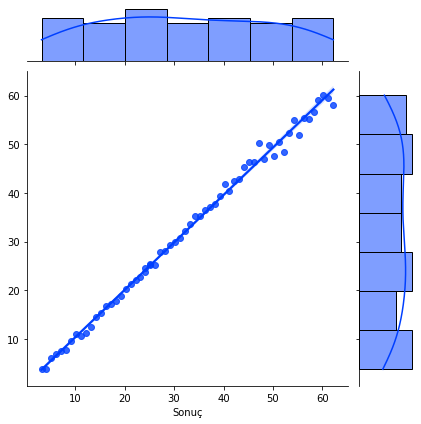

In [46]:
plt.style.use("seaborn-bright")
sns.jointplot(y_test, y_pred, kind="reg")
plt.show()